In [1]:
%matplotlib inline
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from collections import Counter

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score, auc
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [2]:
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, Activation, Dense, Lambda, Input, MaxPooling2D, Dropout, Flatten, Reshape, UpSampling2D
from tensorflow.keras.losses import mse, binary_crossentropy
from tensorflow.keras import backend as K
from tensorflow.keras.utils import plot_model, to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.mixture import GaussianMixture
from filterpy.kalman import unscented_transform, MerweScaledSigmaPoints
import scipy.stats as stats


import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
import random
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from itertools import chain

In [3]:
(X_train, Y_train), (X_test, Y_test) = mnist.load_data()
X_train = X_train.reshape((-1, 784)).astype('float32') / 255.0
X_test = X_test.reshape((-1, 784)).astype('float32') / 255.0
# y_train = to_categorical(y_train, 10)
# y_test = to_categorical(y_test, 10)
print(X_train.shape, Y_train.shape)
print(X_test.shape, Y_test.shape)
mnist_digits = np.concatenate([X_train, X_test], axis=0)
print(mnist_digits.shape)

(60000, 784) (60000,)
(10000, 784) (10000,)
(70000, 784)


# VAE

In [4]:
# reparameterization trick
# instead of sampling from Q(z|X), sample eps = N(0,I)
# z = z_mean + sqrt(var)*eps
def sampling(args):
    """Reparameterization trick by sampling fr an isotropic unit Gaussian.
    # Arguments:
        args (tensor): mean and log of variance of Q(z|X)
    # Returns:
        z (tensor): sampled latent vector
    """
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    # by default, random_normal has mean=0 and std=1.0
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

In [13]:
image_shape = (28, 28, 1)
original_dim = image_shape[0] * image_shape[1]
input_shape = (original_dim,)
batch_size = 64
latent_dim = 3
epochs = 60

# encoder
inputs = Input(shape=input_shape)
x = Reshape(image_shape)(inputs)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)
x = Dropout(0.25)(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((7, 7))(x)
x = Dropout(0.25)(x)
x = Flatten()(x)
x = Dense(128, activation='relu')(x)
z_mean = Dense(latent_dim, name='z_mean')(x)
z_log_var = Dense(latent_dim, name='z_log_var')(x)
z = Lambda(sampling, output_shape=(latent_dim,), name='z')([z_mean, z_log_var])

encoder = Model(inputs, [z_mean, z_log_var, z], name='encoder')
encoder.summary()
#plot_model(encoder, to_file='vae_cnn_encoder.png', show_shapes=True)

# decoder
latent_inputs = Input(shape=(latent_dim,), name='z_sampling')
#label_inputs = Input(shape=(10,), name='label')
#x = Concatenate()([latent_inputs, label_inputs])
#x = Dense(128, activation='relu')(latent_inputs)
x = Dense(2 * 2 * 64, activation='relu')(latent_inputs)
x = Reshape((2, 2, 64))(x)
x = Dropout(0.25)(x)
x = UpSampling2D((7, 7))(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Dropout(0.25)(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)
outputs = Reshape(input_shape)(x)

decoder = Model([latent_inputs], outputs, name='decoder')
decoder.summary()
plot_model(decoder, to_file='vae_cnn_decoder.png', show_shapes=True)

# variational autoencoder
outputs = decoder([encoder(inputs)[2]])

vae = Model([inputs], outputs, name='vae_mlp')
vae.summary()
#plot_model(vae, to_file='vae_cnn.png', show_shapes=True)

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 784)]        0                                            
__________________________________________________________________________________________________
reshape_5 (Reshape)             (None, 28, 28, 1)    0           input_4[0][0]                    
__________________________________________________________________________________________________
conv2d_17 (Conv2D)              (None, 28, 28, 32)   320         reshape_5[0][0]                  
__________________________________________________________________________________________________
conv2d_18 (Conv2D)              (None, 28, 28, 64)   18496       conv2d_17[0][0]                  
____________________________________________________________________________________________

In [14]:
reconstruction_loss = binary_crossentropy(inputs, outputs)
reconstruction_loss *= original_dim
kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
kl_loss = K.sum(kl_loss, axis=-1)
kl_loss *= -0.5
#vae_loss = K.mean(reconstruction_loss + kl_loss)
vae_loss = reconstruction_loss + kl_loss
vae.add_loss(vae_loss)
vae.compile(optimizer='Adam')

In [15]:
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=25)

In [17]:
import os

weights_file = '/home/dsarkar/compute_canada/MNIST/model/vae_cnn_mnist_z3.h5'

if os.path.exists(weights_file):
    vae.load_weights(weights_file)
    print('Loaded weights!')
else:
    history = vae.fit(mnist_digits,
            epochs=epochs,
            batch_size=batch_size, 
           validation_split = 0.2,
            #validation_data=(X_test, Y_test),
             verbose=1, callbacks=[es])
    vae.save_weights('/home/dsarkar/compute_canada/MNIST/model/vae_cnn_mnist_z3.h5')

Epoch 1/60
875/875 [==============================] - 202s 230ms/step - loss: 182.5426 - val_loss: 151.9814
Epoch 2/60
875/875 [==============================] - 210s 240ms/step - loss: 153.8857 - val_loss: 144.9208
Epoch 3/60
875/875 [==============================] - 218s 249ms/step - loss: 148.9777 - val_loss: 140.8558
Epoch 4/60
875/875 [==============================] - 210s 240ms/step - loss: 146.4957 - val_loss: 139.7891
Epoch 5/60
875/875 [==============================] - 197s 226ms/step - loss: 144.8898 - val_loss: 138.1023
Epoch 6/60
875/875 [==============================] - 199s 228ms/step - loss: 143.7284 - val_loss: 137.7434
Epoch 7/60
875/875 [==============================] - 197s 226ms/step - loss: 142.5655 - val_loss: 137.1956
Epoch 8/60
875/875 [==============================] - 201s 229ms/step - loss: 141.9324 - val_loss: 137.9068
Epoch 9/60
875/875 [==============================] - 197s 225ms/step - loss: 141.1448 - val_loss: 135.5710
Epoch 10/60
875/875 [=======

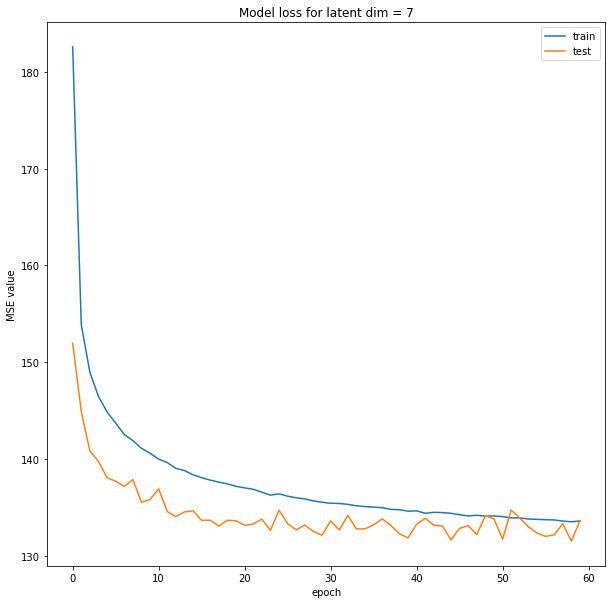

In [18]:
# summarize history for loss
plt.figure(figsize=(10,10))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss for latent dim = 7')
plt.ylabel('MSE value')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

In [22]:
latent_space_train = encoder.predict(X_train)[2]
latent_space_test = encoder.predict(X_test)[2]

print(latent_space_train.shape)
print(latent_space_test.shape)

(60000, 3)
(10000, 3)


In [17]:
latent_space_train = encoder.predict(X_train)[2]
np.save('/home/dsarkar/compute_canada/MNIST/dataset/MNIST_train_latent_space_z7.npy',latent_space_train)
print(latent_space_train.shape)

(60000, 7)


In [18]:
latent_space_test = encoder.predict(X_test)[2]
np.save('/home/dsarkar/compute_canada/MNIST/dataset/MNIST_test_latent_space_z7.npy',latent_space_test)
latent_space_test.shape

(10000, 7)

In [4]:
latent_space_train = np.load('/home/dsarkar/compute_canada/MNIST/dataset/MNIST_train_latent_space_z7.npy')
print(latent_space_train.shape, Y_train.shape)

(60000, 7) (60000,)


In [5]:
latent_space_test = np.load('/home/dsarkar/compute_canada/MNIST/dataset/MNIST_test_latent_space_z7.npy')
print(latent_space_test.shape,Y_test.shape)

(10000, 7) (10000,)


# NMI

In [23]:
from sklearn.metrics.cluster import normalized_mutual_info_score
kmeans = KMeans(n_clusters=5, random_state=0).fit(latent_space_train)
kmeans.labels_

array([2, 0, 3, ..., 2, 4, 1], dtype=int32)

In [24]:
normalized_mutual_info_score(kmeans.labels_,Y_train)

0.5222627460997833

In [9]:
kmeans = KMeans(n_clusters=5, random_state=0).fit(X_train)
normalized_mutual_info_score(kmeans.labels_,Y_train)

0.4654245373882617

# Random sampling on the latent space

In [6]:
# tuned_parameters = [{'kernel': ['rbf'], 'C' : [0.1, 1, 10, 100], 'gamma': [1,0.1,0.01,0.001]},
#                     {'kernel': ['linear'], 'C' : [0.1, 1, 10, 100], 'gamma': [1,0.1,0.01,0.001]},
#                    {'kernel': ['poly'], 'C' : [0.1, 1, 10, 100], 'gamma': [1,0.1,0.01,0.001]},
#                    {'kernel': ['sigmoid'], 'C' : [0.1, 1, 10, 100], 'gamma': [1,0.1,0.01,0.001]}]
# score = 'accuracy'
# clf = GridSearchCV(SVC(), tuned_parameters, scoring=score, n_jobs=-1,refit=True,verbose=1)

tuned_parameters = [{'kernel': ['rbf'], 'C' : [0.1, 1, 10, 100]},
                    {'kernel': ['linear'], 'C' : [0.1, 1, 10, 100]}] 
# \,
#                    {'kernel': ['poly'], 'C' : [0.1, 1, 10, 100], 'gamma': [1,0.1,0.01,0.001]},
#                    {'kernel': ['sigmoid'], 'C' : [0.1, 1, 10, 100], 'gamma': [1,0.1,0.01,0.001]}]
score = 'accuracy'
clf = GridSearchCV(SVC(), tuned_parameters, scoring=score, n_jobs=-1,refit=True,verbose=1)

In [7]:
mean_random = []
sd_random = []

for coreset_size in range(100,1001,100): # start from 50 labeled points
# for coreset_size in range(1000,9001,1000): # start from 1000 labeled points
    print("*********************** Training on {} points ***********************".format(coreset_size))
    accuracy = [] # calculate accuracy of 100 iterations
    c = list(zip(latent_space_train,Y_train))
    iterations = 0
    while iterations < 500: # run 100 simulations and take average 
        train_data = []
        train_labels = []
        for (data,label) in random.sample(c,coreset_size):
            train_data.append(data)
            train_labels.append(label)  
        train_x = np.array(train_data)
        train_y = np.array(train_labels)
        
        print()
        print("Distribution of data in the training points")
        print(Counter(train_y)) 

        clf.fit(train_x, train_y)
        print("Best parameters set found on {} data points:".format(coreset_size))
        print(clf.best_params_)
        print()
        y_true, y_pred = Y_test, clf.predict(latent_space_test)
        accuracy.append(accuracy_score(y_true, y_pred))
        iterations += 1
    accuracy = np.asarray(accuracy)
    mean_accuracy = accuracy.mean()
    sd_accuracy = accuracy.std()
    
    mean_random.append(mean_accuracy)
    sd_random.append(sd_accuracy)

*********************** Training on 100 points ***********************

Distribution of data in the training points
Counter({3: 13, 2: 12, 4: 11, 8: 11, 9: 11, 1: 10, 7: 9, 5: 9, 6: 7, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   22.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 13, 3: 12, 0: 11, 7: 11, 8: 10, 6: 9, 5: 9, 2: 9, 9: 9, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 18, 8: 16, 6: 12, 4: 10, 2: 10, 3: 9, 9: 8, 5: 7, 1: 5, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 17, 1: 14, 7: 13, 6: 11, 8: 10, 3: 10, 4: 8, 9: 7, 2: 5, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 21, 5: 11, 6: 10, 4: 9, 1: 9, 9: 9, 3: 8, 7: 8, 0: 8, 8: 7})
Fitting 5 folds for each of 8 candidat

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 14, 2: 14, 7: 13, 9: 9, 8: 9, 6: 9, 0: 9, 3: 9, 4: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 17, 7: 17, 3: 13, 6: 13, 1: 11, 0: 10, 5: 6, 4: 5, 9: 4, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 18, 0: 14, 3: 12, 8: 11, 5: 11, 4: 11, 1: 9, 6: 8, 7: 5, 2: 1})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 15, 5: 12, 0: 12, 7: 11, 8: 11, 6: 10, 1: 10, 4: 9, 2: 6, 9: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 16, 1: 13, 9: 12, 2: 11, 3: 10, 5: 9, 4: 8, 8: 8, 6: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 14, 2: 13, 4: 12, 7: 12, 8: 11, 9: 10, 1: 8, 0: 8, 6: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 15, 7: 12, 2: 12, 1: 12, 3: 11, 0: 11, 5: 9, 9: 9, 4: 5, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 con

Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 15, 1: 14, 7: 12, 3: 11, 9: 10, 0: 10, 2: 9, 6: 7, 4: 7, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 14, 7: 11, 1: 11, 4: 11, 8: 10, 3: 10, 5: 9, 0: 9, 6: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 15, 7: 13, 8: 11, 4: 11, 5: 10, 1: 9, 6: 9, 9: 8, 2: 8, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0

Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 15, 9: 13, 1: 13, 6: 12, 0: 11, 8: 10, 2: 10, 5: 7, 7: 7, 4: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 14, 2: 12, 7: 12, 1: 11, 3: 11, 9: 11, 4: 10, 5: 8, 8: 6, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 18, 2: 15, 3: 11, 9: 10, 7: 10, 0: 9, 8: 9, 4: 7, 6: 7, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 15, 4: 15, 1: 12, 0: 12, 9: 10, 3: 10, 5: 7, 8: 7, 6: 7, 7: 5})
Fitting 5 folds for each of 8 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 13, 3: 13, 2: 13, 8: 12, 6: 10, 0: 9, 7: 9, 9: 8, 1: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 15, 8: 14, 1: 11, 6: 11, 2: 10, 0: 9, 4: 9, 5: 8, 9: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 13, 3: 12, 5: 12, 6: 11, 0: 11, 2: 9, 1: 9, 9: 9, 8: 8, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 17, 3: 16, 9: 13, 2: 12, 6: 10, 1: 8, 0: 8, 4: 7, 8: 5, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 14, 0: 14, 4: 13, 1: 12, 5: 11, 2: 11, 6: 10, 7: 5, 3: 5, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 15, 7: 11, 8: 11, 5: 10, 1: 10, 4: 9, 9: 9, 2: 9, 0: 8, 6: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 12, 7: 12, 6: 12, 1: 11, 5: 11, 3: 11, 4: 10, 2: 10, 9: 6, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 13, 9: 13, 1: 12, 6: 12, 7: 11, 2: 11, 4: 9, 3: 8, 5: 7, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 14, 4: 12, 3: 12, 9: 12, 2: 12, 6: 11, 7: 8, 0: 8, 8: 7, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 14, 3: 12, 6: 12, 7: 11, 0: 11, 5: 10, 8: 9, 9: 8, 2: 7, 1: 6})
Fitting 5 folds for each of 8 ca

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 14, 0: 13, 2: 13, 8: 12, 3: 11, 9: 9, 6: 9, 4: 8, 1: 7, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 16, 8: 13, 3: 12, 5: 11, 9: 10, 2: 9, 0: 9, 7: 8, 6: 7, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 17, 4: 14, 1: 11, 0: 10, 9: 10, 6: 9, 8: 9, 3: 9, 2: 6, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 14, 0: 14, 5: 12, 6: 12, 7: 10, 4: 9, 3: 8, 8: 8, 2: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 17, 8: 14, 7: 13, 3: 11, 9: 8, 4: 8, 2: 8, 5: 7, 1: 7, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 13, 7: 12, 2: 12, 4: 11, 6: 10, 8: 9, 1: 9, 0: 8, 3: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 13, 7: 12, 3: 12, 4: 11, 0: 11, 1: 11, 8: 11, 2: 7, 9: 7, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 17, 7: 13, 3: 12, 9: 12, 8: 10, 5: 9, 1: 8, 4: 7, 6: 6, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 19, 7: 11, 1: 11, 9: 10, 5: 10, 3: 10, 2: 10, 4: 9, 0: 6, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 16, 9: 13, 7: 12, 6: 11, 2: 10, 5: 10, 0: 9, 8: 7, 3: 7, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 14, 6: 12, 4: 12, 9: 11, 7: 10, 0: 9, 1: 8, 8: 8, 2: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 16, 3: 13, 6: 13, 8: 10, 2: 10, 5: 9, 7: 9, 9: 8, 0: 7, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 14, 3: 14, 1: 14, 9: 12, 5: 10, 4: 10, 0: 9, 6: 8, 2: 5, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 15, 3: 13, 6: 11, 0: 11, 5: 10, 7: 10, 9: 10, 1: 8, 8: 8, 4: 4})
Fitting 5 folds for each of 8 candida

/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 con

Best parameters set found on 100 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 15, 3: 13, 5: 12, 0: 12, 2: 10, 7: 9, 9: 8, 8: 8, 6: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 15, 2: 13, 6: 13, 4: 12, 0: 12, 1: 11, 7: 9, 9: 8, 8: 5, 5: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 12, 1: 12, 3: 12, 7: 11, 4: 11, 6: 10, 0: 9, 5: 9, 9: 8, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 14, 5: 13, 0: 12, 6: 12, 9: 11, 4: 10, 8: 10, 7: 9, 1: 5, 2: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 16, 1: 14, 2: 13, 0: 11, 6: 9, 7: 8, 8: 8, 3: 8, 5: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 15, 1: 14, 3: 12, 9: 11, 4: 10, 8: 9, 6: 8, 5: 8, 7: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 15, 0: 14, 6: 13, 4: 13, 9: 10, 8: 9, 5: 8, 2: 7, 7: 7, 1: 4})
Fitting 5 folds for each of 8 candidates,

/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished




Distribution of data in the training points
Counter({0: 15, 3: 14, 5: 14, 9: 11, 8: 11, 1: 10, 2: 8, 4: 7, 6: 5, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 17, 6: 15, 5: 14, 1: 14, 4: 9, 8: 8, 7: 7, 9: 6, 0: 6, 2: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 15, 8: 14, 3: 12, 9: 12, 5: 10, 7: 10, 0: 10, 6: 7, 2: 6, 4: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 15, 2: 13, 0: 12, 8: 11, 7: 11, 9: 9, 3: 8, 5: 8, 1: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 16, 1: 13, 4: 12, 2: 12, 0: 10, 8: 10, 3: 8, 6: 8, 5: 6, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 16, 0: 13, 9: 13, 2: 10, 4: 10, 3: 9, 8: 9, 5: 8, 7: 6, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 13, 2: 12, 7: 12, 8: 12, 3: 10, 0: 10, 9: 10, 5: 10, 6: 7, 4: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 15, 3: 13, 8: 12, 5: 11, 4: 11, 1: 10, 9: 8, 6: 8, 2: 8, 7: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 14, 0: 14, 3: 13, 7: 11, 4: 10, 6: 9, 1: 9, 5: 8, 2: 6, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 13, 5: 12, 2: 12, 8: 11, 3: 11, 9: 9, 7: 9, 4: 9, 6: 8, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 con

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 16, 6: 14, 1: 13, 7: 11, 5: 11, 3: 10, 4: 10, 9: 7, 8: 5, 0: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 16, 0: 14, 9: 11, 7: 10, 5: 10, 8: 9, 4: 9, 2: 8, 6: 8, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 14, 9: 13, 7: 13, 6: 12, 2: 10, 8: 10, 5: 8, 3: 7, 1: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 15, 3: 14, 2: 13, 4: 11, 9: 10, 7: 10, 6: 9, 8: 8, 0: 5, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 13, 4: 12, 1: 12, 5: 11, 7: 11, 0: 10, 6: 9, 3: 8, 8: 8, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 16, 0: 12, 5: 12, 7: 12, 1: 11, 3: 9, 6: 8, 4: 7, 8: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 15, 0: 14, 7: 13, 5: 11, 8: 11, 2: 9, 4: 8, 3: 7, 9: 6, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 16, 4: 13, 2: 12, 1: 11, 3: 10, 0: 9, 6: 9, 7: 9, 8: 6, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 14, 5: 13, 1: 12, 8: 12, 9: 9, 4: 9, 6: 8, 7: 8, 3: 8, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 13, 9: 13, 7: 12, 2: 11, 8: 11, 5: 10, 4: 10, 3: 9, 6: 6, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 16, 1: 14, 7: 12, 4: 11, 8: 10, 9: 8, 3: 8, 0: 8, 2: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 18, 3: 13, 9: 12, 6: 9, 4: 9, 8: 9, 5: 9, 7: 8, 2: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 15, 1: 13, 4: 12, 5: 10, 3: 10, 2: 10, 9: 8, 0: 8, 8: 8, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 15, 2: 14, 5: 13, 6: 12, 3: 11, 1: 9, 9: 8, 4: 8, 0: 6, 7: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 13, 2: 13, 9: 12, 5: 11, 7: 10, 6: 10, 0: 9, 4: 8, 1: 8, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 16, 8: 14, 2: 13, 0: 11, 1: 11, 7: 8, 6: 8, 9: 7, 5: 6, 4: 6})
Fitting 5 folds for each of 8 cand

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 con

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 16, 8: 13, 5: 13, 0: 13, 6: 10, 7: 8, 3: 8, 4: 8, 9: 7, 2: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 13, 8: 13, 3: 11, 5: 11, 2: 10, 7: 9, 9: 9, 6: 9, 4: 8, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 16, 8: 12, 6: 12, 4: 11, 7: 10, 3: 9, 9: 9, 5: 8, 2: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 13, 2: 11, 7: 11, 6: 11, 3: 11, 4: 9, 5: 9, 8: 9, 9: 8, 0: 8})
Fitting 5 folds for each of 8 candidates,

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 15, 4: 12, 2: 11, 1: 10, 9: 10, 5: 10, 3: 10, 0: 9, 6: 7, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 13, 6: 13, 3: 13, 1: 13, 5: 10, 0: 8, 2: 8, 8: 8, 7: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 18, 9: 12, 1: 11, 4: 11, 8: 10, 0: 10, 6: 9, 7: 8, 5: 7, 2: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 20, 3: 11, 8: 11, 9: 10, 2: 9, 5: 8, 7: 8, 6: 8, 4: 8, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 13, 0: 12, 8: 12, 3: 11, 7: 10, 9: 10, 4: 9, 6: 8, 1: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 13, 0: 11, 6: 11, 9: 10, 2: 10, 1: 10, 8: 9, 5: 9, 3: 9, 4: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 14, 6: 13, 8: 13, 9: 12, 3: 11, 2: 9, 1: 9, 4: 8, 0: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 12, 5: 12, 3: 11, 6: 11, 8: 10, 0: 9, 2: 9, 7: 9, 4: 9, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 16, 9: 11, 7: 11, 1: 10, 6: 10, 0: 9, 4: 9, 3: 8, 2: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 15, 9: 13, 4: 13, 3: 11, 1: 10, 0: 9, 2: 8, 8: 7, 6: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 14, 3: 13, 6: 13, 0: 12, 4: 12, 2: 9, 7: 9, 9: 8, 1: 6, 5: 4})
Fitting 5 folds for each of 8 candidate

/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which

Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 13, 7: 12, 8: 12, 2: 12, 0: 11, 9: 10, 5: 10, 3: 9, 4: 8, 6: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 15, 6: 14, 8: 13, 3: 12, 1: 10, 0: 9, 4: 7, 5: 7, 2: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 16, 9: 13, 8: 11, 4: 10, 3: 10, 5: 9, 6: 9, 0: 9, 1: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y ha

Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 13, 7: 13, 0: 13, 1: 11, 4: 11, 9: 11, 8: 9, 3: 9, 6: 8, 5: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 15, 7: 14, 1: 13, 3: 13, 2: 12, 6: 8, 5: 8, 8: 8, 9: 6, 0: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 13, 1: 13, 8: 13, 0: 12, 7: 12, 6: 11, 9: 8, 5: 8, 2: 7, 4: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 16, 8: 13, 9: 11, 4: 11, 7: 10, 6: 9, 5: 9, 0: 8, 1: 8, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 20, 8: 13, 4: 12, 7: 11, 1: 10, 5: 8, 2: 8, 6: 7, 3: 6, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 14, 6: 13, 4: 13, 3: 11, 1: 11, 5: 9, 9: 9, 0: 7, 7: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 17, 9: 13, 1: 13, 0: 12, 5: 11, 8: 9, 3: 8, 7: 7, 4: 6, 6: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 14, 5: 14, 2: 12, 9: 10, 0: 10, 3: 9, 4: 9, 7: 9, 6: 8, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 15, 4: 13, 3: 12, 9: 11, 2: 10, 1: 9, 5: 8, 0: 8, 6: 8, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 18, 3: 16, 8: 12, 6: 11, 4: 11, 7: 8, 2: 8, 0: 8, 1: 6, 5: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 15, 3: 15, 2: 12, 7: 11, 9: 10, 1: 10, 5: 9, 4: 8, 8: 6, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 15, 9: 12, 3: 11, 7: 11, 2: 11, 0: 10, 1: 10, 5: 8, 6: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 14, 6: 13, 4: 12, 1: 11, 9: 11, 5: 10, 8: 8, 0: 8, 2: 8, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 13, 1: 12, 2: 12, 3: 11, 5: 11, 8: 10, 9: 10, 0: 8, 6: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 13, 2: 12, 3: 12, 9: 11, 1: 10, 8: 9, 5: 9, 0: 9, 7: 8, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({0: 14, 1: 12, 6: 12, 4: 12, 2: 12, 3: 10, 8: 10, 7: 7, 9: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 17, 9: 14, 0: 12, 3: 12, 2: 10, 1: 10, 8: 8, 4: 6, 6: 6, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 15, 1: 14, 8: 11, 5: 11, 3: 9, 0: 9, 7: 9, 6: 9, 2: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 15, 2: 15, 4: 15, 1: 14, 0: 11, 6: 9, 7: 9, 3: 5, 5: 5, 8: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C

[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({6: 15, 7: 14, 0: 14, 8: 12, 2: 11, 3: 8, 4: 8, 5: 7, 1: 7, 9: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 14, 1: 13, 3: 11, 9: 11, 7: 11, 8: 10, 4: 8, 2: 8, 5: 7, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 16, 7: 15, 3: 12, 5: 12, 1: 10, 4: 9, 6: 9, 9: 8, 0: 6, 8: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({5: 14, 9: 14, 0: 12, 7: 12, 6: 10, 2: 10, 1: 9, 8: 7, 3: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 11, 8: 11, 5: 11, 1: 10, 4: 10, 2: 10, 3: 10, 6: 9, 7: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 17, 7: 15, 9: 13, 0: 12, 2: 9, 3: 8, 6: 7, 8: 7, 5: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 15, 9: 14, 4: 14, 3: 14, 2: 11, 5: 10, 0: 8, 8: 5, 1: 5, 6: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 13, 8: 13, 4: 12, 3: 11, 6: 11, 5: 10, 7: 8, 0: 8, 1: 7, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 18, 7: 10, 4: 10, 2: 10, 3: 10, 8: 9, 6: 9, 9: 8, 1: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 14, 8: 14, 4: 12, 3: 12, 6: 11, 2: 9, 5: 8, 1: 8, 0: 6, 9: 6})
Fitting 5 folds for each of 8 ca

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 13, 6: 12, 7: 12, 9: 11, 2: 10, 3: 10, 4: 10, 0: 8, 1: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 13, 9: 12, 7: 12, 1: 11, 2: 11, 6: 10, 0: 9, 3: 8, 4: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 19, 1: 12, 7: 12, 2: 11, 9: 9, 3: 9, 4: 9, 5: 8, 8: 6, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 15, 2: 14, 9: 12, 1: 10, 7: 10, 5: 10, 3: 9, 6: 9, 8: 6, 4: 5})
Fitting 5 folds for each of 8 ca

[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 15, 2: 13, 1: 12, 0: 9, 3: 9, 7: 9, 9: 9, 5: 9, 4: 8, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 14, 8: 12, 1: 11, 9: 10, 3: 10, 4: 9, 2: 9, 0: 9, 6: 8, 7: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 17, 5: 13, 1: 12, 3: 11, 6: 11, 4: 9, 9: 8, 0: 7, 8: 6, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 18, 4: 13, 8: 13, 1: 10, 9: 9, 6: 9, 3: 8, 2: 8, 5: 6, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 13, 6: 13, 7: 13, 4: 12, 9: 10, 1: 10, 5: 9, 8: 9, 3: 6, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 14, 9: 13, 7: 12, 4: 11, 6: 10, 0: 10, 3: 9, 5: 8, 2: 8, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 14, 8: 14, 1: 13, 5: 13, 6: 12, 7: 9, 3: 7, 0: 7, 4: 6, 9: 5})
Fitting 5 folds for each of 8 cand

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 17, 2: 14, 7: 14, 8: 13, 0: 9, 5: 9, 3: 9, 9: 8, 6: 4, 4: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 14, 8: 14, 4: 13, 5: 13, 6: 10, 2: 9, 0: 8, 7: 7, 3: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 17, 7: 13, 1: 13, 8: 11, 3: 9, 6: 9, 0: 8, 2: 8, 5: 7, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 14, 1: 13, 0: 13, 4: 12, 3: 11, 6: 10, 2: 10, 9: 7, 5: 6, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 17, 8: 14, 6: 13, 4: 11, 7: 11, 0: 8, 1: 8, 9: 7, 3: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 15, 0: 13, 8: 12, 5: 11, 6: 11, 7: 9, 1: 9, 4: 7, 9: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 15, 3: 14, 4: 13, 1: 11, 8: 10, 2: 9, 7: 9, 0: 7, 6: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 12, 2: 11, 8: 11, 4: 11, 7: 11, 3: 10, 9: 10, 6: 10, 5: 9, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 16, 8: 12, 2: 12, 1: 11, 7: 11, 6: 11, 4: 9, 0: 7, 3: 6, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 18, 7: 13, 3: 13, 1: 10, 0: 10, 4: 10, 9: 9, 5: 7, 2: 5, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 16, 7: 16, 0: 11, 1: 11, 5: 10, 4: 8, 3: 8, 2: 8, 9: 6, 8: 6})
Fitting 5 folds for each of 8 can

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 15, 7: 15, 6: 11, 2: 11, 9: 9, 3: 9, 4: 9, 0: 8, 5: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 13, 8: 13, 5: 12, 9: 10, 1: 10, 6: 10, 4: 9, 3: 9, 7: 8, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 16, 1: 14, 8: 12, 4: 11, 9: 11, 2: 9, 0: 8, 6: 8, 7: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 15, 2: 13, 9: 12, 5: 11, 0: 11, 1: 9, 4: 8, 8: 8, 3: 7, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 17, 3: 11, 4: 10, 1: 10, 8: 9, 6: 9, 0: 9, 9: 9, 5: 8, 7: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 16, 9: 15, 8: 10, 0: 10, 6: 10, 7: 9, 1: 9, 4: 9, 5: 7, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 15, 9: 14, 2: 13, 8: 13, 1: 10, 4: 9, 6: 7, 7: 7, 0: 7, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 16, 9: 15, 1: 14, 2: 12, 8: 9, 4: 9, 5: 8, 0: 6, 3: 6, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 14, 8: 13, 4: 11, 2: 11, 1: 11, 0: 10, 3: 9, 6: 9, 5: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 17, 8: 15, 2: 12, 5: 10, 1: 10, 4: 9, 0: 8, 3: 7, 6: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 17, 2: 13, 3: 13, 0: 12, 7: 12, 6: 8, 1: 8, 9: 8, 4: 5, 5: 4})
Fitting 5 folds for each of 8 candidates,

/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 14, 6: 12, 7: 11, 5: 11, 0: 10, 8: 10, 3: 9, 2: 9, 4: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 16, 1: 14, 3: 12, 5: 11, 0: 10, 9: 9, 4: 8, 7: 8, 6: 6, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 16, 1: 15, 6: 13, 5: 11, 0: 9, 7: 9, 8: 8, 9: 7, 3: 7, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 14, 1: 13, 8: 13, 3: 11, 4: 10, 0: 9, 7: 9, 6: 7, 2: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 15, 4: 11, 2: 11, 0: 11, 7: 10, 5: 10, 6: 9, 8: 9, 3: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 14, 9: 13, 0: 12, 1: 11, 2: 10, 5: 9, 8: 8, 4: 8, 7: 8, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 16, 0: 13, 1: 12, 5: 11, 9: 10, 2: 10, 3: 9, 8: 8, 6: 6, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 16, 6: 15, 0: 12, 8: 10, 1: 10, 7: 9, 5: 8, 3: 7, 2: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 19, 0: 13, 5: 12, 2: 12, 7: 12, 3: 10, 4: 10, 9: 7, 8: 3, 6: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 16, 3: 14, 2: 13, 8: 13, 1: 11, 7: 9, 5: 8, 0: 6, 4: 6, 6: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 13, 7: 12, 6: 12, 1: 12, 8: 11, 3: 10, 9: 9, 5: 8, 4: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 15, 5: 14, 0: 12, 4: 12, 1: 10, 7: 10, 9: 8, 2: 7, 6: 7, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 16, 1: 15, 6: 11, 7: 9, 3: 9, 5: 9, 9: 9, 0: 8, 2: 8, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C

/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 17, 1: 14, 2: 13, 5: 11, 7: 10, 9: 9, 0: 8, 4: 7, 3: 6, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 13, 5: 13, 8: 13, 4: 12, 3: 12, 9: 10, 1: 9, 6: 8, 2: 7, 7: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 15, 7: 12, 9: 11, 1: 11, 6: 10, 8: 10, 5: 9, 3: 8, 2: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 16, 7: 13, 0: 13, 2: 10, 9: 9, 1: 9, 6: 9, 8: 8, 4: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 14, 3: 12, 0: 11, 6: 11, 8: 10, 9: 10, 5: 9, 2: 9, 4: 8, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 15, 7: 14, 2: 11, 3: 10, 4: 10, 0: 9, 1: 8, 8: 8, 6: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 14, 4: 14, 7: 13, 9: 12, 0: 11, 6: 10, 2: 8, 8: 8, 5: 7, 1: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 17, 5: 14, 1: 13, 4: 12, 2: 10, 9: 10, 7: 8, 6: 7, 0: 5, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 13, 0: 12, 7: 11, 2: 11, 9: 11, 8: 10, 3: 9, 6: 8, 5: 8, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 15, 0: 13, 1: 13, 7: 11, 5: 10, 6: 9, 4: 9, 8: 8, 9: 6, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 13, 6: 12, 9: 11, 1: 10, 2: 10, 7: 10, 0: 10, 4: 9, 3: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 16, 4: 13, 7: 13, 2: 11, 5: 9, 0: 8, 3: 8, 1: 8, 8: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 13, 1: 13, 4: 13, 0: 12, 5: 11, 8: 9, 9: 8, 2: 8, 3: 7, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 15, 4: 12, 3: 12, 6: 11, 7: 11, 5: 10, 9: 9, 2: 8, 0: 6, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 14, 3: 13, 5: 12, 9: 12, 7: 11, 6: 10, 8: 8, 1: 8, 4: 7, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 18, 1: 12, 2: 12, 3: 11, 8: 11, 4: 9, 9: 8, 6: 7, 7: 7, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 14, 0: 13, 9: 13, 3: 11, 7: 10, 1: 10, 6: 9, 8: 7, 4: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 14, 6: 13, 4: 11, 9: 11, 5: 11, 7: 9, 8: 9, 1: 9, 2: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 13, 2: 12, 3: 12, 0: 11, 5: 11, 7: 10, 4: 10, 1: 9, 6: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 17, 9: 16, 2: 11, 1: 10, 7: 10, 0: 9, 4: 9, 6: 8, 8: 7, 5: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 15, 7: 12, 8: 12, 2: 12, 6: 10, 5: 9, 9: 9, 4: 8, 1: 8, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 14, 5: 13, 9: 12, 1: 11, 7: 11, 8: 10, 4: 8, 0: 8, 6: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 16, 7: 16, 9: 12, 4: 11, 3: 10, 2: 10, 0: 9, 5: 7, 8: 6, 1: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 15, 8: 13, 7: 10, 0: 10, 1: 10, 6: 9, 2: 9, 3: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 14, 8: 14, 4: 13, 6: 13, 3: 11, 7: 9, 9: 7, 1: 7, 0: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 16, 2: 12, 1: 11, 7: 11, 3: 10, 9: 10, 0: 9, 5: 9, 4: 7, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 15, 4: 13, 0: 12, 2: 11, 5: 10, 3: 10, 1: 8, 7: 8, 8: 7, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 14, 2: 13, 8: 12, 9: 12, 3: 10, 6: 9, 0: 9, 4: 8, 5: 8, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 18, 0: 16, 1: 14, 7: 10, 4: 9, 6: 9, 5: 6, 9: 6, 3: 6, 8: 6})
Fitting 5 folds for each of 8 candidat

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 15, 5: 14, 7: 12, 2: 11, 8: 10, 4: 8, 9: 8, 6: 8, 0: 8, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 14, 4: 14, 9: 11, 6: 11, 7: 11, 0: 10, 3: 10, 5: 7, 1: 6, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 17, 2: 13, 0: 12, 1: 11, 7: 9, 4: 9, 3: 8, 8: 8, 6: 8, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 14, 7: 14, 0: 11, 4: 11, 5: 10, 3: 10, 6: 9, 1: 9, 9: 7, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 15, 4: 14, 7: 12, 6: 11, 5: 11, 0: 9, 3: 7, 2: 7, 8: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 15, 3: 15, 4: 12, 1: 11, 7: 11, 6: 8, 8: 8, 2: 8, 5: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 13, 5: 13, 2: 11, 0: 10, 7: 10, 9: 10, 8: 10, 4: 10, 6: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 17, 4: 15, 2: 14, 0: 11, 1: 10, 7: 10, 9: 8, 8: 6, 5: 5, 3: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 18, 9: 13, 8: 12, 4: 11, 3: 11, 1: 9, 0: 8, 5: 7, 2: 6, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 17, 9: 13, 1: 12, 0: 10, 7: 10, 5: 9, 6: 9, 2: 8, 8: 7, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 17, 2: 15, 8: 14, 7: 13, 3: 8, 1: 8, 4: 7, 0: 7, 5: 6, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 14, 8: 13, 2: 13, 1: 11, 0: 11, 9: 9, 5: 8, 7: 8, 4: 7, 6: 6})
Fitting 5 folds for each of 8 candidate

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 17, 3: 11, 9: 11, 2: 10, 6: 10, 7: 10, 4: 10, 8: 9, 1: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 15, 3: 13, 0: 13, 4: 11, 5: 11, 7: 10, 8: 8, 1: 8, 6: 6, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 16, 7: 12, 8: 11, 0: 11, 1: 10, 4: 9, 2: 8, 6: 8, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({4: 15, 5: 13, 3: 13, 0: 11, 7: 10, 6: 8, 9: 8, 8: 8, 2: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 16, 4: 13, 7: 11, 0: 10, 3: 10, 6: 9, 2: 9, 8: 8, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 16, 8: 11, 0: 11, 3: 10, 2: 10, 6: 10, 5: 10, 4: 9, 9: 7, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 16, 9: 14, 6: 12, 8: 11, 1: 10, 3: 9, 7: 8, 0: 7, 5: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C

[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 17, 7: 12, 6: 12, 8: 11, 9: 10, 0: 10, 1: 8, 3: 7, 2: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 17, 5: 12, 8: 12, 4: 10, 7: 10, 1: 10, 3: 9, 0: 7, 2: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 17, 3: 13, 5: 10, 8: 10, 4: 10, 6: 9, 1: 9, 0: 9, 2: 8, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 16, 7: 16, 0: 15, 9: 10, 4: 10, 6: 8, 2: 7, 3: 7, 5: 6, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 14, 1: 13, 2: 11, 9: 11, 6: 10, 3: 9, 4: 9, 7: 8, 0: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 16, 0: 16, 1: 14, 6: 13, 9: 10, 7: 9, 8: 8, 5: 6, 2: 5, 4: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 14, 8: 13, 1: 12, 3: 12, 2: 11, 0: 10, 5: 9, 7: 9, 4: 7, 6: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 con

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 16, 4: 14, 1: 13, 7: 13, 0: 10, 5: 9, 8: 8, 3: 7, 6: 5, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 14, 0: 13, 9: 10, 2: 10, 3: 10, 1: 10, 6: 9, 4: 9, 5: 9, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 15, 9: 14, 4: 13, 5: 11, 2: 10, 1: 8, 8: 8, 6: 8, 0: 8, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 15, 7: 13, 8: 11, 5: 11, 4: 10, 9: 10, 1: 9, 2: 8, 3: 7, 0: 6})
Fitting 5 folds for each of 8 candidates,

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 14, 3: 12, 5: 12, 7: 12, 8: 10, 1: 10, 2: 9, 9: 8, 4: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 12, 9: 12, 0: 12, 8: 11, 3: 11, 6: 9, 1: 9, 4: 9, 5: 8, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 14, 6: 14, 4: 14, 0: 11, 2: 9, 1: 9, 3: 9, 9: 7, 5: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 14, 3: 14, 9: 12, 2: 11, 1: 10, 7: 10, 4: 10, 6: 9, 5: 7, 8: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which

Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 18, 7: 13, 1: 12, 8: 10, 4: 9, 6: 9, 5: 9, 3: 9, 9: 8, 0: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 17, 7: 15, 8: 12, 2: 10, 4: 10, 5: 9, 0: 8, 9: 8, 1: 6, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 18, 5: 13, 3: 12, 2: 11, 8: 10, 1: 10, 4: 8, 0: 8, 9: 7, 7: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 17, 6: 14, 9: 11, 1: 11, 4: 10, 2: 9, 5: 8, 0: 8, 8: 8, 3: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 14, 9: 14, 2: 13, 7: 11, 0: 10, 3: 10, 8: 8, 6: 8, 5: 8, 1: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 12, 3: 12, 1: 11, 8: 11, 5: 11, 0: 10, 7: 10, 9: 10, 2: 8, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 14, 1: 13, 4: 13, 7: 13, 2: 12, 3: 8, 9: 8, 6: 7, 5: 6, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 15, 2: 13, 9: 13, 7: 12, 6: 11, 8: 9, 1: 9, 5: 8, 4: 5, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 13, 7: 13, 6: 12, 5: 12, 9: 11, 8: 11, 3: 10, 1: 9, 4: 5, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 14, 1: 12, 6: 12, 7: 11, 9: 10, 0: 10, 4: 9, 3: 9, 5: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 15, 2: 14, 6: 13, 9: 11, 3: 9, 8: 9, 1: 9, 0: 8, 4: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 15, 3: 14, 7: 13, 0: 13, 6: 11, 4: 9, 8: 8, 2: 7, 5: 6, 1: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 18, 5: 11, 4: 11, 3: 10, 2: 10, 0: 9, 6: 8, 1: 8, 8: 8, 9: 7})
Fitting 5 folds for each of 8 candida

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 14, 9: 13, 4: 12, 2: 12, 0: 11, 7: 11, 6: 8, 3: 8, 8: 7, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 17, 6: 13, 3: 12, 8: 10, 7: 10, 9: 10, 4: 9, 5: 8, 1: 6, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 18, 1: 11, 7: 11, 9: 11, 4: 10, 3: 10, 2: 9, 8: 8, 0: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 17, 4: 12, 6: 12, 0: 11, 8: 11, 3: 9, 7: 8, 9: 8, 2: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 16, 8: 15, 1: 13, 6: 10, 4: 9, 5: 9, 2: 9, 0: 7, 7: 6, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 23, 4: 15, 8: 12, 5: 11, 0: 10, 1: 8, 3: 8, 6: 5, 2: 4, 7: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 18, 7: 14, 9: 12, 3: 11, 5: 11, 2: 10, 8: 9, 0: 6, 6: 6, 4: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 con

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 15, 2: 14, 4: 12, 9: 11, 8: 10, 0: 10, 5: 10, 6: 6, 7: 6, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 13, 9: 13, 5: 12, 0: 10, 8: 10, 3: 9, 2: 9, 4: 9, 1: 8, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 19, 7: 13, 0: 11, 9: 10, 8: 10, 4: 10, 2: 8, 3: 8, 6: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 16, 6: 16, 7: 13, 3: 10, 8: 9, 5: 9, 0: 8, 1: 7, 4: 6, 9: 6})
Fitting 5 folds for each of 8 ca

[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 13, 1: 12, 0: 11, 8: 11, 5: 11, 9: 10, 3: 10, 7: 9, 4: 8, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 14, 4: 13, 0: 12, 1: 10, 6: 10, 8: 9, 7: 9, 2: 9, 9: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 15, 1: 15, 2: 13, 9: 11, 5: 11, 7: 10, 6: 8, 8: 6, 0: 6, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 14, 5: 13, 7: 12, 3: 11, 2: 10, 9: 9, 4: 9, 0: 8, 1: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 12, 0: 11, 2: 11, 1: 11, 9: 11, 7: 10, 3: 10, 4: 9, 5: 8, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 13, 5: 12, 4: 11, 3: 11, 1: 11, 2: 10, 0: 9, 7: 9, 8: 8, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 17, 3: 13, 2: 11, 4: 11, 8: 11, 7: 10, 9: 8, 5: 8, 6: 6, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 17, 1: 14, 2: 13, 3: 11, 9: 11, 5: 9, 0: 7, 4: 7, 8: 6, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 15, 6: 14, 0: 13, 7: 10, 3: 10, 2: 9, 4: 9, 8: 9, 5: 6, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 16, 1: 14, 9: 12, 4: 11, 7: 11, 6: 9, 0: 9, 5: 7, 3: 6, 8: 5})
Fitting 5 folds for each of 8 candid

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 13, 9: 13, 2: 12, 1: 12, 0: 12, 7: 10, 4: 9, 3: 8, 8: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 15, 7: 14, 9: 13, 3: 11, 1: 11, 5: 10, 8: 9, 2: 6, 6: 6, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 15, 9: 14, 6: 12, 7: 11, 4: 11, 1: 9, 5: 8, 8: 8, 3: 7, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 16, 8: 13, 2: 13, 7: 13, 5: 11, 4: 11, 6: 7, 3: 7, 1: 5, 9: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 15, 0: 12, 7: 12, 6: 12, 5: 10, 2: 8, 9: 8, 3: 8, 1: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 13, 8: 12, 0: 12, 4: 12, 1: 12, 3: 10, 2: 10, 6: 8, 9: 8, 5: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 12, 9: 12, 5: 11, 1: 11, 7: 11, 2: 10, 0: 10, 4: 9, 6: 8, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 16, 3: 13, 1: 11, 0: 11, 8: 10, 5: 10, 6: 10, 2: 8, 9: 6, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 14, 9: 12, 2: 12, 8: 11, 1: 11, 5: 10, 4: 10, 6: 9, 3: 7, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 17, 1: 12, 0: 11, 4: 11, 3: 10, 6: 10, 9: 9, 5: 8, 8: 6, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 15, 5: 14, 9: 13, 8: 12, 7: 11, 1: 11, 2: 10, 6: 7, 4: 5, 0: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 16, 8: 13, 2: 11, 3: 11, 7: 10, 4: 10, 9: 9, 6: 7, 5: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 15, 7: 13, 2: 12, 8: 11, 5: 9, 9: 9, 4: 9, 1: 8, 0: 8, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 15, 8: 13, 0: 13, 5: 12, 4: 10, 6: 10, 7: 8, 9: 7, 3: 6, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 18, 8: 13, 7: 12, 0: 11, 3: 10, 5: 10, 1: 9, 9: 8, 4: 5, 2: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 17, 8: 14, 1: 12, 6: 12, 3: 9, 2: 9, 9: 9, 5: 7, 4: 6, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C':

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 15, 8: 13, 5: 13, 2: 10, 6: 10, 1: 9, 9: 9, 7: 8, 0: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 15, 7: 15, 1: 14, 3: 13, 6: 11, 2: 11, 8: 8, 9: 5, 0: 4, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 15, 1: 13, 3: 13, 7: 10, 8: 9, 4: 9, 6: 9, 9: 8, 5: 8, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 15, 6: 13, 4: 12, 3: 11, 8: 10, 0: 10, 5: 8, 7: 8, 9: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 14, 8: 14, 5: 11, 0: 11, 3: 10, 7: 10, 6: 10, 1: 8, 9: 7, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 16, 5: 15, 2: 13, 1: 12, 8: 11, 3: 10, 4: 9, 6: 9, 7: 3, 9: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 16, 3: 14, 7: 12, 4: 10, 2: 10, 0: 8, 6: 8, 8: 8, 9: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 14, 6: 13, 9: 12, 5: 12, 7: 12, 2: 10, 1: 7, 8: 7, 3: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 13, 3: 13, 5: 12, 4: 11, 0: 11, 9: 10, 8: 9, 2: 8, 7: 7, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 19, 9: 14, 5: 13, 7: 11, 1: 9, 3: 9, 0: 8, 6: 6, 4: 6, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 16, 1: 15, 5: 13, 7: 10, 9: 9, 2: 9, 8: 9, 0: 7, 4: 6, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 15, 0: 12, 5: 11, 6: 11, 8: 10, 2: 9, 7: 9, 4: 9, 3: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 14, 2: 12, 9: 11, 7: 10, 8: 10, 4: 9, 6: 9, 1: 9, 5: 9, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 15, 5: 15, 6: 12, 1: 12, 0: 9, 8: 9, 9: 8, 3: 7, 4: 7, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 14, 2: 14, 7: 13, 1: 10, 9: 10, 6: 10, 8: 9, 0: 8, 5: 7, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 14, 3: 13, 2: 12, 1: 10, 5: 10, 4: 9, 0: 9, 9: 8, 7: 8, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 15, 2: 13, 3: 11, 0: 11, 7: 11, 9: 9, 1: 9, 5: 8, 8: 8, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 15, 5: 12, 3: 11, 2: 11, 4: 10, 1: 10, 7: 9, 6: 8, 9: 8, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 14, 0: 14, 2: 12, 8: 11, 9: 11, 1: 10, 3: 10, 7: 7, 6: 6, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 17, 6: 15, 2: 12, 0: 11, 7: 11, 1: 10, 3: 9, 4: 7, 5: 5, 9: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 15, 0: 12, 7: 12, 2: 11, 4: 11, 3: 9, 1: 8, 6: 8, 9: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 17, 7: 14, 0: 13, 2: 12, 8: 10, 6: 9, 3: 8, 4: 6, 5: 6, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 14, 1: 13, 2: 12, 3: 12, 5: 11, 4: 11, 6: 11, 9: 6, 0: 5, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{

/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 14, 4: 12, 7: 11, 0: 11, 5: 11, 9: 10, 1: 9, 8: 8, 3: 7, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 17, 7: 14, 5: 12, 3: 10, 1: 10, 4: 9, 6: 8, 8: 8, 9: 6, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 20, 1: 13, 5: 13, 9: 12, 8: 8, 3: 8, 2: 8, 0: 8, 7: 5, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 12, 1: 12, 9: 11, 3: 10, 6: 10, 8: 10, 5: 10, 2: 9, 7: 8, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 13, 2: 13, 8: 11, 1: 11, 3: 11, 6: 10, 9: 10, 0: 9, 4: 8, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 15, 1: 13, 5: 12, 6: 12, 9: 10, 8: 9, 0: 8, 2: 7, 7: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 17, 4: 13, 7: 12, 1: 11, 6: 11, 0: 10, 9: 10, 3: 9, 8: 4, 5: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 con

Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 14, 4: 14, 3: 14, 0: 10, 7: 10, 8: 9, 2: 8, 9: 8, 6: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 18, 8: 15, 3: 14, 4: 10, 1: 10, 7: 9, 0: 9, 5: 6, 9: 6, 6: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 21, 4: 12, 5: 11, 7: 10, 2: 9, 3: 8, 6: 8, 1: 8, 0: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 14, 4: 13, 3: 12, 0: 11, 7: 11, 2: 10, 9: 10, 5: 8, 6: 6, 8: 5})
Fitting 5 folds for each of 8 cand

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 18, 0: 14, 3: 13, 8: 12, 5: 9, 9: 9, 1: 7, 4: 7, 6: 6, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 16, 0: 14, 4: 12, 1: 11, 8: 10, 2: 9, 9: 9, 7: 7, 6: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 13, 1: 13, 6: 12, 3: 12, 7: 11, 4: 10, 2: 8, 9: 8, 0: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 13, 2: 12, 1: 11, 7: 10, 3: 10, 4: 10, 9: 10, 0: 8, 5: 8, 6: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 14, 1: 13, 9: 11, 7: 10, 4: 10, 0: 9, 3: 9, 6: 9, 8: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 16, 9: 12, 1: 11, 6: 11, 7: 10, 4: 9, 8: 9, 3: 8, 0: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 14, 1: 13, 8: 13, 6: 12, 3: 11, 5: 10, 9: 10, 0: 8, 2: 5, 4: 4})
Fitting 5 folds for each of 8 ca

/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 15, 0: 12, 6: 11, 7: 11, 3: 11, 8: 10, 1: 9, 4: 8, 9: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 16, 0: 13, 6: 12, 7: 12, 3: 10, 9: 10, 2: 8, 5: 7, 8: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 14, 7: 13, 1: 12, 0: 12, 2: 12, 8: 8, 6: 8, 3: 7, 4: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 15, 0: 14, 7: 11, 5: 11, 9: 10, 3: 10, 2: 9, 8: 8, 6: 7, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out

Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 13, 0: 13, 9: 12, 7: 11, 4: 10, 1: 10, 2: 10, 6: 10, 3: 6, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 15, 7: 15, 3: 11, 2: 11, 5: 10, 9: 9, 0: 9, 6: 8, 8: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 17, 3: 13, 2: 12, 8: 10, 4: 10, 5: 9, 0: 9, 7: 8, 6: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 17, 4: 13, 1: 12, 0: 12, 9: 10, 5: 8, 3: 8, 2: 8, 8: 7, 6: 5})
Fitting 5 folds for each of 8 can

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_

Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 16, 7: 13, 2: 12, 1: 10, 5: 10, 8: 10, 6: 9, 0: 8, 3: 6, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 17, 8: 14, 2: 12, 3: 11, 6: 11, 9: 10, 0: 9, 1: 8, 5: 6, 4: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 15, 1: 12, 2: 11, 6: 11, 7: 10, 3: 10, 8: 9, 4: 8, 0: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 15, 7: 13, 1: 12, 5: 11, 0: 10, 3: 10, 2: 8, 4: 7, 6: 7, 9: 7})
Fitting 5 folds for each of 8 c

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 con

Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 16, 0: 13, 9: 12, 3: 11, 8: 10, 5: 9, 1: 8, 6: 8, 4: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 15, 2: 14, 9: 12, 8: 10, 3: 9, 6: 9, 5: 8, 7: 8, 0: 8, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 15, 6: 15, 1: 14, 2: 11, 3: 10, 7: 10, 4: 9, 0: 6, 5: 5, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 16, 8: 14, 0: 13, 2: 10, 9: 9, 1: 9, 3: 9, 5: 8, 7: 7, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 13, 7: 13, 5: 12, 0: 11, 1: 10, 4: 10, 2: 9, 8: 8, 3: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 18, 6: 16, 7: 14, 8: 8, 5: 8, 3: 8, 4: 8, 0: 8, 2: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 16, 2: 14, 3: 13, 0: 12, 4: 10, 8: 10, 6: 7, 5: 7, 7: 6, 1: 5})
Fitting 5 folds for each of 8 candidates, 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 13, 3: 13, 1: 11, 0: 11, 2: 11, 6: 10, 9: 9, 7: 8, 5: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 14, 7: 13, 2: 11, 0: 11, 3: 10, 1: 10, 4: 10, 5: 9, 9: 6, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 14, 4: 13, 8: 12, 0: 11, 2: 11, 7: 10, 1: 8, 5: 8, 9: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 13, 1: 13, 4: 12, 8: 12, 2: 11, 5: 9, 3: 8, 6: 8, 9: 8, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 16, 9: 12, 3: 12, 1: 12, 2: 12, 4: 11, 6: 8, 0: 7, 8: 5, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 15, 1: 14, 2: 13, 7: 12, 3: 11, 0: 10, 6: 9, 8: 7, 4: 7, 9: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 17, 8: 13, 3: 11, 1: 11, 7: 11, 9: 11, 0: 11, 2: 7, 5: 6, 4: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 14, 5: 14, 7: 12, 1: 11, 6: 9, 4: 9, 0: 9, 3: 8, 9: 8, 8: 6})
Fitting 5 folds for each of 8 candid

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 13, 7: 13, 1: 12, 3: 11, 6: 11, 0: 11, 9: 10, 8: 8, 4: 7, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 17, 0: 17, 1: 15, 2: 12, 7: 9, 5: 8, 9: 7, 3: 6, 8: 5, 6: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 14, 8: 14, 9: 13, 0: 12, 1: 12, 3: 10, 4: 9, 2: 8, 5: 5, 6: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 19, 1: 13, 6: 12, 0: 12, 9: 9, 5: 8, 7: 8, 4: 7, 8: 7, 3: 5})
Fitting 5 folds for each of 8 ca

[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 13, 9: 13, 8: 13, 2: 13, 6: 11, 4: 9, 0: 8, 3: 8, 1: 7, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 16, 4: 16, 5: 13, 9: 10, 3: 9, 7: 8, 8: 8, 2: 8, 0: 6, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 12, 3: 12, 6: 12, 1: 11, 4: 11, 8: 11, 5: 10, 0: 8, 2: 8, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 16, 0: 12, 5: 12, 8: 11, 4: 11, 9: 10, 6: 8, 3: 8, 7: 7, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 15, 3: 14, 5: 13, 2: 12, 7: 12, 0: 12, 8: 8, 1: 6, 4: 5, 6: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 15, 0: 15, 6: 13, 9: 10, 5: 10, 2: 9, 4: 9, 3: 7, 8: 6, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 15, 8: 14, 6: 13, 1: 11, 7: 11, 3: 11, 4: 9, 0: 7, 5: 7, 9: 2})
Fitting 5 folds for each of 8 can

/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 16, 2: 15, 7: 13, 1: 11, 0: 9, 5: 9, 3: 8, 6: 7, 8: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 16, 8: 14, 7: 11, 3: 11, 4: 10, 2: 9, 6: 9, 0: 8, 9: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 14, 3: 13, 4: 12, 7: 11, 2: 11, 9: 9, 1: 9, 6: 9, 8: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 17, 7: 14, 0: 13, 4: 10, 8: 9, 1: 9, 9: 9, 5: 8, 3: 8, 6: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 16, 1: 14, 7: 13, 0: 12, 5: 11, 4: 9, 8: 8, 6: 6, 9: 6, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 14, 1: 13, 3: 12, 6: 11, 2: 10, 9: 10, 8: 10, 0: 9, 7: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 14, 9: 11, 2: 11, 1: 10, 5: 10, 3: 10, 8: 10, 7: 9, 6: 8, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 16, 5: 13, 7: 12, 4: 10, 8: 9, 1: 9, 2: 9, 0: 9, 3: 7, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 13, 0: 13, 1: 12, 9: 10, 4: 9, 5: 9, 7: 9, 6: 9, 2: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 13, 0: 13, 2: 12, 5: 11, 3: 10, 6: 10, 9: 9, 1: 8, 8: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 13, 5: 12, 7: 11, 0: 11, 8: 11, 3: 10, 2: 9, 4: 9, 9: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 15, 9: 14, 7: 14, 5: 12, 6: 11, 3: 9, 1: 8, 4: 7, 2: 6, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 14, 0: 13, 4: 12, 1: 11, 2: 10, 6: 10, 5: 8, 3: 8, 7: 8, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 100, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 15, 4: 13, 9: 13, 2: 10, 8: 10, 0: 9, 1: 9, 6: 8, 5: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 14, 1: 14, 9: 14, 4: 11, 2: 10, 8: 10, 5: 9, 7: 6, 3: 6, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 15, 5: 13, 7: 12, 4: 11, 3: 10, 6: 10, 1: 9, 8: 8, 0: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 13, 4: 12, 6: 12, 5: 11, 0: 11, 2: 9, 3: 9, 7: 9, 1: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 15, 6: 12, 3: 12, 4: 11, 7: 10, 2: 10, 5: 9, 8: 8, 1: 8, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 19, 1: 12, 6: 11, 7: 11, 3: 11, 9: 9, 8: 8, 2: 8, 4: 7, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 14, 6: 12, 5: 12, 2: 11, 8: 11, 7: 10, 3: 9, 9: 9, 1: 7, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 13, 0: 12, 3: 11, 2: 11, 9: 10, 1: 9, 8: 9, 7: 9, 6: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 14, 6: 12, 0: 12, 9: 11, 3: 10, 2: 10, 7: 9, 8: 8, 5: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 16, 2: 13, 1: 13, 4: 12, 0: 10, 9: 9, 3: 9, 6: 7, 7: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 15, 5: 14, 2: 12, 6: 12, 9: 11, 3: 9, 1: 9, 7: 7, 0: 6, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 13, 0: 13, 6: 13, 3: 11, 7: 11, 9: 10, 4: 9, 1: 8, 8: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 16, 8: 13, 1: 12, 3: 12, 9: 11, 5: 9, 4: 8, 6: 7, 0: 7, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The leas

Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 16, 4: 16, 1: 13, 7: 10, 9: 9, 0: 9, 6: 8, 3: 7, 5: 7, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 16, 4: 16, 7: 11, 1: 11, 6: 11, 3: 10, 8: 8, 9: 6, 2: 6, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 17, 3: 13, 8: 12, 9: 10, 5: 10, 7: 9, 4: 9, 6: 8, 0: 8, 2: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 14, 1: 13, 7: 12, 4: 11, 8: 10, 2: 10, 3: 9, 5: 9, 9: 7, 6: 5})
Fitting 5 folds for each of 8 cand

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 14, 6: 12, 7: 12, 8: 11, 1: 10, 9: 10, 2: 9, 0: 8, 4: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 13, 7: 13, 9: 11, 1: 11, 5: 10, 8: 10, 3: 9, 2: 9, 4: 8, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 14, 1: 12, 6: 12, 4: 11, 7: 10, 0: 9, 2: 9, 8: 8, 5: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 12, 2: 12, 9: 12, 4: 11, 0: 10, 8: 10, 3: 10, 6: 9, 1: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 14, 4: 14, 3: 13, 2: 11, 7: 11, 0: 8, 8: 8, 9: 8, 5: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 14, 9: 12, 6: 12, 4: 10, 7: 9, 0: 9, 5: 9, 8: 9, 1: 8, 2: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 17, 0: 12, 3: 11, 8: 10, 4: 10, 2: 9, 7: 9, 6: 8, 9: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_

Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 19, 2: 14, 1: 14, 7: 10, 6: 10, 9: 8, 4: 8, 5: 7, 0: 7, 8: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 13, 6: 11, 7: 11, 2: 10, 1: 10, 0: 10, 8: 9, 5: 9, 3: 9, 4: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 22, 4: 13, 2: 10, 6: 9, 8: 9, 9: 8, 5: 8, 3: 8, 0: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 12, 4: 12, 2: 12, 3: 12, 7: 11, 8: 11, 1: 10, 9: 9, 0: 7, 6: 4})
Fitting 5 folds for each of 8 cand

/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The 

Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 16, 6: 12, 7: 12, 1: 10, 8: 9, 5: 9, 4: 9, 3: 8, 9: 8, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 14, 5: 12, 7: 11, 6: 11, 4: 10, 0: 9, 3: 9, 8: 9, 9: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 13, 1: 13, 7: 12, 5: 11, 3: 10, 2: 10, 6: 9, 4: 9, 0: 8, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0

Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 15, 7: 14, 8: 14, 1: 11, 6: 11, 2: 10, 0: 9, 3: 8, 5: 4, 4: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 16, 7: 12, 9: 11, 3: 11, 8: 11, 2: 10, 1: 9, 4: 9, 0: 7, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 13, 7: 12, 1: 12, 2: 11, 6: 10, 9: 10, 4: 9, 0: 9, 3: 9, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 19, 6: 16, 1: 10, 8: 10, 5: 9, 4: 9, 9: 8, 0: 7, 3: 6, 2: 6})
Fitting 5 folds for each of 8 candidates,

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 14, 1: 12, 9: 12, 6: 11, 4: 10, 3: 10, 2: 9, 5: 8, 0: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 16, 1: 14, 6: 13, 9: 10, 3: 9, 8: 9, 5: 8, 7: 8, 4: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 17, 6: 14, 2: 12, 7: 11, 9: 11, 1: 9, 0: 8, 4: 7, 8: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 16, 4: 13, 2: 12, 8: 11, 3: 9, 6: 9, 5: 8, 1: 8, 0: 7, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 16, 8: 12, 6: 12, 0: 11, 9: 11, 1: 10, 4: 8, 5: 7, 2: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 13, 4: 12, 9: 11, 3: 11, 8: 11, 6: 11, 2: 10, 7: 9, 1: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 14, 7: 13, 1: 13, 0: 11, 2: 10, 8: 10, 6: 9, 4: 8, 9: 8, 5: 4})
Fitting 5 folds for each of 8 candidat

/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 con

Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 14, 3: 13, 0: 12, 1: 12, 5: 11, 6: 11, 9: 11, 4: 10, 7: 5, 2: 1})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 17, 1: 15, 6: 14, 9: 10, 3: 10, 7: 10, 2: 9, 4: 6, 5: 5, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 15, 0: 13, 9: 12, 7: 11, 5: 10, 3: 9, 8: 9, 6: 8, 2: 8, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 16, 3: 14, 9: 12, 1: 12, 2: 10, 6: 9, 5: 7, 7: 7, 4: 7, 0: 6})
Fitting 5 folds for each of 8

[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 14, 6: 13, 8: 13, 7: 11, 2: 9, 0: 9, 5: 9, 1: 8, 9: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 15, 6: 12, 0: 11, 7: 11, 9: 10, 2: 9, 8: 9, 5: 9, 4: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 14, 2: 14, 9: 13, 1: 12, 8: 12, 4: 12, 3: 7, 0: 7, 6: 5, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 15, 1: 14, 3: 13, 6: 11, 2: 11, 7: 9, 0: 7, 8: 7, 4: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 16, 1: 12, 6: 11, 3: 11, 4: 11, 5: 10, 7: 8, 0: 8, 9: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 13, 4: 13, 7: 11, 5: 11, 6: 11, 8: 10, 0: 9, 1: 8, 2: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 14, 4: 12, 6: 11, 7: 11, 8: 11, 9: 10, 5: 9, 0: 9, 3: 7, 2: 6})
Fitting 5 folds for each of 8 candidates

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_

Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 15, 1: 15, 2: 12, 5: 12, 9: 11, 6: 9, 3: 9, 4: 7, 0: 6, 7: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 14, 6: 12, 3: 11, 4: 11, 2: 9, 1: 9, 7: 9, 0: 9, 9: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 13, 7: 12, 5: 11, 9: 11, 1: 11, 3: 10, 4: 9, 6: 9, 8: 7, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 200 points ***********************

Distribution of data in the training points
Counter({7: 26, 0: 23, 6: 23, 1: 20, 8: 20, 3: 20, 9: 19, 5: 18, 2: 16, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 26, 3: 22, 6: 21, 9: 21, 0: 20, 1: 20, 5: 20, 2: 19, 7: 18, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 28, 4: 24, 5: 23, 2: 22, 1: 22, 3: 19, 8: 19, 9: 17, 7: 16, 6: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 28, 7: 27, 6: 23, 5: 22, 3: 21, 1: 20, 8: 19, 2: 14, 4: 14, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 25, 0: 23, 4: 23, 7: 22, 3: 21, 6: 19, 5: 18, 8: 17, 1: 17, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 6: 27, 4: 23, 3: 23, 0: 20, 9: 20, 5: 18, 2: 15, 8: 14, 7: 11})
Fitting 5 folds for ea

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 28, 5: 25, 9: 24, 6: 21, 7: 20, 4: 19, 3: 19, 1: 17, 2: 14, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 25, 0: 23, 5: 23, 8: 21, 9: 20, 7: 20, 6: 19, 3: 17, 4: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 25, 4: 25, 8: 24, 1: 21, 9: 21, 6: 20, 2: 18, 3: 18, 0: 15, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 26, 3: 25, 2: 24, 0: 23, 1: 23, 6: 20, 9: 18, 7: 15, 4: 14, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 4: 24, 6: 23, 9: 23, 3: 22, 2: 20, 7: 17, 5: 15, 8: 15, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 27, 2: 27, 8: 23, 0: 22, 6: 22, 1: 20, 7: 17, 9: 17, 4: 15, 5: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 25, 3: 25, 2: 22, 1: 21, 4: 20, 5: 20, 6: 19, 8: 18, 0: 16, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 29, 5: 23, 7: 22, 9: 22, 2: 20, 1: 20, 8: 19, 3: 18, 4: 18, 6: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 7: 25, 3: 24, 5: 20, 8: 20, 0: 20, 4: 17, 9: 16, 2: 16, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 28, 1: 26, 0: 21, 3: 21, 4: 21, 7: 20, 9: 19, 2: 17, 6: 15, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 28, 3: 25, 1: 22, 7: 21, 0: 20, 2: 20, 4: 18, 5: 17, 9: 16, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 29, 8: 26, 3: 23, 4: 21, 6: 20, 9: 18, 0: 16, 2: 16, 5: 16, 7: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 30, 7: 25, 6: 22, 9: 21, 5: 18, 2: 18, 3: 18, 4: 17, 0: 17, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 24, 0: 24, 2: 22, 7: 20, 1: 20, 5: 19, 8: 19, 4: 18, 9: 18, 6: 16})
Fitting 5 folds for 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 26, 1: 25, 4: 25, 3: 24, 0: 24, 2: 22, 5: 15, 9: 14, 8: 14, 6: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 31, 5: 25, 0: 24, 1: 20, 8: 19, 2: 19, 3: 18, 4: 17, 6: 16, 7: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 24, 9: 23, 1: 23, 5: 21, 6: 21, 8: 20, 3: 19, 0: 19, 2: 16, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 26, 2: 25, 6: 24, 0: 22, 7: 20, 9: 19, 3: 18, 1: 17, 8: 15, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 25, 1: 24, 9: 23, 7: 22, 0: 20, 2: 20, 3: 18, 6: 18, 8: 16, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 4: 23, 7: 23, 2: 21, 8: 21, 1: 20, 5: 19, 9: 19, 3: 19, 6: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 26, 1: 24, 6: 23, 4: 22, 0: 22, 7: 19, 9: 18, 5: 17, 3: 15, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 7: 23, 5: 22, 4: 21, 3: 21, 2: 20, 0: 18, 8: 17, 9: 14, 6: 13})
Fitting 5 folds for eac

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 29, 8: 23, 2: 22, 6: 21, 5: 20, 1: 19, 0: 19, 9: 16, 7: 16, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 28, 1: 25, 0: 25, 2: 22, 8: 19, 3: 18, 7: 17, 4: 16, 5: 15, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 24, 0: 24, 3: 24, 8: 22, 1: 20, 4: 19, 7: 18, 6: 18, 5: 16, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 27, 0: 22, 4: 22, 5: 22, 3: 19, 8: 19, 7: 19, 9: 18, 1: 17, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 28, 9: 24, 0: 23, 1: 22, 6: 21, 3: 19, 7: 19, 8: 17, 5: 15, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 26, 2: 24, 3: 21, 9: 20, 8: 20, 0: 20, 5: 19, 7: 18, 4: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 32, 7: 28, 4: 22, 9: 20, 0: 18, 5: 17, 3: 17, 8: 16, 6: 16, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({0: 24, 5: 24, 9: 23, 3: 22, 4: 21, 6: 20, 8: 19, 1: 17, 2: 16, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 3: 26, 2: 22, 7: 21, 6: 20, 5: 20, 0: 18, 4: 18, 8: 17, 9: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({0: 26, 7: 24, 9: 23, 1: 19, 3: 19, 2: 19, 4: 18, 6: 18, 5: 18, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 2: 24, 9: 22, 4: 22, 0: 19, 1: 19, 8: 19, 5: 18, 3: 17, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 25, 6: 25, 3: 24, 8: 24, 2: 20, 1: 19, 0: 17, 4: 17, 5: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 28, 9: 27, 7: 23, 1: 21, 6: 19, 2: 18, 8: 18, 4: 16, 0: 16, 3: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 32, 1: 24, 2: 24, 9: 20, 6: 19, 3: 18, 4: 17, 8: 16, 7: 15, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 30, 2: 25, 9: 22, 5: 21, 7: 20, 6: 18, 3: 17, 8: 16, 1: 16, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 32, 1: 25, 3: 25, 5: 21, 0: 20, 2: 19, 9: 15, 4: 15, 8: 14, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 24, 3: 22, 6: 21, 8: 20, 5: 20, 2: 20, 9: 19, 7: 19, 1: 19, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 26, 2: 24, 0: 23, 3: 23, 1: 20, 7: 18, 6: 18, 4: 17, 9: 16, 5: 15})
Fitting 5 folds for ea

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({0: 26, 7: 26, 2: 24, 1: 22, 4: 21, 3: 19, 8: 19, 5: 17, 9: 15, 6: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 26, 6: 24, 7: 23, 0: 22, 8: 21, 9: 20, 1: 18, 4: 18, 5: 17, 3: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({8: 29, 3: 22, 7: 21, 4: 21, 0: 20, 2: 19, 5: 18, 9: 17, 6: 17, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 27, 8: 24, 9: 21, 6: 20, 0: 19, 7: 19, 5: 19, 3: 18, 2: 17, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 26, 6: 25, 8: 23, 4: 21, 5: 20, 3: 18, 7: 18, 9: 17, 0: 16, 2: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({9: 28, 0: 24, 6: 20, 3: 20, 8: 20, 2: 19, 7: 18, 4: 17, 5: 17, 1: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 0: 26, 8: 23, 7: 23, 4: 18, 2: 18, 9: 18, 5: 17, 6: 16, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 27, 6: 24, 3: 23, 8: 20, 5: 20, 0: 19, 7: 19, 2: 17, 4: 16, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 24, 1: 23, 2: 23, 0: 23, 5: 23, 6: 22, 3: 22, 4: 16, 7: 14, 8: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 29, 1: 24, 5: 23, 7: 20, 0: 20, 3: 19, 9: 19, 4: 17, 8: 16, 2: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 26, 3: 22, 1: 21, 5: 21, 7: 21, 4: 19, 2: 18, 0: 18, 9: 17, 6: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 28, 9: 24, 0: 24, 2: 22, 3: 20, 7: 19, 6: 18, 4: 17, 8: 15, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 28, 8: 26, 3: 24, 9: 22, 1: 21, 7: 20, 2: 18, 0: 16, 4: 14, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 26, 2: 25, 4: 22, 6: 22, 7: 21, 5: 20, 1: 19, 8: 18, 9: 16, 3: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 27, 5: 24, 8: 23, 7: 22, 6: 22, 1: 20, 3: 19, 4: 19, 2: 13, 0: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 24, 9: 24, 4: 23, 8: 22, 2: 22, 5: 19, 0: 19, 3: 17, 7: 17, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 27, 2: 26, 8: 23, 1: 21, 0: 19, 9: 19, 3: 18, 6: 18, 4: 16, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 31, 3: 26, 4: 24, 8: 20, 5: 20, 2: 20, 7: 18, 1: 16, 9: 13, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 26, 1: 23, 3: 23, 2: 20, 0: 20, 7: 19, 9: 19, 6: 18, 5: 16, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 8: 24, 1: 24, 3: 24, 6: 22, 9: 21, 0: 20, 4: 17, 5: 12, 2: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 4: 25, 2: 22, 7: 22, 0: 20, 6: 20, 8: 20, 5: 15, 3: 15, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 24, 1: 22, 3: 22, 4: 21, 8: 20, 2: 20, 0: 20, 6: 19, 7: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 30, 6: 26, 8: 24, 1: 24, 9: 23, 3: 18, 5: 18, 2: 15, 0: 11, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 29, 3: 25, 7: 24, 0: 22, 9: 21, 2: 20, 4: 17, 5: 14, 8: 14, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 28, 2: 23, 5: 22, 7: 22, 9: 22, 6: 20, 8: 18, 1: 17, 3: 16, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 27, 1: 27, 0: 23, 4: 22, 9: 19, 2: 17, 6: 17, 5: 17, 3: 16, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 26, 5: 25, 6: 24, 2: 23, 0: 20, 7: 18, 9: 17, 1: 17, 3: 16, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 24, 1: 24, 8: 24, 3: 21, 0: 20, 6: 20, 7: 20, 4: 17, 2: 15, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 31, 5: 24, 1: 22, 9: 21, 0: 20, 3: 19, 8: 16, 7: 16, 4: 16, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 24, 2: 24, 1: 23, 3: 23, 8: 21, 9: 20, 6: 18, 7: 17, 4: 17, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 25, 8: 23, 0: 22, 6: 21, 9: 21, 4: 19, 5: 18, 3: 18, 7: 17, 2: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 28, 5: 27, 0: 23, 1: 21, 8: 18, 9: 18, 7: 17, 2: 17, 4: 16, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 25, 3: 24, 4: 21, 0: 20, 7: 20, 2: 20, 5: 19, 1: 19, 9: 16, 6: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 33, 5: 22, 6: 22, 3: 21, 4: 19, 0: 19, 8: 18, 9: 16, 7: 15, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 25, 1: 23, 4: 22, 5: 22, 3: 21, 9: 21, 7: 19, 0: 19, 6: 18, 8: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 26, 6: 25, 1: 22, 8: 22, 3: 22, 9: 19, 7: 17, 2: 17, 5: 15, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 31, 4: 22, 7: 22, 6: 22, 9: 21, 2: 20, 1: 20, 0: 19, 8: 12, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 29, 9: 26, 0: 25, 7: 24, 6: 20, 5: 18, 8: 18, 4: 15, 2: 14, 3: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 28, 0: 25, 5: 24, 3: 24, 8: 21, 4: 17, 6: 17, 7: 16, 2: 15, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 28, 2: 23, 3: 21, 0: 21, 9: 20, 7: 20, 6: 20, 4: 17, 5: 16, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 30, 6: 25, 8: 22, 0: 20, 7: 19, 5: 19, 4: 18, 9: 17, 3: 16, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 29, 1: 25, 3: 22, 5: 20, 8: 19, 9: 19, 0: 19, 6: 16, 2: 16, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 25, 0: 24, 1: 22, 6: 22, 5: 20, 2: 20, 9: 18, 8: 18, 4: 16, 7: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 1: 23, 6: 22, 4: 21, 0: 21, 2: 21, 3: 18, 9: 16, 5: 16, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 29, 3: 25, 6: 22, 0: 21, 8: 20, 9: 20, 4: 19, 1: 18, 2: 18, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 24, 8: 23, 6: 23, 4: 22, 5: 22, 1: 21, 7: 20, 2: 17, 9: 15, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 28, 3: 28, 9: 25, 1: 23, 7: 20, 4: 19, 8: 18, 6: 17, 5: 12, 2: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 25, 5: 24, 1: 24, 0: 22, 9: 22, 4: 21, 7: 20, 8: 17, 6: 16, 2: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 27, 0: 26, 6: 24, 5: 22, 4: 22, 1: 20, 7: 18, 2: 18, 9: 15, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 9: 24, 7: 22, 6: 20, 3: 19, 0: 19, 1: 19, 8: 18, 2: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 25, 6: 23, 9: 22, 4: 21, 0: 21, 8: 20, 2: 19, 3: 18, 7: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 30, 6: 26, 2: 25, 0: 21, 7: 18, 4: 17, 5: 17, 1: 16, 9: 15, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 28, 2: 24, 7: 23, 4: 21, 5: 21, 0: 20, 9: 20, 8: 19, 1: 12, 6: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 28, 2: 28, 4: 23, 5: 22, 3: 22, 1: 20, 7: 19, 8: 18, 6: 13, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 26, 1: 26, 7: 24, 2: 23, 3: 20, 6: 19, 9: 18, 0: 16, 5: 16, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 26, 1: 24, 4: 22, 8: 22, 9: 20, 3: 20, 6: 19, 0: 18, 7: 15, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 28, 7: 25, 4: 22, 0: 21, 2: 21, 6: 20, 1: 19, 8: 18, 5: 14, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 30, 9: 25, 2: 21, 0: 21, 8: 21, 5: 20, 4: 19, 6: 18, 3: 15, 1: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 29, 6: 25, 8: 23, 0: 23, 2: 23, 9: 17, 7: 17, 5: 17, 3: 15, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 26, 2: 23, 9: 23, 8: 22, 6: 21, 4: 19, 5: 18, 7: 17, 3: 16, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 33, 3: 28, 9: 25, 0: 24, 5: 22, 8: 19, 6: 15, 2: 15, 1: 13, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 25, 0: 23, 1: 23, 8: 22, 7: 21, 9: 19, 3: 19, 6: 19, 5: 17, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 6: 27, 7: 24, 9: 24, 4: 20, 5: 19, 2: 16, 0: 15, 8: 15, 3: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 32, 3: 27, 8: 23, 2: 22, 9: 19, 0: 17, 6: 16, 5: 15, 4: 15, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 28, 2: 25, 6: 22, 3: 21, 1: 21, 4: 19, 5: 17, 0: 17, 9: 17, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 25, 1: 24, 5: 24, 2: 22, 6: 22, 9: 20, 8: 18, 7: 17, 3: 15, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 26, 1: 25, 4: 22, 6: 21, 3: 20, 5: 20, 2: 18, 0: 16, 8: 16, 7: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 24, 6: 24, 1: 22, 5: 21, 2: 20, 4: 20, 3: 20, 0: 20, 8: 19, 7: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 7: 25, 8: 21, 3: 20, 2: 20, 9: 19, 4: 18, 0: 17, 5: 17, 6: 15})
Fitting 5 folds for eac

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 25, 7: 24, 0: 23, 5: 22, 2: 21, 3: 20, 1: 18, 9: 17, 4: 17, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 23, 8: 23, 1: 23, 0: 21, 9: 20, 4: 19, 3: 19, 6: 19, 2: 19, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 28, 5: 23, 8: 22, 6: 22, 1: 19, 0: 18, 2: 17, 4: 17, 9: 17, 3: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 27, 2: 26, 8: 25, 1: 25, 3: 23, 7: 17, 5: 15, 6: 15, 0: 14, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 9: 24, 0: 22, 5: 22, 6: 21, 8: 19, 1: 19, 4: 18, 2: 15, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 27, 1: 24, 0: 23, 9: 21, 7: 20, 3: 19, 5: 18, 8: 17, 4: 16, 6: 15})
Fitting 5 folds for ea

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 27, 3: 25, 0: 25, 2: 24, 7: 19, 4: 18, 9: 17, 1: 15, 8: 15, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 30, 4: 26, 1: 25, 0: 21, 8: 19, 5: 18, 6: 18, 3: 15, 2: 14, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 27, 1: 26, 7: 24, 5: 21, 4: 18, 8: 18, 6: 17, 9: 17, 2: 16, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 1: 22, 3: 22, 8: 22, 7: 21, 4: 20, 9: 19, 0: 18, 2: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 26, 5: 24, 3: 23, 2: 23, 6: 21, 0: 21, 7: 18, 4: 17, 9: 14, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 33, 6: 25, 0: 21, 2: 20, 8: 19, 7: 18, 5: 18, 9: 17, 3: 15, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 26, 1: 25, 0: 22, 6: 22, 9: 20, 7: 20, 8: 19, 4: 17, 2: 17, 5: 12})
Fitting 5 folds for e

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 30, 4: 26, 6: 24, 8: 22, 0: 18, 2: 18, 3: 17, 1: 16, 5: 15, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 7: 24, 3: 23, 9: 21, 8: 19, 4: 19, 2: 18, 6: 17, 0: 16, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 30, 8: 26, 7: 24, 0: 21, 9: 20, 3: 17, 4: 17, 2: 16, 5: 15, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 3: 24, 1: 21, 7: 21, 2: 20, 6: 19, 4: 18, 5: 18, 9: 16, 0: 16})
Fitting 5 folds for each 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 26, 6: 23, 7: 22, 0: 21, 4: 20, 2: 20, 1: 20, 9: 18, 3: 17, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 23, 4: 23, 7: 22, 2: 21, 0: 21, 1: 20, 6: 20, 9: 19, 3: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 30, 8: 26, 3: 25, 2: 21, 6: 19, 7: 18, 9: 17, 0: 17, 4: 16, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 30, 1: 23, 6: 21, 3: 21, 7: 21, 9: 20, 2: 17, 4: 17, 5: 15, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 29, 6: 27, 8: 25, 7: 20, 0: 20, 3: 18, 2: 16, 4: 16, 9: 15, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 29, 3: 28, 2: 26, 4: 23, 8: 19, 9: 18, 6: 17, 1: 15, 5: 13, 7: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 28, 1: 25, 0: 24, 3: 22, 7: 20, 4: 20, 8: 19, 5: 17, 9: 15, 6: 10})
Fitting 5 folds for 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 27, 2: 24, 9: 23, 7: 23, 6: 22, 4: 20, 0: 17, 8: 17, 5: 15, 3: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 3: 27, 7: 21, 2: 21, 0: 21, 6: 19, 9: 19, 4: 15, 8: 14, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 24, 7: 24, 8: 23, 6: 23, 3: 23, 1: 21, 9: 18, 0: 16, 2: 16, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 9: 24, 4: 22, 8: 21, 2: 21, 6: 20, 7: 19, 3: 15, 0: 15, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 8: 24, 4: 24, 6: 22, 0: 22, 5: 20, 3: 20, 1: 17, 2: 16, 9: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 31, 9: 24, 6: 22, 7: 22, 2: 21, 3: 20, 4: 18, 8: 16, 5: 14, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 31, 9: 26, 1: 22, 3: 22, 2: 21, 6: 21, 0: 18, 5: 15, 4: 14, 8: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 30, 8: 25, 0: 24, 5: 19, 7: 19, 1: 19, 6: 19, 9: 17, 4: 16, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 26, 1: 24, 2: 22, 9: 22, 8: 20, 7: 20, 3: 18, 5: 17, 6: 16, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 30, 7: 25, 1: 25, 3: 23, 8: 20, 6: 19, 9: 18, 2: 16, 4: 12, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 26, 8: 25, 9: 23, 6: 20, 5: 20, 0: 20, 1: 20, 4: 18, 2: 15, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 30, 1: 24, 8: 22, 7: 22, 0: 21, 3: 21, 6: 19, 9: 15, 4: 13, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 29, 4: 26, 7: 25, 9: 24, 6: 22, 8: 16, 5: 16, 0: 14, 1: 14, 3: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 29, 7: 27, 4: 27, 3: 23, 1: 22, 8: 21, 9: 19, 5: 12, 2: 11, 6: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 9: 23, 4: 22, 3: 21, 7: 21, 2: 20, 6: 17, 0: 17, 8: 15, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({4: 25, 8: 25, 6: 24, 5: 22, 0: 21, 2: 20, 1: 18, 3: 17, 7: 16, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 24, 8: 23, 1: 23, 4: 21, 7: 20, 9: 19, 3: 18, 5: 18, 0: 17, 6: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 25, 5: 24, 8: 23, 7: 23, 3: 23, 0: 19, 9: 18, 2: 17, 4: 15, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 25, 9: 24, 7: 22, 8: 22, 1: 22, 0: 22, 3: 20, 5: 18, 4: 14, 2: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 1: 25, 7: 24, 9: 20, 6: 20, 8: 19, 5: 19, 0: 17, 2: 16, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 27, 6: 26, 3: 22, 4: 21, 7: 20, 9: 19, 8: 18, 2: 17, 0: 16, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 29, 7: 27, 4: 22, 3: 21, 8: 21, 2: 18, 5: 17, 1: 16, 9: 15, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 27, 1: 26, 7: 25, 6: 22, 5: 21, 8: 20, 4: 18, 9: 15, 2: 14, 3: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 31, 1: 25, 7: 21, 9: 20, 5: 19, 6: 18, 4: 18, 8: 17, 2: 16, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 28, 1: 24, 3: 22, 0: 21, 4: 20, 5: 19, 7: 19, 6: 17, 9: 16, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 25, 1: 24, 2: 24, 0: 22, 7: 22, 6: 20, 4: 18, 8: 17, 3: 16, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 27, 6: 24, 0: 22, 2: 22, 9: 21, 3: 21, 4: 20, 1: 15, 8: 15, 5: 13})
Fitting 5 folds for

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 29, 2: 28, 9: 23, 1: 22, 4: 21, 3: 19, 0: 15, 6: 15, 7: 15, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 1: 26, 3: 22, 0: 21, 2: 21, 4: 20, 5: 18, 8: 17, 9: 15, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 25, 1: 23, 4: 23, 7: 21, 0: 21, 5: 20, 6: 19, 9: 17, 2: 16, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 24, 2: 24, 9: 21, 8: 21, 1: 21, 7: 19, 4: 19, 3: 19, 5: 18, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 28, 6: 24, 3: 22, 0: 22, 7: 22, 1: 20, 2: 18, 5: 16, 4: 15, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 7: 26, 8: 25, 5: 21, 1: 19, 3: 19, 6: 18, 0: 16, 9: 16, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 26, 8: 24, 0: 23, 1: 22, 9: 19, 7: 19, 3: 19, 4: 17, 5: 16, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 6: 22, 9: 22, 3: 21, 0: 21, 2: 20, 1: 20, 7: 18, 4: 18, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 26, 3: 26, 4: 26, 1: 23, 9: 20, 7: 18, 2: 18, 5: 17, 0: 13, 6: 13})
Fitting 5 folds fo

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 29, 4: 23, 2: 21, 5: 21, 6: 20, 0: 19, 3: 19, 8: 18, 9: 16, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 26, 2: 24, 9: 23, 3: 21, 8: 19, 5: 19, 4: 18, 1: 18, 7: 17, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 32, 2: 29, 7: 22, 9: 21, 4: 18, 1: 17, 5: 16, 0: 16, 8: 15, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 26, 3: 23, 8: 21, 1: 21, 4: 21, 2: 21, 9: 19, 7: 18, 5: 16, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 25, 6: 24, 8: 23, 7: 22, 4: 20, 0: 19, 9: 18, 5: 18, 3: 17, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 27, 4: 25, 9: 23, 2: 22, 8: 22, 0: 21, 1: 21, 5: 16, 6: 15, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 26, 0: 25, 9: 25, 1: 22, 4: 20, 7: 20, 2: 18, 5: 16, 3: 16, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 32, 0: 22, 3: 22, 7: 21, 2: 20, 9: 19, 6: 18, 4: 17, 5: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 25, 3: 23, 9: 23, 0: 22, 5: 22, 6: 19, 4: 18, 1: 18, 8: 17, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 26, 2: 24, 1: 22, 8: 22, 3: 22, 4: 21, 0: 19, 7: 18, 5: 14, 6: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 27, 0: 26, 1: 22, 2: 22, 9: 21, 5: 20, 4: 18, 3: 17, 8: 15, 7: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 29, 4: 26, 1: 25, 7: 24, 8: 19, 6: 19, 9: 18, 0: 16, 2: 15, 5: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 25, 1: 25, 0: 24, 4: 23, 2: 21, 3: 20, 7: 19, 5: 16, 8: 16, 6: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 27, 9: 24, 6: 23, 7: 22, 1: 22, 5: 20, 8: 17, 0: 15, 4: 15, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 26, 7: 24, 8: 23, 2: 21, 9: 19, 6: 19, 1: 18, 0: 18, 4: 17, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 6: 22, 2: 22, 8: 21, 7: 21, 3: 19, 9: 18, 0: 18, 5: 16, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 25, 1: 24, 0: 24, 9: 22, 7: 22, 6: 20, 8: 17, 4: 16, 5: 16, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 1: 26, 5: 24, 6: 22, 3: 21, 9: 20, 7: 17, 4: 15, 2: 15, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 27, 1: 26, 3: 21, 2: 19, 4: 19, 0: 18, 6: 18, 8: 18, 7: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 27, 2: 26, 7: 25, 9: 22, 3: 21, 8: 20, 1: 17, 6: 15, 0: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 29, 1: 26, 2: 23, 9: 22, 7: 22, 6: 19, 4: 18, 8: 17, 0: 12, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 26, 4: 25, 1: 25, 6: 23, 9: 20, 0: 18, 7: 17, 3: 17, 8: 15, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 27, 8: 25, 9: 24, 1: 23, 6: 23, 2: 19, 7: 19, 0: 15, 4: 14, 3: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 3: 26, 1: 24, 8: 24, 0: 22, 6: 19, 7: 17, 2: 17, 5: 13, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 28, 4: 24, 3: 23, 6: 22, 0: 21, 5: 21, 2: 19, 8: 18, 1: 14, 7: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 4: 25, 6: 23, 7: 22, 8: 20, 9: 20, 3: 20, 0: 18, 5: 15, 2: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 23, 1: 22, 2: 22, 0: 22, 8: 21, 5: 19, 9: 19, 4: 18, 6: 18, 7: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 29, 7: 25, 3: 24, 4: 23, 9: 21, 2: 21, 5: 17, 6: 15, 8: 15, 0: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 30, 4: 24, 7: 23, 2: 22, 8: 22, 3: 21, 5: 20, 9: 14, 0: 12, 6: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 26, 2: 23, 0: 23, 9: 21, 6: 21, 3: 20, 7: 19, 5: 17, 8: 17, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 6: 26, 7: 24, 5: 20, 0: 20, 8: 19, 9: 18, 3: 18, 4: 16, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 25, 6: 23, 8: 23, 3: 21, 1: 21, 4: 21, 2: 20, 0: 20, 7: 18, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 25, 1: 22, 9: 21, 4: 21, 7: 20, 0: 20, 3: 19, 2: 18, 8: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 33, 3: 22, 9: 22, 1: 21, 7: 21, 8: 19, 5: 17, 4: 15, 2: 15, 0: 15})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 23, 4: 23, 0: 23, 3: 22, 1: 21, 7: 20, 6: 19, 2: 17, 8: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 25, 6: 24, 0: 22, 1: 20, 8: 20, 9: 20, 2: 19, 4: 19, 3: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 8: 24, 9: 22, 5: 21, 6: 20, 7: 19, 4: 18, 3: 18, 2: 17, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 25, 5: 23, 8: 21, 6: 20, 1: 20, 9: 19, 3: 19, 7: 19, 4: 18, 2: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 28, 2: 25, 1: 23, 5: 20, 7: 20, 8: 19, 9: 19, 6: 17, 3: 17, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 27, 1: 27, 0: 23, 2: 21, 8: 21, 9: 19, 6: 18, 7: 16, 5: 15, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({6: 29, 3: 23, 2: 23, 7: 22, 1: 21, 4: 20, 5: 17, 8: 17, 9: 16, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 27, 0: 24, 9: 23, 8: 22, 7: 20, 2: 19, 3: 19, 5: 17, 6: 15, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 25, 1: 25, 8: 23, 3: 22, 0: 21, 4: 21, 2: 18, 6: 17, 7: 15, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 32, 2: 26, 1: 22, 0: 22, 3: 22, 7: 20, 6: 17, 8: 15, 9: 12, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 25, 2: 25, 0: 22, 6: 21, 4: 20, 5: 20, 8: 18, 7: 18, 9: 16, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 26, 0: 23, 1: 23, 4: 23, 3: 22, 6: 22, 5: 19, 7: 18, 8: 13, 2: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 29, 8: 27, 1: 24, 4: 20, 9: 20, 6: 18, 2: 18, 5: 16, 7: 14, 3: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 29, 7: 26, 5: 24, 9: 21, 1: 20, 8: 18, 0: 17, 3: 17, 4: 14, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 6: 25, 9: 21, 0: 21, 1: 20, 5: 19, 3: 19, 4: 19, 2: 18, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 26, 8: 24, 7: 23, 3: 23, 5: 23, 1: 20, 2: 18, 4: 16, 6: 15, 0: 12})
Fitting 5 folds for eac

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 24, 1: 23, 5: 22, 8: 22, 9: 21, 4: 21, 7: 21, 0: 20, 6: 14, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 26, 9: 24, 5: 24, 1: 23, 8: 22, 6: 20, 3: 19, 2: 17, 4: 16, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 25, 7: 24, 1: 23, 4: 23, 3: 22, 6: 21, 5: 20, 8: 15, 9: 14, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 35, 1: 23, 3: 23, 6: 20, 7: 18, 0: 18, 9: 18, 2: 17, 5: 16, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 25, 8: 24, 7: 23, 4: 22, 1: 21, 5: 21, 2: 17, 6: 17, 0: 15, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 28, 7: 27, 5: 25, 1: 21, 4: 19, 6: 18, 3: 18, 9: 17, 0: 16, 8: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 23, 0: 23, 9: 22, 6: 21, 8: 20, 5: 19, 7: 19, 3: 18, 2: 18, 4: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 25, 3: 24, 7: 23, 9: 23, 6: 20, 2: 19, 8: 18, 1: 17, 5: 16, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 29, 0: 24, 1: 23, 9: 22, 2: 21, 8: 20, 7: 20, 6: 14, 5: 14, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 3: 25, 6: 23, 9: 22, 8: 21, 0: 19, 7: 18, 2: 16, 1: 15, 5: 15})
Fitting 5 folds for 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 24, 7: 23, 6: 23, 0: 22, 9: 21, 3: 21, 5: 19, 8: 17, 4: 16, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 30, 3: 26, 8: 24, 2: 23, 0: 20, 5: 20, 4: 19, 1: 16, 9: 12, 6: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 28, 4: 24, 8: 24, 3: 24, 1: 23, 7: 21, 0: 20, 2: 18, 6: 13, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 35, 3: 22, 1: 22, 2: 22, 4: 20, 5: 18, 7: 18, 0: 16, 9: 14, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 22, 6: 22, 9: 21, 8: 21, 7: 21, 0: 21, 5: 19, 1: 19, 3: 17, 2: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 30, 2: 24, 8: 23, 4: 22, 1: 22, 5: 21, 3: 20, 6: 16, 9: 14, 7: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 0: 24, 1: 22, 3: 21, 4: 21, 5: 21, 8: 19, 9: 16, 2: 16, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 26, 0: 25, 8: 23, 1: 21, 6: 21, 9: 19, 4: 18, 2: 17, 3: 17, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 30, 4: 23, 6: 22, 3: 21, 7: 20, 2: 19, 8: 18, 9: 17, 5: 16, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 31, 8: 26, 2: 25, 0: 19, 7: 18, 4: 18, 6: 17, 5: 16, 1: 15, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 4: 24, 5: 24, 7: 22, 9: 22, 8: 21, 2: 16, 3: 15, 0: 14, 6: 13})
Fitting 5 folds for e

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 26, 7: 23, 3: 23, 6: 23, 1: 22, 4: 22, 9: 19, 5: 16, 8: 13, 2: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 0: 23, 8: 23, 5: 21, 4: 20, 6: 19, 7: 19, 2: 18, 3: 15, 9: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 25, 0: 24, 8: 23, 1: 23, 4: 22, 9: 21, 3: 21, 2: 15, 6: 14, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 30, 2: 28, 5: 24, 6: 21, 1: 19, 3: 18, 4: 16, 7: 15, 0: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 24, 8: 24, 2: 22, 9: 20, 1: 20, 4: 20, 0: 19, 5: 18, 6: 17, 7: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 26, 8: 25, 7: 23, 5: 20, 0: 20, 4: 19, 1: 18, 3: 18, 6: 16, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 34, 6: 23, 7: 23, 8: 21, 1: 19, 2: 19, 4: 19, 3: 15, 9: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 24, 1: 22, 4: 22, 3: 21, 9: 21, 2: 20, 8: 20, 7: 18, 0: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 32, 6: 26, 1: 26, 0: 20, 3: 19, 8: 18, 2: 18, 9: 16, 5: 14, 7: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 28, 6: 24, 2: 24, 9: 23, 1: 21, 7: 21, 8: 18, 3: 18, 0: 12, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 31, 7: 27, 5: 24, 1: 21, 8: 21, 0: 20, 9: 18, 3: 15, 4: 12, 2: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 da

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 28, 0: 27, 9: 25, 1: 23, 4: 19, 5: 18, 6: 18, 8: 18, 7: 14, 2: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 27, 2: 26, 6: 25, 3: 23, 4: 23, 1: 22, 0: 18, 5: 18, 9: 10, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 29, 8: 26, 0: 24, 7: 20, 4: 19, 6: 18, 3: 18, 2: 17, 5: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 29, 9: 24, 7: 24, 1: 23, 5: 22, 3: 22, 6: 16, 2: 15, 8: 13, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 29, 9: 23, 3: 22, 1: 21, 6: 20, 5: 20, 0: 19, 2: 17, 7: 16, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 25, 6: 24, 8: 23, 2: 22, 9: 21, 4: 21, 3: 18, 7: 17, 5: 17, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({0: 29, 8: 28, 3: 23, 2: 21, 7: 20, 4: 19, 6: 18, 1: 17, 5: 13, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 29, 1: 25, 7: 24, 8: 23, 4: 21, 2: 18, 3: 16, 6: 15, 5: 15, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 23, 6: 23, 8: 22, 9: 21, 2: 21, 7: 21, 0: 19, 5: 18, 4: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 4: 24, 8: 22, 3: 20, 1: 20, 7: 20, 9: 20, 5: 18, 2: 16, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 28, 6: 25, 1: 24, 7: 20, 3: 20, 2: 20, 5: 19, 9: 17, 0: 14, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 25, 6: 24, 8: 24, 0: 24, 9: 22, 5: 19, 2: 16, 1: 16, 4: 16, 3: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 29, 1: 29, 8: 24, 7: 23, 5: 19, 0: 18, 3: 17, 2: 14, 9: 14, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 25, 5: 23, 3: 22, 0: 21, 1: 21, 2: 21, 8: 19, 6: 19, 7: 16, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 9: 24, 0: 22, 6: 20, 5: 20, 8: 20, 1: 20, 4: 20, 2: 15, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 27, 0: 26, 7: 25, 2: 23, 3: 22, 8: 20, 4: 17, 1: 16, 9: 15, 5: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 29, 1: 28, 4: 27, 2: 21, 7: 20, 8: 20, 5: 18, 0: 15, 3: 12, 9: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 1: 26, 7: 24, 6: 21, 9: 20, 3: 19, 4: 17, 2: 16, 0: 16, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 28, 4: 22, 3: 22, 6: 21, 0: 21, 1: 20, 9: 18, 8: 17, 2: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 28, 9: 25, 4: 21, 8: 20, 2: 19, 6: 19, 7: 18, 5: 18, 0: 17, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({5: 25, 2: 23, 3: 22, 9: 21, 8: 20, 0: 19, 6: 19, 7: 18, 1: 17, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 28, 1: 24, 6: 23, 4: 20, 5: 20, 0: 19, 9: 19, 3: 17, 8: 15, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 28, 7: 22, 4: 22, 6: 21, 5: 20, 2: 19, 1: 19, 3: 18, 0: 17, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 24, 7: 24, 1: 24, 4: 23, 6: 21, 5: 20, 9: 20, 0: 19, 8: 14, 3: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 2: 24, 5: 22, 8: 21, 3: 19, 4: 19, 1: 19, 7: 19, 9: 17, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 28, 2: 28, 9: 23, 3: 22, 4: 22, 1: 17, 8: 17, 5: 16, 6: 14, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 24, 0: 24, 1: 23, 5: 22, 7: 22, 3: 21, 8: 18, 9: 17, 2: 16, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 28, 9: 24, 7: 22, 4: 22, 0: 21, 5: 20, 3: 19, 2: 17, 6: 15, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 27, 6: 26, 5: 22, 7: 22, 8: 19, 1: 19, 0: 18, 3: 16, 4: 16, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 3: 26, 6: 24, 7: 23, 9: 23, 8: 19, 4: 18, 2: 16, 5: 13, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 35, 8: 30, 0: 20, 2: 20, 9: 19, 7: 17, 6: 16, 4: 16, 3: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 27, 1: 24, 3: 23, 5: 21, 4: 20, 7: 19, 8: 17, 2: 17, 0: 17, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 31, 1: 27, 4: 24, 7: 22, 9: 21, 5: 18, 0: 18, 6: 15, 2: 14, 8: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 28, 1: 26, 5: 24, 0: 22, 9: 22, 7: 18, 6: 18, 3: 17, 8: 14, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 29, 0: 27, 1: 21, 4: 21, 7: 20, 2: 19, 5: 18, 9: 18, 3: 17, 8: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 26, 4: 26, 7: 26, 2: 23, 6: 20, 9: 17, 5: 17, 8: 16, 0: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 31, 5: 25, 3: 24, 7: 22, 4: 19, 9: 19, 6: 18, 2: 15, 0: 14, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 8: 26, 5: 25, 7: 24, 3: 21, 2: 18, 9: 18, 4: 18, 6: 12, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 3: 23, 7: 23, 1: 22, 9: 22, 5: 19, 6: 18, 8: 18, 2: 16, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 30, 7: 27, 0: 27, 1: 20, 9: 19, 4: 17, 2: 17, 5: 16, 8: 15, 6: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 24, 7: 23, 1: 22, 8: 22, 5: 20, 2: 20, 6: 20, 3: 19, 0: 17, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 27, 8: 25, 3: 23, 5: 22, 7: 21, 4: 21, 2: 18, 9: 17, 0: 15, 6: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 25, 0: 22, 1: 22, 7: 22, 6: 20, 4: 20, 8: 20, 5: 18, 9: 17, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 24, 7: 24, 0: 22, 8: 21, 6: 21, 2: 20, 9: 19, 4: 18, 3: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 26, 9: 25, 2: 25, 3: 22, 6: 22, 4: 21, 1: 18, 8: 16, 5: 13, 7: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 25, 9: 24, 8: 23, 6: 23, 3: 22, 4: 20, 7: 19, 1: 17, 2: 15, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 25, 0: 24, 5: 24, 2: 21, 7: 20, 8: 20, 1: 19, 3: 19, 6: 15, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 25, 5: 24, 0: 22, 6: 22, 1: 21, 7: 20, 3: 19, 2: 17, 4: 16, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 28, 1: 27, 5: 24, 3: 22, 7: 22, 4: 21, 0: 19, 2: 14, 8: 13, 9: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 27, 8: 25, 3: 24, 5: 21, 9: 20, 6: 20, 4: 17, 0: 16, 7: 16, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 24, 0: 24, 2: 22, 6: 22, 8: 21, 3: 21, 7: 21, 4: 17, 9: 16, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 26, 8: 25, 4: 24, 0: 21, 6: 20, 7: 19, 5: 18, 9: 18, 3: 17, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 29, 0: 26, 8: 23, 5: 23, 9: 20, 2: 18, 1: 17, 6: 17, 4: 15, 7: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 24, 9: 24, 7: 24, 8: 23, 2: 23, 6: 21, 0: 18, 5: 16, 1: 14, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 27, 5: 26, 2: 23, 0: 22, 9: 20, 8: 19, 1: 19, 6: 17, 3: 14, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 30, 9: 23, 4: 22, 8: 21, 7: 21, 2: 21, 1: 19, 6: 16, 0: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 26, 6: 26, 1: 25, 4: 24, 9: 21, 5: 20, 0: 16, 2: 16, 8: 13, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 30, 1: 27, 2: 23, 7: 23, 9: 22, 3: 19, 0: 18, 8: 15, 5: 12, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 30, 3: 27, 8: 23, 1: 22, 9: 21, 7: 20, 2: 17, 0: 17, 5: 12, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 27, 7: 25, 5: 25, 1: 21, 4: 21, 3: 20, 9: 19, 8: 15, 6: 14, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 31, 1: 25, 4: 21, 9: 21, 6: 20, 5: 18, 2: 18, 8: 17, 3: 15, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 26, 2: 25, 5: 22, 7: 21, 1: 20, 9: 20, 4: 19, 0: 18, 8: 16, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 24, 0: 23, 8: 23, 3: 21, 4: 21, 7: 20, 9: 19, 6: 19, 1: 16, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 24, 5: 24, 2: 23, 3: 21, 6: 20, 9: 19, 7: 19, 1: 18, 4: 18, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 26, 1: 25, 6: 24, 4: 22, 7: 20, 5: 18, 9: 18, 3: 18, 2: 18, 0: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 26, 5: 22, 2: 22, 0: 21, 8: 21, 7: 19, 6: 18, 3: 18, 4: 17, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 26, 6: 23, 9: 22, 3: 21, 7: 20, 4: 19, 5: 19, 8: 18, 2: 16, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 26, 9: 25, 1: 24, 2: 22, 0: 21, 4: 18, 7: 18, 3: 17, 8: 15, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 27, 9: 24, 2: 23, 6: 23, 5: 21, 4: 20, 8: 18, 3: 16, 7: 15, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 30, 7: 27, 4: 23, 5: 23, 9: 21, 1: 19, 3: 16, 0: 15, 8: 14, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 25, 8: 23, 4: 23, 5: 23, 6: 21, 7: 20, 1: 20, 9: 17, 0: 15, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 29, 8: 23, 4: 23, 1: 22, 7: 22, 3: 21, 0: 18, 5: 14, 9: 14, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 34, 1: 25, 8: 24, 9: 20, 6: 18, 4: 18, 5: 17, 2: 17, 0: 14, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 32, 2: 25, 8: 23, 5: 19, 9: 19, 7: 18, 3: 17, 4: 16, 0: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 22, 0: 22, 9: 21, 4: 20, 7: 20, 2: 20, 1: 19, 6: 19, 5: 19, 8: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 28, 8: 27, 6: 26, 3: 21, 4: 20, 7: 17, 0: 16, 1: 16, 2: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 27, 0: 23, 2: 23, 6: 23, 1: 22, 9: 20, 8: 20, 4: 18, 3: 13, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 26, 0: 26, 6: 25, 1: 23, 7: 22, 9: 20, 3: 18, 8: 16, 4: 15, 2: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 4: 24, 5: 22, 1: 22, 6: 22, 7: 20, 0: 20, 2: 16, 3: 14, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 26, 1: 25, 4: 22, 8: 20, 7: 20, 9: 19, 2: 18, 5: 18, 6: 17, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 2: 23, 5: 22, 3: 22, 4: 21, 9: 18, 1: 18, 8: 18, 0: 17, 7: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 28, 3: 23, 6: 23, 4: 22, 0: 21, 5: 19, 8: 18, 2: 17, 9: 15, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 26, 0: 25, 6: 24, 3: 21, 8: 21, 5: 20, 7: 20, 1: 17, 4: 14, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 27, 3: 23, 5: 22, 2: 22, 1: 22, 7: 19, 9: 19, 8: 17, 0: 15, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 29, 8: 24, 9: 22, 4: 22, 0: 20, 3: 20, 2: 19, 1: 17, 5: 14, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 28, 0: 23, 9: 22, 4: 21, 8: 20, 6: 19, 1: 18, 2: 18, 3: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 30, 6: 22, 7: 22, 2: 21, 4: 21, 8: 18, 1: 18, 3: 17, 0: 16, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 29, 6: 25, 2: 24, 9: 23, 4: 21, 1: 17, 3: 16, 0: 16, 5: 15, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 25, 9: 24, 2: 22, 8: 22, 4: 20, 0: 20, 6: 20, 7: 19, 5: 15, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 31, 5: 22, 6: 22, 1: 22, 0: 21, 3: 20, 9: 18, 4: 16, 2: 15, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 30, 8: 24, 4: 22, 1: 20, 2: 20, 0: 19, 5: 19, 9: 17, 6: 16, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 4: 24, 9: 24, 0: 22, 3: 22, 8: 21, 6: 17, 5: 16, 7: 16, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 28, 7: 23, 1: 22, 4: 21, 0: 20, 9: 19, 2: 18, 5: 17, 8: 17, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 26, 1: 23, 4: 23, 9: 21, 0: 20, 7: 19, 2: 19, 6: 17, 8: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 28, 2: 24, 9: 23, 1: 22, 3: 21, 7: 21, 6: 18, 5: 18, 4: 15, 8: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 26, 1: 22, 4: 22, 2: 21, 3: 21, 0: 19, 7: 19, 6: 18, 8: 17, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 27, 1: 21, 2: 21, 3: 21, 0: 20, 9: 20, 8: 19, 4: 18, 7: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 29, 1: 24, 0: 22, 3: 21, 2: 21, 7: 21, 8: 20, 9: 18, 4: 14, 6: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 27, 4: 25, 5: 23, 7: 21, 3: 21, 8: 19, 1: 19, 9: 18, 2: 14, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 2: 28, 7: 23, 6: 21, 5: 19, 3: 18, 4: 17, 0: 17, 8: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 28, 7: 24, 1: 23, 8: 22, 3: 20, 2: 20, 4: 16, 5: 16, 9: 16, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 29, 2: 26, 4: 24, 6: 22, 1: 21, 8: 19, 7: 19, 3: 17, 0: 13, 5: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 26, 1: 26, 7: 24, 3: 23, 5: 20, 4: 19, 9: 18, 0: 16, 6: 15, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 26, 3: 26, 4: 25, 2: 23, 7: 23, 6: 21, 1: 16, 0: 14, 9: 14, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 26, 8: 25, 6: 24, 9: 22, 0: 19, 3: 18, 5: 17, 7: 17, 4: 17, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 26, 7: 24, 2: 21, 1: 21, 6: 20, 9: 20, 5: 19, 4: 18, 0: 17, 3: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 27, 1: 23, 2: 23, 7: 21, 4: 20, 3: 20, 6: 18, 8: 17, 5: 16, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 24, 2: 23, 7: 22, 6: 22, 3: 19, 1: 19, 0: 18, 5: 18, 8: 18, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 28, 7: 25, 0: 23, 9: 22, 1: 19, 3: 19, 4: 19, 8: 15, 2: 15, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 25, 2: 22, 1: 22, 3: 22, 7: 22, 0: 21, 9: 18, 8: 17, 6: 16, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 1: 23, 5: 23, 8: 21, 2: 21, 0: 20, 7: 19, 4: 17, 3: 16, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 29, 6: 27, 4: 25, 0: 21, 8: 18, 2: 17, 9: 17, 7: 17, 3: 16, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 27, 9: 25, 1: 24, 7: 23, 6: 20, 8: 19, 3: 18, 0: 16, 2: 15, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({6: 27, 3: 22, 7: 22, 8: 22, 9: 21, 4: 19, 2: 18, 0: 18, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 28, 0: 25, 1: 25, 2: 25, 9: 20, 7: 18, 6: 17, 5: 14, 4: 14, 3: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 26, 1: 23, 8: 23, 2: 22, 3: 21, 7: 20, 5: 18, 0: 18, 9: 15, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 32, 3: 27, 9: 26, 4: 23, 2: 20, 0: 20, 6: 15, 7: 14, 1: 13, 5: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 24, 2: 24, 1: 24, 5: 23, 6: 22, 9: 20, 7: 18, 8: 17, 3: 16, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 24, 3: 24, 4: 23, 6: 22, 9: 22, 2: 20, 7: 20, 0: 18, 8: 15, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 25, 1: 25, 6: 23, 5: 21, 8: 19, 3: 19, 4: 18, 9: 18, 2: 16, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 32, 8: 28, 0: 24, 7: 22, 3: 20, 6: 19, 9: 17, 5: 15, 4: 13, 2: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 25, 7: 24, 6: 22, 9: 22, 3: 21, 5: 19, 1: 19, 0: 18, 4: 16, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 31, 5: 22, 2: 22, 9: 21, 8: 21, 7: 18, 4: 18, 6: 18, 1: 16, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 24, 0: 24, 5: 23, 9: 22, 7: 22, 1: 20, 8: 19, 4: 16, 6: 16, 3: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 23, 0: 23, 9: 23, 2: 22, 6: 21, 1: 19, 8: 19, 3: 18, 7: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 26, 8: 24, 1: 23, 2: 23, 0: 21, 6: 20, 3: 19, 4: 18, 5: 16, 9: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 25, 4: 25, 1: 24, 0: 22, 8: 21, 3: 20, 9: 17, 2: 17, 7: 15, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 27, 7: 26, 3: 22, 5: 19, 6: 19, 2: 19, 1: 19, 9: 18, 4: 16, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 29, 2: 26, 7: 22, 3: 22, 5: 21, 8: 19, 4: 17, 9: 16, 1: 15, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 27, 0: 27, 1: 25, 9: 22, 6: 20, 2: 19, 7: 17, 8: 17, 3: 13, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 26, 5: 24, 4: 21, 3: 20, 2: 20, 1: 19, 0: 19, 8: 18, 6: 18, 7: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 32, 0: 23, 4: 21, 7: 21, 5: 19, 2: 18, 9: 17, 8: 17, 3: 17, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 26, 1: 25, 3: 25, 0: 24, 7: 21, 4: 19, 8: 18, 2: 18, 9: 15, 5: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 24, 1: 23, 9: 23, 2: 21, 0: 21, 6: 20, 4: 18, 5: 17, 7: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 28, 9: 23, 4: 22, 5: 22, 3: 20, 2: 19, 6: 17, 7: 17, 8: 17, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 29, 9: 23, 0: 23, 7: 21, 8: 21, 4: 19, 2: 19, 1: 17, 6: 16, 3: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 24, 1: 24, 3: 23, 7: 22, 2: 22, 8: 19, 0: 19, 6: 19, 9: 15, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 28, 2: 27, 7: 22, 8: 21, 5: 20, 1: 20, 0: 20, 9: 18, 3: 12, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 28, 8: 24, 3: 23, 9: 23, 6: 21, 1: 20, 4: 20, 5: 15, 2: 14, 7: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 26, 1: 26, 7: 26, 6: 24, 3: 21, 5: 19, 9: 16, 0: 16, 8: 15, 2: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 27, 5: 25, 6: 23, 7: 21, 0: 20, 1: 20, 9: 18, 2: 17, 4: 16, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({2: 25, 9: 25, 6: 23, 1: 22, 8: 21, 7: 20, 3: 17, 0: 17, 4: 16, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 25, 3: 25, 2: 24, 4: 22, 0: 21, 7: 21, 6: 20, 5: 17, 8: 14, 9: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 25, 8: 25, 9: 22, 6: 22, 1: 21, 2: 21, 4: 18, 7: 17, 3: 15, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 25, 1: 24, 3: 24, 0: 21, 9: 21, 5: 19, 8: 18, 7: 16, 4: 16, 6: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 24, 0: 23, 2: 23, 6: 22, 7: 21, 5: 21, 3: 18, 9: 17, 8: 17, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 30, 7: 26, 8: 22, 6: 21, 2: 21, 4: 20, 9: 18, 0: 17, 5: 14, 3: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 2: 24, 3: 23, 7: 23, 0: 20, 9: 19, 8: 18, 5: 18, 6: 15, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({8: 29, 7: 24, 2: 23, 3: 22, 1: 20, 0: 20, 4: 19, 6: 16, 9: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 26, 1: 24, 0: 24, 3: 22, 5: 22, 9: 21, 6: 20, 4: 14, 8: 14, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 24, 1: 24, 4: 22, 7: 22, 2: 20, 5: 20, 6: 20, 9: 18, 3: 16, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 28, 4: 25, 2: 24, 5: 22, 3: 20, 0: 20, 8: 17, 6: 17, 1: 15, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 33, 1: 22, 6: 21, 5: 21, 7: 21, 0: 20, 9: 17, 3: 17, 4: 16, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 26, 1: 26, 7: 24, 4: 21, 3: 21, 0: 18, 9: 17, 5: 17, 8: 15, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 28, 7: 26, 4: 24, 1: 22, 0: 22, 8: 22, 2: 19, 6: 15, 5: 15, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 28, 2: 27, 7: 23, 1: 21, 8: 21, 3: 21, 5: 17, 0: 16, 9: 15, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 24, 6: 24, 2: 23, 0: 22, 9: 20, 7: 20, 8: 19, 5: 18, 1: 16, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 31, 4: 25, 3: 21, 6: 19, 5: 19, 7: 18, 0: 17, 9: 17, 2: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 7: 26, 9: 23, 6: 22, 4: 22, 2: 20, 5: 17, 0: 15, 3: 15, 8: 13})
Fitting 5 folds for 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 35, 8: 24, 7: 22, 6: 22, 3: 21, 0: 19, 2: 17, 4: 16, 9: 13, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 9: 25, 7: 23, 4: 23, 6: 20, 5: 19, 0: 17, 3: 16, 8: 16, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 34, 5: 26, 7: 23, 9: 22, 4: 18, 8: 17, 3: 16, 0: 16, 2: 14, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 1: 24, 0: 24, 2: 23, 8: 20, 3: 20, 6: 20, 9: 16, 4: 14, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 5: 23, 4: 22, 1: 22, 9: 22, 7: 20, 8: 19, 0: 17, 3: 17, 2: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 28, 1: 28, 7: 25, 9: 22, 8: 21, 2: 18, 5: 17, 0: 17, 4: 12, 6: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 32, 3: 25, 9: 23, 7: 23, 6: 21, 2: 20, 0: 16, 8: 15, 5: 14, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 26, 3: 23, 4: 22, 2: 22, 9: 22, 8: 21, 6: 20, 5: 17, 7: 16, 0: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 27, 9: 26, 6: 23, 1: 22, 5: 21, 7: 21, 3: 19, 2: 16, 0: 15, 8: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 0: 27, 3: 25, 9: 21, 2: 19, 4: 19, 1: 19, 6: 16, 8: 15, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 30, 9: 27, 5: 23, 1: 21, 4: 20, 6: 18, 0: 16, 7: 16, 8: 15, 2: 14})
Fitting 5 folds for ea

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 26, 2: 23, 9: 23, 3: 23, 1: 21, 8: 19, 5: 17, 4: 16, 0: 16, 6: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 28, 2: 24, 9: 21, 7: 20, 8: 20, 1: 19, 0: 18, 5: 17, 6: 17, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 29, 1: 25, 0: 24, 8: 22, 9: 20, 3: 18, 5: 17, 7: 16, 6: 15, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 27, 8: 26, 5: 22, 7: 22, 1: 22, 0: 19, 6: 17, 9: 16, 2: 15, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 28, 6: 24, 1: 24, 4: 23, 0: 19, 7: 18, 5: 17, 2: 17, 9: 16, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 5: 22, 2: 21, 3: 21, 9: 20, 7: 19, 8: 19, 0: 19, 1: 17, 4: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 26, 4: 25, 7: 24, 1: 21, 2: 19, 9: 19, 3: 18, 5: 18, 0: 15, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 33, 7: 28, 3: 23, 6: 23, 5: 22, 9: 17, 8: 15, 0: 15, 4: 12, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 30, 1: 23, 5: 22, 6: 20, 4: 20, 9: 19, 8: 18, 3: 17, 2: 17, 0: 14})
Fitting 5 folds for eac

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 26, 1: 26, 7: 25, 3: 24, 8: 22, 0: 17, 6: 16, 9: 16, 5: 15, 2: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 26, 9: 25, 0: 21, 7: 20, 2: 20, 3: 19, 5: 19, 6: 18, 4: 17, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 27, 7: 27, 1: 23, 0: 23, 5: 20, 6: 19, 4: 17, 3: 15, 9: 15, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 27, 4: 26, 7: 22, 8: 22, 6: 20, 5: 20, 3: 19, 1: 17, 9: 14, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 7: 25, 8: 22, 9: 21, 5: 20, 2: 20, 3: 19, 0: 16, 4: 16, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 24, 7: 24, 4: 24, 0: 23, 1: 23, 6: 21, 3: 19, 2: 18, 9: 14, 8: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 29, 1: 28, 5: 25, 7: 22, 9: 22, 8: 19, 2: 16, 0: 14, 3: 13, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 30, 7: 26, 8: 23, 0: 21, 2: 20, 5: 18, 9: 17, 6: 16, 4: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 28, 6: 28, 0: 27, 1: 25, 9: 20, 2: 16, 4: 16, 3: 14, 8: 14, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 27, 1: 25, 5: 24, 8: 21, 3: 20, 7: 20, 6: 18, 9: 16, 4: 15, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 31, 7: 24, 0: 24, 2: 23, 5: 20, 3: 18, 6: 17, 4: 16, 1: 15, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 0: 25, 7: 25, 3: 22, 8: 21, 4: 17, 2: 17, 6: 16, 5: 15, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 23, 4: 22, 3: 22, 8: 22, 6: 22, 5: 21, 7: 19, 0: 18, 9: 17, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 25, 5: 25, 8: 23, 7: 21, 2: 21, 1: 20, 9: 20, 3: 19, 6: 13, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 24, 1: 23, 9: 21, 2: 21, 3: 20, 4: 19, 6: 19, 0: 19, 8: 18, 7: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 30, 1: 24, 4: 20, 9: 20, 5: 19, 0: 19, 6: 19, 7: 18, 8: 16, 2: 15})
Fitting 5 folds for ea

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 0: 24, 2: 23, 5: 22, 9: 21, 8: 20, 6: 20, 1: 19, 4: 16, 3: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 24, 2: 22, 7: 21, 8: 21, 0: 21, 6: 21, 5: 20, 4: 17, 3: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 26, 5: 23, 2: 23, 7: 21, 9: 20, 6: 19, 0: 18, 1: 17, 3: 17, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 28, 4: 25, 0: 25, 2: 23, 3: 21, 7: 21, 1: 20, 9: 17, 5: 13, 6: 7})
Fitting 5 folds for each

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 27, 3: 25, 6: 23, 9: 21, 5: 20, 0: 20, 2: 19, 4: 16, 7: 15, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 29, 6: 24, 1: 23, 2: 23, 4: 20, 3: 20, 7: 18, 5: 15, 0: 15, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 28, 7: 26, 8: 24, 2: 24, 4: 22, 9: 17, 6: 17, 5: 15, 0: 15, 3: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 31, 6: 25, 1: 23, 4: 21, 7: 20, 0: 19, 3: 19, 5: 16, 2: 13, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 1: 22, 6: 22, 4: 22, 9: 20, 2: 19, 0: 19, 7: 18, 8: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 27, 1: 25, 9: 22, 6: 22, 4: 21, 0: 19, 8: 19, 3: 18, 5: 14, 2: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 27, 7: 24, 1: 23, 5: 23, 9: 21, 2: 20, 6: 18, 0: 17, 8: 14, 4: 13})
Fitting 5 folds for 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 30, 7: 27, 0: 23, 3: 20, 1: 19, 2: 18, 5: 18, 9: 16, 6: 16, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 25, 3: 25, 8: 24, 6: 22, 4: 21, 0: 19, 7: 18, 2: 17, 1: 16, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 27, 3: 22, 5: 21, 4: 21, 0: 21, 2: 19, 9: 18, 8: 18, 6: 18, 7: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 25, 3: 24, 1: 22, 6: 22, 5: 20, 2: 19, 0: 19, 8: 18, 7: 18, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 27, 3: 24, 2: 23, 6: 21, 9: 20, 4: 20, 0: 19, 5: 19, 8: 14, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 27, 9: 26, 0: 25, 1: 21, 4: 20, 5: 19, 7: 18, 8: 16, 2: 14, 3: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 29, 1: 25, 9: 21, 2: 21, 3: 20, 6: 19, 8: 18, 0: 18, 4: 15, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 6: 27, 4: 23, 2: 22, 0: 21, 7: 21, 9: 18, 3: 18, 5: 12, 8: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 27, 1: 26, 2: 24, 9: 22, 0: 21, 7: 21, 8: 16, 4: 16, 6: 14, 5: 13})
Fitting 5 folds for e

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 25, 1: 24, 8: 23, 3: 21, 9: 21, 4: 20, 0: 19, 2: 18, 5: 18, 7: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 29, 6: 26, 2: 22, 0: 22, 1: 21, 8: 20, 7: 18, 4: 18, 9: 13, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 33, 0: 24, 1: 21, 4: 21, 3: 19, 9: 19, 5: 17, 2: 17, 6: 17, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 27, 0: 23, 8: 22, 1: 20, 2: 20, 7: 20, 6: 19, 3: 18, 9: 18, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 26, 7: 24, 6: 23, 4: 23, 0: 21, 3: 20, 2: 18, 9: 18, 1: 16, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 24, 7: 24, 0: 23, 9: 23, 4: 21, 3: 20, 5: 19, 8: 19, 2: 14, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 24, 8: 23, 9: 22, 6: 21, 2: 21, 5: 21, 4: 19, 0: 17, 3: 17, 7: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 28, 8: 26, 7: 22, 0: 22, 3: 21, 6: 20, 9: 18, 2: 16, 4: 16, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 23, 1: 23, 9: 22, 4: 21, 5: 21, 0: 21, 6: 19, 7: 19, 2: 17, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 23, 5: 22, 6: 22, 9: 21, 7: 21, 3: 21, 0: 19, 1: 19, 4: 18, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 30, 7: 25, 2: 24, 8: 23, 6: 20, 4: 20, 9: 16, 5: 15, 3: 14, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 25, 5: 23, 3: 21, 1: 21, 8: 21, 0: 19, 7: 19, 4: 19, 9: 18, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 8: 26, 4: 22, 6: 22, 3: 21, 1: 19, 2: 19, 5: 17, 7: 16, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 22, 1: 22, 5: 22, 9: 22, 3: 21, 8: 20, 4: 20, 7: 19, 2: 18, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 32, 4: 24, 0: 21, 9: 21, 1: 20, 7: 20, 8: 17, 6: 17, 5: 17, 3: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

*********************** Training on 300 points ***********************


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 45, 7: 34, 6: 32, 2: 30, 9: 29, 4: 27, 0: 26, 5: 26, 8: 26, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 36, 1: 35, 6: 34, 0: 31, 3: 31, 2: 31, 5: 28, 7: 26, 8: 24, 4: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 42, 5: 41, 2: 36, 1: 32, 3: 29, 6: 27, 4: 27, 8: 26, 9: 24, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 38, 3: 35, 7: 35, 4: 32, 1: 31, 2: 30, 0: 30, 5: 28, 9: 21, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 2: 39, 3: 36, 7: 33, 4: 32, 0: 31, 9: 26, 5: 25, 6: 20, 8: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 37, 1: 36, 6: 35, 5: 32, 2: 31, 4: 29, 3: 26, 9: 25, 8: 25, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 38, 7: 37, 2: 34, 4: 33, 1: 31, 6: 31, 3: 28, 8: 24, 9: 24, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 41, 1: 36, 6: 34, 9: 31, 8: 29, 5: 28, 3: 28, 2: 27, 4: 26, 7: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 3: 37, 9: 36, 4: 32, 5: 31, 7: 29, 2: 28, 0: 27, 6: 23, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 38, 1: 35, 3: 34, 9: 30, 8: 28, 2: 28, 6: 28, 7: 28, 0: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 44, 9: 35, 8: 33, 3: 32, 1: 31, 5: 31, 2: 25, 0: 25, 4: 24, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 7: 37, 4: 33, 3: 30, 6: 28, 8: 28, 9: 27, 5: 26, 2: 22, 0: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 39, 9: 38, 2: 33, 3: 33, 0: 31, 1: 30, 4: 27, 6: 26, 8: 23, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 8: 36, 0: 33, 6: 32, 4: 29, 9: 28, 5: 27, 7: 26, 3: 25, 2: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 36, 8: 35, 7: 34, 2: 33, 3: 33, 1: 30, 6: 28, 0: 27, 5: 23, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 44, 8: 39, 3: 34, 0: 31, 6: 29, 7: 27, 2: 27, 5: 24, 9: 24, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 38, 2: 34, 6: 33, 3: 32, 7: 30, 1: 29, 0: 29, 4: 27, 8: 24, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 35, 2: 34, 8: 32, 3: 32, 7: 31, 9: 30, 5: 28, 1: 28, 4: 25, 6: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 2: 35, 8: 33, 9: 33, 5: 30, 7: 29, 0: 28, 4: 27, 6: 25, 3: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 40, 7: 37, 8: 33, 9: 30, 1: 29, 2: 29, 4: 28, 6: 27, 3: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 39, 0: 35, 8: 35, 5: 34, 1: 30, 3: 29, 7: 29, 6: 25, 4: 25, 2: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 3: 33, 8: 33, 7: 31, 0: 31, 4: 31, 5: 27, 2: 27, 9: 26, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 37, 3: 34, 4: 33, 2: 33, 9: 32, 1: 31, 6: 28, 5: 25, 8: 24, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 38, 6: 36, 3: 34, 2: 33, 7: 28, 0: 28, 5: 27, 8: 27, 4: 26, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 9: 35, 7: 33, 4: 33, 3: 32, 0: 30, 2: 28, 5: 26, 8: 24, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 35, 2: 34, 1: 33, 8: 33, 7: 30, 0: 30, 9: 29, 5: 27, 6: 26, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 40, 1: 39, 9: 34, 7: 34, 6: 31, 3: 30, 2: 30, 4: 26, 0: 22, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 36, 7: 34, 2: 33, 3: 32, 5: 32, 8: 31, 6: 29, 4: 26, 0: 25, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 40, 1: 37, 7: 35, 4: 32, 5: 31, 8: 30, 6: 27, 0: 25, 9: 23, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 41, 6: 40, 2: 35, 0: 32, 1: 31, 7: 30, 4: 24, 5: 23, 8: 22, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 41, 9: 37, 8: 34, 1: 34, 4: 33, 7: 29, 3: 28, 2: 25, 0: 23, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 38, 2: 35, 0: 35, 7: 34, 1: 31, 6: 31, 4: 25, 8: 25, 9: 24, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 36, 4: 35, 9: 35, 1: 33, 5: 31, 3: 30, 7: 27, 8: 27, 2: 26, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 40, 9: 40, 2: 34, 0: 32, 6: 32, 7: 28, 4: 27, 8: 24, 3: 22, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 44, 6: 40, 0: 31, 3: 30, 5: 29, 1: 28, 9: 27, 7: 25, 4: 25, 2: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 39, 8: 35, 0: 34, 1: 32, 7: 31, 2: 29, 6: 28, 9: 25, 3: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 38, 1: 36, 4: 35, 3: 35, 2: 33, 7: 30, 9: 26, 5: 26, 8: 22, 0: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 36, 8: 36, 1: 36, 4: 33, 9: 33, 2: 31, 7: 30, 0: 23, 5: 22, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 40, 9: 39, 3: 37, 7: 30, 6: 27, 0: 27, 8: 26, 2: 25, 1: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 45, 1: 33, 4: 31, 8: 29, 2: 28, 3: 28, 0: 27, 5: 27, 6: 26, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 38, 1: 36, 6: 34, 4: 32, 5: 30, 3: 29, 7: 29, 0: 28, 9: 23, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 39, 7: 37, 1: 36, 3: 34, 6: 34, 4: 30, 9: 26, 5: 24, 0: 24, 2: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 36, 0: 36, 9: 34, 4: 32, 1: 32, 7: 31, 3: 31, 6: 29, 8: 20, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 36, 3: 36, 1: 34, 2: 34, 4: 32, 5: 31, 8: 28, 7: 24, 9: 23, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 8: 39, 3: 37, 6: 31, 9: 29, 2: 27, 7: 27, 4: 24, 5: 23, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 48, 7: 33, 6: 32, 3: 31, 8: 30, 0: 29, 4: 26, 9: 25, 2: 24, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 37, 0: 35, 1: 32, 7: 32, 6: 32, 4: 29, 5: 28, 3: 27, 8: 27, 2: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 34, 9: 34, 3: 33, 1: 33, 2: 32, 6: 30, 8: 29, 5: 26, 7: 25, 4: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 3: 34, 7: 34, 5: 33, 8: 31, 6: 29, 2: 28, 4: 26, 0: 26, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 37, 2: 36, 6: 35, 7: 32, 3: 29, 5: 28, 8: 27, 4: 27, 0: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 3: 38, 7: 36, 6: 28, 4: 28, 0: 27, 2: 26, 8: 25, 9: 23, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 39, 4: 33, 1: 32, 5: 31, 8: 29, 9: 29, 0: 29, 7: 27, 3: 26, 2: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 37, 1: 35, 5: 34, 2: 32, 9: 32, 0: 31, 7: 31, 4: 27, 6: 23, 3: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 40, 3: 36, 2: 33, 7: 32, 8: 32, 4: 30, 0: 27, 5: 25, 6: 25, 9: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 38, 9: 35, 7: 35, 4: 34, 2: 32, 1: 31, 3: 27, 8: 26, 6: 22, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 37, 2: 35, 1: 34, 5: 33, 4: 31, 0: 27, 8: 27, 9: 27, 7: 27, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 39, 2: 39, 5: 33, 3: 32, 8: 30, 1: 29, 0: 27, 9: 26, 4: 26, 6: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 38, 1: 38, 2: 35, 8: 35, 0: 30, 3: 29, 6: 29, 9: 24, 4: 23, 7: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 36, 7: 35, 1: 34, 4: 33, 6: 33, 3: 30, 9: 30, 0: 29, 2: 23, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 41, 1: 37, 0: 35, 3: 35, 4: 28, 2: 28, 6: 26, 8: 25, 9: 24, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 40, 5: 35, 9: 32, 1: 32, 0: 30, 2: 28, 7: 28, 3: 27, 6: 26, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 38, 5: 35, 9: 32, 0: 31, 7: 30, 8: 30, 3: 29, 4: 29, 6: 24, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 36, 3: 34, 2: 33, 0: 33, 6: 31, 1: 29, 8: 28, 9: 28, 5: 27, 7: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 39, 1: 33, 4: 30, 7: 30, 2: 30, 3: 28, 5: 28, 6: 28, 8: 27, 9: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 46, 8: 37, 5: 36, 7: 32, 4: 31, 9: 30, 6: 27, 0: 21, 1: 20, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 41, 7: 39, 4: 34, 8: 32, 6: 32, 1: 31, 9: 27, 2: 25, 5: 21, 0: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 39, 3: 34, 9: 33, 7: 31, 8: 31, 6: 30, 4: 28, 5: 26, 0: 24, 2: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 36, 8: 35, 0: 34, 1: 32, 9: 32, 6: 30, 2: 28, 7: 28, 3: 24, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 37, 8: 37, 4: 34, 1: 33, 5: 32, 3: 27, 0: 27, 2: 27, 6: 26, 7: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 39, 3: 36, 8: 35, 1: 34, 0: 32, 4: 31, 2: 29, 7: 26, 6: 21, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 39, 0: 35, 3: 35, 7: 31, 6: 31, 4: 31, 1: 30, 9: 28, 5: 20, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 39, 2: 38, 0: 37, 1: 35, 8: 34, 9: 27, 3: 25, 4: 23, 6: 22, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 37, 8: 37, 9: 36, 0: 35, 3: 32, 7: 30, 5: 28, 2: 26, 4: 20, 6: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 39, 3: 37, 1: 35, 8: 33, 7: 33, 2: 29, 0: 29, 9: 27, 5: 19, 4: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 37, 0: 34, 1: 31, 2: 30, 7: 30, 4: 30, 3: 28, 9: 28, 5: 28, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 41, 9: 39, 1: 34, 5: 30, 4: 29, 0: 26, 3: 26, 2: 26, 8: 25, 7: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 39, 7: 37, 9: 36, 4: 33, 3: 32, 2: 29, 0: 29, 8: 26, 5: 20, 6: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 35, 3: 35, 7: 34, 1: 32, 4: 31, 2: 30, 8: 29, 5: 28, 0: 25, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 37, 7: 36, 4: 34, 0: 32, 2: 31, 9: 31, 5: 29, 3: 26, 8: 23, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 36, 0: 34, 6: 32, 1: 31, 9: 31, 8: 31, 4: 30, 5: 28, 7: 26, 3: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 37, 4: 36, 6: 33, 1: 32, 9: 31, 2: 31, 5: 29, 8: 29, 0: 22, 7: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 43, 8: 42, 6: 33, 1: 31, 0: 31, 7: 31, 2: 26, 3: 22, 4: 22, 9: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 40, 9: 36, 6: 33, 8: 33, 5: 31, 0: 29, 2: 28, 3: 26, 4: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 35, 6: 35, 0: 34, 2: 31, 4: 30, 5: 29, 8: 29, 7: 27, 3: 27, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 38, 7: 35, 9: 34, 2: 33, 0: 33, 5: 32, 6: 28, 3: 25, 4: 22, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 2: 38, 7: 34, 8: 29, 9: 29, 6: 28, 4: 28, 3: 27, 0: 26, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 41, 3: 34, 7: 33, 6: 31, 8: 30, 2: 28, 4: 28, 5: 27, 9: 25, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 42, 2: 37, 1: 35, 5: 31, 3: 30, 0: 29, 7: 26, 4: 25, 9: 25, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 45, 8: 37, 7: 34, 2: 31, 4: 31, 3: 30, 9: 27, 5: 26, 0: 23, 6: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 37, 1: 37, 4: 36, 8: 31, 2: 30, 9: 28, 6: 27, 3: 26, 0: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 35, 1: 34, 0: 32, 9: 31, 3: 31, 6: 31, 7: 31, 8: 28, 5: 24, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 43, 4: 34, 1: 34, 6: 34, 2: 29, 3: 28, 0: 27, 7: 27, 9: 23, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 37, 7: 34, 6: 32, 5: 32, 1: 31, 9: 30, 4: 30, 2: 29, 0: 26, 8: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 37, 0: 35, 6: 34, 5: 32, 1: 30, 4: 29, 3: 29, 8: 26, 2: 26, 7: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 3: 35, 6: 34, 9: 34, 4: 32, 7: 31, 8: 28, 2: 25, 0: 23, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 43, 1: 34, 4: 33, 3: 33, 9: 31, 5: 30, 7: 29, 8: 28, 0: 22, 6: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 36, 8: 33, 1: 31, 3: 31, 0: 31, 5: 30, 9: 30, 7: 29, 4: 25, 2: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 35, 3: 35, 5: 33, 1: 33, 2: 33, 4: 28, 6: 28, 8: 26, 0: 26, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 41, 1: 38, 7: 37, 6: 35, 3: 30, 5: 29, 4: 27, 8: 24, 0: 20, 2: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 42, 3: 37, 7: 35, 6: 33, 4: 30, 0: 28, 2: 28, 8: 25, 1: 22, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 41, 3: 32, 0: 31, 7: 31, 4: 30, 9: 30, 5: 29, 6: 26, 1: 26, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 37, 8: 35, 7: 34, 3: 34, 4: 32, 6: 32, 2: 26, 0: 24, 5: 24, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 44, 0: 35, 6: 34, 7: 30, 5: 30, 2: 27, 3: 26, 9: 25, 8: 25, 4: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 41, 1: 38, 4: 36, 9: 31, 5: 27, 8: 27, 0: 26, 7: 26, 2: 25, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 38, 1: 38, 8: 33, 6: 32, 3: 29, 0: 28, 4: 27, 5: 26, 9: 25, 7: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 44, 9: 33, 8: 33, 1: 31, 2: 30, 7: 29, 5: 29, 4: 29, 3: 25, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 37, 6: 36, 7: 36, 0: 31, 9: 29, 5: 28, 2: 27, 4: 27, 3: 25, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 40, 0: 36, 1: 34, 2: 34, 5: 31, 6: 30, 4: 27, 7: 24, 9: 24, 3: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 38, 8: 38, 2: 33, 1: 32, 0: 29, 9: 29, 7: 29, 4: 25, 5: 24, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 43, 1: 40, 9: 34, 0: 32, 4: 29, 8: 29, 2: 27, 6: 25, 3: 23, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 39, 1: 33, 5: 33, 9: 32, 0: 31, 2: 31, 8: 31, 3: 27, 6: 25, 4: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 40, 7: 39, 5: 32, 4: 31, 8: 29, 1: 28, 2: 27, 9: 27, 0: 24, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 37, 7: 34, 0: 33, 4: 31, 1: 30, 3: 28, 9: 28, 5: 28, 2: 27, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 39, 1: 38, 6: 38, 9: 33, 2: 31, 0: 28, 3: 26, 5: 26, 4: 24, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 38, 7: 37, 4: 33, 2: 32, 3: 31, 1: 29, 8: 29, 6: 27, 0: 23, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 40, 5: 32, 2: 32, 7: 31, 4: 30, 9: 30, 8: 29, 3: 28, 6: 24, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 41, 3: 35, 4: 35, 8: 35, 7: 30, 6: 30, 1: 25, 2: 25, 5: 22, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 39, 4: 34, 3: 34, 1: 34, 2: 33, 7: 32, 5: 26, 9: 26, 8: 22, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 38, 1: 38, 9: 36, 3: 34, 4: 34, 0: 28, 7: 27, 8: 24, 2: 23, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 3: 37, 6: 33, 7: 32, 2: 30, 9: 29, 4: 27, 8: 25, 0: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 35, 2: 33, 1: 33, 5: 31, 6: 31, 7: 29, 0: 29, 9: 28, 8: 26, 4: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 3: 35, 4: 34, 8: 30, 6: 30, 7: 28, 0: 28, 9: 26, 2: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 41, 7: 37, 6: 35, 9: 31, 8: 30, 1: 29, 5: 27, 3: 26, 2: 25, 4: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 42, 7: 34, 0: 32, 2: 31, 5: 31, 3: 29, 9: 27, 6: 27, 1: 25, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 38, 9: 37, 5: 31, 8: 31, 4: 31, 2: 29, 1: 28, 7: 27, 3: 26, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 7: 39, 4: 38, 2: 30, 5: 28, 6: 27, 9: 25, 0: 25, 3: 25, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 44, 7: 39, 2: 33, 8: 32, 1: 31, 4: 30, 6: 26, 0: 24, 5: 21, 9: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 43, 6: 39, 7: 33, 3: 29, 2: 28, 1: 28, 0: 27, 9: 26, 5: 25, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 44, 3: 34, 1: 32, 7: 32, 8: 29, 0: 28, 4: 28, 5: 26, 6: 26, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 40, 0: 38, 9: 34, 7: 33, 6: 33, 2: 29, 8: 27, 3: 26, 5: 22, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 38, 3: 34, 4: 33, 1: 31, 2: 29, 6: 29, 5: 28, 8: 27, 7: 26, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 34, 6: 34, 7: 34, 8: 34, 2: 33, 1: 32, 3: 32, 9: 24, 4: 24, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 39, 4: 36, 0: 34, 1: 32, 9: 32, 7: 31, 3: 29, 8: 25, 5: 25, 6: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 5: 33, 8: 32, 9: 31, 6: 30, 2: 29, 0: 29, 3: 29, 7: 26, 4: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 40, 1: 36, 8: 35, 9: 32, 0: 30, 7: 28, 3: 27, 6: 27, 2: 24, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 41, 1: 35, 3: 34, 7: 33, 5: 31, 4: 27, 0: 27, 9: 27, 8: 24, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 37, 2: 35, 8: 33, 0: 32, 4: 29, 3: 29, 1: 28, 6: 27, 9: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 42, 7: 39, 3: 34, 9: 32, 5: 31, 8: 28, 6: 27, 1: 27, 2: 21, 0: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 40, 2: 36, 6: 33, 1: 32, 3: 30, 8: 30, 7: 28, 9: 28, 5: 22, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 35, 0: 35, 3: 34, 1: 31, 4: 30, 8: 29, 2: 28, 5: 27, 9: 27, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 39, 9: 37, 0: 35, 8: 32, 3: 31, 4: 29, 5: 26, 6: 25, 1: 23, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 55, 3: 38, 7: 31, 2: 30, 4: 30, 9: 28, 5: 27, 8: 22, 0: 20, 6: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 41, 9: 37, 3: 36, 0: 32, 7: 29, 6: 29, 5: 27, 8: 25, 4: 24, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 34, 4: 34, 3: 33, 1: 32, 5: 31, 7: 31, 2: 29, 8: 28, 0: 26, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 34, 3: 34, 5: 32, 8: 32, 1: 31, 9: 30, 4: 30, 7: 28, 2: 27, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 33, 5: 33, 9: 33, 4: 32, 8: 32, 1: 32, 3: 31, 2: 27, 6: 24, 7: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 41, 3: 37, 1: 35, 6: 30, 7: 28, 9: 27, 4: 27, 8: 26, 5: 25, 2: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 35, 9: 35, 8: 35, 1: 33, 2: 30, 7: 29, 3: 29, 5: 27, 6: 24, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 37, 7: 36, 3: 35, 8: 30, 1: 29, 4: 28, 6: 28, 5: 27, 9: 25, 2: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 42, 1: 40, 0: 34, 2: 33, 9: 32, 3: 28, 6: 25, 7: 24, 4: 22, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 42, 1: 35, 8: 34, 9: 33, 6: 32, 7: 32, 4: 25, 0: 24, 5: 24, 3: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({9: 38, 0: 32, 7: 32, 8: 31, 1: 30, 2: 30, 6: 29, 5: 28, 3: 25, 4: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 36, 0: 34, 5: 33, 7: 31, 3: 30, 1: 30, 8: 29, 4: 28, 2: 28, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 37, 3: 36, 0: 35, 7: 32, 4: 31, 6: 30, 9: 28, 1: 27, 5: 24, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 36, 3: 35, 1: 33, 6: 32, 7: 32, 4: 31, 2: 30, 8: 26, 9: 23, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 42, 1: 37, 7: 33, 0: 30, 6: 28, 4: 28, 9: 26, 3: 26, 8: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 35, 2: 34, 1: 33, 4: 31, 9: 31, 0: 30, 7: 30, 6: 29, 3: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 38, 6: 34, 8: 33, 9: 32, 3: 30, 4: 30, 7: 28, 0: 27, 1: 25, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 41, 3: 40, 8: 33, 4: 30, 9: 28, 7: 28, 2: 27, 5: 27, 6: 26, 0: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 34, 9: 34, 1: 33, 0: 33, 6: 31, 4: 31, 3: 29, 7: 27, 5: 26, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 35, 6: 33, 9: 33, 0: 32, 1: 32, 7: 30, 2: 28, 4: 27, 3: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 41, 4: 36, 7: 36, 3: 33, 0: 30, 9: 29, 2: 27, 6: 27, 5: 21, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 44, 2: 35, 7: 32, 9: 30, 0: 30, 3: 28, 4: 27, 6: 27, 8: 25, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 39, 9: 37, 8: 34, 7: 33, 4: 30, 0: 29, 5: 26, 6: 25, 1: 25, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 37, 3: 35, 6: 34, 1: 33, 2: 30, 7: 29, 0: 28, 9: 27, 5: 26, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 37, 3: 35, 8: 32, 6: 32, 7: 32, 0: 31, 4: 28, 5: 26, 1: 26, 2: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 41, 8: 36, 5: 36, 7: 32, 0: 31, 9: 28, 4: 28, 3: 24, 2: 22, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 38, 6: 36, 5: 31, 2: 30, 9: 29, 7: 29, 0: 28, 4: 27, 8: 27, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 37, 5: 34, 1: 34, 2: 34, 8: 32, 7: 31, 6: 27, 0: 26, 9: 26, 4: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 35, 7: 35, 8: 32, 3: 31, 1: 31, 4: 30, 2: 29, 0: 27, 9: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 2: 38, 3: 36, 7: 33, 6: 32, 8: 30, 5: 26, 9: 23, 4: 22, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 39, 7: 35, 6: 33, 5: 32, 0: 32, 9: 29, 4: 27, 2: 27, 3: 25, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 39, 7: 39, 3: 36, 6: 33, 4: 30, 1: 28, 9: 26, 0: 26, 5: 24, 8: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({4: 37, 7: 35, 6: 35, 9: 31, 0: 31, 3: 28, 5: 27, 1: 27, 2: 25, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 39, 8: 36, 4: 33, 2: 31, 0: 31, 1: 30, 5: 28, 9: 26, 6: 24, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 35, 3: 34, 7: 34, 9: 32, 8: 30, 5: 29, 0: 28, 6: 27, 1: 26, 4: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 40, 9: 37, 7: 36, 1: 35, 0: 31, 3: 28, 2: 26, 4: 24, 5: 22, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 36, 4: 34, 6: 33, 5: 32, 0: 30, 3: 30, 2: 28, 1: 28, 7: 26, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 42, 1: 39, 6: 35, 4: 31, 0: 29, 8: 27, 2: 26, 9: 24, 5: 24, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 42, 3: 38, 6: 37, 7: 34, 8: 31, 2: 27, 9: 26, 4: 24, 5: 22, 0: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 39, 7: 37, 9: 33, 0: 30, 2: 29, 4: 29, 8: 28, 1: 28, 5: 25, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 40, 3: 34, 8: 34, 2: 34, 5: 30, 7: 30, 9: 27, 0: 26, 4: 23, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 42, 3: 37, 4: 36, 1: 35, 2: 29, 8: 26, 6: 25, 0: 25, 9: 23, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 41, 3: 35, 4: 33, 7: 32, 0: 29, 8: 27, 2: 27, 5: 26, 9: 26, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 41, 6: 39, 0: 33, 4: 30, 1: 28, 5: 28, 9: 27, 8: 27, 2: 25, 7: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 42, 3: 38, 5: 30, 9: 30, 0: 29, 7: 28, 8: 27, 4: 26, 6: 25, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 39, 2: 38, 7: 34, 0: 33, 6: 32, 9: 29, 8: 29, 4: 25, 5: 21, 3: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 40, 7: 38, 1: 38, 0: 35, 3: 30, 4: 30, 9: 27, 8: 22, 5: 21, 2: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 7: 38, 0: 34, 6: 32, 2: 31, 3: 30, 5: 27, 9: 25, 8: 24, 4: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 40, 3: 35, 2: 35, 1: 32, 0: 31, 6: 29, 4: 27, 8: 26, 9: 24, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 40, 2: 35, 0: 32, 3: 32, 6: 31, 7: 29, 8: 28, 9: 27, 4: 25, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 42, 7: 42, 0: 31, 8: 30, 6: 28, 5: 27, 9: 27, 3: 26, 4: 25, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 33, 1: 33, 6: 32, 4: 32, 7: 32, 3: 32, 8: 30, 0: 26, 2: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 46, 3: 35, 2: 32, 6: 31, 1: 30, 7: 29, 4: 29, 9: 26, 8: 24, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 42, 1: 38, 8: 33, 0: 31, 6: 31, 2: 27, 4: 25, 5: 25, 7: 25, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 36, 5: 35, 7: 32, 6: 31, 8: 29, 9: 29, 3: 29, 0: 28, 2: 27, 4: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 8: 36, 9: 34, 6: 32, 0: 31, 3: 30, 4: 29, 2: 24, 5: 23, 7: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 39, 7: 35, 2: 35, 6: 33, 1: 31, 9: 30, 4: 27, 8: 25, 5: 25, 3: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 39, 6: 33, 2: 32, 8: 31, 9: 31, 5: 29, 7: 27, 1: 27, 4: 26, 0: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 35, 6: 33, 3: 31, 2: 31, 1: 30, 9: 29, 7: 29, 5: 28, 8: 27, 4: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 43, 3: 35, 7: 34, 9: 33, 4: 29, 2: 29, 0: 25, 8: 24, 6: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 36, 5: 35, 9: 33, 4: 30, 0: 30, 1: 29, 7: 29, 8: 27, 6: 26, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 41, 8: 39, 2: 34, 4: 33, 3: 30, 0: 30, 6: 27, 1: 24, 7: 22, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 39, 3: 36, 4: 34, 2: 31, 8: 28, 9: 28, 5: 27, 6: 27, 0: 26, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 36, 5: 36, 3: 35, 9: 32, 1: 31, 2: 29, 0: 28, 4: 27, 7: 25, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 47, 2: 37, 7: 36, 5: 28, 4: 28, 9: 27, 8: 26, 6: 26, 3: 24, 0: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 36, 0: 31, 1: 31, 8: 31, 3: 31, 2: 31, 6: 30, 7: 27, 5: 26, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 44, 9: 39, 3: 32, 8: 32, 0: 31, 6: 28, 2: 27, 5: 25, 7: 23, 4: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 43, 6: 37, 8: 32, 9: 31, 0: 30, 5: 30, 3: 28, 7: 25, 2: 22, 4: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 7: 38, 4: 36, 2: 35, 0: 29, 5: 27, 3: 27, 8: 26, 6: 25, 9: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 39, 8: 32, 1: 32, 3: 31, 4: 30, 5: 29, 6: 28, 9: 28, 2: 28, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 44, 3: 43, 0: 31, 6: 31, 7: 29, 8: 28, 2: 28, 9: 26, 4: 24, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 36, 4: 36, 3: 35, 1: 34, 2: 29, 0: 28, 5: 28, 9: 27, 6: 26, 7: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 39, 2: 35, 6: 33, 9: 31, 0: 30, 1: 30, 7: 29, 3: 28, 4: 24, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 36, 3: 35, 9: 33, 1: 33, 0: 32, 4: 31, 8: 31, 6: 27, 7: 24, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 41, 1: 35, 9: 33, 8: 33, 7: 31, 2: 27, 0: 27, 4: 26, 6: 25, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 40, 6: 35, 8: 33, 5: 31, 1: 30, 7: 29, 2: 27, 3: 25, 0: 25, 4: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 6: 38, 7: 36, 0: 31, 2: 31, 8: 28, 9: 28, 3: 27, 5: 22, 4: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 37, 7: 35, 6: 32, 9: 32, 8: 32, 5: 30, 4: 26, 3: 26, 0: 25, 2: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 39, 6: 34, 1: 33, 0: 33, 9: 29, 8: 29, 3: 27, 5: 27, 7: 26, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 43, 2: 39, 3: 36, 9: 33, 7: 33, 5: 31, 0: 25, 8: 21, 6: 21, 4: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 37, 1: 35, 9: 34, 8: 34, 3: 32, 2: 29, 6: 27, 4: 25, 0: 25, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 39, 7: 38, 6: 35, 0: 31, 2: 30, 1: 29, 4: 27, 9: 25, 5: 25, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 40, 1: 39, 2: 32, 9: 31, 5: 31, 6: 28, 7: 27, 3: 25, 4: 24, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 38, 2: 35, 4: 32, 0: 31, 1: 31, 8: 30, 6: 28, 5: 26, 7: 26, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 44, 9: 38, 4: 36, 8: 35, 7: 30, 6: 29, 5: 28, 0: 27, 3: 22, 2: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 40, 7: 40, 1: 34, 3: 33, 6: 33, 9: 29, 5: 27, 0: 23, 2: 22, 8: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 44, 8: 35, 9: 33, 6: 32, 3: 29, 4: 28, 2: 27, 0: 26, 5: 24, 7: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 37, 1: 35, 8: 34, 3: 33, 0: 32, 4: 31, 6: 31, 2: 24, 5: 23, 9: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 40, 5: 36, 8: 35, 0: 34, 1: 33, 6: 29, 2: 27, 4: 26, 3: 22, 9: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 38, 6: 36, 3: 33, 0: 33, 1: 32, 5: 31, 8: 30, 7: 28, 9: 24, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 35, 4: 35, 7: 35, 5: 31, 6: 30, 9: 29, 2: 27, 8: 27, 0: 26, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 37, 4: 36, 1: 36, 6: 31, 3: 31, 8: 28, 9: 27, 0: 27, 5: 24, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 34, 1: 34, 4: 31, 0: 31, 9: 31, 5: 29, 6: 29, 3: 29, 7: 28, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 39, 5: 33, 0: 32, 1: 32, 2: 31, 8: 29, 6: 28, 9: 28, 4: 25, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 38, 0: 35, 8: 32, 1: 30, 9: 30, 2: 29, 5: 29, 4: 28, 7: 25, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 37, 4: 37, 3: 35, 1: 34, 9: 32, 6: 27, 2: 26, 7: 26, 5: 24, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 39, 7: 33, 1: 33, 3: 32, 8: 31, 5: 28, 0: 27, 6: 27, 9: 27, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 37, 7: 33, 3: 32, 4: 31, 6: 31, 1: 31, 2: 28, 8: 27, 0: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 38, 2: 35, 0: 34, 7: 30, 4: 29, 8: 29, 9: 29, 1: 28, 5: 24, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 4: 34, 7: 33, 3: 33, 5: 32, 2: 32, 8: 29, 6: 26, 9: 23, 0: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 36, 1: 35, 6: 33, 2: 32, 3: 29, 7: 28, 8: 28, 0: 27, 4: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 44, 7: 43, 0: 36, 4: 32, 8: 30, 6: 27, 3: 27, 2: 25, 9: 19, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 42, 0: 36, 6: 34, 8: 34, 9: 30, 7: 29, 2: 27, 4: 24, 3: 22, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 40, 9: 35, 0: 33, 1: 33, 7: 32, 6: 31, 2: 31, 3: 25, 8: 20, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 40, 7: 38, 1: 36, 5: 31, 3: 29, 0: 29, 2: 28, 6: 28, 9: 23, 4: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 36, 7: 35, 0: 34, 8: 33, 3: 30, 6: 27, 9: 27, 2: 27, 5: 26, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 37, 9: 35, 5: 33, 8: 32, 3: 31, 4: 29, 0: 27, 6: 26, 2: 26, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 0: 35, 7: 34, 4: 31, 3: 30, 8: 30, 9: 25, 2: 25, 5: 24, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 38, 3: 34, 9: 33, 7: 33, 2: 30, 0: 29, 5: 29, 4: 27, 6: 24, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 46, 3: 37, 4: 33, 0: 33, 1: 31, 9: 28, 7: 26, 5: 24, 8: 21, 2: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 44, 1: 36, 2: 33, 7: 30, 8: 28, 6: 27, 4: 26, 3: 26, 9: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 40, 7: 40, 0: 33, 1: 32, 9: 29, 8: 28, 5: 28, 3: 25, 6: 23, 4: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 39, 6: 38, 8: 32, 1: 32, 4: 28, 9: 27, 0: 26, 2: 26, 7: 26, 3: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 43, 1: 39, 2: 34, 3: 33, 8: 31, 4: 29, 9: 27, 6: 26, 0: 21, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 44, 9: 33, 0: 33, 6: 32, 5: 31, 8: 30, 4: 28, 1: 27, 2: 25, 7: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 9: 35, 4: 32, 2: 32, 0: 31, 7: 29, 3: 29, 5: 27, 6: 25, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 37, 3: 36, 0: 35, 2: 33, 7: 30, 9: 30, 5: 29, 8: 26, 6: 24, 4: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 40, 9: 36, 7: 33, 3: 32, 0: 32, 4: 29, 8: 27, 2: 27, 6: 25, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 39, 2: 38, 6: 37, 3: 33, 9: 31, 0: 31, 8: 26, 1: 24, 4: 24, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 38, 6: 38, 4: 36, 8: 34, 0: 32, 3: 29, 1: 27, 9: 27, 7: 22, 2: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 41, 1: 38, 4: 37, 6: 32, 5: 29, 3: 29, 2: 28, 8: 25, 7: 21, 9: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 41, 8: 35, 9: 31, 2: 31, 6: 31, 1: 31, 5: 29, 4: 27, 3: 23, 0: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 37, 9: 37, 4: 36, 2: 34, 8: 30, 1: 30, 0: 28, 5: 23, 6: 23, 7: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 40, 9: 35, 4: 33, 6: 31, 5: 30, 3: 30, 0: 30, 8: 24, 2: 24, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 38, 7: 35, 1: 35, 6: 32, 5: 31, 4: 30, 0: 28, 9: 26, 3: 23, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 37, 7: 36, 8: 34, 1: 30, 3: 29, 5: 29, 6: 28, 2: 26, 9: 26, 0: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 36, 6: 34, 7: 34, 3: 33, 1: 32, 5: 28, 8: 28, 4: 27, 0: 27, 2: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 37, 2: 35, 0: 33, 8: 32, 1: 30, 5: 30, 9: 30, 6: 28, 4: 26, 7: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 38, 7: 36, 3: 33, 4: 31, 1: 30, 2: 30, 9: 28, 0: 28, 6: 24, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 39, 1: 33, 2: 32, 3: 32, 0: 31, 5: 30, 4: 29, 9: 29, 7: 23, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 42, 9: 40, 0: 30, 7: 30, 3: 30, 1: 29, 2: 26, 6: 26, 4: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 37, 3: 36, 7: 35, 4: 33, 0: 31, 2: 29, 8: 27, 1: 26, 5: 25, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 5: 37, 4: 32, 2: 31, 9: 31, 8: 30, 7: 27, 3: 25, 6: 25, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 40, 0: 38, 1: 33, 8: 32, 2: 29, 4: 27, 5: 27, 9: 26, 7: 26, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 40, 4: 39, 1: 34, 8: 31, 6: 30, 9: 30, 3: 30, 7: 30, 0: 18, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 40, 9: 35, 1: 33, 5: 32, 6: 31, 2: 28, 0: 27, 3: 27, 8: 25, 4: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 39, 4: 37, 3: 35, 7: 30, 9: 28, 0: 28, 2: 27, 5: 27, 1: 26, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 40, 1: 33, 8: 31, 4: 30, 5: 30, 9: 29, 0: 28, 7: 27, 2: 26, 6: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 38, 5: 33, 9: 32, 6: 32, 1: 31, 8: 28, 0: 28, 4: 27, 7: 26, 2: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 39, 3: 39, 9: 33, 7: 30, 2: 29, 0: 27, 6: 27, 8: 26, 5: 25, 4: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 3: 35, 5: 34, 7: 30, 2: 30, 6: 29, 8: 29, 0: 28, 9: 26, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 36, 5: 34, 1: 34, 7: 32, 0: 31, 6: 31, 9: 29, 4: 28, 2: 26, 8: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 44, 7: 41, 0: 31, 3: 31, 8: 30, 6: 28, 2: 27, 5: 25, 1: 22, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 43, 2: 39, 1: 31, 5: 30, 6: 28, 3: 27, 0: 27, 4: 26, 9: 25, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 46, 7: 31, 6: 31, 4: 31, 5: 29, 8: 28, 2: 28, 0: 26, 3: 25, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 36, 4: 34, 6: 33, 2: 32, 7: 31, 0: 30, 3: 29, 8: 27, 9: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 36, 1: 35, 8: 34, 2: 33, 3: 32, 9: 28, 5: 27, 0: 27, 4: 26, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 44, 8: 36, 3: 32, 6: 32, 4: 32, 1: 31, 0: 26, 7: 23, 2: 22, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 36, 6: 36, 2: 33, 4: 31, 1: 29, 9: 29, 0: 29, 3: 29, 7: 27, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 38, 4: 35, 2: 35, 7: 35, 1: 32, 3: 28, 5: 26, 0: 25, 8: 25, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 42, 8: 37, 7: 36, 2: 35, 3: 33, 6: 29, 5: 27, 4: 24, 0: 22, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 35, 1: 35, 6: 33, 7: 33, 4: 32, 5: 32, 9: 30, 2: 27, 8: 23, 3: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 36, 8: 35, 2: 33, 0: 33, 4: 29, 3: 29, 9: 28, 1: 27, 5: 26, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 42, 1: 33, 5: 33, 8: 32, 9: 31, 0: 30, 2: 29, 4: 25, 3: 25, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 41, 7: 38, 1: 36, 3: 32, 9: 28, 2: 27, 8: 27, 5: 25, 0: 24, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 40, 1: 39, 7: 34, 2: 33, 6: 33, 8: 31, 0: 28, 4: 25, 9: 22, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 42, 9: 40, 1: 37, 0: 30, 2: 29, 4: 28, 5: 27, 7: 23, 6: 22, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 dat

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 37, 3: 37, 2: 35, 4: 32, 9: 32, 7: 29, 8: 26, 5: 26, 0: 25, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 7: 34, 5: 33, 9: 33, 4: 32, 3: 31, 6: 29, 2: 26, 0: 25, 8: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 37, 8: 32, 1: 32, 3: 31, 0: 30, 5: 30, 9: 30, 7: 28, 6: 27, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 38, 5: 37, 0: 34, 4: 30, 8: 29, 7: 29, 6: 28, 1: 28, 2: 27, 9: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 42, 3: 34, 8: 33, 7: 31, 5: 30, 6: 30, 0: 27, 9: 26, 2: 26, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 35, 7: 35, 6: 33, 2: 32, 0: 31, 3: 31, 9: 28, 8: 27, 4: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 2: 39, 6: 32, 8: 32, 7: 31, 4: 30, 0: 28, 3: 26, 9: 25, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 40, 7: 36, 1: 33, 3: 32, 6: 29, 5: 28, 0: 27, 4: 26, 9: 25, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 37, 2: 36, 1: 36, 7: 35, 4: 29, 3: 27, 0: 27, 6: 26, 5: 24, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 39, 8: 38, 7: 38, 9: 31, 5: 31, 4: 28, 0: 26, 1: 24, 3: 23, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 36, 6: 36, 7: 35, 1: 32, 2: 31, 0: 29, 4: 27, 5: 26, 8: 25, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 42, 0: 39, 4: 33, 9: 33, 6: 29, 5: 28, 8: 26, 2: 25, 7: 25, 3: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 40, 2: 39, 1: 33, 9: 32, 3: 29, 4: 28, 8: 27, 6: 25, 0: 25, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 38, 6: 37, 8: 36, 9: 33, 1: 30, 4: 28, 2: 26, 3: 25, 0: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 39, 1: 38, 0: 34, 3: 30, 8: 30, 5: 29, 6: 28, 9: 26, 2: 25, 7: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 36, 2: 35, 7: 35, 4: 33, 1: 33, 3: 30, 8: 28, 6: 26, 0: 22, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 44, 4: 34, 9: 32, 1: 30, 6: 30, 0: 29, 3: 27, 8: 26, 2: 25, 7: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 38, 3: 37, 8: 33, 1: 32, 4: 31, 5: 30, 2: 30, 7: 24, 6: 23, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 42, 7: 40, 3: 33, 8: 32, 4: 29, 6: 29, 1: 29, 5: 27, 2: 23, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 38, 9: 37, 7: 36, 4: 33, 2: 32, 1: 30, 0: 27, 5: 27, 3: 20, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 40, 6: 34, 2: 32, 3: 31, 8: 31, 5: 31, 7: 30, 4: 25, 9: 23, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 40, 0: 38, 2: 33, 1: 32, 9: 30, 3: 29, 4: 26, 5: 25, 6: 25, 7: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 39, 8: 38, 0: 35, 2: 34, 1: 30, 9: 28, 6: 27, 7: 27, 4: 26, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 36, 1: 33, 5: 33, 3: 32, 6: 32, 7: 29, 4: 28, 0: 28, 2: 27, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 40, 9: 39, 1: 34, 5: 31, 2: 30, 8: 28, 3: 27, 6: 26, 4: 23, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 40, 0: 38, 3: 35, 1: 33, 7: 29, 5: 28, 6: 27, 4: 25, 2: 23, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 45, 9: 39, 0: 34, 7: 34, 8: 30, 4: 28, 6: 27, 2: 25, 5: 23, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 36, 1: 35, 4: 35, 7: 32, 3: 29, 0: 28, 9: 28, 8: 28, 2: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 40, 6: 34, 3: 32, 5: 32, 1: 30, 4: 30, 8: 29, 2: 25, 9: 25, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 8: 35, 7: 34, 2: 32, 3: 31, 0: 31, 9: 28, 5: 24, 4: 23, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 34, 3: 34, 7: 31, 8: 31, 5: 30, 6: 29, 2: 29, 0: 28, 1: 27, 9: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 36, 3: 35, 7: 35, 4: 34, 8: 34, 1: 31, 0: 28, 2: 25, 6: 23, 9: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 37, 3: 35, 1: 35, 6: 32, 2: 32, 8: 29, 9: 27, 7: 26, 0: 25, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 38, 2: 36, 8: 35, 0: 32, 3: 32, 7: 31, 4: 28, 6: 27, 9: 24, 1: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 37, 6: 37, 2: 36, 3: 33, 0: 31, 4: 30, 5: 29, 8: 26, 9: 23, 7: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 38, 1: 35, 0: 35, 6: 33, 7: 31, 9: 31, 8: 26, 3: 25, 2: 24, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 33, 3: 33, 1: 33, 4: 32, 7: 32, 2: 32, 0: 28, 5: 28, 6: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 40, 1: 33, 2: 33, 8: 31, 5: 30, 7: 29, 3: 29, 4: 28, 6: 25, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 36, 7: 34, 9: 34, 3: 33, 1: 32, 5: 32, 8: 31, 6: 26, 2: 25, 4: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 36, 7: 36, 2: 34, 6: 34, 8: 33, 3: 28, 0: 27, 9: 25, 4: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 37, 2: 37, 0: 34, 7: 33, 3: 32, 8: 29, 4: 29, 6: 28, 9: 21, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 0: 33, 5: 31, 9: 31, 3: 31, 8: 29, 6: 29, 7: 26, 2: 26, 4: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 41, 6: 37, 7: 37, 4: 32, 2: 31, 5: 28, 0: 27, 9: 25, 1: 24, 8: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 35, 4: 32, 0: 31, 3: 31, 7: 30, 9: 29, 1: 29, 2: 28, 6: 28, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 38, 9: 36, 4: 34, 7: 33, 0: 31, 3: 29, 6: 26, 2: 25, 1: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 37, 2: 35, 8: 35, 0: 34, 1: 33, 4: 32, 6: 25, 3: 24, 5: 24, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 39, 3: 36, 6: 31, 0: 31, 2: 30, 8: 30, 9: 27, 4: 26, 5: 26, 7: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 40, 1: 37, 2: 35, 0: 34, 3: 28, 4: 26, 9: 26, 6: 25, 8: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 37, 1: 37, 6: 33, 2: 32, 0: 31, 5: 30, 9: 27, 8: 27, 3: 24, 4: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 35, 4: 34, 9: 33, 7: 32, 8: 32, 2: 30, 0: 30, 3: 29, 5: 23, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 44, 2: 37, 0: 35, 4: 32, 9: 31, 3: 29, 8: 29, 7: 25, 5: 19, 6: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 38, 5: 35, 3: 34, 7: 34, 1: 30, 0: 29, 9: 29, 2: 28, 4: 23, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 39, 3: 36, 1: 36, 0: 31, 6: 30, 9: 29, 4: 29, 8: 27, 5: 24, 2: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 37, 5: 33, 6: 33, 2: 32, 9: 32, 8: 30, 4: 29, 1: 28, 0: 27, 3: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 39, 1: 35, 8: 33, 6: 32, 5: 31, 9: 29, 0: 27, 4: 26, 3: 25, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 37, 1: 36, 8: 33, 9: 32, 3: 31, 4: 30, 0: 30, 5: 28, 7: 22, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 7: 37, 0: 36, 4: 34, 3: 30, 2: 27, 6: 26, 9: 26, 5: 23, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 35, 7: 34, 3: 33, 2: 31, 0: 30, 6: 30, 5: 29, 1: 28, 8: 26, 4: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 43, 0: 42, 5: 33, 3: 32, 1: 30, 9: 27, 8: 25, 6: 23, 4: 23, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 39, 1: 36, 3: 35, 7: 32, 8: 31, 6: 31, 0: 28, 5: 27, 9: 21, 4: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 43, 4: 36, 1: 33, 6: 30, 5: 29, 2: 29, 7: 27, 3: 25, 9: 25, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 37, 4: 32, 1: 32, 0: 31, 7: 30, 2: 30, 3: 29, 6: 28, 8: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 38, 2: 35, 8: 35, 5: 31, 3: 30, 4: 29, 9: 28, 6: 26, 1: 24, 7: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 37, 8: 36, 9: 34, 5: 31, 4: 30, 1: 28, 7: 27, 2: 27, 0: 26, 3: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 0: 35, 2: 31, 9: 31, 5: 30, 3: 30, 6: 28, 7: 27, 4: 27, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 38, 1: 32, 0: 31, 6: 31, 5: 30, 3: 30, 2: 28, 7: 27, 9: 27, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 38, 1: 38, 2: 33, 0: 31, 8: 30, 5: 29, 7: 26, 9: 26, 4: 25, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 40, 9: 37, 7: 37, 6: 34, 3: 29, 4: 28, 2: 27, 5: 26, 1: 22, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 38, 9: 36, 1: 33, 7: 33, 6: 31, 4: 29, 5: 26, 8: 25, 0: 25, 3: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 43, 3: 35, 7: 34, 1: 32, 6: 31, 8: 29, 9: 27, 2: 27, 0: 22, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 35, 3: 34, 9: 34, 8: 33, 6: 33, 0: 29, 2: 28, 4: 27, 7: 26, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 38, 2: 37, 3: 37, 6: 34, 9: 33, 1: 32, 5: 24, 0: 23, 4: 21, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 37, 7: 37, 1: 35, 5: 34, 2: 32, 0: 31, 3: 26, 9: 24, 4: 23, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 42, 5: 37, 3: 33, 4: 32, 2: 31, 7: 29, 6: 28, 9: 28, 8: 23, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 39, 7: 37, 2: 36, 1: 35, 6: 31, 0: 30, 4: 27, 5: 24, 9: 21, 3: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 40, 1: 38, 3: 36, 0: 30, 4: 29, 7: 29, 2: 29, 8: 26, 5: 24, 6: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 36, 1: 36, 3: 35, 9: 35, 7: 35, 8: 28, 2: 27, 0: 25, 5: 22, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 35, 0: 33, 7: 31, 4: 31, 9: 31, 2: 31, 6: 30, 3: 29, 8: 27, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 38, 3: 34, 1: 33, 5: 32, 4: 30, 6: 30, 8: 28, 9: 28, 7: 24, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 38, 3: 35, 1: 34, 6: 32, 2: 32, 7: 30, 0: 28, 9: 24, 5: 24, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 41, 7: 34, 2: 33, 5: 32, 0: 29, 1: 28, 3: 28, 9: 27, 8: 24, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 42, 2: 34, 5: 32, 8: 32, 4: 30, 7: 29, 9: 28, 1: 27, 0: 23, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 37, 2: 37, 8: 33, 3: 31, 6: 31, 1: 31, 4: 30, 0: 26, 7: 23, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 40, 7: 35, 5: 33, 0: 32, 9: 31, 4: 29, 6: 28, 3: 25, 2: 24, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 42, 9: 34, 8: 33, 2: 32, 4: 31, 5: 29, 6: 28, 7: 26, 0: 23, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 36, 0: 35, 8: 35, 4: 33, 1: 32, 6: 28, 9: 28, 7: 27, 5: 24, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 40, 9: 35, 0: 33, 1: 32, 3: 30, 5: 29, 4: 28, 7: 27, 8: 26, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 40, 9: 39, 1: 37, 8: 36, 3: 32, 6: 29, 0: 28, 5: 20, 2: 20, 4: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 6: 37, 3: 34, 7: 32, 9: 30, 8: 29, 2: 28, 5: 26, 4: 23, 0: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 43, 6: 34, 4: 32, 7: 29, 3: 28, 9: 28, 2: 28, 8: 27, 5: 26, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 36, 0: 34, 6: 33, 9: 33, 2: 30, 1: 30, 5: 28, 7: 28, 4: 26, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 39, 3: 35, 5: 34, 9: 33, 7: 32, 4: 29, 2: 28, 1: 28, 6: 28, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 4: 38, 5: 34, 3: 30, 6: 29, 2: 29, 7: 27, 0: 25, 9: 24, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 41, 7: 38, 5: 35, 1: 33, 4: 30, 3: 29, 9: 26, 0: 24, 8: 22, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 41, 8: 39, 7: 36, 3: 32, 1: 31, 2: 30, 6: 26, 5: 23, 4: 23, 9: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 42, 9: 34, 0: 33, 1: 33, 4: 30, 7: 27, 8: 26, 2: 26, 6: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 6: 38, 2: 34, 0: 32, 9: 32, 8: 30, 4: 26, 7: 26, 3: 25, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 37, 4: 35, 1: 35, 7: 31, 9: 30, 8: 30, 3: 29, 2: 26, 6: 24, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 41, 2: 39, 4: 34, 1: 32, 8: 30, 3: 28, 7: 28, 0: 25, 9: 24, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 46, 2: 39, 0: 33, 9: 30, 8: 29, 7: 27, 3: 26, 6: 25, 4: 25, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 35, 9: 34, 5: 34, 6: 32, 1: 30, 0: 30, 2: 28, 3: 27, 7: 27, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 40, 5: 37, 9: 35, 4: 32, 2: 31, 7: 30, 3: 25, 0: 24, 8: 24, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 38, 2: 35, 6: 32, 0: 32, 1: 31, 8: 30, 4: 29, 9: 28, 5: 27, 3: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 40, 7: 36, 2: 33, 6: 32, 8: 32, 4: 31, 9: 26, 0: 26, 3: 23, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 37, 0: 35, 1: 33, 8: 33, 3: 32, 4: 29, 9: 28, 5: 27, 7: 24, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 42, 8: 38, 1: 33, 2: 32, 3: 31, 9: 30, 0: 27, 7: 25, 4: 22, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 38, 7: 35, 9: 34, 2: 33, 0: 31, 3: 28, 5: 27, 8: 26, 6: 25, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 45, 1: 37, 8: 36, 3: 30, 2: 30, 7: 29, 0: 29, 4: 29, 5: 21, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 38, 3: 35, 6: 35, 1: 33, 5: 31, 8: 31, 4: 30, 0: 26, 9: 22, 2: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 6: 33, 9: 32, 8: 31, 0: 30, 3: 28, 5: 27, 7: 25, 4: 21, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 38, 2: 35, 8: 34, 4: 33, 3: 33, 1: 31, 0: 26, 5: 24, 9: 23, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 35, 8: 35, 4: 34, 2: 32, 0: 32, 7: 28, 9: 28, 3: 27, 1: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 45, 8: 36, 2: 34, 9: 34, 3: 29, 4: 28, 0: 28, 5: 28, 6: 21, 7: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 36, 3: 35, 9: 32, 2: 32, 1: 31, 8: 30, 6: 29, 0: 28, 4: 28, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 37, 1: 35, 4: 33, 7: 33, 2: 30, 9: 29, 8: 27, 0: 26, 5: 26, 3: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 36, 0: 36, 1: 33, 3: 31, 8: 31, 7: 29, 2: 28, 4: 27, 6: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 36, 1: 35, 3: 34, 8: 33, 5: 30, 6: 28, 4: 28, 2: 27, 0: 27, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 38, 4: 35, 5: 33, 9: 32, 8: 32, 1: 31, 2: 30, 6: 28, 0: 21, 7: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 37, 3: 36, 2: 35, 0: 31, 7: 30, 8: 30, 4: 28, 6: 25, 9: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 34, 9: 33, 7: 32, 2: 31, 3: 31, 6: 30, 8: 30, 4: 30, 1: 28, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 41, 2: 37, 3: 36, 0: 36, 1: 30, 7: 30, 5: 28, 9: 24, 8: 21, 6: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 34, 8: 33, 3: 32, 1: 32, 6: 32, 5: 31, 2: 29, 7: 28, 0: 28, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 39, 3: 33, 1: 32, 8: 31, 4: 31, 2: 30, 9: 30, 0: 27, 6: 26, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 44, 0: 34, 8: 34, 9: 34, 7: 31, 2: 26, 5: 26, 1: 25, 3: 25, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 41, 9: 39, 6: 32, 3: 31, 1: 31, 2: 31, 7: 30, 0: 30, 4: 19, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 36, 2: 36, 0: 34, 3: 32, 9: 29, 5: 29, 6: 28, 1: 28, 4: 24, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 44, 1: 34, 4: 34, 2: 31, 6: 31, 8: 30, 0: 28, 7: 25, 5: 24, 3: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 3: 36, 2: 34, 5: 31, 6: 31, 4: 28, 0: 27, 8: 25, 9: 24, 7: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 37, 0: 32, 6: 32, 5: 31, 9: 30, 7: 30, 1: 29, 3: 28, 4: 27, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 39, 3: 34, 1: 32, 2: 31, 7: 31, 4: 31, 0: 29, 5: 27, 8: 27, 6: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 39, 3: 36, 9: 36, 0: 33, 6: 32, 8: 27, 7: 27, 4: 24, 5: 24, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 7: 36, 8: 33, 2: 31, 5: 29, 4: 27, 0: 27, 9: 27, 6: 25, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 39, 0: 38, 2: 32, 9: 32, 3: 29, 8: 29, 4: 28, 5: 27, 6: 27, 7: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 36, 4: 35, 6: 33, 2: 33, 5: 32, 8: 30, 9: 27, 0: 26, 3: 25, 7: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 39, 1: 37, 4: 34, 3: 30, 9: 30, 0: 28, 6: 27, 8: 26, 2: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 41, 9: 35, 8: 32, 7: 32, 5: 31, 4: 29, 0: 28, 6: 25, 1: 25, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 41, 4: 37, 9: 34, 2: 34, 7: 29, 8: 27, 5: 26, 0: 26, 6: 24, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 41, 1: 41, 8: 32, 5: 31, 9: 31, 6: 30, 3: 29, 2: 26, 4: 20, 0: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 45, 5: 38, 7: 33, 6: 33, 0: 31, 4: 27, 8: 25, 2: 24, 9: 23, 3: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 40, 3: 37, 1: 33, 4: 32, 7: 32, 9: 30, 6: 25, 2: 24, 5: 24, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 38, 1: 34, 7: 31, 0: 31, 3: 30, 6: 29, 4: 27, 9: 27, 5: 27, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 39, 1: 39, 7: 36, 8: 32, 0: 29, 5: 27, 9: 26, 3: 26, 2: 24, 4: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 36, 2: 36, 6: 35, 1: 33, 8: 31, 5: 29, 3: 26, 4: 26, 7: 25, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 39, 4: 37, 7: 34, 3: 32, 8: 32, 1: 30, 5: 27, 2: 24, 6: 24, 0: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 38, 6: 33, 3: 32, 4: 32, 0: 31, 7: 30, 5: 28, 2: 27, 8: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 39, 7: 36, 1: 35, 4: 33, 3: 33, 9: 32, 6: 29, 2: 22, 5: 21, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 39, 6: 37, 9: 34, 7: 33, 4: 29, 5: 29, 2: 27, 8: 27, 0: 24, 3: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 37, 2: 35, 4: 35, 5: 34, 0: 33, 1: 31, 7: 27, 3: 27, 9: 21, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 35, 4: 35, 5: 34, 9: 34, 1: 34, 2: 34, 8: 26, 6: 26, 7: 22, 0: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 42, 2: 41, 7: 34, 0: 30, 8: 29, 3: 27, 9: 26, 6: 25, 4: 24, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 41, 1: 36, 8: 36, 4: 32, 6: 31, 9: 30, 7: 27, 0: 24, 3: 23, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 38, 5: 33, 9: 33, 6: 32, 8: 32, 1: 31, 2: 31, 0: 25, 3: 23, 4: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 41, 8: 35, 4: 33, 7: 33, 1: 33, 2: 32, 0: 27, 6: 26, 3: 25, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 38, 8: 33, 7: 33, 9: 32, 1: 32, 6: 31, 0: 30, 4: 28, 5: 27, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 40, 1: 33, 3: 33, 2: 32, 8: 31, 6: 30, 4: 30, 0: 24, 5: 24, 7: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 36, 6: 36, 3: 33, 1: 33, 4: 30, 9: 30, 5: 28, 0: 28, 2: 24, 7: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 40, 3: 35, 5: 34, 4: 32, 8: 29, 1: 28, 6: 28, 0: 27, 9: 25, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 7: 36, 9: 35, 3: 34, 5: 30, 6: 30, 2: 27, 4: 27, 0: 24, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 39, 0: 33, 6: 32, 1: 30, 4: 30, 9: 29, 2: 28, 7: 27, 3: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 38, 0: 36, 1: 33, 6: 33, 4: 33, 8: 32, 9: 27, 3: 25, 2: 22, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 36, 7: 35, 8: 33, 9: 32, 1: 31, 2: 30, 0: 29, 4: 26, 6: 26, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 40, 1: 38, 0: 36, 6: 33, 3: 32, 5: 31, 9: 28, 2: 26, 4: 21, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 35, 0: 35, 2: 33, 8: 32, 9: 31, 7: 31, 3: 31, 4: 25, 5: 24, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 35, 5: 35, 4: 34, 9: 34, 8: 33, 7: 29, 1: 28, 3: 28, 2: 25, 6: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 39, 7: 37, 2: 35, 1: 32, 8: 29, 9: 28, 3: 28, 0: 27, 4: 23, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 41, 0: 37, 2: 33, 6: 32, 9: 31, 7: 29, 1: 28, 8: 25, 4: 23, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 37, 6: 35, 1: 34, 2: 32, 8: 31, 9: 31, 4: 28, 5: 25, 0: 24, 7: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 37, 9: 35, 1: 33, 2: 33, 0: 32, 4: 28, 6: 27, 5: 26, 3: 25, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 41, 1: 40, 2: 31, 4: 30, 8: 30, 7: 29, 0: 29, 9: 26, 3: 23, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 7: 37, 6: 32, 4: 31, 8: 31, 2: 27, 0: 27, 5: 26, 9: 26, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 45, 3: 38, 4: 36, 6: 34, 1: 27, 0: 26, 7: 26, 9: 24, 2: 23, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 38, 4: 37, 3: 33, 6: 33, 7: 31, 2: 31, 0: 30, 5: 28, 1: 21, 8: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 8: 35, 2: 34, 9: 30, 0: 30, 5: 29, 4: 28, 6: 28, 3: 27, 7: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 37, 1: 34, 0: 32, 3: 30, 2: 29, 4: 29, 7: 29, 5: 28, 6: 27, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 37, 3: 36, 0: 34, 4: 32, 5: 30, 9: 30, 7: 28, 2: 27, 8: 26, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 39, 6: 35, 1: 32, 0: 32, 3: 31, 9: 31, 7: 26, 4: 26, 5: 26, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 9: 36, 0: 34, 2: 31, 7: 30, 6: 29, 5: 28, 4: 26, 8: 26, 3: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 37, 0: 33, 8: 31, 2: 30, 9: 30, 4: 30, 3: 29, 5: 29, 7: 26, 6: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 38, 4: 37, 8: 33, 0: 31, 6: 30, 7: 28, 9: 27, 2: 26, 5: 25, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 33, 1: 33, 8: 32, 3: 32, 6: 31, 4: 31, 2: 30, 0: 28, 7: 28, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 37, 3: 34, 0: 33, 9: 31, 7: 31, 6: 31, 2: 30, 1: 29, 5: 23, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 40, 5: 37, 9: 36, 1: 35, 8: 34, 4: 27, 3: 26, 6: 24, 2: 22, 0: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 7: 34, 0: 33, 2: 32, 4: 32, 3: 31, 5: 30, 9: 26, 8: 25, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 37, 6: 36, 3: 33, 8: 31, 4: 31, 7: 29, 0: 29, 5: 26, 1: 25, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 39, 8: 33, 2: 32, 5: 32, 7: 31, 3: 31, 6: 30, 1: 27, 4: 23, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished




Distribution of data in the training points
Counter({7: 34, 9: 34, 3: 33, 6: 33, 1: 31, 5: 30, 2: 28, 8: 28, 4: 27, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 39, 4: 38, 9: 36, 6: 34, 8: 31, 1: 30, 0: 25, 7: 24, 3: 23, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 42, 7: 35, 4: 34, 6: 34, 5: 33, 3: 29, 2: 25, 0: 24, 9: 23, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 38, 5: 37, 9: 35, 7: 33, 1: 29, 3: 29, 0: 29, 8: 28, 4: 23, 2: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 40, 8: 38, 7: 31, 2: 30, 3: 29, 9: 28, 6: 27, 0: 27, 5: 26, 4: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 37, 8: 34, 1: 32, 7: 32, 2: 31, 0: 30, 4: 30, 3: 28, 6: 26, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 44, 6: 39, 0: 34, 3: 29, 2: 27, 8: 26, 5: 26, 4: 26, 7: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 42, 3: 38, 0: 36, 1: 31, 5: 29, 4: 28, 2: 26, 8: 24, 7: 24, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 40, 1: 34, 8: 33, 9: 32, 2: 32, 6: 31, 3: 27, 7: 26, 5: 25, 4: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 38, 1: 37, 9: 37, 8: 36, 0: 34, 3: 31, 5: 25, 2: 24, 6: 19, 4: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 37, 7: 36, 1: 35, 4: 34, 0: 33, 3: 27, 2: 26, 6: 26, 8: 25, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 40, 0: 35, 2: 34, 6: 32, 3: 32, 1: 30, 8: 28, 4: 25, 9: 23, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 39, 1: 38, 2: 35, 8: 30, 9: 30, 5: 28, 4: 28, 3: 26, 6: 25, 7: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 40, 3: 35, 2: 34, 9: 32, 4: 31, 8: 30, 6: 29, 0: 26, 7: 23, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 42, 1: 35, 2: 34, 3: 30, 8: 30, 7: 29, 5: 29, 4: 28, 6: 22, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 41, 8: 35, 3: 33, 2: 30, 1: 29, 7: 29, 5: 28, 0: 27, 9: 26, 4: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 42, 9: 40, 5: 34, 2: 33, 3: 28, 8: 28, 1: 26, 0: 25, 7: 25, 4: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


*********************** Training on 400 points ***********************

Distribution of data in the training points
Counter({7: 49, 3: 47, 9: 45, 4: 42, 0: 40, 6: 40, 2: 39, 8: 39, 5: 30, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 56, 7: 49, 8: 47, 5: 41, 0: 37, 9: 37, 4: 37, 1: 35, 6: 35, 2: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 45, 4: 45, 6: 44, 9: 42, 1: 42, 8: 40, 3: 38, 5: 36, 7: 35, 2: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 49, 9: 48, 1: 48, 8: 43, 6: 42, 3: 38, 4: 37, 0: 35, 5: 31, 2: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 55, 8: 45, 1: 44, 4: 43, 5: 39, 3: 39, 0: 38, 9: 34, 2: 32, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 56, 1: 43, 3: 43, 2: 43, 6: 40, 9: 40, 0: 40, 8: 38, 4: 34, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 49, 9: 45, 5: 43, 0: 41, 2: 39, 7: 39, 3: 39, 4: 37, 6: 35, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 56, 3: 48, 9: 46, 2: 42, 0: 40, 1: 40, 8: 39, 4: 30, 5: 30, 6: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 47, 7: 47, 0: 45, 4: 44, 6: 43, 1: 42, 8: 39, 2: 34, 5: 30, 3: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 47, 0: 44, 3: 43, 5: 43, 7: 42, 6: 40, 9: 39, 4: 37, 8: 36, 2: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 100, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 47, 9: 44, 1: 44, 6: 44, 4: 43, 2: 43, 3: 37, 8: 35, 5: 34, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 49, 9: 48, 1: 48, 6: 46, 3: 39, 8: 39, 0: 37, 5: 34, 4: 33, 2: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 1: 44, 6: 44, 2: 43, 4: 42, 8: 38, 3: 38, 5: 37, 0: 34, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 50, 0: 49, 9: 45, 7: 44, 3: 42, 6: 40, 2: 36, 4: 35, 5: 30, 8: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 48, 4: 46, 6: 45, 7: 45, 2: 42, 9: 41, 8: 41, 5: 33, 3: 30, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 45, 6: 44, 2: 44, 9: 43, 3: 41, 7: 41, 0: 41, 1: 40, 5: 34, 8: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 55, 1: 51, 2: 50, 6: 40, 4: 38, 5: 38, 3: 34, 9: 32, 7: 31, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 51, 4: 46, 7: 44, 8: 42, 6: 40, 3: 39, 0: 39, 5: 37, 2: 32, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 55, 1: 52, 7: 46, 0: 42, 4: 41, 6: 36, 5: 36, 8: 33, 3: 33, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 47, 1: 46, 4: 43, 7: 43, 3: 42, 2: 41, 8: 35, 0: 35, 9: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({5: 51, 8: 50, 9: 47, 6: 46, 4: 43, 1: 39, 0: 36, 7: 35, 3: 30, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 49, 5: 47, 2: 43, 7: 42, 0: 39, 6: 38, 1: 38, 4: 36, 9: 35, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 49, 8: 47, 1: 47, 6: 43, 3: 40, 4: 39, 2: 39, 7: 38, 0: 30, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 53, 6: 49, 0: 42, 5: 41, 9: 40, 8: 38, 4: 38, 3: 36, 2: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({8: 49, 3: 46, 4: 46, 1: 41, 6: 39, 7: 38, 0: 37, 9: 37, 5: 35, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 2: 46, 6: 44, 7: 43, 5: 41, 3: 38, 9: 38, 4: 35, 8: 34, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 54, 1: 51, 8: 42, 3: 41, 5: 41, 2: 41, 9: 37, 0: 34, 6: 30, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 50, 1: 49, 9: 47, 5: 43, 2: 39, 0: 36, 6: 36, 4: 36, 8: 34, 7: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 51, 8: 43, 2: 43, 7: 43, 0: 39, 6: 38, 9: 38, 1: 36, 5: 36, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 56, 7: 46, 2: 46, 3: 45, 5: 41, 9: 38, 1: 36, 4: 34, 0: 30, 6: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 48, 6: 47, 3: 44, 2: 42, 4: 41, 5: 38, 0: 36, 8: 35, 7: 35, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 56, 4: 49, 0: 47, 7: 46, 8: 40, 2: 38, 6: 34, 9: 33, 3: 33, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 48, 0: 46, 2: 45, 4: 42, 6: 42, 9: 41, 8: 41, 1: 38, 3: 30, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 44, 4: 44, 8: 43, 6: 43, 9: 42, 1: 42, 2: 38, 7: 37, 0: 35, 3: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 50, 8: 46, 1: 42, 9: 42, 0: 42, 4: 42, 7: 36, 6: 35, 2: 34, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 4: 45, 3: 43, 7: 43, 0: 41, 9: 41, 8: 39, 5: 38, 6: 33, 2: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 45, 6: 44, 5: 44, 9: 43, 8: 42, 3: 39, 7: 37, 2: 36, 1: 36, 0: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 51, 3: 49, 0: 47, 6: 45, 1: 42, 8: 40, 9: 37, 2: 37, 4: 31, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 47, 7: 46, 1: 45, 3: 44, 9: 43, 4: 40, 6: 36, 0: 35, 8: 34, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 48, 1: 44, 9: 43, 2: 41, 0: 41, 7: 38, 8: 38, 3: 37, 4: 36, 6: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 6: 45, 9: 44, 7: 43, 4: 43, 0: 39, 3: 38, 8: 34, 2: 34, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 47, 7: 46, 6: 45, 2: 44, 3: 44, 9: 36, 5: 36, 4: 35, 8: 35, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 57, 7: 44, 2: 44, 9: 41, 3: 40, 0: 38, 8: 36, 6: 35, 5: 33, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 47, 3: 46, 6: 42, 2: 42, 8: 41, 0: 40, 7: 39, 9: 39, 4: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 50, 6: 43, 5: 43, 8: 43, 2: 42, 7: 39, 3: 37, 4: 36, 9: 36, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 53, 3: 52, 4: 42, 1: 40, 8: 40, 6: 37, 5: 35, 9: 35, 2: 34, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 51, 2: 46, 4: 45, 1: 43, 8: 42, 7: 42, 0: 36, 9: 35, 6: 31, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 54, 2: 52, 9: 45, 0: 43, 4: 43, 1: 39, 6: 38, 5: 32, 8: 27, 7: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 45, 4: 43, 5: 42, 3: 41, 1: 41, 8: 41, 0: 40, 6: 39, 9: 36, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 5: 47, 4: 42, 1: 40, 6: 39, 0: 38, 8: 37, 2: 37, 9: 36, 7: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 50, 3: 45, 7: 45, 9: 43, 5: 39, 4: 39, 8: 37, 0: 36, 2: 33, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 55, 7: 49, 2: 41, 1: 40, 4: 39, 6: 38, 9: 38, 8: 37, 0: 32, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 50, 5: 47, 9: 46, 2: 44, 7: 40, 8: 40, 1: 39, 4: 39, 6: 30, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({9: 46, 0: 45, 3: 45, 2: 44, 6: 42, 1: 41, 5: 39, 7: 36, 4: 32, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 46, 9: 45, 3: 42, 2: 41, 1: 41, 5: 39, 0: 38, 7: 38, 4: 36, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 5: 43, 4: 42, 7: 41, 0: 41, 1: 41, 9: 38, 6: 37, 2: 36, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 51, 8: 48, 7: 47, 9: 40, 5: 40, 6: 39, 4: 37, 1: 36, 2: 33, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 46, 5: 46, 4: 44, 8: 44, 0: 41, 3: 40, 7: 37, 1: 36, 9: 34, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 49, 0: 49, 2: 44, 3: 44, 4: 44, 1: 40, 6: 35, 9: 34, 8: 32, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 3: 47, 9: 43, 8: 42, 7: 41, 2: 39, 6: 39, 5: 35, 0: 32, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 45, 5: 45, 8: 43, 1: 42, 0: 42, 6: 42, 4: 41, 9: 37, 2: 35, 3: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 54, 2: 48, 4: 42, 7: 42, 9: 41, 5: 39, 6: 36, 0: 36, 8: 31, 3: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 0: 44, 7: 43, 9: 42, 1: 41, 8: 40, 6: 40, 5: 35, 2: 34, 4: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 56, 9: 43, 4: 42, 3: 41, 1: 41, 0: 40, 6: 38, 8: 36, 7: 34, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 53, 0: 50, 8: 43, 9: 42, 5: 41, 2: 40, 6: 35, 3: 34, 7: 31, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 49, 6: 47, 1: 45, 2: 43, 5: 42, 7: 39, 4: 35, 8: 34, 0: 33, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 57, 1: 50, 0: 47, 3: 45, 7: 42, 2: 33, 8: 33, 6: 32, 5: 31, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({9: 48, 1: 44, 2: 44, 0: 42, 7: 41, 4: 41, 6: 40, 3: 39, 8: 35, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 49, 1: 48, 3: 47, 9: 46, 2: 41, 8: 40, 6: 40, 7: 33, 5: 31, 4: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 51, 7: 47, 2: 44, 0: 42, 9: 41, 3: 40, 5: 38, 6: 38, 1: 30, 8: 29})


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 52, 3: 49, 2: 48, 9: 43, 0: 42, 4: 38, 6: 34, 1: 32, 5: 32, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 51, 1: 44, 9: 42, 4: 41, 8: 41, 3: 40, 7: 37, 2: 36, 6: 34, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 51, 3: 50, 5: 49, 9: 41, 0: 41, 7: 36, 2: 36, 1: 34, 4: 32, 6: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 49, 4: 46, 5: 44, 3: 44, 1: 43, 7: 41, 6: 34, 2: 33, 9: 33, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 7: 49, 8: 42, 5: 42, 2: 41, 0: 40, 9: 40, 6: 35, 4: 34, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 54, 5: 49, 0: 41, 9: 39, 1: 39, 8: 39, 7: 38, 2: 38, 4: 35, 6: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 47, 4: 43, 6: 42, 1: 41, 0: 40, 7: 39, 5: 39, 2: 38, 9: 36, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 47, 0: 45, 7: 44, 5: 44, 8: 43, 6: 42, 1: 41, 3: 33, 4: 32, 2: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 49, 6: 47, 1: 44, 2: 43, 0: 41, 9: 39, 4: 37, 3: 34, 8: 33, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 46, 7: 45, 8: 44, 1: 43, 4: 41, 5: 39, 9: 38, 0: 38, 3: 34, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 50, 3: 46, 7: 44, 0: 42, 9: 39, 1: 39, 8: 39, 2: 36, 6: 34, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 2: 46, 7: 46, 6: 43, 0: 41, 8: 40, 1: 39, 9: 36, 4: 33, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 51, 7: 50, 1: 43, 2: 40, 6: 40, 3: 39, 0: 38, 8: 38, 5: 33, 4: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 52, 5: 50, 9: 45, 2: 43, 7: 39, 1: 38, 3: 35, 4: 35, 0: 35, 8: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 56, 4: 44, 1: 42, 8: 41, 3: 40, 2: 38, 7: 37, 0: 37, 5: 33, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 51, 8: 50, 2: 41, 9: 39, 6: 38, 1: 38, 7: 37, 3: 37, 4: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 2: 43, 5: 43, 8: 42, 9: 40, 3: 39, 0: 37, 4: 37, 7: 36, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 53, 1: 48, 8: 46, 0: 42, 5: 41, 2: 41, 3: 37, 7: 33, 6: 30, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 45, 4: 44, 0: 43, 6: 42, 1: 42, 9: 41, 8: 38, 7: 38, 2: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 49, 0: 48, 7: 46, 2: 43, 9: 43, 1: 40, 5: 37, 4: 35, 6: 30, 3: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 51, 1: 48, 9: 46, 5: 41, 4: 38, 6: 38, 7: 36, 2: 36, 3: 35, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 45, 4: 44, 3: 44, 9: 43, 7: 42, 1: 38, 0: 38, 8: 38, 2: 37, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 53, 7: 45, 1: 45, 5: 44, 3: 42, 4: 40, 6: 39, 9: 32, 2: 31, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 55, 1: 46, 6: 43, 2: 42, 3: 38, 4: 38, 5: 37, 9: 37, 8: 32, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 54, 4: 49, 6: 43, 5: 41, 8: 38, 2: 36, 0: 36, 3: 36, 1: 35, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 6: 46, 3: 44, 9: 40, 0: 40, 7: 38, 8: 37, 2: 36, 4: 35, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 48, 4: 48, 3: 45, 9: 42, 2: 40, 8: 39, 5: 37, 7: 36, 0: 35, 6: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 58, 3: 46, 0: 44, 1: 42, 5: 39, 2: 38, 7: 34, 6: 34, 4: 33, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 9: 51, 0: 43, 2: 43, 7: 40, 3: 40, 8: 39, 6: 32, 5: 30, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 50, 8: 45, 7: 44, 1: 38, 0: 38, 9: 38, 5: 38, 3: 37, 2: 36, 4: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 53, 4: 49, 5: 44, 8: 42, 7: 41, 1: 39, 6: 36, 3: 34, 9: 31, 2: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 58, 4: 51, 2: 48, 9: 45, 7: 40, 8: 36, 3: 35, 6: 35, 0: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 50, 4: 43, 6: 42, 3: 41, 9: 40, 1: 39, 7: 38, 0: 38, 5: 35, 2: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 0: 46, 4: 46, 3: 43, 8: 41, 7: 38, 9: 36, 2: 36, 5: 33, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 50, 9: 43, 6: 43, 0: 43, 7: 42, 8: 38, 3: 38, 2: 37, 1: 35, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 48, 7: 47, 5: 46, 0: 42, 6: 41, 2: 41, 3: 39, 4: 35, 9: 31, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 52, 1: 48, 9: 48, 2: 44, 3: 38, 7: 37, 5: 37, 8: 35, 4: 34, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 52, 2: 51, 3: 49, 7: 46, 6: 36, 5: 35, 9: 34, 4: 34, 8: 33, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 6: 50, 5: 42, 2: 42, 7: 41, 9: 39, 0: 38, 3: 33, 8: 32, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 47, 3: 45, 8: 44, 6: 41, 0: 41, 5: 40, 4: 38, 7: 37, 9: 35, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 49, 7: 46, 0: 44, 1: 42, 9: 42, 8: 39, 5: 39, 6: 34, 2: 33, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 5: 46, 4: 44, 2: 44, 7: 43, 9: 41, 6: 36, 3: 34, 0: 28, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 50, 3: 45, 4: 43, 6: 41, 8: 40, 5: 38, 7: 38, 2: 37, 9: 37, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 52, 6: 48, 1: 45, 4: 41, 8: 38, 3: 38, 2: 36, 0: 36, 5: 33, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 65, 7: 46, 1: 42, 4: 42, 0: 42, 8: 39, 3: 37, 2: 35, 6: 30, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 55, 1: 43, 3: 42, 2: 42, 9: 42, 7: 40, 5: 35, 4: 34, 0: 34, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 3: 53, 8: 45, 0: 44, 6: 38, 2: 36, 4: 35, 9: 35, 5: 33, 7: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 47, 8: 46, 0: 45, 2: 42, 1: 41, 9: 41, 7: 39, 6: 38, 3: 32, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 46, 9: 44, 0: 42, 3: 41, 4: 41, 5: 40, 6: 38, 2: 38, 7: 36, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 48, 1: 46, 6: 45, 7: 42, 3: 42, 9: 39, 4: 36, 0: 35, 2: 35, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 49, 1: 46, 3: 45, 0: 43, 5: 40, 7: 39, 6: 38, 4: 36, 9: 36, 2: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 49, 6: 46, 3: 42, 2: 40, 1: 40, 0: 40, 9: 37, 7: 37, 5: 36, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 56, 2: 48, 9: 45, 7: 41, 8: 41, 3: 40, 6: 34, 0: 33, 4: 32, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({6: 51, 7: 47, 1: 44, 3: 44, 0: 44, 9: 43, 8: 35, 2: 32, 5: 32, 4: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 0: 47, 8: 43, 1: 42, 5: 41, 4: 38, 9: 37, 7: 36, 2: 35, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 7: 52, 8: 51, 2: 49, 0: 42, 6: 40, 9: 32, 3: 30, 5: 27, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({4: 49, 2: 48, 9: 43, 6: 43, 7: 42, 3: 40, 1: 37, 8: 35, 0: 32, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 5: 49, 8: 41, 4: 40, 2: 39, 3: 37, 6: 37, 9: 35, 0: 35, 7: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 53, 1: 44, 6: 42, 5: 41, 9: 40, 0: 38, 2: 38, 3: 37, 8: 35, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({8: 60, 3: 50, 6: 43, 0: 39, 4: 39, 7: 36, 5: 35, 1: 33, 2: 33, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 48, 1: 45, 2: 45, 9: 44, 4: 42, 3: 38, 8: 37, 7: 36, 0: 35, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 63, 6: 43, 1: 41, 2: 40, 5: 39, 7: 38, 4: 38, 8: 38, 9: 33, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 44, 8: 44, 9: 43, 0: 42, 1: 41, 2: 41, 7: 39, 5: 37, 4: 36, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 49, 3: 43, 2: 42, 7: 42, 6: 42, 9: 41, 1: 40, 4: 35, 5: 34, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 48, 5: 46, 2: 45, 6: 42, 0: 38, 7: 38, 4: 37, 8: 37, 1: 35, 3: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 49, 6: 47, 4: 44, 9: 44, 1: 42, 2: 40, 5: 38, 7: 35, 3: 31, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 47, 4: 46, 8: 42, 1: 42, 3: 42, 7: 39, 2: 37, 9: 37, 5: 35, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 50, 4: 48, 3: 43, 8: 42, 1: 42, 5: 38, 7: 38, 0: 34, 6: 33, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 52, 9: 51, 0: 43, 3: 42, 6: 40, 7: 39, 1: 38, 5: 35, 8: 31, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 47, 4: 47, 3: 45, 6: 44, 1: 41, 0: 39, 8: 36, 9: 34, 5: 34, 2: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 49, 7: 46, 9: 45, 8: 43, 1: 41, 3: 41, 4: 37, 6: 35, 0: 35, 2: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 50, 3: 43, 1: 43, 7: 43, 0: 42, 9: 40, 2: 38, 5: 35, 8: 34, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 1: 44, 5: 44, 0: 44, 7: 44, 6: 41, 9: 37, 8: 36, 4: 34, 2: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 51, 8: 50, 4: 48, 3: 41, 1: 40, 7: 39, 5: 36, 2: 34, 9: 32, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 51, 7: 51, 3: 45, 8: 42, 9: 38, 0: 37, 1: 37, 5: 35, 2: 34, 6: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 49, 7: 47, 2: 46, 8: 42, 1: 42, 4: 36, 0: 36, 3: 35, 6: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 7: 47, 9: 44, 3: 43, 2: 42, 4: 42, 0: 38, 5: 32, 6: 31, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 49, 2: 48, 0: 47, 8: 46, 6: 41, 1: 39, 4: 36, 7: 36, 3: 31, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 48, 4: 45, 0: 45, 7: 42, 2: 42, 6: 41, 3: 36, 1: 36, 9: 36, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 51, 3: 44, 2: 43, 1: 42, 7: 39, 0: 38, 4: 38, 5: 38, 6: 36, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 48, 7: 47, 1: 46, 3: 41, 9: 40, 4: 38, 6: 38, 0: 37, 8: 35, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 46, 3: 46, 9: 45, 1: 43, 7: 42, 8: 39, 6: 37, 4: 37, 2: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 8: 46, 5: 44, 2: 39, 3: 39, 0: 37, 6: 37, 9: 37, 4: 36, 7: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 52, 6: 47, 9: 47, 7: 41, 8: 41, 1: 38, 5: 37, 0: 33, 2: 33, 3: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 52, 4: 48, 7: 44, 9: 40, 0: 39, 6: 39, 3: 37, 2: 36, 8: 36, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 52, 1: 45, 2: 44, 9: 42, 0: 41, 4: 39, 6: 36, 5: 36, 3: 35, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 55, 2: 52, 7: 42, 8: 41, 0: 40, 6: 39, 1: 35, 5: 33, 9: 33, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 0: 47, 2: 43, 7: 41, 8: 39, 3: 36, 6: 36, 5: 36, 9: 35, 4: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 4: 50, 3: 47, 9: 43, 2: 40, 5: 38, 7: 37, 8: 33, 6: 32, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 50, 3: 48, 7: 46, 0: 39, 6: 39, 8: 38, 2: 38, 5: 34, 4: 34, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 53, 0: 44, 7: 44, 5: 41, 4: 40, 9: 40, 8: 38, 2: 34, 6: 34, 3: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 52, 3: 45, 4: 43, 1: 42, 6: 39, 9: 37, 5: 37, 0: 37, 8: 36, 7: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 51, 5: 46, 7: 44, 1: 42, 6: 41, 0: 40, 2: 37, 9: 35, 4: 33, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 52, 0: 45, 7: 43, 2: 42, 9: 39, 3: 38, 1: 36, 8: 36, 5: 35, 6: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 53, 3: 46, 2: 45, 9: 39, 0: 38, 4: 37, 8: 37, 7: 35, 5: 35, 6: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 6: 45, 4: 43, 3: 42, 7: 40, 9: 39, 8: 37, 0: 37, 5: 33, 2: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 47, 6: 47, 7: 45, 1: 42, 2: 41, 5: 40, 3: 38, 9: 35, 8: 33, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 51, 1: 46, 3: 44, 9: 40, 7: 38, 8: 38, 5: 38, 2: 36, 0: 35, 4: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 53, 2: 50, 4: 45, 6: 43, 7: 40, 0: 36, 3: 35, 9: 34, 1: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 53, 4: 46, 2: 45, 3: 42, 5: 40, 6: 37, 1: 36, 9: 36, 8: 35, 7: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 5: 48, 2: 48, 3: 42, 4: 41, 7: 40, 9: 36, 8: 36, 0: 29, 6: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 50, 6: 47, 4: 45, 9: 40, 8: 40, 5: 38, 2: 37, 0: 36, 1: 34, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 51, 8: 51, 1: 45, 5: 44, 6: 41, 3: 37, 4: 35, 0: 35, 9: 31, 2: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 7: 53, 8: 41, 3: 41, 9: 41, 6: 37, 5: 35, 2: 34, 4: 33, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 48, 2: 47, 8: 45, 3: 43, 0: 41, 6: 39, 7: 39, 1: 37, 4: 33, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 51, 0: 48, 1: 46, 3: 41, 4: 39, 2: 39, 5: 37, 9: 35, 8: 33, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 50, 1: 48, 0: 47, 3: 42, 9: 41, 8: 40, 5: 38, 7: 36, 6: 31, 4: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 59, 8: 45, 6: 44, 0: 43, 7: 43, 9: 40, 4: 33, 3: 33, 5: 32, 2: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 52, 0: 44, 3: 42, 5: 41, 8: 40, 7: 38, 6: 37, 2: 36, 4: 36, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 46, 1: 45, 3: 44, 9: 42, 2: 39, 4: 39, 7: 37, 6: 37, 5: 36, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 7: 48, 3: 44, 9: 40, 2: 40, 8: 40, 6: 38, 5: 37, 0: 37, 4: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 48, 9: 47, 4: 44, 1: 43, 5: 42, 3: 39, 7: 37, 2: 35, 6: 33, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 48, 1: 48, 3: 45, 0: 44, 2: 44, 8: 41, 5: 37, 7: 32, 4: 31, 6: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 7: 47, 0: 47, 3: 42, 6: 40, 4: 39, 8: 39, 2: 34, 5: 33, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 58, 4: 49, 1: 48, 2: 42, 5: 37, 6: 34, 7: 33, 0: 33, 3: 33, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 49, 6: 43, 4: 42, 3: 41, 7: 39, 2: 39, 9: 38, 0: 37, 8: 36, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 48, 9: 46, 7: 45, 0: 42, 1: 41, 4: 38, 5: 37, 6: 37, 8: 35, 3: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 57, 7: 45, 3: 44, 9: 42, 2: 41, 6: 37, 4: 34, 8: 34, 0: 33, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 55, 7: 46, 1: 46, 3: 44, 0: 39, 8: 37, 6: 35, 5: 34, 2: 32, 4: 32})
Fitting 5 folds f

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 46, 1: 45, 8: 44, 7: 41, 9: 39, 6: 39, 2: 38, 4: 38, 0: 37, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 53, 0: 43, 4: 40, 2: 40, 5: 39, 7: 38, 9: 38, 1: 38, 8: 36, 6: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 51, 0: 47, 3: 45, 6: 44, 7: 42, 1: 41, 8: 37, 4: 35, 2: 32, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 49, 4: 45, 2: 45, 9: 41, 0: 40, 6: 40, 5: 38, 7: 36, 3: 34, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 47, 1: 45, 9: 42, 5: 41, 8: 40, 4: 40, 0: 40, 7: 37, 2: 36, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 49, 5: 44, 7: 43, 9: 43, 1: 42, 4: 42, 2: 37, 6: 36, 3: 32, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 50, 7: 49, 8: 42, 3: 40, 0: 39, 9: 39, 2: 38, 4: 37, 1: 37, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 46, 7: 46, 5: 42, 0: 42, 2: 42, 1: 40, 3: 39, 8: 37, 4: 34, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 57, 2: 47, 9: 40, 1: 40, 6: 39, 4: 38, 8: 37, 3: 36, 7: 34, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 53, 1: 47, 0: 46, 4: 39, 3: 39, 8: 39, 2: 38, 6: 35, 5: 34, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 58, 3: 54, 6: 45, 1: 42, 0: 39, 5: 35, 2: 34, 7: 33, 8: 33, 4: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 7: 49, 6: 44, 3: 40, 4: 40, 0: 38, 5: 34, 8: 34, 9: 31, 2: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 52, 3: 47, 1: 46, 6: 44, 4: 43, 8: 39, 7: 36, 2: 36, 9: 30, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 54, 4: 45, 3: 43, 8: 41, 7: 40, 2: 40, 6: 38, 1: 36, 5: 33, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 48, 6: 46, 3: 45, 7: 44, 2: 41, 4: 40, 0: 39, 9: 33, 5: 33, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 53, 6: 46, 2: 45, 3: 42, 1: 42, 0: 40, 7: 36, 4: 34, 5: 32, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 3: 49, 6: 43, 5: 41, 8: 37, 9: 37, 0: 36, 4: 35, 7: 34, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 2: 49, 6: 48, 3: 40, 7: 37, 0: 36, 5: 36, 4: 35, 8: 35, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 48, 4: 47, 0: 45, 3: 42, 9: 41, 5: 38, 6: 38, 7: 36, 8: 36, 2: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 53, 8: 49, 1: 47, 9: 44, 7: 39, 4: 39, 6: 34, 2: 34, 3: 32, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 51, 1: 48, 9: 45, 7: 43, 2: 40, 6: 40, 8: 35, 5: 35, 0: 32, 3: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 50, 4: 48, 5: 45, 1: 44, 7: 42, 0: 38, 8: 35, 9: 34, 2: 33, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 4: 45, 9: 44, 1: 43, 0: 43, 2: 41, 5: 38, 3: 38, 6: 33, 8: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 50, 1: 49, 3: 44, 4: 40, 6: 40, 0: 38, 5: 36, 7: 36, 9: 35, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 47, 8: 46, 1: 44, 4: 43, 9: 41, 2: 38, 7: 38, 3: 37, 5: 35, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 52, 2: 45, 9: 45, 1: 43, 7: 42, 6: 41, 3: 38, 0: 35, 4: 31, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 54, 2: 50, 4: 46, 1: 46, 9: 40, 5: 36, 6: 35, 8: 34, 3: 31, 0: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 57, 3: 47, 4: 44, 2: 43, 8: 40, 0: 37, 9: 36, 7: 35, 5: 34, 6: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 54, 1: 46, 9: 45, 0: 42, 2: 39, 4: 38, 3: 36, 5: 35, 7: 34, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 6: 48, 7: 45, 5: 42, 4: 41, 1: 37, 0: 37, 8: 36, 2: 33, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 53, 7: 47, 1: 47, 9: 44, 0: 37, 2: 36, 5: 36, 6: 35, 8: 34, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 52, 1: 47, 9: 46, 2: 44, 0: 41, 3: 41, 6: 37, 8: 32, 5: 30, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 55, 5: 47, 1: 46, 2: 43, 0: 40, 4: 39, 3: 39, 8: 37, 6: 28, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 54, 3: 45, 1: 44, 6: 41, 8: 38, 7: 38, 0: 37, 5: 36, 2: 35, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 51, 0: 47, 1: 46, 4: 46, 7: 42, 8: 38, 5: 38, 3: 33, 9: 32, 2: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 49, 2: 46, 6: 46, 8: 44, 7: 43, 5: 39, 1: 39, 4: 34, 9: 31, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 47, 1: 43, 0: 42, 4: 40, 9: 39, 7: 39, 6: 39, 3: 37, 2: 37, 8: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 54, 2: 47, 6: 46, 4: 41, 0: 38, 5: 38, 7: 37, 9: 36, 8: 33, 3: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 61, 6: 48, 3: 46, 1: 43, 0: 37, 4: 37, 7: 36, 5: 32, 8: 31, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 48, 1: 45, 7: 43, 5: 41, 4: 40, 0: 40, 3: 39, 9: 39, 8: 36, 2: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 49, 1: 47, 0: 46, 6: 46, 7: 41, 9: 37, 2: 37, 3: 36, 4: 32, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 46, 1: 45, 4: 44, 8: 44, 7: 44, 6: 41, 3: 39, 9: 35, 2: 32, 5: 30})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 1: 48, 8: 43, 2: 43, 6: 41, 0: 40, 9: 36, 4: 35, 7: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 50, 4: 47, 7: 45, 9: 44, 1: 43, 8: 43, 6: 36, 2: 34, 0: 30, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 52, 7: 46, 9: 44, 8: 42, 1: 41, 0: 39, 5: 39, 2: 37, 6: 30, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 50, 1: 48, 6: 48, 3: 46, 9: 42, 7: 42, 0: 36, 2: 31, 4: 29, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 51, 1: 48, 6: 44, 0: 44, 9: 42, 3: 40, 2: 38, 5: 33, 7: 31, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 4: 43, 7: 43, 1: 42, 8: 41, 6: 39, 2: 38, 0: 37, 9: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({2: 48, 8: 47, 6: 45, 9: 43, 0: 40, 1: 39, 3: 39, 7: 35, 5: 34, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 53, 2: 52, 8: 44, 9: 43, 4: 42, 0: 37, 5: 34, 1: 34, 6: 31, 7: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 45, 2: 44, 3: 43, 6: 43, 5: 40, 9: 39, 0: 38, 8: 38, 1: 37, 4: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 48, 0: 47, 9: 47, 2: 45, 1: 43, 6: 39, 5: 36, 7: 34, 8: 34, 4: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 48, 1: 46, 6: 43, 9: 42, 7: 42, 5: 40, 8: 39, 3: 39, 4: 35, 0: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({6: 51, 1: 47, 7: 42, 5: 41, 9: 40, 8: 38, 2: 37, 0: 35, 4: 35, 3: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 51, 7: 48, 8: 45, 6: 44, 4: 41, 3: 39, 2: 36, 5: 34, 9: 32, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 52, 1: 45, 3: 44, 4: 43, 0: 40, 2: 38, 5: 37, 9: 36, 8: 34, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 50, 6: 48, 1: 42, 2: 41, 5: 40, 4: 40, 3: 38, 9: 37, 7: 33, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 47, 2: 47, 0: 46, 6: 45, 7: 44, 9: 44, 4: 37, 5: 34, 8: 28, 3: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 50, 2: 48, 7: 47, 0: 45, 8: 41, 5: 39, 4: 36, 6: 36, 3: 29, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 56, 0: 46, 2: 45, 4: 40, 6: 39, 3: 38, 9: 36, 7: 36, 8: 36, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 46, 7: 44, 1: 43, 4: 42, 0: 41, 3: 40, 8: 39, 5: 37, 6: 36, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 3: 50, 6: 46, 9: 39, 2: 38, 8: 38, 7: 36, 4: 36, 0: 34, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 48, 1: 44, 2: 43, 7: 43, 0: 41, 5: 40, 8: 38, 9: 36, 6: 34, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 54, 3: 51, 7: 45, 1: 43, 2: 40, 4: 39, 8: 37, 9: 32, 6: 30, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 51, 7: 46, 4: 45, 1: 44, 0: 42, 9: 40, 6: 39, 5: 32, 3: 32, 2: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 3: 49, 2: 45, 9: 42, 7: 42, 6: 37, 5: 35, 0: 35, 8: 34, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 49, 7: 49, 1: 45, 4: 45, 2: 40, 0: 38, 9: 37, 8: 33, 5: 32, 3: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 1: 44, 2: 44, 0: 44, 8: 42, 6: 40, 3: 39, 9: 36, 5: 35, 4: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 57, 4: 46, 9: 41, 5: 41, 3: 41, 2: 38, 8: 37, 0: 36, 7: 35, 6: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 46, 5: 44, 4: 43, 7: 43, 6: 41, 8: 41, 3: 41, 9: 40, 0: 35, 2: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 50, 0: 45, 8: 42, 9: 42, 6: 42, 3: 40, 5: 37, 2: 35, 4: 34, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 52, 1: 45, 9: 44, 8: 44, 6: 41, 5: 41, 3: 35, 2: 35, 7: 35, 4: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 48, 1: 47, 2: 46, 8: 45, 5: 39, 4: 39, 7: 38, 6: 35, 9: 33, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 47, 6: 44, 4: 43, 5: 41, 1: 41, 3: 40, 8: 40, 9: 39, 0: 35, 7: 30})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 53, 1: 43, 7: 43, 0: 42, 2: 41, 3: 41, 8: 38, 4: 36, 6: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 50, 6: 48, 3: 46, 8: 45, 9: 44, 5: 41, 7: 39, 2: 30, 4: 30, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 50, 9: 47, 2: 45, 3: 45, 8: 42, 6: 39, 1: 39, 7: 38, 0: 33, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 51, 7: 44, 0: 44, 1: 43, 4: 42, 8: 39, 2: 39, 6: 38, 3: 31, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 52, 7: 48, 2: 43, 3: 43, 8: 43, 4: 39, 6: 36, 0: 34, 9: 32, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 8: 44, 0: 43, 3: 42, 7: 41, 6: 38, 4: 37, 2: 36, 9: 30, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 0: 45, 6: 44, 3: 43, 9: 41, 4: 40, 8: 39, 5: 36, 2: 32, 7: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 51, 8: 44, 0: 42, 3: 41, 7: 40, 5: 39, 1: 37, 2: 36, 9: 35, 4: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 55, 4: 44, 3: 42, 1: 40, 2: 39, 0: 38, 8: 38, 5: 36, 7: 34, 6: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 5: 41, 1: 41, 4: 41, 9: 39, 2: 39, 8: 39, 0: 37, 6: 37, 7: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 7: 47, 0: 46, 4: 44, 2: 43, 3: 39, 5: 35, 9: 33, 6: 33, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 51, 6: 48, 8: 46, 9: 43, 2: 40, 4: 38, 3: 38, 1: 37, 0: 33, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 48, 7: 42, 1: 42, 0: 40, 5: 40, 2: 40, 6: 40, 8: 37, 4: 37, 3: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 0: 46, 7: 43, 4: 40, 8: 39, 5: 39, 2: 39, 3: 38, 6: 35, 9: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 50, 3: 48, 2: 44, 8: 42, 9: 39, 0: 38, 6: 37, 1: 37, 4: 34, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 49, 0: 43, 2: 43, 4: 42, 3: 41, 8: 40, 7: 37, 9: 36, 6: 35, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 46, 6: 44, 5: 43, 9: 41, 3: 40, 2: 39, 0: 39, 8: 38, 1: 38, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 8: 43, 4: 43, 7: 42, 0: 40, 5: 39, 1: 39, 9: 37, 2: 35, 6: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 55, 1: 53, 7: 46, 9: 43, 4: 41, 0: 38, 6: 37, 8: 35, 3: 30, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 54, 8: 50, 6: 46, 1: 43, 9: 42, 2: 40, 3: 37, 4: 33, 0: 28, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 2: 48, 9: 47, 3: 44, 4: 42, 0: 41, 8: 37, 5: 32, 7: 30, 6: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 50, 7: 46, 6: 42, 2: 42, 8: 41, 3: 40, 1: 38, 4: 37, 5: 32, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 4: 47, 3: 45, 8: 43, 6: 42, 2: 40, 9: 39, 5: 31, 0: 30, 7: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 55, 6: 44, 3: 42, 0: 42, 9: 41, 2: 41, 4: 40, 7: 34, 8: 31, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 50, 1: 47, 7: 46, 6: 43, 0: 41, 8: 38, 4: 37, 9: 35, 2: 34, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 4: 47, 9: 45, 8: 42, 0: 39, 7: 38, 3: 38, 2: 32, 6: 31, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 46, 7: 45, 1: 41, 3: 41, 8: 40, 9: 39, 2: 39, 6: 37, 0: 36, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 50, 3: 47, 7: 45, 0: 44, 6: 41, 9: 40, 5: 40, 8: 33, 4: 31, 2: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 47, 7: 47, 0: 45, 3: 43, 8: 41, 4: 39, 9: 37, 6: 35, 5: 33, 2: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 7: 49, 3: 45, 6: 42, 4: 39, 0: 37, 9: 34, 2: 32, 8: 31, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 47, 6: 45, 9: 44, 3: 42, 2: 41, 7: 40, 4: 38, 0: 36, 5: 36, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 56, 9: 55, 1: 39, 2: 39, 7: 38, 0: 38, 5: 37, 6: 36, 4: 31, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 50, 1: 47, 6: 44, 3: 41, 5: 39, 0: 38, 8: 37, 4: 35, 7: 35, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 54, 7: 45, 4: 42, 8: 41, 3: 41, 6: 41, 9: 39, 2: 38, 5: 31, 0: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 45, 1: 44, 8: 44, 9: 44, 3: 43, 6: 43, 5: 38, 0: 34, 7: 33, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 50, 6: 46, 4: 42, 1: 41, 3: 40, 0: 40, 7: 39, 2: 37, 8: 37, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 53, 7: 43, 5: 41, 8: 40, 6: 40, 0: 39, 3: 37, 4: 37, 9: 36, 2: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 3: 43, 7: 43, 9: 43, 4: 43, 8: 38, 0: 38, 6: 35, 5: 34, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 49, 4: 49, 1: 47, 3: 43, 9: 42, 7: 37, 8: 36, 6: 36, 5: 34, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 46, 1: 45, 9: 43, 3: 43, 8: 40, 7: 39, 0: 39, 4: 39, 6: 36, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 46, 6: 42, 4: 42, 8: 41, 1: 41, 3: 40, 5: 38, 9: 38, 0: 37, 7: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 47, 1: 44, 3: 44, 2: 43, 8: 40, 7: 40, 6: 38, 9: 38, 5: 35, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 47, 3: 46, 1: 46, 8: 43, 0: 39, 4: 39, 6: 36, 2: 35, 5: 35, 7: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 51, 4: 48, 7: 43, 2: 42, 5: 40, 6: 40, 0: 39, 3: 35, 9: 31, 8: 31})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 55, 7: 48, 3: 47, 6: 45, 9: 44, 2: 37, 4: 34, 8: 34, 0: 29, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 2: 41, 1: 41, 9: 40, 0: 40, 3: 39, 4: 39, 6: 39, 5: 37, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 52, 3: 47, 7: 45, 8: 43, 0: 39, 4: 39, 6: 37, 2: 36, 9: 34, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 53, 0: 50, 5: 40, 8: 40, 6: 39, 2: 38, 4: 36, 9: 36, 1: 35, 7: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 51, 1: 45, 8: 43, 2: 43, 5: 41, 3: 41, 0: 37, 9: 36, 4: 34, 6: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 46, 7: 45, 8: 43, 3: 41, 9: 41, 4: 40, 1: 37, 6: 37, 2: 36, 0: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 56, 3: 44, 6: 41, 1: 41, 7: 40, 4: 39, 8: 39, 9: 38, 0: 37, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 53, 6: 51, 4: 49, 1: 44, 3: 39, 5: 39, 9: 38, 0: 35, 2: 29, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 53, 7: 46, 2: 46, 0: 43, 3: 43, 4: 40, 6: 35, 9: 33, 5: 33, 8: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 51, 9: 50, 1: 49, 6: 44, 0: 37, 7: 36, 4: 36, 5: 35, 2: 34, 8: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 53, 7: 48, 1: 48, 8: 46, 3: 45, 2: 40, 6: 32, 4: 31, 5: 29, 0: 28})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 7: 46, 4: 45, 2: 45, 8: 39, 6: 39, 5: 37, 9: 35, 3: 33, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 52, 1: 46, 9: 44, 2: 43, 7: 42, 6: 41, 4: 38, 5: 37, 0: 29, 3: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 59, 9: 48, 0: 47, 6: 44, 3: 42, 8: 38, 4: 35, 2: 34, 7: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 46, 9: 45, 7: 44, 0: 43, 3: 41, 5: 41, 1: 39, 4: 38, 2: 32, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 57, 0: 46, 3: 44, 6: 41, 2: 41, 4: 39, 7: 37, 9: 37, 5: 31, 8: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 58, 3: 47, 5: 41, 2: 40, 6: 40, 4: 39, 9: 37, 8: 35, 0: 33, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 6: 47, 9: 43, 0: 41, 4: 40, 7: 38, 2: 38, 3: 36, 8: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 50, 9: 48, 3: 45, 7: 42, 1: 41, 8: 40, 5: 38, 6: 37, 2: 32, 4: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 49, 7: 45, 4: 42, 9: 41, 6: 41, 8: 40, 0: 38, 5: 35, 2: 35, 3: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 47, 6: 45, 1: 44, 9: 41, 7: 40, 4: 39, 8: 38, 2: 38, 5: 35, 0: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 52, 6: 43, 2: 43, 0: 41, 7: 40, 9: 39, 1: 39, 5: 37, 4: 34, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 46, 3: 45, 8: 44, 0: 43, 7: 42, 9: 41, 6: 40, 1: 38, 4: 32, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 52, 1: 47, 6: 47, 3: 45, 0: 44, 4: 41, 7: 40, 2: 30, 5: 28, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 52, 8: 49, 1: 46, 9: 44, 3: 41, 6: 40, 7: 38, 2: 33, 4: 30, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 46, 6: 43, 3: 43, 1: 42, 8: 41, 4: 40, 2: 38, 7: 36, 5: 36, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 49, 1: 49, 7: 49, 9: 41, 2: 39, 5: 37, 0: 37, 6: 35, 8: 33, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 51, 1: 48, 6: 48, 9: 43, 2: 42, 7: 38, 4: 35, 3: 35, 8: 33, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 46, 8: 46, 3: 45, 4: 44, 6: 43, 2: 39, 0: 37, 9: 37, 7: 36, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 49, 1: 49, 8: 43, 7: 42, 2: 40, 6: 40, 4: 39, 9: 39, 0: 32, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 54, 8: 46, 6: 44, 1: 43, 2: 40, 0: 38, 3: 38, 9: 34, 5: 33, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 53, 2: 51, 4: 48, 8: 45, 7: 38, 1: 38, 3: 35, 9: 34, 5: 30, 0: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({6: 49, 8: 48, 2: 44, 1: 42, 5: 41, 9: 39, 3: 38, 0: 35, 7: 32, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 52, 7: 49, 8: 47, 3: 45, 1: 41, 0: 37, 6: 34, 4: 33, 5: 32, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 52, 1: 46, 9: 42, 4: 41, 7: 40, 2: 39, 8: 37, 0: 37, 5: 34, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 52, 5: 43, 4: 43, 7: 40, 1: 40, 0: 40, 8: 36, 2: 36, 3: 36, 6: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 49, 3: 47, 9: 45, 1: 45, 2: 42, 4: 37, 5: 37, 6: 36, 0: 31, 7: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 59, 1: 50, 2: 43, 6: 43, 3: 39, 8: 39, 9: 36, 0: 36, 7: 29, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 54, 1: 51, 8: 48, 3: 43, 2: 40, 9: 36, 0: 36, 7: 34, 5: 31, 4: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 52, 7: 47, 4: 45, 2: 42, 9: 41, 8: 40, 5: 35, 1: 35, 6: 32, 3: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 53, 7: 52, 0: 44, 1: 44, 5: 40, 2: 38, 6: 36, 3: 35, 9: 31, 4: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 2: 50, 5: 43, 7: 41, 9: 38, 6: 37, 4: 36, 8: 34, 3: 34, 0: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 7: 50, 3: 43, 5: 39, 0: 37, 2: 37, 4: 37, 8: 37, 9: 35, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 61, 0: 51, 7: 47, 9: 44, 2: 37, 6: 35, 3: 35, 8: 31, 4: 30, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 46, 4: 45, 9: 45, 6: 43, 0: 42, 7: 42, 2: 37, 1: 36, 8: 35, 3: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 48, 5: 46, 0: 43, 6: 41, 4: 39, 3: 38, 9: 37, 8: 36, 2: 36, 7: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 46, 7: 44, 1: 42, 4: 41, 0: 41, 3: 41, 6: 39, 5: 37, 2: 36, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 49, 1: 48, 8: 45, 0: 42, 9: 40, 4: 39, 2: 36, 5: 35, 7: 35, 3: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 1: 44, 6: 44, 9: 43, 2: 40, 0: 39, 8: 38, 7: 36, 4: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 52, 9: 45, 1: 43, 8: 43, 3: 42, 0: 40, 4: 39, 2: 35, 5: 31, 6: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 50, 8: 50, 1: 43, 2: 41, 4: 40, 7: 40, 9: 40, 0: 34, 6: 31, 5: 31})
Fitting 5 folds for e

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 46, 2: 45, 7: 44, 3: 43, 0: 43, 5: 43, 8: 38, 4: 36, 6: 32, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 50, 6: 50, 5: 46, 3: 42, 9: 40, 4: 40, 7: 38, 0: 35, 2: 33, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 58, 2: 43, 7: 43, 1: 42, 4: 42, 9: 41, 6: 34, 0: 34, 8: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 50, 2: 47, 3: 47, 9: 44, 5: 44, 0: 42, 7: 36, 4: 34, 8: 33, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 4: 44, 7: 41, 8: 41, 6: 41, 5: 39, 3: 39, 0: 36, 9: 34, 2: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 9: 46, 3: 45, 7: 43, 8: 41, 6: 38, 2: 38, 0: 35, 5: 33, 4: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 48, 4: 47, 7: 44, 1: 44, 0: 44, 2: 38, 5: 37, 9: 37, 8: 34, 6: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 49, 8: 46, 7: 44, 3: 43, 4: 41, 9: 40, 2: 38, 0: 33, 5: 33, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 50, 2: 46, 6: 44, 0: 44, 3: 40, 1: 39, 5: 38, 7: 37, 8: 33, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 47, 8: 47, 1: 44, 4: 42, 3: 42, 5: 41, 6: 39, 2: 36, 9: 31, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 46, 6: 45, 3: 44, 7: 44, 1: 40, 0: 40, 8: 40, 9: 37, 2: 36, 4: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 54, 5: 44, 4: 43, 8: 40, 2: 40, 3: 39, 6: 39, 0: 37, 7: 37, 9: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 54, 2: 50, 6: 45, 1: 45, 9: 43, 4: 36, 7: 35, 5: 33, 3: 31, 8: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 50, 9: 50, 0: 49, 8: 41, 2: 41, 1: 41, 5: 36, 6: 33, 3: 33, 4: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 2: 47, 6: 42, 0: 42, 4: 39, 5: 39, 3: 38, 9: 37, 1: 35, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 50, 9: 44, 2: 44, 4: 42, 7: 42, 1: 42, 5: 40, 6: 35, 0: 32, 3: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 45, 0: 45, 9: 44, 7: 44, 6: 43, 8: 43, 4: 38, 3: 37, 2: 33, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 48, 4: 46, 9: 45, 2: 45, 1: 41, 3: 39, 6: 38, 5: 36, 7: 33, 8: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 48, 3: 43, 2: 42, 7: 42, 6: 42, 1: 41, 4: 38, 8: 36, 0: 35, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 58, 9: 51, 3: 44, 6: 38, 7: 38, 0: 36, 2: 36, 4: 36, 5: 32, 8: 31})
Fitting 5 folds for

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 52, 6: 48, 0: 44, 9: 42, 7: 39, 1: 39, 4: 36, 2: 35, 8: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 52, 9: 47, 7: 43, 3: 41, 8: 40, 1: 40, 4: 39, 0: 37, 2: 34, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 52, 4: 48, 9: 44, 2: 41, 7: 40, 6: 38, 8: 37, 3: 34, 0: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({8: 47, 6: 47, 5: 45, 1: 45, 0: 43, 7: 42, 3: 39, 9: 37, 4: 31, 2: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 49, 5: 47, 3: 45, 2: 42, 4: 39, 8: 38, 1: 38, 6: 37, 9: 36, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 49, 6: 47, 3: 47, 1: 43, 8: 40, 0: 39, 9: 37, 5: 34, 2: 33, 7: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 53, 1: 49, 0: 47, 9: 40, 4: 40, 7: 39, 6: 35, 8: 34, 2: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 47, 3: 45, 8: 43, 9: 42, 5: 39, 7: 39, 0: 39, 4: 37, 6: 35, 2: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 47, 6: 46, 5: 44, 1: 41, 4: 41, 7: 40, 3: 38, 9: 37, 0: 35, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 54, 3: 44, 4: 43, 2: 41, 1: 41, 6: 40, 8: 36, 7: 35, 0: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 50, 7: 43, 9: 41, 4: 40, 6: 40, 0: 39, 2: 39, 3: 38, 8: 38, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 58, 5: 51, 2: 43, 7: 40, 6: 39, 0: 39, 8: 35, 9: 34, 1: 32, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 58, 2: 51, 6: 45, 1: 45, 0: 42, 7: 35, 9: 34, 5: 33, 3: 33, 4: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 8: 43, 1: 43, 2: 42, 3: 42, 5: 41, 0: 41, 6: 35, 9: 34, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 50, 1: 50, 6: 44, 2: 42, 9: 42, 8: 40, 7: 39, 4: 39, 5: 29, 0: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 47, 0: 47, 7: 45, 9: 44, 3: 42, 6: 39, 4: 39, 8: 38, 2: 31, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 49, 1: 47, 2: 46, 3: 44, 0: 42, 9: 40, 7: 38, 4: 33, 6: 32, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 4: 45, 0: 45, 5: 43, 2: 41, 1: 41, 7: 40, 9: 36, 6: 33, 8: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 49, 6: 48, 4: 43, 8: 42, 0: 40, 9: 38, 5: 38, 2: 35, 3: 34, 7: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 50, 1: 49, 0: 48, 7: 42, 4: 40, 3: 39, 8: 36, 2: 34, 9: 33, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 50, 0: 49, 8: 47, 4: 41, 1: 38, 3: 36, 2: 36, 9: 36, 7: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 51, 3: 46, 1: 45, 5: 43, 4: 43, 9: 41, 0: 37, 6: 33, 8: 32, 7: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 54, 1: 48, 7: 45, 8: 41, 4: 41, 0: 37, 3: 36, 6: 35, 2: 34, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 46, 7: 44, 8: 44, 2: 42, 0: 42, 4: 39, 1: 39, 3: 37, 6: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 51, 0: 44, 4: 44, 1: 44, 7: 41, 6: 41, 3: 38, 2: 37, 8: 35, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 49, 1: 47, 3: 44, 6: 42, 8: 41, 2: 40, 4: 35, 9: 35, 5: 34, 7: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 44, 2: 43, 1: 42, 9: 42, 4: 41, 6: 39, 3: 39, 0: 38, 8: 37, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 3: 46, 4: 43, 6: 41, 0: 39, 7: 38, 8: 38, 2: 38, 5: 35, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 51, 0: 49, 3: 43, 1: 40, 2: 39, 9: 38, 6: 38, 7: 35, 4: 34, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 2: 44, 9: 44, 3: 44, 7: 43, 5: 42, 6: 36, 0: 36, 4: 31, 8: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 3: 47, 8: 44, 2: 41, 9: 38, 7: 35, 6: 35, 0: 34, 4: 33, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 57, 2: 52, 7: 44, 6: 39, 9: 39, 8: 37, 4: 36, 3: 33, 0: 32, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 54, 1: 48, 4: 46, 3: 43, 7: 43, 8: 42, 6: 37, 9: 31, 5: 30, 0: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 51, 0: 49, 9: 44, 7: 42, 6: 39, 1: 39, 2: 36, 3: 35, 4: 35, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 50, 4: 49, 0: 41, 2: 40, 9: 39, 1: 39, 5: 38, 3: 37, 6: 34, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 61, 2: 51, 7: 43, 9: 41, 4: 37, 8: 36, 5: 36, 1: 33, 6: 33, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 49, 9: 47, 0: 47, 6: 40, 3: 39, 5: 38, 4: 36, 7: 36, 8: 34, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 54, 0: 46, 7: 45, 8: 44, 4: 41, 6: 39, 1: 36, 2: 36, 9: 30, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 53, 1: 45, 0: 43, 6: 43, 8: 42, 3: 39, 2: 36, 4: 35, 7: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 54, 1: 53, 4: 45, 7: 41, 0: 41, 6: 36, 8: 36, 3: 35, 2: 33, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 48, 7: 45, 1: 43, 6: 43, 3: 42, 8: 41, 0: 40, 9: 36, 4: 35, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 52, 3: 52, 6: 44, 1: 42, 0: 42, 4: 36, 7: 34, 2: 34, 5: 32, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 52, 3: 47, 8: 42, 4: 42, 7: 42, 1: 41, 6: 40, 0: 37, 9: 35, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 56, 7: 49, 6: 43, 4: 42, 0: 40, 3: 39, 8: 37, 2: 34, 9: 32, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 47, 8: 45, 4: 43, 2: 42, 1: 42, 7: 39, 0: 38, 5: 37, 3: 36, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 50, 1: 47, 8: 45, 3: 40, 2: 40, 5: 39, 6: 39, 9: 36, 0: 36, 4: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 49, 9: 46, 0: 45, 5: 44, 7: 43, 6: 42, 8: 39, 4: 35, 2: 31, 3: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 52, 5: 45, 7: 44, 1: 42, 2: 41, 3: 40, 9: 37, 6: 33, 4: 33, 0: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 4: 43, 3: 42, 7: 42, 0: 41, 6: 40, 5: 39, 9: 38, 2: 34, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 46, 1: 46, 6: 44, 0: 44, 5: 41, 7: 40, 8: 38, 2: 36, 9: 35, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 52, 7: 43, 3: 43, 2: 43, 5: 42, 8: 40, 4: 40, 0: 36, 9: 35, 6: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 55, 6: 47, 9: 47, 1: 45, 0: 43, 2: 39, 3: 34, 5: 33, 4: 30, 8: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 57, 1: 55, 7: 51, 8: 39, 6: 38, 3: 37, 5: 36, 2: 32, 4: 28, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 47, 2: 42, 3: 42, 0: 41, 1: 41, 4: 40, 5: 38, 6: 38, 9: 38, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 43, 1: 42, 4: 42, 0: 42, 5: 41, 3: 40, 8: 39, 9: 39, 6: 36, 2: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 51, 3: 47, 7: 42, 1: 41, 2: 39, 4: 39, 9: 36, 5: 35, 6: 35, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 59, 6: 45, 1: 45, 2: 44, 7: 40, 4: 39, 0: 35, 3: 34, 5: 30, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 45, 7: 45, 8: 45, 2: 43, 1: 43, 9: 43, 3: 42, 0: 36, 5: 32, 4: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 48, 5: 45, 8: 45, 9: 42, 7: 41, 4: 40, 3: 39, 1: 38, 2: 33, 6: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 6: 45, 1: 45, 7: 42, 8: 40, 9: 40, 2: 40, 4: 35, 5: 33, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 53, 1: 51, 2: 43, 3: 42, 4: 38, 8: 38, 0: 35, 7: 34, 5: 33, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 44, 6: 43, 7: 43, 0: 43, 2: 40, 9: 40, 3: 40, 1: 39, 5: 35, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 6: 46, 1: 45, 0: 42, 7: 39, 4: 39, 9: 38, 2: 38, 5: 35, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 48, 3: 47, 2: 47, 9: 43, 4: 41, 5: 38, 8: 36, 7: 35, 1: 33, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 52, 1: 52, 8: 47, 3: 40, 0: 40, 2: 37, 4: 37, 9: 37, 7: 30, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 54, 1: 48, 5: 45, 0: 42, 2: 40, 8: 37, 3: 36, 9: 36, 6: 32, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 0: 47, 6: 46, 5: 46, 3: 41, 9: 40, 8: 37, 2: 33, 4: 31, 7: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 55, 3: 51, 7: 49, 8: 45, 0: 42, 6: 34, 1: 34, 2: 34, 5: 28, 9: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 49, 9: 49, 5: 41, 3: 41, 8: 40, 0: 39, 1: 39, 7: 35, 6: 34, 2: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 48, 0: 47, 7: 45, 1: 43, 3: 40, 9: 40, 6: 37, 5: 36, 4: 32, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 47, 5: 46, 3: 45, 7: 45, 1: 44, 4: 42, 9: 34, 6: 33, 8: 33, 2: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 2: 45, 6: 45, 3: 40, 4: 40, 9: 38, 5: 37, 0: 36, 7: 35, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 45, 6: 44, 9: 43, 3: 43, 7: 41, 0: 39, 1: 39, 2: 38, 8: 35, 4: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 52, 1: 47, 3: 46, 8: 44, 6: 42, 2: 41, 9: 39, 4: 35, 7: 31, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 46, 0: 45, 5: 42, 3: 42, 6: 40, 1: 39, 4: 39, 2: 37, 7: 35, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 4: 46, 0: 45, 7: 42, 5: 41, 6: 40, 3: 40, 2: 39, 9: 35, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 49, 7: 47, 0: 46, 3: 44, 6: 41, 9: 38, 8: 37, 5: 36, 1: 36, 4: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 47, 0: 42, 1: 42, 2: 41, 5: 41, 6: 39, 8: 37, 3: 37, 7: 37, 4: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 53, 8: 43, 3: 41, 9: 41, 5: 40, 2: 39, 0: 38, 7: 36, 1: 35, 6: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 49, 1: 44, 3: 44, 8: 43, 0: 42, 5: 41, 7: 40, 4: 37, 9: 37, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 46, 1: 45, 3: 43, 9: 43, 0: 41, 7: 40, 4: 39, 2: 37, 8: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 46, 6: 46, 9: 45, 7: 43, 5: 42, 3: 40, 2: 36, 1: 36, 0: 35, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 49, 8: 49, 2: 47, 7: 44, 4: 44, 0: 38, 5: 38, 9: 34, 3: 30, 6: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 48, 3: 45, 2: 43, 6: 42, 0: 41, 4: 39, 1: 38, 7: 37, 9: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 47, 6: 46, 5: 44, 9: 42, 4: 41, 1: 40, 2: 38, 3: 37, 7: 35, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 45, 3: 45, 0: 43, 7: 42, 2: 42, 5: 39, 9: 37, 1: 37, 6: 36, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 47, 5: 47, 3: 45, 7: 43, 9: 41, 8: 40, 0: 38, 6: 35, 1: 33, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 52, 7: 51, 1: 46, 8: 42, 0: 42, 3: 41, 2: 39, 9: 31, 4: 30, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 47, 4: 45, 1: 45, 0: 44, 9: 41, 3: 38, 2: 37, 8: 35, 6: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 54, 9: 53, 8: 49, 0: 43, 4: 40, 2: 39, 6: 38, 1: 30, 5: 27, 7: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 60, 7: 53, 1: 45, 9: 40, 0: 38, 6: 37, 5: 35, 8: 35, 2: 29, 4: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 49, 1: 47, 8: 44, 2: 42, 9: 41, 5: 41, 7: 37, 0: 36, 4: 35, 3: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 47, 9: 46, 2: 46, 1: 43, 8: 42, 7: 40, 3: 38, 6: 37, 5: 32, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 58, 3: 46, 5: 45, 7: 45, 4: 41, 2: 40, 0: 37, 6: 34, 8: 29, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 51, 9: 42, 7: 41, 2: 41, 1: 39, 0: 39, 8: 39, 4: 38, 5: 35, 3: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 63, 9: 49, 3: 47, 5: 39, 7: 37, 6: 37, 4: 36, 0: 32, 2: 31, 8: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 49, 7: 43, 5: 42, 9: 42, 2: 40, 6: 40, 1: 38, 4: 38, 8: 35, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 50, 8: 47, 1: 45, 7: 44, 4: 43, 5: 38, 6: 37, 9: 33, 3: 32, 2: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 2: 46, 4: 44, 6: 42, 8: 42, 0: 38, 9: 37, 5: 34, 3: 33, 7: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 3: 55, 7: 45, 0: 39, 6: 37, 4: 35, 2: 34, 9: 34, 5: 32, 8: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 54, 7: 46, 9: 45, 0: 40, 8: 40, 2: 37, 3: 37, 5: 35, 6: 35, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 50, 7: 46, 5: 43, 4: 41, 3: 39, 8: 38, 6: 38, 9: 36, 2: 35, 0: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 45, 2: 45, 1: 44, 4: 43, 7: 41, 6: 41, 8: 37, 9: 36, 5: 34, 3: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 49, 4: 47, 7: 45, 6: 43, 9: 42, 8: 39, 2: 36, 5: 35, 1: 33, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 7: 45, 3: 42, 8: 42, 6: 40, 4: 39, 2: 38, 0: 38, 9: 34, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 2: 50, 4: 50, 0: 40, 9: 38, 7: 37, 8: 35, 5: 33, 6: 31, 3: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 47, 0: 46, 8: 45, 7: 45, 1: 42, 9: 39, 2: 38, 6: 34, 4: 34, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 50, 3: 49, 0: 48, 8: 39, 2: 38, 9: 38, 7: 38, 6: 37, 4: 35, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 50, 6: 48, 7: 48, 3: 46, 1: 42, 9: 40, 4: 34, 5: 32, 2: 31, 8: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 55, 7: 49, 8: 48, 0: 41, 1: 40, 2: 37, 3: 34, 9: 33, 6: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 51, 1: 47, 7: 47, 9: 42, 4: 41, 6: 40, 8: 39, 5: 35, 2: 32, 0: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 46, 7: 45, 8: 43, 5: 42, 9: 40, 4: 39, 3: 39, 0: 38, 6: 35, 2: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 47, 4: 47, 2: 47, 8: 44, 0: 39, 9: 39, 6: 37, 1: 37, 7: 34, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 50, 7: 49, 2: 48, 3: 45, 6: 41, 9: 39, 0: 34, 5: 33, 4: 31, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 52, 1: 50, 0: 43, 7: 41, 3: 40, 2: 37, 9: 36, 8: 35, 5: 34, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 57, 7: 43, 6: 42, 8: 41, 0: 41, 4: 39, 3: 36, 5: 34, 2: 34, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 58, 8: 50, 4: 44, 7: 43, 0: 40, 3: 38, 2: 35, 6: 35, 9: 30, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 1: 48, 0: 42, 7: 42, 2: 40, 8: 39, 5: 38, 9: 38, 6: 38, 4: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 49, 0: 47, 8: 45, 1: 43, 3: 41, 9: 41, 2: 39, 4: 34, 5: 32, 6: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 6: 46, 8: 43, 4: 41, 7: 41, 9: 38, 3: 38, 0: 37, 2: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 48, 0: 44, 1: 44, 8: 42, 6: 42, 7: 41, 9: 36, 5: 35, 4: 35, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 46, 8: 44, 2: 43, 9: 42, 4: 42, 1: 39, 7: 37, 0: 36, 5: 36, 6: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

*********************** Training on 500 points ***********************

Distribution of data in the training points
Counter({3: 60, 7: 56, 0: 55, 2: 55, 1: 54, 8: 50, 5: 48, 6: 45, 9: 45, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 4: 57, 2: 56, 6: 52, 3: 52, 7: 48, 0: 47, 5: 46, 8: 42, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 59, 3: 55, 8: 54, 4: 53, 1: 52, 2: 51, 7: 49, 0: 48, 6: 43, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 63, 7: 57, 3: 56, 0: 55, 1: 54, 8: 49, 9: 48, 4: 44, 5: 41, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 65, 6: 65, 1: 56, 3: 54, 9: 51, 8: 44, 5: 44, 4: 41, 2: 40, 7: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 69, 4: 61, 1: 54, 3: 51, 5: 49, 8: 46, 2: 46, 9: 44, 6: 43, 7: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 65, 9: 58, 8: 54, 3: 53, 1: 51, 4: 49, 5: 46, 2: 46, 0: 42, 6: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 63, 9: 60, 7: 53, 0: 50, 4: 47, 5: 46, 8: 46, 3: 46, 2: 45, 6: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 67, 7: 60, 1: 58, 2: 51, 9: 51, 0: 49, 4: 47, 5: 41, 6: 39, 8: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 61, 5: 56, 7: 56, 2: 53, 4: 52, 9: 50, 6: 46, 1: 46, 0: 42, 3: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 57, 1: 56, 7: 53, 0: 52, 3: 51, 5: 50, 9: 48, 2: 45, 6: 45, 4: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 62, 2: 58, 1: 58, 3: 53, 6: 49, 8: 46, 9: 45, 4: 44, 5: 43, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 61, 8: 57, 4: 57, 2: 51, 0: 50, 1: 49, 7: 48, 6: 44, 5: 42, 3: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 63, 3: 55, 8: 55, 0: 55, 2: 54, 4: 54, 7: 48, 9: 43, 5: 37, 6: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 62, 0: 60, 7: 55, 4: 52, 1: 51, 8: 46, 6: 45, 5: 44, 9: 44, 3: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 61, 2: 57, 9: 56, 3: 51, 7: 51, 4: 49, 5: 48, 0: 44, 8: 44, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 57, 1: 57, 3: 56, 6: 54, 9: 54, 8: 53, 5: 48, 0: 44, 2: 39, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 61, 1: 56, 8: 56, 9: 53, 4: 49, 7: 48, 5: 47, 3: 45, 6: 44, 2: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 1: 61, 3: 60, 9: 59, 6: 46, 2: 44, 5: 41, 8: 41, 4: 38, 0: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 61, 4: 56, 9: 55, 1: 55, 0: 53, 2: 49, 6: 47, 7: 45, 5: 40, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 5: 56, 4: 53, 0: 52, 9: 50, 6: 49, 8: 47, 7: 45, 2: 44, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 56, 7: 56, 1: 53, 3: 53, 8: 52, 0: 52, 6: 50, 2: 45, 5: 43, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 58, 9: 58, 1: 56, 6: 54, 2: 53, 8: 51, 3: 46, 4: 44, 0: 42, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 56, 5: 56, 1: 56, 6: 52, 4: 51, 8: 51, 2: 47, 9: 47, 0: 42, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 64, 7: 57, 8: 56, 1: 55, 2: 54, 9: 50, 5: 46, 4: 45, 6: 41, 3: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 63, 1: 60, 0: 55, 6: 55, 2: 53, 4: 48, 7: 45, 5: 44, 8: 42, 3: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 65, 0: 56, 1: 55, 8: 51, 6: 51, 3: 51, 2: 50, 7: 48, 4: 41, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 59, 7: 59, 0: 58, 6: 54, 4: 51, 8: 49, 5: 48, 9: 46, 3: 45, 2: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 60, 3: 54, 2: 52, 4: 52, 0: 51, 7: 49, 9: 49, 1: 47, 6: 44, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 66, 9: 53, 3: 53, 7: 51, 0: 50, 2: 49, 1: 49, 8: 47, 4: 45, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 66, 7: 61, 1: 56, 4: 54, 5: 50, 3: 44, 8: 44, 6: 43, 2: 42, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 64, 9: 60, 8: 58, 7: 56, 4: 53, 0: 50, 6: 43, 5: 40, 3: 40, 2: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 58, 1: 57, 2: 56, 3: 52, 7: 49, 0: 48, 5: 47, 4: 45, 8: 45, 6: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 66, 2: 55, 9: 54, 0: 53, 4: 53, 7: 51, 1: 46, 5: 43, 8: 43, 3: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 69, 7: 66, 4: 59, 6: 50, 3: 47, 5: 45, 8: 45, 0: 42, 9: 39, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 67, 7: 66, 6: 57, 8: 52, 9: 47, 1: 46, 0: 46, 4: 43, 5: 38, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 62, 4: 56, 7: 53, 9: 53, 0: 52, 3: 50, 2: 46, 8: 45, 5: 44, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 68, 0: 55, 3: 55, 5: 55, 1: 54, 4: 50, 8: 43, 2: 42, 7: 40, 6: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 66, 1: 62, 8: 57, 4: 53, 6: 50, 3: 49, 0: 47, 2: 41, 5: 40, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 63, 3: 60, 4: 53, 8: 51, 9: 50, 7: 48, 2: 45, 0: 45, 5: 44, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 60, 6: 56, 4: 54, 5: 52, 9: 50, 0: 50, 1: 46, 8: 46, 3: 45, 2: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 60, 7: 59, 3: 56, 0: 53, 8: 48, 2: 48, 5: 47, 6: 46, 4: 43, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 62, 1: 62, 7: 62, 6: 49, 9: 48, 4: 48, 8: 47, 0: 46, 2: 38, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 58, 4: 57, 1: 56, 7: 54, 2: 51, 0: 50, 9: 50, 6: 45, 5: 40, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 68, 5: 61, 3: 54, 4: 52, 7: 52, 2: 50, 6: 44, 1: 42, 0: 39, 8: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 61, 1: 59, 3: 59, 2: 54, 7: 50, 8: 48, 4: 47, 9: 44, 0: 43, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 65, 3: 57, 9: 52, 4: 52, 1: 51, 7: 51, 2: 51, 6: 44, 0: 44, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 58, 8: 55, 6: 55, 3: 54, 4: 49, 9: 49, 2: 46, 0: 46, 5: 46, 7: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 63, 6: 62, 9: 55, 1: 55, 8: 51, 2: 44, 4: 44, 5: 44, 0: 41, 3: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 57, 7: 56, 5: 54, 9: 53, 1: 53, 3: 52, 8: 50, 4: 44, 6: 44, 0: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 58, 7: 57, 9: 55, 3: 54, 6: 53, 8: 48, 5: 46, 0: 45, 4: 44, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 62, 2: 56, 8: 54, 3: 53, 0: 49, 9: 46, 6: 45, 7: 45, 5: 45, 4: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 59, 0: 56, 1: 55, 9: 52, 7: 52, 3: 51, 5: 49, 6: 45, 4: 41, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 67, 8: 62, 2: 60, 0: 53, 3: 47, 6: 46, 5: 45, 7: 43, 4: 42, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 67, 0: 57, 3: 55, 1: 52, 8: 51, 2: 48, 9: 46, 5: 44, 6: 40, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 62, 2: 58, 1: 56, 9: 51, 8: 50, 3: 49, 4: 48, 7: 46, 6: 41, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 62, 9: 60, 3: 54, 7: 53, 4: 52, 6: 51, 8: 48, 2: 43, 0: 40, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 61, 9: 59, 3: 58, 6: 57, 1: 54, 7: 52, 5: 49, 2: 41, 0: 35, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 58, 3: 55, 2: 55, 0: 50, 7: 50, 4: 50, 1: 50, 9: 45, 8: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 3: 62, 8: 60, 0: 51, 7: 50, 9: 48, 6: 45, 4: 42, 5: 41, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 60, 6: 57, 0: 56, 1: 55, 2: 53, 8: 51, 4: 47, 5: 44, 3: 43, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 61, 1: 59, 7: 58, 3: 52, 2: 51, 4: 51, 5: 46, 8: 42, 6: 41, 0: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 58, 9: 58, 7: 58, 2: 57, 6: 53, 5: 46, 1: 46, 4: 43, 0: 41, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 57, 2: 55, 1: 55, 7: 52, 4: 51, 9: 50, 5: 50, 0: 46, 8: 43, 3: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 59, 7: 58, 3: 56, 1: 55, 6: 54, 4: 52, 8: 47, 9: 43, 2: 42, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 57, 9: 57, 5: 54, 7: 52, 2: 52, 6: 51, 0: 50, 8: 43, 4: 43, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 6: 56, 4: 56, 3: 52, 7: 49, 8: 48, 9: 47, 5: 44, 0: 43, 2: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 66, 2: 58, 7: 58, 8: 55, 0: 52, 9: 50, 4: 45, 5: 41, 3: 39, 6: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 58, 1: 54, 4: 52, 2: 51, 9: 51, 6: 51, 7: 50, 3: 49, 8: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 63, 7: 59, 3: 56, 6: 54, 4: 53, 9: 49, 5: 45, 2: 41, 8: 40, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 55, 1: 55, 2: 54, 4: 51, 9: 51, 0: 50, 7: 50, 3: 47, 8: 46, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 55, 8: 54, 1: 53, 2: 52, 7: 52, 6: 50, 9: 49, 3: 48, 0: 46, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 71, 1: 57, 0: 52, 6: 50, 8: 50, 2: 46, 3: 45, 5: 45, 4: 43, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 63, 7: 55, 8: 54, 1: 54, 0: 50, 9: 48, 2: 46, 6: 44, 5: 43, 4: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 60, 1: 59, 2: 53, 9: 53, 7: 50, 6: 48, 8: 48, 0: 47, 4: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 61, 2: 56, 8: 55, 7: 54, 5: 53, 3: 51, 4: 45, 6: 44, 9: 41, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 63, 9: 61, 3: 59, 2: 50, 1: 46, 7: 46, 8: 45, 5: 45, 4: 43, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 58, 4: 56, 6: 55, 2: 55, 1: 52, 8: 47, 9: 46, 5: 45, 7: 43, 0: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 67, 3: 58, 1: 56, 5: 52, 6: 49, 4: 49, 8: 44, 7: 43, 2: 42, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 65, 6: 64, 7: 53, 3: 52, 5: 51, 8: 48, 4: 44, 9: 43, 2: 42, 0: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 64, 0: 55, 5: 52, 3: 51, 6: 51, 2: 49, 9: 48, 7: 48, 8: 42, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 59, 0: 57, 1: 56, 8: 54, 4: 54, 3: 50, 2: 49, 6: 41, 7: 41, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 61, 1: 60, 3: 60, 8: 57, 5: 51, 4: 48, 6: 44, 9: 43, 0: 40, 2: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 59, 7: 55, 9: 53, 8: 53, 1: 50, 5: 50, 6: 49, 4: 46, 2: 45, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 63, 4: 56, 2: 53, 0: 50, 6: 50, 5: 48, 9: 48, 3: 47, 1: 44, 7: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 58, 8: 57, 9: 54, 6: 50, 0: 49, 7: 48, 4: 48, 5: 46, 3: 45, 2: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 65, 3: 62, 9: 53, 0: 52, 8: 51, 2: 48, 7: 44, 5: 43, 4: 42, 6: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 60, 1: 60, 7: 59, 2: 54, 9: 53, 5: 48, 8: 45, 3: 44, 4: 43, 0: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 64, 6: 61, 9: 57, 2: 55, 8: 51, 1: 47, 7: 46, 5: 44, 4: 38, 3: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 59, 2: 58, 6: 53, 9: 53, 3: 52, 4: 51, 0: 49, 1: 44, 5: 43, 8: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 59, 7: 54, 4: 54, 1: 54, 8: 51, 9: 51, 2: 46, 0: 44, 6: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 61, 1: 58, 7: 57, 3: 55, 6: 51, 9: 48, 2: 47, 8: 45, 0: 39, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 58, 9: 56, 3: 55, 5: 52, 7: 51, 4: 49, 0: 48, 2: 48, 8: 42, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 63, 1: 56, 2: 53, 7: 52, 3: 49, 5: 48, 8: 46, 9: 45, 0: 44, 4: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 62, 7: 54, 9: 51, 0: 51, 1: 51, 8: 51, 5: 48, 6: 47, 2: 45, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 68, 3: 54, 4: 52, 7: 52, 2: 51, 6: 49, 5: 46, 9: 46, 0: 42, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 62, 5: 58, 9: 54, 2: 53, 7: 49, 3: 48, 0: 47, 4: 44, 6: 44, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 71, 7: 58, 4: 56, 3: 56, 2: 54, 8: 54, 5: 49, 6: 37, 9: 35, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 66, 1: 58, 3: 56, 8: 52, 7: 51, 2: 48, 5: 46, 6: 45, 0: 40, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 71, 2: 63, 7: 59, 1: 50, 9: 48, 0: 48, 3: 45, 5: 42, 4: 40, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 65, 8: 55, 6: 55, 2: 51, 3: 50, 0: 49, 7: 48, 1: 48, 5: 47, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 63, 9: 55, 4: 52, 5: 49, 3: 49, 1: 48, 0: 48, 2: 48, 6: 45, 7: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 60, 0: 58, 7: 57, 1: 54, 4: 53, 2: 52, 9: 47, 6: 44, 5: 39, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 60, 8: 55, 7: 54, 5: 52, 2: 50, 3: 49, 6: 49, 0: 45, 4: 44, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 61, 0: 59, 8: 57, 3: 56, 6: 55, 7: 52, 9: 47, 2: 42, 4: 42, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 7: 55, 6: 54, 0: 54, 2: 50, 8: 48, 3: 46, 9: 45, 4: 42, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 63, 2: 54, 7: 53, 3: 52, 1: 52, 0: 52, 4: 47, 6: 46, 5: 41, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 64, 2: 59, 6: 56, 4: 50, 7: 48, 1: 48, 8: 46, 3: 44, 9: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 59, 4: 58, 7: 54, 0: 52, 9: 52, 3: 49, 6: 49, 8: 45, 5: 42, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 2: 59, 3: 57, 7: 49, 8: 48, 5: 47, 6: 47, 4: 46, 9: 44, 0: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 62, 4: 58, 6: 57, 0: 54, 2: 53, 1: 51, 7: 48, 8: 42, 3: 39, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 66, 1: 58, 6: 54, 0: 54, 9: 49, 5: 48, 8: 46, 4: 43, 3: 42, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 3: 55, 0: 55, 7: 52, 8: 51, 9: 51, 4: 50, 2: 46, 5: 43, 6: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 63, 5: 59, 3: 58, 7: 54, 0: 54, 6: 48, 8: 44, 4: 42, 2: 41, 9: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 68, 7: 57, 2: 55, 8: 54, 0: 50, 3: 45, 1: 45, 9: 43, 6: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 3: 53, 2: 53, 8: 53, 5: 51, 7: 50, 4: 48, 0: 48, 9: 45, 6: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 0: 58, 6: 52, 8: 52, 3: 51, 9: 47, 7: 47, 2: 44, 4: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 63, 6: 60, 0: 51, 1: 50, 8: 49, 4: 47, 9: 46, 2: 45, 3: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 7: 55, 2: 55, 0: 49, 4: 48, 6: 47, 9: 46, 5: 45, 8: 43, 3: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 60, 1: 60, 0: 58, 4: 54, 6: 48, 5: 45, 7: 45, 8: 45, 2: 44, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 63, 1: 61, 8: 58, 7: 55, 4: 48, 0: 47, 2: 46, 5: 45, 3: 39, 6: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 5: 57, 4: 55, 7: 54, 3: 53, 8: 51, 9: 46, 2: 44, 6: 44, 0: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 65, 7: 60, 9: 57, 0: 54, 1: 51, 4: 49, 6: 49, 8: 43, 5: 37, 2: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 7: 54, 9: 54, 2: 52, 0: 51, 8: 51, 6: 47, 3: 47, 4: 45, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 60, 1: 59, 7: 53, 8: 51, 5: 51, 3: 49, 6: 48, 2: 46, 9: 44, 0: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 61, 5: 60, 4: 57, 1: 56, 0: 49, 7: 47, 8: 47, 6: 45, 3: 40, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 67, 0: 55, 4: 55, 3: 54, 9: 50, 6: 49, 7: 44, 5: 43, 2: 42, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 66, 1: 60, 2: 58, 9: 54, 5: 46, 6: 46, 3: 45, 4: 44, 0: 41, 7: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 63, 1: 57, 0: 56, 8: 52, 6: 51, 3: 47, 4: 47, 9: 45, 2: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 67, 1: 60, 7: 54, 3: 52, 0: 48, 4: 46, 2: 45, 6: 44, 9: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 67, 1: 54, 4: 54, 7: 52, 0: 52, 2: 49, 8: 47, 6: 46, 9: 43, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 64, 3: 61, 1: 53, 7: 52, 6: 52, 2: 49, 9: 47, 5: 42, 0: 41, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 65, 7: 57, 6: 56, 9: 54, 2: 49, 3: 48, 5: 44, 8: 43, 0: 42, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 70, 8: 67, 7: 60, 5: 49, 0: 48, 6: 44, 4: 42, 1: 41, 2: 40, 3: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 62, 0: 56, 3: 53, 1: 52, 7: 48, 6: 48, 9: 47, 4: 46, 5: 44, 2: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 3: 56, 4: 56, 9: 53, 0: 52, 2: 51, 6: 42, 5: 42, 8: 41, 7: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 59, 5: 58, 2: 58, 1: 54, 9: 54, 8: 47, 7: 46, 0: 45, 6: 41, 3: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 65, 1: 64, 7: 63, 2: 55, 4: 53, 9: 47, 8: 44, 3: 38, 5: 37, 6: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 58, 4: 56, 9: 55, 5: 54, 1: 54, 7: 52, 8: 48, 3: 46, 0: 39, 6: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 60, 5: 57, 8: 56, 0: 54, 6: 54, 7: 49, 4: 46, 9: 45, 2: 44, 3: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 63, 1: 57, 3: 57, 4: 55, 5: 48, 0: 46, 8: 45, 2: 44, 6: 44, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 58, 0: 57, 2: 53, 5: 51, 7: 50, 4: 48, 8: 48, 3: 47, 6: 47, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 57, 8: 57, 1: 57, 9: 55, 2: 51, 6: 50, 4: 47, 3: 44, 0: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 3: 57, 6: 55, 7: 53, 5: 52, 8: 51, 0: 45, 4: 44, 9: 43, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 59, 6: 57, 9: 57, 1: 54, 8: 53, 5: 53, 0: 52, 7: 40, 4: 38, 2: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 61, 3: 58, 8: 53, 6: 52, 2: 52, 7: 51, 5: 45, 0: 43, 1: 43, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 56, 5: 55, 1: 53, 4: 52, 2: 52, 3: 51, 8: 51, 7: 49, 6: 41, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 61, 6: 57, 8: 53, 4: 51, 1: 51, 9: 50, 7: 47, 5: 45, 0: 44, 2: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 60, 1: 57, 2: 56, 4: 54, 7: 54, 5: 51, 3: 46, 9: 45, 0: 41, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 6: 66, 7: 58, 0: 57, 5: 47, 9: 46, 2: 42, 8: 41, 4: 38, 3: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 64, 1: 57, 0: 56, 7: 56, 4: 55, 6: 46, 2: 45, 5: 41, 9: 41, 3: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 2: 61, 9: 60, 6: 51, 0: 45, 5: 45, 8: 44, 7: 43, 3: 42, 4: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 65, 1: 64, 7: 58, 6: 54, 2: 52, 9: 51, 4: 45, 5: 42, 0: 36, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 67, 4: 58, 0: 56, 6: 52, 1: 50, 8: 49, 3: 48, 5: 45, 2: 40, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({9: 58, 1: 56, 7: 56, 8: 49, 0: 49, 2: 49, 5: 48, 4: 47, 6: 45, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({2: 66, 3: 58, 4: 54, 7: 49, 0: 48, 5: 48, 1: 48, 6: 44, 8: 44, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({8: 61, 9: 59, 7: 56, 6: 54, 1: 49, 3: 46, 0: 46, 4: 45, 2: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 72, 9: 60, 8: 58, 6: 53, 5: 49, 1: 48, 2: 46, 4: 42, 3: 41, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 57, 0: 55, 9: 54, 4: 53, 2: 53, 6: 52, 8: 50, 5: 43, 7: 43, 3: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 60, 8: 55, 6: 52, 3: 52, 9: 50, 4: 48, 7: 48, 5: 47, 0: 46, 2: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 63, 3: 58, 6: 52, 8: 51, 9: 51, 5: 47, 2: 46, 4: 46, 0: 44, 7: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 58, 1: 56, 2: 56, 7: 53, 0: 49, 5: 49, 8: 47, 9: 47, 6: 45, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 60, 9: 57, 4: 53, 1: 53, 0: 51, 5: 49, 2: 48, 3: 48, 8: 43, 6: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 64, 9: 58, 6: 56, 7: 55, 0: 49, 2: 49, 8: 48, 5: 45, 4: 43, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 55, 3: 55, 6: 54, 4: 52, 0: 51, 9: 51, 8: 49, 1: 48, 5: 43, 2: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 64, 7: 59, 3: 54, 6: 53, 1: 51, 4: 50, 9: 49, 8: 41, 5: 40, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 57, 6: 56, 1: 54, 2: 52, 5: 51, 8: 49, 0: 48, 4: 45, 9: 45, 7: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 58, 2: 56, 8: 54, 7: 53, 0: 52, 6: 50, 5: 48, 3: 47, 4: 42, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 66, 6: 55, 0: 49, 5: 49, 3: 48, 7: 47, 4: 47, 9: 47, 2: 46, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 64, 2: 57, 9: 56, 6: 52, 7: 51, 5: 50, 3: 45, 0: 43, 4: 42, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 59, 4: 54, 8: 51, 3: 50, 7: 50, 0: 50, 9: 49, 6: 49, 2: 46, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 67, 0: 56, 4: 52, 3: 51, 8: 50, 1: 49, 2: 49, 6: 48, 9: 40, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 59, 4: 55, 3: 54, 7: 50, 0: 50, 1: 49, 2: 48, 6: 45, 9: 45, 8: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 61, 8: 60, 6: 58, 7: 53, 2: 51, 4: 49, 9: 47, 0: 42, 3: 40, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 61, 6: 59, 1: 59, 3: 56, 7: 53, 8: 48, 2: 47, 0: 47, 4: 36, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 59, 1: 58, 7: 56, 0: 56, 2: 49, 8: 48, 9: 47, 4: 46, 6: 45, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 58, 2: 57, 7: 57, 4: 54, 6: 52, 1: 52, 9: 51, 3: 49, 5: 37, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 55, 6: 55, 5: 55, 3: 54, 1: 54, 9: 51, 4: 49, 7: 45, 0: 42, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 57, 1: 56, 7: 56, 3: 54, 2: 50, 4: 49, 0: 49, 9: 44, 5: 43, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 65, 2: 64, 1: 58, 0: 52, 3: 49, 8: 46, 9: 44, 7: 43, 5: 40, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 60, 2: 59, 0: 57, 6: 55, 1: 52, 3: 52, 9: 50, 7: 44, 4: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 61, 7: 57, 2: 57, 8: 55, 3: 51, 0: 46, 4: 46, 9: 46, 5: 42, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 71, 4: 64, 0: 59, 5: 53, 8: 51, 2: 50, 6: 42, 9: 41, 3: 38, 7: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 61, 3: 57, 8: 57, 7: 55, 0: 50, 9: 46, 2: 46, 4: 46, 6: 44, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 66, 9: 59, 5: 55, 0: 54, 7: 50, 6: 47, 3: 46, 4: 45, 2: 41, 8: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 61, 0: 57, 4: 55, 7: 54, 2: 51, 9: 47, 3: 47, 6: 45, 5: 42, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 64, 3: 63, 7: 55, 5: 54, 0: 53, 8: 48, 2: 47, 6: 39, 9: 39, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 61, 4: 59, 1: 53, 3: 52, 8: 51, 6: 49, 9: 48, 7: 44, 5: 43, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 54, 3: 54, 7: 54, 2: 52, 9: 51, 8: 51, 1: 50, 6: 50, 5: 45, 0: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 58, 1: 58, 4: 57, 0: 54, 7: 53, 2: 49, 5: 45, 3: 45, 6: 45, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 61, 1: 58, 6: 55, 7: 55, 8: 52, 0: 52, 9: 48, 4: 47, 2: 39, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 64, 7: 60, 5: 59, 4: 53, 8: 48, 1: 48, 2: 44, 6: 44, 9: 41, 0: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 57, 1: 57, 3: 57, 9: 54, 4: 53, 5: 50, 2: 45, 6: 45, 8: 44, 0: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 60, 7: 57, 2: 56, 8: 54, 1: 53, 9: 51, 0: 46, 4: 44, 5: 40, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 64, 8: 54, 4: 53, 7: 51, 1: 49, 0: 49, 5: 48, 3: 47, 9: 46, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 67, 7: 56, 8: 54, 3: 53, 0: 51, 2: 50, 1: 46, 6: 42, 4: 42, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 68, 3: 58, 4: 58, 1: 56, 8: 47, 0: 47, 6: 46, 9: 42, 7: 40, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 63, 3: 56, 0: 53, 7: 52, 9: 48, 5: 47, 8: 46, 4: 46, 1: 45, 2: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 59, 7: 57, 3: 55, 8: 54, 9: 51, 0: 49, 6: 47, 5: 47, 4: 46, 2: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 6: 54, 7: 52, 4: 50, 9: 50, 3: 49, 0: 49, 8: 42, 2: 39, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 4: 61, 3: 55, 8: 51, 0: 48, 7: 44, 5: 44, 6: 42, 9: 41, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 61, 1: 60, 3: 57, 2: 51, 6: 49, 9: 47, 8: 47, 7: 44, 0: 42, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 63, 7: 60, 8: 53, 3: 50, 0: 49, 6: 48, 4: 46, 9: 45, 5: 44, 2: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 63, 2: 57, 8: 51, 1: 51, 7: 51, 6: 48, 3: 47, 4: 46, 9: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 71, 9: 54, 0: 53, 7: 51, 6: 51, 8: 49, 2: 49, 3: 48, 5: 39, 4: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 62, 1: 56, 6: 55, 4: 54, 2: 54, 3: 51, 5: 45, 8: 44, 0: 42, 9: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 57, 5: 55, 6: 55, 7: 52, 3: 50, 4: 50, 8: 49, 0: 48, 9: 46, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 58, 1: 55, 0: 52, 2: 52, 6: 51, 9: 51, 3: 49, 7: 48, 4: 46, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 65, 1: 61, 7: 55, 2: 49, 5: 48, 6: 46, 4: 45, 0: 45, 9: 44, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 62, 1: 57, 4: 53, 0: 51, 3: 49, 8: 48, 5: 47, 6: 47, 9: 45, 2: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 61, 7: 56, 9: 56, 1: 50, 5: 49, 6: 48, 2: 47, 8: 46, 0: 46, 4: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 54, 3: 52, 0: 52, 7: 51, 1: 51, 4: 51, 2: 50, 6: 49, 9: 47, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 64, 2: 63, 7: 56, 1: 55, 8: 53, 0: 52, 3: 47, 4: 44, 6: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 62, 4: 62, 1: 60, 0: 60, 2: 53, 8: 49, 6: 43, 7: 41, 3: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 60, 1: 59, 7: 58, 0: 51, 5: 50, 9: 49, 2: 48, 6: 42, 3: 42, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 6: 57, 7: 55, 4: 53, 8: 53, 0: 49, 9: 45, 3: 44, 2: 41, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 62, 1: 55, 2: 55, 0: 53, 5: 52, 3: 52, 4: 51, 6: 44, 7: 39, 9: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 65, 4: 59, 7: 56, 8: 53, 9: 50, 5: 48, 0: 48, 2: 43, 3: 40, 6: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 58, 7: 58, 8: 55, 1: 53, 0: 51, 9: 47, 3: 47, 2: 46, 6: 43, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 64, 2: 59, 8: 59, 7: 53, 1: 52, 6: 49, 4: 49, 9: 41, 0: 41, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 60, 5: 56, 3: 54, 2: 54, 7: 51, 6: 50, 4: 46, 0: 45, 8: 43, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 60, 3: 60, 1: 60, 2: 55, 7: 49, 9: 47, 4: 45, 5: 43, 0: 42, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 64, 8: 57, 0: 56, 4: 55, 9: 50, 6: 50, 7: 50, 3: 43, 2: 40, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 75, 2: 60, 6: 52, 4: 51, 8: 49, 3: 47, 7: 45, 9: 41, 0: 41, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 56, 3: 55, 2: 54, 5: 54, 0: 52, 6: 48, 4: 48, 8: 48, 7: 45, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 68, 2: 54, 4: 54, 8: 51, 5: 51, 0: 48, 7: 46, 9: 44, 6: 43, 3: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 70, 0: 56, 7: 55, 6: 53, 4: 46, 8: 46, 3: 44, 5: 44, 2: 44, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 72, 4: 58, 3: 58, 5: 52, 0: 49, 7: 47, 2: 45, 9: 41, 6: 39, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 61, 6: 58, 4: 57, 1: 54, 7: 52, 0: 49, 5: 46, 2: 43, 8: 40, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 63, 4: 58, 3: 57, 7: 54, 1: 50, 9: 48, 6: 46, 2: 46, 8: 40, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 64, 1: 63, 9: 57, 0: 53, 6: 52, 3: 46, 4: 45, 7: 44, 8: 44, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 60, 1: 58, 4: 54, 6: 53, 3: 49, 7: 49, 0: 47, 8: 46, 5: 43, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 57, 6: 57, 1: 57, 0: 56, 4: 54, 8: 54, 3: 45, 9: 43, 5: 39, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 60, 3: 58, 6: 56, 7: 52, 2: 52, 8: 51, 4: 49, 9: 48, 5: 39, 0: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 68, 3: 67, 8: 56, 5: 51, 7: 51, 4: 47, 9: 44, 6: 42, 2: 38, 0: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 63, 4: 60, 6: 55, 3: 54, 7: 50, 2: 49, 0: 46, 9: 45, 5: 42, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 63, 1: 59, 0: 55, 7: 54, 9: 54, 8: 50, 5: 46, 2: 42, 6: 39, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 67, 2: 59, 5: 57, 4: 51, 8: 49, 3: 47, 6: 45, 7: 44, 9: 42, 0: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 70, 4: 57, 7: 55, 1: 51, 2: 50, 3: 47, 5: 43, 0: 43, 6: 43, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 66, 9: 57, 0: 53, 5: 53, 4: 50, 2: 49, 1: 46, 6: 44, 8: 41, 3: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 62, 4: 60, 2: 59, 9: 50, 1: 49, 7: 47, 0: 46, 6: 44, 3: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 5: 58, 6: 55, 2: 53, 4: 51, 7: 50, 8: 47, 9: 45, 3: 42, 0: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 64, 9: 57, 8: 53, 4: 51, 6: 50, 2: 50, 7: 45, 3: 44, 5: 44, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 63, 1: 58, 3: 52, 6: 51, 2: 51, 0: 48, 4: 48, 5: 46, 7: 46, 8: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 61, 4: 60, 8: 53, 3: 52, 9: 51, 0: 48, 1: 48, 5: 44, 2: 42, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 63, 2: 59, 3: 55, 5: 54, 7: 53, 6: 46, 9: 46, 1: 45, 8: 40, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 60, 4: 55, 6: 55, 2: 55, 1: 52, 5: 51, 3: 49, 8: 45, 9: 43, 0: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 59, 7: 55, 3: 54, 0: 53, 1: 52, 5: 51, 4: 50, 9: 48, 6: 43, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 65, 9: 57, 5: 55, 3: 52, 2: 47, 4: 46, 8: 45, 1: 45, 0: 44, 6: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 56, 1: 54, 0: 54, 9: 52, 8: 51, 7: 51, 4: 50, 6: 49, 5: 43, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 64, 0: 58, 2: 52, 9: 50, 5: 50, 7: 49, 3: 49, 6: 48, 4: 42, 8: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 63, 1: 60, 8: 56, 3: 54, 6: 51, 0: 50, 7: 48, 9: 45, 5: 44, 2: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 56, 2: 55, 8: 53, 4: 53, 7: 51, 3: 49, 0: 48, 9: 48, 6: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 64, 2: 57, 9: 55, 1: 54, 6: 50, 7: 50, 0: 49, 5: 45, 8: 42, 4: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 62, 1: 59, 2: 56, 9: 50, 8: 49, 6: 48, 0: 47, 3: 43, 5: 43, 4: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 66, 2: 58, 1: 55, 6: 53, 3: 51, 4: 50, 7: 47, 0: 45, 9: 39, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 60, 5: 59, 8: 55, 3: 55, 6: 53, 0: 49, 7: 49, 9: 41, 4: 40, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 58, 2: 57, 1: 53, 4: 52, 6: 52, 0: 50, 8: 49, 3: 46, 7: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 78, 4: 53, 2: 52, 8: 51, 6: 51, 1: 48, 0: 46, 3: 44, 9: 40, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 58, 8: 54, 7: 52, 1: 52, 5: 52, 6: 49, 9: 49, 3: 49, 2: 43, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 63, 3: 62, 4: 55, 0: 54, 5: 51, 1: 49, 6: 44, 2: 43, 8: 40, 7: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 61, 3: 60, 1: 59, 7: 51, 6: 49, 4: 48, 0: 48, 5: 43, 9: 41, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 62, 4: 55, 9: 54, 1: 53, 2: 51, 6: 48, 0: 47, 5: 46, 3: 45, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 60, 4: 58, 0: 52, 8: 49, 7: 49, 9: 49, 6: 48, 2: 46, 3: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 56, 1: 55, 4: 55, 7: 54, 3: 52, 8: 51, 2: 50, 9: 45, 6: 42, 5: 40})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 67, 9: 59, 7: 52, 0: 52, 6: 50, 2: 48, 1: 47, 4: 43, 5: 43, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({0: 63, 3: 61, 1: 59, 5: 57, 7: 50, 9: 48, 4: 43, 6: 41, 2: 40, 8: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 63, 1: 57, 3: 56, 2: 54, 5: 51, 6: 49, 8: 46, 4: 42, 0: 41, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 63, 3: 58, 2: 57, 1: 54, 8: 51, 6: 49, 0: 46, 4: 45, 9: 44, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 57, 6: 55, 1: 55, 8: 53, 2: 51, 5: 50, 9: 49, 0: 48, 4: 42, 3: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 69, 2: 57, 1: 55, 3: 51, 8: 49, 0: 48, 9: 47, 5: 45, 7: 43, 4: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 59, 8: 57, 0: 56, 9: 55, 1: 53, 4: 52, 2: 45, 3: 44, 5: 44, 6: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 69, 8: 55, 9: 54, 6: 53, 4: 51, 7: 49, 3: 48, 0: 47, 5: 38, 2: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 59, 2: 55, 6: 55, 1: 52, 9: 51, 3: 48, 0: 47, 4: 45, 8: 44, 7: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 59, 1: 59, 6: 54, 9: 51, 0: 50, 2: 49, 4: 49, 3: 48, 7: 46, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 60, 7: 57, 6: 57, 0: 55, 3: 50, 9: 48, 1: 46, 4: 45, 8: 44, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 59, 0: 56, 2: 54, 7: 54, 1: 52, 5: 51, 3: 48, 9: 47, 8: 45, 4: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 61, 1: 60, 2: 57, 8: 53, 3: 51, 7: 49, 0: 47, 9: 44, 6: 41, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 65, 3: 57, 7: 56, 0: 54, 8: 52, 9: 49, 5: 44, 2: 42, 4: 42, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 59, 3: 58, 1: 53, 9: 52, 0: 51, 8: 49, 4: 48, 2: 47, 7: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 62, 1: 54, 0: 54, 5: 53, 7: 51, 2: 51, 9: 45, 3: 45, 6: 43, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 77, 2: 59, 0: 58, 1: 48, 4: 47, 3: 44, 7: 43, 6: 42, 5: 42, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 59, 0: 57, 1: 53, 4: 53, 7: 51, 9: 49, 2: 47, 3: 46, 8: 45, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 68, 7: 64, 9: 56, 1: 52, 2: 48, 3: 46, 0: 45, 6: 44, 4: 42, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 68, 1: 64, 2: 53, 6: 49, 5: 48, 3: 48, 8: 47, 9: 46, 4: 42, 0: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 63, 8: 60, 0: 53, 5: 52, 2: 49, 3: 48, 6: 47, 4: 46, 9: 41, 7: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 67, 3: 61, 5: 60, 4: 55, 9: 53, 7: 43, 8: 42, 0: 42, 2: 42, 6: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 66, 3: 63, 1: 60, 8: 52, 7: 51, 2: 48, 6: 43, 4: 42, 5: 41, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 58, 1: 57, 9: 57, 7: 50, 8: 49, 3: 49, 2: 47, 5: 46, 4: 44, 6: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 61, 1: 58, 8: 56, 6: 56, 3: 56, 0: 48, 4: 46, 9: 45, 2: 39, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 58, 7: 56, 1: 55, 9: 54, 6: 52, 4: 49, 3: 47, 5: 45, 8: 43, 2: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 65, 9: 56, 6: 54, 7: 51, 4: 50, 8: 48, 0: 48, 2: 44, 3: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 60, 7: 59, 4: 54, 8: 52, 2: 52, 6: 51, 1: 50, 3: 44, 0: 40, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 63, 7: 63, 4: 57, 1: 55, 3: 53, 2: 47, 6: 47, 9: 41, 5: 37, 8: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 60, 8: 57, 2: 54, 7: 51, 6: 49, 0: 48, 9: 47, 1: 46, 4: 45, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 69, 6: 61, 7: 57, 8: 50, 1: 50, 9: 49, 0: 44, 5: 42, 4: 42, 3: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 2: 56, 0: 56, 3: 55, 4: 55, 7: 49, 9: 48, 8: 45, 6: 44, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 55, 2: 54, 0: 54, 4: 54, 1: 49, 7: 48, 5: 48, 3: 48, 6: 47, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 61, 6: 55, 1: 55, 2: 51, 3: 51, 5: 49, 7: 49, 0: 47, 8: 42, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 2: 57, 9: 55, 7: 51, 0: 50, 6: 49, 5: 47, 8: 46, 3: 43, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 62, 1: 62, 3: 60, 4: 53, 9: 49, 8: 48, 5: 47, 6: 41, 2: 40, 0: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 0: 57, 7: 55, 6: 54, 3: 52, 8: 50, 9: 48, 5: 45, 2: 41, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 57, 8: 56, 4: 56, 9: 51, 5: 50, 7: 50, 6: 49, 0: 46, 1: 43, 2: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 3: 55, 9: 54, 4: 54, 6: 48, 7: 48, 8: 48, 5: 46, 0: 46, 2: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 60, 4: 55, 1: 54, 8: 53, 9: 53, 7: 47, 6: 47, 3: 45, 0: 44, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 61, 9: 55, 3: 55, 2: 54, 4: 50, 0: 48, 6: 48, 7: 45, 5: 44, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 60, 4: 59, 8: 58, 1: 56, 2: 55, 3: 54, 9: 51, 5: 41, 6: 36, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 63, 6: 58, 3: 56, 1: 55, 5: 50, 9: 46, 2: 45, 7: 44, 0: 42, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 67, 4: 56, 9: 55, 5: 52, 0: 50, 2: 47, 6: 46, 3: 45, 1: 44, 8: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 63, 3: 57, 9: 53, 2: 49, 8: 48, 6: 47, 4: 47, 7: 46, 0: 46, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 61, 7: 57, 6: 57, 9: 53, 5: 52, 3: 47, 8: 47, 4: 44, 0: 42, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 76, 8: 55, 3: 55, 9: 52, 6: 50, 7: 48, 0: 47, 2: 40, 5: 40, 4: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 64, 3: 59, 1: 57, 2: 54, 5: 52, 4: 47, 0: 46, 7: 44, 9: 41, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 61, 7: 54, 3: 53, 5: 52, 1: 51, 8: 51, 4: 47, 6: 47, 0: 42, 2: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 60, 2: 59, 7: 56, 3: 55, 4: 51, 1: 49, 9: 47, 8: 45, 6: 43, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 60, 1: 56, 7: 56, 4: 55, 2: 52, 6: 50, 3: 49, 9: 46, 0: 41, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 66, 4: 64, 1: 61, 6: 53, 3: 51, 8: 46, 7: 45, 9: 39, 2: 39, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 70, 7: 63, 1: 59, 4: 57, 9: 48, 6: 48, 3: 45, 5: 40, 2: 39, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 57, 0: 55, 4: 54, 9: 54, 7: 53, 1: 51, 5: 50, 6: 46, 2: 44, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 55, 0: 54, 2: 53, 4: 53, 8: 52, 5: 51, 1: 50, 3: 47, 6: 45, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 58, 6: 58, 1: 54, 5: 53, 4: 51, 3: 50, 2: 49, 0: 45, 9: 43, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 62, 7: 57, 6: 56, 9: 51, 2: 51, 1: 48, 4: 48, 5: 47, 0: 43, 3: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 57, 3: 55, 9: 54, 1: 53, 8: 53, 7: 53, 4: 47, 5: 44, 2: 44, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 68, 1: 57, 3: 55, 9: 51, 8: 50, 5: 46, 0: 44, 4: 44, 2: 44, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 66, 7: 54, 8: 52, 6: 52, 5: 51, 9: 50, 3: 49, 4: 45, 0: 43, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 60, 2: 55, 8: 55, 4: 51, 0: 51, 6: 49, 5: 48, 3: 48, 7: 42, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 58, 7: 55, 3: 55, 2: 54, 6: 51, 9: 51, 0: 51, 8: 46, 4: 42, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 62, 0: 56, 3: 55, 7: 54, 8: 53, 6: 50, 9: 47, 4: 44, 5: 40, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 61, 0: 55, 1: 54, 7: 51, 3: 50, 2: 49, 9: 48, 8: 46, 5: 44, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 55, 1: 53, 6: 53, 3: 51, 7: 50, 2: 49, 4: 48, 8: 47, 0: 47, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 65, 3: 57, 9: 55, 0: 52, 2: 50, 5: 49, 8: 47, 1: 46, 6: 45, 4: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 59, 7: 57, 0: 56, 1: 53, 5: 50, 9: 50, 3: 49, 8: 45, 4: 45, 6: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 68, 2: 58, 4: 53, 7: 52, 8: 49, 5: 45, 0: 45, 9: 45, 6: 45, 3: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 55, 7: 54, 2: 54, 6: 53, 1: 50, 8: 49, 9: 49, 4: 49, 3: 48, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 65, 7: 58, 1: 55, 3: 55, 2: 51, 6: 48, 8: 47, 4: 41, 5: 40, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 81, 8: 57, 4: 53, 2: 52, 9: 51, 3: 45, 6: 43, 7: 43, 5: 42, 0: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 61, 3: 60, 7: 55, 4: 53, 6: 49, 8: 48, 9: 45, 2: 44, 1: 43, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 75, 0: 57, 3: 52, 5: 50, 7: 50, 2: 47, 6: 47, 1: 41, 8: 41, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 58, 3: 55, 1: 55, 7: 53, 0: 49, 2: 49, 4: 48, 6: 45, 8: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 67, 5: 54, 6: 53, 7: 51, 4: 49, 0: 49, 9: 47, 3: 45, 2: 43, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 65, 9: 54, 1: 53, 3: 53, 6: 52, 5: 49, 0: 47, 8: 46, 7: 42, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 2: 59, 4: 51, 6: 49, 0: 48, 9: 48, 3: 48, 5: 46, 7: 46, 8: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 62, 2: 55, 7: 54, 0: 52, 3: 49, 1: 47, 6: 47, 5: 46, 9: 44, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 56, 4: 55, 7: 54, 1: 54, 8: 53, 2: 49, 9: 48, 5: 47, 3: 42, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 63, 2: 60, 7: 59, 6: 52, 4: 48, 0: 46, 5: 45, 9: 45, 3: 44, 8: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 66, 8: 62, 0: 56, 9: 55, 7: 53, 4: 50, 3: 49, 6: 37, 5: 36, 2: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 8: 63, 3: 59, 2: 56, 9: 53, 6: 43, 7: 42, 4: 41, 5: 41, 0: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 57, 4: 56, 2: 55, 1: 52, 0: 52, 3: 49, 8: 48, 6: 45, 9: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 59, 9: 59, 4: 50, 1: 50, 0: 49, 7: 48, 5: 47, 3: 47, 8: 47, 6: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 66, 8: 54, 4: 52, 9: 51, 7: 50, 3: 49, 2: 48, 5: 48, 0: 43, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 57, 1: 56, 8: 53, 4: 52, 7: 50, 3: 48, 0: 47, 9: 46, 6: 46, 2: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 59, 3: 58, 1: 53, 8: 51, 2: 50, 9: 50, 7: 50, 0: 45, 4: 45, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 62, 6: 55, 0: 54, 3: 50, 7: 50, 4: 49, 9: 48, 5: 47, 2: 46, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 62, 6: 60, 4: 56, 5: 52, 7: 51, 8: 48, 3: 45, 2: 44, 0: 41, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 59, 1: 58, 2: 57, 6: 56, 9: 53, 0: 50, 8: 50, 5: 43, 7: 37, 3: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 60, 9: 58, 4: 57, 7: 52, 1: 49, 6: 48, 2: 46, 5: 45, 8: 43, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 65, 3: 57, 0: 56, 9: 55, 2: 50, 1: 48, 8: 46, 4: 43, 6: 41, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 62, 3: 57, 5: 56, 1: 50, 4: 49, 9: 49, 7: 48, 0: 47, 2: 41, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 59, 5: 57, 8: 56, 0: 55, 9: 48, 2: 48, 3: 47, 4: 46, 1: 43, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 61, 1: 58, 9: 54, 5: 53, 4: 49, 8: 49, 6: 47, 0: 45, 2: 44, 3: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 62, 8: 54, 9: 53, 1: 52, 7: 50, 6: 49, 4: 47, 3: 46, 2: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 63, 4: 62, 6: 60, 1: 55, 5: 47, 8: 47, 0: 47, 2: 44, 7: 43, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 65, 6: 59, 1: 55, 0: 53, 3: 48, 5: 47, 9: 47, 4: 46, 8: 42, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 60, 5: 56, 3: 52, 7: 50, 4: 48, 9: 48, 0: 48, 2: 47, 8: 47, 6: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 60, 4: 57, 2: 55, 3: 52, 5: 52, 0: 50, 6: 47, 9: 44, 1: 44, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 60, 1: 60, 5: 56, 4: 54, 7: 50, 0: 48, 6: 47, 8: 44, 9: 43, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 60, 1: 58, 7: 58, 6: 50, 8: 50, 3: 49, 0: 47, 5: 46, 4: 44, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 62, 7: 59, 3: 57, 4: 55, 9: 55, 1: 48, 6: 45, 5: 43, 0: 39, 8: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 8: 61, 7: 56, 9: 51, 6: 51, 3: 50, 2: 45, 5: 43, 0: 42, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 66, 9: 57, 2: 55, 0: 52, 4: 50, 6: 50, 7: 46, 3: 45, 8: 44, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 62, 7: 60, 2: 58, 5: 49, 0: 48, 4: 48, 6: 47, 3: 46, 8: 42, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 63, 0: 58, 7: 55, 5: 50, 4: 49, 6: 48, 1: 47, 2: 47, 9: 42, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 58, 9: 58, 3: 57, 1: 52, 0: 51, 6: 49, 8: 48, 4: 45, 5: 42, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 60, 6: 59, 8: 53, 3: 51, 4: 50, 2: 50, 0: 47, 5: 46, 7: 42, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 61, 7: 59, 0: 54, 5: 50, 9: 49, 8: 49, 6: 48, 1: 46, 2: 43, 3: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 58, 6: 55, 1: 55, 0: 51, 4: 50, 3: 50, 8: 48, 7: 47, 9: 47, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 54, 7: 53, 9: 53, 8: 52, 0: 50, 6: 49, 1: 49, 3: 48, 2: 48, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 67, 8: 54, 0: 53, 1: 51, 7: 50, 5: 49, 9: 48, 2: 46, 3: 43, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 59, 6: 57, 0: 57, 9: 55, 8: 49, 3: 48, 7: 46, 2: 46, 1: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 56, 5: 54, 2: 54, 1: 51, 0: 50, 6: 49, 3: 48, 8: 47, 7: 47, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 62, 3: 56, 9: 56, 8: 52, 0: 51, 5: 47, 1: 46, 7: 46, 4: 45, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 65, 3: 57, 0: 56, 4: 49, 8: 48, 2: 48, 7: 47, 6: 46, 5: 44, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 72, 2: 59, 7: 57, 0: 55, 4: 48, 9: 46, 3: 45, 1: 41, 6: 41, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 70, 2: 58, 5: 54, 7: 53, 8: 49, 3: 49, 4: 47, 0: 43, 6: 40, 9: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 60, 9: 57, 3: 55, 0: 51, 7: 51, 6: 50, 5: 48, 2: 45, 8: 44, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 72, 8: 53, 9: 52, 4: 52, 5: 51, 6: 49, 3: 48, 0: 45, 7: 40, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 68, 2: 64, 8: 57, 3: 53, 6: 49, 4: 46, 0: 44, 9: 44, 7: 39, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 69, 9: 57, 1: 57, 0: 54, 3: 50, 6: 47, 2: 46, 8: 44, 4: 41, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 56, 9: 56, 0: 55, 7: 52, 4: 49, 6: 49, 2: 48, 1: 48, 8: 48, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 68, 9: 63, 3: 56, 7: 53, 4: 49, 2: 47, 6: 46, 5: 40, 8: 39, 0: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 59, 0: 55, 6: 54, 9: 51, 3: 50, 8: 49, 4: 47, 2: 47, 5: 44, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 66, 8: 59, 1: 56, 7: 54, 5: 51, 4: 48, 0: 47, 9: 45, 3: 38, 2: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 61, 8: 58, 5: 56, 9: 53, 1: 52, 3: 50, 2: 50, 7: 42, 4: 41, 6: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 64, 0: 55, 3: 54, 9: 53, 7: 53, 8: 48, 1: 45, 5: 45, 2: 44, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 59, 1: 55, 8: 54, 7: 54, 3: 51, 0: 49, 5: 49, 4: 47, 2: 46, 6: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 58, 5: 56, 1: 53, 4: 53, 2: 51, 6: 51, 0: 50, 3: 47, 8: 44, 9: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 62, 7: 59, 6: 56, 8: 51, 3: 51, 0: 50, 2: 47, 4: 47, 5: 42, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 67, 8: 58, 1: 53, 4: 53, 2: 50, 0: 49, 3: 49, 9: 48, 7: 38, 6: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({6: 63, 1: 55, 2: 55, 3: 54, 0: 53, 7: 50, 5: 45, 4: 45, 8: 45, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 60, 7: 56, 0: 55, 4: 52, 2: 51, 9: 51, 8: 49, 3: 44, 6: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 67, 3: 61, 1: 56, 8: 51, 7: 50, 2: 48, 6: 43, 9: 43, 0: 42, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 61, 8: 61, 7: 59, 1: 54, 0: 53, 9: 48, 3: 44, 4: 41, 2: 41, 6: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 58, 8: 55, 9: 54, 1: 53, 7: 52, 3: 51, 4: 47, 5: 47, 0: 42, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 56, 1: 56, 8: 54, 6: 54, 7: 52, 9: 50, 2: 50, 4: 46, 3: 41, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 60, 3: 59, 9: 56, 8: 53, 6: 47, 4: 46, 0: 46, 7: 45, 2: 44, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 61, 4: 60, 1: 52, 2: 52, 0: 49, 9: 49, 3: 47, 7: 44, 6: 44, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({5: 58, 9: 57, 2: 53, 3: 52, 4: 52, 7: 51, 6: 49, 1: 49, 0: 43, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 59, 9: 58, 3: 57, 7: 54, 6: 52, 2: 50, 5: 47, 4: 46, 8: 40, 0: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 4: 55, 0: 54, 9: 52, 7: 50, 2: 49, 5: 49, 6: 47, 3: 43, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 58, 8: 55, 6: 55, 7: 53, 4: 53, 9: 50, 5: 45, 1: 44, 0: 44, 2: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 2: 60, 4: 57, 8: 55, 9: 52, 3: 51, 0: 49, 6: 44, 7: 37, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 62, 6: 59, 8: 55, 3: 53, 9: 49, 2: 48, 1: 48, 4: 45, 0: 44, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 68, 3: 58, 7: 56, 2: 51, 4: 49, 0: 48, 9: 48, 6: 42, 8: 41, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 57, 7: 55, 0: 54, 8: 54, 6: 52, 1: 49, 4: 48, 9: 48, 3: 42, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 67, 0: 56, 5: 50, 6: 50, 2: 50, 3: 48, 4: 48, 7: 48, 8: 45, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 62, 7: 55, 2: 54, 8: 53, 3: 51, 4: 51, 9: 46, 0: 46, 6: 44, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 59, 2: 55, 6: 54, 7: 52, 5: 51, 0: 48, 3: 47, 9: 46, 4: 46, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 62, 3: 61, 7: 59, 1: 54, 8: 53, 6: 50, 0: 49, 9: 41, 5: 38, 4: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 57, 2: 55, 8: 54, 0: 53, 9: 52, 6: 52, 1: 49, 5: 48, 4: 42, 7: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 58, 3: 55, 1: 54, 7: 52, 0: 50, 2: 48, 5: 47, 6: 47, 4: 45, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 61, 3: 57, 8: 54, 9: 50, 4: 50, 0: 49, 6: 47, 7: 47, 5: 44, 2: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 61, 4: 54, 9: 53, 2: 52, 5: 51, 7: 51, 3: 51, 0: 50, 6: 39, 8: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 61, 1: 57, 8: 54, 6: 52, 0: 49, 2: 48, 9: 47, 3: 45, 4: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 60, 3: 57, 7: 55, 4: 53, 1: 52, 5: 50, 0: 45, 8: 45, 6: 42, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 60, 7: 60, 3: 59, 1: 55, 9: 55, 2: 51, 4: 46, 6: 42, 5: 36, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 68, 3: 60, 2: 55, 4: 53, 0: 51, 1: 49, 6: 46, 8: 43, 9: 42, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 63, 4: 58, 8: 54, 0: 52, 7: 51, 3: 50, 5: 48, 2: 45, 6: 42, 9: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 55, 2: 53, 8: 52, 6: 51, 0: 51, 3: 49, 7: 49, 5: 49, 4: 48, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 60, 6: 57, 5: 54, 3: 51, 1: 50, 8: 50, 4: 47, 7: 44, 0: 44, 9: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 67, 6: 61, 7: 54, 9: 53, 3: 52, 2: 50, 4: 46, 0: 41, 5: 40, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 62, 9: 60, 7: 59, 3: 55, 5: 50, 0: 45, 1: 45, 6: 43, 2: 41, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 63, 3: 60, 1: 56, 9: 56, 4: 48, 5: 46, 8: 44, 2: 43, 0: 42, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 61, 2: 57, 7: 52, 8: 51, 3: 49, 9: 49, 4: 49, 5: 49, 0: 44, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 66, 9: 63, 3: 58, 8: 50, 4: 46, 1: 45, 2: 44, 6: 43, 0: 43, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 71, 3: 63, 9: 57, 0: 51, 7: 49, 6: 46, 5: 45, 8: 43, 2: 38, 4: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 73, 6: 61, 1: 60, 7: 53, 3: 51, 0: 45, 2: 42, 5: 40, 8: 40, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 9: 59, 6: 56, 7: 52, 0: 51, 4: 50, 8: 48, 2: 48, 5: 47, 3: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 67, 1: 61, 3: 54, 6: 54, 7: 49, 2: 48, 8: 46, 0: 45, 5: 41, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 62, 1: 59, 6: 59, 2: 57, 8: 50, 3: 49, 0: 46, 5: 40, 7: 40, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 58, 9: 56, 3: 53, 1: 52, 5: 51, 8: 51, 0: 51, 2: 47, 4: 41, 6: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 60, 7: 56, 9: 54, 2: 52, 1: 52, 3: 49, 6: 46, 8: 45, 4: 44, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 61, 0: 56, 2: 55, 5: 53, 3: 52, 7: 51, 1: 44, 9: 43, 8: 43, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 73, 1: 63, 6: 59, 3: 52, 7: 49, 5: 45, 0: 44, 4: 40, 2: 40, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 63, 8: 59, 2: 55, 7: 55, 4: 53, 9: 48, 0: 47, 3: 45, 6: 39, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 64, 8: 57, 5: 57, 1: 55, 7: 52, 9: 51, 6: 46, 3: 42, 0: 40, 4: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 65, 3: 63, 1: 54, 0: 53, 6: 52, 2: 51, 9: 50, 8: 42, 7: 40, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 57, 2: 54, 4: 53, 7: 52, 1: 52, 8: 50, 6: 50, 3: 49, 0: 44, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 59, 2: 56, 6: 56, 7: 55, 1: 54, 0: 49, 4: 47, 5: 47, 8: 43, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 58, 9: 57, 1: 54, 3: 54, 0: 50, 5: 49, 4: 49, 7: 47, 8: 45, 2: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 63, 3: 58, 0: 55, 8: 54, 9: 48, 4: 47, 7: 47, 6: 44, 2: 42, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 60, 7: 52, 3: 52, 6: 51, 8: 51, 0: 51, 2: 50, 9: 46, 4: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished




Distribution of data in the training points
Counter({1: 59, 9: 58, 6: 55, 7: 54, 2: 52, 8: 51, 3: 47, 4: 45, 0: 42, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 67, 4: 56, 3: 55, 2: 53, 8: 50, 1: 48, 0: 46, 6: 45, 9: 43, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 60, 9: 55, 3: 54, 7: 53, 8: 51, 1: 50, 0: 46, 6: 46, 5: 43, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 59, 2: 57, 0: 55, 8: 51, 7: 51, 6: 51, 4: 50, 5: 43, 3: 42, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 57, 2: 56, 7: 54, 3: 51, 5: 50, 4: 48, 8: 47, 0: 46, 6: 46, 9: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 65, 6: 62, 2: 54, 0: 54, 4: 50, 7: 45, 5: 44, 3: 43, 8: 42, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 62, 1: 57, 9: 56, 3: 51, 8: 49, 5: 47, 0: 47, 6: 46, 2: 45, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 60, 4: 58, 1: 54, 6: 54, 7: 53, 3: 51, 5: 46, 8: 43, 9: 43, 0: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 61, 8: 58, 0: 57, 4: 56, 1: 51, 9: 47, 3: 44, 7: 44, 6: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 60, 2: 58, 8: 56, 9: 54, 7: 51, 1: 50, 6: 46, 4: 43, 0: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 63, 3: 57, 7: 56, 5: 49, 0: 49, 9: 48, 4: 47, 8: 47, 2: 44, 6: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 57, 7: 56, 2: 53, 5: 51, 9: 51, 1: 50, 4: 50, 3: 49, 8: 42, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 58, 8: 54, 5: 52, 2: 51, 9: 50, 6: 50, 0: 48, 7: 48, 1: 47, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 60, 6: 59, 0: 55, 9: 54, 8: 53, 1: 50, 7: 48, 4: 48, 5: 37, 2: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 66, 9: 55, 4: 55, 2: 51, 0: 50, 3: 48, 6: 47, 5: 46, 8: 44, 7: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 65, 2: 59, 9: 55, 7: 51, 1: 50, 0: 50, 4: 49, 8: 44, 5: 41, 6: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 5: 54, 7: 52, 9: 51, 0: 50, 6: 50, 2: 49, 8: 47, 3: 45, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 59, 0: 58, 2: 57, 6: 52, 3: 51, 4: 47, 1: 47, 8: 46, 5: 43, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 56, 3: 55, 9: 53, 8: 53, 5: 50, 0: 50, 6: 48, 1: 48, 4: 47, 7: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 61, 2: 56, 3: 55, 6: 52, 7: 50, 4: 50, 1: 49, 0: 46, 8: 42, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 60, 9: 60, 1: 55, 2: 54, 3: 51, 8: 48, 4: 46, 7: 45, 0: 44, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 57, 4: 57, 7: 51, 0: 49, 2: 49, 8: 49, 5: 49, 9: 48, 6: 46, 3: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({0: 60, 8: 58, 4: 57, 3: 54, 1: 53, 5: 51, 9: 46, 7: 45, 6: 39, 2: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 57, 4: 54, 2: 53, 1: 52, 3: 50, 8: 49, 9: 48, 0: 47, 6: 45, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 56, 6: 54, 0: 53, 9: 52, 4: 51, 3: 51, 2: 50, 5: 46, 8: 45, 7: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 64, 1: 55, 6: 53, 7: 50, 3: 50, 2: 48, 9: 47, 8: 47, 4: 43, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 60, 1: 58, 7: 58, 8: 52, 5: 49, 3: 49, 0: 46, 2: 45, 4: 44, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({4: 64, 1: 64, 6: 57, 7: 53, 3: 53, 8: 48, 9: 44, 0: 40, 5: 39, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 60, 6: 55, 7: 55, 3: 52, 1: 51, 2: 51, 5: 47, 4: 45, 8: 43, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 62, 1: 56, 4: 56, 2: 52, 9: 51, 6: 50, 0: 49, 7: 47, 8: 44, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 62, 9: 61, 2: 56, 3: 56, 4: 53, 5: 46, 6: 44, 8: 43, 1: 40, 0: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 59, 4: 56, 6: 54, 1: 52, 0: 50, 9: 48, 8: 48, 5: 46, 7: 45, 2: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 65, 8: 56, 7: 54, 0: 54, 3: 51, 6: 50, 9: 46, 2: 42, 4: 41, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 57, 3: 55, 7: 54, 9: 53, 8: 51, 6: 50, 2: 50, 0: 46, 5: 44, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 65, 4: 56, 6: 55, 2: 51, 1: 50, 5: 50, 0: 48, 9: 45, 8: 42, 7: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 9: 57, 7: 56, 0: 56, 3: 53, 4: 52, 6: 49, 8: 47, 5: 35, 2: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 9: 56, 0: 56, 6: 55, 2: 52, 7: 49, 8: 45, 5: 42, 4: 40, 3: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 64, 7: 62, 5: 60, 6: 53, 9: 53, 1: 47, 4: 43, 2: 40, 0: 39, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 62, 2: 58, 1: 57, 5: 54, 4: 49, 6: 49, 3: 47, 0: 47, 8: 43, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 60, 9: 57, 6: 56, 2: 55, 1: 55, 0: 49, 5: 46, 3: 44, 7: 42, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 59, 0: 54, 9: 53, 7: 51, 5: 49, 6: 49, 2: 49, 4: 48, 3: 46, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 70, 6: 60, 1: 59, 8: 59, 2: 49, 9: 45, 0: 41, 5: 41, 3: 39, 4: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 60, 6: 60, 3: 56, 8: 56, 1: 53, 9: 48, 5: 47, 7: 40, 4: 40, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 56, 0: 54, 1: 54, 7: 52, 3: 50, 6: 49, 4: 48, 2: 48, 5: 47, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 58, 0: 58, 1: 57, 4: 55, 5: 50, 2: 48, 7: 47, 3: 43, 9: 43, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 68, 3: 55, 9: 52, 7: 52, 8: 48, 2: 48, 5: 47, 0: 46, 6: 43, 4: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 64, 6: 56, 3: 55, 2: 51, 8: 50, 0: 49, 5: 46, 7: 46, 1: 42, 4: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 65, 6: 61, 4: 57, 3: 55, 7: 54, 0: 47, 9: 47, 5: 42, 2: 38, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({8: 67, 2: 56, 7: 54, 0: 54, 3: 51, 1: 49, 9: 47, 4: 45, 6: 44, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


*********************** Training on 600 points ***********************

Distribution of data in the training points
Counter({7: 65, 0: 64, 4: 64, 2: 64, 9: 61, 6: 60, 5: 58, 1: 57, 8: 56, 3: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 74, 3: 69, 5: 69, 6: 65, 0: 62, 1: 60, 8: 53, 4: 52, 2: 49, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 71, 7: 67, 2: 67, 0: 65, 4: 60, 1: 60, 8: 59, 6: 54, 5: 53, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 72, 4: 71, 9: 66, 1: 64, 7: 61, 8: 59, 2: 56, 0: 53, 3: 50, 6: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 80, 2: 68, 8: 67, 6: 66, 7: 61, 3: 61, 4: 52, 9: 49, 0: 48, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 0: 69, 2: 68, 9: 68, 6: 57, 8: 56, 4: 56, 5: 54, 7: 51, 3: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 72, 4: 72, 1: 71, 3: 61, 8: 60, 7: 57, 5: 56, 0: 52, 2: 50, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 66, 5: 65, 0: 65, 9: 64, 2: 64, 4: 60, 6: 57, 3: 54, 7: 53, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 3: 66, 9: 65, 0: 61, 7: 59, 6: 57, 5: 55, 4: 55, 2: 55, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 74, 4: 69, 3: 65, 2: 64, 5: 63, 7: 58, 6: 53, 8: 52, 0: 52, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 8: 73, 9: 64, 4: 61, 2: 61, 3: 59, 7: 58, 0: 57, 6: 49, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 2: 68, 9: 63, 3: 62, 7: 61, 4: 60, 8: 59, 6: 54, 0: 52, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 76, 4: 69, 9: 67, 1: 66, 7: 63, 2: 57, 5: 54, 0: 53, 8: 48, 6: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 67, 8: 65, 3: 64, 2: 64, 9: 61, 4: 60, 1: 59, 5: 57, 6: 55, 0: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 7: 70, 8: 65, 2: 62, 3: 60, 4: 59, 9: 56, 0: 54, 6: 54, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 76, 1: 72, 5: 61, 4: 59, 2: 59, 6: 58, 0: 58, 8: 54, 7: 52, 3: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 68, 2: 68, 3: 67, 9: 65, 1: 64, 7: 59, 6: 59, 5: 57, 0: 51, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 0: 71, 9: 60, 3: 60, 6: 58, 7: 57, 2: 56, 8: 55, 5: 52, 4: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 75, 5: 68, 6: 64, 7: 63, 1: 63, 0: 61, 8: 56, 3: 56, 9: 50, 4: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 71, 8: 67, 4: 64, 0: 63, 1: 58, 9: 58, 3: 58, 7: 55, 6: 55, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 68, 8: 67, 7: 64, 3: 61, 1: 61, 0: 58, 5: 58, 9: 57, 2: 56, 4: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 81, 2: 69, 5: 64, 4: 62, 3: 60, 9: 59, 6: 56, 0: 52, 8: 49, 7: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 76, 3: 66, 1: 64, 6: 63, 8: 60, 4: 59, 7: 58, 2: 57, 9: 54, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 81, 7: 73, 0: 72, 4: 69, 5: 64, 9: 53, 2: 50, 6: 49, 3: 48, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 73, 2: 73, 0: 73, 8: 60, 9: 59, 6: 57, 7: 57, 1: 57, 5: 46, 4: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 84, 3: 64, 7: 63, 6: 62, 5: 59, 2: 55, 8: 55, 4: 55, 0: 52, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 70, 1: 67, 5: 66, 8: 63, 9: 60, 3: 58, 6: 55, 4: 55, 0: 54, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 76, 6: 65, 1: 63, 0: 62, 2: 60, 4: 59, 8: 59, 3: 56, 7: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 70, 5: 62, 6: 62, 2: 62, 7: 59, 8: 59, 1: 58, 0: 58, 4: 56, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 70, 2: 69, 8: 68, 1: 64, 3: 60, 6: 59, 0: 55, 4: 52, 5: 52, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 74, 2: 70, 3: 65, 4: 63, 9: 59, 7: 59, 8: 56, 0: 55, 6: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 80, 4: 65, 8: 63, 7: 61, 5: 60, 3: 59, 9: 59, 0: 57, 2: 50, 6: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 74, 7: 72, 6: 66, 1: 65, 4: 57, 8: 56, 5: 55, 3: 54, 9: 51, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 72, 0: 65, 2: 63, 7: 63, 9: 61, 3: 60, 1: 60, 6: 58, 8: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 71, 1: 71, 2: 66, 8: 64, 9: 60, 0: 58, 4: 55, 5: 54, 6: 51, 7: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 86, 1: 71, 7: 65, 4: 58, 0: 57, 9: 55, 8: 54, 2: 53, 6: 51, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 70, 9: 69, 4: 67, 1: 65, 7: 64, 0: 56, 2: 55, 6: 54, 5: 52, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 69, 4: 69, 5: 68, 1: 65, 3: 61, 2: 57, 7: 56, 9: 54, 0: 51, 6: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 74, 7: 71, 2: 64, 9: 62, 0: 61, 5: 57, 6: 56, 4: 55, 3: 54, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 72, 3: 70, 4: 67, 0: 64, 2: 62, 6: 56, 7: 54, 5: 54, 8: 53, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 74, 1: 69, 5: 64, 4: 62, 3: 60, 6: 56, 8: 56, 9: 55, 0: 53, 2: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 70, 1: 69, 3: 68, 0: 65, 8: 64, 6: 64, 9: 51, 4: 51, 5: 50, 2: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 81, 9: 63, 6: 63, 2: 62, 1: 60, 4: 59, 8: 59, 0: 56, 5: 50, 7: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 70, 8: 66, 1: 65, 7: 64, 4: 60, 5: 60, 6: 55, 0: 54, 9: 53, 2: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 75, 6: 66, 5: 63, 4: 62, 3: 60, 8: 58, 0: 56, 9: 55, 1: 53, 7: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 78, 0: 61, 5: 61, 1: 59, 9: 59, 3: 59, 2: 58, 4: 57, 8: 55, 7: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 79, 1: 72, 3: 67, 0: 60, 9: 58, 2: 56, 4: 55, 8: 55, 7: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 83, 3: 72, 0: 64, 7: 63, 6: 61, 5: 57, 2: 53, 4: 52, 9: 48, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 74, 4: 71, 9: 66, 2: 63, 1: 61, 7: 60, 5: 54, 0: 53, 8: 51, 6: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 71, 1: 65, 6: 65, 4: 60, 8: 60, 7: 59, 0: 58, 2: 56, 5: 53, 9: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 72, 0: 68, 4: 65, 3: 64, 9: 62, 7: 58, 5: 57, 1: 56, 8: 50, 2: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 75, 1: 75, 7: 67, 9: 65, 0: 62, 8: 61, 2: 54, 4: 49, 5: 48, 6: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 74, 9: 70, 3: 67, 1: 66, 7: 65, 2: 59, 4: 56, 6: 52, 5: 46, 8: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 77, 0: 63, 8: 63, 9: 62, 3: 61, 4: 60, 2: 56, 7: 55, 6: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 82, 2: 77, 6: 60, 8: 58, 5: 58, 3: 57, 4: 54, 7: 54, 9: 51, 0: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 70, 7: 68, 9: 67, 2: 64, 1: 57, 8: 57, 5: 56, 0: 55, 3: 55, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 80, 0: 71, 7: 64, 3: 63, 6: 59, 2: 56, 4: 55, 9: 54, 8: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 73, 1: 68, 7: 65, 3: 63, 5: 60, 6: 58, 9: 55, 0: 53, 4: 53, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 76, 4: 69, 2: 67, 6: 66, 8: 63, 7: 61, 9: 53, 5: 50, 3: 48, 0: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 72, 0: 68, 7: 64, 6: 64, 3: 58, 2: 57, 9: 57, 8: 55, 4: 54, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 79, 1: 73, 5: 62, 8: 60, 3: 59, 2: 58, 9: 57, 4: 51, 6: 51, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 71, 7: 70, 0: 65, 1: 64, 5: 59, 8: 59, 2: 59, 3: 55, 9: 50, 4: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 76, 9: 69, 1: 69, 2: 67, 6: 62, 4: 59, 7: 56, 0: 49, 8: 47, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 76, 0: 67, 8: 66, 1: 63, 4: 63, 7: 59, 6: 56, 3: 56, 9: 52, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 74, 0: 67, 4: 65, 6: 63, 1: 61, 9: 57, 5: 54, 8: 54, 3: 53, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 69, 6: 64, 1: 64, 7: 64, 3: 61, 0: 59, 8: 58, 5: 55, 9: 53, 4: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 71, 5: 63, 0: 62, 7: 62, 1: 60, 2: 59, 8: 58, 4: 57, 3: 54, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 69, 3: 69, 2: 67, 0: 64, 1: 59, 6: 57, 8: 56, 7: 54, 4: 53, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 69, 2: 64, 1: 63, 3: 62, 9: 61, 4: 60, 5: 59, 6: 58, 8: 52, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 74, 9: 66, 1: 65, 7: 64, 4: 62, 8: 61, 2: 60, 0: 53, 6: 49, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 66, 1: 65, 0: 64, 4: 63, 9: 62, 5: 60, 2: 57, 6: 56, 3: 54, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 72, 9: 66, 5: 64, 2: 63, 1: 62, 7: 61, 3: 59, 0: 55, 4: 51, 6: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 71, 3: 70, 7: 68, 0: 66, 6: 61, 2: 57, 1: 57, 8: 54, 5: 50, 4: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 71, 1: 68, 9: 64, 4: 62, 8: 61, 0: 61, 2: 59, 7: 55, 6: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 74, 7: 73, 6: 68, 3: 62, 2: 60, 1: 58, 0: 55, 5: 52, 4: 50, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 70, 3: 64, 1: 64, 5: 64, 4: 61, 9: 61, 6: 58, 2: 55, 7: 52, 0: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 81, 1: 75, 6: 64, 3: 63, 9: 60, 7: 55, 5: 53, 8: 53, 0: 52, 4: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 69, 5: 67, 9: 63, 0: 62, 4: 62, 7: 61, 3: 56, 8: 55, 6: 54, 2: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 71, 8: 65, 7: 64, 2: 62, 0: 62, 4: 62, 1: 61, 3: 60, 5: 50, 9: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 82, 8: 66, 6: 65, 7: 61, 4: 61, 3: 57, 2: 54, 5: 54, 9: 51, 0: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 74, 0: 65, 4: 61, 9: 61, 1: 60, 3: 60, 5: 60, 7: 59, 8: 57, 2: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 81, 6: 68, 0: 62, 5: 62, 9: 61, 7: 59, 3: 58, 4: 55, 8: 52, 2: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 71, 3: 69, 4: 66, 6: 66, 7: 63, 1: 59, 8: 54, 9: 52, 2: 51, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 76, 1: 71, 2: 65, 7: 63, 8: 57, 5: 55, 0: 54, 6: 53, 4: 53, 9: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 77, 7: 69, 1: 68, 2: 68, 6: 62, 0: 61, 9: 56, 8: 54, 5: 43, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 4: 67, 1: 66, 2: 63, 3: 63, 6: 58, 9: 57, 8: 56, 5: 52, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 74, 1: 67, 6: 64, 5: 63, 3: 62, 7: 57, 9: 57, 8: 55, 4: 52, 0: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 78, 7: 66, 9: 62, 6: 60, 2: 60, 0: 58, 4: 57, 3: 55, 5: 54, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 72, 9: 71, 7: 68, 8: 65, 0: 61, 3: 61, 1: 57, 4: 53, 5: 52, 6: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 72, 4: 70, 7: 68, 1: 64, 0: 64, 2: 57, 9: 56, 6: 53, 5: 49, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 74, 1: 69, 2: 69, 6: 61, 0: 59, 8: 59, 7: 58, 4: 54, 3: 52, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 85, 9: 73, 1: 70, 7: 58, 0: 57, 8: 57, 6: 55, 4: 54, 5: 51, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 77, 1: 65, 6: 64, 3: 61, 9: 61, 0: 56, 5: 56, 2: 56, 8: 54, 7: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 77, 0: 71, 7: 69, 5: 63, 6: 63, 8: 55, 2: 55, 4: 50, 3: 49, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 3: 69, 7: 67, 6: 60, 9: 59, 8: 58, 4: 56, 2: 56, 0: 51, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 72, 0: 69, 7: 67, 4: 65, 8: 62, 2: 59, 6: 55, 3: 52, 9: 51, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 76, 2: 75, 7: 73, 1: 61, 6: 56, 8: 55, 3: 54, 0: 51, 5: 50, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 72, 1: 68, 8: 64, 7: 62, 9: 60, 0: 60, 4: 57, 6: 57, 5: 53, 2: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 65, 9: 65, 8: 64, 7: 61, 1: 60, 0: 60, 6: 58, 4: 58, 5: 57, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 67, 1: 67, 3: 67, 2: 62, 7: 61, 5: 61, 8: 58, 0: 56, 4: 54, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 84, 3: 67, 4: 65, 7: 62, 6: 61, 9: 59, 2: 58, 0: 53, 8: 50, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 7: 65, 9: 63, 0: 62, 2: 60, 4: 60, 6: 59, 8: 58, 5: 55, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 9: 74, 7: 61, 8: 60, 5: 58, 3: 57, 2: 57, 6: 56, 0: 53, 4: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 67, 2: 64, 9: 64, 6: 63, 1: 63, 4: 58, 8: 57, 5: 56, 0: 55, 7: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 75, 4: 69, 3: 65, 6: 64, 7: 60, 0: 57, 9: 56, 5: 55, 1: 53, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 2: 70, 7: 67, 0: 65, 4: 63, 5: 57, 9: 56, 3: 52, 6: 50, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 78, 2: 68, 4: 68, 9: 63, 0: 62, 1: 59, 8: 56, 3: 55, 6: 49, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 6: 69, 3: 66, 7: 61, 4: 60, 2: 56, 0: 54, 8: 53, 9: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 76, 9: 65, 1: 63, 2: 63, 0: 59, 4: 58, 8: 58, 6: 57, 5: 57, 3: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 7: 70, 3: 64, 6: 64, 2: 61, 0: 56, 8: 56, 9: 55, 5: 51, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 75, 0: 71, 1: 70, 4: 63, 7: 61, 8: 59, 2: 54, 3: 51, 5: 48, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 80, 8: 68, 2: 62, 4: 62, 9: 57, 6: 56, 0: 54, 3: 54, 5: 54, 7: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 71, 1: 67, 2: 65, 7: 64, 3: 58, 4: 58, 6: 57, 9: 56, 8: 56, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 71, 5: 69, 0: 64, 4: 63, 9: 62, 8: 60, 6: 54, 3: 53, 7: 52, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 74, 1: 72, 9: 72, 3: 71, 8: 64, 0: 62, 2: 56, 7: 46, 4: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 71, 1: 69, 6: 66, 7: 63, 3: 60, 8: 60, 4: 58, 9: 57, 2: 55, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 70, 2: 68, 1: 61, 0: 60, 5: 60, 8: 58, 9: 58, 4: 57, 7: 55, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 75, 8: 70, 9: 69, 7: 61, 0: 58, 6: 56, 3: 56, 2: 53, 4: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 6: 66, 8: 64, 9: 62, 4: 59, 1: 59, 5: 58, 0: 58, 3: 53, 2: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 70, 7: 70, 3: 68, 9: 67, 4: 65, 1: 65, 2: 58, 0: 51, 8: 43, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 68, 8: 64, 6: 61, 3: 61, 1: 60, 4: 60, 2: 59, 5: 59, 9: 58, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 66, 8: 65, 7: 65, 0: 64, 2: 64, 6: 64, 3: 60, 4: 58, 9: 50, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 74, 0: 68, 3: 68, 1: 67, 4: 62, 8: 60, 5: 54, 6: 52, 2: 50, 7: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 73, 0: 66, 6: 66, 1: 64, 9: 62, 8: 60, 3: 56, 2: 55, 5: 50, 7: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 92, 8: 70, 3: 64, 7: 62, 4: 59, 9: 55, 2: 54, 5: 49, 6: 49, 0: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 80, 0: 71, 4: 67, 3: 62, 8: 61, 6: 60, 7: 59, 5: 50, 9: 47, 2: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 73, 6: 65, 7: 65, 1: 63, 0: 61, 9: 59, 2: 57, 8: 55, 4: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 70, 0: 66, 1: 65, 5: 63, 4: 62, 7: 62, 6: 56, 9: 56, 8: 51, 2: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 68, 4: 65, 2: 63, 7: 62, 8: 61, 6: 60, 3: 58, 0: 58, 1: 55, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 72, 7: 70, 2: 67, 6: 66, 8: 65, 0: 55, 4: 54, 9: 54, 3: 51, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 80, 1: 67, 2: 67, 6: 65, 8: 64, 3: 54, 5: 53, 4: 51, 0: 50, 7: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 79, 1: 69, 2: 63, 0: 59, 7: 59, 6: 58, 9: 57, 4: 55, 8: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 72, 0: 64, 6: 63, 3: 63, 8: 61, 2: 60, 9: 57, 4: 56, 7: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 65, 9: 65, 4: 63, 7: 62, 2: 61, 1: 61, 3: 60, 0: 58, 5: 57, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 72, 0: 67, 1: 65, 4: 64, 7: 60, 3: 59, 6: 59, 2: 53, 5: 52, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 71, 8: 70, 1: 68, 7: 65, 3: 62, 2: 60, 6: 56, 5: 54, 0: 49, 4: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 69, 9: 65, 0: 64, 1: 62, 7: 60, 6: 59, 5: 57, 2: 56, 8: 54, 3: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 69, 8: 65, 6: 64, 9: 62, 2: 62, 1: 59, 0: 58, 5: 58, 4: 53, 7: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 71, 1: 67, 7: 64, 3: 62, 6: 61, 4: 58, 8: 58, 0: 56, 2: 54, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 76, 1: 73, 3: 72, 7: 67, 2: 57, 0: 54, 4: 54, 9: 52, 5: 49, 6: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 76, 7: 72, 3: 65, 9: 63, 1: 62, 4: 55, 6: 55, 8: 52, 2: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 3: 75, 0: 73, 9: 62, 6: 61, 5: 55, 7: 54, 4: 53, 8: 50, 2: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 3: 69, 7: 66, 9: 62, 2: 59, 5: 56, 4: 56, 0: 53, 6: 52, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 0: 70, 9: 65, 2: 62, 7: 59, 5: 58, 3: 57, 8: 55, 4: 51, 6: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 65, 8: 65, 9: 63, 2: 62, 5: 62, 1: 62, 4: 60, 6: 57, 0: 55, 7: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 70, 9: 69, 0: 62, 4: 62, 6: 60, 8: 60, 7: 59, 2: 59, 5: 55, 3: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 68, 4: 66, 0: 66, 1: 65, 7: 60, 3: 59, 9: 56, 6: 54, 2: 53, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 69, 3: 69, 0: 68, 8: 64, 4: 62, 1: 62, 9: 61, 2: 55, 6: 46, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 69, 1: 67, 3: 66, 7: 65, 0: 63, 5: 61, 8: 59, 6: 58, 4: 46, 2: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 67, 2: 66, 8: 64, 7: 63, 1: 63, 4: 61, 6: 58, 5: 54, 3: 53, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 70, 9: 68, 4: 67, 1: 67, 0: 65, 3: 62, 2: 56, 7: 56, 8: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 71, 7: 66, 1: 66, 6: 63, 8: 63, 4: 59, 2: 57, 3: 55, 5: 51, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 69, 9: 67, 3: 67, 0: 65, 7: 60, 8: 59, 4: 56, 5: 53, 6: 52, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 6: 72, 3: 69, 2: 65, 7: 63, 0: 60, 9: 58, 4: 54, 8: 48, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 65, 7: 63, 0: 63, 2: 62, 6: 61, 1: 61, 9: 60, 3: 60, 4: 54, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 71, 9: 69, 6: 67, 1: 63, 7: 60, 4: 58, 0: 56, 2: 54, 8: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 8: 70, 3: 65, 2: 64, 9: 60, 6: 58, 4: 56, 5: 54, 1: 52, 0: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 72, 8: 70, 2: 65, 7: 62, 0: 61, 3: 56, 6: 54, 5: 54, 4: 54, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 71, 1: 70, 9: 69, 0: 66, 3: 66, 7: 58, 8: 56, 2: 54, 6: 52, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 66, 0: 63, 1: 63, 4: 62, 6: 61, 2: 60, 9: 60, 3: 60, 8: 59, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 71, 1: 68, 8: 67, 9: 61, 2: 59, 5: 57, 7: 56, 4: 56, 0: 55, 3: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 80, 1: 74, 3: 68, 9: 65, 8: 64, 6: 59, 0: 49, 4: 49, 2: 47, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({4: 66, 2: 64, 5: 63, 6: 63, 0: 63, 7: 60, 8: 58, 1: 55, 9: 55, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 85, 0: 70, 9: 67, 6: 61, 7: 61, 2: 60, 3: 51, 4: 50, 5: 48, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 74, 9: 70, 2: 63, 0: 62, 6: 61, 5: 58, 7: 57, 3: 56, 4: 52, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({8: 64, 7: 64, 2: 63, 5: 62, 9: 61, 1: 61, 6: 60, 4: 59, 0: 55, 3: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 71, 0: 69, 4: 63, 9: 62, 2: 62, 8: 60, 6: 57, 7: 54, 3: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 70, 6: 65, 8: 63, 3: 63, 0: 61, 4: 60, 9: 57, 2: 55, 1: 55, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 70, 8: 70, 1: 65, 2: 63, 3: 63, 6: 61, 9: 59, 7: 52, 5: 50, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 73, 0: 72, 7: 68, 5: 62, 3: 60, 6: 59, 9: 56, 2: 55, 8: 55, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 80, 9: 70, 7: 67, 2: 64, 4: 63, 8: 57, 6: 54, 0: 50, 3: 49, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({4: 70, 1: 68, 7: 63, 6: 61, 2: 60, 9: 58, 0: 58, 3: 56, 5: 54, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 73, 3: 69, 5: 62, 2: 62, 0: 61, 6: 61, 4: 60, 8: 56, 9: 49, 7: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({2: 70, 3: 68, 8: 61, 5: 61, 7: 61, 0: 60, 1: 57, 6: 56, 4: 53, 9: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 73, 4: 67, 7: 67, 9: 62, 2: 60, 6: 59, 0: 58, 3: 57, 8: 50, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 76, 2: 64, 6: 62, 1: 62, 4: 60, 7: 60, 5: 56, 9: 55, 8: 54, 0: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 75, 1: 70, 3: 66, 9: 65, 2: 63, 5: 59, 6: 56, 0: 53, 4: 52, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 68, 2: 67, 8: 66, 5: 62, 1: 62, 9: 62, 6: 58, 4: 55, 3: 53, 0: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 68, 4: 65, 6: 65, 8: 64, 0: 63, 2: 63, 1: 59, 9: 57, 5: 52, 3: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 71, 0: 69, 1: 64, 4: 62, 7: 61, 9: 58, 8: 57, 6: 57, 2: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 67, 1: 66, 4: 63, 8: 62, 3: 62, 9: 61, 0: 60, 6: 60, 2: 57, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 77, 0: 69, 9: 64, 2: 62, 7: 61, 6: 60, 5: 58, 8: 52, 3: 50, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 70, 3: 70, 4: 64, 5: 61, 2: 59, 6: 57, 9: 56, 0: 55, 1: 55, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 81, 0: 76, 9: 70, 1: 59, 4: 58, 2: 55, 7: 55, 5: 52, 6: 51, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 100, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 71, 4: 69, 3: 67, 8: 61, 7: 61, 5: 58, 2: 58, 6: 54, 0: 52, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 77, 6: 70, 3: 68, 8: 59, 5: 59, 9: 58, 0: 57, 7: 55, 4: 50, 2: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 82, 1: 69, 0: 68, 8: 64, 6: 62, 2: 58, 9: 56, 7: 50, 4: 48, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 75, 7: 74, 3: 69, 4: 62, 9: 57, 8: 55, 5: 54, 2: 54, 0: 51, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 71, 7: 67, 2: 66, 4: 64, 5: 60, 9: 60, 0: 56, 8: 53, 3: 53, 6: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 91, 7: 71, 1: 68, 0: 63, 2: 59, 6: 57, 8: 51, 9: 50, 3: 49, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 71, 7: 69, 1: 65, 0: 64, 3: 62, 9: 57, 6: 57, 5: 55, 4: 52, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 72, 6: 71, 1: 70, 5: 62, 3: 61, 2: 60, 8: 58, 4: 54, 9: 54, 0: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 76, 8: 76, 5: 62, 4: 62, 1: 61, 2: 54, 6: 54, 0: 52, 3: 52, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 0: 72, 7: 67, 3: 64, 4: 61, 8: 55, 9: 53, 2: 51, 5: 50, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 7: 72, 3: 64, 4: 64, 8: 62, 0: 61, 6: 60, 2: 55, 9: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 70, 5: 65, 8: 64, 3: 64, 6: 63, 2: 59, 0: 58, 9: 57, 7: 51, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 71, 8: 69, 9: 68, 1: 63, 7: 60, 2: 58, 4: 56, 6: 55, 0: 55, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 69, 1: 68, 4: 62, 8: 62, 0: 61, 5: 59, 3: 57, 7: 56, 9: 56, 6: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 84, 9: 62, 2: 61, 0: 61, 6: 58, 7: 57, 4: 57, 8: 56, 3: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 84, 7: 73, 0: 61, 4: 58, 6: 58, 3: 56, 2: 55, 5: 53, 8: 53, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 73, 1: 69, 4: 67, 6: 60, 0: 60, 3: 57, 2: 56, 9: 55, 5: 54, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 67, 2: 64, 8: 63, 6: 63, 1: 63, 0: 61, 7: 60, 3: 57, 4: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 71, 8: 70, 4: 66, 2: 60, 9: 60, 7: 59, 0: 59, 3: 59, 5: 52, 6: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 78, 0: 71, 1: 66, 4: 66, 8: 60, 3: 57, 6: 56, 5: 55, 2: 48, 9: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 80, 0: 66, 2: 64, 4: 64, 7: 60, 6: 60, 3: 58, 8: 52, 5: 49, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 74, 4: 69, 9: 67, 6: 66, 1: 60, 8: 58, 7: 58, 5: 52, 2: 51, 3: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 78, 3: 68, 8: 66, 9: 62, 6: 59, 0: 59, 7: 58, 2: 57, 5: 55, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 70, 1: 68, 0: 67, 6: 66, 2: 66, 7: 59, 4: 58, 8: 56, 5: 50, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 68, 6: 66, 5: 65, 1: 63, 7: 61, 9: 60, 0: 57, 4: 55, 8: 53, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 76, 4: 68, 9: 63, 2: 60, 8: 58, 0: 58, 6: 56, 7: 54, 5: 54, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 80, 3: 68, 4: 65, 9: 61, 8: 60, 0: 58, 7: 57, 6: 55, 2: 50, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 75, 7: 71, 3: 67, 8: 66, 2: 61, 6: 57, 5: 56, 4: 52, 9: 49, 0: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 76, 5: 71, 9: 63, 7: 63, 2: 59, 8: 58, 1: 56, 6: 53, 0: 52, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 73, 3: 70, 1: 63, 0: 63, 8: 59, 9: 59, 2: 56, 4: 56, 5: 53, 6: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 75, 2: 70, 1: 64, 0: 61, 7: 60, 5: 58, 3: 57, 6: 55, 8: 53, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 6: 75, 7: 66, 2: 63, 8: 63, 9: 58, 3: 56, 4: 50, 5: 50, 0: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 7: 71, 3: 70, 9: 67, 8: 59, 0: 59, 5: 57, 4: 53, 6: 47, 2: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 77, 7: 67, 1: 67, 6: 64, 8: 62, 0: 61, 2: 58, 3: 57, 4: 47, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 86, 0: 62, 7: 60, 4: 59, 6: 58, 8: 58, 5: 58, 2: 56, 3: 53, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 79, 9: 69, 3: 63, 1: 63, 7: 62, 0: 61, 2: 57, 8: 50, 6: 50, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 6: 70, 2: 68, 7: 66, 0: 64, 4: 62, 8: 55, 3: 53, 9: 50, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 73, 4: 72, 9: 63, 2: 62, 1: 59, 8: 59, 6: 57, 7: 53, 5: 52, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 83, 0: 66, 5: 64, 8: 63, 3: 60, 6: 60, 9: 57, 4: 53, 2: 47, 7: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 70, 2: 68, 1: 68, 4: 64, 0: 62, 3: 59, 7: 58, 8: 56, 9: 49, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 68, 5: 65, 1: 64, 4: 63, 3: 61, 6: 59, 8: 58, 2: 55, 0: 54, 9: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 76, 1: 64, 3: 62, 6: 61, 8: 60, 2: 57, 4: 56, 9: 55, 5: 55, 0: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 76, 8: 68, 1: 66, 6: 66, 0: 61, 5: 59, 7: 59, 3: 55, 2: 48, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 69, 4: 69, 0: 67, 8: 67, 2: 63, 3: 60, 9: 55, 5: 55, 7: 51, 6: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 70, 1: 69, 7: 68, 3: 60, 6: 59, 0: 58, 8: 57, 2: 56, 4: 54, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 69, 6: 69, 7: 64, 8: 62, 2: 59, 4: 57, 0: 57, 9: 57, 3: 55, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 73, 1: 71, 0: 64, 2: 60, 7: 60, 6: 58, 9: 56, 3: 56, 8: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 72, 7: 72, 0: 67, 6: 64, 8: 63, 1: 61, 3: 59, 4: 54, 2: 52, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 75, 3: 71, 7: 69, 1: 69, 9: 64, 0: 56, 4: 55, 5: 53, 8: 51, 2: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 68, 3: 66, 7: 65, 1: 65, 9: 64, 6: 60, 2: 59, 4: 55, 0: 51, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 0: 70, 6: 67, 9: 62, 5: 60, 7: 60, 2: 58, 3: 53, 8: 51, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 78, 3: 66, 6: 66, 1: 64, 7: 62, 2: 60, 4: 58, 8: 52, 5: 49, 0: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 3: 68, 8: 62, 9: 62, 2: 62, 1: 61, 6: 58, 0: 57, 4: 57, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 86, 4: 63, 0: 63, 1: 61, 2: 59, 9: 58, 3: 58, 6: 56, 8: 52, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 2: 70, 6: 65, 9: 65, 0: 59, 7: 58, 3: 57, 8: 54, 5: 48, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 0: 66, 7: 63, 4: 63, 5: 61, 2: 59, 8: 58, 3: 55, 9: 54, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 69, 2: 65, 6: 65, 7: 62, 3: 58, 9: 58, 5: 58, 8: 56, 4: 55, 0: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 67, 7: 66, 9: 65, 0: 64, 1: 64, 6: 59, 8: 58, 5: 55, 3: 51, 2: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 68, 8: 62, 5: 62, 6: 61, 4: 61, 3: 61, 9: 61, 7: 60, 0: 55, 2: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 65, 4: 65, 1: 65, 3: 63, 6: 62, 8: 62, 7: 61, 2: 58, 9: 55, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 69, 4: 67, 8: 64, 6: 62, 9: 62, 3: 59, 5: 58, 7: 57, 0: 52, 2: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 68, 3: 66, 7: 65, 2: 64, 4: 62, 1: 59, 0: 59, 9: 56, 5: 51, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 2: 69, 9: 67, 4: 62, 5: 61, 6: 60, 0: 58, 7: 56, 3: 54, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 69, 0: 67, 5: 65, 6: 64, 2: 64, 3: 64, 4: 60, 7: 59, 8: 47, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 4: 69, 7: 61, 6: 61, 8: 61, 2: 61, 3: 60, 0: 57, 9: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 7: 74, 6: 71, 0: 61, 2: 57, 3: 52, 4: 51, 8: 51, 9: 50, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 83, 3: 66, 5: 66, 0: 60, 1: 59, 2: 56, 8: 55, 9: 54, 4: 54, 7: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 72, 1: 67, 2: 62, 4: 61, 3: 61, 0: 59, 6: 58, 7: 57, 5: 54, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 69, 3: 69, 0: 65, 7: 64, 9: 63, 4: 58, 1: 58, 6: 57, 5: 57, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 72, 8: 68, 9: 68, 3: 67, 4: 63, 1: 61, 0: 53, 6: 52, 5: 48, 2: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 72, 7: 71, 3: 67, 9: 63, 8: 61, 2: 61, 5: 59, 0: 53, 4: 48, 6: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 73, 9: 65, 2: 65, 3: 65, 8: 60, 4: 58, 6: 57, 7: 55, 0: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 74, 2: 72, 6: 66, 7: 64, 8: 60, 9: 55, 1: 54, 4: 52, 5: 52, 3: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 4: 67, 7: 63, 3: 62, 0: 62, 5: 58, 2: 56, 8: 53, 9: 53, 6: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 77, 7: 66, 1: 66, 3: 62, 4: 58, 8: 57, 6: 56, 9: 55, 5: 54, 0: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 67, 9: 66, 4: 65, 7: 63, 6: 61, 3: 61, 2: 60, 5: 59, 1: 56, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 4: 71, 7: 69, 3: 63, 8: 59, 2: 57, 0: 57, 6: 54, 9: 49, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 0: 67, 2: 63, 3: 59, 4: 59, 6: 59, 8: 58, 5: 55, 7: 52, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 72, 8: 72, 9: 65, 1: 65, 6: 63, 3: 62, 7: 52, 2: 52, 5: 50, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 70, 5: 68, 4: 65, 8: 63, 3: 62, 6: 60, 9: 57, 1: 54, 0: 53, 2: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 70, 8: 70, 1: 67, 0: 64, 2: 62, 7: 59, 3: 57, 5: 54, 9: 49, 6: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 80, 6: 75, 9: 65, 4: 62, 3: 62, 8: 58, 2: 54, 5: 51, 0: 50, 7: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 74, 5: 69, 7: 64, 9: 64, 4: 63, 3: 62, 1: 57, 8: 56, 2: 47, 0: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 3: 67, 4: 65, 2: 62, 5: 62, 6: 58, 0: 58, 8: 54, 9: 54, 7: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 73, 2: 72, 7: 71, 1: 65, 4: 60, 3: 57, 9: 54, 6: 51, 5: 51, 0: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 74, 0: 70, 6: 68, 2: 64, 9: 61, 5: 60, 3: 58, 4: 50, 7: 49, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 7: 70, 6: 70, 0: 68, 9: 62, 2: 55, 3: 55, 8: 51, 4: 49, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 71, 9: 70, 1: 69, 0: 64, 2: 59, 6: 57, 4: 54, 8: 53, 3: 52, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 79, 8: 70, 3: 69, 0: 63, 7: 61, 9: 58, 4: 57, 6: 52, 5: 47, 2: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 80, 3: 69, 9: 64, 6: 63, 2: 62, 1: 58, 4: 56, 0: 51, 8: 50, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 71, 6: 70, 2: 69, 4: 65, 8: 58, 3: 56, 9: 55, 5: 54, 7: 53, 0: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 86, 7: 78, 9: 59, 3: 57, 8: 57, 6: 56, 5: 54, 2: 54, 0: 52, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 73, 8: 71, 7: 69, 2: 66, 6: 61, 0: 56, 9: 55, 5: 55, 3: 49, 4: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 68, 1: 67, 9: 64, 0: 62, 3: 61, 7: 61, 6: 59, 8: 57, 4: 56, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 77, 3: 67, 6: 65, 7: 61, 8: 60, 4: 58, 0: 58, 9: 56, 5: 52, 2: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 79, 1: 72, 2: 67, 3: 63, 5: 59, 6: 56, 9: 56, 4: 52, 0: 49, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 72, 3: 70, 9: 65, 8: 64, 6: 61, 4: 59, 1: 58, 2: 54, 0: 51, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 71, 3: 70, 5: 66, 7: 64, 1: 62, 6: 59, 2: 56, 8: 55, 4: 50, 0: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 9: 69, 0: 68, 3: 66, 7: 62, 2: 55, 8: 53, 5: 53, 4: 53, 6: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 3: 72, 2: 67, 4: 61, 7: 60, 0: 60, 9: 55, 8: 51, 6: 49, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 78, 7: 72, 1: 67, 6: 62, 5: 57, 9: 56, 3: 56, 8: 56, 4: 55, 2: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 62, 5: 62, 8: 62, 6: 62, 1: 62, 3: 61, 4: 59, 0: 59, 9: 56, 2: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({9: 73, 7: 71, 2: 65, 3: 64, 1: 60, 4: 59, 8: 55, 6: 54, 5: 53, 0: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 73, 8: 70, 7: 69, 9: 67, 6: 59, 4: 57, 5: 56, 0: 55, 3: 48, 2: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 75, 8: 70, 5: 65, 7: 63, 1: 59, 4: 57, 0: 55, 6: 53, 2: 53, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 77, 7: 75, 8: 67, 1: 64, 2: 61, 4: 59, 0: 59, 6: 53, 5: 44, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 80, 0: 65, 8: 65, 4: 62, 1: 59, 3: 58, 2: 57, 6: 54, 9: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 68, 8: 65, 9: 64, 3: 62, 6: 62, 0: 61, 2: 59, 7: 58, 5: 55, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 2: 65, 4: 64, 7: 62, 3: 61, 8: 59, 6: 59, 5: 58, 0: 56, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 72, 4: 69, 8: 69, 1: 68, 7: 66, 6: 59, 3: 55, 0: 51, 2: 50, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 68, 3: 67, 1: 67, 2: 65, 6: 62, 0: 61, 7: 55, 5: 54, 8: 52, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({9: 71, 0: 67, 1: 61, 7: 59, 2: 59, 3: 59, 4: 59, 6: 56, 5: 56, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 68, 6: 66, 2: 65, 9: 64, 1: 64, 8: 60, 5: 57, 4: 54, 7: 51, 0: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 75, 7: 73, 5: 63, 1: 62, 3: 61, 0: 58, 4: 56, 8: 54, 2: 50, 6: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 3: 70, 7: 69, 6: 60, 5: 60, 9: 59, 2: 54, 8: 52, 4: 52, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 76, 8: 68, 6: 66, 9: 64, 3: 61, 4: 58, 1: 55, 5: 54, 2: 53, 0: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 1: 72, 8: 66, 6: 64, 4: 62, 9: 59, 3: 57, 2: 51, 0: 51, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 76, 8: 66, 9: 65, 1: 63, 7: 60, 6: 58, 0: 57, 3: 52, 5: 52, 2: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 73, 4: 73, 6: 72, 9: 67, 1: 64, 5: 56, 8: 56, 0: 51, 2: 48, 3: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 68, 9: 68, 0: 64, 1: 60, 4: 59, 3: 58, 8: 56, 7: 56, 2: 56, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 78, 1: 68, 0: 65, 7: 64, 9: 62, 3: 61, 5: 56, 6: 54, 8: 52, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 72, 6: 68, 2: 67, 1: 64, 9: 58, 4: 58, 5: 57, 7: 55, 0: 53, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 79, 0: 66, 3: 63, 8: 62, 7: 61, 1: 57, 5: 55, 9: 55, 6: 54, 4: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 75, 6: 69, 2: 68, 3: 67, 1: 62, 4: 54, 9: 54, 0: 53, 8: 49, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 71, 1: 69, 8: 68, 3: 62, 7: 61, 2: 60, 0: 54, 4: 54, 5: 52, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 81, 3: 70, 1: 66, 8: 65, 6: 62, 7: 62, 0: 52, 2: 50, 4: 47, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 74, 7: 72, 0: 68, 1: 65, 4: 60, 3: 55, 6: 53, 2: 51, 5: 51, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 7: 67, 2: 65, 4: 61, 9: 59, 6: 58, 3: 57, 8: 57, 0: 56, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 74, 3: 66, 6: 66, 0: 64, 9: 63, 2: 62, 7: 59, 4: 58, 8: 50, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 72, 3: 68, 7: 65, 2: 62, 4: 61, 6: 60, 0: 58, 1: 54, 5: 50, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 77, 0: 71, 7: 68, 3: 64, 2: 61, 1: 58, 9: 53, 5: 51, 8: 51, 4: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 71, 9: 69, 8: 64, 1: 63, 7: 59, 6: 58, 2: 58, 4: 57, 0: 51, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 80, 9: 68, 8: 64, 6: 63, 2: 61, 3: 60, 0: 58, 1: 52, 5: 51, 7: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 81, 2: 76, 6: 64, 7: 59, 0: 57, 1: 57, 8: 55, 5: 54, 4: 50, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 75, 1: 69, 4: 67, 3: 65, 7: 64, 8: 57, 5: 54, 0: 53, 6: 51, 2: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 73, 0: 65, 9: 65, 3: 64, 6: 62, 7: 58, 4: 56, 2: 54, 8: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 76, 7: 67, 8: 66, 6: 63, 2: 62, 4: 61, 0: 52, 9: 52, 5: 51, 3: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 68, 9: 67, 4: 65, 2: 62, 0: 61, 3: 60, 6: 59, 5: 55, 7: 52, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 70, 9: 67, 0: 65, 7: 62, 3: 59, 4: 57, 8: 57, 1: 56, 5: 54, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 72, 7: 68, 9: 66, 8: 63, 1: 63, 2: 62, 3: 58, 4: 53, 5: 49, 0: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 70, 6: 69, 1: 63, 4: 62, 8: 60, 0: 60, 7: 59, 9: 56, 5: 54, 3: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 70, 1: 68, 7: 65, 0: 64, 3: 63, 8: 62, 6: 59, 2: 56, 4: 47, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 77, 1: 72, 8: 69, 4: 63, 6: 63, 7: 58, 9: 52, 0: 51, 5: 49, 3: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 67, 7: 63, 8: 62, 9: 62, 2: 61, 0: 59, 1: 59, 3: 58, 4: 56, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 80, 7: 75, 0: 69, 9: 62, 2: 62, 1: 61, 4: 53, 6: 50, 8: 46, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 69, 3: 69, 4: 65, 6: 65, 7: 60, 2: 60, 9: 59, 8: 57, 5: 49, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 77, 3: 72, 1: 65, 8: 62, 6: 61, 7: 55, 0: 55, 4: 54, 9: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 72, 5: 69, 2: 68, 4: 62, 6: 58, 3: 58, 9: 56, 8: 54, 0: 54, 7: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 75, 1: 66, 7: 66, 8: 64, 4: 63, 2: 58, 9: 58, 0: 53, 3: 51, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 74, 7: 66, 3: 63, 5: 62, 0: 58, 4: 57, 6: 56, 2: 55, 8: 55, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 77, 7: 65, 5: 62, 3: 61, 1: 60, 2: 59, 0: 57, 4: 57, 8: 55, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 78, 1: 67, 7: 67, 6: 66, 9: 62, 3: 59, 4: 57, 8: 55, 5: 51, 0: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 71, 4: 70, 3: 65, 7: 64, 2: 63, 6: 61, 8: 58, 9: 55, 0: 48, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 74, 6: 68, 9: 66, 4: 62, 2: 61, 1: 58, 5: 55, 3: 55, 0: 54, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 69, 2: 69, 4: 66, 3: 64, 6: 60, 5: 58, 7: 57, 8: 56, 0: 53, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 78, 3: 71, 7: 64, 6: 64, 4: 64, 5: 59, 8: 54, 2: 51, 0: 48, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 79, 7: 68, 4: 64, 9: 60, 6: 60, 3: 58, 0: 57, 2: 55, 8: 52, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 75, 9: 67, 2: 66, 1: 64, 6: 59, 0: 58, 8: 56, 7: 54, 4: 51, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 74, 1: 68, 3: 66, 9: 63, 7: 62, 0: 60, 8: 59, 6: 56, 2: 47, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 2: 79, 7: 66, 8: 59, 3: 55, 5: 54, 0: 53, 4: 53, 9: 51, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 71, 7: 69, 9: 69, 5: 63, 1: 60, 8: 58, 4: 55, 6: 55, 2: 54, 0: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 70, 7: 68, 5: 64, 0: 63, 4: 61, 1: 60, 9: 56, 2: 55, 6: 54, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 71, 1: 68, 4: 65, 2: 63, 6: 62, 7: 62, 9: 55, 5: 54, 3: 51, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 72, 1: 67, 7: 63, 0: 61, 4: 58, 3: 58, 5: 57, 2: 57, 6: 55, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 74, 0: 68, 3: 66, 8: 65, 2: 63, 6: 60, 7: 56, 5: 56, 4: 46, 9: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 77, 2: 64, 9: 64, 0: 63, 4: 61, 7: 60, 1: 60, 8: 52, 5: 52, 6: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 73, 2: 69, 3: 68, 7: 65, 1: 64, 4: 58, 5: 52, 0: 52, 6: 50, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 69, 9: 65, 7: 65, 1: 64, 8: 64, 6: 60, 4: 57, 5: 55, 2: 51, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 75, 3: 72, 4: 64, 6: 64, 7: 62, 8: 58, 9: 56, 0: 54, 2: 53, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 73, 4: 70, 0: 68, 5: 61, 2: 60, 8: 58, 9: 58, 3: 55, 6: 54, 7: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 86, 5: 61, 6: 61, 3: 61, 2: 61, 7: 58, 9: 55, 0: 54, 8: 52, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 79, 4: 72, 8: 66, 3: 65, 0: 61, 5: 59, 7: 56, 2: 51, 9: 46, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 9: 65, 3: 63, 6: 61, 4: 61, 7: 60, 0: 59, 8: 59, 2: 55, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 6: 65, 2: 64, 5: 63, 3: 60, 4: 60, 8: 59, 7: 56, 9: 56, 0: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 0: 69, 9: 64, 2: 62, 7: 60, 8: 60, 3: 57, 5: 53, 4: 46, 6: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 2: 68, 7: 65, 9: 64, 0: 59, 6: 58, 5: 55, 8: 54, 3: 52, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 77, 6: 73, 1: 72, 9: 61, 0: 61, 2: 55, 8: 54, 5: 54, 4: 47, 3: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 70, 3: 67, 5: 64, 1: 64, 2: 60, 0: 58, 9: 57, 7: 57, 8: 52, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 78, 1: 69, 0: 65, 7: 60, 8: 59, 4: 59, 3: 57, 9: 56, 5: 49, 6: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 75, 7: 70, 0: 69, 6: 62, 4: 58, 5: 56, 8: 56, 9: 56, 2: 49, 3: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({2: 75, 1: 75, 7: 63, 4: 60, 0: 60, 3: 59, 9: 58, 5: 56, 8: 47, 6: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({0: 70, 5: 65, 1: 64, 8: 60, 3: 59, 4: 59, 6: 57, 7: 57, 9: 56, 2: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 75, 7: 70, 3: 67, 9: 63, 4: 60, 2: 57, 6: 56, 8: 55, 5: 52, 0: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 78, 2: 71, 8: 66, 7: 61, 4: 59, 6: 59, 3: 57, 0: 53, 5: 51, 9: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({4: 71, 1: 67, 8: 66, 2: 61, 0: 59, 9: 59, 7: 58, 3: 55, 5: 52, 6: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 72, 8: 66, 2: 66, 6: 63, 3: 61, 9: 58, 7: 56, 0: 55, 5: 54, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 73, 7: 73, 3: 67, 2: 66, 6: 64, 1: 61, 9: 56, 0: 54, 4: 44, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 70, 1: 67, 7: 67, 8: 60, 9: 60, 0: 59, 6: 55, 2: 55, 4: 55, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({5: 69, 8: 68, 0: 63, 2: 63, 3: 61, 9: 60, 6: 58, 1: 56, 7: 52, 4: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 74, 7: 72, 9: 65, 2: 63, 6: 62, 3: 60, 0: 59, 4: 49, 5: 49, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 71, 9: 69, 7: 67, 0: 65, 8: 58, 2: 56, 5: 55, 6: 55, 1: 54, 4: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 71, 0: 66, 1: 65, 2: 64, 6: 61, 8: 60, 3: 59, 9: 56, 4: 49, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 71, 1: 68, 8: 64, 6: 63, 0: 62, 2: 60, 4: 59, 9: 53, 3: 50, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 75, 9: 73, 3: 67, 0: 64, 6: 60, 1: 58, 5: 57, 4: 55, 8: 50, 2: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 71, 4: 69, 0: 66, 1: 64, 8: 64, 5: 56, 9: 55, 6: 54, 3: 51, 2: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 69, 1: 67, 4: 67, 0: 67, 8: 67, 7: 61, 9: 57, 5: 50, 2: 48, 3: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 79, 0: 67, 1: 60, 8: 60, 5: 59, 4: 58, 3: 56, 7: 54, 2: 54, 9: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 75, 1: 69, 4: 64, 8: 61, 6: 60, 5: 60, 0: 57, 7: 56, 9: 50, 3: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 72, 1: 71, 6: 63, 4: 62, 0: 61, 2: 59, 7: 58, 3: 58, 8: 50, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 74, 9: 68, 8: 68, 6: 62, 5: 60, 2: 57, 3: 55, 0: 54, 7: 53, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 75, 7: 74, 8: 70, 0: 61, 2: 60, 6: 59, 9: 54, 5: 51, 3: 48, 4: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 72, 3: 65, 9: 65, 7: 61, 6: 59, 0: 58, 8: 58, 5: 57, 4: 55, 2: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 73, 1: 71, 9: 71, 4: 64, 0: 61, 6: 56, 8: 56, 7: 53, 5: 48, 2: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 74, 0: 72, 4: 70, 2: 69, 7: 57, 5: 55, 3: 53, 6: 51, 9: 51, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 74, 7: 74, 3: 65, 9: 61, 0: 61, 2: 60, 4: 56, 6: 52, 8: 50, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 71, 9: 66, 3: 66, 1: 62, 8: 62, 4: 61, 0: 59, 2: 56, 6: 49, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 76, 0: 67, 8: 65, 2: 63, 1: 62, 3: 62, 5: 54, 4: 53, 6: 51, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 72, 0: 69, 3: 64, 6: 63, 1: 60, 5: 60, 4: 58, 2: 56, 9: 54, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 76, 7: 66, 9: 65, 4: 64, 8: 61, 0: 59, 2: 55, 6: 54, 5: 52, 3: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 74, 7: 67, 3: 67, 9: 62, 8: 61, 6: 60, 0: 59, 2: 58, 4: 47, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 71, 1: 70, 8: 69, 2: 65, 7: 60, 9: 59, 0: 58, 3: 52, 4: 52, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 69, 8: 67, 7: 65, 3: 64, 6: 61, 2: 60, 1: 59, 9: 58, 0: 56, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 76, 6: 65, 3: 65, 0: 63, 4: 63, 5: 60, 2: 55, 9: 54, 8: 50, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 71, 3: 70, 2: 69, 7: 65, 9: 63, 8: 57, 6: 57, 0: 56, 4: 49, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 67, 7: 66, 2: 66, 5: 66, 8: 63, 6: 63, 0: 57, 3: 55, 9: 53, 4: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 70, 2: 67, 6: 64, 3: 64, 4: 60, 0: 58, 9: 57, 8: 56, 7: 52, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 65, 6: 65, 8: 65, 9: 62, 2: 61, 0: 59, 7: 58, 4: 57, 3: 56, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({1: 67, 2: 65, 6: 65, 7: 65, 8: 64, 9: 62, 5: 57, 3: 55, 4: 51, 0: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 82, 0: 68, 6: 64, 4: 61, 3: 59, 5: 58, 8: 55, 2: 54, 9: 52, 7: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 71, 6: 66, 3: 64, 2: 63, 1: 62, 7: 59, 0: 56, 8: 56, 5: 52, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 72, 3: 69, 7: 65, 5: 61, 4: 61, 6: 59, 2: 58, 0: 54, 8: 51, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 67, 9: 67, 4: 65, 1: 63, 5: 61, 8: 58, 0: 57, 2: 56, 6: 53, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 75, 6: 64, 8: 64, 4: 61, 2: 60, 9: 59, 5: 56, 0: 55, 3: 53, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 73, 4: 66, 0: 65, 2: 64, 8: 60, 1: 60, 9: 59, 3: 57, 7: 50, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 3: 70, 6: 69, 7: 64, 2: 62, 9: 61, 5: 54, 0: 52, 4: 45, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 0: 72, 7: 70, 2: 65, 8: 61, 9: 55, 3: 54, 6: 53, 5: 50, 4: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 72, 9: 68, 1: 67, 8: 63, 6: 62, 7: 61, 4: 56, 0: 53, 2: 49, 3: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 74, 8: 70, 9: 64, 7: 62, 4: 60, 6: 59, 2: 56, 3: 56, 5: 52, 0: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({8: 67, 6: 66, 7: 66, 1: 65, 2: 63, 3: 62, 4: 60, 9: 52, 5: 51, 0: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 73, 4: 73, 7: 66, 6: 60, 9: 59, 3: 58, 1: 58, 0: 57, 2: 49, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 84, 3: 69, 6: 62, 5: 59, 4: 57, 8: 55, 9: 54, 7: 54, 0: 53, 2: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 66, 0: 65, 7: 64, 9: 62, 3: 62, 2: 59, 4: 58, 5: 57, 8: 55, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 77, 2: 65, 7: 63, 3: 61, 6: 59, 9: 57, 8: 56, 1: 56, 5: 54, 4: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 79, 8: 70, 7: 66, 0: 66, 4: 65, 3: 56, 6: 55, 5: 51, 2: 50, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 73, 4: 67, 3: 66, 7: 64, 1: 64, 6: 62, 8: 52, 2: 51, 5: 51, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 75, 4: 72, 1: 69, 6: 65, 3: 64, 0: 60, 8: 56, 2: 51, 9: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 77, 8: 65, 0: 64, 3: 61, 2: 61, 9: 60, 4: 57, 6: 57, 7: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 78, 2: 69, 9: 64, 5: 58, 8: 58, 7: 58, 1: 55, 4: 54, 6: 54, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 73, 6: 69, 7: 66, 1: 65, 0: 63, 4: 61, 9: 58, 8: 53, 2: 51, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 77, 7: 71, 8: 64, 3: 62, 0: 61, 5: 61, 9: 58, 2: 55, 6: 47, 4: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 69, 5: 65, 0: 65, 4: 62, 8: 62, 7: 62, 2: 59, 6: 55, 3: 55, 9: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 74, 1: 65, 3: 62, 9: 61, 8: 58, 5: 57, 4: 57, 6: 56, 2: 55, 0: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 74, 2: 72, 1: 68, 0: 67, 5: 61, 7: 56, 8: 55, 9: 53, 4: 49, 3: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 75, 1: 67, 6: 66, 3: 62, 0: 58, 7: 57, 5: 56, 4: 55, 9: 53, 2: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 75, 1: 69, 6: 67, 7: 65, 4: 62, 8: 59, 3: 56, 2: 49, 9: 49, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 73, 7: 67, 8: 64, 0: 63, 5: 59, 3: 59, 4: 58, 6: 56, 2: 54, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 67, 4: 65, 8: 63, 2: 62, 1: 62, 7: 60, 9: 57, 6: 56, 3: 55, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 71, 1: 70, 5: 66, 7: 64, 2: 61, 4: 59, 3: 57, 6: 54, 0: 53, 9: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 71, 1: 71, 7: 68, 5: 68, 0: 64, 4: 61, 3: 58, 9: 48, 8: 46, 2: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 8: 64, 6: 60, 4: 60, 3: 57, 9: 57, 7: 56, 0: 56, 2: 55, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 74, 2: 68, 9: 66, 7: 60, 6: 60, 0: 60, 1: 58, 3: 56, 8: 55, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 73, 7: 68, 8: 66, 0: 65, 1: 64, 6: 57, 9: 55, 4: 53, 2: 51, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 82, 1: 71, 3: 63, 8: 61, 4: 60, 6: 58, 2: 58, 0: 54, 9: 52, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 70, 0: 69, 4: 63, 3: 63, 9: 58, 8: 58, 1: 57, 7: 56, 6: 54, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 70, 1: 70, 0: 62, 2: 60, 6: 60, 7: 60, 5: 58, 9: 55, 3: 54, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 70, 6: 64, 1: 63, 4: 62, 5: 60, 8: 59, 2: 58, 0: 57, 3: 55, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 67, 0: 66, 1: 63, 6: 62, 4: 62, 5: 60, 3: 59, 7: 57, 9: 57, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 74, 3: 74, 1: 69, 0: 67, 8: 65, 2: 57, 4: 55, 6: 50, 9: 47, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 80, 8: 69, 3: 67, 4: 63, 2: 62, 7: 61, 5: 60, 0: 51, 6: 45, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 78, 4: 72, 3: 64, 7: 62, 5: 56, 6: 55, 9: 54, 0: 54, 2: 53, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 74, 4: 69, 6: 66, 3: 60, 7: 60, 5: 58, 9: 57, 0: 54, 2: 53, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 78, 7: 65, 4: 64, 8: 60, 3: 59, 9: 57, 5: 55, 6: 55, 2: 55, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 80, 3: 72, 1: 59, 9: 59, 2: 58, 7: 58, 0: 54, 4: 54, 5: 53, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 74, 7: 67, 5: 65, 4: 65, 9: 59, 2: 58, 1: 57, 0: 55, 6: 51, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 70, 1: 67, 2: 64, 5: 61, 0: 59, 3: 59, 6: 59, 8: 58, 4: 57, 7: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 77, 1: 76, 8: 68, 9: 62, 2: 58, 7: 58, 0: 57, 4: 54, 6: 45, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 72, 9: 69, 3: 65, 5: 63, 0: 60, 4: 60, 2: 58, 6: 52, 8: 52, 7: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 72, 4: 70, 7: 67, 8: 67, 3: 63, 9: 57, 2: 54, 0: 52, 5: 50, 6: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 71, 9: 70, 7: 64, 0: 64, 2: 62, 8: 59, 6: 56, 4: 56, 3: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 67, 7: 67, 2: 67, 6: 66, 4: 61, 0: 57, 3: 56, 1: 55, 8: 52, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 73, 7: 69, 3: 69, 2: 65, 0: 63, 6: 63, 8: 59, 5: 48, 9: 48, 4: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 7: 68, 2: 68, 6: 67, 4: 64, 0: 61, 3: 59, 8: 51, 5: 49, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 78, 7: 63, 9: 62, 8: 60, 0: 60, 3: 59, 4: 59, 5: 57, 6: 52, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 0: 67, 3: 64, 2: 63, 1: 60, 4: 59, 8: 57, 9: 56, 5: 53, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 2: 63, 3: 62, 9: 62, 5: 61, 7: 58, 4: 57, 6: 55, 0: 54, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 66, 7: 64, 4: 63, 3: 62, 1: 62, 5: 61, 9: 57, 6: 57, 0: 57, 2: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 78, 1: 66, 3: 65, 9: 63, 8: 61, 2: 59, 4: 58, 0: 54, 7: 51, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 65, 5: 64, 2: 63, 8: 63, 0: 62, 7: 61, 1: 59, 4: 55, 6: 55, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 75, 2: 71, 8: 62, 1: 61, 7: 61, 0: 59, 9: 58, 4: 54, 5: 50, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 70, 7: 69, 3: 68, 5: 68, 6: 62, 0: 57, 1: 57, 9: 53, 4: 52, 2: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 70, 9: 66, 2: 66, 6: 64, 0: 63, 7: 58, 3: 58, 5: 52, 8: 52, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 72, 0: 68, 1: 68, 3: 65, 4: 59, 5: 58, 2: 57, 8: 53, 6: 51, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 73, 4: 67, 7: 67, 1: 66, 8: 64, 3: 57, 0: 56, 5: 54, 2: 49, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 3: 70, 0: 70, 7: 66, 9: 61, 2: 58, 8: 56, 4: 55, 6: 53, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 80, 0: 72, 8: 62, 3: 62, 4: 60, 6: 57, 7: 55, 9: 54, 5: 51, 2: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 7: 66, 4: 65, 2: 62, 8: 61, 3: 59, 9: 57, 5: 53, 6: 53, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 76, 1: 75, 0: 66, 7: 65, 4: 58, 2: 57, 3: 57, 9: 53, 6: 50, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 74, 2: 68, 7: 65, 9: 65, 3: 60, 0: 56, 8: 55, 5: 53, 4: 52, 6: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 7: 72, 3: 62, 9: 61, 6: 61, 8: 57, 4: 56, 2: 55, 0: 52, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 78, 1: 75, 2: 67, 0: 65, 6: 60, 5: 58, 9: 56, 8: 51, 4: 50, 3: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 73, 3: 69, 4: 67, 0: 62, 8: 61, 7: 57, 1: 56, 6: 53, 2: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 68, 7: 68, 9: 67, 1: 65, 5: 60, 4: 58, 8: 55, 2: 55, 6: 53, 0: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 77, 7: 70, 6: 67, 9: 66, 3: 65, 2: 56, 4: 54, 0: 50, 5: 48, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 67, 8: 65, 5: 63, 4: 63, 1: 63, 6: 62, 2: 60, 7: 60, 9: 54, 0: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 70, 3: 69, 8: 68, 7: 62, 5: 62, 4: 61, 9: 56, 0: 53, 6: 53, 2: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 74, 3: 67, 0: 66, 4: 63, 7: 61, 8: 60, 2: 56, 5: 55, 9: 55, 6: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 7: 68, 2: 67, 5: 63, 4: 60, 9: 60, 6: 56, 8: 52, 0: 51, 3: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 79, 8: 71, 4: 66, 3: 62, 0: 62, 7: 61, 6: 61, 2: 55, 5: 44, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 71, 7: 66, 1: 63, 6: 61, 3: 59, 2: 57, 9: 57, 4: 57, 8: 55, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 71, 1: 69, 7: 69, 5: 63, 8: 60, 9: 58, 0: 57, 2: 55, 6: 52, 3: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 68, 6: 64, 2: 63, 5: 62, 1: 62, 7: 61, 8: 59, 3: 59, 0: 54, 4: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 68, 3: 65, 7: 63, 2: 63, 0: 59, 9: 59, 5: 58, 4: 58, 8: 55, 6: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({0: 74, 1: 66, 4: 66, 3: 63, 6: 62, 7: 58, 8: 57, 2: 56, 9: 53, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 71, 6: 71, 9: 70, 4: 62, 7: 61, 1: 59, 5: 57, 8: 54, 0: 52, 2: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 70, 7: 70, 5: 65, 0: 64, 9: 59, 1: 58, 6: 58, 4: 55, 8: 54, 3: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 75, 7: 70, 8: 66, 9: 60, 0: 59, 2: 56, 5: 55, 3: 55, 4: 53, 6: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 82, 4: 80, 7: 65, 9: 63, 6: 58, 5: 55, 3: 54, 2: 51, 8: 47, 0: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 7: 64, 9: 64, 4: 62, 2: 60, 8: 59, 5: 57, 6: 55, 0: 50, 3: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 7: 67, 0: 63, 6: 62, 2: 60, 9: 60, 4: 57, 5: 57, 3: 55, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 75, 2: 67, 3: 62, 6: 62, 1: 61, 4: 58, 9: 58, 7: 56, 5: 52, 0: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 75, 1: 68, 0: 66, 8: 60, 5: 60, 4: 59, 7: 58, 3: 56, 6: 50, 2: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 72, 8: 72, 7: 64, 5: 64, 2: 63, 0: 60, 4: 57, 6: 51, 3: 50, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({8: 75, 2: 69, 0: 63, 4: 60, 7: 60, 1: 60, 9: 59, 3: 54, 6: 53, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({2: 71, 3: 67, 6: 66, 7: 66, 4: 59, 5: 58, 0: 56, 1: 56, 9: 55, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 65, 6: 65, 1: 64, 4: 62, 8: 61, 2: 57, 9: 57, 5: 57, 0: 56, 3: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({2: 76, 1: 67, 8: 65, 4: 62, 3: 59, 7: 59, 9: 56, 0: 55, 6: 55, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


*********************** Training on 700 points ***********************

Distribution of data in the training points
Counter({4: 80, 7: 78, 6: 76, 2: 73, 1: 73, 0: 67, 5: 66, 3: 65, 8: 62, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 84, 7: 83, 4: 74, 8: 70, 9: 70, 5: 67, 6: 67, 3: 65, 2: 64, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 95, 0: 82, 9: 73, 2: 72, 6: 72, 3: 70, 4: 70, 8: 59, 7: 56, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 89, 2: 83, 3: 79, 4: 78, 9: 74, 6: 66, 7: 63, 5: 60, 0: 56, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 87, 1: 81, 8: 72, 6: 69, 9: 69, 3: 68, 2: 67, 5: 66, 4: 62, 7: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 88, 7: 81, 4: 80, 2: 77, 0: 73, 6: 65, 5: 63, 3: 61, 9: 57, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 85, 1: 85, 6: 74, 9: 74, 8: 74, 7: 71, 4: 62, 2: 62, 5: 61, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 89, 1: 82, 2: 77, 3: 74, 4: 69, 7: 68, 8: 63, 9: 63, 0: 62, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 86, 1: 81, 5: 73, 4: 71, 6: 69, 7: 66, 0: 65, 2: 65, 9: 65, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 87, 2: 76, 7: 76, 1: 73, 4: 68, 3: 67, 0: 66, 9: 65, 8: 61, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 83, 1: 82, 0: 79, 7: 77, 4: 76, 9: 67, 8: 63, 3: 59, 5: 57, 2: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 79, 2: 79, 9: 78, 3: 78, 1: 73, 4: 72, 7: 68, 8: 64, 6: 58, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 78, 1: 78, 7: 74, 6: 74, 8: 72, 2: 71, 0: 70, 9: 69, 5: 57, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 85, 0: 82, 4: 73, 1: 72, 5: 72, 2: 68, 6: 65, 3: 63, 8: 61, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 6: 80, 8: 75, 5: 74, 9: 71, 2: 70, 0: 68, 3: 64, 7: 61, 4: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 9: 79, 7: 77, 3: 77, 2: 74, 4: 69, 6: 63, 8: 60, 0: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 85, 9: 75, 7: 74, 0: 74, 5: 72, 2: 68, 6: 65, 3: 65, 4: 63, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 85, 1: 81, 7: 78, 6: 73, 2: 67, 9: 67, 3: 65, 5: 62, 8: 61, 0: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 101, 1: 91, 3: 71, 9: 70, 2: 69, 7: 64, 5: 64, 0: 61, 4: 56, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 81, 5: 81, 6: 76, 9: 70, 0: 69, 7: 69, 3: 66, 4: 65, 8: 63, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 79, 7: 78, 8: 76, 3: 74, 9: 74, 0: 74, 5: 71, 4: 65, 6: 59, 2: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 77, 3: 77, 4: 76, 7: 73, 2: 72, 0: 72, 6: 69, 5: 66, 8: 61, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 82, 1: 78, 2: 78, 7: 74, 8: 72, 6: 70, 5: 67, 4: 63, 0: 59, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 90, 1: 84, 9: 80, 3: 74, 4: 67, 6: 66, 7: 62, 8: 61, 0: 59, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 82, 9: 78, 8: 77, 2: 74, 3: 72, 4: 68, 7: 67, 6: 67, 5: 62, 0: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 87, 7: 86, 3: 81, 0: 74, 5: 67, 8: 66, 1: 65, 4: 62, 6: 57, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 87, 0: 79, 1: 75, 2: 73, 9: 72, 6: 69, 3: 68, 8: 66, 5: 60, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 82, 1: 77, 6: 73, 2: 73, 5: 72, 4: 66, 7: 66, 9: 64, 0: 64, 3: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 84, 0: 81, 6: 78, 2: 76, 3: 74, 7: 72, 4: 61, 9: 60, 5: 57, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 86, 2: 85, 6: 74, 0: 72, 7: 71, 4: 68, 5: 66, 9: 65, 1: 57, 3: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 91, 6: 86, 0: 74, 2: 70, 3: 69, 7: 68, 8: 67, 9: 62, 5: 59, 4: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 86, 8: 83, 2: 80, 7: 75, 1: 74, 5: 71, 0: 65, 9: 63, 4: 52, 3: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 82, 2: 80, 4: 76, 7: 71, 1: 70, 0: 68, 9: 67, 8: 67, 3: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 78, 2: 77, 8: 76, 3: 71, 6: 71, 5: 71, 9: 67, 1: 65, 4: 64, 0: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 83, 1: 81, 3: 76, 6: 72, 4: 71, 2: 69, 8: 69, 9: 65, 0: 62, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 81, 0: 78, 9: 75, 6: 73, 4: 71, 5: 70, 7: 67, 2: 66, 3: 66, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 82, 9: 82, 0: 75, 7: 75, 6: 70, 3: 70, 4: 63, 1: 62, 2: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 88, 7: 86, 6: 76, 3: 71, 4: 68, 8: 67, 0: 63, 9: 62, 2: 60, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 81, 3: 81, 1: 79, 2: 76, 9: 72, 5: 70, 0: 62, 4: 61, 8: 59, 7: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 83, 0: 83, 7: 78, 9: 77, 6: 72, 2: 65, 8: 65, 5: 62, 4: 61, 3: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 86, 3: 78, 9: 76, 7: 76, 0: 72, 6: 71, 8: 66, 4: 62, 2: 62, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 86, 3: 77, 2: 74, 0: 72, 4: 71, 5: 70, 7: 68, 9: 64, 6: 62, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 81, 3: 75, 0: 72, 9: 71, 1: 70, 6: 69, 4: 67, 5: 65, 8: 65, 2: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 92, 4: 82, 1: 78, 7: 74, 0: 69, 8: 65, 2: 64, 5: 62, 9: 60, 6: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 87, 4: 76, 2: 75, 7: 75, 1: 71, 6: 67, 9: 64, 3: 63, 8: 63, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 82, 3: 80, 1: 78, 7: 75, 6: 71, 4: 70, 9: 66, 0: 61, 8: 60, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 95, 9: 80, 2: 73, 5: 70, 4: 69, 1: 66, 0: 64, 7: 63, 3: 63, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 83, 0: 74, 7: 73, 9: 72, 2: 70, 6: 70, 8: 69, 5: 66, 1: 66, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 82, 1: 78, 7: 75, 3: 74, 9: 73, 0: 71, 8: 69, 6: 64, 4: 63, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 86, 7: 76, 6: 75, 2: 70, 5: 70, 0: 67, 9: 66, 8: 65, 3: 65, 4: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 81, 1: 80, 6: 77, 4: 76, 3: 75, 9: 69, 5: 64, 2: 62, 0: 60, 8: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 83, 7: 80, 8: 71, 1: 71, 4: 71, 6: 70, 3: 64, 5: 64, 2: 64, 0: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 83, 4: 81, 1: 80, 3: 78, 7: 71, 8: 67, 2: 64, 5: 64, 9: 62, 6: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 83, 9: 79, 7: 72, 1: 72, 2: 70, 5: 70, 4: 69, 3: 64, 6: 63, 0: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 80, 6: 78, 9: 74, 0: 72, 1: 71, 7: 71, 4: 66, 2: 66, 3: 63, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 79, 4: 77, 2: 75, 1: 71, 3: 69, 6: 69, 0: 68, 8: 67, 5: 66, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 91, 4: 82, 7: 82, 1: 80, 5: 70, 0: 67, 2: 63, 9: 61, 6: 54, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 100, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 80, 7: 77, 2: 76, 0: 73, 9: 71, 6: 67, 4: 66, 8: 65, 3: 65, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 87, 6: 75, 2: 74, 0: 72, 7: 71, 4: 69, 9: 68, 3: 64, 5: 63, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 86, 8: 80, 0: 76, 1: 76, 6: 74, 5: 71, 7: 64, 3: 62, 4: 57, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 85, 7: 83, 6: 77, 3: 75, 8: 71, 0: 69, 9: 63, 2: 60, 5: 60, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 80, 7: 73, 0: 71, 9: 71, 3: 70, 4: 69, 2: 68, 1: 68, 5: 67, 6: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 87, 1: 86, 7: 82, 9: 71, 8: 68, 6: 66, 3: 63, 0: 62, 2: 58, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 85, 1: 83, 0: 75, 9: 72, 4: 72, 3: 69, 7: 64, 5: 61, 2: 60, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 2: 79, 0: 74, 4: 73, 3: 73, 8: 69, 7: 64, 9: 63, 5: 63, 6: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 9: 79, 7: 75, 2: 71, 3: 71, 4: 71, 6: 70, 0: 70, 8: 58, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 80, 1: 80, 7: 77, 2: 73, 8: 70, 3: 70, 4: 69, 9: 63, 0: 63, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({2: 81, 3: 80, 6: 77, 9: 76, 7: 73, 0: 71, 1: 64, 4: 62, 8: 59, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 88, 3: 79, 2: 74, 6: 72, 0: 70, 7: 67, 5: 67, 4: 64, 9: 63, 8: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 2: 78, 7: 75, 6: 74, 3: 72, 4: 70, 9: 62, 8: 60, 0: 60, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 79, 1: 77, 8: 75, 6: 75, 0: 70, 4: 68, 7: 67, 5: 67, 2: 62, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 79, 9: 78, 2: 78, 1: 74, 8: 72, 7: 70, 3: 64, 0: 63, 5: 61, 6: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 79, 9: 78, 1: 75, 3: 73, 7: 69, 4: 68, 2: 67, 8: 66, 6: 64, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 78, 5: 76, 7: 73, 4: 69, 2: 69, 9: 69, 1: 69, 0: 68, 8: 66, 3: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 7: 80, 0: 78, 4: 72, 3: 70, 9: 69, 8: 64, 5: 64, 6: 60, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 84, 7: 77, 0: 74, 4: 72, 6: 72, 1: 71, 5: 66, 9: 64, 3: 60, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 84, 8: 81, 1: 71, 3: 70, 2: 70, 4: 68, 7: 67, 5: 67, 9: 63, 0: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 87, 0: 78, 6: 71, 3: 70, 2: 69, 1: 67, 8: 67, 5: 66, 9: 64, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 83, 4: 78, 1: 73, 5: 72, 8: 68, 3: 67, 7: 66, 9: 66, 6: 65, 0: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 83, 8: 78, 1: 77, 7: 77, 9: 75, 3: 67, 2: 66, 5: 65, 6: 56, 4: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 95, 8: 82, 1: 80, 5: 72, 9: 71, 0: 71, 4: 59, 2: 58, 6: 58, 3: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 84, 3: 78, 0: 75, 1: 72, 4: 72, 5: 69, 8: 67, 2: 64, 7: 63, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 83, 0: 83, 1: 76, 3: 75, 6: 72, 4: 70, 8: 69, 9: 63, 2: 59, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 83, 7: 74, 6: 73, 4: 72, 0: 71, 9: 70, 1: 70, 3: 69, 8: 63, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 86, 6: 84, 1: 75, 0: 74, 2: 73, 3: 67, 7: 66, 5: 59, 8: 59, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 3: 88, 7: 76, 6: 72, 9: 69, 5: 64, 8: 61, 4: 60, 2: 59, 0: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 84, 7: 82, 3: 81, 1: 75, 8: 69, 9: 68, 4: 66, 0: 64, 6: 56, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 85, 1: 80, 0: 79, 7: 70, 9: 69, 2: 67, 6: 65, 3: 65, 4: 60, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 82, 1: 78, 7: 73, 2: 73, 4: 72, 8: 69, 6: 67, 5: 67, 3: 61, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 78, 8: 78, 3: 77, 7: 76, 9: 75, 4: 75, 0: 65, 5: 62, 6: 59, 2: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 90, 7: 75, 3: 71, 4: 71, 0: 71, 6: 70, 8: 68, 2: 66, 9: 60, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 84, 6: 82, 1: 77, 0: 71, 3: 69, 7: 69, 2: 64, 4: 62, 8: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 96, 1: 81, 7: 77, 6: 75, 8: 73, 5: 66, 9: 64, 0: 61, 4: 54, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 80, 7: 77, 1: 76, 0: 73, 2: 73, 8: 68, 9: 66, 5: 66, 3: 64, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 84, 1: 81, 6: 76, 4: 74, 2: 73, 7: 70, 8: 68, 9: 67, 0: 61, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 79, 3: 75, 9: 74, 8: 72, 7: 71, 1: 71, 4: 70, 6: 69, 0: 67, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 84, 1: 79, 8: 78, 6: 76, 0: 69, 3: 69, 9: 68, 2: 67, 4: 65, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 82, 7: 78, 0: 77, 2: 75, 8: 72, 6: 72, 1: 70, 9: 67, 4: 57, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 85, 6: 79, 1: 77, 2: 71, 0: 69, 9: 69, 3: 67, 7: 66, 8: 59, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 85, 8: 76, 6: 76, 0: 73, 3: 71, 4: 70, 7: 68, 5: 68, 2: 63, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 88, 3: 82, 1: 74, 0: 69, 6: 68, 2: 68, 7: 66, 9: 63, 8: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 90, 2: 82, 1: 77, 9: 74, 0: 67, 3: 66, 5: 66, 4: 66, 8: 61, 6: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 8: 76, 6: 76, 7: 73, 4: 72, 9: 71, 3: 69, 2: 65, 0: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 83, 8: 82, 0: 73, 4: 69, 5: 67, 3: 66, 1: 65, 2: 65, 9: 65, 7: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 88, 2: 84, 0: 74, 9: 72, 1: 70, 7: 67, 6: 65, 8: 62, 4: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 93, 2: 76, 6: 76, 3: 73, 8: 68, 0: 66, 9: 64, 7: 64, 4: 60, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 93, 1: 90, 9: 80, 6: 79, 8: 74, 2: 64, 0: 64, 7: 58, 4: 57, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 87, 0: 80, 3: 77, 1: 72, 6: 69, 4: 69, 5: 64, 8: 62, 2: 61, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 82, 7: 79, 8: 77, 0: 73, 6: 70, 1: 70, 9: 66, 4: 63, 3: 61, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 90, 6: 80, 7: 79, 1: 76, 4: 70, 3: 63, 2: 63, 8: 62, 5: 60, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 87, 7: 86, 3: 73, 6: 71, 1: 68, 4: 68, 5: 65, 9: 62, 0: 61, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 84, 7: 76, 5: 75, 1: 73, 4: 72, 2: 71, 0: 65, 9: 63, 8: 63, 6: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 4: 81, 7: 76, 3: 73, 5: 70, 0: 69, 2: 68, 8: 63, 6: 60, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 84, 7: 80, 8: 76, 1: 74, 2: 72, 4: 72, 3: 69, 0: 60, 5: 59, 6: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 3: 77, 0: 73, 2: 70, 7: 69, 4: 69, 9: 67, 6: 64, 5: 60, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 86, 2: 83, 1: 75, 8: 69, 4: 69, 5: 68, 0: 67, 9: 62, 7: 62, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 94, 7: 76, 1: 74, 6: 71, 0: 69, 8: 67, 3: 64, 4: 64, 5: 63, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 0: 81, 6: 76, 8: 70, 4: 70, 9: 67, 2: 65, 7: 64, 3: 62, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 9: 85, 3: 84, 7: 70, 8: 67, 4: 66, 0: 65, 6: 62, 2: 55, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 78, 1: 77, 6: 75, 0: 73, 7: 73, 2: 73, 9: 67, 4: 65, 3: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 84, 1: 77, 0: 74, 3: 73, 7: 72, 8: 71, 6: 66, 4: 65, 2: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 86, 2: 82, 9: 74, 0: 70, 5: 67, 1: 66, 3: 65, 6: 65, 7: 64, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 98, 0: 76, 2: 76, 3: 73, 9: 69, 4: 67, 6: 65, 7: 64, 8: 62, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 95, 0: 80, 6: 76, 7: 74, 5: 67, 9: 65, 3: 64, 2: 64, 4: 59, 8: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 83, 7: 82, 6: 77, 5: 71, 4: 70, 2: 66, 0: 66, 8: 66, 9: 61, 3: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 80, 6: 79, 1: 73, 0: 72, 4: 69, 5: 69, 7: 67, 8: 67, 9: 64, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 86, 1: 81, 3: 78, 6: 72, 0: 71, 8: 68, 9: 67, 4: 62, 7: 62, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 85, 7: 83, 4: 74, 3: 74, 8: 67, 9: 66, 6: 65, 5: 64, 1: 63, 2: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 87, 1: 84, 2: 79, 7: 69, 0: 69, 3: 68, 6: 66, 8: 61, 5: 59, 4: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 84, 6: 83, 9: 82, 1: 73, 4: 69, 5: 67, 8: 66, 0: 62, 7: 57, 2: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 4: 84, 2: 76, 7: 76, 3: 71, 9: 67, 6: 64, 8: 62, 5: 60, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 83, 2: 82, 1: 74, 5: 74, 8: 72, 0: 68, 4: 65, 9: 64, 6: 61, 3: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 80, 6: 77, 4: 75, 2: 75, 7: 72, 9: 71, 1: 68, 0: 65, 8: 59, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 87, 8: 80, 0: 72, 1: 70, 2: 68, 7: 68, 4: 66, 6: 66, 3: 62, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 83, 7: 83, 6: 74, 5: 70, 1: 70, 0: 66, 4: 65, 9: 64, 2: 64, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 87, 7: 84, 3: 79, 1: 74, 4: 69, 0: 65, 9: 64, 2: 63, 5: 58, 6: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 5: 77, 0: 76, 8: 75, 7: 72, 9: 71, 3: 70, 4: 63, 2: 62, 6: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 87, 1: 81, 7: 79, 5: 79, 8: 76, 6: 65, 2: 61, 9: 58, 4: 58, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 2: 80, 6: 74, 0: 74, 7: 73, 3: 71, 5: 71, 9: 68, 8: 60, 4: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 82, 1: 81, 6: 74, 2: 72, 3: 71, 8: 69, 5: 68, 9: 65, 4: 60, 0: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 89, 1: 77, 9: 74, 2: 73, 7: 69, 3: 67, 8: 67, 5: 63, 6: 61, 0: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 3: 82, 8: 74, 5: 73, 2: 73, 7: 70, 9: 67, 4: 57, 0: 55, 6: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 83, 2: 78, 1: 77, 6: 71, 0: 71, 3: 68, 5: 65, 4: 65, 8: 65, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 78, 3: 78, 2: 77, 6: 75, 1: 72, 8: 69, 7: 68, 0: 68, 4: 63, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 2: 89, 7: 76, 5: 75, 0: 72, 4: 66, 6: 63, 3: 63, 8: 50, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 87, 8: 73, 4: 72, 0: 72, 3: 71, 2: 71, 9: 70, 6: 69, 1: 63, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 7: 84, 4: 73, 5: 72, 6: 68, 0: 67, 9: 64, 8: 60, 3: 55, 2: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 87, 6: 77, 2: 72, 0: 72, 7: 70, 8: 70, 3: 68, 5: 66, 9: 61, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 90, 4: 82, 6: 78, 3: 78, 2: 77, 1: 66, 8: 60, 9: 60, 5: 57, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 86, 2: 79, 4: 75, 5: 69, 1: 69, 0: 67, 3: 67, 7: 65, 6: 62, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 87, 6: 83, 3: 76, 8: 74, 1: 70, 5: 68, 0: 67, 2: 60, 9: 58, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 86, 1: 84, 0: 79, 6: 71, 8: 67, 2: 66, 5: 62, 3: 62, 9: 62, 7: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 6: 80, 7: 74, 3: 73, 2: 72, 5: 71, 9: 69, 8: 64, 0: 60, 4: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 83, 7: 80, 1: 75, 3: 72, 0: 72, 9: 71, 8: 66, 6: 63, 2: 62, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 84, 7: 76, 2: 76, 4: 73, 1: 73, 3: 71, 8: 68, 6: 61, 9: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 83, 1: 77, 3: 72, 4: 70, 6: 70, 7: 70, 9: 67, 5: 67, 0: 66, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 83, 6: 78, 1: 78, 9: 72, 4: 70, 3: 68, 7: 67, 5: 64, 0: 62, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 9: 89, 8: 78, 6: 73, 2: 72, 7: 67, 0: 63, 5: 56, 4: 56, 3: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 77, 0: 76, 1: 75, 3: 73, 8: 72, 6: 70, 9: 70, 5: 68, 2: 60, 4: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 2: 83, 1: 75, 4: 74, 8: 68, 0: 66, 5: 64, 3: 63, 6: 62, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 86, 6: 79, 3: 78, 0: 76, 4: 72, 9: 70, 7: 64, 2: 63, 5: 59, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 7: 83, 6: 80, 3: 76, 0: 73, 8: 70, 9: 64, 2: 53, 4: 52, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 9: 81, 2: 79, 3: 76, 6: 67, 7: 66, 4: 65, 0: 65, 8: 60, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 80, 8: 75, 7: 75, 1: 75, 0: 72, 6: 72, 3: 66, 4: 64, 5: 61, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 86, 8: 81, 3: 75, 6: 75, 2: 75, 7: 74, 4: 67, 9: 62, 0: 60, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 82, 6: 74, 7: 73, 4: 72, 3: 72, 9: 70, 0: 69, 8: 68, 2: 67, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 88, 6: 80, 7: 78, 0: 74, 3: 73, 4: 65, 9: 64, 5: 62, 2: 62, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 84, 1: 82, 0: 72, 2: 69, 3: 69, 9: 66, 5: 66, 7: 65, 6: 65, 8: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 85, 1: 79, 0: 78, 7: 70, 6: 70, 4: 66, 2: 66, 5: 63, 9: 62, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 84, 1: 82, 3: 77, 4: 75, 8: 69, 7: 68, 6: 66, 9: 61, 0: 60, 2: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 91, 3: 83, 1: 76, 6: 72, 8: 69, 9: 68, 2: 67, 4: 61, 0: 61, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 91, 5: 81, 7: 77, 9: 73, 3: 73, 4: 63, 8: 62, 0: 61, 6: 61, 2: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 81, 6: 77, 8: 75, 3: 71, 0: 70, 1: 69, 4: 69, 5: 69, 7: 61, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 78, 2: 73, 1: 73, 7: 73, 5: 70, 3: 69, 4: 69, 8: 66, 9: 66, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 77, 6: 76, 7: 73, 0: 71, 8: 71, 2: 71, 1: 69, 3: 66, 5: 63, 4: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 7: 77, 4: 74, 2: 73, 5: 70, 0: 65, 9: 63, 6: 63, 8: 59, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 83, 1: 81, 2: 73, 4: 73, 0: 72, 3: 67, 9: 66, 8: 64, 6: 61, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 90, 1: 85, 7: 76, 3: 74, 6: 72, 4: 65, 0: 64, 9: 62, 8: 59, 2: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 80, 2: 80, 8: 78, 4: 73, 6: 72, 9: 70, 1: 70, 0: 62, 5: 60, 7: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 79, 7: 77, 9: 73, 6: 72, 4: 72, 8: 72, 2: 67, 3: 64, 5: 63, 0: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 82, 7: 75, 0: 73, 9: 72, 6: 72, 1: 71, 4: 65, 8: 64, 3: 63, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 79, 6: 76, 0: 75, 1: 75, 2: 71, 4: 70, 7: 69, 3: 67, 8: 64, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 88, 1: 86, 0: 80, 5: 74, 3: 67, 9: 66, 2: 66, 4: 61, 6: 61, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 96, 2: 84, 1: 75, 0: 70, 3: 68, 5: 67, 4: 67, 7: 67, 6: 54, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 91, 1: 88, 0: 77, 3: 73, 7: 71, 6: 65, 5: 62, 9: 60, 8: 59, 4: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 80, 0: 79, 9: 77, 1: 73, 8: 70, 3: 70, 4: 65, 6: 63, 7: 63, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 86, 0: 81, 6: 75, 3: 73, 8: 72, 9: 69, 4: 64, 2: 61, 5: 61, 7: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 79, 9: 79, 1: 75, 8: 75, 6: 75, 5: 73, 0: 65, 2: 64, 4: 59, 7: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 83, 1: 81, 4: 77, 7: 75, 6: 75, 0: 72, 2: 69, 3: 60, 8: 54, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 85, 1: 80, 9: 78, 2: 75, 3: 74, 0: 67, 5: 67, 4: 60, 6: 60, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 85, 8: 83, 0: 82, 4: 77, 9: 70, 5: 69, 6: 61, 2: 60, 7: 60, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 84, 0: 79, 1: 76, 6: 75, 7: 74, 4: 69, 2: 64, 5: 63, 8: 61, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 83, 1: 79, 6: 75, 7: 74, 8: 70, 3: 69, 9: 68, 2: 66, 4: 65, 0: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 81, 3: 80, 8: 78, 5: 72, 9: 68, 2: 68, 7: 65, 6: 64, 0: 63, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 79, 2: 78, 3: 73, 4: 73, 7: 73, 0: 71, 1: 71, 9: 61, 6: 61, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 80, 3: 76, 1: 75, 6: 75, 2: 72, 4: 71, 8: 66, 9: 63, 5: 61, 0: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 87, 8: 77, 4: 76, 0: 72, 7: 70, 6: 67, 2: 66, 5: 63, 3: 62, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 80, 1: 77, 2: 76, 6: 74, 4: 70, 3: 68, 5: 66, 0: 65, 8: 62, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 79, 7: 78, 3: 77, 4: 75, 9: 71, 1: 70, 2: 65, 6: 63, 8: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 89, 8: 81, 0: 75, 7: 73, 1: 69, 2: 66, 5: 66, 3: 62, 6: 62, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 78, 0: 75, 1: 74, 7: 73, 6: 72, 3: 70, 2: 70, 9: 66, 4: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 79, 8: 77, 4: 72, 9: 72, 3: 69, 5: 69, 6: 68, 0: 68, 2: 66, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 93, 7: 91, 3: 71, 2: 69, 0: 69, 4: 67, 9: 64, 6: 63, 8: 59, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 81, 8: 78, 4: 74, 1: 72, 5: 70, 7: 68, 3: 66, 2: 65, 0: 65, 6: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 75, 1: 75, 0: 74, 8: 73, 3: 73, 5: 72, 4: 68, 7: 67, 2: 62, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 87, 7: 83, 1: 76, 9: 76, 3: 69, 0: 66, 4: 64, 8: 62, 5: 59, 6: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 2: 74, 8: 70, 9: 70, 4: 68, 7: 67, 6: 66, 0: 61, 5: 61, 3: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 94, 8: 77, 7: 75, 0: 74, 3: 73, 5: 67, 9: 64, 2: 62, 6: 59, 4: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 86, 7: 82, 2: 79, 1: 75, 4: 68, 0: 67, 3: 67, 9: 67, 5: 56, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 83, 4: 74, 7: 73, 9: 73, 8: 72, 3: 71, 5: 67, 0: 66, 2: 64, 6: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 79, 9: 77, 0: 76, 3: 75, 1: 74, 5: 68, 6: 66, 4: 63, 8: 62, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 4: 81, 6: 76, 8: 75, 7: 67, 3: 66, 0: 64, 5: 63, 9: 63, 2: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 0: 82, 5: 75, 7: 71, 6: 70, 3: 69, 9: 67, 4: 65, 2: 59, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 82, 3: 79, 4: 78, 5: 73, 7: 72, 6: 71, 2: 69, 1: 63, 8: 58, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 85, 7: 78, 1: 76, 5: 69, 6: 68, 2: 68, 0: 68, 8: 67, 4: 64, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 86, 2: 80, 7: 74, 4: 72, 1: 70, 0: 67, 8: 67, 9: 62, 6: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 90, 6: 83, 1: 73, 7: 71, 0: 70, 8: 65, 2: 65, 5: 64, 9: 61, 4: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 3: 80, 7: 77, 0: 70, 4: 70, 8: 67, 2: 64, 9: 59, 5: 59, 6: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 83, 2: 77, 1: 75, 0: 71, 7: 69, 5: 67, 9: 67, 8: 66, 4: 65, 3: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 81, 7: 78, 3: 77, 4: 75, 9: 72, 0: 72, 1: 71, 2: 64, 6: 57, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 78, 4: 76, 2: 74, 7: 72, 6: 72, 3: 71, 9: 70, 0: 65, 8: 61, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 85, 9: 83, 5: 74, 0: 71, 3: 70, 8: 65, 4: 65, 7: 65, 6: 64, 2: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 88, 1: 85, 3: 79, 6: 72, 4: 72, 0: 67, 7: 67, 2: 62, 9: 58, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 7: 82, 9: 78, 3: 75, 5: 68, 0: 65, 2: 65, 8: 62, 6: 61, 4: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 3: 83, 7: 75, 8: 69, 6: 69, 0: 68, 5: 66, 4: 64, 9: 62, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 79, 9: 75, 6: 73, 2: 72, 3: 72, 1: 70, 5: 69, 7: 69, 8: 64, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 83, 9: 80, 2: 77, 4: 72, 7: 68, 3: 67, 0: 66, 8: 66, 6: 64, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({8: 79, 3: 79, 7: 75, 6: 73, 2: 71, 0: 70, 1: 66, 9: 64, 5: 63, 4: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 82, 1: 79, 2: 78, 4: 77, 5: 72, 7: 70, 8: 70, 9: 60, 6: 59, 0: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 80, 8: 79, 7: 75, 4: 72, 5: 71, 2: 68, 1: 67, 3: 67, 0: 66, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 86, 3: 82, 1: 81, 4: 77, 9: 72, 7: 70, 2: 64, 8: 59, 5: 55, 6: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 88, 6: 80, 2: 77, 7: 75, 3: 70, 9: 65, 4: 65, 0: 64, 8: 61, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 87, 6: 81, 2: 76, 4: 75, 3: 73, 9: 72, 8: 64, 0: 59, 5: 57, 7: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 86, 0: 84, 9: 76, 6: 74, 3: 73, 7: 71, 8: 66, 4: 61, 5: 57, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 84, 3: 84, 9: 81, 1: 79, 7: 74, 2: 74, 4: 66, 0: 55, 5: 54, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 81, 1: 77, 3: 75, 4: 74, 2: 70, 0: 68, 7: 65, 8: 64, 9: 63, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 82, 6: 80, 1: 78, 7: 75, 0: 74, 2: 70, 8: 68, 4: 61, 9: 56, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 86, 7: 77, 6: 75, 0: 71, 3: 71, 4: 66, 5: 65, 9: 65, 8: 63, 2: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 85, 0: 81, 1: 81, 8: 76, 4: 73, 2: 68, 3: 63, 6: 60, 7: 57, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 80, 0: 75, 4: 75, 8: 72, 1: 71, 5: 69, 3: 69, 6: 68, 7: 65, 2: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 83, 3: 76, 7: 75, 9: 72, 0: 71, 4: 70, 2: 67, 6: 63, 8: 62, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 75, 7: 75, 0: 72, 2: 72, 6: 71, 5: 70, 8: 69, 9: 69, 1: 65, 4: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 83, 7: 78, 1: 75, 5: 70, 6: 68, 0: 68, 3: 67, 4: 65, 2: 65, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 84, 3: 74, 2: 73, 4: 73, 7: 73, 0: 68, 5: 67, 1: 65, 6: 63, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 83, 9: 82, 6: 79, 3: 73, 7: 73, 4: 66, 8: 65, 5: 64, 0: 59, 2: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 84, 6: 77, 1: 75, 3: 72, 0: 69, 2: 69, 5: 68, 9: 66, 4: 61, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 93, 3: 84, 7: 70, 8: 69, 2: 68, 4: 66, 5: 66, 9: 65, 6: 62, 0: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 80, 6: 78, 8: 77, 7: 77, 5: 73, 1: 71, 3: 69, 0: 63, 4: 62, 2: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 87, 7: 76, 2: 75, 6: 72, 8: 71, 3: 68, 1: 66, 0: 65, 4: 60, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 81, 4: 74, 7: 74, 8: 73, 2: 71, 3: 69, 1: 69, 5: 65, 0: 64, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 83, 1: 81, 3: 76, 4: 72, 2: 72, 6: 69, 0: 67, 8: 64, 5: 59, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 80, 6: 79, 8: 75, 1: 72, 2: 72, 4: 69, 3: 69, 0: 68, 7: 59, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 85, 3: 79, 8: 77, 9: 75, 6: 75, 1: 73, 0: 69, 5: 65, 2: 57, 7: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 76, 7: 73, 5: 73, 9: 71, 2: 71, 1: 69, 0: 69, 6: 67, 8: 66, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 82, 9: 73, 7: 73, 8: 71, 6: 70, 0: 70, 5: 69, 4: 69, 1: 65, 3: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 87, 1: 86, 7: 76, 6: 68, 4: 66, 3: 66, 2: 64, 8: 64, 5: 62, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 88, 3: 80, 7: 76, 2: 73, 0: 73, 1: 71, 9: 65, 6: 61, 8: 60, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 0: 78, 9: 74, 6: 71, 2: 71, 7: 71, 3: 71, 8: 68, 5: 60, 4: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 75, 3: 74, 2: 73, 6: 71, 0: 71, 4: 70, 7: 69, 8: 67, 9: 66, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 80, 0: 77, 2: 76, 5: 75, 1: 73, 8: 70, 4: 67, 6: 64, 3: 61, 7: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 80, 5: 76, 8: 75, 1: 73, 9: 70, 4: 70, 7: 69, 3: 68, 6: 62, 2: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 81, 3: 80, 7: 78, 1: 74, 8: 69, 9: 69, 0: 68, 6: 65, 5: 63, 2: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 80, 1: 79, 6: 78, 7: 76, 8: 73, 3: 67, 9: 67, 4: 62, 5: 61, 0: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 3: 76, 8: 76, 2: 72, 6: 69, 9: 67, 0: 67, 7: 62, 4: 59, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 86, 4: 82, 1: 78, 6: 71, 0: 70, 9: 68, 8: 67, 2: 66, 7: 61, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 85, 0: 80, 7: 76, 9: 75, 1: 70, 4: 68, 2: 66, 8: 66, 3: 64, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 85, 6: 75, 0: 74, 3: 72, 5: 71, 1: 68, 8: 65, 9: 64, 4: 64, 2: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 84, 4: 78, 0: 76, 5: 70, 7: 69, 9: 67, 8: 67, 2: 66, 6: 63, 3: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 100, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 92, 2: 81, 3: 76, 6: 72, 9: 71, 1: 64, 4: 63, 0: 62, 8: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 85, 3: 78, 9: 75, 2: 71, 4: 68, 0: 67, 8: 67, 5: 66, 7: 63, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 84, 8: 82, 5: 75, 1: 75, 9: 70, 3: 69, 2: 68, 0: 64, 6: 63, 4: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 81, 1: 80, 3: 77, 8: 73, 6: 72, 5: 70, 2: 66, 9: 63, 4: 61, 0: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 85, 3: 74, 2: 74, 5: 74, 9: 72, 1: 70, 0: 68, 6: 62, 7: 62, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 83, 1: 81, 2: 81, 7: 79, 5: 70, 9: 67, 3: 63, 0: 61, 4: 58, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 86, 8: 78, 3: 74, 2: 70, 1: 69, 7: 69, 0: 66, 4: 63, 5: 63, 6: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 80, 0: 76, 4: 75, 7: 73, 9: 71, 8: 69, 1: 69, 2: 65, 5: 63, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 87, 6: 79, 4: 70, 2: 69, 3: 69, 1: 68, 0: 67, 9: 66, 5: 63, 8: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 80, 1: 79, 7: 78, 8: 76, 5: 68, 6: 68, 0: 66, 3: 64, 9: 63, 4: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 78, 2: 77, 8: 75, 0: 74, 1: 73, 6: 70, 7: 70, 5: 64, 4: 63, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 82, 6: 78, 4: 74, 7: 72, 0: 71, 5: 71, 2: 70, 1: 64, 8: 63, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 79, 3: 77, 8: 76, 0: 75, 6: 70, 9: 70, 2: 67, 5: 66, 7: 61, 4: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 79, 2: 78, 7: 75, 8: 72, 5: 72, 1: 72, 6: 67, 4: 65, 9: 60, 3: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 81, 1: 80, 2: 73, 4: 73, 9: 71, 0: 69, 3: 65, 5: 64, 8: 64, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 82, 4: 80, 7: 76, 6: 74, 1: 72, 9: 70, 5: 68, 0: 65, 8: 61, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 80, 1: 80, 4: 76, 7: 73, 9: 70, 0: 70, 6: 68, 8: 65, 3: 62, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 88, 7: 87, 3: 79, 0: 73, 2: 70, 9: 70, 4: 67, 6: 62, 5: 54, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 82, 2: 78, 3: 78, 5: 77, 9: 71, 6: 70, 1: 68, 7: 64, 4: 59, 0: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 85, 3: 79, 0: 78, 2: 73, 4: 72, 5: 70, 7: 65, 8: 64, 6: 58, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 81, 1: 78, 8: 73, 9: 71, 7: 71, 3: 69, 2: 68, 5: 65, 4: 64, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 84, 7: 79, 6: 74, 0: 73, 8: 70, 2: 67, 4: 66, 3: 66, 9: 65, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 88, 3: 85, 6: 80, 1: 71, 2: 66, 5: 65, 9: 65, 0: 62, 8: 62, 4: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 86, 2: 83, 7: 75, 6: 74, 0: 70, 9: 70, 3: 70, 4: 63, 5: 61, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 92, 3: 72, 1: 72, 4: 72, 5: 70, 8: 68, 7: 66, 6: 66, 0: 65, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 86, 1: 80, 3: 75, 2: 72, 5: 71, 6: 68, 9: 67, 0: 67, 4: 62, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 86, 2: 81, 9: 80, 3: 75, 8: 74, 4: 67, 7: 67, 0: 64, 6: 58, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 75, 7: 74, 4: 72, 3: 71, 2: 71, 1: 70, 0: 70, 6: 70, 5: 66, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 86, 9: 81, 7: 76, 3: 71, 2: 70, 1: 69, 6: 66, 0: 63, 4: 63, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 87, 1: 85, 9: 81, 4: 74, 8: 68, 3: 67, 0: 64, 7: 62, 6: 62, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 79, 3: 73, 4: 73, 7: 72, 8: 72, 1: 70, 5: 68, 6: 68, 0: 65, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 84, 4: 79, 1: 78, 8: 73, 9: 73, 2: 67, 0: 66, 5: 64, 7: 59, 3: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 91, 2: 77, 3: 77, 1: 76, 8: 68, 6: 65, 5: 64, 9: 61, 4: 61, 0: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 82, 0: 80, 1: 78, 8: 75, 2: 69, 7: 68, 9: 64, 4: 63, 3: 62, 6: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 92, 0: 78, 4: 75, 7: 72, 9: 70, 3: 69, 2: 64, 5: 62, 6: 61, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 83, 1: 79, 7: 78, 8: 75, 9: 71, 2: 70, 0: 70, 6: 60, 4: 59, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 2: 76, 4: 73, 8: 69, 5: 68, 0: 67, 3: 65, 9: 63, 6: 60, 7: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 83, 4: 81, 1: 79, 9: 73, 6: 71, 8: 68, 7: 68, 5: 60, 2: 59, 3: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 79, 1: 77, 0: 76, 6: 73, 4: 72, 5: 68, 9: 66, 2: 65, 8: 65, 7: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 81, 3: 76, 4: 74, 8: 73, 2: 72, 9: 71, 5: 70, 7: 67, 6: 62, 0: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 85, 0: 80, 1: 78, 9: 73, 6: 70, 7: 67, 4: 66, 5: 66, 8: 60, 2: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 84, 9: 77, 7: 77, 0: 72, 2: 72, 5: 71, 6: 65, 8: 65, 3: 63, 4: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 87, 7: 87, 9: 77, 1: 75, 6: 71, 4: 70, 8: 62, 0: 58, 5: 57, 3: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 86, 9: 77, 4: 76, 7: 74, 0: 73, 2: 68, 6: 68, 3: 67, 5: 57, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 80, 3: 79, 6: 74, 5: 74, 9: 71, 1: 69, 2: 69, 4: 68, 7: 61, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 83, 1: 76, 9: 75, 8: 74, 0: 73, 2: 71, 5: 68, 4: 66, 7: 58, 6: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 75, 3: 75, 2: 74, 7: 72, 4: 71, 9: 71, 8: 71, 6: 70, 0: 68, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 82, 8: 77, 1: 75, 4: 73, 9: 73, 7: 68, 5: 65, 2: 64, 0: 63, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 80, 7: 77, 2: 75, 8: 74, 9: 71, 0: 71, 6: 69, 3: 69, 4: 64, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 83, 6: 82, 7: 81, 1: 79, 2: 67, 9: 66, 4: 64, 5: 63, 0: 59, 8: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 89, 3: 82, 0: 78, 4: 73, 1: 70, 9: 66, 5: 64, 8: 64, 6: 60, 7: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 83, 2: 81, 9: 77, 1: 75, 4: 69, 6: 66, 0: 66, 3: 65, 5: 59, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 87, 4: 82, 1: 71, 7: 71, 6: 70, 8: 70, 5: 69, 3: 64, 0: 64, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 85, 1: 82, 2: 79, 9: 78, 5: 74, 4: 67, 6: 64, 0: 59, 8: 56, 3: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 81, 7: 78, 1: 76, 3: 74, 8: 72, 5: 71, 2: 65, 4: 64, 9: 61, 0: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 84, 1: 74, 3: 73, 6: 73, 0: 70, 5: 70, 2: 69, 9: 67, 4: 62, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 85, 7: 80, 0: 77, 8: 76, 1: 73, 3: 72, 2: 67, 5: 63, 4: 58, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 82, 1: 79, 7: 77, 6: 74, 9: 74, 4: 68, 5: 68, 2: 65, 0: 62, 3: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 82, 8: 80, 3: 76, 7: 72, 2: 70, 4: 69, 9: 66, 0: 63, 6: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 78, 7: 78, 0: 77, 9: 72, 6: 71, 8: 70, 2: 68, 4: 67, 3: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 90, 7: 80, 4: 77, 9: 74, 8: 74, 2: 70, 6: 64, 0: 62, 3: 60, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 83, 5: 78, 3: 77, 0: 70, 6: 69, 4: 68, 2: 68, 9: 67, 7: 66, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 84, 3: 83, 4: 74, 9: 73, 5: 70, 8: 68, 7: 67, 2: 67, 0: 65, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 99, 1: 84, 9: 77, 2: 71, 6: 68, 0: 65, 7: 61, 5: 60, 4: 58, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 90, 7: 83, 3: 77, 4: 72, 8: 71, 9: 66, 0: 64, 5: 61, 6: 60, 2: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 87, 3: 85, 1: 77, 7: 73, 5: 72, 4: 66, 6: 64, 8: 63, 0: 58, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 87, 1: 82, 0: 77, 6: 68, 8: 66, 4: 66, 3: 66, 7: 65, 2: 64, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 85, 6: 79, 9: 77, 4: 72, 7: 70, 2: 66, 0: 65, 5: 64, 3: 61, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 84, 0: 78, 9: 77, 3: 73, 8: 72, 6: 68, 2: 67, 7: 65, 4: 59, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 90, 3: 77, 1: 76, 0: 75, 8: 70, 9: 66, 5: 66, 7: 62, 6: 61, 2: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 82, 4: 80, 3: 72, 9: 69, 1: 69, 6: 68, 2: 67, 0: 66, 8: 65, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 80, 3: 79, 2: 78, 1: 73, 6: 71, 7: 69, 8: 67, 0: 67, 4: 66, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 84, 2: 77, 8: 76, 6: 73, 3: 68, 4: 68, 9: 68, 0: 66, 7: 65, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 82, 2: 81, 5: 78, 3: 77, 9: 71, 6: 70, 4: 69, 7: 68, 8: 53, 0: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 86, 2: 75, 9: 72, 6: 72, 3: 72, 1: 71, 7: 70, 8: 61, 5: 61, 0: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 90, 1: 80, 2: 73, 6: 71, 9: 70, 0: 66, 4: 63, 8: 63, 7: 62, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 87, 6: 79, 8: 73, 1: 72, 5: 71, 9: 69, 7: 66, 2: 64, 0: 62, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 82, 1: 77, 6: 71, 5: 70, 8: 70, 3: 70, 0: 69, 4: 65, 2: 65, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 90, 9: 84, 7: 84, 6: 71, 8: 68, 0: 64, 4: 64, 2: 62, 5: 57, 3: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 89, 7: 77, 8: 77, 2: 71, 3: 70, 9: 69, 6: 63, 4: 63, 1: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 91, 0: 75, 5: 71, 4: 71, 7: 70, 6: 69, 3: 66, 2: 65, 8: 63, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 87, 6: 79, 5: 78, 0: 78, 7: 72, 4: 71, 9: 65, 2: 62, 3: 56, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 77, 5: 75, 2: 75, 1: 74, 0: 73, 7: 68, 4: 67, 8: 67, 9: 65, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 80, 4: 78, 1: 76, 2: 74, 6: 70, 7: 69, 9: 69, 0: 68, 8: 67, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 88, 4: 81, 7: 79, 6: 76, 1: 70, 8: 68, 2: 61, 3: 60, 5: 59, 0: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 85, 7: 82, 1: 82, 0: 75, 8: 72, 9: 66, 4: 64, 6: 63, 3: 56, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 82, 4: 81, 7: 80, 1: 75, 3: 70, 0: 67, 6: 66, 5: 64, 2: 58, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 82, 8: 81, 4: 76, 1: 75, 0: 69, 9: 69, 6: 68, 2: 67, 5: 66, 3: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 93, 7: 77, 6: 75, 0: 74, 2: 73, 4: 69, 8: 64, 3: 62, 5: 59, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 88, 0: 81, 9: 79, 7: 76, 1: 76, 4: 65, 6: 62, 5: 59, 3: 59, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 86, 1: 84, 3: 78, 6: 75, 8: 71, 2: 69, 7: 68, 4: 60, 5: 58, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 83, 4: 75, 3: 74, 7: 74, 9: 74, 1: 71, 8: 66, 2: 63, 5: 61, 6: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 87, 2: 75, 9: 74, 6: 71, 7: 71, 1: 68, 3: 66, 5: 64, 0: 63, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 86, 1: 82, 7: 76, 2: 74, 0: 71, 6: 70, 9: 69, 4: 61, 5: 56, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 89, 7: 81, 4: 81, 9: 73, 8: 72, 6: 72, 1: 68, 5: 61, 2: 59, 0: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 87, 3: 78, 7: 76, 9: 74, 2: 71, 6: 68, 5: 67, 4: 65, 8: 58, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 83, 1: 80, 8: 73, 0: 72, 6: 70, 9: 69, 4: 68, 5: 65, 2: 62, 3: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 96, 1: 91, 7: 84, 0: 73, 9: 69, 2: 64, 5: 58, 6: 57, 4: 56, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 90, 9: 76, 1: 74, 8: 73, 0: 71, 4: 68, 6: 67, 2: 61, 5: 61, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 82, 1: 82, 7: 78, 6: 74, 0: 70, 2: 67, 8: 64, 3: 64, 5: 62, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({9: 83, 2: 80, 1: 80, 7: 73, 6: 73, 3: 71, 0: 66, 5: 66, 4: 61, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 82, 4: 79, 9: 79, 7: 75, 0: 75, 8: 70, 6: 66, 2: 63, 5: 58, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 83, 4: 79, 3: 78, 5: 77, 0: 75, 8: 72, 2: 61, 9: 59, 7: 59, 6: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 81, 7: 78, 1: 78, 9: 74, 2: 72, 0: 70, 4: 64, 8: 63, 6: 63, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 84, 1: 81, 7: 79, 3: 74, 0: 73, 8: 65, 4: 64, 9: 60, 2: 60, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 83, 3: 78, 7: 77, 0: 73, 1: 72, 8: 71, 5: 70, 9: 61, 4: 58, 6: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 85, 2: 84, 6: 79, 7: 76, 1: 70, 9: 68, 8: 66, 5: 60, 4: 58, 0: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 83, 7: 79, 3: 73, 2: 71, 4: 68, 0: 68, 1: 65, 6: 65, 8: 64, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 80, 7: 77, 0: 75, 3: 72, 2: 69, 9: 67, 4: 67, 8: 66, 6: 64, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 89, 8: 80, 3: 78, 0: 70, 7: 69, 4: 66, 1: 64, 2: 64, 6: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 83, 3: 76, 8: 73, 7: 71, 0: 70, 1: 70, 4: 67, 5: 67, 6: 63, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 79, 4: 76, 3: 75, 9: 74, 6: 72, 1: 69, 2: 69, 8: 68, 0: 62, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 85, 0: 79, 6: 78, 3: 77, 1: 75, 8: 67, 2: 64, 4: 64, 5: 60, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 83, 4: 76, 5: 73, 2: 70, 8: 68, 6: 68, 9: 67, 3: 66, 7: 65, 0: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 89, 6: 77, 7: 76, 3: 73, 4: 73, 0: 73, 8: 72, 2: 68, 9: 54, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 85, 9: 77, 7: 75, 0: 72, 8: 71, 3: 69, 2: 69, 6: 64, 5: 62, 4: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 90, 3: 81, 4: 77, 2: 74, 9: 73, 7: 68, 0: 64, 5: 61, 6: 58, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 79, 3: 78, 1: 78, 8: 77, 2: 72, 7: 71, 9: 68, 6: 61, 5: 60, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 83, 4: 77, 2: 77, 1: 74, 3: 73, 0: 73, 6: 65, 9: 64, 8: 57, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 83, 4: 77, 0: 76, 6: 72, 9: 72, 8: 71, 1: 67, 2: 66, 3: 60, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 83, 1: 78, 4: 76, 5: 76, 0: 75, 7: 68, 2: 68, 6: 62, 8: 61, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 83, 7: 82, 2: 75, 1: 73, 0: 72, 5: 72, 4: 65, 6: 64, 9: 59, 3: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 86, 2: 84, 6: 83, 4: 72, 8: 70, 3: 68, 0: 63, 5: 62, 7: 57, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 81, 3: 76, 1: 75, 0: 73, 9: 73, 6: 70, 8: 67, 4: 66, 2: 64, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 86, 2: 84, 1: 80, 6: 72, 4: 70, 0: 69, 7: 67, 9: 59, 3: 59, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 78, 1: 77, 0: 72, 5: 71, 4: 71, 7: 71, 8: 69, 3: 66, 9: 64, 6: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 93, 2: 91, 4: 73, 1: 70, 9: 67, 0: 66, 3: 64, 6: 64, 5: 63, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 89, 0: 85, 5: 74, 1: 69, 9: 69, 8: 65, 2: 65, 7: 64, 4: 60, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 79, 2: 78, 6: 76, 1: 73, 8: 71, 3: 70, 9: 68, 0: 65, 5: 64, 4: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 86, 3: 75, 2: 75, 9: 73, 8: 69, 6: 69, 0: 66, 4: 64, 7: 63, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 86, 1: 82, 7: 79, 3: 70, 6: 70, 9: 69, 4: 68, 0: 64, 8: 59, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 77, 3: 76, 0: 75, 1: 74, 6: 72, 4: 71, 2: 70, 9: 68, 8: 63, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 95, 2: 78, 0: 74, 5: 72, 8: 70, 1: 69, 9: 69, 6: 61, 3: 57, 4: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 83, 9: 83, 7: 80, 1: 77, 0: 65, 6: 65, 3: 64, 2: 62, 5: 61, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 91, 3: 84, 0: 74, 4: 73, 9: 72, 7: 69, 8: 62, 5: 60, 2: 58, 6: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 90, 3: 79, 7: 73, 0: 69, 4: 69, 5: 68, 2: 66, 8: 66, 9: 60, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 85, 3: 77, 8: 76, 4: 73, 2: 69, 5: 68, 0: 66, 7: 64, 9: 62, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 79, 8: 75, 1: 74, 2: 72, 0: 70, 6: 68, 5: 68, 4: 66, 9: 65, 3: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 82, 0: 74, 2: 74, 1: 72, 8: 70, 3: 68, 4: 68, 6: 67, 9: 66, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 83, 3: 76, 7: 74, 6: 73, 2: 73, 8: 68, 1: 68, 9: 66, 0: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 86, 1: 76, 7: 73, 5: 73, 2: 72, 0: 70, 3: 64, 8: 63, 9: 62, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 84, 1: 83, 9: 72, 0: 71, 5: 70, 6: 70, 7: 66, 8: 63, 4: 62, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 89, 7: 83, 1: 78, 2: 75, 9: 72, 6: 69, 4: 68, 5: 65, 0: 57, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 7: 79, 3: 77, 9: 73, 4: 69, 2: 68, 8: 68, 5: 67, 0: 65, 6: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 4: 76, 3: 73, 0: 73, 8: 71, 2: 71, 7: 70, 6: 67, 9: 63, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 90, 6: 79, 9: 79, 1: 75, 3: 73, 7: 66, 4: 66, 5: 60, 8: 60, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 2: 81, 0: 76, 4: 72, 5: 69, 8: 69, 6: 68, 7: 67, 3: 60, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 81, 6: 81, 1: 81, 8: 80, 3: 71, 7: 68, 4: 67, 2: 65, 0: 56, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 92, 9: 81, 3: 77, 5: 70, 1: 70, 4: 70, 8: 65, 7: 62, 6: 61, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 87, 7: 84, 9: 83, 6: 73, 1: 73, 0: 65, 5: 62, 2: 61, 8: 59, 4: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 83, 1: 82, 0: 80, 6: 78, 3: 71, 2: 64, 9: 62, 8: 62, 5: 59, 4: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 82, 3: 73, 8: 73, 0: 73, 7: 72, 9: 70, 5: 66, 6: 65, 2: 64, 4: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 75, 1: 74, 8: 74, 9: 70, 3: 70, 6: 69, 0: 69, 2: 67, 5: 66, 4: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 83, 2: 77, 1: 76, 4: 75, 3: 72, 0: 70, 7: 63, 9: 63, 6: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 83, 7: 81, 4: 80, 1: 75, 3: 75, 0: 70, 5: 60, 9: 60, 8: 59, 6: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 81, 1: 80, 4: 76, 6: 71, 3: 71, 9: 70, 8: 69, 7: 68, 2: 66, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 83, 1: 82, 2: 74, 8: 71, 4: 70, 0: 70, 6: 68, 7: 64, 3: 63, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 83, 3: 81, 4: 73, 6: 72, 0: 71, 8: 70, 2: 65, 7: 65, 9: 63, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 86, 7: 79, 4: 74, 2: 73, 8: 71, 6: 68, 5: 68, 9: 64, 0: 60, 3: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 81, 3: 81, 7: 81, 1: 73, 6: 69, 4: 66, 8: 66, 0: 63, 2: 62, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 88, 1: 88, 2: 86, 3: 77, 7: 69, 5: 65, 8: 63, 9: 59, 4: 55, 6: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 85, 1: 80, 7: 74, 6: 70, 3: 70, 2: 68, 0: 67, 4: 62, 8: 62, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 78, 6: 77, 2: 73, 7: 72, 1: 72, 3: 71, 5: 70, 0: 64, 9: 62, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 82, 7: 80, 3: 77, 9: 76, 6: 72, 8: 68, 5: 68, 2: 67, 0: 63, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 79, 1: 79, 6: 75, 3: 73, 8: 73, 5: 72, 7: 70, 2: 69, 9: 59, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 81, 1: 75, 2: 73, 3: 72, 0: 70, 9: 70, 7: 70, 8: 69, 4: 62, 6: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 83, 4: 77, 7: 76, 2: 74, 9: 69, 6: 67, 1: 66, 0: 65, 3: 63, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 80, 0: 79, 3: 74, 7: 74, 4: 73, 8: 69, 5: 69, 9: 65, 6: 63, 2: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 82, 0: 80, 6: 79, 8: 78, 1: 76, 3: 66, 4: 65, 7: 63, 9: 59, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 82, 7: 81, 1: 77, 3: 72, 2: 68, 0: 68, 5: 67, 9: 65, 4: 65, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 88, 2: 80, 9: 74, 6: 73, 1: 68, 4: 66, 0: 65, 8: 64, 3: 64, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 90, 2: 78, 0: 77, 7: 71, 9: 69, 4: 67, 3: 64, 6: 62, 8: 61, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 83, 2: 78, 3: 75, 7: 75, 4: 73, 8: 70, 5: 67, 9: 65, 0: 59, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 88, 8: 79, 1: 78, 2: 77, 7: 69, 3: 69, 6: 68, 0: 67, 4: 60, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 91, 6: 84, 2: 72, 8: 70, 0: 68, 7: 66, 4: 66, 3: 65, 5: 60, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 84, 8: 83, 6: 76, 2: 72, 5: 69, 3: 66, 0: 65, 4: 63, 7: 62, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 87, 7: 82, 6: 75, 3: 68, 4: 68, 9: 68, 2: 68, 5: 63, 8: 61, 0: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 79, 7: 77, 3: 72, 9: 70, 0: 70, 6: 69, 4: 68, 2: 66, 8: 65, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 82, 7: 76, 9: 74, 3: 74, 4: 74, 6: 68, 2: 65, 1: 64, 8: 62, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 88, 0: 80, 6: 79, 8: 76, 2: 74, 9: 71, 5: 65, 4: 61, 3: 56, 7: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 81, 3: 79, 4: 78, 2: 78, 0: 73, 8: 64, 9: 63, 7: 63, 6: 61, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 90, 3: 82, 9: 80, 2: 74, 0: 69, 1: 65, 6: 62, 4: 60, 8: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 92, 0: 81, 8: 75, 2: 73, 5: 72, 6: 67, 7: 64, 4: 62, 9: 59, 3: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 81, 6: 81, 8: 81, 0: 72, 5: 69, 7: 69, 2: 67, 9: 67, 4: 59, 3: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 83, 3: 78, 9: 76, 5: 73, 0: 70, 8: 70, 1: 69, 6: 66, 4: 63, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 79, 7: 78, 8: 76, 3: 72, 0: 71, 6: 69, 1: 67, 4: 67, 5: 65, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 89, 2: 81, 3: 79, 8: 79, 4: 70, 1: 68, 0: 67, 6: 59, 5: 58, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 85, 1: 76, 2: 72, 6: 71, 4: 69, 3: 68, 8: 65, 9: 65, 0: 65, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 79, 4: 75, 7: 74, 6: 73, 2: 70, 5: 70, 1: 69, 9: 67, 0: 64, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 82, 4: 78, 3: 77, 5: 75, 2: 72, 1: 71, 8: 68, 6: 67, 0: 58, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 81, 7: 80, 0: 78, 2: 71, 8: 69, 6: 68, 5: 67, 4: 65, 9: 63, 3: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 88, 9: 79, 3: 76, 7: 72, 6: 70, 4: 69, 2: 67, 0: 64, 8: 63, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 83, 3: 79, 1: 75, 8: 72, 9: 69, 7: 68, 4: 67, 0: 63, 5: 63, 6: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 6: 78, 2: 77, 1: 77, 9: 75, 3: 68, 8: 65, 5: 64, 0: 57, 4: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 89, 1: 82, 4: 79, 0: 69, 9: 68, 6: 65, 5: 64, 3: 64, 7: 62, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 100, 1: 84, 6: 75, 7: 72, 3: 72, 2: 71, 9: 65, 4: 59, 5: 52, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 81, 4: 78, 6: 74, 9: 73, 2: 71, 7: 71, 3: 70, 1: 69, 0: 61, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 84, 7: 80, 6: 70, 0: 69, 2: 69, 1: 68, 3: 68, 4: 68, 5: 64, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 83, 1: 82, 6: 76, 5: 73, 3: 73, 9: 72, 4: 62, 7: 62, 8: 59, 0: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 83, 0: 80, 8: 76, 1: 76, 4: 68, 9: 67, 2: 65, 6: 64, 3: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 78, 9: 76, 6: 74, 8: 72, 7: 72, 2: 71, 0: 66, 4: 66, 3: 63, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 3: 73, 6: 69, 2: 68, 0: 67, 4: 65, 8: 63, 9: 63, 7: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 88, 7: 84, 1: 79, 6: 78, 9: 73, 0: 66, 8: 61, 4: 60, 2: 57, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 6: 79, 2: 75, 4: 73, 7: 73, 3: 71, 0: 70, 9: 60, 8: 58, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 86, 7: 83, 0: 76, 6: 75, 3: 72, 1: 69, 5: 67, 8: 64, 4: 56, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 89, 9: 83, 3: 74, 6: 72, 0: 71, 5: 65, 7: 63, 4: 62, 2: 61, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 79, 6: 77, 8: 74, 3: 71, 1: 71, 0: 70, 7: 66, 2: 66, 5: 65, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 79, 4: 79, 1: 74, 0: 72, 6: 72, 8: 68, 5: 65, 2: 65, 3: 64, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 90, 7: 85, 8: 74, 9: 71, 3: 68, 5: 65, 1: 65, 0: 65, 6: 60, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 81, 7: 80, 8: 79, 0: 77, 2: 71, 4: 69, 6: 66, 9: 64, 3: 58, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 93, 7: 87, 4: 85, 0: 69, 3: 66, 1: 62, 6: 61, 9: 61, 5: 59, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 84, 5: 76, 6: 73, 2: 73, 0: 71, 7: 71, 3: 71, 4: 66, 8: 66, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 83, 1: 81, 3: 79, 6: 69, 0: 67, 4: 66, 2: 66, 8: 64, 9: 64, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 79, 3: 77, 7: 76, 1: 74, 4: 69, 5: 67, 0: 66, 9: 65, 6: 64, 8: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 77, 5: 76, 9: 76, 8: 76, 2: 71, 0: 70, 1: 67, 3: 65, 7: 64, 4: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 85, 6: 84, 4: 76, 7: 75, 0: 69, 3: 68, 9: 63, 8: 61, 2: 60, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 83, 0: 76, 9: 76, 1: 74, 7: 73, 8: 67, 3: 65, 4: 64, 5: 62, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 95, 3: 84, 9: 80, 8: 73, 4: 66, 2: 65, 6: 63, 7: 61, 5: 57, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 85, 1: 81, 6: 81, 3: 78, 4: 69, 2: 69, 5: 64, 9: 61, 7: 57, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 89, 6: 76, 3: 75, 2: 72, 9: 72, 5: 66, 0: 65, 7: 63, 8: 61, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 77, 6: 77, 7: 76, 8: 73, 1: 71, 0: 70, 5: 68, 3: 67, 9: 64, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 80, 0: 79, 1: 77, 5: 77, 3: 74, 2: 70, 8: 65, 4: 62, 7: 60, 6: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 85, 0: 78, 3: 76, 6: 75, 8: 71, 7: 68, 1: 68, 5: 66, 2: 58, 4: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 93, 4: 81, 9: 71, 0: 71, 3: 69, 2: 69, 8: 67, 6: 61, 5: 60, 7: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 83, 3: 79, 1: 75, 8: 71, 7: 70, 4: 69, 2: 67, 0: 64, 6: 61, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 82, 8: 79, 6: 77, 1: 74, 2: 70, 3: 67, 0: 67, 5: 64, 7: 62, 4: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 82, 5: 78, 7: 77, 1: 76, 0: 71, 3: 68, 8: 68, 2: 67, 4: 57, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 4: 80, 7: 72, 8: 72, 2: 71, 0: 70, 6: 66, 3: 66, 9: 64, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 0: 76, 3: 75, 4: 72, 6: 70, 2: 69, 7: 66, 8: 62, 9: 60, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 81, 7: 80, 1: 78, 3: 74, 6: 69, 5: 66, 8: 66, 0: 65, 9: 62, 2: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 85, 4: 76, 6: 76, 2: 73, 1: 72, 0: 70, 7: 67, 3: 61, 5: 61, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 80, 1: 80, 9: 75, 7: 74, 5: 71, 6: 69, 0: 68, 2: 67, 4: 66, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

*********************** Training on 800 points ***********************

Distribution of data in the training points
Counter({7: 100, 1: 91, 3: 89, 5: 85, 9: 84, 0: 75, 6: 74, 8: 71, 2: 71, 4: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 94, 1: 91, 3: 84, 7: 81, 4: 80, 8: 79, 9: 79, 2: 73, 6: 70, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 95, 3: 85, 2: 83, 1: 82, 7: 80, 8: 79, 5: 75, 4: 74, 0: 74, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 93, 4: 90, 6: 84, 1: 82, 8: 81, 9: 80, 2: 78, 7: 72, 5: 70, 3: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 96, 3: 92, 2: 85, 6: 82, 9: 81, 7: 76, 0: 74, 8: 73, 5: 71, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 101, 2: 90, 8: 85, 5: 81, 4: 80, 1: 79, 0: 78, 9: 75, 3: 68, 6: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 100, 3: 90, 7: 85, 9: 82, 8: 80, 0: 79, 4: 78, 6: 73, 2: 68, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 7: 95, 0: 85, 9: 83, 8: 83, 2: 79, 6: 75, 4: 70, 3: 68, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 8: 89, 3: 86, 7: 83, 6: 82, 2: 77, 0: 71, 9: 70, 4: 67, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 93, 3: 92, 4: 84, 7: 83, 6: 79, 2: 79, 9: 74, 8: 73, 5: 72, 0: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 95, 0: 93, 1: 93, 3: 89, 4: 83, 2: 82, 8: 81, 6: 72, 9: 60, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 90, 6: 88, 3: 88, 0: 81, 1: 81, 4: 77, 5: 77, 8: 76, 9: 72, 2: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 99, 8: 91, 2: 85, 6: 83, 0: 77, 3: 77, 7: 77, 5: 71, 9: 70, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 103, 1: 98, 0: 80, 2: 79, 7: 77, 3: 76, 6: 75, 9: 74, 8: 73, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 91, 3: 84, 9: 82, 6: 81, 4: 80, 0: 78, 7: 78, 1: 77, 5: 75, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 6: 91, 3: 89, 4: 77, 8: 77, 9: 75, 5: 75, 7: 73, 2: 72, 0: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 100, 9: 94, 7: 89, 1: 84, 8: 83, 0: 78, 6: 73, 4: 70, 2: 69, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 93, 0: 92, 7: 89, 4: 88, 6: 76, 9: 76, 2: 75, 3: 73, 5: 72, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 7: 85, 2: 84, 3: 81, 5: 80, 8: 77, 6: 76, 4: 76, 0: 72, 9: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 97, 6: 91, 5: 87, 2: 81, 4: 81, 0: 80, 1: 78, 7: 70, 8: 68, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 95, 4: 86, 2: 86, 5: 86, 1: 82, 8: 79, 9: 76, 0: 73, 3: 71, 7: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 85, 0: 84, 5: 84, 4: 82, 6: 81, 1: 81, 9: 79, 8: 79, 7: 73, 3: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 100, 1: 86, 6: 84, 4: 82, 3: 81, 5: 76, 9: 74, 0: 73, 8: 73, 2: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 93, 1: 89, 6: 84, 8: 84, 7: 80, 3: 79, 4: 79, 2: 75, 5: 72, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 98, 2: 91, 1: 89, 6: 82, 0: 79, 9: 78, 8: 76, 5: 70, 3: 69, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 94, 1: 92, 0: 86, 7: 86, 3: 85, 6: 78, 5: 77, 4: 71, 8: 66, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 90, 3: 89, 1: 86, 9: 86, 0: 79, 5: 77, 2: 76, 6: 76, 8: 71, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 98, 7: 87, 0: 82, 3: 81, 2: 79, 4: 79, 9: 77, 8: 74, 6: 72, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 92, 3: 84, 5: 83, 2: 82, 9: 81, 6: 81, 0: 76, 7: 74, 4: 74, 8: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 90, 1: 86, 4: 84, 2: 84, 6: 82, 8: 78, 7: 78, 0: 75, 3: 75, 9: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 8: 88, 3: 84, 2: 83, 7: 82, 6: 80, 9: 78, 5: 71, 4: 69, 0: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 7: 90, 3: 85, 6: 85, 0: 78, 4: 77, 5: 74, 8: 73, 9: 71, 2: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 107, 2: 91, 3: 80, 6: 79, 7: 79, 8: 78, 9: 76, 0: 73, 5: 70, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 93, 4: 90, 1: 87, 2: 85, 6: 82, 8: 81, 7: 76, 0: 72, 5: 69, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 91, 4: 85, 8: 84, 6: 83, 1: 83, 9: 79, 2: 77, 5: 74, 0: 74, 7: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 99, 1: 95, 9: 82, 4: 81, 0: 78, 6: 77, 7: 76, 5: 72, 8: 71, 3: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 98, 7: 94, 6: 87, 3: 86, 0: 81, 9: 77, 8: 76, 4: 73, 5: 71, 2: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 2: 86, 4: 84, 6: 82, 9: 79, 0: 78, 8: 77, 3: 77, 7: 71, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 3: 88, 2: 84, 7: 80, 6: 79, 0: 79, 4: 77, 9: 76, 5: 76, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 4: 89, 9: 84, 6: 82, 8: 81, 0: 79, 3: 78, 2: 76, 7: 75, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 91, 8: 88, 3: 86, 2: 85, 9: 80, 5: 77, 4: 77, 1: 77, 6: 73, 0: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 86, 4: 85, 6: 83, 5: 81, 8: 81, 1: 80, 3: 80, 7: 79, 0: 79, 2: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 93, 1: 88, 2: 86, 3: 82, 8: 79, 6: 79, 9: 76, 0: 74, 4: 73, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 4: 85, 3: 83, 2: 82, 0: 81, 6: 78, 7: 77, 8: 74, 9: 74, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 98, 4: 90, 8: 85, 9: 82, 3: 78, 7: 77, 6: 77, 2: 76, 5: 72, 0: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 96, 3: 92, 1: 85, 0: 81, 2: 81, 6: 77, 7: 75, 5: 74, 9: 71, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 107, 1: 89, 4: 89, 8: 82, 3: 77, 2: 76, 5: 72, 0: 72, 6: 71, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 3: 85, 7: 85, 2: 82, 4: 81, 0: 77, 5: 76, 9: 75, 6: 72, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 90, 8: 88, 1: 88, 6: 86, 9: 85, 3: 78, 2: 78, 0: 71, 4: 70, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 102, 1: 99, 7: 90, 8: 83, 0: 80, 2: 79, 4: 69, 6: 67, 5: 67, 3: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 88, 0: 87, 7: 86, 1: 84, 3: 84, 6: 77, 5: 76, 9: 73, 8: 73, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 91, 7: 91, 4: 88, 0: 82, 3: 82, 6: 81, 2: 78, 9: 77, 5: 68, 8: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 102, 1: 93, 4: 92, 0: 82, 7: 76, 8: 74, 3: 74, 2: 74, 9: 68, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 96, 8: 87, 1: 86, 7: 84, 6: 83, 9: 76, 0: 75, 5: 73, 2: 72, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 94, 8: 88, 6: 85, 3: 85, 9: 83, 1: 80, 2: 77, 0: 74, 5: 70, 4: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 92, 5: 86, 9: 85, 3: 80, 8: 78, 1: 78, 2: 78, 6: 75, 0: 74, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 90, 2: 89, 1: 86, 4: 83, 8: 81, 6: 81, 9: 79, 3: 73, 7: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 9: 90, 2: 86, 3: 80, 7: 80, 4: 76, 0: 75, 8: 71, 6: 71, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 93, 2: 89, 8: 87, 3: 81, 0: 79, 6: 76, 7: 76, 5: 75, 9: 73, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 91, 7: 85, 1: 83, 5: 82, 6: 81, 3: 79, 9: 79, 2: 76, 4: 75, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 4: 94, 3: 88, 2: 85, 7: 82, 8: 78, 6: 75, 0: 70, 9: 67, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 106, 2: 89, 8: 86, 9: 80, 0: 78, 3: 76, 6: 75, 5: 74, 4: 70, 7: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 94, 4: 88, 3: 88, 0: 86, 1: 83, 2: 77, 6: 75, 7: 74, 5: 71, 8: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 90, 1: 87, 0: 86, 9: 84, 4: 80, 8: 80, 5: 79, 7: 72, 6: 71, 2: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 90, 5: 87, 3: 82, 1: 81, 6: 81, 2: 80, 8: 79, 4: 77, 0: 74, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 91, 9: 90, 0: 85, 3: 84, 2: 83, 1: 81, 8: 80, 4: 73, 6: 67, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 96, 8: 93, 1: 87, 4: 86, 5: 78, 7: 76, 9: 74, 0: 73, 3: 71, 2: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 97, 9: 81, 5: 80, 0: 79, 6: 79, 4: 79, 2: 79, 7: 78, 3: 75, 8: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 92, 7: 90, 3: 87, 8: 83, 9: 82, 0: 77, 1: 75, 2: 73, 5: 71, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 90, 2: 90, 7: 85, 1: 85, 6: 82, 0: 79, 9: 79, 5: 71, 4: 71, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 97, 6: 91, 7: 84, 2: 84, 4: 82, 0: 79, 1: 76, 9: 72, 3: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 98, 1: 92, 2: 81, 0: 79, 4: 79, 3: 77, 8: 77, 9: 75, 6: 72, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 87, 7: 87, 8: 82, 6: 82, 3: 80, 9: 80, 1: 79, 0: 78, 5: 73, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 2: 90, 7: 88, 4: 82, 0: 80, 9: 77, 8: 76, 3: 75, 6: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 90, 1: 89, 6: 87, 2: 83, 9: 80, 5: 79, 4: 78, 0: 77, 8: 71, 7: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 8: 88, 7: 85, 4: 82, 2: 79, 5: 79, 6: 78, 9: 76, 3: 66, 0: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 3: 88, 6: 83, 7: 79, 5: 78, 4: 77, 2: 75, 9: 71, 8: 70, 0: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 91, 7: 87, 1: 86, 8: 82, 0: 81, 6: 80, 9: 79, 2: 75, 5: 71, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 89, 9: 85, 4: 84, 5: 82, 3: 82, 7: 81, 8: 79, 2: 74, 0: 73, 6: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 100, 1: 91, 0: 86, 9: 84, 7: 81, 8: 75, 4: 74, 3: 74, 2: 72, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 92, 6: 91, 7: 89, 9: 86, 1: 84, 5: 83, 4: 72, 2: 70, 8: 68, 0: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 93, 3: 89, 0: 86, 7: 79, 9: 77, 5: 77, 2: 76, 6: 76, 4: 74, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 91, 1: 91, 9: 87, 4: 86, 0: 83, 6: 79, 3: 79, 5: 72, 2: 68, 8: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 96, 6: 94, 8: 88, 7: 85, 2: 80, 3: 80, 9: 76, 0: 75, 4: 67, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 94, 1: 91, 9: 82, 6: 82, 4: 80, 2: 77, 0: 75, 8: 75, 5: 74, 7: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 92, 1: 89, 7: 89, 8: 86, 6: 83, 9: 79, 0: 79, 4: 78, 3: 66, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 98, 3: 95, 1: 82, 5: 81, 2: 79, 8: 79, 0: 73, 9: 73, 6: 70, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 4: 91, 9: 90, 3: 88, 0: 82, 6: 77, 7: 71, 2: 68, 8: 65, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 92, 1: 84, 4: 83, 2: 82, 0: 81, 3: 80, 7: 80, 5: 74, 6: 72, 8: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 90, 1: 87, 3: 81, 5: 81, 9: 80, 7: 80, 6: 80, 2: 75, 8: 73, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 96, 8: 86, 0: 85, 7: 84, 1: 83, 6: 82, 5: 74, 9: 74, 2: 70, 4: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 94, 1: 92, 8: 89, 0: 84, 7: 80, 3: 80, 4: 77, 5: 71, 2: 69, 6: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 87, 3: 86, 9: 85, 4: 84, 0: 81, 2: 81, 5: 79, 8: 78, 6: 73, 7: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 95, 3: 89, 7: 87, 5: 85, 8: 80, 6: 79, 9: 76, 4: 72, 0: 71, 2: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 94, 1: 91, 8: 88, 6: 83, 0: 80, 4: 78, 7: 75, 9: 75, 2: 74, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 99, 7: 95, 9: 87, 3: 86, 4: 81, 8: 73, 5: 73, 2: 72, 0: 72, 6: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 90, 4: 89, 6: 85, 7: 81, 0: 80, 8: 80, 9: 76, 5: 74, 2: 73, 3: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 0: 87, 3: 85, 9: 84, 7: 81, 8: 78, 6: 75, 4: 70, 5: 68, 2: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 97, 6: 90, 1: 86, 4: 84, 0: 79, 3: 75, 7: 74, 9: 73, 8: 71, 2: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 9: 83, 3: 83, 0: 81, 8: 80, 7: 80, 4: 80, 6: 74, 5: 72, 2: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 104, 8: 90, 1: 85, 4: 84, 9: 83, 0: 80, 6: 78, 2: 69, 5: 66, 3: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 93, 6: 88, 4: 86, 9: 84, 7: 84, 3: 81, 8: 77, 1: 75, 0: 67, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 94, 2: 94, 1: 94, 8: 87, 4: 81, 0: 80, 9: 78, 6: 65, 3: 64, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 94, 3: 89, 4: 87, 7: 86, 0: 86, 6: 83, 5: 73, 2: 72, 9: 68, 8: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 92, 2: 89, 0: 85, 7: 83, 9: 80, 1: 80, 6: 77, 5: 76, 3: 72, 4: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 96, 4: 83, 9: 82, 5: 81, 8: 81, 6: 80, 3: 75, 0: 75, 2: 74, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 86, 2: 85, 8: 85, 9: 84, 5: 81, 7: 81, 0: 79, 6: 78, 3: 71, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 105, 2: 90, 3: 89, 7: 83, 1: 79, 0: 76, 8: 76, 5: 69, 4: 68, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 94, 4: 93, 7: 92, 6: 92, 1: 83, 2: 73, 5: 73, 8: 73, 0: 73, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 7: 93, 2: 87, 6: 85, 0: 80, 3: 74, 8: 74, 4: 73, 9: 70, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 94, 4: 93, 0: 91, 7: 87, 6: 82, 9: 77, 3: 75, 8: 71, 2: 66, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 103, 1: 94, 7: 87, 2: 84, 4: 82, 9: 76, 0: 76, 8: 71, 6: 69, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 96, 5: 94, 3: 88, 6: 84, 8: 82, 9: 82, 2: 74, 4: 73, 0: 67, 7: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 90, 7: 88, 8: 86, 5: 85, 2: 84, 0: 82, 6: 75, 1: 73, 9: 71, 4: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 91, 1: 90, 9: 85, 6: 81, 0: 78, 7: 78, 5: 77, 3: 76, 4: 75, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 3: 88, 4: 88, 6: 81, 8: 77, 5: 75, 7: 74, 9: 74, 2: 71, 0: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 91, 9: 88, 4: 87, 6: 87, 3: 82, 2: 78, 8: 76, 0: 71, 5: 70, 7: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 98, 9: 88, 7: 88, 1: 83, 2: 82, 4: 75, 0: 73, 3: 72, 5: 72, 6: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 89, 7: 87, 9: 86, 6: 83, 8: 81, 1: 78, 4: 77, 5: 75, 0: 73, 3: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 93, 3: 90, 2: 85, 8: 84, 9: 82, 7: 80, 5: 79, 4: 77, 6: 67, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 92, 9: 90, 4: 90, 7: 83, 3: 80, 1: 80, 8: 80, 2: 73, 5: 69, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 95, 4: 88, 7: 87, 6: 87, 5: 80, 0: 79, 1: 78, 8: 76, 2: 71, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 91, 7: 84, 0: 84, 8: 82, 1: 81, 2: 77, 4: 77, 5: 77, 9: 75, 3: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 93, 4: 92, 3: 89, 1: 83, 8: 79, 6: 79, 9: 77, 0: 77, 7: 76, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 95, 3: 93, 1: 90, 8: 83, 6: 80, 2: 78, 0: 76, 9: 71, 4: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 96, 7: 89, 3: 89, 0: 88, 2: 84, 8: 77, 6: 73, 9: 73, 5: 67, 4: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 91, 0: 85, 7: 84, 1: 83, 2: 82, 4: 79, 6: 78, 9: 78, 5: 76, 3: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 92, 2: 90, 4: 86, 0: 85, 7: 82, 8: 80, 3: 79, 5: 71, 6: 70, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 95, 7: 88, 1: 84, 3: 83, 6: 78, 9: 78, 5: 76, 8: 76, 2: 74, 0: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 103, 7: 93, 1: 92, 3: 86, 0: 81, 9: 76, 4: 74, 6: 71, 8: 62, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 3: 86, 7: 83, 0: 81, 2: 78, 4: 77, 9: 75, 8: 75, 5: 74, 6: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 103, 7: 94, 2: 85, 3: 85, 8: 79, 9: 75, 4: 72, 6: 71, 5: 70, 0: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 7: 89, 0: 89, 8: 88, 9: 87, 4: 83, 2: 70, 6: 70, 3: 69, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 110, 0: 88, 9: 87, 1: 83, 4: 82, 8: 76, 2: 76, 3: 72, 5: 67, 6: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 91, 1: 90, 4: 82, 6: 80, 2: 78, 8: 78, 9: 76, 5: 76, 3: 75, 7: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 106, 7: 88, 0: 85, 9: 84, 6: 81, 3: 79, 8: 74, 4: 69, 5: 67, 2: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 95, 0: 91, 4: 82, 3: 82, 6: 82, 1: 78, 7: 78, 2: 75, 9: 75, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 95, 9: 88, 4: 85, 8: 83, 0: 78, 6: 78, 5: 78, 7: 75, 3: 73, 2: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 91, 9: 90, 3: 84, 4: 80, 2: 80, 6: 79, 7: 76, 5: 74, 8: 73, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 7: 86, 2: 84, 3: 82, 6: 80, 0: 80, 8: 78, 9: 72, 5: 69, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 93, 3: 86, 1: 81, 5: 81, 4: 81, 9: 80, 8: 79, 6: 74, 7: 73, 0: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 100, 2: 90, 1: 85, 8: 79, 4: 79, 0: 76, 7: 75, 9: 73, 5: 73, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 92, 1: 87, 3: 86, 7: 84, 4: 83, 8: 81, 6: 77, 5: 75, 2: 68, 0: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 91, 0: 85, 7: 84, 2: 83, 6: 83, 4: 82, 5: 78, 3: 77, 1: 71, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 91, 4: 91, 3: 86, 2: 85, 9: 85, 0: 82, 5: 77, 7: 75, 8: 71, 6: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 98, 6: 89, 3: 83, 2: 81, 9: 81, 7: 77, 4: 75, 0: 75, 5: 72, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 91, 7: 91, 8: 85, 4: 84, 6: 83, 3: 78, 0: 76, 1: 72, 5: 72, 9: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 96, 6: 91, 9: 90, 3: 83, 0: 80, 4: 78, 2: 77, 7: 72, 5: 71, 8: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 105, 0: 95, 1: 94, 6: 79, 9: 76, 3: 74, 2: 73, 8: 69, 4: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 96, 1: 88, 6: 84, 8: 79, 3: 78, 0: 76, 9: 76, 2: 76, 5: 74, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 89, 3: 85, 0: 84, 4: 83, 2: 83, 7: 79, 5: 78, 8: 77, 9: 74, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 88, 3: 87, 0: 85, 9: 84, 2: 80, 4: 78, 7: 77, 8: 76, 6: 74, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 94, 4: 89, 1: 86, 8: 85, 7: 84, 5: 79, 2: 76, 6: 74, 0: 71, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 99, 4: 88, 0: 83, 7: 82, 3: 81, 9: 80, 8: 79, 5: 77, 6: 73, 2: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 96, 0: 89, 6: 88, 8: 87, 7: 87, 1: 83, 9: 77, 3: 76, 2: 63, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 2: 83, 5: 82, 7: 79, 3: 78, 8: 77, 9: 76, 0: 74, 6: 74, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 94, 3: 92, 7: 92, 6: 83, 2: 82, 0: 81, 8: 76, 9: 71, 4: 69, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 7: 88, 8: 81, 0: 80, 3: 78, 9: 76, 2: 75, 5: 75, 6: 73, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 94, 1: 83, 2: 82, 6: 81, 9: 81, 8: 81, 3: 79, 4: 75, 0: 73, 7: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 93, 9: 89, 8: 88, 0: 84, 1: 81, 3: 80, 2: 79, 5: 73, 4: 70, 6: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 98, 9: 94, 2: 86, 6: 85, 3: 84, 7: 80, 0: 77, 5: 72, 8: 65, 4: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 99, 7: 93, 3: 88, 1: 86, 9: 83, 8: 77, 6: 74, 4: 70, 0: 67, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 98, 1: 97, 0: 84, 3: 82, 2: 82, 8: 78, 9: 72, 5: 70, 7: 70, 6: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 97, 9: 96, 1: 86, 3: 81, 6: 79, 0: 78, 2: 75, 8: 71, 4: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 87, 2: 87, 1: 85, 0: 84, 4: 83, 6: 78, 9: 77, 8: 75, 3: 73, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 4: 92, 7: 92, 3: 89, 2: 88, 6: 73, 0: 68, 9: 67, 8: 66, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 87, 0: 86, 3: 85, 1: 82, 9: 81, 6: 80, 4: 80, 5: 76, 2: 74, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 93, 1: 93, 3: 89, 4: 84, 6: 80, 7: 80, 8: 78, 5: 70, 0: 67, 2: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 3: 87, 0: 87, 9: 82, 7: 82, 4: 80, 8: 77, 2: 76, 6: 71, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 95, 5: 87, 0: 84, 8: 82, 1: 82, 7: 80, 9: 77, 4: 73, 3: 71, 6: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 8: 84, 3: 84, 9: 82, 4: 82, 2: 80, 5: 79, 6: 78, 0: 70, 7: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 90, 0: 89, 9: 87, 1: 84, 7: 82, 6: 77, 4: 76, 8: 75, 5: 71, 2: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 92, 1: 92, 9: 86, 3: 81, 2: 79, 8: 78, 6: 77, 0: 74, 7: 71, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 96, 6: 91, 0: 83, 3: 81, 7: 81, 5: 80, 2: 76, 9: 73, 4: 72, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 87, 1: 86, 2: 85, 7: 81, 0: 80, 6: 78, 9: 78, 8: 77, 5: 75, 3: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 95, 9: 91, 6: 82, 0: 81, 2: 78, 7: 77, 4: 77, 3: 75, 5: 73, 8: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 95, 6: 93, 7: 86, 2: 85, 0: 80, 8: 79, 3: 78, 4: 72, 9: 66, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 94, 2: 89, 9: 87, 8: 79, 3: 77, 6: 76, 0: 76, 4: 75, 5: 74, 7: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 93, 9: 90, 1: 89, 6: 87, 2: 79, 8: 78, 5: 78, 4: 74, 7: 69, 3: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 88, 4: 86, 7: 85, 8: 81, 1: 80, 2: 80, 0: 77, 6: 75, 3: 74, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 97, 7: 91, 0: 90, 3: 86, 6: 81, 1: 78, 2: 74, 9: 73, 5: 65, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 97, 3: 97, 6: 94, 1: 86, 4: 79, 0: 77, 8: 70, 5: 69, 9: 67, 2: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 107, 3: 90, 2: 86, 6: 83, 8: 79, 0: 78, 5: 74, 9: 69, 4: 69, 7: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 93, 8: 89, 1: 85, 7: 82, 9: 81, 4: 78, 2: 76, 5: 74, 6: 72, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 90, 7: 89, 8: 88, 1: 84, 3: 84, 6: 80, 5: 74, 4: 73, 2: 72, 9: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 105, 7: 93, 5: 86, 8: 85, 0: 85, 9: 85, 3: 70, 6: 65, 2: 65, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 96, 8: 95, 6: 84, 3: 84, 9: 83, 5: 77, 4: 75, 1: 72, 7: 72, 0: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 96, 2: 91, 3: 88, 9: 79, 5: 79, 4: 77, 8: 76, 0: 75, 6: 74, 7: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 91, 7: 90, 9: 86, 1: 85, 2: 81, 6: 79, 5: 75, 0: 73, 3: 70, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 98, 6: 91, 9: 91, 7: 86, 1: 86, 4: 79, 3: 72, 2: 71, 8: 71, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 87, 9: 85, 1: 82, 6: 82, 2: 82, 5: 81, 4: 79, 3: 78, 8: 73, 0: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 89, 8: 86, 6: 84, 2: 84, 7: 83, 0: 81, 4: 76, 1: 75, 9: 73, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 90, 7: 89, 6: 83, 2: 81, 4: 80, 3: 79, 5: 78, 1: 76, 8: 74, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 93, 1: 86, 4: 85, 9: 84, 6: 80, 8: 77, 7: 76, 0: 75, 2: 74, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 92, 0: 84, 7: 81, 3: 81, 2: 79, 8: 79, 9: 79, 1: 78, 6: 76, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 90, 7: 87, 4: 86, 1: 86, 6: 84, 8: 77, 0: 76, 3: 74, 9: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 95, 2: 91, 3: 90, 0: 83, 4: 82, 7: 81, 5: 75, 9: 72, 8: 71, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 95, 7: 94, 8: 90, 1: 88, 9: 82, 6: 80, 5: 73, 0: 69, 2: 69, 4: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 95, 2: 86, 7: 84, 4: 82, 1: 81, 8: 80, 6: 75, 5: 73, 0: 72, 9: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 0: 90, 7: 89, 4: 79, 2: 78, 6: 75, 8: 75, 9: 72, 3: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 94, 2: 93, 9: 92, 1: 88, 4: 82, 6: 74, 3: 73, 8: 70, 5: 69, 0: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 2: 89, 7: 85, 6: 83, 3: 79, 5: 77, 8: 77, 9: 76, 0: 72, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 101, 8: 91, 1: 89, 3: 88, 7: 84, 9: 82, 0: 75, 4: 67, 2: 65, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 96, 3: 93, 9: 86, 6: 80, 2: 78, 1: 78, 0: 78, 8: 76, 5: 71, 4: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 102, 8: 88, 3: 87, 5: 82, 0: 82, 1: 79, 2: 77, 6: 74, 9: 68, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 91, 6: 88, 1: 87, 0: 84, 3: 82, 9: 77, 8: 75, 5: 73, 7: 73, 2: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 90, 7: 88, 1: 84, 4: 82, 9: 81, 0: 81, 2: 77, 3: 75, 8: 72, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 92, 1: 90, 0: 88, 6: 86, 7: 85, 3: 84, 8: 74, 5: 72, 9: 66, 4: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 90, 8: 89, 7: 87, 3: 79, 5: 78, 2: 77, 4: 77, 9: 77, 6: 76, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 94, 1: 91, 3: 89, 9: 86, 2: 85, 0: 84, 7: 76, 5: 71, 8: 71, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 96, 7: 91, 6: 86, 1: 85, 2: 85, 5: 81, 0: 75, 3: 73, 4: 64, 9: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 99, 1: 89, 0: 88, 7: 88, 3: 83, 4: 79, 2: 74, 6: 72, 8: 71, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 9: 102, 7: 86, 0: 82, 8: 81, 2: 76, 3: 73, 6: 68, 4: 68, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 95, 2: 93, 5: 89, 9: 83, 0: 82, 3: 81, 6: 78, 1: 69, 8: 65, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 94, 7: 92, 2: 87, 8: 86, 9: 85, 3: 74, 4: 73, 0: 71, 6: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 93, 1: 92, 4: 88, 2: 85, 6: 84, 9: 83, 0: 77, 3: 77, 5: 63, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 100, 1: 96, 2: 91, 3: 86, 4: 79, 0: 76, 9: 75, 6: 67, 8: 67, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 94, 1: 90, 9: 85, 2: 83, 5: 83, 8: 80, 6: 76, 3: 72, 4: 69, 0: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 89, 1: 88, 2: 85, 9: 85, 4: 82, 6: 80, 8: 79, 7: 72, 0: 71, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 91, 3: 87, 8: 86, 4: 84, 7: 81, 2: 81, 6: 80, 1: 78, 9: 73, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 96, 6: 88, 0: 87, 2: 83, 5: 82, 7: 79, 3: 78, 4: 73, 8: 72, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 93, 1: 91, 6: 91, 7: 90, 2: 81, 9: 80, 8: 76, 5: 70, 4: 67, 3: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 92, 1: 89, 3: 88, 7: 84, 4: 81, 2: 77, 5: 74, 0: 72, 6: 72, 8: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 109, 7: 96, 6: 94, 8: 84, 3: 80, 9: 76, 5: 71, 4: 66, 2: 65, 0: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 89, 1: 88, 4: 87, 8: 82, 6: 82, 2: 81, 9: 78, 7: 77, 5: 70, 3: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 94, 6: 89, 7: 87, 2: 84, 8: 83, 3: 78, 9: 78, 4: 75, 0: 72, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 95, 9: 92, 4: 86, 3: 85, 0: 79, 8: 79, 6: 77, 2: 73, 7: 70, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 95, 3: 92, 7: 90, 2: 86, 5: 80, 4: 75, 6: 75, 8: 73, 9: 72, 0: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 100, 1: 99, 4: 87, 0: 80, 6: 79, 8: 74, 7: 72, 9: 71, 5: 69, 2: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 98, 3: 91, 4: 89, 7: 86, 9: 79, 0: 75, 6: 72, 2: 71, 5: 71, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 95, 8: 94, 6: 85, 1: 85, 7: 78, 9: 75, 0: 74, 5: 72, 4: 71, 2: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 8: 89, 2: 86, 6: 78, 0: 77, 3: 76, 7: 76, 4: 73, 5: 67, 9: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 90, 7: 87, 1: 84, 9: 84, 0: 82, 2: 81, 4: 79, 3: 74, 6: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 7: 91, 2: 86, 6: 84, 4: 83, 0: 76, 8: 76, 3: 73, 5: 67, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 99, 1: 96, 9: 95, 0: 87, 3: 82, 8: 77, 5: 73, 6: 72, 4: 68, 2: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 109, 7: 93, 2: 80, 3: 80, 0: 78, 5: 78, 4: 75, 6: 71, 8: 69, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 97, 3: 90, 1: 90, 2: 84, 4: 82, 6: 80, 9: 75, 7: 70, 5: 67, 8: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 105, 0: 102, 1: 85, 6: 81, 9: 80, 8: 79, 3: 73, 4: 69, 5: 67, 2: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 91, 9: 90, 6: 84, 0: 83, 7: 81, 2: 80, 5: 76, 4: 74, 8: 72, 3: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 95, 4: 91, 5: 85, 3: 81, 7: 80, 9: 80, 1: 78, 2: 77, 6: 67, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 6: 83, 2: 82, 9: 81, 3: 80, 4: 76, 8: 75, 7: 75, 5: 75, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 105, 8: 89, 2: 86, 0: 84, 9: 79, 3: 76, 5: 73, 7: 72, 4: 68, 6: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 96, 9: 90, 7: 89, 6: 86, 3: 86, 8: 80, 0: 72, 4: 70, 2: 68, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 101, 0: 88, 3: 80, 4: 79, 6: 79, 1: 79, 7: 78, 2: 76, 9: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 95, 1: 92, 0: 90, 8: 87, 4: 81, 9: 80, 2: 77, 6: 72, 3: 71, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 100, 7: 92, 3: 90, 0: 89, 4: 80, 8: 79, 6: 71, 2: 68, 9: 67, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 7: 97, 0: 89, 8: 88, 3: 78, 2: 77, 6: 71, 4: 70, 9: 66, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 3: 90, 4: 84, 8: 81, 7: 80, 9: 79, 2: 79, 5: 72, 0: 67, 6: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 94, 9: 88, 7: 88, 8: 84, 4: 79, 2: 75, 0: 75, 5: 73, 3: 73, 6: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 100, 2: 90, 9: 88, 4: 82, 0: 78, 5: 75, 1: 75, 8: 74, 3: 73, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 92, 4: 86, 1: 86, 9: 85, 0: 85, 5: 79, 7: 76, 6: 73, 2: 70, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 94, 3: 86, 2: 84, 4: 83, 6: 80, 8: 78, 7: 78, 5: 77, 9: 71, 0: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 94, 9: 87, 6: 87, 8: 81, 5: 81, 1: 79, 0: 79, 4: 74, 7: 71, 3: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 7: 95, 4: 85, 8: 83, 5: 82, 9: 75, 2: 73, 3: 71, 0: 67, 6: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 97, 1: 83, 5: 81, 3: 81, 6: 79, 9: 79, 4: 77, 8: 76, 0: 76, 2: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 90, 7: 88, 6: 87, 4: 79, 2: 78, 0: 78, 5: 77, 8: 77, 9: 74, 3: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 98, 2: 94, 0: 93, 7: 82, 8: 82, 9: 80, 6: 78, 3: 74, 5: 61, 4: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 97, 9: 93, 8: 90, 5: 84, 7: 79, 6: 78, 1: 76, 0: 74, 2: 65, 4: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 96, 1: 96, 7: 82, 2: 82, 0: 81, 6: 78, 5: 73, 9: 73, 3: 70, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 90, 1: 86, 7: 84, 2: 81, 9: 80, 5: 78, 6: 77, 3: 76, 4: 75, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 94, 7: 93, 3: 93, 2: 91, 1: 91, 4: 77, 9: 73, 6: 67, 0: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 89, 2: 86, 8: 84, 3: 82, 4: 81, 1: 78, 9: 77, 0: 76, 5: 74, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 4: 89, 9: 89, 6: 81, 8: 78, 2: 76, 0: 76, 7: 74, 3: 69, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 88, 7: 84, 0: 84, 4: 83, 2: 83, 9: 80, 3: 77, 5: 74, 8: 74, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 100, 2: 92, 8: 87, 4: 84, 7: 77, 0: 77, 1: 74, 9: 74, 6: 71, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 92, 7: 90, 4: 90, 6: 87, 2: 85, 3: 82, 9: 74, 0: 74, 5: 68, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 90, 2: 85, 8: 82, 9: 81, 6: 81, 0: 81, 3: 78, 7: 78, 4: 78, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 98, 1: 92, 8: 91, 2: 90, 4: 83, 3: 76, 6: 73, 5: 70, 9: 64, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 100, 3: 95, 2: 90, 1: 81, 4: 78, 7: 77, 9: 73, 0: 72, 8: 68, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 94, 4: 93, 1: 82, 6: 81, 8: 79, 5: 77, 3: 75, 9: 74, 0: 73, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 7: 89, 2: 84, 3: 83, 6: 80, 8: 76, 4: 75, 0: 74, 9: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 99, 7: 96, 1: 94, 0: 89, 8: 89, 9: 79, 2: 66, 6: 65, 4: 62, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 0: 91, 8: 89, 3: 87, 9: 81, 4: 79, 5: 71, 2: 67, 6: 67, 7: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 105, 2: 93, 1: 91, 0: 89, 7: 79, 8: 79, 3: 73, 4: 72, 6: 63, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 92, 4: 90, 7: 85, 8: 82, 1: 80, 2: 80, 9: 75, 6: 73, 0: 72, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 92, 6: 82, 8: 81, 9: 81, 1: 81, 0: 80, 5: 79, 4: 77, 2: 74, 7: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 97, 8: 88, 9: 86, 3: 86, 1: 84, 7: 79, 6: 79, 4: 75, 0: 69, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 94, 4: 86, 3: 83, 1: 83, 7: 82, 2: 82, 8: 74, 6: 74, 9: 73, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 93, 7: 93, 3: 91, 8: 88, 1: 82, 0: 80, 5: 77, 9: 72, 4: 65, 2: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 95, 2: 87, 4: 86, 0: 80, 1: 79, 8: 79, 6: 76, 9: 75, 5: 75, 7: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 92, 8: 91, 9: 88, 7: 84, 1: 83, 2: 75, 6: 75, 3: 74, 4: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 106, 2: 89, 1: 85, 8: 84, 9: 83, 7: 79, 5: 74, 0: 70, 6: 66, 4: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 99, 9: 99, 7: 91, 1: 87, 3: 86, 4: 81, 0: 69, 6: 69, 8: 65, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 91, 9: 91, 1: 88, 8: 85, 3: 84, 7: 82, 4: 73, 5: 69, 6: 69, 0: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 91, 4: 86, 1: 84, 0: 81, 6: 79, 8: 79, 5: 78, 2: 77, 9: 74, 7: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 96, 2: 95, 1: 91, 7: 80, 6: 79, 0: 79, 8: 75, 4: 73, 9: 66, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 96, 8: 90, 1: 89, 9: 82, 7: 82, 3: 81, 2: 79, 6: 77, 0: 64, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 89, 8: 85, 4: 85, 3: 83, 6: 81, 7: 80, 1: 79, 5: 78, 2: 74, 9: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 93, 9: 87, 0: 85, 7: 84, 5: 82, 3: 80, 8: 78, 4: 71, 2: 71, 6: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 99, 1: 86, 9: 82, 6: 81, 0: 81, 2: 80, 3: 74, 5: 74, 4: 74, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 92, 3: 89, 7: 87, 4: 85, 6: 81, 8: 78, 2: 76, 9: 75, 0: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 102, 1: 89, 7: 82, 3: 81, 0: 80, 9: 80, 4: 76, 6: 76, 2: 71, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 92, 8: 89, 9: 88, 7: 84, 3: 82, 4: 80, 0: 80, 2: 78, 6: 74, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 93, 0: 89, 1: 85, 9: 84, 6: 81, 3: 80, 7: 76, 5: 72, 8: 72, 2: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 95, 3: 95, 7: 84, 9: 82, 1: 80, 4: 80, 0: 76, 2: 74, 8: 69, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 91, 6: 87, 0: 87, 7: 84, 8: 82, 9: 79, 2: 78, 3: 73, 5: 73, 4: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 93, 3: 90, 7: 86, 6: 85, 5: 77, 8: 77, 9: 76, 2: 73, 4: 73, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 94, 9: 87, 5: 86, 2: 84, 4: 81, 8: 79, 3: 75, 7: 74, 0: 71, 6: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 90, 0: 87, 2: 85, 1: 82, 8: 80, 6: 78, 3: 78, 4: 74, 5: 74, 9: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 91, 7: 89, 1: 87, 4: 83, 6: 82, 2: 79, 8: 78, 0: 78, 3: 73, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 8: 93, 7: 88, 3: 82, 9: 82, 2: 75, 5: 75, 0: 74, 6: 73, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 9: 89, 5: 87, 8: 82, 2: 79, 3: 75, 7: 74, 6: 71, 0: 70, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 3: 89, 4: 89, 0: 87, 9: 81, 7: 76, 6: 75, 5: 73, 8: 69, 2: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 93, 1: 87, 7: 83, 4: 83, 5: 82, 0: 82, 2: 81, 3: 79, 9: 70, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 93, 7: 90, 0: 83, 3: 83, 9: 82, 6: 82, 1: 78, 4: 74, 8: 70, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 95, 1: 90, 4: 88, 9: 88, 3: 83, 5: 77, 6: 74, 2: 69, 0: 68, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 95, 7: 91, 0: 90, 1: 88, 4: 83, 9: 81, 8: 79, 2: 71, 6: 68, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 7: 91, 4: 90, 9: 87, 6: 85, 2: 80, 3: 78, 8: 72, 5: 60, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 94, 1: 93, 7: 87, 0: 87, 4: 82, 8: 81, 2: 79, 5: 69, 9: 64, 6: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 102, 5: 93, 7: 91, 1: 89, 6: 81, 4: 70, 0: 70, 8: 69, 2: 68, 3: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 94, 2: 87, 1: 84, 6: 82, 9: 81, 8: 79, 0: 76, 4: 75, 5: 73, 7: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 97, 3: 97, 0: 85, 6: 83, 8: 81, 9: 78, 5: 77, 4: 73, 2: 65, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 102, 3: 92, 7: 88, 0: 82, 4: 82, 8: 78, 2: 74, 5: 74, 1: 73, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 99, 3: 95, 7: 94, 4: 85, 2: 83, 9: 74, 8: 71, 6: 69, 0: 68, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 105, 0: 88, 4: 83, 1: 82, 8: 79, 2: 77, 7: 75, 3: 71, 5: 71, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 99, 7: 88, 1: 86, 8: 82, 2: 80, 0: 80, 6: 77, 9: 73, 4: 69, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 99, 1: 88, 0: 87, 7: 80, 9: 78, 8: 78, 2: 77, 4: 76, 5: 73, 6: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 89, 6: 87, 7: 85, 4: 84, 3: 83, 9: 83, 0: 82, 5: 80, 8: 64, 2: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 93, 7: 92, 5: 83, 4: 82, 6: 79, 0: 78, 3: 77, 2: 75, 8: 73, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 97, 1: 96, 6: 86, 9: 85, 2: 78, 3: 77, 7: 76, 4: 70, 5: 69, 0: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 97, 1: 90, 3: 87, 2: 84, 4: 80, 9: 78, 0: 76, 6: 75, 8: 70, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 93, 7: 92, 8: 87, 1: 83, 9: 81, 5: 78, 3: 77, 4: 72, 0: 69, 6: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 95, 4: 91, 0: 86, 7: 82, 6: 78, 2: 76, 3: 76, 8: 75, 5: 71, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 99, 7: 95, 9: 85, 6: 83, 2: 82, 3: 79, 0: 76, 4: 71, 5: 66, 8: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 7: 86, 2: 85, 8: 80, 3: 80, 6: 79, 0: 77, 9: 75, 4: 75, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 99, 7: 95, 1: 89, 8: 87, 3: 78, 2: 76, 6: 76, 9: 70, 5: 69, 0: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 89, 9: 85, 5: 85, 7: 85, 1: 81, 0: 78, 2: 78, 6: 78, 3: 72, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 3: 92, 7: 91, 6: 82, 9: 81, 2: 77, 4: 73, 0: 72, 5: 67, 8: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 90, 7: 86, 4: 83, 3: 81, 8: 79, 6: 78, 2: 78, 5: 76, 9: 76, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 8: 90, 0: 90, 3: 84, 7: 82, 9: 79, 2: 74, 4: 70, 5: 69, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 2: 89, 6: 87, 7: 84, 0: 82, 8: 79, 9: 73, 5: 73, 4: 68, 3: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 101, 0: 93, 1: 90, 6: 82, 2: 80, 4: 78, 9: 77, 8: 70, 5: 65, 3: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 88, 6: 88, 7: 86, 3: 86, 4: 85, 8: 80, 5: 78, 2: 77, 0: 74, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 91, 7: 89, 4: 88, 9: 87, 2: 81, 1: 81, 5: 76, 6: 71, 3: 69, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 99, 9: 88, 7: 84, 6: 83, 2: 80, 4: 79, 8: 78, 3: 75, 0: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 102, 1: 98, 4: 93, 6: 92, 0: 80, 8: 76, 5: 70, 9: 68, 3: 62, 2: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 95, 0: 93, 1: 89, 2: 84, 3: 77, 9: 77, 6: 76, 8: 73, 4: 72, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 100, 5: 87, 3: 83, 1: 80, 4: 79, 6: 77, 9: 75, 8: 74, 2: 74, 0: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 100, 6: 90, 1: 88, 3: 82, 4: 79, 0: 78, 2: 75, 9: 74, 8: 71, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 104, 1: 82, 0: 82, 2: 81, 3: 80, 8: 79, 9: 78, 5: 77, 6: 69, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 109, 5: 87, 3: 82, 7: 81, 0: 80, 2: 76, 8: 75, 9: 74, 6: 68, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 95, 9: 91, 3: 82, 2: 81, 7: 80, 0: 80, 1: 76, 5: 75, 4: 73, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 102, 7: 94, 6: 90, 4: 85, 8: 76, 9: 75, 3: 75, 0: 74, 2: 70, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 93, 3: 85, 8: 85, 9: 84, 7: 83, 0: 77, 6: 77, 2: 77, 4: 72, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 98, 7: 90, 1: 86, 3: 86, 9: 80, 0: 80, 2: 76, 4: 74, 6: 73, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 89, 1: 88, 4: 85, 7: 84, 2: 82, 0: 81, 5: 79, 6: 79, 3: 71, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 93, 7: 91, 0: 89, 9: 88, 1: 83, 6: 73, 4: 72, 8: 71, 2: 71, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 106, 6: 97, 4: 87, 3: 79, 0: 78, 1: 77, 2: 73, 9: 72, 8: 71, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 93, 1: 90, 4: 90, 7: 90, 2: 84, 9: 83, 8: 74, 5: 70, 0: 66, 3: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 9: 88, 7: 87, 4: 86, 5: 79, 3: 75, 8: 74, 6: 73, 2: 72, 0: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 89, 7: 87, 4: 87, 1: 85, 3: 85, 0: 82, 6: 82, 2: 78, 5: 64, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 99, 6: 88, 1: 88, 8: 85, 3: 85, 0: 76, 4: 74, 5: 71, 2: 69, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 94, 1: 93, 3: 89, 2: 81, 9: 78, 8: 78, 4: 76, 0: 71, 5: 70, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 101, 1: 99, 7: 90, 0: 88, 8: 82, 4: 71, 2: 70, 5: 69, 6: 66, 9: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 93, 0: 91, 1: 87, 5: 85, 3: 82, 2: 75, 7: 74, 8: 72, 6: 71, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 101, 8: 89, 6: 86, 7: 81, 0: 80, 9: 79, 1: 73, 3: 72, 5: 70, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 9: 92, 8: 86, 4: 83, 3: 79, 0: 76, 7: 75, 2: 73, 5: 69, 6: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 7: 95, 9: 83, 0: 80, 5: 78, 8: 77, 3: 76, 6: 71, 4: 70, 2: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 95, 3: 91, 7: 88, 6: 84, 9: 83, 2: 79, 5: 76, 8: 71, 4: 70, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 98, 6: 94, 3: 88, 2: 83, 7: 80, 9: 77, 8: 76, 0: 72, 5: 71, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 91, 7: 89, 1: 88, 3: 85, 2: 84, 9: 81, 6: 79, 0: 69, 8: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 98, 4: 98, 9: 91, 3: 86, 5: 81, 7: 75, 2: 74, 0: 71, 6: 67, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 91, 1: 88, 2: 87, 3: 85, 7: 79, 0: 78, 5: 78, 8: 78, 9: 74, 4: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 93, 0: 86, 1: 84, 7: 81, 9: 79, 5: 79, 8: 78, 6: 78, 3: 74, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 92, 1: 90, 4: 89, 0: 87, 2: 86, 9: 76, 6: 75, 7: 74, 8: 66, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 97, 1: 95, 8: 87, 3: 84, 6: 78, 5: 76, 0: 74, 4: 73, 7: 69, 2: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 92, 1: 90, 5: 85, 8: 85, 3: 82, 4: 79, 2: 79, 6: 76, 0: 69, 9: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 87, 3: 87, 1: 86, 0: 84, 8: 84, 9: 83, 7: 79, 5: 79, 2: 69, 6: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 94, 2: 92, 1: 91, 8: 82, 4: 80, 6: 78, 9: 75, 7: 73, 5: 69, 0: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 100, 1: 96, 7: 83, 3: 81, 0: 79, 9: 79, 5: 77, 8: 76, 4: 72, 6: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 90, 9: 89, 2: 88, 6: 85, 1: 80, 3: 75, 5: 75, 8: 74, 0: 72, 4: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 96, 1: 88, 3: 85, 7: 83, 9: 83, 4: 82, 8: 76, 6: 71, 5: 68, 0: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 92, 6: 84, 8: 84, 7: 83, 4: 82, 3: 81, 2: 77, 5: 74, 0: 73, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 4: 84, 5: 83, 2: 80, 0: 79, 6: 76, 3: 76, 9: 75, 7: 74, 8: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 94, 2: 92, 7: 88, 8: 79, 9: 79, 5: 76, 4: 76, 3: 74, 0: 72, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 89, 3: 88, 5: 87, 4: 87, 1: 81, 9: 80, 8: 77, 7: 74, 0: 74, 6: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 89, 3: 86, 7: 85, 0: 85, 2: 81, 6: 80, 1: 79, 5: 75, 8: 72, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 96, 1: 90, 7: 89, 4: 88, 8: 84, 6: 78, 2: 70, 0: 70, 5: 69, 9: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 91, 7: 90, 3: 87, 1: 85, 6: 80, 4: 80, 0: 79, 9: 76, 2: 70, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 95, 1: 92, 3: 91, 9: 84, 7: 79, 0: 77, 8: 76, 6: 73, 5: 71, 2: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 99, 0: 89, 7: 87, 3: 83, 2: 79, 6: 77, 5: 75, 4: 74, 9: 73, 8: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 91, 1: 91, 9: 84, 7: 83, 4: 82, 6: 81, 2: 77, 8: 75, 0: 71, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 7: 87, 4: 87, 6: 85, 0: 83, 2: 82, 3: 76, 8: 73, 9: 67, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 0: 85, 6: 84, 8: 83, 9: 82, 5: 81, 3: 76, 7: 73, 2: 69, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 7: 86, 5: 84, 0: 83, 6: 82, 3: 78, 4: 76, 9: 73, 2: 69, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 3: 96, 9: 89, 4: 80, 2: 80, 8: 79, 6: 72, 7: 69, 0: 68, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 9: 98, 3: 89, 7: 81, 0: 79, 6: 75, 8: 74, 2: 71, 4: 67, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 91, 6: 91, 1: 90, 4: 86, 2: 82, 3: 77, 5: 73, 0: 72, 9: 71, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 98, 2: 91, 3: 86, 0: 85, 7: 83, 9: 78, 5: 78, 8: 75, 6: 63, 4: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 93, 2: 92, 1: 85, 7: 84, 0: 84, 5: 76, 4: 75, 8: 73, 9: 69, 6: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 103, 1: 92, 5: 84, 3: 81, 6: 81, 2: 79, 8: 76, 4: 71, 9: 70, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 94, 3: 90, 4: 85, 9: 84, 1: 83, 6: 83, 5: 78, 0: 75, 2: 70, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 89, 1: 89, 5: 88, 9: 82, 3: 80, 8: 80, 4: 76, 6: 76, 0: 72, 7: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 94, 9: 93, 7: 86, 5: 81, 0: 79, 4: 77, 6: 77, 2: 75, 3: 70, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 107, 9: 86, 8: 85, 2: 83, 4: 81, 6: 79, 0: 74, 7: 70, 3: 70, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 4: 86, 6: 85, 2: 83, 7: 82, 0: 78, 8: 76, 9: 74, 5: 73, 3: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 107, 6: 93, 3: 84, 5: 83, 7: 80, 8: 79, 9: 72, 0: 71, 4: 68, 2: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 107, 1: 87, 7: 85, 6: 81, 4: 80, 2: 78, 5: 78, 8: 74, 0: 70, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 92, 1: 90, 6: 83, 0: 81, 2: 80, 5: 78, 9: 76, 7: 76, 4: 72, 3: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 4: 94, 6: 91, 3: 89, 0: 75, 7: 73, 2: 73, 9: 72, 8: 71, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 94, 4: 91, 3: 90, 9: 86, 7: 83, 8: 81, 6: 75, 0: 72, 2: 67, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 96, 0: 89, 3: 85, 8: 85, 4: 81, 7: 80, 6: 79, 9: 78, 5: 67, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 104, 0: 98, 6: 91, 1: 82, 2: 81, 7: 79, 4: 73, 9: 73, 8: 60, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 9: 93, 4: 88, 0: 84, 7: 82, 5: 77, 8: 72, 2: 72, 3: 70, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 4: 94, 3: 89, 2: 77, 8: 75, 9: 73, 7: 73, 5: 72, 6: 68, 0: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 104, 1: 98, 9: 82, 4: 80, 8: 79, 0: 76, 6: 75, 5: 70, 3: 70, 2: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 89, 6: 87, 7: 86, 9: 83, 3: 82, 4: 79, 0: 77, 8: 75, 5: 73, 2: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 94, 1: 94, 5: 91, 3: 84, 4: 80, 2: 80, 8: 76, 0: 72, 9: 67, 6: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 95, 3: 90, 8: 86, 2: 84, 1: 81, 7: 75, 9: 75, 4: 74, 6: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 105, 7: 90, 0: 84, 8: 79, 6: 77, 1: 77, 3: 76, 2: 75, 4: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 2: 92, 7: 84, 3: 79, 6: 78, 9: 76, 5: 76, 0: 73, 8: 70, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 102, 0: 91, 1: 90, 4: 81, 2: 79, 6: 75, 9: 72, 5: 71, 8: 70, 3: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 90, 0: 89, 9: 86, 1: 85, 4: 81, 3: 77, 2: 76, 8: 74, 7: 72, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 3: 95, 7: 85, 2: 83, 9: 76, 8: 75, 4: 73, 6: 72, 0: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 96, 4: 86, 2: 81, 5: 79, 3: 79, 6: 78, 8: 78, 9: 77, 7: 76, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 88, 7: 85, 5: 85, 1: 84, 3: 84, 6: 83, 9: 80, 8: 79, 2: 68, 0: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 92, 1: 90, 2: 89, 3: 83, 5: 79, 0: 79, 7: 77, 9: 71, 8: 70, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 92, 6: 88, 8: 84, 4: 83, 9: 83, 0: 79, 2: 79, 1: 79, 7: 74, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 87, 7: 85, 6: 84, 4: 83, 2: 83, 1: 82, 3: 80, 9: 78, 0: 76, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 92, 4: 85, 7: 83, 5: 83, 3: 81, 2: 80, 1: 80, 9: 77, 8: 73, 6: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 97, 7: 84, 1: 83, 8: 80, 2: 80, 3: 79, 4: 79, 5: 75, 9: 73, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 109, 9: 90, 0: 80, 3: 80, 7: 79, 5: 77, 2: 76, 4: 74, 8: 73, 6: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 103, 1: 88, 8: 87, 2: 83, 9: 79, 3: 77, 7: 76, 4: 73, 6: 68, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 94, 8: 92, 9: 85, 1: 82, 0: 81, 5: 79, 6: 75, 4: 73, 3: 70, 2: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 93, 0: 92, 7: 88, 2: 85, 5: 82, 3: 78, 4: 75, 6: 71, 8: 69, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 97, 6: 87, 1: 86, 5: 85, 9: 84, 3: 81, 2: 74, 8: 73, 4: 72, 0: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 96, 1: 88, 8: 87, 4: 87, 0: 84, 7: 77, 3: 76, 6: 69, 2: 69, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 93, 4: 90, 7: 86, 2: 86, 0: 78, 3: 77, 1: 77, 8: 76, 6: 75, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 8: 84, 4: 84, 0: 81, 7: 81, 5: 79, 6: 78, 2: 74, 9: 74, 3: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 7: 93, 3: 84, 6: 82, 2: 80, 0: 79, 8: 79, 9: 75, 5: 70, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 95, 7: 92, 1: 86, 2: 84, 4: 83, 6: 78, 5: 74, 3: 71, 8: 71, 9: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 93, 2: 93, 8: 83, 7: 82, 4: 80, 6: 79, 3: 79, 5: 74, 9: 73, 0: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 104, 4: 87, 1: 86, 3: 80, 9: 78, 0: 78, 5: 75, 6: 75, 8: 73, 2: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 94, 0: 88, 2: 83, 8: 81, 7: 78, 3: 77, 9: 77, 5: 76, 6: 74, 4: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 90, 6: 90, 1: 83, 5: 82, 2: 79, 9: 79, 7: 78, 0: 78, 8: 77, 3: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 4: 93, 8: 82, 3: 81, 5: 79, 7: 77, 0: 77, 2: 71, 6: 71, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 97, 1: 95, 8: 84, 2: 82, 5: 81, 4: 78, 6: 74, 7: 71, 0: 71, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 93, 1: 91, 0: 86, 6: 82, 3: 80, 2: 79, 9: 78, 4: 75, 8: 69, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 90, 3: 90, 1: 89, 4: 88, 7: 85, 9: 77, 8: 76, 6: 71, 2: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 92, 7: 90, 1: 87, 5: 84, 2: 81, 9: 80, 3: 76, 8: 73, 4: 72, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 0: 94, 3: 87, 4: 83, 9: 80, 2: 80, 6: 77, 8: 70, 5: 67, 7: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 91, 0: 91, 9: 86, 4: 86, 3: 80, 5: 79, 1: 76, 8: 74, 7: 71, 2: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 7: 91, 0: 90, 8: 86, 5: 80, 6: 80, 3: 78, 9: 73, 2: 69, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 95, 3: 95, 1: 91, 7: 87, 9: 84, 0: 73, 8: 71, 5: 69, 6: 69, 4: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 89, 9: 89, 1: 89, 7: 84, 5: 82, 0: 80, 3: 80, 8: 79, 2: 67, 6: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 7: 94, 0: 90, 2: 88, 9: 82, 6: 78, 4: 74, 3: 70, 5: 67, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 92, 1: 88, 5: 84, 3: 84, 0: 82, 8: 80, 9: 79, 6: 73, 7: 73, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 103, 7: 88, 3: 86, 8: 83, 1: 79, 6: 76, 5: 76, 9: 73, 0: 69, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 90, 3: 86, 1: 85, 7: 83, 2: 81, 0: 80, 5: 76, 9: 76, 8: 73, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 7: 92, 9: 86, 8: 81, 5: 80, 2: 77, 4: 76, 3: 73, 6: 72, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 93, 0: 89, 1: 88, 3: 85, 6: 80, 7: 78, 2: 78, 5: 73, 4: 73, 8: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 7: 96, 3: 84, 8: 79, 4: 79, 6: 78, 0: 77, 9: 76, 2: 67, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 93, 6: 90, 3: 87, 2: 85, 7: 79, 4: 78, 8: 76, 5: 75, 0: 73, 9: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 4: 85, 8: 84, 7: 81, 3: 79, 2: 78, 6: 76, 9: 74, 0: 69, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 93, 3: 88, 1: 85, 7: 85, 5: 79, 2: 78, 0: 78, 4: 74, 6: 71, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 91, 7: 89, 2: 88, 1: 84, 4: 84, 5: 82, 0: 79, 3: 78, 9: 69, 8: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 91, 9: 89, 2: 88, 1: 86, 8: 81, 7: 79, 3: 76, 6: 74, 4: 69, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 95, 3: 93, 4: 89, 0: 85, 9: 80, 7: 77, 6: 75, 2: 71, 8: 70, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 104, 1: 100, 4: 85, 8: 81, 7: 81, 6: 80, 2: 76, 0: 72, 9: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 4: 88, 0: 87, 8: 84, 3: 82, 7: 80, 5: 71, 9: 71, 6: 71, 2: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 105, 0: 90, 9: 87, 7: 85, 2: 79, 6: 78, 8: 77, 4: 69, 5: 65, 3: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 91, 9: 88, 7: 86, 6: 86, 3: 82, 1: 77, 4: 76, 2: 72, 0: 71, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 92, 2: 88, 3: 87, 1: 86, 0: 84, 4: 77, 9: 75, 8: 72, 5: 71, 6: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 2: 87, 3: 87, 6: 84, 1: 81, 8: 76, 0: 75, 9: 73, 4: 70, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 89, 2: 87, 7: 85, 0: 85, 3: 82, 8: 79, 1: 77, 4: 74, 9: 73, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 90, 7: 89, 6: 84, 0: 83, 1: 83, 5: 78, 9: 74, 8: 73, 2: 73, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 4: 91, 7: 89, 6: 86, 3: 85, 9: 79, 2: 79, 8: 64, 5: 63, 0: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 97, 7: 84, 6: 83, 8: 82, 1: 80, 4: 78, 2: 78, 5: 74, 9: 73, 0: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 3: 86, 4: 86, 8: 82, 0: 79, 2: 79, 7: 77, 6: 71, 5: 70, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 87, 1: 87, 3: 86, 2: 83, 9: 83, 0: 82, 8: 74, 7: 74, 4: 73, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 7: 88, 6: 87, 9: 87, 3: 86, 2: 79, 5: 73, 8: 72, 0: 70, 4: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 92, 7: 88, 4: 87, 0: 86, 1: 83, 2: 75, 5: 73, 6: 73, 3: 72, 8: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 88, 1: 88, 8: 87, 2: 84, 6: 81, 7: 79, 4: 75, 9: 74, 5: 72, 0: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 3: 92, 2: 89, 8: 87, 0: 78, 7: 73, 9: 72, 6: 70, 4: 68, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 88, 8: 83, 5: 83, 3: 82, 2: 82, 0: 79, 4: 78, 7: 78, 9: 77, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 95, 7: 94, 9: 90, 1: 87, 2: 85, 3: 84, 4: 77, 8: 67, 6: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 94, 7: 94, 3: 84, 4: 81, 2: 81, 1: 80, 6: 76, 5: 73, 0: 72, 8: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 90, 8: 89, 2: 87, 1: 87, 3: 83, 9: 78, 6: 74, 7: 71, 4: 71, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 98, 7: 90, 3: 90, 1: 80, 5: 77, 4: 76, 8: 75, 6: 75, 2: 72, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 90, 8: 90, 1: 89, 7: 88, 9: 82, 2: 76, 0: 75, 3: 74, 5: 72, 4: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 89, 2: 89, 6: 87, 0: 86, 4: 86, 3: 79, 9: 77, 5: 75, 7: 70, 8: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 97, 7: 96, 3: 89, 1: 89, 9: 84, 2: 77, 0: 72, 5: 71, 8: 65, 4: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 98, 1: 91, 6: 86, 9: 84, 0: 78, 3: 78, 2: 75, 4: 74, 8: 69, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 89, 1: 88, 6: 87, 4: 84, 0: 82, 8: 80, 5: 78, 3: 78, 7: 70, 2: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 99, 3: 93, 9: 85, 6: 81, 7: 79, 4: 78, 2: 78, 0: 76, 5: 70, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 91, 1: 90, 5: 87, 4: 85, 8: 83, 6: 80, 9: 78, 7: 74, 3: 74, 0: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 96, 1: 93, 9: 90, 5: 84, 4: 83, 8: 78, 7: 75, 0: 73, 6: 67, 2: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 95, 7: 89, 6: 82, 8: 81, 5: 80, 4: 79, 1: 79, 3: 75, 9: 73, 2: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 100, 1: 92, 9: 86, 8: 80, 7: 77, 4: 75, 3: 74, 6: 73, 5: 73, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 0: 91, 4: 85, 7: 85, 6: 79, 5: 76, 8: 74, 3: 72, 2: 69, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 7: 92, 9: 83, 8: 82, 2: 82, 3: 79, 0: 79, 4: 69, 6: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 86, 7: 84, 9: 84, 4: 84, 5: 82, 1: 79, 3: 79, 6: 78, 8: 77, 0: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 99, 8: 84, 7: 83, 6: 81, 9: 80, 4: 79, 2: 78, 3: 77, 0: 74, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 94, 4: 88, 7: 86, 0: 84, 3: 80, 8: 76, 5: 76, 1: 75, 6: 74, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 94, 1: 86, 7: 85, 8: 83, 3: 82, 6: 82, 2: 78, 4: 76, 5: 67, 0: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 97, 7: 88, 8: 84, 3: 83, 6: 82, 0: 80, 9: 76, 4: 75, 5: 75, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 93, 1: 92, 8: 87, 9: 85, 7: 83, 2: 82, 4: 73, 0: 71, 5: 69, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 95, 1: 88, 6: 88, 7: 84, 9: 83, 3: 75, 0: 74, 4: 74, 8: 74, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 89, 8: 87, 6: 87, 1: 84, 0: 80, 3: 79, 9: 77, 7: 77, 4: 76, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 97, 3: 94, 6: 83, 8: 81, 1: 81, 9: 80, 7: 78, 5: 75, 2: 69, 0: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


*********************** Training on 900 points ***********************

Distribution of data in the training points
Counter({1: 103, 0: 98, 5: 97, 6: 96, 3: 90, 2: 87, 9: 86, 8: 85, 7: 81, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 101, 1: 101, 2: 100, 0: 100, 3: 96, 6: 90, 7: 87, 9: 80, 8: 77, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 9: 99, 7: 96, 6: 94, 2: 92, 4: 88, 0: 87, 3: 86, 5: 84, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 112, 3: 102, 7: 94, 4: 92, 1: 91, 8: 90, 9: 89, 2: 86, 0: 73, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 103, 1: 96, 0: 96, 3: 95, 4: 93, 7: 91, 8: 89, 2: 88, 5: 76, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 119, 1: 108, 7: 95, 0: 89, 5: 85, 6: 85, 4: 84, 3: 83, 8: 82, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 99, 1: 98, 9: 98, 7: 92, 6: 92, 3: 89, 5: 88, 4: 83, 0: 83, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 103, 1: 100, 8: 98, 4: 94, 7: 88, 2: 88, 6: 86, 9: 84, 5: 83, 0: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 111, 1: 94, 9: 93, 6: 92, 2: 90, 7: 87, 0: 87, 8: 86, 5: 82, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 3: 104, 9: 100, 5: 92, 6: 89, 7: 87, 2: 85, 8: 83, 0: 77, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 107, 1: 97, 9: 94, 8: 94, 7: 90, 2: 89, 6: 89, 5: 84, 4: 78, 0: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 3: 102, 6: 96, 2: 90, 7: 90, 0: 88, 9: 86, 5: 83, 8: 82, 4: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 9: 99, 7: 97, 6: 95, 3: 94, 4: 89, 0: 87, 5: 80, 8: 78, 2: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 114, 2: 105, 1: 100, 7: 88, 9: 88, 8: 85, 4: 83, 6: 83, 0: 82, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 8: 104, 3: 101, 0: 95, 7: 90, 6: 88, 5: 86, 4: 78, 2: 73, 9: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 105, 1: 101, 2: 95, 6: 93, 9: 92, 0: 92, 8: 89, 3: 88, 5: 77, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 3: 98, 2: 92, 5: 92, 7: 91, 0: 91, 6: 85, 8: 80, 4: 80, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 7: 109, 4: 96, 2: 94, 9: 89, 3: 85, 0: 82, 6: 81, 8: 77, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 106, 4: 102, 9: 99, 2: 95, 0: 95, 6: 87, 7: 84, 3: 83, 5: 77, 8: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 9: 108, 7: 96, 3: 93, 2: 90, 8: 87, 0: 80, 4: 80, 6: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 105, 1: 99, 3: 97, 2: 93, 7: 93, 0: 88, 8: 85, 9: 81, 5: 81, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 107, 9: 100, 2: 98, 7: 91, 3: 90, 6: 89, 4: 87, 0: 84, 5: 81, 8: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 101, 3: 99, 9: 97, 1: 93, 7: 92, 6: 90, 4: 87, 8: 86, 0: 86, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 101, 9: 98, 8: 96, 0: 95, 7: 95, 3: 93, 1: 87, 5: 82, 4: 77, 6: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 0: 101, 9: 98, 7: 94, 2: 89, 8: 88, 6: 86, 5: 83, 3: 80, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 3: 97, 0: 95, 7: 94, 9: 89, 8: 87, 2: 83, 6: 83, 5: 83, 4: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 103, 3: 101, 8: 100, 5: 91, 0: 90, 1: 88, 9: 85, 4: 82, 6: 81, 2: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 7: 99, 2: 96, 4: 95, 3: 89, 9: 83, 8: 83, 5: 82, 6: 81, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 0: 103, 3: 93, 2: 92, 4: 88, 7: 86, 6: 85, 8: 83, 5: 81, 9: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 2: 99, 0: 99, 3: 99, 6: 90, 9: 85, 5: 85, 8: 84, 7: 76, 4: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 105, 6: 102, 1: 101, 3: 92, 4: 89, 0: 88, 9: 86, 8: 86, 2: 76, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 98, 1: 96, 4: 96, 3: 95, 9: 94, 6: 93, 2: 85, 5: 85, 0: 80, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 102, 6: 94, 4: 93, 1: 92, 9: 90, 7: 90, 8: 90, 3: 89, 0: 86, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 3: 100, 6: 98, 9: 93, 2: 92, 4: 92, 7: 91, 8: 82, 0: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 105, 3: 104, 1: 101, 4: 96, 9: 92, 6: 87, 5: 84, 2: 79, 8: 76, 0: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 108, 5: 108, 7: 90, 1: 88, 9: 88, 3: 87, 0: 87, 2: 82, 4: 82, 6: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 104, 9: 101, 6: 99, 7: 97, 3: 94, 4: 93, 1: 90, 0: 83, 8: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 104, 7: 98, 6: 94, 1: 94, 0: 93, 3: 92, 5: 89, 8: 89, 2: 80, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 111, 1: 98, 9: 94, 5: 93, 3: 93, 2: 93, 0: 93, 6: 82, 8: 73, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 102, 5: 97, 0: 95, 7: 95, 1: 94, 6: 91, 3: 90, 4: 81, 9: 80, 2: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 111, 0: 98, 6: 98, 2: 91, 3: 90, 7: 87, 8: 87, 4: 85, 1: 80, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 115, 6: 96, 1: 96, 3: 92, 4: 92, 2: 89, 8: 87, 0: 86, 9: 74, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 107, 1: 105, 6: 95, 3: 95, 9: 91, 0: 90, 4: 84, 8: 81, 2: 80, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 105, 2: 100, 9: 100, 3: 93, 4: 90, 0: 90, 5: 89, 7: 80, 6: 78, 8: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 103, 3: 98, 1: 96, 9: 93, 2: 93, 7: 92, 6: 91, 8: 86, 0: 77, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 4: 100, 0: 97, 2: 96, 7: 93, 8: 90, 3: 85, 6: 83, 5: 79, 9: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 109, 2: 104, 7: 102, 1: 97, 3: 89, 5: 86, 0: 81, 4: 79, 9: 79, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 105, 7: 100, 6: 97, 3: 96, 8: 94, 4: 91, 0: 85, 1: 79, 2: 78, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 103, 3: 98, 0: 97, 1: 94, 4: 91, 5: 90, 2: 89, 7: 88, 8: 82, 6: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 127, 7: 101, 8: 96, 0: 94, 2: 91, 3: 88, 6: 84, 9: 76, 4: 72, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 105, 0: 95, 5: 92, 8: 91, 2: 90, 9: 89, 4: 89, 1: 87, 6: 84, 3: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 111, 6: 102, 7: 100, 1: 97, 8: 92, 0: 90, 3: 87, 9: 76, 5: 75, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 103, 3: 101, 6: 100, 1: 97, 7: 94, 5: 91, 4: 90, 8: 87, 0: 71, 2: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 102, 0: 101, 1: 101, 3: 94, 8: 91, 2: 90, 6: 88, 4: 87, 7: 77, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 100, 9: 95, 1: 94, 4: 94, 8: 93, 0: 93, 5: 88, 3: 84, 6: 82, 7: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 111, 2: 98, 4: 96, 8: 92, 7: 92, 0: 90, 5: 90, 6: 84, 1: 77, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 99, 3: 99, 6: 98, 2: 97, 4: 94, 7: 92, 8: 90, 0: 79, 9: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 115, 8: 98, 6: 98, 7: 97, 0: 97, 1: 91, 2: 83, 4: 81, 5: 73, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 106, 7: 105, 2: 104, 4: 99, 9: 89, 3: 88, 8: 87, 0: 81, 5: 74, 6: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 103, 6: 100, 2: 100, 8: 97, 4: 90, 0: 89, 3: 84, 9: 82, 1: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 108, 4: 100, 3: 98, 7: 96, 6: 96, 9: 89, 0: 85, 5: 77, 8: 77, 1: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 6: 100, 7: 92, 2: 91, 3: 90, 0: 90, 8: 89, 5: 86, 9: 79, 4: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 2: 105, 3: 95, 6: 90, 7: 89, 9: 89, 0: 87, 4: 84, 8: 75, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 109, 7: 107, 0: 101, 4: 95, 9: 89, 2: 84, 8: 83, 1: 81, 6: 79, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 102, 3: 93, 9: 92, 8: 92, 5: 91, 2: 90, 7: 87, 6: 86, 1: 86, 0: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 9: 102, 8: 96, 2: 90, 5: 89, 3: 88, 6: 85, 4: 81, 7: 81, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 3: 102, 4: 95, 9: 93, 0: 92, 2: 88, 7: 87, 8: 80, 5: 79, 6: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 104, 1: 103, 9: 100, 7: 96, 8: 92, 4: 88, 2: 85, 0: 81, 6: 78, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 103, 1: 103, 9: 101, 7: 91, 5: 90, 3: 88, 6: 87, 0: 86, 4: 78, 8: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 106, 7: 103, 2: 102, 3: 97, 0: 91, 5: 86, 9: 81, 4: 81, 8: 80, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 116, 9: 103, 0: 99, 3: 97, 4: 92, 1: 90, 8: 84, 6: 80, 2: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 8: 103, 6: 99, 0: 98, 4: 88, 7: 87, 2: 87, 5: 84, 3: 83, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 104, 1: 104, 3: 98, 9: 90, 6: 89, 2: 86, 7: 86, 0: 85, 5: 81, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 106, 3: 96, 2: 93, 1: 92, 7: 90, 9: 89, 0: 87, 8: 86, 4: 83, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 109, 0: 103, 7: 97, 9: 97, 8: 89, 6: 85, 2: 84, 5: 83, 3: 79, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 108, 1: 103, 0: 99, 7: 89, 9: 89, 8: 87, 2: 87, 3: 85, 4: 78, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 108, 4: 102, 9: 97, 1: 94, 0: 89, 7: 88, 2: 84, 8: 82, 3: 79, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 102, 1: 98, 7: 92, 4: 91, 0: 90, 5: 89, 2: 87, 3: 86, 6: 83, 9: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 105, 3: 103, 1: 99, 7: 97, 2: 96, 6: 93, 4: 84, 8: 82, 0: 71, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 100, 7: 100, 6: 98, 1: 95, 8: 92, 4: 88, 9: 86, 2: 86, 5: 78, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 7: 98, 4: 97, 0: 95, 8: 93, 6: 91, 3: 89, 2: 86, 9: 78, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 6: 101, 7: 97, 3: 89, 2: 87, 4: 85, 0: 83, 9: 83, 5: 81, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 3: 102, 0: 94, 7: 94, 2: 93, 9: 92, 8: 92, 4: 90, 5: 71, 6: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 110, 1: 108, 8: 98, 4: 95, 5: 89, 6: 87, 3: 82, 0: 82, 9: 75, 2: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 103, 1: 99, 0: 98, 9: 93, 8: 93, 3: 91, 4: 86, 7: 84, 6: 78, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 5: 95, 7: 95, 0: 92, 6: 91, 8: 89, 3: 89, 2: 88, 9: 84, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 104, 8: 101, 6: 97, 1: 97, 2: 93, 9: 88, 0: 83, 3: 81, 5: 80, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 104, 7: 101, 1: 97, 3: 91, 4: 88, 0: 87, 5: 85, 6: 84, 2: 82, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 105, 9: 104, 2: 99, 3: 97, 1: 95, 8: 93, 6: 89, 4: 78, 0: 71, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 3: 95, 7: 94, 4: 94, 9: 93, 6: 91, 5: 89, 0: 82, 8: 76, 2: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 104, 7: 99, 0: 98, 1: 94, 3: 91, 2: 90, 9: 87, 5: 84, 4: 77, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 106, 4: 102, 1: 100, 9: 98, 7: 93, 3: 89, 2: 82, 5: 81, 0: 75, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 105, 1: 97, 4: 95, 2: 92, 6: 91, 8: 89, 9: 88, 0: 83, 5: 82, 3: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 98, 1: 96, 9: 95, 3: 94, 0: 90, 8: 90, 2: 89, 7: 88, 5: 85, 6: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 106, 8: 106, 3: 106, 7: 99, 6: 94, 4: 83, 0: 78, 9: 77, 5: 76, 2: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 2: 101, 7: 97, 6: 96, 5: 95, 4: 91, 3: 83, 0: 79, 8: 78, 9: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 9: 97, 7: 96, 3: 96, 6: 93, 4: 91, 5: 87, 8: 84, 0: 79, 2: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 7: 102, 4: 94, 9: 93, 2: 91, 0: 85, 3: 84, 8: 83, 5: 82, 6: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 112, 1: 108, 2: 99, 3: 90, 0: 89, 5: 85, 9: 83, 4: 79, 8: 79, 7: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 104, 7: 100, 8: 96, 0: 93, 1: 92, 9: 89, 5: 85, 4: 83, 3: 81, 2: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 101, 2: 98, 6: 97, 0: 95, 4: 90, 1: 89, 5: 86, 8: 85, 3: 84, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 109, 0: 100, 6: 95, 9: 91, 2: 91, 7: 90, 8: 84, 3: 84, 5: 79, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 116, 3: 114, 5: 90, 1: 90, 7: 88, 9: 83, 0: 82, 8: 82, 6: 79, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 106, 1: 94, 8: 94, 6: 93, 3: 91, 7: 88, 9: 87, 5: 85, 0: 81, 2: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 7: 103, 0: 98, 8: 95, 4: 92, 9: 89, 3: 85, 2: 84, 6: 76, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 103, 4: 98, 1: 97, 0: 95, 7: 94, 3: 93, 2: 87, 6: 84, 8: 75, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 108, 1: 100, 7: 97, 0: 94, 8: 90, 9: 90, 4: 89, 2: 85, 5: 74, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 102, 8: 99, 3: 99, 1: 91, 7: 90, 2: 88, 4: 87, 9: 86, 5: 82, 0: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 6: 114, 7: 98, 8: 92, 2: 87, 4: 85, 3: 79, 0: 77, 5: 76, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 100, 7: 100, 1: 100, 0: 94, 2: 91, 8: 91, 6: 87, 5: 81, 4: 78, 3: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 104, 0: 103, 1: 97, 6: 97, 9: 91, 4: 89, 7: 88, 8: 80, 3: 77, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 105, 4: 103, 1: 93, 8: 92, 5: 91, 0: 89, 7: 86, 2: 84, 9: 83, 3: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 110, 1: 99, 2: 99, 3: 92, 4: 89, 0: 88, 9: 82, 7: 81, 8: 80, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 112, 3: 97, 1: 95, 4: 94, 2: 94, 7: 92, 8: 88, 6: 84, 0: 75, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 108, 1: 103, 8: 100, 2: 99, 7: 89, 9: 89, 4: 83, 5: 78, 0: 77, 3: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 116, 1: 95, 3: 95, 0: 94, 2: 88, 4: 88, 6: 85, 8: 83, 5: 82, 9: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 3: 100, 9: 98, 4: 95, 0: 91, 5: 91, 2: 81, 6: 81, 8: 80, 7: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 101, 1: 101, 9: 97, 3: 92, 8: 91, 6: 87, 2: 86, 4: 85, 7: 85, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 96, 4: 95, 2: 95, 1: 94, 3: 92, 8: 90, 7: 88, 6: 88, 0: 83, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 6: 103, 7: 98, 0: 92, 4: 90, 3: 86, 2: 86, 9: 83, 8: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 102, 1: 99, 7: 99, 9: 98, 8: 93, 0: 89, 4: 85, 3: 84, 2: 78, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 104, 1: 102, 6: 96, 0: 92, 9: 91, 2: 91, 7: 89, 4: 84, 5: 80, 8: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 105, 4: 101, 6: 99, 2: 91, 0: 90, 9: 89, 1: 83, 3: 83, 5: 82, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 107, 3: 102, 7: 100, 4: 93, 8: 92, 0: 86, 5: 85, 1: 82, 6: 80, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 99, 1: 93, 5: 92, 3: 91, 6: 91, 7: 90, 9: 88, 8: 88, 4: 87, 2: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 105, 3: 98, 9: 95, 1: 93, 8: 91, 4: 90, 2: 87, 7: 86, 6: 82, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 102, 9: 99, 7: 97, 8: 93, 6: 90, 1: 88, 4: 87, 2: 84, 0: 80, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 108, 6: 101, 2: 96, 4: 92, 9: 92, 8: 88, 7: 87, 0: 82, 1: 81, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 103, 6: 101, 1: 99, 9: 93, 8: 93, 2: 91, 3: 85, 4: 85, 7: 82, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 109, 9: 100, 3: 96, 2: 95, 6: 93, 0: 93, 7: 89, 8: 79, 4: 73, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 105, 0: 103, 2: 99, 8: 96, 6: 93, 1: 88, 4: 84, 5: 81, 9: 78, 3: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 106, 1: 105, 2: 101, 4: 96, 3: 95, 6: 88, 7: 82, 8: 77, 5: 75, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 119, 1: 114, 9: 93, 4: 85, 6: 84, 2: 84, 0: 83, 8: 82, 3: 81, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 113, 9: 102, 6: 97, 3: 87, 4: 85, 7: 84, 2: 84, 1: 84, 0: 82, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 108, 7: 100, 1: 95, 2: 94, 3: 93, 8: 92, 4: 86, 9: 82, 6: 76, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 103, 7: 98, 1: 95, 4: 90, 8: 88, 9: 87, 2: 87, 5: 85, 3: 84, 6: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 9: 96, 2: 94, 6: 93, 0: 92, 5: 85, 7: 82, 3: 80, 4: 78, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 113, 1: 102, 2: 101, 9: 92, 8: 90, 0: 86, 6: 85, 5: 81, 4: 78, 3: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 96, 6: 95, 8: 94, 4: 92, 2: 90, 3: 89, 5: 89, 9: 88, 7: 85, 0: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 110, 4: 102, 1: 98, 2: 95, 8: 93, 6: 86, 5: 84, 0: 83, 3: 78, 9: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 112, 0: 103, 4: 96, 8: 95, 9: 90, 1: 89, 7: 84, 5: 79, 3: 76, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({6: 109, 1: 105, 3: 104, 0: 98, 7: 97, 2: 91, 9: 81, 4: 76, 8: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 105, 3: 98, 1: 97, 0: 94, 4: 90, 9: 89, 5: 88, 6: 82, 2: 80, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 109, 7: 101, 1: 100, 3: 95, 8: 91, 9: 86, 2: 85, 5: 82, 0: 81, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 3: 97, 0: 96, 9: 94, 6: 90, 7: 86, 2: 85, 5: 82, 4: 80, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 3: 101, 9: 93, 6: 91, 0: 90, 2: 87, 7: 85, 4: 83, 8: 81, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 114, 7: 100, 1: 89, 9: 88, 2: 86, 4: 86, 6: 86, 8: 86, 0: 84, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 107, 7: 102, 3: 98, 4: 96, 8: 94, 6: 86, 0: 85, 2: 83, 9: 79, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 107, 1: 103, 7: 93, 3: 91, 8: 89, 2: 89, 9: 88, 5: 87, 6: 77, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 111, 1: 109, 2: 95, 9: 89, 6: 88, 0: 87, 4: 85, 3: 82, 5: 78, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 113, 6: 109, 1: 98, 2: 98, 9: 87, 7: 86, 0: 85, 4: 82, 8: 73, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 109, 9: 101, 0: 93, 8: 92, 7: 91, 3: 89, 5: 86, 4: 81, 6: 81, 2: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 109, 6: 97, 3: 93, 2: 93, 8: 91, 1: 90, 7: 87, 0: 86, 4: 82, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 99, 2: 96, 3: 96, 0: 94, 9: 91, 1: 91, 5: 88, 7: 86, 8: 84, 4: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 100, 5: 98, 3: 95, 7: 94, 1: 94, 8: 93, 0: 90, 2: 82, 4: 79, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 7: 94, 0: 94, 3: 93, 2: 92, 8: 89, 6: 84, 9: 81, 4: 80, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 107, 7: 100, 4: 95, 6: 95, 3: 88, 8: 87, 0: 86, 9: 84, 5: 83, 2: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 8: 94, 6: 91, 4: 89, 0: 89, 9: 88, 7: 87, 2: 86, 3: 82, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 112, 6: 107, 1: 100, 5: 87, 8: 87, 2: 85, 3: 85, 0: 81, 9: 79, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 121, 8: 94, 9: 94, 0: 89, 7: 87, 3: 85, 6: 84, 5: 83, 2: 82, 4: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 108, 9: 101, 5: 99, 3: 90, 2: 89, 8: 87, 4: 86, 0: 81, 6: 80, 7: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 105, 3: 103, 6: 102, 2: 94, 8: 88, 4: 87, 1: 85, 5: 81, 9: 80, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 123, 0: 100, 7: 92, 3: 91, 4: 86, 5: 83, 6: 83, 2: 82, 9: 81, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 0: 96, 2: 94, 6: 92, 4: 90, 5: 89, 3: 89, 7: 88, 9: 80, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 106, 2: 100, 3: 99, 9: 96, 7: 93, 6: 88, 4: 83, 5: 79, 0: 78, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 97, 0: 96, 9: 96, 4: 95, 8: 90, 6: 90, 1: 90, 3: 88, 2: 83, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 113, 7: 105, 9: 94, 3: 94, 6: 88, 0: 85, 1: 85, 8: 83, 5: 77, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 6: 97, 3: 96, 0: 93, 7: 93, 9: 91, 8: 86, 4: 84, 5: 81, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 99, 0: 99, 4: 96, 7: 91, 6: 89, 3: 89, 2: 87, 5: 85, 1: 84, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 2: 98, 6: 98, 0: 95, 8: 89, 7: 88, 9: 88, 3: 86, 4: 82, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 4: 95, 8: 94, 9: 93, 3: 92, 7: 91, 2: 87, 0: 79, 5: 78, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 99, 5: 98, 8: 97, 1: 94, 3: 90, 0: 90, 9: 88, 7: 84, 2: 82, 6: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 6: 98, 9: 94, 2: 89, 7: 88, 5: 87, 3: 87, 0: 86, 4: 85, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 2: 101, 0: 98, 6: 97, 8: 94, 4: 90, 7: 87, 9: 78, 5: 76, 3: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 4: 102, 2: 93, 0: 91, 5: 90, 3: 89, 9: 88, 7: 80, 8: 76, 6: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 7: 101, 2: 92, 3: 89, 9: 89, 4: 87, 8: 87, 6: 81, 0: 80, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 9: 99, 8: 94, 3: 93, 0: 89, 7: 86, 5: 85, 2: 84, 4: 81, 6: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 105, 9: 100, 4: 93, 0: 92, 3: 90, 2: 88, 8: 87, 7: 83, 5: 82, 6: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 100, 1: 100, 9: 98, 4: 94, 2: 93, 0: 87, 6: 87, 3: 82, 5: 80, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 103, 7: 99, 2: 98, 4: 98, 1: 91, 0: 88, 8: 88, 3: 81, 9: 80, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 100, 7: 98, 3: 95, 2: 95, 9: 91, 5: 88, 1: 88, 8: 88, 6: 80, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 106, 0: 104, 3: 98, 1: 96, 2: 95, 7: 91, 8: 86, 9: 79, 4: 78, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 109, 6: 95, 1: 94, 7: 94, 9: 92, 0: 90, 2: 89, 8: 88, 4: 75, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 110, 7: 107, 1: 106, 3: 98, 4: 90, 0: 88, 2: 88, 6: 77, 5: 68, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 101, 6: 99, 8: 97, 3: 94, 1: 92, 0: 89, 4: 86, 9: 85, 2: 82, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 0: 101, 9: 96, 7: 94, 4: 93, 5: 89, 2: 83, 3: 82, 6: 80, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 111, 2: 106, 9: 97, 6: 89, 4: 89, 7: 88, 0: 85, 3: 85, 1: 83, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 105, 1: 103, 3: 99, 2: 92, 0: 88, 5: 86, 7: 84, 6: 82, 9: 81, 8: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 98, 0: 96, 6: 95, 9: 94, 7: 93, 2: 91, 8: 90, 3: 84, 4: 83, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 7: 103, 4: 101, 0: 97, 2: 94, 6: 94, 9: 83, 3: 79, 8: 76, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 99, 4: 98, 7: 96, 2: 94, 9: 91, 8: 91, 6: 87, 0: 85, 3: 84, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 5: 99, 2: 96, 7: 93, 3: 91, 4: 88, 8: 86, 0: 85, 9: 81, 6: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 128, 3: 95, 6: 92, 0: 91, 9: 88, 5: 84, 2: 83, 7: 81, 4: 80, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 8: 107, 2: 90, 0: 89, 7: 88, 4: 87, 5: 85, 9: 85, 3: 80, 6: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 107, 6: 100, 7: 97, 9: 96, 0: 92, 3: 88, 2: 84, 5: 84, 4: 80, 8: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 0: 103, 8: 97, 6: 95, 7: 94, 5: 88, 2: 88, 4: 85, 9: 70, 3: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 107, 0: 103, 2: 101, 3: 97, 6: 96, 9: 89, 8: 89, 7: 79, 4: 75, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 110, 1: 98, 0: 96, 4: 91, 8: 89, 2: 88, 6: 86, 3: 85, 5: 80, 9: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 114, 3: 105, 2: 100, 4: 93, 0: 89, 7: 87, 9: 81, 8: 80, 6: 79, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 101, 4: 99, 3: 98, 0: 94, 2: 92, 1: 88, 5: 87, 6: 87, 9: 80, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 103, 3: 101, 1: 97, 0: 95, 9: 91, 6: 87, 4: 84, 2: 82, 5: 80, 8: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 3: 94, 9: 93, 0: 92, 2: 91, 6: 89, 7: 86, 8: 84, 4: 77, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 2: 98, 5: 97, 3: 97, 7: 91, 6: 87, 0: 86, 9: 85, 4: 80, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 6: 102, 0: 95, 3: 91, 2: 89, 7: 88, 4: 87, 5: 83, 8: 82, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 109, 3: 100, 7: 100, 0: 96, 8: 88, 2: 86, 6: 84, 4: 83, 9: 82, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 8: 96, 5: 94, 6: 91, 0: 91, 3: 90, 7: 89, 2: 85, 4: 82, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 106, 2: 102, 8: 92, 7: 91, 4: 90, 9: 90, 5: 88, 6: 83, 0: 80, 3: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 107, 7: 104, 3: 97, 1: 97, 9: 89, 6: 86, 0: 86, 5: 84, 4: 76, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 103, 9: 100, 5: 99, 2: 91, 7: 89, 3: 87, 0: 87, 1: 84, 8: 84, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 102, 4: 99, 1: 99, 7: 99, 9: 91, 6: 90, 5: 86, 3: 85, 8: 75, 2: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 7: 100, 2: 94, 9: 94, 0: 90, 3: 89, 5: 89, 6: 84, 8: 81, 4: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 107, 1: 101, 7: 99, 0: 92, 8: 90, 3: 90, 5: 85, 6: 83, 9: 78, 4: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 102, 1: 101, 3: 96, 8: 93, 7: 88, 2: 87, 5: 87, 6: 85, 4: 82, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 8: 96, 3: 94, 7: 91, 9: 91, 0: 91, 5: 85, 6: 84, 4: 80, 2: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 103, 9: 98, 1: 98, 4: 96, 2: 96, 3: 89, 8: 86, 6: 83, 0: 80, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 109, 0: 101, 9: 96, 1: 93, 7: 93, 5: 92, 6: 92, 2: 81, 4: 80, 8: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 115, 1: 100, 7: 98, 2: 95, 3: 93, 6: 88, 8: 88, 9: 78, 4: 77, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 3: 101, 6: 99, 7: 92, 9: 92, 2: 90, 5: 88, 4: 88, 0: 79, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 109, 3: 103, 2: 98, 4: 96, 0: 96, 1: 95, 9: 87, 8: 80, 5: 69, 6: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 111, 1: 99, 8: 97, 9: 92, 7: 85, 2: 84, 6: 84, 4: 84, 0: 83, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 109, 8: 98, 7: 93, 2: 93, 9: 91, 0: 90, 3: 89, 6: 84, 4: 82, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 8: 100, 2: 96, 7: 96, 6: 96, 0: 93, 9: 83, 4: 81, 3: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 7: 96, 0: 93, 5: 93, 4: 92, 2: 88, 9: 84, 8: 81, 3: 81, 6: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 7: 102, 9: 95, 4: 95, 5: 93, 6: 93, 8: 89, 3: 83, 0: 79, 2: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 104, 7: 100, 9: 96, 4: 95, 1: 94, 6: 88, 0: 86, 3: 86, 8: 82, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 108, 9: 100, 7: 96, 3: 95, 2: 93, 0: 89, 1: 81, 6: 80, 5: 79, 4: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 9: 112, 3: 94, 7: 92, 4: 90, 8: 89, 2: 82, 6: 77, 0: 76, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 6: 98, 0: 96, 5: 92, 4: 90, 8: 86, 2: 86, 7: 85, 9: 77, 3: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 109, 8: 102, 7: 99, 2: 98, 0: 93, 9: 83, 4: 82, 6: 81, 5: 77, 3: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 105, 9: 101, 4: 100, 0: 93, 3: 87, 7: 86, 2: 85, 8: 84, 6: 80, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 112, 9: 102, 1: 98, 0: 95, 2: 94, 4: 93, 7: 87, 6: 80, 8: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 1: 100, 9: 99, 8: 96, 3: 94, 6: 90, 2: 89, 5: 81, 0: 78, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 103, 9: 99, 1: 95, 6: 91, 8: 90, 3: 89, 5: 86, 4: 84, 0: 83, 2: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 99, 7: 99, 0: 98, 6: 94, 4: 92, 3: 88, 2: 87, 8: 85, 9: 84, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 106, 8: 102, 2: 97, 1: 94, 7: 91, 5: 88, 3: 85, 4: 81, 0: 81, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 99, 7: 98, 1: 97, 3: 95, 0: 94, 8: 92, 4: 90, 2: 83, 5: 80, 9: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 117, 6: 103, 1: 102, 3: 92, 0: 90, 4: 89, 9: 79, 2: 79, 8: 77, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 7: 97, 4: 96, 2: 95, 9: 95, 3: 87, 8: 86, 5: 81, 6: 78, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 105, 1: 104, 6: 99, 8: 92, 4: 88, 7: 88, 5: 86, 2: 86, 3: 79, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 0: 97, 5: 92, 7: 92, 2: 91, 8: 91, 4: 88, 9: 86, 3: 83, 6: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 99, 3: 95, 6: 94, 4: 93, 0: 92, 9: 91, 8: 86, 7: 86, 5: 86, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 131, 8: 95, 1: 93, 0: 93, 4: 91, 9: 88, 6: 87, 2: 77, 3: 74, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 99, 5: 95, 4: 95, 7: 92, 6: 92, 0: 90, 9: 89, 1: 84, 2: 84, 3: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 104, 3: 99, 7: 93, 1: 92, 2: 89, 8: 88, 4: 88, 5: 87, 0: 84, 9: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 3: 107, 9: 98, 6: 95, 2: 86, 8: 85, 5: 82, 7: 82, 4: 81, 0: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 99, 4: 97, 1: 95, 9: 92, 5: 92, 7: 91, 2: 86, 8: 83, 3: 83, 6: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 100, 9: 98, 3: 91, 0: 90, 7: 90, 2: 88, 8: 88, 6: 87, 4: 86, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 110, 1: 97, 3: 96, 8: 95, 0: 95, 2: 93, 5: 84, 7: 83, 6: 78, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 103, 8: 96, 4: 92, 1: 92, 9: 91, 7: 88, 2: 87, 5: 84, 6: 84, 0: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 112, 3: 106, 1: 102, 5: 93, 0: 88, 4: 85, 8: 84, 2: 80, 7: 77, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 101, 4: 97, 6: 96, 2: 95, 1: 93, 0: 89, 8: 88, 3: 84, 5: 80, 9: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 109, 0: 102, 3: 95, 8: 94, 7: 94, 4: 92, 2: 90, 9: 83, 1: 72, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 105, 9: 100, 1: 98, 7: 97, 3: 93, 2: 92, 5: 83, 6: 80, 8: 77, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 103, 3: 97, 4: 96, 0: 93, 6: 92, 1: 91, 9: 89, 2: 86, 5: 77, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 8: 101, 6: 95, 9: 94, 4: 93, 0: 88, 7: 86, 2: 77, 3: 72, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 9: 106, 4: 104, 3: 95, 7: 94, 2: 85, 0: 83, 6: 80, 8: 73, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 104, 9: 102, 8: 93, 4: 91, 7: 91, 1: 91, 6: 88, 3: 84, 5: 84, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 116, 1: 107, 8: 91, 3: 90, 6: 89, 0: 88, 2: 87, 4: 85, 9: 75, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 2: 103, 3: 98, 7: 92, 5: 92, 9: 91, 4: 85, 8: 80, 0: 74, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 7: 102, 2: 99, 8: 92, 9: 91, 6: 87, 4: 86, 0: 85, 5: 83, 3: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 5: 94, 0: 94, 7: 91, 3: 90, 6: 90, 2: 86, 4: 84, 8: 84, 9: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 98, 3: 98, 4: 96, 6: 95, 1: 93, 7: 93, 2: 89, 5: 86, 8: 79, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 4: 98, 2: 97, 3: 97, 9: 95, 6: 91, 7: 88, 8: 86, 5: 78, 0: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 105, 0: 102, 1: 97, 6: 96, 8: 95, 5: 85, 2: 84, 4: 82, 9: 79, 3: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 105, 1: 101, 8: 99, 0: 98, 7: 87, 5: 86, 2: 85, 4: 82, 6: 79, 3: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 101, 6: 99, 0: 97, 1: 94, 3: 93, 9: 92, 8: 86, 7: 85, 4: 85, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 103, 1: 99, 2: 99, 7: 94, 9: 93, 0: 91, 6: 86, 5: 80, 4: 79, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 104, 8: 97, 9: 96, 5: 92, 3: 91, 1: 90, 4: 89, 7: 88, 6: 79, 0: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 99, 7: 95, 2: 93, 0: 92, 1: 91, 5: 90, 3: 90, 9: 87, 4: 85, 6: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 103, 1: 102, 3: 94, 8: 91, 0: 91, 4: 87, 5: 87, 7: 85, 2: 84, 6: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 99, 7: 98, 8: 96, 6: 94, 1: 93, 9: 90, 3: 85, 4: 84, 0: 81, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 121, 0: 101, 2: 94, 7: 93, 4: 90, 1: 86, 6: 85, 5: 78, 8: 76, 3: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 100, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 100, 3: 98, 1: 96, 7: 94, 8: 92, 4: 89, 9: 87, 6: 85, 5: 80, 0: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 7: 105, 9: 92, 6: 89, 0: 86, 5: 86, 3: 85, 2: 83, 8: 83, 4: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 104, 1: 101, 9: 101, 3: 97, 6: 90, 2: 88, 7: 87, 8: 81, 4: 79, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 6: 103, 7: 99, 2: 90, 4: 87, 9: 86, 0: 84, 3: 83, 5: 82, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 105, 7: 103, 1: 98, 8: 90, 6: 87, 3: 86, 5: 85, 4: 84, 2: 83, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 108, 0: 106, 6: 96, 1: 96, 9: 94, 7: 85, 2: 84, 5: 79, 4: 77, 3: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 6: 96, 9: 95, 7: 93, 8: 93, 5: 90, 0: 85, 4: 84, 2: 77, 3: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 97, 3: 97, 5: 93, 8: 92, 1: 91, 9: 91, 7: 87, 6: 85, 0: 85, 2: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 111, 2: 98, 8: 91, 6: 91, 9: 90, 3: 88, 0: 86, 5: 85, 4: 80, 1: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 109, 1: 100, 9: 98, 4: 95, 7: 93, 3: 90, 5: 84, 0: 84, 6: 81, 2: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 109, 9: 102, 4: 99, 3: 97, 0: 92, 5: 87, 2: 85, 6: 83, 1: 79, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 105, 6: 98, 8: 98, 7: 95, 1: 95, 2: 85, 0: 82, 9: 82, 4: 81, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 9: 104, 8: 91, 6: 91, 3: 90, 0: 88, 5: 87, 4: 83, 2: 80, 7: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 7: 97, 4: 95, 5: 92, 3: 91, 6: 86, 0: 84, 9: 83, 2: 80, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 107, 9: 97, 3: 94, 6: 93, 4: 92, 1: 91, 5: 84, 0: 83, 8: 81, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 114, 0: 106, 4: 93, 2: 91, 3: 87, 1: 86, 6: 85, 5: 83, 8: 81, 9: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 116, 3: 107, 0: 100, 1: 93, 6: 87, 9: 87, 2: 86, 4: 82, 5: 71, 8: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 107, 1: 104, 6: 98, 4: 98, 7: 86, 5: 86, 2: 84, 3: 83, 9: 81, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 111, 6: 103, 3: 95, 4: 92, 1: 90, 7: 90, 2: 85, 9: 82, 8: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 106, 1: 98, 4: 96, 7: 96, 9: 92, 3: 91, 6: 88, 5: 84, 0: 80, 2: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 9: 101, 4: 95, 3: 95, 8: 93, 7: 92, 2: 84, 6: 83, 0: 77, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 113, 3: 107, 1: 101, 8: 96, 2: 90, 0: 86, 4: 81, 6: 80, 9: 78, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 2: 98, 6: 94, 3: 91, 7: 91, 8: 89, 0: 83, 5: 82, 9: 79, 4: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 104, 1: 101, 8: 98, 5: 92, 3: 90, 4: 88, 0: 86, 6: 82, 9: 81, 7: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 7: 101, 9: 92, 8: 91, 4: 91, 5: 90, 6: 84, 0: 81, 2: 80, 3: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 2: 103, 6: 102, 0: 96, 4: 95, 8: 87, 9: 82, 5: 79, 7: 78, 3: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 102, 0: 97, 2: 96, 8: 94, 3: 93, 6: 91, 5: 87, 7: 84, 4: 83, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 110, 4: 100, 3: 97, 1: 93, 5: 91, 0: 89, 6: 85, 7: 85, 8: 79, 2: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 109, 1: 105, 3: 99, 9: 98, 4: 87, 2: 86, 8: 85, 7: 79, 5: 78, 0: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 7: 100, 8: 99, 6: 96, 3: 93, 0: 85, 4: 82, 9: 81, 5: 78, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 7: 103, 4: 95, 6: 89, 2: 89, 3: 88, 9: 87, 8: 85, 0: 84, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 9: 97, 2: 94, 7: 94, 0: 91, 4: 88, 6: 85, 3: 83, 8: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 108, 1: 96, 8: 93, 9: 93, 0: 90, 6: 89, 3: 87, 7: 86, 2: 85, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 118, 8: 104, 1: 103, 5: 95, 0: 93, 3: 91, 2: 78, 6: 77, 9: 73, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 106, 3: 99, 7: 95, 5: 95, 4: 92, 0: 89, 9: 86, 6: 84, 8: 78, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 107, 9: 104, 1: 100, 3: 92, 4: 90, 8: 88, 6: 86, 5: 84, 0: 77, 7: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 102, 8: 101, 9: 93, 3: 90, 5: 90, 4: 89, 1: 88, 0: 86, 6: 86, 7: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 109, 3: 97, 7: 95, 9: 95, 6: 92, 8: 91, 2: 87, 4: 86, 5: 77, 0: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 107, 1: 102, 7: 94, 0: 93, 4: 91, 3: 88, 9: 87, 5: 85, 2: 82, 6: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 9: 96, 7: 95, 8: 93, 3: 90, 6: 85, 4: 84, 0: 81, 2: 80, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 109, 7: 100, 3: 99, 9: 97, 8: 93, 2: 88, 4: 84, 5: 82, 0: 79, 6: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 108, 3: 97, 2: 94, 7: 94, 1: 93, 0: 89, 9: 87, 4: 85, 8: 82, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 110, 8: 109, 1: 102, 0: 95, 3: 91, 9: 89, 6: 82, 4: 76, 5: 75, 2: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 104, 2: 99, 3: 99, 6: 98, 1: 97, 0: 83, 5: 81, 9: 80, 4: 80, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 97, 3: 96, 0: 95, 4: 94, 7: 94, 2: 93, 1: 93, 9: 89, 5: 78, 6: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 108, 1: 99, 8: 96, 9: 92, 0: 90, 6: 89, 7: 89, 4: 88, 2: 83, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 109, 1: 102, 9: 99, 7: 93, 6: 90, 8: 89, 4: 82, 2: 81, 5: 79, 0: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 109, 7: 96, 0: 95, 6: 93, 3: 92, 8: 92, 5: 89, 9: 83, 2: 79, 4: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 3: 95, 9: 92, 5: 90, 8: 90, 4: 89, 7: 88, 2: 84, 0: 81, 6: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 6: 106, 7: 94, 2: 94, 0: 93, 9: 91, 4: 86, 3: 77, 8: 77, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 0: 98, 4: 92, 9: 92, 8: 89, 2: 88, 7: 88, 6: 88, 3: 78, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 105, 4: 104, 1: 99, 0: 93, 5: 89, 2: 89, 3: 87, 8: 81, 9: 79, 7: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 7: 99, 3: 99, 6: 93, 9: 90, 8: 89, 4: 86, 0: 83, 2: 77, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 121, 1: 107, 8: 96, 9: 90, 0: 90, 4: 89, 5: 88, 3: 87, 6: 76, 2: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 7: 104, 8: 97, 0: 89, 4: 88, 3: 84, 9: 84, 2: 83, 5: 81, 6: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 99, 9: 98, 7: 95, 2: 93, 5: 92, 0: 89, 4: 88, 1: 87, 6: 83, 3: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 127, 7: 104, 2: 98, 6: 96, 0: 93, 8: 86, 4: 79, 5: 77, 9: 76, 3: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 103, 0: 103, 1: 101, 7: 98, 6: 91, 5: 88, 2: 86, 4: 86, 9: 78, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 98, 2: 97, 1: 97, 6: 93, 7: 92, 9: 89, 4: 88, 0: 86, 8: 85, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 104, 1: 102, 0: 94, 9: 91, 6: 90, 2: 90, 7: 88, 8: 87, 5: 79, 4: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 6: 96, 0: 93, 3: 91, 8: 89, 4: 88, 2: 84, 7: 83, 9: 83, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 104, 3: 102, 0: 101, 9: 96, 6: 95, 1: 87, 8: 85, 4: 84, 5: 75, 2: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 3: 101, 0: 99, 9: 90, 4: 89, 2: 88, 8: 87, 6: 85, 7: 77, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 101, 1: 100, 2: 96, 3: 96, 9: 95, 4: 87, 8: 84, 6: 84, 0: 84, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 110, 1: 104, 9: 102, 3: 94, 0: 88, 7: 87, 5: 85, 2: 84, 4: 80, 6: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 98, 5: 97, 3: 96, 6: 95, 7: 91, 4: 87, 2: 86, 9: 85, 1: 83, 0: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 107, 8: 102, 2: 101, 7: 92, 9: 89, 6: 87, 5: 85, 3: 82, 4: 80, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 105, 4: 103, 7: 97, 0: 90, 1: 89, 2: 88, 3: 86, 8: 85, 5: 80, 6: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 107, 0: 102, 7: 101, 6: 95, 4: 89, 3: 88, 8: 88, 2: 85, 1: 79, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 9: 107, 7: 102, 0: 94, 3: 91, 8: 87, 4: 81, 2: 79, 5: 78, 6: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 8: 98, 6: 94, 0: 92, 7: 91, 5: 89, 3: 88, 9: 87, 2: 83, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 108, 2: 99, 4: 98, 3: 96, 1: 93, 6: 88, 0: 86, 5: 83, 9: 80, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 0: 97, 3: 95, 2: 91, 7: 90, 8: 86, 4: 85, 5: 82, 9: 81, 6: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 111, 1: 101, 2: 100, 8: 91, 0: 90, 7: 90, 5: 86, 4: 80, 6: 78, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 108, 1: 106, 0: 101, 8: 95, 4: 93, 7: 87, 2: 84, 9: 79, 5: 75, 6: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 109, 1: 98, 3: 92, 5: 90, 0: 88, 4: 87, 6: 86, 2: 85, 9: 84, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 112, 4: 101, 8: 100, 0: 97, 1: 93, 2: 84, 6: 82, 9: 79, 5: 77, 3: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 112, 3: 105, 7: 96, 1: 94, 9: 93, 6: 90, 0: 87, 2: 78, 4: 76, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 107, 2: 103, 7: 97, 8: 92, 3: 91, 9: 89, 0: 86, 4: 79, 5: 79, 6: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 106, 2: 98, 0: 95, 5: 92, 3: 92, 8: 87, 9: 87, 7: 85, 1: 83, 6: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 7: 96, 3: 96, 0: 92, 8: 91, 2: 90, 6: 89, 5: 87, 9: 79, 4: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 107, 0: 99, 1: 94, 7: 93, 9: 91, 4: 87, 5: 86, 3: 86, 2: 85, 6: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 3: 101, 6: 92, 7: 91, 9: 90, 4: 87, 2: 86, 5: 83, 0: 81, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 107, 1: 104, 0: 96, 5: 90, 7: 87, 9: 86, 3: 86, 6: 85, 4: 83, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 114, 8: 100, 7: 95, 1: 94, 6: 93, 3: 88, 5: 87, 4: 77, 2: 76, 0: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 126, 3: 105, 6: 104, 7: 97, 9: 95, 0: 84, 2: 78, 5: 75, 4: 68, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 9: 109, 7: 97, 8: 92, 3: 92, 2: 89, 6: 85, 4: 79, 5: 77, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 5: 99, 9: 98, 3: 94, 2: 93, 0: 90, 6: 87, 7: 84, 4: 78, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 104, 3: 101, 7: 100, 9: 95, 6: 93, 5: 88, 1: 86, 8: 82, 4: 77, 0: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 107, 1: 104, 2: 94, 4: 89, 0: 87, 7: 87, 8: 86, 3: 85, 5: 83, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 8: 100, 5: 98, 0: 96, 4: 91, 3: 88, 9: 84, 7: 80, 6: 80, 2: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 100, 9: 99, 3: 96, 0: 95, 2: 92, 1: 91, 5: 89, 7: 86, 4: 80, 8: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 105, 6: 102, 1: 101, 5: 93, 8: 92, 7: 90, 4: 87, 0: 79, 9: 77, 2: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 101, 1: 98, 5: 96, 4: 95, 2: 95, 3: 91, 8: 88, 6: 86, 0: 80, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 106, 7: 104, 0: 103, 9: 96, 1: 93, 2: 86, 5: 84, 3: 79, 8: 75, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 0: 102, 7: 101, 3: 94, 8: 92, 4: 84, 6: 83, 9: 81, 2: 80, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 108, 6: 104, 8: 97, 1: 94, 3: 93, 2: 92, 9: 83, 0: 81, 4: 75, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 6: 107, 3: 99, 7: 93, 4: 90, 0: 88, 9: 82, 8: 79, 2: 78, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 98, 2: 97, 7: 97, 9: 97, 0: 93, 8: 93, 1: 91, 4: 84, 5: 80, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 105, 1: 101, 3: 96, 9: 92, 7: 92, 8: 86, 6: 85, 2: 83, 4: 80, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 107, 9: 106, 1: 97, 7: 96, 0: 88, 4: 86, 5: 85, 6: 80, 8: 78, 2: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 104, 0: 103, 1: 98, 4: 91, 7: 87, 6: 87, 9: 86, 3: 85, 2: 84, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 102, 8: 101, 6: 94, 1: 90, 9: 89, 4: 89, 3: 87, 7: 84, 0: 83, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 98, 5: 96, 1: 94, 2: 91, 4: 91, 9: 90, 7: 89, 6: 89, 8: 84, 3: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 9: 96, 8: 95, 4: 94, 6: 89, 3: 87, 0: 87, 7: 86, 2: 81, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 103, 1: 98, 8: 96, 7: 93, 4: 91, 0: 88, 3: 88, 2: 85, 9: 84, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 102, 6: 98, 7: 95, 0: 95, 3: 92, 2: 90, 8: 88, 9: 86, 5: 81, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 104, 6: 104, 1: 104, 2: 98, 9: 88, 5: 85, 8: 84, 4: 81, 0: 76, 3: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 105, 7: 104, 3: 94, 4: 91, 9: 90, 8: 85, 6: 84, 5: 84, 0: 83, 1: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 112, 0: 106, 8: 98, 4: 95, 1: 93, 7: 88, 3: 80, 9: 78, 6: 77, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 0: 101, 6: 95, 7: 95, 9: 92, 4: 92, 8: 83, 2: 83, 3: 80, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 108, 8: 107, 1: 96, 0: 94, 6: 89, 7: 89, 9: 82, 2: 80, 4: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 0: 103, 6: 97, 4: 88, 2: 86, 7: 85, 5: 84, 8: 84, 9: 81, 3: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 115, 3: 100, 4: 96, 0: 93, 8: 91, 2: 90, 7: 89, 5: 84, 9: 76, 6: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 106, 1: 102, 9: 99, 0: 97, 5: 94, 7: 94, 2: 84, 3: 78, 8: 78, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 3: 101, 2: 99, 6: 97, 8: 96, 4: 92, 9: 85, 5: 75, 7: 75, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 99, 7: 99, 3: 94, 5: 91, 6: 89, 1: 89, 2: 88, 4: 85, 8: 85, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 6: 94, 7: 92, 4: 90, 9: 90, 8: 89, 0: 88, 3: 83, 5: 81, 2: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 104, 7: 97, 1: 96, 4: 95, 8: 94, 3: 89, 6: 85, 0: 85, 9: 84, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 108, 4: 98, 0: 96, 9: 94, 6: 92, 8: 89, 1: 89, 2: 87, 5: 76, 3: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 4: 100, 7: 96, 2: 95, 3: 94, 0: 92, 5: 82, 8: 80, 6: 79, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 106, 6: 98, 2: 95, 8: 94, 4: 91, 7: 87, 9: 86, 5: 82, 3: 81, 0: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 105, 7: 103, 8: 97, 3: 93, 9: 90, 5: 88, 4: 87, 6: 83, 0: 78, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 119, 9: 108, 6: 102, 3: 98, 1: 91, 2: 90, 8: 87, 5: 75, 4: 72, 0: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 105, 8: 99, 0: 95, 3: 95, 2: 93, 9: 89, 6: 88, 7: 84, 5: 78, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 103, 8: 97, 6: 95, 1: 95, 3: 93, 2: 91, 4: 88, 5: 85, 0: 82, 7: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 0: 98, 7: 98, 3: 92, 9: 89, 4: 86, 8: 86, 6: 85, 5: 85, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 108, 8: 103, 1: 100, 3: 92, 6: 89, 7: 89, 5: 88, 2: 82, 9: 75, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 108, 1: 107, 0: 96, 3: 93, 6: 90, 8: 90, 7: 90, 2: 82, 5: 77, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 9: 99, 7: 98, 6: 98, 3: 97, 8: 88, 0: 85, 2: 83, 5: 77, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 101, 1: 97, 7: 97, 5: 93, 9: 92, 2: 88, 8: 87, 0: 87, 6: 85, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 99, 6: 99, 0: 98, 8: 93, 3: 92, 2: 91, 9: 90, 7: 87, 1: 86, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 9: 98, 6: 98, 3: 94, 7: 94, 0: 93, 8: 84, 2: 81, 5: 78, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 104, 4: 100, 0: 96, 1: 93, 7: 93, 8: 88, 5: 86, 9: 83, 3: 80, 6: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 2: 101, 9: 96, 3: 90, 6: 89, 4: 87, 8: 86, 0: 86, 7: 84, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 101, 6: 101, 2: 98, 9: 97, 1: 95, 4: 95, 3: 88, 7: 79, 5: 75, 8: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 105, 1: 104, 3: 93, 8: 93, 2: 92, 9: 90, 6: 86, 4: 85, 0: 80, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 7: 105, 4: 95, 3: 94, 9: 91, 6: 87, 8: 86, 2: 84, 5: 81, 0: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 108, 1: 107, 6: 101, 5: 96, 8: 88, 3: 84, 9: 82, 4: 81, 0: 78, 7: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 109, 3: 97, 6: 97, 7: 94, 9: 91, 1: 89, 2: 88, 8: 83, 5: 76, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 3: 109, 4: 103, 7: 89, 6: 88, 0: 83, 9: 81, 8: 78, 2: 77, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 8: 98, 2: 98, 3: 97, 0: 94, 4: 93, 6: 86, 7: 83, 9: 76, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 7: 99, 2: 96, 8: 95, 4: 89, 0: 89, 3: 87, 5: 80, 9: 79, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 111, 1: 101, 3: 99, 6: 92, 0: 92, 9: 88, 8: 83, 4: 83, 5: 79, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 114, 1: 99, 2: 95, 9: 95, 0: 92, 6: 87, 4: 83, 7: 80, 8: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 111, 1: 110, 2: 101, 7: 99, 5: 86, 6: 85, 3: 84, 4: 82, 9: 73, 0: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 6: 102, 9: 100, 0: 95, 7: 92, 3: 86, 4: 83, 5: 82, 2: 81, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 101, 3: 100, 2: 100, 4: 95, 9: 92, 0: 90, 7: 89, 8: 89, 6: 75, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 98, 8: 94, 5: 94, 9: 94, 3: 91, 7: 90, 1: 87, 4: 86, 2: 86, 6: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 105, 5: 104, 9: 104, 2: 96, 0: 96, 7: 87, 3: 87, 4: 82, 8: 78, 6: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 109, 1: 106, 4: 97, 0: 92, 3: 91, 6: 89, 2: 86, 8: 78, 9: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 105, 0: 100, 3: 97, 9: 97, 8: 93, 4: 84, 7: 83, 6: 82, 5: 80, 2: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 102, 7: 101, 3: 97, 0: 92, 2: 88, 4: 88, 9: 86, 6: 84, 5: 82, 8: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 4: 101, 7: 96, 9: 89, 6: 88, 8: 86, 3: 86, 2: 85, 0: 84, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 109, 0: 104, 3: 102, 1: 100, 7: 94, 8: 88, 6: 86, 5: 79, 2: 73, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 9: 104, 6: 93, 3: 93, 2: 91, 8: 89, 7: 88, 4: 85, 5: 78, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 104, 1: 101, 8: 98, 4: 91, 0: 87, 9: 87, 5: 85, 2: 84, 7: 82, 6: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 103, 3: 101, 2: 101, 0: 98, 8: 97, 1: 87, 4: 86, 6: 85, 9: 82, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 107, 2: 97, 7: 96, 0: 93, 8: 92, 3: 88, 6: 87, 4: 81, 9: 80, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 107, 3: 98, 9: 97, 0: 90, 4: 89, 8: 89, 2: 88, 7: 88, 6: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 106, 2: 106, 6: 99, 3: 96, 8: 93, 4: 90, 7: 86, 0: 81, 9: 72, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 111, 1: 109, 7: 91, 9: 91, 5: 88, 6: 87, 4: 84, 0: 84, 2: 81, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 110, 0: 97, 1: 93, 7: 92, 4: 91, 8: 89, 2: 88, 5: 85, 6: 82, 3: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 111, 6: 98, 2: 96, 0: 96, 9: 90, 1: 87, 4: 85, 3: 83, 8: 81, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 7: 107, 3: 96, 6: 89, 9: 89, 4: 88, 8: 85, 5: 82, 0: 77, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 2: 97, 6: 96, 9: 93, 4: 93, 7: 88, 8: 87, 3: 87, 5: 82, 0: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 0: 97, 2: 95, 3: 93, 8: 89, 9: 88, 6: 87, 5: 85, 7: 80, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 123, 1: 106, 3: 101, 8: 90, 7: 86, 4: 85, 6: 81, 9: 80, 0: 76, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 108, 0: 100, 8: 99, 9: 95, 3: 92, 6: 90, 1: 90, 2: 88, 4: 76, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 105, 7: 105, 2: 97, 9: 95, 1: 94, 3: 87, 0: 85, 5: 80, 4: 80, 6: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 102, 8: 100, 3: 100, 7: 93, 2: 91, 0: 88, 9: 86, 5: 84, 4: 81, 6: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 100, 8: 98, 2: 98, 1: 97, 6: 94, 3: 94, 7: 86, 4: 80, 9: 78, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 104, 4: 100, 8: 98, 1: 92, 7: 90, 5: 90, 3: 85, 9: 84, 6: 83, 2: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 108, 1: 96, 4: 91, 8: 91, 5: 91, 3: 89, 9: 89, 7: 85, 0: 83, 6: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 102, 5: 96, 8: 94, 7: 92, 4: 92, 0: 90, 3: 90, 1: 84, 2: 82, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 104, 1: 98, 4: 93, 7: 93, 5: 92, 2: 90, 9: 88, 6: 87, 0: 80, 8: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 101, 1: 101, 2: 94, 4: 89, 3: 89, 8: 88, 9: 87, 6: 86, 7: 86, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 0: 100, 4: 95, 5: 93, 8: 92, 6: 91, 3: 85, 7: 82, 2: 80, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 3: 108, 7: 97, 6: 92, 5: 88, 8: 86, 0: 83, 4: 80, 2: 78, 9: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 111, 1: 99, 3: 98, 6: 94, 4: 90, 5: 85, 9: 85, 2: 83, 0: 83, 8: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 114, 1: 98, 3: 96, 0: 92, 6: 91, 5: 87, 2: 83, 4: 81, 9: 80, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 105, 4: 99, 7: 98, 0: 94, 3: 93, 2: 91, 6: 89, 8: 80, 9: 78, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 109, 1: 106, 7: 105, 9: 103, 4: 88, 3: 84, 6: 83, 0: 77, 8: 76, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 106, 7: 104, 8: 101, 4: 97, 9: 87, 6: 87, 3: 85, 0: 81, 1: 80, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 103, 0: 102, 1: 100, 8: 98, 2: 93, 9: 90, 7: 89, 5: 82, 6: 77, 4: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 0: 107, 3: 99, 2: 99, 7: 86, 9: 85, 6: 83, 4: 83, 5: 74, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 104, 6: 99, 1: 95, 9: 91, 7: 91, 0: 90, 8: 89, 4: 86, 2: 82, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 103, 9: 99, 3: 99, 8: 92, 6: 91, 4: 88, 1: 87, 0: 83, 7: 82, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 109, 7: 99, 9: 97, 6: 92, 0: 90, 8: 87, 4: 86, 5: 81, 3: 80, 2: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 102, 0: 96, 3: 95, 1: 95, 4: 94, 9: 92, 8: 88, 5: 84, 7: 81, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 7: 98, 9: 95, 0: 95, 6: 89, 2: 87, 5: 85, 3: 84, 8: 78, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 107, 4: 99, 8: 95, 0: 92, 2: 92, 1: 90, 6: 87, 3: 83, 9: 78, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 108, 9: 104, 3: 103, 4: 93, 5: 93, 6: 85, 7: 83, 1: 82, 2: 77, 8: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 6: 96, 9: 95, 3: 90, 7: 89, 4: 89, 5: 88, 2: 88, 8: 84, 0: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 102, 1: 101, 5: 94, 0: 92, 3: 91, 4: 90, 6: 88, 7: 88, 8: 83, 9: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 7: 97, 3: 95, 9: 92, 2: 88, 0: 88, 8: 87, 6: 87, 4: 79, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 102, 0: 101, 2: 95, 9: 93, 8: 90, 3: 90, 7: 87, 4: 86, 1: 85, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 103, 7: 103, 1: 96, 2: 93, 8: 92, 0: 88, 5: 85, 4: 83, 6: 79, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 105, 9: 101, 7: 95, 0: 94, 1: 92, 5: 85, 3: 85, 2: 83, 8: 81, 6: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 119, 0: 103, 7: 95, 9: 92, 4: 92, 2: 86, 3: 86, 6: 78, 5: 75, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 107, 4: 102, 9: 91, 1: 91, 2: 90, 6: 89, 3: 89, 0: 88, 8: 79, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 116, 8: 103, 6: 100, 4: 91, 1: 90, 3: 90, 2: 82, 9: 77, 0: 76, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 3: 96, 4: 92, 7: 90, 6: 89, 5: 89, 2: 85, 8: 85, 9: 84, 0: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 101, 3: 100, 8: 99, 1: 98, 5: 92, 6: 89, 4: 87, 9: 80, 0: 78, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 104, 7: 102, 2: 100, 6: 93, 8: 92, 0: 89, 1: 85, 4: 80, 9: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 106, 7: 104, 3: 92, 4: 90, 5: 87, 8: 86, 0: 86, 9: 84, 6: 83, 2: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 107, 1: 102, 6: 95, 7: 92, 8: 90, 2: 89, 4: 86, 9: 82, 3: 79, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 0: 98, 9: 97, 6: 94, 4: 94, 2: 88, 3: 85, 8: 81, 7: 79, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 111, 8: 108, 1: 105, 6: 95, 2: 89, 4: 89, 7: 84, 9: 81, 5: 78, 0: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 102, 1: 101, 3: 95, 7: 95, 2: 94, 8: 91, 5: 85, 4: 82, 6: 78, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 105, 3: 103, 7: 100, 4: 97, 9: 96, 5: 88, 6: 87, 2: 81, 0: 74, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 105, 2: 101, 4: 96, 6: 96, 7: 92, 8: 86, 0: 86, 9: 81, 3: 80, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 107, 4: 106, 3: 99, 8: 98, 1: 93, 5: 92, 7: 85, 2: 82, 0: 73, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 110, 9: 102, 4: 96, 1: 95, 2: 91, 6: 86, 0: 86, 8: 81, 7: 78, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 7: 103, 2: 96, 8: 95, 9: 93, 3: 84, 6: 82, 5: 80, 4: 78, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 109, 1: 104, 2: 101, 7: 92, 5: 88, 4: 83, 6: 82, 3: 81, 0: 81, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 99, 1: 98, 4: 97, 7: 94, 2: 93, 8: 91, 0: 85, 6: 84, 9: 83, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 127, 3: 100, 0: 96, 6: 93, 4: 91, 2: 87, 9: 83, 5: 77, 7: 75, 8: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 109, 1: 105, 2: 97, 3: 96, 7: 91, 5: 90, 4: 87, 8: 86, 9: 74, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 7: 113, 6: 92, 0: 87, 8: 85, 9: 84, 4: 83, 3: 83, 5: 81, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 99, 1: 97, 3: 97, 5: 94, 2: 88, 7: 88, 8: 88, 4: 87, 0: 83, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 5: 100, 9: 97, 8: 95, 4: 90, 7: 86, 0: 84, 3: 82, 6: 82, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 98, 6: 94, 1: 92, 2: 92, 4: 91, 0: 91, 9: 89, 8: 87, 7: 85, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 107, 9: 95, 3: 93, 8: 93, 1: 91, 2: 90, 0: 88, 6: 85, 5: 84, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 103, 0: 102, 6: 94, 2: 92, 9: 92, 8: 90, 7: 86, 4: 85, 3: 83, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 107, 7: 96, 6: 96, 1: 90, 0: 90, 3: 88, 9: 86, 8: 86, 2: 82, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 99, 5: 97, 2: 95, 6: 95, 3: 94, 1: 93, 8: 85, 4: 83, 7: 83, 0: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 107, 7: 103, 6: 103, 3: 97, 2: 93, 9: 89, 0: 82, 5: 80, 8: 76, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


*********************** Training on 1000 points ***********************

Distribution of data in the training points
Counter({7: 120, 1: 104, 2: 103, 6: 103, 9: 103, 8: 100, 3: 96, 5: 94, 4: 93, 0: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 123, 6: 113, 2: 110, 5: 102, 3: 101, 7: 99, 8: 98, 4: 94, 0: 81, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 7: 114, 0: 111, 2: 111, 3: 108, 9: 100, 8: 93, 6: 85, 5: 82, 4: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 119, 7: 114, 2: 107, 1: 106, 8: 101, 0: 97, 5: 96, 6: 94, 9: 84, 4: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 117, 7: 115, 1: 108, 4: 101, 3: 101, 9: 96, 8: 93, 6: 90, 2: 90, 0: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 9: 114, 2: 109, 0: 107, 6: 105, 7: 97, 8: 96, 3: 95, 5: 86, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 136, 7: 113, 3: 101, 4: 100, 8: 100, 0: 98, 6: 95, 5: 91, 9: 85, 2: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 112, 1: 108, 0: 107, 9: 105, 4: 104, 3: 103, 5: 95, 6: 92, 7: 91, 2: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 128, 7: 114, 1: 113, 6: 103, 2: 101, 3: 99, 8: 87, 4: 86, 0: 85, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 135, 1: 117, 9: 104, 7: 102, 4: 98, 3: 96, 5: 92, 6: 89, 0: 84, 2: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 7: 111, 6: 111, 2: 105, 4: 102, 0: 100, 9: 100, 3: 89, 8: 86, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 2: 118, 3: 111, 5: 102, 8: 101, 6: 96, 7: 90, 9: 89, 0: 88, 4: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 113, 1: 113, 4: 111, 6: 106, 2: 100, 3: 95, 5: 94, 8: 94, 7: 89, 9: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 121, 7: 117, 2: 108, 1: 105, 8: 100, 5: 96, 6: 95, 9: 91, 4: 84, 0: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 0: 110, 7: 107, 2: 106, 3: 104, 8: 101, 4: 97, 6: 93, 9: 84, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 119, 1: 114, 0: 107, 3: 102, 6: 99, 5: 95, 9: 94, 7: 94, 8: 93, 4: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 120, 7: 114, 3: 109, 1: 106, 2: 99, 9: 94, 6: 93, 4: 92, 5: 92, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 111, 1: 111, 3: 108, 7: 108, 2: 104, 4: 102, 5: 95, 6: 95, 8: 90, 0: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 121, 3: 114, 0: 114, 1: 108, 5: 96, 7: 94, 2: 93, 9: 90, 4: 89, 6: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 2: 117, 3: 113, 7: 106, 4: 98, 6: 98, 0: 95, 8: 88, 9: 87, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 8: 111, 0: 110, 6: 106, 9: 104, 2: 103, 7: 100, 3: 96, 4: 78, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 121, 3: 110, 0: 109, 9: 105, 1: 101, 8: 93, 2: 92, 7: 91, 5: 89, 4: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 111, 1: 110, 7: 108, 2: 107, 9: 105, 8: 96, 0: 94, 5: 92, 4: 92, 3: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 113, 1: 113, 3: 109, 4: 102, 6: 101, 9: 98, 0: 97, 2: 94, 8: 94, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 117, 3: 107, 7: 106, 9: 105, 8: 99, 1: 97, 2: 96, 4: 94, 6: 93, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 126, 2: 113, 6: 102, 1: 101, 7: 97, 5: 97, 4: 96, 3: 94, 9: 93, 0: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 115, 2: 112, 9: 104, 3: 103, 1: 99, 6: 99, 4: 96, 8: 95, 0: 89, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished



Distribution of data in the training points
Counter({3: 114, 1: 112, 8: 110, 7: 108, 6: 106, 2: 93, 4: 91, 9: 90, 0: 89, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 117, 1: 109, 0: 105, 2: 105, 9: 104, 3: 97, 6: 95, 8: 93, 5: 93, 4: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 4: 109, 0: 105, 9: 104, 7: 102, 8: 98, 6: 96, 3: 92, 5: 90, 2: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 109, 1: 108, 0: 107, 9: 104, 4: 100, 6: 99, 8: 98, 2: 96, 3: 94, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 0: 108, 2: 106, 4: 103, 5: 101, 9: 101, 6: 99, 8: 98, 3: 86, 7: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 114, 2: 111, 4: 108, 1: 104, 8: 99, 0: 96, 6: 94, 9: 93, 3: 92, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 124, 1: 120, 6: 108, 5: 99, 9: 99, 0: 95, 7: 93, 4: 90, 8: 89, 3: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 4: 112, 7: 108, 2: 106, 3: 106, 8: 93, 6: 92, 0: 92, 5: 87, 9: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 2: 109, 8: 107, 6: 105, 0: 104, 7: 100, 4: 98, 5: 94, 3: 86, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 124, 4: 116, 2: 106, 1: 101, 6: 99, 0: 96, 8: 94, 5: 90, 9: 89, 3: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 131, 3: 119, 0: 108, 2: 107, 8: 105, 7: 96, 6: 92, 5: 88, 4: 79, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 129, 7: 121, 0: 107, 8: 107, 3: 96, 5: 95, 2: 94, 9: 85, 4: 84, 6: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 119, 2: 112, 1: 111, 7: 107, 3: 103, 8: 96, 4: 95, 9: 92, 6: 87, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 2: 113, 9: 107, 8: 107, 6: 99, 7: 97, 0: 92, 5: 91, 3: 90, 4: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 113, 0: 110, 3: 107, 1: 104, 7: 104, 5: 101, 9: 97, 8: 96, 4: 85, 2: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 120, 9: 115, 1: 107, 7: 106, 3: 105, 6: 102, 0: 100, 8: 85, 4: 82, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 119, 1: 119, 9: 106, 8: 102, 3: 101, 0: 98, 4: 92, 2: 91, 5: 91, 6: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 4: 107, 6: 103, 2: 103, 7: 101, 0: 100, 9: 100, 3: 93, 5: 89, 8: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 0: 106, 4: 103, 8: 101, 2: 101, 9: 99, 3: 99, 7: 96, 6: 92, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 132, 2: 113, 3: 110, 9: 109, 4: 106, 8: 92, 5: 87, 6: 84, 7: 84, 0: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 118, 2: 113, 7: 108, 6: 104, 3: 99, 1: 97, 0: 94, 8: 92, 4: 89, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 4: 110, 7: 106, 0: 104, 5: 103, 9: 102, 2: 94, 8: 94, 3: 93, 6: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 8: 111, 2: 107, 6: 104, 0: 98, 7: 94, 9: 93, 3: 91, 4: 91, 5: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 111, 1: 110, 4: 108, 7: 105, 2: 97, 6: 96, 9: 94, 3: 94, 8: 93, 5: 92})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 4: 117, 9: 110, 6: 105, 0: 105, 7: 104, 2: 100, 8: 90, 5: 88, 3: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 124, 7: 114, 2: 107, 8: 105, 9: 104, 3: 97, 5: 92, 6: 88, 0: 88, 4: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 109, 9: 107, 7: 107, 5: 103, 2: 102, 6: 100, 1: 99, 3: 95, 0: 91, 8: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 132, 6: 116, 9: 106, 1: 102, 0: 96, 7: 95, 3: 94, 4: 90, 5: 90, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 2: 114, 9: 110, 7: 103, 8: 100, 3: 95, 0: 92, 6: 92, 5: 91, 4: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 121, 9: 106, 7: 105, 3: 104, 2: 104, 4: 98, 6: 96, 5: 95, 8: 88, 0: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 112, 7: 111, 1: 110, 0: 100, 3: 99, 8: 98, 6: 97, 2: 95, 5: 92, 9: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 126, 7: 115, 3: 108, 4: 100, 8: 98, 9: 94, 2: 94, 6: 93, 0: 90, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 118, 1: 111, 9: 111, 0: 106, 7: 104, 4: 104, 6: 97, 3: 87, 2: 85, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 116, 1: 116, 2: 110, 9: 103, 6: 98, 7: 96, 8: 92, 5: 91, 0: 90, 3: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 2: 115, 3: 110, 7: 101, 6: 98, 9: 94, 8: 93, 0: 93, 5: 92, 4: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 117, 7: 114, 1: 108, 3: 105, 5: 103, 2: 99, 4: 98, 9: 88, 6: 85, 0: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 112, 0: 111, 9: 110, 8: 107, 1: 102, 3: 101, 2: 93, 4: 92, 6: 92, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 9: 112, 7: 112, 6: 100, 3: 98, 5: 97, 0: 96, 2: 95, 8: 90, 4: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 124, 3: 115, 7: 111, 0: 103, 4: 99, 9: 94, 2: 92, 5: 89, 8: 87, 6: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 138, 0: 116, 1: 113, 2: 111, 6: 98, 8: 97, 5: 90, 3: 90, 4: 74, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 5: 108, 8: 107, 2: 105, 4: 102, 9: 102, 6: 92, 3: 91, 0: 88, 7: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 121, 7: 112, 1: 111, 9: 103, 5: 101, 3: 96, 4: 95, 6: 95, 8: 85, 0: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 117, 1: 112, 2: 107, 9: 99, 7: 99, 6: 97, 8: 96, 3: 94, 0: 94, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 112, 7: 110, 1: 109, 2: 104, 6: 101, 4: 100, 9: 94, 5: 93, 3: 93, 0: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 121, 7: 110, 4: 106, 8: 101, 2: 98, 0: 98, 3: 97, 6: 97, 1: 89, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 109, 3: 108, 1: 107, 4: 106, 7: 102, 6: 101, 5: 101, 8: 95, 0: 87, 2: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 4: 112, 3: 107, 6: 105, 7: 104, 2: 103, 5: 95, 0: 90, 9: 88, 8: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 7: 112, 3: 109, 2: 108, 8: 103, 4: 100, 6: 97, 9: 95, 5: 78, 0: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 3: 112, 7: 109, 6: 109, 5: 99, 0: 95, 4: 91, 8: 89, 2: 88, 9: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 115, 1: 107, 8: 105, 0: 105, 5: 105, 2: 98, 6: 94, 9: 92, 3: 91, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 6: 107, 4: 103, 9: 102, 3: 101, 7: 97, 5: 97, 2: 96, 8: 95, 0: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 4: 115, 7: 110, 8: 105, 2: 104, 3: 92, 9: 92, 0: 92, 6: 92, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 9: 110, 4: 105, 0: 101, 6: 101, 8: 98, 3: 97, 7: 93, 2: 93, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 8: 108, 4: 105, 2: 104, 6: 104, 3: 99, 7: 94, 0: 93, 9: 91, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 113, 1: 112, 4: 101, 8: 101, 3: 99, 9: 98, 2: 97, 6: 95, 0: 93, 5: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 3: 114, 4: 109, 2: 106, 0: 106, 8: 102, 9: 98, 7: 88, 6: 81, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 113, 1: 108, 0: 104, 7: 102, 6: 100, 9: 99, 2: 99, 8: 95, 4: 95, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 114, 7: 109, 2: 107, 1: 105, 6: 102, 4: 102, 8: 97, 3: 94, 5: 90, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 128, 0: 114, 9: 112, 3: 103, 4: 102, 7: 98, 6: 90, 8: 86, 5: 84, 2: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 121, 1: 112, 6: 108, 3: 103, 8: 103, 7: 100, 9: 99, 0: 95, 4: 80, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 7: 108, 3: 105, 4: 102, 9: 100, 6: 98, 0: 94, 2: 93, 8: 93, 5: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 7: 113, 0: 108, 8: 107, 3: 100, 4: 98, 6: 95, 5: 91, 2: 87, 9: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished



Distribution of data in the training points
Counter({7: 119, 8: 105, 3: 105, 4: 105, 1: 102, 0: 96, 6: 95, 5: 95, 2: 91, 9: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 120, 7: 116, 0: 105, 1: 103, 2: 103, 6: 100, 9: 100, 8: 91, 4: 83, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 118, 7: 115, 1: 103, 2: 103, 4: 102, 8: 98, 0: 95, 9: 94, 6: 91, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 117, 1: 112, 7: 108, 9: 101, 6: 100, 0: 97, 4: 97, 8: 92, 5: 88, 2: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 125, 8: 115, 2: 110, 0: 106, 3: 100, 9: 98, 6: 94, 7: 93, 4: 83, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 3: 113, 8: 112, 7: 99, 9: 99, 4: 98, 2: 97, 0: 92, 6: 89, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 112, 1: 108, 4: 105, 0: 102, 9: 101, 8: 97, 7: 97, 5: 97, 3: 97, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 124, 0: 107, 3: 106, 4: 104, 7: 103, 6: 99, 9: 96, 2: 94, 8: 89, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 110, 5: 108, 1: 105, 7: 103, 4: 102, 0: 101, 9: 100, 2: 98, 8: 88, 6: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 9: 110, 7: 108, 8: 103, 4: 101, 0: 99, 2: 97, 3: 95, 5: 84, 6: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 119, 3: 110, 7: 107, 2: 104, 9: 102, 8: 96, 6: 95, 1: 93, 4: 92, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 113, 7: 110, 2: 108, 1: 104, 3: 101, 8: 97, 0: 95, 4: 93, 5: 93, 6: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 113, 1: 108, 9: 105, 6: 105, 2: 104, 0: 101, 7: 98, 8: 93, 5: 91, 3: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 113, 9: 112, 8: 109, 2: 108, 1: 104, 7: 104, 4: 91, 6: 91, 3: 84, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 119, 3: 117, 0: 116, 7: 103, 6: 99, 2: 96, 1: 95, 8: 92, 5: 84, 4: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 116, 2: 115, 6: 112, 5: 102, 1: 101, 4: 95, 9: 95, 3: 93, 8: 92, 0: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 111, 6: 109, 5: 105, 0: 104, 2: 104, 4: 103, 9: 96, 1: 94, 8: 88, 7: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 117, 6: 109, 1: 106, 8: 104, 4: 104, 9: 102, 7: 95, 0: 92, 3: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 111, 6: 107, 7: 104, 4: 103, 9: 100, 1: 100, 8: 98, 0: 95, 3: 92, 5: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 113, 8: 104, 1: 104, 6: 103, 3: 101, 9: 99, 2: 98, 0: 97, 4: 97, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 9: 107, 7: 106, 8: 101, 4: 98, 0: 97, 2: 96, 6: 95, 5: 94, 3: 93})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 125, 7: 116, 6: 110, 3: 109, 8: 104, 5: 93, 4: 92, 0: 89, 2: 81, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 109, 1: 108, 6: 107, 3: 106, 7: 103, 9: 102, 2: 99, 8: 93, 4: 88, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 3: 114, 9: 109, 5: 100, 4: 98, 6: 97, 7: 95, 8: 91, 2: 90, 0: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 128, 2: 112, 8: 110, 7: 104, 3: 100, 0: 98, 6: 97, 4: 93, 9: 87, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 125, 3: 113, 1: 111, 6: 98, 8: 98, 4: 97, 2: 92, 5: 92, 9: 87, 7: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 7: 115, 4: 112, 2: 103, 5: 102, 3: 101, 8: 100, 9: 89, 6: 85, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 115, 7: 113, 1: 109, 8: 103, 2: 99, 9: 98, 6: 93, 5: 93, 3: 92, 4: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 116, 1: 114, 9: 109, 2: 105, 7: 102, 0: 100, 8: 97, 6: 92, 4: 89, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 4: 110, 7: 109, 0: 102, 8: 102, 3: 96, 2: 95, 6: 94, 5: 90, 9: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 8: 108, 4: 107, 7: 101, 0: 100, 9: 99, 3: 95, 2: 93, 5: 91, 6: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 0: 108, 3: 107, 4: 106, 7: 100, 6: 100, 2: 95, 9: 90, 5: 90, 8: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 116, 7: 111, 1: 111, 3: 110, 4: 107, 9: 103, 8: 89, 2: 89, 5: 82, 0: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 110, 9: 108, 2: 107, 3: 103, 6: 102, 8: 101, 1: 95, 5: 95, 0: 91, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 124, 7: 106, 5: 104, 8: 104, 2: 99, 4: 98, 6: 97, 3: 93, 9: 89, 0: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 7: 108, 3: 107, 9: 106, 8: 104, 2: 99, 6: 98, 4: 97, 0: 84, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 114, 7: 112, 5: 107, 8: 105, 6: 101, 1: 100, 0: 94, 2: 91, 4: 89, 3: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 114, 6: 110, 7: 105, 1: 102, 3: 99, 8: 98, 0: 98, 5: 97, 2: 91, 9: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 112, 9: 110, 4: 108, 1: 108, 0: 101, 5: 100, 3: 99, 7: 93, 2: 90, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 116, 8: 109, 5: 106, 4: 106, 1: 103, 2: 101, 0: 97, 7: 90, 9: 89, 6: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 119, 7: 113, 1: 102, 0: 101, 3: 101, 4: 98, 6: 94, 9: 92, 8: 90, 5: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 9: 113, 7: 108, 0: 101, 6: 101, 2: 100, 3: 100, 5: 94, 4: 93, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 112, 8: 109, 1: 108, 0: 103, 4: 103, 9: 97, 7: 94, 3: 92, 6: 92, 5: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 111, 0: 106, 8: 104, 9: 104, 6: 103, 1: 101, 7: 101, 4: 94, 2: 92, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 115, 3: 115, 1: 111, 0: 99, 9: 99, 4: 96, 8: 95, 6: 93, 5: 89, 2: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 134, 8: 115, 4: 98, 7: 98, 5: 96, 3: 95, 0: 94, 2: 93, 9: 93, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 7: 113, 6: 107, 3: 104, 9: 103, 8: 99, 2: 98, 0: 94, 5: 85, 4: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 7: 116, 4: 113, 2: 108, 3: 99, 5: 96, 0: 95, 8: 90, 6: 83, 9: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 119, 1: 111, 4: 104, 6: 101, 0: 100, 2: 100, 8: 96, 3: 93, 5: 90, 9: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished



Distribution of data in the training points
Counter({8: 121, 6: 115, 2: 111, 9: 106, 0: 103, 1: 103, 5: 93, 7: 93, 3: 79, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 125, 9: 118, 0: 108, 2: 103, 3: 97, 7: 95, 4: 91, 5: 90, 8: 88, 6: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 110, 1: 109, 6: 109, 4: 107, 7: 106, 3: 96, 9: 94, 8: 93, 5: 91, 0: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 129, 8: 111, 2: 108, 4: 104, 9: 99, 7: 95, 6: 94, 0: 92, 3: 88, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 123, 1: 112, 7: 110, 2: 107, 9: 106, 8: 103, 0: 86, 6: 86, 4: 84, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 124, 3: 111, 1: 108, 0: 105, 8: 102, 2: 98, 4: 95, 9: 88, 5: 85, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished



Distribution of data in the training points
Counter({1: 125, 7: 107, 2: 102, 8: 102, 9: 101, 4: 100, 3: 96, 0: 89, 6: 89, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 121, 4: 116, 1: 105, 8: 100, 9: 99, 6: 97, 5: 94, 0: 94, 2: 87, 3: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 110, 3: 109, 9: 107, 7: 106, 1: 105, 8: 100, 2: 98, 6: 92, 5: 87, 0: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 111, 1: 104, 2: 104, 0: 103, 4: 103, 3: 100, 7: 100, 5: 96, 8: 93, 9: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 123, 1: 120, 3: 105, 5: 105, 2: 96, 7: 92, 0: 91, 4: 91, 9: 89, 6: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 110, 9: 109, 7: 109, 8: 104, 0: 103, 1: 103, 2: 102, 6: 97, 4: 92, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 112, 4: 111, 1: 108, 8: 106, 3: 105, 9: 103, 0: 100, 5: 93, 2: 93, 7: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 113, 2: 111, 4: 110, 9: 103, 6: 100, 1: 98, 7: 97, 0: 94, 8: 90, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 115, 7: 105, 1: 104, 0: 104, 8: 102, 6: 99, 2: 97, 4: 96, 5: 89, 3: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 116, 1: 115, 7: 113, 2: 102, 9: 99, 0: 97, 5: 97, 4: 92, 3: 92, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 130, 3: 112, 1: 111, 9: 105, 0: 105, 8: 98, 4: 90, 6: 87, 7: 84, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 108, 7: 107, 9: 106, 2: 102, 4: 98, 5: 98, 0: 96, 3: 96, 6: 95, 8: 94})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 117, 9: 106, 2: 106, 8: 104, 3: 103, 7: 102, 4: 100, 1: 96, 6: 86, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 123, 6: 104, 8: 102, 1: 100, 7: 97, 4: 97, 9: 96, 0: 96, 2: 93, 5: 92})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 108, 9: 106, 3: 104, 0: 103, 7: 103, 8: 102, 1: 98, 2: 95, 6: 93, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 110, 0: 108, 2: 108, 8: 101, 3: 99, 1: 99, 6: 98, 5: 98, 4: 91, 9: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 127, 4: 113, 8: 110, 3: 100, 0: 99, 6: 99, 2: 91, 7: 89, 9: 88, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 116, 0: 113, 2: 104, 7: 103, 1: 102, 4: 98, 6: 95, 3: 91, 8: 89, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 115, 1: 112, 5: 109, 7: 106, 0: 101, 2: 94, 8: 93, 4: 92, 6: 90, 3: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 123, 0: 108, 2: 107, 3: 100, 4: 99, 6: 99, 9: 98, 5: 90, 8: 90, 7: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 119, 0: 113, 1: 109, 9: 107, 5: 97, 2: 94, 6: 93, 8: 92, 4: 90, 3: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 116, 7: 116, 4: 111, 1: 110, 3: 101, 9: 97, 6: 94, 8: 90, 0: 86, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 115, 3: 111, 1: 109, 8: 103, 7: 101, 9: 97, 4: 97, 6: 93, 2: 89, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 7: 107, 3: 107, 2: 104, 0: 100, 6: 100, 4: 98, 8: 96, 9: 90, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 3: 110, 9: 106, 8: 106, 7: 103, 2: 96, 4: 92, 0: 92, 6: 88, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 7: 111, 2: 102, 4: 99, 5: 99, 9: 97, 8: 97, 0: 95, 3: 91, 6: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 130, 7: 107, 2: 105, 0: 102, 6: 100, 4: 95, 9: 94, 8: 93, 3: 91, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 126, 1: 119, 7: 110, 5: 105, 4: 98, 6: 96, 3: 94, 8: 88, 0: 87, 9: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 7: 114, 3: 106, 6: 102, 2: 101, 4: 100, 5: 92, 9: 91, 0: 91, 8: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 135, 1: 119, 0: 114, 9: 97, 6: 95, 4: 93, 5: 92, 3: 90, 8: 87, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished



Distribution of data in the training points
Counter({1: 111, 6: 108, 7: 105, 0: 102, 9: 100, 4: 99, 8: 96, 2: 96, 5: 93, 3: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 118, 3: 110, 1: 110, 2: 104, 4: 101, 0: 99, 5: 94, 6: 93, 8: 92, 7: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 125, 0: 111, 6: 106, 9: 103, 7: 102, 3: 96, 2: 93, 8: 92, 4: 88, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 5: 102, 9: 102, 2: 102, 4: 101, 7: 98, 0: 97, 8: 96, 6: 92, 3: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 125, 7: 123, 2: 101, 4: 100, 9: 99, 6: 94, 5: 91, 0: 90, 8: 90, 3: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 120, 3: 114, 6: 99, 8: 98, 5: 98, 1: 97, 2: 97, 4: 93, 9: 92, 0: 92})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 7: 112, 0: 109, 5: 103, 3: 100, 6: 97, 8: 94, 4: 90, 9: 88, 2: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 108, 9: 107, 2: 106, 1: 105, 0: 103, 7: 101, 8: 94, 6: 94, 4: 92, 5: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 3: 111, 2: 107, 9: 106, 0: 103, 7: 101, 4: 98, 8: 91, 5: 85, 6: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 129, 4: 109, 9: 106, 6: 105, 7: 103, 8: 99, 2: 98, 5: 90, 3: 87, 0: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 134, 8: 107, 0: 107, 3: 105, 7: 100, 9: 95, 2: 90, 5: 89, 4: 87, 6: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 119, 1: 111, 3: 108, 7: 106, 5: 102, 6: 99, 2: 98, 4: 90, 9: 88, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 121, 7: 118, 9: 113, 6: 105, 4: 103, 0: 99, 1: 98, 5: 84, 8: 81, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 2: 114, 3: 103, 9: 102, 8: 101, 7: 101, 0: 95, 4: 91, 5: 90, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 126, 6: 108, 3: 105, 8: 99, 9: 99, 7: 97, 4: 96, 0: 93, 2: 89, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 129, 0: 109, 9: 109, 7: 105, 8: 100, 3: 97, 2: 91, 6: 90, 5: 89, 4: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 117, 8: 110, 0: 109, 2: 106, 3: 101, 5: 100, 6: 96, 1: 92, 7: 85, 9: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 116, 1: 112, 3: 109, 0: 105, 8: 105, 7: 103, 9: 96, 4: 87, 6: 84, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 7: 110, 0: 107, 8: 105, 3: 101, 6: 100, 9: 99, 4: 99, 2: 84, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 129, 0: 103, 6: 102, 9: 101, 8: 101, 2: 101, 5: 96, 7: 93, 4: 91, 3: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 114, 1: 107, 6: 103, 3: 102, 4: 101, 9: 100, 2: 98, 0: 94, 8: 93, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 124, 0: 107, 6: 106, 4: 104, 5: 103, 3: 96, 8: 95, 9: 95, 7: 92, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 3: 116, 9: 114, 0: 103, 4: 99, 7: 95, 2: 94, 8: 89, 5: 89, 6: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 0: 114, 8: 106, 7: 100, 3: 99, 9: 98, 5: 94, 4: 90, 6: 90, 2: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 8: 109, 7: 104, 4: 104, 3: 103, 0: 100, 6: 97, 2: 95, 5: 89, 9: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 117, 8: 110, 1: 108, 2: 107, 0: 103, 5: 100, 6: 98, 7: 90, 3: 87, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 109, 7: 106, 0: 104, 3: 102, 1: 101, 8: 99, 5: 98, 9: 97, 2: 94, 4: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 125, 9: 125, 1: 110, 6: 98, 3: 97, 2: 97, 0: 96, 4: 92, 8: 85, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 123, 7: 111, 3: 108, 6: 102, 2: 102, 9: 98, 8: 96, 0: 90, 5: 87, 4: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 8: 110, 9: 105, 7: 105, 4: 103, 5: 99, 0: 95, 6: 91, 2: 88, 3: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 111, 6: 106, 4: 105, 1: 104, 3: 102, 9: 100, 7: 97, 5: 94, 2: 91, 0: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 7: 115, 3: 111, 9: 104, 8: 102, 2: 98, 5: 93, 4: 93, 0: 84, 6: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 117, 1: 108, 4: 106, 2: 102, 9: 101, 0: 97, 5: 97, 7: 96, 6: 89, 8: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 8: 104, 5: 104, 0: 103, 7: 102, 3: 97, 9: 94, 4: 93, 6: 92, 2: 92})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 110, 1: 110, 6: 107, 7: 107, 8: 103, 4: 103, 9: 95, 0: 92, 5: 90, 2: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 8: 111, 0: 104, 6: 102, 7: 100, 4: 99, 5: 96, 9: 95, 3: 93, 2: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 9: 108, 2: 105, 4: 104, 7: 103, 3: 102, 8: 95, 5: 93, 0: 87, 6: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 8: 106, 4: 105, 9: 104, 3: 102, 7: 101, 0: 98, 6: 95, 2: 92, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 121, 4: 115, 7: 107, 6: 104, 3: 103, 8: 101, 9: 96, 2: 96, 5: 79, 0: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 127, 9: 121, 4: 109, 3: 104, 7: 96, 0: 95, 8: 91, 6: 91, 5: 83, 2: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 109, 7: 108, 1: 108, 3: 104, 0: 104, 8: 100, 2: 99, 9: 94, 5: 89, 6: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 6: 113, 9: 107, 7: 102, 2: 99, 4: 98, 3: 93, 0: 92, 5: 92, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 127, 2: 114, 7: 114, 0: 107, 8: 100, 6: 96, 3: 90, 9: 86, 4: 84, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 114, 7: 110, 1: 108, 3: 108, 8: 104, 2: 102, 0: 101, 5: 87, 4: 83, 9: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 113, 4: 111, 7: 105, 0: 103, 5: 98, 8: 97, 1: 97, 6: 94, 9: 93, 2: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 7: 110, 2: 110, 3: 108, 8: 106, 0: 97, 6: 94, 4: 89, 9: 88, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 114, 4: 109, 6: 103, 1: 102, 5: 99, 0: 98, 8: 96, 7: 95, 9: 93, 2: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 120, 1: 116, 3: 111, 9: 110, 6: 98, 4: 92, 8: 92, 2: 88, 0: 87, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 115, 7: 113, 3: 106, 1: 101, 6: 100, 5: 99, 0: 95, 2: 94, 8: 89, 9: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 120, 1: 118, 7: 106, 3: 101, 9: 100, 4: 98, 2: 94, 8: 90, 6: 90, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 125, 4: 106, 0: 104, 3: 100, 5: 99, 1: 99, 8: 97, 2: 95, 7: 89, 6: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 125, 9: 107, 2: 106, 3: 102, 1: 102, 6: 99, 7: 98, 0: 88, 8: 87, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 124, 6: 117, 7: 105, 0: 104, 8: 103, 3: 97, 9: 96, 4: 94, 5: 82, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 114, 1: 113, 9: 112, 3: 111, 4: 104, 7: 100, 8: 97, 2: 90, 6: 84, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 130, 2: 109, 7: 102, 0: 100, 3: 96, 6: 95, 8: 94, 9: 93, 4: 92, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 7: 114, 0: 108, 4: 101, 2: 100, 9: 100, 6: 97, 3: 92, 5: 88, 8: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 128, 9: 111, 3: 104, 4: 102, 7: 99, 8: 97, 0: 95, 2: 91, 6: 88, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 113, 7: 110, 1: 109, 3: 108, 9: 103, 8: 101, 2: 94, 4: 90, 5: 87, 0: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 7: 111, 9: 110, 2: 101, 3: 99, 6: 95, 5: 94, 4: 93, 8: 90, 0: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 3: 112, 4: 106, 0: 103, 7: 99, 8: 98, 5: 96, 9: 93, 2: 91, 6: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 109, 5: 108, 2: 106, 3: 103, 4: 103, 1: 100, 9: 95, 6: 95, 8: 92, 0: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 3: 107, 6: 101, 9: 101, 7: 99, 8: 99, 2: 97, 0: 97, 4: 92, 5: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 118, 2: 108, 0: 108, 7: 107, 6: 107, 3: 106, 8: 98, 4: 92, 9: 82, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 6: 108, 7: 106, 2: 103, 0: 103, 4: 100, 8: 98, 9: 95, 3: 90, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 119, 1: 113, 9: 107, 7: 102, 3: 101, 4: 98, 2: 95, 0: 94, 8: 87, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 115, 9: 109, 2: 107, 0: 107, 1: 105, 4: 103, 5: 97, 3: 91, 8: 83, 6: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 2: 106, 5: 102, 0: 102, 8: 100, 3: 99, 9: 99, 6: 96, 7: 94, 4: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 3: 106, 8: 106, 2: 104, 9: 102, 6: 98, 7: 97, 4: 97, 5: 88, 0: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 130, 7: 114, 6: 107, 9: 100, 5: 98, 8: 98, 2: 98, 4: 88, 0: 86, 3: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 118, 9: 107, 8: 106, 0: 105, 3: 102, 1: 100, 4: 100, 6: 93, 2: 87, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 119, 3: 113, 1: 111, 4: 99, 0: 99, 8: 99, 6: 96, 7: 90, 9: 88, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 110, 7: 107, 9: 103, 8: 101, 1: 101, 6: 101, 0: 100, 4: 97, 3: 94, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 118, 1: 111, 6: 109, 9: 105, 0: 101, 3: 99, 7: 96, 2: 93, 4: 85, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 112, 2: 111, 5: 110, 9: 106, 1: 101, 3: 97, 4: 97, 0: 92, 6: 87, 8: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 121, 1: 110, 2: 103, 6: 103, 4: 100, 8: 99, 0: 96, 9: 91, 5: 89, 7: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 106, 9: 105, 2: 104, 7: 103, 6: 102, 0: 102, 3: 97, 1: 95, 8: 94, 5: 92})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 0: 116, 7: 113, 3: 98, 8: 98, 2: 97, 5: 95, 6: 92, 9: 89, 4: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished



Distribution of data in the training points
Counter({1: 122, 4: 118, 0: 107, 8: 107, 9: 103, 7: 96, 6: 93, 3: 89, 5: 84, 2: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 118, 1: 118, 2: 114, 7: 112, 0: 97, 8: 93, 9: 91, 3: 87, 5: 86, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 6: 113, 7: 110, 3: 101, 9: 97, 8: 95, 4: 92, 0: 92, 5: 90, 2: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 3: 114, 7: 111, 8: 107, 9: 104, 4: 97, 0: 94, 6: 92, 5: 83, 2: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 134, 3: 110, 7: 105, 6: 101, 8: 99, 4: 99, 0: 94, 2: 90, 9: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 9: 113, 0: 111, 2: 110, 7: 106, 8: 99, 3: 92, 4: 88, 6: 84, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 111, 8: 105, 1: 104, 6: 103, 3: 103, 0: 99, 2: 99, 4: 94, 9: 93, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 112, 8: 111, 1: 108, 2: 106, 5: 102, 3: 97, 4: 96, 6: 95, 9: 94, 0: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 129, 1: 105, 8: 104, 2: 101, 7: 100, 3: 98, 4: 94, 0: 92, 5: 90, 6: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 108, 7: 107, 8: 106, 9: 105, 3: 98, 1: 98, 6: 97, 0: 96, 4: 96, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 114, 1: 112, 2: 109, 0: 106, 8: 100, 4: 99, 9: 96, 6: 89, 3: 88, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 109, 2: 106, 1: 106, 0: 104, 4: 102, 7: 102, 9: 100, 5: 98, 8: 89, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 121, 7: 109, 6: 106, 9: 103, 0: 101, 1: 99, 5: 97, 3: 96, 8: 90, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 136, 9: 109, 5: 108, 7: 104, 4: 97, 2: 93, 8: 91, 6: 89, 0: 88, 3: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 2: 111, 8: 107, 9: 105, 6: 102, 7: 101, 4: 99, 3: 90, 0: 86, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 2: 109, 3: 107, 0: 106, 9: 106, 4: 103, 7: 95, 8: 93, 6: 93, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 122, 2: 118, 9: 106, 3: 105, 6: 105, 1: 102, 4: 96, 8: 94, 0: 84, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 130, 2: 106, 3: 105, 8: 102, 6: 101, 9: 96, 7: 95, 4: 94, 5: 88, 0: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 112, 0: 109, 8: 109, 3: 107, 7: 105, 1: 102, 6: 97, 2: 92, 4: 87, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 121, 9: 120, 8: 105, 7: 99, 4: 98, 6: 97, 2: 97, 3: 96, 0: 85, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 119, 8: 110, 6: 105, 5: 104, 2: 102, 3: 100, 7: 100, 0: 94, 1: 88, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 126, 2: 112, 7: 111, 6: 107, 3: 106, 8: 92, 9: 90, 0: 90, 4: 89, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 125, 8: 112, 3: 110, 6: 103, 4: 103, 7: 101, 0: 94, 9: 92, 5: 82, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 7: 112, 0: 111, 3: 104, 6: 102, 4: 101, 9: 98, 8: 96, 5: 82, 2: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 126, 7: 113, 3: 111, 9: 110, 4: 103, 2: 102, 8: 90, 6: 88, 5: 80, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 115, 8: 111, 0: 106, 9: 105, 1: 103, 7: 102, 5: 95, 2: 94, 4: 89, 6: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 119, 7: 108, 5: 108, 1: 105, 3: 98, 4: 97, 8: 96, 0: 94, 9: 90, 2: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 112, 6: 110, 1: 109, 2: 104, 0: 103, 9: 100, 4: 100, 3: 95, 5: 85, 8: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 118, 7: 111, 6: 108, 1: 104, 3: 100, 0: 100, 4: 98, 5: 88, 8: 88, 2: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 121, 1: 117, 3: 106, 4: 102, 6: 97, 2: 96, 0: 94, 8: 92, 5: 89, 9: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 122, 1: 113, 0: 109, 3: 102, 6: 101, 5: 96, 4: 95, 9: 95, 8: 84, 2: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 124, 7: 109, 2: 107, 1: 105, 0: 101, 6: 101, 4: 93, 8: 89, 5: 88, 9: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 124, 9: 113, 1: 109, 8: 98, 2: 98, 6: 94, 0: 93, 7: 92, 5: 91, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 120, 3: 106, 2: 105, 7: 104, 0: 104, 1: 98, 6: 96, 9: 95, 4: 89, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 125, 2: 114, 7: 105, 4: 103, 3: 96, 5: 95, 9: 92, 6: 91, 0: 90, 8: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 112, 7: 105, 0: 105, 8: 103, 1: 103, 4: 101, 3: 96, 5: 94, 2: 91, 6: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 2: 113, 3: 109, 0: 105, 7: 104, 4: 100, 5: 95, 6: 91, 9: 88, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 121, 7: 116, 6: 107, 4: 101, 3: 101, 1: 95, 8: 94, 2: 92, 9: 91, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 123, 7: 114, 2: 110, 4: 106, 1: 102, 0: 96, 8: 94, 3: 94, 9: 84, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 119, 1: 114, 5: 105, 0: 104, 7: 103, 4: 99, 6: 98, 3: 93, 2: 87, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 114, 7: 112, 3: 106, 2: 106, 0: 106, 6: 96, 1: 95, 8: 94, 4: 91, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 2: 116, 3: 109, 7: 108, 8: 103, 9: 99, 6: 97, 0: 88, 4: 84, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 119, 3: 111, 8: 109, 6: 105, 4: 102, 1: 97, 7: 93, 0: 93, 9: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 115, 7: 115, 9: 108, 3: 105, 1: 104, 6: 96, 8: 93, 4: 92, 2: 87, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 6: 107, 8: 104, 0: 102, 3: 99, 9: 98, 7: 95, 5: 94, 2: 93, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 112, 2: 107, 6: 105, 1: 104, 7: 103, 4: 102, 0: 96, 9: 92, 8: 92, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 6: 107, 9: 103, 5: 99, 3: 99, 4: 96, 8: 94, 2: 94, 7: 94, 0: 92})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 114, 0: 114, 3: 108, 4: 104, 1: 104, 9: 102, 6: 93, 8: 90, 5: 86, 7: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 117, 7: 115, 8: 108, 1: 104, 5: 100, 4: 95, 3: 94, 6: 94, 2: 91, 9: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 129, 6: 120, 1: 104, 4: 102, 3: 101, 2: 98, 0: 90, 8: 89, 9: 85, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 117, 1: 112, 8: 105, 0: 105, 4: 102, 6: 101, 2: 96, 7: 96, 9: 89, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 8: 110, 2: 106, 3: 102, 0: 99, 6: 98, 7: 98, 5: 94, 4: 92, 9: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 123, 7: 108, 2: 105, 8: 104, 1: 101, 0: 100, 6: 93, 4: 90, 9: 88, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 4: 109, 8: 106, 0: 102, 3: 101, 7: 101, 2: 100, 9: 96, 6: 89, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 2: 110, 3: 108, 6: 105, 4: 101, 9: 96, 0: 96, 8: 96, 7: 94, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 111, 2: 110, 7: 108, 8: 107, 1: 107, 4: 106, 0: 99, 9: 88, 6: 85, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 118, 4: 109, 7: 109, 6: 107, 9: 101, 0: 100, 3: 93, 1: 93, 8: 85, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 121, 2: 108, 1: 104, 3: 100, 8: 100, 9: 99, 4: 99, 0: 98, 6: 96, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 109, 1: 109, 9: 107, 6: 104, 7: 103, 5: 103, 4: 98, 2: 93, 0: 90, 8: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 104, 3: 103, 9: 103, 8: 102, 6: 101, 0: 101, 7: 101, 5: 99, 2: 95, 4: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 123, 8: 120, 2: 103, 9: 102, 7: 99, 4: 95, 0: 94, 6: 92, 3: 91, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 110, 6: 110, 1: 110, 7: 109, 2: 108, 5: 97, 3: 96, 9: 92, 4: 89, 0: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 8: 117, 6: 116, 3: 107, 2: 101, 0: 100, 9: 92, 7: 86, 4: 85, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 4: 107, 7: 105, 3: 105, 2: 102, 9: 101, 5: 98, 8: 91, 6: 89, 0: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 126, 1: 108, 6: 102, 3: 99, 4: 99, 0: 97, 7: 95, 5: 94, 9: 93, 8: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 6: 114, 8: 108, 3: 101, 0: 101, 9: 97, 7: 96, 2: 95, 5: 88, 4: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 3: 111, 9: 108, 8: 104, 4: 103, 6: 100, 0: 99, 7: 88, 2: 88, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 121, 9: 106, 8: 104, 6: 99, 7: 99, 3: 99, 0: 97, 4: 96, 2: 92, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 4: 109, 5: 106, 0: 105, 7: 100, 6: 100, 3: 99, 9: 96, 8: 86, 2: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 113, 7: 112, 1: 111, 2: 105, 0: 102, 3: 101, 9: 100, 5: 88, 4: 87, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 0: 113, 3: 107, 4: 98, 9: 97, 7: 97, 5: 96, 8: 95, 6: 95, 2: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 123, 8: 104, 2: 104, 0: 104, 3: 101, 4: 100, 7: 98, 5: 94, 6: 88, 9: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 113, 1: 111, 4: 106, 9: 106, 8: 103, 2: 100, 3: 97, 5: 95, 0: 88, 6: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 9: 108, 4: 107, 0: 105, 7: 100, 8: 100, 3: 96, 5: 91, 2: 89, 6: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 128, 2: 115, 7: 107, 8: 104, 3: 97, 6: 93, 4: 92, 0: 92, 9: 88, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 124, 4: 108, 7: 104, 3: 101, 2: 100, 6: 98, 9: 98, 5: 92, 8: 90, 0: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 123, 1: 113, 3: 104, 5: 102, 0: 100, 6: 98, 8: 97, 7: 93, 4: 89, 2: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 123, 7: 115, 1: 103, 3: 102, 4: 101, 2: 99, 8: 97, 6: 89, 9: 87, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 4: 109, 3: 109, 0: 103, 2: 101, 9: 98, 7: 97, 6: 96, 5: 92, 8: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 113, 1: 110, 5: 109, 9: 106, 2: 104, 3: 103, 7: 99, 4: 87, 0: 86, 8: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 135, 3: 110, 6: 101, 9: 99, 8: 98, 2: 95, 5: 95, 7: 94, 0: 87, 4: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 126, 1: 107, 6: 106, 3: 102, 9: 100, 8: 99, 7: 94, 5: 92, 4: 88, 0: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 2: 112, 7: 109, 4: 107, 6: 105, 0: 95, 8: 91, 5: 91, 9: 87, 3: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 115, 7: 114, 2: 108, 0: 105, 1: 98, 8: 97, 5: 94, 3: 91, 4: 90, 6: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 118, 0: 111, 1: 109, 8: 109, 2: 105, 7: 103, 4: 96, 6: 91, 5: 79, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 0: 111, 2: 109, 7: 102, 3: 100, 4: 100, 9: 93, 8: 91, 5: 89, 6: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 108, 1: 108, 9: 106, 7: 104, 3: 103, 8: 100, 2: 97, 5: 95, 6: 92, 0: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 118, 3: 115, 0: 110, 1: 101, 9: 101, 6: 97, 8: 91, 2: 90, 5: 89, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 7: 117, 9: 105, 3: 103, 8: 102, 0: 95, 6: 95, 5: 91, 2: 87, 4: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({1: 113, 2: 113, 3: 108, 4: 104, 8: 102, 0: 100, 5: 96, 9: 95, 6: 94, 7: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 117, 2: 111, 7: 109, 3: 107, 9: 98, 6: 98, 1: 93, 8: 93, 5: 89, 4: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 126, 2: 109, 7: 105, 3: 104, 4: 104, 9: 103, 8: 95, 5: 91, 0: 88, 6: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 121, 9: 112, 8: 106, 5: 105, 0: 98, 2: 96, 3: 95, 4: 91, 6: 90, 7: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 128, 7: 111, 0: 111, 6: 106, 4: 102, 9: 99, 8: 92, 2: 92, 3: 81, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 8: 104, 3: 103, 7: 103, 4: 102, 0: 100, 9: 96, 2: 94, 5: 93, 6: 92})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 136, 0: 108, 3: 108, 7: 104, 8: 101, 9: 101, 4: 96, 5: 86, 2: 85, 6: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 127, 7: 105, 6: 104, 9: 102, 2: 100, 0: 97, 3: 97, 4: 95, 8: 92, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 119, 4: 112, 7: 105, 0: 105, 6: 101, 1: 98, 5: 98, 8: 90, 9: 87, 2: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 112, 2: 109, 8: 108, 4: 103, 9: 99, 5: 97, 7: 97, 1: 95, 6: 91, 0: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 2: 109, 0: 109, 7: 108, 6: 107, 9: 95, 3: 93, 5: 93, 4: 90, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 115, 3: 108, 7: 104, 9: 104, 2: 104, 4: 100, 0: 96, 8: 95, 1: 93, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 117, 1: 111, 0: 108, 6: 107, 8: 105, 9: 103, 4: 96, 3: 93, 5: 86, 2: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 0: 113, 2: 110, 3: 110, 7: 108, 6: 101, 8: 94, 4: 88, 5: 82, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 131, 4: 112, 1: 105, 5: 105, 3: 104, 0: 96, 6: 95, 2: 90, 8: 82, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 131, 1: 120, 6: 108, 3: 104, 0: 97, 4: 97, 8: 89, 9: 88, 7: 85, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 129, 7: 111, 6: 111, 1: 106, 5: 100, 8: 100, 4: 94, 0: 87, 2: 81, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 114, 0: 111, 3: 109, 7: 101, 1: 101, 6: 99, 9: 97, 4: 97, 5: 89, 8: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 121, 4: 106, 6: 101, 7: 101, 9: 99, 2: 97, 8: 97, 3: 95, 0: 93, 5: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 112, 7: 111, 1: 107, 2: 107, 0: 106, 5: 99, 3: 95, 9: 91, 4: 88, 8: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 112, 1: 110, 8: 107, 7: 102, 5: 100, 9: 97, 3: 96, 6: 93, 2: 92, 4: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 3: 111, 9: 106, 8: 105, 4: 98, 6: 95, 0: 93, 7: 92, 2: 90, 5: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 128, 3: 108, 1: 106, 2: 103, 9: 96, 4: 95, 5: 94, 6: 93, 8: 92, 0: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 124, 0: 106, 8: 105, 4: 102, 2: 101, 7: 100, 9: 100, 5: 95, 6: 85, 3: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 109, 1: 109, 7: 108, 8: 106, 4: 104, 3: 100, 2: 98, 0: 91, 5: 89, 9: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 106, 2: 105, 3: 103, 5: 103, 6: 103, 4: 102, 7: 99, 0: 96, 8: 95, 9: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 131, 2: 112, 3: 102, 7: 100, 9: 98, 4: 96, 8: 94, 6: 94, 0: 89, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 114, 1: 111, 2: 108, 7: 102, 4: 101, 8: 100, 6: 97, 9: 96, 5: 89, 0: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 128, 9: 112, 7: 105, 2: 104, 8: 97, 6: 95, 4: 92, 0: 91, 3: 90, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 4: 108, 7: 106, 3: 104, 2: 102, 0: 99, 9: 96, 8: 95, 6: 87, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 121, 0: 109, 8: 108, 6: 103, 7: 96, 3: 96, 9: 94, 5: 91, 4: 91, 2: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 3: 107, 2: 104, 0: 103, 9: 103, 7: 99, 4: 98, 5: 95, 8: 95, 6: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 120, 4: 112, 2: 109, 6: 108, 9: 100, 3: 97, 7: 97, 0: 87, 5: 86, 8: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 116, 8: 114, 3: 108, 9: 105, 1: 103, 2: 100, 7: 96, 4: 93, 5: 83, 6: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 115, 0: 106, 4: 102, 8: 102, 1: 101, 2: 99, 5: 95, 9: 95, 3: 94, 7: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 112, 3: 106, 1: 104, 8: 99, 5: 99, 0: 98, 6: 98, 9: 96, 2: 94, 4: 94})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 3: 113, 6: 105, 5: 104, 0: 100, 2: 98, 7: 97, 8: 97, 9: 88, 4: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 112, 6: 110, 1: 108, 2: 108, 7: 102, 8: 100, 4: 98, 9: 90, 5: 86, 0: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 115, 7: 105, 9: 104, 1: 103, 6: 100, 8: 98, 2: 96, 0: 94, 3: 93, 4: 92})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 110, 3: 110, 2: 108, 4: 105, 7: 100, 1: 100, 6: 99, 5: 97, 8: 87, 0: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 111, 6: 109, 7: 108, 1: 103, 9: 103, 2: 96, 5: 95, 0: 94, 8: 93, 3: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 127, 3: 119, 8: 108, 7: 99, 9: 98, 2: 96, 0: 92, 4: 91, 5: 86, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 124, 6: 122, 1: 121, 3: 100, 7: 93, 0: 92, 8: 92, 2: 90, 4: 88, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 117, 3: 112, 4: 107, 0: 105, 2: 99, 5: 98, 7: 93, 9: 90, 6: 90, 8: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 9: 108, 7: 106, 6: 99, 3: 99, 4: 98, 2: 96, 0: 93, 8: 90, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 119, 1: 119, 2: 115, 4: 110, 3: 110, 7: 98, 9: 92, 6: 86, 5: 78, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 119, 6: 115, 1: 106, 2: 106, 7: 98, 4: 96, 9: 96, 0: 93, 3: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 142, 6: 107, 7: 105, 0: 103, 9: 97, 8: 93, 4: 93, 3: 92, 2: 89, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 131, 1: 108, 0: 103, 3: 103, 8: 97, 7: 94, 9: 94, 5: 92, 6: 90, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 7: 103, 9: 103, 3: 102, 2: 102, 5: 100, 8: 99, 6: 97, 0: 95, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 115, 1: 108, 4: 106, 3: 105, 6: 105, 2: 102, 0: 100, 5: 95, 8: 84, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 109, 7: 108, 1: 107, 9: 104, 3: 104, 0: 100, 4: 96, 5: 95, 6: 93, 2: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 120, 1: 111, 8: 108, 4: 103, 2: 103, 9: 93, 7: 93, 3: 92, 5: 89, 0: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 116, 1: 114, 7: 107, 3: 107, 8: 100, 0: 99, 6: 98, 2: 91, 5: 87, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 113, 1: 111, 4: 108, 7: 106, 0: 105, 8: 104, 2: 102, 3: 89, 5: 85, 6: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 123, 2: 106, 7: 106, 6: 105, 4: 103, 9: 100, 0: 91, 5: 90, 1: 89, 8: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 124, 6: 115, 3: 102, 7: 100, 0: 100, 8: 95, 2: 93, 4: 92, 5: 91, 9: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 119, 1: 113, 7: 110, 3: 107, 6: 100, 8: 97, 2: 93, 0: 91, 5: 89, 4: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 2: 111, 9: 102, 3: 102, 7: 102, 4: 94, 0: 94, 5: 94, 8: 93, 6: 93})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 122, 1: 120, 9: 109, 3: 104, 4: 101, 8: 98, 2: 94, 6: 87, 0: 85, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 116, 1: 111, 2: 109, 8: 107, 4: 100, 0: 97, 9: 92, 5: 91, 7: 89, 6: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 125, 2: 111, 7: 110, 0: 104, 3: 95, 9: 94, 5: 91, 8: 91, 4: 90, 6: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 3: 109, 0: 109, 9: 106, 6: 104, 2: 96, 7: 96, 8: 91, 4: 91, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 115, 1: 115, 7: 105, 0: 103, 3: 102, 2: 101, 9: 97, 8: 91, 5: 88, 6: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished



Distribution of data in the training points
Counter({3: 112, 7: 111, 9: 104, 2: 102, 1: 102, 8: 100, 4: 97, 6: 93, 0: 91, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 113, 1: 110, 8: 109, 3: 109, 2: 104, 0: 96, 5: 96, 4: 92, 7: 91, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 124, 1: 124, 4: 109, 0: 103, 8: 100, 9: 96, 2: 88, 3: 88, 6: 85, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 122, 8: 118, 7: 112, 9: 111, 4: 98, 5: 95, 3: 90, 6: 89, 2: 87, 0: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 120, 2: 116, 7: 111, 3: 109, 9: 97, 4: 94, 8: 92, 6: 88, 5: 87, 0: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 122, 9: 107, 6: 106, 0: 101, 4: 101, 3: 99, 5: 95, 2: 90, 8: 90, 7: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 111, 2: 109, 7: 107, 0: 105, 1: 103, 6: 98, 4: 96, 8: 95, 9: 89, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 7: 111, 4: 107, 2: 104, 5: 102, 0: 102, 6: 95, 9: 95, 3: 95, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 117, 3: 115, 4: 109, 0: 101, 6: 100, 8: 98, 2: 93, 1: 92, 9: 90, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 118, 1: 115, 7: 109, 8: 106, 3: 106, 0: 98, 2: 91, 6: 89, 4: 87, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 113, 2: 109, 7: 106, 3: 101, 4: 100, 0: 96, 8: 95, 6: 95, 5: 94, 9: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 116, 2: 107, 1: 104, 3: 102, 9: 102, 0: 98, 6: 98, 8: 98, 5: 89, 7: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 116, 2: 108, 3: 107, 1: 106, 0: 104, 8: 104, 9: 94, 4: 89, 6: 86, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 122, 9: 116, 1: 105, 0: 100, 7: 97, 8: 95, 4: 94, 5: 93, 3: 93, 6: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 118, 8: 114, 0: 111, 3: 107, 5: 105, 2: 94, 6: 92, 7: 90, 9: 86, 4: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 124, 3: 119, 8: 117, 6: 107, 5: 104, 1: 95, 4: 90, 9: 87, 0: 81, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 4: 109, 6: 109, 2: 101, 8: 100, 9: 99, 7: 96, 0: 96, 3: 93, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 7: 111, 3: 108, 2: 106, 9: 104, 6: 104, 5: 96, 8: 89, 0: 88, 4: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 124, 5: 108, 6: 107, 9: 101, 3: 100, 1: 99, 2: 98, 4: 91, 0: 88, 7: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 108, 1: 107, 8: 105, 9: 103, 6: 102, 0: 101, 7: 99, 4: 95, 2: 94, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 4: 110, 3: 110, 2: 103, 5: 101, 9: 100, 6: 97, 7: 94, 0: 93, 8: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 113, 6: 108, 0: 108, 2: 101, 3: 100, 1: 99, 4: 95, 5: 95, 8: 91, 7: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 108, 7: 107, 1: 104, 4: 103, 9: 103, 8: 100, 3: 96, 6: 94, 0: 93, 5: 92})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 134, 7: 112, 2: 108, 8: 104, 3: 103, 9: 101, 4: 98, 6: 91, 0: 76, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 131, 7: 114, 0: 109, 9: 99, 4: 99, 6: 95, 8: 94, 2: 89, 3: 88, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 123, 7: 109, 6: 108, 4: 100, 0: 98, 2: 98, 8: 96, 5: 95, 9: 87, 3: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished



Distribution of data in the training points
Counter({1: 111, 8: 106, 9: 104, 7: 103, 0: 100, 3: 99, 2: 97, 5: 96, 4: 94, 6: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 123, 1: 112, 2: 108, 9: 107, 5: 98, 0: 94, 6: 90, 7: 90, 8: 90, 3: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 123, 9: 111, 1: 106, 6: 100, 7: 99, 4: 94, 8: 94, 3: 93, 5: 92, 0: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 119, 9: 108, 7: 106, 2: 104, 4: 103, 0: 103, 6: 96, 8: 95, 5: 89, 3: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 112, 0: 110, 9: 109, 2: 108, 1: 108, 4: 99, 7: 97, 6: 94, 8: 93, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 3: 109, 9: 108, 4: 106, 8: 99, 6: 97, 7: 95, 2: 93, 5: 92, 0: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 132, 4: 115, 7: 111, 8: 105, 6: 103, 3: 92, 2: 88, 9: 86, 5: 84, 0: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 109, 4: 108, 0: 102, 6: 100, 9: 99, 5: 97, 7: 97, 8: 96, 1: 96, 3: 96})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 124, 1: 112, 4: 103, 9: 103, 2: 101, 6: 98, 3: 97, 8: 94, 5: 84, 0: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 123, 1: 111, 2: 104, 7: 103, 4: 100, 9: 99, 6: 97, 3: 93, 8: 89, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 116, 7: 113, 1: 107, 0: 106, 6: 106, 8: 105, 9: 97, 2: 93, 4: 83, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 108, 4: 106, 7: 103, 9: 103, 6: 102, 0: 102, 8: 99, 2: 98, 1: 94, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 120, 1: 115, 8: 108, 6: 102, 3: 100, 7: 99, 9: 99, 0: 95, 4: 81, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 113, 3: 112, 1: 108, 9: 105, 4: 104, 7: 102, 0: 96, 2: 93, 5: 89, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 113, 1: 112, 4: 110, 3: 101, 7: 101, 8: 97, 0: 97, 9: 96, 2: 91, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 123, 2: 113, 9: 111, 6: 106, 3: 100, 7: 96, 8: 95, 0: 94, 5: 85, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 124, 1: 117, 4: 107, 9: 107, 0: 101, 3: 97, 2: 95, 6: 87, 8: 85, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 114, 0: 108, 2: 107, 3: 105, 7: 100, 5: 99, 6: 98, 9: 94, 4: 94, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 115, 1: 109, 9: 106, 8: 103, 2: 102, 6: 101, 0: 92, 4: 92, 7: 92, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 119, 1: 112, 7: 110, 8: 107, 2: 99, 9: 97, 3: 94, 4: 93, 5: 93, 6: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 126, 7: 111, 6: 108, 0: 103, 8: 100, 2: 99, 3: 97, 4: 96, 9: 84, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 127, 0: 111, 6: 103, 4: 100, 9: 99, 7: 98, 8: 96, 5: 90, 3: 88, 2: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 123, 2: 118, 1: 107, 6: 104, 8: 103, 9: 102, 0: 91, 7: 86, 5: 84, 4: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 125, 0: 107, 3: 105, 5: 100, 7: 100, 6: 97, 8: 93, 9: 93, 2: 92, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 116, 6: 111, 7: 110, 0: 103, 4: 101, 3: 98, 8: 95, 2: 94, 5: 90, 9: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 112, 3: 111, 1: 111, 6: 109, 9: 105, 4: 100, 2: 94, 0: 92, 8: 89, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 119, 7: 114, 2: 108, 4: 102, 6: 99, 3: 96, 5: 96, 0: 92, 8: 87, 9: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 117, 7: 112, 0: 110, 4: 103, 8: 102, 9: 97, 5: 93, 2: 92, 6: 89, 3: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 129, 2: 113, 6: 108, 7: 103, 3: 103, 9: 95, 0: 93, 4: 89, 8: 86, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 116, 2: 114, 3: 107, 8: 105, 4: 104, 9: 104, 1: 99, 0: 97, 5: 79, 6: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 115, 1: 114, 6: 111, 3: 106, 2: 101, 8: 100, 0: 93, 9: 90, 4: 89, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 120, 3: 112, 9: 105, 4: 105, 0: 103, 8: 98, 2: 98, 6: 90, 1: 89, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished



Distribution of data in the training points
Counter({8: 117, 3: 112, 2: 108, 4: 107, 1: 107, 0: 106, 7: 101, 9: 88, 5: 79, 6: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 128, 0: 111, 8: 100, 6: 100, 3: 98, 2: 96, 4: 95, 5: 95, 7: 89, 9: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 117, 1: 110, 3: 109, 8: 105, 2: 102, 0: 99, 5: 97, 4: 94, 7: 89, 6: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 115, 4: 109, 7: 105, 6: 105, 3: 101, 9: 101, 2: 96, 8: 95, 5: 90, 0: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 138, 3: 108, 9: 104, 6: 99, 4: 98, 2: 98, 8: 97, 0: 92, 7: 89, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 7: 110, 8: 110, 3: 107, 6: 99, 2: 97, 4: 93, 9: 93, 0: 91, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 114, 3: 109, 7: 108, 0: 103, 2: 103, 1: 99, 4: 95, 9: 94, 8: 91, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 119, 7: 115, 8: 104, 1: 103, 3: 103, 0: 101, 4: 99, 2: 92, 6: 87, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 121, 3: 108, 6: 107, 9: 103, 1: 100, 0: 97, 2: 93, 4: 91, 8: 90, 5: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 111, 2: 110, 6: 110, 3: 104, 7: 103, 4: 98, 9: 97, 0: 97, 8: 89, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 115, 1: 111, 7: 109, 8: 107, 9: 103, 3: 101, 2: 97, 4: 92, 5: 90, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 124, 1: 118, 7: 105, 2: 104, 8: 101, 6: 97, 4: 93, 9: 89, 0: 86, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 112, 3: 109, 7: 106, 4: 105, 2: 102, 9: 98, 5: 98, 0: 97, 6: 87, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 111, 0: 110, 6: 110, 7: 106, 1: 105, 9: 101, 4: 97, 8: 91, 2: 90, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished



Distribution of data in the training points
Counter({0: 113, 7: 108, 6: 103, 3: 103, 1: 101, 2: 99, 9: 97, 5: 97, 8: 93, 4: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 122, 8: 112, 7: 108, 9: 106, 4: 100, 1: 99, 2: 95, 0: 95, 3: 89, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 115, 1: 114, 3: 113, 2: 108, 9: 106, 6: 98, 7: 95, 0: 87, 4: 84, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 3: 106, 8: 106, 7: 103, 9: 102, 0: 98, 2: 97, 4: 96, 5: 95, 6: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 116, 1: 116, 4: 109, 5: 103, 6: 98, 8: 96, 2: 94, 7: 94, 3: 89, 9: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 113, 1: 108, 4: 105, 8: 104, 9: 101, 2: 100, 0: 99, 3: 98, 6: 87, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 117, 2: 115, 1: 109, 4: 104, 3: 100, 5: 100, 0: 91, 8: 91, 9: 90, 6: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 115, 3: 109, 2: 108, 6: 105, 1: 101, 4: 97, 9: 96, 8: 93, 0: 88, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 109, 1: 109, 8: 106, 7: 103, 2: 103, 9: 102, 6: 99, 0: 97, 5: 86, 4: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 121, 9: 111, 1: 109, 6: 107, 0: 102, 7: 98, 2: 95, 8: 87, 5: 86, 4: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 115, 6: 112, 7: 108, 1: 105, 9: 103, 8: 99, 4: 96, 3: 95, 0: 84, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 118, 7: 108, 0: 106, 8: 103, 3: 101, 4: 96, 2: 94, 9: 92, 1: 91, 5: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 137, 9: 115, 7: 113, 8: 104, 4: 97, 5: 94, 3: 90, 2: 90, 0: 84, 6: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 118, 3: 116, 5: 109, 9: 108, 2: 100, 1: 97, 0: 96, 8: 90, 4: 86, 6: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 122, 3: 113, 6: 107, 1: 101, 4: 98, 8: 96, 2: 95, 0: 91, 5: 89, 9: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 118, 7: 113, 3: 106, 9: 100, 4: 99, 5: 96, 6: 94, 0: 92, 8: 92, 2: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 120, 1: 113, 4: 109, 9: 105, 6: 102, 5: 100, 3: 91, 8: 90, 0: 87, 7: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 124, 2: 113, 4: 105, 3: 102, 6: 100, 9: 97, 0: 96, 8: 94, 7: 91, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 110, 3: 106, 6: 104, 2: 103, 8: 101, 7: 99, 5: 98, 0: 97, 9: 93, 4: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 125, 7: 118, 8: 101, 5: 99, 4: 99, 6: 95, 9: 94, 2: 93, 0: 91, 3: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 124, 6: 112, 9: 101, 3: 101, 2: 101, 7: 99, 0: 93, 4: 92, 5: 90, 8: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 123, 0: 119, 4: 111, 2: 97, 3: 96, 5: 95, 7: 95, 8: 94, 6: 85, 9: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 116, 6: 110, 3: 109, 9: 107, 0: 106, 1: 104, 2: 94, 8: 94, 5: 80, 4: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 125, 1: 124, 7: 112, 3: 103, 6: 97, 9: 97, 8: 87, 0: 86, 4: 85, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


In [8]:
mean_random = np.array(mean_random)
sd_random = np.array(sd_random)


np.save('/home/dsarkar/compute_canada/MNIST/result/mean_accuracy_rs_MNIST_z7.npy',mean_random)
np.save('/home/dsarkar/compute_canada/MNIST/result/sd_accuracy_rs_MNIST_z7.npy',sd_random)


In [9]:
mean_random

array([0.8270494, 0.887896 , 0.9081352, 0.9176624, 0.9244114, 0.9285568,
       0.9318324, 0.9346982, 0.936294 , 0.9381016])

# K-means coreset

# K=50

In [10]:
kmeans = KMeans(n_clusters=50, random_state=0).fit(latent_space_train)
np.unique(kmeans.labels_)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int32)

In [11]:
mean_accuracy_coreset = []
sd_accuracy_coreset = []

for coreset_size in range(100,1001,100): # start from 50 labeled points
# for coreset_size in range(1000,9001,1000): # start from 1000 labeled points
    print("*********************** Training on {} points ***********************".format(coreset_size))

    accuracy = []
    m = int(coreset_size/100) # m=B/K, number of points from each cluster
    iterations = 0
    while iterations < 500: # run 100 simulations and take average 
        train_data = []
        train_labels = []
        indices_to_pick = []
        
        print("Choosing {} points from each cluster".format(m))
        for cluster_index in range(100):
            C_i = np.where(kmeans.labels_ == cluster_index)[0].tolist()
            sample_i = random.sample(C_i, m)
            indices_to_pick.append(sample_i)
        
        indices_to_pick = list(chain.from_iterable(indices_to_pick)) # flatten the 2D list
        
        assert len(indices_to_pick)==coreset_size, "Sample size mismatch!!!!"
        
        for index in indices_to_pick:
            train_data.append(latent_space_train[index])
            train_labels.append(Y_train[index]) 
        
        train_x = np.array(train_data)
        train_y = np.array(train_labels)
        
        print()
        print("Distribution of data in the training points")
        print(Counter(train_y))

        clf.fit(train_x, train_y)
        print("Best parameters set found on {} data points:".format(coreset_size))
        print(clf.best_params_)
        print()
        y_true, y_pred = Y_test, clf.predict(latent_space_test)
        accuracy.append(accuracy_score(y_true, y_pred))
        iterations += 1

    accuracy = np.asarray(accuracy)
    mean_accuracy = accuracy.mean()
    sd_accuracy = accuracy.std()


    mean_accuracy_coreset.append(mean_accuracy)
    sd_accuracy_coreset.append(sd_accuracy)

*********************** Training on 100 points ***********************
Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 9: 11, 0: 11, 3: 10, 6: 10, 1: 10, 4: 9, 8: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 6: 11, 4: 11, 7: 11, 1: 10, 8: 10, 9: 9, 3: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 12, 6: 11, 1: 11, 0: 10, 3: 9, 4: 9, 8: 8, 5: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 4: 11, 7: 11, 0: 11, 8: 10, 9: 9, 3: 9, 6: 9, 1: 9, 5: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 2: 12, 7: 12, 6: 11, 1: 11, 8: 10, 0: 9, 5: 8, 3: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 9: 11, 6: 11, 2: 11, 7: 11, 1: 10, 4: 10, 0: 9, 5: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 2: 11, 4: 11, 9: 10, 3: 10, 5: 10, 0: 10, 6: 9, 1: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 9: 11, 3: 11, 6: 11, 4: 10, 1: 9, 0: 9, 5: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 7: 13, 2: 11, 6: 10, 1: 10, 8: 10, 5: 9, 9: 8, 0: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 3: 11, 0: 11, 9: 10, 1: 10, 4: 10, 6: 9, 5: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 12, 2: 11, 6: 10, 1: 10, 4: 10, 0: 10, 9: 9, 5: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 3: 11, 2: 11, 1: 10, 8: 10, 0: 10, 6: 9, 5: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 12, 9: 11, 8: 11, 2: 11, 6: 10, 1: 10, 0: 9, 4: 8, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 14, 7: 11, 0: 11, 3: 11, 6: 10, 1: 10, 2: 10, 8: 9, 4: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 11, 9: 10, 3: 10, 6: 10, 1: 10, 4: 10, 5: 9, 0: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 8: 11, 2: 11, 6: 10, 0: 10, 3: 9, 1: 9, 5: 9, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 8: 10, 3: 10, 6: 10, 1: 10, 0: 10, 4: 10, 5: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 0: 12, 6: 11, 9: 10, 2: 10, 3: 9, 1: 9, 8: 9, 4: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 6: 11, 8: 11, 1: 10, 4: 10, 9: 9, 0: 9, 3: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 7: 12, 6: 11, 1: 11, 2: 11, 3: 9, 9: 9, 0: 9, 8: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 9: 12, 7: 11, 0: 10, 1: 10, 4: 10, 3: 9, 8: 9, 6: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 4: 11, 3: 10, 6: 10, 1: 10, 5: 9, 0: 9, 9: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 4: 12, 3: 11, 6: 11, 1: 10, 9: 8, 8: 8, 0: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 8: 12, 9: 10, 3: 10, 6: 10, 2: 10, 4: 9, 5: 8, 1: 8, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 9: 11, 1: 10, 2: 10, 4: 10, 0: 10, 5: 9, 6: 9, 3: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 11, 2: 11, 7: 11, 9: 10, 4: 10, 0: 10, 3: 10, 5: 9, 1: 9, 8: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 8: 12, 2: 11, 4: 11, 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 6: 11, 1: 10, 3: 10, 9: 9, 4: 9, 8: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 11, 0: 11, 3: 10, 6: 10, 1: 10, 4: 10, 8: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 11, 6: 10, 1: 10, 8: 10, 4: 10, 0: 10, 5: 9, 3: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 4: 12, 3: 11, 6: 11, 1: 10, 2: 10, 0: 10, 8: 9, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 8: 12, 6: 11, 9: 10, 1: 10, 7: 10, 3: 9, 4: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 7: 13, 9: 10, 6: 10, 4: 10, 3: 9, 1: 9, 8: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 13, 1: 11, 2: 11, 6: 10, 4: 10, 7: 10, 0: 10, 5: 9, 8: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 3: 11, 6: 11, 4: 11, 8: 10, 1: 10, 2: 10, 0: 9, 5: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 15, 8: 12, 6: 11, 1: 10, 2: 10, 4: 10, 3: 9, 0: 9, 9: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({1: 11, 2: 11, 4: 11, 7: 11, 0: 11, 9: 10, 6: 10, 5: 9, 8: 9, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 4: 13, 1: 12, 8: 10, 0: 10, 3: 9, 6: 9, 5: 9, 2: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({3: 11, 4: 11, 7: 11, 6: 10, 1: 10, 8: 10, 2: 10, 9: 9, 5: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 11, 2: 11, 4: 11, 7: 11, 9: 10, 6: 10, 0: 10, 1: 9, 8: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 8: 11, 2: 11, 3: 10, 6: 10, 1: 10, 7: 10, 0: 10, 9: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 12, 6: 11, 7: 11, 9: 10, 3: 10, 4: 10, 0: 10, 1: 9, 8: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 12, 4: 12, 6: 11, 1: 10, 2: 10, 0: 9, 8: 8, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 2: 11, 4: 11, 6: 10, 1: 10, 0: 10, 3: 10, 5: 9, 8: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 2: 12, 3: 11, 6: 11, 1: 10, 7: 10, 5: 9, 0: 9, 8: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 12, 2: 12, 4: 12, 8: 11, 7: 11, 1: 10, 9: 9, 5: 8, 3: 8, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 6: 12, 2: 12, 4: 11, 1: 10, 3: 9, 0: 9, 8: 8, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 11, 3: 11, 2: 11, 4: 11, 7: 11, 6: 10, 1: 10, 0: 10, 8: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 6: 11, 1: 10, 0: 10, 2: 10, 8: 9, 5: 9, 9: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 1: 11, 2: 11, 3: 10, 6: 10, 4: 10, 0: 10, 5: 8, 8: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 12, 4: 11, 2: 11, 6: 10, 8: 10, 0: 10, 1: 9, 9: 9, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 7: 12, 0: 12, 2: 11, 1: 10, 3: 9, 6: 9, 5: 9, 8: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 8: 12, 2: 11, 0: 11, 3: 10, 1: 10, 4: 10, 6: 9, 9: 8, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 4: 12, 5: 11, 6: 10, 1: 9, 0: 9, 9: 8, 8: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 2: 12, 7: 12, 6: 11, 3: 10, 1: 10, 8: 10, 5: 8, 0: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 7: 12, 4: 10, 6: 10, 1: 10, 0: 10, 3: 9, 8: 9, 5: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 5: 11, 4: 11, 1: 10, 2: 10, 3: 10, 0: 10, 8: 9, 9: 8, 6: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 12, 2: 12, 7: 12, 6: 11, 3: 10, 1: 10, 8: 10, 0: 8, 4: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 12, 6: 11, 8: 10, 2: 10, 4: 10, 0: 10, 1: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 7: 12, 8: 11, 4: 11, 1: 10, 0: 10, 9: 9, 5: 9, 6: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 1: 11, 8: 11, 6: 10, 5: 10, 2: 10, 4: 10, 0: 9, 9: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 8: 11, 2: 11, 0: 11, 9: 10, 3: 10, 1: 10, 6: 9, 5: 8, 4: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 2: 12, 6: 11, 7: 11, 3: 10, 1: 10, 8: 9, 0: 9, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 7: 12, 2: 11, 3: 10, 6: 10, 1: 10, 8: 9, 0: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 1: 11, 2: 11, 6: 10, 4: 10, 0: 10, 3: 9, 9: 9, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 16, 8: 11, 6: 10, 1: 10, 5: 10, 0: 10, 3: 9, 2: 9, 4: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 9: 11, 6: 11, 2: 11, 3: 10, 1: 10, 8: 10, 4: 9, 0: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({1: 12, 4: 12, 3: 11, 0: 11, 6: 10, 2: 10, 7: 10, 5: 9, 8: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 1: 11, 4: 11, 3: 10, 6: 10, 2: 10, 9: 10, 0: 10, 5: 9, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({5: 12, 7: 12, 2: 11, 4: 11, 6: 10, 1: 10, 0: 10, 8: 9, 9: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 1: 11, 5: 11, 2: 11, 9: 10, 4: 10, 0: 10, 3: 9, 6: 9, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 6: 11, 1: 11, 2: 11, 9: 10, 4: 10, 0: 10, 3: 9, 8: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 11, 3: 10, 6: 10, 1: 10, 4: 10, 0: 10, 9: 9, 8: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 11, 0: 11, 1: 10, 8: 10, 9: 10, 4: 9, 3: 9, 6: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 12, 2: 12, 8: 11, 6: 10, 1: 10, 7: 10, 4: 9, 0: 9, 3: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 4: 12, 7: 11, 0: 11, 1: 10, 3: 9, 6: 9, 8: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 11, 4: 11, 0: 11, 6: 10, 1: 10, 8: 10, 2: 10, 9: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 9: 11, 4: 11, 0: 11, 6: 10, 1: 10, 3: 10, 5: 9, 2: 9, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 1: 11, 2: 11, 0: 11, 6: 10, 8: 10, 4: 10, 3: 9, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 2: 12, 7: 11, 0: 11, 9: 9, 3: 9, 6: 9, 1: 9, 8: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 4: 12, 3: 10, 6: 10, 1: 10, 8: 10, 2: 10, 0: 10, 5: 9, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 3: 10, 1: 10, 4: 10, 0: 10, 9: 9, 6: 9, 5: 9, 8: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 6: 11, 2: 11, 4: 11, 3: 10, 1: 10, 8: 10, 0: 10, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 12, 3: 11, 1: 11, 4: 10, 0: 10, 6: 9, 8: 9, 5: 9, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 13, 6: 12, 7: 11, 1: 10, 2: 10, 8: 9, 5: 9, 4: 9, 0: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 3: 11, 8: 11, 4: 11, 7: 11, 6: 10, 1: 10, 0: 10, 9: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 12, 9: 11, 3: 11, 0: 11, 6: 10, 8: 10, 7: 10, 1: 9, 4: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 7: 13, 3: 10, 1: 10, 8: 10, 4: 10, 6: 9, 0: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 4: 12, 8: 12, 2: 12, 3: 11, 0: 10, 6: 9, 5: 8, 1: 8, 9: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 2: 11, 0: 11, 1: 10, 8: 10, 3: 9, 6: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 12, 0: 12, 7: 11, 6: 10, 1: 10, 2: 10, 3: 9, 5: 9, 9: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 9: 11, 6: 11, 2: 11, 3: 10, 1: 10, 8: 9, 4: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 14, 7: 13, 3: 10, 6: 10, 2: 10, 8: 9, 4: 9, 0: 9, 1: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 12, 2: 11, 8: 11, 7: 11, 9: 10, 4: 10, 5: 9, 1: 9, 0: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 3: 11, 6: 11, 1: 10, 2: 10, 9: 9, 5: 9, 4: 9, 0: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 11, 4: 11, 3: 10, 6: 10, 1: 10, 0: 10, 5: 9, 8: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 2: 11, 0: 11, 4: 10, 6: 10, 8: 10, 9: 10, 1: 9, 5: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 6: 11, 2: 11, 4: 11, 1: 10, 0: 10, 8: 9, 9: 8, 5: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 0: 12, 3: 11, 2: 11, 7: 11, 6: 10, 1: 10, 9: 9, 8: 8, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 11, 3: 11, 1: 11, 2: 11, 4: 11, 7: 10, 0: 10, 6: 9, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 14, 7: 13, 3: 12, 1: 10, 2: 10, 0: 10, 6: 9, 8: 9, 5: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distributio

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 9: 11, 4: 11, 0: 11, 6: 10, 1: 10, 5: 10, 7: 9, 3: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 2: 11, 7: 11, 1: 10, 4: 10, 0: 10, 9: 9, 6: 9, 5: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 2: 11, 4: 11, 0: 11, 9: 10, 1: 10, 5: 10, 3: 9, 6: 9, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 2: 11, 9: 10, 5: 10, 1: 10, 8: 10, 4: 10, 0: 10, 6: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 11, 4: 11, 6: 10, 1: 10, 8: 10, 2: 10, 0: 10, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 2: 12, 6: 10, 1: 10, 4: 10, 0: 10, 5: 9, 9: 8, 3: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 3: 11, 2: 11, 6: 10, 1: 10, 8: 10, 0: 10, 9: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 16, 4: 11, 3: 10, 6: 10, 8: 10, 2: 10, 0: 10, 1: 9, 5: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 14, 7: 12, 2: 11, 0: 11, 6: 10, 4: 10, 9: 9, 1: 9, 8: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({1: 12, 8: 12, 4: 11, 7: 11, 6: 10, 2: 10, 0: 10, 5: 8, 9: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 1: 11, 2: 11, 4: 11, 0: 11, 6: 10, 9: 10, 5: 9, 3: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 9: 11, 3: 10, 6: 10, 0: 10, 1: 9, 8: 9, 4: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 2: 11, 0: 11, 6: 10, 1: 10, 8: 10, 5: 10, 4: 10, 9: 9, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 9: 11, 6: 11, 1: 11, 8: 11, 2: 11, 5: 9, 0: 9, 3: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 4: 13, 0: 12, 6: 10,

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({1: 12, 2: 12, 7: 11, 9: 10, 3: 10, 6: 10, 4: 10, 5: 9, 0: 9, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 2: 12, 4: 11, 7: 11, 1: 10, 8: 10, 9: 9, 6: 9, 0: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 8: 11, 2: 11, 4: 11, 3: 10, 6: 10, 1: 10, 0: 10, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 6: 11, 0: 11, 3: 10, 1: 10, 8: 9, 5: 9, 4: 9, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 5: 11, 9: 10, 6: 10, 1: 10, 2: 10, 4: 10, 0: 10, 8: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 6: 11, 4: 11, 1: 10, 8: 10, 2: 10, 0: 10, 3: 9, 5: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 12, 1: 11, 9: 10, 6: 10, 5: 10, 3: 10, 4: 10, 7: 10, 0: 9, 2: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 2: 11, 1: 10, 0: 10, 3: 9, 6: 9, 8: 9, 5: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 8: 12, 2: 11, 3: 10, 6: 10, 4: 10, 0: 10, 9: 9, 1: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 16, 2: 11, 4: 11, 3: 10, 6: 10, 1: 10, 0: 10, 8: 9, 5: 8, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 4: 12, 7: 12, 6: 10, 8: 10, 0: 10, 9: 9, 1: 9, 5: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 1: 11, 2: 11, 9: 10, 6: 10, 8: 10, 4: 10, 5: 9, 0: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 13, 3: 12, 6: 11, 0: 11, 8: 10, 4: 9, 1: 8, 9: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 4: 11, 6: 10, 1: 10, 8: 10, 2: 10, 9: 10, 0: 10, 3: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 6: 11, 4: 11, 1: 10, 2: 10, 0: 10, 5: 9, 8: 9, 3: 9, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 7: 13, 0: 12, 2: 11, 4: 11, 1: 10, 6: 9, 9: 8, 8: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 3: 11, 1: 10, 2: 10, 0: 10, 6: 9, 8: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 12, 2: 12, 6: 11, 3: 10, 1: 10, 4: 10, 7: 10, 0: 10, 8: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 6: 11, 2: 11, 1: 10, 0: 10, 9: 9, 3: 9, 5: 9, 8: 9, 4: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 11, 6: 11, 1: 11, 7: 11, 8: 10, 4: 10, 0: 10, 2: 10, 9: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 4: 13, 2: 11, 3: 10, 6: 10, 1: 10, 8: 10, 0: 9, 5: 8, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 6: 11, 2: 11, 4: 11, 3: 10, 1: 10, 8: 10, 9: 9, 0: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 1: 11, 5: 11, 9: 10, 2: 10, 3: 9, 6: 9, 8: 9, 4: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 2: 11, 7: 11, 9: 10, 

[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 4: 12, 7: 12, 6: 11, 9: 10, 1: 10, 3: 9, 8: 9, 5: 8, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 8: 11, 3: 11, 9: 10, 6: 10, 1: 10, 0: 10, 5: 9, 4: 9, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 11, 4: 11, 6: 10, 1: 10, 8: 10, 0: 10, 3: 9, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 6: 14, 2: 13, 1: 10, 4: 10, 3: 9, 0: 8, 9: 7, 5: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 1: 11, 0: 11, 5: 10, 4: 10, 3: 9, 6: 9, 8: 9, 2: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 3: 11, 2: 11, 6: 10, 1: 10, 4: 10, 0: 10, 9: 9, 8: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 4: 12, 7: 12, 0: 11, 6: 11, 1: 10, 5: 9, 9: 8, 8: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 11, 4: 11, 7: 11, 6: 10, 1: 10, 8: 10, 2: 10, 0: 10, 5: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 13, 7: 12, 6: 11, 8: 11, 3: 10, 2: 10, 1: 9, 4: 9, 0: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({1: 11, 4: 11, 7: 11, 9: 10, 6: 10, 2: 10, 0: 10, 3: 9, 8: 9, 5: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 4: 12, 7: 12, 0: 11, 1: 10, 9: 9, 3: 9, 6: 9, 8: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 7: 13, 6: 11, 0: 11, 1: 10, 2: 10, 4: 10, 9: 8, 5: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 100, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 4: 11, 6: 10, 1: 10, 0: 10, 3: 9, 8: 9, 9: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 3: 12, 1: 11, 2: 11, 9: 10, 6: 10, 0: 10, 5: 9, 4: 9, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 12, 1: 11, 2: 11, 7: 11, 0: 11, 6: 10, 3: 9, 8: 9, 4: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({1: 11, 2: 11, 4: 10, 5: 10, 8: 10, 7: 10, 9: 10, 0: 10, 6: 9, 3: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 1: 11, 6: 10, 8: 10, 2: 10, 0: 10, 9: 9, 5: 9, 4: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 6: 11, 2: 11, 3: 10, 1: 10, 4: 10, 9: 9, 8: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 6: 12, 2: 11, 1: 10, 8: 10, 4: 10, 3: 9, 9: 8, 5: 8, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 8: 11, 4: 11, 6: 10, 1: 10, 9: 9, 5: 9, 0: 9, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 11, 1: 11, 7: 11, 6: 10, 4: 10, 0: 10, 2: 10, 3: 9, 8: 9, 5: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 6: 13, 3: 12, 4: 11, 1: 11, 8: 9, 2: 9, 0: 8, 9: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 6: 11, 8: 11, 2: 11, 4: 11, 1: 10, 0: 10, 9: 9, 3: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 6: 12, 4: 12, 3: 11, 7: 11, 1: 10, 0: 10, 9: 8, 8: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 9: 11, 6: 10, 1: 10, 4: 10, 7: 10, 0: 10, 3: 9, 8: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 12, 5: 10, 1: 10, 4: 10, 9: 10, 6: 9, 8: 9, 3: 9, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 3: 11, 4: 11, 8: 10, 9: 10, 0: 10, 6: 9, 1: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 4: 11, 3: 10, 6: 10, 0: 10, 1: 9, 8: 9, 5: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 9: 10, 3: 10, 1: 10, 4: 10, 6: 9, 8: 9, 5: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 12, 8: 11, 4: 11, 0: 11, 6: 10, 1: 10, 7: 10, 3: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 2: 11, 7: 11, 5: 10, 6: 10, 8: 10, 0: 10, 1: 9, 9: 9, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 12, 8: 11, 1: 11, 2: 11, 7: 11, 6: 10, 4: 9, 9: 9, 3: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 11, 6: 11, 4: 11, 9: 10, 1: 10, 8: 10, 2: 10, 7: 10, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({5: 11, 8: 11, 2: 11, 6: 10, 1: 10, 4: 10, 7: 10, 9: 9, 0: 9, 3: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 2: 12, 6: 11, 4: 11, 8: 10, 3: 10, 1: 9, 0: 9, 5: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 7: 12, 3: 10, 6: 10, 4: 10, 0: 10, 9: 9, 1: 9, 8: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 9: 11, 3: 11, 2: 11, 4: 11, 6: 10, 1: 9, 5: 9, 8: 8, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 1: 11, 9: 10, 6: 10, 5: 10, 4: 10, 0: 10, 2: 10, 3: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 9: 11, 7: 11, 6: 10, 1: 10, 4: 10, 0: 10, 3: 9, 8: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 9: 10, 3: 10, 1: 10, 8: 10, 2: 10, 0: 10, 4: 10, 6: 9, 5: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 13, 4: 12, 3: 11, 1: 11, 6: 10, 2: 10, 9: 9, 0: 9, 5: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 12, 2: 11, 6: 10, 1: 10, 4: 10, 0: 10, 9: 9, 5: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 2: 11, 4: 11, 9: 10, 5: 10, 1: 10, 0: 10, 6: 9, 8: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 0: 12, 6: 11, 1: 10, 4: 10, 3: 9, 8: 9, 5: 9, 2: 9, 9: 7

[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 4: 11, 5: 10, 1: 10, 8: 10, 0: 9, 3: 9, 9: 8, 6: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 2: 12, 7: 12, 9: 10, 6: 10, 1: 10, 0: 10, 4: 9, 5: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 13, 6: 11, 2: 11, 4: 11, 0: 11, 3: 10, 1: 10, 8: 9, 9: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 15, 4: 12, 0: 12, 7: 11, 1: 11, 6: 10, 2: 9, 8: 7, 9: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 4: 12, 7: 12, 3: 11, 6: 10, 1: 10, 0: 10, 9: 9, 5: 8, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 16, 4: 11, 3: 10, 6: 10, 1: 10, 2: 10, 0: 10, 8: 9, 5: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 3: 12, 2: 12, 1: 11, 8: 11, 6: 10, 4: 10, 0: 9, 9: 7, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 11, 9: 10, 6: 10, 1: 10, 4: 10, 0: 10, 2: 10, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 13, 2: 12, 7: 12, 6: 10, 0: 10, 3: 9, 1: 9, 8: 9, 5: 8, 4: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 11, 9: 10, 5: 10, 1: 10, 4: 10, 0: 10, 6: 9, 3: 9, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 8: 11, 3: 10, 6: 10, 1: 10, 2: 10, 0: 10, 9: 9, 4: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 12, 6: 10, 1: 10, 4: 10, 0: 10, 9: 9, 3: 9, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 2: 11, 3: 10, 6: 10, 8: 10, 1: 9, 0: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 8: 11, 7: 11, 3: 10, 6: 10, 1: 10, 4: 10, 9: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 11, 8: 11, 2: 11, 4: 11, 7: 11, 9: 10, 1: 10, 3: 9, 5: 8, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 9: 11, 6: 11, 2: 11, 1: 10, 8: 10, 5: 9, 4: 9, 3: 8, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 11, 3: 11, 9: 10, 5: 10, 6: 10, 1: 10, 4: 10, 8: 8, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 0: 11, 8: 10, 3: 10, 1: 10, 4: 10, 6: 9, 9: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 3: 11, 2: 11, 4: 11, 6: 10, 0: 10, 1: 9, 8: 9, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 9: 12, 4: 11, 7: 11, 1: 10, 0: 10, 2: 9, 6: 8, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 0: 12, 3: 10, 6: 10, 1: 10, 8: 10, 2: 10, 4: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 11, 6: 11, 9: 10, 8: 10, 2: 10, 1: 9, 0: 9, 4: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 9: 10, 6: 10, 1: 10, 8: 10, 2: 10, 4: 10, 0: 10, 3: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 7: 12, 3: 10, 6: 10, 1: 10, 2: 10, 0: 10, 5: 9, 9: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 1: 11, 2: 11, 9: 10, 3: 10, 6: 10, 0: 10, 8: 9, 4: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 11, 3: 11, 4: 11, 2: 11, 1: 10, 8: 10, 7: 10, 6: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 9: 11, 6: 10, 1: 10, 5: 10, 8: 9, 4: 9, 0: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 13, 8: 11, 6: 10, 4: 10, 0: 10, 1: 9, 9: 8, 3: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 3: 11, 2: 11, 0: 11, 1: 10, 7: 10, 6: 9, 9: 9, 5: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 12, 7: 12, 2: 11, 4: 11, 1: 10, 8: 10, 9: 9, 3: 9, 0: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 3: 11, 6: 11, 9: 10, 1: 10, 4: 9, 5: 8, 8: 8, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 12, 7: 12, 1: 11, 6: 10, 2: 10, 0: 10, 3: 9, 5: 9, 4: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 12, 4: 12, 7: 12, 2: 11, 1: 10, 8: 10, 0: 9, 9: 8, 5: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 11, 4: 11, 3: 10, 6: 10, 1: 10, 8: 10, 0: 9, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 6: 10, 1: 10, 8: 10, 0: 10, 9: 9, 5: 9, 4: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 9: 11, 2: 11, 6: 10, 1: 10, 0: 10, 3: 9, 5: 9, 4: 9, 8: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({1: 12, 7: 11, 2: 11, 9: 10, 5: 10, 6: 10, 4: 10, 0: 9, 3: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 11, 4: 11, 3: 10, 6: 10, 1: 10, 8: 10, 9: 9, 0: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 12, 7: 12, 2: 11, 9: 11, 0: 10, 6: 9, 1: 9, 4: 9, 3: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 8: 11, 3: 11, 1: 11, 4: 11, 6: 10, 0: 10, 9: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 8: 11, 2: 11, 6: 10, 1: 10, 9: 9, 3: 9, 5: 9, 4: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 6: 11, 2: 11, 5: 10, 0: 10, 3: 9, 1: 9, 8: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 3: 10, 6: 10, 1: 10, 2: 10, 0: 10, 8: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 8: 12, 4: 12, 2: 11, 6: 10, 1: 10, 3: 9, 0: 9, 9: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 6: 11, 4: 11, 3: 10, 9: 9, 1: 9, 0: 9, 5: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 2: 11, 4: 11, 9: 10, 3: 10, 6: 10, 8: 10, 0: 10, 1: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 8: 11, 2: 11, 3: 10,

[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 11, 8: 10, 3: 10, 6: 10, 1: 10, 4: 10, 0: 10, 9: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 17, 4: 12, 7: 12, 6: 10, 8: 10, 3: 10, 9: 8, 1: 8, 5: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 12, 6: 10, 1: 10, 8: 10, 4: 10, 9: 9, 3: 9, 5: 8, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 9: 11, 3: 11, 2: 11, 6: 10, 4: 10, 1: 9, 0: 9, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 6: 11, 4: 11, 1: 10, 3: 9, 8: 9, 0: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 14, 2: 13, 4: 11, 6: 10, 1: 10, 8: 10, 3: 9, 0: 9, 5: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 4: 12, 7: 12, 6: 11, 0: 11, 3: 10, 1: 9, 9: 8, 5: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 9: 11, 3: 10, 6: 10, 1: 10, 8: 10, 0: 10, 4: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 1: 11, 2: 11, 6: 10, 8: 10, 9: 9, 5: 9, 4: 9, 0: 9, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 11, 2: 11, 9: 11, 4: 10, 6: 10, 1: 10, 7: 10, 0: 10, 3: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 11, 3: 11, 6: 10, 1: 10, 2: 10, 7: 10, 9: 10, 0: 10, 5: 9, 8: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 6: 11, 4: 11, 0: 11, 1: 10, 7: 10, 9: 9, 8: 9, 5: 9, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 13, 2: 11, 4: 11, 7: 11, 6: 10, 1: 10, 3: 9, 0: 9, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 6: 11, 2: 11, 7: 11, 3: 10, 9: 9, 5: 9, 1: 9, 8: 9, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 12, 8: 11, 2: 11, 7: 11, 9: 10, 1: 10, 4: 10, 5: 9, 0: 9, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 6: 11, 7: 11, 2: 11, 1: 10, 4: 10, 0: 10, 8: 9, 5: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 11, 0: 11, 6: 10, 4: 10, 3: 9, 1: 9, 8: 9, 5: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 2: 11, 4: 11, 9: 10, 6: 10, 1: 10, 3: 9, 5: 9, 8: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 0: 13, 1: 11, 5: 10, 4: 10, 8: 9, 6: 9, 2: 9, 3: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 12, 7: 12, 6: 11, 2: 11, 3: 10, 1: 10, 0: 10, 8: 8, 5: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 7: 12, 9: 11, 6: 11, 1: 10, 4: 10, 2: 9, 0: 9, 8: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 8: 10, 5: 10, 6: 10, 1: 10, 4: 10, 0: 10, 9: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 16, 3: 11, 1: 11, 6: 10, 8: 10, 5: 9, 2: 9, 4: 9, 0: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 4: 13, 8: 11, 6: 10, 1: 10, 7: 10, 9: 9, 2: 9, 0: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 0: 12, 9: 11, 3: 11, 1: 10, 2: 10, 6: 9, 8: 9, 4: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 13, 7: 12, 9: 11, 6: 10, 1: 10, 8: 10, 3: 9, 0: 9, 5: 8, 4: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 16, 3: 11, 6: 11, 4: 11, 8: 10, 1: 9, 2: 9, 5: 8, 0: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 2: 12, 4: 12, 3: 10, 1: 10, 6: 9, 9: 8, 8: 8, 0: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 13, 2: 12, 4: 11, 0: 11, 5: 10, 1: 10, 6: 9, 8: 9, 3: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 9: 11, 0: 11, 6: 10, 1: 10, 5: 10, 2: 10, 4: 10, 3: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 12, 2: 12, 6: 11, 0: 11, 1: 9, 9: 9, 4: 9, 8: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 6: 11, 1: 10, 2: 10, 4: 10, 0: 10, 3: 10, 5: 9, 8: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 6: 11, 2: 11, 9: 10, 1: 10, 8: 10, 4: 10, 0: 10, 5: 9, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 6: 11, 1: 10, 4: 10, 9: 9, 3: 9, 8: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 13, 0: 11, 6: 10, 1: 10, 4: 10, 3: 9, 9: 8, 5: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 8: 11, 5: 10, 6: 10, 1: 10, 2: 9, 4: 9, 0: 9, 3: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 7: 12, 8: 11, 2: 11, 6: 10, 1: 10, 4: 10, 0: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 8: 11, 3: 11, 6: 10, 1: 10, 4: 10, 2: 9, 9: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 15, 3: 12, 0: 12, 7: 11, 1: 10, 2: 10, 8: 9, 6: 8, 5: 8, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 2: 12, 8: 10, 6: 10, 4: 10, 3: 9, 1: 9, 5: 9, 0: 9, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 12, 2: 11, 4: 11, 9: 10, 3: 10, 8: 10, 0: 10, 6: 9, 1: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 6: 11, 2: 11, 3: 10, 1: 10, 4: 10, 0: 10, 9: 9, 5: 9, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 2: 11, 0: 11, 9: 10, 3: 10, 6: 10, 8: 10, 4: 10, 1: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 11, 2: 11, 7: 11, 9: 10, 6: 10, 1: 10, 4: 10, 0: 10, 8: 9, 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 1: 11, 4: 11, 0: 11, 3: 10, 8: 10, 2: 10, 6: 9, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 11, 4: 11, 9: 10, 6: 10, 1: 10, 8: 10, 7: 10, 3: 10, 5: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 13, 6: 11, 1: 10, 4: 10, 0: 10, 9: 9, 5: 9, 3: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 6: 12, 4: 11, 3: 10, 2: 10, 8: 10, 1: 9, 5: 9, 0: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 8: 11, 7: 11, 6: 10, 1: 10, 4: 10, 0: 10, 9: 9, 5: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 3: 11, 2: 11, 6: 10, 1: 10, 9: 9, 8: 9, 5: 9, 0: 9, 4: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 6: 12, 4: 12, 2: 11, 1: 10, 3: 9, 5: 9, 0: 9, 9: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 11, 2: 11, 4: 11, 7: 11, 9: 10, 6: 10, 1: 10, 0: 10, 3: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 8: 11, 9: 10, 6: 10, 4: 10, 0: 10, 1: 9, 3: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 7: 11, 0: 11, 9: 10,

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 12, 2: 12, 4: 12, 6: 10, 1: 10, 0: 10, 5: 9, 7: 9, 9: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 12, 9: 10, 3: 10, 1: 10, 0: 10, 5: 9, 4: 9, 6: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 11, 8: 11, 2: 11, 4: 11, 1: 10, 6: 9, 0: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 11, 2: 11, 4: 11, 7: 11, 9: 10, 6: 10, 1: 10, 8: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 3: 13, 2: 12, 6: 10, 1: 10, 4: 10, 0: 9, 8: 8, 9: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 9: 11, 7: 11, 6: 10, 1: 10, 2: 10, 8: 9, 5: 9, 4: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 6: 11, 1: 11, 8: 11, 4: 11, 5: 10, 2: 10, 3: 9, 9: 7, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 11, 6: 11, 4: 11, 1: 10, 2: 10, 0: 10, 8: 9, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 16, 3: 12, 6: 10, 1: 10, 4: 10, 0: 10, 8: 9, 2: 9, 5: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 11, 2: 11, 4: 11, 6: 10, 8: 10, 0: 10, 9: 9, 1: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 1: 11, 8: 11, 2: 11, 3: 10, 0: 10, 9: 9, 6: 9, 4: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 3: 11, 2: 11, 8: 10, 6: 10, 4: 10, 0: 10, 9: 9, 1: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 6: 11, 2: 11, 0: 11, 8: 10, 4: 10, 3: 9, 9: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 9: 11, 8: 11, 6: 10, 1: 10, 2: 10, 0: 10, 3: 9, 5: 8, 4: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 14, 7: 13, 8: 11, 1: 10, 2: 10, 0: 10, 3: 9, 6: 9, 5: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 17, 6: 11, 1: 10, 4: 10, 8: 10, 3: 9, 5: 9, 2: 9, 0: 9, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 9: 11, 1: 11, 2: 11, 4: 11, 6: 10, 0: 9, 8: 8, 5: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 9: 11, 2: 11, 4: 11, 0: 11, 6: 10, 1: 10, 3: 8, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 1: 11, 0: 11, 2: 11

[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 2: 11, 9: 11, 1: 10, 5: 10, 4: 10, 3: 9, 6: 9, 8: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 13, 2: 12, 9: 11, 4: 11, 1: 10, 7: 10, 3: 9, 5: 9, 0: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 0: 11, 1: 10, 2: 10, 9: 9, 3: 9, 6: 9, 5: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 6: 11, 2: 11, 1: 10, 4: 10, 0: 10, 3: 9, 8: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 16, 6: 12, 1: 11, 4: 11, 3: 10, 8: 9, 2: 9, 5: 8, 0: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 0: 11, 9: 10, 1: 10, 8: 10, 2: 10, 3: 9, 6: 9, 4: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 9: 11, 7: 11, 6: 10, 1: 10, 4: 10, 0: 10, 3: 9, 8: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 11, 8: 11, 2: 11, 7: 11, 1: 10, 4: 10, 0: 10, 5: 9, 6: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 6: 11, 4: 11, 1: 10, 2: 10, 0: 10, 3: 10, 5: 9, 9: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distributio

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 11, 1: 11, 2: 11, 4: 11, 7: 11, 6: 10, 0: 10, 9: 9, 5: 9, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 11, 4: 11, 6: 10, 1: 10, 0: 10, 9: 9, 8: 9, 5: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 12, 9: 11, 2: 11, 7: 11, 4: 10, 0: 10, 3: 9, 6: 9, 1: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 4: 11, 9: 10, 3: 10, 6: 10, 1: 10, 7: 10, 5: 9, 0: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 8: 11, 7: 11, 6: 10, 1: 10, 4: 10, 0: 10, 5: 9, 3: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 7: 12, 6: 11, 4: 10, 8: 10, 2: 10, 0: 10, 1: 9, 5: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({6: 12, 1: 12, 3: 11, 4: 11, 7: 11, 2: 10, 9: 9, 8: 9, 0: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 4: 13, 2: 12, 3: 10, 1: 10, 8: 10, 0: 10, 6: 9, 9: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 12, 9: 11, 2: 11, 3: 10, 6: 10, 4: 10, 7: 10, 0: 10, 1: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 6: 12, 2: 12, 4: 12, 9: 10, 3: 9, 1: 9, 0: 9, 8: 7, 5: 7}

[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 6: 11, 1: 11, 2: 11, 4: 11, 8: 10, 3: 9, 0: 9, 5: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 11, 6: 11, 2: 11, 7: 11, 9: 10, 1: 10, 4: 10, 0: 10, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 4: 11, 7: 11, 9: 10, 1: 10, 8: 10, 3: 9, 6: 9, 5: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 1: 11, 4: 11, 0: 11, 6: 10, 2: 10, 3: 9, 8: 9, 5: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 7: 12, 4: 11, 1: 10, 6: 9, 8: 9, 5: 9, 9: 9, 0: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 0: 11, 1: 10, 4: 10, 3: 10, 9: 9, 5: 9, 6: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 7: 13, 3: 10, 6: 10, 1: 10, 4: 10, 8: 9, 0: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 6: 11, 8: 11, 4: 11, 0: 11, 1: 10, 2: 10, 3: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 4: 12, 6: 11, 3: 10, 1: 10, 5: 9, 2: 9, 0: 9, 9: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 7: 12, 6: 11, 2: 11, 9: 10, 1: 10, 4: 10, 0: 10, 8: 8, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 9: 11, 3: 11, 6: 10, 2: 10, 4: 10, 0: 10, 1: 9, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 3: 11, 8: 11, 4: 11, 6: 10, 1: 10, 2: 10, 0: 10, 9: 9, 5: 6})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 6: 11, 2: 11, 4: 11, 3: 10, 0: 10, 1: 9, 5: 9, 9: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 5: 11, 0: 11, 1: 10, 6: 10, 4: 10, 3: 9, 8: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 8: 11, 2: 11, 6: 10, 1: 10, 0: 10, 9: 9, 3: 9, 4: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 9: 10, 6: 10, 1: 10, 2: 10, 4: 10, 0: 10, 8: 9, 3: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 0: 12, 1: 10, 8: 10, 2: 10, 6: 9, 3: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 13, 7: 13, 2: 11, 6: 10, 8: 10, 0: 10, 3: 9, 4: 9, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 11, 6: 11, 1: 11, 2: 11, 4: 11, 8: 10, 7: 10, 0: 10, 9: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 4: 12, 7: 12, 3: 10, 6: 10, 1: 10, 0: 10, 9: 8, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 11, 3: 11, 2: 11, 7: 11, 6: 10, 1: 10, 0: 10, 8: 9, 4: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 2: 12, 8: 11, 4: 11, 6: 10, 7: 10, 1: 9, 0: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({4: 13, 5: 11, 2: 11, 7: 11, 6: 10, 1: 10, 8: 10, 0: 10, 9: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 4: 11, 6: 10, 1: 10, 8: 10, 0: 10, 5: 9, 3: 9, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 3: 11, 6: 11, 4: 11, 1: 10, 8: 10, 2: 10, 0: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 3: 11, 6: 10, 1: 10, 8: 10, 2: 10, 0: 10, 9: 9, 4: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 8: 11, 0: 11, 6: 10, 1: 10, 2: 10, 3: 9, 5: 9, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({9: 13, 7: 12, 0: 11, 2: 11, 3: 10, 6: 10, 1: 10, 8: 8, 4: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 13, 9: 11, 6: 11, 1: 10, 3: 9, 4: 9, 0: 9, 8: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 4: 11, 1: 11, 7: 11, 6: 10, 9: 10, 0: 10, 3: 9, 8: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 12, 2: 11, 7: 11, 1: 10, 8: 10, 5: 10, 0: 10, 9: 9, 6: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 1: 11, 2: 11, 4: 11, 0: 11, 6: 10, 3: 9, 9: 8, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 12, 9: 10, 6: 10, 1: 10, 5: 10, 2: 10, 4: 10, 7: 10, 0: 10, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 12, 1: 11, 6: 10, 4: 10, 8: 10, 0: 10, 3: 8, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 4: 11, 8: 10, 6: 10, 1: 10, 7: 10, 9: 10, 3: 9, 5: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 6: 11, 2: 11, 0: 11, 1: 10, 4: 10, 8: 9, 3: 9, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 3: 11, 2: 11, 4: 11, 6: 10, 1: 10, 0: 10, 9: 9, 8: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 1: 12, 5: 11, 2: 11, 6: 10, 4: 10, 8: 9, 0: 9, 9: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 2: 13, 6: 12, 1: 10, 5: 9, 4: 9, 9: 9, 3: 8, 0: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 8: 12, 4: 11, 6: 10, 2: 10, 0: 10, 3: 9, 1: 9, 5: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 1: 11, 6: 10, 5: 10, 4: 10, 0: 10, 2: 10, 3: 9, 9: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 11, 9: 10, 3: 10, 1: 10, 8: 10, 0: 10, 6: 9, 2: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 1: 11, 7: 11, 0: 11, 8: 10, 4: 10, 9: 9, 3: 9, 6: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 3: 13, 7: 13, 6: 10, 1: 10, 0: 10, 8: 9, 2: 9, 5: 8, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 6: 11, 2: 11, 1: 10, 4: 10, 9: 9, 5: 9, 0: 9, 3: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 11, 6: 10, 8: 10, 4: 10, 0: 10, 9: 9, 5: 9, 1: 9, 3: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 1: 11, 7: 11, 9: 10, 6: 10, 8: 10, 4: 10, 3: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 12, 7: 12, 2: 11, 5: 10, 6: 10, 1: 10, 8: 10, 0: 10, 3: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 12, 2: 12, 7: 11, 3: 10, 6: 10, 1: 10, 4: 10, 0: 10, 8: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 12, 3: 11, 6: 11, 2: 11, 1: 10, 0: 10, 8: 9, 9: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 6: 11, 7: 11, 9: 10, 1: 10, 3: 10, 4: 10, 5: 9, 0: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distributi

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 6: 11, 1: 10, 8: 10, 4: 10, 9: 9, 3: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 12, 7: 12, 2: 11, 4: 11, 1: 10, 8: 10, 0: 10, 3: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 6: 11, 2: 11, 9: 10, 1: 10, 4: 10, 0: 10, 3: 9, 8: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 11, 9: 10, 6: 10

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 12, 2: 12, 1: 11, 6: 10, 8: 10, 0: 10, 3: 9, 4: 9, 7: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 4: 11, 8: 10, 1: 10, 0: 10, 3: 9, 6: 9, 9: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 1: 11, 3: 11, 5: 10, 6: 10, 9: 9, 8: 9, 4: 9, 2: 9, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 1: 12, 8: 12, 5: 10, 6: 10, 0: 10, 9: 9, 4: 9, 2: 9, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 0: 12, 2: 11, 6: 10, 1: 10, 8: 10, 4: 10, 9: 8, 5: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 12, 7: 12, 9: 11, 2: 11, 8: 10, 3: 9, 1: 9, 0: 9, 6: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 0: 12, 2: 11, 4: 11, 6: 10, 1: 10, 8: 9, 3: 9, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 1: 11, 7: 11, 0: 11, 8: 10, 2: 10, 3: 9, 6: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 12, 8: 11, 1: 10, 4: 10, 0: 10, 6: 9, 9: 8, 3: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 6: 12, 7: 12, 2: 11, 4: 10, 1: 9, 8: 9, 5: 9, 9: 8, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 1: 11, 9: 10, 5: 10, 6: 10, 4: 10, 8: 9, 0: 9, 3: 9, 2: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 11, 0: 11, 2: 11, 3: 10, 8: 10, 4: 10, 7: 10, 5: 9, 1: 9, 6: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 11, 0: 11, 3: 10, 1: 10, 4: 10, 6: 9, 5: 9, 9: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 6: 11, 2: 11, 3: 11, 1: 10, 4: 10, 8: 9, 5: 9, 0: 9, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Dist

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 11, 0: 11, 4: 11, 6: 10, 1: 10, 8: 10, 3: 9, 5: 9, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 16, 6: 12, 8: 11, 2: 11, 3: 10, 0: 10, 4: 9, 1: 8, 9: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 12, 4: 12, 3: 11, 2: 11, 0: 11, 7: 10, 9: 9, 8: 9, 1: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 12, 4: 11, 1: 10, 5: 10, 0: 10, 8: 9, 3: 9, 6: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 9: 11, 6: 10, 1: 10, 5: 10, 0: 10, 4: 9, 3: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 11, 6: 10, 1: 10, 4: 10, 0: 10, 9: 9, 3: 9, 8: 9, 5: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 1: 11, 7: 11, 6: 1

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out

Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 11, 0: 11, 3: 10, 8: 10, 4: 10, 9: 9, 1: 9, 5: 9, 6: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 2: 11, 9: 10, 6: 10, 8: 10, 0: 10, 3: 9, 1: 9, 4: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 2: 11, 0: 11, 6: 10, 1: 10, 4: 10, 3: 9, 8: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distrib

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 3: 11, 9: 10, 6: 10, 1: 10, 0: 10, 8: 9, 4: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 14, 7: 13, 1: 11, 4: 11, 0: 11, 8: 9, 2: 9, 9: 8, 6: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 2: 11, 0: 11, 9: 10, 3: 10, 6: 10, 1: 10, 4: 10, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 13, 3: 11, 7: 11, 6: 10, 1: 10, 8: 10, 0: 10, 2: 10, 4: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 2: 11, 8: 10, 6: 10, 1: 10, 3: 9, 9: 9, 5: 9, 4: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 9: 12, 2: 12, 6: 10, 0: 10, 3: 9, 4: 9, 8: 9, 1: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 13, 7: 13, 6: 10, 1: 10, 2: 10, 4: 10, 0: 10, 3: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 7: 13, 6: 11, 1: 10, 5: 10, 2: 10, 8: 9, 0: 9, 9: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({5: 12, 2: 12, 4: 12, 7: 11, 3: 10, 6: 9, 1: 9, 0: 9, 8: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 4: 13, 2: 11, 1: 10, 0: 10, 3: 9, 6: 9, 8: 9, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 11, 6: 11, 2: 11, 4: 10, 9: 9, 1: 9, 8: 9, 0: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 3: 10, 6: 10, 1: 10, 8: 10, 2: 10, 4: 10, 0: 10, 9: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 7: 12, 8: 11, 6: 10, 1: 10, 0: 10, 2: 9, 4: 9, 9: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 11, 1: 11, 4: 11, 6: 10, 2: 10, 8: 9, 0: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 13, 3: 12, 1: 12, 4: 11, 0: 11, 6: 10, 8: 10, 2: 8, 5: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 11, 8: 11, 2: 11, 4: 11, 7: 11, 1: 10, 0: 10, 9: 9, 5: 9, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 6: 11, 5: 11, 2: 11, 9: 10, 1: 10, 4: 10, 0: 9, 3: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 3: 11, 2: 11, 9: 10, 1: 10, 4: 10, 0: 10, 6: 9, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 14, 7: 13, 4: 11, 1: 10, 2: 10, 0: 10, 9: 9, 6: 9, 8: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 3: 11, 1: 11, 6: 10, 4: 10, 8: 9, 0: 9, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 9: 11, 2: 11, 4: 11, 6: 10, 8: 10, 1: 9, 5: 9, 0: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 3: 12, 4: 11, 7: 11, 6: 10, 1: 10, 8: 9, 0: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 12, 7: 12, 1: 11, 3: 10, 6: 10, 8: 10, 0: 10, 2: 10, 9: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 0: 11, 3: 10, 1: 10, 8: 10, 9: 9, 6: 9, 4: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 11, 9: 10, 6: 10, 1: 10, 8: 10, 4: 10, 0: 10, 3: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 12, 1: 11, 0: 11, 4: 10, 8: 9, 3: 9, 6: 9, 5: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 7: 13, 6: 10, 1: 10, 4: 10, 0: 10, 3: 9, 8: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 7: 11, 6: 11, 4: 11, 3: 10, 1: 10, 8: 10, 0: 10, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 1: 12, 8: 11, 6: 10, 0: 10, 2: 10, 3: 9, 4: 9, 9: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 4: 13, 0: 11, 3: 10,

[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 1: 11, 2: 11, 9: 10, 6: 10, 0: 10, 3: 9, 8: 9, 5: 9, 4: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 3: 11, 6: 11, 2: 11, 4: 11, 1: 10, 8: 9, 0: 9, 9: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 3: 13, 9: 10, 6: 10, 1: 10, 2: 9, 4: 9, 0: 9, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 2: 12, 4: 11, 6: 10, 1: 10, 0: 10, 3: 9, 8: 9, 5: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 11, 6: 11, 2: 11, 7: 11, 1: 10, 4: 10, 0: 10, 9: 9, 5: 9, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 6: 11, 2: 11, 4: 11, 9: 10, 1: 10, 0: 10, 3: 10, 5: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 2: 11, 4: 11, 6: 10, 1: 10, 0: 10, 3: 9, 8: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 8: 12, 4: 12, 2: 11, 6: 10, 0: 10, 1: 9, 3: 8, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 6: 11, 2: 11, 1: 10, 8: 10, 4: 10, 9: 9, 0: 9, 3: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 1: 11, 8: 11, 7: 11, 3: 10, 6: 10, 4: 10, 0: 10, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 4: 12, 3: 11, 9: 10, 1: 10, 7: 10, 0: 10, 8: 9, 6: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 8: 12, 2: 11, 3: 10, 6: 10, 1: 10, 4: 10, 0: 9, 9: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 13, 4: 12, 2: 11, 7: 11, 0: 11, 3: 9, 6: 9, 1: 9, 5: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 4: 12, 5: 11, 1: 11, 6: 10, 8: 10, 0: 10, 2: 9, 9: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 13, 2: 12, 7: 12, 4: 11, 0: 10, 9: 9, 6: 9, 1: 9, 5: 9, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 1: 11, 2: 11, 0: 11, 9: 10, 8: 10, 6: 9, 3: 8, 5: 8, 4: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 4: 13, 2: 12, 0: 11, 6: 10, 9: 9, 3: 9, 1: 9, 5: 8, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 4: 12, 6: 11, 2: 11, 0: 11, 3: 10, 1: 10, 5: 8, 8: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 11, 3: 11, 2: 11, 0: 11, 6: 10, 1: 10, 7: 10, 9: 10, 8: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 7: 12, 9: 11, 6: 10, 1: 10, 2: 10, 4: 10, 0: 10, 8: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 9: 11, 6: 10, 1: 10, 4: 10, 7: 10, 0: 10, 3: 9, 5: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 6: 12, 1: 11, 3: 10, 4: 10, 2: 10, 0: 9, 8: 8, 5: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 9: 10, 6: 10, 1: 10, 8: 10, 5: 10, 2: 10, 0: 10, 4: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 12, 4: 12, 7: 12, 2: 11, 6: 10, 1: 10, 9: 9, 3: 9, 0: 9, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 1: 11, 2: 11, 7: 11, 4: 10, 9: 9, 6: 9, 8: 9, 5: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({1: 12, 2: 12, 9: 11, 6: 11, 4: 11, 5: 9, 0: 9, 3: 9, 8: 8, 7: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 0: 11, 6: 10, 1: 10, 8: 10, 4: 10, 9: 10, 2: 9, 3: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 12, 2: 12, 4: 11, 7: 11, 0: 11, 3: 10, 1: 10, 8: 8, 5: 8, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 7: 12, 2: 11, 4: 11, 6: 10, 1: 10, 5: 10, 0: 10, 9: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 12, 0: 12, 6: 11, 4: 11, 1: 10, 9: 9, 3: 9, 8: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 1: 11, 2: 11, 4: 11, 7: 11, 9: 10, 6: 10, 0: 9, 8: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 4: 12, 7: 11, 6: 10, 1: 10, 8: 10, 5: 10, 9: 9, 0: 9, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 12, 3: 11, 2: 11, 6: 10, 1: 10, 8: 10, 7: 10, 0: 10, 4: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 11, 2: 11, 7: 11, 0: 11, 6: 10, 1: 10, 3: 9, 8: 9, 5: 9, 4: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 5: 11, 2: 11, 6: 10, 1: 10, 4: 10, 9: 9, 3: 9, 8: 9, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 9: 11, 1: 11, 6: 10, 8: 10, 0: 10, 2: 10, 3: 9, 4: 9, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 8: 11, 2: 11, 3: 10, 6: 10, 1: 10, 0: 10, 5: 9, 4: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 8: 13, 6: 11, 2: 10, 4: 10, 1: 9, 0: 9, 9: 8, 3: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 4: 12, 1: 11, 8: 10, 6: 10, 7: 10, 3: 10, 9: 9, 0: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 14, 7: 14, 2: 11, 6: 10, 4: 10, 9: 9, 1: 9, 3: 8, 0: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 4: 12, 1: 11, 7: 11, 6: 

[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 3: 10, 6: 10, 1: 10, 5: 10, 2: 10, 4: 10, 9: 9, 8: 9, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 12, 1: 11, 7: 11, 6: 10, 8: 10, 0: 10, 5: 9, 4: 9, 3: 9, 2: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'linear'}

*********************** Training on 200 points ***********************
Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 29, 4: 27, 2: 21, 6: 20, 1: 20, 0: 20, 3: 19, 5: 17, 8: 15, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 4: 22, 1: 21, 6: 20, 2: 20, 0: 20, 3: 19, 9: 17, 8: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 7: 24, 2: 22, 6: 21, 0: 20, 1: 19, 5: 18, 8: 18, 9: 17, 3: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 24, 6: 21, 8: 20, 2: 20, 3: 19, 1: 19, 0: 19, 5: 16, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Di

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 8: 23, 2: 22, 4: 22, 6: 21, 1: 20, 9: 19, 0: 19, 3: 17, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 6: 22, 1: 21, 2: 20, 4: 20, 5: 19, 0: 19, 9: 18, 3: 17, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 4: 23, 3: 21, 7: 21, 6: 20, 1: 20, 8: 20, 0: 20, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 7: 24, 2: 23, 6: 21, 5: 20, 1: 19, 0: 19, 9: 18, 3: 17, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 4: 24, 7: 24, 5: 21, 1: 20, 6: 19, 0: 19, 3: 17, 8: 17, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 22, 1: 21, 4: 21, 8: 20, 6: 19, 0: 19, 9: 18, 3: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 4: 23, 3: 21, 6: 21, 2: 21, 0: 20, 1: 19, 9: 18, 5: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 23, 4: 21, 5: 20, 1: 20, 0: 20, 6: 19, 9: 18, 3: 18, 8: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 24, 6: 22, 2: 22, 9: 19, 0: 19, 5: 18, 3: 18, 1: 18, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 4: 22, 6: 22, 1: 22, 2: 21, 3: 20, 9: 19, 5: 17, 8: 17, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({8: 25, 7: 23, 6: 22, 2: 21, 9: 20, 4: 20, 3: 18, 1: 18, 0: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 22, 4: 22, 1: 21, 3: 20, 6: 20, 0: 20, 9: 19, 8: 18, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 23, 1: 21, 8: 21, 4: 21, 0: 20, 6: 18, 5: 17, 3: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 9: 23, 2: 21, 1: 20, 0: 20, 3: 19, 6: 19, 8: 19, 5: 18, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 23, 6: 21, 1: 20, 4: 20, 9: 19, 3: 19, 5: 18, 0: 18, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 23, 4: 22, 6: 21, 0: 20, 5: 19, 1: 19, 3: 18, 8: 18, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 24, 4: 23, 3: 20, 6: 20, 1: 20, 8: 19, 0: 18, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 21, 4: 21, 6: 20, 1: 20, 3: 20, 0: 20, 8: 18, 5: 18, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 4: 22, 7: 22, 8: 21, 0: 21, 3: 19, 6: 19, 1: 19, 9: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 3: 22, 8: 22, 2: 22, 6: 21, 4: 21, 1: 19, 0: 18, 9: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 25, 4: 22, 7: 22, 9: 21, 1: 20, 8: 20, 6: 19, 0: 19, 5: 17, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 2: 24, 6: 21, 9: 20, 4: 20, 1: 19, 0: 18, 5: 17, 3: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 6: 23, 2: 23, 4: 20, 3: 20, 1: 20, 9: 18, 0: 18, 5: 17, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 23, 4: 21, 9: 20, 3: 20, 6: 20, 0: 20, 1: 19, 5: 19, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 23, 6: 22, 8: 22, 1: 20, 0: 20, 9: 19, 4: 19, 3: 18, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 4: 24, 2: 22, 6: 20, 0: 20, 3: 19, 1: 19, 8: 17, 5: 16, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 24, 1: 22, 4: 21, 9: 19, 6: 19, 0: 19, 5: 18, 8: 18, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 6: 23, 8: 22, 4: 22, 2: 21, 1: 20, 9: 18, 0: 17, 3: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 4: 23, 3: 22, 2: 22, 6: 21, 1: 20, 0: 19, 8: 17, 9: 14, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 1: 22, 2: 21, 0: 21, 3: 20, 4: 20, 9: 19, 6: 19, 8: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 9: 21, 3: 21, 2: 21, 0: 20, 6: 19, 1: 19, 8: 18, 4: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 4: 22, 2: 22, 6: 21, 3: 20, 1: 20, 9: 19, 0: 19, 5: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 24, 2: 21, 0: 21, 3: 19, 1: 19, 8: 19, 6: 18, 5: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 4: 22, 3: 21, 1: 20, 6: 19, 0: 19, 9: 18, 8: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 9: 24, 2: 22, 0: 21, 4: 20, 6: 19, 1: 19, 8: 19, 3: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 6: 22, 2: 22, 4: 22, 8: 21, 1: 21, 0: 19, 3: 18, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 6: 22, 2: 22, 4: 21, 1: 20, 0: 19, 5: 18, 3: 18, 8: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 3: 24, 8: 21, 2: 21, 4: 20, 6: 20, 0: 19, 1: 18, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 24, 4: 21, 1: 20, 0: 20, 3: 19, 6: 19, 8: 19, 9: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 6: 22, 9: 21, 3: 21, 2: 21, 4: 20, 0: 19, 1: 18, 8: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 23, 2: 23, 7: 22, 3: 20, 6: 20, 1: 20, 0: 19, 9: 18, 5: 18, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 21, 9: 20, 6: 20, 1: 20, 8: 20, 4: 20, 0: 19, 3: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 24, 1: 21, 4: 21, 6: 20, 0: 20, 8: 19, 9: 18, 3: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 1: 22, 2: 22, 6: 21, 8: 20, 4: 20, 3: 19, 9: 18, 0: 18, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 3: 21, 1: 20, 4: 20, 0: 20, 9: 19, 6: 19, 8: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 3: 22, 8: 21, 9: 20, 4: 20, 6: 19, 1: 18, 0: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 24, 7: 23, 4: 22, 2: 21, 1: 20, 0: 20, 6: 19, 8: 19, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 23, 9: 23, 1: 21, 6: 20, 0: 20, 3: 19, 8: 17, 4: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 23, 6: 2

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 2: 23, 7: 22, 1: 20, 9: 19, 3: 19, 6: 19, 0: 19, 8: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 25, 1: 21, 0: 21, 4: 20, 6: 19, 8: 19, 3: 17, 5: 17, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 23, 7: 23, 2: 23, 6: 21, 3: 20, 9: 19, 1: 19, 0: 19, 8: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 8: 22, 2: 21, 6: 20, 1: 20, 4: 20, 3: 19, 5: 19, 0: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 9: 21, 6: 21, 1: 21, 2: 21, 3: 20, 4: 20, 8: 19, 0: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 23, 3: 21, 6: 21, 1: 21, 4: 21, 8: 19, 9: 17, 0: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({8: 22, 2: 22, 6: 21, 4: 21, 7: 21, 3: 20, 9: 19, 1: 19, 0: 19, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 6: 24, 2: 22, 4: 21, 1: 20, 8: 20, 0: 19, 3: 18, 9: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 23, 9: 21, 3: 21, 6: 20, 1: 20, 5: 19, 0: 19, 4: 18, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 9: 21, 6: 21, 2: 21, 4: 21, 1: 20, 3: 18, 8: 18, 5: 18, 0: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 8: 23, 2: 23, 4: 23, 1: 21, 6: 20, 0: 19, 3: 16, 9: 15, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 24, 3: 24, 0: 21, 6: 20, 1: 20, 2: 20, 8: 17, 5: 16, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 22, 2: 21, 9: 20, 6: 20, 1: 19, 0: 19, 3: 18, 5: 18, 8: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 8: 21, 6: 20, 1: 20, 4: 20, 3: 19, 5: 18, 9: 17, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 23, 9: 21, 5: 20, 6: 20, 8: 20, 2: 20, 0: 18, 3: 16, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 26, 7: 26, 3: 20, 6: 20, 9: 19, 1: 19, 4: 19, 8: 18, 0: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 9: 22, 6: 22, 7: 22, 4: 21, 1: 21, 3: 19, 0: 19, 8: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 22, 9: 21, 3: 21, 6: 21, 8: 20, 1: 20, 4: 20, 0: 18, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 24, 3: 21, 1: 21, 4: 21, 6: 20, 8: 18, 0: 18, 5: 16, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 26, 7: 23, 0: 22, 6: 21, 4: 21, 3: 20, 1: 20, 8: 17, 9: 16, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 9: 21, 3: 21, 6: 21, 1: 20, 2: 20, 4: 20, 0: 20, 8: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 8: 21, 2: 21, 4: 21, 1: 20, 3: 19, 6: 19, 5: 18, 0: 18, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 6: 22, 5: 20, 9: 19, 1: 19, 4: 19, 3: 18, 8: 18, 0: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 4: 23, 6: 22, 1

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 8: 22, 6: 20, 1: 20, 4: 20, 9: 18, 0: 18, 3: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 2: 22, 4: 22, 3: 21, 9: 20, 6: 20, 1: 19, 0: 19, 5: 17, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 27, 4: 22, 7: 22, 6: 20, 1: 20, 8: 19, 9: 18, 5: 18, 0: 18, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 6: 23, 2: 23, 8: 20, 0: 20, 3: 19, 1: 19, 9: 17, 4: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 8: 22, 6: 21, 0: 21, 2: 20, 1: 19, 4: 19, 9: 18, 3: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 3: 22, 2: 22, 1: 21, 6: 20, 5: 20, 4: 20, 9: 19, 0: 19, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 5: 22, 2: 21, 4: 21, 9: 20, 1: 20, 3: 19, 0: 18, 6: 17, 8: 16})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 2: 22, 6: 21, 0: 21, 1: 20, 9: 19, 3: 19, 4: 18, 8: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 25, 7: 22, 3: 22, 8: 22, 6: 20, 1: 20, 2: 20, 0: 20, 9: 16, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 6: 22, 2: 21, 9: 20, 8: 19, 5: 19, 0: 19, 3: 18, 1: 18, 4: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 22, 3: 21, 6: 21, 1: 21, 9: 20, 4: 20, 0: 19, 8: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 22, 6: 22, 1: 22, 3: 20, 2: 19, 0: 19, 9: 18, 5: 18, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Dist

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 4: 22, 9: 20, 6: 20, 1: 19, 0: 19, 3: 18, 8: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 8: 22, 0: 22, 4: 21, 3: 20, 6: 20, 2: 20, 9: 18, 1: 18, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 24, 4: 20, 6: 20, 1: 20, 0: 20, 8: 19, 3: 18, 5: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 6: 22, 3: 21, 1: 21, 4: 21, 0: 21, 2: 19, 9: 18, 8: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 24, 9: 21, 6: 21, 1: 21, 0: 19, 3: 18, 4: 18, 5: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 24, 6: 22, 8: 21, 4: 21, 3: 20, 9: 18, 1: 18, 0: 17, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({2: 24, 7: 24, 8: 20, 1: 20, 4: 20, 0: 20, 3: 19, 6: 18, 5: 18, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 22, 4: 22, 3: 20, 1: 20, 5: 20, 9: 19, 6: 19, 0: 18, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 22, 8: 21, 4: 21, 6: 20, 1: 20, 3: 19, 0: 19, 9: 18, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 2: 22, 8: 21, 6: 20, 1: 20, 4: 20, 3: 19, 0: 19, 9: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 23, 9: 22, 6: 21, 1: 21, 0: 20, 4: 19, 3: 18, 8: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 6: 24, 4: 21, 2: 21, 1: 20, 8: 18, 0: 18, 9: 17, 5: 17, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 23, 7: 22, 2: 21, 0: 21, 9: 20, 3: 20, 1: 19, 6: 18, 8: 18, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 23, 2: 21, 0: 21, 3: 20, 1: 20, 8: 19, 6: 18, 5: 18, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 4: 21, 6: 20, 1: 20, 0: 20, 9: 19, 8: 19, 3: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 8: 21, 6: 20, 1: 20, 4: 20, 0: 20, 9: 17, 3: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 24, 8: 21, 6: 21, 4: 20, 9: 19, 3: 19, 1: 18, 0: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 22, 9: 21, 1: 21, 2: 21, 7: 21, 6: 20, 0: 20, 3: 19, 8: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each c

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 6: 22, 1: 22, 8: 20, 2: 20, 4: 20, 3: 19, 0: 19, 9: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 23, 6: 23, 9: 22, 4: 22, 2: 21, 7: 21, 1: 20, 0: 19, 8: 15, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 4: 23, 2: 21, 6: 20, 5: 19, 8: 19, 0: 19, 1: 18, 3: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 23, 4: 21, 0: 21, 1: 20, 6: 19, 9: 18, 8: 18, 5: 17, 3: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 6: 21, 4: 21, 0: 21, 9: 19, 1: 19, 3: 18, 5: 17, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 25, 2: 23, 6: 21, 0: 21, 1: 19, 8: 18, 5: 17, 3: 16, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 23, 4: 21, 6: 20, 0: 20, 3: 19, 1: 19, 9: 18, 5: 18, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 8: 23, 2: 22, 3: 21, 6: 20, 1: 20, 4: 20, 9: 19, 0: 18, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 22, 9: 21, 1: 21, 6: 20, 4: 19, 0: 19, 8: 18, 3: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 25, 2: 23, 7: 23, 3: 21, 6: 21, 1: 21, 0: 19, 8: 18, 9: 16, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 0: 22, 1: 21, 2: 21, 9: 20, 6: 20, 8: 18, 4: 18, 5: 16, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 4: 23, 2: 22, 1: 21, 8: 20, 6: 19, 0: 19, 3: 18, 5: 16, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 9: 21, 3: 21, 2: 21, 0: 21, 1: 20, 6: 19, 8: 18, 4: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 8: 22, 7: 22, 9: 20, 3: 20, 6: 19, 4: 19, 0: 19, 5: 18, 1: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 6: 23, 2: 22, 9: 19, 3: 19, 1: 19, 4: 19, 0: 19, 8: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 3: 23, 0: 22, 1: 20, 4: 20, 8: 19, 2: 19, 6: 19, 9: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({4: 26, 8: 22, 7: 22, 6: 21, 2: 21, 0: 20, 1: 19, 3: 17, 9: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 6: 21, 1: 21, 8: 21, 4: 21, 3: 20, 2: 19, 0: 19, 9: 16, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 25, 2: 24, 7: 22, 3: 21, 6: 20, 1: 19, 0: 19, 8: 18, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 9: 22, 6: 21, 1: 21, 7: 21, 4: 20, 5: 18, 3: 18, 8: 18, 0: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 6: 22, 3: 21, 2: 21, 1: 20, 4: 20, 8: 19, 0: 19, 9: 18, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({2: 24, 4: 22, 9: 21, 7: 21, 1: 20, 8: 20, 6: 19, 0: 19, 5: 17, 3: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 4: 23, 2: 22, 6: 21, 1: 21, 3: 19, 8: 19, 0: 19, 5: 18, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 6: 22, 4: 22, 1: 21, 2: 20, 8: 19, 3: 18, 5: 18, 0: 18, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 22, 4: 22, 1: 21, 7: 21, 6: 20, 0: 20, 3: 19, 8: 19, 9: 18, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 29, 8: 23, 4: 22, 0: 22, 2: 20, 3: 19, 6: 19, 1: 18, 9: 15, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 23, 2: 23, 9: 20, 1: 20, 3: 19, 6: 19, 0: 19, 8: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 24, 2: 23, 6: 20, 1: 20, 0: 20, 8: 19, 9: 17, 3: 17, 5: 15})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 1: 21, 2: 21, 3: 20, 6: 20, 8: 20, 4: 20, 0: 20, 9: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 23, 2: 22, 4: 22, 0: 21, 9: 20, 6: 20, 3: 19, 1: 19, 8: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 6: 22, 8: 22, 9: 20, 2: 20, 1: 19, 4: 18, 0: 18, 3: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 24, 3: 22, 6: 21, 1: 21, 2: 21, 9: 19, 4: 19, 0: 19, 5: 18, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 27, 2: 23, 7: 22, 6: 20, 1: 20, 5: 19, 8: 18, 0: 18, 3: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 24, 4: 24, 0: 20, 9: 19, 1: 19, 3: 18, 8: 18, 6: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 23, 0: 21, 9: 20, 5: 20, 6: 19, 1: 19, 4: 18, 3: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 23, 2: 22, 6: 20, 1: 20, 8: 20, 0: 20, 3: 18, 5: 16, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 25, 1: 22, 0: 21, 3: 20, 2: 20, 9: 19, 6: 19, 4: 19, 8: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 9: 23, 2: 21, 6: 20, 0: 20, 1: 19, 8: 19, 4: 19, 3: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 24, 6: 21, 4: 21, 9: 19, 1: 19, 0: 19, 3: 18, 8: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 7: 24, 2: 23, 6: 20, 1: 20, 0: 20, 9: 18, 5: 18, 3: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 24, 2: 24, 4: 22, 6: 20, 7: 20, 1: 19, 8: 19, 0: 19, 5: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 4: 21, 7: 21, 3: 20, 6: 20, 1: 20, 8: 20, 9: 19, 5: 19, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 3: 24, 2: 23, 4: 23, 1: 21, 6: 20, 8: 18, 0: 18, 9: 14, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 4: 24, 2: 21, 6: 19, 1: 19, 0: 19, 5: 18, 8: 18, 9: 18, 3: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 3: 21, 2: 20, 6: 20, 1: 20, 4: 20, 0: 20, 9: 18, 8: 18, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 22, 8: 21, 3: 21, 6: 21, 4: 21, 1: 20, 0: 20, 5: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 9: 20, 3: 20, 1: 20, 8: 20, 2: 20, 0: 20, 6: 19, 4: 19, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 26, 9: 25, 7: 21, 6: 20, 1: 19, 4: 19, 0: 19, 8: 18, 3: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 6: 23, 4: 23, 3: 21, 1: 21, 7: 20, 8: 18, 5: 17, 0: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 22, 4: 22, 9: 20, 6: 20, 0: 20, 1: 19, 3: 18, 5: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({6: 23, 4: 22, 7: 22, 9: 20, 3: 20, 1: 20, 2: 20, 0: 19, 5: 17, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 3: 22, 4: 21, 9: 20, 6: 20, 1: 20, 0: 20, 8: 19, 2: 19, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 8: 21, 2: 21, 1: 20, 0: 20, 9: 19, 3: 19, 6: 19, 4: 19, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 22, 7: 22, 8: 21, 6: 20, 1: 20, 4: 20, 0: 20, 9: 19, 3: 19, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 6: 22, 2: 22, 9: 21, 4: 21, 1: 20, 0: 19, 3: 18, 8: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 23, 6: 22, 1: 20, 9: 19, 8: 19, 4: 19, 3: 17, 5: 17, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 3: 23, 9: 22, 0: 22, 2: 21, 6: 20, 1: 20, 4: 19, 8: 15, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 25, 2: 22, 1: 20, 8: 20, 5: 20, 0: 19, 3: 18, 6: 18, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 2: 22, 9: 21, 8: 21, 1: 20, 0: 20, 5: 19, 6: 19, 4: 18, 3: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 2: 24, 7: 23, 3: 20, 1: 20, 0: 20, 6: 19, 8: 19, 9: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 3: 21, 1: 20, 2: 20, 4: 20, 9: 19, 6: 19, 8: 19, 0: 19, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 23, 7: 23, 1: 22, 4

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 23, 6: 21, 8: 21, 1: 20, 2: 20, 9: 18, 3: 18, 5: 17, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 22, 8: 20, 9: 20, 5: 20, 1: 20, 3: 19, 6: 19, 4: 19, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 22, 4: 22, 1: 21, 6: 20, 9: 18, 8: 18, 5: 18, 3: 17, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 29, 3: 22, 6: 21, 4: 21, 2: 20, 0: 19, 1: 18, 8: 18, 9: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({9: 22, 3: 22, 0: 22, 2: 21, 1: 20, 8: 20, 4: 20, 7: 20, 6: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 3: 21, 6: 21, 1: 20, 0: 20, 4: 19, 5: 18, 9: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 22, 6: 21, 4: 21, 1: 20, 8: 20, 0: 20, 3: 18, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 6: 22, 4: 22, 5: 20, 2: 20, 9: 19, 3: 19, 1: 19, 0: 18, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 23, 3: 22, 9: 19, 6: 19, 1: 19, 8: 19, 2: 19, 0: 19, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each clu

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 6: 22, 4: 22, 0: 21, 1: 20, 2: 20, 8: 19, 5: 19, 3: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 9: 20, 6: 20, 8: 20, 4: 20, 3: 19, 1: 19, 5: 17, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 23, 7: 22, 1: 21, 2: 21, 6: 20, 4: 20, 9: 19, 5: 19, 0: 18, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 6: 22, 4: 22, 1: 21, 8: 20, 2: 20, 9: 19, 0: 19, 5: 17, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 23, 6: 20, 1: 20, 8: 20, 2: 20, 0: 20, 3: 18, 5: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 3: 23, 2: 22, 6: 21, 4: 21, 0: 21, 1: 19, 9: 18, 8: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 23, 4: 21, 6: 21, 0: 20, 3: 19, 9: 18, 8: 18, 1: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 22, 2: 22, 4: 22, 7: 22, 1: 21, 6: 20, 9: 19, 0: 19, 8: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({9: 25, 6: 23, 7: 23, 2: 21, 8: 19, 4: 19, 3: 18, 1: 18, 0: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 6: 22, 2: 21, 1: 20, 4: 20, 0: 20, 8: 19, 3: 19, 5: 16, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 22, 6: 21, 3: 20, 1: 20, 0: 20, 4: 19, 9: 18, 8: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 23, 3: 21, 6: 20, 1: 20, 8: 20, 4: 20, 0: 19, 9: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 7: 22, 3: 21, 1: 21, 2: 21, 6: 20, 0: 20, 5: 18, 9: 18, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 8: 22, 6: 21, 2: 21, 4: 21, 0: 21, 1: 20, 3: 19, 9: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({1: 24, 4: 22, 7: 22, 0: 21, 9: 20, 6: 20, 2: 20, 3: 18, 5: 18, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 9: 22, 7: 22, 3: 20, 0: 20, 4: 19, 6: 19, 1: 19, 8: 18, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 3: 21, 4: 21, 1: 20, 6: 19, 0: 19, 9: 18, 5: 18, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 26, 7: 25, 6: 23, 3: 21, 4: 20, 1: 19, 0: 19, 9: 18, 8: 16, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 6: 23, 2: 22, 9: 20, 3: 19, 4: 19, 1: 18, 8: 18, 0: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 22, 0: 22, 6: 21, 1: 20, 8: 20, 4: 19, 9: 17, 3: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 22, 4: 21, 9: 20, 6: 20, 1: 20, 8: 20, 5: 19, 0: 18, 3: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 4: 24, 7: 24, 6: 20, 5: 19, 1: 19, 0: 19, 3: 18, 8: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 29, 4: 22, 6: 21, 2: 21, 3: 20, 0: 19, 9: 18, 1: 18, 8: 18, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 23, 6: 21, 4: 20, 3: 19, 1: 19, 0: 19, 9: 18, 8: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 8: 21, 2: 21, 4: 21, 9: 20, 1: 20, 0: 20, 3: 19, 5: 18, 6: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 22, 3: 20, 6: 20, 1: 20, 0: 20, 4: 19, 9: 18, 8: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 4: 23, 6: 22, 2: 22, 8: 21, 5: 19, 1: 19, 9: 17, 0: 17, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 22, 9: 20, 6: 20, 0: 20, 3: 19, 1: 19, 4: 19, 8: 18, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 4: 22, 2: 22, 9: 21, 6: 20, 0: 20, 1: 19, 3: 18, 8: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 2 points from each cluster

D

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 3: 23, 2: 23, 7: 23, 6: 21, 1: 21, 0: 18, 9: 17, 5: 15, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 21, 0: 21, 8: 20, 6: 20, 1: 20, 4: 20, 5: 19, 9: 18, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 1: 22, 8: 21, 0: 21, 2: 20, 6: 19, 4: 19, 9: 18, 3: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 6: 22, 9: 21, 1: 21, 4: 21, 7: 21, 8: 20, 0: 18, 3: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 23, 9: 20, 3: 20, 6: 20, 1: 20, 8: 19, 4: 19, 5: 18, 0: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 21, 8: 21, 3: 20, 2: 20, 6: 19, 1: 19, 0: 19, 9: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 6: 22, 1: 21, 2: 21, 4: 21, 8: 20, 0: 19, 9: 17, 3: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({9: 22, 6: 22, 2: 22, 7: 22, 4: 21, 3: 20, 1: 20, 8: 18, 0: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 2: 23, 6: 22, 9: 21, 0: 21, 1: 20, 8: 19, 4: 18, 3: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({6: 22, 2: 22, 7: 22, 3: 21, 1: 21, 9: 20, 4: 20, 0: 19, 5: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 26, 7: 24, 4: 22, 6: 21, 1: 20, 8: 20, 3: 19, 5: 18, 0: 16, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 3: 22, 6: 22, 4: 22, 1: 20, 2: 20, 8: 19, 0: 19, 9: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 4: 22, 3: 22, 2: 22, 6: 21, 0: 21, 1: 19, 5: 17, 9: 14, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 1: 22, 4: 22, 9: 21, 3: 20, 6: 20, 7: 20, 0: 20, 8: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 24, 2: 23, 6: 21, 1: 20, 4: 20, 9: 19, 3: 19, 8: 19, 0: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 23, 5: 22, 4: 22, 6: 20, 1: 20, 0: 19, 8: 17, 9: 15, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 24, 6: 22, 0: 22, 3: 21, 1: 21, 4: 20, 9: 18, 8: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 3: 22, 4: 21, 2: 20, 9: 19, 6: 19, 8: 19, 0: 19, 1: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 6: 22, 1: 22, 8: 21, 2: 20, 4: 20, 0: 20, 3: 18, 9: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 23, 7: 23, 2: 22, 0: 21, 3: 20, 6: 20, 8: 20, 1: 19, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 8: 22, 2: 21, 4: 21, 1: 20, 0: 20, 3: 19, 9: 18, 6: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 23, 3: 22, 1: 21, 2: 20, 0: 20, 6: 19, 8: 19, 9: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 1: 22, 4: 22, 2: 21, 0: 20, 9: 19, 3: 19, 6: 19, 8: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 29, 2: 22, 4: 21, 8: 20, 0: 20, 6: 19, 1: 19, 9: 17, 3: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 8: 21, 6: 20, 1: 20, 4: 20, 0: 20, 5: 19, 2: 19, 3: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({9: 23, 2: 22, 7: 22, 1: 20, 4: 20, 3: 19, 6: 19, 8: 19, 0: 19, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 24, 3: 23, 2: 23, 1: 21, 6: 19, 0: 19, 5: 16, 9: 15, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({6: 24, 2: 24, 7: 24, 4: 21, 8: 21, 1: 20, 0: 19, 3: 17, 5: 15, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 24, 1: 22, 4: 21, 6: 20, 0: 20, 9: 19, 3: 19, 5: 17, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 22, 4: 21, 6: 20, 1: 20, 0: 20, 8: 19, 5: 18, 3: 18, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 22, 4: 21, 3: 21, 6: 21, 1: 21, 8: 19, 0: 18, 5: 17, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 4: 21, 3: 20, 1: 20, 6: 19, 8: 19, 5: 18, 0: 18, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 6: 21, 8: 21, 0: 21, 3: 20, 1: 20, 9: 19, 2: 19, 4: 19, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 9: 22, 2: 22, 3: 21, 4: 21, 6: 20, 0: 20, 1: 19, 8: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 22, 2: 22, 4: 22, 7: 22, 6: 21, 1: 21, 0: 19, 9: 18, 5: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 6: 22, 3: 20, 1: 20, 2: 20, 4: 20, 0: 20, 8: 18, 9: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 25, 9: 21, 6: 21, 7: 21, 3: 20, 1: 20, 4: 20, 8: 18, 0: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 23, 3: 22, 9: 21, 6: 21, 0: 21, 1: 19, 4: 19, 8: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 23, 6: 22, 2: 22, 7: 22, 9: 21, 4: 20, 1: 18, 8: 18, 0: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 24, 1: 21, 9: 20, 4: 20, 6: 19, 0: 19, 8: 18, 5: 17, 3: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 6: 22, 9: 21, 2: 21, 1: 20, 4: 20, 3: 18, 8: 18, 0: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 6: 22, 5: 21, 1: 20, 8: 19, 4: 19, 0: 19, 3: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 4: 22, 3: 21, 2: 21, 0: 21, 1: 20, 6: 19, 8: 18, 9: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 7: 23, 2: 22, 3: 21, 6: 20, 9: 19, 1: 19, 0: 19, 8: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 3: 21, 6: 21, 2: 20, 8: 20, 9: 19, 1: 19, 4: 19, 0: 19, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 3: 23, 2: 22, 8: 20, 0: 20, 9: 19, 6: 19, 4: 19, 1: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 6: 23, 2: 23, 3: 22, 4: 22, 9: 19, 1: 19, 0: 16, 8: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 24, 2: 22, 6: 21, 0: 20, 1: 19, 8: 19, 9: 17, 3: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 25, 3: 22, 7: 22, 6: 21, 1: 20, 2: 20, 9: 19, 8: 19, 0: 19, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 6: 22, 2: 21, 4: 21, 9: 20, 3: 20, 1: 20, 0: 19, 8: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 22, 3: 21, 0: 21, 1: 20, 4: 20, 8: 19, 6: 19, 5: 18, 9: 16})


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 2: 24, 7: 24, 6: 21, 1: 20, 8: 19, 0: 19, 3: 18, 5: 16, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 6: 23, 2: 23, 4: 22, 1: 21, 3: 20, 8: 19, 0: 17, 5: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 24, 3: 21, 4: 21, 1: 20, 0: 20, 9: 19, 6: 19, 5: 17, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({3: 25, 4: 24, 7: 24, 6: 22, 1: 21, 2: 20, 9: 18, 0: 16, 5: 15, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 24, 1: 22, 2: 22, 8: 21, 6: 19, 0: 19, 5: 18, 3: 15, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 2: 21, 4: 21, 6: 20, 8: 20, 3: 19, 1: 19, 0: 19, 9: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 3: 21, 6: 21, 2: 21, 4: 21, 1: 20, 9: 19, 8: 19, 0: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 9: 21, 2: 21, 6: 20, 1: 20, 0: 20, 3: 19, 8: 19, 4: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 6: 22, 2: 22, 4: 21, 8: 20, 1: 20, 3: 19, 9: 18, 5: 18, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 22, 7: 22, 1: 21, 2: 21, 4: 20, 0: 20, 9: 19, 8: 19, 6: 18, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 6: 21, 1: 20, 4: 20, 8: 19, 5: 19, 9: 19, 0: 19, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 24, 3: 20, 6: 20, 1: 20, 4: 20, 5: 18, 9: 17, 8: 17, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 23, 6: 23, 7: 23, 2: 21, 8: 20, 1: 19, 4: 19, 0: 18, 9: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 7: 23, 2: 22, 0: 21, 6: 20, 9: 19, 3: 19, 1: 19, 8: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 4: 22, 7: 22, 8: 21, 6: 20, 1: 19, 0: 19, 9: 18, 5: 18, 3: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 4: 23, 6: 22, 3: 21, 1: 19, 9: 18, 8: 17, 0: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 6: 24, 2: 22, 4: 20, 1: 19, 5: 19, 3: 18, 8: 18, 0: 18, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({1: 22, 4: 22, 7: 22, 3: 21, 8: 21, 2: 21, 6: 20, 9: 18, 0: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 25, 7: 24, 6: 20, 8: 20, 4: 20, 1: 19, 2: 19, 9: 18, 0: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 22, 0: 22, 8: 20, 3: 20, 1: 20, 4: 20, 9: 18, 6: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 3: 21, 1: 21, 2: 21, 4: 21, 8: 20, 0: 20, 6: 19, 9: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 24, 6: 21, 3: 20, 4: 20, 0: 20, 1: 19, 9: 17, 5: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 22, 1: 21, 6: 20, 2: 20, 3: 19, 5: 19, 9: 18, 8: 18, 0: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 3: 22, 4: 22, 6: 21, 2: 21, 1: 20, 0: 20, 8: 19, 5: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 6: 21, 1: 21, 4: 21, 8: 20, 2: 20, 0: 20, 3: 19, 9: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 8: 22, 2: 21, 4: 21, 6: 20, 1: 20, 0: 20, 3: 18, 5: 16, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 23, 3: 22, 2: 22, 6: 21, 7: 21, 1: 20, 0: 20, 8: 19, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 6: 21, 4: 21, 1: 20, 8: 20, 3: 19, 0: 19, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 26, 7: 24, 2: 22, 8: 21, 3: 20, 0: 19, 6: 18, 1: 18, 5: 18, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 25, 7: 24, 1: 21, 2: 21, 6: 20, 8: 19, 4: 19, 0: 19, 9: 18, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 23, 9: 20, 6: 20, 1: 20, 4: 20, 0: 20, 3: 19, 8: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 22, 4: 21, 3: 21, 1: 20, 0: 20, 6: 19, 5: 19, 8: 17, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 25, 7: 24, 3: 22, 2: 21, 8: 20, 0: 20, 6: 19, 1: 19, 9: 15, 5: 15})


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 3: 22, 0: 22, 4: 21, 1: 21, 2: 20, 6: 19, 8: 19, 5: 16, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 4: 23, 2: 22, 1: 21, 0: 21, 3: 19, 6: 19, 5: 19, 9: 18, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 25, 2: 23, 7: 22, 3: 20, 6: 20, 1: 20, 0: 20, 8: 18, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 3: 21, 6: 21, 1: 20, 8: 20, 2: 20, 4: 20, 0: 19, 9: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 23, 4: 22, 3: 20, 6: 19, 1: 19, 0: 19, 9: 18, 5: 17, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 22, 4: 22, 1: 20, 8: 20, 0: 20, 6: 19, 5: 18, 3: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({6: 23, 7: 22, 9: 21, 4: 21, 1: 20, 2: 20, 3: 19, 8: 19, 0: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 4: 24, 2: 21, 3: 20, 6: 20, 1: 20, 8: 18, 5: 17, 0: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 25, 7: 24, 6: 21, 3: 20, 2: 20, 1: 19, 8: 19, 0: 19, 9: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 6: 21, 0: 21, 1: 20, 2: 20, 9: 19, 3: 19, 8: 19, 4: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 24, 4: 23, 3: 21, 6: 21, 8: 19, 1: 19, 0: 18, 5: 16, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 4: 22, 3: 20, 6: 20, 8: 20, 9: 19, 1: 19, 2: 19, 0: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 4: 22, 2: 22, 8: 21, 1: 20, 0: 20, 3: 19, 6: 19, 9: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 21, 3: 20, 6: 20, 1: 20, 4: 20, 9: 19, 5: 19, 0: 19, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 6: 22, 2: 22, 4: 21, 9: 20, 1: 20, 5: 19, 3: 18, 0: 18, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 3: 22, 1: 22, 4: 22, 6: 21, 2: 20, 8: 18, 0: 18, 9: 15, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 6: 21, 4: 21, 1: 20, 8: 20, 2: 20, 0: 20, 3: 18, 9: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 4: 21, 0: 21, 3: 20, 9: 19, 6: 19, 1: 19, 5: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 2: 22, 4: 22, 6: 21, 8: 20, 0: 20, 9: 19, 3: 18, 1: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 25, 7: 24, 4: 22, 0: 21, 1: 20, 8: 20, 3: 18, 6: 18, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 23, 4: 22, 1: 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 22, 1: 21, 4: 21, 7: 21, 0: 21, 9: 19, 3: 19, 6: 19, 8: 19, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 3: 21, 0: 21, 4: 20, 6: 20, 1: 20, 2: 20, 9: 19, 5: 18, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 6: 21, 0: 21, 4: 20, 9: 20, 8: 20, 1: 19, 5: 16, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 3: 22, 4: 22, 7: 21, 6: 20, 0: 20, 1: 19, 9: 18, 8: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 8: 21, 6: 21, 0: 21, 9: 20, 3: 19, 1: 19, 4: 18, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 1: 22, 9: 20, 6: 20, 8: 20, 4: 20, 2: 20, 3: 19, 5: 18, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 4: 23, 7: 23, 1: 22, 0: 21, 6: 20, 8: 19, 3: 17, 9: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 6: 22, 0: 21, 8: 20, 4: 20, 1: 19, 9: 18, 3: 18, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distr

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 4: 23, 3: 22, 6: 21, 2: 21, 0: 21, 1: 20, 8: 17, 9: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 23, 6: 21, 4: 21, 3: 20, 1: 20, 0: 20, 9: 18, 8: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 22, 1: 21, 4: 21, 0: 21, 9: 20, 3: 20, 6: 18, 8: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluste

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 7: 24, 2: 23, 3: 21, 8: 21, 6: 20, 1: 20, 9: 17, 0: 17, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 22, 8: 21, 4: 21, 1: 20, 3: 19, 6: 19, 9: 18, 0: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({9: 23, 6: 23, 7: 23, 4: 22, 3: 20, 0: 20, 1: 19, 2: 19, 8: 18, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 29, 6: 21, 2: 21, 4: 21, 3: 20, 1: 20, 5: 19, 0: 18, 8: 16, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 25, 2: 24, 3: 21, 6: 21, 1: 21, 4: 20, 9: 19, 8: 17, 0: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 23, 6: 22, 1: 21, 0: 21, 4: 20, 3: 19, 9: 17, 8: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({6: 23, 7: 23, 2: 22, 4: 21, 3: 20, 1: 20, 8: 19, 9: 18, 0: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 24, 6: 21, 3: 20, 1: 20, 8: 19, 4: 19, 0: 18, 9: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 4: 23, 5: 22, 8: 21, 2: 21, 6: 20, 1: 19, 0: 18, 3: 16, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({9: 23, 7: 23, 0: 22, 2: 21, 4: 21, 1: 20, 3: 19, 6: 18, 5: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 1: 22, 6: 21, 4: 21, 3: 20, 0: 20, 9: 18, 8: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 23, 7: 23, 6: 21, 2: 21, 8: 20, 3: 20, 1: 20, 0: 19, 5: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 4: 23, 6: 22, 1: 21, 3: 19, 0: 19, 9: 16, 8: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 9: 22, 6

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 6: 22, 3: 21, 2: 21, 4: 20, 5: 19, 1: 18, 8: 18, 9: 17, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 3: 20, 6: 20, 1: 20, 4: 20, 8: 19, 5: 19, 0: 18, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 24, 6: 21, 0: 21, 9: 20, 4: 20, 8: 19, 1: 18, 3: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from ea

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 24, 2: 23, 4: 21, 3: 20, 6: 20, 1: 20, 8: 19, 0: 19, 9: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({8: 24, 7: 23, 2: 22, 4: 21, 6: 21, 3: 20, 1: 20, 0: 18, 9: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 25, 6: 21, 4: 21, 8: 20, 3: 19, 0: 19, 1: 18, 9: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 2: 23, 1: 20, 4: 20, 3: 19, 6: 19, 8: 19, 0: 19, 5: 18, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 0: 23, 2: 22, 4: 21, 3: 20, 6: 19, 8: 19, 1: 18, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 8: 21, 3: 21, 9: 20, 6: 20, 1: 20, 2: 20, 4: 20, 0: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 3: 21, 6: 21, 4: 21, 8: 20, 0: 19, 1: 18, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 25, 7: 25, 3: 22, 6: 20, 4: 20, 0: 20, 9: 19, 1: 18, 8: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 21, 6: 21, 2: 21, 3: 20, 9: 19, 1: 19, 5: 19, 8: 18, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 23, 6: 22, 1: 20, 4: 20, 0: 20, 9: 19, 3: 19, 8: 19, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 25, 7: 22, 1: 21, 9: 20, 4: 20, 3: 19, 6: 19, 8: 19, 0: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({9: 23, 7: 23, 3: 22, 0: 21, 6: 20, 2: 20, 4: 20, 1: 18, 8: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 26, 1: 22, 2: 22, 3: 20, 6: 20, 0: 20, 4: 19, 9: 17, 8: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 3: 20, 6: 20, 1: 20, 4: 20, 0: 20, 9: 19, 5: 18, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 23, 2: 23, 7: 23, 6: 20, 1: 20, 4: 20, 8: 19, 0: 19, 9: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 4: 23, 6: 20, 5: 19, 3: 19, 1: 19, 9: 18, 8: 17, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 1: 23, 2: 21, 3: 20, 4: 20, 0: 20, 8: 19, 6: 18, 5: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 22, 6: 21, 9: 20, 4: 20, 0: 20, 3: 19, 1: 19, 8: 18, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 4: 22, 3: 21, 6: 20, 0: 20, 1: 19, 2: 19, 5: 18, 9: 17, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 23, 7: 23, 3: 21, 6: 21, 2: 21, 1: 20, 8: 20, 0: 20, 9: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 6: 21, 4: 21, 0: 21, 1: 20, 2: 20, 3: 19, 9: 18, 8: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 1: 23, 2: 23, 9: 22, 6: 21, 0: 19, 8: 19, 4: 17, 3: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 23, 3: 21, 8: 21, 4: 20, 6: 20, 1: 20, 0: 20, 9: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 24, 0: 22, 4: 20, 6: 19, 1: 19, 8: 19, 9: 18, 3: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 4: 22, 3: 21, 9: 20, 1: 20, 0: 20, 6: 19, 8: 19, 2: 19, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 6: 20, 1: 20, 8: 20, 0: 20, 9: 19, 3: 18, 4: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 2: 24, 4: 21, 0: 21, 6: 19, 1: 19, 3: 18, 9: 17, 5: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 24, 6: 21, 1: 20, 2: 20, 8: 19, 0: 19, 9: 18, 3: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 24, 3: 21, 4: 21, 6: 20, 1: 20, 0: 19, 9: 18, 8: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 24, 7: 21, 0: 21, 9: 20, 6: 20, 1: 20, 2: 20, 4: 20, 8: 19, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 23, 4: 22, 6: 21, 1: 20, 0: 20, 9: 18, 3: 18, 8: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 6: 21, 1: 21, 2: 21, 4: 21, 3: 20, 8: 19, 0: 19, 9: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 3: 22, 6: 21, 9: 20, 1: 20, 2: 20, 0: 20, 8: 18, 4: 18, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 23, 6: 21, 4: 20, 0: 20, 8: 19, 3: 19, 1: 19, 9: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 3: 22, 6: 21, 1: 20, 4: 20, 0: 20, 8: 19, 9: 18, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 5: 22, 2: 21

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 3: 21, 6: 21, 1: 21, 2: 21, 4: 20, 8: 19, 0: 19, 9: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 9: 21, 3: 21, 7: 21, 6: 20, 1: 20, 2: 19, 0: 19, 8: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 24, 6: 21, 4: 21, 8: 20, 9: 19, 1: 19, 0: 18, 3: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 2: 23, 3: 20, 6: 20, 0: 20, 8: 19, 1: 19, 9: 19, 4: 19, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 4: 23, 8: 21, 0: 21, 2: 20, 6: 19, 1: 19, 9: 18, 3: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 2 points from each cluster

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 3: 21, 6: 21, 4: 21, 1: 20, 2: 20, 0: 19, 9: 18, 8: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 22, 1: 22, 6: 20, 4: 20, 0: 20, 9: 19, 5: 18, 3: 18, 8: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 22, 3: 21, 6: 20, 1: 20, 4: 20, 9: 19, 0: 19, 8: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 22, 6: 21, 4: 21, 3: 20, 1: 20, 8: 20, 0: 20, 9: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 4: 23, 6: 21, 1: 20, 8: 20, 0: 20, 5: 19, 3: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 6: 22, 2: 22, 1: 21, 8: 21, 0: 19, 4: 18, 3: 18, 5: 17, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 3: 22, 2: 22, 4: 21, 0: 21, 6: 20, 8: 19, 1: 19, 9: 16, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 3: 21, 4: 21, 6: 20, 0: 20, 1: 19, 9: 18, 8: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 2 points from each clus

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 9: 22, 4: 21, 6: 20, 0: 20, 3: 19, 1: 19, 5: 18, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 8: 21, 9: 20, 6: 20, 4: 20, 1: 19, 0: 19, 3: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 22, 6: 21, 0: 21, 8: 20, 3: 20, 1: 20, 2: 20, 9: 17, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 4: 21, 3: 20, 6: 20, 1: 20, 0: 20, 9: 19, 8: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 4: 24, 3: 21, 6: 21, 1: 21, 2: 21, 8: 19, 0: 19, 9: 15, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 23, 3: 21, 6: 21, 9: 19, 4: 19, 0: 19, 1: 18, 8: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 8: 23, 2: 22, 6: 21, 1: 20, 4: 20, 3: 18, 5: 18, 0: 18, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 8: 22, 9: 21, 3: 21, 4: 20, 6: 19, 1: 19, 0: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 0: 22, 3: 21, 8: 21, 2: 21, 4: 21, 1: 20, 9: 17, 6: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 6: 22, 2: 22, 9: 20, 3: 20, 8: 20, 4: 20, 1: 19, 0: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 25, 2: 23, 0: 22, 3: 20, 4: 20, 6: 19, 1: 19, 9: 18, 8: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 3: 23, 1: 21, 2: 21, 4: 20, 5: 19, 6: 19, 0: 18, 8: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 2: 22, 6: 21, 1: 21, 4: 21, 0: 20, 3: 19, 8: 19, 9: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 9: 22, 5: 20, 6: 20, 1: 20, 4: 20, 2: 19, 0: 19, 3: 18, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 6: 22, 5: 20, 1: 20, 4: 20, 0: 20, 9: 19, 8: 19, 2: 19, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 3: 21, 2: 21, 6: 20, 1: 20, 0: 20, 8: 19, 4: 19, 9: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 23, 8: 21, 3: 20, 6: 20, 1: 20, 9: 19, 4: 18, 0: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 26, 2: 23, 9: 21, 6: 21, 3: 20, 1: 20, 8: 19, 0: 19, 4: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 8: 22, 6: 21, 2: 21, 4: 21, 9: 20, 3: 20, 0: 19, 1: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 23, 8: 22, 2: 22, 6: 20, 0: 20, 5: 18, 1: 17, 9: 16, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 9: 21, 6: 21, 2: 21, 4: 21, 0: 20, 1: 19, 3: 18, 8: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 23, 2: 23, 3: 20, 1: 20, 0: 20, 6: 19, 8: 18, 9: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 6: 22, 4: 21, 1: 21, 8: 21, 2: 21, 0: 20, 3: 17, 5: 16, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 0: 22, 6: 21, 4: 21, 1: 20, 3: 18, 5: 17, 8: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 24, 0: 21, 3: 20, 6: 20, 1: 20, 4: 20, 5: 18, 8: 17, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 1: 21, 2: 21, 0: 21, 9: 19, 3: 19, 8: 19, 4: 19, 6: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 22, 9: 21, 0: 21, 3: 20, 4: 20, 6: 19, 1: 19, 8: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 25, 7: 23, 9: 20, 6: 20, 1: 20, 4: 20, 0: 20, 3: 18, 8: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 25, 7: 24, 4: 21, 3: 20, 6: 20, 1: 20, 8: 20, 0: 18, 9: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 25, 7: 25, 4: 21, 9: 20, 8: 19, 6: 19, 5: 18, 1: 18, 0: 18, 3: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 3: 23, 2: 23, 6: 21, 1: 20, 4: 20, 0: 20, 9: 19, 8: 17, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 25, 2: 24, 6: 21, 1: 21, 8: 19, 3: 18, 0: 17, 5: 16, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 23, 7: 22, 3: 22, 4: 22, 6: 21, 1: 21, 0: 20, 8: 17, 9: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 22, 4: 21, 5: 20, 6: 20, 9: 19, 1: 19, 0: 19, 3: 17, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 24, 3: 21, 6: 21, 1: 20, 4: 20, 9: 18, 0: 18, 5: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 23, 1: 21, 8: 21, 4: 20, 9: 19, 6: 19, 0: 19, 3: 18, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 4: 22, 6: 21, 2: 21, 1: 20, 0: 20, 3: 19, 8: 19, 9: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 23, 3: 21, 1: 20, 4: 20, 6: 19, 0: 19, 8: 18, 5: 18, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 22, 4: 22, 1: 21, 8: 20, 0: 20, 6: 19, 5: 18, 3: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 0: 22, 3: 20, 6: 20, 1: 20, 2: 20, 4: 20, 8: 19, 9: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({2: 23, 7: 23, 1: 22, 9: 21, 8: 20, 4: 20, 6: 19, 0: 19, 5: 17, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 22, 4: 22, 6: 21, 1: 20, 8: 20, 9: 19, 5: 18, 0: 18, 3: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({9: 23, 6: 22, 2: 22, 3: 20, 1: 20, 4: 20, 7: 20, 5: 18, 0: 18, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 6: 22, 2: 22, 4: 22, 3: 20, 1: 20, 9: 19, 0: 18, 8: 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({9: 26, 7: 24, 2: 22, 1: 21, 6: 20, 3: 19, 0: 19, 5: 17, 4: 17, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 9: 21, 3: 21, 6: 21, 1: 21, 4: 21, 7: 20, 0: 18, 8: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 6: 24, 4: 23, 0: 20, 1: 19, 8: 19, 2: 19, 3: 18, 9: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 24, 2: 22, 8: 21, 6: 20, 0: 20, 1: 19, 3: 17, 9: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 6: 21, 1: 21, 4: 20, 2: 20, 3: 19, 8: 19, 0: 19, 9: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 24, 0: 22, 8: 21, 4: 21, 6: 20, 1: 20, 3: 19, 9: 16, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 28, 1: 21, 2: 21, 3: 20, 6: 20, 4: 20, 8: 18, 0: 18, 9: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 23, 4: 22, 1: 22, 2: 21, 3: 21, 0: 20, 5: 19, 6: 19, 9: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 7: 23, 3: 21, 6: 20, 1: 20, 2: 20, 9: 19, 8: 19, 0: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 22, 4: 21, 6: 20, 1: 20, 0: 20, 9: 19, 3: 18, 5: 18, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 22, 8: 21, 9: 20, 4: 20, 0: 20, 6: 19, 3: 18, 1: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 3: 22, 2: 22, 6: 20, 1: 20, 0: 20, 9: 19, 8: 18, 4: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 23, 4: 23, 7: 23, 2: 22, 6: 21, 1: 19, 9: 18, 0: 18, 5: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 2: 24, 4: 23, 0: 21, 5: 20, 6: 19, 1: 19, 8: 17, 3: 16, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 3: 22, 4: 22, 6: 20, 1: 20, 8: 19, 0: 19, 2: 18, 9: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 7: 23, 9: 21, 4: 21, 6: 20, 1: 20, 3: 19, 8: 19, 0: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 24, 3: 22, 7: 22, 9: 21, 6: 20, 1: 20, 4: 20, 0: 20, 8: 18, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 23, 3: 22, 6: 20, 4: 20, 1: 19, 0: 19, 8: 18, 9: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 3: 21, 2: 21, 8: 20, 6: 20, 1: 20, 4: 20, 0: 19, 9: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 25, 7: 25, 1: 20, 4: 20, 0: 20, 9: 19, 3: 19, 6: 19, 8: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 22, 0: 22, 6: 20, 1: 20, 2: 20, 3: 19, 5: 19, 8: 18, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 2: 22, 4: 22, 3: 21, 6: 21, 1: 21, 0: 18, 8: 17, 5: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 25, 7: 23, 2: 22, 3: 21, 0: 20, 6: 19, 1: 19, 8: 18, 5: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 9: 22, 3: 21, 8: 20, 0: 20, 6: 19, 1: 19, 2: 19, 4: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 24, 2: 23, 4: 22, 0: 21, 6: 20, 1: 20, 3: 19, 8: 19, 9: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({9: 23, 2: 23, 3: 21, 1: 21, 7: 21, 6: 20, 0: 20, 8: 19, 4: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 27, 2: 22, 6: 21, 1: 20, 4: 20, 3: 19, 0: 19, 8: 18, 5: 18, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 2: 21, 3: 20, 6: 20, 1: 20, 0: 20, 4: 19, 8: 18, 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({9: 24, 2: 23, 7: 23, 0: 21, 6: 20, 1: 20, 3: 18, 8: 17, 5: 17, 4: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 2: 24, 6: 21, 8: 21, 4: 20, 3: 19, 1: 19, 0: 19, 9: 16, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({9: 24, 6: 22, 2: 22, 4: 21, 7: 21, 1: 20, 0: 19, 3: 18, 8: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 3: 22, 6: 21, 1: 20, 4: 19, 0: 19, 9: 18, 5: 18, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 25, 7: 24, 8: 21, 2: 21, 9: 20, 5: 20, 6: 18, 0: 18, 3: 17, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 4: 22, 0: 21, 1: 20, 3: 19, 8: 19, 9: 18, 6: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 9: 23, 3: 23, 1: 21, 2: 21, 6: 20, 0: 18, 8: 17, 4: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 6: 22, 2: 22, 1: 21, 4: 21, 8: 20, 0: 19, 3: 18, 9: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 25, 2: 23, 3: 21, 1: 20, 7: 20, 0: 20, 6: 19, 9: 18, 8: 18, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 27, 3: 22, 6: 20, 1: 20, 2: 20, 4: 20, 9: 19, 0: 19, 5: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 22, 4: 21, 6: 20, 1: 20, 0: 20, 9: 19, 5: 19, 3: 18, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 4: 22, 3: 21, 2: 21, 0: 20, 9: 19, 6: 19, 1: 19, 8: 19, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 25, 1: 22, 2: 22, 4: 22, 6: 20, 9: 19, 0: 19, 5: 18, 8: 17, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 2: 23, 3: 20, 4: 20, 0: 20, 6: 19, 1: 19, 8: 18, 9: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 24, 2: 23, 6: 22, 8: 21, 9: 20, 3: 20, 4: 20, 1: 18, 5: 16, 0: 16})


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 28, 4: 23, 1: 21, 2: 21, 6: 19, 8: 19, 3: 18, 0: 18, 5: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

*********************** Training on 300 points ***********************
Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 33, 4: 33, 6: 31, 3: 30, 0: 30, 1: 29, 8: 25, 5: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 1: 32, 6: 31, 3: 30, 4: 30, 0: 29, 8: 28, 9: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 3: 32, 2: 32, 6: 31, 1: 31, 4: 31, 0: 30, 8: 25, 9: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 3: 31, 1: 30, 9: 29, 6: 29, 8: 29, 5: 29, 2: 29, 4: 29, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 4: 34, 7: 34, 3: 31, 1: 30, 0: 30, 6: 29, 8: 29, 9: 26, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 33, 4: 33, 1: 31, 0: 30, 8: 29, 3: 29, 6: 27, 9: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 2: 34, 6: 31, 1: 29, 4: 29, 0: 29, 3: 27, 5: 27, 8: 27, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 6: 34, 2: 34, 4: 30, 3: 30, 1: 30, 8: 29, 0: 27, 9: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 34, 9: 33, 7: 33, 8: 32, 6: 31, 1: 31, 0: 30, 4: 28, 3: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 4: 34, 2: 34, 3: 32, 6: 30, 0: 30, 1: 28, 9: 27, 5: 27, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 34, 4: 34, 8: 32, 1: 31, 0: 30, 6: 28, 3: 27, 9: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 33, 3: 30, 1: 30, 4: 30, 6: 29, 8: 29, 9: 28, 0: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 1: 32, 6: 31, 3: 30, 2: 30, 8: 29, 4: 29, 0: 28, 9: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 1: 32, 4: 32, 2: 30, 0: 30, 3: 29, 6: 29, 9: 28, 8: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 35, 6: 31, 9: 29, 4: 29, 3: 29, 0: 29, 1: 28, 8: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 4: 33, 2: 32, 6: 30, 1: 30, 0: 30, 9: 29, 8: 28, 3: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 33, 2: 31, 6: 30, 3: 29, 1: 29, 0: 29, 9: 28, 8: 28, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 37, 7: 36, 4: 31, 6: 30, 1: 30, 0: 29, 3: 28, 9: 27, 5: 26, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 33, 7: 33, 9: 32, 4: 31, 3: 30, 1: 30, 5: 29, 6: 29, 0: 29, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 6: 33, 2: 33, 9: 30, 4: 30, 1: 29, 0: 29, 3: 28, 8: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 2: 33, 4: 33, 6: 31, 1: 31, 0: 29, 3: 28, 8: 27, 5: 24, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 2: 33, 6: 31, 4: 31, 0: 31, 9: 30, 3: 29, 1: 28, 8: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 33, 6: 32, 4: 31, 1: 29, 8: 29, 0: 29, 9: 28, 5: 27, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 4: 32, 1: 32, 6: 30, 8: 29, 0: 29, 9: 28, 3: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 6: 31, 9: 30, 4: 30, 1: 30, 8: 30, 0: 28, 3: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 33, 6: 31, 4: 30, 9: 30, 1: 30, 8: 29, 3: 28, 0: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 7: 34, 4: 31, 6: 31, 1: 29, 8: 29, 0: 29, 9: 28, 3: 27, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 32, 0: 32, 6: 31, 9: 30, 8: 30, 1: 29, 4: 29, 3: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 34, 4: 31, 3: 30, 1: 30, 8: 30, 0: 30, 6: 29, 9: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 34, 9: 32, 4: 31, 1: 30, 0: 30, 6: 29, 3: 27, 8: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each clus

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 1: 32, 4: 32, 9: 30, 6: 30, 2: 30, 0: 30, 3: 29, 8: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 3: 32, 0: 32, 1: 31, 4: 30, 9: 29, 6: 28, 8: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 35, 6: 32, 1: 30, 8: 29, 4: 29, 0: 29, 9: 28, 3: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each clu

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 2: 37, 6: 32, 4: 32, 3: 29, 1: 29, 9: 27, 8: 27, 0: 26, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 3: 33, 1: 32, 4: 31, 6: 31, 2: 29, 8: 27, 0: 27, 9: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 6: 34, 2: 34, 3: 31, 4: 30, 1: 30, 0: 28, 9: 26, 8: 26, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 38, 4: 31, 6: 30, 1: 29, 8: 28, 9: 27, 5: 27, 0: 27, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 33, 5: 30, 6: 30, 1: 30, 2: 30, 3: 28, 0: 28, 9: 27, 8: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 7: 33, 8: 30, 9: 30, 6: 30, 1: 30, 4: 30, 0: 28, 3: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 3: 32, 4: 32, 6: 31, 0: 31, 2: 30, 1: 29, 8: 27, 9: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 42, 8: 32, 2: 32, 4: 32, 6: 31, 1: 29, 0: 28, 3: 25, 5: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 6: 34, 8: 32, 3: 30, 2: 29, 4: 28, 0: 28, 1: 27, 5: 27, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 34, 1: 32, 6: 32, 4: 32, 0: 30, 9: 28, 5: 27, 3: 25, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 4: 32, 9: 32, 0: 32, 8: 31, 2: 31, 1: 29, 6: 28, 5: 26, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 3: 33, 4: 32, 8: 30, 2: 30, 0: 30, 6: 29, 1: 29, 5: 26, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 7: 35, 8: 34, 6: 31, 1: 31, 4: 31, 9: 26, 3: 26, 0: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 35, 4: 32, 3: 30, 1: 30, 9: 29, 6: 29, 0: 29, 8: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 34, 6: 31, 1: 31, 4: 30, 0: 29, 9: 28, 3: 28, 8: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 3: 35, 6: 33, 4: 32, 2: 32, 1: 29, 9: 28, 0: 27, 5: 24, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 34, 7: 32, 6: 31, 1: 31, 4: 31, 0: 31, 9: 30, 3: 29, 8: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 4: 33, 1: 31, 0: 31, 3: 30, 6: 30, 8: 29, 9: 23, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 6: 31, 8: 31, 2: 31, 3: 30, 4: 30, 0: 30, 9: 29, 1: 29, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 36, 2: 35, 3: 31, 0: 30, 6: 29, 1: 27, 8: 26, 9: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 3 points from each clu

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 34, 3: 32, 1: 32, 6: 31, 2: 31, 8: 27, 0: 27, 9: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 4: 33, 3: 32, 1: 32, 2: 31, 6: 30, 8: 30, 0: 27, 9: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 4: 33, 3: 31, 6: 30, 9: 29, 1: 29, 0: 27, 5: 25, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each clust

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 4: 35, 3: 33, 7: 32, 6: 30, 0: 30, 1: 29, 9: 27, 8: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({1: 35, 7: 34, 9: 31, 4: 31, 3: 30, 6: 30, 2: 30, 0: 30, 8: 28, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 33, 4: 32, 8: 32, 6: 31, 1: 29, 0: 29, 9: 28, 3: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 4: 34, 3: 31, 1: 31, 6: 30, 8: 30, 0: 28, 9: 23, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 6: 31, 1: 31, 2: 31, 4: 31, 8: 30, 3: 29, 9: 28, 0: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 8: 32, 4: 32, 3: 31, 2: 31, 0: 30, 6: 29, 1: 29, 9: 27, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 34, 7: 34, 1: 32, 2: 32, 9: 30, 3: 29, 6: 29, 8: 28, 0: 28, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 37, 2: 34, 3: 33, 1: 32, 7: 32, 6: 30, 8: 29, 0: 29, 9: 23, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 37, 7: 36, 9: 32, 6: 31, 1: 31, 3: 30, 0: 27, 4: 26, 8: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 34, 9: 32, 6: 32, 4: 30, 3: 29, 1: 28, 0: 28, 8: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 2: 33, 3: 31, 6: 31, 1: 31, 4: 31, 9: 29, 8: 29, 5: 26, 0: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 2: 32, 3: 31, 1: 31, 4: 31, 6: 29, 8: 28, 0: 28, 9: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 1: 31, 4: 31, 8: 30, 9: 29, 0: 29, 3: 28, 2: 28, 6: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 35, 4: 31, 9: 30, 3: 30, 1: 30, 6: 29, 0: 28, 5: 25, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 8: 33, 2: 33, 4: 31, 0: 30, 6: 29, 1: 29, 9: 28, 3: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluste

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 37, 4: 32, 7: 32, 0: 31, 6: 30, 8: 30, 9: 29, 1: 29, 3: 28, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 33, 4: 32, 1: 31, 6: 30, 8: 30, 0: 30, 3: 28, 5: 26, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 34, 8: 32, 1: 31, 3: 30, 2: 30, 0: 30, 6: 29, 5: 25, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 34, 6: 31, 1: 31, 8: 31, 4: 29, 0: 29, 9: 26, 3: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 3: 32, 9: 31, 0: 31, 6: 30, 1: 29, 8: 29, 4: 29, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 35, 6: 31, 1: 31, 4: 31, 0: 30, 9: 28, 3: 28, 8: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 3: 32, 6: 32, 4: 31, 8: 30, 1: 29, 2: 29, 0: 29, 9: 28, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 33, 8: 32, 4: 31, 9: 29, 3: 29, 6: 29, 1: 29, 0: 28, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 4: 32, 6: 31, 9: 30, 1: 30, 0: 29, 5: 27, 8: 27, 3: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 7: 34, 0: 31, 6: 30, 8: 30, 4: 30, 9: 29, 1: 29, 3: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 34, 2: 32, 9: 31, 1: 30, 0: 29, 6: 27, 8: 27, 3: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 32, 8: 31, 6: 31, 9: 30, 0: 30, 1: 30, 4: 30, 3: 28, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 4: 31, 1: 31, 6: 30, 9: 29, 8: 29, 3: 28, 5: 27, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 4: 32, 7: 32, 8: 30, 1: 30, 9: 29, 0: 29, 6: 28, 3: 27, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 33, 4: 33, 9: 29, 6: 29, 1: 29, 8: 28, 0: 28, 3: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 33, 9: 31, 3: 31, 1: 31, 4: 29, 0: 29, 6: 27, 8: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 38, 7: 36, 6: 33, 4: 32, 3: 31, 1: 29, 9: 28, 0: 28, 5: 23, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 3: 34, 6: 32, 4: 31, 1: 30, 2: 30, 9: 29, 0: 27, 5: 26, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 9: 33, 2: 32, 0: 32, 1: 31, 4: 31, 6: 30, 3: 27, 5: 25, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 8: 31, 0: 31, 6: 30, 1: 30, 4: 30, 9: 29, 3: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 6: 32, 1: 32, 2: 32, 4: 31, 3: 30, 0: 30, 8: 27, 9: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 33, 4: 32, 1: 31, 3: 29, 8: 29, 6: 28, 9: 27, 0: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 32, 6: 31, 1: 31, 4: 30, 8: 29, 0: 29, 9: 28, 3: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 35, 4: 33, 9: 31, 0: 30, 8: 29, 3: 28, 6: 28, 1: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 4: 33, 2: 31, 3: 30, 1: 30, 9: 29, 6: 29, 0: 29, 8: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 36, 4: 35, 6: 31, 1: 30, 3: 29, 0: 29, 8: 27, 5: 24, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 2: 33, 6: 31, 4: 31, 9: 30, 1: 29, 8: 28, 0: 28, 3: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 33, 6: 31, 1: 31, 4: 30, 8: 29, 3: 28, 0: 28, 5: 26, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 4: 32, 6: 31, 1: 31, 0: 30, 9: 27, 3: 27, 8: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 3: 35, 2: 34, 4: 34, 6: 32, 1: 30, 0: 29, 8: 25, 9: 23, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 36, 2: 35, 7: 34, 6: 33, 1: 30, 0: 29, 3: 28, 5: 26, 8: 26, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 34, 6: 31, 1: 31, 0: 30, 8: 29, 4: 29, 5: 28, 3: 27, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 38, 4: 32, 6: 31, 1: 29, 8: 28, 5: 27, 9: 26, 3: 25, 0: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 34, 1: 31, 0: 31, 6: 30, 3: 28, 4: 28, 9: 27, 5: 26, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 6: 32, 3: 31, 2: 31, 4: 31, 0: 30, 1: 28, 5: 28, 9: 26, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 4: 32, 1: 32, 0: 31, 3: 30, 2: 30, 6: 29, 5: 28, 8: 28, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 33, 1: 31, 4: 31, 6: 30, 8: 30, 0: 30, 9: 27, 3: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 33, 1: 31, 9: 30, 6: 30, 8: 30, 0: 30, 4: 28, 5: 26, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 4: 32, 0: 32, 3: 31, 1: 30, 9: 29, 8: 26, 5: 25, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 33, 4: 32, 1: 31, 0: 31, 6: 29, 8: 29, 3: 27, 9: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 33, 2: 33, 1: 31, 6: 30, 9: 29, 3: 29, 8: 28, 0: 28, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 4: 34, 2: 34, 3: 30, 6: 30, 1: 30, 0: 28, 9: 25, 8: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 8: 35, 2: 34, 0: 31, 9: 30, 6: 29, 1: 28, 4: 26, 5: 25, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 38, 9: 34, 7: 33, 1: 30, 4: 30, 8: 29, 0: 28, 6: 27, 5: 26, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 35, 6: 33, 4: 33, 3: 31, 1: 29, 8: 28, 0: 28, 9: 24, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 34, 4: 33, 0: 32, 1: 30, 9: 29, 3: 28, 6: 27, 8: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 4: 32, 1: 31, 3: 30, 8: 30, 6: 29, 0: 28, 9: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 39, 4: 33, 6: 32, 1: 31, 2: 31, 8: 29, 5: 28, 0: 28, 3: 26, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 8: 34, 2: 32, 4: 31, 0: 30, 3: 29, 6: 29, 1: 29, 9: 23, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 4: 34, 2: 33, 8: 32, 1: 31, 6: 30, 0: 29, 3: 27, 5: 26, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 33, 6: 32, 8: 30, 9: 29, 4: 29, 3: 28, 1: 28, 0: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 6: 32, 8: 32, 4: 32, 2: 30, 5: 28, 1: 28, 3: 28, 0: 27, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 42, 2: 33, 3: 32, 6: 31, 4: 30, 1: 29, 0: 28, 9: 27, 8: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 6: 32, 2: 31, 4: 31, 1: 30, 9: 29, 0: 29, 8: 28, 3: 27, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 6: 31, 1: 30, 4: 30, 9: 29, 0: 29, 3: 28, 8: 28, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 32, 4: 32, 6: 31, 9: 30, 3: 30, 1: 30, 5: 27, 0: 27, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 34, 2: 33, 9: 32, 3: 31, 1: 31, 7: 31, 6: 29, 8: 29, 0: 28, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 34, 1: 32, 3: 31, 4: 31, 6: 29, 8: 29, 0: 28, 9: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({6: 35, 7: 35, 4: 34, 2: 33, 3: 29, 1: 29, 0: 28, 9: 27, 8: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 33, 6: 32, 0: 31, 4: 30, 1: 29, 8: 28, 3: 27, 9: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 7: 34, 6: 31, 1: 31, 4: 31, 9: 29, 3: 29, 0: 29, 8: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 1: 32, 2: 32, 0: 32, 4: 31, 3: 29, 6: 28, 8: 28, 9: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 43, 6: 30, 1: 30, 0: 30, 2: 29, 4: 29, 3: 28, 8: 28, 5: 27, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 36, 9: 31, 6: 31, 1: 30, 4: 29, 3: 27, 8: 27, 0: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 2: 35, 3: 32, 4: 31, 6: 30, 1: 30, 0: 27, 9: 26, 8: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 42, 6: 33, 1: 32, 2: 31, 4: 31, 5: 29, 3: 27, 8: 27, 0: 27, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({6: 36, 2: 35, 7: 35, 4: 31, 1: 30, 8: 29, 0: 29, 3: 27, 9: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 34, 1: 31, 4: 31, 6: 30, 8: 30, 0: 28, 3: 27, 9: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 33, 4: 33, 6: 32, 1: 29, 8: 29, 0: 29, 3: 28, 9: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 33, 4: 33, 8: 31, 3: 30, 6: 30, 1: 30, 0: 29, 9: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 9: 32, 3: 32, 4: 32, 6: 31, 1: 31, 2: 30, 8: 28, 0: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 34, 7: 34, 2: 33, 0: 31, 8: 30, 1: 30, 3: 28, 6: 28, 9: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 33, 2: 33, 8: 31, 3: 29, 1: 29, 9: 28, 6: 28, 0: 28, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 32, 1: 31, 2: 31, 6: 30, 9: 29, 3: 29, 0: 29, 8: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 34, 4: 33, 6: 33, 3: 30, 1: 28, 8: 27, 0: 27, 5: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 34, 4: 34, 6: 30, 1: 30, 8: 29, 3: 28, 0: 27, 9: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 37, 2: 31, 3: 30, 6: 29, 1: 29, 0: 29, 5: 26, 8: 26, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 2: 34, 4: 33, 0: 32, 6: 30, 3: 28, 1: 27, 5: 26, 8: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 6: 31, 4: 31, 8: 30, 2: 30, 9: 29, 3: 28, 1: 28, 0: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 6: 32, 1: 31, 2: 31, 4: 31, 8: 29, 3: 29, 0: 29, 9: 28, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 32, 0: 31, 3: 30, 1: 30, 4: 30, 6: 29, 5: 27, 8: 26, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 35, 4: 32, 6: 31, 1: 30, 0: 29, 9: 28, 8: 28, 5: 26, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 6: 32, 2: 32, 4: 32, 3: 31, 9: 30, 8: 30, 0: 27, 1: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 37, 7: 33, 6: 31, 4: 31, 0: 31, 9: 30, 3: 29, 1: 29, 8: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 7: 36, 8: 31, 0: 31, 6: 30, 4: 30, 1: 29, 3: 28, 9: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 34, 6: 31, 8: 31, 3: 30, 0: 30, 1: 29, 4: 29, 9: 26, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 3: 33, 1: 32, 9: 30, 2: 30, 4: 30, 0: 30, 6: 29, 8: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 43, 4: 33, 2: 32, 3: 31, 0: 31, 6: 29, 1: 28, 9: 25, 5: 25, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 2: 33, 4: 32, 1: 32, 6: 30, 0: 30, 3: 27, 9: 26, 8: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 33, 2: 32, 0: 32, 6: 31, 8: 31, 1: 29, 3: 28, 9: 26, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 3: 33, 2: 33, 4: 31, 6: 30, 0: 30, 9: 28, 1: 28, 8: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 3: 32, 4: 32, 7: 31, 9: 30, 6: 29, 1: 29, 5: 29, 0: 27, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 1: 32, 6: 31, 4: 31, 0: 31, 2: 30, 9: 28, 3: 28, 8: 28, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 33, 7: 33, 3: 32, 2: 32, 9: 31, 0: 31, 1: 30, 6: 29, 5: 26, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 34, 9: 33, 6: 30, 1: 30, 8: 29, 4: 29, 0: 29, 3: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 4: 33, 3: 30, 6: 30, 1: 30, 0: 30, 2: 29, 9: 27, 8: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 33, 9: 31, 0: 31, 3: 30, 1: 29, 4: 29, 6: 28, 8: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 34, 4: 33, 6: 31, 1: 31, 3: 30, 0: 29, 5: 27, 9: 26, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 35, 4: 32, 1: 31, 6: 30, 0: 29, 3: 28, 8: 28, 9: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 31, 1: 31, 2: 31, 3: 30, 0: 30, 9: 29, 6: 29, 5: 26, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 7: 36, 4: 32, 6: 31, 8: 31, 0: 30, 1: 29, 9: 27, 3: 26, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 7: 36, 4: 35, 1: 30, 8: 30, 3: 29, 0: 29, 6: 28, 9: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 6: 31, 2: 31, 9: 30, 1: 30, 0: 30, 8: 29, 4: 29, 3: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 33, 0: 32, 6: 30, 1: 30, 3: 29, 4: 28, 8: 28, 9: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 42, 4: 34, 3: 33, 6: 31, 1: 31, 2: 30, 0: 28, 8: 27, 9: 23, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 34, 6: 32, 4: 31, 9: 30, 0: 29, 1: 29, 3: 27, 5: 25, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 2: 34, 1: 32, 4: 32, 8: 31, 6: 30, 0: 29, 3: 28, 5: 22, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({9: 35, 2: 35, 7: 34, 6: 31, 0: 31, 1: 30, 4: 29, 5: 28, 3: 24, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 3: 35, 4: 32, 6: 31, 2: 31, 9: 30, 0: 29, 1: 28, 5: 24, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 37, 7: 35, 6: 33, 8: 31, 4: 31, 1: 30, 0: 29, 3: 26, 9: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 6: 33, 4: 32, 3: 31, 1: 31, 8: 31, 2: 30, 0: 26, 5: 24, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 4: 32, 6: 31, 0: 31, 9: 30, 1: 29, 8: 27, 3: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 35, 2: 35, 7: 34, 6: 29, 1: 29, 0: 29, 9: 28, 3: 27, 8: 27, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 6: 32, 2: 32, 4: 31, 8: 31, 0: 31, 1: 29, 3: 28, 9: 24, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 4: 33, 0: 32, 6: 30, 2: 30, 3: 29, 1: 28, 9: 27, 8: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 32, 4: 31, 1: 30, 3: 29, 6: 29, 0: 29, 9: 27, 8: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluste

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 33, 4: 32, 3: 30, 6: 30, 1: 29, 8: 28, 0: 27, 9: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({3: 38, 6: 33, 7: 33, 2: 32, 9: 31, 4: 30, 8: 28, 0: 28, 1: 26, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 35, 6: 33, 1: 30, 9: 29, 8: 29, 0: 29, 3: 28, 4: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 38, 7: 37, 0: 31, 3: 30, 4: 30, 9: 29, 6: 29, 1: 28, 8: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 34, 2: 33, 6: 30, 1: 30, 3: 28, 5: 28, 0: 27, 9: 26, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 35, 2: 34, 7: 33, 1: 32, 3: 31, 8: 30, 6: 29, 0: 28, 9: 27, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 36, 7: 35, 2: 34, 1: 30, 6: 29, 8: 29, 0: 29, 3: 28, 9: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 35, 2: 33, 1: 31, 9: 30, 0: 30, 3: 29, 6: 29, 5: 24, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 4: 32, 1: 31, 8: 30, 6: 29, 0: 29, 3: 28, 5: 26, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 4: 33, 6: 30, 2: 30, 3: 29, 1: 29, 0: 29, 9: 28, 8: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 34, 4: 32, 0: 32, 6: 31, 9: 28, 3: 27, 1: 27, 5: 25, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 34, 4: 33, 1: 31, 8: 30, 6: 30, 0: 29, 9: 26, 3: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 6: 33, 8: 32, 2: 31, 9: 30, 1: 29, 4: 29, 0: 29, 3: 28, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each clus

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 33, 9: 30, 6: 30, 1: 30, 3: 29, 4: 29, 0: 29, 8: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 31, 3: 30, 6: 30, 1: 30, 4: 30, 0: 30, 9: 28, 8: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 3: 33, 4: 33, 2: 32, 6: 30, 1: 29, 0: 29, 9: 27, 5: 25, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 34, 7: 33, 4: 32, 0: 31, 3: 30, 6: 30, 1: 30, 8: 29, 9: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 9: 33, 2: 33, 6: 32, 1: 31, 3: 29, 4: 29, 0: 29, 8: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 6: 32, 4: 32, 0: 31, 2: 30, 1: 29, 9: 28, 3: 28, 8: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 33, 4: 33, 1: 31, 6: 30, 8: 29, 9: 28, 3: 28, 0: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 9: 31, 2: 31, 6: 30, 0: 30, 3: 29, 4: 29, 8: 28, 1: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 31, 4: 30, 0: 30, 3: 29, 5: 29, 6: 28, 1: 28, 8: 28, 9: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 9: 34, 2: 32, 3: 31, 0: 30, 4: 29, 6: 29, 1: 29, 8: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({9: 36, 7: 35, 1: 32, 2: 30, 4: 30, 0: 29, 3: 28, 8: 27, 5: 27, 6: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 36, 4: 32, 0: 30, 6: 29, 1: 29, 8: 28, 9: 27, 3: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 1: 31, 8: 30, 3: 30, 2: 30, 4: 30, 6: 29, 5: 27, 0: 27, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 31, 3: 30, 1: 30, 0: 30, 9: 29, 6: 29, 8: 29, 4: 29, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 3: 34, 2: 32, 4: 32, 1: 30, 0: 30, 9: 28, 6: 28, 8: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 4: 34, 6: 31, 2: 31, 1: 30, 3: 29, 5: 28, 8: 27, 0: 27, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 33, 1: 32, 4: 32, 6: 30, 8: 28, 0: 28, 9: 27, 3: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 0: 31, 9: 30, 3: 30, 1: 30, 6: 29, 4: 29, 5: 26, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 32, 0: 31, 4: 30, 3: 30, 6: 30, 1: 30, 9: 28, 8: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 33, 4: 32, 8: 31, 6: 30, 5: 29, 9: 28, 0: 28, 1: 27, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 3: 34, 2: 32, 4: 31, 1: 30, 6: 29, 9: 27, 0: 27, 8: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 34, 4: 33, 3: 31, 6: 31, 1: 31, 0: 27, 8: 26, 5: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 35, 6: 32, 1: 30, 9: 28, 8: 28, 4: 28, 0: 28, 3: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 9: 32, 7: 32, 8: 31, 3: 30, 1: 30, 4: 30, 6: 29, 0: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 2: 33, 4: 33, 9: 32, 6: 31, 1: 31, 0: 30, 5: 27, 8: 27, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 6: 32, 1: 32, 2: 32, 8: 30, 9: 29, 3: 29, 4: 29, 0: 28, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 3: 33, 6: 32, 2: 32, 4: 31, 1: 29, 8: 28, 0: 28, 9: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 34, 7: 34, 4: 32, 6: 31, 1: 31, 3: 30, 0: 30, 9: 28, 5: 27, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 7: 34, 4: 32, 3: 31, 6: 30, 1: 30, 9: 29, 0: 28, 8: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 6: 33, 2: 33, 3: 29, 1: 29, 4: 29, 9: 28, 8: 28, 0: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 34, 2: 33, 6: 31, 8: 30, 1: 29, 0: 29, 9: 28, 3: 27, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 32, 4: 32, 6: 31, 1: 31, 0: 31, 3: 29, 8: 28, 9: 24, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 34, 7: 34, 3: 33, 2: 32, 0: 32, 6: 29, 1: 29, 9: 26, 5: 26, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 34, 3: 32, 6: 32, 1: 31, 4: 30, 0: 29, 9: 25, 5: 24, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 3: 32, 2: 31, 9: 30, 6: 30, 4: 30, 0: 30, 1: 29, 8: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 37, 6: 31, 2: 31, 0: 31, 1: 30, 3: 28, 8: 28, 5: 26, 9: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 36, 9: 31, 6: 31, 4: 30, 1: 29, 3: 28, 8: 28, 0: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 33, 4: 3

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 34, 4: 31, 3: 30, 6: 30, 1: 30, 0: 30, 8: 28, 9: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 2: 34, 6: 31, 1: 30, 4: 30, 0: 29, 3: 28, 9: 27, 8: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 33, 4: 32, 0: 31, 9: 29, 5: 29, 3: 29, 1: 29, 6: 28, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 6: 32, 2: 32, 1: 31, 8: 31, 9: 30, 3: 30, 4: 29, 0: 28, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 33, 4: 33, 0: 32, 6: 30, 1: 29, 8: 28, 9: 28, 3: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 35, 4: 32, 0: 31, 1: 31, 6: 29, 8: 29, 3: 28, 9: 26, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 2: 34, 6: 33, 4: 32, 1: 30, 8: 30, 3: 29, 0: 29, 9: 27, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 3: 32, 2: 32, 4: 32, 6: 30, 1: 30, 0: 30, 8: 29, 9: 25, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 34, 2: 32, 6: 31, 0: 30, 9: 28, 3: 28, 1: 28, 8: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 3: 32, 2: 31, 4: 31, 1: 30, 9: 29, 6: 28, 8: 28, 5: 27, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 42, 2: 34, 6: 31, 5: 29, 1: 29, 0: 29, 3: 28, 4: 28, 9: 25, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 4: 35, 7: 35, 3: 32, 6: 30, 1: 30, 0: 30, 8: 29, 9: 23, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 36, 4: 33, 5: 29, 6: 29, 1: 29, 3: 28, 0: 28, 9: 25, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 34, 3: 33, 9: 31, 0: 31, 6: 30, 4: 29, 1: 27, 8: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 6: 32, 4: 32, 3: 31, 0: 31, 1: 28, 9: 27, 8: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 7: 35, 4: 34, 6: 32, 3: 30, 1: 30, 0: 28, 9: 27, 8: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 36, 3: 32, 1: 31, 4: 31, 6: 29, 9: 28, 0: 28, 8: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 6: 34, 2: 33, 4: 31, 1: 30, 3: 29, 0: 29, 8: 28, 9: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 34, 4: 32, 1: 32, 0: 30, 3: 28, 6: 28, 8: 28, 9: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 3: 33, 2: 33, 4: 31, 1: 30, 6: 29, 0: 29, 8: 28, 9: 25, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 37, 7: 35, 1: 31, 4: 31, 0: 30, 6: 29, 9: 28, 3: 27, 8: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 6: 32, 8: 32, 9: 31, 4: 30, 2: 30, 1: 29, 0: 28, 3: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 38, 4: 33, 6: 32, 8: 31, 0: 29, 1: 28, 9: 25, 3: 25, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 37, 7: 36, 4: 31, 9: 30, 6: 30, 0: 29, 1: 28, 3: 27, 8: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 3: 32, 4: 31, 8: 30, 6: 30, 1: 30, 2: 30, 0: 30, 9: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 36, 4: 32, 6: 31, 3: 30, 1: 30, 0: 30, 9: 25, 5: 25, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 1: 34, 3: 31, 4: 31, 2: 31, 0: 29, 6: 28, 9: 27, 8: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 6: 35, 3: 32, 8: 31, 4: 31, 2: 30, 0: 29, 1: 27, 9: 25, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 34, 6: 32, 4: 32, 9: 29, 8: 29, 1: 28, 3: 27, 0: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 35, 2: 35, 3: 34, 7: 34, 0: 31, 6: 30, 1: 28, 8: 25, 9: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 3: 33, 1: 32, 4: 31, 2: 30, 0: 30, 6: 29, 9: 28, 5: 28, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 4: 33, 6: 31, 3: 30, 1: 30, 2: 30, 8: 29, 0: 29, 9: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 35, 4: 32, 1: 31, 3: 30, 0: 30, 5: 28, 6: 27, 8: 27, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 4: 32, 1: 31, 6: 31, 9: 30, 8: 30, 3: 29, 5: 25, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 3: 34, 7: 33, 0: 31, 4: 31, 9: 30, 6: 30, 1: 30, 5: 24, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 37, 7: 37, 2: 34, 6: 31, 1: 30, 0: 30, 3: 27, 9: 26, 8: 26, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cl

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 2: 33, 1: 31, 0: 31, 8: 30, 6: 30, 4: 29, 3: 28, 9: 25, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({3: 38, 2: 33, 4: 33, 7: 33, 6: 30, 0: 30, 1: 29, 8: 27, 5: 25, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 7: 34, 4: 33, 6: 33, 1: 31, 3: 29, 9: 28, 5: 26, 0: 26, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 4: 34, 5: 30, 6: 30, 1: 30, 2: 30, 0: 29, 9: 28, 8: 28, 3: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 36, 1: 33, 6: 32, 4: 32, 3: 31, 2: 30, 0: 29, 9: 28, 5: 25, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 36, 7: 33, 3: 32, 2: 32, 6: 30, 1: 29, 0: 29, 8: 27, 5: 27, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 3: 33, 9: 32, 6: 32, 2: 32, 4: 31, 1: 29, 0: 28, 8: 24, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 7: 34, 8: 33, 9: 31, 6: 31, 1: 30, 4: 28, 0: 27, 5: 26, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 4: 33, 6: 32, 2: 32, 0: 32, 1: 29, 9: 28, 3: 28, 8: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 4: 32, 1: 31, 2: 31, 9: 30, 6: 30, 0: 30, 3: 28, 5: 27, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 34, 1: 32, 4: 32, 0: 32, 3: 29, 6: 29, 9: 26, 8: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 34, 4: 32, 1: 31, 6: 30, 9: 29, 3: 29, 0: 29, 5: 25, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 36, 8: 32, 0: 31, 6: 30, 1: 30, 3: 29, 4: 29, 9: 24, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 8: 33, 6: 32, 4: 31, 3: 30, 1: 30, 0: 28, 9: 25, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 35, 4: 33, 0: 33, 6: 29, 1: 29, 3: 28, 9: 27, 8: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 36, 7: 32, 3: 31, 6: 31, 1: 30, 2: 30, 0: 30, 9: 27, 8: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 33, 6: 32, 3: 31, 4: 31, 1: 29, 0: 29, 9: 28, 5: 25, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 4: 32, 0: 31, 9: 30, 1: 30, 3: 28, 6: 28, 5: 27, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 33, 3: 32, 6: 32, 1: 30, 8: 28, 4: 28, 0: 28, 9: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 34, 1: 32, 4: 31, 8: 30, 6: 30, 5: 29, 0: 28, 3: 26, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 34, 3: 33, 1: 31, 6: 30, 0: 30, 9: 29, 4: 29, 8: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 6: 33, 2: 32, 9: 31, 4: 30, 8: 29, 1: 28, 0: 28, 3: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 33, 6: 31, 0: 31, 1: 29, 4: 29, 9: 28, 3: 28, 8: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 8: 33, 4: 32, 6: 32, 2: 32, 1: 29, 0: 29, 3: 28, 9: 26, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 35, 3: 31, 6: 31, 1: 30, 4: 28, 0: 28, 9: 27, 5: 27, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 3: 33, 4: 32, 2: 31, 0: 30, 6: 29, 1: 29, 9: 28, 8: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 32, 3: 31, 6: 31, 4: 31, 1: 30, 0: 29, 9: 28, 8: 28, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 0: 32, 2: 31, 6: 30, 1: 30, 3: 29, 8: 28, 4: 28, 9: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 33, 1: 32, 3: 31, 6: 30, 0: 30, 8: 29, 4: 29, 9: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 9: 34, 2: 32, 0: 31, 1: 30, 6: 29, 3: 28, 4: 28, 8: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 33, 9: 32, 3: 32, 6: 31, 4: 31, 1: 29, 0: 29, 8: 26, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 33, 4: 32, 3: 31, 6: 30, 1: 30, 8: 30, 0: 30, 9: 25, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 34, 2: 33, 3: 31, 1: 31, 6: 30, 0: 30, 8: 27, 9: 26, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 4: 33, 2: 32, 6: 31, 1: 30, 0: 30, 3: 27, 8: 27, 5: 27, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 4: 34, 0: 34, 2: 31, 1: 30, 6: 29, 8: 28, 3: 28, 9: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 35, 6: 33, 2: 32, 1: 30, 3: 29, 0: 27, 9: 26, 5: 26, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 36, 6: 33, 1: 30, 3: 29, 4: 29, 0: 28, 9: 27, 8: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluste

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 33, 4: 31, 0: 31, 9: 29, 1: 29, 8: 29, 3: 28, 6: 28, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 4: 35, 3: 34, 7: 33, 8: 31, 0: 30, 6: 29, 1: 29, 9: 23, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 4: 35, 6: 33, 2: 32, 5: 28, 1: 28, 0: 28, 9: 27, 3: 27, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each clus

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 35, 6: 31, 4: 31, 8: 30, 9: 28, 1: 28, 0: 28, 3: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 4: 33, 6: 33, 1: 30, 0: 30, 3: 29, 5: 25, 8: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 3: 33, 1: 32, 6: 31, 4: 31, 2: 30, 0: 29, 9: 27, 8: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 6: 32, 9: 31, 1: 31, 4: 30, 0: 29, 8: 27, 3: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 35, 0: 32, 4: 32, 6: 30, 8: 29, 3: 28, 1: 27, 5: 26, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 1: 33, 7: 33, 4: 32, 0: 30, 9: 29, 6: 29, 3: 28, 5: 27, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 3: 33, 4: 33, 6: 31, 2: 31, 0: 31, 1: 29, 9: 28, 8: 28, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 33, 4: 32, 9: 31, 6: 29, 8: 29, 3: 28, 1: 28, 0: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 37, 3: 35, 7: 33, 2: 32, 1: 30, 0: 30, 9: 29, 6: 27, 8: 25, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 6: 31, 1: 31, 9: 30, 2: 30, 4: 30, 0: 29, 3: 28, 8: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 32, 0: 32, 4: 31, 1: 30, 6: 29, 8: 29, 9: 27, 3: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 38, 2: 35, 4: 32, 3: 31, 1: 31, 0: 30, 6: 29, 8: 28, 9: 24, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 6: 34, 2: 32, 1: 31, 4: 31, 3: 29, 0: 28, 8: 26, 9: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 34, 4: 34, 0: 33, 6: 31, 1: 31, 8: 27, 9: 26, 5: 25, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 32, 4: 32, 6: 31, 1: 30, 9: 29, 0: 29, 5: 27, 3: 26, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 6: 33, 4: 31, 1: 30, 9: 29, 0: 28, 3: 27, 5: 26, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 34, 2: 33, 6: 31, 1: 31, 5: 29, 0: 29, 8: 28, 3: 25, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 4: 35, 2: 34, 6: 30, 1: 29, 3: 28, 8: 28, 0: 28, 9: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 6: 31, 1: 31, 9: 29, 8: 28, 3: 28, 4: 28, 5: 27, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 34, 6: 33, 3: 30, 4: 30, 0: 30, 1: 29, 9: 27, 8: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 0: 32, 1: 31, 6: 30, 4: 30, 9: 29, 3: 28, 8: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 34, 9: 32, 6: 32, 7: 31, 3: 30, 1: 30, 8: 30, 4: 29, 0: 29, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 1: 33, 8: 32, 4: 32, 6: 31, 2: 30, 0: 29, 3: 26, 5: 24, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 34, 6: 33, 9: 31, 3: 31, 4: 29, 1: 28, 0: 28, 8: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 3: 32, 6: 31, 2: 31, 4: 31, 1: 30, 8: 30, 9: 27, 0: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 37, 7: 37, 3: 32, 6: 31, 8: 30, 4: 30, 1: 27, 0: 27, 9: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 36, 2: 33, 3: 31, 6: 30, 1: 30, 0: 28, 8: 27, 5: 25, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 38, 7: 34, 6: 33, 4: 33, 1: 30, 3: 29, 8: 27, 9: 27, 0: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 36, 4: 34, 6: 31, 5: 30, 1: 28, 0: 28, 9: 26, 8: 25, 3: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 36, 6: 31, 1: 29, 8: 29, 0: 29, 9: 28, 3: 27, 4: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 35, 4: 32, 6: 32, 3: 29, 1: 29, 0: 29, 8: 28, 9: 27, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 4: 34, 6: 33, 2: 33, 1: 30, 0: 30, 8: 27, 5: 26, 3: 25, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 1: 33, 2: 33, 0: 32, 4: 31, 8: 28, 9: 26, 5: 26, 3: 26, 6: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 6: 33, 2: 33, 8: 31, 1: 30, 4: 29, 0: 29, 9: 28, 3: 28, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 2: 34, 4: 34, 3: 32, 6: 32, 1: 30, 0: 29, 8: 27, 9: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 35, 6: 31, 1: 30, 4: 30, 9: 29, 3: 28, 5: 26, 0: 26, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 3: 31, 0: 31, 1: 30, 4: 30, 6: 29, 2: 29, 8: 28, 9: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 3: 33, 4: 33, 2: 32, 6: 31, 1: 31, 0: 30, 8: 28, 9: 25, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 34, 0: 33, 9: 31, 4: 30, 1: 30, 3: 28, 6: 26, 8: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 4: 34, 3: 32, 6: 32, 8: 29, 2: 29, 1: 27, 0: 27, 5: 26, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 2: 33, 9: 31, 3: 31, 6: 31, 4: 31, 0: 31, 8: 30, 1: 29, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 34, 8: 33, 4: 31, 0: 31, 6: 29, 3: 28, 1: 28, 9: 27, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 43, 2: 35, 6: 32, 3: 30, 1: 30, 0: 30, 4: 28, 9: 27, 5: 24, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each clu

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 34, 3: 31, 6: 31, 4: 31, 0: 30, 1: 29, 8: 27, 9: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 9: 32, 6: 32, 3: 31, 1: 31, 2: 29, 4: 29, 0: 29, 8: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 9: 32, 2: 32, 1: 31, 4: 31, 6: 30, 0: 29, 3: 28, 5: 28, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 9: 32, 0: 32, 3: 31, 1: 31, 2: 31, 6: 30, 4: 30, 8: 26, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 35, 1: 31, 0: 30, 8: 29, 9: 28, 3: 28, 6: 28, 4: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 36, 2: 34, 3: 33, 4: 31, 6: 30, 1: 30, 0: 29, 9: 28, 8: 27, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 33, 2: 31, 3: 30, 6: 30, 1: 30, 0: 29, 8: 28, 9: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 4: 34, 2: 32, 6: 30, 0: 30, 1: 29, 8: 29, 3: 27, 9: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 34, 1: 31, 0: 31, 9: 30, 4: 30, 3: 28, 6: 28, 8: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 37, 9: 31, 6: 31, 2: 31, 8: 30, 4: 29, 5: 28, 1: 28, 0: 28, 3: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 2: 33, 9: 30, 3: 30, 6: 30, 1: 30, 8: 30, 4: 29, 5: 27, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 32, 9: 31, 0: 31, 3: 30, 1: 30, 8: 30, 6: 29, 4: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 7: 36, 4: 34, 3: 31, 6: 29, 1: 29, 0: 29, 9: 26, 8

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 3: 33, 2: 33, 1: 31, 6: 30, 0: 30, 4: 29, 9: 28, 8: 28, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 3: 32, 1: 32, 4: 32, 0: 31, 2: 30, 6: 28, 8: 28, 9: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 34, 6: 32, 1: 30, 4: 30, 3: 29, 8: 29, 9: 28, 0: 28, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 36, 3: 33, 6: 31, 1: 30, 2: 30, 0: 29, 5: 27, 8: 24, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 4: 35, 3: 33, 2: 32, 0: 31, 6: 30, 1: 28, 8: 28, 9: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 36, 6: 33, 2: 32, 3: 30, 1: 30, 0: 29, 8: 28, 5: 23, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 3: 33, 6: 32, 1: 32, 4: 32, 2: 31, 8: 27, 0: 27, 5: 26, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 3: 37, 2: 34, 6: 30, 0: 30, 8: 29, 1: 29, 4: 27, 9: 24, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 4: 34, 3: 32, 6: 32, 2: 32, 0: 31, 1: 29, 9: 25, 8: 24, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 8: 33, 2: 32, 6: 31, 4: 30, 0: 29, 3: 28, 1: 28, 9: 28, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 7: 35, 1: 30, 4: 30, 0: 30, 9: 29, 8: 29, 3: 28, 6: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 35, 4: 33, 0: 31, 1: 31, 6: 30, 3: 27, 8: 26, 9: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 36, 8: 33, 6: 30, 1: 30, 2: 30, 0: 29, 3: 28, 5: 25, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 42, 4: 33, 3: 33, 2: 31, 6: 29, 1: 29, 0: 28, 8: 26, 5: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 7: 35, 6: 33, 4: 32, 1: 31, 9: 29, 5: 29, 0: 27, 8: 25, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each clus

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 9: 33, 2: 32, 1: 31, 4: 30, 0: 30, 6: 29, 8: 27, 3: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 34, 4: 33, 6: 31, 0: 30, 3: 29, 1: 27, 8: 27, 9: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 36, 7: 36, 2: 33, 1: 31, 0: 31, 3: 30, 8: 30, 6: 29, 9: 24, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 42, 2: 32, 3: 30, 6: 30, 4: 30, 1: 29, 8: 29, 0: 29, 5: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 34, 4: 33, 3: 30, 6: 30, 9: 28, 1: 28, 0: 28, 5: 27, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 33, 4: 32, 0: 30, 6: 29, 1: 29, 8: 29, 3: 28, 9: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 35, 1: 31, 8: 30, 4: 30, 6: 29, 0: 29, 9: 28, 3: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 43, 2: 33, 1: 32, 6: 31, 4: 30, 0: 28, 3: 26, 5: 26, 8: 26, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 6: 32, 2: 32, 4: 32, 1: 31, 0: 30, 8: 28, 3: 27, 9: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 3: 33, 2: 32, 6: 31, 1: 31, 9: 30, 0: 29, 4: 28, 8: 25, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluste

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 0: 34, 4: 33, 3: 30, 2: 30, 6: 29, 1: 29, 8: 29, 9: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 35, 6: 32, 4: 31, 1: 30, 3: 29, 8: 29, 0: 29, 9: 27, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 3: 33, 2: 32, 6: 31, 4: 30, 9: 29, 1: 29, 0: 29, 8: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 35, 2: 34, 6: 31, 1: 31, 9: 27, 3: 27, 8: 26, 0: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 35, 3: 30, 6: 30, 2: 30, 1: 29, 8: 29, 0: 28, 5: 26, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 35, 4: 33, 6: 30, 0: 30, 1: 29, 8: 29, 5: 27, 3: 25, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 1: 33, 9: 32, 6: 31, 4: 30, 2: 29, 0: 29, 3: 27, 5: 27, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 3: 33, 4: 33, 6: 29, 1: 29, 2: 29, 0: 29, 8: 28, 9: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 44, 2: 33, 8: 32, 6: 31, 4: 29, 1: 28, 5: 27, 3: 27, 0: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 4: 32, 2: 32, 3: 29, 8: 29, 0: 29, 6: 28, 1: 28, 9: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 35, 4: 32, 6: 31, 3: 30, 1: 29, 0: 29, 9: 26, 5: 26, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 44, 2: 34, 8: 31, 4: 31, 0: 31, 1: 30, 6: 28, 3: 27, 5: 24, 9: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 7: 35, 0: 31, 6: 30, 1: 30, 4: 30, 3: 28, 8: 28, 9: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 6: 33, 2: 33, 0: 31, 4: 30, 1: 30, 3: 28, 8: 27, 9: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({1: 34, 7: 33, 9: 32, 6: 32, 2: 31, 0: 31, 4: 30, 3: 28, 8: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 7: 36, 6: 31, 4: 31, 3: 30, 0: 30, 9: 28, 1: 28, 5: 25, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 6: 31, 2: 31, 0: 31, 1: 30, 8: 29, 3: 29, 4: 29, 9: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 6: 32, 4: 32, 0: 32, 3: 31, 2: 31, 9: 28, 1: 28, 8: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 6: 33, 4: 32, 1: 30, 8: 30, 2: 30, 0: 30, 3: 29, 5: 24, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 34, 7: 33, 4: 32, 6: 31, 9: 30, 3: 29, 5: 28, 1: 28, 0: 28, 8: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 4: 34, 2: 33, 3: 31, 6: 29, 1: 29, 5: 29, 0: 29, 9: 26, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 35, 6: 32, 3: 30, 4: 30, 0: 30, 8: 28, 9: 27, 1: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 38, 7: 36, 2: 34, 6: 32, 1: 29, 8: 29, 0: 29, 3: 26, 5: 24, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 33, 6: 30, 8: 30, 4: 30, 9: 29, 5: 29, 0: 29, 1: 28, 3: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 4: 34, 1: 31, 2: 31, 9: 30, 3: 30, 0: 29, 6: 28, 8: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 7: 34, 4: 31, 8: 30, 3: 30, 1: 30, 6: 29, 0: 28, 9: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 3: 33, 2: 32, 6: 31, 4: 31, 9: 30, 1: 30, 8: 27, 0: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 34, 7: 34, 2: 33, 8: 32, 6: 31, 1: 30, 0: 30, 3: 29, 9: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 2: 33, 9: 32, 8: 32, 6: 30, 1: 30, 4: 29, 0: 29, 5: 26, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 34, 2: 32, 6: 30, 0: 30, 1: 29, 8: 28, 9: 27, 3: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 33, 9: 30, 6: 30, 0: 30, 1: 30, 4: 29, 8: 29, 3: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 4: 33, 1: 32, 6: 30, 8: 30, 2: 30, 0: 29, 3: 28, 9: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 34, 7: 33, 6: 32, 0: 31, 9: 30, 1: 30, 4: 30, 3: 29, 8: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 37, 4: 34, 6: 30, 8: 30, 0: 30, 1: 28, 9: 26, 5: 24, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 6: 33, 3: 30, 1: 30, 8: 30, 9: 29, 2: 29, 4: 29, 0: 29, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 6: 34, 9: 31, 1: 31, 2: 31, 4: 29, 8: 28, 0: 28, 3: 26, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 8: 33, 2: 33, 6: 32, 4: 31, 3: 31, 1: 31, 0: 26, 9: 25, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 6: 34, 2: 32, 4: 30, 1: 29, 8: 29, 9: 28, 5: 28, 0: 28, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 3: 32, 2: 32, 4: 32, 0: 32, 6: 31, 1: 29, 9: 28, 8: 26, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 34, 6: 32, 4: 32, 3: 31, 8: 31, 1: 30, 0: 28, 5: 24, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 36, 4: 34, 7: 34, 3: 30, 6: 30, 1: 30, 0: 30, 9: 29, 8: 25, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 4: 33, 2: 32, 1: 31, 6: 30, 0: 30, 3: 27, 5: 27, 8: 26, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 34, 7: 34, 6: 32, 1: 31, 8: 30, 9: 29, 4: 29, 0: 28, 3: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 7: 34, 9: 32, 8: 31, 6: 30, 3: 29, 1: 29, 4: 29, 0: 29, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 3: 33, 2: 33, 6: 31, 4: 31, 1: 30, 8: 29, 0: 28, 9: 25, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 32, 6: 30, 1: 30, 2: 30, 5: 29, 0: 29, 9: 28, 8: 28, 3: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({3: 37, 7: 37, 0: 32, 1: 31, 6: 30, 4: 30, 2: 29, 8: 27, 9: 26, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 36, 4: 33, 0: 31, 3: 30, 6: 30, 1: 29, 8: 27, 9: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 33, 1: 31, 4: 31, 5: 30, 0: 30, 9: 29, 3: 28, 6: 28, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 7: 35, 4: 33, 3: 32, 0: 31, 6: 30, 1: 29, 9: 28, 5: 24, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({3: 34, 7: 34, 2: 33, 6: 32, 4: 31, 9: 30, 1: 29, 0: 28, 8: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 33, 9: 31, 6: 30, 4: 30, 1: 29, 0: 29, 3: 28, 8: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 7: 33, 4: 32, 1: 30, 0: 30, 9: 29, 6: 29, 8: 29, 3: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 4: 35, 7: 34, 3: 31, 6: 29, 1: 29, 8: 28, 0: 28, 9: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 9: 34, 2: 34, 0: 32, 3: 31, 1: 29, 6: 28, 4: 28, 5: 26, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 32, 0: 32, 6: 31, 3: 30, 1: 30, 4: 30, 9: 28, 8: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 37, 4: 36, 7: 35, 1: 30, 3: 29, 6: 29, 8: 27, 5: 26, 0: 26, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 4: 35, 2: 33, 6: 32, 3: 31, 9: 27, 1: 26, 8: 26, 0: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 1: 33, 2: 33, 6: 31, 4: 31, 0: 31, 3: 28, 9: 26, 5: 25, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 9: 32, 1: 32, 6: 31, 7: 30, 3: 29, 5: 28, 4: 28, 0: 28, 8: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 36, 8: 32, 4: 32, 6: 30, 3: 29, 0: 29, 1: 28, 5: 23, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 2: 33, 6: 32, 9: 30, 3: 30, 1: 30, 4: 29, 5: 27, 8: 26, 0: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 32, 8: 31, 0: 31, 6: 30, 4: 30, 9: 29, 3: 29, 1: 29, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 4: 34, 7: 34, 6: 29, 1: 29, 0: 29, 9: 28, 3: 28, 8: 28, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 33, 6: 32, 1: 31, 2: 30, 0: 30, 9: 28, 3: 28, 8: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 4: 33, 1: 32, 2: 32, 0: 31, 8: 30, 6: 29, 9: 26, 3: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 38, 4: 33, 6: 31, 3: 28, 1: 28, 0: 28, 8: 27, 5: 24, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 0: 32, 3: 31, 6: 31, 1: 29, 2: 29, 9: 28, 4: 28, 8: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 33, 8: 32, 4: 32, 6: 31, 9: 30, 3: 29, 1: 28, 0: 28, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluste

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({4: 35, 2: 35, 7: 34, 6: 32, 1: 31, 9: 29, 3: 28, 0: 27, 5: 26, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 6: 34, 8: 32, 1: 30, 2: 30, 0: 30, 3: 29, 4: 28, 9: 26, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 2: 33, 1: 32, 6: 31, 3: 30, 4: 29, 8: 28, 9: 27, 0: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 44, 2: 35, 4: 32, 8: 30, 0: 30, 6: 28, 1: 28, 3: 26, 5: 24, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 34, 6: 33, 2: 32, 1: 31, 4: 31, 9: 29, 0: 29, 8: 28, 3: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 37, 8: 32, 1: 31, 4: 31, 6: 30, 2: 30, 0: 30, 3: 29, 9: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 9: 34, 6: 32, 8: 30, 1: 30, 4: 30, 3: 29, 0: 29, 7: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 40, 2: 35, 6: 32, 1: 32, 4: 31, 0: 31, 3: 30, 9: 25, 8: 23, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 37, 7: 36, 4: 34, 6: 32, 1: 30, 8: 28, 9: 26, 3: 26, 5: 26, 0: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 39, 2: 33, 1: 31, 0: 31, 9: 30, 8: 30, 4: 29, 6: 28, 3: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 41, 2: 33, 1: 31, 4: 31, 6: 29, 0: 29, 3: 28, 8: 28, 9: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 6: 32, 1: 32, 2: 32, 4: 32, 9: 30, 3: 30, 0: 28, 8: 27, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 38, 6: 34, 2: 32, 9: 30, 1: 30, 4: 29, 3: 29, 8: 27, 0: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 4: 34, 2: 33, 8: 30, 0: 30, 6: 29, 1: 29, 9: 28, 3: 28, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 35, 4: 33, 7: 33, 6: 32, 8: 32, 1: 29, 3: 27, 0: 27, 9: 26, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 2: 34, 4: 34, 6: 30, 1: 29, 8: 29, 0: 29, 3: 28, 9: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 36, 4: 33, 2: 33, 1: 30, 0: 30, 9: 29, 6: 29, 5: 28, 3: 27, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 3 points from each cluster

Distribution of data in the training points
Counter({7: 35, 2: 32, 3: 31, 6: 31, 1: 31, 4: 31, 8: 28, 0: 28, 9: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

*********************** Training on 400 points ***********************
Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 47, 7: 46, 4: 45, 6: 41, 1: 40, 3: 39, 0: 38, 9: 36, 8: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 44, 6: 42, 4: 42, 1: 40, 0: 40, 3: 38, 9: 37, 8: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 57, 2: 46, 4: 42, 8: 40, 0: 39, 6: 38, 1: 37, 3: 34, 5: 34, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 41, 9: 40, 6: 40, 4: 40, 0: 39, 3: 38, 1: 38, 5: 37, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 45, 4: 43, 6: 41, 0: 40, 9: 38, 1: 38, 8: 38, 3: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 6: 41, 4: 41, 1: 40, 3: 39, 8: 39, 0: 38, 9: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 44, 3: 43, 4: 42, 6: 40, 1: 38, 5: 37, 0: 36, 8: 35, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 4: 45, 2: 43, 3: 42, 6: 42, 1: 40, 0: 38, 9: 35, 8: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 44, 1: 42, 4: 42, 6: 41, 0: 39, 3: 38, 9: 36, 8: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 44, 9: 42, 1: 42, 6: 41, 8: 39, 0: 39, 3: 37, 4: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 43, 0: 43, 1: 42, 4: 41, 8: 39, 6: 38, 9: 36, 5: 36, 3: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 46, 4: 44, 3: 39, 1: 39, 0: 39, 6: 38, 9: 37, 8: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 45, 4: 43, 6: 41, 1: 40, 3: 39, 0: 39, 9: 38, 5: 34, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 42, 4: 42, 9: 40, 3: 40, 6: 40, 0: 39, 8: 38, 1: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 45, 4: 42, 6: 41, 1: 41, 3: 39, 9: 38, 8: 36, 0: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 46, 4: 41, 1: 40, 0: 40, 6: 39, 8: 39, 9: 38, 3: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 50, 2: 46, 3: 43, 6: 39, 1: 39, 4: 39, 0: 39, 9: 38, 8: 37, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 45, 0: 44, 2: 44, 9: 42, 1: 40, 6: 38, 8: 38, 4: 38, 3: 37, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 2: 43, 0: 42, 6: 41, 1: 41, 4: 41, 3: 39, 9: 35, 5: 34, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 50, 7: 48, 4: 44, 1: 42, 6: 40, 0: 38, 3: 37, 5: 37, 9: 33, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 3: 44, 1: 43, 4: 43, 2: 41, 6: 39, 8: 38, 0: 38, 5: 33, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 43, 4: 43, 6: 42, 8: 41, 1: 39, 0: 39, 3: 37, 9: 36, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 4: 43, 2: 42, 3: 41, 6: 40, 1: 39, 9: 38, 8: 38, 0: 38, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 45, 3: 42, 4: 41, 1: 40, 6: 39, 8: 39, 0: 39, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 46, 7: 45, 3: 43, 4: 43, 1: 41, 0: 40, 6: 39, 9: 35, 5: 34, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 2: 44, 6: 42, 4: 42, 1: 40, 3: 39, 0: 39, 9: 38, 8: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 46, 3: 44, 6: 41, 9: 40, 8: 39, 4: 39, 0: 39, 1: 38, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 4: 45, 0: 42, 3: 41, 1: 41, 2: 41, 6: 39, 9: 38, 8: 33, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 46, 4: 43, 8: 42, 1: 41, 6: 40, 5: 37, 0: 36, 9: 34, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 4: 44, 2: 43, 0: 41, 3: 41, 8: 41, 6: 39, 1: 39, 5: 33, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 6: 42, 4: 41, 1: 40, 9: 38, 8: 38, 3: 38, 0: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 50, 7: 48, 6: 41, 1: 41, 4: 40, 3: 39, 0: 39, 9: 37, 8: 36, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 53, 4: 44, 2: 44, 6: 43, 1: 40, 3: 38, 0: 37, 9: 35, 8: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({4: 46, 2: 44, 1: 42, 7: 42, 6: 39, 0: 39, 3: 38, 8: 37, 9: 37, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 4: 47, 2: 46, 9: 40, 6: 40, 0: 40, 3: 37, 1: 37, 8: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 4: 45, 3: 42, 2: 42, 6: 41, 1: 39, 0: 39, 9: 34, 8: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 44, 6: 42, 4: 41, 1: 40, 9: 38, 0: 38, 3: 37, 8: 37, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 46, 6: 43, 9: 41, 4: 41, 3: 40, 1: 39, 0: 38, 8: 34, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 44, 4: 42, 6: 41, 1: 40, 8: 40, 9: 38, 3: 38, 0: 38, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 47, 4: 43, 1: 41, 6: 40, 3: 38, 0: 38, 9: 35, 5: 35, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 6: 43, 1: 42, 2: 42, 0: 41, 4: 40, 9: 39, 3: 39, 8: 32, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 4: 46, 2: 45, 6: 41, 1: 41, 3: 39, 0: 39, 9: 35, 5: 34, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 4: 46, 2: 45, 1: 41, 6: 40, 8: 38, 0: 38, 9: 36, 3: 35, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 8: 42, 6: 40, 4: 40, 0: 40, 1: 38, 9: 37, 3: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 2: 44, 6: 43, 4: 42, 0: 41, 1: 40, 3: 39, 8: 34, 9: 32, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 2: 43, 4: 42, 1: 41, 3: 39, 6: 39, 0: 39, 9: 38, 8: 38, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 45, 4: 43, 0: 42, 6: 42, 1: 38, 3: 37, 9: 36, 8: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 6: 42, 1: 41, 2: 41, 4: 41, 9: 39, 3: 39, 8: 39, 0: 39, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 4: 47, 8: 44, 2: 44, 6: 41, 3: 40, 1: 39, 0: 35, 9: 33, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 46, 2: 44, 6: 41, 1: 41, 8: 41, 3: 37, 9: 36, 0: 34, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 2: 45, 4: 43, 1: 41, 0: 41, 3: 39, 6: 38, 8: 35, 9: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 47, 7: 45, 4: 44, 6: 41, 8: 40, 1: 39, 5: 37, 0: 37, 9: 35, 3: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 45, 4: 44, 3: 43, 1: 41, 6: 40, 0: 40, 9: 37, 8: 35, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 2: 44, 4: 42, 6: 41, 1: 40, 0: 40, 8: 37, 3: 37, 5: 35, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 46, 4: 43, 6: 41, 9: 40, 0: 39, 3: 38, 1: 38, 8: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 8: 46, 2: 44, 4: 43, 6: 41, 0: 39, 3: 37, 1: 36, 9: 35, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 4: 43, 2: 42, 1: 41, 3: 39, 8: 38, 6: 38, 5: 36, 0: 35, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 45, 9: 42, 0: 41, 4: 41, 3: 40, 6: 38, 1: 38, 8: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 44, 4: 44, 0: 41, 3: 39, 9: 38, 6: 38, 1: 38, 8: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 4: 44, 1: 42, 2

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 43, 6: 42, 1: 41, 9: 40, 4: 40, 0: 40, 3: 38, 8: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 44, 6: 43, 4: 42, 3: 41, 1: 40, 0: 39, 8: 37, 9: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 48, 1: 41, 6: 39, 8: 38, 4: 38, 9: 37, 5: 37, 0: 37, 3: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 46, 4: 43, 6: 42, 1: 41, 3: 38, 0: 37, 9: 36, 5: 35, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 45, 3: 42, 4: 41, 6: 41, 1: 41, 5: 36, 0: 36, 8: 35, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 46, 4: 43, 6: 42, 1: 38, 3: 37, 8: 37, 0: 37, 9: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 47, 4: 43, 6: 41, 0: 40, 1: 39, 3: 36, 9: 35, 8: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 44, 4: 44, 0: 41, 1: 40, 6: 39, 3: 37, 8: 36, 9: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 6: 42, 4: 41, 1: 39, 0: 38, 9: 37, 3: 37, 8: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 45, 2: 44, 8: 43, 4: 43, 6: 42, 1: 39, 0: 37, 9: 36, 3: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 45, 4: 43, 9: 42, 0: 40, 6: 39, 3: 38, 1: 38, 8: 35, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 47, 4: 44, 6: 43, 3: 40, 1: 39, 0: 39, 8: 36, 9: 34, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 45, 6: 41, 1: 40, 3: 39, 8: 38, 4: 38, 0: 38, 9: 36, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 44, 6: 43, 4: 41, 8: 40, 1: 39, 9: 38, 0: 38, 3: 37, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 44, 4: 44, 6: 41, 1: 40, 5: 37, 9: 36, 3: 36, 8: 36, 0: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 4: 42, 8: 40, 1: 39, 0: 39, 3: 38, 6: 38, 9: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 46, 4: 44, 3: 43, 6: 41, 1: 39, 0: 37, 8: 36, 9: 34, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 1: 43, 2: 42, 5: 40, 4: 40, 3: 39, 6: 39, 8: 37, 0: 37, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 6: 46, 3: 42, 2: 41, 4: 41, 8: 39, 1: 38, 9: 37, 0: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 2: 44, 4: 44, 1: 42, 3: 40, 6: 40, 8: 39, 0: 38, 9: 30, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 45, 4: 42, 6: 41, 1: 41, 8: 38, 0: 38, 3: 36, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 44, 4: 43, 1: 41, 3: 39, 6: 38, 8: 38, 0: 38, 5: 34, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 45, 6: 44, 4: 41, 1: 40, 8: 40, 0: 38, 9: 36, 5: 34, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 45, 4: 44, 8: 42, 6: 40, 3: 39, 1: 39, 0: 35, 9: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 4: 44, 6: 42, 3: 40, 1: 40, 2: 40, 9: 38, 0: 38, 8: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 4: 45, 2: 44, 8: 42, 6: 42, 1: 41, 3: 39, 0: 36, 9: 30, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 6: 44, 4: 43, 2: 43, 1: 40, 0: 38, 9: 37, 8: 37, 3: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 45, 4: 42, 3: 41, 1: 41, 0: 40, 6: 39, 9: 35, 8: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 6: 45, 2: 43, 1: 42, 4: 40, 3: 40, 0: 37, 9: 36, 8: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 47, 4: 42, 6: 41, 1: 39, 9: 38, 0: 38, 5: 37, 3: 36, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 46, 6: 41, 4: 41, 1: 40, 0: 40, 3: 39, 9: 36, 8: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 45, 4: 43, 6: 43, 1: 40, 8: 40, 0: 39, 3: 36, 9: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 3: 42, 2: 42, 4: 42, 6: 41, 1: 41, 0: 39, 9: 38, 8: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 6: 44, 4: 41, 1: 40, 0: 39, 3: 38, 8: 38, 9: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 44, 6: 41, 1: 41, 3: 40, 8: 39, 4: 39, 9: 37, 0: 37, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 6: 42, 4: 42, 1: 41, 2: 41, 3: 40, 0: 38, 8: 37, 9: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 4: 44, 2: 43, 0: 42, 8: 40, 1: 40, 6: 38, 3: 36, 9: 32, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 3: 45, 2: 45, 1: 44, 6: 41, 4: 41, 0: 37, 8: 34, 9: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 46, 4: 45, 3: 44, 6: 44, 1: 40, 0: 36, 9: 34, 8: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 44, 4: 43, 6: 42, 8: 40, 1: 39, 0: 37, 9: 35, 3: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({4: 47, 7: 47, 2: 46, 8: 41, 1: 39, 0: 39, 6: 38, 3: 36, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 44, 4: 44, 3: 41, 1: 41, 8: 40, 6: 39, 0: 38, 9: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 42, 4: 41, 1: 41, 3: 40, 6: 40, 0: 40, 8: 38, 5: 35, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each clust

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 4: 43, 6: 42, 2: 42, 0: 42, 1: 41, 3: 38, 9: 37, 8: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 6: 41, 1: 40, 8: 40, 4: 40, 3: 38, 0: 37, 9: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 4: 46, 2: 45, 3: 43, 6: 41, 1: 39, 9: 38, 0: 37, 8: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 45, 4: 42, 9: 41, 1: 39, 8: 39, 3: 37, 6: 37, 0: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 46, 4: 42, 8: 41, 6: 40, 1: 40, 0: 38, 3: 35, 9: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 43, 6: 42, 1: 41, 4: 41, 3: 39, 0: 38, 9: 37, 8: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 44, 3: 43, 1: 41, 6: 40, 4: 40, 0: 38, 8: 37, 9: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 44, 4: 41, 1: 40, 6: 39, 0: 39, 9: 38, 5: 38, 3: 37, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 47, 4: 46, 1: 40, 3: 39, 6: 38, 8: 37, 0: 37, 9: 35, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 50, 2: 46, 6: 43, 4: 42, 3: 41, 1: 39, 0: 39, 8: 36, 9: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 46, 3: 41, 1: 41, 0: 41, 4: 40, 6: 39, 9: 36, 8: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 44, 4: 44, 6: 41, 1: 41, 9: 40, 0: 39, 3: 38, 8: 34, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 44, 4: 43, 3: 42, 1: 41, 6: 39, 9: 38, 0: 38, 8: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 47, 7: 46, 9: 43, 4: 41, 6: 41, 1: 41, 0: 39, 3: 37, 8: 34, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 47, 2: 44, 4: 44, 0: 41, 3: 40, 6: 40, 1: 40, 9: 38, 8: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 45, 3: 42, 7: 42, 8: 41, 6: 41, 4: 41, 1: 40, 9: 39, 0: 38, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 48, 4: 45, 6: 42, 1: 40, 9: 36, 8: 36, 0: 35, 3: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 46, 6: 43, 4: 43, 1: 41, 5: 37, 8: 36, 0: 36, 3: 35, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 50, 7: 46, 4: 44, 6: 41, 0: 40, 1: 39, 9: 37, 3: 37, 5: 35, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 45, 6: 44, 2: 44, 9: 41, 4: 41, 8: 40, 3: 39, 1: 39, 0: 38, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 2: 46, 4: 45, 1: 42, 6: 40, 3: 38, 0: 38, 8: 36, 5: 33, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 48, 4: 45, 7: 45, 6: 41, 3: 40, 1: 40, 0: 38, 9: 35, 8: 34, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 45, 6: 42, 1: 41, 4: 39, 9: 37, 3: 37, 8: 37, 0: 37, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 45, 2: 44, 9: 43, 6: 41, 8: 40, 4: 40, 3: 39, 1: 39, 0: 39, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 4: 42, 3: 42, 6: 41, 0: 38, 1: 37, 9: 36, 5: 36, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 44, 4: 42, 8: 41, 3: 41, 0: 40, 6: 39, 1: 39, 9: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 45, 4: 44, 6: 41, 1: 40, 0: 39, 3: 38, 8: 37, 9: 36, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 47, 7: 47, 9: 41, 6: 40, 1: 40, 0: 40, 4: 38, 3: 36, 5: 36, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 4: 44, 0: 41, 6: 40, 1: 40, 8: 38, 3: 37, 9: 34, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 6: 42, 1: 42, 2: 42, 4: 42, 0: 40, 3: 37, 5: 36, 9: 34, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 1: 42, 2: 42, 4: 42, 0: 42, 6: 40, 8: 39, 3: 37, 9: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 50, 4: 46, 9: 41, 6: 40, 2: 40, 1: 39, 3: 38, 0: 37, 8: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 46, 4: 44, 6: 43, 8: 40, 1: 39, 0: 38, 9: 35, 3: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 44, 0: 42, 4: 41, 9: 39, 6: 39, 8: 39, 3: 38, 1: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 4: 45, 2: 43, 0: 40, 6: 39, 3: 38, 1: 38, 8: 37, 9: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 6: 44, 2: 43, 3: 41, 4: 41, 1: 39, 8: 38, 0: 38, 9: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 46, 1: 42, 6: 41, 9: 39, 4: 39, 8: 39, 0: 38, 3: 37, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 4: 47, 2: 43, 6: 41, 8: 40, 3: 39, 1: 39, 0: 37, 9: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 47, 2: 46, 3: 43, 6: 41, 0: 41, 4: 40, 9: 39, 1: 38, 8: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 44, 1: 42, 4: 40, 6: 39, 0: 39, 9: 38, 5: 37, 3: 36, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 44, 4: 42, 3: 41, 0: 40, 1: 39, 6: 37, 9: 36, 8: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 44, 6: 41, 0: 41, 9: 40, 4: 40, 3: 40, 1: 38, 8: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 1: 43, 2: 42, 4: 41, 6: 40, 0: 40, 9: 38, 3: 38, 8: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 46, 4: 44, 6: 41, 3: 40, 1: 40, 0: 38, 8: 36, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 6: 44, 3: 43, 2: 43, 4: 41, 1: 41, 8: 38, 0: 37, 9: 33, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 2: 48, 4: 44, 6: 42, 1: 40, 0: 39, 3: 37, 8: 33, 9: 32, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({6: 46, 2: 46, 7: 45, 9: 40, 4: 39, 3: 38, 1: 38, 0: 37, 8: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 44, 4: 42, 3: 41, 1: 41, 0: 41, 6: 40, 9: 39, 8: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 48, 4: 42, 1: 41, 0: 40, 6: 38, 9: 37, 3: 36, 8: 34, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 4: 48, 6: 43, 2: 42, 3: 41, 8: 41, 1: 36, 0: 35, 9: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 3: 44, 2: 42, 4: 41, 9: 40, 6: 40, 1: 39, 0: 39, 8: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 44, 1: 43, 3: 42, 0: 40, 6: 39, 9: 38, 4: 38, 8: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 2: 45, 6: 42, 0: 41, 4: 40, 1: 39, 3: 37, 9: 36, 8: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 55, 2: 44, 3: 41, 6: 40, 1: 39, 4: 39, 0: 38, 8: 37, 9: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 44, 4: 42, 8: 41, 3: 41, 6: 40, 1: 39, 0: 39, 9: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({4: 48, 7: 46, 2: 44, 1: 42, 3: 39, 6: 39, 0: 39, 8: 37, 9: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 48, 7: 45, 4: 44, 0: 41, 6: 39, 8: 38, 1: 38, 9: 37, 3: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 4: 44, 2: 43, 3: 42, 1: 40, 9: 39, 0: 39, 6: 38, 8: 34, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 49, 2: 44, 4: 44, 6: 41, 3: 40, 1: 39, 8: 38, 0: 37, 9: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 46, 6: 44, 8: 40, 9: 39, 1: 39, 4: 39, 3: 38, 0: 35, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 47, 1: 42, 6: 41, 4: 40, 3: 39, 8: 38, 0: 38, 9: 32, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 4: 49, 2: 47, 6: 41, 8: 40, 0: 37, 1: 36, 5: 34, 3: 34, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 49, 7: 46, 4: 42, 6: 41, 3: 40, 1: 40, 0: 38, 9: 37, 5: 35, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 46, 4: 44, 6: 42, 1: 40, 3: 37, 8: 37, 0: 37, 9: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 44, 4: 43, 2: 42, 6: 41, 1: 40, 8: 40, 0: 40, 3: 39, 9: 37, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 44, 9: 42, 0: 41, 1: 40, 6: 39, 3: 38, 4: 38, 5: 35, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 44, 0: 43, 8: 41, 1: 41, 6: 40, 4: 40, 3: 37, 9: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 44, 8: 42, 3: 41, 6: 41, 4: 40, 1: 38, 0: 38, 9: 36, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 45, 1: 42, 4: 41, 6: 40, 0: 40, 9: 39, 8: 36, 5: 35, 3: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 0: 43, 2: 42, 1: 41, 6: 40, 9: 39, 4: 39, 8: 35, 3: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 43, 6: 41, 9: 40, 4: 39, 1: 39, 8: 39, 0: 39, 3: 37, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 43, 4: 43, 6: 42, 3: 40, 1: 40, 0: 37, 8: 36, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 49, 2: 45, 6: 41, 1: 41, 3: 40, 0: 40, 4: 38, 9: 36, 8: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 55, 6: 44, 2: 43, 3: 40, 4: 40, 1: 39, 0: 37, 9: 36, 8: 36, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 3: 41, 6: 41, 1: 39, 0: 39, 9: 38, 4: 38, 8: 37, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 47, 4: 43, 6: 40, 1: 40, 3: 39, 0: 39, 8: 37, 9: 34, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 47, 6: 45, 3: 42, 1: 40, 4: 38, 0: 37, 8: 36, 9: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 4: 45, 3: 42, 1: 41, 6: 40, 0: 37, 8: 36, 5: 34, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 45, 4: 43, 6: 41, 1: 41, 0: 41, 3: 39, 8: 37, 9: 33, 5: 33})


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 57, 4: 45, 6: 44, 2: 43, 0: 42, 3: 39, 1: 39, 8: 36, 5: 29, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 6: 42, 8: 42, 2: 42, 9: 41, 3: 41, 4: 41, 1: 39, 0: 36, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 47, 4: 41, 6: 41, 0: 40, 3: 39, 1: 38, 9: 36, 8: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 45, 9: 42, 1: 41, 0: 40, 6: 39, 8: 39, 4: 38, 5: 37, 3: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 6: 44, 4: 43, 2: 41, 1: 40, 9: 39, 3: 38, 0: 37, 5: 33, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 4: 44, 2: 42, 3: 41, 6: 40, 1: 39, 0: 39, 8: 38, 9: 37, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({4: 48, 3: 45, 2: 45, 7: 44, 6: 41, 1: 38, 0: 38, 9: 35, 8: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 45, 2: 45, 6: 42, 8: 42, 1: 39, 0: 38, 3: 35, 9: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 4: 44, 2: 42, 0: 42, 8: 41, 3: 40, 1: 39, 6: 38, 9: 31, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 55, 2: 42, 0: 41, 6: 40, 1: 40, 3: 39, 4: 39, 8: 36, 9: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 56, 6: 41, 4: 41, 1: 40, 3: 39, 8: 38, 2: 38, 9: 37, 0: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 3: 44, 2: 43, 4: 43, 6: 41, 1: 41, 0: 41, 5: 35, 9: 34, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 2: 45, 3: 41, 4: 41, 6: 40, 1: 39, 0: 39, 8: 38, 9: 37, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 4: 43, 2: 43, 9: 40, 6: 40, 1: 39, 8: 39, 0: 39, 3: 37, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 44, 4: 43, 6: 41, 1: 40, 0: 40, 3: 38, 9: 37, 8: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each clu

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 45, 6: 41, 1: 40, 9: 39, 3: 39, 8: 39, 4: 38, 0: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 46, 4: 43, 1: 40, 6: 39, 8: 38, 0: 38, 5: 36, 3: 35, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 44, 6: 42, 4: 42, 1: 41, 0: 38, 3: 37, 8: 36, 5: 35, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 44, 6: 43, 1: 42, 4: 41, 0: 39, 8: 37, 3: 36, 5: 34, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 46, 8: 44, 6: 40, 1: 40, 4: 39, 9: 38, 0: 37, 3: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 46, 4: 41, 6: 40, 8: 38, 3: 38, 1: 38, 0: 38, 9: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 46, 6: 43, 1: 40, 3: 38, 4: 38, 9: 37, 0: 37, 8: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 4: 44, 6: 43, 2: 43, 1: 40, 0: 39, 3: 37, 8: 36, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 46, 4: 45, 7: 45, 6: 40, 3: 39, 1: 39, 0: 39, 8: 38, 5: 35, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 47, 4: 42, 6: 42, 9: 41, 1: 40, 3: 38, 0: 38, 5: 32, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 47, 4: 44, 6: 42, 1: 39, 0: 38, 3: 37, 9: 36, 8: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 45, 6: 42, 9: 40, 3: 39, 4: 39, 1: 38, 8: 37, 0: 37, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 43, 4: 43, 3: 42, 6: 41, 9: 40, 1: 40, 0: 38, 8: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 3: 44, 2: 43, 1: 41, 0: 40, 6: 39, 9: 38, 8: 37, 4: 37, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 45, 3: 42, 1: 42, 6: 40, 4: 40, 8: 39, 0: 37, 9: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 3: 42, 6: 41, 1: 40, 2: 40, 4: 40, 0: 40, 8: 38, 5: 34, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 4: 42, 1: 42, 2: 41, 3: 39, 6: 39, 9: 38, 0: 38, 8: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 54, 2: 43, 8: 41, 0: 41, 3: 39, 6: 39, 1: 39, 4: 39, 9: 37, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 6: 43, 8: 42, 2: 42, 1: 40, 4: 39, 0: 38, 3: 37, 9: 34, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 44, 2: 44, 6: 40, 1: 40, 9: 39, 3: 39, 0: 38, 8: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 48, 4: 42, 6: 41, 1: 39, 0: 39, 3: 37, 8: 37, 9: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 4: 44, 2: 42, 8: 41, 3: 41, 1: 40, 0: 40, 6: 39, 9: 38, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 44, 4: 43, 6: 42, 3: 39, 0: 39, 8: 37, 1: 37, 9: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 4: 46, 2: 45, 6: 41, 1: 40, 8: 39, 0: 38, 9: 35, 3: 33, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({4: 47, 2: 46, 7: 45, 3: 43, 1: 41, 8: 39, 6: 39, 0: 37, 5: 32, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 4: 46, 8: 42, 2: 42, 6: 40, 0: 40, 3: 38, 1: 38, 9: 37, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 46, 4: 45, 6: 39, 0: 39, 1: 39, 3: 38, 9: 36, 8: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 43, 4: 43, 1: 41, 6: 40, 0: 39, 9: 37, 3: 37, 8: 37, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 46, 4: 44, 6: 43, 3: 41, 1: 37, 0: 37, 8: 35, 9: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 44, 3: 43, 6: 42, 1: 42, 9: 40, 0: 39, 4: 37, 8: 34, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 4: 44, 2: 44, 1: 39, 9: 38, 6: 38, 0: 38, 3: 36, 8: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 48, 4: 43, 6: 42, 0: 40, 8: 39, 1: 38, 3: 35, 5: 34, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 46, 4: 46, 1: 42, 6: 40, 3: 39, 0: 37, 8: 36, 5: 34, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 2: 46, 3: 40, 6: 40, 0: 40, 1: 39, 8: 39, 4: 39, 9: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 45, 3: 41, 0: 41, 6: 40, 1: 40, 9: 38, 4: 38, 8: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 49, 7: 49, 4: 41, 3: 41, 6: 40, 1: 38, 8: 38, 9: 37, 0: 37, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 45, 6: 44, 4: 43, 1: 39, 9: 38, 3: 38, 8: 37, 0: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 47, 6: 42, 4: 42, 1: 41, 0: 39, 9: 35, 8: 35, 3: 35, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 43, 3: 42, 6: 41, 4: 41, 0: 40, 1: 39, 8: 37, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 43, 1: 42, 4: 42, 6: 40, 0: 38, 9: 37, 8: 37, 3: 37, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Di

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 46, 7: 43, 4: 42, 6: 42, 8: 40, 9: 40, 3: 40, 1: 38, 0: 37, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 44, 2: 42, 3: 40, 1: 40, 0: 40, 6: 39, 8: 37, 9: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 6: 43, 2: 43, 4: 42, 1: 41, 3: 39, 8: 38, 0: 37, 5: 34, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 47, 4: 43, 8: 40, 9: 39, 6: 39, 1: 39, 0: 38, 3: 37, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 2: 44, 6: 41, 8: 39, 4: 39, 9: 38, 1: 38, 0: 37, 5: 36, 3: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({4: 47, 2: 46, 7: 45, 1: 41, 6: 40, 0: 39, 3: 38, 8: 37, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 44, 8: 43, 4: 42, 1: 40, 0: 39, 6: 38, 9: 35, 3: 34, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 4: 48, 2: 45, 1: 41, 3: 40, 6: 38, 0: 38, 8: 35, 5: 35, 9: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 6: 43, 2: 42, 1: 40, 4: 40, 3: 39, 9: 38, 0: 37, 8: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 3: 46, 4: 43, 2: 43, 1: 41, 8: 39, 0: 39, 6: 38, 9: 30, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 45, 6: 43, 1: 43, 4: 43, 3: 42, 9: 41, 2: 40, 8: 37, 0: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Di

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 6: 43, 2: 42, 4: 41, 1: 40, 3: 39, 9: 38, 0: 38, 8: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 50, 7: 42, 4: 41, 3: 41, 9: 40, 6: 40, 1: 40, 8: 37, 0: 37, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 46, 4: 44, 1: 41, 6: 40, 0: 39, 3: 38, 9: 35, 8: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 47, 7: 46, 0: 43, 4: 42, 3: 41, 1: 41, 6: 39, 9: 37, 8: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 4: 43, 2: 42, 1: 41, 8: 41, 6: 40, 0: 39, 3: 37, 9: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each clu

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 55, 2: 48, 4: 42, 6: 41, 1: 40, 3: 37, 0: 37, 8: 35, 9: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 4: 42, 6: 42, 0: 41, 9: 38, 3: 38, 1: 38, 5: 33, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 46, 2: 44, 8: 41, 6: 39, 0: 39, 1: 38, 3: 37, 5: 34, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({4: 48, 7: 48, 2: 43, 1: 42, 6: 41, 8: 39, 0: 39, 3: 37, 9: 34, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 45, 4: 40, 1: 40, 8: 40, 6: 39, 3: 38, 0: 38, 9: 37, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 46, 4: 43, 6: 41, 1: 41, 8: 41, 0: 39, 3: 36, 9: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 44, 6: 43, 3: 41, 2: 41, 0: 40, 9: 39, 1: 39, 8: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 9: 42, 2: 42, 6: 41, 1: 41, 0: 41, 3: 39, 8: 36, 4: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 52, 2: 46, 4: 45, 1: 42, 3: 39, 6: 39, 0: 37, 9: 36, 5: 34, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 44, 6: 41, 1: 41, 8: 41, 4: 40, 3: 38, 0: 37, 9: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 47, 4: 46, 6: 41, 3: 39, 1: 39, 0: 39, 5: 35, 8: 33, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 49, 7: 47, 6: 42, 4: 41, 1: 40, 9: 39, 0: 39, 8: 39, 3: 32, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 3: 44, 2: 44, 6: 41, 4: 41, 1: 40, 0: 39, 8: 36, 9: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 3: 46, 2: 45, 1: 43, 4: 42, 6: 38, 0: 37, 9: 36, 5: 34, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 4: 42, 6: 41, 1: 41, 0: 40, 3: 39, 2: 39, 9: 37, 8: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 4: 48, 6: 44, 2: 42, 8: 39, 3: 39, 1: 39, 0: 34, 9: 31, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 4: 44, 2: 42, 0: 42, 9: 41, 6: 41, 1: 38, 3: 36, 8: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 45, 4: 44, 1: 41, 3: 40, 0: 40, 6: 38, 8: 36, 9: 32, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 1: 43, 4: 43, 3: 42, 2: 42, 6: 40, 8: 39, 0: 38, 9: 31, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 43, 1: 41, 4: 41, 3: 40, 0: 40, 9: 38, 6: 37, 8: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 4: 45, 3: 42, 6: 41, 2: 40, 1: 39, 0: 39, 8: 37, 9: 34, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({4: 47, 7: 46, 2: 44, 6: 40, 0: 40, 9: 39, 3: 39, 1: 38, 8: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 4: 43, 6: 42, 2: 42, 1: 39, 0: 39, 3: 37, 9: 36, 5: 35, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 57, 2: 44, 1: 43, 0: 41, 4: 40, 6: 40, 3: 38, 5: 33, 8: 33, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 44, 1: 40, 0: 40, 9: 39, 6: 39, 4: 38, 3: 38, 8: 38, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 45, 4: 44, 3: 41, 6: 41, 1: 41, 8: 38, 0: 36, 9: 34, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 4: 43, 1: 42, 2: 42, 6: 40, 3: 39, 8: 39, 0: 39, 5: 35, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 4: 46, 6: 44, 3: 42, 2: 42, 1: 40, 0: 38, 8: 34, 9: 32, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 45, 6: 41, 4: 41, 8: 40, 3: 40, 1: 39, 0: 38, 9: 37, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 47, 2: 47, 4: 46, 3: 41, 6: 39, 1: 39, 9: 37, 0: 37, 8: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 48, 7: 45, 1: 42, 8: 40, 0: 40, 9: 39, 3: 38, 4: 38, 6: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 3: 43, 1: 42, 2: 41, 9: 40, 4: 40, 6: 39, 0: 39, 5: 33, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({4: 46, 7: 46, 2: 45, 8: 44, 3: 40, 1: 40, 6: 39, 0: 38, 9: 32, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 45, 1: 44, 4: 43, 2: 42, 8: 39, 6: 39, 0: 39, 9: 38, 3: 38, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 4: 45, 2: 42, 3: 41, 6: 41, 8: 38, 1: 38, 0: 37, 9: 34, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 43, 4: 41, 6: 40, 3: 39, 8: 39, 0: 39, 1: 38, 9: 37, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 47, 4: 43, 6: 42, 1: 40, 8: 39, 0: 38, 3: 36, 9: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 4: 46, 2: 45, 0: 44, 3: 40, 6: 39, 1: 39, 9: 36, 5: 33, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 4: 47, 2: 43, 0: 41, 6: 40, 1: 40, 3: 39, 9: 37, 8: 32, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 44, 6: 41, 4: 40, 0: 40, 3: 39, 1: 39, 8: 38, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 47, 9: 41, 0: 40, 4: 39, 6: 39, 3: 38, 1: 37, 5: 37, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 2: 44, 9: 40, 8: 40, 3: 39, 6: 39, 1: 39, 0: 39, 4: 38, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 6: 43, 2: 42, 3: 41, 1: 41, 0: 41, 9: 39, 8: 39, 4: 38, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 46, 6: 43, 4: 43, 9: 38, 1: 38, 0: 38, 5: 37, 8: 36, 3: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 49, 2: 44, 4: 43, 6: 40, 1: 39, 0: 38, 9: 37, 5: 37, 8: 37, 3: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 46, 6: 43, 4: 43, 3: 38, 1: 38, 0: 38, 9: 37, 8: 37, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 2: 43, 4: 43, 3: 42, 0: 41, 6: 40, 1: 39, 8: 39, 9: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 52, 2: 46, 4: 42, 6: 40, 1: 40, 0: 39, 8: 37, 3: 36, 9: 34, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 45, 6: 41, 4: 41, 0: 41, 1: 38, 3: 36, 8: 36, 9: 35, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 44, 4: 43, 0: 41, 6: 39, 1: 39, 9: 38, 3: 37, 8: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 55, 6: 43, 8: 42, 2: 41, 4: 41, 0: 40, 3: 38, 1: 38, 9: 32, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 45, 7: 45, 6: 41, 1: 41, 4: 40, 3: 40, 0: 40, 8: 38, 9: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 46, 4: 43, 6: 41, 1: 40, 3: 39, 0: 39, 8: 38, 9: 36, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 4: 46, 2: 46, 6: 41, 3: 39, 1: 39, 0: 38, 9: 35, 8: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 6: 43, 9: 41, 1: 41, 2: 40, 3: 39, 0: 38, 8: 37, 5: 36, 4: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 43, 4: 41, 8: 41, 3: 40, 6: 40, 1: 40, 9: 38, 0: 38, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 45, 1: 41, 8: 41, 6: 40, 9: 39, 0: 38, 4: 36, 5: 35, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 44, 1: 42, 8: 41, 4: 41, 6: 39, 0: 39, 3: 36, 9: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 4: 45, 2: 43, 6: 40, 3: 39, 1: 39, 8: 39, 9: 37, 0: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 46, 4: 42, 6: 41, 1: 41, 0: 41, 3: 37, 8: 36, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 4: 46, 3: 39, 6: 39, 1: 39, 8: 39, 2: 39, 0: 39, 9: 37, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 2: 44, 4: 42, 1: 41, 3: 40, 6: 40, 8: 39, 0: 39, 9: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({4: 47, 2: 46, 7: 46, 8: 40, 6: 40, 3: 39, 1: 39, 0: 36, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 49, 2: 44, 6: 43, 4: 43, 1: 39, 0: 39, 9: 38, 8: 38, 3: 37, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 43, 6: 41, 1: 41, 4: 41, 0: 40, 3: 39, 8: 39, 5: 34, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 47, 3: 45, 4: 45, 7: 44, 0: 41, 1: 40, 6: 39, 8: 36, 9: 34, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 46, 4: 44, 1: 40, 8: 39, 6: 39, 0: 39, 3: 38, 9: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 43, 3: 42, 4: 40, 9: 39, 1: 39, 0: 39, 6: 38, 8: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 4: 43, 0: 43, 2: 41, 1: 40, 6: 39, 8: 38, 3: 37, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 43, 6: 42, 4: 42, 1: 40, 9: 39, 8: 39, 0: 39, 3: 38, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 45, 2: 44, 3: 42, 0: 42, 4: 41, 1: 41, 9: 39, 6: 39, 8: 37, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 46, 7: 45, 8: 42, 4: 42, 0: 41, 6: 39, 1: 38, 9: 37, 3: 35, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 45, 7: 45, 1: 42, 0: 42, 6: 41, 4: 40, 3: 38, 8: 37, 9: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 4: 45, 3: 45, 6: 44, 2: 43, 1: 40, 8: 37, 0: 37, 9: 32, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 46, 4: 43, 1: 42, 8: 39, 3: 38, 6: 38, 0: 37, 5: 36, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 45, 1: 42, 0: 41, 9: 40, 4: 40, 6: 39, 8: 37, 5: 35, 3: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 44, 4: 44, 6: 41, 1: 39, 8: 39, 0: 39, 9: 38, 3: 38, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 4: 44, 2: 43, 3: 39, 6: 39, 1: 39, 8: 39, 0: 39, 5: 35, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 45, 4: 43, 1: 40, 6: 39, 3: 38, 0: 38, 9: 37, 8: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 4: 44, 6: 42, 2: 42, 1: 41, 3: 38, 8: 38, 0: 37, 9: 35, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 44, 4: 42, 6: 40, 9: 39, 0: 39, 1: 38, 5: 37, 8: 37, 3: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 6: 43, 1: 42, 4: 42, 2: 41, 0: 41, 3: 40, 9: 39, 8: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 44, 6: 42, 1: 42, 4: 41, 0: 40, 9: 39, 8: 37, 3: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 49, 3: 41, 0: 41, 6: 39, 1: 38, 4: 38, 9: 37, 8: 37, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 2: 44, 8: 42, 6: 41, 9: 40, 4: 40, 1: 40, 0: 40, 3: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 55, 2: 46, 4: 42, 3: 40, 6: 39, 1: 39, 8: 38, 0: 38, 5: 34, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 45, 4: 43, 9: 41, 6: 41, 1: 39, 3: 37, 0: 37, 8: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 45, 6: 44, 8: 42, 1: 41, 4: 40, 9: 36, 3: 35, 0: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 2: 44, 6: 42, 8: 41, 3: 40, 1: 40, 4: 40, 9: 39, 0: 38, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 1: 42, 2: 42, 4: 41, 3: 41, 6: 41, 0: 40, 9: 37, 8: 34, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 4: 46, 2: 44, 1: 40, 9: 39, 6: 39, 3: 37, 5: 36, 8: 36, 0: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 45, 9: 42, 6: 40, 1: 40, 3: 39, 0: 39, 4: 39, 8: 37, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 4: 45, 6: 44, 2: 43, 8: 41, 1: 40, 0: 38, 3: 35, 5: 33, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 6: 45, 4: 45, 2: 43, 3: 41, 1: 40, 8: 36, 5: 35, 9: 34, 0: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 2: 43, 9: 41, 6: 41, 1: 40, 0: 39, 5: 38, 3: 37, 4: 37, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 2: 44, 3: 43, 8: 42, 4: 41, 1: 40, 0: 39, 6: 37, 9: 33, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 55, 4: 43, 2: 43, 1: 41, 3: 40, 6: 40, 0: 40, 8: 37, 5: 33, 9: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 46, 8: 43, 6: 41, 1: 41, 9: 40, 4: 38, 0: 37, 3: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 43, 6: 40, 4: 40, 0: 40, 1: 39, 9: 38, 8: 38, 5: 36, 3: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 44, 4: 42, 6: 40, 8: 40, 3: 39, 1: 39, 0: 39, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each clust

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 44, 4: 43, 8: 40, 6: 39, 0: 39, 3: 38, 1: 37, 9: 35, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 2: 45, 9: 44, 6: 40, 1: 40, 3: 39, 0: 39, 4: 37, 8: 32, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 44, 6: 43, 1: 43, 4: 38, 9: 37, 0: 37, 3: 36, 8: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({4: 46, 7: 46, 3: 42, 2: 42, 6: 41, 1: 41, 9: 38, 8: 37, 0: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 47, 7: 47, 1: 42, 4: 42, 6: 39, 9: 38, 3: 38, 0: 38, 8: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 50, 4: 48, 2: 45, 6: 41, 1: 39, 8: 38, 0: 38, 5: 36, 3: 35, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 48, 4: 46, 0: 42, 6: 39, 1: 39, 3: 37, 5: 34, 8: 34, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 2: 44, 6: 41, 4: 41, 1: 40, 3: 40, 0: 39, 8: 38, 9: 37, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 2: 43, 6: 42, 1: 40, 4: 40, 0: 39, 3: 37, 8: 37, 9: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 43, 6: 42, 1: 42, 4: 41, 0: 41, 9: 38, 8: 36, 3: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 45, 4: 42, 6: 41, 1: 41, 0: 40, 3: 37, 9: 36, 8: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 46, 2: 44, 4: 42, 1: 41, 9: 40, 3: 40, 0: 40, 8: 39, 6: 37, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 43, 4: 43, 6: 42, 0: 42, 1: 39, 3: 38, 9: 36, 8: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 43, 9: 42, 3: 42, 6: 41, 1: 41, 4: 38, 8: 37, 0: 37, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 44, 6: 40, 1: 40, 4: 39, 0: 39, 9: 38, 3: 38, 8: 37, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 49, 7: 47, 4: 43, 3: 41, 6: 41, 1: 41, 0: 40, 9: 39, 8: 32, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 49, 2: 45, 1: 41, 6: 40, 8: 40, 0: 38, 5: 36, 3: 33, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 44, 4: 43, 1: 40, 9: 39, 6: 39, 8: 39, 0: 39, 3: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 3: 45, 2: 45, 4: 45, 6: 41, 1: 40, 0: 39, 5: 33, 9: 32, 8: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 1: 43, 4: 43, 6: 42, 2: 42, 3: 40, 8: 38, 0: 37, 9: 36, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 47, 7: 47, 8: 42, 4: 41, 0: 41, 1: 40, 6: 37, 9: 36, 3: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 44, 0: 41, 9: 39, 1: 39, 6: 38, 8: 38, 4: 38, 3: 37, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 2: 45, 4: 42, 0: 42, 6: 39, 1: 39, 3: 36, 8: 35, 9: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 43, 2: 42, 9: 41, 0: 41, 1: 40, 5: 38, 3: 37, 6: 36, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 3: 42, 2: 42, 6: 41, 4: 41, 9: 40, 0: 39, 1: 38, 8: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 46, 6: 43, 1: 41, 4: 41, 8: 40, 0: 39, 9: 35, 3: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 4: 42, 6: 41, 3: 40, 1: 40, 0: 39, 5: 36, 9: 34, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 1: 42, 8: 42, 2: 41, 0: 41, 6: 39, 4: 39, 9: 38, 3: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 45, 3: 40, 4: 40, 6: 39, 5: 38, 8: 38, 1: 38, 0: 38, 9: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 2: 43, 6: 42, 8: 42, 4: 41, 1: 41, 3: 36, 9: 34, 0: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 48, 4: 46, 2: 46, 3: 43, 0: 40, 1: 38, 6: 37, 8: 35, 9: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 2: 44, 4: 42, 1: 42, 0: 42, 6: 41, 8: 38, 3: 37, 9: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 47, 3: 42, 4: 41, 1: 41, 6: 39, 0: 39, 8: 38, 9: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 2: 44, 4: 43, 6: 42, 1: 41, 8: 39, 9: 38, 3: 38, 0: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 0: 42, 8: 40, 6: 40, 2: 40, 1: 39, 4: 39, 3: 38, 9: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 50, 4: 43, 6: 42, 3: 40, 2: 40, 1: 39, 8: 39, 9: 37, 0: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 45, 2: 44, 1: 42, 4: 42, 6: 40, 9: 39, 8: 39, 0: 38, 5: 36, 3: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 47, 6: 41, 3: 40, 0: 40, 1: 39, 4: 39, 9: 38, 8: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 44, 2: 42, 4: 42, 9: 41, 1: 41, 0: 40, 3: 39, 6: 39, 8: 37, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 2: 44, 4: 42, 6: 40, 0: 40, 1: 39, 5: 36, 3: 36, 8: 36, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 55, 1: 42, 2: 41, 4: 41, 6: 40, 0: 39, 3: 38, 9: 37, 8: 36, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 8: 42, 6: 42, 2: 42, 4: 42, 0: 39, 1: 39, 3: 38, 9: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 44, 6: 41, 1: 40, 3: 39, 0: 39, 9: 38, 8: 37, 4: 37, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 45, 3: 42, 6: 42, 4: 42, 0: 41, 9: 37, 1: 37, 8: 34, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 4: 47, 2: 43, 6: 40, 1: 40, 9: 38, 0: 38, 5: 37, 3: 34, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 42, 4: 42, 8: 39, 3: 39, 5: 38, 6: 38, 1: 38, 0: 38, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 3: 42, 2: 42, 1: 41, 9: 40, 6: 39, 4: 39, 8: 37, 0: 37, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 45, 4: 45, 7: 45, 9: 40, 1: 40, 6: 39, 8: 39, 3: 38, 0: 37, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 2: 45, 6: 42, 4: 41, 8: 39, 0: 38, 9: 36, 3: 36, 1: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 47, 2: 46, 6: 42, 0: 40, 1: 39, 3: 38, 8: 35, 5: 33, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 4: 47, 2: 45, 3: 43, 1: 41, 6: 40, 0: 40, 8: 34, 9: 29, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 55, 4: 46, 2: 43, 6: 41, 8: 41, 0: 40, 1: 37, 3: 35, 5: 33, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({4: 47, 7: 47, 2: 46, 6: 42, 1: 41, 8: 40, 3: 37, 9: 34, 0: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 3: 43, 6: 42, 1: 41, 4: 41, 0: 40, 9: 37, 5: 31, 8: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 47, 6: 43, 3: 41, 4: 41, 1: 40, 9: 37, 0: 37, 5: 33, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 44, 3: 43, 4: 43, 6: 42, 0: 41, 1: 38, 9: 36, 8: 36, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 47, 7: 47, 8: 40, 4: 40, 0: 40, 9: 39, 6: 39, 1: 39, 3: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 44, 1: 41, 6: 40, 8: 39, 9: 39, 4: 39, 0: 37, 3: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 3: 48, 6: 41, 2: 40, 4: 40, 0: 39, 9: 37, 1: 37, 8: 35, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 56, 2: 45, 4: 40, 6: 40, 0: 40, 3: 39, 1: 39, 5: 36, 8: 33, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 6: 44, 2: 43, 1: 42, 0: 40, 4: 39, 3: 37, 9: 35, 8: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 48, 7: 46, 3: 40, 6: 40, 1: 40, 9: 38, 4: 38, 0: 38, 5: 37, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 46, 3: 44, 6: 42, 1: 42, 4: 38, 9: 37, 0: 37, 8: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 44, 3: 42, 6: 41, 1: 40, 8: 40, 4: 39, 9: 37, 0: 36, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 4: 45, 2: 44, 1: 42, 8: 41, 0: 41, 6: 40, 3: 39, 9: 29, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 4: 45, 2: 42, 8: 39, 3: 39, 6: 39, 1: 38, 0: 38, 5: 34, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 4: 45, 1: 43, 2: 43, 6: 42, 0: 38, 3: 37, 5: 35, 8: 32, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 44, 6: 44, 1: 41, 2: 41, 3: 40, 8: 39, 9: 36, 0: 36, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 45, 9: 43, 1: 42, 4: 41, 8: 39, 6: 37, 3: 36, 0: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 4: 42, 6: 42, 2: 42, 1: 41, 3: 40, 0: 39, 8: 36, 9: 32, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 2: 46, 1: 42, 6: 41, 8: 38, 4: 38, 3: 37, 0: 37, 9: 34, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 4: 44, 3: 42, 2: 41, 6: 40, 0: 40, 1: 39, 8: 37, 9: 34, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 9: 41, 1: 41, 2: 41, 6: 40, 8: 40, 0: 40, 4: 39, 3: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 42, 4: 42, 1: 41, 0: 40, 3: 40, 6: 39, 5: 38, 8: 36, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 46, 4: 43, 6: 42, 9: 39, 1: 39, 0: 38, 3: 37, 8: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 42, 3: 41, 1: 41, 8: 41, 6: 40, 4: 40, 0: 38, 9: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 47, 1: 42, 4: 41, 6: 39, 0: 39, 3: 36, 9: 35, 5: 35, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 4: 44, 8: 42, 2: 42, 6: 41, 1: 40, 0: 38, 3: 36, 5: 33, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 46, 6: 42, 0: 42, 1: 41, 4: 41, 3: 37, 5: 36, 8: 35, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 45, 4: 44, 3: 39, 1: 39, 6: 38, 8: 38, 9: 36, 0: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 46, 9: 45, 1: 41, 0: 40, 4: 38, 6: 37, 8: 36, 3: 35, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 45, 4: 43, 6: 42, 1: 42, 3: 41, 8: 37, 0: 37, 9: 36, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 44, 6: 41, 4: 41, 0: 41, 8: 40, 1: 39, 3: 37, 9: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 48, 3: 42, 6: 41, 4: 41, 1: 38, 8: 37, 0: 36, 9: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 1: 42, 2: 42, 6: 40, 4: 40, 0: 40, 9: 37, 3: 37, 8: 37, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 47, 6: 43, 4: 42, 1: 40, 9: 37, 5: 37, 3: 36, 0: 36, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 4: 46, 2: 43, 3: 40, 0: 40, 1: 39, 6: 38, 8: 38, 9: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 44, 3: 42, 6: 42, 4: 42, 1: 41, 0: 38, 9: 36, 8: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({2: 48, 7: 44, 3: 43, 4: 43, 0: 41, 9: 39, 6: 39, 1: 39, 8: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 3: 45, 6: 44, 4: 44, 2: 42, 1: 38, 8: 38, 0: 37, 9: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 46, 2: 46, 3: 42, 1: 42, 6: 40, 0: 40, 8: 36, 5: 30, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 1: 43, 2: 42, 9: 40, 4: 40, 8: 39, 0: 39, 3: 38, 6: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 3: 46, 4: 43, 2: 42, 0: 41, 6: 40, 1: 40, 8: 37, 9: 32, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 4: 46, 2: 45, 1: 40, 3: 39, 6: 39, 0: 38, 9: 37, 8: 36, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 6: 43, 2: 43, 4: 43, 1: 39, 3: 37, 8: 37, 0: 37, 9: 34, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 45, 4: 44, 6: 43, 1: 41, 8: 40, 3: 39, 0: 36, 5: 32, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 45, 7: 45, 8: 43, 9: 41, 6: 41, 4: 40, 1: 39, 0: 39, 5: 34, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 4: 45, 2: 44, 0: 41, 1: 40, 6: 39, 9: 38, 3: 38, 8: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 2: 47, 6: 40, 4: 40, 0: 40, 9: 39, 3: 39, 1: 39, 8: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 44, 3: 41, 6: 41, 4: 41, 8: 40, 1: 38, 0: 36, 9: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 50, 4: 45, 2: 43, 6: 41, 5: 39, 0: 39, 1: 38, 3: 36, 8: 36, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 3: 43, 0: 42, 2: 42, 6: 40, 4: 40, 9: 39, 1: 36, 8: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 44, 4: 43, 6: 40, 1: 40, 0: 40, 3: 39, 9: 36, 8: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 47, 4: 41, 1: 39, 0: 39, 9: 38, 6: 38, 3: 37, 8: 37, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 44, 2: 43, 3: 42, 6: 41, 0: 39, 8: 38, 1: 38, 9: 37, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 44, 6: 42, 2: 42, 1: 41, 8: 37, 0: 37, 9: 36, 5: 36, 3: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 4: 47, 2: 42, 0: 42, 6: 41, 3: 39, 1: 39, 5: 36, 8: 33, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 2: 44, 6: 42, 3: 40, 4: 40, 1: 39, 0: 39, 9: 35, 8: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 45, 1: 42, 4: 42, 6: 40, 0: 40, 9: 38, 3: 37, 8: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 45, 1: 43, 6: 41, 4: 40, 0: 39, 9: 37, 3: 37, 8: 37, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 46, 2: 44, 4: 42, 9: 40, 3: 40, 1: 40, 8: 39, 6: 39, 0: 37, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 44, 1: 41, 4: 41, 8: 40, 3: 40, 9: 39, 6: 39, 0: 37, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 4: 44, 2: 44, 0: 42, 3: 41, 6: 41, 1: 38, 9: 36, 8: 31, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 1: 44, 6: 43, 4: 41, 3: 38, 0: 37, 5: 35, 9: 33, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 47, 4: 44, 6: 42, 3: 41, 0: 38, 1: 37, 5: 36, 9: 33, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 3: 44, 2: 44, 6: 43, 4: 41, 1: 41, 0: 40, 9: 38, 5: 32, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 2: 44, 4: 43, 6: 42, 1: 40, 3: 38, 0: 38, 8: 36, 9: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 45, 4: 44, 3: 41, 6: 41, 9: 39, 1: 38, 0: 36, 5: 34, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 53, 4: 45, 2: 42, 6: 41, 1: 41, 3: 38, 0: 38, 8: 37, 9: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 45, 1: 41, 6: 40, 5: 39, 0: 39, 4: 38, 9: 36, 3: 36, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({4: 50, 2: 45, 7: 45, 6: 41, 1: 40, 3: 39, 0: 37, 8: 36, 5: 36, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 42, 0: 42, 6: 41, 1: 41, 4: 40, 3: 38, 9: 37, 8: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 46, 3: 42, 4: 42, 1: 40, 6: 39, 8: 37, 0: 37, 9: 36, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 47, 4: 44, 0: 42, 1: 40, 6: 39, 8: 38, 9: 35, 3: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 54, 4: 44, 2: 44, 1: 41, 0: 41, 6: 39, 5: 36, 3: 34, 8: 34, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 3: 43, 6: 41, 4: 41, 0: 41, 1: 39, 2: 39, 8: 37, 9: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 49, 2: 46, 1: 42, 4: 42, 6: 40, 9: 39, 8: 37, 0: 36, 3: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 2: 45, 0: 42, 6: 41, 4: 41, 1: 40, 3: 38, 8: 38, 9: 37, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 3: 45, 6: 43, 2: 43, 1: 42, 4: 42, 0: 40, 8: 34, 9: 31, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 53, 2: 44, 3: 42, 6: 41, 1: 40, 0: 40, 8: 39, 4: 39, 9: 32, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 56, 3: 42, 0: 42, 2: 42, 6: 39, 1: 39, 4: 39, 5: 35, 8: 34, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 48, 7: 46, 4: 42, 6: 42, 9: 41, 0: 41, 1: 40, 3: 38, 8: 36, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 47, 2: 44, 3: 42, 0: 41, 9: 40, 4: 40, 6: 39, 1: 38, 8: 38, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 6: 43, 2: 43, 4: 43, 1: 41, 3: 39, 0: 39, 9: 34, 5: 33, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 4: 46, 2: 42, 6: 41, 1: 40, 8: 40, 3: 38, 0: 38, 9: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 2: 47, 6: 42, 8: 41, 1: 40, 4: 38, 9: 37, 5: 35, 0: 35, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 3: 44, 2: 44, 8: 41, 6: 39, 9: 38, 1: 38, 4: 38, 0: 38, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 51, 2: 43, 0: 42, 1: 42, 4: 42, 3: 40, 6: 39, 9: 34, 8: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 48, 4: 45, 2: 41, 6: 40, 1: 40, 8: 40, 3: 39, 0: 37, 9: 35, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({7: 52, 6: 43, 2: 43, 4: 43, 1: 41, 8: 40, 3: 37, 0: 37, 9: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'linear'}

*********************** Training on 500 points ***********************
Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 56, 4: 53, 1: 51, 3: 50, 0: 50, 9: 49, 6: 49, 8: 42, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 58, 6: 51, 1: 50, 4: 50, 0: 50, 8: 48, 9: 43, 3: 43, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 6: 54, 2: 54, 4: 54, 1: 50, 8: 47, 9: 46, 0: 46, 3: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 55, 6: 54, 4: 54, 1: 50, 3: 47, 0: 46, 9: 45, 5: 44, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 58, 4: 54, 6: 54, 9: 49, 1: 49, 0: 46, 5: 45, 8: 43, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 57, 1: 51, 4: 51, 8: 50, 9: 48, 0: 48, 6: 47, 3: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 9: 51, 4: 51, 0: 51, 1: 50, 6: 49, 3: 45, 8: 45, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 59, 7: 55, 6: 53, 4: 52, 3: 50, 1: 50, 0: 49, 9: 48, 8: 45, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 59, 7: 57, 9: 52, 0: 52, 1: 50, 4: 48, 3: 47, 6: 47, 8: 47, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 6: 55, 2: 54, 9: 51, 8: 51, 4: 51, 3: 49, 1: 49, 0: 48, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 4: 54, 0: 53, 6: 52, 1: 51, 2: 51, 3: 47, 8: 45, 5: 42, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 4: 57, 3: 54, 6: 53, 2: 51, 1: 50, 0: 49, 9: 44, 5: 40, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({4: 59, 7: 59, 2: 55, 6: 53, 3: 52, 1: 50, 0: 49, 9: 44, 5: 40, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 4: 57, 2: 55, 3: 50, 6: 50, 1: 50, 0: 49, 8: 46, 9: 41, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 54, 4: 53, 1: 52, 0: 50, 6: 48, 8: 48, 9: 47, 3: 46, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 3: 53, 0: 53, 2: 52, 1: 51, 4: 50, 6: 49, 9: 46, 8: 46, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 55, 9: 51, 3: 50, 1: 50, 6: 49, 4: 48, 8: 48, 0: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 4: 55, 2: 54, 1: 52, 6: 51, 0: 50, 3: 49, 9: 44, 8: 43, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 54, 4: 52, 6: 51, 8: 48, 1: 48, 0: 48, 3: 47, 9: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 8: 55, 2: 55, 1: 52, 6: 49, 4: 49, 0: 49, 9: 47, 3: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 58, 7: 56, 4: 52, 3: 51, 1: 51, 6: 50, 8: 49, 9: 48, 0: 45, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 58, 4: 53, 1: 52, 8: 50, 6: 49, 3: 46, 0: 46, 9: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 6: 52, 9: 49, 1: 49, 4: 49, 3: 48, 0: 47, 8: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 54, 8: 51, 0: 50, 3: 50, 6: 50, 1: 50, 4: 50, 9: 47, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 6: 55, 2: 52, 4: 51, 1: 50, 3: 49, 9: 48, 8: 47, 0: 47, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 59, 4: 54, 6: 51, 1: 50, 0: 49, 9: 48, 3: 45, 5: 41, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 4: 55, 2: 54, 1: 51, 0: 50, 6: 49, 8: 46, 3: 46, 9: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 4: 57, 1: 51, 2: 50, 0: 50, 3: 49, 6: 49, 9: 45, 5: 45, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 56, 4: 54, 0: 50, 6: 49, 9: 48, 3: 48, 1: 48, 8: 47, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 57, 2: 55, 4: 55, 1: 51, 0: 51, 6: 50, 9: 48, 3: 48, 8: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 6: 52, 2: 52, 3: 51, 1: 51, 4: 50, 0: 49, 9: 47, 5: 41, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 54, 4: 51, 6: 50, 1: 49, 0: 49, 9: 48, 3: 48, 8: 48, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 4: 56, 2: 54, 1: 53, 8: 50, 6: 49, 0: 49, 3: 47, 9: 45, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 6: 53, 4: 53, 1: 50, 3: 48, 0: 47, 9: 46, 8: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 4: 53, 8: 51, 6: 51, 1: 51, 2: 50, 3: 49, 0: 48, 9: 45, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 4: 57, 2: 56, 1: 51, 9: 48, 5: 48, 6: 47, 0: 47, 8: 44, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 55, 4: 54, 9: 52, 6: 50, 1: 50, 8: 49, 3: 46, 0: 46, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 4: 56, 2: 54, 0: 52, 6: 48, 1: 48, 9: 46, 8: 46, 3: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 6: 54, 2: 54, 3: 53, 9: 52, 1: 52, 4: 51, 0: 51, 5: 37, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 61, 2: 57, 4: 55, 1: 50, 8: 50, 3: 48, 9: 47, 6: 47, 0: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 54, 1: 53, 4: 51, 9: 50, 6: 49, 8: 48, 3: 48, 0: 48, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 3: 53, 0: 50, 4: 50, 6: 49, 1: 49, 9: 46, 5: 43, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 56, 4: 54, 3: 53, 1: 51, 6: 49, 0: 47, 5: 44, 9: 43, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 59, 7: 59, 4: 54, 1: 51, 3: 49, 6: 49, 0: 46, 9: 45, 8: 44, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 56, 4: 54, 1: 51, 8: 50, 6: 50, 0: 50, 3: 46, 9: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 56, 4: 54, 6: 51, 1: 49, 8: 49, 0: 49, 9: 48, 3: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 55, 2: 53, 1: 52, 6: 51, 9: 48, 0: 47, 8: 46, 3: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 55, 4: 53, 6: 51, 1: 50, 0: 49, 8: 47, 3: 44, 5: 42, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 59, 7: 58, 4: 52, 0: 51, 1: 50, 3: 48, 6: 48, 9: 45, 8: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 54, 0: 51, 3: 50, 6: 50, 4: 50, 9: 49, 1: 48, 8: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 55, 8: 54, 6: 52, 4: 49, 0: 49, 3: 48, 1: 48, 9: 42, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 4: 60, 2: 54, 6: 51, 0: 48, 1: 47, 5: 47, 8: 46, 3: 44, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 58, 4: 56, 6: 52, 1: 51, 3: 48, 0: 48, 8: 45, 5: 42, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 58, 7: 55, 4: 53, 1: 51, 9: 49, 6: 49, 0: 49, 8: 48, 3: 48, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 57, 4: 53, 1: 52, 6: 49, 3: 48, 0: 48, 8: 46, 9: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 54, 6: 53, 3: 52, 8: 51, 4: 51, 1: 48, 0: 47, 9: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 57, 4: 52, 9: 50, 6: 49, 1: 49, 0: 48, 5: 47, 3: 44, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 57, 2: 57, 3: 52, 6: 51, 1: 50, 0: 48, 8: 45, 9: 40, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 4: 54, 0: 53, 1: 52, 2: 52, 6: 50, 3: 48, 8: 46, 9: 42, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 4: 54, 2: 53, 6: 51, 1: 51, 0: 51, 3: 48, 8: 46, 5: 45, 9: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 57, 7: 56, 4: 54, 0: 49, 1: 49, 3: 48, 6: 48, 9: 47, 5: 47, 8: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 57, 7: 56, 8: 52, 1: 51, 9: 50, 0: 50, 3: 49, 6: 49, 4: 47, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 57, 4: 56, 6: 53, 3: 49, 0: 48, 1: 47, 8: 45, 5: 41, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({4: 58, 7: 57, 3: 52, 6: 52, 1: 52, 2: 51, 8: 48, 0: 48, 9: 45, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 54, 6: 52, 4: 50, 9: 50, 1: 50, 8: 49, 0: 49, 3: 48, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 57, 4: 56, 1: 51, 0: 51, 6: 50, 8: 46, 9: 43, 3: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 59, 7: 58, 1: 55, 3: 52, 4: 51, 0: 50, 6: 49, 9: 44, 8: 44, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 6: 55, 2: 55, 4: 52, 1: 50, 3: 49, 0: 48, 9: 47, 8: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 54, 2: 52, 3: 51, 6: 51, 1: 49, 0: 48, 9: 47, 8: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 59, 6: 52, 1: 51, 4: 50, 8: 48, 9: 45, 0: 45, 3: 44, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 53, 2: 52, 3: 51, 6: 51, 8: 51, 1: 50, 0: 49, 9: 44, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 55, 6: 53, 4: 51, 9: 50, 3: 50, 0: 50, 1: 49, 5: 41, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 56, 7: 56, 4: 54, 1: 50, 8: 50, 9: 49, 6: 49, 3: 47, 0: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 55, 6: 53, 4: 53, 1: 50, 0: 48, 8: 47, 3: 45, 9: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 57, 4: 52, 6: 51, 3: 50, 0: 49, 9: 48, 1: 48, 8: 48, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 56, 8: 50, 4: 50, 1: 50, 0: 50, 3: 47, 6: 47, 5: 44, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 61, 2: 59, 4: 54, 3: 49, 6: 49, 1: 49, 8: 48, 0: 47, 5: 44, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 60, 7: 60, 4: 54, 8: 49, 6: 48, 3: 47, 0: 47, 1: 47, 9: 46, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 3: 54, 4: 53, 6: 53, 1: 48, 0: 47, 8: 45, 9: 44, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 2: 54, 4: 52, 3: 49, 6: 49, 1: 49, 0: 48, 8: 47, 9: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 4: 57, 2: 55, 6: 53, 1: 52, 3: 48, 0: 47, 9: 44, 8: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 58, 8: 55, 4: 55, 1: 49, 0: 47, 3: 46, 6: 46, 9: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 67, 2: 54, 4: 54, 6: 51, 0: 50, 9: 47, 1: 47, 3: 46, 8: 45, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 1: 56, 2: 54, 4: 53, 8: 48, 5: 47, 6: 47, 0: 47, 9: 45, 3: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 54, 4: 54, 3: 50, 6: 50, 0: 49, 1: 47, 9: 42, 8: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 56, 2: 56, 1: 51, 0: 51, 3: 46, 6: 46, 9: 45, 5: 45, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 58, 4: 51, 8: 50, 0: 50, 1: 49, 6: 48, 3: 46, 9: 43, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({4: 60, 7: 60, 2: 55, 6: 51, 0: 51, 3: 50, 1: 49, 9: 43, 8: 41, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 4: 54, 2: 53, 3: 50, 6: 50, 1: 50, 0: 49, 9: 46, 8: 46, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 6: 54, 4: 52, 2: 52, 8: 51, 3: 49, 1: 49, 0: 46, 9: 45, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 57, 6: 55, 3: 54, 2: 54, 4: 51, 1: 50, 8: 48, 9: 47, 5: 42, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 56, 4: 54, 0: 51, 8: 50, 3: 49, 6: 49, 1: 48, 9: 42, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 67, 2: 53, 6: 52, 4: 52, 0: 49, 9: 48, 3: 48, 1: 47, 8: 46, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 67, 6: 52, 3: 51, 2: 51, 4: 50, 1: 49, 8: 47, 0: 47, 9: 46, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 9: 55, 6: 54, 2: 51, 0: 51, 4: 50, 1: 50, 3: 49, 8: 47, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 6: 53, 4: 53, 3: 51, 0: 51, 1: 47, 5: 44, 8: 42, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 6: 53, 2: 52, 4: 51, 1: 50, 9: 48, 8: 48, 0: 48, 3: 47, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 57, 4: 55, 1: 51, 6: 50, 9: 49, 0: 47, 3: 44, 5: 43, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 6: 52, 1: 52, 2: 52, 0: 50, 3: 49, 9: 48, 8: 47, 4: 47, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 4: 54, 2: 54, 6: 51, 0: 51, 3: 50, 1: 50, 8: 44, 5: 41, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 68, 4: 52, 1: 51, 2: 51, 0: 51, 8: 50, 6: 48, 3: 46, 5: 44, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 4: 55, 2: 53, 0: 52, 6: 51, 1: 50, 3: 48, 8: 46, 5: 45, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 1: 53, 4: 53, 2: 52, 3: 51, 6: 50, 0: 50, 9: 45, 8: 44, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 57, 4: 55, 6: 50, 1: 49, 0: 49, 8: 47, 9: 45, 3: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 56, 4: 53, 6: 50, 0: 50, 3: 49, 1: 48, 8: 46, 9: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 57, 4: 52, 6: 51, 0: 51, 1: 49, 8: 47, 3: 46, 9: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 55, 1: 54, 4: 53, 3: 49, 6: 49, 9: 46, 0: 46, 5: 45, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 61, 7: 58, 9: 51, 1: 51, 6: 50, 8: 48, 4: 48, 0: 47, 3: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 53, 4: 52, 9: 51, 1: 51, 6: 48, 0: 48, 5: 46, 3: 45, 8: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 55, 3: 54, 1: 51, 4: 51, 6: 50, 0: 48, 9: 46, 8: 43, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 67, 0: 52, 2: 51, 6: 50, 8: 50, 1: 50, 4: 49, 3: 48, 9: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 57, 7: 56, 4: 55, 3: 52, 1: 50, 8: 49, 6: 47, 0: 46, 9: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 59, 6: 54, 3: 52, 4: 52, 1: 50, 0: 49, 8: 43, 9: 40, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 56, 8: 52, 6: 52, 4: 50, 1: 49, 3: 48, 0: 46, 5: 43, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 67, 2: 55, 3: 51, 6: 50, 1: 50, 4: 49, 8: 48, 0: 48, 9: 45, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 4: 55, 1: 52, 6: 51, 2: 50, 3: 49, 0: 47, 9: 46, 8: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 6: 52, 2: 52, 9: 51, 1: 51, 3: 49, 8: 49, 4: 49, 0: 47, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 56, 4: 55, 6: 52, 1: 52, 0: 48, 3: 47, 9: 42, 8: 42, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 56, 4: 53, 9: 50, 6: 50, 8: 49, 3: 48, 1: 47, 0: 47, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 56, 4: 50, 6: 50, 1: 48, 9: 47, 3: 47, 0: 46, 8: 43, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 54, 4: 53, 1: 51, 6: 50, 8: 50, 9: 48, 3: 48, 0: 47, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 57, 2: 56, 1: 52, 4: 52, 6: 51, 0: 50, 3: 48, 9: 47, 8: 46, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 56, 3: 53, 6: 52, 4: 51, 1: 50, 9: 46, 0: 45, 8: 42, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 59, 6: 56, 7: 55, 4: 54, 1: 51, 9: 50, 8: 47, 3: 46, 0: 45, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 57, 9: 52, 3: 51, 4: 49, 6: 48, 0: 48, 1: 47, 8: 47, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 4: 55, 2: 55, 6: 54, 3: 50, 8: 49, 1: 47, 0: 47, 9: 42, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 56, 4: 54, 6: 50, 3: 49, 1: 49, 0: 48, 9: 47, 8: 46, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 58, 7: 57, 6: 52, 1: 51, 4: 51, 9: 49, 8: 49, 0: 47, 3: 46, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 58, 4: 52, 0: 52, 6: 50, 1: 50, 8: 48, 9: 45, 3: 45, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 4: 54, 2: 54, 8: 52, 6: 50, 0: 50, 1: 49, 3: 48, 9: 45, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 4: 60, 2: 58, 1: 51, 6: 50, 0: 47, 8: 45, 3: 45, 5: 44, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 55, 2: 55, 0: 51, 1: 50, 3: 49, 8: 48, 6: 48, 9: 45, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 55, 6: 52, 1: 51, 8: 50, 4: 50, 0: 48, 9: 46, 3: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 54, 3: 53, 6: 53, 4: 52, 0: 48, 9: 47, 1: 47, 8: 47, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 61, 7: 60, 6: 52, 4: 51, 8: 49, 1: 48, 3: 47, 9: 46, 0: 46, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 55, 4: 54, 8: 50, 3: 49, 6: 49, 1: 48, 0: 47, 9: 44, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 6: 53, 1: 53, 4: 48, 3: 47, 0: 47, 9: 46, 8: 46, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 55, 1: 51, 8: 51, 0: 51, 3: 50, 6: 50, 2: 50, 9: 41, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 54, 6: 52, 4: 51, 1: 50, 0: 50, 3: 49, 9: 45, 5: 44, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 60, 6: 53, 4: 51, 3: 50, 1: 48, 8: 47, 0: 47, 9: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 4: 52, 0: 51, 2: 51, 3: 50, 6: 49, 1: 49, 5: 46, 9: 44, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 57, 9: 52, 0: 52, 3: 50, 6: 50, 4: 49, 1: 48, 8: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 56, 3: 54, 4: 52, 1: 51, 6: 50, 0: 48, 8: 46, 9: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({4: 59, 7: 58, 2: 58, 6: 52, 1: 48, 8: 48, 0: 48, 3: 45, 9: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 4: 57, 2: 54, 1: 50, 3: 49, 6: 49, 0: 49, 8: 48, 9: 44, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 4: 55, 2: 54, 1: 53, 6: 52, 3: 48, 0: 47, 9: 46, 8: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 56, 6: 53, 9: 49, 0: 49, 1: 48, 8: 48, 4: 48, 3: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 58, 3: 55, 4: 54, 6: 50, 1: 48, 8: 48, 0: 48, 9: 46, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 4: 57, 2: 55, 3: 51, 1: 49, 6: 48, 0: 48, 9: 46, 8: 46, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 54, 4: 51, 3: 51, 1: 51, 6: 50, 0: 50, 8: 48, 9: 43, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 58, 1: 53, 6: 51, 4: 49, 0: 48, 5: 46, 3: 44, 9: 43, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 56, 4: 54, 1: 52, 8: 50, 0: 48, 3: 47, 6: 46, 5: 42, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 55, 4: 53, 1: 52, 5: 50, 6: 48, 0: 48, 9: 47, 3: 43, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 53, 6: 52, 8: 52, 4: 50, 9: 49, 3: 49, 1: 49, 0: 45, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 58, 4: 55, 9: 49, 6: 48, 1: 48, 0: 47, 3: 45, 5: 44, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 4: 56, 2: 53, 0: 52, 1: 51, 6: 50, 5: 46, 3: 45, 8: 43, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 59, 7: 58, 4: 56, 8: 52, 0: 51, 6: 47, 1: 47, 5: 44, 9: 43, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 59, 4: 57, 7: 57, 0: 52, 3: 51, 1: 50, 8: 49, 6: 45, 9: 42, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 55, 9: 54, 6: 52, 4: 51, 3: 49, 8: 47, 1: 47, 0: 46, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 4: 58, 2: 57, 6: 50, 1: 50, 0: 49, 3: 47, 8: 45, 9: 43, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 58, 4: 54, 6: 52, 9: 51, 3: 49, 1: 48, 0: 45, 5: 43, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 56, 6: 51, 1: 51, 4: 51, 3: 50, 0: 50, 9: 44, 8: 44, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 55, 4: 54, 8: 52, 6: 51, 1: 49, 0: 48, 9: 47, 3: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 58, 6: 53, 4: 51, 8: 50, 1: 49, 0: 49, 9: 45, 3: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 4: 57, 2: 55, 8: 54, 6: 51, 3: 50, 1: 47, 0: 46, 9: 41, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 60, 7: 58, 6: 52, 4: 49, 0: 49, 1: 48, 9: 47, 3: 47, 8: 46, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 59, 4: 54, 1: 51, 6: 50, 3: 48, 0: 48, 8: 45, 9: 42, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 58, 7: 57, 4: 55, 1: 54, 6: 49, 0: 49, 9: 48, 3: 46, 8: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 4: 55, 6: 53, 2: 53, 1: 51, 0: 50, 9: 49, 3: 45, 5: 43, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 57, 3: 53, 9: 50, 6: 50, 0: 49, 8: 48, 1: 48, 4: 48, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({9: 55, 2: 55, 4: 53, 1: 52, 7: 51, 6: 49, 3: 48, 0: 48, 8: 46, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 56, 4: 51, 1: 51, 8: 49, 6: 48, 0: 48, 3: 47, 9: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 59, 6: 52, 1: 50, 4: 50, 0: 49, 3: 46, 8: 45, 5: 44, 9: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 56, 1: 51, 9: 50, 6: 50, 0: 50, 4: 49, 3: 48, 8: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 4: 55, 2: 54, 3: 53, 0: 53, 1: 49, 8: 48, 6: 47, 9: 45, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 58, 7: 56, 6: 53, 1: 52, 4: 51, 0: 50, 9: 49, 3: 48, 8: 47, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 55, 6: 52, 1: 52, 4: 49, 0: 49, 3: 48, 8: 47, 9: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 57, 1: 52, 6: 51, 0: 50, 9: 49, 4: 48, 3: 46, 8: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 56, 4: 56, 6: 51, 1: 49, 0: 49, 8: 48, 3: 46, 5: 45, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 54, 4: 51, 6: 50, 1: 50, 8: 50, 3: 48, 0: 48, 9: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 55, 6: 53, 8: 52, 4: 52, 1: 50, 0: 50, 3: 47, 9: 42, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 58, 8: 53, 4: 51, 6: 50, 0: 49, 1: 48, 3: 47, 9: 44, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 60, 9: 54, 7: 53, 6: 51, 1: 51, 4: 51, 8: 48, 3: 45, 0: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 55, 4: 52, 6: 50, 8: 49, 1: 49, 0: 49, 3: 48, 9: 47, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 54, 3: 53, 6: 52, 1: 52, 4: 49, 0: 49, 9: 47, 8: 42, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 59, 7: 59, 6: 50, 4: 50, 3: 49, 1: 49, 9: 48, 0: 48, 8: 46, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 4: 53, 1: 52, 6: 49, 2: 49, 8: 48, 0: 47, 9: 46, 3: 46, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 56, 4: 55, 2: 55, 6: 51, 1: 51, 3: 50, 8: 50, 9: 49, 0: 47, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 56, 0: 52, 3: 51, 2: 51, 8: 50, 1: 49, 6: 48, 9: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 56, 6: 54, 4: 52, 1: 50, 8: 49, 3: 46, 0: 46, 5: 42, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 6: 56, 2: 54, 9: 50, 1: 50, 4: 49, 3: 48, 5: 46, 8: 44, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 6: 53, 2: 52, 4: 51, 0: 50, 1: 49, 3: 48, 9: 47, 5: 44, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 57, 6: 54, 4: 53, 3: 48, 1: 48, 0: 47, 9: 46, 5: 44, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 8: 53, 2: 53, 4: 52, 1: 51, 6: 50, 0: 50, 3: 49, 5: 43, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 55, 3: 53, 6: 53, 1: 50, 9: 49, 4: 48, 8: 46, 0: 46, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 59, 4: 56, 6: 53, 1: 49, 3: 46, 5: 44, 0: 44, 8: 43, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 4: 59, 2: 54, 1: 51, 6: 49, 0: 49, 8: 48, 3: 46, 5: 41, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 60, 7: 58, 4: 53, 9: 53, 6: 52, 1: 50, 3: 47, 0: 45, 5: 44, 8: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 59, 4: 53, 1: 52, 6: 51, 8: 48, 0: 48, 5: 43, 9: 42, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 68, 2: 56, 6: 51, 1: 51, 3: 50, 0: 50, 4: 49, 8: 45, 9: 43, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 54, 4: 52, 6: 51, 8: 50, 1: 49, 3: 47, 0: 47, 9: 46, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 9: 53, 2: 53, 6: 52, 0: 51, 1: 50, 4: 48, 3: 47, 8: 45, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 59, 4: 56, 7: 54, 0: 51, 3: 50, 6: 50, 1: 50, 9: 49, 8: 43, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 60, 1: 51, 4: 51, 6: 50, 0: 48, 3: 47, 9: 46, 8: 42, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 55, 3: 54, 4: 52, 1: 51, 6: 50, 0: 48, 9: 47, 8: 45, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 57, 6: 53, 4: 50, 9: 49, 1: 49, 3: 48, 0: 45, 8: 45, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 53, 4: 52, 8: 51, 6: 51, 1: 49, 0: 49, 3: 46, 5: 43, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 55, 0: 52, 4: 51, 1: 50, 9: 49, 6: 48, 3: 46, 8: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 68, 6: 53, 2: 53, 4: 53, 1: 51, 3: 48, 8: 47, 0: 47, 9: 40, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({4: 60, 7: 58, 2: 54, 6: 51, 1: 50, 3: 49, 0: 47, 9: 45, 8: 44, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 58, 4: 55, 6: 54, 3: 48, 1: 48, 0: 47, 9: 46, 8: 42, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 59, 4: 55, 6: 52, 1: 49, 3: 47, 0: 46, 9: 45, 5: 43, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 58, 4: 51, 3: 51, 6: 51, 1: 51, 0: 50, 9: 48, 8: 41, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 56, 2: 54, 4: 53, 1: 51, 8: 51, 9: 49, 6: 49, 0: 49, 3: 48, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 3: 53, 2: 53, 4: 53, 8: 50, 1: 50, 6: 49, 0: 49, 9: 46, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 55, 1: 54, 3: 53, 4: 51, 6: 50, 0: 50, 8: 45, 9: 43, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 69, 1: 52, 2: 52, 4: 52, 6: 51, 8: 49, 0: 48, 9: 43, 3: 42, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 54, 6: 53, 4: 51, 1: 51, 3: 48, 0: 48, 9: 46, 8: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 4: 56, 6: 54, 3: 49, 1: 49, 0: 47, 8: 46, 9: 41, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 57, 6: 51, 4: 50, 0: 50, 1: 49, 8: 48, 9: 46, 5: 46, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 68, 4: 55, 2: 54, 0: 53, 3: 49, 1: 48, 6: 47, 9: 44, 8: 41, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 56, 6: 54, 9: 51, 4: 51, 8: 49, 1: 49, 0: 46, 3: 45, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 53, 4: 53, 3: 52, 8: 51, 0: 50, 1: 49, 6: 48, 9: 45, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 55, 1: 53, 4: 51, 6: 50, 0: 50, 3: 49, 9: 47, 8: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 4: 52, 3: 52, 2: 52, 9: 49, 6: 49, 1: 49, 8: 49, 0: 48, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 55, 4: 55, 6: 51, 1: 51, 0: 50, 3: 48, 8: 46, 5: 42, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 54, 3: 53, 2: 51, 9: 50, 6: 48, 0: 48, 1: 47, 8: 47, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 3: 56, 2: 56, 4: 55, 1: 50, 6: 49, 8: 46, 0: 45, 9: 41, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 53, 4: 52, 3: 49, 6: 49, 1: 49, 9: 48, 8: 48, 0: 48, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 6: 52, 4: 51, 3: 49, 9: 48, 8: 48, 0: 46, 1: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 2: 55, 4: 53, 1: 52, 6: 49, 8: 48, 3: 47, 0: 46, 9: 42, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 60, 4: 57, 1: 51, 6: 50, 0: 48, 9: 47, 5: 44, 3: 42, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 58, 8: 53, 9: 51, 4: 49, 6: 49, 1: 49, 3: 47, 0: 47, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 71, 4: 54, 6: 53, 2: 53, 3: 50, 8: 47, 1: 47, 0: 44, 5: 42, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 53, 4: 52, 6: 51, 8: 51, 0: 50, 1: 49, 9: 48, 5: 44, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 58, 4: 53, 1: 51, 3: 50, 6: 48, 0: 47, 9: 45, 8: 43, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 4: 54, 2: 53, 3: 52, 8: 51, 0: 50, 1: 49, 6: 48, 9: 42, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 62, 7: 58, 3: 55, 6: 51, 1: 50, 4: 49, 0: 49, 9: 48, 8: 39, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 2: 56, 4: 55, 1: 51, 8: 49, 6: 49, 0: 47, 3: 44, 5: 43, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 56, 7: 55, 3: 51, 6: 50, 1: 50, 4: 50, 0: 50, 9: 48, 8: 47, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 58, 4: 56, 7: 56, 3: 52, 6: 52, 1: 50, 0: 48, 8: 45, 9: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 56, 4: 54, 3: 51, 6: 49, 0: 49, 9: 47, 1: 47, 8: 46, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 57, 4: 54, 3: 51, 6: 51, 8: 50, 0: 49, 1: 48, 9: 46, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 6: 55, 3: 53, 2: 52, 9: 50, 4: 48, 1: 47, 8: 46, 0: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 0: 52, 6: 51, 1: 50, 4: 49, 9: 48, 3: 47, 8: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 56, 9: 51, 6: 50, 1: 50, 4: 50, 8: 48, 3: 48, 0: 48, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 61, 4: 55, 6: 54, 1: 47, 0: 45, 3: 44, 9: 43, 8: 43, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 3: 55, 2: 54, 1: 51, 6: 50, 0: 50, 4: 49, 9: 47, 8: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 54, 6: 52, 4: 52, 1: 50, 3: 49, 8: 48, 0: 48, 9: 42, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 54, 4: 52, 6: 51, 1: 50, 8: 49, 0: 48, 9: 47, 3: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 55, 0: 53, 6: 52, 1: 51, 4: 51, 3: 46, 8: 46, 9: 42, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 61, 7: 59, 4: 54, 6: 51, 3: 49, 1: 49, 0: 47, 9: 46, 8: 46, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 58, 6: 51, 4: 51, 0: 49, 1: 48, 3: 47, 8: 47, 9: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 4: 55, 2: 54, 6: 50, 1: 50, 3: 48, 8: 48, 0: 48, 5: 43, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({4: 58, 7: 58, 2: 54, 1: 52, 3: 51, 6: 49, 9: 46, 0: 46, 8: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 57, 4: 55, 8: 52, 3: 50, 6: 49, 1: 49, 9: 45, 0: 45, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 57, 2: 55, 6: 51, 4: 51, 1: 50, 9: 49, 3: 49, 0: 49, 8: 46, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 2: 55, 4: 53, 1: 52, 6: 51, 8: 49, 3: 47, 0: 46, 9: 43, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 56, 4: 53, 6: 52, 1: 50, 8: 49, 3: 48, 0: 47, 9: 40, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 58, 4: 54, 6: 52, 3: 49, 1: 49, 0: 48, 5: 43, 8: 43, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 55, 9: 54, 6: 51, 0: 50, 1: 49, 8: 48, 4: 48, 3: 47, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 9: 53, 2: 53, 6: 51, 4: 51, 0: 49, 3: 48, 8: 48, 1: 47, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 4: 54, 6: 51, 2: 51, 1: 50, 0: 50, 9: 48, 3: 48, 5: 44, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 55, 3: 53, 0: 52, 4: 50, 6: 49, 1: 49, 9: 46, 8: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 54, 4: 54, 1: 53, 3: 51, 6: 48, 0: 47, 5: 44, 9: 43, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 56, 7: 56, 0: 52, 3: 51, 4: 51, 6: 50, 8: 49, 1: 49, 9: 48, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 56, 1: 52, 4: 52, 0: 50, 3: 49, 6: 48, 8: 46, 9: 45, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 57, 2: 55, 6: 50, 1: 50, 8: 48, 9: 46, 0: 46, 3: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 57, 4: 54, 6: 53, 1: 47, 0: 47, 8: 46, 3: 46, 5: 45, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 4: 53, 2: 53, 0: 52, 3: 51, 1: 51, 6: 47, 5: 44, 9: 43, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 0: 53, 6: 51, 2: 51, 3: 50, 1: 50, 4: 48, 8: 47, 9: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 57, 3: 53, 6: 51, 4: 50, 5: 48, 1: 48, 0: 46, 9: 45, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 58, 1: 50, 6: 49, 4: 49, 0: 48, 3: 47, 8: 46, 9: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 4: 54, 6: 53, 2: 52, 1: 51, 0: 49, 9: 47, 3: 45, 8: 43, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 58, 4: 55, 5: 48, 6: 48, 1: 48, 0: 48, 8: 46, 3: 45, 9: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 56, 8: 52, 4: 52, 6: 50, 1: 48, 0: 48, 3: 47, 9: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 56, 4: 52, 6: 51, 1: 50, 0: 48, 9: 45, 5: 45, 3: 45, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 2: 57, 4: 54, 6: 49, 1: 49, 3: 48, 8: 47, 9: 45, 0: 45, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 56, 4: 54, 0: 52, 1: 51, 8: 50, 6: 48, 9: 47, 3: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 59, 4: 54, 3: 52, 6: 52, 8: 50, 1: 48, 0: 46, 5: 38, 9: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 55, 7: 55, 9: 52, 1: 52, 4: 51, 6: 50, 0: 49, 3: 47, 8: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 55, 9: 53, 1: 52, 6: 51, 0: 50, 3: 48, 4: 47, 8: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 55, 4: 53, 6: 52, 1: 51, 8: 49, 3: 48, 0: 47, 9: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 6: 54, 2: 52, 4: 50, 9: 48, 3: 48, 0: 48, 1: 47, 8: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 56, 4: 53, 1: 51, 6: 50, 0: 50, 3: 49, 9: 46, 5: 43, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 54, 4: 53, 9: 52, 3: 51, 1: 51, 6: 50, 0: 48, 5: 47, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 8: 54, 4: 52, 2: 52, 1: 51, 6: 49, 0: 48, 5: 46, 3: 45, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 55, 0: 53, 9: 49, 3: 49, 1: 49, 4: 49, 6: 48, 8: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 57, 4: 51, 1: 50, 6: 49, 9: 47, 3: 47, 0: 47, 8: 46, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 9: 56, 2: 54, 6: 53, 3: 52, 4: 52, 1: 48, 0: 45, 8: 44, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 52, 6: 51, 1: 50, 4: 50, 9: 48, 8: 47, 0: 47, 3: 46, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 57, 6: 54, 4: 50, 1: 50, 8: 50, 3: 48, 9: 47, 5: 43, 0: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 55, 6: 52, 1: 51, 0: 50, 3: 49, 4: 49, 5: 45, 8: 44, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 54, 6: 52, 9: 51, 4: 51, 8: 49, 3: 48, 1: 48, 0: 48, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 58, 4: 55, 6: 52, 3: 51, 1: 51, 0: 47, 5: 44, 9: 41, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 68, 6: 52, 4: 52, 1: 51, 8: 50, 2: 50, 3: 48, 0: 47, 9: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 58, 0: 52, 1: 51, 4: 50, 6: 49, 8: 46, 3: 44, 9: 43, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 59, 7: 59, 6: 51, 8: 50, 4: 50, 1: 49, 0: 49, 3: 48, 9: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 53, 3: 52, 6: 50, 4: 50, 0: 50, 8: 49, 1: 47, 9: 44, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 54, 0: 51, 6: 50, 8: 50, 4: 50, 3: 49, 1: 49, 9: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 57, 7: 55, 3: 55, 4: 54, 6: 52, 1: 52, 9: 46, 0: 45, 8: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 67, 0: 55, 2: 52, 6: 51, 4: 51, 3: 47, 8: 46, 9: 46, 1: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 61, 4: 57, 6: 52, 1: 50, 3: 49, 0: 47, 8: 44, 9: 41, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 55, 6: 50, 4: 50, 3: 49, 0: 49, 9: 48, 1: 48, 8: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 54, 3: 52, 0: 50, 4: 50, 9: 49, 6: 49, 1: 48, 8: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 55, 7: 55, 4: 53, 9: 52, 6: 50, 1: 50, 0: 50, 3: 48, 5: 46, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 6: 55, 2: 54, 8: 50, 9: 49, 1: 49, 4: 48, 3: 47, 0: 45, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 54, 2: 54, 1: 51, 8: 49, 6: 48, 0: 47, 3: 46, 5: 46, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 61, 2: 59, 1: 50, 9: 49, 6: 49, 4: 49, 0: 49, 8: 48, 3: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 55, 6: 54, 1: 52, 4: 52, 3: 48, 9: 47, 0: 46, 8: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 60, 0: 54, 6: 52, 3: 51, 2: 51, 8: 49, 1: 48, 9: 37, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 57, 4: 56, 2: 55, 0: 50, 6: 50, 8: 49, 9: 48, 1: 48, 5: 44, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 55, 4: 55, 0: 53, 1: 51, 8: 49, 9: 47, 6: 47, 3: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 57, 4: 55, 2: 54, 6: 53, 1: 52, 3: 48, 8: 48, 9: 47, 0: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 67, 2: 57, 0: 51, 4: 50, 1: 50, 6: 49, 9: 47, 3: 45, 8: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 56, 4: 56, 3: 53, 6: 49, 1: 48, 9: 47, 8: 46, 0: 46, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 54, 3: 53, 6: 51, 0: 51, 4: 50, 1: 48, 9: 46, 8: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 58, 7: 57, 9: 54, 1: 50, 4: 49, 6: 49, 0: 49, 3: 48, 8: 48, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 57, 2: 55, 8: 52, 4: 51, 0: 50, 6: 50, 9: 49, 1: 49, 3: 48, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 4: 56, 1: 54, 2: 53, 3: 51, 0: 51, 6: 49, 8: 44, 5: 41, 9: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 57, 2: 56, 4: 54, 3: 53, 6: 51, 1: 50, 0: 49, 9: 48, 8: 41, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 57, 0: 52, 9: 49, 6: 49, 1: 49, 4: 49, 8: 48, 3: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 56, 0: 51, 4: 50, 8: 49, 3: 49, 1: 49, 6: 48, 9: 47, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 53, 9: 51, 3: 51, 6: 51, 1: 50, 0: 49, 4: 48, 8: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 55, 4: 54, 1: 50, 3: 48, 6: 48, 9: 47, 8: 47, 0: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 53, 6: 52, 4: 51, 0: 50, 3: 49, 1: 49, 9: 47, 8: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 6: 54, 2: 53, 4: 52, 3: 51, 1: 50, 9: 49, 8: 47, 0: 46, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 55, 4: 53, 6: 51, 1: 50, 0: 50, 8: 49, 3: 47, 9: 44, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 58, 6: 53, 9: 52, 4: 50, 1: 49, 3: 47, 0: 47, 8: 46, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 54, 4: 54, 1: 50, 9: 49, 6: 49, 8: 47, 3: 46, 0: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 56, 3: 55, 4: 54, 2: 53, 6: 52, 1: 52, 0: 48, 9: 46, 8: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 4: 58, 2: 55, 6: 53, 0: 52, 1: 49, 8: 48, 3: 45, 9: 40, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 55, 4: 53, 1: 50, 3: 49, 6: 48, 0: 48, 9: 46, 5: 45, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 56, 4: 53, 6: 53, 1: 50, 3: 49, 0: 49, 8: 48, 9: 42, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 2: 57, 1: 49, 6: 48, 4: 48, 0: 48, 9: 46, 8: 46, 3: 46, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 59, 4: 51, 3: 51, 9: 50, 6: 50, 1: 49, 0: 46, 8: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 62, 6: 52, 4: 51, 3: 49, 1: 49, 9: 46, 0: 45, 8: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 56, 7: 55, 4: 54, 6: 52, 1: 52, 0: 49, 8: 48, 9: 47, 5: 45, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 57, 2: 55, 6: 53, 1: 52, 4: 50, 9: 49, 8: 49, 0: 49, 3: 47, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 54, 4: 53, 9: 51, 0: 50, 6: 48, 1: 48, 8: 47, 3: 45, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 68, 2: 55, 4: 51, 6: 50, 8: 50, 1: 49, 0: 49, 3: 47, 9: 41, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 58, 2: 54, 8: 53, 1: 50, 6: 48, 0: 48, 9: 44, 3: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 55, 1: 52, 4: 51, 9: 50, 6: 50, 0: 49, 3: 44, 8: 43, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 59, 7: 57, 4: 53, 9: 50, 3: 50, 6: 50, 1: 50, 0: 48, 8: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 56, 4: 53, 0: 52, 8: 50, 3: 49, 1: 48, 6: 47, 9: 45, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 60, 7: 57, 3: 50, 6: 50, 1: 50, 4: 50, 8: 48, 0: 48, 9: 46, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 67, 2: 55, 1: 53, 4: 52, 6: 49, 0: 49, 3: 48, 8: 46, 9: 43, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 57, 6: 51, 1: 50, 9: 49, 3: 49, 4: 49, 0: 48, 8: 47, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 54, 6: 51, 4: 50, 1: 50, 3: 49, 0: 49, 8: 47, 9: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 71, 1: 52, 2: 52, 0: 52, 3: 50, 4: 48, 8: 47, 6: 45, 5: 44, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 4: 56, 2: 55, 6: 50, 1: 49, 3: 48, 0: 48, 8: 47, 9: 41, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 55, 1: 54, 4: 51, 3: 51, 0: 50, 8: 50, 6: 48, 9: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 9: 58, 3: 55, 2: 55, 6: 52, 1: 49, 4: 46, 0: 46, 8: 42, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 56, 1: 52, 4: 51, 6: 50, 9: 49, 0: 49, 8: 45, 3: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 58, 4: 54, 6: 49, 0: 49, 3: 48, 8: 48, 1: 47, 9: 46, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 54, 6: 51, 1: 51, 9: 49, 3: 49, 0: 49, 4: 48, 8: 46, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 57, 6: 54, 4: 52, 3: 50, 1: 49, 0: 48, 9: 44, 8: 43, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 4: 55, 2: 54, 1: 50, 3: 48, 8: 48, 6: 47, 0: 46, 5: 45, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 56, 6: 51, 4: 51, 1: 51, 9: 49, 0: 47, 8: 45, 5: 44, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 58, 4: 57, 8: 51, 0: 50, 6: 49, 3: 47, 1: 46, 9: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 3: 57, 2: 55, 6: 53, 4: 53, 9: 50, 1: 48, 0: 44, 8: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 4: 55, 8: 52, 6: 51, 2: 51, 0: 50, 1: 49, 3: 48, 9: 45, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 56, 1: 53, 4: 52, 3: 50, 6: 49, 0: 49, 9: 47, 8: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 3: 54, 2: 54, 6: 52, 4: 50, 1: 50, 0: 48, 8: 47, 9: 40, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 8: 55, 2: 55, 4: 51, 6: 49, 0: 49, 1: 48, 9: 47, 3: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 57, 3: 53, 0: 52, 1: 51, 6: 50, 4: 49, 9: 44, 8: 44, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 54, 6: 52, 1: 52, 9: 50, 4: 50, 3: 48, 0: 48, 8: 46, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 56, 4: 55, 1: 50, 0: 50, 9: 48, 3: 48, 6: 46, 8: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 4: 57, 2: 54, 8: 51, 1: 50, 6: 48, 0: 48, 3: 47, 5: 46, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 55, 4: 54, 6: 53, 9: 48, 0: 48, 3: 47, 1: 47, 8: 46, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 2: 55, 6: 53, 4: 51, 3: 49, 1: 47, 8: 46, 0: 45, 9: 44, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 55, 4: 52, 6: 51, 1: 51, 3: 50, 0: 50, 9: 44, 8: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 58, 9: 50, 8: 49, 4: 49, 1: 48, 5: 47, 3: 46, 6: 46, 0: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 58, 1: 52, 4: 52, 9: 51, 6: 50, 0: 47, 3: 46, 8: 45, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 56, 4: 52, 6: 51, 1: 50, 8: 49, 3: 48, 0: 47, 9: 44, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 54, 4: 53, 6: 52, 1: 51, 0: 48, 3: 47, 8: 47, 5: 46, 9: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 57, 4: 51, 0: 51, 3: 50, 6: 50, 1: 49, 8: 47, 9: 44, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 57, 6: 53, 4: 52, 1: 50, 8: 49, 3: 48, 0: 48, 9: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 54, 4: 52, 3: 50, 1: 50, 0: 50, 9: 47, 6: 47, 8: 46, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 60, 7: 57, 4: 52, 8: 51, 1: 50, 6: 49, 3: 47, 0: 47, 9: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 57, 4: 50, 0: 50, 6: 49, 1: 49, 8: 48, 9: 47, 3: 46, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 53, 6: 52, 4: 52, 3: 49, 1: 49, 8: 47, 9: 46, 0: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 55, 4: 54, 8: 50, 3: 50, 6: 50, 0: 49, 1: 47, 9: 41, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 3: 54, 8: 52, 0: 51, 1: 50, 4: 50, 6: 49, 2: 49, 9: 41, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 54, 4: 54, 6: 52, 3: 51, 0: 49, 1: 48, 8: 47, 9: 44, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 57, 4: 56, 6: 50, 1: 50, 3: 48, 5: 45, 8: 45, 0: 44, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 54, 9: 51, 0: 50, 6: 50, 4: 49, 1: 48, 3: 47, 8: 47, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 3: 52, 6: 51, 1: 51, 2: 51, 4: 51, 0: 50, 8: 49, 9: 47, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 67, 2: 54, 8: 52, 6: 51, 1: 51, 0: 50, 4: 49, 3: 46, 9: 43, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 58, 4: 55, 0: 52, 1: 51, 3: 49, 8: 47, 6: 47, 5: 41, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 55, 0: 51, 6: 50, 1: 50, 3: 49, 4: 49, 9: 48, 8: 46, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 65, 2: 55, 4: 54, 8: 51, 1: 51, 6: 49, 0: 48, 5: 46, 3: 43, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 53, 9: 51, 6: 51, 3: 50, 1: 50, 0: 50, 8: 48, 4: 47, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 58, 4: 54, 0: 52, 6: 50, 1: 50, 3: 48, 8: 47, 9: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 55, 4: 54, 6: 53, 1: 52, 0: 50, 8: 46, 3: 46, 9: 44, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 5 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished



Distribution of data in the training points
Counter({7: 56, 2: 55, 9: 53, 6: 52, 0: 49, 1: 49, 4: 49, 3: 48, 8: 48, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 6: 51, 1: 51, 4: 50, 0: 50, 9: 49, 3: 49, 8: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 6: 54, 4: 51, 1: 49, 0: 49, 9: 48, 3: 47, 8: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 54, 3: 54, 2: 53, 0: 52, 1: 50, 9: 49, 6: 48, 8: 42, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 4: 58, 2: 56, 3: 52, 6: 52, 0: 49, 1: 48, 9: 42, 8: 41, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 54, 0: 52, 3: 51, 6: 50, 4: 50, 9: 49, 1: 49, 8: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 1: 52, 9: 51, 6: 51, 2: 50, 0: 50, 8: 49, 3: 48, 4: 47, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 4: 56, 2: 54, 0: 50, 6: 49, 1: 49, 3: 48, 8: 47, 5: 44, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 57, 6: 53, 0: 52, 4: 51, 1: 50, 3: 45, 8: 45, 5: 44, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 1: 53, 6: 52, 0: 52, 4: 50, 3: 49, 9: 46, 5: 42, 8: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 58, 3: 50, 6: 50, 4: 50, 0: 49, 1: 48, 8: 47, 9: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 2: 52, 6: 51, 4: 51, 8: 50, 0: 50, 9: 47, 1: 47, 3: 44, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 57, 4: 55, 8: 50, 6: 49, 1: 49, 3: 48, 5: 45, 0: 45, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 59, 1: 52, 4: 52, 6: 49, 0: 49, 9: 46, 3: 46, 8: 42, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 6: 55, 2: 53, 4: 52, 0: 50, 1: 48, 3: 46, 8: 45, 9: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 54, 0: 51, 9: 50, 4: 50, 6: 50, 1: 50, 8: 48, 3: 46, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 1: 54, 2: 52, 9: 50, 6: 50, 8: 48, 4: 48, 3: 46, 0: 46, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 57, 4: 52, 3: 51, 1: 50, 8: 49, 0: 49, 6: 48, 9: 46, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 55, 6: 51, 1: 50, 4: 50, 9: 48, 0: 48, 3: 47, 8: 47, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 60, 7: 55, 4: 53, 3: 51, 6: 51, 8: 51, 9: 48, 1: 47, 0: 46, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 6: 54, 4: 53, 0: 52, 1: 50, 3: 46, 8: 45, 9: 44, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 57, 3: 50, 6: 50, 1: 50, 4: 50, 0: 48, 9: 46, 8: 46, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 68, 2: 56, 6: 52, 4: 52, 8: 50, 1: 48, 0: 47, 3: 44, 9: 42, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 56, 1: 53, 4: 52, 3: 50, 6: 49, 0: 49, 9: 46, 8: 41, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 59, 7: 58, 3: 52, 4: 52, 6: 50, 1: 50, 0: 50, 8: 46, 9: 45, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 55, 6: 53, 4: 53, 1: 50, 0: 48, 8: 47, 3: 47, 9: 45, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 67, 2: 56, 6: 51, 9: 49, 1: 48, 4: 48, 3: 46, 0: 46, 8: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 55, 3: 52, 0: 51, 1: 49, 8: 49, 4: 49, 6: 47, 9: 45, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 57, 6: 52, 4: 50, 8: 50, 9: 48, 0: 47, 1: 46, 5: 43, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 66, 2: 55, 6: 53, 4: 51, 1: 50, 0: 49, 3: 47, 9: 46, 8: 44, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 57, 6: 52, 0: 50, 1: 49, 8: 47, 4: 47, 3: 47, 5: 44, 9: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 56, 4: 52, 1: 50, 3: 49, 8: 49, 6: 48, 9: 46, 0: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 3: 53, 9: 52, 6: 52, 4: 51, 1: 50, 2: 50, 0: 47, 8: 42, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 58, 6: 52, 4: 51, 9: 49, 1: 49, 3: 47, 0: 47, 8: 44, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 9: 53, 2: 53, 1: 51, 6: 50, 4: 47, 0: 47, 3: 46, 8: 46, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 65, 3: 54, 2: 53, 4: 52, 0: 52, 1: 49, 8: 47, 6: 47, 5: 42, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 56, 0: 52, 4: 50, 6: 50, 1: 49, 8: 47, 9: 46, 3: 46, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 4: 58, 2: 54, 6: 53, 3: 52, 1: 49, 0: 49, 8: 45, 9: 40, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 56, 4: 53, 3: 52, 6: 48, 1: 48, 9: 46, 0: 46, 8: 44, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 54, 4: 53, 8: 52, 1: 50, 0: 50, 6: 49, 3: 46, 9: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 57, 4: 57, 3: 52, 1: 50, 0: 49, 9: 48, 6: 48, 8: 42, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 8: 53, 6: 52, 4: 52, 1: 51, 2: 49, 0: 49, 9: 47, 3: 47, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 1: 51, 9: 50, 6: 50, 2: 50, 4: 50, 3: 49, 0: 49, 8: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 57, 4: 53, 6: 53, 8: 51, 3: 48, 9: 47, 1: 47, 0: 47, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 9: 56, 2: 56, 6: 50, 1: 49, 0: 48, 3: 47, 4: 47, 5: 45, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 55, 4: 54, 3: 53, 1: 49, 6: 47, 0: 47, 8: 44, 9: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 54, 6: 51, 1: 51, 4: 51, 0: 51, 8: 47, 3: 45, 9: 41, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 59, 4: 53, 6: 50, 1: 49, 9: 48, 0: 48, 8: 47, 3: 44, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 55, 6: 54, 4: 53, 3: 49, 1: 49, 8: 49, 0: 47, 9: 41, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({4: 60, 7: 59, 2: 53, 6: 50, 0: 50, 5: 47, 1: 47, 9: 46, 8: 46, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 54, 3: 52, 6: 51, 0: 51, 9: 48, 4: 47, 1: 46, 8: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 4: 55, 2: 53, 0: 51, 3: 49, 6: 49, 9: 47, 1: 47, 8: 46, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 54, 4: 52, 3: 51, 1: 51, 0: 51, 6: 50, 5: 44, 9: 41, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 54, 6: 53, 4: 52, 3: 51, 1: 51, 9: 48, 8: 48, 0: 46, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 57, 4: 52, 1: 51, 8: 49, 0: 48, 6: 47, 9: 45, 3: 44, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 54, 4: 53, 6: 52, 8: 51, 1: 48, 0: 47, 9: 45, 3: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 4: 53, 2: 53, 6: 51, 8: 49, 1: 49, 9: 48, 0: 48, 3: 47, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 1: 54, 4: 51, 3: 51, 2: 51, 6: 50, 0: 48, 9: 46, 8: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 4: 57, 2: 52, 1: 51, 0: 51, 8: 50, 6: 49, 9: 45, 3: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 56, 4: 54, 3: 52, 1: 51, 0: 51, 6: 50, 8: 42, 9: 41, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 57, 4: 55, 8: 50, 3: 49, 1: 49, 6: 48, 0: 47, 5: 44, 9: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 4: 56, 2: 54, 6: 52, 0: 50, 3: 49, 1: 49, 8: 46, 9: 44, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 4: 56, 0: 53, 3: 52, 6: 52, 2: 51, 8: 50, 1: 49, 9: 40, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 0: 54, 2: 52, 4: 51, 6: 50, 1: 50, 9: 49, 3: 49, 8: 46, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 68, 6: 53, 4: 52, 1: 51, 2: 51, 0: 50, 3: 47, 8: 45, 5: 43, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 54, 1: 52, 4: 51, 9: 50, 0: 50, 6: 49, 3: 46, 8: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 58, 4: 53, 0: 53, 6: 50, 3: 48, 1: 48, 9: 46, 8: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 58, 4: 53, 9: 51, 0: 51, 6: 50, 1: 50, 3: 47, 8: 43, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 68, 4: 56, 6: 51, 1: 51, 2: 51, 0: 50, 3: 48, 8: 45, 5: 41, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 6: 51, 1: 51, 4: 51, 2: 50, 9: 49, 0: 49, 3: 48, 8: 45, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 57, 4: 52, 1: 51, 0: 50, 6: 49, 8: 48, 9: 46, 3: 46, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 55, 6: 51, 1: 51, 0: 50, 4: 48, 9: 46, 3: 46, 8: 46, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 57, 4: 56, 7: 54, 9: 51, 8: 49, 6: 49, 1: 49, 0: 48, 3: 47, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 9: 55, 2: 52, 6: 51, 4: 49, 1: 49, 0: 48, 8: 47, 3: 43, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 9: 56, 6: 54, 2: 52, 3: 50, 8: 49, 4: 49, 1: 47, 0: 46, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 4: 55, 2: 54, 1: 52, 6: 51, 0: 50, 8: 48, 3: 47, 9: 40, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 56, 9: 54, 4: 54, 6: 50, 1: 50, 7: 50, 0: 50, 3: 47, 8: 46, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 60, 2: 55, 4: 53, 6: 52, 9: 49, 1: 48, 0: 48, 3: 47, 8: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 4: 57, 2: 56, 6: 51, 3: 49, 8: 48, 1: 47, 0: 47, 9: 44, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 2: 59, 6: 56, 4: 56, 1: 51, 3: 49, 0: 47, 8: 40, 9: 39, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 4: 57, 2: 54, 6: 51, 1: 49, 0: 49, 3: 48, 8: 44, 9: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 57, 4: 55, 6: 53, 1: 51, 8: 50, 3: 45, 0: 45, 9: 41, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 58, 2: 57, 4: 53, 1: 52, 0: 50, 6: 49, 3: 47, 5: 45, 8: 45, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 58, 7: 58, 4: 57, 6: 51, 1: 50, 9: 48, 3: 47, 0: 47, 8: 46, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 4: 56, 1: 53, 2: 52, 8: 49, 0: 49, 3: 48, 6: 47, 9: 42, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 58, 4: 52, 9: 49, 3: 49, 6: 49, 0: 49, 1: 48, 8: 45, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 58, 7: 57, 4: 53, 0: 52, 1: 50, 6: 49, 9: 47, 8: 46, 5: 45, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 2: 55, 4: 55, 1: 52, 3: 49, 6: 49, 8: 48, 0: 48, 9: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 64, 4: 56, 2: 54, 0: 51, 3: 49, 6: 48, 1: 47, 8: 47, 9: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 4: 53, 2: 52, 1: 51, 0: 51, 6: 50, 8: 48, 3: 46, 9: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 58, 4: 53, 3: 52, 1: 51, 6: 50, 8: 49, 0: 47, 5: 40, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 56, 2: 54, 4: 53, 3: 52, 6: 51, 1: 51, 0: 50, 9: 48, 5: 43, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 2: 54, 3: 51, 1: 51, 4: 51, 0: 50, 9: 48, 6: 48, 8: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 58, 1: 52, 9: 51, 6: 49, 4: 49, 8: 48, 0: 46, 3: 44, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 61, 1: 55, 3: 53, 2: 53, 4: 52, 6: 49, 8: 48, 0: 47, 9: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 62, 2: 53, 9: 52, 4: 52, 1: 51, 3: 50, 6: 48, 0: 48, 8: 42, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 63, 2: 58, 4: 53, 6: 50, 1: 49, 8: 47, 0: 47, 5: 46, 9: 45, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 60, 7: 58, 6: 52, 4: 52, 1: 49, 0: 49, 8: 47, 3: 46, 5: 44, 9: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 57, 4: 52, 6: 50, 1: 50, 0: 50, 3: 46, 8: 46, 5: 44, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 59, 6: 54, 2: 54, 4: 53, 9: 50, 1: 50, 0: 48, 8: 46, 3: 46, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 6: 52, 2: 51, 4: 51, 1: 50, 8: 49, 0: 49, 3: 48, 9: 47, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 4: 54, 3: 52, 2: 52, 1: 51, 0: 50, 6: 48, 8: 43, 5: 43, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 2: 55, 4: 53, 6: 52, 0: 50, 3: 49, 9: 47, 1: 47, 8: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 57, 2: 56, 9: 53, 6: 53, 0: 51, 1: 50, 4: 49, 8: 48, 3: 45, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 500 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({7: 65, 4: 56, 2: 52, 1: 51, 0: 50, 6: 49, 3: 48, 8: 45, 9: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 600 points ***********************
Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 66, 4: 63, 1: 62, 6: 60, 8: 60, 3: 59, 0: 58, 9: 56, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 67, 4: 65, 1: 60, 8: 59, 6: 58, 0: 58, 3: 55, 5: 54, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 67, 4: 63, 1: 61, 3: 60, 0: 60, 6: 59, 8: 57, 9: 51, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 9: 63, 6: 63, 2: 62, 0: 60, 1: 59, 4: 59, 8: 55, 3: 54, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 70, 9: 62, 0: 62, 6: 60, 1: 58, 4: 57, 3: 57, 8: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 69, 7: 68, 4: 63, 1: 61, 0: 61, 9: 59, 8: 59, 6: 56, 3: 55, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 69, 4: 66, 6: 62, 1: 60, 3: 57, 0: 56, 8: 55, 5: 52, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 67, 4: 61, 0: 61, 6: 61, 1: 61, 3: 57, 8: 57, 9: 54, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 73, 7: 73, 1: 60, 4: 59, 0: 59, 3: 57, 6: 57, 9: 54, 5: 54, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 65, 6: 63, 1: 63, 4: 61, 0: 61, 9: 57, 8: 57, 3: 56, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 70, 6: 64, 3: 61, 4: 61, 1: 59, 9: 56, 0: 55, 8: 50, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 67, 4: 63, 1: 63, 0: 62, 8: 60, 6: 58, 3: 57, 9: 53, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 65, 1: 64, 0: 63, 3: 62, 6: 61, 4: 61, 5: 52, 8: 52, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({4: 68, 7: 67, 2: 66, 9: 64, 1: 58, 8: 57, 0: 57, 3: 56, 6: 56, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 64, 6: 63, 1: 62, 4: 61, 3: 61, 0: 58, 9: 54, 8: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 4: 65, 2: 65, 6: 62, 3: 60, 1: 58, 8: 58, 0: 55, 9: 54, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 68, 4: 63, 1: 62, 6: 60, 8: 57, 3: 56, 0: 56, 9: 55, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 64, 4: 60, 0: 60, 9: 59, 3: 59, 1: 59, 6: 57, 5: 54, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 4: 65, 2: 64, 1: 61, 8: 61, 6: 60, 0: 59, 3: 58, 5: 51, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 4: 66, 3: 66, 2: 63, 6: 62, 1: 59, 8: 58, 0: 57, 9: 54, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 64, 1: 62, 4: 62, 6: 60, 0: 57, 3: 56, 5: 55, 8: 54, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 68, 4: 66, 1: 60, 6: 59, 0: 57, 8: 55, 3: 54, 5: 53, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 6: 65, 2: 65, 4: 63, 1: 62, 3: 60, 0: 58, 8: 56, 9: 50, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 4: 66, 2: 65, 1: 62, 0: 60, 6: 58, 9: 56, 8: 54, 3: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 68, 4: 67, 6: 62, 1: 60, 3: 59, 8: 56, 0: 55, 9: 52, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 66, 2: 64, 9: 63, 4: 62, 3: 61, 1: 60, 6: 59, 0: 59, 8: 57, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 4: 63, 2: 62, 6: 61, 3: 59, 1: 59, 8: 59, 0: 59, 9: 54, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 66, 4: 64, 3: 61, 1: 61, 6: 60, 0: 60, 9: 54, 8: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 67, 4: 65, 6: 62, 1: 61, 8: 61, 3: 56, 0: 55, 9: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 66, 4: 61, 1: 60, 0: 60, 6: 59, 3: 58, 8: 54, 9: 51, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 70, 4: 63, 6: 63, 1: 59, 0: 57, 8: 57, 9: 54, 3: 54, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 3: 68, 2: 67, 4: 61, 6: 60, 0: 59, 1: 56, 9: 55, 8: 54, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 80, 2: 67, 4: 65, 6: 61, 3: 60, 1: 60, 0: 59, 9: 53, 8: 50, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 4: 65, 2: 64, 1: 61, 6: 60, 3: 59, 0: 58, 8: 57, 9: 50, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 67, 6: 66, 4: 65, 2: 64, 9: 61, 1: 60, 3: 57, 0: 57, 5: 52, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 69, 4: 65, 3: 61, 1: 60, 6: 59, 0: 57, 9: 55, 8: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 66, 0: 64, 6: 63, 4: 61, 9: 59, 8: 59, 1: 58, 3: 55, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 81, 1: 64, 4: 63, 0: 63, 2: 62, 6: 59, 3: 57, 9: 52, 5: 50, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 4: 67, 6: 67, 2: 63, 1: 60, 0: 59, 3: 57, 9: 54, 8: 53, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 72, 4: 65, 0: 61, 1: 58, 6: 56, 3: 55, 5: 55, 9: 52, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 67, 2: 65, 8: 61, 6: 60, 0: 59, 3: 57, 1: 57, 9: 50, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 70, 7: 69, 1: 63, 4: 62, 0: 62, 6: 61, 9: 56, 5: 54, 8: 52, 3: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 66, 4: 59, 1: 59, 9: 58, 3: 58, 8: 58, 6: 57, 0: 57, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({4: 69, 7: 68, 2: 68, 8: 61, 0: 61, 9: 57, 3: 57, 6: 57, 1: 57, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 65, 6: 63, 8: 61, 4: 59, 0: 59, 1: 58, 9: 56, 3: 56, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 65, 6: 64, 4: 64, 1: 61, 0: 59, 9: 58, 3: 56, 8: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 67, 9: 60, 6: 59, 4: 59, 3: 58, 0: 58, 1: 57, 8: 55, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 4: 72, 2: 65, 1: 59, 8: 58, 3: 58, 0: 58, 6: 57, 9: 49, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 70, 7: 70, 6: 63, 4: 61, 9: 60, 1: 59, 0: 58, 8: 57, 3: 56, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 4: 65, 2: 62, 8: 61, 6: 61, 0: 60, 3: 59, 1: 58, 9: 55, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 3: 63, 2: 63, 6: 62, 1: 61, 0: 60, 8: 60, 9: 59, 4: 58, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 4: 64, 2: 64, 8: 61, 3: 60, 6: 59, 1: 58, 0: 58, 9: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 67, 6: 63, 4: 63, 0: 60, 3: 58, 1: 58, 8: 54, 5: 51, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 64, 8: 61, 4: 60, 3: 60, 6: 60, 1: 60, 0: 60, 9: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 4: 65, 2: 63, 6: 61, 8: 60, 1: 59, 0: 58, 3: 56, 9: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 68, 4: 66, 6: 61, 1: 61, 0: 60, 3: 58, 5: 54, 8: 52, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 68, 3: 66, 4: 65, 1: 63, 2: 62, 0: 61, 6: 60, 8: 54, 9: 51, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 69, 3: 61, 1: 61, 0: 61, 6: 60, 4: 58, 9: 55, 8: 53, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 66, 7: 65, 1: 64, 9: 62, 4: 61, 3: 59, 6: 59, 0: 59, 8: 55, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 69, 4: 63, 6: 61, 1: 60, 8: 59, 0: 56, 3: 54, 9: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 67, 4: 64, 3: 64, 1: 60, 0: 59, 6: 58, 8: 53, 9: 51, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 67, 4: 63, 1: 62, 6: 61, 0: 58, 3: 57, 8: 57, 9: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 66, 2: 65, 3: 64, 1: 62, 8: 59, 6: 58, 0: 58, 9: 50, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 64, 6: 63, 1: 60, 0: 60, 3: 59, 4: 58, 9: 57, 8: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 65, 4: 65, 3: 64, 1: 59, 6: 59, 0: 59, 9: 54, 5: 50, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 65, 4: 65, 6: 61, 3: 60, 1: 60, 0: 60, 9: 57, 8: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 6: 64, 2: 63, 4: 63, 0: 61, 1: 60, 8: 57, 9: 54, 3: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 4: 67, 2: 62, 0: 62, 1: 59, 6: 58, 8: 58, 3: 56, 9: 51, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 67, 0: 62, 3: 61, 6: 61, 1: 61, 4: 60, 8: 59, 9: 51, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 68, 9: 62, 4: 62, 6: 60, 3: 58, 1: 57, 0: 57, 8: 55, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 6 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 66, 7: 66, 4: 62, 0: 62, 1: 61, 6: 60, 9: 58, 3: 57, 8: 55, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 67, 4: 62, 6: 61, 1: 61, 3: 60, 0: 59, 9: 58, 8: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 4: 67, 2: 66, 6: 64, 1: 60, 3: 59, 0: 56, 8: 55, 9: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 65, 6: 64, 4: 63, 8: 60, 1: 60, 9: 57, 0: 56, 3: 54, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 4: 65, 2: 65, 3: 63, 1: 61, 6: 59, 8: 58, 0: 57, 9: 54, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 69, 4: 66, 6: 65, 1: 60, 0: 59, 9: 53, 8: 53, 3: 52, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 72, 7: 67, 6: 61, 4: 61, 1: 60, 0: 59, 9: 58, 3: 57, 8: 55, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 68, 4: 64, 6: 62, 0: 61, 8: 59, 1: 58, 9: 56, 3: 54, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 66, 3: 63, 1: 61, 6: 60, 0: 60, 4: 59, 9: 58, 5: 49, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 67, 1: 63, 4: 63, 0: 60, 8: 56, 9: 54, 3: 54, 6: 54, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 0: 66, 2: 63, 1: 61, 6: 60, 3: 59, 8: 57, 4: 57, 9: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 70, 6: 65, 1: 63, 4: 60, 3: 59, 9: 57, 0: 54, 8: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 9: 65, 2: 62, 6: 61, 1: 61, 4: 61, 0: 57, 8: 56, 3: 55, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 80, 4: 67, 1: 63, 6: 62, 2: 62, 3: 58, 8: 56, 0: 54, 5: 51, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 67, 6: 61, 1: 61, 4: 61, 9: 59, 8: 58, 0: 58, 3: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 64, 0: 63, 4: 60, 1: 59, 8: 59, 9: 56, 6: 56, 3: 55, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 71, 6: 63, 1: 60, 4: 60, 3: 58, 0: 57, 8: 56, 9: 54, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 70, 3: 63, 4: 63, 6: 62, 1: 61, 0: 58, 8: 55, 9: 53, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 69, 3: 64, 0: 60, 4: 59, 6: 59, 1: 59, 9: 54, 8: 51, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 69, 4: 64, 6: 60, 0: 60, 1: 57, 8: 56, 3: 55, 9: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 67, 1: 64, 3: 61, 4: 61, 6: 60, 8: 59, 0: 59, 9: 50, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 66, 4: 65, 6: 63, 8: 61, 3: 59, 1: 58, 9: 54, 0: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 62, 4: 61, 3: 61, 6: 60, 1: 60, 0: 59, 9: 57, 8: 54, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 4: 65, 3: 65, 1: 62, 2: 62, 6: 59, 0: 56, 8: 53, 9: 51, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 66, 4: 64, 6: 62, 1: 60, 3: 59, 9: 58, 0: 56, 8: 54, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 4: 65, 2: 65, 6: 61, 8: 60, 1: 59, 9: 55, 3: 55, 5: 53, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 73, 7: 71, 4: 62, 6: 61, 3: 59, 0: 59, 1: 58, 9: 54, 5: 52, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({4: 72, 7: 69, 2: 66, 8: 64, 6: 61, 3: 57, 1: 56, 0: 56, 5: 50, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 68, 4: 63, 6: 60, 1: 60, 0: 59, 3: 57, 8: 54, 9: 53, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 6: 66, 2: 65, 1: 61, 3: 60, 0: 58, 4: 58, 9: 57, 8: 55, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 65, 0: 63, 3: 62, 6: 61, 4: 60, 1: 59, 8: 57, 9: 54, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 66, 4: 64, 6: 61, 1: 61, 8: 60, 0: 59, 3: 54, 5: 48, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 67, 4: 64, 6: 64, 1: 60, 0: 59, 3: 57, 8: 56, 9: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 69, 6: 62, 0: 61, 4: 60, 3: 58, 1: 58, 9: 55, 8: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 4: 67, 2: 66, 1: 59, 0: 59, 8: 57, 3: 56, 6: 56, 9: 55, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 65, 6: 64, 4: 63, 3: 60, 1: 60, 0: 57, 9: 55, 5: 54, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 4: 68, 2: 64, 0: 62, 3: 60, 1: 60, 6: 59, 8: 59, 9: 50, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 69, 6: 65, 3: 62, 4: 61, 8: 60, 9: 59, 1: 59, 0: 51, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 4: 67, 2: 66, 1: 60, 6: 58, 5: 56, 0: 56, 8: 55, 9: 54, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({4: 67, 7: 67, 1: 64, 2: 64, 8: 59, 0: 59, 6: 58, 9: 57, 3: 57, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 69, 6: 62, 3: 61, 4: 60, 0: 59, 1: 57, 8: 57, 9: 55, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 4: 65, 2: 65, 3: 64, 1: 59, 6: 58, 9: 57, 0: 57, 8: 55, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 68, 9: 62, 1: 60, 4: 60, 3: 59, 0: 59, 6: 58, 8: 56, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 4: 65, 9: 63, 2: 63, 1: 62, 6: 58, 0: 57, 3: 55, 5: 54, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 69, 6: 63, 4: 61, 9: 61, 0: 59, 1: 58, 3: 55, 8: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 64, 0: 63, 6: 62, 4: 61, 1: 59, 3: 58, 9: 53, 8: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 70, 4: 67, 7: 66, 6: 63, 3: 60, 0: 60, 8: 59, 1: 57, 9: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 4: 66, 2: 64, 3: 60, 6: 60, 1: 60, 0: 57, 8: 56, 9: 53, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 8: 64, 2: 64, 1: 62, 6: 61, 4: 61, 3: 58, 9: 57, 0: 55, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 67, 0: 63, 6: 62, 4: 61, 3: 59, 1: 58, 9: 54, 5: 50, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 70, 4: 62, 1: 62, 6: 61, 0: 59, 9: 58, 3: 57, 8: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 63, 4: 62, 1: 61, 8: 61, 0: 61, 6: 58, 3: 57, 9: 56, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 68, 6: 65, 1: 60, 9: 58, 4: 58, 3: 57, 0: 57, 8: 55, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 68, 7: 68, 4: 67, 3: 63, 6: 61, 1: 59, 0: 59, 8: 52, 9: 52, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 68, 6: 62, 8: 60, 4: 60, 9: 59, 1: 59, 3: 58, 0: 54, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 4: 69, 2: 67, 6: 61, 3: 59, 1: 59, 0: 56, 9: 51, 5: 51, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 70, 7: 70, 9: 64, 4: 61, 3: 58, 6: 58, 0: 58, 1: 56, 8: 53, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 65, 1: 62, 6: 61, 0: 61, 9: 59, 4: 57, 8: 55, 3: 52, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 67, 6: 60, 1: 60, 3: 58, 4: 57, 9: 56, 8: 56, 0: 56, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 69, 3: 61, 4: 61, 1: 60, 6: 59, 0: 59, 8: 55, 9: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 69, 4: 67, 6: 60, 1: 59, 8: 58, 0: 57, 3: 55, 9: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 65, 3: 61, 6: 61, 4: 60, 9: 59, 1: 58, 0: 56, 8: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 4: 64, 2: 64, 1: 61, 8: 59, 6: 58, 3: 56, 0: 56, 9: 54, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 1: 63, 2: 63, 0: 62, 4: 59, 6: 59, 9: 58, 3: 57, 8: 54, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 65, 1: 64, 4: 64, 6: 62, 8: 60, 3: 56, 0: 56, 9: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 70, 7: 69, 4: 65, 3: 60, 1: 60, 6: 58, 0: 58, 9: 57, 8: 55, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 67, 3: 62, 6: 60, 1: 60, 4: 60, 0: 58, 9: 57, 8: 54, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 69, 6: 62, 0: 61, 4: 61, 1: 60, 9: 59, 3: 54, 8: 54, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 1: 61, 2: 61, 4: 61, 8: 60, 6: 59, 0: 59, 3: 58, 9: 57, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 66, 4: 65, 6: 60, 3: 59, 0: 58, 1: 57, 5: 54, 8: 53, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 69, 4: 63, 6: 62, 1: 59, 0: 59, 3: 58, 8: 53, 9: 50, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 65, 4: 63, 6: 63, 1: 59, 8: 58, 0: 56, 3: 55, 9: 54, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 65, 4: 63, 1: 62, 6: 61, 0: 61, 8: 58, 3: 57, 9: 51, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 65, 6: 62, 1: 62, 4: 61, 9: 59, 0: 59, 3: 53, 5: 53, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 67, 4: 66, 3: 62, 1: 61, 0: 61, 6: 57, 9: 55, 8: 52, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 67, 4: 66, 6: 66, 1: 61, 3: 57, 8: 57, 0: 56, 5: 50, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 6: 64, 2: 64, 3: 63, 4: 61, 1: 60, 0: 59, 9: 57, 8: 56, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 64, 3: 61, 6: 61, 1: 60, 0: 60, 4: 59, 8: 58, 9: 57, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 67, 4: 62, 1: 61, 6: 60, 3: 59, 0: 58, 8: 57, 9: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 68, 4: 67, 1: 62, 8: 60, 6: 60, 3: 56, 0: 56, 9: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 63, 6: 61, 1: 61, 9: 59, 0: 59, 4: 58, 3: 56, 8: 55, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 69, 4: 64, 6: 62, 1: 60, 0: 60, 3: 56, 8: 54, 9: 50, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 69, 6: 62, 3: 61, 9: 59, 4: 59, 0: 59, 1: 57, 8: 52, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 4: 63, 2: 62, 6: 60, 0: 60, 3: 59, 8: 58, 9: 57, 1: 57, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 68, 0: 62, 4: 62, 1: 60, 6: 59, 8: 58, 9: 57, 3: 56, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 69, 1: 63, 8: 61, 6: 60, 4: 60, 0: 58, 3: 55, 9: 50, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 68, 6: 63, 4: 63, 1: 60, 5: 58, 8: 57, 9: 54, 0: 54, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 6: 68, 2: 66, 4: 62, 0: 61, 9: 58, 3: 58, 1: 57, 8: 54, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 67, 6: 63, 4: 63, 8: 60, 0: 59, 1: 58, 3: 55, 5: 48, 9: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 66, 4: 61, 0: 61, 3: 59, 1: 59, 6: 57, 9: 56, 8: 55, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 72, 7: 68, 6: 64, 1: 61, 4: 61, 9: 59, 0: 58, 3: 57, 8: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 66, 4: 63, 1: 63, 6: 60, 8: 58, 3: 58, 0: 56, 9: 52, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 65, 3: 60, 6: 60, 0: 60, 9: 58, 1: 57, 4: 56, 5: 55, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 62, 6: 61, 2: 61, 9: 59, 5: 58, 8: 58, 0: 57, 1: 56, 3: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 70, 4: 66, 3: 61, 0: 61, 6: 58, 1: 58, 8: 54, 5: 51, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 70, 4: 63, 6: 62, 0: 60, 1: 58, 9: 57, 3: 54, 8: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 66, 4: 62, 1: 61, 6: 60, 0: 59, 3: 58, 8: 56, 9: 52, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 4: 63, 2: 63, 1: 60, 6: 59, 8: 59, 0: 58, 9: 56, 3: 56, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 67, 9: 64, 4: 63, 0: 60, 1: 60, 3: 59, 6: 59, 5: 48, 8: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 73, 7: 72, 4: 69, 6: 60, 3: 59, 1: 58, 0: 57, 8: 52, 5: 51, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 4: 66, 2: 63, 6: 61, 0: 60, 3: 59, 8: 58, 1: 57, 9: 55, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 69, 4: 61, 6: 60, 1: 60, 0: 60, 8: 59, 9: 57, 3: 55, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 67, 3: 64, 4: 63, 6: 60, 1: 59, 0: 59, 8: 56, 9: 55, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 74, 7: 73, 4: 63, 6: 61, 1: 60, 9: 55, 3: 55, 0: 55, 8: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 3: 68, 2: 63, 4: 62, 8: 61, 9: 58, 6: 58, 0: 57, 1: 56, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 68, 4: 66, 6: 64, 3: 59, 1: 58, 0: 56, 8: 54, 9: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 4: 69, 2: 67, 6: 61, 1: 61, 3: 58, 0: 58, 8: 55, 5: 50, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 67, 9: 60, 6: 60, 3: 59, 0: 59, 4: 57, 1: 55, 8: 55, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 6: 64, 2: 64, 1: 60, 4: 59, 9: 58, 8: 57, 3: 57, 0: 56, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 68, 6: 62, 4: 61, 1: 60, 0: 59, 8: 57, 3: 56, 9: 54, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 65, 4: 63, 1: 62, 8: 61, 6: 58, 0: 57, 9: 55, 5: 53, 3: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 4: 70, 2: 63, 0: 61, 6: 59, 1: 59, 3: 58, 8: 55, 9: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 66, 4: 63, 3: 61, 8: 61, 1: 60, 6: 59, 0: 57, 9: 51, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 68, 0: 62, 3: 61, 6: 61, 9: 59, 1: 58, 4: 58, 8: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 70, 4: 69, 3: 63, 6: 63, 1: 61, 0: 56, 9: 52, 8: 51, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 68, 6: 62, 4: 62, 3: 61, 1: 60, 8: 57, 0: 57, 9: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 72, 7: 66, 6: 63, 4: 63, 9: 62, 1: 60, 3: 58, 0: 57, 8: 52, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 63, 4: 61, 3: 60, 6: 60, 0: 60, 8: 59, 1: 58, 9: 56, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 1: 63, 2: 63, 6: 60, 4: 60, 0: 60, 3: 56, 9: 55, 5: 53, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 68, 9: 67, 6: 65, 4: 63, 1: 60, 2: 60, 0: 60, 3: 57, 8: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 82, 4: 65, 2: 64, 6: 61, 1: 60, 0: 59, 8: 57, 3: 56, 5: 49, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 73, 2: 69, 6: 63, 4: 63, 8: 59, 1: 58, 0: 57, 9: 53, 3: 53, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 1: 62, 9: 60, 3: 60, 4: 60, 0: 60, 6: 58, 2: 57, 8: 55, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 67, 6: 62, 4: 61, 1: 60, 3: 59, 0: 59, 9: 57, 8: 57, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 65, 3: 62, 4: 62, 6: 61, 1: 60, 0: 58, 8: 55, 9: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 70, 4: 63, 6: 62, 3: 61, 0: 60, 8: 55, 1: 54, 9: 50, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 6: 64, 2: 63, 4: 63, 1: 61, 0: 61, 3: 60, 8: 58, 9: 55, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 69, 4: 63, 6: 61, 3: 60, 0: 58, 1: 56, 5: 54, 9: 52, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 66, 3: 61, 1: 61, 6: 60, 9: 59, 4: 59, 0: 58, 8: 51, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 6: 65, 2: 65, 4: 63, 3: 62, 8: 60, 1: 58, 0: 58, 9: 55, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 69, 6: 63, 4: 62, 1: 61, 0: 58, 8: 57, 3: 56, 9: 54, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 68, 4: 63, 0: 61, 1: 60, 3: 59, 6: 58, 8: 58, 9: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 64, 4: 63, 8: 62, 6: 59, 1: 59, 9: 57, 3: 57, 0: 55, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 69, 3: 64, 4: 61, 6: 60, 0: 60, 1: 57, 8: 55, 9: 53, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 69, 7: 67, 9: 61, 3: 60, 6: 60, 1: 59, 4: 59, 0: 59, 8: 54, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 68, 7: 68, 3: 64, 4: 64, 6: 62, 0: 60, 1: 59, 8: 56, 9: 54, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 4: 68, 8: 64, 6: 63, 2: 62, 1: 61, 3: 60, 0: 54, 9: 51, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 66, 4: 63, 1: 61, 3: 60, 6: 59, 0: 58, 8: 56, 9: 54, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 70, 4: 65, 6: 61, 1: 60, 8: 58, 3: 57, 0: 56, 9: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 65, 6: 64, 3: 63, 1: 59, 4: 59, 0: 58, 9: 55, 8: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 69, 7: 69, 9: 66, 6: 61, 1: 60, 4: 59, 0: 58, 3: 56, 5: 52, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 68, 6: 63, 0: 62, 3: 61, 4: 61, 1: 60, 9: 59, 5: 49, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 66, 6: 61, 4: 61, 0: 60, 8: 60, 1: 59, 3: 58, 9: 50, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 81, 4: 67, 2: 67, 3: 61, 6: 61, 0: 59, 1: 57, 8: 54, 5: 48, 9: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 66, 4: 63, 8: 61, 9: 60, 6: 60, 1: 60, 0: 57, 3: 56, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 66, 6: 64, 4: 64, 1: 61, 8: 57, 3: 57, 0: 57, 5: 49, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 65, 6: 61, 4: 61, 3: 59, 0: 59, 9: 58, 1: 57, 8: 55, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 68, 4: 64, 3: 60, 8: 60, 6: 59, 1: 59, 0: 58, 5: 51, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 4: 66, 2: 65, 6: 62, 1: 60, 3: 59, 0: 59, 8: 57, 5: 49, 9: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 4: 68, 2: 67, 8: 62, 1: 60, 6: 59, 0: 57, 3: 56, 9: 50, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 66, 3: 61, 6: 61, 4: 61, 9: 59, 1: 58, 0: 57, 8: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 67, 3: 62, 6: 62, 1: 60, 4: 60, 9: 57, 0: 57, 8: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 67, 9: 64, 6: 63, 1: 62, 4: 60, 0: 60, 8: 55, 3: 51, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 64, 6: 63, 4: 62, 1: 59, 0: 59, 3: 57, 9: 56, 8: 55, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 67, 4: 62, 6: 60, 1: 59, 8: 57, 0: 57, 9: 55, 3: 54, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 80, 2: 62, 4: 62, 9: 61, 6: 60, 1: 58, 8: 58, 0: 55, 3: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 70, 7: 68, 4: 62, 0: 61, 3: 61, 1: 60, 9: 59, 6: 59, 8: 54, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 63, 4: 62, 1: 61, 6: 59, 8: 59, 0: 58, 3: 55, 9: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 65, 6: 64, 4: 62, 3: 62, 1: 60, 8: 56, 0: 56, 5: 53, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 1: 66, 6: 65, 2: 63, 4: 61, 9: 60, 0: 59, 3: 57, 8: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 66, 4: 64, 6: 60, 1: 59, 3: 58, 0: 58, 8: 55, 9: 51, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 4: 67, 2: 66, 3: 65, 1: 60, 6: 58, 5: 54, 8: 54, 0: 54, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 6: 63, 2: 63, 0: 61, 4: 60, 8: 59, 9: 58, 3: 57, 1: 57, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 65, 9: 63, 0: 62, 1: 59, 6: 58, 3: 57, 8: 57, 4: 57, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 4: 70, 2: 63, 1: 63, 0: 61, 6: 60, 8: 60, 3: 57, 9: 48, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 67, 8: 63, 4: 62, 3: 60, 6: 60, 1: 58, 0: 58, 9: 55, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 67, 4: 66, 6: 61, 1: 58, 8: 58, 9: 55, 5: 55, 0: 54, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 69, 7: 68, 4: 66, 6: 64, 1: 61, 0: 60, 9: 56, 3: 54, 5: 51, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 4: 65, 2: 65, 6: 62, 0: 59, 1: 58, 3: 56, 8: 55, 9: 54, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 65, 4: 63, 3: 60, 0: 59, 1: 58, 6: 57, 9: 56, 5: 55, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 100, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 72, 6: 62, 4: 62, 1: 58, 3: 57, 0: 56, 8: 55, 9: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 3: 66, 6: 65, 2: 63, 1: 60, 4: 59, 9: 56, 0: 56, 8: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 68, 2: 67, 6: 64, 8: 63, 4: 61, 1: 59, 9: 56, 0: 55, 3: 54, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 68, 4: 66, 6: 65, 1: 61, 3: 58, 0: 58, 9: 53, 8: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 73, 4: 64, 6: 58, 1: 58, 3: 57, 0: 57, 8: 53, 9: 52, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 4: 68, 6: 64, 2: 63, 1: 59, 0: 59, 8: 58, 3: 55, 9: 53, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 71, 4: 65, 1: 60, 6: 58, 0: 58, 9: 55, 3: 55, 8: 52, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 68, 2: 67, 4: 66, 3: 63, 8: 63, 6: 58, 0: 58, 1: 57, 9: 56, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 65, 4: 64, 1: 64, 6: 60, 8: 58, 0: 58, 3: 56, 9: 55, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 66, 6: 61, 4: 61, 1: 60, 3: 58, 8: 57, 0: 57, 5: 53, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 67, 1: 64, 4: 63, 0: 63, 3: 58, 9: 57, 6: 57, 8: 50, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 68, 2: 67, 8: 66, 4: 65, 1: 61, 3: 58, 6: 58, 0: 58, 9: 51, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 67, 4: 62, 6: 61, 8: 58, 1: 58, 0: 57, 3: 56, 9: 55, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 4: 65, 2: 65, 0: 61, 3: 60, 6: 60, 1: 55, 9: 54, 8: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 69, 4: 61, 6: 60, 8: 59, 3: 59, 9: 58, 1: 58, 0: 56, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 69, 3: 64, 0: 61, 6: 59, 1: 59, 4: 59, 9: 58, 5: 51, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 71, 7: 68, 4: 63, 9: 62, 1: 59, 3: 58, 6: 58, 0: 58, 8: 54, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 68, 1: 63, 3: 62, 9: 60, 6: 58, 4: 58, 0: 58, 8: 54, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 67, 2: 67, 3: 61, 0: 61, 1: 59, 6: 58, 8: 54, 9: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 67, 9: 64, 4: 64, 2: 64, 6: 62, 3: 59, 1: 58, 0: 58, 5: 52, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 69, 4: 65, 8: 61, 6: 60, 1: 58, 0: 58, 3: 55, 9: 52, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 68, 4: 67, 7: 66, 3: 64, 1: 61, 6: 60, 0: 59, 9: 56, 8: 56, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 65, 1: 62, 3: 60, 5: 60, 4: 60, 6: 59, 0: 56, 9: 55, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 63, 6: 62, 4: 62, 1: 60, 3: 57, 9: 55, 8: 55, 0: 55, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 65, 4: 62, 3: 61, 0: 61, 1: 61, 8: 57, 6: 57, 9: 55, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 80, 4: 65, 6: 63, 1: 63, 2: 63, 3: 56, 8: 55, 0: 54, 5: 51, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 68, 4: 67, 6: 63, 1: 62, 8: 57, 0: 57, 3: 55, 9: 54, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 66, 4: 65, 6: 64, 3: 62, 1: 59, 0: 57, 8: 55, 5: 50, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 69, 2: 66, 6: 63, 0: 62, 9: 61, 4: 59, 1: 59, 8: 57, 3: 55, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 65, 3: 64, 4: 63, 6: 59, 0: 59, 1: 58, 8: 55, 9: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 68, 7: 68, 4: 65, 1: 62, 6: 61, 0: 61, 8: 57, 3: 56, 9: 51, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 67, 6: 62, 4: 62, 1: 61, 3: 59, 9: 57, 0: 56, 5: 52, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 4: 68, 2: 66, 6: 64, 1: 60, 3: 58, 8: 56, 0: 55, 9: 52, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 65, 6: 61, 0: 61, 3: 60, 4: 60, 8: 59, 9: 56, 1: 56, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 4: 64, 2: 64, 6: 60, 0: 60, 1: 60, 3: 59, 8: 57, 9: 54, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 4: 67, 2: 65, 3: 61, 6: 59, 1: 58, 0: 57, 8: 56, 9: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 70, 4: 66, 6: 63, 1: 61, 8: 58, 3: 57, 0: 56, 5: 49, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 68, 6: 60, 1: 60, 4: 60, 0: 57, 8: 56, 3: 55, 9: 54, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 67, 4: 65, 6: 64, 1: 59, 8: 58, 0: 56, 9: 55, 3: 54, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 66, 6: 64, 4: 64, 3: 59, 9: 58, 1: 57, 0: 57, 8: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 64, 6: 62, 2: 62, 3: 61, 1: 58, 5: 57, 0: 55, 9: 54, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 67, 9: 63, 4: 61, 6: 60, 0: 60, 1: 58, 8: 55, 3: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 67, 6: 61, 2: 61, 3: 60, 8: 59, 1: 57, 0: 57, 9: 56, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 6: 64, 2: 64, 4: 63, 1: 60, 0: 59, 3: 57, 8: 57, 9: 56, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 64, 6: 62, 1: 62, 4: 60, 3: 60, 0: 58, 9: 57, 8: 56, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 67, 4: 64, 6: 62, 1: 61, 8: 58, 0: 58, 3: 54, 5: 53, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 67, 4: 64, 8: 62, 6: 60, 3: 57, 1: 57, 0: 57, 9: 53, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 6: 63, 1: 63, 4: 63, 3: 62, 2: 60, 0: 58, 8: 57, 9: 48, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 63, 1: 62, 4: 62, 6: 61, 0: 59, 9: 58, 3: 55, 5: 53, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 69, 6: 62, 9: 60, 3: 60, 1: 59, 0: 56, 4: 55, 8: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 4: 66, 2: 63, 8: 62, 1: 61, 3: 58, 6: 58, 0: 58, 9: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 64, 4: 63, 3: 62, 8: 62, 0: 62, 6: 61, 1: 57, 9: 53, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 68, 4: 65, 1: 63, 3: 60, 0: 58, 6: 55, 5: 55, 9: 51, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 66, 6: 64, 3: 62, 4: 62, 1: 58, 9: 56, 8: 53, 0: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 66, 0: 63, 1: 61, 3: 60, 9: 58, 6: 58, 4: 58, 8: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 68, 2: 67, 6: 64, 1: 60, 8: 57, 3: 57, 0: 55, 9: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({4: 70, 7: 70, 2: 66, 6: 61, 3: 59, 0: 59, 9: 57, 1: 56, 5: 52, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 68, 4: 66, 2: 64, 1: 62, 3: 60, 6: 59, 9: 58, 8: 58, 0: 57, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 68, 2: 66, 4: 64, 6: 62, 9: 60, 3: 60, 1: 58, 8: 56, 0: 56, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 67, 6: 64, 4: 62, 9: 60, 1: 58, 3: 55, 0: 55, 8: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({4: 69, 2: 69, 7: 69, 6: 63, 0: 60, 3: 59, 1: 58, 9: 56, 8: 51, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 4: 62, 2: 61, 3: 60, 6: 60, 1: 60, 8: 60, 0: 56, 9: 54, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 68, 2: 67, 9: 63, 1: 61, 6: 61, 4: 61, 3: 58, 0: 57, 8: 55, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 66, 1: 63, 4: 63, 3: 61, 6: 60, 0: 58, 8: 56, 9: 52, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 68, 3: 63, 1: 61, 4: 61, 6: 58, 8: 56, 0: 56, 9: 52, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 67, 4: 65, 6: 62, 1: 59, 3: 58, 8: 58, 0: 57, 9: 55, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 65, 4: 63, 3: 62, 0: 61, 9: 59, 1: 59, 6: 58, 8: 56, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 80, 2: 64, 6: 61, 4: 60, 3: 60, 1: 60, 0: 60, 8: 59, 9: 50, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 69, 4: 63, 6: 62, 8: 61, 3: 59, 1: 59, 0: 57, 9: 53, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 67, 4: 65, 6: 65, 1: 61, 3: 60, 0: 54, 8: 53, 9: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 72, 6: 61, 0: 60, 1: 60, 9: 58, 4: 58, 8: 55, 3: 55, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 72, 4: 61, 1: 61, 6: 59, 0: 59, 8: 54, 5: 53, 3: 53, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 80, 2: 69, 4: 65, 6: 61, 1: 59, 3: 57, 0: 54, 8: 53, 5: 52, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 68, 4: 64, 6: 61, 3: 58, 1: 58, 0: 57, 9: 55, 8: 54, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 67, 4: 65, 6: 61, 0: 59, 3: 58, 1: 58, 8: 58, 9: 53, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 4: 66, 2: 65, 6: 61, 9: 58, 1: 58, 0: 57, 3: 56, 8: 56, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 65, 6: 63, 4: 59, 1: 59, 3: 58, 0: 57, 9: 56, 8: 55, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 66, 6: 63, 9: 62, 4: 62, 1: 61, 0: 58, 8: 57, 3: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 67, 4: 61, 6: 60, 0: 60, 9: 58, 1: 58, 3: 57, 8: 56, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 67, 1: 62, 4: 61, 6: 60, 0: 60, 8: 55, 3: 55, 5: 52, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 68, 2: 66, 1: 63, 9: 62, 4: 62, 0: 61, 6: 59, 3: 56, 5: 54, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 65, 4: 64, 6: 60, 1: 59, 0: 59, 9: 58, 3: 58, 5: 51, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 71, 4: 66, 3: 63, 1: 60, 6: 59, 0: 58, 8: 51, 9: 50, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 66, 6: 63, 3: 62, 1: 62, 4: 60, 0: 59, 9: 58, 8: 56, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 66, 6: 63, 1: 60, 4: 60, 0: 59, 5: 55, 8: 54, 9: 53, 3: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 75, 4: 65, 6: 59, 1: 58, 0: 56, 3: 54, 8: 54, 9: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 71, 7: 69, 4: 68, 1: 62, 0: 60, 9: 57, 6: 57, 3: 54, 5: 51, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 72, 4: 62, 1: 60, 6: 58, 0: 58, 3: 57, 9: 54, 8: 51, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 66, 9: 62, 6: 60, 1: 60, 4: 60, 3: 57, 8: 57, 0: 57, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 70, 4: 62, 6: 61, 0: 59, 3: 56, 1: 56, 8: 56, 5: 52, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 69, 4: 62, 3: 61, 6: 61, 1: 61, 0: 59, 8: 55, 9: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 80, 2: 69, 4: 65, 6: 62, 0: 60, 1: 59, 3: 54, 5: 52, 8: 50, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 71, 6: 63, 4: 63, 0: 61, 1: 60, 9: 53, 5: 52, 3: 51, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 67, 8: 61, 1: 61, 6: 60, 4: 60, 3: 58, 0: 55, 5: 53, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 6: 63, 2: 63, 4: 62, 8: 59, 3: 58, 1: 58, 0: 55, 9: 54, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 67, 4: 65, 2: 64, 1: 63, 6: 61, 9: 59, 3: 58, 0: 58, 8: 53, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 9: 65, 2: 65, 6: 62, 3: 60, 0: 59, 8: 58, 4: 58, 1: 56, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 8: 65, 2: 65, 6: 62, 4: 61, 3: 59, 0: 57, 1: 55, 9: 51, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 6: 64, 2: 64, 1: 61, 8: 61, 4: 60, 9: 59, 3: 56, 0: 56, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 63, 4: 62, 1: 61, 0: 61, 6: 60, 3: 57, 8: 57, 9: 56, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 74, 4: 63, 6: 61, 1: 60, 0: 57, 3: 56, 8: 54, 9: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 3: 63, 4: 63, 6: 62, 1: 60, 2: 60, 8: 59, 9: 58, 0: 56, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 4: 70, 2: 65, 3: 62, 0: 60, 6: 59, 1: 59, 8: 55, 9: 54, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 64, 6: 63, 4: 62, 1: 60, 0: 60, 3: 56, 9: 55, 8: 54, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 67, 6: 62, 4: 62, 1: 61, 0: 61, 3: 56, 8: 55, 9: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 66, 3: 64, 2: 63, 6: 62, 0: 61, 1: 59, 9: 54, 8: 50, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 4: 66, 3: 63, 6: 61, 2: 61, 0: 60, 8: 59, 1: 58, 9: 56, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 70, 4: 64, 1: 63, 6: 61, 8: 59, 3: 57, 0: 56, 9: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 69, 4: 66, 1: 62, 6: 61, 0: 57, 8: 56, 3: 55, 9: 49, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 63, 4: 63, 8: 61, 3: 60, 6: 60, 1: 60, 0: 58, 9: 54, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 4: 65, 3: 63, 2: 63, 6: 60, 1: 60, 0: 60, 9: 58, 8: 56, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 66, 4: 62, 1: 61, 0: 61, 6: 60, 3: 58, 9: 54, 8: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 70, 7: 70, 6: 63, 4: 63, 8: 62, 0: 58, 1: 56, 3: 55, 9: 54, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 67, 8: 63, 6: 63, 1: 61, 9: 56, 4: 56, 0: 56, 3: 54, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 66, 3: 63, 4: 63, 0: 60, 6: 59, 9: 57, 1: 57, 8: 51, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 4: 69, 2: 66, 6: 61, 3: 58, 1: 58, 8: 58, 9: 56, 0: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 68, 6: 64, 8: 62, 1: 62, 9: 59, 0: 56, 3: 54, 4: 52, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 4: 63, 2: 62, 1: 61, 0: 61, 3: 59, 6: 58, 9: 55, 8: 55, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 6: 66, 2: 65, 4: 61, 1: 58, 8: 58, 0: 57, 5: 55, 3: 54, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 68, 4: 64, 6: 61, 0: 59, 1: 58, 3: 55, 8: 53, 5: 52, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 4: 66, 6: 62, 1: 62, 2: 61, 0: 59, 9: 58, 3: 56, 8: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 66, 2: 64, 3: 62, 6: 62, 1: 62, 0: 61, 8: 55, 9: 48, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 70, 9: 62, 6: 61, 4: 59, 1: 58, 0: 58, 8: 56, 3: 54, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 4: 66, 2: 65, 0: 64, 6: 62, 3: 61, 1: 60, 8: 52, 5: 46, 9: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 65, 4: 63, 3: 61, 9: 60, 6: 59, 1: 59, 8: 57, 0: 55, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 68, 0: 63, 6: 62, 1: 60, 4: 60, 9: 55, 8: 55, 3: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 65, 4: 62, 6: 61, 0: 60, 8: 59, 3: 59, 1: 59, 9: 55, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 71, 4: 67, 6: 62, 1: 59, 8: 56, 3: 55, 0: 55, 5: 50, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 65, 4: 63, 1: 62, 0: 62, 6: 60, 3: 58, 8: 52, 5: 50, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 67, 4: 63, 6: 62, 1: 60, 3: 59, 8: 57, 0: 56, 9: 52, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 66, 3: 64, 1: 64, 6: 62, 4: 62, 0: 59, 8: 52, 9: 51, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 4: 65, 2: 64, 3: 61, 1: 61, 0: 61, 6: 60, 8: 54, 9: 51, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 63, 9: 61, 6: 61, 0: 60, 3: 59, 1: 59, 4: 59, 8: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 64, 9: 62, 1: 62, 0: 62, 4: 61, 6: 58, 3: 52, 5: 51, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 4: 64, 2: 64, 6: 62, 0: 62, 3: 60, 1: 60, 9: 58, 8: 51, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 4: 68, 2: 67, 3: 62, 6: 60, 1: 60, 8: 55, 0: 54, 9: 52, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 64, 4: 63, 1: 63, 9: 61, 8: 61, 0: 58, 3: 56, 6: 56, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 69, 6: 65, 9: 64, 1: 62, 3: 57, 4: 57, 8: 54, 0: 54, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 4: 65, 2: 65, 8: 63, 6: 61, 1: 60, 3: 57, 9: 56, 0: 56, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 4: 67, 2: 66, 6: 60, 8: 60, 3: 59, 0: 58, 1: 56, 5: 51, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 66, 3: 62, 4: 62, 0: 60, 6: 59, 1: 57, 8: 55, 9: 54, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 68, 6: 63, 1: 61, 9: 60, 4: 59, 3: 58, 0: 58, 8: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 1: 63, 2: 63, 6: 62, 4: 62, 0: 60, 9: 59, 3: 55, 8: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 4: 69, 2: 68, 1: 60, 6: 59, 0: 58, 3: 57, 5: 55, 9: 48, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 72, 7: 71, 4: 65, 1: 63, 6: 62, 3: 56, 0: 56, 9: 55, 5: 51, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 65, 4: 65, 6: 61, 1: 60, 0: 60, 8: 58, 3: 57, 9: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 3: 67, 2: 64, 6: 63, 4: 62, 1: 61, 0: 59, 8: 58, 9: 48, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 65, 1: 61, 8: 60, 0: 60, 6: 59, 4: 59, 9: 55, 5: 54, 3: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 67, 4: 65, 6: 60, 1: 60, 0: 60, 9: 58, 8: 57, 3: 56, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 69, 6: 63, 4: 61, 3: 61, 1: 61, 0: 58, 8: 57, 9: 50, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 67, 4: 62, 6: 60, 0: 59, 9: 57, 5: 57, 1: 57, 8: 54, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 67, 4: 61, 6: 61, 9: 60, 3: 59, 1: 59, 0: 57, 8: 52, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 65, 6: 62, 4: 61, 3: 60, 1: 60, 0: 60, 8: 56, 9: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 70, 6: 61, 4: 61, 9: 59, 3: 59, 1: 59, 0: 59, 8: 56, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 66, 4: 63, 6: 62, 1: 60, 0: 58, 3: 57, 9: 55, 8: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 84, 4: 63, 6: 62, 2: 62, 1: 60, 3: 58, 0: 58, 8: 57, 5: 49, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 68, 4: 67, 1: 61, 8: 60, 0: 59, 6: 58, 3: 55, 5: 51, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 66, 4: 64, 6: 64, 8: 62, 1: 58, 0: 55, 9: 54, 3: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 67, 4: 63, 6: 62, 1: 61, 3: 59, 0: 58, 9: 54, 8: 51, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 68, 1: 61, 4: 61, 6: 60, 0: 58, 3: 56, 9: 54, 5: 51, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 67, 9: 65, 6: 64, 4: 62, 3: 57, 1: 57, 0: 56, 8: 55, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 70, 7: 70, 4: 67, 3: 64, 1: 61, 6: 59, 9: 56, 0: 55, 5: 51, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 70, 4: 63, 1: 61, 8: 60, 9: 59, 6: 59, 0: 56, 3: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 66, 3: 61, 4: 60, 6: 60, 1: 57, 0: 57, 9: 55, 8: 55, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 67, 4: 62, 6: 61, 1: 58, 3: 57, 8: 56, 9: 55, 5: 54, 0: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 3: 68, 2: 64, 4: 64, 6: 62, 1: 60, 0: 57, 9: 55, 8: 54, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 66, 3: 62, 9: 60, 6: 60, 1: 60, 4: 58, 0: 58, 8: 54, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 65, 9: 63, 6: 63, 1: 60, 0: 59, 4: 58, 3: 56, 8: 52, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 67, 2: 65, 6: 59, 1: 59, 8: 58, 0: 58, 3: 57, 9: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 65, 3: 64, 6: 63, 4: 60, 1: 59, 0: 56, 9: 54, 8: 54, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 6: 65, 2: 64, 4: 64, 9: 59, 1: 59, 3: 58, 8: 58, 0: 57, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 64, 1: 63, 2: 63, 6: 61, 0: 59, 3: 58, 9: 57, 5: 53, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 3: 68, 2: 66, 1: 62, 6: 61, 4: 57, 0: 57, 9: 56, 8: 56, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 4: 66, 6: 63, 3: 62, 2: 61, 1: 60, 8: 59, 0: 59, 9: 50, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 67, 1: 61, 4: 61, 6: 60, 9: 59, 0: 59, 8: 58, 3: 54, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 65, 6: 62, 1: 60, 4: 59, 0: 59, 8: 57, 9: 56, 3: 55, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 63, 2: 62, 6: 61, 3: 59, 0: 59, 1: 59, 9: 57, 8: 56, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 64, 1: 62, 0: 62, 2: 61, 6: 60, 3: 58, 8: 55, 9: 54, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 63, 6: 60, 1: 60, 3: 59, 4: 59, 9: 58, 8: 58, 5: 55, 0: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 69, 2: 68, 6: 61, 1: 59, 0: 59, 3: 58, 8: 57, 9: 51, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 70, 7: 69, 4: 66, 0: 62, 6: 61, 1: 60, 3: 56, 8: 55, 5: 51, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 4: 64, 1: 63, 0: 62, 2: 61, 6: 60, 3: 59, 8: 56, 9: 49, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 67, 8: 60, 3: 59, 6: 59, 1: 59, 4: 59, 0: 58, 9: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 67, 6: 62, 4: 60, 0: 60, 1: 59, 3: 57, 9: 55, 8: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 72, 7: 70, 8: 65, 4: 63, 6: 60, 0: 59, 3: 58, 1: 58, 9: 51, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 4: 66, 2: 66, 3: 60, 6: 60, 8: 60, 1: 58, 0: 58, 9: 55, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 66, 6: 62, 1: 60, 9: 59, 4: 59, 0: 57, 8: 54, 5: 53, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 68, 6: 63, 1: 60, 4: 60, 0: 58, 9: 57, 8: 56, 3: 54, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 69, 4: 64, 6: 61, 1: 60, 8: 58, 0: 57, 3: 55, 9: 51, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 72, 7: 69, 4: 65, 1: 61, 6: 59, 0: 59, 9: 55, 3: 54, 5: 53, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 4: 65, 3: 64, 8: 60, 1: 60, 2: 60, 6: 58, 0: 58, 9: 50, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 4: 67, 2: 66, 1: 62, 6: 60, 0: 58, 3: 54, 8: 54, 5: 53, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 66, 4: 65, 1: 60, 0: 58, 3: 57, 5: 57, 9: 56, 6: 56, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 68, 4: 64, 1: 62, 6: 62, 3: 61, 9: 57, 0: 55, 8: 55, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 4: 68, 0: 63, 2: 62, 6: 61, 1: 61, 8: 58, 3: 55, 9: 50, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 70, 4: 66, 6: 61, 3: 57, 1: 57, 0: 57, 8: 55, 9: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 70, 2: 66, 3: 63, 6: 62, 1: 61, 4: 61, 9: 59, 0: 58, 8: 55, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 69, 4: 63, 3: 61, 6: 60, 1: 58, 0: 57, 8: 56, 9: 54, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 80, 2: 65, 6: 63, 4: 61, 1: 60, 3: 59, 0: 56, 9: 53, 8: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({4: 69, 7: 69, 8: 65, 2: 64, 6: 61, 1: 58, 0: 57, 9: 56, 3: 55, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 70, 6: 62, 4: 61, 1: 59, 9: 57, 3: 56, 0: 56, 8: 54, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 68, 4: 63, 6: 60, 8: 60, 1: 58, 0: 58, 9: 55, 5: 52, 3: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 83, 4: 65, 1: 63, 2: 63, 6: 59, 3: 58, 8: 57, 0: 56, 9: 49, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 65, 4: 63, 3: 63, 6: 61, 1: 59, 0: 59, 9: 58, 8: 50, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 64, 1: 63, 6: 62, 4: 59, 8: 58, 9: 56, 0: 56, 3: 55, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 69, 9: 62, 6: 60, 1: 60, 4: 60, 0: 59, 8: 53, 5: 52, 3: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 67, 6: 61, 4: 61, 1: 60, 3: 58, 0: 57, 8: 55, 9: 54, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 67, 4: 64, 6: 63, 1: 62, 0: 62, 3: 59, 8: 58, 9: 51, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 69, 7: 68, 3: 62, 6: 61, 4: 61, 9: 58, 1: 58, 8: 57, 0: 56, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 69, 4: 69, 6: 63, 1: 62, 0: 56, 3: 53, 8: 53, 5: 50, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 68, 4: 68, 6: 61, 0: 61, 1: 58, 8: 56, 9: 51, 3: 51, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 4: 63, 2: 63, 1: 60, 6: 59, 8: 59, 0: 59, 3: 57, 9: 56, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 68, 3: 63, 6: 62, 1: 62, 9: 60, 4: 60, 8: 53, 0: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 4: 67, 2: 66, 3: 65, 0: 61, 1: 61, 6: 58, 8: 52, 9: 51, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 63, 4: 62, 8: 61, 3: 60, 6: 60, 0: 59, 1: 58, 9: 57, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 80, 2: 64, 4: 64, 6: 59, 9: 58, 1: 58, 3: 57, 0: 55, 5: 54, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 67, 2: 64, 1: 63, 6: 62, 4: 62, 3: 59, 8: 58, 0: 58, 9: 57, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 67, 4: 64, 6: 64, 1: 61, 3: 57, 0: 57, 9: 56, 8: 55, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 80, 4: 63, 1: 61, 2: 61, 3: 59, 6: 59, 0: 59, 8: 56, 9: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 66, 4: 61, 6: 61, 0: 61, 1: 60, 9: 56, 5: 54, 3: 53, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 70, 4: 65, 6: 61, 1: 59, 3: 57, 8: 56, 0: 55, 9: 52, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 67, 4: 65, 1: 61, 6: 60, 3: 59, 8: 58, 0: 53, 5: 52, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 6: 62, 1: 62, 2: 62, 4: 60, 0: 60, 9: 59, 3: 57, 8: 52, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 2: 68, 6: 61, 4: 61, 1: 60, 0: 58, 9: 57, 3: 57, 5: 53, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 80, 4: 67, 2: 66, 6: 62, 1: 59, 3: 57, 0: 57, 8: 56, 9: 49, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 71, 6: 63, 4: 63, 0: 61, 1: 60, 9: 55, 3: 54, 5: 52, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 69, 4: 66, 8: 63, 6: 63, 1: 60, 0: 56, 3: 52, 9: 51, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 66, 6: 62, 1: 62, 3: 61, 8: 60, 4: 60, 0: 59, 9: 54, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 66, 0: 62, 6: 62, 3: 61, 1: 59, 4: 58, 9: 53, 8: 51, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 75, 4: 66, 6: 63, 2: 61, 1: 60, 3: 59, 8: 57, 0: 55, 9: 52, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 4: 69, 2: 67, 6: 59, 1: 59, 8: 58, 3: 56, 0: 55, 5: 53, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 4: 66, 3: 64, 2: 63, 6: 61, 1: 61, 0: 56, 5: 54, 9: 50, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 79, 2: 66, 6: 62, 1: 60, 0: 59, 3: 57, 4: 57, 9: 55, 8: 53, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 69, 8: 61, 3: 61, 4: 60, 1: 60, 9: 59, 0: 57, 6: 56, 5: 46})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 3: 66, 2: 65, 4: 63, 6: 62, 9: 58, 0: 58, 1: 57, 8: 54, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 4: 66, 2: 62, 3: 61, 0: 61, 6: 61, 1: 57, 9: 54, 8: 54, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 4: 66, 2: 65, 0: 64, 6: 62, 1: 60, 3: 58, 8: 50, 5: 50, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 4: 68, 6: 66, 2: 66, 1: 61, 3: 60, 0: 54, 9: 52, 5: 49, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 65, 4: 63, 6: 61, 0: 60, 3: 59, 1: 59, 9: 55, 8: 54, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 66, 4: 63, 6: 61, 0: 61, 1: 59, 3: 58, 8: 55, 5: 54, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 68, 8: 63, 6: 63, 1: 59, 4: 58, 9: 56, 3: 54, 5: 51, 0: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 4: 68, 2: 66, 6: 62, 1: 60, 0: 60, 3: 56, 8: 54, 5: 51, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 4: 68, 2: 65, 9: 61, 6: 59, 1: 59, 3: 58, 0: 57, 8: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({2: 70, 7: 70, 4: 62, 6: 60, 1: 60, 3: 58, 8: 58, 0: 56, 9: 54, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 65, 4: 65, 6: 62, 3: 60, 1: 60, 8: 58, 0: 56, 9: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 70, 4: 65, 6: 62, 1: 59, 0: 59, 3: 58, 8: 53, 9: 48, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 65, 6: 64, 4: 62, 1: 60, 0: 60, 3: 58, 8: 53, 9: 51, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 68, 4: 63, 6: 61, 1: 61, 0: 61, 3: 59, 8: 55, 9: 53, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 71, 2: 69, 4: 62, 0: 62, 6: 61, 9: 59, 1: 58, 3: 56, 5: 51, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 68, 4: 67, 1: 59, 3: 58, 6: 58, 0: 58, 9: 57, 8: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 4: 69, 2: 66, 6: 63, 1: 60, 0: 59, 3: 56, 9: 55, 8: 55, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.0s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 2: 68, 4: 64, 6: 62, 0: 60, 1: 59, 3: 57, 8: 54, 9: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 65, 4: 61, 6: 60, 0: 60, 8: 59, 3: 57, 1: 57, 9: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 67, 4: 65, 3: 62, 1: 61, 6: 60, 0: 59, 9: 55, 8: 50, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 78, 2: 62, 4: 61, 6: 60, 0: 60, 1: 58, 3: 57, 8: 57, 9: 55, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 76, 2: 68, 4: 63, 6: 62, 1: 61, 8: 57, 3: 57, 9: 55, 0: 55, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 72, 2: 65, 4: 63, 6: 61, 0: 61, 3: 60, 9: 58, 1: 57, 8: 57, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 73, 2: 66, 1: 62, 8: 61, 4: 61, 3: 59, 6: 59, 0: 58, 9: 54, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 74, 4: 64, 2: 63, 8: 61, 1: 60, 6: 59, 0: 59, 9: 56, 3: 55, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 600 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({7: 69, 2: 64, 4: 63, 1: 62, 3: 61, 6: 61, 9: 57, 0: 57, 8: 55, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

*********************** Training on 700 points ***********************
Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 78, 6: 74, 4: 73, 1: 71, 9: 69, 0: 67, 3: 65, 8: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 80, 6: 70, 1: 69, 4: 69, 3: 68, 0: 65, 8: 63, 5: 62, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 79, 6: 72, 1: 69, 0: 67, 9: 66, 4: 66, 8: 65, 3: 64, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 79, 4: 76, 6: 73, 1: 71, 0: 68, 8: 66, 3: 65, 5: 56, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 78, 6: 73, 4: 72, 3: 71, 1: 71, 0: 65, 8: 64, 9: 57, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 80, 4: 76, 3: 72, 1: 72, 6: 71, 8: 65, 0: 64, 9: 63, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 77, 4: 73, 8: 71, 0: 70, 1: 70, 6: 66, 9: 63, 3: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 78, 6: 74, 1: 71, 9: 70, 4: 70, 3: 69, 0: 65, 8: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 79, 1: 72, 6: 70, 9: 69, 8: 68, 3: 68, 4: 68, 5: 63, 0: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 77, 6: 74, 3: 72, 4: 72, 1: 71, 0: 69, 9: 66, 8: 57, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 74, 1: 72, 6: 72, 4: 71, 3: 70, 0: 68, 9: 65, 8: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 94, 4: 74, 2: 73, 6: 72, 1: 69, 0: 69, 8: 67, 3: 67, 5: 58, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 75, 4: 73, 0: 71, 1: 70, 3: 69, 6: 69, 9: 66, 8: 62, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 77, 4: 76, 1: 74, 6: 71, 0: 70, 9: 63, 8: 62, 5: 62, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 79, 3: 74, 4: 71, 6: 70, 1: 70, 9: 68, 0: 66, 8: 62, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 4: 78, 2: 76, 6: 73, 0: 70, 1: 69, 3: 66, 9: 62, 8: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 76, 1: 73, 4: 72, 6: 69, 0: 68, 9: 67, 3: 65, 8: 64, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 78, 1: 71, 8: 69, 4: 69, 6: 69, 9: 67, 0: 66, 3: 62, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 76, 6: 74, 4: 74, 3: 73, 1: 70, 0: 70, 8: 62, 9: 58, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({4: 81, 2: 79, 7: 77, 0: 71, 1: 70, 6: 68, 3: 66, 8: 66, 5: 62, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 84, 7: 80, 4: 78, 3: 70, 1: 69, 6: 68, 0: 68, 8: 67, 9: 61, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 75, 4: 74, 1: 72, 0: 71, 3: 70, 6: 68, 8: 66, 9: 60, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 4: 76, 2: 76, 3: 69, 6: 68, 1: 68, 0: 68, 5: 65, 8: 65, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 4: 74, 2: 73, 6: 69, 1: 69, 0: 68, 3: 67, 9: 66, 8: 64, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 77, 8: 72, 6: 70, 1: 70, 3: 69, 4: 68, 0: 66, 9: 63, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 77, 6: 73, 0: 71, 1: 70, 8: 69, 3: 69, 4: 68, 9: 64, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 76, 4: 75, 1: 70, 6: 69, 0: 68, 3: 67, 9: 66, 8: 64, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 74, 0: 73, 4: 72, 6: 71, 8: 67, 3: 67, 1: 66, 9: 65, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 4: 80, 2: 75, 3: 71, 8: 69, 0: 68, 6: 67, 1: 67, 9: 61, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 77, 4: 76, 6: 75, 3: 71, 1: 70, 8: 66, 0: 66, 9: 63, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 74, 4: 72, 1: 71, 3: 70, 6: 70, 0: 70, 8: 63, 9: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 3: 76, 2: 73, 4: 73, 0: 72, 6: 69, 1: 67, 9: 66, 8: 63, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 81, 7: 81, 4: 76, 3: 74, 6: 70, 0: 70, 1: 68, 9: 66, 8: 60, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 78, 8: 72, 9: 71, 1: 71, 6: 70, 4: 68, 3: 63, 0: 62, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 4: 79, 2: 77, 0: 75, 1: 70, 3: 69, 6: 64, 5: 61, 9: 59, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 78, 6: 74, 4: 72, 0: 70, 1: 69, 8: 68, 3: 68, 9: 61, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 4: 74, 9: 73, 6: 70, 1: 70, 2: 70, 3: 68, 0: 68, 5: 62, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 82, 4: 71, 1: 70, 0: 70, 6: 69, 8: 68, 3: 66, 9: 61, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 80, 4: 74, 6: 72, 1: 70, 3: 66, 8: 66, 0: 66, 9: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 82, 4: 73, 1: 71, 6: 69, 3: 68, 9: 66, 0: 66, 8: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 80, 6: 73, 1: 71, 3: 69, 0: 69, 4: 69, 8: 64, 9: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 4: 74, 6: 71, 1: 71, 0: 71, 2: 70, 8: 68, 3: 65, 9: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 75, 4: 74, 0: 73, 6: 72, 1: 70, 3: 69, 9: 66, 8: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 80, 4: 73, 6: 71, 1: 70, 8: 69, 0: 67, 3: 63, 9: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 4: 77, 2: 76, 6: 72, 1: 71, 8: 67, 0: 67, 9: 62, 3: 60, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 74, 4: 73, 6: 72, 1: 72, 3: 68, 9: 67, 0: 67, 8: 65, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 76, 3: 73, 1: 72, 4: 70, 6: 70, 0: 68, 8: 67, 9: 66, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 81, 4: 75, 6: 71, 1: 71, 8: 69, 0: 67, 3: 65, 9: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 4: 73, 0: 72, 6: 71, 9: 69, 1: 65, 8: 65, 3: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 77, 0: 71, 6: 70, 1: 70, 4: 70, 8: 68, 3: 67, 9: 66, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 79, 4: 74, 3: 73, 1: 70, 6: 69, 0: 68, 9: 66, 8: 61, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 83, 7: 81, 9: 74, 1: 72, 0: 70, 4: 69, 3: 67, 6: 67, 5: 62, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 84, 4: 79, 1: 70, 3: 68, 6: 67, 0: 64, 8: 63, 9: 60, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 4: 76, 2: 74, 6: 72, 3: 68, 0: 68, 9: 67, 1: 67, 8: 64, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 3: 76, 4: 76, 2: 73, 6: 71, 1: 70, 0: 69, 9: 61, 8: 60, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 79, 1: 72, 4: 72, 6: 71, 8: 68, 9: 66, 0: 65, 3: 63, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 84, 6: 76, 4: 73, 0: 68, 1: 67, 8: 67, 3: 66, 9: 58, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 78, 3: 74, 4: 74, 6: 72, 1: 69, 0: 69, 8: 64, 9: 61, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 81, 6: 74, 4: 73, 3: 70, 1: 69, 8: 65, 0: 65, 9: 63, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 1: 72, 2: 72, 6: 70, 4: 70, 0: 69, 3: 69, 8: 67, 9: 66, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 79, 0: 73, 4: 73, 3: 70, 1: 69, 6: 67, 8: 65, 9: 60, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 6: 76, 9: 75, 2: 75, 1: 70, 3: 67, 8: 65, 4: 64, 0: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 76, 6: 71, 0: 70, 9: 69, 3: 69, 1: 68, 8: 67, 4: 67, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 83, 7: 79, 4: 72, 0: 72, 3: 71, 6: 68, 1: 68, 8: 64, 9: 63, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 4: 75, 6: 73, 3: 70, 0: 68, 1: 67, 9: 64, 8: 60, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 80, 4: 73, 6: 73, 1: 72, 0: 70, 3: 67, 9: 66, 8: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 4: 75, 6: 74, 1: 69, 3: 68, 0: 68, 8: 66, 9: 65, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 80, 4: 76, 3: 71, 6: 70, 0: 70, 1: 69, 8: 63, 9: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 76, 6: 73, 1: 72, 4: 72, 3: 70, 0: 69, 8: 64, 9: 63, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 76, 4: 73, 6: 72, 0: 71, 1: 69, 8: 64, 3: 64, 9: 63, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 81, 6: 73, 4: 72, 9: 71, 3: 68, 1: 66, 0: 66, 8: 64, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 4: 78, 2: 75, 6: 73, 3: 70, 8: 66, 1: 65, 0: 64, 5: 60, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 4: 81, 2: 75, 0: 72, 6: 70, 1: 69, 8: 66, 3: 65, 9: 63, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 75, 4: 75, 6: 71, 0: 70, 1: 69, 3: 67, 8: 67, 9: 61, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 3: 78, 2: 78, 6: 70, 4: 67, 1: 67, 9: 66, 8: 65, 0: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 77, 4: 76, 6: 74, 1: 69, 0: 66, 3: 65, 9: 64, 8: 64, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 4: 76, 2: 74, 6: 73, 0: 70, 1: 69, 3: 67, 8: 66, 9: 57, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 82, 6: 78, 4: 72, 1: 70, 0: 66, 3: 64, 9: 60, 8: 59, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 4: 77, 2: 76, 0: 72, 3: 69, 1: 69, 6: 68, 9: 64, 5: 64, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 1: 75, 2: 75, 4: 71, 6: 70, 0: 70, 3: 68, 8: 63, 9: 61, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 4: 76, 2: 75, 3: 71, 6: 71, 1: 71, 0: 69, 8: 67, 9: 56, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 4: 73, 0: 70, 3: 69, 9: 67, 6: 67, 1: 67, 8: 63, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 4: 77, 2: 76, 1: 72, 6: 68, 8: 67, 0: 67, 3: 64, 9: 61, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 76, 4: 72, 1: 71, 0: 71, 3: 70, 6: 68, 9: 66, 8: 65, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 76, 3: 75, 4: 73, 6: 71, 1: 70, 0: 69, 9: 63, 8: 58, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 77, 4: 73, 3: 69, 6: 69, 1: 68, 0: 67, 8: 66, 9: 62, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 77, 4: 73, 6: 71, 0: 70, 3: 68, 1: 68, 9: 65, 8: 64, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 77, 4: 74, 6: 71, 3: 70, 1: 70, 0: 69, 8: 68, 9: 59, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 80, 4: 78, 6: 74, 1: 72, 8: 67, 3: 67, 0: 65, 9: 60, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 80, 4: 76, 6: 72, 1: 72, 0: 72, 3: 64, 5: 61, 8: 61, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 4: 77, 1: 73, 6: 73, 2: 73, 0: 67, 3: 66, 9: 64, 8: 64, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 77, 4: 76, 6: 74, 3: 72, 0: 71, 1: 68, 8: 61, 9: 60, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 78, 6: 72, 4: 71, 1: 70, 0: 69, 9: 68, 3: 65, 8: 64, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 80, 4: 74, 6: 70, 1: 70, 0: 70, 3: 67, 8: 64, 9: 63, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 84, 4: 74, 1: 72, 0: 69, 6: 68, 3: 63, 8: 61, 5: 59, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 83, 7: 81, 3: 72, 8: 70, 6: 70, 9: 69, 4: 68, 1: 67, 0: 66, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 79, 6: 73, 1: 70, 0: 70, 4: 69, 9: 67, 8: 67, 3: 65, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 76, 3: 74, 6: 72, 1: 72, 4: 70, 0: 67, 9: 65, 8: 65, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 6: 75, 2: 73, 3: 71, 1: 71, 4: 68, 9: 67, 0: 67, 8: 65, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 79, 4: 77, 3: 74, 6: 71, 1: 68, 9: 66, 0: 66, 5: 58, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 1: 74, 2: 73, 4: 72, 6: 71, 0: 69, 8: 66, 3: 64, 9: 62, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 80, 2: 79, 4: 75, 6: 69, 1: 69, 9: 67, 0: 67, 3: 65, 5: 65, 8: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 80, 4: 73, 1: 71, 6: 69, 9: 68, 0: 68, 3: 67, 8: 60, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 74, 1: 74, 0: 71, 3: 70, 6: 70, 4: 69, 8: 67, 9: 57, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 77, 6: 76, 4: 75, 1: 69, 0: 68, 9: 67, 3: 65, 8: 65, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 77, 4: 70, 1: 70, 6: 69, 0: 69, 8: 67, 3: 65, 9: 60, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 80, 4: 73, 6: 73, 9: 69, 1: 68, 0: 67, 3: 64, 8: 63, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 80, 3: 75, 6: 72, 1: 70, 4: 69, 0: 68, 8: 63, 9: 56, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 79, 6: 71, 4: 70, 1: 69, 0: 69, 3: 67, 9: 62, 8: 61, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 3: 75, 2: 73, 4: 73, 6: 71, 1: 68, 8: 67, 0: 67, 9: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 78, 4: 76, 6: 72, 1: 71, 3: 70, 0: 66, 8: 64, 9: 59, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 80, 4: 73, 1: 70, 0: 69, 8: 69, 9: 68, 6: 64, 3: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 81, 4: 74, 6: 72, 3: 71, 1: 71, 9: 66, 0: 62, 8: 61, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 78, 6: 75, 4: 74, 3: 69, 1: 69, 9: 68, 0: 67, 8: 65, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 3: 76, 2: 75, 4: 75, 6: 71, 0: 70, 1: 69, 9: 63, 8: 60, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 4: 78, 2: 74, 1: 72, 6: 71, 0: 71, 8: 67, 3: 64, 9: 60, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 82, 1: 70, 0: 70, 4: 69, 6: 67, 9: 66, 8: 66, 3: 66, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 80, 4: 73, 6: 72, 0: 69, 8: 67, 1: 67, 3: 63, 5: 61, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 80, 2: 77, 4: 74, 3: 74, 0: 71, 6: 70, 1: 70, 8: 66, 9: 62, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 79, 9: 73, 6: 71, 0: 69, 1: 69, 4: 68, 3: 65, 8: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 4: 78, 2: 77, 1: 73, 3: 69, 6: 69, 5: 64, 8: 62, 0: 62, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 75, 0: 75, 1: 71, 6: 69, 4: 68, 9: 67, 3: 65, 8: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 75, 3: 73, 6: 71, 4: 70, 1: 68, 0: 68, 8: 66, 9: 65, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 80, 4: 73, 1: 70, 6: 69, 9: 68, 0: 67, 8: 64, 3: 63, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 78, 3: 72, 4: 72, 1: 70, 9: 68, 6: 68, 8: 67, 0: 63, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 78, 9: 74, 1: 71, 4: 70, 6: 70, 0: 68, 3: 67, 8: 63, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 1: 74, 2: 73, 6: 72, 8: 71, 0: 70, 4: 69, 9: 67, 3: 67, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 80, 6: 73, 9: 72, 4: 70, 1: 69, 3: 67, 0: 67, 8: 66, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 79, 4: 75, 6: 73, 3: 70, 1: 68, 0: 68, 8: 64, 9: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 81, 4: 72, 6: 71, 3: 68, 0: 68, 1: 67, 9: 63, 8: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 76, 4: 75, 6: 74, 1: 74, 0: 70, 3: 65, 8: 64, 9: 58, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 75, 6: 74, 1: 72, 4: 71, 8: 68, 0: 67, 3: 63, 9: 61, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 76, 6: 74, 3: 73, 4: 73, 1: 71, 0: 67, 8: 64, 9: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 77, 2: 76, 9: 74, 6: 74, 4: 72, 1: 70, 3: 69, 8: 65, 0: 65, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 77, 3: 72, 1: 71, 9: 70, 0: 70, 6: 69, 4: 67, 8: 64, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 80, 6: 74, 4: 73, 1: 71, 3: 68, 9: 65, 0: 65, 5: 62, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 78, 9: 72, 1: 71, 4: 70, 6: 69, 0: 69, 3: 67, 8: 61, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 77, 6: 74, 1: 73, 4: 72, 9: 69, 0: 66, 3: 65, 8: 58, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 77, 6: 72, 1: 70, 4: 70, 9: 69, 8: 67, 0: 67, 3: 66, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 79, 4: 72, 6: 70, 0: 70, 3: 69, 1: 69, 9: 68, 8: 66, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 75, 8: 72, 9: 71, 6: 69, 4: 69, 1: 67, 5: 64, 3: 63, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 78, 3: 75, 4: 73, 0: 73, 1: 71, 6: 67, 8: 64, 9: 58, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 79, 4: 75, 1: 71, 6: 70, 0: 70, 8: 68, 9: 63, 3: 60, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 82, 7: 81, 4: 73, 6: 72, 1: 72, 0: 68, 3: 67, 8: 67, 9: 64, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 76, 4: 75, 3: 71, 6: 70, 8: 69, 1: 68, 0: 66, 9: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 74, 1: 72, 0: 72, 6: 71, 9: 66, 3: 66, 8: 66, 4: 66, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 3: 78, 2: 76, 6: 73, 4: 73, 1: 71, 8: 66, 0: 65, 5: 59, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 81, 4: 75, 6: 75, 1: 70, 8: 68, 3: 67, 0: 64, 5: 61, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 76, 4: 73, 6: 69, 1: 69, 0: 69, 9: 68, 8: 67, 3: 62, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 75, 4: 74, 3: 74, 6: 72, 0: 71, 1: 69, 8: 65, 9: 61, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 78, 8: 74, 6: 73, 4: 71, 1: 70, 0: 69, 3: 61, 9: 59, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 79, 6: 74, 4: 73, 1: 71, 8: 71, 0: 66, 3: 65, 9: 64, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 79, 6: 75, 4: 71, 3: 70, 1: 70, 8: 67, 0: 67, 9: 64, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 80, 4: 76, 6: 73, 1: 71, 0: 69, 3: 68, 9: 67, 8: 61, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 76, 4: 74, 3: 73, 6: 70, 1: 70, 8: 66, 0: 65, 9: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 76, 3: 74, 0: 72, 4: 71, 1: 70, 8: 67, 6: 65, 9: 64, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 76, 4: 76, 0: 71, 3: 70, 9: 67, 6: 66, 1: 65, 8: 65, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 75, 1: 73, 6: 71, 4: 70, 8: 69, 0: 69, 3: 63, 9: 61, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 79, 4: 72, 0: 72, 1: 71, 6: 70, 8: 64, 3: 64, 9: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 78, 6: 72, 4: 72, 3: 71, 1: 69, 0: 67, 9: 63, 8: 63, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 81, 4: 76, 6: 71, 0: 70, 1: 67, 9: 66, 3: 66, 5: 61, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 4: 81, 2: 76, 6: 75, 3: 72, 1: 67, 8: 65, 0: 64, 9: 61, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 92, 2: 77, 6: 73, 3: 71, 1: 70, 8: 70, 4: 68, 0: 67, 9: 56, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 80, 4: 78, 6: 71, 3: 69, 0: 69, 1: 68, 9: 62, 8: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 3: 79, 4: 74, 6: 72, 1: 72, 2: 71, 0: 69, 9: 64, 8: 64, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 4: 76, 2: 73, 1: 71, 3: 69, 6: 69, 8: 66, 0: 66, 9: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 75, 6: 75, 3: 72, 1: 70, 8: 69, 9: 67, 0: 66, 4: 64, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 78, 4: 75, 6: 74, 1: 68, 3: 67, 0: 67, 9: 66, 8: 64, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 3: 76, 2: 76, 4: 73, 1: 72, 6: 70, 0: 67, 9: 65, 8: 61, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 81, 6: 73, 9: 71, 1: 71, 3: 69, 0: 68, 4: 65, 8: 65, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 4: 80, 2: 75, 6: 72, 8: 69, 1: 69, 3: 68, 0: 67, 5: 61, 9: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 1: 74, 4: 73, 2: 73, 6: 70, 3: 68, 8: 65, 0: 65, 5: 64, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 77, 4: 76, 6: 71, 0: 69, 1: 68, 8: 67, 3: 63, 5: 62, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 79, 4: 76, 1: 72, 3: 71, 6: 71, 0: 66, 8: 62, 9: 59, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 78, 6: 73, 3: 71, 1: 71, 4: 70, 0: 68, 8: 66, 9: 65, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 76, 6: 72, 4: 71, 8: 69, 0: 68, 1: 67, 9: 64, 3: 64, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 79, 4: 77, 2: 77, 6: 70, 1: 69, 8: 69, 3: 67, 0: 67, 9: 63, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 78, 4: 78, 3: 73, 6: 72, 0: 68, 9: 65, 1: 65, 8: 60, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 80, 4: 75, 2: 75, 6: 72, 0: 71, 3: 70, 1: 68, 8: 68, 9: 67, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 76, 8: 72, 6: 70, 1: 69, 4: 68, 9: 67, 0: 66, 3: 65, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 4: 76, 2: 75, 1: 73, 3: 70, 6: 70, 0: 68, 8: 65, 9: 65, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 4: 74, 3: 73, 6: 72, 1: 71, 2: 71, 9: 67, 8: 66, 0: 65, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 4: 77, 2: 76, 6: 73, 0: 70, 3: 68, 1: 68, 8: 64, 9: 62, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 78, 4: 76, 1: 72, 6: 70, 0: 69, 3: 68, 8: 65, 9: 64, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 77, 4: 74, 8: 70, 3: 69, 6: 69, 1: 69, 0: 65, 5: 61, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 77, 6: 73, 4: 70, 1: 69, 3: 68, 0: 68, 8: 63, 9: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 3: 76, 4: 73, 6: 72, 1: 69, 0: 68, 8: 65, 9: 60, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 4: 80, 3: 77, 1: 72, 2: 71, 6: 69, 0: 66, 8: 63, 9: 57, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 79, 4: 77, 3: 69, 6: 69, 1: 69, 0: 69, 8: 62, 9: 58, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 4: 80, 6: 76, 2: 75, 1: 68, 3: 66, 9: 65, 0: 64, 5: 61, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 4: 72, 2: 72, 8: 71, 1: 71, 6: 70, 3: 68, 0: 67, 9: 64, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 78, 4: 73, 1: 71, 0: 70, 3: 68, 6: 68, 9: 65, 8: 65, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 9: 72, 8: 72, 6: 71, 1: 70, 0: 68, 4: 65, 3: 63, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 77, 4: 76, 3: 70, 6: 70, 8: 70, 1: 69, 0: 65, 9: 59, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 9: 72, 4: 70, 1: 69, 6: 68, 0: 68, 8: 67, 3: 65, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 77, 4: 74, 1: 73, 6: 71, 0: 71, 3: 67, 8: 65, 9: 62, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 78, 6: 75, 1: 70, 4: 70, 0: 70, 8: 66, 3: 64, 9: 60, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 76, 3: 74, 4: 71, 6: 70, 1: 70, 0: 65, 8: 65, 9: 64, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 76, 4: 73, 6: 71, 1: 71, 9: 70, 0: 67, 8: 66, 3: 65, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 79, 6: 73, 9: 68, 3: 68, 1: 68, 0: 68, 4: 65, 8: 61, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 78, 3: 74, 6: 74, 4: 72, 9: 70, 1: 67, 0: 63, 8: 60, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 76, 4: 75, 6: 69, 9: 68, 1: 67, 3: 66, 8: 66, 0: 66, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 76, 6: 75, 4: 74, 3: 73, 1: 67, 9: 66, 0: 64, 8: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 80, 6: 73, 4: 72, 8: 71, 1: 69, 0: 67, 3: 66, 9: 65, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 81, 4: 77, 6: 72, 1: 69, 3: 67, 8: 65, 9: 64, 0: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 77, 4: 75, 6: 71, 8: 69, 1: 69, 0: 69, 3: 68, 9: 65, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 6: 75, 4: 74, 2: 71, 9: 69, 0: 69, 1: 68, 8: 66, 3: 66, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 77, 4: 75, 3: 72, 6: 71, 0: 70, 1: 68, 8: 64, 5: 57, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 81, 3: 74, 4: 71, 6: 70, 8: 69, 1: 68, 0: 66, 9: 61, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 75, 4: 74, 6: 73, 3: 71, 1: 69, 9: 65, 0: 65, 8: 60, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 79, 4: 77, 3: 72, 1: 71, 6: 70, 0: 67, 8: 62, 5: 58, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 78, 4: 75, 6: 72, 3: 70, 1: 70, 0: 68, 9: 66, 8: 58, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 79, 9: 70, 1: 70, 4: 70, 6: 68, 0: 67, 3: 64, 8: 63, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 4: 76, 2: 73, 3: 71, 8: 71, 6: 69, 0: 69, 1: 68, 9: 57, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 79, 4: 71, 6: 70, 8: 70, 3: 68, 0: 68, 9: 67, 1: 67, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 76, 6: 74, 4: 74, 3: 71, 1: 69, 0: 64, 9: 63, 8: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 75, 3: 73, 1: 72, 6: 71, 0: 69, 4: 69, 9: 66, 8: 62, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 76, 6: 73, 1: 71, 0: 70, 8: 69, 4: 69, 3: 67, 9: 61, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 81, 6: 73, 4: 73, 1: 71, 8: 67, 0: 67, 9: 65, 5: 60, 3: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 81, 6: 75, 8: 71, 1: 70, 4: 70, 9: 69, 3: 66, 0: 65, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 80, 2: 78, 9: 72, 4: 72, 0: 71, 6: 70, 1: 69, 3: 68, 8: 63, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 79, 3: 76, 6: 75, 9: 71, 4: 71, 1: 69, 0: 60, 8: 59, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 79, 4: 71, 1: 71, 6: 70, 8: 70, 3: 67, 0: 67, 9: 58, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 82, 4: 75, 6: 70, 8: 70, 1: 68, 0: 68, 3: 66, 9: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 4: 76, 3: 75, 6: 74, 2: 74, 1: 69, 0: 69, 9: 66, 8: 63, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 4: 76, 6: 73, 3: 69, 0: 69, 1: 68, 8: 64, 9: 61, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 78, 4: 77, 1: 71, 6: 70, 0: 69, 8: 67, 3: 66, 5: 59, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 77, 4: 72, 1: 72, 8: 70, 0: 70, 6: 69, 9: 66, 3: 65, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 79, 4: 72, 6: 70, 8: 70, 1: 69, 3: 67, 0: 67, 9: 61, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 79, 4: 75, 6: 75, 1: 66, 9: 64, 8: 63, 3: 62, 0: 62, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 75, 4: 75, 6: 71, 1: 70, 3: 66, 8: 65, 9: 64, 0: 64, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 4: 77, 2: 74, 0: 72, 8: 69, 6: 69, 1: 69, 3: 65, 9: 60, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 4: 76, 2: 75, 6: 74, 9: 70, 3: 68, 1: 67, 0: 63, 8: 61, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 96, 4: 79, 2: 74, 6: 70, 0: 70, 1: 69, 3: 66, 8: 64, 9: 56, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 80, 4: 74, 1: 74, 6: 70, 0: 67, 9: 64, 3: 64, 5: 61, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 4: 82, 2: 79, 6: 77, 3: 72, 1: 70, 8: 64, 0: 63, 5: 56, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 4: 80, 2: 78, 6: 74, 1: 71, 0: 65, 8: 63, 3: 63, 5: 61, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 80, 4: 75, 6: 73, 0: 69, 1: 67, 3: 63, 8: 62, 9: 61, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 78, 4: 77, 0: 70, 6: 70, 1: 70, 3: 67, 8: 64, 9: 60, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 78, 3: 75, 6: 74, 4: 71, 1: 70, 0: 67, 9: 64, 8: 60, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 78, 4: 74, 3: 73, 6: 72, 1: 71, 0: 69, 9: 63, 8: 61, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 80, 6: 73, 9: 71, 1: 70, 4: 68, 3: 67, 0: 67, 5: 60, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 78, 4: 74, 1: 73, 6: 71, 9: 67, 3: 64, 8: 64, 0: 64, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 79, 6: 71, 1: 71, 4: 71, 8: 70, 3: 69, 0: 69, 9: 66, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 4: 77, 8: 73, 2: 73, 3: 69, 6: 68, 0: 68, 1: 66, 5: 62, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 78, 8: 74, 4: 73, 6: 71, 1: 71, 9: 65, 0: 65, 3: 60, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 83, 7: 80, 4: 73, 9: 72, 6: 70, 1: 69, 0: 68, 3: 67, 8: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 79, 1: 72, 4: 70, 6: 68, 0: 68, 9: 66, 8: 66, 3: 61, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 80, 4: 73, 1: 71, 6: 69, 8: 68, 3: 67, 0: 67, 9: 60, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 78, 4: 77, 1: 72, 3: 71, 6: 68, 0: 67, 9: 63, 8: 60, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 78, 4: 72, 6: 70, 1: 69, 0: 69, 9: 68, 3: 68, 8: 63, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 77, 3: 73, 1: 73, 4: 72, 6: 71, 0: 67, 9: 64, 8: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 6: 74, 2: 74, 9: 71, 4: 71, 8: 70, 1: 69, 3: 66, 0: 65, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 3: 76, 4: 73, 6: 71, 1: 71, 2: 71, 0: 70, 9: 65, 8: 62, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 74, 6: 71, 4: 71, 0: 70, 1: 69, 8: 68, 3: 67, 9: 64, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 76, 4: 74, 6: 72, 0: 69, 1: 68, 8: 66, 3: 63, 9: 61, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 81, 4: 78, 6: 72, 1: 69, 3: 68, 0: 65, 8: 61, 9: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 83, 7: 81, 4: 80, 6: 74, 1: 69, 9: 68, 3: 68, 0: 64, 5: 59, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 76, 6: 74, 9: 72, 4: 71, 1: 70, 0: 70, 3: 66, 8: 63, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 76, 4: 76, 0: 71, 6: 69, 1: 69, 3: 66, 5: 65, 8: 63, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 78, 4: 75, 6: 72, 3: 70, 1: 69, 9: 68, 0: 65, 8: 63, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 75, 6: 72, 4: 71, 3: 70, 1: 69, 0: 68, 9: 65, 8: 61, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 80, 6: 71, 1: 71, 4: 71, 8: 67, 9: 66, 3: 66, 0: 65, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 78, 6: 75, 4: 75, 1: 70, 9: 69, 0: 68, 3: 66, 8: 60, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 80, 4: 75, 6: 72, 1: 69, 0: 69, 3: 68, 9: 64, 8: 62, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 4: 76, 2: 76, 1: 69, 6: 68, 9: 67, 8: 67, 0: 66, 3: 65, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 77, 4: 72, 3: 70, 6: 70, 1: 70, 8: 67, 0: 66, 9: 64, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 79, 4: 72, 1: 72, 6: 69, 0: 69, 8: 67, 3: 65, 9: 62, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 75, 4: 74, 6: 73, 9: 69, 0: 68, 3: 67, 1: 67, 8: 66, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 75, 6: 73, 1: 72, 4: 71, 3: 70, 9: 67, 0: 67, 8: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 80, 4: 76, 6: 73, 0: 72, 3: 69, 1: 67, 9: 63, 8: 58, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 100, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 77, 9: 74, 3: 73, 4: 71, 1: 70, 6: 69, 8: 65, 0: 61, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 6: 75, 4: 74, 2: 74, 3: 71, 8: 70, 0: 69, 9: 67, 1: 67, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 74, 4: 74, 6: 73, 3: 70, 1: 69, 0: 68, 9: 67, 8: 65, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 76, 6: 73, 1: 73, 4: 72, 3: 69, 0: 68, 8: 67, 9: 61, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 78, 4: 74, 6: 71, 1: 70, 0: 68, 3: 66, 8: 63, 9: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 79, 6: 74, 4: 71, 1: 70, 3: 68, 0: 66, 8: 64, 9: 63, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 81, 4: 74, 6: 72, 1: 71, 0: 67, 8: 63, 9: 62, 3: 61, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 76, 6: 72, 4: 70, 0: 70, 8: 69, 9: 67, 3: 67, 1: 67, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 77, 3: 76, 4: 72, 0: 69, 6: 68, 1: 66, 8: 65, 9: 63, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 80, 6: 74, 4: 72, 1: 70, 9: 66, 3: 65, 8: 65, 0: 64, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 82, 6: 75, 3: 72, 4: 71, 0: 70, 1: 69, 9: 62, 8: 56, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 4: 77, 2: 77, 3: 72, 6: 71, 1: 68, 0: 68, 9: 66, 8: 65, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 4: 76, 2: 73, 3: 70, 0: 70, 6: 69, 1: 67, 9: 65, 8: 65, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 78, 9: 72, 6: 70, 0: 70, 4: 68, 1: 67, 3: 64, 8: 64, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 77, 4: 72, 6: 71, 1: 70, 9: 68, 0: 68, 8: 66, 3: 65, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 4: 76, 6: 74, 0: 72, 2: 71, 9: 69, 3: 68, 8: 67, 1: 64, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 82, 4: 73, 6: 71, 9: 70, 1: 70, 3: 68, 0: 68, 8: 67, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 78, 1: 75, 4: 74, 6: 70, 0: 69, 9: 66, 3: 66, 8: 63, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 76, 4: 76, 1: 74, 6: 72, 3: 68, 0: 68, 8: 65, 9: 58, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 82, 4: 75, 3: 72, 6: 72, 1: 69, 9: 67, 0: 66, 8: 57, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 77, 4: 76, 6: 73, 3: 71, 1: 70, 0: 68, 9: 61, 8: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 83, 4: 76, 6: 72, 3: 71, 1: 69, 0: 68, 8: 64, 9: 55, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 4: 82, 2: 78, 1: 74, 6: 70, 3: 66, 0: 64, 8: 61, 9: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 80, 4: 79, 1: 72, 6: 69, 8: 67, 0: 67, 3: 65, 5: 60, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 76, 4: 73, 1: 72, 6: 71, 0: 71, 3: 68, 8: 63, 9: 58, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 95, 4: 79, 0: 72, 3: 71, 2: 70, 6: 68, 1: 68, 8: 62, 5: 59, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({4: 86, 7: 85, 2: 80, 6: 70, 1: 69, 3: 66, 0: 64, 5: 61, 9: 60, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 8: 71, 3: 71, 6: 71, 4: 70, 1: 70, 2: 69, 0: 69, 9: 66, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 80, 8: 71, 4: 69, 9: 68, 3: 68, 1: 68, 6: 67, 0: 66, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 81, 7: 80, 4: 74, 6: 72, 1: 72, 0: 70, 3: 68, 9: 65, 8: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 4: 75, 1: 72, 2: 72, 6: 71, 0: 70, 3: 69, 8: 66, 9: 64, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 76, 3: 72, 6: 70, 1: 70, 4: 69, 8: 66, 0: 65, 9: 63, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 4: 80, 2: 75, 1: 73, 3: 71, 6: 70, 0: 67, 8: 64, 9: 58, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 79, 6: 74, 4: 72, 1: 70, 0: 68, 3: 66, 8: 61, 9: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 4: 76, 2: 74, 6: 72, 1: 72, 8: 72, 0: 68, 3: 67, 9: 61, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 4: 75, 2: 74, 8: 71, 6: 69, 1: 69, 0: 68, 3: 65, 9: 60, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 78, 6: 73, 4: 72, 9: 69, 0: 68, 1: 67, 8: 63, 3: 61, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 76, 4: 73, 6: 72, 1: 70, 3: 68, 0: 68, 8: 66, 9: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 76, 4: 75, 6: 72, 1: 72, 0: 69, 9: 67, 8: 66, 3: 64, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 76, 4: 73, 3: 72, 1: 71, 6: 69, 0: 66, 9: 65, 8: 64, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 79, 6: 73, 3: 71, 4: 70, 1: 67, 9: 66, 0: 66, 8: 63, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 78, 6: 72, 4: 71, 1: 71, 0: 70, 3: 66, 9: 64, 8: 62, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 77, 4: 76, 1: 70, 8: 69, 6: 69, 0: 67, 3: 63, 5: 63, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 79, 6: 73, 1: 71, 4: 70, 3: 70, 8: 70, 0: 69, 9: 63, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 79, 4: 75, 6: 72, 3: 69, 1: 68, 0: 65, 5: 62, 9: 60, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 75, 4: 73, 1: 72, 6: 71, 3: 70, 0: 68, 8: 64, 9: 63, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 78, 4: 73, 1: 71, 8: 70, 0: 69, 3: 67, 6: 67, 9: 64, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 82, 8: 72, 4: 71, 3: 68, 0: 68, 6: 67, 1: 67, 9: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 4: 79, 2: 76, 1: 71, 6: 70, 8: 69, 0: 68, 3: 63, 5: 61, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 79, 6: 76, 4: 73, 1: 70, 8: 69, 0: 66, 3: 64, 9: 62, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 80, 4: 80, 6: 71, 8: 69, 1: 68, 0: 65, 3: 62, 9: 58, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 79, 6: 73, 1: 70, 8: 68, 3: 67, 4: 67, 0: 65, 9: 64, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 78, 6: 74, 4: 73, 1: 68, 8: 68, 0: 67, 3: 66, 9: 62, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 75, 6: 72, 3: 71, 1: 71, 4: 68, 0: 68, 8: 64, 9: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 76, 4: 74, 6: 72, 0: 70, 3: 69, 1: 69, 9: 65, 8: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 80, 6: 72, 0: 70, 3: 69, 1: 69, 4: 69, 9: 68, 8: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 4: 79, 2: 75, 0: 75, 3: 69, 6: 68, 1: 68, 8: 65, 9: 57, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 82, 7: 80, 6: 72, 4: 71, 9: 70, 1: 70, 0: 69, 3: 67, 8: 67, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 82, 6: 72, 1: 71, 4: 68, 8: 66, 3: 66, 0: 66, 9: 64, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 82, 4: 73, 1: 70, 6: 68, 8: 67, 3: 66, 0: 65, 5: 60, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 76, 4: 74, 0: 71, 1: 69, 8: 68, 6: 67, 3: 66, 9: 63, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 3: 76, 1: 75, 2: 74, 6: 73, 4: 71, 9: 66, 0: 65, 8: 62, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 79, 4: 78, 3: 70, 1: 69, 8: 68, 6: 67, 0: 66, 9: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 78, 4: 76, 3: 71, 1: 71, 0: 68, 6: 68, 9: 62, 8: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 77, 6: 72, 1: 72, 4: 71, 3: 69, 9: 68, 0: 66, 5: 60, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 79, 6: 77, 4: 73, 1: 70, 9: 68, 0: 68, 3: 63, 8: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 73, 1: 72, 0: 72, 3: 71, 4: 70, 6: 68, 9: 67, 8: 63, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 76, 4: 73, 0: 71, 6: 69, 8: 69, 3: 68, 1: 68, 9: 67, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 76, 6: 72, 8: 70, 1: 70, 3: 68, 4: 67, 0: 67, 9: 59, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 81, 4: 75, 0: 72, 1: 71, 6: 70, 9: 64, 8: 64, 3: 61, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 78, 4: 76, 6: 72, 3: 71, 0: 71, 1: 69, 8: 62, 5: 59, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 80, 2: 77, 4: 76, 6: 72, 3: 71, 1: 69, 0: 69, 9: 66, 8: 65, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 76, 3: 73, 6: 73, 1: 73, 9: 68, 4: 67, 0: 67, 8: 60, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 80, 3: 73, 6: 71, 1: 71, 4: 70, 0: 69, 8: 63, 9: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 79, 0: 73, 4: 71, 6: 71, 3: 69, 1: 69, 9: 68, 8: 60, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 78, 1: 73, 4: 72, 6: 69, 0: 65, 9: 64, 3: 64, 8: 62, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 4: 73, 6: 73, 2: 73, 8: 72, 1: 70, 0: 68, 9: 65, 3: 65, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 4: 81, 2: 79, 6: 71, 1: 71, 0: 70, 8: 65, 3: 64, 9: 60, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 79, 4: 74, 6: 73, 0: 70, 1: 68, 3: 67, 9: 65, 8: 62, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 76, 3: 73, 6: 73, 9: 70, 8: 69, 1: 68, 0: 68, 4: 66, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 4: 74, 3: 70, 1: 70, 6: 68, 0: 66, 8: 65, 9: 63, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 80, 4: 75, 6: 71, 1: 69, 3: 68, 9: 64, 0: 64, 8: 62, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 4: 74, 6: 73, 1: 72, 8: 69, 3: 69, 0: 66, 5: 59, 9: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 80, 6: 70, 4: 70, 0: 68, 3: 67, 1: 67, 8: 65, 9: 64, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 4: 77, 2: 76, 3: 73, 1: 72, 6: 71, 0: 68, 8: 60, 9: 59, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 75, 4: 71, 6: 70, 1: 68, 0: 68, 8: 67, 9: 66, 5: 65, 3: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 76, 6: 71, 1: 69, 4: 69, 0: 69, 3: 68, 9: 66, 8: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 75, 4: 73, 0: 72, 3: 71, 1: 71, 6: 69, 8: 64, 9: 62, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 81, 4: 74, 6: 72, 1: 68, 8: 68, 3: 67, 0: 66, 9: 65, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 81, 6: 71, 3: 70, 4: 69, 1: 68, 0: 68, 9: 63, 8: 62, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 4: 76, 2: 75, 1: 70, 0: 69, 3: 67, 6: 67, 8: 64, 9: 61, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 4: 77, 2: 74, 3: 72, 8: 71, 6: 70, 1: 68, 0: 68, 9: 56, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 79, 4: 75, 1: 71, 3: 69, 6: 69, 9: 66, 0: 65, 8: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 80, 2: 76, 4: 75, 1: 71, 6: 70, 3: 69, 9: 68, 8: 66, 0: 65, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 77, 4: 77, 6: 73, 3: 69, 1: 69, 0: 67, 9: 63, 8: 60, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 83, 6: 72, 0: 71, 3: 68, 4: 68, 1: 67, 8: 63, 9: 59, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 4: 76, 3: 71, 6: 71, 0: 71, 1: 69, 8: 66, 9: 61, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 75, 1: 74, 6: 71, 8: 70, 0: 69, 3: 68, 4: 68, 9: 59, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 81, 1: 72, 3: 71, 4: 71, 6: 69, 0: 67, 5: 64, 8: 64, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 79, 1: 72, 4: 72, 3: 71, 8: 71, 6: 70, 9: 65, 0: 64, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 77, 4: 76, 3: 70, 6: 70, 1: 68, 0: 68, 8: 64, 9: 63, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 81, 4: 77, 1: 72, 0: 70, 6: 67, 8: 63, 3: 62, 9: 61, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 78, 4: 76, 6: 74, 8: 73, 1: 69, 0: 65, 3: 62, 9: 60, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 77, 6: 76, 4: 72, 1: 69, 8: 68, 3: 66, 0: 64, 9: 63, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 74, 4: 72, 3: 71, 1: 71, 0: 70, 9: 69, 6: 67, 8: 66, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 77, 4: 74, 0: 73, 9: 70, 1: 70, 6: 68, 3: 66, 8: 62, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 83, 6: 74, 4: 73, 9: 69, 1: 66, 8: 65, 0: 65, 3: 63, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 81, 6: 72, 1: 71, 0: 69, 4: 68, 9: 66, 8: 66, 3: 62, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 78, 6: 77, 4: 74, 0: 72, 1: 68, 8: 67, 3: 64, 9: 60, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 79, 4: 72, 6: 71, 1: 69, 8: 69, 9: 67, 0: 65, 3: 64, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 78, 6: 73, 4: 73, 3: 72, 1: 71, 0: 69, 9: 62, 5: 58, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 76, 4: 72, 6: 72, 1: 70, 8: 69, 0: 66, 9: 65, 3: 63, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 76, 6: 74, 0: 73, 4: 70, 1: 70, 8: 66, 3: 65, 9: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 73, 4: 73, 6: 71, 9: 70, 3: 69, 1: 69, 8: 68, 0: 68, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 76, 4: 74, 1: 72, 6: 70, 0: 69, 8: 68, 3: 65, 9: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 78, 7: 78, 4: 74, 1: 72, 0: 71, 6: 70, 9: 69, 3: 68, 8: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 81, 6: 73, 4: 72, 1: 70, 0: 68, 3: 65, 8: 64, 9: 61, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 2: 78, 4: 75, 6: 73, 3: 71, 0: 71, 9: 68, 1: 66, 8: 66, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 77, 4: 76, 6: 73, 1: 72, 3: 71, 0: 70, 9: 67, 8: 59, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 4: 78, 2: 76, 3: 75, 1: 69, 0: 68, 8: 67, 6: 67, 9: 58, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 79, 9: 73, 6: 71, 0: 69, 4: 68, 1: 68, 8: 67, 3: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 4: 77, 2: 77, 3: 70, 6: 70, 0: 70, 1: 67, 8: 65, 9: 59, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 4: 77, 2: 75, 3: 73, 6: 72, 8: 70, 0: 68, 1: 67, 9: 64, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 77, 6: 73, 1: 70, 8: 70, 4: 68, 0: 67, 3: 64, 9: 63, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 79, 9: 75, 6: 71, 0: 70, 1: 69, 3: 66, 4: 66, 8: 65, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 90, 4: 76, 2: 75, 6: 72, 1: 72, 8: 67, 0: 66, 3: 63, 5: 60, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 76, 6: 74, 4: 72, 3: 71, 1: 70, 9: 67, 0: 66, 8: 64, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 4: 77, 2: 76, 6: 73, 3: 70, 1: 68, 8: 67, 0: 66, 9: 59, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 75, 4: 72, 1: 72, 8: 71, 6: 68, 0: 67, 9: 64, 3: 64, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 83, 6: 74, 3: 73, 1: 69, 0: 69, 9: 67, 4: 65, 8: 60, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 80, 4: 77, 6: 70, 3: 68, 1: 68, 8: 67, 0: 67, 9: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 78, 4: 72, 3: 70, 6: 70, 1: 70, 0: 70, 9: 66, 8: 66, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 77, 4: 77, 0: 72, 6: 70, 1: 66, 8: 65, 5: 64, 9: 61, 3: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 80, 4: 76, 2: 73, 6: 72, 9: 71, 1: 69, 3: 68, 8: 66, 0: 66, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 76, 9: 73, 3: 71, 4: 71, 6: 69, 1: 69, 8: 66, 0: 66, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 77, 4: 75, 3: 73, 0: 71, 1: 70, 6: 69, 8: 67, 9: 58, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 76, 1: 73, 6: 72, 4: 72, 0: 69, 3: 67, 8: 64, 9: 63, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 79, 6: 73, 8: 70, 4: 68, 0: 68, 3: 66, 1: 66, 9: 61, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 79, 6: 74, 4: 72, 3: 70, 8: 69, 1: 68, 9: 67, 0: 64, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 82, 4: 76, 6: 73, 1: 70, 0: 69, 3: 64, 9: 63, 8: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 76, 4: 75, 3: 70, 6: 70, 0: 70, 1: 69, 8: 65, 9: 59, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 6: 75, 2: 73, 3: 68, 4: 68, 1: 67, 0: 67, 8: 65, 9: 64, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 80, 4: 73, 8: 72, 6: 70, 0: 68, 1: 67, 9: 63, 3: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 81, 4: 77, 1: 72, 3: 70, 6: 70, 0: 66, 8: 64, 5: 58, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 79, 4: 75, 6: 72, 3: 70, 0: 70, 1: 65, 5: 61, 9: 60, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 2: 81, 4: 76, 1: 71, 3: 70, 6: 69, 0: 69, 9: 65, 5: 63, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 4: 81, 2: 79, 6: 74, 1: 70, 8: 69, 3: 68, 9: 59, 5: 58, 0: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 0: 72, 6: 72, 1: 71, 4: 71, 3: 67, 9: 64, 8: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 4: 73, 6: 73, 2: 73, 3: 71, 0: 70, 1: 67, 8: 65, 9: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 78, 4: 75, 1: 71, 3: 69, 6: 69, 0: 68, 9: 67, 8: 65, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 3: 75, 4: 74, 2: 73, 6: 71, 1: 71, 0: 70, 9: 63, 8: 63, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 4: 76, 2: 76, 6: 73, 3: 71, 0: 67, 1: 66, 8: 66, 9: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 76, 3: 71, 6: 71, 1: 70, 0: 69, 9: 68, 4: 68, 8: 66, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 78, 6: 75, 0: 71, 1: 70, 3: 69, 8: 67, 4: 67, 9: 63, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 82, 4: 73, 6: 73, 3: 69, 1: 68, 8: 65, 0: 65, 9: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 4: 77, 6: 70, 1: 69, 0: 68, 9: 67, 5: 67, 3: 61, 8: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 6: 73, 2: 73, 4: 71, 1: 68, 0: 68, 9: 66, 8: 66, 3: 65, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 1: 74, 2: 74, 4: 74, 6: 70, 0: 67, 8: 66, 3: 64, 5: 63, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 79, 4: 74, 8: 72, 6: 72, 1: 71, 3: 65, 0: 65, 9: 56, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 80, 4: 73, 6: 71, 1: 70, 3: 68, 0: 68, 9: 65, 8: 64, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 81, 4: 79, 2: 79, 6: 71, 1: 69, 3: 68, 9: 67, 8: 63, 0: 63, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 83, 7: 82, 4: 75, 6: 71, 1: 71, 9: 67, 0: 67, 8: 62, 3: 61, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 8: 76, 4: 75, 2: 75, 6: 74, 1: 67, 9: 66, 3: 65, 0: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 76, 4: 74, 6: 71, 1: 71, 8: 70, 3: 70, 0: 69, 9: 59, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 79, 4: 76, 6: 70, 1: 70, 0: 70, 8: 64, 3: 63, 9: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 78, 4: 75, 6: 74, 1: 67, 3: 66, 8: 65, 0: 64, 5: 62, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 77, 1: 73, 4: 72, 0: 69, 6: 68, 8: 67, 3: 67, 9: 64, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 80, 4: 75, 3: 72, 6: 71, 1: 68, 9: 65, 0: 64, 8: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 78, 4: 74, 6: 72, 1: 70, 0: 68, 8: 67, 3: 66, 9: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 79, 4: 77, 6: 74, 2: 72, 3: 71, 1: 70, 9: 66, 0: 66, 8: 65, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 79, 4: 74, 8: 71, 1: 69, 9: 68, 6: 68, 0: 65, 3: 64, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 78, 6: 74, 3: 73, 4: 71, 1: 68, 0: 68, 8: 62, 9: 61, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 4: 77, 6: 76, 2: 73, 1: 71, 3: 67, 0: 65, 8: 64, 9: 61, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 75, 4: 72, 6: 70, 1: 70, 0: 68, 3: 66, 8: 66, 9: 64, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 4: 81, 2: 76, 8: 71, 3: 71, 6: 71, 1: 66, 0: 66, 9: 57, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 84, 4: 70, 6: 70, 1: 70, 0: 70, 3: 69, 9: 66, 8: 60, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 78, 6: 73, 3: 72, 4: 71, 1: 68, 8: 67, 0: 66, 9: 62, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 77, 1: 74, 6: 73, 4: 72, 3: 69, 9: 66, 0: 65, 8: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 6: 76, 1: 73, 2: 73, 4: 72, 8: 70, 0: 68, 3: 66, 9: 65, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 82, 4: 78, 6: 70, 0: 68, 3: 67, 1: 67, 8: 66, 9: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 84, 4: 77, 6: 72, 1: 67, 0: 67, 3: 63, 5: 62, 9: 60, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 79, 4: 77, 3: 74, 0: 71, 6: 69, 1: 66, 9: 62, 8: 60, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({4: 80, 2: 79, 7: 77, 6: 70, 8: 70, 1: 69, 9: 67, 3: 67, 0: 65, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 76, 6: 72, 4: 72, 1: 71, 9: 69, 8: 69, 0: 67, 3: 59, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 85, 7: 82, 4: 77, 3: 72, 6: 72, 0: 68, 1: 66, 9: 61, 8: 61, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 78, 6: 72, 4: 72, 0: 71, 8: 70, 1: 69, 9: 62, 3: 62, 5: 56})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 77, 6: 70, 9: 69, 1: 69, 3: 68, 4: 68, 0: 68, 8: 66, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 77, 4: 76, 6: 71, 3: 70, 1: 69, 0: 66, 8: 65, 9: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 6: 73, 2: 73, 3: 71, 1: 71, 4: 71, 9: 68, 8: 68, 0: 63, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 74, 4: 72, 1: 72, 6: 71, 0: 71, 3: 69, 8: 61, 9: 60, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 76, 6: 74, 1: 73, 4: 70, 0: 67, 8: 65, 9: 63, 3: 63, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 77, 6: 74, 1: 69, 4: 69, 3: 68, 9: 67, 8: 67, 0: 66, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 76, 6: 75, 4: 72, 1: 72, 0: 68, 9: 63, 3: 63, 8: 63, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 76, 4: 74, 1: 72, 6: 71, 3: 70, 8: 66, 0: 66, 9: 62, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 83, 7: 82, 4: 78, 6: 74, 1: 72, 9: 63, 3: 63, 5: 62, 0: 62, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 79, 4: 78, 0: 71, 3: 70, 1: 70, 6: 68, 8: 63, 5: 58, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 80, 4: 75, 3: 74, 6: 73, 1: 68, 0: 67, 9: 62, 8: 59, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 4: 75, 2: 74, 6: 73, 3: 70, 1: 70, 0: 70, 8: 66, 9: 62, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 2: 82, 6: 72, 4: 72, 1: 69, 0: 69, 3: 67, 8: 64, 9: 61, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 79, 4: 73, 6: 72, 1: 70, 0: 68, 3: 67, 9: 63, 8: 61, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 77, 3: 74, 6: 73, 4: 73, 1: 70, 9: 64, 8: 64, 0: 64, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 6: 75, 4: 73, 2: 73, 1: 71, 3: 69, 0: 66, 8: 65, 9: 63, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 76, 4: 73, 1: 73, 6: 71, 9: 67, 0: 66, 8: 64, 3: 62, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 82, 4: 80, 2: 77, 6: 71, 9: 70, 0: 69, 1: 68, 8: 61, 3: 61, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 4: 76, 2: 75, 1: 71, 8: 71, 6: 70, 0: 70, 3: 64, 5: 59, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 85, 4: 74, 2: 72, 9: 70, 8: 70, 0: 70, 6: 68, 3: 67, 1: 65, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 77, 4: 73, 1: 71, 6: 70, 3: 67, 0: 67, 5: 64, 9: 61, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 81, 4: 76, 1: 71, 3: 70, 6: 68, 0: 65, 5: 62, 8: 61, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 75, 4: 73, 6: 72, 8: 71, 1: 68, 0: 68, 3: 64, 9: 59, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 80, 4: 74, 3: 72, 1: 71, 6: 69, 0: 69, 9: 65, 8: 63, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 4: 79, 1: 71, 3: 71, 0: 71, 6: 71, 2: 70, 8: 67, 9: 60, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 74, 4: 73, 3: 73, 1: 73, 6: 71, 0: 70, 8: 66, 9: 59, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 87, 2: 79, 0: 72, 4: 71, 6: 70, 1: 70, 3: 69, 8: 63, 9: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 77, 6: 74, 3: 71, 4: 70, 1: 70, 0: 66, 8: 65, 9: 61, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 75, 6: 73, 4: 73, 1: 68, 8: 67, 0: 66, 9: 63, 3: 61, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({2: 83, 7: 81, 4: 75, 3: 73, 6: 73, 1: 70, 9: 68, 0: 64, 8: 62, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 78, 6: 72, 1: 71, 4: 70, 0: 67, 8: 65, 9: 63, 3: 61, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 2: 79, 1: 74, 6: 72, 4: 71, 3: 67, 0: 65, 9: 62, 8: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 78, 3: 71, 6: 71, 1: 71, 4: 70, 0: 67, 9: 66, 8: 66, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 77, 0: 75, 4: 74, 1: 73, 6: 70, 8: 68, 3: 61, 5: 55, 9: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 84, 2: 79, 4: 77, 6: 72, 0: 69, 1: 68, 8: 66, 3: 66, 9: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 78, 6: 74, 1: 70, 4: 69, 8: 68, 0: 67, 3: 65, 9: 64, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 75, 4: 75, 6: 74, 3: 73, 1: 71, 0: 66, 8: 64, 9: 56, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 89, 4: 77, 2: 74, 6: 70, 0: 70, 1: 69, 3: 66, 9: 64, 8: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 83, 2: 77, 4: 72, 3: 71, 6: 71, 0: 70, 1: 69, 8: 67, 9: 64, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 76, 1: 74, 4: 73, 8: 68, 6: 68, 3: 66, 0: 64, 5: 62, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 86, 2: 76, 6: 73, 1: 70, 0: 70, 4: 69, 9: 67, 3: 67, 8: 65, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 700 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 2: 79, 4: 75, 6: 71, 1: 70, 8: 68, 3: 67, 0: 66, 9: 62, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({7: 88, 4: 77, 1: 73, 2: 72, 6: 69, 0: 67, 9: 66, 3: 66, 8: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


*********************** Training on 800 points ***********************
Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 89, 6: 86, 4: 83, 0: 78, 1: 77, 8: 75, 9: 74, 3: 74, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 91, 4: 88, 6: 86, 3: 81, 1: 79, 0: 77, 9: 72, 5: 64, 8: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 4: 90, 2: 88, 1: 82, 3: 80, 6: 79, 0: 75, 5: 72, 8: 72, 9: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 91, 4: 87, 3: 80, 6: 78, 1: 77, 8: 76, 9: 74, 0: 74, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 83, 3: 81, 6: 81, 8: 80, 4: 79, 1: 79, 0: 78, 9: 76, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 87, 1: 81, 4: 80, 0: 80, 8: 78, 3: 74, 6: 74, 9: 73, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 88, 4: 84, 6: 81, 1: 81, 0: 80, 9: 78, 3: 77, 8: 71, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 88, 6: 82, 3: 81, 1: 81, 0: 79, 4: 77, 9: 76, 8: 74, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 86, 4: 84, 6: 81, 1: 80, 9: 79, 8: 77, 3: 75, 0: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 88, 4: 84, 1: 81, 6: 79, 0: 79, 9: 77, 3: 73, 8: 72, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 105, 4: 89, 2: 86, 1: 83, 6: 82, 3: 79, 0: 76, 8: 73, 9: 66, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 91, 4: 87, 1: 82, 6: 81, 3: 76, 0: 76, 8: 75, 9: 72, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 106, 4: 88, 6: 84, 2: 84, 1: 79, 0: 78, 8: 75, 3: 74, 9: 68, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 89, 4: 84, 1: 80, 6: 79, 0: 77, 8: 77, 9: 76, 3: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 87, 4: 84, 1: 80, 0: 80, 3: 79, 8: 77, 6: 76, 9: 74, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 88, 4: 82, 6: 81, 1: 80, 3: 78, 0: 78, 8: 74, 9: 74, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 92, 4: 83, 6: 81, 1: 80, 0: 78, 3: 77, 8: 74, 9: 72, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 87, 4: 84, 6: 82, 1: 80, 0: 80, 8: 75, 3: 73, 9: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 88, 4: 82, 6: 81, 8: 78, 3: 77, 0: 77, 1: 76, 9: 74, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 88, 4: 82, 6: 81, 3: 80, 1: 80, 8: 79, 0: 79, 9: 65, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 89, 6: 87, 4: 81, 1: 80, 9: 78, 0: 77, 3: 76, 5: 70, 8: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 90, 6: 86, 4: 83, 1: 78, 0: 76, 8: 75, 9: 74, 3: 72, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 4: 90, 2: 90, 1: 80, 6: 77, 0: 77, 3: 76, 9: 73, 5: 71, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 86, 1: 83, 4: 81, 3: 80, 6: 80, 0: 78, 8: 76, 9: 69, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 86, 3: 82, 4: 82, 6: 81, 9: 80, 0: 79, 1: 78, 8: 72, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 87, 4: 84, 3: 80, 0: 80, 6: 79, 1: 79, 9: 75, 8: 71, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 88, 6: 82, 1: 82, 3: 80, 4: 77, 9: 76, 0: 76, 8: 73, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 89, 3: 82, 1: 80, 4: 80, 6: 78, 0: 76, 8: 74, 9: 73, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 90, 4: 86, 9: 82, 6: 80, 1: 80, 0: 77, 8: 75, 3: 75, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 4: 90, 2: 87, 6: 80, 0: 80, 1: 79, 8: 75, 3: 71, 5: 70, 9: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 87, 3: 82, 0: 82, 6: 79, 1: 78, 4: 77, 9: 74, 8: 74, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 85, 6: 82, 4: 82, 1: 81, 9: 79, 0: 76, 8: 74, 3: 69, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 89, 3: 85, 6: 82, 1: 81, 4: 78, 0: 78, 8: 74, 9: 72, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 90, 4: 84, 6: 81, 1: 80, 3: 78, 0: 77, 9: 69, 8: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 1: 84, 2: 83, 6: 82, 3: 79, 4: 79, 0: 77, 8: 73, 9: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 88, 4: 85, 6: 81, 8: 79, 3: 79, 0: 79, 1: 77, 9: 69, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 4: 85, 2: 84, 1: 82, 6: 79, 8: 77, 3: 77, 0: 77, 9: 70, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 4: 86, 6: 83, 2: 83, 3: 81, 0: 81, 1: 79, 9: 72, 8: 67, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 93, 6: 87, 4: 85, 0: 79, 1: 76, 9: 74, 8: 73, 3: 71, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 94, 2: 89, 4: 85, 6: 80, 3: 79, 1: 78, 0: 78, 8: 76, 9: 74, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 4: 86, 2: 85, 3: 83, 6: 81, 1: 80, 0: 77, 9: 74, 8: 73, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 88, 4: 87, 6: 83, 1: 79, 8: 79, 0: 77, 3: 76, 5: 68, 9: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 88, 4: 85, 6: 84, 3: 81, 1: 80, 0: 77, 8: 72, 5: 68, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 89, 6: 84, 4: 83, 3: 80, 1: 79, 9: 74, 8: 73, 0: 73, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 90, 4: 84, 6: 83, 8: 79, 1: 79, 0: 74, 9: 71, 3: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 87, 3: 86, 4: 84, 6: 83, 0: 79, 1: 77, 8: 75, 9: 71, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 87, 4: 84, 1: 81, 3: 79, 6: 78, 0: 78, 8: 73, 9: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 6: 90, 2: 88, 4: 81, 9: 77, 1: 77, 0: 75, 8: 73, 3: 70, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 92, 4: 82, 6: 80, 3: 79, 1: 79, 0: 77, 9: 74, 8: 73, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 85, 4: 85, 6: 79, 1: 79, 0: 78, 8: 77, 9: 75, 3: 75, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 6: 89, 4: 87, 1: 81, 2: 81, 3: 80, 0: 80, 8: 70, 9: 69, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 83, 9: 82, 1: 82, 3: 79, 0: 79, 6: 77, 4: 75, 8: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 88, 0: 87, 1: 81, 4: 81, 6: 79, 3: 78, 8: 73, 9: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 89, 4: 87, 6: 82, 8: 81, 1: 78, 3: 77, 0: 77, 9: 66, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 94, 1: 83, 4: 79, 6: 79, 0: 79, 8: 75, 3: 74, 9: 70, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 90, 4: 85, 3: 82, 6: 81, 1: 79, 0: 76, 8: 75, 9: 68, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 95, 2: 85, 6: 84, 1: 81, 9: 80, 4: 80, 8: 78, 3: 77, 0: 76, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 92, 4: 83, 6: 79, 1: 79, 0: 77, 8: 75, 3: 75, 9: 73, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 4: 88, 2: 85, 1: 82, 6: 81, 8: 77, 9: 77, 0: 77, 3: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 90, 6: 85, 4: 85, 1: 80, 3: 79, 0: 77, 9: 73, 8: 70, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 90, 6: 83, 4: 83, 3: 80, 1: 79, 0: 76, 9: 73, 8: 72, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 98, 2: 87, 0: 84, 1: 82, 6: 81, 3: 79, 9: 78, 4: 77, 8: 75, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 85, 6: 82, 1: 82, 4: 80, 9: 79, 3: 78, 0: 78, 8: 74, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 90, 1: 82, 4: 80, 3: 78, 6: 78, 9: 77, 8: 74, 0: 74, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 90, 4: 88, 6: 82, 1: 80, 9: 76, 3: 73, 0: 73, 8: 71, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 4: 87, 2: 85, 0: 79, 3: 78, 6: 78, 1: 78, 8: 78, 9: 76, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 91, 4: 83, 1: 80, 6: 79, 0: 78, 9: 75, 3: 75, 8: 75, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 88, 4: 86, 6: 80, 3: 78, 1: 78, 0: 78, 8: 76, 9: 70, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 83, 9: 81, 0: 80, 4: 79, 1: 78, 6: 78, 8: 78, 3: 74, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 85, 4: 85, 6: 80, 1: 79, 8: 78, 3: 77, 0: 77, 9: 76, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 88, 4: 83, 6: 81, 3: 78, 1: 78, 0: 76, 9: 74, 8: 74, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 88, 4: 87, 1: 83, 6: 81, 0: 80, 8: 79, 3: 73, 9: 67, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 90, 6: 81, 4: 80, 3: 80, 1: 80, 0: 76, 8: 74, 9: 72, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 90, 0: 83, 4: 82, 6: 79, 1: 79, 8: 77, 3: 75, 9: 67, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 93, 4: 85, 6: 82, 1: 82, 3: 80, 0: 75, 9: 72, 8: 70, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 88, 3: 84, 6: 83, 1: 80, 4: 78, 0: 78, 9: 77, 8: 74, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 87, 6: 85, 3: 81, 9: 78, 1: 78, 4: 78, 8: 73, 0: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 92, 8: 81, 6: 80, 0: 80, 1: 78, 4: 77, 9: 76, 3: 71, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 90, 4: 82, 0: 82, 1: 80, 3: 79, 6: 79, 9: 74, 8: 73, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 4: 89, 2: 87, 3: 85, 6: 81, 1: 81, 0: 79, 9: 68, 5: 67, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 90, 4: 87, 0: 81, 6: 80, 1: 80, 3: 76, 9: 72, 8: 69, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 90, 6: 83, 4: 80, 1: 80, 0: 78, 8: 77, 3: 75, 9: 73, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 86, 6: 83, 1: 82, 4: 79, 3: 77, 0: 77, 8: 76, 9: 73, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 84, 6: 82, 8: 81, 1: 81, 9: 79, 4: 79, 0: 79, 3: 77, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 100, 2: 91, 6: 84, 4: 78, 1: 78, 0: 78, 9: 77, 3: 75, 8: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 92, 6: 86, 9: 80, 8: 80, 1: 78, 4: 78, 0: 75, 3: 74, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 85, 4: 84, 0: 84, 6: 82, 1: 82, 3: 79, 8: 79, 9: 65, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 89, 6: 87, 4: 81, 1: 80, 0: 77, 9: 76, 3: 71, 5: 69, 8: 69})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 3: 88, 4: 88, 2: 86, 6: 81, 1: 79, 0: 78, 9: 69, 8: 68, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 90, 2: 86, 4: 86, 9: 81, 3: 80, 1: 80, 8: 78, 6: 78, 0: 78, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 92, 4: 89, 6: 83, 1: 79, 3: 78, 8: 73, 0: 73, 9: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 91, 6: 88, 4: 84, 1: 83, 3: 82, 0: 73, 8: 72, 9: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 86, 4: 85, 3: 83, 6: 79, 0: 78, 1: 77, 8: 75, 9: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 93, 4: 83, 6: 80, 1: 80, 0: 77, 9: 76, 3: 75, 5: 71, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 90, 4: 85, 1: 80, 6: 80, 0: 78, 8: 77, 3: 75, 9: 70, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 90, 9: 82, 6: 81, 4: 80, 0: 80, 3: 78, 1: 78, 8: 66, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 4: 94, 2: 87, 3: 85, 6: 79, 1: 79, 0: 79, 8: 72, 9: 64, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 89, 4: 82, 3: 81, 6: 79, 1: 79, 9: 76, 8: 73, 0: 73, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 95, 2: 92, 4: 89, 6: 85, 1: 81, 3: 79, 0: 79, 8: 74, 9: 65, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 100, 2: 87, 4: 86, 8: 81, 6: 80, 0: 79, 1: 76, 3: 74, 9: 73, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 88, 3: 84, 6: 80, 1: 80, 4: 80, 0: 79, 9: 75, 5: 66, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 87, 4: 84, 3: 84, 1: 81, 0: 80, 6: 78, 8: 73, 9: 67, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 90, 4: 89, 6: 80, 1: 80, 0: 78, 3: 75, 8: 72, 5: 67, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 4: 87, 2: 85, 6: 83, 1: 83, 3: 77, 0: 77, 8: 72, 9: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 93, 4: 85, 1: 82, 0: 81, 6: 80, 9: 74, 3: 73, 8: 69, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 88, 4: 86, 6: 81, 1: 81, 0: 78, 8: 76, 3: 76, 9: 73, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 91, 4: 84, 9: 82, 1: 79, 6: 77, 0: 76, 3: 73, 5: 73, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 89, 6: 84, 8: 83, 3: 80, 1: 80, 0: 77, 4: 76, 9: 71, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 103, 4: 94, 3: 84, 2: 83, 0: 78, 6: 77, 1: 77, 8: 77, 9: 64, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 88, 4: 85, 0: 83, 1: 80, 6: 78, 3: 75, 8: 73, 9: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 4: 91, 2: 87, 6: 85, 1: 80, 8: 78, 0: 77, 3: 71, 9: 70, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({2: 95, 7: 92, 9: 84, 8: 81, 6: 80, 3: 78, 1: 77, 4: 77, 0: 77, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 88, 4: 85, 6: 81, 1: 80, 0: 79, 3: 77, 9: 74, 8: 74, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 89, 4: 83, 1: 83, 0: 82, 6: 81, 3: 80, 9: 73, 8: 70, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 6: 85, 2: 83, 0: 83, 1: 81, 4: 80, 3: 80, 9: 70, 8: 69, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 88, 4: 84, 3: 83, 6: 83, 1: 77, 0: 74, 9: 73, 5: 69, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 4: 89, 2: 85, 1: 83, 3: 81, 6: 80, 0: 76, 9: 74, 8: 70, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 4: 89, 2: 89, 6: 83, 1: 83, 3: 82, 0: 78, 8: 69, 5: 67, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 4: 88, 2: 82, 1: 81, 6: 80, 0: 77, 3: 76, 8: 75, 9: 73, 5: 65})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 4: 88, 2: 87, 0: 82, 3: 81, 1: 81, 6: 78, 8: 74, 9: 74, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 90, 1: 82, 4: 80, 3: 80, 6: 80, 0: 78, 9: 77, 8: 67, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 89, 6: 84, 1: 83, 4: 83, 3: 78, 0: 74, 8: 72, 9: 71, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 4: 87, 2: 86, 1: 81, 6: 81, 0: 79, 3: 76, 8: 76, 9: 69, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 4: 88, 2: 88, 6: 83, 1: 82, 3: 79, 8: 73, 0: 72, 9: 70, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 84, 1: 81, 0: 80, 3: 79, 6: 79, 9: 78, 4: 78, 8: 75, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 89, 4: 88, 6: 85, 3: 83, 8: 81, 1: 80, 0: 71, 9: 67, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 90, 4: 83, 3: 82, 6: 82, 1: 77, 9: 76, 0: 75, 8: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 91, 4: 84, 0: 79, 1: 79, 6: 78, 8: 75, 3: 75, 9: 72, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 88, 6: 82, 3: 81, 0: 79, 4: 78, 1: 78, 8: 77, 9: 73, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 87, 6: 85, 0: 81, 3: 78, 1: 78, 4: 77, 8: 76, 9: 71, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 98, 2: 87, 1: 83, 3: 82, 6: 79, 4: 79, 8: 78, 0: 78, 9: 74, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 90, 1: 82, 3: 81, 6: 79, 4: 79, 0: 76, 9: 74, 8: 73, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 87, 6: 86, 4: 84, 1: 81, 0: 79, 3: 78, 9: 73, 8: 73, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 88, 4: 84, 0: 82, 6: 81, 8: 81, 1: 80, 3: 74, 9: 71, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 91, 6: 82, 4: 81, 1: 79, 3: 77, 0: 76, 8: 75, 9: 73, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 92, 4: 86, 3: 86, 6: 82, 0: 80, 1: 78, 8: 72, 9: 66, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 88, 8: 83, 1: 82, 4: 81, 0: 80, 6: 77, 9: 76, 3: 75, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 4: 92, 2: 90, 3: 84, 6: 83, 0: 77, 1: 77, 8: 73, 9: 63, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 93, 4: 89, 2: 85, 6: 84, 8: 80, 1: 80, 0: 77, 3: 75, 5: 70, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 90, 6: 85, 1: 82, 3: 79, 4: 78, 0: 75, 8: 74, 9: 72, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 4: 92, 2: 86, 3: 83, 1: 80, 0: 78, 6: 77, 8: 73, 5: 67, 9: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 4: 89, 2: 86, 3: 80, 8: 80, 0: 80, 6: 79, 1: 78, 9: 67, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 90, 1: 80, 9: 79, 4: 79, 6: 78, 0: 77, 8: 74, 3: 72, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 91, 4: 87, 6: 82, 8: 78, 0: 77, 1: 77, 9: 75, 3: 73, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 95, 4: 82, 9: 81, 0: 80, 1: 78, 3: 77, 6: 76, 5: 69, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 91, 4: 86, 1: 81, 0: 80, 3: 78, 6: 76, 9: 75, 5: 70, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 91, 4: 87, 1: 85, 6: 82, 0: 79, 3: 74, 8: 72, 9: 67, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 87, 6: 84, 4: 82, 0: 80, 1: 78, 9: 77, 3: 75, 5: 70, 8: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 84, 4: 83, 6: 80, 1: 80, 0: 78, 3: 76, 8: 76, 9: 72, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 93, 9: 84, 6: 82, 4: 80, 1: 78, 0: 77, 3: 75, 5: 71, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 88, 4: 83, 6: 81, 9: 79, 1: 79, 0: 79, 8: 73, 3: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 91, 9: 83, 6: 81, 0: 81, 4: 80, 1: 79, 3: 72, 5: 71, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 89, 4: 83, 6: 79, 1: 79, 9: 78, 3: 77, 0: 77, 8: 76, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 91, 9: 85, 3: 80, 1: 80, 0: 80, 6: 78, 4: 78, 8: 69, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 103, 2: 84, 1: 82, 4: 82, 0: 81, 6: 79, 9: 74, 8: 73, 3: 71, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 4: 88, 2: 88, 6: 81, 1: 81, 9: 77, 8: 77, 0: 76, 3: 72, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 4: 88, 2: 86, 1: 81, 6: 80, 8: 77, 3: 76, 0: 75, 9: 69, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 92, 4: 82, 6: 81, 0: 80, 1: 78, 8: 77, 9: 75, 3: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 8: 88, 2: 87, 6: 86, 4: 83, 1: 80, 3: 74, 0: 72, 9: 71, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 90, 4: 87, 6: 83, 9: 80, 1: 78, 8: 75, 3: 73, 0: 72, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 91, 4: 84, 3: 82, 6: 79, 1: 79, 8: 76, 0: 76, 9: 74, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 88, 4: 85, 1: 82, 3: 81, 6: 80, 0: 76, 9: 71, 8: 69, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 91, 4: 85, 8: 81, 6: 79, 0: 77, 1: 76, 9: 74, 5: 71, 3: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 89, 4: 84, 1: 84, 6: 81, 3: 80, 8: 77, 0: 76, 9: 71, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 90, 4: 83, 0: 81, 6: 79, 1: 78, 3: 77, 9: 75, 8: 72, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 87, 4: 86, 8: 82, 0: 82, 1: 81, 6: 78, 3: 73, 9: 65, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 4: 87, 2: 86, 6: 83, 0: 79, 1: 77, 8: 77, 3: 76, 9: 66, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 92, 6: 82, 4: 79, 1: 78, 0: 77, 9: 76, 3: 76, 8: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 91, 6: 83, 4: 82, 1: 78, 8: 76, 0: 76, 9: 73, 3: 72, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 88, 6: 82, 9: 79, 1: 79, 4: 79, 0: 78, 3: 76, 5: 70, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({2: 94, 7: 91, 9: 86, 6: 85, 4: 82, 1: 79, 3: 75, 0: 75, 8: 68, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 92, 4: 85, 0: 81, 6: 79, 1: 79, 9: 76, 8: 72, 3: 71, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 4: 89, 3: 86, 0: 82, 2: 82, 6: 81, 1: 78, 9: 77, 8: 72, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 86, 1: 85, 6: 82, 8: 79, 0: 75, 3: 74, 4: 74, 9: 73, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 4: 87, 2: 87, 6: 81, 1: 81, 0: 77, 8: 76, 3: 74, 9: 69, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 90, 4: 85, 6: 80, 1: 80, 0: 77, 9: 76, 3: 76, 8: 76, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 6: 83, 2: 83, 4: 80, 1: 79, 0: 79, 9: 76, 3: 76, 5: 70, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 87, 4: 86, 6: 83, 3: 80, 1: 79, 0: 78, 8: 72, 9: 66, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 90, 4: 88, 8: 83, 3: 82, 6: 80, 1: 79, 0: 74, 9: 63, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 4: 87, 6: 84, 2: 83, 3: 79, 0: 78, 1: 77, 9: 75, 8: 67, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 4: 88, 2: 87, 6: 81, 0: 78, 3: 77, 1: 77, 8: 75, 9: 70, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 92, 4: 89, 6: 86, 3: 79, 1: 78, 0: 73, 9: 71, 8: 70, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 4: 86, 2: 86, 1: 83, 6: 81, 0: 77, 3: 76, 8: 73, 5: 73, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 86, 6: 83, 1: 82, 4: 81, 3: 77, 8: 74, 0: 73, 5: 67, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 87, 9: 81, 4: 79, 1: 79, 6: 79, 0: 78, 3: 77, 8: 74, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 6: 90, 2: 88, 4: 85, 3: 79, 1: 79, 0: 74, 9: 71, 8: 69, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 91, 4: 83, 1: 82, 0: 80, 6: 77, 9: 76, 3: 74, 8: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 98, 6: 84, 1: 80, 4: 79, 3: 74, 0: 74, 8: 72, 9: 71, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 92, 4: 87, 6: 83, 1: 78, 8: 77, 3: 76, 0: 74, 9: 67, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 87, 4: 84, 6: 81, 9: 79, 3: 79, 0: 79, 1: 76, 5: 72, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 88, 6: 86, 1: 80, 0: 79, 4: 78, 3: 77, 8: 75, 9: 71, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 89, 6: 86, 4: 84, 1: 79, 0: 76, 3: 72, 8: 72, 9: 70, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 87, 4: 86, 1: 84, 0: 80, 6: 77, 3: 76, 9: 74, 8: 71, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 89, 6: 85, 1: 81, 9: 80, 3: 77, 4: 77, 0: 77, 8: 76, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 92, 4: 88, 6: 83, 1: 81, 3: 78, 8: 78, 0: 76, 5: 64, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 87, 4: 85, 0: 83, 6: 80, 9: 79, 1: 79, 3: 76, 8: 70, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 86, 4: 85, 0: 82, 6: 81, 3: 79, 9: 78, 1: 78, 8: 73, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 88, 6: 83, 4: 81, 1: 79, 0: 78, 3: 76, 9: 75, 8: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({2: 94, 7: 91, 4: 84, 6: 83, 8: 78, 1: 78, 9: 77, 3: 76, 0: 75, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({4: 92, 7: 92, 2: 87, 6: 84, 3: 81, 1: 76, 0: 76, 8: 75, 9: 73, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 6: 85, 2: 85, 3: 83, 4: 82, 1: 80, 8: 76, 0: 76, 9: 73, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 86, 4: 85, 1: 83, 6: 82, 0: 79, 3: 77, 5: 71, 8: 67, 9: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 8: 84, 4: 83, 6: 82, 2: 82, 1: 79, 3: 78, 0: 76, 9: 71, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 91, 2: 90, 4: 85, 3: 81, 6: 80, 8: 79, 1: 78, 0: 76, 9: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 84, 4: 82, 3: 81, 1: 80, 0: 79, 9: 77, 6: 77, 8: 74, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 91, 4: 88, 2: 87, 9: 83, 3: 80, 6: 79, 1: 79, 0: 77, 8: 71, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 88, 3: 86, 4: 82, 1: 80, 6: 79, 9: 76, 0: 75, 8: 74, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 91, 6: 83, 1: 80, 4: 80, 3: 76, 0: 76, 9: 75, 8: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 89, 4: 86, 6: 82, 3: 79, 1: 79, 8: 77, 0: 72, 9: 67, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 90, 1: 83, 9: 81, 6: 80, 4: 79, 0: 77, 8: 73, 3: 70, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 98, 3: 81, 6: 81, 1: 80, 4: 79, 0: 78, 9: 71, 8: 67, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 91, 4: 84, 1: 82, 0: 81, 6: 79, 8: 73, 5: 71, 9: 68, 3: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 87, 6: 83, 4: 82, 1: 80, 3: 76, 8: 76, 0: 75, 9: 72, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 89, 4: 87, 0: 81, 1: 80, 6: 79, 9: 77, 3: 74, 8: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 4: 91, 2: 88, 0: 81, 3: 78, 1: 78, 9: 77, 6: 76, 8: 68, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 85, 4: 83, 0: 79, 3: 78, 6: 78, 1: 78, 9: 76, 8: 74, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 89, 4: 86, 0: 82, 3: 81, 1: 80, 8: 77, 6: 77, 9: 66, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 89, 4: 85, 6: 83, 1: 83, 3: 80, 0: 77, 8: 72, 9: 65, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 4: 88, 6: 84, 2: 84, 1: 81, 0: 79, 9: 75, 8: 74, 3: 70, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({2: 93, 7: 92, 4: 86, 3: 82, 1: 80, 0: 78, 6: 76, 9: 74, 8: 73, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({2: 93, 7: 91, 1: 82, 4: 82, 6: 80, 8: 79, 9: 77, 3: 76, 0: 76, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 92, 6: 81, 1: 81, 4: 80, 0: 79, 9: 77, 3: 74, 8: 72, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 4: 85, 2: 83, 1: 82, 6: 80, 3: 75, 8: 75, 0: 74, 9: 72, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 89, 4: 81, 6: 81, 1: 79, 8: 79, 3: 78, 0: 76, 9: 71, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 91, 4: 87, 2: 87, 6: 81, 3: 80, 9: 78, 1: 78, 0: 76, 8: 73, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 87, 6: 83, 4: 81, 1: 79, 0: 77, 8: 75, 3: 75, 9: 72, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 92, 4: 85, 3: 82, 6: 81, 1: 79, 9: 77, 0: 77, 8: 74, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 86, 8: 81, 6: 81, 0: 80, 1: 79, 4: 79, 9: 73, 3: 71, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 89, 4: 83, 6: 82, 3: 78, 1: 78, 8: 76, 0: 75, 9: 70, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 86, 4: 86, 6: 82, 1: 81, 8: 77, 0: 76, 3: 75, 9: 68, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 92, 4: 81, 6: 78, 9: 77, 8: 77, 0: 77, 3: 76, 1: 75, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 89, 6: 85, 4: 85, 3: 79, 0: 78, 1: 77, 8: 75, 9: 69, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 89, 4: 83, 0: 81, 6: 80, 1: 80, 3: 79, 9: 76, 8: 72, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 4: 94, 2: 84, 6: 82, 1: 79, 3: 78, 0: 77, 8: 73, 5: 71, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 89, 1: 83, 4: 79, 3: 77, 6: 77, 0: 77, 9: 74, 5: 73, 8: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 86, 3: 84, 4: 83, 6: 83, 1: 81, 0: 78, 8: 71, 9: 66, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 89, 4: 85, 1: 84, 6: 79, 8: 78, 0: 78, 3: 75, 9: 71, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 4: 82, 2: 82, 6: 81, 0: 80, 1: 80, 8: 79, 3: 79, 9: 70, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 91, 4: 87, 6: 80, 0: 77, 1: 76, 8: 75, 3: 73, 9: 72, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 92, 6: 83, 4: 82, 1: 80, 3: 78, 9: 74, 8: 74, 0: 74, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 84, 1: 81, 3: 79, 0: 79, 6: 78, 8: 76, 4: 76, 9: 75, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 4: 87, 2: 87, 1: 82, 6: 79, 0: 78, 3: 77, 8: 75, 9: 68, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 90, 6: 82, 9: 81, 4: 80, 3: 79, 1: 78, 0: 78, 8: 68, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 4: 88, 1: 82, 2: 82, 3: 81, 6: 81, 8: 80, 0: 75, 9: 72, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 89, 6: 84, 1: 82, 8: 80, 0: 78, 4: 77, 9: 75, 3: 74, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 95, 3: 84, 4: 83, 6: 81, 1: 80, 0: 78, 9: 69, 8: 66, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 90, 4: 88, 8: 82, 6: 81, 0: 78, 3: 77, 1: 74, 5: 66, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 90, 1: 83, 4: 82, 8: 79, 6: 79, 0: 79, 3: 74, 9: 70, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({2: 99, 7: 97, 4: 85, 3: 81, 6: 81, 1: 81, 0: 75, 9: 70, 5: 66, 8: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 85, 6: 82, 0: 81, 1: 80, 4: 80, 3: 78, 9: 73, 8: 70, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 90, 4: 83, 3: 80, 1: 80, 6: 79, 0: 79, 8: 73, 9: 73, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 85, 6: 84, 4: 80, 8: 79, 3: 78, 1: 77, 0: 76, 9: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 89, 4: 86, 1: 81, 0: 80, 8: 78, 6: 76, 9: 71, 3: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 88, 1: 82, 4: 82, 6: 81, 0: 79, 3: 77, 8: 76, 9: 70, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 98, 4: 86, 2: 85, 8: 83, 0: 83, 6: 81, 1: 79, 9: 73, 5: 68, 3: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 89, 4: 85, 1: 84, 6: 83, 0: 78, 8: 73, 3: 73, 9: 71, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 4: 89, 2: 89, 3: 81, 8: 80, 6: 79, 1: 77, 0: 77, 9: 74, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 89, 1: 83, 9: 80, 6: 80, 4: 80, 0: 80, 8: 75, 3: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({2: 96, 7: 89, 4: 84, 0: 81, 9: 79, 3: 79, 1: 79, 6: 76, 8: 73, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 86, 4: 84, 1: 80, 0: 79, 6: 79, 3: 78, 9: 74, 8: 74, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 90, 4: 85, 6: 83, 0: 81, 1: 79, 9: 76, 3: 75, 8: 67, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 86, 4: 83, 0: 81, 6: 79, 8: 77, 1: 77, 3: 76, 9: 70, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 4: 88, 2: 88, 6: 82, 1: 82, 3: 81, 0: 78, 8: 75, 9: 69, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 90, 4: 83, 6: 82, 1: 78, 0: 78, 3: 77, 8: 73, 9: 70, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 4: 90, 1: 83, 2: 83, 0: 81, 6: 80, 8: 78, 3: 78, 9: 67, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 94, 4: 87, 1: 82, 6: 81, 3: 75, 0: 75, 8: 72, 9: 70, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 4: 91, 2: 90, 6: 78, 3: 76, 1: 76, 0: 76, 8: 74, 5: 70, 9: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 4: 84, 9: 83, 2: 83, 8: 80, 6: 79, 1: 79, 3: 77, 0: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 86, 4: 84, 6: 82, 0: 79, 1: 77, 3: 76, 8: 76, 9: 73, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 90, 4: 83, 0: 83, 6: 82, 3: 81, 1: 77, 9: 75, 8: 71, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 4: 86, 1: 85, 6: 83, 2: 83, 3: 76, 9: 75, 8: 75, 0: 75, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({2: 93, 7: 91, 9: 84, 4: 81, 6: 80, 1: 80, 0: 80, 3: 72, 8: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 92, 4: 83, 6: 81, 1: 81, 9: 80, 0: 78, 3: 75, 5: 68, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 87, 4: 86, 6: 81, 1: 81, 0: 78, 3: 76, 8: 76, 9: 72, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 91, 4: 85, 6: 82, 0: 80, 3: 78, 1: 78, 8: 74, 9: 69, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 88, 6: 81, 4: 80, 8: 79, 1: 79, 3: 78, 0: 78, 9: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 86, 4: 83, 6: 81, 1: 81, 9: 80, 0: 78, 3: 76, 8: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 92, 6: 82, 4: 81, 3: 79, 1: 78, 0: 76, 8: 75, 9: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 86, 4: 83, 6: 81, 1: 80, 3: 79, 0: 79, 9: 73, 8: 71, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 90, 6: 82, 9: 81, 4: 80, 3: 78, 1: 78, 0: 77, 8: 70, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 88, 4: 86, 6: 81, 1: 78, 0: 77, 8: 76, 3: 76, 9: 74, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 4: 89, 1: 83, 2: 82, 6: 80, 3: 79, 0: 77, 8: 74, 9: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 94, 4: 89, 0: 84, 1: 81, 6: 78, 3: 77, 8: 72, 5: 65, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 4: 88, 2: 88, 6: 83, 3: 80, 1: 80, 0: 75, 8: 70, 9: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 90, 4: 87, 6: 81, 0: 79, 8: 78, 1: 77, 9: 72, 3: 70, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 4: 85, 8: 85, 2: 84, 6: 81, 0: 80, 3: 78, 1: 76, 9: 71, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 92, 4: 88, 6: 85, 1: 81, 8: 79, 0: 74, 9: 71, 3: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 91, 4: 82, 1: 81, 8: 80, 0: 79, 6: 78, 9: 73, 3: 72, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 92, 2: 89, 4: 86, 6: 86, 3: 81, 1: 79, 9: 76, 0: 74, 8: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 88, 4: 83, 0: 82, 3: 81, 6: 79, 1: 77, 8: 74, 9: 72, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 90, 4: 89, 0: 80, 1: 79, 6: 78, 8: 74, 5: 72, 3: 71, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 107, 4: 89, 2: 89, 6: 84, 0: 81, 3: 80, 1: 80, 8: 66, 9: 62, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 92, 6: 84, 4: 84, 3: 78, 1: 78, 0: 76, 8: 73, 9: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 94, 4: 86, 6: 84, 1: 78, 0: 77, 8: 73, 3: 72, 9: 69, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 3: 87, 2: 85, 1: 82, 6: 81, 9: 79, 4: 79, 0: 77, 8: 69, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 88, 3: 85, 6: 83, 4: 79, 9: 77, 1: 77, 0: 77, 8: 76, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 4: 93, 2: 92, 6: 80, 8: 76, 0: 76, 3: 75, 1: 75, 9: 70, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 4: 87, 2: 87, 0: 83, 6: 81, 1: 80, 8: 74, 3: 73, 9: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 85, 0: 83, 4: 82, 6: 80, 1: 78, 8: 78, 3: 77, 9: 74, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 91, 6: 82, 0: 81, 4: 81, 1: 79, 8: 73, 3: 73, 5: 70, 9: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 93, 4: 85, 6: 79, 1: 79, 0: 78, 8: 75, 3: 74, 5: 70, 9: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 85, 6: 82, 1: 81, 4: 81, 9: 78, 8: 77, 3: 76, 0: 76, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 3: 83, 4: 82, 6: 82, 1: 81, 2: 81, 0: 79, 8: 75, 9: 70, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 88, 6: 82, 1: 81, 4: 79, 0: 78, 9: 73, 3: 73, 8: 73, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 90, 4: 86, 0: 82, 6: 79, 9: 78, 1: 78, 3: 76, 8: 72, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 89, 4: 85, 6: 82, 3: 79, 1: 79, 8: 78, 0: 74, 9: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 91, 4: 82, 1: 80, 6: 79, 0: 79, 3: 78, 9: 75, 8: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 4: 87, 2: 82, 3: 80, 6: 80, 1: 80, 0: 76, 9: 75, 8: 75, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({2: 94, 4: 92, 7: 92, 6: 84, 1: 81, 3: 77, 0: 75, 8: 73, 9: 70, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 89, 4: 84, 6: 81, 0: 79, 1: 78, 3: 77, 8: 74, 9: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 88, 6: 85, 4: 81, 3: 79, 1: 79, 9: 75, 0: 73, 8: 72, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 4: 89, 2: 86, 3: 84, 1: 82, 6: 81, 8: 79, 0: 79, 5: 62, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 4: 91, 2: 90, 6: 80, 1: 80, 0: 78, 3: 76, 8: 73, 9: 68, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 88, 4: 87, 6: 86, 3: 79, 0: 78, 1: 77, 8: 74, 9: 74, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 90, 4: 83, 9: 81, 6: 81, 1: 79, 0: 79, 8: 77, 3: 70, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({2: 96, 7: 95, 6: 83, 1: 82, 4: 81, 0: 81, 9: 73, 8: 72, 3: 70, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 89, 4: 83, 6: 83, 1: 79, 9: 78, 0: 77, 8: 74, 3: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 108, 4: 84, 6: 83, 2: 83, 3: 82, 1: 82, 0: 79, 9: 67, 8: 67, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 86, 4: 85, 1: 81, 6: 81, 8: 79, 0: 79, 3: 78, 9: 71, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 88, 4: 88, 1: 80, 6: 78, 8: 75, 9: 74, 0: 74, 5: 72, 3: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 93, 4: 86, 3: 82, 1: 81, 6: 79, 0: 77, 8: 70, 9: 68, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 91, 6: 82, 8: 82, 1: 81, 4: 80, 0: 75, 5: 71, 9: 70, 3: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 85, 9: 82, 4: 82, 6: 81, 0: 81, 1: 78, 3: 76, 8: 74, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 91, 4: 86, 0: 82, 6: 80, 1: 78, 3: 76, 8: 72, 9: 68, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 89, 4: 86, 1: 84, 3: 82, 6: 80, 0: 78, 8: 77, 9: 67, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 88, 3: 84, 6: 83, 4: 83, 1: 80, 0: 77, 9: 69, 8: 66, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 89, 4: 84, 6: 81, 1: 81, 3: 80, 0: 78, 9: 74, 8: 68, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 84, 1: 83, 4: 82, 6: 81, 3: 80, 0: 80, 9: 77, 8: 71, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 4: 88, 2: 88, 1: 84, 6: 81, 3: 77, 0: 77, 9: 73, 8: 73, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 91, 4: 86, 1: 82, 0: 81, 6: 76, 8: 74, 3: 71, 9: 70, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 86, 4: 84, 1: 81, 3: 79, 6: 79, 0: 77, 8: 72, 9: 70, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 88, 4: 85, 6: 81, 1: 81, 0: 80, 3: 78, 8: 75, 9: 66, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 88, 1: 81, 0: 80, 6: 80, 4: 80, 3: 75, 8: 73, 9: 72, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 94, 4: 87, 3: 86, 6: 80, 1: 78, 0: 76, 8: 72, 9: 66, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 89, 4: 88, 8: 83, 0: 82, 1: 79, 6: 78, 3: 74, 9: 69, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 88, 4: 87, 6: 81, 3: 77, 1: 76, 8: 76, 9: 74, 0: 73, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 99, 2: 86, 1: 84, 4: 84, 0: 79, 6: 78, 8: 78, 9: 74, 3: 72, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 93, 4: 83, 1: 83, 6: 81, 8: 80, 0: 79, 9: 74, 3: 72, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 4: 89, 2: 88, 6: 81, 1: 78, 8: 78, 9: 76, 0: 75, 3: 73, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 4: 86, 2: 86, 1: 82, 0: 80, 6: 78, 8: 78, 3: 77, 9: 70, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 4: 87, 2: 85, 6: 83, 3: 80, 8: 77, 0: 76, 1: 74, 9: 69, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 87, 0: 83, 4: 82, 1: 80, 9: 78, 6: 78, 8: 73, 3: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 89, 1: 83, 4: 83, 3: 79, 6: 78, 0: 78, 8: 74, 9: 72, 5: 69})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 90, 6: 85, 4: 83, 1: 82, 3: 78, 8: 76, 0: 74, 5: 66, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 91, 6: 84, 0: 81, 4: 77, 1: 76, 3: 75, 9: 72, 8: 72, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 90, 4: 86, 3: 84, 6: 82, 0: 80, 1: 78, 8: 74, 9: 68, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 86, 4: 86, 6: 83, 1: 81, 3: 78, 8: 77, 9: 74, 0: 74, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 85, 6: 82, 1: 82, 4: 82, 3: 79, 9: 78, 0: 78, 8: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 4: 89, 2: 86, 6: 81, 1: 80, 0: 79, 3: 74, 8: 72, 5: 71, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 84, 4: 83, 3: 82, 6: 82, 8: 79, 1: 79, 0: 75, 9: 72, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 89, 4: 87, 6: 84, 3: 80, 1: 79, 0: 76, 9: 73, 5: 69, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 4: 85, 2: 85, 1: 81, 0: 81, 3: 78, 6: 78, 8: 74, 9: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 85, 0: 82, 6: 81, 1: 81, 4: 81, 8: 75, 9: 74, 3: 73, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 85, 6: 84, 4: 84, 8: 82, 3: 80, 1: 80, 0: 75, 5: 65, 9: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 89, 3: 85, 6: 82, 9: 80, 4: 79, 1: 79, 0: 79, 8: 70, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 93, 4: 82, 6: 82, 0: 82, 1: 79, 9: 77, 3: 77, 8: 70, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 88, 4: 83, 6: 82, 1: 82, 3: 79, 0: 75, 9: 74, 8: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 87, 6: 83, 4: 82, 3: 78, 8: 78, 0: 78, 1: 77, 9: 72, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 89, 6: 84, 0: 83, 3: 79, 1: 79, 4: 77, 8: 75, 9: 73, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 90, 4: 85, 6: 85, 1: 82, 0: 79, 8: 76, 3: 74, 9: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 97, 6: 82, 9: 80, 4: 79, 0: 78, 1: 76, 3: 73, 8: 68, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 90, 4: 82, 1: 81, 6: 80, 3: 79, 0: 78, 9: 71, 5: 68, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 6: 84, 1: 82, 2: 82, 4: 82, 0: 81, 9: 76, 3: 75, 8: 72, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 87, 6: 83, 8: 82, 4: 80, 1: 79, 0: 75, 3: 74, 9: 73, 5: 67})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 88, 4: 82, 6: 81, 9: 79, 3: 79, 1: 78, 0: 78, 8: 70, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 87, 9: 82, 1: 82, 0: 81, 8: 77, 6: 76, 3: 74, 4: 70, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 98, 2: 91, 1: 81, 9: 79, 6: 79, 0: 79, 8: 75, 4: 75, 3: 74, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 88, 4: 86, 6: 80, 1: 80, 0: 79, 9: 76, 8: 75, 3: 72, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 88, 4: 86, 8: 85, 1: 81, 6: 80, 3: 74, 0: 74, 9: 68, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 88, 4: 86, 6: 84, 3: 79, 0: 79, 1: 78, 8: 78, 9: 71, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 88, 6: 84, 9: 79, 1: 79, 4: 79, 0: 78, 8: 74, 3: 74, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 89, 6: 81, 4: 81, 3: 78, 1: 78, 0: 77, 9: 75, 8: 75, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 89, 4: 83, 6: 81, 8: 80, 1: 78, 3: 77, 0: 77, 9: 73, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 89, 1: 82, 4: 81, 6: 80, 9: 79, 3: 77, 0: 77, 5: 69, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 4: 85, 2: 85, 6: 82, 1: 81, 8: 76, 0: 75, 3: 72, 9: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 86, 4: 85, 6: 84, 3: 79, 0: 78, 9: 76, 1: 76, 8: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 90, 1: 83, 6: 81, 4: 78, 9: 75, 0: 74, 5: 73, 8: 73, 3: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 92, 4: 86, 1: 84, 6: 83, 0: 78, 3: 72, 8: 72, 9: 65, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 102, 2: 88, 4: 85, 1: 80, 6: 79, 8: 79, 0: 78, 3: 75, 9: 71, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 4: 88, 2: 88, 6: 86, 1: 78, 3: 76, 8: 75, 0: 75, 9: 66, 5: 66})


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 96, 2: 92, 4: 87, 6: 83, 1: 79, 0: 77, 9: 76, 3: 76, 8: 70, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 92, 4: 88, 2: 86, 1: 81, 6: 80, 8: 79, 3: 78, 0: 75, 9: 71, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 86, 6: 84, 4: 81, 1: 80, 3: 76, 8: 76, 0: 76, 9: 72, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 4: 87, 2: 87, 6: 83, 8: 82, 0: 78, 1: 77, 3: 72, 5: 69, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 4: 88, 2: 87, 6: 85, 3: 82, 1: 76, 8: 71, 0: 70, 5: 69, 9: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 86, 4: 86, 3: 84, 6: 81, 0: 80, 1: 79, 8: 68, 9: 67, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 90, 6: 84, 4: 82, 1: 80, 0: 78, 3: 74, 8: 73, 9: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 88, 6: 82, 9: 80, 1: 80, 4: 78, 8: 77, 3: 76, 0: 76, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 87, 4: 84, 3: 81, 1: 80, 8: 79, 0: 79, 6: 77, 9: 66, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 90, 4: 81, 6: 80, 9: 79, 3: 79, 1: 79, 0: 79, 8: 78, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 89, 4: 82, 6: 81, 0: 81, 1: 80, 8: 76, 3: 74, 9: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 6: 83, 2: 83, 3: 82, 4: 81, 0: 81, 9: 79, 1: 79, 8: 72, 5: 64})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 86, 4: 82, 6: 80, 1: 80, 0: 79, 8: 76, 3: 75, 9: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 90, 4: 83, 1: 82, 6: 81, 0: 77, 3: 76, 9: 75, 8: 75, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 86, 4: 86, 6: 85, 3: 82, 0: 79, 1: 78, 9: 72, 8: 72, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 92, 6: 83, 1: 80, 4: 80, 0: 77, 3: 76, 8: 75, 9: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 89, 6: 83, 4: 82, 1: 76, 3: 75, 9: 74, 5: 74, 0: 74, 8: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 88, 3: 82, 1: 82, 6: 81, 4: 80, 8: 77, 0: 75, 9: 74, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 100, 2: 90, 4: 87, 0: 82, 6: 80, 1: 79, 3: 76, 8: 74, 9: 67, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 86, 4: 85, 0: 83, 6: 81, 1: 80, 3: 77, 8: 74, 5: 69, 9: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 85, 4: 82, 1: 82, 0: 82, 6: 79, 3: 77, 9: 72, 8: 72, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 87, 4: 87, 1: 81, 6: 79, 0: 78, 8: 77, 3: 74, 9: 72, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 4: 90, 2: 89, 6: 80, 1: 80, 8: 78, 0: 78, 3: 75, 9: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 90, 6: 81, 4: 81, 8: 80, 1: 78, 0: 77, 3: 70, 9: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 93, 0: 82, 3: 79, 1: 79, 6: 78, 4: 75, 9: 72, 5: 70, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 86, 1: 85, 4: 83, 6: 82, 8: 76, 0: 76, 9: 73, 3: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 90, 4: 90, 6: 83, 1: 79, 3: 78, 0: 77, 8: 73, 9: 65, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 6: 85, 2: 85, 0: 81, 1: 79, 4: 79, 3: 78, 8: 72, 9: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 6: 87, 2: 86, 1: 82, 4: 81, 0: 80, 9: 75, 8: 74, 3: 72, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 87, 4: 86, 6: 82, 1: 81, 8: 80, 0: 75, 3: 74, 9: 69, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 87, 6: 82, 1: 82, 4: 81, 3: 78, 0: 78, 9: 77, 8: 76, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 98, 2: 88, 4: 83, 1: 82, 0: 81, 6: 79, 8: 78, 9: 75, 3: 71, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 96, 2: 91, 4: 83, 3: 81, 1: 79, 0: 78, 6: 77, 8: 77, 9: 73, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 88, 4: 84, 6: 81, 1: 80, 0: 80, 3: 77, 8: 73, 9: 72, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 89, 4: 84, 6: 81, 1: 79, 8: 78, 3: 76, 0: 73, 5: 71, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 6: 90, 2: 85, 8: 80, 4: 80, 9: 79, 1: 79, 0: 74, 3: 71, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 1: 85, 2: 83, 6: 83, 0: 82, 4: 80, 8: 79, 3: 75, 9: 74, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 89, 4: 87, 6: 81, 0: 79, 1: 78, 3: 77, 9: 69, 5: 68, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 86, 4: 82, 6: 81, 1: 80, 0: 80, 8: 77, 3: 72, 9: 69, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 98, 4: 87, 3: 82, 6: 81, 1: 80, 0: 77, 9: 67, 8: 65, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 4: 83, 6: 83, 1: 82, 8: 81, 3: 80, 2: 80, 9: 76, 0: 76, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 92, 6: 82, 1: 82, 4: 80, 0: 80, 8: 79, 3: 73, 9: 71, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 8: 87, 2: 87, 4: 86, 6: 82, 1: 78, 0: 75, 3: 71, 9: 67, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 4: 87, 2: 87, 0: 83, 3: 81, 1: 80, 6: 75, 8: 72, 9: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 88, 4: 83, 1: 82, 3: 80, 6: 80, 8: 77, 0: 77, 9: 67, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 92, 0: 83, 1: 80, 6: 79, 4: 78, 8: 77, 3: 74, 9: 73, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 89, 4: 84, 6: 83, 0: 82, 1: 76, 3: 74, 8: 74, 9: 71, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 92, 1: 82, 6: 81, 0: 81, 4: 80, 3: 75, 8: 74, 5: 68, 9: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 93, 4: 85, 6: 81, 1: 80, 3: 78, 0: 77, 8: 73, 9: 71, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 4: 88, 2: 88, 3: 82, 1: 78, 6: 77, 0: 77, 8: 73, 9: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 85, 1: 84, 6: 81, 4: 81, 3: 78, 0: 76, 9: 75, 8: 74, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 86, 6: 85, 1: 84, 0: 80, 4: 79, 3: 78, 9: 72, 8: 70, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 4: 87, 2: 87, 6: 81, 1: 81, 3: 79, 0: 77, 8: 75, 9: 72, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 89, 6: 83, 1: 81, 8: 79, 0: 79, 4: 78, 9: 77, 3: 75, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 86, 3: 84, 4: 81, 6: 80, 0: 80, 1: 78, 9: 76, 8: 76, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 107, 4: 86, 2: 85, 6: 84, 3: 79, 1: 79, 0: 76, 8: 73, 9: 67, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 93, 2: 85, 9: 82, 0: 82, 4: 82, 3: 80, 6: 79, 1: 78, 8: 77, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 91, 4: 85, 6: 84, 0: 80, 3: 77, 1: 77, 9: 73, 8: 69, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 88, 4: 86, 6: 85, 3: 82, 1: 79, 0: 73, 8: 72, 9: 71, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 91, 4: 83, 1: 80, 6: 79, 3: 77, 0: 75, 8: 74, 5: 72, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 100, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 89, 4: 85, 3: 84, 6: 83, 1: 79, 0: 76, 8: 75, 9: 64, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 87, 1: 82, 4: 81, 9: 79, 6: 78, 0: 78, 3: 77, 8: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 89, 1: 81, 6: 80, 4: 79, 0: 78, 9: 77, 3: 77, 8: 67, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 4: 87, 2: 86, 1: 84, 6: 81, 8: 76, 0: 76, 3: 74, 9: 70, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 87, 1: 82, 6: 80, 4: 80, 0: 79, 3: 77, 9: 75, 8: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 96, 2: 89, 4: 88, 6: 80, 1: 80, 3: 78, 0: 77, 9: 72, 8: 70, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 90, 4: 85, 0: 83, 6: 82, 1: 79, 8: 76, 3: 74, 9: 68, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({4: 92, 7: 91, 2: 85, 3: 82, 6: 79, 1: 78, 8: 76, 0: 76, 9: 73, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 92, 3: 84, 4: 80, 6: 79, 1: 79, 9: 77, 0: 76, 8: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 87, 1: 81, 4: 81, 6: 80, 3: 79, 9: 77, 8: 75, 0: 74, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 87, 4: 86, 6: 81, 1: 80, 8: 77, 3: 76, 0: 75, 9: 72, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 91, 4: 87, 1: 82, 9: 80, 3: 75, 6: 74, 0: 74, 8: 69, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 92, 6: 83, 1: 83, 4: 83, 8: 78, 3: 78, 0: 74, 9: 66, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 96, 2: 90, 4: 85, 6: 83, 1: 82, 3: 78, 0: 74, 9: 73, 8: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 2: 85, 3: 82, 6: 82, 4: 82, 1: 81, 0: 80, 9: 78, 8: 73, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 86, 6: 83, 4: 82, 1: 78, 0: 78, 3: 74, 9: 72, 8: 72, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 91, 4: 87, 0: 82, 6: 79, 8: 78, 1: 76, 3: 74, 9: 69, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 92, 4: 89, 2: 85, 1: 82, 6: 80, 3: 78, 0: 78, 9: 76, 8: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 87, 4: 86, 3: 84, 1: 84, 0: 79, 6: 78, 8: 73, 9: 72, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 105, 4: 88, 2: 88, 6: 82, 0: 81, 3: 77, 1: 77, 8: 73, 9: 66, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 1: 86, 2: 84, 4: 82, 6: 80, 3: 79, 0: 78, 9: 74, 8: 72, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 88, 4: 82, 6: 82, 1: 82, 3: 77, 8: 77, 0: 76, 9: 70, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 93, 4: 88, 0: 81, 3: 79, 1: 79, 6: 78, 8: 72, 9: 71, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 89, 4: 85, 9: 81, 6: 81, 1: 79, 0: 74, 8: 73, 3: 70, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 88, 4: 85, 6: 81, 1: 79, 0: 78, 3: 74, 9: 72, 8: 71, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 88, 6: 83, 0: 82, 4: 82, 1: 80, 3: 76, 8: 75, 9: 74, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 90, 4: 88, 1: 82, 0: 82, 6: 77, 3: 73, 8: 72, 9: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 89, 4: 84, 6: 83, 8: 77, 3: 77, 1: 77, 0: 76, 9: 75, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 90, 4: 84, 6: 81, 1: 80, 0: 80, 8: 75, 3: 73, 9: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({2: 96, 7: 94, 4: 86, 0: 82, 6: 79, 1: 78, 3: 77, 9: 75, 5: 67, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 86, 4: 86, 6: 82, 0: 81, 1: 80, 3: 79, 9: 73, 8: 72, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 4: 87, 2: 85, 6: 82, 1: 80, 3: 78, 0: 76, 8: 75, 9: 73, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 96, 2: 94, 4: 82, 6: 82, 1: 78, 0: 78, 3: 77, 9: 75, 5: 69, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 99, 2: 92, 4: 87, 6: 83, 3: 78, 1: 76, 0: 76, 8: 75, 9: 74, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 89, 4: 88, 1: 82, 3: 79, 0: 77, 6: 76, 9: 73, 8: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 100, 2: 89, 4: 87, 6: 80, 1: 80, 3: 75, 9: 74, 8: 74, 0: 72, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 88, 6: 84, 1: 80, 4: 78, 0: 78, 3: 75, 9: 74, 8: 73, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 4: 91, 2: 90, 3: 80, 1: 79, 8: 79, 6: 78, 0: 74, 9: 68, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 98, 2: 86, 4: 83, 6: 82, 9: 79, 8: 79, 1: 77, 3: 76, 0: 74, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 94, 4: 85, 6: 81, 0: 81, 3: 78, 1: 78, 8: 69, 9: 68, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 102, 2: 89, 3: 85, 4: 81, 0: 80, 1: 79, 6: 78, 8: 73, 9: 70, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 83, 9: 82, 6: 82, 4: 80, 1: 80, 8: 79, 0: 77, 5: 67, 3: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 87, 4: 84, 3: 84, 0: 80, 1: 79, 6: 78, 8: 77, 9: 74, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({2: 99, 7: 96, 4: 86, 6: 83, 1: 78, 0: 77, 8: 74, 3: 72, 9: 70, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 95, 4: 91, 2: 90, 6: 79, 1: 79, 0: 78, 8: 76, 9: 75, 3: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 104, 4: 90, 2: 89, 6: 79, 0: 79, 3: 78, 1: 75, 8: 72, 5: 69, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 87, 1: 83, 8: 82, 4: 80, 3: 78, 6: 77, 0: 75, 9: 73, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({2: 91, 7: 91, 9: 85, 4: 84, 1: 79, 8: 79, 6: 76, 0: 76, 3: 73, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 88, 6: 84, 4: 83, 1: 79, 8: 78, 0: 76, 9: 75, 3: 71, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 95, 4: 83, 3: 80, 6: 80, 0: 80, 1: 79, 9: 71, 8: 71, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 101, 2: 91, 4: 86, 3: 79, 6: 79, 1: 77, 0: 76, 9: 74, 8: 73, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 86, 4: 83, 6: 83, 1: 80, 9: 77, 8: 75, 0: 75, 3: 73, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 89, 4: 87, 6: 82, 1: 81, 3: 79, 0: 79, 8: 77, 9: 68, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 4: 87, 2: 87, 3: 82, 1: 82, 6: 80, 0: 78, 9: 70, 8: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 89, 4: 85, 1: 82, 3: 78, 6: 78, 0: 75, 8: 73, 9: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 103, 4: 87, 2: 86, 8: 85, 6: 82, 1: 81, 0: 75, 3: 70, 9: 67, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 85, 3: 82, 1: 81, 4: 80, 6: 79, 9: 77, 0: 77, 8: 72, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 94, 2: 93, 4: 82, 0: 82, 9: 81, 1: 80, 6: 78, 3: 76, 8: 68, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 97, 2: 87, 9: 82, 6: 82, 1: 82, 4: 79, 3: 77, 0: 77, 8: 76, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({7: 99, 2: 90, 4: 83, 6: 81, 1: 81, 0: 77, 3: 75, 9: 74, 8: 72, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


*********************** Training on 900 points ***********************
Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 101, 4: 94, 9: 92, 6: 90, 3: 89, 0: 86, 1: 85, 8: 85, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 107, 6: 92, 4: 89, 1: 88, 9: 85, 3: 84, 8: 83, 0: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 4: 100, 2: 96, 1: 91, 6: 90, 0: 90, 3: 85, 8: 82, 9: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 4: 95, 6: 94, 2: 93, 3: 90, 1: 87, 9: 86, 8: 86, 0: 84, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 98, 4: 96, 6: 92, 3: 91, 0: 90, 1: 89, 9: 80, 5: 78, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 102, 4: 94, 6: 91, 1: 90, 0: 89, 8: 87, 9: 84, 3: 84, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 99, 4: 94, 1: 92, 6: 91, 3: 90, 0: 89, 9: 86, 8: 80, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 102, 6: 98, 4: 93, 8: 90, 1: 88, 0: 86, 3: 83, 9: 82, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 102, 4: 96, 3: 91, 6: 90, 0: 90, 1: 89, 8: 80, 9: 78, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 101, 4: 96, 3: 92, 6: 92, 1: 88, 8: 85, 0: 85, 9: 82, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 102, 4: 94, 6: 92, 3: 91, 1: 90, 0: 88, 8: 87, 9: 83, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 102, 4: 93, 6: 91, 0: 91, 1: 90, 3: 85, 5: 78, 8: 77, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 100, 9: 92, 8: 90, 6: 90, 1: 89, 4: 89, 0: 87, 3: 83, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 101, 4: 98, 6: 95, 3: 91, 1: 86, 0: 86, 9: 82, 8: 80, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 104, 4: 97, 6: 93, 1: 89, 9: 87, 0: 87, 3: 85, 8: 80, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 99, 8: 90, 4: 90, 1: 90, 6: 89, 0: 85, 3: 83, 9: 82, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 4: 99, 2: 97, 6: 92, 8: 89, 3: 88, 1: 87, 0: 85, 9: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 3: 96, 2: 96, 6: 93, 4: 89, 1: 89, 8: 85, 0: 83, 9: 82, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 98, 4: 98, 6: 92, 1: 90, 3: 88, 0: 85, 8: 84, 9: 83, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 97, 4: 94, 6: 94, 3: 88, 1: 87, 8: 86, 9: 85, 0: 85, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 100, 4: 96, 6: 91, 1: 91, 0: 89, 8: 88, 5: 80, 9: 78, 3: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 97, 4: 93, 6: 93, 1: 91, 0: 91, 9: 90, 3: 89, 5: 75, 8: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 4: 97, 6: 96, 2: 94, 1: 92, 3: 91, 0: 87, 9: 82, 8: 79, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 100, 6: 95, 4: 92, 1: 89, 0: 89, 9: 87, 3: 87, 8: 82, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 100, 4: 92, 6: 91, 1: 90, 8: 87, 9: 86, 0: 85, 3: 81, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 4: 96, 2: 94, 1: 92, 6: 91, 8: 88, 0: 86, 3: 85, 9: 83, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 4: 101, 2: 99, 3: 92, 6: 92, 1: 88, 8: 86, 0: 82, 9: 74, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 100, 4: 98, 6: 93, 1: 88, 0: 87, 8: 86, 3: 85, 9: 76, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 103, 4: 97, 2: 93, 3: 92, 6: 92, 9: 90, 1: 90, 0: 87, 8: 81, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 102, 4: 98, 6: 90, 1: 90, 8: 86, 3: 85, 0: 84, 5: 81, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 103, 4: 98, 3: 89, 6: 88, 1: 87, 8: 87, 9: 84, 0: 83, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 4: 97, 3: 96, 2: 96, 6: 93, 1: 91, 9: 86, 0: 84, 5: 78, 8: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 103, 4: 96, 1: 92, 6: 89, 3: 88, 0: 88, 8: 83, 9: 76, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 101, 4: 95, 3: 91, 6: 91, 0: 89, 1: 88, 8: 87, 9: 80, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 103, 4: 94, 9: 89, 3: 89, 6: 89, 1: 88, 0: 88, 8: 80, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 102, 4: 93, 3: 93, 8: 91, 6: 90, 1: 86, 9: 85, 0: 84, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 99, 6: 93, 4: 93, 8: 89, 1: 89, 0: 88, 3: 86, 9: 80, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 100, 4: 95, 6: 92, 3: 89, 1: 87, 0: 87, 8: 84, 9: 80, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 4: 101, 2: 99, 6: 90, 0: 89, 1: 89, 8: 88, 3: 84, 9: 80, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 9: 96, 2: 96, 6: 93, 4: 92, 1: 89, 0: 87, 3: 86, 8: 79, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 106, 4: 93, 1: 88, 6: 87, 0: 87, 3: 82, 8: 82, 9: 79, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 101, 4: 94, 0: 92, 1: 90, 6: 89, 3: 85, 9: 81, 8: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 100, 4: 94, 6: 91, 9: 88, 1: 88, 3: 87, 8: 85, 0: 85, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 98, 4: 97, 3: 91, 6: 89, 1: 89, 9: 88, 8: 85, 0: 84, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 101, 1: 94, 4: 93, 6: 90, 3: 86, 0: 85, 9: 83, 8: 80, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 4: 96, 3: 93, 2: 93, 0: 90, 6: 89, 9: 87, 1: 84, 8: 82, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 102, 6: 97, 4: 93, 1: 90, 3: 86, 0: 83, 9: 81, 8: 81, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 4: 100, 6: 96, 0: 92, 2: 92, 1: 89, 3: 84, 8: 81, 5: 76, 9: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 105, 4: 95, 1: 91, 9: 89, 6: 88, 0: 87, 3: 85, 8: 80, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 116, 2: 100, 6: 95, 4: 94, 1: 90, 0: 89, 3: 83, 8: 82, 9: 80, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 4: 97, 2: 94, 1: 91, 6: 90, 3: 89, 0: 89, 8: 87, 9: 85, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 100, 6: 96, 4: 94, 3: 92, 1: 92, 0: 87, 9: 81, 8: 77, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 102, 4: 95, 1: 92, 6: 91, 0: 87, 9: 84, 3: 84, 8: 80, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 4: 100, 2: 97, 3: 90, 6: 88, 0: 87, 1: 85, 9: 83, 8: 83, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 105, 6: 94, 1: 93, 4: 92, 0: 86, 3: 85, 9: 80, 5: 76, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 101, 4: 100, 1: 93, 0: 90, 3: 89, 6: 88, 5: 79, 9: 77, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 98, 4: 95, 6: 92, 3: 91, 1: 91, 0: 83, 8: 82, 9: 77, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 4: 100, 2: 97, 6: 88, 1: 88, 3: 86, 9: 85, 8: 85, 0: 85, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 4: 103, 2: 98, 3: 94, 6: 94, 1: 90, 0: 86, 8: 85, 9: 72, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 103, 4: 97, 3: 90, 6: 90, 0: 89, 9: 88, 1: 87, 8: 80, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 99, 4: 97, 6: 93, 1: 90, 0: 89, 9: 85, 3: 85, 8: 80, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 102, 4: 91, 1: 91, 0: 91, 3: 90, 6: 90, 9: 81, 8: 78, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 105, 6: 92, 9: 91, 3: 87, 1: 87, 4: 87, 0: 86, 8: 80, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 98, 4: 96, 1: 92, 8: 92, 6: 88, 0: 87, 3: 81, 9: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 101, 1: 92, 6: 91, 3: 90, 4: 89, 0: 89, 9: 84, 8: 79, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 98, 1: 94, 0: 91, 6: 90, 4: 89, 9: 85, 3: 85, 8: 83, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 106, 4: 96, 0: 93, 3: 90, 1: 89, 6: 88, 8: 79, 9: 76, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 101, 4: 95, 3: 91, 6: 91, 1: 90, 0: 89, 9: 83, 8: 81, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 102, 4: 92, 6: 91, 1: 90, 8: 90, 0: 87, 9: 82, 3: 80, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 99, 4: 96, 6: 92, 1: 91, 3: 90, 0: 89, 9: 82, 8: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 102, 4: 100, 1: 90, 9: 89, 6: 88, 3: 87, 0: 87, 8: 80, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 97, 6: 93, 4: 93, 1: 91, 0: 86, 3: 84, 9: 83, 8: 83, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 99, 6: 94, 1: 91, 4: 90, 0: 89, 8: 86, 3: 85, 9: 81, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 102, 6: 94, 4: 92, 3: 92, 1: 89, 0: 86, 9: 82, 8: 79, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 4: 100, 2: 100, 3: 90, 6: 88, 1: 88, 0: 86, 8: 83, 9: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 102, 4: 93, 6: 92, 1: 87, 3: 86, 0: 85, 8: 84, 9: 82, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 104, 4: 93, 1: 92, 6: 90, 8: 87, 0: 87, 3: 83, 9: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 104, 4: 96, 1: 90, 0: 89, 3: 87, 6: 87, 8: 86, 9: 78, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 101, 4: 93, 6: 92, 3: 89, 1: 89, 0: 88, 8: 82, 9: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 102, 4: 96, 1: 92, 8: 91, 6: 91, 0: 89, 3: 86, 9: 78, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 4: 96, 6: 94, 1: 92, 2: 92, 8: 88, 0: 86, 3: 85, 9: 80, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 99, 4: 97, 6: 90, 0: 90, 1: 89, 3: 88, 8: 80, 9: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 104, 3: 94, 6: 92, 4: 92, 1: 91, 9: 84, 0: 80, 8: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 104, 4: 98, 6: 93, 9: 88, 3: 87, 0: 87, 1: 85, 8: 82, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 99, 3: 93, 9: 92, 4: 92, 6: 91, 1: 89, 0: 84, 8: 82, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 102, 0: 91, 4: 90, 6: 89, 1: 89, 3: 88, 8: 86, 5: 76, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 103, 4: 100, 3: 90, 6: 90, 1: 89, 0: 87, 8: 80, 9: 79, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 110, 2: 96, 6: 94, 4: 92, 8: 91, 9: 89, 3: 88, 1: 87, 0: 85, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 96, 3: 93, 4: 92, 6: 91, 1: 90, 9: 87, 0: 85, 8: 84, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 106, 4: 95, 0: 91, 6: 91, 1: 91, 3: 84, 5: 80, 9: 79, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 100, 4: 97, 6: 91, 1: 91, 0: 89, 8: 87, 3: 82, 9: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 100, 4: 98, 6: 91, 1: 87, 3: 86, 0: 85, 8: 84, 9: 76, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 103, 4: 98, 6: 96, 0: 89, 1: 89, 3: 82, 8: 78, 9: 77, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 4: 102, 2: 101, 0: 92, 1: 91, 6: 90, 3: 84, 8: 80, 9: 74, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 104, 4: 92, 6: 90, 1: 90, 8: 89, 3: 88, 0: 85, 9: 81, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 4: 98, 2: 97, 0: 93, 6: 91, 1: 91, 3: 89, 9: 81, 8: 80, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 103, 4: 102, 1: 91, 6: 88, 8: 87, 0: 85, 5: 82, 3: 79, 9: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 105, 4: 94, 6: 90, 9: 89, 0: 89, 1: 87, 3: 85, 8: 80, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 100, 4: 94, 8: 92, 6: 91, 0: 91, 1: 88, 3: 81, 5: 75, 9: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 100, 6: 96, 4: 96, 1: 90, 0: 86, 3: 81, 8: 81, 5: 78, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 98, 4: 97, 3: 95, 6: 93, 1: 91, 0: 83, 9: 80, 8: 80, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 97, 6: 96, 4: 94, 3: 92, 1: 88, 0: 87, 8: 86, 9: 78, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 98, 3: 92, 4: 92, 0: 92, 6: 91, 1: 88, 8: 85, 9: 79, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 103, 6: 94, 3: 91, 4: 90, 1: 90, 8: 86, 0: 85, 9: 75, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 96, 0: 92, 1: 89, 4: 88, 6: 87, 3: 86, 8: 84, 9: 81, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 1: 98, 2: 96, 4: 92, 6: 90, 8: 89, 0: 89, 3: 85, 9: 78, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 97, 4: 94, 3: 92, 6: 89, 0: 89, 1: 88, 8: 84, 9: 82, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 98, 4: 94, 6: 93, 1: 90, 8: 87, 0: 86, 3: 83, 9: 80, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 4: 100, 2: 97, 6: 93, 3: 91, 0: 89, 1: 87, 8: 84, 9: 82, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 103, 4: 92, 6: 90, 1: 89, 3: 85, 0: 85, 8: 83, 5: 80, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 99, 4: 94, 6: 94, 3: 90, 1: 90, 0: 88, 8: 86, 9: 79, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 101, 4: 98, 1: 91, 6: 89, 8: 88, 0: 86, 9: 84, 3: 81, 5: 73})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 100, 4: 96, 6: 90, 1: 90, 3: 85, 0: 85, 5: 82, 9: 81, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 96, 4: 95, 6: 92, 1: 90, 8: 89, 3: 85, 9: 84, 0: 82, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 102, 4: 98, 6: 91, 0: 90, 1: 89, 3: 83, 8: 81, 9: 80, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 96, 4: 93, 6: 91, 1: 90, 0: 90, 3: 85, 8: 80, 5: 79, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 103, 4: 101, 6: 91, 1: 89, 8: 88, 0: 88, 3: 81, 9: 75, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 103, 4: 92, 6: 91, 3: 89, 1: 89, 8: 85, 0: 83, 9: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 4: 101, 2: 97, 6: 93, 3: 91, 1: 90, 0: 85, 8: 83, 9: 75, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 101, 1: 97, 6: 92, 4: 92, 3: 89, 0: 88, 9: 84, 8: 83, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 104, 6: 92, 1: 89, 4: 89, 0: 86, 3: 85, 8: 85, 9: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 4: 99, 2: 99, 6: 96, 1: 90, 9: 87, 0: 84, 3: 83, 8: 82, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 97, 4: 93, 3: 93, 6: 93, 1: 92, 0: 89, 9: 84, 8: 84, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 3: 98, 2: 94, 4: 92, 6: 91, 1: 91, 0: 87, 8: 83, 9: 79, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 100, 4: 95, 3: 91, 6: 91, 1: 88, 9: 86, 0: 84, 8: 80, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 103, 4: 92, 6: 92, 0: 89, 1: 89, 8: 88, 9: 82, 5: 79, 3: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 95, 4: 95, 8: 92, 6: 89, 0: 88, 1: 87, 3: 86, 9: 85, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 103, 4: 99, 6: 93, 1: 89, 3: 87, 0: 85, 8: 80, 9: 76, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 100, 4: 96, 3: 93, 6: 92, 1: 88, 0: 87, 9: 81, 8: 77, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 104, 4: 95, 6: 94, 1: 93, 8: 88, 3: 84, 0: 84, 5: 78, 9: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 100, 4: 97, 6: 91, 1: 91, 0: 90, 3: 81, 8: 80, 9: 79, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 4: 94, 1: 92, 2: 92, 6: 91, 0: 87, 3: 86, 9: 84, 8: 81, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 102, 4: 99, 1: 91, 0: 91, 6: 89, 3: 82, 8: 82, 5: 80, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 100, 6: 92, 4: 92, 1: 88, 3: 85, 0: 84, 8: 83, 5: 77, 9: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 100, 0: 91, 4: 90, 6: 90, 1: 90, 3: 88, 8: 84, 5: 79, 9: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 4: 103, 2: 97, 6: 90, 1: 90, 3: 89, 0: 89, 9: 79, 8: 77, 5: 74})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 102, 4: 96, 1: 93, 3: 90, 0: 88, 6: 87, 9: 82, 8: 81, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 98, 4: 93, 1: 92, 6: 91, 9: 87, 8: 87, 0: 86, 3: 81, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 98, 6: 94, 1: 94, 4: 91, 0: 89, 3: 87, 9: 85, 8: 82, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 101, 4: 99, 1: 93, 6: 92, 0: 85, 9: 83, 8: 83, 3: 81, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 101, 4: 96, 6: 93, 1: 91, 3: 90, 0: 88, 8: 83, 9: 77, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 96, 4: 95, 3: 92, 0: 92, 6: 86, 1: 86, 8: 82, 9: 80, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 102, 4: 93, 0: 90, 3: 89, 6: 89, 9: 88, 1: 87, 8: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 4: 97, 2: 96, 1: 92, 0: 90, 6: 89, 3: 85, 8: 81, 5: 79, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({2: 104, 7: 103, 4: 99, 6: 92, 1: 90, 3: 89, 8: 84, 0: 84, 9: 82, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({2: 103, 7: 101, 4: 99, 6: 93, 3: 92, 9: 86, 0: 86, 1: 84, 5: 80, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 103, 4: 98, 6: 90, 1: 90, 0: 89, 8: 85, 3: 83, 5: 75, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 99, 4: 96, 6: 92, 1: 90, 3: 89, 0: 88, 9: 82, 8: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 4: 102, 2: 102, 6: 90, 3: 89, 1: 89, 0: 89, 8: 86, 9: 80, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 103, 6: 92, 1: 91, 4: 90, 9: 89, 0: 86, 3: 85, 8: 83, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 99, 6: 93, 4: 90, 1: 88, 8: 88, 0: 86, 3: 84, 9: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 6: 97, 2: 95, 3: 92, 4: 90, 1: 90, 0: 89, 8: 85, 9: 75, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 4: 98, 2: 97, 6: 92, 1: 89, 0: 87, 8: 85, 5: 81, 3: 81, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 98, 4: 94, 3: 92, 6: 92, 0: 91, 1: 85, 9: 81, 5: 81, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 103, 1: 92, 9: 91, 6: 91, 4: 87, 8: 86, 0: 84, 3: 83, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 4: 98, 2: 93, 1: 91, 9: 90, 3: 88, 0: 87, 6: 86, 5: 83, 8: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 100, 4: 97, 1: 92, 6: 91, 0: 87, 8: 85, 3: 82, 5: 81, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 98, 4: 96, 6: 91, 3: 88, 8: 87, 9: 86, 1: 84, 0: 83, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 96, 6: 95, 1: 92, 4: 91, 3: 88, 8: 87, 0: 87, 9: 82, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 4: 101, 2: 97, 0: 91, 1: 90, 8: 87, 3: 86, 6: 85, 9: 75, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 100, 4: 100, 3: 93, 0: 88, 1: 87, 6: 86, 9: 83, 8: 81, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 93, 4: 93, 0: 92, 1: 89, 6: 88, 8: 88, 3: 87, 9: 80, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 97, 1: 93, 9: 90, 4: 90, 3: 88, 6: 88, 0: 88, 8: 83, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 99, 4: 95, 6: 94, 1: 89, 8: 86, 3: 84, 0: 83, 9: 81, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 4: 99, 2: 99, 6: 92, 1: 92, 3: 89, 8: 89, 0: 85, 9: 75, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 6: 93, 2: 92, 4: 91, 1: 90, 0: 90, 3: 89, 8: 88, 9: 84, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 107, 6: 94, 4: 92, 1: 89, 0: 87, 3: 82, 9: 79, 8: 79, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 102, 4: 96, 6: 91, 1: 89, 0: 88, 8: 86, 9: 84, 3: 81, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 101, 4: 92, 6: 91, 1: 90, 0: 89, 8: 85, 3: 85, 9: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 96, 6: 94, 4: 91, 3: 90, 0: 90, 1: 89, 8: 88, 9: 80, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 103, 4: 99, 6: 90, 0: 89, 3: 88, 1: 88, 8: 86, 9: 76, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 102, 4: 93, 6: 93, 3: 90, 9: 88, 1: 86, 0: 86, 8: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 103, 4: 97, 0: 92, 3: 91, 6: 91, 1: 89, 8: 77, 5: 72, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 98, 4: 93, 1: 91, 0: 90, 3: 88, 6: 88, 8: 87, 9: 85, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 97, 4: 93, 6: 93, 3: 90, 1: 88, 9: 86, 0: 85, 8: 83, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 94, 4: 93, 6: 91, 3: 90, 1: 89, 0: 87, 9: 85, 8: 83, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 100, 4: 95, 6: 90, 3: 87, 1: 87, 9: 85, 8: 84, 0: 83, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 103, 6: 96, 9: 94, 1: 89, 3: 88, 4: 88, 0: 81, 8: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 4: 96, 6: 94, 3: 93, 2: 91, 1: 88, 0: 85, 8: 82, 9: 78, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 102, 3: 93, 6: 92, 4: 91, 1: 91, 9: 87, 0: 83, 8: 80, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 97, 4: 95, 8: 93, 6: 91, 0: 91, 1: 90, 3: 83, 9: 75, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 100, 4: 97, 0: 91, 3: 90, 1: 90, 6: 89, 8: 85, 9: 78, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 6: 96, 2: 94, 9: 92, 1: 89, 4: 88, 0: 86, 3: 84, 8: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 98, 4: 97, 1: 94, 6: 91, 3: 90, 0: 89, 8: 88, 9: 75, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 99, 4: 98, 6: 90, 3: 89, 1: 89, 0: 88, 8: 86, 9: 75, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 101, 3: 97, 0: 91, 4: 90, 8: 89, 6: 87, 1: 85, 9: 82, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 103, 4: 98, 6: 94, 1: 88, 3: 85, 9: 84, 0: 84, 8: 78, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 4: 98, 2: 95, 0: 91, 6: 89, 8: 88, 3: 88, 1: 85, 9: 84, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 98, 6: 94, 4: 92, 1: 91, 8: 90, 0: 89, 9: 87, 3: 78, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 99, 6: 97, 1: 90, 4: 88, 9: 87, 0: 86, 3: 83, 8: 81, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 101, 9: 98, 6: 95, 4: 92, 3: 89, 0: 88, 1: 85, 8: 78, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 104, 4: 101, 1: 89, 6: 88, 8: 88, 0: 83, 5: 80, 3: 77, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 103, 4: 93, 3: 90, 0: 90, 6: 90, 1: 90, 8: 84, 9: 78, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 6: 97, 2: 97, 4: 95, 1: 89, 9: 87, 3: 87, 0: 85, 8: 83, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 97, 9: 91, 6: 90, 1: 89, 3: 87, 0: 87, 4: 86, 5: 81, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 97, 1: 92, 4: 91, 6: 89, 0: 87, 8: 86, 3: 83, 5: 79, 9: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 113, 2: 103, 6: 96, 4: 92, 1: 90, 3: 88, 0: 88, 9: 84, 8: 75, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 100, 6: 95, 4: 93, 3: 91, 1: 91, 8: 85, 0: 85, 9: 74, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 100, 4: 100, 6: 92, 0: 90, 1: 90, 3: 86, 9: 83, 8: 81, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 104, 1: 92, 0: 91, 9: 89, 4: 89, 6: 88, 5: 81, 3: 81, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 100, 4: 96, 6: 93, 0: 89, 1: 86, 8: 86, 3: 84, 9: 79, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 98, 1: 92, 0: 92, 4: 91, 3: 89, 6: 86, 9: 83, 8: 82, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 98, 4: 97, 8: 93, 3: 92, 6: 92, 0: 90, 1: 86, 9: 77, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 97, 4: 95, 0: 93, 6: 92, 1: 90, 3: 83, 9: 81, 8: 81, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({2: 106, 7: 100, 4: 96, 6: 91, 1: 91, 9: 87, 0: 86, 8: 85, 3: 83, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 102, 4: 96, 3: 92, 1: 91, 6: 90, 8: 90, 0: 85, 9: 79, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({2: 105, 7: 104, 4: 99, 6: 89, 0: 89, 3: 88, 1: 88, 9: 87, 8: 83, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 102, 0: 95, 1: 92, 4: 92, 6: 91, 3: 85, 8: 79, 9: 74, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 4: 99, 2: 98, 6: 95, 1: 90, 8: 84, 3: 84, 0: 83, 9: 79, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 100, 4: 99, 6: 94, 1: 89, 3: 88, 8: 85, 0: 84, 9: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 4: 101, 2: 97, 1: 91, 0: 87, 3: 86, 6: 86, 8: 81, 9: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 3: 100, 2: 98, 6: 93, 4: 93, 1: 90, 0: 88, 9: 81, 8: 81, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 99, 6: 92, 1: 91, 4: 91, 0: 87, 3: 86, 9: 85, 8: 83, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 102, 6: 94, 3: 93, 1: 92, 9: 90, 4: 88, 0: 82, 8: 79, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 99, 4: 92, 8: 90, 6: 87, 9: 86, 0: 85, 3: 84, 1: 84, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 4: 98, 2: 98, 6: 91, 1: 91, 0: 90, 8: 89, 3: 88, 9: 72, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 4: 105, 2: 95, 6: 90, 1: 90, 0: 87, 3: 84, 8: 83, 5: 82, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 99, 6: 94, 1: 90, 4: 90, 8: 89, 0: 88, 9: 83, 3: 83, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 97, 4: 93, 6: 90, 1: 89, 3: 87, 0: 87, 8: 85, 5: 82, 9: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 98, 4: 94, 0: 91, 6: 89, 1: 88, 3: 86, 8: 85, 9: 78, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 100, 6: 94, 0: 92, 4: 90, 9: 88, 8: 86, 1: 86, 3: 80, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 99, 6: 92, 1: 92, 4: 91, 0: 88, 3: 86, 5: 82, 9: 80, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 99, 1: 93, 6: 92, 8: 88, 4: 88, 9: 86, 3: 85, 0: 85, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 4: 98, 3: 97, 2: 92, 6: 90, 1: 87, 9: 86, 0: 86, 8: 82, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 100, 4: 99, 6: 94, 3: 89, 1: 89, 5: 83, 0: 83, 9: 79, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 96, 6: 95, 4: 94, 3: 88, 1: 86, 0: 85, 8: 82, 9: 82, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 103, 4: 94, 1: 93, 3: 91, 6: 90, 0: 89, 9: 88, 5: 74, 8: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 97, 4: 97, 6: 93, 1: 89, 9: 88, 0: 88, 3: 85, 8: 84, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 99, 4: 90, 1: 90, 6: 89, 0: 88, 3: 86, 9: 85, 8: 81, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 98, 6: 95, 3: 94, 9: 88, 1: 88, 4: 88, 0: 87, 8: 79, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 105, 4: 98, 0: 92, 6: 91, 1: 91, 3: 86, 8: 77, 5: 75, 9: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 97, 4: 94, 3: 94, 1: 92, 0: 91, 6: 87, 9: 81, 8: 81, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 104, 4: 99, 6: 91, 1: 89, 0: 88, 8: 86, 9: 80, 3: 80, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 101, 6: 93, 4: 91, 1: 91, 0: 91, 8: 84, 3: 81, 9: 80, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 103, 6: 94, 4: 93, 0: 90, 1: 89, 8: 85, 3: 85, 9: 79, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 101, 6: 91, 4: 91, 3: 90, 8: 89, 0: 89, 1: 86, 9: 75, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 100, 1: 90, 4: 90, 6: 89, 0: 86, 5: 83, 8: 82, 9: 81, 3: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({2: 106, 7: 101, 0: 94, 4: 92, 1: 91, 3: 89, 6: 89, 9: 88, 8: 83, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 101, 4: 92, 3: 90, 6: 90, 1: 89, 9: 86, 0: 86, 8: 79, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 4: 104, 2: 100, 1: 94, 0: 94, 6: 89, 3: 86, 8: 78, 5: 71, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 4: 94, 3: 94, 1: 91, 2: 91, 6: 90, 8: 87, 0: 87, 9: 85, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 99, 1: 91, 4: 90, 6: 89, 9: 88, 0: 88, 8: 86, 3: 85, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 4: 101, 2: 97, 1: 94, 6: 93, 8: 85, 3: 84, 0: 84, 9: 77, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 99, 4: 97, 1: 92, 6: 91, 3: 89, 0: 88, 8: 84, 9: 82, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 6: 96, 4: 95, 2: 93, 1: 90, 0: 87, 9: 86, 8: 86, 3: 84, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 118, 2: 101, 4: 96, 8: 91, 6: 88, 0: 86, 1: 84, 3: 81, 9: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 100, 6: 95, 8: 91, 4: 91, 1: 90, 3: 88, 0: 85, 9: 82, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 4: 102, 2: 96, 0: 94, 3: 90, 6: 89, 1: 88, 8: 82, 9: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 96, 6: 95, 4: 94, 9: 91, 3: 88, 1: 86, 0: 85, 8: 82, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 111, 2: 99, 6: 91, 4: 91, 9: 90, 1: 90, 0: 86, 3: 85, 8: 80, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 96, 1: 94, 0: 93, 4: 92, 6: 90, 3: 86, 8: 85, 9: 79, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 99, 4: 98, 6: 92, 0: 91, 8: 87, 1: 87, 3: 85, 9: 76, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 4: 96, 3: 94, 8: 91, 1: 91, 2: 90, 6: 89, 0: 89, 9: 77, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 97, 9: 92, 0: 91, 6: 90, 1: 90, 4: 89, 3: 88, 8: 82, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 6: 96, 2: 95, 1: 94, 9: 90, 3: 88, 0: 88, 4: 86, 8: 86, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 96, 9: 95, 4: 94, 1: 91, 6: 88, 0: 84, 3: 83, 5: 83, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 97, 4: 95, 6: 90, 8: 89, 1: 89, 3: 87, 0: 87, 9: 82, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 99, 6: 97, 4: 92, 1: 91, 3: 90, 8: 90, 0: 90, 9: 76, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 4: 98, 2: 98, 0: 94, 3: 93, 6: 93, 1: 91, 8: 85, 9: 72, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 97, 4: 96, 3: 94, 6: 92, 0: 89, 1: 85, 8: 84, 9: 78, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 95, 1: 92, 4: 92, 6: 90, 0: 87, 8: 85, 3: 85, 9: 84, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 6: 94, 2: 94, 1: 93, 4: 91, 0: 89, 3: 84, 9: 83, 8: 82, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 101, 4: 101, 1: 92, 3: 89, 0: 88, 9: 87, 8: 87, 6: 87, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 101, 6: 94, 1: 92, 4: 88, 8: 86, 3: 83, 0: 83, 9: 81, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 97, 1: 93, 6: 91, 4: 90, 3: 86, 0: 85, 8: 85, 9: 81, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 101, 6: 94, 1: 94, 4: 92, 3: 89, 0: 87, 9: 84, 8: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 4: 103, 2: 98, 6: 93, 3: 90, 1: 90, 0: 86, 8: 80, 9: 72, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 9: 96, 2: 95, 4: 92, 6: 91, 1: 88, 3: 87, 8: 87, 0: 86, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 98, 4: 97, 6: 95, 1: 89, 9: 88, 0: 87, 3: 86, 8: 83, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 102, 4: 97, 3: 92, 1: 90, 6: 89, 0: 87, 9: 81, 8: 80, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 4: 96, 6: 95, 2: 95, 8: 88, 1: 86, 3: 85, 0: 83, 9: 82, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 101, 6: 94, 9: 90, 1: 89, 4: 88, 3: 87, 0: 87, 8: 85, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 99, 6: 95, 4: 94, 1: 94, 0: 91, 9: 87, 3: 85, 8: 82, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 99, 8: 94, 4: 92, 6: 91, 1: 90, 0: 87, 3: 86, 9: 78, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 95, 3: 94, 1: 93, 4: 93, 6: 87, 0: 86, 9: 81, 8: 78, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 4: 103, 2: 97, 0: 93, 3: 92, 1: 89, 6: 87, 9: 83, 8: 80, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 4: 97, 2: 94, 0: 91, 3: 90, 6: 88, 1: 88, 8: 85, 9: 84, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 99, 3: 93, 4: 93, 1: 92, 0: 90, 6: 89, 8: 88, 9: 76, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 102, 2: 99, 4: 94, 6: 92, 9: 91, 0: 91, 1: 89, 3: 88, 8: 86, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 4: 100, 2: 97, 0: 95, 6: 92, 1: 91, 3: 89, 9: 82, 8: 75, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 97, 4: 93, 6: 91, 1: 90, 3: 88, 0: 88, 9: 87, 8: 85, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 104, 4: 95, 6: 91, 0: 89, 1: 88, 3: 83, 8: 82, 9: 79, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 101, 4: 93, 0: 90, 1: 90, 6: 89, 8: 86, 3: 82, 9: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 100, 4: 99, 6: 95, 1: 93, 3: 88, 9: 83, 8: 83, 0: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 102, 4: 94, 6: 93, 1: 91, 3: 87, 9: 86, 0: 86, 8: 83, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 98, 6: 92, 1: 91, 4: 91, 8: 88, 3: 87, 9: 86, 0: 86, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 97, 4: 95, 3: 94, 6: 91, 9: 86, 1: 86, 0: 83, 8: 80, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 102, 4: 96, 6: 90, 1: 90, 8: 88, 3: 87, 0: 85, 9: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 104, 3: 93, 4: 92, 6: 90, 1: 90, 0: 89, 9: 81, 8: 77, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 4: 101, 2: 99, 0: 89, 3: 88, 6: 88, 1: 88, 8: 80, 9: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 102, 4: 99, 6: 92, 3: 90, 1: 88, 0: 88, 8: 86, 5: 69, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 104, 4: 94, 6: 92, 8: 89, 0: 89, 1: 88, 9: 85, 3: 80, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 95, 4: 94, 6: 91, 1: 89, 0: 89, 8: 84, 3: 81, 5: 80, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 120, 4: 98, 2: 94, 6: 90, 1: 90, 0: 89, 3: 86, 8: 81, 9: 79, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 4: 103, 2: 103, 1: 91, 3: 89, 6: 89, 0: 88, 8: 82, 5: 76, 9: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 99, 4: 97, 3: 89, 1: 88, 6: 87, 9: 86, 0: 83, 8: 82, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 105, 4: 91, 0: 89, 3: 89, 6: 89, 1: 88, 8: 86, 9: 85, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 98, 3: 93, 4: 93, 6: 89, 0: 89, 1: 88, 8: 87, 9: 75, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 99, 6: 92, 1: 92, 4: 90, 3: 88, 0: 87, 5: 81, 9: 79, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 100, 4: 98, 3: 93, 6: 91, 1: 89, 8: 84, 0: 84, 9: 80, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 100, 6: 94, 1: 94, 4: 93, 0: 85, 3: 84, 9: 81, 5: 79, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 104, 4: 98, 6: 92, 1: 90, 0: 88, 9: 81, 3: 79, 8: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 100, 4: 99, 1: 92, 6: 90, 0: 89, 8: 86, 3: 86, 9: 78, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 4: 96, 6: 94, 2: 94, 3: 93, 1: 90, 0: 88, 8: 85, 9: 78, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 103, 1: 94, 6: 92, 0: 89, 4: 88, 8: 87, 3: 82, 9: 77, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 4: 99, 2: 95, 6: 92, 3: 89, 1: 89, 0: 88, 8: 86, 9: 81, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 100, 4: 98, 1: 92, 0: 92, 6: 89, 9: 83, 3: 83, 8: 80, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 4: 96, 2: 95, 6: 93, 0: 90, 1: 89, 8: 89, 3: 84, 9: 79, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 96, 4: 96, 6: 93, 8: 89, 1: 89, 0: 86, 9: 85, 3: 84, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 101, 4: 95, 1: 90, 8: 88, 0: 88, 6: 87, 3: 83, 9: 79, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 101, 4: 93, 8: 92, 1: 92, 3: 88, 6: 88, 0: 88, 9: 77, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 100, 4: 97, 6: 93, 0: 90, 1: 89, 9: 87, 8: 86, 3: 83, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 102, 4: 92, 3: 90, 6: 90, 1: 90, 0: 89, 8: 84, 9: 75, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 99, 4: 97, 1: 92, 6: 87, 0: 87, 3: 84, 8: 83, 5: 82, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 102, 4: 101, 0: 90, 6: 89, 1: 89, 3: 83, 8: 82, 9: 76, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 101, 4: 95, 1: 90, 0: 88, 8: 86, 6: 86, 3: 84, 5: 80, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 6: 97, 4: 96, 2: 94, 1: 91, 3: 89, 0: 88, 9: 78, 8: 78, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 99, 6: 95, 4: 90, 3: 88, 1: 88, 0: 87, 8: 80, 9: 77, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 96, 0: 92, 4: 91, 1: 90, 6: 88, 9: 86, 3: 85, 8: 83, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 103, 4: 95, 6: 94, 1: 89, 3: 88, 9: 87, 0: 83, 8: 82, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 103, 6: 94, 4: 92, 3: 90, 1: 89, 9: 88, 8: 84, 0: 84, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 100, 6: 93, 4: 91, 8: 89, 0: 89, 1: 89, 3: 86, 9: 79, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({2: 100, 7: 100, 9: 98, 4: 93, 6: 92, 3: 89, 8: 86, 1: 86, 0: 82, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 104, 6: 95, 4: 94, 8: 93, 1: 88, 3: 85, 0: 82, 9: 80, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 100, 4: 94, 6: 94, 1: 92, 0: 92, 8: 86, 3: 82, 9: 80, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 99, 4: 94, 6: 91, 1: 90, 3: 86, 0: 86, 9: 82, 5: 82, 8: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 106, 4: 98, 6: 91, 1: 90, 0: 87, 9: 84, 5: 81, 3: 77, 8: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({4: 102, 7: 101, 2: 100, 6: 93, 3: 92, 1: 91, 0: 88, 9: 85, 8: 78, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 4: 101, 2: 96, 3: 93, 0: 90, 6: 89, 8: 87, 1: 85, 9: 73, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 4: 98, 2: 97, 1: 92, 6: 91, 3: 87, 9: 86, 0: 81, 5: 79, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 99, 9: 93, 6: 90, 0: 90, 1: 90, 4: 90, 3: 87, 8: 82, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 98, 4: 96, 1: 93, 0: 92, 8: 90, 6: 89, 3: 84, 9: 82, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 100, 1: 93, 6: 92, 4: 91, 0: 90, 8: 86, 3: 86, 9: 81, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 100, 4: 96, 1: 93, 6: 92, 3: 88, 0: 86, 8: 86, 9: 77, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 98, 6: 94, 3: 91, 1: 90, 8: 90, 4: 89, 0: 86, 9: 75, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 4: 99, 2: 97, 6: 90, 0: 90, 8: 88, 1: 87, 3: 86, 9: 78, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 101, 4: 97, 6: 95, 1: 91, 3: 86, 9: 85, 0: 84, 8: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 96, 4: 93, 6: 92, 1: 90, 3: 89, 0: 88, 9: 84, 8: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 106, 6: 96, 4: 95, 1: 89, 0: 87, 9: 85, 3: 83, 8: 80, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 99, 3: 93, 4: 91, 0: 89, 6: 88, 1: 88, 9: 85, 8: 84, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 97, 4: 94, 6: 90, 0: 90, 3: 87, 1: 86, 9: 84, 8: 80, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 114, 2: 102, 4: 98, 1: 92, 6: 88, 3: 86, 0: 84, 8: 82, 9: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 101, 4: 96, 1: 92, 8: 91, 3: 90, 6: 90, 0: 86, 9: 78, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 102, 4: 96, 6: 91, 1: 91, 0: 89, 9: 84, 3: 84, 8: 83, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 121, 4: 98, 2: 98, 6: 91, 0: 89, 3: 88, 1: 85, 8: 83, 5: 74, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 100, 3: 97, 4: 96, 6: 95, 1: 90, 0: 85, 8: 82, 9: 79, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 108, 4: 94, 0: 92, 1: 90, 6: 88, 3: 87, 9: 79, 8: 78, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 99, 1: 94, 6: 92, 3: 91, 0: 90, 4: 89, 9: 88, 8: 79, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 97, 4: 95, 1: 90, 6: 88, 0: 87, 3: 85, 8: 84, 9: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 99, 4: 97, 6: 94, 1: 93, 3: 87, 0: 87, 8: 84, 5: 74, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 4: 96, 2: 96, 3: 94, 1: 93, 0: 91, 6: 90, 9: 83, 8: 79, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 104, 6: 93, 4: 92, 1: 91, 8: 89, 3: 87, 0: 84, 9: 80, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 100, 6: 96, 4: 93, 1: 93, 3: 86, 9: 85, 8: 82, 0: 82, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 97, 4: 95, 6: 91, 1: 91, 3: 90, 0: 88, 8: 82, 9: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 4: 98, 6: 94, 2: 94, 3: 90, 1: 87, 0: 87, 8: 85, 9: 74, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 99, 4: 96, 6: 93, 1: 91, 0: 89, 3: 85, 8: 83, 9: 81, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 102, 4: 94, 1: 92, 6: 89, 3: 87, 9: 86, 0: 85, 8: 80, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 101, 4: 99, 6: 95, 3: 89, 1: 88, 0: 88, 9: 84, 8: 75, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 4: 94, 2: 94, 1: 92, 6: 92, 3: 91, 9: 87, 8: 84, 0: 84, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 107, 4: 96, 6: 95, 1: 89, 0: 88, 3: 85, 8: 80, 9: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 4: 98, 2: 96, 0: 91, 6: 91, 1: 89, 9: 87, 3: 86, 8: 84, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 101, 4: 95, 6: 93, 0: 88, 1: 87, 3: 85, 8: 83, 9: 80, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 102, 4: 93, 6: 91, 1: 91, 0: 89, 3: 84, 8: 79, 9: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 4: 106, 2: 102, 3: 88, 1: 88, 0: 88, 6: 87, 8: 79, 9: 76, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 4: 100, 2: 100, 6: 93, 1: 92, 0: 87, 3: 83, 8: 81, 9: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 97, 4: 96, 6: 93, 1: 93, 0: 90, 3: 86, 9: 81, 8: 81, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 103, 4: 93, 6: 91, 1: 89, 0: 87, 8: 85, 9: 83, 3: 81, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 105, 4: 93, 6: 92, 3: 89, 1: 88, 9: 87, 0: 87, 8: 77, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 4: 99, 2: 96, 1: 94, 6: 90, 0: 88, 8: 86, 3: 85, 9: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 101, 6: 94, 4: 92, 1: 90, 0: 88, 8: 84, 3: 82, 9: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 103, 4: 94, 6: 90, 1: 89, 0: 87, 3: 86, 9: 83, 8: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 97, 4: 96, 3: 92, 1: 92, 6: 90, 0: 89, 8: 85, 9: 81, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 98, 4: 93, 6: 90, 1: 90, 0: 88, 3: 87, 8: 84, 9: 83, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 98, 4: 93, 1: 93, 6: 90, 0: 90, 3: 89, 9: 78, 8: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 99, 0: 96, 4: 94, 3: 93, 1: 90, 8: 85, 9: 84, 6: 84, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 99, 4: 97, 3: 92, 6: 92, 1: 89, 9: 86, 0: 85, 8: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 102, 1: 93, 6: 90, 4: 89, 0: 88, 9: 85, 8: 82, 3: 81, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 102, 9: 93, 6: 93, 4: 91, 3: 89, 1: 89, 0: 89, 8: 80, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 97, 4: 96, 0: 91, 1: 90, 6: 89, 3: 85, 9: 83, 5: 78, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 99, 6: 92, 1: 90, 4: 89, 0: 88, 8: 87, 5: 81, 3: 79, 9: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 97, 4: 94, 9: 93, 6: 92, 1: 89, 3: 87, 0: 87, 8: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 105, 4: 103, 1: 90, 3: 89, 6: 87, 0: 87, 8: 85, 5: 74, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 99, 6: 93, 4: 91, 8: 90, 3: 89, 1: 89, 0: 83, 9: 82, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({2: 107, 7: 106, 4: 100, 1: 90, 6: 87, 3: 86, 0: 86, 8: 84, 9: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 102, 1: 93, 0: 91, 4: 91, 6: 90, 3: 82, 8: 80, 9: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 99, 6: 94, 9: 92, 0: 92, 1: 92, 3: 88, 4: 88, 8: 76, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 100, 4: 93, 1: 90, 8: 90, 6: 88, 3: 86, 0: 86, 9: 82, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 104, 4: 94, 9: 91, 3: 90, 6: 88, 1: 88, 0: 86, 8: 78, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 4: 100, 2: 93, 6: 91, 1: 91, 0: 91, 3: 90, 9: 86, 8: 82, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 104, 4: 95, 6: 93, 1: 91, 8: 85, 3: 85, 0: 85, 9: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 103, 2: 101, 9: 93, 4: 93, 1: 91, 6: 90, 3: 87, 0: 86, 8: 84, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 104, 3: 97, 4: 93, 6: 92, 1: 88, 0: 86, 9: 83, 8: 82, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 100, 4: 95, 1: 92, 6: 87, 0: 87, 8: 85, 3: 84, 9: 83, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 104, 4: 96, 0: 92, 1: 89, 6: 89, 8: 86, 3: 85, 9: 76, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 95, 4: 95, 6: 92, 1: 89, 8: 88, 3: 86, 0: 85, 9: 83, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 96, 3: 94, 4: 91, 6: 91, 0: 90, 9: 89, 1: 88, 8: 83, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 103, 4: 92, 0: 92, 6: 90, 1: 88, 8: 86, 9: 85, 3: 79, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 101, 6: 92, 1: 92, 0: 88, 9: 87, 8: 87, 4: 84, 3: 83, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 6: 97, 2: 95, 4: 92, 3: 90, 1: 89, 9: 87, 8: 84, 0: 81, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 100, 4: 95, 1: 91, 3: 89, 6: 89, 9: 87, 8: 83, 0: 81, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 101, 4: 98, 6: 91, 1: 89, 3: 85, 0: 85, 9: 84, 8: 83, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 4: 100, 2: 99, 1: 91, 8: 88, 3: 87, 6: 87, 0: 86, 5: 77, 9: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 103, 4: 96, 1: 93, 6: 91, 8: 88, 0: 87, 3: 82, 9: 81, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 99, 4: 93, 6: 91, 1: 90, 8: 88, 0: 88, 9: 85, 3: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 100, 4: 95, 3: 92, 6: 91, 1: 91, 9: 88, 0: 84, 8: 83, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 101, 4: 100, 1: 91, 8: 88, 0: 88, 6: 86, 3: 84, 9: 77, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 99, 4: 96, 1: 90, 6: 89, 8: 88, 0: 86, 3: 84, 9: 79, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 99, 4: 96, 3: 90, 6: 89, 0: 87, 8: 86, 1: 86, 9: 82, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 101, 1: 94, 4: 93, 6: 93, 0: 90, 3: 87, 9: 77, 8: 77, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 100, 4: 95, 1: 93, 0: 91, 3: 89, 6: 88, 9: 84, 8: 81, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 105, 4: 99, 1: 92, 6: 87, 3: 86, 8: 85, 0: 83, 9: 77, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 104, 4: 95, 6: 95, 3: 88, 1: 87, 8: 86, 9: 85, 0: 84, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 108, 4: 93, 6: 90, 0: 89, 3: 89, 1: 85, 8: 83, 9: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 4: 99, 2: 92, 6: 91, 1: 91, 0: 89, 8: 86, 3: 85, 9: 79, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 98, 4: 93, 1: 91, 6: 91, 0: 89, 8: 85, 3: 83, 9: 80, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({4: 103, 7: 101, 2: 101, 1: 91, 6: 90, 8: 89, 3: 86, 0: 85, 9: 82, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 9: 96, 2: 96, 4: 89, 1: 89, 8: 88, 0: 88, 6: 86, 3: 85, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 98, 4: 95, 3: 93, 6: 92, 1: 89, 9: 87, 0: 87, 8: 82, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 99, 4: 93, 0: 90, 3: 89, 1: 88, 6: 87, 8: 87, 9: 86, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 101, 3: 93, 4: 90, 0: 90, 6: 88, 9: 87, 1: 86, 8: 85, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 102, 3: 92, 6: 92, 0: 89, 9: 88, 4: 87, 1: 87, 5: 75, 8: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 100, 6: 93, 1: 89, 4: 89, 9: 86, 3: 86, 0: 84, 8: 81, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 93, 6: 92, 1: 92, 4: 91, 0: 91, 3: 89, 8: 84, 9: 83, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 103, 1: 93, 6: 91, 4: 89, 3: 88, 0: 87, 8: 86, 9: 84, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 95, 6: 94, 1: 94, 0: 88, 3: 86, 4: 86, 8: 85, 9: 84, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 105, 6: 94, 4: 93, 3: 92, 1: 91, 0: 85, 9: 83, 8: 78, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 101, 4: 92, 1: 91, 0: 90, 9: 89, 6: 89, 8: 86, 3: 83, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 95, 6: 94, 4: 93, 1: 91, 8: 90, 3: 87, 0: 86, 9: 84, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 95, 4: 94, 6: 93, 3: 91, 9: 89, 0: 89, 1: 86, 8: 81, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 102, 4: 95, 6: 93, 3: 89, 1: 88, 8: 85, 0: 84, 9: 83, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 96, 3: 94, 6: 93, 9: 90, 1: 90, 4: 90, 0: 86, 8: 82, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 101, 4: 96, 1: 93, 8: 88, 6: 88, 0: 88, 3: 86, 9: 80, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 99, 4: 97, 6: 95, 1: 90, 0: 86, 8: 83, 3: 81, 5: 79, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 98, 4: 95, 6: 95, 1: 92, 0: 89, 3: 88, 9: 81, 8: 79, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 97, 4: 95, 6: 94, 1: 90, 8: 89, 0: 89, 3: 85, 9: 83, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 98, 4: 97, 1: 90, 0: 88, 3: 87, 6: 87, 8: 87, 9: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({2: 109, 7: 108, 4: 97, 1: 91, 0: 90, 3: 89, 6: 85, 8: 79, 9: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 95, 1: 93, 3: 92, 6: 92, 4: 90, 0: 84, 8: 83, 9: 82, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 104, 2: 100, 4: 98, 3: 94, 9: 88, 6: 88, 1: 88, 0: 86, 8: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 4: 95, 3: 94, 2: 93, 6: 91, 1: 90, 0: 82, 9: 81, 5: 81, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 4: 98, 2: 97, 6: 93, 1: 89, 3: 87, 0: 83, 9: 82, 8: 81, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 101, 6: 92, 9: 91, 1: 90, 4: 89, 3: 87, 0: 84, 8: 82, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 97, 6: 96, 1: 90, 4: 88, 0: 86, 8: 86, 9: 83, 3: 83, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 100, 1: 92, 4: 91, 6: 91, 0: 89, 3: 88, 9: 87, 8: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 4: 99, 2: 97, 8: 91, 3: 91, 6: 90, 1: 88, 0: 88, 9: 77, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 99, 4: 92, 0: 92, 1: 91, 3: 88, 6: 87, 9: 83, 8: 77, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 98, 4: 98, 3: 94, 6: 90, 0: 89, 1: 86, 8: 82, 5: 73, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 99, 6: 95, 4: 92, 3: 87, 1: 87, 9: 86, 8: 84, 0: 84, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 4: 95, 2: 94, 3: 93, 1: 93, 6: 89, 8: 86, 0: 85, 9: 83, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 104, 4: 102, 6: 92, 1: 90, 0: 86, 3: 82, 8: 79, 9: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 99, 4: 95, 8: 94, 6: 93, 1: 92, 0: 86, 3: 77, 5: 76, 9: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 100, 4: 96, 6: 90, 3: 87, 1: 87, 8: 84, 0: 84, 9: 80, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({2: 109, 7: 108, 4: 97, 6: 89, 0: 88, 8: 87, 1: 86, 9: 83, 3: 83, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 4: 100, 2: 96, 6: 95, 3: 94, 1: 90, 0: 83, 8: 81, 9: 79, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 99, 4: 95, 6: 91, 0: 90, 1: 89, 3: 87, 8: 82, 9: 78, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 97, 4: 95, 6: 91, 0: 91, 1: 88, 9: 86, 3: 82, 8: 81, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 98, 4: 97, 6: 96, 0: 90, 1: 88, 3: 83, 9: 80, 8: 80, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 102, 4: 95, 6: 91, 1: 90, 0: 90, 8: 86, 3: 85, 9: 81, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 101, 4: 98, 1: 90, 3: 89, 0: 89, 6: 87, 8: 86, 9: 81, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 104, 6: 96, 4: 94, 1: 90, 0: 85, 9: 83, 8: 83, 3: 83, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 100, 4: 97, 6: 92, 1: 92, 3: 87, 8: 86, 0: 82, 9: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 95, 4: 93, 0: 91, 6: 90, 3: 89, 1: 87, 9: 82, 8: 81, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 96, 3: 93, 8: 93, 1: 92, 6: 90, 4: 89, 0: 86, 9: 76, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 100, 4: 94, 6: 92, 1: 89, 0: 89, 3: 88, 9: 81, 8: 81, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 105, 4: 95, 6: 90, 3: 89, 8: 88, 1: 87, 0: 87, 9: 81, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 100, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 97, 4: 95, 6: 92, 3: 89, 1: 88, 8: 87, 0: 82, 9: 79, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 106, 2: 100, 4: 97, 3: 91, 1: 91, 0: 90, 8: 88, 6: 85, 9: 84, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 104, 6: 91, 3: 90, 9: 89, 4: 89, 1: 88, 0: 86, 8: 79, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 4: 99, 2: 99, 3: 90, 6: 90, 1: 88, 0: 88, 9: 85, 8: 81, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 98, 4: 95, 6: 93, 1: 91, 0: 88, 3: 87, 8: 86, 9: 75, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 2: 101, 4: 97, 1: 93, 6: 89, 8: 89, 3: 83, 0: 83, 9: 80, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 99, 4: 97, 6: 95, 1: 92, 3: 88, 0: 87, 9: 82, 8: 81, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 100, 4: 98, 3: 93, 1: 90, 0: 88, 6: 87, 8: 79, 5: 76, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 4: 95, 2: 93, 8: 91, 1: 90, 6: 89, 0: 88, 9: 85, 3: 84, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 99, 4: 92, 0: 91, 3: 90, 1: 90, 6: 88, 9: 84, 8: 79, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 108, 2: 102, 4: 94, 1: 94, 0: 88, 3: 86, 6: 86, 8: 85, 9: 80, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 107, 2: 103, 4: 98, 6: 91, 1: 90, 3: 88, 0: 87, 8: 82, 9: 77, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 103, 6: 92, 1: 92, 4: 91, 0: 85, 9: 84, 3: 82, 8: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 100, 4: 93, 6: 93, 3: 91, 0: 91, 1: 90, 8: 85, 9: 79, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 100, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({2: 104, 7: 102, 4: 96, 6: 91, 8: 90, 1: 90, 0: 88, 9: 84, 3: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 113, 2: 95, 6: 94, 1: 94, 4: 92, 0: 88, 9: 84, 3: 84, 8: 79, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 98, 8: 97, 6: 95, 4: 90, 1: 88, 3: 87, 0: 85, 9: 81, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 6: 95, 2: 95, 4: 94, 9: 89, 1: 88, 3: 85, 0: 85, 8: 82, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 99, 4: 91, 1: 90, 3: 89, 6: 89, 0: 89, 9: 86, 8: 81, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 102, 4: 97, 0: 90, 1: 89, 6: 86, 3: 84, 5: 81, 9: 80, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 102, 4: 96, 6: 90, 3: 89, 1: 89, 8: 87, 0: 83, 9: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 101, 4: 94, 1: 92, 0: 92, 6: 90, 8: 86, 3: 86, 9: 75, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 99, 9: 95, 6: 93, 4: 92, 1: 92, 0: 85, 3: 83, 8: 77, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 2: 99, 4: 98, 1: 91, 8: 90, 6: 88, 0: 85, 9: 82, 3: 82, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 100, 4: 99, 3: 92, 1: 90, 0: 90, 6: 89, 9: 83, 8: 78, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 110, 2: 95, 4: 94, 0: 92, 3: 91, 6: 91, 1: 91, 9: 83, 8: 78, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 107, 1: 93, 6: 92, 4: 91, 8: 86, 0: 86, 3: 79, 9: 76, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 102, 1: 91, 3: 90, 6: 89, 4: 89, 0: 86, 9: 85, 8: 76, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 112, 4: 97, 2: 95, 1: 93, 3: 91, 6: 90, 0: 83, 8: 82, 5: 81, 9: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 102, 6: 93, 4: 92, 8: 86, 1: 86, 0: 86, 3: 85, 9: 80, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 114, 1: 96, 2: 94, 4: 92, 0: 90, 6: 89, 3: 87, 9: 83, 8: 78, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 105, 2: 102, 4: 94, 3: 93, 1: 91, 6: 88, 8: 84, 0: 84, 9: 83, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 109, 4: 104, 2: 96, 6: 92, 3: 88, 1: 86, 0: 86, 8: 85, 9: 77, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 96, 4: 95, 6: 90, 0: 90, 3: 88, 1: 88, 8: 87, 9: 78, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({7: 111, 2: 97, 4: 95, 6: 93, 1: 92, 3: 91, 8: 85, 0: 83, 9: 79, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 900 data points:
{'C': 0.1, 'kernel': 'linear'}

*********************** Training on 1000 points ***********************
Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 108, 4: 107, 3: 102, 6: 102, 0: 97, 1: 96, 9: 93, 8: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 2: 112, 6: 104, 4: 104, 3: 98, 1: 98, 0: 94, 8: 93, 9: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 2: 110, 4: 107, 0: 100, 3: 98, 1: 97, 6: 96, 9: 90, 8: 87, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 111, 4: 107, 6: 103, 1: 101, 0: 96, 8: 95, 3: 90, 9: 89, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({2: 117, 7: 115, 4: 105, 1: 101, 9: 98, 6: 98, 0: 97, 3: 96, 5: 88, 8: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 2: 106, 4: 105, 1: 102, 6: 100, 3: 98, 8: 95, 0: 94, 9: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 130, 2: 109, 6: 103, 4: 103, 1: 102, 0: 98, 3: 93, 8: 92, 9: 91, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 111, 4: 108, 1: 101, 0: 99, 6: 98, 3: 97, 9: 94, 8: 92, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 121, 2: 113, 4: 102, 6: 100, 3: 99, 0: 98, 8: 96, 9: 95, 1: 94, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 138, 2: 112, 6: 104, 1: 100, 0: 99, 4: 97, 3: 97, 8: 90, 9: 84, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 3: 108, 2: 107, 4: 106, 0: 101, 1: 99, 6: 98, 8: 94, 9: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 111, 6: 106, 4: 104, 1: 103, 3: 99, 0: 95, 9: 93, 8: 93, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 4: 109, 2: 107, 6: 103, 1: 103, 8: 97, 0: 97, 3: 94, 9: 85, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 114, 4: 111, 1: 102, 3: 100, 6: 100, 0: 93, 8: 91, 5: 85, 9: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 132, 2: 110, 4: 102, 0: 101, 6: 100, 1: 98, 8: 95, 3: 89, 9: 88, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 4: 114, 2: 110, 1: 101, 0: 100, 3: 99, 6: 98, 8: 86, 9: 83, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 111, 4: 103, 6: 101, 3: 99, 1: 99, 0: 99, 9: 96, 8: 90, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 113, 4: 105, 1: 101, 0: 101, 6: 100, 3: 97, 9: 95, 8: 91, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 4: 111, 2: 109, 1: 102, 6: 98, 0: 98, 8: 95, 3: 93, 5: 87, 9: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 112, 4: 104, 3: 101, 6: 101, 1: 100, 0: 97, 8: 94, 9: 92, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 110, 4: 109, 3: 103, 1: 102, 0: 100, 6: 100, 9: 90, 8: 86, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 4: 109, 2: 109, 6: 101, 1: 98, 3: 95, 0: 94, 8: 93, 9: 92, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 109, 4: 104, 6: 103, 1: 102, 0: 99, 3: 95, 8: 94, 9: 89, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 113, 4: 109, 6: 103, 1: 98, 8: 97, 3: 94, 0: 92, 9: 88, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 3: 108, 2: 105, 6: 102, 1: 102, 4: 99, 9: 98, 8: 92, 0: 92, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 110, 4: 107, 1: 100, 6: 99, 3: 97, 0: 96, 8: 94, 9: 87, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 4: 111, 2: 109, 6: 103, 1: 103, 0: 99, 9: 93, 8: 91, 3: 89, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 112, 1: 104, 4: 103, 0: 101, 6: 99, 8: 92, 9: 91, 3: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 111, 4: 107, 1: 101, 6: 100, 8: 99, 3: 95, 0: 95, 9: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 109, 4: 106, 1: 102, 6: 101, 8: 98, 3: 97, 0: 97, 9: 82, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 123, 2: 113, 4: 108, 6: 100, 0: 98, 3: 97, 8: 96, 1: 96, 9: 89, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 111, 4: 107, 6: 103, 1: 100, 0: 99, 8: 96, 3: 94, 9: 91, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 121, 2: 111, 6: 107, 3: 102, 4: 101, 1: 98, 8: 96, 0: 93, 9: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 0: 103, 2: 103, 6: 101, 1: 101, 4: 99, 9: 97, 8: 97, 3: 89, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 109, 4: 106, 1: 104, 0: 103, 6: 99, 3: 97, 8: 91, 9: 88, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 118, 4: 105, 1: 99, 0: 97, 8: 95, 6: 95, 3: 92, 5: 88, 9: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 108, 4: 102, 9: 99, 6: 98, 1: 98, 0: 97, 3: 96, 8: 95, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 111, 4: 104, 0: 100, 6: 99, 1: 98, 3: 96, 8: 92, 9: 89, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 109, 4: 105, 9: 100, 3: 98, 6: 98, 1: 97, 0: 96, 8: 95, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 2: 110, 6: 103, 4: 102, 3: 100, 1: 100, 8: 95, 0: 94, 9: 87, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 110, 0: 103, 1: 101, 6: 100, 4: 98, 9: 96, 3: 96, 8: 94, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 130, 4: 108, 2: 105, 6: 101, 0: 101, 1: 100, 3: 98, 8: 93, 9: 85, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 115, 4: 103, 6: 101, 1: 101, 0: 96, 8: 95, 3: 94, 9: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 110, 4: 106, 8: 99, 3: 99, 0: 98, 1: 97, 6: 96, 9: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 2: 107, 4: 105, 6: 101, 3: 99, 0: 98, 8: 96, 1: 95, 9: 86, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 112, 4: 109, 6: 103, 1: 99, 3: 96, 8: 96, 0: 93, 9: 91, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 109, 4: 104, 1: 104, 6: 100, 3: 99, 0: 99, 8: 91, 9: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 4: 110, 2: 109, 1: 101, 0: 100, 3: 95, 6: 95, 8: 94, 9: 87, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 126, 4: 114, 2: 110, 6: 106, 3: 100, 1: 96, 8: 94, 0: 91, 9: 83, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 114, 4: 107, 3: 104, 6: 100, 1: 100, 0: 97, 8: 93, 9: 92, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 108, 3: 102, 1: 102, 6: 101, 4: 100, 0: 98, 9: 95, 8: 90, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 123, 2: 110, 4: 103, 6: 102, 1: 101, 3: 99, 8: 97, 9: 94, 0: 92, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({2: 115, 7: 112, 4: 111, 0: 101, 9: 100, 6: 97, 1: 97, 3: 93, 8: 92, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 111, 4: 107, 6: 101, 8: 100, 3: 100, 1: 99, 0: 99, 9: 88, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 121, 2: 110, 4: 109, 3: 107, 6: 104, 1: 102, 8: 90, 0: 90, 9: 86, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 1: 104, 4: 104, 2: 102, 8: 101, 6: 100, 0: 95, 9: 94, 3: 94, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 4: 112, 2: 108, 8: 101, 0: 100, 6: 99, 3: 96, 1: 96, 9: 87, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 4: 115, 2: 106, 1: 103, 0: 101, 6: 97, 3: 95, 8: 92, 9: 87, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 110, 4: 109, 3: 103, 1: 103, 0: 101, 6: 98, 9: 87, 8: 82, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 133, 2: 106, 4: 101, 1: 100, 6: 98, 0: 97, 9: 95, 3: 95, 8: 91, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 4: 106, 6: 104, 2: 104, 1: 103, 3: 98, 9: 93, 0: 90, 8: 89, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 113, 4: 108, 6: 104, 1: 99, 3: 98, 0: 96, 8: 88, 9: 86, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 4: 107, 3: 106, 2: 105, 0: 98, 6: 97, 8: 95, 1: 95, 9: 89, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 113, 0: 101, 3: 100, 6: 100, 4: 98, 1: 97, 8: 95, 9: 87, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 3: 110, 2: 108, 4: 107, 6: 102, 1: 100, 9: 94, 0: 94, 8: 92, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 4: 111, 2: 110, 6: 104, 3: 100, 1: 100, 0: 97, 8: 91, 9: 88, 5: 80})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 115, 4: 104, 3: 99, 1: 99, 6: 98, 0: 98, 8: 92, 9: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 6: 108, 2: 108, 4: 101, 1: 101, 0: 99, 3: 96, 9: 95, 8: 89, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 111, 3: 108, 4: 107, 1: 100, 0: 99, 6: 96, 9: 89, 8: 82, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 113, 4: 108, 3: 102, 1: 101, 8: 100, 6: 99, 0: 95, 9: 81, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 123, 2: 117, 4: 108, 0: 103, 3: 99, 1: 98, 6: 96, 9: 88, 8: 88, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 114, 1: 105, 4: 101, 6: 100, 9: 97, 0: 96, 3: 95, 8: 86, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 112, 4: 109, 6: 100, 1: 100, 0: 97, 8: 96, 3: 94, 5: 86, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 110, 4: 107, 8: 100, 1: 99, 6: 98, 5: 93, 0: 93, 3: 91, 9: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 111, 4: 109, 3: 107, 6: 103, 1: 98, 0: 98, 9: 92, 8: 84, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 115, 4: 113, 6: 103, 1: 99, 3: 97, 8: 93, 0: 92, 5: 87, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 131, 2: 112, 4: 103, 6: 100, 1: 98, 9: 97, 3: 95, 0: 94, 8: 88, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 4: 109, 2: 106, 6: 104, 9: 101, 3: 101, 1: 96, 0: 92, 8: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 4: 110, 2: 109, 1: 102, 6: 101, 0: 97, 3: 96, 8: 90, 5: 86, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 110, 6: 105, 4: 104, 1: 102, 0: 98, 3: 97, 9: 91, 8: 88, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 113, 9: 104, 6: 102, 0: 102, 1: 100, 3: 98, 4: 97, 8: 96, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 113, 0: 102, 4: 102, 1: 100, 6: 99, 8: 95, 9: 93, 3: 89, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 111, 1: 102, 6: 101, 4: 100, 0: 99, 8: 95, 9: 94, 5: 90, 3: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 115, 4: 108, 6: 102, 3: 101, 1: 99, 0: 96, 8: 89, 9: 88, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 114, 4: 107, 3: 104, 1: 101, 6: 98, 0: 97, 9: 95, 8: 87, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 4: 108, 2: 108, 6: 107, 0: 104, 1: 102, 3: 100, 8: 91, 9: 85, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 109, 3: 106, 4: 103, 6: 102, 1: 97, 8: 94, 0: 94, 9: 89, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 109, 6: 105, 4: 104, 1: 102, 8: 98, 3: 94, 0: 92, 9: 87, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 108, 4: 104, 3: 102, 1: 102, 0: 100, 8: 99, 6: 99, 9: 85, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 115, 4: 108, 1: 102, 3: 99, 6: 97, 0: 96, 8: 93, 9: 90, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 117, 2: 115, 4: 105, 8: 100, 6: 100, 1: 100, 9: 95, 3: 92, 0: 91, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 107, 4: 105, 6: 105, 3: 100, 1: 98, 0: 98, 8: 94, 9: 93, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 113, 4: 111, 6: 100, 0: 98, 3: 97, 8: 96, 1: 94, 9: 84, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 112, 6: 102, 4: 101, 3: 101, 1: 99, 9: 95, 8: 94, 0: 93, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 132, 2: 111, 4: 107, 6: 105, 8: 96, 1: 96, 3: 95, 0: 95, 9: 86, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 117, 6: 105, 4: 99, 3: 99, 1: 99, 9: 97, 0: 96, 8: 82, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 119, 4: 103, 1: 100, 6: 97, 3: 95, 0: 95, 8: 95, 9: 94, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 130, 2: 112, 4: 105, 0: 103, 6: 99, 1: 99, 3: 96, 8: 90, 9: 84, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 3: 108, 2: 108, 4: 104, 1: 102, 6: 101, 0: 94, 8: 93, 9: 87, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 115, 6: 104, 4: 103, 9: 99, 1: 98, 0: 97, 3: 93, 8: 91, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 4: 111, 2: 110, 3: 97, 6: 97, 1: 95, 0: 94, 5: 92, 9: 90, 8: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 111, 4: 103, 6: 102, 3: 101, 1: 100, 0: 98, 9: 96, 8: 91, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 4: 110, 2: 107, 6: 100, 1: 99, 8: 97, 0: 97, 3: 92, 9: 85, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 113, 1: 102, 6: 101, 4: 100, 0: 100, 9: 98, 3: 98, 8: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 4: 112, 2: 110, 6: 100, 1: 100, 0: 98, 8: 96, 3: 94, 9: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 114, 1: 102, 4: 100, 9: 99, 3: 98, 6: 97, 0: 95, 8: 92, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 114, 6: 103, 4: 102, 1: 102, 3: 96, 8: 94, 0: 94, 9: 89, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 111, 4: 108, 6: 99, 1: 98, 0: 98, 9: 96, 3: 96, 8: 91, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 109, 4: 105, 6: 102, 1: 98, 0: 97, 3: 94, 8: 93, 9: 90, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 110, 4: 104, 6: 103, 1: 102, 0: 99, 8: 94, 3: 93, 9: 90, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 112, 4: 110, 6: 103, 1: 100, 3: 99, 0: 97, 9: 94, 8: 91, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 109, 4: 105, 6: 103, 1: 100, 3: 97, 0: 97, 9: 96, 8: 90, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({2: 119, 7: 118, 4: 111, 1: 103, 6: 100, 0: 97, 8: 92, 3: 92, 9: 85, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 110, 1: 104, 4: 103, 6: 98, 0: 98, 8: 97, 3: 97, 9: 92, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 106, 6: 105, 1: 102, 4: 102, 9: 96, 0: 93, 8: 91, 3: 90, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 108, 4: 108, 8: 104, 6: 100, 1: 98, 3: 94, 0: 93, 9: 89, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 114, 8: 103, 4: 103, 6: 101, 1: 99, 3: 97, 0: 94, 9: 90, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 121, 2: 116, 6: 105, 1: 100, 9: 99, 4: 99, 0: 97, 3: 92, 8: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 4: 107, 2: 105, 6: 101, 3: 100, 1: 99, 0: 98, 8: 97, 9: 89, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 105, 4: 104, 6: 104, 1: 103, 3: 102, 9: 99, 0: 98, 8: 83, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 108, 4: 107, 9: 101, 3: 100, 1: 100, 6: 99, 0: 94, 8: 90, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 113, 4: 103, 1: 103, 0: 102, 6: 101, 3: 94, 9: 89, 8: 88, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 112, 8: 103, 4: 100, 1: 100, 6: 99, 9: 96, 3: 95, 0: 93, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 108, 0: 101, 4: 101, 1: 100, 6: 98, 9: 97, 3: 97, 8: 94, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 110, 4: 107, 6: 106, 1: 101, 3: 97, 0: 96, 9: 90, 8: 85, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 4: 110, 2: 107, 1: 103, 3: 99, 6: 97, 0: 94, 8: 93, 9: 91, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 114, 4: 107, 3: 107, 6: 99, 1: 96, 0: 95, 8: 94, 9: 83, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 110, 4: 108, 6: 104, 1: 100, 3: 97, 0: 94, 8: 91, 9: 90, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 131, 2: 113, 6: 104, 4: 103, 3: 97, 1: 97, 0: 97, 8: 90, 9: 89, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 115, 4: 103, 1: 100, 6: 99, 0: 98, 3: 94, 9: 90, 8: 90, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 114, 1: 104, 4: 102, 0: 101, 3: 100, 8: 96, 6: 95, 9: 87, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({2: 112, 7: 111, 4: 104, 1: 102, 9: 101, 6: 101, 8: 97, 0: 97, 3: 93, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 111, 6: 104, 4: 102, 8: 101, 1: 100, 3: 96, 0: 94, 9: 92, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 110, 4: 107, 6: 104, 1: 100, 0: 98, 3: 96, 8: 95, 9: 92, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 110, 4: 105, 6: 102, 0: 101, 8: 100, 1: 98, 3: 97, 9: 89, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 130, 2: 110, 4: 104, 6: 103, 0: 100, 1: 97, 3: 95, 9: 90, 8: 87, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 4: 107, 2: 104, 6: 101, 1: 100, 3: 99, 9: 98, 0: 98, 8: 91, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 110, 0: 103, 4: 101, 1: 101, 9: 97, 6: 96, 3: 93, 5: 89, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 127, 2: 111, 6: 102, 4: 101, 3: 99, 1: 97, 8: 97, 0: 96, 9: 90, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 113, 4: 101, 0: 100, 9: 98, 6: 98, 8: 97, 1: 97, 3: 89, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 109, 4: 101, 1: 101, 0: 99, 6: 98, 9: 97, 3: 97, 8: 94, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 132, 2: 112, 4: 106, 3: 101, 6: 98, 1: 98, 0: 95, 8: 93, 9: 85, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 4: 111, 2: 110, 1: 99, 6: 98, 0: 98, 3: 96, 9: 94, 8: 90, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 113, 4: 106, 6: 100, 1: 98, 8: 97, 0: 97, 3: 96, 9: 87, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 116, 4: 113, 1: 100, 6: 98, 0: 96, 3: 94, 8: 89, 9: 86, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 107, 1: 105, 6: 104, 8: 99, 4: 97, 9: 96, 0: 96, 3: 91, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 4: 105, 2: 104, 3: 103, 6: 102, 1: 98, 0: 97, 8: 93, 9: 86, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 111, 6: 103, 4: 102, 1: 98, 0: 98, 8: 97, 9: 96, 3: 92, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 111, 6: 105, 4: 102, 3: 100, 1: 99, 9: 97, 8: 96, 0: 96, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 6: 108, 2: 105, 1: 101, 4: 100, 0: 100, 9: 94, 3: 93, 8: 91, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 118, 4: 105, 6: 101, 1: 99, 0: 96, 3: 95, 9: 91, 8: 87, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 111, 4: 108, 6: 103, 1: 100, 0: 95, 3: 94, 8: 91, 9: 89, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 108, 0: 104, 4: 104, 3: 99, 1: 99, 6: 98, 8: 92, 9: 91, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 107, 4: 104, 8: 101, 3: 100, 1: 99, 6: 98, 0: 93, 9: 88, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 130, 2: 111, 4: 105, 8: 102, 3: 99, 6: 99, 1: 99, 0: 95, 9: 83, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 4: 111, 2: 109, 1: 103, 6: 99, 0: 99, 3: 95, 8: 89, 5: 86, 9: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 106, 4: 104, 1: 102, 6: 101, 0: 97, 3: 94, 8: 92, 9: 91, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 113, 1: 103, 6: 102, 4: 101, 0: 99, 8: 96, 9: 95, 3: 91, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 113, 4: 111, 6: 104, 1: 99, 8: 94, 3: 94, 0: 94, 9: 84, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 110, 4: 107, 1: 103, 0: 98, 6: 97, 9: 95, 3: 95, 8: 95, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 115, 4: 105, 6: 100, 1: 100, 0: 100, 3: 94, 8: 90, 9: 87, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 125, 4: 106, 6: 106, 2: 105, 1: 104, 3: 102, 0: 96, 9: 89, 8: 85, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 112, 4: 109, 6: 106, 3: 100, 1: 98, 0: 95, 8: 93, 9: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 107, 6: 104, 4: 103, 9: 102, 1: 100, 3: 99, 0: 98, 8: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 112, 4: 103, 3: 103, 6: 101, 1: 101, 0: 100, 8: 97, 9: 90, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 132, 2: 112, 4: 102, 6: 102, 1: 100, 0: 96, 3: 95, 8: 93, 9: 88, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 112, 4: 110, 0: 103, 1: 99, 3: 98, 6: 98, 9: 91, 5: 86, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 4: 110, 2: 108, 6: 103, 3: 101, 1: 99, 0: 96, 8: 95, 5: 82, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 113, 6: 107, 4: 102, 1: 100, 0: 97, 3: 95, 8: 93, 9: 92, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 110, 6: 103, 1: 102, 4: 100, 0: 97, 3: 96, 9: 95, 8: 93, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 113, 4: 112, 3: 102, 6: 101, 1: 99, 0: 97, 8: 93, 9: 88, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 130, 2: 110, 6: 106, 9: 100, 3: 98, 0: 98, 4: 98, 1: 94, 8: 90, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 110, 4: 106, 3: 101, 6: 101, 1: 100, 9: 96, 8: 95, 0: 94, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 4: 106, 2: 106, 6: 102, 3: 101, 1: 99, 8: 97, 0: 93, 9: 86, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 135, 2: 116, 4: 101, 6: 100, 1: 100, 3: 95, 8: 94, 0: 92, 9: 88, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 108, 4: 106, 8: 101, 6: 101, 1: 101, 3: 98, 0: 95, 9: 90, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 133, 2: 111, 4: 104, 6: 102, 1: 101, 0: 97, 3: 92, 8: 89, 9: 87, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 134, 2: 109, 6: 104, 4: 100, 8: 98, 0: 96, 3: 95, 1: 95, 9: 94, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 4: 108, 2: 104, 6: 101, 0: 97, 3: 96, 1: 96, 9: 95, 8: 94, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 113, 4: 109, 1: 103, 6: 102, 0: 101, 3: 97, 8: 91, 9: 79, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 115, 4: 104, 0: 101, 1: 100, 3: 97, 6: 97, 8: 91, 9: 88, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 113, 4: 107, 6: 101, 1: 99, 8: 96, 0: 96, 3: 95, 9: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 113, 3: 106, 4: 103, 6: 102, 1: 99, 0: 97, 9: 91, 8: 83, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 130, 4: 114, 2: 106, 6: 101, 1: 101, 0: 99, 8: 97, 3: 92, 9: 81, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 115, 6: 104, 4: 101, 9: 99, 3: 96, 0: 96, 1: 95, 8: 91, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 122, 4: 110, 2: 110, 0: 101, 6: 99, 8: 99, 3: 97, 1: 97, 9: 86, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 109, 4: 107, 1: 104, 6: 101, 0: 100, 3: 97, 8: 90, 5: 85, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 113, 4: 102, 0: 99, 6: 98, 8: 97, 1: 97, 9: 94, 3: 94, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 106, 3: 101, 9: 100, 6: 100, 4: 100, 0: 100, 1: 99, 8: 93, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 4: 110, 0: 103, 6: 102, 1: 99, 2: 99, 8: 97, 3: 91, 9: 85, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 108, 4: 106, 0: 105, 3: 103, 8: 98, 1: 95, 6: 93, 9: 92, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 107, 4: 105, 6: 103, 1: 101, 0: 99, 9: 96, 8: 93, 3: 92, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 107, 4: 103, 1: 102, 6: 101, 0: 98, 8: 96, 3: 95, 5: 88, 9: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 110, 1: 101, 4: 100, 0: 98, 8: 97, 6: 97, 9: 95, 3: 87, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 115, 6: 103, 0: 101, 3: 99, 4: 98, 1: 97, 8: 91, 9: 88, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 130, 2: 112, 4: 106, 6: 102, 1: 101, 0: 99, 3: 95, 8: 88, 9: 87, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 4: 109, 2: 107, 6: 106, 8: 102, 1: 100, 0: 97, 3: 93, 9: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 109, 4: 105, 6: 102, 1: 98, 3: 97, 0: 95, 9: 92, 8: 90, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 112, 6: 107, 4: 105, 1: 97, 9: 94, 8: 94, 0: 93, 5: 89, 3: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 112, 4: 104, 1: 101, 8: 101, 6: 100, 3: 95, 0: 95, 9: 86, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({2: 114, 7: 112, 4: 104, 6: 102, 3: 101, 1: 100, 9: 98, 8: 98, 0: 95, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 115, 3: 103, 4: 101, 6: 99, 1: 96, 0: 96, 8: 92, 9: 91, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 117, 4: 109, 2: 108, 3: 99, 6: 98, 9: 97, 0: 97, 1: 96, 8: 92, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 2: 110, 4: 106, 3: 101, 1: 100, 6: 98, 0: 96, 8: 93, 9: 88, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 6: 109, 2: 105, 4: 104, 1: 99, 0: 96, 3: 95, 9: 94, 8: 93, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 115, 6: 102, 4: 101, 1: 99, 0: 96, 9: 95, 3: 95, 8: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 130, 2: 113, 4: 109, 1: 102, 3: 100, 6: 99, 0: 99, 8: 88, 5: 82, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 113, 0: 102, 4: 99, 1: 98, 3: 97, 9: 96, 6: 95, 8: 94, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 116, 4: 110, 1: 103, 6: 99, 0: 99, 3: 98, 9: 88, 8: 85, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 122, 2: 109, 6: 101, 1: 101, 9: 99, 4: 99, 0: 97, 3: 96, 8: 91, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({2: 117, 7: 116, 4: 108, 6: 101, 3: 100, 9: 95, 0: 95, 1: 94, 8: 90, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 4: 105, 6: 104, 2: 104, 1: 101, 3: 98, 0: 97, 9: 92, 8: 90, 5: 88})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 110, 4: 105, 6: 102, 3: 99, 1: 98, 0: 97, 9: 91, 8: 91, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 109, 6: 102, 1: 102, 4: 99, 8: 98, 3: 98, 9: 95, 0: 92, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 109, 4: 107, 6: 101, 1: 100, 3: 97, 0: 95, 8: 93, 9: 86, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 113, 4: 106, 6: 101, 1: 101, 0: 95, 3: 93, 8: 91, 9: 89, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 131, 2: 108, 6: 105, 4: 104, 1: 99, 3: 97, 0: 96, 8: 95, 9: 86, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 132, 4: 109, 2: 109, 0: 99, 6: 98, 1: 96, 8: 94, 3: 89, 9: 87, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 112, 4: 105, 6: 103, 1: 103, 0: 99, 3: 96, 8: 92, 9: 88, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 111, 4: 105, 3: 105, 0: 100, 6: 100, 1: 96, 8: 91, 9: 90, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 109, 4: 104, 1: 103, 3: 102, 0: 100, 6: 99, 8: 94, 9: 93, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 119, 4: 107, 1: 101, 6: 99, 8: 95, 3: 95, 0: 95, 9: 86, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 116, 4: 109, 1: 99, 3: 98, 6: 97, 8: 93, 0: 93, 9: 87, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 110, 4: 108, 6: 104, 3: 100, 8: 100, 1: 98, 0: 92, 9: 87, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 113, 4: 103, 6: 101, 1: 99, 8: 95, 0: 95, 3: 93, 9: 92, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 4: 110, 2: 106, 3: 102, 1: 100, 6: 99, 0: 93, 9: 90, 8: 87, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 125, 2: 112, 4: 109, 6: 101, 1: 99, 0: 96, 9: 94, 5: 90, 3: 88, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 131, 2: 115, 6: 106, 4: 103, 3: 99, 1: 99, 0: 95, 8: 87, 5: 85, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 115, 2: 114, 4: 105, 0: 101, 1: 100, 6: 100, 3: 99, 9: 94, 8: 94, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 112, 4: 105, 6: 102, 0: 99, 9: 96, 3: 96, 1: 96, 8: 92, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 109, 4: 103, 6: 102, 1: 102, 3: 97, 0: 96, 9: 95, 8: 91, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 113, 4: 106, 8: 102, 1: 101, 0: 99, 6: 98, 3: 93, 9: 88, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 116, 4: 105, 1: 105, 6: 103, 9: 98, 3: 97, 0: 93, 8: 84, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 112, 4: 101, 3: 98, 1: 98, 6: 97, 0: 96, 8: 94, 9: 93, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 107, 4: 106, 6: 105, 1: 103, 3: 98, 8: 94, 0: 94, 9: 86, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 112, 4: 107, 6: 100, 1: 100, 8: 95, 3: 94, 0: 92, 9: 91, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 112, 4: 107, 6: 103, 1: 103, 0: 95, 8: 92, 3: 92, 5: 87, 9: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 112, 4: 105, 6: 104, 1: 101, 0: 98, 8: 95, 3: 95, 9: 94, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 126, 4: 111, 2: 107, 3: 102, 0: 100, 6: 99, 1: 97, 8: 92, 9: 88, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 121, 6: 103, 0: 100, 4: 99, 9: 97, 1: 95, 3: 94, 8: 85, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 112, 6: 106, 9: 100, 3: 100, 1: 100, 4: 99, 0: 93, 8: 88, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 107, 4: 106, 1: 105, 6: 100, 3: 99, 0: 99, 8: 92, 9: 88, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 109, 6: 103, 3: 101, 1: 99, 4: 98, 0: 98, 8: 96, 9: 95, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 111, 4: 108, 0: 100, 1: 99, 3: 98, 6: 98, 9: 91, 8: 91, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 4: 111, 2: 108, 6: 102, 1: 100, 3: 99, 8: 98, 0: 97, 9: 85, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 109, 6: 106, 3: 102, 4: 102, 1: 99, 8: 98, 0: 97, 9: 91, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 111, 6: 103, 1: 102, 4: 99, 0: 99, 9: 98, 3: 95, 8: 91, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 110, 3: 104, 4: 103, 6: 101, 1: 100, 0: 98, 8: 89, 9: 86, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 109, 4: 104, 6: 103, 1: 98, 0: 96, 9: 94, 3: 94, 8: 91, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 111, 1: 103, 4: 103, 6: 101, 3: 98, 9: 95, 0: 93, 8: 93, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 112, 4: 111, 3: 105, 1: 105, 6: 99, 0: 98, 8: 83, 9: 83, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 113, 4: 107, 6: 103, 1: 102, 0: 99, 8: 94, 3: 93, 9: 87, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 114, 4: 110, 3: 100, 6: 100, 1: 99, 0: 96, 9: 91, 8: 89, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 109, 4: 107, 6: 100, 1: 97, 3: 96, 0: 96, 8: 95, 9: 90, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 117, 4: 108, 6: 101, 0: 100, 1: 98, 3: 96, 8: 93, 9: 85, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 111, 6: 107, 1: 100, 4: 100, 9: 95, 0: 95, 3: 94, 5: 87, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 110, 6: 104, 8: 98, 4: 98, 1: 98, 3: 95, 0: 95, 9: 94, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 110, 1: 103, 6: 100, 4: 100, 0: 98, 8: 96, 3: 96, 9: 90, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 127, 2: 114, 1: 104, 4: 103, 6: 100, 0: 97, 3: 95, 8: 92, 5: 86, 9: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 105, 4: 103, 6: 102, 0: 102, 1: 98, 9: 97, 3: 95, 8: 94, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 2: 115, 4: 102, 1: 102, 6: 102, 8: 94, 0: 93, 9: 90, 3: 90, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 9: 107, 2: 107, 6: 105, 1: 99, 3: 98, 4: 96, 0: 95, 8: 93, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 131, 2: 105, 6: 104, 4: 104, 1: 102, 8: 95, 3: 94, 0: 94, 9: 88, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 4: 115, 2: 114, 6: 104, 0: 100, 3: 97, 1: 95, 9: 90, 8: 83, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 116, 4: 111, 6: 102, 1: 102, 0: 97, 3: 90, 5: 89, 9: 86, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 4: 108, 2: 105, 1: 103, 6: 99, 3: 98, 0: 97, 9: 92, 8: 91, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 4: 110, 2: 107, 0: 101, 3: 100, 6: 100, 1: 100, 8: 100, 9: 84, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 4: 108, 2: 103, 6: 100, 1: 100, 3: 99, 0: 96, 8: 96, 9: 93, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 116, 4: 106, 6: 103, 1: 99, 8: 97, 0: 97, 3: 91, 9: 87, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 113, 4: 106, 3: 105, 1: 102, 6: 99, 0: 95, 9: 92, 8: 89, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 108, 4: 106, 6: 104, 8: 100, 1: 99, 0: 95, 3: 93, 9: 90, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 112, 4: 104, 1: 103, 6: 99, 3: 97, 8: 95, 0: 94, 9: 92, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 115, 4: 105, 6: 104, 1: 100, 3: 99, 0: 94, 9: 90, 8: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 109, 4: 104, 0: 102, 8: 100, 3: 99, 1: 95, 6: 94, 9: 91, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 110, 4: 105, 6: 102, 3: 99, 1: 97, 0: 94, 8: 91, 9: 90, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 107, 3: 106, 4: 105, 6: 103, 0: 100, 1: 99, 8: 94, 9: 83, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 112, 4: 105, 6: 102, 0: 99, 1: 98, 9: 94, 3: 92, 8: 92, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 114, 4: 105, 6: 104, 1: 98, 0: 95, 3: 94, 8: 91, 9: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 2: 109, 4: 104, 6: 102, 1: 101, 3: 97, 0: 94, 8: 92, 9: 91, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 111, 4: 109, 1: 103, 6: 101, 8: 97, 0: 95, 9: 90, 5: 88, 3: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 111, 4: 106, 1: 102, 6: 101, 3: 97, 8: 95, 0: 94, 5: 85, 9: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 110, 4: 108, 3: 100, 1: 99, 6: 98, 8: 94, 0: 93, 9: 91, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 112, 2: 110, 9: 105, 6: 100, 1: 100, 4: 100, 3: 99, 0: 98, 8: 94, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 115, 4: 106, 1: 103, 6: 103, 3: 98, 0: 96, 8: 91, 9: 84, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 114, 4: 104, 3: 103, 6: 101, 1: 101, 0: 98, 9: 91, 8: 85, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 110, 4: 102, 1: 102, 6: 101, 0: 97, 9: 96, 3: 96, 8: 92, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 109, 4: 108, 6: 102, 1: 101, 3: 100, 0: 94, 9: 92, 8: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 116, 4: 105, 9: 103, 1: 100, 6: 97, 0: 97, 3: 91, 8: 88, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 123, 2: 117, 4: 104, 6: 99, 0: 99, 1: 98, 3: 95, 8: 93, 5: 88, 9: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 113, 6: 103, 9: 102, 1: 99, 4: 99, 0: 98, 8: 93, 3: 91, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 106, 4: 105, 1: 102, 3: 97, 6: 97, 9: 96, 8: 94, 0: 93, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 107, 6: 104, 4: 102, 9: 99, 1: 96, 0: 96, 8: 92, 5: 91, 3: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 113, 4: 106, 6: 104, 3: 100, 1: 100, 9: 94, 0: 93, 8: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 115, 6: 108, 4: 105, 1: 98, 9: 97, 0: 96, 3: 90, 5: 85, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 4: 112, 2: 111, 6: 104, 3: 102, 9: 95, 1: 95, 0: 95, 8: 88, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 113, 6: 105, 4: 102, 1: 99, 9: 95, 0: 95, 8: 94, 3: 92, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 111, 4: 106, 6: 104, 1: 103, 3: 98, 0: 94, 9: 90, 8: 88, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 113, 4: 104, 6: 101, 3: 100, 0: 97, 1: 96, 8: 93, 9: 87, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 113, 4: 106, 6: 102, 1: 100, 3: 99, 0: 99, 8: 91, 9: 83, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 112, 4: 108, 6: 99, 0: 99, 1: 98, 8: 95, 3: 93, 9: 92, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 121, 4: 115, 2: 105, 0: 100, 1: 100, 6: 96, 8: 93, 3: 93, 5: 90, 9: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 111, 4: 108, 1: 102, 6: 100, 0: 98, 9: 95, 3: 95, 8: 89, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 110, 6: 104, 4: 100, 1: 100, 9: 97, 0: 95, 3: 93, 8: 91, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 113, 1: 104, 6: 103, 4: 102, 0: 98, 3: 97, 9: 93, 8: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 110, 4: 107, 6: 102, 1: 101, 8: 99, 0: 97, 3: 96, 9: 90, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 114, 6: 106, 4: 102, 3: 101, 1: 101, 8: 96, 9: 91, 0: 86, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 110, 0: 104, 6: 101, 4: 99, 1: 99, 9: 97, 3: 96, 8: 88, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 111, 4: 102, 6: 100, 3: 98, 9: 97, 1: 97, 0: 96, 5: 87, 8: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 110, 6: 104, 4: 103, 1: 99, 3: 98, 0: 96, 9: 95, 8: 94, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 108, 4: 103, 1: 102, 6: 101, 3: 96, 0: 95, 9: 93, 8: 92, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 111, 4: 105, 0: 101, 6: 100, 1: 99, 9: 91, 8: 91, 3: 91, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 4: 110, 2: 105, 1: 103, 3: 102, 6: 101, 0: 97, 8: 96, 5: 84, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 112, 4: 108, 3: 101, 0: 101, 1: 99, 6: 98, 9: 91, 8: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 4: 111, 2: 110, 6: 103, 1: 100, 3: 97, 0: 95, 8: 91, 9: 85, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 109, 4: 102, 6: 102, 1: 102, 0: 100, 9: 99, 3: 95, 8: 92, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 113, 4: 111, 3: 101, 1: 100, 6: 99, 0: 97, 9: 92, 8: 86, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 131, 2: 110, 6: 104, 4: 103, 1: 103, 3: 97, 0: 97, 8: 92, 9: 82, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 4: 109, 6: 106, 2: 105, 3: 100, 1: 100, 0: 97, 9: 93, 8: 93, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 114, 4: 105, 8: 103, 0: 101, 1: 100, 6: 96, 3: 94, 9: 82, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 108, 4: 106, 1: 105, 6: 95, 0: 95, 8: 94, 9: 93, 3: 90, 5: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 2: 111, 4: 105, 6: 101, 1: 101, 3: 96, 0: 96, 8: 94, 9: 87, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 4: 106, 2: 104, 6: 103, 3: 101, 1: 100, 8: 99, 0: 99, 9: 92, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 110, 4: 104, 6: 104, 3: 103, 1: 99, 0: 96, 8: 93, 9: 86, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 109, 4: 107, 6: 101, 1: 101, 3: 97, 0: 96, 8: 93, 9: 92, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 106, 4: 104, 6: 104, 3: 101, 1: 101, 8: 96, 0: 93, 9: 89, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 135, 2: 108, 4: 105, 6: 103, 3: 100, 1: 99, 0: 96, 9: 88, 8: 85, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 110, 4: 109, 3: 99, 1: 98, 6: 97, 0: 97, 9: 94, 8: 93, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 6: 103, 4: 103, 2: 102, 1: 101, 3: 100, 0: 94, 9: 93, 8: 92, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 126, 4: 109, 2: 108, 3: 102, 6: 100, 1: 99, 0: 97, 8: 92, 9: 91, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 133, 2: 106, 4: 104, 6: 103, 1: 103, 0: 102, 3: 99, 8: 90, 5: 82, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 4: 112, 2: 108, 6: 101, 1: 101, 0: 98, 3: 95, 8: 88, 5: 86, 9: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 113, 4: 109, 6: 104, 1: 103, 3: 99, 8: 94, 0: 89, 9: 83, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 121, 2: 117, 4: 110, 6: 106, 3: 99, 1: 94, 0: 93, 9: 91, 8: 88, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 115, 6: 105, 4: 103, 1: 102, 0: 97, 8: 94, 9: 91, 3: 89, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 113, 4: 103, 6: 103, 1: 102, 8: 96, 3: 96, 0: 94, 9: 85, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 133, 4: 113, 2: 105, 1: 101, 0: 101, 3: 99, 6: 98, 8: 90, 9: 80, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 110, 4: 107, 6: 101, 1: 101, 0: 97, 3: 96, 8: 95, 9: 89, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 110, 4: 105, 6: 100, 1: 100, 0: 96, 8: 94, 3: 93, 5: 90, 9: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 111, 4: 106, 3: 100, 6: 100, 1: 100, 0: 96, 9: 94, 8: 88, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 118, 4: 105, 6: 101, 1: 99, 5: 94, 0: 94, 9: 93, 8: 90, 3: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 108, 4: 105, 1: 104, 3: 102, 6: 99, 0: 99, 9: 92, 8: 88, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 123, 2: 114, 4: 110, 0: 103, 1: 99, 3: 98, 6: 98, 8: 89, 9: 85, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 2: 110, 1: 103, 4: 102, 6: 101, 0: 96, 3: 93, 8: 91, 9: 90, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 127, 6: 106, 4: 105, 2: 103, 9: 96, 1: 96, 8: 95, 0: 95, 3: 92, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 109, 4: 105, 1: 104, 6: 100, 0: 97, 3: 94, 8: 93, 9: 88, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 116, 2: 111, 4: 110, 6: 103, 0: 99, 1: 97, 8: 96, 9: 94, 3: 91, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({4: 118, 7: 117, 2: 109, 6: 102, 1: 102, 3: 98, 0: 98, 8: 95, 9: 84, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 2: 111, 6: 103, 1: 103, 4: 101, 0: 99, 9: 94, 3: 91, 8: 88, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 109, 3: 106, 8: 104, 6: 101, 1: 100, 4: 100, 0: 95, 9: 86, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 125, 2: 112, 1: 101, 0: 101, 4: 100, 6: 99, 3: 93, 9: 91, 8: 90, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 110, 6: 103, 4: 102, 3: 102, 1: 101, 0: 96, 8: 91, 9: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 4: 113, 2: 112, 6: 99, 0: 99, 1: 98, 3: 96, 8: 96, 9: 84, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 100, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 111, 1: 102, 6: 102, 4: 100, 8: 99, 3: 97, 0: 95, 9: 93, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 110, 4: 104, 6: 104, 9: 103, 3: 98, 0: 98, 1: 92, 8: 86, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 109, 4: 104, 6: 104, 1: 100, 3: 98, 0: 95, 9: 88, 8: 88, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 107, 4: 106, 6: 103, 1: 102, 9: 96, 3: 95, 0: 94, 8: 91, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 105, 1: 103, 4: 102, 6: 101, 0: 101, 8: 99, 3: 93, 9: 85, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 110, 4: 105, 1: 103, 6: 102, 3: 99, 0: 97, 8: 92, 9: 86, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 112, 6: 101, 4: 101, 0: 99, 1: 96, 3: 95, 9: 91, 8: 90, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 4: 113, 2: 113, 1: 104, 3: 99, 6: 99, 0: 95, 8: 90, 5: 86, 9: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 4: 112, 2: 110, 6: 105, 1: 104, 0: 98, 9: 90, 3: 89, 8: 85, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 110, 4: 108, 3: 101, 6: 100, 8: 100, 1: 99, 0: 91, 9: 90, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 4: 111, 2: 111, 6: 108, 1: 101, 3: 96, 0: 94, 8: 89, 9: 86, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 108, 4: 105, 6: 105, 0: 100, 1: 99, 8: 97, 3: 95, 9: 87, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 113, 6: 110, 3: 105, 1: 101, 4: 100, 9: 94, 0: 91, 8: 91, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 111, 4: 109, 6: 103, 1: 102, 3: 97, 0: 97, 8: 91, 9: 89, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 108, 3: 108, 6: 104, 1: 101, 4: 100, 0: 97, 9: 93, 8: 93, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 110, 9: 103, 1: 103, 6: 101, 4: 99, 0: 99, 3: 92, 8: 88, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 114, 4: 112, 2: 111, 6: 104, 3: 102, 1: 101, 0: 95, 9: 90, 8: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 109, 4: 109, 3: 103, 0: 101, 6: 100, 1: 100, 8: 88, 9: 87, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 107, 6: 104, 1: 100, 4: 99, 8: 97, 3: 97, 0: 96, 9: 95, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 4: 108, 2: 107, 3: 103, 0: 103, 6: 100, 1: 97, 9: 88, 5: 84, 8: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 106, 4: 105, 6: 100, 1: 100, 3: 98, 8: 96, 9: 94, 0: 93, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 111, 4: 106, 6: 105, 1: 104, 0: 96, 8: 92, 3: 91, 9: 85, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 119, 2: 110, 4: 106, 8: 99, 1: 99, 0: 99, 3: 97, 6: 97, 9: 91, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 116, 8: 104, 4: 104, 6: 101, 1: 101, 0: 97, 9: 91, 3: 89, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 111, 6: 103, 4: 100, 0: 98, 1: 98, 3: 96, 8: 95, 9: 94, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 111, 4: 105, 3: 103, 0: 100, 6: 98, 1: 97, 9: 95, 8: 91, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 116, 2: 113, 6: 108, 4: 107, 3: 107, 1: 102, 9: 94, 0: 91, 8: 82, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 4: 109, 2: 106, 6: 103, 1: 100, 0: 99, 3: 97, 9: 90, 8: 87, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 116, 4: 107, 6: 104, 1: 97, 0: 97, 3: 96, 8: 94, 9: 87, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 107, 6: 104, 1: 103, 4: 101, 3: 97, 9: 96, 0: 95, 5: 88, 8: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 4: 110, 2: 110, 3: 100, 6: 100, 1: 98, 8: 97, 0: 95, 9: 93, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 111, 4: 107, 6: 103, 1: 100, 0: 96, 9: 91, 3: 91, 8: 91, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 114, 4: 109, 6: 102, 3: 99, 1: 99, 0: 96, 9: 95, 8: 88, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 108, 4: 105, 6: 101, 1: 101, 9: 98, 0: 98, 3: 96, 8: 88, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 111, 4: 106, 3: 103, 6: 102, 1: 100, 0: 99, 8: 91, 9: 91, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 2: 109, 4: 107, 6: 103, 3: 99, 0: 99, 1: 98, 8: 93, 5: 83, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 109, 3: 101, 4: 100, 1: 99, 8: 99, 6: 98, 0: 96, 9: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 113, 6: 108, 4: 105, 1: 97, 8: 96, 0: 96, 3: 93, 9: 86, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 113, 4: 106, 6: 106, 3: 101, 1: 98, 0: 97, 8: 94, 9: 81, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 6: 107, 4: 107, 2: 106, 3: 100, 1: 100, 8: 97, 0: 91, 9: 90, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 110, 4: 105, 6: 102, 1: 100, 3: 96, 0: 95, 9: 93, 8: 90, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 110, 6: 106, 4: 105, 8: 98, 1: 98, 0: 96, 3: 95, 9: 88, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 115, 4: 104, 6: 99, 3: 98, 1: 98, 0: 95, 8: 93, 9: 89, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 117, 4: 110, 6: 101, 0: 101, 1: 100, 3: 95, 8: 90, 9: 86, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 115, 4: 107, 2: 105, 3: 103, 6: 103, 1: 100, 0: 98, 9: 96, 8: 91, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 109, 1: 105, 6: 103, 4: 102, 9: 98, 0: 95, 8: 94, 3: 93, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 116, 4: 104, 6: 103, 1: 101, 3: 100, 0: 98, 9: 92, 8: 88, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 111, 4: 106, 6: 104, 1: 100, 0: 97, 3: 96, 5: 89, 8: 87, 9: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 112, 4: 103, 8: 102, 1: 99, 6: 98, 9: 96, 0: 95, 3: 86, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 4: 114, 2: 108, 6: 103, 1: 100, 0: 98, 8: 95, 3: 93, 9: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 117, 2: 110, 4: 107, 1: 104, 6: 100, 8: 99, 9: 96, 0: 96, 3: 88, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 106, 0: 102, 4: 102, 8: 101, 6: 100, 9: 97, 1: 97, 3: 92, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 109, 6: 102, 4: 102, 1: 102, 9: 98, 3: 97, 0: 93, 8: 90, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 109, 4: 105, 6: 105, 1: 101, 3: 98, 8: 94, 0: 94, 9: 88, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 2: 111, 4: 110, 1: 103, 0: 99, 3: 97, 6: 96, 8: 94, 5: 88, 9: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 110, 4: 105, 6: 102, 1: 100, 8: 96, 0: 96, 9: 93, 3: 93, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 112, 1: 105, 6: 104, 4: 101, 3: 97, 0: 94, 8: 93, 9: 92, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 112, 6: 111, 4: 100, 1: 98, 3: 97, 9: 95, 0: 93, 8: 91, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 108, 1: 103, 4: 102, 8: 101, 3: 100, 6: 99, 0: 96, 9: 85, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 114, 6: 103, 4: 102, 1: 99, 0: 98, 8: 94, 3: 94, 9: 92, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 6: 107, 2: 102, 1: 100, 4: 99, 3: 99, 0: 96, 9: 95, 8: 93, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 4: 113, 2: 107, 6: 103, 1: 101, 3: 97, 0: 96, 8: 94, 9: 86, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 107, 4: 104, 6: 102, 9: 98, 0: 98, 1: 97, 3: 91, 5: 91, 8: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 107, 4: 102, 8: 101, 1: 101, 3: 99, 6: 99, 0: 97, 9: 87, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 4: 108, 2: 106, 6: 99, 1: 99, 8: 99, 3: 98, 0: 96, 9: 95, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 114, 4: 104, 6: 102, 8: 99, 1: 95, 0: 94, 3: 93, 9: 90, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 110, 4: 105, 1: 105, 6: 104, 8: 96, 3: 95, 0: 95, 9: 86, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 110, 6: 104, 4: 101, 1: 100, 0: 98, 8: 97, 9: 91, 5: 89, 3: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 109, 4: 105, 6: 104, 1: 103, 3: 97, 0: 96, 8: 92, 9: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 112, 9: 103, 4: 103, 0: 100, 6: 99, 1: 99, 3: 95, 8: 86, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 4: 113, 2: 109, 6: 104, 0: 100, 3: 99, 1: 99, 9: 92, 8: 91, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 115, 4: 106, 6: 102, 1: 97, 0: 97, 8: 96, 3: 95, 9: 92, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 4: 107, 2: 106, 1: 102, 6: 100, 8: 96, 0: 96, 3: 93, 9: 87, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 113, 6: 105, 4: 104, 3: 104, 1: 98, 9: 96, 0: 95, 8: 81, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 132, 2: 108, 3: 103, 4: 103, 6: 99, 1: 97, 8: 95, 0: 93, 9: 89, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 111, 4: 108, 6: 102, 1: 100, 0: 99, 8: 93, 3: 88, 9: 87, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 112, 9: 104, 6: 101, 1: 99, 4: 98, 0: 96, 3: 93, 8: 91, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 113, 6: 104, 4: 102, 1: 102, 3: 96, 0: 94, 9: 91, 8: 88, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 107, 4: 103, 6: 102, 1: 101, 9: 100, 0: 97, 8: 94, 3: 93, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 4: 110, 2: 106, 1: 102, 3: 101, 0: 98, 8: 97, 6: 97, 9: 88, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({2: 116, 7: 116, 6: 109, 3: 104, 4: 103, 1: 102, 9: 95, 0: 90, 8: 87, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 108, 4: 104, 1: 102, 0: 100, 6: 99, 9: 97, 8: 95, 3: 92, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 113, 4: 104, 1: 103, 6: 101, 8: 98, 3: 98, 0: 94, 9: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 117, 6: 105, 4: 104, 9: 98, 1: 96, 0: 96, 3: 92, 8: 88, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 122, 2: 110, 4: 106, 1: 104, 6: 101, 0: 100, 3: 95, 8: 93, 9: 88, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 112, 4: 105, 1: 102, 6: 101, 9: 94, 0: 92, 8: 91, 3: 90, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 114, 4: 105, 1: 103, 0: 102, 6: 98, 9: 94, 3: 94, 8: 88, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 3: 107, 2: 107, 6: 106, 4: 104, 1: 97, 8: 97, 0: 92, 9: 88, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 126, 2: 113, 6: 103, 1: 99, 3: 98, 4: 97, 0: 97, 9: 94, 8: 93, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 110, 6: 104, 9: 101, 4: 101, 1: 100, 3: 95, 0: 95, 8: 86, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 4: 112, 2: 109, 6: 106, 8: 99, 1: 96, 3: 95, 0: 94, 9: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 108, 4: 106, 1: 102, 3: 100, 6: 99, 0: 97, 9: 93, 8: 88, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 110, 4: 104, 0: 102, 1: 102, 6: 99, 3: 96, 8: 91, 5: 87, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 130, 2: 118, 4: 105, 6: 101, 1: 100, 0: 97, 3: 92, 8: 92, 5: 86, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 115, 6: 103, 4: 101, 1: 101, 3: 99, 0: 99, 9: 90, 8: 87, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 111, 4: 105, 6: 99, 9: 97, 3: 97, 1: 97, 0: 97, 8: 92, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({2: 116, 7: 113, 6: 104, 9: 101, 4: 100, 3: 98, 1: 98, 0: 95, 8: 91, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 108, 3: 104, 4: 101, 1: 101, 0: 100, 6: 95, 9: 93, 8: 93, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 112, 4: 111, 6: 103, 0: 101, 3: 96, 1: 96, 8: 93, 9: 86, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 106, 4: 104, 6: 101, 1: 101, 0: 99, 8: 97, 3: 96, 9: 86, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 117, 4: 109, 3: 102, 6: 97, 0: 97, 1: 95, 9: 89, 8: 88, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 112, 1: 103, 6: 102, 4: 101, 3: 100, 0: 100, 8: 96, 9: 86, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 113, 4: 111, 6: 104, 3: 98, 0: 98, 1: 98, 8: 93, 9: 81, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 110, 6: 104, 1: 103, 4: 99, 8: 98, 0: 96, 9: 94, 3: 90, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 112, 4: 108, 1: 102, 6: 98, 8: 95, 0: 94, 3: 90, 5: 88, 9: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 113, 4: 105, 6: 99, 8: 98, 1: 97, 0: 95, 9: 94, 3: 93, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 130, 2: 108, 4: 106, 6: 101, 3: 100, 1: 99, 0: 96, 8: 95, 9: 84, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 110, 4: 102, 0: 102, 6: 99, 1: 98, 3: 97, 8: 95, 9: 87, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 2: 108, 4: 103, 6: 103, 1: 100, 3: 98, 0: 96, 9: 93, 8: 92, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 119, 4: 109, 2: 108, 8: 103, 3: 102, 1: 102, 6: 100, 0: 96, 9: 83, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 111, 4: 105, 6: 104, 1: 100, 0: 99, 3: 96, 5: 89, 8: 88, 9: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 136, 4: 115, 2: 107, 6: 101, 1: 100, 3: 99, 0: 96, 8: 95, 5: 84, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 111, 4: 105, 1: 102, 6: 101, 0: 100, 8: 96, 3: 90, 9: 89, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 121, 4: 100, 1: 100, 6: 99, 3: 94, 0: 94, 8: 91, 9: 90, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 4: 111, 2: 108, 6: 100, 1: 98, 3: 97, 0: 95, 8: 91, 9: 89, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 108, 4: 107, 3: 105, 6: 102, 1: 100, 0: 96, 8: 92, 9: 91, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 109, 4: 102, 6: 102, 3: 100, 1: 100, 0: 96, 9: 95, 8: 87, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 131, 2: 106, 6: 105, 3: 99, 0: 99, 1: 99, 4: 98, 8: 93, 9: 90, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.



Distribution of data in the training points
Counter({7: 122, 2: 114, 4: 105, 3: 102, 6: 101, 1: 100, 0: 98, 9: 92, 8: 86, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 130, 6: 103, 2: 103, 4: 103, 1: 102, 8: 101, 0: 96, 3: 95, 9: 84, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 114, 4: 103, 3: 100, 6: 100, 0: 99, 1: 98, 9: 95, 8: 85, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 111, 1: 100, 4: 100, 0: 99, 9: 98, 6: 97, 3: 93, 8: 90, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 114, 4: 111, 6: 105, 1: 98, 8: 97, 0: 94, 3: 89, 5: 85, 9: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 112, 4: 110, 1: 101, 0: 98, 6: 97, 8: 94, 3: 89, 9: 88, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 113, 4: 106, 6: 102, 3: 100, 0: 99, 1: 98, 8: 92, 9: 84, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 4: 115, 2: 108, 6: 101, 1: 98, 0: 94, 3: 93, 8: 91, 9: 86, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 129, 2: 112, 4: 107, 6: 103, 3: 100, 1: 100, 0: 95, 9: 90, 8: 84, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 115, 4: 108, 3: 101, 1: 101, 6: 98, 0: 98, 9: 89, 8: 89, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 135, 2: 105, 6: 104, 4: 103, 0: 100, 1: 98, 9: 95, 3: 94, 8: 84, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 115, 4: 108, 6: 101, 3: 100, 1: 100, 0: 99, 9: 90, 8: 88, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 113, 4: 108, 6: 107, 3: 99, 1: 99, 0: 97, 9: 87, 8: 87, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 108, 4: 107, 3: 103, 6: 99, 1: 99, 0: 95, 8: 92, 9: 91, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 108, 4: 108, 0: 102, 1: 101, 6: 100, 8: 99, 3: 99, 9: 82, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 120, 2: 114, 4: 106, 0: 103, 1: 101, 6: 98, 8: 96, 3: 95, 9: 88, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 111, 4: 106, 6: 104, 1: 100, 3: 97, 8: 97, 0: 94, 9: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 124, 2: 110, 4: 102, 1: 100, 0: 100, 6: 99, 9: 97, 3: 95, 8: 91, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 127, 4: 112, 2: 108, 1: 100, 6: 98, 0: 96, 8: 95, 3: 93, 9: 88, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 112, 4: 106, 0: 102, 1: 101, 6: 99, 9: 94, 8: 90, 3: 88, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 123, 2: 109, 4: 106, 3: 104, 6: 101, 1: 99, 9: 97, 0: 96, 8: 87, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 109, 4: 107, 6: 101, 0: 101, 1: 100, 3: 95, 8: 95, 9: 85, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 128, 2: 110, 6: 102, 4: 100, 0: 100, 1: 100, 3: 94, 9: 93, 8: 92, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 121, 2: 106, 4: 103, 1: 102, 6: 100, 3: 99, 0: 96, 8: 95, 9: 94, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 118, 2: 111, 4: 109, 6: 105, 0: 100, 3: 98, 1: 98, 9: 92, 8: 88, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 108, 6: 107, 4: 107, 1: 100, 3: 98, 9: 93, 8: 92, 0: 91, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 125, 2: 105, 4: 105, 6: 102, 0: 100, 3: 99, 1: 99, 9: 95, 8: 94, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 114, 4: 104, 1: 102, 6: 99, 0: 98, 8: 95, 3: 94, 9: 93, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 122, 2: 109, 6: 105, 4: 102, 1: 100, 3: 99, 0: 98, 9: 97, 8: 93, 5: 75})


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 10 points from each cluster

Distribution of data in the training points
Counter({7: 126, 2: 107, 4: 105, 6: 102, 1: 101, 0: 99, 8: 92, 3: 92, 9: 88, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


In [12]:
mean_accuracy_coreset = np.array(mean_accuracy_coreset)
sd_accuracy_coreset = np.array(sd_accuracy_coreset)

np.save('/home/dsarkar/compute_canada/MNIST/result/mean_accuracy_cs_MNIST_z7_K50.npy',mean_accuracy_coreset)
np.save('/home/dsarkar/compute_canada/MNIST/result/sd_accuracy_cs_MNIST5_z7_K50.npy',sd_accuracy_coreset)


In [13]:
mean_accuracy_coreset #after 100 iterations each

array([0.8642586, 0.8989402, 0.9136018, 0.9204394, 0.9248924, 0.928618 ,
       0.9300838, 0.9318604, 0.9338324, 0.9353818])

## On real data

In [14]:
mean_random = []
sd_random = []

for coreset_size in range(100,1001,100): # start from 100 labeled points
#for coreset_size in range(1000,9001,1000): # start from 1000 labeled points
    print("*********************** Training on {} points ***********************".format(coreset_size))
    accuracy = [] # calculate accuracy of 100 iterations
    c = list(zip(X_train,Y_train))
    iterations = 0
    while iterations < 500: # run 100 simulations and take average 
        train_data = []
        train_labels = []
        for (data,label) in random.sample(c,coreset_size):
            train_data.append(data)
            train_labels.append(label)  
        train_x = np.array(train_data)
        train_y = np.array(train_labels)
        
        print()
        print("Distribution of data in the training points")
        print(Counter(train_y)) 

        clf.fit(train_x, train_y)
        print("Best parameters set found on {} data points:".format(coreset_size))
        print(clf.best_params_)
        print()
        y_true, y_pred = Y_test, clf.predict(X_test)
        accuracy.append(accuracy_score(y_true, y_pred))
        iterations += 1
    accuracy = np.asarray(accuracy)
    mean_accuracy = accuracy.mean()
    sd_accuracy = accuracy.std()
    
    mean_random.append(mean_accuracy)
    sd_random.append(sd_accuracy)

*********************** Training on 100 points ***********************

Distribution of data in the training points
Counter({1: 15, 7: 13, 4: 12, 6: 11, 0: 10, 8: 9, 5: 8, 9: 8, 3: 8, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   22.8s finished


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 14, 3: 13, 1: 13, 6: 12, 7: 10, 9: 10, 4: 7, 5: 7, 2: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 4: 13, 6: 13, 2: 12, 3: 11, 1: 10, 0: 8, 8: 7, 7: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 17, 8: 12, 6: 11, 3: 11, 5: 10, 7: 9, 0: 8, 1: 8, 2: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 6: 13, 0: 11, 2: 10, 4: 10, 1: 10, 8: 9, 7: 9, 3: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 14, 1: 12, 9: 12, 8: 12, 7: 10, 0: 10, 4: 10, 3: 9, 6: 8, 2: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 16, 6: 14, 7: 13, 1: 11, 8: 9, 3: 9, 9: 8, 0: 7, 2: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 14, 0: 12, 7: 11, 6: 11, 9: 11, 8: 10, 5: 9, 2: 9, 1: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 16, 8: 12, 1: 11, 5: 11, 9: 11, 3: 10, 7: 8, 0: 8, 4: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 9: 11, 3: 11, 0: 10, 7: 10, 2: 10, 6: 9, 1: 9, 4: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 14, 8: 13, 3: 12, 6: 12, 5: 10, 9: 10, 1: 9, 4: 8, 2: 8, 7: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 14, 2: 12, 9: 12, 6: 10, 0: 10, 8: 10, 1: 9, 3: 9, 4: 9, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 14, 1: 14, 2: 13, 3: 11, 0: 10, 8: 9, 4: 8, 5: 8, 7: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 0: 13, 4: 12, 2: 11, 8: 11, 6: 9, 7: 9, 9: 8, 3: 6, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 16, 4: 11, 9: 10, 2: 10, 5: 10, 8: 10, 6: 10, 3: 9, 0: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 15, 9: 15, 1: 14, 8: 11, 5: 10, 7: 9, 0: 8, 3: 7, 4: 6, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 14, 1: 13, 3: 12, 0: 12, 5: 11, 6: 9, 8: 9, 4: 8, 7: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 2: 12, 0: 12, 6: 10, 7: 9, 9: 9, 4: 8, 3: 8, 8: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 17, 7: 12, 1: 12, 5: 11, 0: 10, 9: 9, 8: 9, 6: 8, 3: 7, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 15, 0: 13, 6: 12, 8: 11, 7: 10, 1: 10, 2: 9, 5: 8, 3: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 14, 8: 14, 9: 12, 3: 11, 0: 10, 5: 9, 4: 9, 1: 9, 2: 7, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 1: 13, 2: 12, 3: 11, 7: 11, 6: 10, 0: 8, 5: 7, 4: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 4: 13, 5: 13, 9: 12, 8: 12, 6: 10, 7: 9, 3: 8, 0: 6, 2: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 17, 7: 14, 8: 13, 3: 12, 1: 10, 4: 9, 0: 9, 5: 7, 9: 5, 6: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 16, 8: 14, 0: 11, 2: 11, 6: 10, 4: 10, 9: 8, 5: 8, 1: 7, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 16, 4: 14, 3: 14, 7: 12, 2: 12, 5: 9, 0: 7, 9: 6, 1: 6, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 15, 9: 15, 6: 14, 7: 12, 1: 10, 8: 9, 2: 8, 3: 6, 4: 6, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 14, 2: 12, 6: 11, 4: 11, 5: 10, 3: 10, 8: 9, 7: 9, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 14, 6: 13, 0: 13, 1: 11, 4: 10, 7: 10, 2: 10, 9: 8, 8: 6, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 6: 12, 0: 12, 1: 11, 2: 10, 7: 9, 3: 9, 9: 8, 5: 8, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 4: 14, 3: 14, 1: 13, 5: 10, 2: 8, 7: 8, 6: 7, 0: 6, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 19, 3: 16, 4: 12, 6: 11, 7: 9, 2: 9, 5: 8, 1: 7, 8: 7, 9: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 7: 12, 1: 11, 6: 11, 8: 10, 4: 10, 5: 9, 3: 9, 0: 8, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 20, 0: 13, 5: 12, 1: 10, 3: 9, 7: 8, 6: 8, 2: 8, 9: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 6: 12, 8: 11, 2: 11, 7: 11, 0: 10, 4: 8, 3: 8, 5: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 14, 6: 13, 1: 12, 4: 12, 9: 11, 7: 10, 2: 9, 0: 8, 5: 6, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 17, 1: 13, 4: 12, 5: 11, 8: 10, 3: 9, 6: 8, 2: 8, 0: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 0: 13, 5: 13, 6: 10, 9: 10, 8: 10, 4: 9, 7: 8, 3: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 14, 9: 13, 7: 12, 8: 12, 4: 10, 0: 10, 1: 9, 3: 8, 6: 6, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 14, 6: 13, 0: 12, 4: 10, 5: 10, 8: 10, 2: 9, 9: 9, 3: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 16, 4: 15, 3: 14, 5: 11, 6: 10, 0: 8, 7: 8, 2: 6, 9: 6, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 14, 2: 13, 9: 13, 4: 12, 8: 10, 0: 9, 6: 8, 1: 7, 7: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 13, 5: 12, 0: 10, 3: 10, 6: 10, 7: 10, 4: 10, 9: 9, 1: 9, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 14, 1: 12, 9: 12, 0: 10, 3: 10, 5: 9, 4: 9, 2: 8, 7: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 2: 12, 7: 11, 9: 11, 6: 11, 3: 10, 5: 8, 0: 8, 4: 8, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 13, 1: 13, 6: 12, 5: 11, 2: 11, 0: 11, 8: 10, 7: 9, 4: 8, 9: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 13, 6: 12, 8: 12, 7: 11, 2: 10, 4: 10, 0: 10, 9: 9, 5: 8, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 14, 0: 14, 6: 12, 8: 10, 1: 10, 7: 10, 9: 9, 3: 8, 2: 8, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 16, 0: 15, 2: 10, 4: 10, 8: 10, 5: 9, 6: 9, 7: 9, 3: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 14, 9: 14, 5: 10, 1: 10, 8: 10, 6: 9, 4: 9, 7: 8, 2: 8, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 17, 1: 16, 3: 14, 7: 12, 6: 9, 0: 9, 4: 7, 9: 7, 5: 5, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 7: 13, 1: 13, 3: 12, 0: 12, 9: 9, 4: 8, 6: 7, 5: 7, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 18, 3: 13, 8: 12, 5: 12, 0: 12, 2: 11, 6: 7, 7: 6, 4: 5, 9: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 19, 6: 11, 4: 11, 2: 11, 0: 10, 5: 9, 9: 9, 7: 8, 1: 7, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 15, 1: 14, 6: 13, 0: 13, 5: 12, 8: 11, 2: 6, 7: 6, 3: 5, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 17, 7: 11, 9: 11, 4: 11, 3: 11, 1: 10, 6: 9, 2: 7, 0: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 14, 0: 13, 8: 12, 1: 11, 9: 11, 3: 10, 2: 10, 5: 8, 6: 6, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 15, 1: 14, 8: 11, 9: 10, 5: 10, 7: 9, 2: 9, 6: 8, 3: 7, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 8: 13, 4: 13, 9: 11, 3: 11, 7: 9, 6: 8, 0: 8, 5: 7, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 16, 8: 14, 6: 14, 7: 11, 1: 10, 4: 8, 2: 8, 5: 7, 0: 7, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 2: 14, 7: 12, 8: 12, 3: 10, 0: 8, 5: 8, 9: 8, 6: 6, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 16, 8: 13, 1: 13, 2: 10, 3: 9, 0: 9, 6: 9, 5: 9, 7: 7, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 20, 3: 13, 1: 12, 4: 10, 5: 9, 8: 9, 6: 9, 2: 7, 0: 7, 7: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 12, 9: 11, 7: 11, 8: 11, 1: 11, 5: 10, 3: 10, 0: 9, 6: 8, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 16, 3: 14, 1: 13, 9: 12, 2: 11, 8: 8, 7: 8, 5: 7, 0: 6, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 17, 7: 14, 9: 13, 4: 10, 5: 10, 1: 9, 8: 9, 0: 6, 2: 6, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 15, 1: 14, 9: 11, 8: 11, 7: 10, 3: 9, 0: 9, 2: 8, 4: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 16, 1: 11, 7: 11, 9: 11, 5: 11, 2: 11, 3: 10, 6: 9, 8: 7, 0: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 14, 1: 14, 7: 12, 0: 11, 8: 10, 3: 10, 5: 10, 6: 8, 9: 6, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 16, 1: 12, 0: 12, 9: 11, 2: 11, 8: 10, 4: 8, 6: 7, 7: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 15, 8: 15, 9: 12, 3: 12, 2: 10, 7: 10, 0: 7, 5: 7, 1: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 16, 1: 16, 0: 14, 6: 11, 8: 8, 7: 8, 4: 8, 5: 8, 2: 7, 9: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 17, 1: 16, 7: 12, 9: 11, 0: 9, 8: 9, 3: 8, 6: 6, 2: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 13, 1: 12, 3: 12, 6: 10, 0: 10, 7: 9, 4: 9, 2: 9, 8: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 17, 0: 13, 9: 10, 4: 10, 3: 10, 2: 9, 1: 9, 6: 8, 5: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 13, 9: 13, 1: 11, 6: 10, 7: 10, 5: 9, 3: 9, 4: 9, 0: 9, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 14, 7: 14, 9: 12, 1: 11, 0: 10, 8: 10, 4: 9, 3: 8, 2: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 19, 0: 15, 6: 10, 1: 10, 9: 10, 8: 10, 7: 8, 2: 7, 5: 6, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 20, 1: 13, 9: 12, 6: 10, 8: 9, 0: 9, 2: 8, 3: 8, 7: 7, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 17, 7: 14, 1: 13, 0: 10, 6: 8, 4: 8, 9: 8, 3: 8, 8: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 0: 15, 4: 13, 7: 9, 5: 9, 8: 8, 9: 8, 2: 7, 6: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 2: 14, 5: 13, 7: 13, 6: 13, 3: 12, 8: 7, 1: 6, 0: 5, 4: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 19, 2: 12, 1: 12, 7: 11, 5: 10, 8: 9, 6: 9, 9: 7, 0: 6, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 14, 4: 13, 3: 12, 1: 11, 9: 11, 2: 9, 6: 9, 5: 8, 0: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 7: 15, 3: 11, 9: 11, 4: 11, 2: 9, 6: 8, 5: 7, 8: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 20, 6: 12, 0: 11, 7: 10, 5: 10, 4: 9, 1: 8, 2: 7, 9: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 4: 15, 5: 11, 6: 10, 0: 9, 1: 9, 3: 9, 2: 8, 8: 8, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 18, 8: 12, 7: 12, 1: 12, 0: 11, 6: 11, 2: 9, 9: 7, 4: 7, 5: 1})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 16, 3: 13, 9: 11, 6: 10, 4: 10, 2: 10, 0: 9, 5: 8, 8: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 2: 12, 5: 12, 7: 11, 4: 11, 9: 11, 6: 11, 3: 9, 1: 6, 0: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 7: 14, 8: 14, 0: 11, 9: 8, 2: 8, 5: 8, 3: 7, 6: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 17, 7: 11, 1: 11, 9: 11, 2: 10, 3: 10, 0: 9, 6: 9, 8: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 15, 5: 15, 8: 14, 2: 13, 9: 11, 7: 9, 0: 8, 4: 6, 1: 5, 3: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 19, 1: 14, 8: 14, 4: 10, 2: 9, 3: 9, 0: 8, 6: 7, 5: 6, 9: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 14, 7: 13, 3: 12, 8: 11, 0: 11, 5: 10, 1: 9, 6: 9, 9: 6, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 21, 7: 12, 3: 11, 2: 11, 4: 10, 9: 9, 5: 7, 0: 7, 6: 7, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 19, 9: 14, 2: 12, 7: 11, 1: 11, 3: 9, 5: 8, 4: 7, 8: 5, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 19, 2: 14, 0: 13, 7: 11, 5: 9, 6: 8, 4: 7, 8: 7, 3: 7, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 14, 9: 13, 8: 13, 3: 13, 7: 12, 5: 9, 4: 9, 2: 7, 1: 6, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 13, 5: 12, 2: 12, 8: 12, 3: 11, 0: 10, 1: 10, 4: 8, 9: 6, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 13, 4: 13, 3: 12, 1: 12, 6: 9, 8: 9, 7: 9, 5: 8, 2: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 9: 14, 0: 13, 6: 13, 4: 12, 8: 10, 3: 8, 7: 7, 5: 6, 2: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 4: 14, 8: 13, 3: 10, 9: 10, 2: 10, 6: 9, 0: 6, 7: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 14, 3: 14, 1: 12, 7: 11, 8: 11, 6: 9, 0: 9, 9: 8, 5: 7, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 12, 4: 12, 9: 11, 6: 10, 5: 10, 2: 10, 0: 10, 1: 10, 8: 9, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 16, 7: 13, 6: 13, 4: 12, 9: 10, 5: 9, 3: 8, 1: 7, 2: 7, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 1: 14, 9: 12, 5: 12, 4: 10, 0: 9, 2: 8, 3: 8, 6: 7, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 7: 13, 6: 11, 1: 10, 3: 10, 9: 10, 0: 9, 4: 8, 2: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 2: 13, 7: 11, 1: 11, 8: 11, 4: 10, 6: 10, 5: 7, 3: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 14, 8: 13, 5: 10, 1: 10, 0: 10, 6: 10, 9: 9, 2: 9, 7: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 13, 8: 13, 5: 12, 9: 10, 0: 10, 7: 10, 1: 10, 3: 9, 2: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 15, 0: 13, 3: 12, 9: 11, 7: 10, 4: 9, 1: 8, 5: 8, 2: 8, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 19, 7: 13, 4: 12, 3: 11, 0: 9, 6: 9, 8: 9, 1: 7, 2: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 14, 6: 14, 4: 12, 0: 12, 1: 10, 8: 10, 2: 10, 7: 9, 5: 5, 9: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 14, 3: 14, 7: 13, 4: 13, 1: 10, 8: 10, 0: 8, 6: 7, 9: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 15, 0: 13, 8: 12, 1: 12, 7: 10, 5: 9, 6: 8, 9: 7, 2: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 17, 1: 15, 7: 11, 4: 11, 3: 11, 8: 10, 6: 7, 2: 6, 5: 6, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 15, 3: 14, 1: 13, 7: 11, 2: 10, 4: 10, 9: 9, 8: 8, 6: 6, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 16, 3: 13, 7: 11, 8: 10, 9: 10, 2: 10, 5: 9, 4: 9, 0: 7, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 15, 7: 14, 8: 13, 5: 12, 3: 11, 1: 8, 6: 7, 0: 7, 9: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 16, 7: 13, 4: 12, 9: 11, 0: 11, 1: 10, 3: 10, 5: 7, 8: 5, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 6: 14, 5: 12, 3: 11, 4: 10, 8: 8, 9: 8, 7: 7, 0: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 12, 9: 12, 4: 12, 7: 11, 3: 11, 2: 11, 0: 10, 8: 8, 6: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 8: 14, 1: 12, 0: 11, 3: 11, 2: 10, 5: 10, 6: 9, 4: 6, 7: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 12, 4: 12, 8: 12, 6: 11, 2: 10, 9: 10, 1: 9, 0: 9, 7: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 16, 9: 12, 4: 12, 8: 11, 1: 10, 7: 10, 6: 9, 0: 8, 3: 8, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 18, 2: 14, 9: 11, 4: 10, 3: 10, 6: 8, 5: 8, 7: 8, 8: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 13, 9: 12, 0: 11, 6: 11, 4: 10, 7: 10, 2: 9, 8: 9, 5: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 15, 1: 12, 6: 12, 9: 11, 7: 10, 0: 9, 4: 9, 8: 8, 5: 7, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 1: 14, 2: 13, 3: 13, 5: 9, 8: 9, 0: 8, 4: 7, 6: 7, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 18, 2: 12, 0: 12, 1: 10, 7: 9, 4: 9, 6: 8, 5: 8, 9: 8, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 14, 1: 12, 9: 12, 3: 12, 5: 11, 4: 10, 0: 9, 8: 8, 7: 6, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 12, 8: 12, 4: 12, 9: 12, 6: 11, 0: 10, 3: 9, 5: 9, 7: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 17, 1: 12, 2: 12, 0: 12, 9: 10, 4: 9, 8: 8, 7: 8, 3: 8, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 14, 1: 12, 0: 12, 3: 12, 7: 10, 2: 10, 8: 9, 5: 7, 4: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 18, 1: 12, 8: 12, 4: 10, 9: 9, 0: 9, 5: 9, 3: 8, 7: 7, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 12, 7: 11, 4: 11, 5: 11, 1: 10, 0: 10, 9: 10, 8: 10, 3: 9, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 4: 14, 9: 12, 7: 11, 3: 10, 0: 10, 5: 8, 2: 7, 6: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 2: 13, 3: 13, 5: 12, 7: 12, 6: 9, 9: 7, 0: 7, 4: 7, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 0: 14, 3: 13, 6: 11, 4: 9, 7: 9, 1: 9, 5: 8, 2: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 15, 3: 12, 0: 12, 7: 12, 1: 11, 9: 10, 2: 10, 4: 8, 6: 5, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 13, 8: 13, 7: 11, 1: 11, 9: 11, 6: 10, 4: 10, 0: 8, 2: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 13, 7: 12, 5: 11, 8: 11, 3: 11, 4: 10, 6: 10, 0: 8, 9: 8, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 16, 8: 14, 2: 12, 5: 11, 6: 10, 3: 10, 4: 10, 7: 7, 0: 6, 1: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 7: 13, 9: 12, 2: 11, 3: 10, 6: 9, 4: 8, 8: 8, 0: 8, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 7: 15, 2: 13, 0: 13, 8: 12, 5: 8, 3: 8, 1: 7, 6: 5, 4: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 14, 6: 13, 4: 13, 9: 12, 1: 10, 2: 9, 0: 8, 5: 8, 8: 7, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 18, 1: 15, 2: 12, 6: 11, 4: 10, 3: 8, 8: 8, 5: 8, 9: 7, 0: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 13, 2: 13, 4: 12, 3: 12, 7: 10, 6: 10, 1: 9, 8: 9, 5: 6, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 14, 1: 12, 4: 11, 7: 11, 0: 11, 9: 9, 8: 9, 6: 9, 2: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 15, 4: 12, 2: 12, 8: 10, 0: 10, 1: 10, 6: 9, 5: 8, 9: 8, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 13, 4: 13, 7: 12, 1: 12, 2: 11, 8: 10, 0: 8, 6: 8, 5: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 13, 7: 12, 3: 12, 6: 12, 0: 10, 5: 9, 9: 9, 8: 8, 2: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 18, 9: 14, 5: 13, 6: 12, 3: 11, 2: 8, 1: 7, 0: 6, 7: 6, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 16, 1: 15, 3: 15, 5: 13, 7: 10, 0: 10, 9: 7, 8: 5, 4: 5, 6: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 13, 7: 13, 6: 12, 0: 11, 2: 11, 8: 10, 5: 9, 3: 8, 4: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 18, 2: 13, 1: 12, 8: 11, 0: 10, 3: 8, 9: 8, 7: 8, 6: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 16, 0: 11, 1: 11, 9: 11, 2: 10, 3: 9, 5: 9, 7: 9, 8: 7, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 15, 3: 13, 1: 13, 8: 11, 4: 10, 2: 9, 5: 9, 9: 8, 6: 6, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 13, 0: 12, 1: 12, 3: 12, 4: 12, 7: 10, 6: 9, 9: 8, 2: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 14, 9: 14, 2: 13, 6: 12, 3: 11, 7: 9, 8: 9, 5: 7, 1: 6, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 15, 6: 15, 9: 13, 2: 10, 8: 9, 4: 8, 1: 8, 3: 8, 0: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 17, 5: 14, 9: 12, 1: 11, 2: 10, 6: 9, 8: 8, 0: 8, 7: 6, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 6: 13, 3: 12, 7: 11, 2: 10, 0: 9, 5: 8, 9: 8, 8: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 16, 1: 15, 3: 13, 6: 11, 2: 10, 4: 10, 0: 7, 8: 7, 5: 6, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 14, 2: 13, 8: 13, 3: 12, 6: 12, 5: 9, 9: 9, 4: 8, 7: 7, 1: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 14, 2: 13, 4: 12, 5: 11, 9: 10, 7: 10, 3: 9, 1: 8, 6: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 17, 6: 15, 9: 14, 4: 10, 1: 9, 8: 9, 3: 8, 7: 7, 0: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 15, 9: 14, 8: 14, 1: 13, 3: 11, 4: 9, 5: 8, 0: 7, 7: 6, 6: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 14, 7: 14, 8: 14, 9: 11, 6: 11, 3: 9, 1: 9, 5: 7, 2: 6, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 13, 6: 12, 2: 11, 9: 11, 5: 11, 7: 10, 3: 10, 1: 8, 0: 8, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 16, 9: 13, 6: 12, 8: 12, 2: 9, 3: 9, 5: 9, 1: 8, 7: 6, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 16, 4: 12, 8: 12, 6: 11, 5: 11, 9: 10, 7: 8, 0: 7, 3: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 15, 8: 12, 3: 12, 6: 12, 9: 11, 1: 10, 2: 8, 0: 8, 4: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 16, 7: 13, 8: 11, 3: 11, 5: 11, 0: 10, 9: 9, 2: 7, 4: 6, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 14, 6: 13, 4: 13, 3: 11, 8: 9, 2: 9, 1: 9, 5: 8, 9: 8, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 13, 5: 13, 7: 12, 8: 11, 9: 11, 0: 10, 6: 9, 2: 9, 3: 8, 4: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 17, 0: 14, 4: 11, 2: 11, 9: 10, 1: 10, 6: 10, 5: 8, 3: 5, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 17, 3: 12, 5: 11, 6: 10, 2: 10, 9: 9, 7: 9, 8: 8, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 19, 2: 16, 4: 12, 9: 11, 5: 9, 1: 8, 3: 8, 0: 7, 6: 6, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 5: 15, 9: 12, 3: 11, 7: 10, 4: 10, 2: 9, 6: 8, 0: 7, 8: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 16, 1: 12, 3: 11, 9: 10, 6: 10, 5: 10, 8: 9, 0: 8, 4: 7, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 14, 7: 13, 1: 12, 2: 12, 0: 10, 8: 10, 9: 8, 4: 8, 5: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 16, 2: 14, 1: 13, 8: 12, 4: 11, 7: 11, 6: 7, 3: 6, 0: 5, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 14, 3: 12, 7: 12, 9: 11, 1: 11, 4: 10, 8: 9, 5: 8, 6: 8, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 15, 4: 14, 7: 14, 8: 13, 9: 9, 3: 9, 6: 7, 1: 7, 0: 6, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 16, 2: 13, 4: 11, 9: 10, 7: 10, 0: 9, 5: 9, 8: 8, 1: 8, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 14, 1: 14, 9: 12, 5: 11, 2: 11, 6: 11, 8: 10, 0: 8, 3: 6, 7: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 13, 2: 13, 8: 12, 3: 11, 6: 11, 4: 10, 1: 9, 9: 8, 7: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 13, 9: 13, 3: 12, 5: 12, 2: 10, 7: 10, 0: 8, 6: 8, 8: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 14, 0: 13, 7: 12, 8: 11, 1: 10, 9: 10, 3: 9, 4: 9, 5: 8, 2: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 14, 8: 12, 1: 11, 5: 11, 6: 11, 9: 11, 0: 9, 2: 9, 7: 7, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 15, 2: 14, 9: 13, 8: 10, 1: 9, 5: 8, 0: 8, 3: 8, 4: 8, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 19, 6: 12, 8: 12, 0: 11, 1: 10, 3: 9, 7: 8, 5: 7, 9: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 16, 6: 12, 2: 12, 7: 11, 5: 10, 8: 10, 1: 8, 4: 8, 3: 8, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 1: 12, 2: 11, 6: 11, 9: 11, 3: 11, 5: 10, 0: 10, 4: 7, 7: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 7: 14, 1: 12, 0: 10, 5: 9, 3: 9, 2: 9, 8: 8, 6: 8, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 3: 15, 9: 12, 6: 11, 2: 10, 5: 9, 4: 9, 0: 7, 8: 7, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 13, 6: 13, 0: 12, 1: 11, 8: 11, 4: 11, 5: 9, 9: 8, 7: 7, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 15, 1: 14, 9: 11, 4: 11, 8: 11, 2: 10, 0: 9, 6: 8, 5: 8, 7: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 5: 14, 6: 13, 8: 12, 3: 10, 7: 8, 9: 7, 4: 7, 2: 7, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 18, 2: 13, 6: 12, 5: 10, 8: 10, 1: 9, 0: 9, 4: 8, 9: 6, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 16, 3: 12, 0: 12, 8: 11, 6: 11, 5: 10, 9: 8, 1: 7, 7: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 14, 2: 13, 8: 12, 3: 12, 1: 12, 5: 11, 9: 8, 4: 8, 7: 5, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 9: 12, 3: 11, 8: 11, 2: 9, 5: 9, 7: 9, 0: 8, 4: 8, 6: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 16, 8: 14, 7: 13, 9: 13, 4: 11, 1: 9, 2: 9, 3: 7, 6: 4, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 3: 13, 9: 11, 1: 11, 2: 10, 5: 10, 6: 8, 4: 8, 0: 8, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 1: 14, 3: 11, 6: 11, 7: 10, 8: 10, 2: 10, 0: 7, 5: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 13, 9: 13, 6: 12, 4: 12, 8: 10, 0: 10, 3: 10, 5: 8, 7: 7, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 13, 4: 12, 3: 12, 8: 11, 6: 10, 9: 10, 0: 9, 5: 8, 7: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 4: 15, 0: 11, 2: 10, 6: 9, 5: 9, 3: 9, 8: 8, 7: 8, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 17, 1: 12, 7: 11, 9: 10, 6: 10, 3: 10, 5: 9, 4: 8, 8: 8, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 15, 2: 12, 6: 11, 4: 10, 1: 10, 8: 9, 3: 9, 9: 8, 7: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 16, 8: 14, 3: 10, 7: 10, 0: 10, 4: 10, 6: 9, 2: 9, 9: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 12, 8: 12, 9: 11, 5: 11, 0: 11, 2: 11, 1: 10, 3: 9, 4: 8, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 16, 0: 14, 1: 12, 6: 10, 5: 10, 2: 10, 8: 8, 4: 8, 7: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 13, 7: 13, 6: 12, 2: 11, 1: 11, 9: 10, 0: 10, 4: 9, 8: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 4: 14, 0: 12, 1: 11, 3: 10, 7: 10, 6: 9, 2: 9, 5: 7, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 3: 12, 7: 12, 9: 11, 5: 11, 0: 10, 1: 9, 6: 8, 2: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 16, 0: 14, 6: 12, 1: 11, 9: 11, 5: 10, 3: 9, 4: 7, 7: 6, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 17, 5: 13, 7: 11, 9: 11, 4: 10, 8: 10, 6: 8, 3: 7, 1: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 15, 0: 12, 6: 11, 3: 11, 5: 11, 9: 9, 2: 9, 1: 8, 4: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 17, 7: 13, 3: 11, 5: 11, 1: 11, 4: 11, 8: 9, 6: 7, 2: 6, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 15, 6: 13, 5: 12, 9: 11, 8: 10, 2: 8, 4: 8, 0: 8, 1: 8, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 13, 9: 13, 5: 11, 1: 11, 6: 10, 2: 10, 0: 9, 3: 9, 4: 8, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 17, 3: 15, 6: 11, 1: 11, 7: 9, 4: 9, 9: 9, 2: 8, 8: 7, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 18, 5: 13, 6: 13, 3: 10, 7: 9, 8: 9, 4: 7, 9: 7, 1: 7, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 7: 13, 8: 13, 9: 12, 5: 11, 0: 11, 3: 9, 6: 6, 4: 6, 2: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 17, 1: 15, 2: 13, 8: 13, 4: 9, 6: 9, 0: 7, 9: 7, 7: 6, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 15, 8: 13, 9: 13, 6: 11, 3: 11, 7: 10, 5: 8, 2: 7, 0: 6, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 15, 8: 14, 1: 14, 9: 12, 5: 8, 4: 8, 2: 8, 3: 7, 6: 7, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 15, 2: 13, 1: 12, 0: 12, 4: 11, 3: 8, 9: 8, 7: 7, 8: 7, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 9: 12, 4: 12, 5: 12, 6: 10, 2: 10, 0: 9, 7: 7, 3: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 15, 3: 13, 0: 12, 8: 11, 2: 9, 6: 9, 4: 9, 9: 8, 7: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 16, 6: 13, 3: 12, 0: 12, 9: 12, 1: 10, 4: 8, 8: 8, 7: 6, 5: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 15, 9: 14, 4: 14, 1: 11, 7: 10, 0: 9, 3: 8, 2: 7, 8: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 18, 1: 14, 7: 10, 0: 10, 6: 10, 9: 9, 8: 8, 3: 7, 4: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 14, 4: 12, 3: 11, 5: 11, 6: 10, 1: 10, 2: 9, 9: 8, 7: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 3: 13, 0: 12, 1: 11, 2: 11, 4: 10, 9: 9, 5: 9, 6: 6, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 15, 4: 14, 3: 12, 2: 12, 5: 9, 8: 9, 7: 8, 1: 8, 6: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 13, 0: 13, 9: 12, 2: 11, 4: 11, 3: 10, 6: 9, 7: 8, 5: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 9: 13, 6: 12, 7: 11, 2: 11, 4: 10, 5: 8, 3: 8, 8: 6, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 6: 14, 4: 12, 7: 11, 1: 9, 9: 9, 3: 9, 0: 8, 2: 8, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 15, 2: 12, 4: 11, 9: 11, 8: 11, 6: 10, 3: 10, 1: 8, 5: 7, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 19, 8: 14, 1: 12, 6: 10, 9: 10, 7: 10, 4: 9, 3: 7, 5: 6, 0: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 1: 15, 0: 13, 3: 11, 5: 10, 8: 8, 7: 8, 6: 7, 4: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 4: 14, 5: 10, 1: 10, 7: 10, 6: 10, 8: 9, 2: 9, 0: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 12, 6: 12, 2: 11, 5: 11, 9: 11, 0: 10, 1: 10, 4: 8, 8: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 18, 7: 12, 9: 12, 3: 12, 2: 11, 8: 9, 1: 8, 0: 6, 5: 6, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 18, 3: 13, 2: 11, 1: 11, 9: 10, 0: 9, 5: 7, 8: 7, 6: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 15, 1: 15, 2: 14, 6: 10, 8: 9, 3: 8, 9: 8, 5: 8, 7: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 15, 4: 14, 8: 12, 9: 12, 3: 12, 7: 10, 1: 10, 5: 6, 2: 6, 6: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 17, 4: 13, 1: 12, 8: 12, 2: 9, 3: 9, 9: 7, 5: 7, 0: 7, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 16, 8: 11, 0: 11, 1: 11, 5: 9, 7: 9, 4: 9, 2: 8, 6: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 14, 4: 13, 6: 13, 0: 12, 3: 9, 9: 9, 2: 8, 5: 8, 8: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 14, 4: 13, 0: 12, 8: 11, 2: 10, 1: 10, 3: 9, 6: 8, 7: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 13, 9: 12, 0: 11, 5: 11, 6: 11, 1: 10, 3: 9, 2: 8, 8: 8, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 0: 14, 4: 13, 6: 11, 5: 9, 7: 9, 2: 9, 9: 8, 8: 6, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 2: 14, 3: 13, 0: 13, 1: 9, 5: 9, 4: 8, 7: 7, 6: 6, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 16, 2: 15, 4: 13, 7: 11, 8: 9, 6: 9, 3: 9, 0: 8, 9: 5, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 7: 13, 8: 13, 9: 12, 2: 12, 4: 9, 5: 8, 0: 8, 3: 8, 6: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 4: 16, 7: 11, 5: 10, 6: 10, 8: 10, 9: 9, 2: 8, 3: 6, 0: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 8: 13, 1: 11, 2: 11, 6: 11, 3: 10, 4: 9, 0: 9, 7: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 15, 1: 15, 8: 13, 0: 10, 6: 9, 3: 9, 2: 8, 7: 8, 9: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 7: 13, 6: 13, 9: 11, 2: 9, 4: 9, 8: 8, 5: 8, 0: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 17, 4: 13, 1: 11, 0: 11, 7: 10, 2: 9, 9: 8, 8: 7, 6: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 9: 14, 8: 13, 2: 11, 0: 11, 3: 9, 5: 8, 4: 8, 7: 7, 6: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 15, 9: 15, 1: 11, 5: 10, 8: 10, 7: 10, 6: 9, 3: 8, 4: 7, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 15, 4: 14, 0: 13, 2: 12, 8: 11, 1: 9, 5: 9, 9: 8, 3: 5, 6: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 16, 1: 14, 2: 13, 7: 12, 4: 11, 8: 9, 6: 9, 5: 7, 0: 6, 3: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 2: 13, 4: 12, 6: 11, 7: 9, 3: 9, 1: 9, 0: 9, 8: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 14, 8: 14, 5: 11, 1: 10, 0: 10, 3: 9, 4: 9, 9: 8, 7: 8, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 16, 5: 16, 1: 12, 3: 11, 7: 10, 2: 9, 6: 8, 4: 8, 8: 7, 9: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 13, 6: 12, 0: 12, 7: 11, 2: 11, 3: 10, 9: 9, 1: 9, 5: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 16, 3: 15, 1: 11, 9: 10, 5: 10, 4: 10, 0: 9, 2: 8, 6: 7, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 7: 13, 0: 12, 9: 12, 3: 11, 6: 8, 4: 8, 8: 8, 2: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 14, 8: 14, 9: 11, 1: 10, 6: 10, 2: 10, 5: 10, 3: 8, 4: 8, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 6: 13, 4: 12, 3: 11, 1: 10, 0: 10, 2: 9, 7: 8, 8: 8, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 16, 7: 14, 9: 12, 8: 11, 6: 11, 3: 10, 4: 10, 5: 7, 2: 5, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 13, 8: 12, 7: 11, 5: 11, 9: 11, 6: 11, 0: 10, 4: 8, 1: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 13, 8: 13, 7: 12, 4: 12, 5: 10, 9: 8, 6: 8, 2: 8, 0: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 6: 13, 3: 12, 2: 11, 1: 10, 9: 9, 4: 9, 7: 8, 0: 8, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 13, 3: 13, 5: 13, 1: 11, 9: 10, 8: 9, 6: 9, 0: 8, 4: 7, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 14, 4: 12, 5: 11, 0: 11, 3: 11, 9: 10, 1: 10, 2: 9, 8: 7, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 7: 13, 9: 13, 4: 10, 6: 10, 0: 9, 2: 8, 5: 7, 3: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 0: 13, 9: 11, 8: 10, 4: 10, 6: 9, 7: 9, 5: 8, 3: 8, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 6: 12, 5: 11, 9: 10, 8: 10, 3: 9, 0: 9, 7: 8, 4: 7, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 16, 4: 15, 1: 13, 2: 11, 5: 10, 6: 9, 7: 8, 8: 7, 3: 6, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 5: 13, 9: 11, 0: 11, 2: 10, 7: 10, 6: 8, 4: 8, 3: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 13, 2: 12, 8: 12, 7: 11, 5: 11, 1: 11, 0: 10, 6: 8, 9: 8, 4: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 18, 2: 16, 3: 13, 0: 11, 1: 11, 5: 8, 9: 7, 6: 6, 4: 6, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 20, 7: 17, 8: 12, 5: 10, 0: 9, 6: 9, 9: 7, 4: 6, 3: 5, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 13, 4: 12, 5: 11, 8: 11, 1: 11, 9: 10, 2: 10, 6: 9, 0: 9, 7: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 1: 12, 0: 11, 4: 10, 6: 10, 2: 9, 3: 9, 7: 9, 8: 9, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 13, 9: 12, 7: 12, 6: 12, 8: 12, 2: 10, 5: 9, 1: 8, 3: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 6: 13, 7: 11, 3: 10, 2: 10, 1: 10, 5: 9, 8: 8, 0: 8, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 4: 14, 5: 11, 8: 11, 1: 10, 0: 9, 2: 9, 7: 8, 6: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 1: 13, 2: 13, 9: 13, 7: 10, 3: 8, 5: 8, 6: 8, 4: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 17, 2: 16, 6: 13, 1: 12, 3: 10, 5: 8, 7: 8, 8: 7, 4: 5, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 13, 0: 11, 6: 11, 1: 11, 2: 11, 5: 11, 4: 10, 3: 8, 8: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 16, 4: 12, 2: 12, 1: 12, 5: 10, 8: 8, 6: 8, 0: 8, 9: 7, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 3: 16, 0: 15, 8: 11, 7: 8, 6: 8, 2: 8, 9: 7, 5: 5, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 17, 8: 14, 6: 11, 7: 10, 4: 10, 9: 9, 2: 8, 1: 8, 5: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 16, 3: 12, 1: 12, 2: 12, 4: 12, 8: 12, 5: 7, 7: 6, 0: 6, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 9: 13, 3: 13, 7: 12, 4: 11, 2: 8, 8: 8, 5: 8, 6: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 17, 1: 13, 4: 11, 8: 10, 2: 9, 3: 9, 7: 9, 0: 8, 5: 7, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 16, 2: 12, 0: 11, 7: 10, 4: 10, 1: 9, 3: 9, 8: 8, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 18, 9: 16, 7: 14, 5: 10, 2: 9, 1: 9, 8: 8, 3: 7, 6: 5, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 18, 7: 13, 3: 12, 2: 11, 4: 9, 8: 9, 9: 7, 0: 7, 5: 7, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 13, 7: 13, 6: 13, 5: 13, 9: 10, 3: 9, 4: 8, 1: 8, 0: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 12, 2: 11, 5: 11, 1: 11, 4: 10, 0: 10, 9: 10, 8: 9, 7: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 13, 9: 12, 5: 12, 3: 11, 6: 10, 8: 10, 4: 10, 2: 9, 1: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 16, 1: 14, 2: 11, 5: 10, 6: 10, 7: 10, 0: 9, 3: 8, 4: 7, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 16, 0: 13, 7: 12, 6: 11, 9: 11, 8: 10, 4: 8, 2: 7, 5: 6, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 16, 4: 14, 7: 13, 1: 13, 9: 10, 8: 8, 0: 8, 2: 7, 5: 7, 6: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 13, 7: 13, 8: 13, 0: 12, 4: 10, 3: 10, 9: 9, 6: 8, 1: 8, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 16, 6: 12, 7: 12, 0: 11, 3: 10, 1: 9, 9: 8, 4: 8, 8: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 16, 3: 13, 0: 13, 8: 13, 4: 10, 2: 10, 7: 8, 1: 7, 5: 6, 9: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 0: 14, 3: 11, 6: 11, 7: 11, 2: 10, 1: 9, 8: 8, 5: 6, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 16, 2: 12, 0: 12, 6: 10, 7: 10, 8: 10, 1: 8, 3: 8, 4: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 14, 2: 13, 3: 11, 9: 11, 6: 10, 7: 10, 1: 9, 8: 9, 4: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 13, 0: 12, 4: 12, 1: 11, 8: 11, 3: 11, 2: 10, 5: 8, 6: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 18, 9: 11, 1: 11, 2: 10, 5: 10, 6: 9, 0: 9, 7: 8, 8: 8, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 13, 4: 13, 1: 12, 9: 11, 6: 11, 7: 9, 5: 9, 8: 8, 2: 8, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 14, 6: 14, 2: 12, 4: 12, 1: 10, 0: 9, 9: 9, 5: 8, 7: 8, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 15, 5: 15, 6: 12, 0: 11, 7: 10, 1: 10, 3: 8, 8: 8, 4: 6, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 17, 8: 11, 3: 11, 0: 11, 7: 10, 4: 9, 9: 9, 2: 8, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 15, 2: 14, 1: 12, 7: 10, 4: 10, 3: 10, 6: 9, 9: 8, 8: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 14, 0: 14, 8: 14, 4: 11, 6: 9, 2: 9, 9: 8, 5: 8, 1: 7, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 7: 14, 6: 14, 2: 13, 8: 9, 5: 9, 0: 9, 4: 7, 3: 7, 1: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 12, 5: 12, 4: 12, 9: 12, 0: 10, 1: 10, 6: 9, 8: 8, 7: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 5: 14, 2: 12, 7: 11, 4: 11, 6: 10, 8: 10, 0: 10, 9: 4, 3: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 14, 7: 13, 2: 13, 6: 11, 9: 10, 3: 9, 1: 9, 5: 7, 8: 7, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 22, 6: 11, 5: 9, 3: 9, 9: 9, 8: 9, 2: 9, 4: 8, 0: 7, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 15, 1: 12, 3: 12, 4: 11, 2: 9, 7: 9, 8: 9, 6: 8, 0: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 9: 13, 2: 12, 4: 11, 5: 11, 0: 10, 3: 10, 7: 8, 8: 7, 6: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 12, 5: 12, 0: 12, 1: 11, 7: 11, 9: 11, 2: 10, 3: 9, 4: 9, 6: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 13, 4: 13, 9: 12, 3: 11, 0: 11, 7: 10, 2: 10, 6: 8, 8: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 14, 6: 14, 8: 10, 5: 10, 7: 10, 1: 10, 0: 9, 3: 8, 4: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 4: 15, 8: 12, 9: 11, 2: 10, 0: 9, 7: 9, 6: 7, 3: 7, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 7: 12, 9: 11, 5: 10, 0: 9, 3: 9, 4: 9, 1: 9, 6: 9, 2: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 14, 3: 12, 0: 12, 6: 12, 1: 12, 9: 10, 7: 10, 8: 8, 4: 6, 2: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 0: 13, 7: 12, 2: 12, 1: 11, 3: 10, 9: 10, 6: 9, 4: 5, 5: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 16, 1: 14, 7: 12, 9: 11, 3: 11, 2: 9, 0: 8, 5: 7, 4: 6, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 16, 3: 15, 4: 13, 2: 12, 0: 11, 1: 8, 8: 8, 6: 7, 9: 7, 5: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 6: 12, 1: 11, 4: 11, 7: 10, 3: 9, 2: 9, 0: 9, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 17, 9: 15, 0: 13, 8: 10, 4: 9, 1: 9, 5: 8, 2: 7, 7: 6, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 16, 1: 15, 0: 12, 3: 12, 6: 11, 2: 9, 8: 8, 5: 7, 7: 5, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 16, 9: 16, 8: 12, 2: 10, 4: 9, 6: 9, 1: 8, 0: 8, 5: 8, 3: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 17, 5: 13, 0: 11, 6: 11, 1: 10, 2: 10, 3: 8, 9: 7, 4: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 16, 6: 15, 7: 12, 0: 11, 4: 10, 9: 8, 2: 8, 5: 7, 8: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 16, 6: 13, 8: 13, 9: 11, 5: 11, 4: 10, 3: 10, 7: 8, 0: 4, 2: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 14, 2: 13, 7: 11, 1: 11, 8: 11, 3: 10, 0: 9, 6: 8, 9: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 19, 1: 11, 6: 11, 8: 10, 0: 10, 2: 10, 3: 9, 4: 8, 9: 8, 7: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 15, 0: 12, 2: 12, 1: 11, 9: 11, 3: 11, 5: 10, 8: 9, 4: 5, 6: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 18, 9: 15, 7: 12, 1: 11, 2: 10, 4: 10, 5: 8, 0: 7, 8: 6, 6: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 15, 9: 14, 4: 12, 7: 11, 0: 10, 6: 10, 3: 9, 1: 8, 8: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 16, 9: 15, 7: 13, 5: 12, 1: 11, 2: 10, 6: 6, 3: 6, 0: 6, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 13, 6: 12, 1: 11, 4: 11, 3: 10, 2: 9, 0: 9, 5: 9, 7: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 13, 1: 11, 9: 11, 6: 11, 8: 11, 3: 11, 5: 10, 2: 10, 4: 8, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 2: 15, 9: 14, 6: 13, 5: 9, 4: 8, 8: 8, 3: 6, 0: 6, 7: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 16, 6: 15, 8: 12, 5: 11, 3: 11, 4: 10, 9: 8, 1: 7, 7: 5, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 17, 2: 14, 8: 10, 5: 10, 3: 10, 1: 9, 9: 8, 4: 8, 0: 7, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 15, 1: 15, 7: 14, 4: 12, 3: 12, 9: 8, 5: 7, 0: 6, 2: 6, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 17, 3: 11, 2: 11, 1: 11, 4: 10, 7: 9, 8: 9, 5: 9, 6: 8, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 15, 1: 12, 7: 12, 8: 12, 6: 11, 9: 8, 2: 8, 5: 8, 0: 8, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 13, 0: 12, 2: 12, 8: 12, 1: 11, 9: 10, 7: 9, 6: 8, 4: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 14, 5: 13, 4: 12, 9: 11, 0: 10, 2: 10, 8: 9, 1: 9, 3: 7, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 14, 2: 14, 5: 13, 1: 12, 3: 11, 9: 10, 8: 9, 4: 6, 0: 6, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 17, 1: 14, 4: 10, 6: 10, 9: 10, 7: 9, 0: 8, 8: 8, 5: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 9: 15, 1: 13, 7: 10, 2: 9, 0: 9, 5: 9, 6: 8, 4: 7, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 13, 1: 12, 0: 12, 6: 12, 9: 12, 3: 11, 4: 10, 8: 8, 7: 7, 5: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 7: 13, 6: 11, 4: 10, 2: 10, 8: 9, 0: 9, 5: 9, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 13, 6: 13, 0: 13, 3: 12, 8: 12, 4: 9, 1: 9, 2: 9, 7: 5, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 12, 3: 12, 1: 11, 7: 11, 5: 10, 4: 10, 0: 9, 9: 9, 8: 8, 6: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 15, 8: 13, 5: 11, 2: 11, 0: 10, 7: 10, 9: 9, 1: 7, 4: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 13, 0: 13, 8: 12, 7: 11, 1: 10, 4: 10, 9: 10, 5: 9, 3: 6, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 4: 13, 2: 12, 0: 11, 5: 10, 7: 9, 6: 8, 1: 8, 9: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 3: 13, 6: 11, 2: 11, 1: 11, 7: 10, 4: 10, 5: 8, 8: 7, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 17, 3: 13, 8: 12, 2: 12, 0: 9, 9: 9, 4: 8, 5: 8, 1: 7, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 18, 1: 11, 2: 11, 8: 11, 3: 10, 4: 10, 6: 8, 5: 8, 7: 8, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 15, 1: 13, 0: 12, 7: 10, 6: 10, 5: 9, 3: 9, 8: 8, 9: 7, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 14, 9: 12, 3: 12, 5: 11, 2: 11, 1: 9, 6: 8, 4: 8, 7: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 14, 4: 13, 5: 12, 9: 11, 7: 11, 1: 10, 0: 9, 6: 8, 3: 7, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 16, 4: 14, 1: 13, 7: 11, 2: 11, 6: 11, 3: 8, 5: 8, 9: 5, 0: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 15, 1: 14, 7: 12, 6: 12, 0: 10, 9: 9, 8: 8, 3: 7, 4: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 18, 7: 15, 6: 11, 2: 10, 0: 10, 4: 9, 8: 8, 5: 8, 9: 7, 3: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 16, 1: 15, 8: 13, 5: 9, 9: 9, 7: 9, 4: 8, 0: 8, 6: 8, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 17, 4: 12, 3: 12, 7: 11, 9: 10, 6: 9, 8: 8, 5: 8, 0: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 8: 15, 7: 14, 3: 13, 1: 9, 4: 8, 6: 8, 0: 8, 5: 6, 2: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 15, 6: 11, 4: 10, 7: 10, 0: 10, 2: 9, 5: 9, 8: 9, 1: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 15, 2: 12, 1: 12, 8: 11, 0: 11, 5: 10, 6: 9, 9: 7, 7: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 4: 12, 5: 11, 8: 11, 9: 11, 0: 10, 2: 10, 6: 9, 3: 9, 7: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 13, 3: 13, 7: 12, 5: 12, 1: 12, 6: 11, 9: 11, 2: 8, 8: 5, 4: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 14, 1: 12, 6: 12, 5: 11, 9: 10, 4: 10, 7: 10, 2: 8, 0: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 12, 3: 12, 8: 12, 4: 11, 5: 11, 7: 10, 0: 9, 2: 9, 1: 8, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 16, 7: 14, 0: 14, 1: 11, 3: 11, 9: 11, 4: 8, 2: 7, 6: 5, 5: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 15, 8: 14, 3: 10, 9: 9, 7: 9, 1: 9, 4: 9, 2: 9, 6: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 14, 3: 14, 1: 13, 8: 12, 9: 10, 0: 10, 5: 9, 2: 8, 7: 7, 4: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 15, 1: 14, 8: 14, 6: 11, 0: 10, 9: 10, 3: 10, 7: 8, 4: 4, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 14, 4: 13, 3: 12, 0: 12, 2: 11, 9: 11, 7: 9, 1: 8, 8: 6, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 5: 14, 7: 12, 0: 11, 9: 10, 3: 9, 2: 9, 4: 8, 8: 5, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 14, 3: 13, 6: 12, 2: 12, 1: 11, 8: 11, 4: 9, 0: 8, 9: 7, 5: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 13, 0: 11, 6: 10, 7: 10, 3: 10, 4: 10, 2: 10, 5: 10, 8: 8, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 16, 5: 14, 6: 12, 4: 11, 1: 11, 8: 9, 3: 9, 2: 7, 7: 6, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 13, 3: 12, 7: 12, 4: 11, 8: 10, 9: 10, 2: 9, 1: 8, 5: 8, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 1: 14, 8: 14, 3: 12, 7: 11, 2: 9, 4: 9, 0: 7, 5: 5, 6: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 14, 2: 14, 1: 13, 5: 13, 8: 10, 9: 9, 3: 8, 6: 8, 4: 7, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 16, 2: 15, 4: 14, 0: 12, 5: 11, 9: 9, 7: 8, 6: 6, 8: 5, 3: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 15, 1: 15, 7: 13, 9: 11, 5: 9, 4: 9, 8: 9, 0: 7, 2: 6, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 14, 0: 13, 6: 12, 4: 11, 9: 11, 7: 10, 8: 9, 5: 8, 2: 7, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 15, 9: 11, 4: 11, 1: 10, 0: 10, 8: 10, 2: 9, 7: 9, 6: 9, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 2: 14, 8: 11, 6: 10, 7: 10, 5: 10, 9: 9, 4: 8, 0: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 4: 14, 6: 13, 7: 12, 2: 10, 5: 8, 1: 8, 9: 7, 3: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 14, 6: 12, 2: 12, 4: 11, 0: 11, 7: 10, 9: 9, 1: 9, 5: 8, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 18, 6: 13, 9: 11, 1: 11, 2: 10, 8: 9, 5: 8, 0: 7, 7: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 12, 4: 12, 7: 12, 1: 11, 0: 10, 9: 10, 2: 9, 8: 8, 3: 8, 6: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 16, 4: 15, 8: 13, 2: 12, 9: 11, 5: 11, 6: 8, 3: 7, 7: 4, 1: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 17, 1: 13, 3: 10, 7: 9, 8: 9, 9: 9, 4: 9, 0: 9, 6: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 0: 14, 2: 13, 3: 13, 7: 9, 8: 9, 5: 9, 6: 8, 9: 7, 4: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 18, 9: 16, 4: 13, 2: 13, 3: 10, 5: 9, 0: 8, 7: 7, 8: 5, 6: 1})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 19, 4: 12, 3: 11, 0: 11, 2: 10, 7: 9, 8: 9, 9: 8, 6: 6, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 15, 1: 12, 7: 11, 9: 11, 6: 11, 8: 10, 5: 10, 2: 8, 4: 8, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 12, 7: 12, 3: 12, 5: 12, 9: 10, 8: 10, 2: 10, 4: 8, 6: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 15, 4: 13, 8: 13, 0: 12, 7: 11, 1: 10, 5: 9, 3: 8, 2: 6, 9: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 18, 8: 14, 1: 13, 6: 10, 4: 9, 2: 9, 5: 9, 9: 8, 7: 5, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 14, 5: 12, 4: 12, 3: 11, 7: 10, 2: 10, 8: 9, 1: 9, 6: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 6: 14, 7: 14, 4: 12, 3: 11, 9: 10, 0: 8, 2: 7, 5: 6, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 13, 8: 11, 4: 11, 1: 11, 0: 11, 7: 10, 5: 10, 3: 8, 6: 8, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 16, 5: 15, 1: 14, 9: 9, 3: 9, 4: 9, 0: 9, 8: 8, 2: 8, 7: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 19, 9: 16, 7: 14, 1: 11, 8: 9, 0: 9, 5: 8, 2: 5, 4: 5, 6: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 19, 2: 16, 8: 15, 6: 9, 3: 9, 4: 7, 0: 7, 9: 6, 5: 6, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 15, 1: 14, 9: 11, 0: 11, 4: 10, 2: 10, 7: 9, 6: 9, 8: 7, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 7: 14, 6: 11, 8: 10, 2: 10, 5: 9, 0: 9, 9: 8, 3: 8, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 8: 12, 7: 11, 9: 11, 6: 11, 3: 11, 5: 9, 4: 8, 0: 8, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 15, 5: 13, 6: 13, 7: 11, 1: 10, 4: 10, 2: 8, 3: 7, 9: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 17, 8: 14, 9: 10, 2: 10, 1: 9, 0: 9, 5: 9, 4: 9, 7: 7, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 7: 14, 1: 12, 6: 11, 0: 11, 3: 9, 5: 8, 8: 7, 4: 7, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 14, 1: 14, 2: 12, 8: 11, 4: 11, 3: 10, 7: 9, 9: 8, 6: 6, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 16, 4: 13, 3: 11, 0: 11, 7: 11, 9: 9, 2: 8, 5: 8, 6: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 17, 8: 13, 0: 12, 4: 11, 5: 9, 3: 9, 2: 9, 9: 8, 6: 7, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 15, 6: 13, 5: 11, 9: 10, 3: 9, 2: 9, 0: 9, 4: 9, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 13, 7: 13, 5: 11, 4: 11, 0: 10, 6: 10, 1: 10, 3: 9, 2: 9, 9: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 7: 13, 1: 13, 6: 11, 4: 10, 2: 9, 5: 9, 0: 8, 3: 8, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 6: 12, 2: 12, 5: 11, 4: 11, 7: 10, 3: 10, 9: 8, 8: 7, 0: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 19, 8: 17, 3: 11, 5: 10, 9: 10, 6: 9, 0: 8, 7: 6, 2: 5, 4: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 18, 5: 16, 7: 11, 0: 10, 2: 10, 8: 9, 6: 7, 3: 7, 9: 7, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 3: 12, 4: 12, 0: 11, 6: 11, 7: 11, 5: 9, 9: 9, 2: 7, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 15, 0: 13, 2: 13, 1: 12, 4: 9, 6: 9, 8: 9, 7: 8, 9: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 14, 0: 11, 9: 11, 1: 11, 6: 10, 8: 10, 5: 9, 4: 9, 3: 8, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 19, 9: 18, 8: 14, 3: 12, 1: 11, 5: 6, 2: 6, 4: 6, 6: 6, 0: 2})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 3: 13, 7: 10, 0: 10, 8: 9, 2: 9, 5: 9, 1: 9, 6: 8, 4: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 13, 7: 13, 6: 12, 3: 11, 0: 11, 2: 9, 8: 8, 1: 8, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 15, 9: 13, 7: 12, 8: 11, 1: 9, 3: 9, 6: 9, 5: 8, 2: 7, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 13, 5: 13, 2: 11, 7: 10, 1: 10, 8: 9, 9: 9, 6: 9, 4: 9, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 16, 6: 14, 0: 11, 7: 11, 2: 10, 3: 10, 1: 10, 8: 9, 5: 6, 4: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 2: 12, 0: 11, 8: 11, 3: 11, 4: 9, 6: 9, 9: 8, 7: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 15, 1: 14, 6: 13, 5: 10, 7: 10, 0: 8, 3: 8, 8: 8, 9: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 22, 3: 12, 0: 11, 1: 10, 4: 10, 5: 8, 9: 8, 2: 7, 7: 6, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 8: 14, 7: 13, 0: 13, 3: 9, 2: 9, 9: 7, 4: 7, 5: 7, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({0: 13, 8: 13, 2: 12, 6: 12, 4: 10, 5: 10, 1: 9, 3: 9, 9: 7, 7: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 18, 4: 14, 3: 13, 1: 11, 0: 10, 8: 9, 7: 9, 9: 6, 5: 5, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 13, 7: 13, 4: 11, 2: 11, 5: 10, 3: 10, 8: 9, 9: 9, 0: 8, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 17, 3: 12, 7: 11, 6: 11, 5: 10, 1: 10, 8: 9, 4: 8, 9: 6, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 16, 8: 12, 9: 11, 3: 11, 0: 11, 4: 10, 7: 8, 6: 7, 2: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 16, 3: 15, 5: 13, 0: 12, 1: 10, 2: 9, 4: 9, 9: 7, 8: 5, 7: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 14, 1: 13, 3: 12, 5: 11, 7: 11, 0: 10, 8: 10, 9: 8, 6: 7, 4: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 14, 3: 13, 4: 13, 9: 11, 7: 10, 2: 10, 1: 10, 0: 9, 8: 6, 6: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 5: 13, 4: 12, 6: 11, 8: 11, 0: 9, 2: 9, 9: 8, 7: 8, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 13, 2: 13, 9: 12, 5: 12, 0: 10, 3: 10, 1: 8, 7: 8, 4: 7, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 19, 1: 14, 5: 11, 4: 11, 6: 10, 9: 8, 3: 8, 7: 8, 2: 6, 0: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 14, 3: 14, 7: 11, 4: 11, 5: 11, 0: 10, 8: 9, 6: 9, 2: 7, 1: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 16, 4: 13, 9: 12, 3: 10, 8: 9, 6: 9, 2: 9, 0: 8, 1: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 20, 9: 14, 4: 12, 0: 10, 7: 9, 3: 8, 6: 8, 8: 7, 1: 6, 2: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 14, 6: 12, 0: 11, 9: 11, 2: 10, 5: 10, 1: 9, 8: 9, 4: 7, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 13, 2: 12, 4: 12, 1: 12, 9: 11, 3: 10, 7: 9, 8: 8, 6: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 17, 7: 14, 5: 12, 9: 11, 0: 11, 3: 11, 4: 8, 8: 7, 1: 5, 6: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 14, 1: 14, 8: 12, 4: 12, 6: 12, 2: 8, 0: 8, 7: 7, 9: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 13, 6: 12, 7: 12, 3: 11, 8: 9, 2: 9, 5: 9, 0: 9, 4: 8, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 18, 3: 15, 4: 13, 1: 10, 0: 10, 2: 8, 7: 8, 8: 7, 5: 6, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 13, 3: 13, 8: 12, 0: 12, 9: 11, 7: 10, 1: 10, 5: 7, 2: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 19, 9: 15, 7: 13, 6: 10, 1: 10, 2: 8, 3: 8, 0: 7, 4: 6, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 16, 9: 14, 6: 14, 5: 12, 1: 11, 4: 9, 7: 8, 0: 6, 8: 6, 3: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 14, 0: 14, 6: 12, 7: 11, 8: 11, 4: 9, 3: 8, 9: 7, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 0: 15, 3: 14, 7: 13, 9: 10, 6: 10, 1: 8, 4: 7, 2: 5, 5: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 12, 7: 12, 6: 12, 3: 11, 0: 11, 5: 10, 8: 10, 1: 9, 4: 8, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({9: 15, 7: 12, 5: 12, 3: 12, 8: 11, 2: 9, 1: 9, 4: 8, 0: 6, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 13, 0: 13, 2: 11, 1: 11, 4: 10, 9: 10, 7: 9, 3: 8, 5: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({5: 12, 8: 12, 7: 12, 6: 10, 4: 10, 1: 10, 9: 10, 3: 9, 2: 9, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 15, 0: 13, 2: 11, 8: 11, 6: 10, 9: 9, 1: 8, 7: 8, 5: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({4: 13, 5: 12, 9: 12, 0: 11, 1: 11, 7: 10, 3: 9, 2: 8, 8: 8, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 14, 6: 13, 7: 12, 1: 12, 8: 11, 2: 10, 0: 8, 5: 7, 9: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 3: 13, 8: 13, 0: 11, 4: 11, 7: 10, 9: 10, 2: 7, 6: 7, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({8: 15, 1: 14, 4: 13, 9: 10, 3: 10, 0: 9, 2: 9, 7: 8, 6: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({2: 15, 9: 12, 3: 11, 0: 11, 6: 11, 5: 10, 4: 8, 1: 8, 8: 8, 7: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 14, 7: 13, 0: 12, 3: 12, 5: 10, 9: 9, 4: 9, 2: 9, 6: 6, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({7: 18, 1: 15, 4: 12, 8: 12, 3: 11, 5: 8, 9: 7, 6: 7, 0: 7, 2: 3})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({3: 16, 7: 12, 9: 11, 6: 11, 1: 11, 4: 9, 2: 9, 8: 8, 5: 7, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({1: 15, 4: 13, 2: 11, 9: 11, 0: 11, 3: 10, 8: 10, 5: 7, 7: 6, 6: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished



Distribution of data in the training points
Counter({6: 17, 1: 15, 0: 12, 4: 11, 3: 10, 7: 8, 5: 8, 8: 7, 9: 7, 2: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


*********************** Training on 200 points ***********************

Distribution of data in the training points
Counter({1: 29, 5: 24, 7: 22, 8: 21, 9: 20, 0: 19, 3: 18, 2: 17, 6: 16, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 33, 6: 23, 7: 22, 0: 22, 4: 21, 2: 20, 5: 20, 3: 19, 9: 11, 8: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 7: 24, 6: 23, 0: 23, 5: 20, 2: 19, 1: 17, 9: 17, 3: 16, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 1: 22, 3: 22, 9: 21, 4: 20, 2: 19, 5: 19, 7: 18, 8: 17, 6: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 34, 6: 24, 0: 21, 1: 20, 3: 20, 9: 18, 2: 17, 7: 16, 8: 15, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 28, 2: 25, 1: 24, 6: 23, 9: 22, 5: 18, 4: 18, 3: 16, 7: 16, 0: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 26, 9: 26, 4: 22, 1: 21, 0: 21, 5: 21, 2: 18, 8: 18, 3: 18, 7: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 8: 26, 3: 22, 7: 21, 2: 20, 0: 18, 6: 17, 9: 17, 5: 17, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 30, 3: 26, 9: 23, 7: 22, 2: 20, 8: 19, 0: 18, 6: 17, 4: 15, 5: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 6: 23, 9: 22, 7: 21, 0: 21, 8: 21, 5: 19, 1: 17, 4: 17, 2: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 28, 7: 24, 0: 21, 5: 21, 3: 20, 2: 19, 4: 19, 9: 18, 1: 17, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 28, 7: 24, 2: 24, 3: 20, 1: 19, 4: 19, 9: 19, 5: 18, 0: 15, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 25, 4: 24, 7: 23, 1: 23, 9: 22, 2: 20, 0: 18, 8: 16, 6: 16, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 5: 26, 2: 23, 0: 21, 3: 21, 6: 19, 9: 18, 4: 16, 7: 15, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 2: 25, 7: 22, 6: 21, 0: 20, 4: 20, 5: 19, 9: 17, 8: 15, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 3: 26, 7: 26, 4: 20, 9: 20, 6: 19, 8: 17, 5: 17, 2: 16, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 28, 7: 26, 1: 26, 3: 22, 8: 21, 4: 20, 6: 16, 9: 16, 0: 13, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 27, 8: 22, 0: 21, 3: 21, 7: 21, 9: 20, 6: 20, 2: 18, 1: 16, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 9: 25, 8: 21, 1: 21, 2: 21, 3: 21, 7: 20, 0: 18, 5: 15, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 5: 27, 3: 26, 9: 24, 4: 22, 2: 21, 1: 15, 0: 14, 8: 13, 6: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 26, 3: 25, 1: 22, 4: 20, 7: 20, 8: 19, 5: 18, 9: 18, 0: 16, 6: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 25, 7: 21, 8: 21, 6: 20, 5: 20, 0: 19, 2: 19, 9: 19, 3: 18, 4: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 3: 24, 4: 22, 7: 22, 0: 20, 6: 20, 2: 20, 9: 20, 5: 13, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 9: 26, 2: 24, 0: 24, 7: 22, 4: 21, 6: 18, 5: 13, 3: 13, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 28, 9: 26, 1: 22, 4: 21, 7: 21, 0: 21, 8: 19, 2: 16, 6: 13, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 9: 25, 7: 24, 3: 23, 8: 21, 2: 18, 4: 16, 0: 15, 6: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 29, 4: 22, 2: 21, 5: 21, 1: 20, 9: 19, 0: 18, 8: 17, 6: 17, 7: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 29, 3: 26, 0: 24, 4: 20, 8: 19, 9: 18, 1: 18, 7: 17, 5: 15, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 7: 25, 0: 24, 4: 23, 1: 23, 3: 18, 6: 17, 2: 16, 9: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 25, 9: 24, 0: 23, 7: 20, 8: 19, 2: 19, 6: 19, 4: 18, 3: 18, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 6: 25, 3: 24, 1: 22, 4: 19, 9: 18, 0: 17, 8: 17, 2: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 29, 2: 29, 0: 24, 7: 22, 9: 21, 8: 20, 3: 15, 4: 14, 5: 13, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 3: 25, 2: 23, 5: 21, 4: 21, 1: 20, 0: 19, 9: 16, 8: 15, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 1: 24, 9: 24, 7: 22, 3: 19, 4: 19, 2: 18, 8: 18, 6: 16, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 4: 24, 8: 23, 6: 23, 7: 21, 1: 19, 5: 18, 9: 17, 2: 15, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 9: 26, 7: 26, 1: 21, 6: 20, 2: 19, 3: 18, 8: 17, 5: 14, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 30, 4: 25, 9: 24, 2: 23, 3: 22, 8: 21, 0: 16, 6: 16, 5: 12, 7: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 24, 8: 23, 3: 22, 7: 22, 5: 21, 6: 20, 9: 18, 4: 18, 2: 17, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 26, 2: 24, 7: 23, 5: 22, 0: 21, 1: 19, 4: 19, 8: 17, 6: 16, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 27, 7: 24, 3: 24, 1: 21, 4: 21, 9: 20, 0: 20, 6: 17, 5: 14, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 30, 2: 27, 7: 26, 4: 20, 9: 20, 0: 19, 3: 19, 6: 16, 5: 15, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 32, 7: 23, 5: 21, 9: 20, 8: 19, 3: 18, 6: 18, 4: 18, 0: 16, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 31, 1: 28, 7: 23, 0: 21, 4: 20, 2: 19, 3: 15, 5: 15, 6: 14, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 28, 1: 23, 5: 21, 0: 21, 4: 21, 9: 20, 8: 18, 2: 18, 6: 16, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 34, 1: 27, 9: 22, 5: 21, 2: 18, 8: 17, 7: 17, 3: 16, 6: 15, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 24, 6: 22, 0: 21, 9: 21, 4: 20, 7: 20, 5: 20, 2: 19, 1: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 4: 25, 7: 24, 3: 23, 2: 20, 0: 18, 9: 18, 5: 17, 1: 16, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 28, 2: 26, 5: 23, 8: 22, 3: 21, 7: 18, 1: 18, 9: 17, 0: 17, 6: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 28, 5: 24, 6: 21, 0: 21, 1: 20, 9: 19, 2: 18, 8: 17, 3: 16, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 3: 25, 6: 22, 4: 21, 7: 19, 2: 19, 9: 18, 0: 17, 8: 15, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 26, 1: 23, 5: 23, 8: 21, 9: 20, 2: 19, 0: 19, 7: 17, 3: 17, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 25, 4: 24, 6: 24, 0: 24, 2: 21, 9: 18, 3: 18, 5: 16, 1: 15, 7: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 32, 1: 25, 2: 23, 6: 23, 0: 22, 3: 19, 9: 19, 8: 14, 5: 13, 7: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 24, 2: 24, 9: 23, 1: 23, 5: 21, 6: 19, 3: 18, 4: 18, 7: 16, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 6: 23, 7: 22, 0: 22, 9: 22, 5: 18, 8: 17, 2: 17, 3: 16, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 27, 7: 26, 5: 22, 6: 19, 1: 19, 0: 19, 4: 18, 9: 18, 3: 16, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 26, 7: 24, 1: 24, 4: 23, 9: 21, 6: 19, 5: 19, 0: 17, 3: 16, 2: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 27, 7: 26, 8: 24, 1: 22, 2: 21, 0: 18, 6: 18, 4: 17, 5: 14, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 24, 6: 24, 5: 22, 7: 22, 4: 21, 0: 20, 2: 18, 9: 18, 8: 16, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 28, 7: 27, 2: 22, 1: 22, 4: 19, 3: 18, 5: 18, 8: 18, 9: 16, 6: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 28, 4: 25, 1: 23, 5: 21, 2: 20, 7: 19, 3: 17, 8: 17, 6: 16, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 25, 3: 22, 7: 22, 8: 21, 9: 21, 6: 20, 4: 20, 2: 17, 0: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 9: 25, 4: 25, 8: 24, 7: 20, 5: 18, 6: 18, 3: 16, 0: 13, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 23, 6: 23, 1: 23, 8: 21, 7: 21, 9: 20, 0: 19, 4: 18, 2: 18, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 24, 3: 22, 6: 22, 4: 22, 1: 20, 2: 20, 9: 18, 8: 18, 5: 17, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 27, 8: 26, 2: 25, 7: 22, 9: 21, 4: 20, 1: 18, 5: 15, 6: 15, 0: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 24, 9: 23, 2: 22, 7: 22, 0: 21, 3: 20, 6: 20, 8: 20, 4: 15, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 27, 7: 26, 1: 25, 4: 22, 2: 20, 3: 19, 0: 18, 8: 17, 5: 16, 9: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 31, 9: 22, 7: 22, 0: 22, 3: 20, 6: 18, 8: 17, 1: 16, 4: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 26, 1: 25, 7: 24, 6: 22, 9: 20, 0: 20, 4: 18, 8: 17, 5: 15, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 30, 6: 23, 9: 23, 4: 22, 1: 21, 7: 18, 0: 18, 5: 17, 2: 17, 8: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 26, 4: 25, 1: 24, 7: 23, 3: 22, 2: 21, 5: 17, 8: 17, 0: 14, 9: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 1: 24, 0: 23, 2: 21, 7: 20, 5: 19, 4: 17, 6: 17, 3: 17, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 25, 6: 23, 9: 23, 8: 22, 1: 21, 7: 20, 5: 17, 4: 17, 3: 16, 2: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 25, 1: 24, 7: 24, 9: 21, 5: 20, 8: 20, 4: 19, 6: 17, 0: 17, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 31, 5: 23, 1: 21, 6: 20, 0: 19, 3: 19, 9: 18, 4: 17, 7: 16, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 23, 7: 23, 5: 22, 8: 22, 2: 21, 1: 20, 6: 19, 0: 17, 4: 17, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 9: 25, 1: 23, 4: 23, 8: 21, 3: 20, 5: 17, 2: 17, 6: 14, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 9: 25, 2: 24, 6: 23, 1: 21, 7: 21, 0: 16, 3: 16, 4: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 25, 1: 23, 2: 22, 6: 22, 3: 21, 8: 20, 4: 18, 7: 17, 9: 16, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 7: 23, 9: 23, 3: 22, 2: 22, 5: 21, 4: 18, 6: 16, 0: 15, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 30, 7: 22, 6: 21, 2: 21, 1: 20, 8: 19, 4: 18, 9: 17, 5: 16, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 2: 22, 7: 22, 3: 22, 5: 20, 8: 19, 0: 18, 4: 17, 6: 16, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 25, 2: 22, 6: 22, 1: 22, 8: 21, 4: 20, 7: 19, 9: 18, 0: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 25, 9: 25, 6: 22, 2: 21, 3: 20, 8: 19, 1: 18, 4: 17, 0: 17, 7: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 24, 2: 24, 4: 21, 1: 21, 0: 21, 5: 20, 6: 20, 7: 19, 9: 15, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 32, 8: 27, 0: 25, 6: 20, 1: 19, 9: 18, 4: 18, 3: 15, 5: 13, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 1: 25, 4: 22, 2: 22, 0: 21, 7: 21, 5: 19, 3: 18, 9: 15, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 25, 6: 24, 0: 23, 9: 22, 8: 19, 7: 18, 5: 18, 3: 18, 2: 17, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 28, 6: 24, 9: 23, 8: 22, 1: 21, 2: 19, 4: 19, 5: 16, 3: 14, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 26, 1: 26, 9: 25, 6: 24, 5: 21, 2: 18, 0: 16, 3: 16, 8: 16, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 6: 26, 4: 23, 2: 23, 9: 22, 7: 20, 5: 19, 0: 15, 3: 13, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 2: 26, 0: 24, 3: 22, 7: 21, 6: 21, 4: 17, 5: 17, 9: 14, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 29, 7: 25, 2: 21, 1: 21, 3: 20, 9: 20, 0: 18, 4: 17, 5: 15, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 26, 1: 25, 8: 24, 3: 23, 6: 22, 2: 21, 4: 18, 7: 17, 0: 14, 5: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 3: 23, 1: 22, 0: 21, 8: 20, 6: 19, 5: 18, 2: 18, 7: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({5: 24, 8: 23, 1: 23, 2: 22, 3: 21, 4: 21, 7: 20, 9: 18, 6: 15, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 23, 4: 22, 3: 22, 1: 21, 6: 21, 5: 20, 2: 19, 0: 18, 8: 18, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 26, 6: 23, 7: 23, 1: 22, 3: 19, 8: 19, 2: 19, 0: 17, 4: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 26, 6: 24, 1: 22, 3: 20, 8: 19, 9: 19, 0: 19, 5: 18, 4: 17, 7: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 30, 2: 28, 7: 26, 0: 21, 3: 17, 8: 17, 5: 17, 1: 15, 9: 15, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 28, 6: 25, 8: 25, 9: 24, 1: 21, 2: 19, 0: 17, 5: 15, 7: 15, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 0: 24, 4: 22, 9: 22, 2: 19, 6: 19, 5: 18, 3: 17, 7: 17, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 25, 7: 25, 6: 24, 8: 22, 9: 21, 5: 20, 1: 19, 3: 18, 2: 15, 0: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 24, 9: 24, 3: 24, 4: 23, 1: 23, 2: 19, 0: 18, 6: 17, 5: 14, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 28, 2: 25, 7: 23, 5: 22, 9: 21, 3: 18, 1: 17, 0: 16, 6: 16, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 8: 24, 5: 21, 4: 21, 2: 20, 1: 19, 9: 19, 3: 18, 6: 16, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 6: 22, 9: 21, 0: 20, 7: 20, 3: 19, 5: 18, 4: 18, 1: 18, 2: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 33, 7: 24, 4: 23, 3: 23, 9: 19, 2: 17, 0: 17, 6: 16, 8: 14, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 27, 5: 25, 7: 24, 8: 22, 0: 22, 4: 20, 6: 17, 9: 17, 1: 14, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 24, 4: 24, 8: 23, 1: 23, 0: 22, 7: 20, 9: 19, 6: 17, 3: 16, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 28, 3: 24, 9: 24, 1: 24, 8: 21, 5: 18, 2: 17, 0: 16, 6: 14, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 1: 25, 7: 25, 2: 21, 8: 21, 4: 20, 9: 17, 5: 16, 6: 16, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 24, 7: 22, 1: 22, 0: 20, 6: 20, 3: 20, 8: 20, 2: 19, 5: 18, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 0: 23, 7: 21, 1: 20, 2: 20, 8: 20, 4: 19, 6: 19, 9: 18, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 25, 1: 24, 3: 24, 5: 22, 9: 20, 7: 19, 8: 19, 0: 18, 6: 15, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 9: 25, 7: 24, 1: 21, 8: 20, 4: 19, 3: 19, 2: 19, 6: 17, 5: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 28, 3: 26, 7: 24, 1: 22, 5: 21, 9: 21, 6: 17, 0: 15, 2: 13, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 24, 2: 23, 7: 22, 3: 21, 9: 21, 0: 20, 8: 19, 1: 19, 5: 18, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 9: 22, 6: 21, 1: 21, 8: 21, 7: 20, 5: 19, 4: 17, 2: 17, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 3: 27, 2: 23, 5: 20, 6: 19, 7: 19, 9: 18, 0: 17, 8: 14, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 9: 25, 0: 23, 4: 21, 7: 20, 3: 20, 2: 18, 6: 17, 5: 16, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 4: 22, 7: 21, 6: 21, 3: 20, 2: 20, 0: 19, 8: 18, 5: 17, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 25, 3: 24, 7: 22, 9: 22, 0: 22, 1: 21, 6: 18, 8: 17, 5: 15, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 25, 6: 24, 8: 22, 0: 22, 1: 21, 3: 20, 9: 20, 4: 17, 5: 16, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 28, 9: 24, 8: 23, 7: 20, 6: 20, 2: 20, 4: 19, 5: 17, 1: 16, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 29, 1: 26, 8: 26, 7: 24, 4: 18, 0: 17, 6: 16, 3: 15, 5: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 25, 2: 23, 7: 23, 1: 22, 8: 21, 6: 20, 9: 20, 3: 18, 5: 16, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 28, 7: 27, 6: 24, 3: 24, 0: 21, 4: 18, 9: 17, 5: 16, 8: 15, 2: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 25, 0: 24, 7: 23, 6: 22, 1: 21, 5: 21, 9: 20, 2: 18, 8: 14, 3: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 26, 0: 26, 2: 25, 4: 24, 7: 22, 3: 18, 6: 16, 1: 16, 5: 14, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 4: 24, 9: 23, 2: 22, 7: 22, 0: 21, 8: 19, 5: 16, 3: 14, 6: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 25, 0: 24, 5: 24, 1: 23, 4: 22, 8: 20, 7: 17, 3: 16, 6: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 30, 6: 21, 2: 21, 9: 21, 1: 21, 3: 20, 5: 20, 4: 16, 0: 15, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 25, 1: 25, 7: 22, 6: 22, 3: 21, 4: 19, 5: 17, 9: 17, 2: 16, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 9: 26, 4: 22, 7: 21, 5: 20, 8: 19, 6: 17, 2: 17, 3: 16, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 34, 9: 26, 6: 24, 0: 21, 1: 20, 5: 17, 3: 16, 7: 15, 2: 15, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 28, 1: 25, 2: 24, 6: 22, 7: 20, 4: 19, 9: 18, 0: 17, 8: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 6: 24, 8: 24, 1: 23, 3: 19, 2: 19, 9: 18, 4: 18, 5: 17, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 28, 9: 27, 1: 23, 7: 19, 6: 19, 2: 18, 8: 18, 5: 18, 3: 17, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 26, 3: 23, 2: 22, 7: 21, 0: 21, 9: 20, 4: 20, 5: 19, 6: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 25, 5: 24, 1: 24, 8: 24, 6: 20, 3: 18, 0: 18, 2: 17, 7: 17, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 8: 24, 1: 23, 9: 23, 5: 20, 6: 20, 3: 19, 2: 19, 0: 15, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 23, 2: 23, 4: 22, 9: 22, 8: 21, 3: 20, 0: 19, 6: 19, 1: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 8: 24, 2: 22, 3: 22, 0: 20, 9: 20, 4: 18, 7: 17, 5: 16, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 2: 26, 1: 24, 8: 22, 6: 20, 9: 19, 4: 18, 0: 16, 7: 16, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 28, 1: 28, 3: 25, 4: 20, 5: 20, 9: 18, 0: 17, 2: 16, 6: 14, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 29, 3: 26, 5: 23, 1: 21, 7: 20, 0: 19, 2: 19, 9: 18, 4: 13, 6: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 27, 1: 26, 6: 24, 3: 23, 8: 22, 7: 18, 2: 16, 4: 16, 0: 16, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 33, 8: 24, 6: 24, 2: 21, 9: 19, 4: 18, 7: 17, 5: 17, 3: 15, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 7: 23, 6: 23, 5: 20, 4: 20, 8: 20, 2: 19, 3: 17, 9: 15, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 27, 5: 26, 1: 24, 6: 24, 3: 22, 4: 20, 8: 18, 7: 17, 2: 14, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 29, 0: 25, 7: 23, 6: 22, 1: 21, 5: 19, 9: 19, 3: 18, 8: 13, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 26, 6: 25, 0: 25, 7: 24, 9: 21, 1: 20, 4: 20, 8: 19, 2: 12, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 9: 24, 4: 24, 1: 23, 8: 22, 2: 19, 0: 18, 3: 17, 6: 15, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 3: 28, 8: 25, 7: 22, 2: 20, 0: 20, 4: 17, 5: 14, 6: 14, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 7: 24, 3: 23, 9: 21, 6: 20, 2: 19, 4: 19, 5: 16, 8: 15, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 9: 25, 3: 24, 2: 22, 7: 22, 0: 20, 8: 17, 4: 16, 6: 14, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 2: 24, 4: 24, 9: 23, 6: 20, 5: 18, 0: 18, 7: 16, 3: 15, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 24, 5: 22, 4: 22, 7: 22, 6: 21, 9: 21, 2: 20, 3: 18, 8: 15, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 3: 24, 4: 22, 9: 21, 6: 20, 2: 19, 0: 18, 5: 18, 7: 16, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 29, 6: 28, 8: 22, 1: 21, 0: 20, 4: 19, 3: 17, 5: 16, 7: 16, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 30, 5: 22, 2: 22, 3: 21, 9: 20, 1: 19, 4: 19, 6: 17, 7: 15, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 28, 0: 28, 2: 24, 1: 21, 7: 19, 4: 18, 6: 18, 3: 15, 5: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 8: 25, 0: 24, 9: 24, 4: 22, 6: 22, 7: 18, 5: 15, 2: 13, 3: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 24, 0: 23, 9: 23, 5: 23, 6: 21, 1: 20, 3: 19, 2: 17, 7: 17, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 28, 7: 28, 6: 22, 1: 21, 8: 20, 2: 19, 4: 17, 0: 16, 9: 16, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 0: 26, 8: 22, 3: 20, 4: 20, 7: 19, 9: 18, 6: 17, 2: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 2: 25, 3: 24, 1: 23, 6: 21, 7: 20, 5: 20, 8: 18, 9: 12, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 24, 7: 23, 3: 21, 8: 21, 5: 20, 4: 20, 6: 20, 9: 19, 0: 17, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 9: 25, 8: 24, 2: 23, 1: 21, 7: 19, 6: 17, 0: 16, 3: 15, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 9: 26, 8: 24, 4: 20, 2: 20, 3: 20, 6: 18, 0: 17, 7: 15, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 30, 6: 28, 4: 21, 0: 21, 5: 20, 2: 19, 7: 17, 3: 16, 1: 15, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 1: 22, 8: 22, 3: 21, 0: 21, 9: 19, 7: 18, 6: 18, 5: 17, 2: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 24, 0: 23, 6: 23, 3: 21, 7: 21, 5: 20, 9: 19, 8: 18, 4: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 30, 9: 27, 7: 24, 4: 23, 0: 19, 1: 19, 5: 17, 2: 16, 8: 16, 3: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 9: 26, 3: 25, 5: 21, 8: 20, 7: 19, 6: 19, 2: 17, 4: 14, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 25, 2: 24, 9: 24, 7: 22, 8: 19, 3: 19, 6: 19, 4: 18, 0: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 25, 4: 25, 9: 24, 2: 22, 3: 21, 6: 20, 1: 20, 5: 18, 7: 17, 0: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 28, 1: 25, 3: 25, 9: 24, 7: 21, 5: 20, 8: 19, 4: 13, 0: 13, 6: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 29, 9: 28, 1: 23, 2: 20, 3: 20, 5: 19, 4: 19, 7: 17, 6: 14, 0: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 32, 9: 28, 5: 22, 8: 19, 3: 19, 4: 18, 0: 17, 2: 17, 6: 15, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 30, 3: 26, 2: 25, 9: 25, 6: 20, 4: 20, 0: 18, 8: 14, 5: 14, 7: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 29, 8: 23, 4: 22, 2: 21, 7: 20, 1: 19, 6: 19, 9: 17, 3: 16, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 3: 23, 8: 23, 4: 22, 1: 22, 6: 19, 9: 18, 2: 17, 0: 16, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 9: 24, 7: 24, 8: 23, 0: 21, 5: 20, 2: 18, 3: 16, 6: 14, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 27, 1: 23, 6: 23, 7: 21, 9: 21, 0: 20, 2: 19, 4: 19, 5: 15, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 31, 8: 25, 0: 24, 3: 24, 6: 21, 1: 20, 9: 18, 5: 14, 2: 14, 4: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 8: 25, 6: 24, 0: 20, 9: 19, 7: 17, 5: 17, 3: 16, 4: 16, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 25, 2: 24, 7: 23, 1: 23, 3: 22, 8: 19, 5: 18, 6: 17, 9: 16, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 29, 1: 27, 9: 26, 4: 25, 6: 21, 5: 20, 8: 16, 2: 16, 3: 14, 0: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 30, 6: 24, 7: 22, 2: 22, 5: 20, 9: 19, 3: 18, 8: 17, 1: 15, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 28, 8: 24, 2: 22, 6: 21, 4: 21, 7: 19, 5: 18, 1: 18, 3: 15, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 25, 5: 24, 1: 24, 3: 23, 2: 22, 6: 18, 4: 17, 8: 17, 7: 16, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 0: 25, 3: 23, 8: 21, 1: 21, 9: 20, 5: 17, 6: 17, 2: 16, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 26, 2: 24, 3: 23, 7: 22, 1: 21, 9: 20, 6: 19, 5: 16, 0: 16, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 24, 9: 24, 2: 22, 4: 22, 1: 20, 8: 19, 5: 19, 6: 19, 3: 16, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 7: 25, 5: 21, 8: 20, 2: 20, 4: 19, 9: 18, 0: 18, 6: 18, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 33, 9: 25, 6: 24, 2: 22, 7: 22, 3: 18, 4: 18, 8: 17, 5: 11, 0: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 4: 23, 7: 21, 3: 21, 0: 21, 2: 20, 5: 18, 8: 18, 9: 17, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 23, 9: 23, 1: 21, 2: 21, 6: 20, 5: 20, 4: 19, 8: 19, 3: 18, 7: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 30, 7: 25, 9: 24, 4: 22, 8: 20, 6: 20, 1: 19, 0: 16, 3: 14, 5: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 7: 25, 9: 22, 5: 21, 0: 20, 3: 19, 8: 18, 1: 18, 4: 16, 2: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 24, 4: 23, 2: 22, 5: 22, 8: 21, 6: 20, 1: 20, 3: 19, 7: 18, 0: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 9: 25, 3: 23, 6: 21, 0: 21, 2: 18, 5: 18, 8: 18, 7: 15, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 29, 1: 27, 9: 25, 0: 23, 2: 19, 8: 17, 3: 16, 4: 16, 7: 15, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 9: 23, 2: 22, 4: 21, 6: 21, 8: 20, 7: 19, 0: 18, 5: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 4: 24, 7: 23, 3: 22, 0: 21, 1: 19, 2: 18, 9: 17, 5: 16, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 25, 2: 24, 4: 23, 1: 23, 8: 22, 9: 21, 5: 18, 0: 17, 7: 16, 6: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 30, 0: 28, 5: 24, 8: 20, 2: 20, 1: 19, 3: 19, 7: 17, 4: 16, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 26, 6: 22, 1: 21, 4: 21, 8: 19, 0: 19, 3: 19, 7: 18, 2: 18, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 28, 7: 26, 0: 23, 2: 23, 6: 22, 4: 21, 1: 17, 9: 14, 3: 13, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 29, 9: 23, 4: 23, 3: 22, 6: 22, 7: 21, 8: 21, 0: 15, 2: 14, 5: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 23, 8: 23, 5: 22, 4: 22, 2: 21, 1: 20, 7: 19, 9: 19, 0: 17, 3: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 37, 7: 30, 1: 22, 9: 20, 2: 18, 3: 18, 6: 16, 0: 15, 4: 15, 5: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 9: 26, 3: 21, 6: 20, 5: 19, 2: 19, 8: 18, 0: 18, 4: 15, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 5: 25, 2: 23, 1: 23, 7: 18, 3: 18, 9: 18, 8: 17, 0: 17, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 27, 1: 25, 9: 21, 8: 21, 0: 19, 7: 19, 3: 18, 4: 17, 5: 17, 2: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 2: 26, 4: 25, 6: 22, 8: 19, 3: 18, 9: 18, 1: 16, 7: 16, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 28, 8: 24, 2: 21, 9: 20, 6: 20, 3: 19, 7: 18, 0: 17, 5: 17, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 6: 25, 7: 25, 9: 23, 1: 21, 8: 19, 3: 19, 5: 15, 2: 15, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 23, 1: 23, 9: 22, 3: 21, 8: 21, 6: 21, 0: 19, 7: 19, 2: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 28, 7: 27, 4: 23, 6: 22, 9: 19, 8: 19, 5: 19, 3: 17, 1: 15, 2: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 6: 24, 0: 23, 2: 22, 8: 22, 5: 21, 4: 18, 9: 16, 7: 16, 3: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 3: 25, 6: 25, 2: 24, 9: 22, 5: 21, 7: 16, 4: 14, 1: 13, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 29, 6: 23, 1: 22, 2: 20, 0: 19, 8: 19, 9: 18, 5: 18, 3: 17, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 28, 0: 22, 2: 21, 5: 21, 9: 20, 8: 19, 1: 19, 4: 17, 7: 17, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 25, 1: 24, 4: 21, 2: 21, 6: 21, 5: 19, 0: 19, 7: 19, 3: 16, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 29, 0: 23, 9: 23, 4: 22, 1: 22, 7: 21, 6: 19, 2: 17, 8: 13, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 31, 1: 29, 8: 25, 3: 22, 4: 22, 7: 18, 2: 15, 9: 14, 0: 14, 5: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 32, 2: 24, 1: 23, 6: 20, 4: 20, 0: 20, 8: 19, 9: 15, 5: 14, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 25, 8: 23, 0: 23, 5: 22, 1: 21, 2: 20, 6: 20, 7: 19, 9: 17, 4: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 30, 0: 27, 1: 25, 2: 24, 3: 19, 9: 17, 8: 16, 7: 15, 4: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 28, 5: 25, 1: 22, 3: 21, 8: 21, 9: 21, 2: 20, 7: 19, 0: 14, 4: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 27, 3: 24, 1: 24, 8: 22, 7: 21, 9: 20, 5: 17, 4: 16, 2: 16, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 24, 3: 23, 0: 23, 4: 22, 7: 20, 2: 19, 8: 19, 5: 18, 6: 18, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 27, 5: 25, 1: 24, 7: 22, 4: 19, 0: 18, 3: 17, 8: 17, 9: 16, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 9: 25, 5: 25, 8: 23, 7: 19, 4: 18, 6: 17, 0: 17, 2: 16, 3: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 25, 5: 24, 1: 23, 6: 23, 2: 20, 7: 19, 3: 19, 4: 18, 0: 15, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 27, 3: 27, 1: 25, 2: 25, 4: 23, 7: 19, 8: 19, 5: 12, 6: 12, 9: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 30, 1: 24, 2: 23, 9: 22, 8: 21, 7: 17, 5: 17, 0: 16, 4: 15, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 25, 3: 25, 7: 25, 6: 23, 0: 21, 9: 21, 4: 16, 5: 16, 1: 14, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 31, 8: 29, 1: 24, 6: 20, 5: 19, 4: 18, 3: 16, 7: 16, 2: 15, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 30, 6: 28, 3: 26, 4: 22, 1: 21, 7: 17, 9: 16, 5: 15, 0: 13, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 24, 1: 23, 2: 23, 4: 22, 0: 21, 8: 21, 7: 20, 6: 19, 3: 16, 9: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 30, 1: 27, 3: 26, 7: 23, 4: 22, 0: 20, 8: 17, 5: 16, 6: 10, 9: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 29, 9: 25, 6: 24, 1: 24, 0: 21, 8: 17, 7: 17, 2: 16, 3: 15, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 1: 23, 7: 22, 6: 22, 8: 21, 0: 20, 2: 20, 4: 20, 5: 17, 9: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 28, 5: 25, 4: 23, 2: 23, 1: 21, 9: 19, 8: 18, 7: 18, 3: 15, 0: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 29, 2: 24, 9: 23, 1: 22, 0: 21, 8: 19, 7: 18, 3: 18, 5: 14, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 29, 1: 26, 9: 23, 2: 21, 4: 19, 7: 19, 8: 18, 6: 16, 5: 16, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 24, 0: 23, 2: 23, 9: 22, 7: 22, 4: 20, 3: 20, 5: 16, 8: 16, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 9: 25, 1: 22, 2: 20, 3: 19, 7: 19, 8: 19, 4: 18, 6: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 29, 4: 27, 9: 22, 5: 21, 0: 20, 1: 20, 3: 19, 2: 15, 8: 14, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 23, 0: 22, 4: 21, 5: 21, 7: 21, 1: 21, 2: 20, 6: 19, 8: 17, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 29, 2: 23, 7: 23, 3: 21, 9: 21, 0: 20, 1: 19, 8: 17, 6: 15, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 7: 28, 2: 21, 5: 20, 9: 20, 6: 19, 0: 19, 8: 17, 3: 14, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 24, 8: 23, 6: 23, 2: 23, 5: 21, 0: 20, 4: 19, 9: 18, 7: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 26, 1: 23, 0: 22, 7: 22, 4: 20, 9: 19, 2: 18, 5: 18, 8: 18, 3: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 24, 6: 24, 7: 24, 5: 22, 2: 21, 4: 20, 1: 19, 8: 19, 9: 15, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 4: 24, 7: 22, 2: 22, 9: 21, 3: 19, 5: 18, 0: 18, 8: 17, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 1: 25, 3: 23, 4: 23, 9: 21, 0: 18, 2: 17, 6: 16, 8: 15, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 28, 0: 25, 8: 22, 7: 20, 9: 19, 4: 19, 6: 19, 1: 17, 5: 17, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 26, 3: 24, 8: 21, 9: 21, 2: 20, 1: 19, 0: 19, 7: 17, 5: 17, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 24, 1: 24, 7: 21, 0: 21, 6: 21, 2: 20, 4: 19, 5: 18, 9: 17, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 25, 6: 23, 1: 23, 2: 21, 7: 20, 8: 20, 0: 18, 5: 18, 3: 18, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 29, 0: 25, 1: 23, 2: 20, 5: 20, 7: 20, 8: 19, 6: 16, 3: 16, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 28, 7: 24, 9: 24, 0: 23, 3: 19, 8: 19, 1: 18, 4: 18, 2: 18, 5: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 4: 23, 0: 22, 7: 20, 9: 20, 2: 20, 8: 18, 5: 18, 6: 16, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({7: 27, 1: 25, 9: 25, 8: 22, 3: 22, 0: 19, 5: 18, 2: 17, 4: 14, 6: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 31, 1: 28, 6: 27, 9: 23, 7: 21, 4: 19, 0: 14, 5: 14, 2: 12, 8: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 30, 9: 25, 2: 24, 7: 20, 8: 18, 3: 17, 4: 17, 5: 17, 6: 16, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 28, 8: 27, 1: 26, 6: 19, 0: 19, 3: 19, 9: 18, 5: 18, 2: 15, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 32, 1: 22, 5: 22, 8: 21, 3: 21, 4: 19, 7: 17, 9: 17, 6: 16, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 29, 6: 24, 1: 22, 4: 22, 0: 22, 5: 21, 3: 17, 8: 15, 7: 14, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 6: 24, 7: 23, 0: 21, 8: 20, 4: 20, 3: 18, 5: 17, 9: 15, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 3: 25, 8: 25, 9: 22, 4: 19, 0: 19, 2: 17, 7: 16, 6: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 26, 3: 25, 0: 25, 4: 21, 2: 21, 9: 19, 1: 19, 6: 15, 7: 15, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 24, 6: 24, 4: 24, 1: 22, 9: 22, 5: 21, 8: 19, 0: 16, 2: 14, 3: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 27, 9: 25, 7: 23, 1: 20, 2: 19, 3: 19, 0: 19, 5: 17, 8: 16, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 28, 8: 27, 1: 26, 2: 25, 9: 22, 6: 16, 3: 15, 4: 14, 7: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 25, 9: 24, 0: 23, 7: 22, 5: 20, 6: 19, 4: 19, 2: 18, 8: 17, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 24, 7: 24, 9: 24, 8: 20, 1: 20, 5: 19, 4: 19, 2: 17, 6: 17, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 0: 25, 9: 25, 2: 22, 1: 21, 7: 20, 5: 17, 8: 15, 6: 15, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 32, 6: 24, 5: 23, 1: 23, 4: 20, 7: 18, 0: 17, 9: 17, 2: 16, 8: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 31, 7: 23, 3: 22, 9: 21, 8: 21, 0: 21, 1: 18, 2: 17, 4: 15, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 29, 9: 26, 8: 23, 7: 22, 4: 22, 1: 18, 2: 18, 5: 16, 6: 13, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 27, 1: 26, 5: 25, 7: 21, 4: 19, 8: 19, 0: 17, 9: 17, 2: 15, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 26, 1: 25, 6: 24, 0: 23, 7: 21, 2: 20, 9: 20, 3: 18, 5: 14, 4: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 26, 1: 25, 6: 23, 8: 22, 0: 22, 4: 22, 3: 20, 5: 16, 7: 15, 2: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 3: 26, 2: 25, 5: 22, 7: 21, 4: 20, 1: 18, 9: 16, 6: 15, 0: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 27, 1: 25, 5: 24, 9: 22, 8: 20, 6: 20, 4: 19, 2: 18, 7: 16, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 27, 5: 24, 8: 23, 4: 22, 0: 21, 1: 20, 3: 19, 7: 16, 9: 14, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 28, 9: 25, 0: 24, 4: 22, 8: 21, 1: 19, 3: 16, 6: 15, 5: 15, 7: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 24, 9: 23, 1: 22, 8: 20, 3: 20, 6: 19, 0: 18, 2: 18, 5: 18, 7: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 24, 5: 22, 9: 22, 6: 22, 8: 22, 1: 22, 2: 21, 7: 17, 4: 16, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 28, 9: 23, 5: 21, 4: 21, 0: 20, 2: 19, 3: 19, 8: 17, 7: 16, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 28, 1: 24, 6: 23, 3: 22, 9: 20, 0: 19, 7: 19, 2: 17, 4: 16, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 23, 3: 23, 7: 22, 4: 22, 9: 21, 0: 21, 5: 21, 2: 20, 8: 14, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 35, 5: 34, 6: 21, 4: 21, 9: 20, 8: 16, 7: 16, 0: 15, 1: 13, 2: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 26, 3: 26, 4: 23, 7: 22, 0: 21, 2: 19, 8: 17, 5: 16, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 28, 9: 24, 6: 23, 8: 22, 4: 21, 3: 19, 1: 18, 5: 16, 7: 15, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 28, 1: 27, 0: 24, 9: 22, 3: 19, 2: 18, 5: 18, 7: 17, 4: 16, 6: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 26, 8: 24, 9: 23, 4: 23, 7: 22, 1: 22, 2: 17, 5: 17, 3: 16, 0: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 29, 3: 27, 2: 23, 7: 21, 9: 20, 1: 19, 8: 17, 5: 15, 0: 15, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 8: 25, 2: 23, 4: 20, 9: 20, 3: 19, 5: 18, 6: 18, 1: 17, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 1: 23, 3: 21, 9: 21, 5: 20, 7: 19, 2: 18, 8: 18, 6: 17, 4: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 24, 4: 22, 6: 22, 7: 22, 2: 21, 3: 19, 9: 19, 0: 18, 8: 17, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 25, 5: 23, 0: 23, 7: 22, 1: 22, 3: 22, 9: 19, 6: 17, 8: 16, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 28, 7: 28, 2: 28, 0: 24, 1: 20, 3: 16, 9: 16, 5: 14, 4: 13, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 26, 1: 22, 4: 22, 2: 20, 5: 20, 0: 20, 7: 20, 6: 19, 3: 19, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 25, 2: 23, 6: 21, 9: 21, 0: 20, 7: 20, 1: 20, 3: 19, 4: 16, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 0: 27, 2: 21, 6: 21, 9: 20, 3: 19, 4: 18, 5: 17, 8: 15, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 3: 25, 4: 24, 8: 19, 9: 19, 5: 19, 7: 18, 0: 18, 6: 17, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 5: 28, 6: 25, 2: 22, 8: 19, 0: 19, 4: 17, 3: 15, 9: 13, 7: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 4: 27, 0: 21, 7: 20, 2: 20, 3: 20, 8: 20, 6: 16, 9: 16, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 9: 25, 6: 21, 8: 20, 3: 19, 7: 19, 4: 18, 0: 18, 2: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 33, 9: 25, 1: 21, 0: 21, 7: 20, 3: 19, 6: 18, 5: 17, 4: 17, 8: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 32, 3: 25, 6: 23, 5: 21, 9: 20, 2: 19, 8: 17, 7: 16, 4: 15, 0: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 30, 7: 28, 4: 23, 1: 22, 9: 21, 3: 20, 5: 17, 2: 14, 0: 13, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 26, 1: 25, 8: 25, 2: 23, 5: 22, 6: 21, 3: 20, 0: 16, 9: 12, 4: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 30, 0: 27, 7: 22, 4: 22, 3: 20, 5: 18, 6: 17, 8: 17, 9: 17, 2: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 25, 1: 24, 6: 24, 0: 22, 2: 21, 5: 20, 9: 19, 3: 17, 4: 15, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 28, 3: 26, 0: 26, 7: 20, 8: 20, 5: 18, 2: 18, 9: 17, 1: 16, 6: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 24, 9: 23, 0: 23, 2: 23, 5: 21, 8: 20, 3: 18, 6: 16, 1: 16, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 28, 1: 27, 0: 21, 6: 21, 7: 20, 4: 18, 8: 17, 9: 17, 3: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 23, 4: 22, 0: 22, 9: 22, 3: 21, 2: 21, 1: 20, 5: 19, 8: 17, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 27, 0: 27, 2: 24, 7: 21, 1: 19, 8: 19, 3: 18, 5: 17, 6: 14, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 7: 23, 0: 22, 9: 22, 6: 21, 8: 21, 3: 20, 4: 18, 5: 15, 2: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 8: 26, 9: 24, 7: 23, 0: 21, 3: 19, 2: 18, 6: 18, 4: 13, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 9: 28, 4: 23, 3: 21, 5: 21, 7: 19, 0: 18, 6: 16, 2: 13, 8: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 0: 24, 6: 23, 7: 21, 9: 20, 2: 19, 1: 18, 8: 17, 5: 17, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 1: 27, 2: 23, 4: 21, 5: 20, 0: 19, 6: 19, 3: 16, 8: 14, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 4: 23, 3: 23, 5: 22, 8: 20, 2: 18, 1: 18, 9: 17, 0: 17, 6: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 33, 9: 25, 6: 20, 2: 20, 4: 19, 5: 19, 8: 18, 3: 16, 0: 15, 7: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 31, 7: 26, 9: 25, 3: 24, 0: 20, 1: 19, 4: 18, 2: 14, 6: 13, 5: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 24, 4: 24, 9: 23, 3: 23, 1: 22, 0: 20, 2: 19, 6: 15, 7: 15, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 26, 0: 23, 1: 23, 2: 23, 9: 21, 3: 21, 5: 19, 4: 17, 8: 15, 6: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 28, 2: 27, 7: 26, 3: 24, 1: 24, 8: 17, 0: 16, 9: 15, 6: 14, 4: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 30, 6: 27, 7: 23, 1: 20, 5: 20, 8: 18, 4: 17, 9: 16, 3: 15, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 3: 26, 2: 24, 6: 23, 1: 19, 5: 18, 0: 17, 7: 17, 8: 15, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 28, 8: 25, 1: 25, 5: 21, 7: 19, 6: 19, 0: 18, 4: 17, 2: 15, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 2: 25, 5: 24, 0: 21, 7: 20, 3: 19, 4: 18, 9: 17, 6: 15, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 26, 2: 26, 7: 24, 1: 24, 3: 22, 5: 18, 0: 17, 8: 16, 6: 15, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 24, 8: 24, 4: 23, 9: 21, 2: 21, 1: 20, 7: 20, 5: 20, 6: 16, 3: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 1: 25, 4: 25, 9: 23, 5: 21, 3: 18, 6: 18, 8: 16, 2: 14, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 30, 9: 27, 7: 26, 0: 20, 3: 19, 8: 18, 1: 18, 6: 17, 5: 14, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 27, 3: 24, 9: 24, 7: 23, 4: 22, 0: 18, 8: 17, 5: 16, 1: 16, 2: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 9: 22, 3: 21, 2: 20, 8: 20, 7: 20, 0: 18, 4: 17, 5: 17, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 6: 26, 3: 25, 9: 23, 7: 20, 4: 20, 8: 19, 2: 17, 5: 10, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 25, 7: 25, 9: 23, 6: 21, 8: 21, 2: 21, 4: 20, 0: 19, 3: 13, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 30, 7: 24, 4: 21, 6: 21, 9: 19, 0: 18, 3: 18, 2: 17, 5: 16, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 25, 2: 24, 6: 23, 9: 21, 7: 20, 8: 19, 0: 19, 3: 18, 4: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 4: 26, 3: 25, 9: 23, 6: 23, 7: 21, 5: 17, 8: 14, 1: 13, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 28, 8: 27, 1: 24, 0: 21, 4: 21, 6: 20, 5: 16, 3: 15, 2: 15, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 32, 6: 24, 7: 23, 3: 23, 8: 20, 9: 19, 2: 18, 4: 16, 5: 14, 0: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 9: 23, 2: 23, 4: 21, 8: 20, 6: 19, 1: 19, 7: 18, 3: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 28, 8: 25, 0: 24, 4: 19, 6: 18, 1: 18, 3: 18, 5: 17, 2: 17, 7: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 4: 24, 2: 22, 8: 22, 3: 21, 5: 19, 9: 18, 1: 18, 0: 17, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 25, 7: 23, 1: 22, 3: 22, 5: 21, 6: 19, 0: 19, 9: 18, 2: 16, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 29, 1: 27, 0: 24, 4: 22, 2: 22, 6: 19, 9: 17, 5: 16, 8: 13, 7: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 31, 1: 28, 3: 22, 6: 21, 2: 21, 5: 19, 4: 19, 9: 18, 0: 13, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 3: 24, 4: 22, 9: 22, 5: 20, 2: 19, 6: 18, 0: 17, 1: 17, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 1: 26, 3: 23, 0: 22, 7: 20, 9: 19, 5: 18, 2: 18, 8: 15, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 9: 25, 4: 22, 2: 21, 0: 20, 8: 19, 6: 19, 1: 17, 5: 17, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 30, 1: 25, 6: 23, 8: 21, 3: 20, 2: 20, 4: 19, 5: 18, 9: 17, 0: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 30, 9: 26, 0: 24, 1: 23, 5: 22, 8: 17, 3: 17, 4: 15, 7: 14, 6: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 27, 9: 27, 7: 27, 2: 22, 1: 19, 4: 18, 8: 17, 3: 15, 5: 14, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 28, 6: 25, 8: 25, 0: 24, 7: 22, 5: 22, 2: 18, 9: 14, 1: 12, 4: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 28, 0: 25, 1: 24, 2: 23, 7: 21, 4: 18, 8: 18, 5: 18, 3: 15, 6: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 24, 4: 23, 1: 22, 7: 22, 5: 21, 8: 20, 2: 18, 0: 18, 3: 17, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 29, 1: 24, 6: 21, 7: 21, 9: 20, 0: 20, 4: 18, 5: 16, 2: 16, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 24, 1: 24, 3: 23, 2: 21, 7: 21, 0: 20, 9: 19, 8: 17, 4: 16, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 29, 1: 24, 2: 22, 0: 20, 4: 19, 7: 18, 6: 18, 8: 18, 5: 16, 9: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 0: 25, 8: 21, 4: 20, 6: 20, 1: 19, 9: 18, 7: 17, 2: 17, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 28, 3: 26, 5: 25, 4: 23, 7: 23, 6: 20, 8: 20, 0: 14, 1: 13, 2: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 27, 9: 24, 6: 23, 7: 23, 8: 20, 3: 18, 5: 18, 0: 17, 4: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 30, 3: 24, 2: 23, 7: 22, 1: 22, 6: 19, 5: 17, 8: 15, 0: 14, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 26, 3: 22, 4: 22, 6: 21, 7: 20, 1: 19, 9: 19, 0: 19, 2: 17, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 29, 9: 29, 1: 28, 7: 22, 0: 19, 8: 17, 5: 17, 4: 14, 2: 13, 6: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 31, 1: 22, 9: 22, 6: 22, 0: 21, 5: 19, 2: 19, 8: 17, 4: 16, 3: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 28, 1: 25, 7: 22, 4: 21, 5: 19, 0: 18, 6: 18, 3: 18, 8: 16, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 30, 7: 24, 6: 23, 9: 22, 1: 22, 3: 20, 2: 18, 8: 18, 5: 14, 0: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 28, 4: 27, 2: 26, 9: 21, 8: 21, 1: 20, 0: 19, 3: 13, 5: 13, 6: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 25, 1: 25, 6: 24, 0: 23, 9: 20, 7: 19, 2: 18, 4: 17, 8: 17, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 9: 26, 3: 23, 7: 23, 4: 20, 2: 18, 6: 18, 8: 16, 0: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 24, 0: 24, 7: 22, 4: 21, 6: 19, 3: 19, 5: 18, 1: 18, 2: 18, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 24, 2: 24, 4: 23, 7: 22, 8: 21, 0: 18, 6: 18, 9: 17, 3: 17, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 29, 3: 27, 1: 21, 2: 21, 8: 19, 4: 19, 7: 18, 9: 18, 5: 15, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 28, 3: 26, 4: 21, 1: 21, 7: 20, 0: 20, 9: 19, 8: 18, 6: 15, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 24, 4: 24, 7: 23, 2: 22, 0: 20, 8: 20, 3: 19, 6: 18, 9: 15, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 9: 24, 8: 23, 3: 21, 6: 21, 0: 20, 2: 20, 5: 17, 4: 16, 7: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 6: 23, 7: 21, 5: 21, 2: 19, 9: 19, 4: 19, 3: 19, 0: 17, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 31, 6: 25, 1: 25, 2: 22, 0: 20, 9: 18, 4: 18, 7: 14, 5: 14, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 30, 5: 26, 2: 23, 1: 23, 4: 21, 8: 19, 3: 17, 6: 14, 9: 14, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 28, 3: 26, 2: 22, 9: 22, 6: 20, 5: 18, 1: 18, 7: 18, 8: 16, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 3: 28, 6: 23, 7: 21, 2: 20, 0: 19, 4: 18, 8: 17, 5: 14, 9: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({8: 32, 1: 26, 6: 22, 5: 21, 0: 19, 4: 19, 3: 18, 2: 15, 9: 14, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 22, 8: 22, 0: 21, 1: 21, 3: 20, 6: 20, 7: 20, 4: 19, 2: 18, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 29, 9: 23, 6: 22, 3: 21, 1: 20, 4: 18, 8: 18, 5: 17, 2: 16, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 26, 9: 25, 6: 24, 0: 21, 5: 21, 3: 18, 2: 17, 1: 17, 8: 16, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 28, 4: 24, 6: 22, 8: 21, 1: 21, 7: 20, 0: 19, 9: 17, 5: 17, 2: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 29, 1: 27, 0: 25, 8: 23, 2: 19, 6: 18, 3: 16, 9: 16, 5: 14, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 25, 9: 24, 1: 22, 0: 22, 8: 21, 4: 19, 5: 18, 7: 17, 3: 17, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 30, 4: 29, 9: 21, 2: 20, 6: 20, 5: 19, 8: 17, 3: 15, 0: 15, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 30, 9: 25, 1: 23, 4: 23, 2: 22, 6: 19, 8: 19, 0: 15, 5: 12, 7: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 25, 9: 25, 1: 23, 0: 22, 7: 22, 6: 22, 4: 19, 3: 18, 5: 12, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 31, 3: 28, 0: 20, 7: 20, 2: 18, 1: 17, 8: 17, 9: 17, 5: 16, 6: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 30, 4: 23, 9: 21, 6: 20, 5: 20, 0: 20, 2: 18, 1: 17, 8: 16, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 28, 9: 25, 6: 22, 1: 20, 8: 20, 3: 20, 2: 20, 5: 17, 4: 15, 0: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 30, 9: 23, 1: 21, 4: 20, 6: 19, 7: 19, 0: 19, 2: 18, 3: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 31, 2: 24, 7: 23, 3: 23, 5: 22, 4: 20, 9: 18, 6: 16, 8: 12, 0: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 26, 1: 26, 5: 22, 2: 21, 6: 21, 7: 18, 4: 18, 9: 18, 0: 17, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 24, 6: 23, 2: 22, 5: 22, 3: 21, 0: 20, 8: 20, 1: 19, 4: 16, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 30, 9: 26, 6: 22, 0: 21, 5: 20, 2: 19, 4: 18, 1: 17, 8: 15, 7: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 28, 3: 27, 0: 24, 6: 20, 5: 19, 9: 18, 1: 17, 8: 16, 2: 16, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 28, 4: 22, 6: 22, 9: 21, 3: 20, 8: 20, 7: 19, 0: 19, 5: 16, 2: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 30, 3: 25, 9: 23, 5: 21, 2: 20, 8: 17, 4: 17, 6: 17, 1: 16, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 28, 8: 26, 0: 22, 9: 22, 5: 21, 7: 19, 3: 18, 6: 18, 1: 14, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 32, 1: 22, 0: 21, 7: 21, 3: 20, 9: 19, 8: 18, 5: 18, 4: 17, 2: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 32, 6: 25, 1: 21, 3: 20, 9: 20, 5: 19, 4: 17, 8: 16, 0: 15, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 28, 5: 25, 1: 24, 0: 23, 4: 21, 8: 18, 7: 18, 3: 15, 9: 15, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 25, 7: 23, 0: 22, 3: 22, 8: 21, 2: 19, 9: 19, 5: 19, 4: 15, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 30, 5: 26, 6: 21, 1: 20, 3: 20, 4: 19, 2: 18, 9: 16, 0: 16, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 24, 7: 22, 8: 22, 9: 21, 0: 20, 5: 20, 2: 19, 6: 18, 4: 17, 1: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 5: 24, 2: 24, 4: 21, 3: 21, 9: 19, 7: 18, 6: 17, 1: 15, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 24, 2: 24, 1: 23, 6: 21, 7: 21, 3: 20, 5: 18, 4: 18, 0: 16, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 25, 5: 24, 0: 23, 1: 22, 8: 22, 9: 21, 2: 19, 7: 17, 3: 14, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 35, 8: 24, 3: 23, 1: 20, 6: 20, 0: 17, 5: 16, 9: 15, 4: 15, 7: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 30, 1: 29, 2: 24, 9: 21, 6: 18, 8: 17, 3: 17, 4: 17, 0: 15, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 31, 8: 24, 6: 23, 3: 22, 5: 20, 9: 18, 0: 17, 2: 17, 7: 16, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 28, 1: 28, 5: 22, 9: 22, 4: 20, 2: 18, 7: 17, 3: 16, 8: 15, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 29, 8: 25, 4: 24, 3: 22, 7: 22, 6: 22, 9: 18, 0: 14, 1: 13, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 26, 8: 24, 7: 22, 0: 21, 5: 20, 9: 20, 3: 18, 1: 18, 2: 16, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 26, 6: 24, 9: 22, 7: 20, 4: 20, 8: 19, 0: 18, 5: 18, 3: 17, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 25, 7: 25, 5: 24, 3: 23, 0: 23, 1: 21, 4: 20, 2: 18, 8: 12, 6: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 29, 2: 25, 3: 23, 5: 21, 4: 21, 9: 20, 1: 19, 7: 18, 6: 13, 0: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 30, 9: 29, 8: 22, 4: 21, 7: 18, 2: 18, 1: 16, 6: 16, 0: 16, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 27, 1: 27, 9: 24, 7: 20, 8: 19, 3: 18, 0: 17, 6: 17, 2: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 25, 6: 23, 7: 22, 5: 22, 3: 21, 9: 19, 2: 18, 4: 18, 1: 16, 8: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 23, 1: 23, 5: 21, 3: 21, 2: 21, 7: 20, 8: 19, 4: 19, 6: 17, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 3: 23, 2: 23, 5: 21, 6: 21, 4: 20, 7: 18, 8: 16, 0: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 5: 26, 6: 22, 7: 21, 2: 19, 9: 19, 3: 19, 0: 18, 8: 17, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 30, 1: 27, 3: 26, 4: 21, 8: 20, 7: 19, 0: 18, 9: 15, 5: 14, 2: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 23, 6: 23, 3: 23, 4: 21, 5: 21, 1: 21, 0: 20, 9: 18, 2: 16, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 27, 8: 23, 2: 23, 1: 23, 9: 22, 5: 19, 6: 19, 0: 16, 3: 15, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 23, 5: 23, 4: 22, 7: 21, 0: 20, 8: 20, 6: 19, 9: 18, 3: 17, 2: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 27, 3: 26, 7: 22, 4: 21, 8: 21, 9: 18, 0: 17, 2: 16, 5: 16, 6: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 25, 3: 25, 5: 22, 7: 22, 8: 21, 6: 20, 1: 17, 9: 17, 4: 16, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 24, 7: 23, 3: 22, 1: 21, 0: 20, 8: 20, 5: 19, 6: 19, 9: 16, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 27, 6: 26, 2: 24, 1: 23, 9: 19, 8: 19, 3: 18, 0: 18, 5: 14, 4: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 26, 9: 26, 8: 25, 6: 23, 7: 22, 1: 20, 0: 18, 5: 14, 4: 13, 3: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 6: 27, 8: 20, 3: 19, 0: 19, 2: 19, 5: 19, 4: 19, 7: 18, 9: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 26, 1: 25, 2: 25, 7: 23, 0: 19, 5: 18, 6: 17, 8: 16, 9: 16, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 7: 23, 4: 23, 1: 21, 5: 21, 3: 20, 2: 20, 9: 19, 0: 15, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 26, 0: 24, 6: 22, 1: 22, 9: 21, 8: 20, 4: 20, 3: 20, 7: 18, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 35, 1: 25, 4: 23, 2: 22, 9: 21, 8: 18, 0: 17, 6: 14, 5: 13, 3: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 26, 5: 24, 3: 24, 1: 22, 9: 20, 6: 20, 4: 18, 2: 17, 0: 15, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 27, 9: 25, 2: 24, 3: 22, 5: 19, 4: 19, 7: 19, 8: 17, 0: 17, 6: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 25, 5: 24, 8: 22, 2: 21, 3: 21, 6: 21, 7: 20, 1: 19, 4: 16, 9: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 26, 5: 25, 6: 25, 1: 21, 2: 21, 8: 19, 3: 19, 9: 17, 4: 17, 0: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 24, 3: 23, 2: 23, 6: 23, 1: 22, 8: 19, 9: 18, 4: 17, 7: 17, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 29, 7: 26, 8: 26, 0: 23, 1: 22, 9: 18, 3: 17, 6: 14, 5: 14, 2: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({4: 24, 5: 23, 1: 23, 7: 22, 0: 22, 2: 18, 8: 18, 6: 18, 3: 17, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 28, 1: 26, 0: 25, 7: 22, 2: 22, 3: 20, 9: 16, 6: 15, 8: 15, 5: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 28, 3: 27, 1: 25, 0: 24, 4: 20, 2: 20, 7: 15, 5: 14, 9: 14, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 25, 5: 23, 8: 22, 1: 22, 6: 22, 7: 19, 2: 18, 4: 17, 9: 16, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 27, 2: 24, 4: 23, 8: 21, 1: 21, 9: 21, 6: 20, 7: 19, 5: 15, 3: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 33, 6: 27, 9: 23, 7: 23, 5: 20, 1: 19, 0: 18, 8: 16, 3: 14, 2: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 27, 6: 26, 1: 20, 9: 20, 5: 19, 2: 19, 8: 19, 4: 18, 0: 18, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 28, 3: 26, 1: 25, 8: 21, 2: 19, 7: 18, 4: 17, 5: 17, 0: 16, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 26, 2: 23, 7: 22, 5: 22, 4: 21, 3: 19, 8: 19, 9: 19, 0: 18, 1: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 26, 3: 26, 9: 22, 0: 22, 7: 21, 6: 19, 4: 18, 2: 18, 5: 15, 8: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 26, 4: 23, 9: 21, 6: 20, 5: 20, 0: 20, 1: 20, 2: 20, 8: 18, 3: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 29, 4: 27, 5: 23, 3: 22, 9: 19, 6: 19, 7: 16, 1: 16, 8: 16, 2: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 27, 1: 26, 5: 22, 7: 21, 6: 21, 0: 19, 9: 17, 3: 17, 4: 16, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 24, 6: 23, 5: 23, 3: 22, 2: 21, 0: 20, 4: 19, 9: 18, 1: 16, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({2: 26, 8: 24, 3: 22, 1: 21, 6: 20, 4: 19, 5: 19, 7: 18, 0: 18, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 29, 6: 25, 7: 24, 8: 22, 9: 21, 1: 20, 0: 20, 2: 15, 5: 14, 4: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 28, 1: 26, 7: 25, 9: 21, 6: 19, 3: 18, 5: 17, 4: 17, 8: 15, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 28, 6: 23, 0: 21, 8: 21, 5: 20, 1: 19, 4: 18, 7: 17, 2: 17, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 29, 3: 23, 8: 23, 9: 21, 0: 20, 5: 19, 6: 19, 7: 18, 4: 14, 2: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 26, 7: 23, 6: 22, 2: 22, 9: 21, 8: 21, 0: 19, 1: 18, 4: 14, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 28, 1: 25, 8: 24, 5: 23, 4: 19, 0: 17, 9: 17, 2: 17, 3: 17, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 26, 1: 26, 4: 23, 9: 21, 8: 20, 3: 18, 2: 18, 6: 18, 0: 16, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 25, 1: 25, 0: 24, 3: 24, 8: 21, 7: 20, 6: 16, 2: 16, 5: 16, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 25, 5: 24, 1: 24, 7: 22, 8: 20, 0: 19, 2: 19, 3: 18, 9: 16, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 25, 1: 24, 9: 23, 0: 23, 2: 20, 4: 20, 3: 19, 6: 17, 8: 16, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 6: 26, 1: 25, 4: 22, 2: 20, 0: 17, 9: 17, 8: 17, 7: 16, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({1: 27, 2: 26, 9: 26, 7: 25, 6: 20, 8: 19, 3: 18, 0: 16, 5: 12, 4: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 28, 0: 26, 3: 24, 8: 23, 1: 22, 4: 18, 6: 17, 5: 15, 9: 14, 7: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 30, 9: 23, 8: 20, 6: 20, 2: 20, 5: 19, 3: 18, 4: 18, 1: 16, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 24, 6: 24, 8: 23, 1: 22, 9: 22, 4: 21, 5: 18, 2: 16, 3: 16, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 26, 7: 24, 1: 22, 4: 21, 8: 21, 2: 21, 0: 20, 5: 16, 9: 16, 6: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 32, 9: 21, 0: 21, 4: 21, 5: 20, 7: 18, 6: 17, 8: 17, 2: 17, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 26, 4: 24, 8: 21, 7: 21, 3: 19, 2: 19, 1: 18, 6: 18, 5: 17, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 27, 7: 25, 1: 24, 3: 21, 2: 20, 9: 19, 8: 18, 5: 16, 0: 16, 6: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 29, 6: 24, 0: 23, 5: 23, 7: 21, 1: 21, 9: 20, 3: 17, 4: 12, 8: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 26, 5: 25, 4: 25, 1: 22, 0: 21, 9: 17, 8: 17, 3: 17, 6: 16, 7: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 28, 1: 26, 7: 22, 3: 21, 6: 20, 4: 20, 8: 16, 2: 16, 5: 16, 0: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 300 points ***********************

Distribution of data in the training points
Counter({1: 45, 7: 33, 3: 32, 9: 32, 2: 31, 4: 28, 6: 27, 0: 24, 8: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 37, 1: 35, 7: 34, 0: 32, 4: 32, 3: 32, 5: 28, 2: 28, 9: 25, 6: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 44, 0: 34, 5: 32, 8: 32, 3: 30, 7: 30, 6: 29, 4: 27, 9: 27, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 36, 5: 34, 4: 32, 9: 31, 8: 30, 1: 30, 7: 29, 6: 28, 2: 26, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 3: 33, 6: 31, 4: 31, 5: 30, 8: 29, 2: 29, 7: 28, 0: 27, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 42, 7: 36, 6: 34, 2: 33, 1: 31, 0: 31, 9: 30, 4: 24, 5: 21, 3: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 8: 35, 4: 33, 7: 33, 3: 30, 9: 28, 6: 28, 0: 26, 2: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 42, 9: 39, 3: 34, 1: 34, 8: 31, 6: 27, 2: 27, 4: 24, 5: 23, 0: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 38, 9: 34, 2: 32, 1: 31, 3: 31, 7: 28, 5: 28, 8: 27, 6: 26, 0: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 39, 6: 33, 4: 33, 7: 32, 0: 31, 1: 31, 9: 29, 8: 25, 2: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 37, 7: 37, 6: 35, 1: 31, 5: 30, 2: 30, 8: 27, 9: 26, 3: 24, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 39, 0: 35, 8: 33, 3: 31, 1: 30, 6: 29, 7: 29, 2: 28, 9: 25, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 4: 36, 3: 33, 9: 32, 7: 32, 0: 29, 5: 27, 2: 26, 6: 25, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 34, 3: 34, 2: 33, 8: 32, 7: 32, 1: 30, 9: 30, 5: 27, 0: 26, 4: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 35, 9: 33, 5: 33, 2: 32, 8: 30, 4: 30, 3: 30, 0: 29, 7: 27, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 36, 1: 34, 8: 33, 0: 32, 6: 31, 3: 30, 7: 29, 5: 25, 2: 25, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 2: 33, 4: 32, 7: 30, 5: 30, 6: 29, 9: 29, 8: 27, 3: 27, 0: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 2: 31, 8: 30, 4: 30, 6: 30, 0: 29, 9: 29, 7: 27, 3: 27, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 37, 0: 36, 1: 33, 3: 30, 2: 30, 8: 30, 4: 29, 6: 29, 7: 25, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 43, 8: 38, 6: 33, 7: 33, 1: 32, 4: 28, 2: 28, 0: 22, 9: 22, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 40, 9: 37, 1: 32, 0: 30, 4: 30, 5: 28, 6: 28, 2: 27, 3: 24, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 39, 6: 34, 1: 34, 5: 31, 3: 30, 0: 29, 7: 29, 9: 29, 2: 24, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 44, 0: 36, 4: 36, 1: 33, 3: 31, 8: 27, 5: 27, 9: 26, 2: 25, 6: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 38, 0: 37, 2: 37, 3: 33, 1: 30, 9: 29, 8: 27, 4: 25, 5: 24, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 37, 1: 34, 6: 32, 2: 32, 0: 31, 8: 28, 9: 28, 4: 28, 7: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 39, 2: 37, 1: 35, 5: 32, 9: 30, 0: 30, 3: 26, 6: 25, 8: 25, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 39, 3: 36, 9: 34, 0: 33, 1: 32, 6: 31, 5: 27, 8: 25, 7: 24, 4: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 51, 6: 32, 1: 31, 7: 31, 8: 31, 3: 29, 5: 25, 4: 24, 2: 23, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 37, 9: 34, 6: 31, 5: 30, 8: 30, 3: 30, 4: 30, 0: 28, 7: 27, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 33, 8: 32, 7: 31, 5: 30, 1: 30, 3: 30, 2: 29, 9: 29, 6: 29, 4: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 33, 7: 33, 4: 33, 6: 33, 1: 32, 8: 32, 2: 30, 5: 26, 9: 25, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 42, 2: 37, 1: 35, 4: 32, 5: 28, 3: 26, 0: 26, 6: 25, 9: 25, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 36, 7: 36, 1: 34, 0: 34, 4: 32, 6: 31, 5: 29, 9: 28, 8: 20, 3: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 42, 9: 34, 6: 34, 1: 32, 2: 32, 5: 29, 3: 29, 7: 27, 0: 21, 4: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 42, 2: 35, 3: 35, 8: 31, 9: 30, 7: 28, 1: 26, 0: 26, 4: 25, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 39, 1: 38, 8: 36, 6: 32, 9: 32, 2: 28, 7: 26, 0: 26, 5: 25, 4: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 38, 8: 36, 0: 35, 1: 34, 4: 30, 9: 30, 2: 29, 5: 29, 3: 22, 7: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 3: 33, 7: 30, 8: 29, 2: 29, 9: 29, 5: 29, 4: 29, 6: 28, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 37, 6: 36, 3: 35, 7: 34, 1: 31, 8: 28, 0: 28, 5: 24, 4: 24, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 41, 1: 37, 4: 36, 5: 33, 2: 31, 6: 30, 9: 27, 8: 26, 0: 23, 3: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 42, 4: 38, 7: 34, 3: 32, 9: 29, 0: 27, 1: 27, 8: 25, 5: 24, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 36, 4: 35, 2: 32, 6: 31, 7: 30, 3: 29, 1: 29, 0: 29, 9: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 39, 1: 37, 9: 33, 3: 32, 7: 31, 8: 28, 5: 27, 6: 27, 2: 24, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 33, 6: 32, 8: 32, 5: 31, 0: 31, 7: 30, 9: 30, 2: 29, 4: 28, 3: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 0: 37, 3: 35, 9: 35, 7: 33, 4: 29, 6: 27, 2: 23, 5: 22, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 37, 6: 36, 1: 36, 0: 36, 2: 32, 5: 28, 7: 27, 8: 26, 4: 22, 3: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 40, 1: 35, 2: 32, 7: 30, 6: 30, 9: 29, 3: 28, 0: 26, 8: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 42, 9: 41, 3: 38, 8: 33, 0: 28, 5: 28, 7: 26, 2: 24, 4: 22, 6: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 9: 36, 1: 36, 2: 31, 3: 30, 4: 29, 6: 27, 8: 22, 5: 21, 0: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 42, 6: 41, 1: 34, 5: 30, 4: 29, 3: 29, 2: 27, 8: 24, 0: 23, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 39, 3: 37, 6: 36, 7: 35, 1: 31, 8: 31, 2: 27, 5: 23, 9: 22, 4: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 47, 9: 35, 6: 33, 8: 31, 7: 30, 4: 29, 5: 27, 3: 25, 0: 24, 2: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 37, 3: 36, 2: 34, 4: 33, 1: 31, 8: 30, 6: 30, 0: 26, 9: 24, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 0: 40, 2: 35, 4: 33, 7: 31, 8: 30, 6: 27, 5: 23, 3: 22, 9: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 41, 8: 38, 7: 36, 1: 32, 4: 30, 0: 26, 5: 26, 6: 26, 2: 23, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 36, 1: 34, 5: 32, 8: 31, 6: 30, 2: 29, 0: 28, 3: 27, 4: 27, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 46, 3: 36, 2: 33, 5: 31, 6: 31, 7: 28, 4: 26, 9: 26, 0: 22, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 38, 8: 35, 5: 34, 7: 33, 3: 32, 2: 30, 9: 28, 1: 27, 4: 23, 0: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 6: 33, 3: 32, 9: 31, 0: 31, 5: 30, 2: 29, 4: 28, 8: 27, 7: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 35, 2: 33, 0: 33, 1: 32, 8: 30, 6: 29, 4: 28, 3: 28, 9: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 40, 2: 33, 7: 32, 5: 32, 0: 31, 3: 30, 4: 28, 6: 27, 8: 24, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 39, 1: 36, 4: 36, 7: 34, 3: 30, 6: 28, 2: 26, 9: 25, 5: 25, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 39, 3: 32, 9: 31, 5: 30, 8: 29, 0: 29, 7: 29, 1: 28, 6: 27, 4: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 37, 1: 36, 4: 33, 0: 32, 8: 31, 6: 30, 2: 26, 9: 26, 7: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 36, 4: 33, 0: 32, 1: 32, 6: 31, 3: 29, 7: 28, 5: 27, 9: 26, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 0: 35, 3: 32, 2: 32, 7: 31, 9: 31, 8: 30, 4: 29, 5: 26, 6: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 37, 1: 35, 7: 33, 0: 30, 3: 30, 8: 29, 9: 28, 6: 28, 2: 27, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 36, 1: 34, 3: 33, 6: 32, 5: 31, 7: 29, 9: 29, 4: 28, 2: 25, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 4: 36, 9: 33, 0: 32, 2: 29, 5: 28, 3: 27, 6: 26, 7: 25, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 36, 5: 35, 0: 35, 1: 33, 3: 30, 2: 29, 8: 28, 6: 28, 7: 23, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 34, 9: 34, 1: 34, 2: 33, 6: 33, 0: 31, 3: 30, 8: 26, 7: 25, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 42, 3: 32, 2: 32, 6: 30, 1: 30, 4: 29, 5: 28, 0: 28, 8: 27, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 39, 1: 35, 7: 34, 3: 33, 8: 30, 4: 30, 0: 28, 6: 26, 5: 23, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 37, 1: 36, 9: 34, 7: 30, 5: 29, 3: 28, 6: 28, 2: 27, 4: 26, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 37, 4: 37, 5: 32, 7: 31, 6: 30, 3: 29, 1: 27, 8: 27, 0: 26, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 36, 0: 34, 6: 32, 4: 32, 9: 31, 5: 29, 7: 29, 1: 27, 8: 27, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 7: 35, 9: 33, 0: 31, 8: 31, 3: 30, 6: 29, 2: 26, 5: 24, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 2: 35, 4: 34, 3: 31, 5: 29, 9: 28, 7: 28, 8: 27, 0: 25, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 44, 7: 42, 3: 36, 6: 29, 2: 29, 8: 27, 9: 27, 5: 23, 0: 22, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 36, 8: 34, 1: 31, 5: 31, 2: 31, 3: 29, 0: 28, 6: 27, 7: 27, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 41, 9: 39, 4: 37, 1: 33, 6: 30, 0: 28, 8: 26, 5: 24, 3: 23, 7: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 35, 8: 35, 2: 35, 1: 33, 4: 31, 0: 29, 3: 28, 5: 27, 7: 26, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 44, 9: 36, 7: 35, 1: 31, 2: 29, 8: 28, 6: 27, 5: 25, 0: 25, 4: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 35, 8: 35, 0: 34, 1: 34, 4: 30, 3: 29, 6: 28, 9: 27, 7: 26, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 47, 0: 38, 1: 32, 7: 32, 9: 30, 3: 28, 8: 27, 6: 25, 5: 21, 4: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 3: 35, 2: 32, 8: 31, 7: 31, 5: 30, 4: 28, 0: 27, 9: 26, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 39, 5: 35, 6: 33, 4: 30, 3: 29, 8: 28, 0: 28, 2: 27, 7: 27, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 43, 2: 40, 1: 36, 7: 34, 4: 28, 5: 27, 6: 26, 3: 26, 9: 22, 8: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 44, 8: 32, 5: 30, 7: 30, 2: 29, 9: 29, 6: 29, 3: 27, 0: 26, 4: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 41, 9: 37, 7: 33, 2: 32, 1: 28, 8: 27, 5: 27, 4: 26, 0: 25, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 0: 40, 8: 37, 6: 35, 2: 32, 9: 30, 7: 26, 5: 23, 3: 21, 4: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 6: 35, 3: 32, 9: 32, 8: 30, 7: 29, 0: 28, 2: 26, 4: 25, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 41, 3: 37, 1: 33, 7: 33, 5: 29, 4: 29, 9: 27, 6: 27, 2: 23, 0: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 3: 33, 8: 33, 9: 32, 7: 31, 4: 31, 6: 30, 2: 26, 0: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 39, 1: 35, 7: 33, 3: 32, 5: 30, 4: 28, 0: 26, 9: 26, 2: 26, 6: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 38, 8: 35, 0: 34, 3: 34, 5: 29, 6: 29, 4: 28, 2: 26, 1: 25, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 9: 35, 3: 32, 8: 32, 2: 30, 7: 30, 4: 29, 6: 29, 5: 25, 0: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 40, 3: 37, 8: 36, 1: 35, 7: 30, 0: 26, 9: 25, 4: 25, 5: 23, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 37, 1: 36, 2: 35, 7: 31, 4: 30, 5: 29, 0: 27, 9: 26, 3: 26, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 39, 4: 37, 1: 34, 0: 32, 7: 29, 6: 29, 5: 28, 8: 28, 3: 24, 9: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 38, 9: 37, 4: 36, 1: 33, 8: 31, 6: 30, 2: 27, 0: 24, 5: 22, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 38, 9: 35, 1: 33, 4: 32, 8: 30, 2: 29, 7: 28, 6: 26, 5: 26, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 37, 7: 37, 4: 33, 8: 31, 6: 30, 1: 30, 3: 26, 2: 26, 5: 25, 0: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 43, 1: 41, 4: 33, 0: 32, 7: 29, 8: 28, 9: 27, 6: 25, 2: 22, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 45, 0: 33, 8: 31, 6: 30, 3: 29, 4: 29, 7: 28, 2: 27, 9: 26, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 45, 7: 36, 4: 36, 5: 30, 2: 29, 3: 27, 0: 27, 9: 24, 8: 23, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 9: 35, 3: 35, 2: 32, 4: 31, 7: 30, 5: 29, 8: 29, 6: 22, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 38, 6: 35, 1: 32, 2: 31, 8: 31, 0: 29, 5: 29, 9: 28, 3: 27, 7: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 38, 4: 33, 9: 32, 0: 32, 1: 31, 7: 30, 8: 30, 3: 29, 2: 23, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 36, 7: 34, 8: 34, 1: 33, 5: 32, 9: 31, 4: 29, 3: 26, 0: 25, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 32, 1: 32, 9: 31, 6: 31, 2: 30, 5: 29, 7: 29, 4: 29, 3: 29, 0: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 38, 7: 38, 1: 34, 9: 33, 0: 29, 2: 28, 6: 27, 8: 25, 3: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 39, 8: 36, 6: 33, 4: 32, 1: 30, 9: 30, 7: 29, 0: 25, 5: 24, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 37, 6: 35, 7: 33, 8: 31, 5: 30, 4: 29, 9: 29, 1: 27, 3: 25, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 43, 3: 35, 6: 33, 9: 31, 1: 30, 2: 30, 4: 27, 7: 26, 5: 23, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 41, 7: 36, 3: 33, 8: 31, 2: 30, 9: 28, 0: 28, 1: 27, 4: 26, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 37, 8: 36, 5: 35, 3: 32, 9: 30, 1: 29, 0: 28, 7: 27, 2: 25, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 34, 3: 33, 2: 33, 7: 33, 4: 30, 5: 30, 9: 29, 6: 29, 0: 29, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 0: 38, 7: 34, 2: 33, 9: 32, 3: 29, 6: 27, 8: 25, 5: 24, 4: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 2: 36, 3: 35, 7: 33, 6: 31, 4: 29, 0: 29, 5: 25, 8: 24, 9: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 38, 7: 34, 3: 33, 9: 31, 1: 31, 6: 29, 2: 28, 4: 27, 8: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 37, 1: 37, 8: 33, 6: 32, 4: 31, 7: 30, 3: 27, 0: 27, 2: 24, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 3: 36, 2: 34, 8: 33, 9: 30, 7: 29, 6: 29, 4: 26, 0: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 40, 8: 38, 1: 35, 4: 33, 3: 30, 2: 29, 9: 28, 7: 25, 5: 22, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 34, 0: 34, 7: 34, 6: 33, 8: 31, 5: 30, 1: 30, 4: 26, 9: 26, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 47, 3: 36, 9: 35, 2: 29, 8: 29, 6: 27, 0: 26, 5: 25, 1: 23, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 3: 36, 8: 36, 7: 32, 6: 31, 2: 30, 5: 27, 9: 27, 0: 26, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 34, 7: 34, 1: 34, 8: 33, 0: 33, 3: 31, 5: 28, 2: 27, 6: 25, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 37, 1: 36, 7: 34, 9: 32, 6: 31, 4: 27, 3: 26, 5: 26, 2: 26, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 9: 33, 7: 33, 3: 31, 2: 31, 8: 30, 4: 30, 5: 26, 6: 25, 0: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 44, 3: 35, 8: 33, 1: 32, 9: 30, 7: 29, 6: 29, 5: 25, 4: 22, 0: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 2: 37, 6: 35, 7: 34, 9: 28, 0: 26, 4: 26, 8: 26, 3: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 35, 9: 34, 8: 33, 1: 33, 3: 32, 5: 31, 0: 26, 4: 26, 2: 25, 6: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 40, 8: 37, 0: 36, 3: 34, 1: 31, 4: 31, 6: 27, 7: 23, 2: 22, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 35, 3: 32, 5: 31, 1: 31, 8: 31, 4: 31, 2: 30, 9: 29, 0: 26, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 36, 9: 35, 1: 32, 8: 31, 2: 30, 5: 29, 4: 29, 7: 26, 6: 26, 3: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 8: 36, 0: 35, 6: 32, 9: 31, 4: 29, 5: 29, 7: 26, 2: 24, 3: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 40, 4: 34, 0: 33, 8: 32, 5: 30, 1: 28, 2: 28, 3: 26, 6: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 2: 35, 8: 35, 0: 33, 3: 31, 7: 28, 6: 27, 9: 27, 4: 26, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 35, 6: 34, 9: 34, 2: 32, 4: 32, 0: 31, 1: 28, 5: 27, 7: 27, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 46, 4: 38, 8: 31, 0: 31, 1: 30, 5: 29, 9: 29, 3: 26, 2: 24, 6: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 37, 6: 35, 5: 33, 9: 32, 2: 32, 1: 30, 3: 29, 7: 26, 4: 24, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 5: 33, 7: 33, 8: 32, 9: 31, 4: 31, 2: 29, 6: 26, 3: 24, 0: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 34, 0: 32, 5: 31, 1: 30, 8: 30, 4: 30, 7: 30, 9: 28, 6: 28, 2: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 5: 37, 4: 36, 8: 32, 0: 29, 9: 28, 3: 27, 6: 27, 7: 24, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 41, 0: 37, 3: 36, 8: 32, 7: 31, 1: 30, 2: 28, 6: 25, 5: 21, 4: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 42, 3: 40, 2: 32, 6: 31, 9: 30, 0: 28, 8: 28, 7: 24, 4: 24, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 41, 5: 40, 1: 39, 4: 35, 8: 33, 9: 31, 3: 24, 6: 21, 2: 20, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 9: 32, 6: 32, 2: 31, 5: 31, 4: 30, 7: 29, 8: 28, 3: 27, 0: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 34, 9: 33, 7: 33, 8: 33, 5: 33, 1: 29, 3: 28, 0: 28, 4: 26, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 38, 4: 38, 5: 38, 1: 33, 7: 31, 6: 30, 0: 26, 9: 25, 2: 21, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 38, 1: 37, 7: 33, 2: 33, 0: 30, 5: 28, 4: 27, 9: 26, 8: 26, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 41, 8: 34, 1: 33, 2: 33, 7: 31, 5: 29, 4: 29, 0: 27, 9: 22, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 38, 9: 37, 1: 36, 2: 34, 4: 31, 3: 29, 0: 28, 8: 26, 6: 22, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 39, 9: 34, 4: 34, 1: 32, 7: 29, 3: 29, 2: 27, 6: 26, 5: 26, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 36, 3: 35, 2: 33, 0: 32, 8: 31, 4: 30, 7: 29, 1: 28, 6: 26, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 38, 2: 34, 4: 34, 1: 34, 3: 31, 8: 31, 7: 28, 6: 26, 0: 24, 9: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 39, 1: 39, 5: 33, 0: 31, 8: 30, 7: 29, 6: 27, 3: 25, 9: 25, 4: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 35, 1: 35, 3: 34, 4: 33, 6: 33, 7: 30, 9: 27, 0: 26, 2: 26, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 2: 42, 7: 36, 3: 33, 5: 29, 0: 27, 4: 26, 8: 23, 9: 23, 6: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 45, 7: 36, 2: 34, 8: 34, 4: 33, 6: 29, 1: 29, 9: 22, 5: 19, 0: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 39, 5: 34, 1: 34, 7: 33, 6: 31, 4: 31, 2: 30, 0: 25, 8: 23, 9: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 35, 3: 34, 1: 33, 6: 31, 7: 30, 2: 29, 5: 29, 4: 27, 0: 26, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 39, 0: 36, 7: 35, 1: 33, 2: 31, 8: 29, 6: 27, 4: 27, 9: 26, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 42, 9: 36, 5: 36, 7: 33, 2: 30, 4: 30, 0: 28, 1: 25, 3: 23, 6: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 38, 2: 36, 1: 36, 4: 35, 7: 35, 3: 32, 8: 26, 9: 22, 5: 22, 0: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 39, 9: 36, 3: 33, 8: 32, 7: 32, 1: 31, 6: 25, 5: 25, 4: 24, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 47, 9: 38, 2: 33, 5: 29, 4: 29, 7: 28, 3: 28, 0: 25, 6: 24, 8: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 41, 7: 37, 2: 32, 4: 32, 8: 30, 1: 29, 6: 28, 5: 27, 3: 22, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 47, 2: 39, 3: 35, 4: 32, 1: 31, 7: 27, 5: 27, 6: 24, 8: 21, 0: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 7: 37, 6: 33, 9: 30, 2: 29, 3: 28, 0: 28, 5: 26, 4: 25, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 36, 9: 35, 5: 32, 1: 32, 2: 32, 3: 30, 0: 29, 7: 27, 4: 24, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 44, 1: 35, 5: 35, 3: 33, 9: 27, 8: 27, 4: 27, 0: 27, 2: 27, 6: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 36, 9: 36, 8: 33, 5: 31, 4: 30, 2: 30, 3: 29, 6: 28, 0: 24, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 45, 8: 35, 2: 32, 6: 31, 1: 29, 9: 27, 5: 26, 4: 25, 7: 25, 0: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 6: 34, 4: 32, 7: 30, 9: 29, 0: 29, 8: 29, 5: 28, 2: 24, 3: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 38, 2: 37, 5: 36, 0: 30, 4: 29, 9: 29, 3: 29, 1: 26, 7: 25, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 7: 36, 0: 34, 4: 33, 9: 30, 5: 29, 6: 28, 8: 26, 3: 24, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 37, 0: 36, 9: 35, 2: 35, 3: 32, 4: 26, 5: 26, 8: 25, 1: 24, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 37, 1: 35, 0: 34, 7: 33, 8: 29, 3: 28, 4: 28, 5: 26, 9: 25, 6: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 5: 35, 9: 34, 3: 32, 8: 30, 4: 27, 0: 27, 7: 27, 6: 26, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 3: 39, 0: 35, 5: 33, 2: 29, 6: 29, 9: 26, 8: 25, 4: 22, 7: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 39, 1: 36, 8: 34, 6: 31, 5: 31, 4: 29, 2: 28, 0: 27, 3: 23, 7: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 44, 3: 34, 1: 34, 4: 30, 6: 28, 2: 28, 8: 27, 9: 27, 5: 24, 7: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 8: 37, 0: 33, 3: 32, 4: 30, 7: 27, 9: 27, 6: 25, 2: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 38, 9: 35, 6: 33, 4: 33, 2: 30, 7: 30, 5: 29, 1: 28, 3: 26, 0: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 41, 1: 41, 0: 34, 8: 31, 9: 30, 4: 29, 6: 27, 5: 23, 3: 23, 2: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 37, 9: 36, 7: 35, 1: 34, 4: 32, 3: 30, 2: 29, 0: 24, 8: 22, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 38, 7: 37, 1: 35, 3: 33, 6: 31, 5: 27, 0: 27, 2: 26, 9: 24, 4: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 39, 3: 36, 7: 34, 6: 33, 2: 31, 0: 29, 1: 29, 4: 28, 9: 23, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 34, 0: 33, 8: 33, 9: 32, 1: 31, 2: 31, 3: 29, 6: 27, 4: 27, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 45, 0: 33, 3: 33, 4: 31, 2: 29, 1: 29, 6: 28, 5: 26, 9: 23, 7: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 4: 35, 8: 34, 6: 32, 3: 31, 7: 30, 2: 29, 5: 24, 9: 22, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 41, 6: 32, 2: 32, 1: 31, 9: 31, 0: 29, 7: 28, 5: 28, 8: 27, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 42, 7: 39, 3: 32, 8: 31, 1: 31, 0: 31, 6: 31, 4: 24, 2: 20, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 0: 38, 7: 31, 3: 30, 2: 29, 8: 29, 5: 28, 4: 28, 6: 23, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 40, 5: 35, 9: 33, 6: 31, 4: 29, 7: 29, 1: 27, 8: 26, 0: 25, 2: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 34, 0: 34, 1: 34, 7: 32, 2: 32, 9: 31, 3: 30, 5: 30, 4: 22, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 41, 9: 35, 1: 31, 2: 31, 4: 29, 0: 29, 7: 28, 5: 27, 8: 25, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 39, 7: 37, 6: 35, 1: 31, 9: 31, 4: 31, 8: 29, 2: 27, 0: 22, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 39, 5: 33, 8: 32, 1: 32, 2: 30, 9: 27, 7: 27, 0: 27, 4: 27, 3: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 5: 36, 7: 34, 2: 32, 0: 31, 6: 29, 9: 28, 8: 26, 3: 25, 4: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 39, 0: 33, 6: 32, 1: 31, 5: 30, 8: 29, 9: 27, 2: 27, 4: 26, 7: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 38, 7: 34, 6: 34, 0: 33, 1: 32, 2: 28, 9: 27, 3: 26, 4: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 40, 0: 38, 1: 35, 6: 32, 9: 31, 2: 28, 4: 27, 5: 25, 8: 22, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 39, 7: 34, 9: 33, 1: 33, 0: 31, 4: 29, 2: 28, 8: 27, 3: 24, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 37, 1: 36, 0: 35, 9: 31, 8: 29, 3: 28, 5: 27, 6: 27, 4: 26, 7: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 41, 8: 38, 0: 33, 6: 31, 7: 30, 3: 30, 9: 29, 1: 26, 5: 22, 4: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 41, 9: 41, 5: 32, 3: 32, 6: 31, 1: 28, 0: 27, 7: 24, 4: 22, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 3: 37, 7: 35, 9: 32, 6: 30, 4: 29, 0: 29, 2: 28, 8: 21, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 8: 35, 0: 34, 9: 32, 4: 31, 3: 30, 7: 30, 6: 29, 2: 23, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 2: 39, 3: 37, 7: 34, 5: 28, 8: 27, 9: 25, 6: 24, 4: 24, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 42, 2: 37, 9: 34, 4: 34, 1: 31, 0: 29, 5: 26, 3: 25, 8: 21, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 42, 2: 38, 7: 36, 5: 35, 9: 30, 8: 29, 0: 27, 3: 23, 4: 20, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 46, 3: 35, 5: 33, 4: 32, 9: 29, 8: 29, 7: 27, 2: 27, 0: 23, 6: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 45, 0: 33, 2: 33, 1: 31, 5: 31, 6: 30, 3: 26, 9: 25, 8: 24, 4: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 7: 38, 3: 32, 8: 32, 0: 31, 9: 29, 6: 27, 2: 27, 4: 27, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 38, 4: 37, 6: 34, 0: 31, 7: 31, 3: 30, 8: 27, 5: 26, 9: 24, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 9: 37, 2: 36, 4: 34, 3: 29, 0: 29, 7: 28, 5: 24, 8: 23, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 34, 8: 34, 0: 32, 9: 32, 4: 31, 2: 31, 5: 28, 7: 27, 3: 26, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 39, 1: 37, 6: 33, 2: 31, 7: 30, 8: 29, 3: 28, 9: 26, 0: 25, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 38, 8: 38, 4: 35, 7: 32, 1: 30, 6: 29, 2: 27, 0: 26, 3: 24, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 38, 0: 35, 1: 35, 9: 31, 2: 31, 5: 30, 7: 28, 4: 27, 8: 25, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 40, 5: 39, 3: 39, 1: 29, 2: 27, 4: 27, 8: 26, 7: 25, 6: 24, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 39, 1: 36, 6: 33, 8: 32, 3: 30, 2: 29, 5: 29, 9: 26, 0: 25, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 43, 0: 38, 4: 33, 9: 33, 8: 31, 1: 29, 3: 27, 7: 23, 6: 22, 2: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 39, 8: 35, 2: 33, 0: 31, 7: 30, 6: 29, 1: 29, 9: 28, 3: 23, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 40, 2: 36, 0: 34, 6: 31, 8: 29, 4: 28, 7: 27, 5: 26, 1: 26, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 45, 2: 38, 7: 32, 3: 31, 5: 29, 4: 27, 1: 26, 0: 26, 6: 24, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 6: 37, 2: 33, 3: 31, 0: 30, 8: 29, 7: 28, 5: 28, 4: 24, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 36, 4: 35, 0: 31, 5: 31, 1: 31, 2: 30, 9: 29, 6: 28, 8: 26, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 8: 37, 0: 36, 6: 34, 2: 30, 4: 29, 3: 27, 7: 23, 9: 23, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 40, 2: 39, 5: 36, 3: 34, 9: 31, 1: 28, 7: 27, 8: 24, 0: 23, 6: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 37, 6: 36, 1: 36, 2: 34, 8: 31, 0: 30, 5: 28, 3: 26, 9: 22, 4: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 35, 4: 33, 5: 32, 3: 32, 8: 31, 1: 30, 0: 30, 9: 26, 2: 26, 6: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 44, 1: 38, 6: 36, 7: 32, 4: 29, 9: 28, 2: 28, 3: 25, 5: 20, 0: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 40, 9: 40, 6: 35, 0: 30, 2: 30, 4: 27, 5: 26, 1: 26, 7: 24, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 4: 36, 6: 35, 9: 33, 0: 31, 5: 31, 3: 28, 7: 27, 2: 20, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 45, 3: 42, 0: 35, 1: 33, 2: 33, 4: 26, 9: 26, 6: 24, 8: 20, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 41, 9: 39, 5: 31, 0: 30, 2: 29, 4: 28, 8: 28, 1: 27, 6: 25, 7: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 40, 4: 35, 3: 34, 7: 33, 8: 31, 9: 28, 1: 27, 6: 24, 5: 24, 2: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 39, 4: 36, 7: 34, 6: 32, 0: 31, 1: 31, 8: 26, 2: 25, 3: 23, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 37, 0: 36, 8: 36, 1: 34, 9: 31, 4: 29, 6: 27, 5: 26, 3: 23, 2: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 38, 7: 36, 2: 35, 1: 29, 8: 28, 9: 28, 0: 27, 4: 27, 5: 27, 6: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 43, 0: 40, 6: 35, 3: 33, 9: 29, 7: 29, 2: 25, 1: 25, 5: 21, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 45, 3: 37, 1: 36, 7: 34, 9: 30, 4: 26, 2: 25, 0: 23, 5: 23, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 43, 1: 39, 5: 31, 3: 29, 7: 29, 0: 27, 8: 27, 2: 27, 9: 25, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 36, 1: 35, 0: 33, 6: 32, 5: 30, 4: 30, 9: 28, 3: 27, 2: 26, 7: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 9: 34, 6: 34, 4: 32, 0: 31, 5: 31, 3: 30, 2: 27, 8: 22, 7: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 38, 3: 38, 7: 36, 0: 31, 5: 30, 4: 28, 1: 27, 9: 26, 8: 24, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 37, 2: 35, 0: 35, 1: 34, 8: 32, 7: 31, 3: 29, 5: 23, 9: 22, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 36, 3: 36, 5: 33, 6: 30, 8: 29, 4: 29, 1: 28, 2: 28, 0: 27, 7: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 41, 8: 40, 7: 33, 2: 29, 1: 29, 3: 29, 4: 27, 9: 26, 6: 23, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 36, 2: 34, 7: 34, 8: 32, 0: 32, 3: 31, 1: 27, 9: 26, 6: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 6: 33, 8: 31, 3: 29, 2: 29, 5: 28, 4: 28, 9: 28, 7: 28, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 40, 3: 35, 2: 35, 5: 32, 7: 30, 6: 28, 9: 28, 8: 26, 4: 23, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 9: 37, 7: 30, 6: 29, 3: 28, 8: 28, 5: 27, 4: 25, 0: 25, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 38, 1: 36, 3: 34, 8: 33, 2: 32, 0: 30, 4: 28, 5: 28, 7: 24, 6: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 41, 9: 36, 6: 31, 8: 31, 7: 31, 1: 30, 2: 27, 4: 27, 5: 24, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 37, 3: 35, 1: 33, 0: 32, 8: 31, 7: 29, 9: 29, 4: 27, 5: 26, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 37, 3: 33, 8: 32, 9: 32, 0: 31, 1: 29, 2: 28, 7: 27, 4: 27, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 44, 9: 34, 4: 34, 3: 34, 7: 31, 5: 30, 6: 28, 2: 23, 0: 22, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 38, 4: 33, 5: 33, 1: 33, 0: 30, 6: 30, 9: 26, 2: 26, 8: 26, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 36, 7: 35, 4: 33, 0: 33, 3: 31, 1: 30, 6: 29, 9: 27, 8: 24, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 36, 7: 36, 0: 34, 1: 32, 4: 29, 2: 29, 9: 29, 5: 27, 8: 27, 3: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 41, 2: 37, 8: 33, 1: 31, 5: 29, 6: 29, 9: 28, 0: 28, 3: 26, 4: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 38, 0: 37, 6: 35, 2: 33, 5: 31, 1: 30, 7: 28, 8: 27, 9: 24, 4: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 35, 3: 35, 0: 34, 9: 30, 8: 30, 7: 30, 4: 29, 5: 29, 6: 24, 2: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 44, 7: 36, 2: 33, 0: 31, 6: 30, 3: 29, 5: 28, 4: 26, 9: 23, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 35, 1: 35, 2: 34, 3: 32, 7: 30, 5: 29, 8: 28, 0: 26, 4: 26, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 38, 3: 37, 1: 35, 6: 33, 4: 30, 8: 27, 9: 26, 7: 26, 0: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 34, 9: 34, 2: 34, 7: 33, 1: 32, 0: 29, 8: 28, 3: 27, 6: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 38, 2: 37, 1: 36, 6: 31, 7: 30, 8: 28, 3: 27, 0: 26, 4: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 42, 1: 36, 9: 32, 3: 32, 8: 31, 7: 30, 0: 29, 2: 28, 4: 24, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 39, 8: 34, 9: 32, 7: 31, 4: 31, 6: 29, 2: 29, 1: 27, 5: 25, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 3: 39, 7: 37, 5: 32, 0: 29, 8: 29, 4: 28, 2: 25, 6: 25, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 38, 7: 35, 0: 33, 9: 32, 4: 32, 2: 30, 1: 27, 5: 26, 6: 25, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 9: 36, 7: 32, 0: 31, 2: 31, 5: 27, 8: 27, 4: 25, 6: 25, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 2: 33, 7: 32, 0: 31, 4: 30, 5: 30, 9: 28, 6: 28, 3: 28, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 2: 34, 7: 32, 4: 31, 0: 30, 3: 30, 9: 29, 5: 28, 8: 24, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 37, 6: 36, 3: 35, 1: 34, 7: 32, 2: 29, 0: 28, 4: 26, 9: 22, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 36, 0: 35, 7: 34, 9: 34, 6: 34, 4: 27, 3: 26, 5: 25, 8: 25, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 37, 6: 33, 7: 33, 1: 32, 4: 32, 0: 32, 9: 28, 3: 26, 2: 25, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 39, 8: 37, 7: 33, 0: 32, 2: 32, 6: 29, 1: 27, 3: 27, 5: 25, 9: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 38, 4: 35, 1: 32, 3: 31, 7: 31, 0: 30, 6: 28, 9: 28, 5: 26, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 36, 9: 34, 8: 32, 1: 32, 6: 32, 0: 31, 2: 28, 5: 26, 4: 25, 3: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 41, 1: 33, 6: 33, 7: 30, 3: 30, 4: 30, 8: 28, 9: 26, 0: 26, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 2: 37, 3: 33, 7: 32, 0: 30, 6: 29, 4: 27, 8: 26, 5: 23, 9: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 7: 36, 8: 35, 3: 33, 2: 31, 6: 28, 9: 28, 5: 25, 4: 23, 0: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 4: 35, 8: 34, 7: 30, 3: 29, 2: 28, 5: 27, 0: 27, 9: 25, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 40, 7: 35, 3: 32, 4: 31, 1: 30, 2: 29, 0: 28, 9: 28, 5: 24, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 37, 4: 34, 0: 34, 2: 31, 8: 31, 9: 29, 7: 28, 5: 27, 6: 26, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 3: 38, 4: 33, 9: 32, 6: 31, 7: 27, 8: 27, 5: 26, 0: 25, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 9: 37, 7: 33, 4: 32, 5: 29, 8: 28, 0: 27, 3: 25, 2: 25, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 7: 36, 3: 34, 5: 34, 0: 30, 6: 28, 8: 28, 9: 25, 4: 25, 2: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 37, 0: 35, 7: 34, 4: 32, 3: 32, 8: 31, 1: 28, 9: 27, 5: 24, 6: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 39, 8: 31, 3: 31, 1: 31, 0: 30, 2: 30, 9: 29, 6: 27, 5: 26, 7: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 42, 3: 36, 4: 31, 8: 31, 7: 30, 1: 29, 2: 29, 9: 29, 5: 24, 0: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 5: 35, 7: 34, 9: 34, 4: 32, 3: 30, 0: 26, 6: 25, 2: 24, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 36, 1: 35, 6: 33, 4: 32, 9: 31, 7: 31, 2: 27, 3: 27, 5: 26, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 2: 34, 9: 33, 8: 31, 7: 31, 0: 30, 4: 30, 6: 29, 3: 24, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 39, 6: 35, 1: 33, 2: 32, 0: 31, 9: 31, 8: 31, 5: 25, 7: 23, 4: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 37, 2: 34, 0: 34, 8: 32, 9: 31, 7: 29, 3: 28, 1: 26, 4: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 41, 4: 34, 7: 34, 3: 31, 8: 30, 1: 29, 2: 27, 9: 27, 5: 24, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 0: 36, 8: 32, 9: 31, 3: 30, 7: 29, 4: 28, 2: 26, 6: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 38, 8: 34, 7: 33, 4: 33, 9: 33, 2: 33, 1: 27, 5: 26, 6: 23, 0: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 37, 8: 32, 6: 30, 9: 30, 2: 30, 3: 30, 0: 29, 4: 28, 5: 28, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 41, 1: 37, 9: 31, 0: 31, 3: 31, 8: 31, 6: 27, 5: 24, 2: 24, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 35, 4: 33, 9: 32, 6: 32, 2: 31, 8: 30, 1: 28, 3: 27, 0: 27, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 36, 8: 35, 4: 34, 7: 33, 1: 30, 3: 29, 6: 28, 0: 27, 2: 26, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 37, 7: 37, 1: 36, 4: 35, 2: 34, 9: 29, 0: 27, 3: 24, 8: 21, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 43, 8: 34, 2: 34, 1: 30, 4: 30, 5: 28, 9: 26, 6: 26, 3: 26, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 37, 7: 36, 6: 36, 9: 35, 0: 31, 3: 30, 1: 29, 8: 23, 4: 22, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 34, 1: 34, 0: 33, 9: 33, 8: 33, 6: 30, 4: 29, 2: 26, 7: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 43, 5: 39, 1: 36, 9: 31, 7: 30, 2: 29, 3: 29, 0: 24, 8: 20, 4: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 43, 6: 38, 2: 29, 3: 29, 0: 28, 8: 27, 1: 27, 9: 27, 5: 26, 4: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 9: 34, 7: 33, 0: 32, 2: 31, 3: 30, 5: 28, 6: 28, 4: 26, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 39, 4: 39, 8: 35, 1: 32, 2: 31, 0: 30, 3: 29, 6: 26, 5: 22, 7: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 38, 8: 38, 1: 37, 0: 30, 4: 29, 3: 28, 6: 26, 5: 26, 2: 25, 7: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 35, 0: 35, 8: 33, 1: 32, 2: 31, 4: 30, 3: 29, 6: 27, 5: 27, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 40, 5: 36, 7: 35, 0: 33, 1: 32, 8: 31, 4: 26, 9: 23, 6: 23, 3: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 40, 7: 39, 9: 33, 4: 33, 3: 31, 0: 30, 2: 29, 1: 25, 5: 21, 8: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 40, 3: 38, 2: 35, 8: 33, 6: 31, 1: 26, 0: 26, 9: 25, 5: 24, 7: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 2: 34, 4: 32, 9: 30, 5: 30, 8: 30, 7: 29, 3: 28, 6: 27, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 36, 1: 35, 2: 33, 8: 32, 4: 32, 6: 31, 3: 31, 0: 27, 9: 25, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 38, 0: 37, 7: 35, 1: 32, 3: 32, 5: 28, 2: 28, 8: 25, 9: 24, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 40, 9: 38, 3: 34, 1: 32, 0: 30, 8: 30, 5: 26, 2: 26, 4: 23, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 43, 2: 35, 3: 31, 8: 30, 4: 29, 1: 29, 6: 29, 5: 26, 7: 24, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 39, 0: 36, 9: 32, 3: 31, 1: 31, 5: 29, 4: 28, 7: 26, 2: 25, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 37, 1: 36, 6: 32, 9: 32, 7: 30, 4: 28, 2: 28, 3: 28, 8: 26, 0: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 38, 0: 35, 6: 34, 3: 32, 4: 31, 1: 29, 9: 29, 5: 26, 2: 25, 7: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 4: 35, 7: 33, 3: 32, 0: 31, 2: 29, 9: 27, 5: 26, 8: 26, 6: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 41, 9: 35, 1: 34, 4: 29, 3: 28, 2: 27, 5: 27, 0: 27, 8: 26, 7: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 8: 34, 3: 32, 9: 32, 7: 30, 6: 30, 2: 29, 5: 27, 4: 24, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 40, 7: 37, 0: 36, 1: 32, 8: 29, 4: 28, 5: 25, 9: 25, 2: 24, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 38, 9: 36, 1: 34, 0: 33, 8: 30, 6: 28, 4: 28, 5: 26, 2: 24, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 38, 4: 37, 9: 33, 1: 32, 6: 32, 5: 30, 8: 26, 2: 25, 7: 25, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 32, 9: 32, 0: 32, 4: 32, 3: 32, 8: 31, 6: 30, 5: 27, 7: 27, 2: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 38, 9: 35, 6: 34, 3: 32, 8: 32, 1: 30, 4: 30, 5: 25, 2: 23, 0: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 38, 1: 35, 5: 33, 2: 33, 4: 32, 0: 30, 6: 28, 9: 25, 7: 24, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 36, 2: 33, 6: 33, 9: 32, 3: 32, 1: 30, 4: 30, 5: 26, 8: 24, 7: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 6: 37, 3: 35, 8: 33, 2: 30, 7: 30, 4: 25, 9: 25, 5: 24, 0: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 7: 32, 0: 32, 2: 31, 6: 29, 8: 29, 4: 29, 5: 28, 3: 27, 9: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 37, 1: 37, 2: 36, 6: 33, 3: 31, 9: 29, 7: 28, 8: 25, 0: 25, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 37, 4: 36, 2: 35, 0: 33, 3: 32, 9: 32, 1: 29, 6: 26, 5: 22, 8: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 40, 9: 38, 8: 35, 6: 34, 0: 32, 3: 27, 1: 25, 5: 24, 2: 24, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 38, 6: 38, 1: 36, 2: 33, 9: 30, 3: 30, 0: 29, 4: 27, 8: 20, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 42, 1: 32, 0: 32, 6: 30, 2: 29, 5: 29, 7: 27, 4: 27, 8: 26, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 2: 34, 0: 33, 6: 32, 7: 32, 4: 30, 8: 27, 9: 27, 3: 23, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 7: 36, 3: 33, 9: 32, 0: 31, 6: 30, 2: 30, 5: 29, 4: 24, 8: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 40, 7: 37, 0: 34, 6: 32, 2: 31, 1: 30, 4: 29, 5: 27, 3: 21, 8: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 4: 36, 2: 35, 8: 34, 0: 33, 9: 28, 3: 28, 7: 24, 6: 21, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 41, 1: 38, 4: 30, 2: 30, 7: 29, 6: 29, 5: 28, 8: 26, 9: 25, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 39, 5: 32, 6: 32, 0: 30, 7: 30, 1: 29, 8: 28, 4: 28, 9: 27, 2: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 42, 2: 41, 7: 38, 0: 32, 6: 31, 3: 28, 5: 28, 9: 23, 8: 22, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 43, 1: 37, 8: 31, 2: 30, 5: 29, 4: 28, 6: 28, 9: 26, 3: 25, 7: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 38, 6: 33, 5: 32, 0: 32, 2: 32, 4: 28, 7: 27, 3: 26, 9: 26, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 35, 8: 33, 1: 31, 9: 31, 3: 30, 4: 30, 6: 29, 7: 28, 2: 27, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 38, 0: 35, 4: 32, 7: 32, 9: 31, 1: 31, 3: 28, 8: 26, 6: 24, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 39, 1: 35, 6: 33, 2: 32, 9: 30, 3: 30, 0: 28, 5: 26, 8: 25, 7: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 35, 8: 35, 9: 33, 7: 33, 2: 33, 3: 32, 5: 28, 4: 26, 0: 23, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 40, 8: 33, 9: 32, 5: 31, 7: 30, 1: 29, 6: 27, 2: 27, 3: 26, 4: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 40, 3: 38, 2: 35, 7: 33, 6: 31, 0: 28, 5: 26, 4: 25, 1: 23, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 47, 8: 34, 6: 34, 5: 31, 3: 30, 9: 30, 4: 29, 7: 27, 2: 19, 0: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 44, 1: 40, 0: 32, 7: 32, 3: 29, 9: 29, 8: 26, 5: 25, 2: 23, 4: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 43, 8: 34, 4: 32, 0: 32, 1: 30, 9: 28, 2: 28, 3: 27, 6: 25, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 42, 1: 34, 8: 33, 3: 31, 0: 29, 6: 29, 9: 28, 5: 28, 7: 26, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 37, 7: 37, 9: 30, 1: 30, 6: 29, 3: 29, 4: 27, 2: 27, 5: 27, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 35, 8: 34, 0: 33, 3: 33, 4: 31, 1: 31, 7: 30, 2: 29, 9: 28, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 38, 1: 36, 2: 33, 6: 30, 3: 30, 4: 30, 5: 29, 8: 26, 9: 24, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 35, 6: 34, 1: 32, 3: 32, 8: 31, 2: 30, 0: 29, 5: 28, 7: 26, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 48, 2: 37, 0: 37, 1: 35, 5: 34, 7: 29, 4: 25, 8: 20, 3: 18, 9: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 40, 2: 35, 3: 35, 1: 34, 0: 30, 4: 30, 9: 28, 8: 28, 5: 22, 6: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 45, 0: 34, 1: 32, 6: 32, 7: 31, 3: 31, 9: 30, 5: 25, 2: 22, 8: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 7: 36, 8: 33, 6: 30, 2: 30, 0: 28, 9: 27, 4: 27, 5: 27, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 40, 0: 38, 1: 37, 4: 35, 2: 33, 6: 28, 7: 27, 9: 25, 5: 20, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 39, 0: 34, 1: 33, 7: 33, 4: 31, 5: 29, 3: 29, 2: 28, 6: 23, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 41, 1: 34, 0: 32, 2: 32, 3: 31, 8: 31, 9: 29, 5: 26, 4: 25, 6: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 37, 7: 36, 5: 34, 2: 34, 1: 32, 3: 30, 6: 28, 4: 26, 9: 25, 0: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 37, 1: 35, 7: 34, 0: 32, 3: 32, 6: 29, 8: 28, 2: 26, 4: 24, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 6: 39, 5: 32, 9: 29, 7: 26, 8: 26, 4: 26, 3: 25, 2: 25, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 48, 9: 34, 6: 32, 4: 31, 3: 30, 1: 30, 7: 29, 2: 28, 5: 21, 8: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 2: 35, 9: 34, 6: 31, 0: 30, 5: 29, 3: 28, 7: 28, 4: 26, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 37, 6: 36, 2: 36, 1: 35, 0: 32, 9: 31, 4: 28, 3: 27, 5: 19, 8: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 37, 4: 35, 1: 33, 7: 33, 8: 31, 2: 29, 9: 29, 0: 25, 6: 24, 3: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({3: 37, 1: 36, 0: 32, 5: 32, 4: 30, 7: 30, 9: 28, 6: 26, 2: 26, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 42, 9: 35, 1: 34, 4: 33, 8: 32, 6: 30, 2: 28, 5: 22, 7: 22, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 37, 1: 37, 8: 36, 2: 32, 7: 29, 6: 29, 0: 29, 4: 25, 5: 24, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 37, 7: 36, 2: 34, 1: 33, 8: 32, 4: 30, 3: 29, 9: 24, 0: 24, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 40, 1: 37, 4: 34, 3: 34, 6: 30, 7: 29, 8: 28, 9: 23, 5: 23, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 36, 8: 35, 1: 34, 4: 32, 0: 30, 7: 30, 3: 29, 5: 25, 2: 25, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 35, 6: 34, 1: 33, 0: 32, 5: 32, 9: 32, 3: 30, 4: 25, 2: 24, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 45, 9: 34, 3: 34, 7: 32, 8: 31, 1: 31, 4: 30, 5: 27, 6: 20, 0: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 38, 5: 37, 7: 37, 2: 30, 3: 30, 6: 28, 1: 28, 9: 26, 0: 25, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 8: 36, 3: 35, 9: 33, 6: 31, 4: 30, 2: 26, 0: 25, 7: 24, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 7: 38, 4: 33, 6: 30, 2: 29, 9: 29, 5: 28, 0: 27, 3: 25, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 40, 0: 39, 2: 38, 5: 34, 9: 29, 7: 28, 3: 28, 8: 26, 1: 26, 6: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 8: 38, 4: 32, 2: 30, 7: 30, 5: 29, 3: 29, 6: 26, 0: 24, 9: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 44, 1: 42, 6: 37, 9: 30, 8: 28, 7: 28, 2: 25, 4: 24, 0: 22, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 40, 4: 40, 8: 32, 7: 31, 3: 30, 0: 30, 6: 28, 5: 25, 2: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 40, 3: 33, 2: 32, 4: 32, 9: 31, 1: 27, 7: 27, 5: 27, 0: 26, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 44, 4: 40, 0: 33, 3: 32, 5: 27, 6: 27, 9: 25, 7: 25, 8: 25, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 43, 9: 35, 8: 31, 5: 30, 1: 30, 2: 28, 0: 28, 6: 28, 3: 25, 4: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 6: 40, 9: 37, 2: 28, 7: 27, 4: 26, 8: 26, 5: 25, 0: 24, 3: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 44, 6: 35, 8: 31, 9: 31, 7: 29, 0: 27, 5: 27, 3: 27, 4: 25, 2: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 44, 2: 37, 8: 34, 1: 33, 6: 31, 9: 29, 5: 25, 4: 24, 0: 23, 3: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 6: 35, 0: 31, 2: 31, 3: 30, 9: 30, 4: 30, 7: 26, 8: 26, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 41, 1: 38, 7: 33, 9: 30, 6: 30, 0: 28, 4: 26, 3: 25, 2: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 3: 36, 9: 35, 0: 33, 6: 30, 2: 28, 8: 27, 4: 26, 7: 26, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 42, 1: 35, 7: 35, 2: 31, 0: 30, 6: 29, 4: 29, 3: 27, 5: 21, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 9: 35, 5: 32, 7: 31, 0: 31, 4: 30, 8: 28, 3: 28, 2: 25, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 39, 1: 34, 2: 32, 6: 31, 7: 31, 3: 30, 4: 29, 5: 26, 8: 24, 9: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 37, 2: 33, 4: 33, 5: 31, 3: 30, 8: 30, 6: 29, 7: 28, 1: 26, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 36, 1: 36, 2: 35, 7: 33, 5: 33, 3: 32, 8: 27, 6: 24, 9: 24, 0: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 37, 7: 34, 1: 32, 8: 31, 0: 30, 6: 29, 9: 28, 2: 28, 4: 26, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 41, 8: 37, 1: 37, 4: 33, 7: 32, 2: 30, 9: 28, 6: 24, 5: 20, 3: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 33, 6: 32, 1: 32, 2: 31, 0: 31, 8: 31, 9: 30, 5: 29, 7: 27, 3: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 4: 36, 3: 35, 6: 33, 0: 33, 2: 29, 7: 28, 8: 27, 9: 25, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 38, 7: 36, 8: 35, 3: 33, 5: 30, 1: 29, 2: 28, 0: 28, 6: 24, 9: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 35, 8: 35, 5: 33, 2: 32, 6: 31, 9: 29, 0: 29, 7: 27, 1: 27, 4: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 33, 7: 33, 5: 32, 9: 32, 3: 32, 4: 30, 1: 30, 8: 28, 6: 26, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 34, 1: 33, 5: 33, 3: 32, 6: 31, 4: 31, 0: 31, 7: 30, 8: 24, 2: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 36, 6: 33, 0: 32, 9: 32, 8: 31, 2: 30, 7: 29, 5: 29, 3: 27, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 36, 1: 35, 2: 33, 5: 33, 9: 32, 7: 31, 4: 30, 3: 28, 8: 25, 6: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 9: 34, 8: 32, 3: 32, 5: 29, 7: 28, 4: 28, 6: 27, 0: 26, 2: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 42, 7: 40, 2: 36, 4: 30, 9: 29, 6: 28, 8: 27, 3: 26, 1: 23, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 6: 35, 7: 35, 2: 32, 0: 31, 4: 29, 3: 26, 9: 26, 8: 25, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 38, 8: 34, 3: 32, 0: 30, 4: 30, 1: 29, 7: 29, 5: 26, 6: 26, 9: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 35, 8: 33, 7: 32, 1: 32, 3: 32, 6: 32, 9: 29, 4: 26, 2: 25, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 3: 33, 0: 33, 2: 31, 6: 31, 7: 31, 5: 28, 9: 26, 8: 25, 4: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 45, 3: 40, 1: 32, 2: 31, 0: 27, 4: 27, 9: 27, 6: 26, 5: 24, 8: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 39, 1: 35, 3: 34, 7: 32, 5: 31, 0: 29, 8: 29, 6: 26, 9: 23, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 37, 3: 36, 8: 35, 1: 35, 7: 30, 0: 28, 5: 27, 4: 25, 2: 25, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 3: 36, 8: 34, 7: 33, 0: 31, 9: 31, 4: 29, 5: 24, 2: 23, 6: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 2: 35, 0: 35, 3: 30, 6: 30, 7: 28, 5: 27, 4: 25, 9: 24, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 41, 1: 35, 6: 32, 9: 31, 4: 29, 2: 28, 7: 28, 3: 26, 5: 26, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 44, 7: 36, 2: 35, 1: 35, 8: 32, 5: 31, 6: 29, 4: 24, 9: 20, 0: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 42, 3: 36, 4: 32, 9: 31, 2: 31, 6: 30, 8: 29, 0: 29, 1: 28, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 40, 6: 36, 1: 36, 4: 35, 9: 32, 7: 30, 2: 27, 0: 24, 5: 22, 8: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 8: 36, 0: 34, 3: 32, 6: 30, 4: 30, 9: 30, 5: 26, 7: 22, 2: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 45, 1: 43, 7: 36, 0: 30, 6: 29, 9: 28, 4: 28, 8: 23, 2: 20, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 2: 37, 9: 35, 8: 34, 0: 34, 6: 32, 3: 27, 7: 21, 4: 20, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 39, 1: 37, 2: 36, 5: 34, 3: 32, 0: 31, 9: 28, 7: 27, 8: 19, 4: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 36, 3: 36, 5: 36, 7: 33, 8: 32, 6: 32, 1: 29, 0: 27, 4: 24, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 38, 4: 35, 0: 35, 1: 32, 9: 32, 8: 29, 6: 28, 5: 28, 3: 23, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 39, 8: 34, 7: 34, 6: 31, 4: 31, 0: 30, 5: 27, 3: 26, 2: 26, 9: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 40, 8: 33, 1: 32, 4: 32, 9: 32, 0: 30, 7: 28, 6: 27, 5: 26, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 38, 6: 36, 8: 34, 0: 33, 2: 31, 7: 28, 9: 28, 4: 28, 3: 26, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 42, 7: 41, 3: 37, 2: 33, 0: 28, 8: 28, 1: 27, 4: 25, 5: 22, 6: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 37, 7: 33, 0: 32, 6: 32, 9: 29, 8: 28, 1: 28, 5: 28, 4: 27, 2: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 3: 37, 2: 33, 9: 28, 6: 28, 0: 28, 7: 28, 4: 27, 8: 26, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 40, 7: 35, 0: 33, 3: 31, 5: 30, 2: 30, 9: 28, 8: 26, 4: 25, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 37, 6: 36, 4: 32, 9: 31, 7: 29, 8: 29, 0: 28, 3: 28, 2: 26, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 42, 8: 35, 5: 34, 6: 33, 4: 29, 7: 28, 0: 26, 1: 26, 2: 25, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 38, 9: 35, 3: 33, 4: 31, 8: 29, 6: 29, 2: 28, 0: 28, 1: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 39, 9: 37, 7: 33, 2: 32, 3: 30, 1: 28, 6: 27, 5: 26, 0: 24, 4: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 40, 1: 35, 8: 32, 3: 31, 7: 29, 5: 28, 9: 28, 6: 27, 4: 26, 2: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 36, 1: 36, 0: 36, 4: 31, 6: 30, 2: 29, 8: 27, 3: 25, 7: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 40, 0: 34, 3: 33, 4: 33, 1: 30, 9: 28, 6: 26, 7: 26, 2: 25, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 40, 3: 33, 5: 33, 2: 32, 1: 32, 6: 32, 7: 28, 4: 26, 0: 25, 8: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 35, 5: 35, 0: 34, 3: 32, 9: 32, 6: 29, 7: 27, 4: 26, 8: 26, 2: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 40, 2: 35, 1: 32, 5: 31, 7: 29, 8: 29, 3: 29, 4: 27, 9: 26, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 40, 1: 36, 5: 33, 9: 31, 8: 31, 2: 31, 4: 29, 3: 25, 6: 23, 0: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 2: 32, 5: 32, 8: 31, 6: 30, 9: 29, 0: 28, 7: 26, 4: 24, 3: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 37, 8: 36, 1: 34, 2: 33, 0: 32, 7: 30, 6: 29, 9: 27, 4: 26, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 42, 9: 42, 1: 35, 4: 34, 6: 32, 2: 27, 0: 25, 7: 23, 3: 23, 5: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 42, 5: 38, 8: 30, 3: 30, 0: 30, 4: 29, 9: 28, 7: 27, 6: 24, 2: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 44, 9: 33, 8: 31, 1: 31, 0: 30, 2: 30, 3: 29, 4: 28, 6: 25, 7: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 38, 4: 38, 8: 37, 0: 32, 1: 31, 9: 30, 2: 28, 6: 24, 7: 23, 5: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 35, 1: 35, 9: 34, 5: 32, 7: 30, 3: 28, 6: 28, 2: 27, 8: 26, 0: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 41, 7: 40, 5: 33, 3: 31, 2: 30, 4: 29, 1: 25, 6: 25, 8: 25, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 36, 4: 35, 8: 32, 5: 31, 7: 29, 1: 28, 3: 28, 6: 28, 2: 27, 0: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 45, 0: 37, 4: 34, 7: 31, 2: 31, 6: 30, 1: 28, 3: 26, 5: 20, 9: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 44, 7: 37, 6: 31, 1: 31, 4: 29, 9: 28, 8: 27, 0: 27, 3: 25, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 37, 2: 35, 1: 33, 0: 31, 5: 30, 7: 28, 8: 28, 4: 27, 9: 26, 6: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 38, 4: 36, 3: 34, 2: 31, 7: 31, 6: 29, 5: 29, 8: 27, 1: 26, 9: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 43, 0: 34, 7: 33, 9: 33, 4: 31, 2: 29, 8: 29, 6: 27, 3: 27, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 39, 9: 34, 1: 34, 0: 31, 3: 30, 7: 30, 8: 28, 6: 27, 5: 24, 2: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 38, 7: 31, 4: 31, 3: 31, 2: 29, 5: 29, 1: 29, 9: 28, 0: 28, 6: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 37, 7: 37, 3: 36, 2: 31, 9: 30, 4: 28, 5: 27, 1: 25, 8: 25, 0: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 40, 0: 35, 8: 33, 4: 31, 5: 29, 9: 28, 6: 27, 1: 27, 3: 27, 7: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 37, 2: 32, 7: 32, 1: 32, 0: 31, 9: 31, 3: 29, 8: 28, 6: 25, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 42, 1: 38, 4: 36, 9: 32, 7: 32, 0: 31, 3: 31, 8: 22, 5: 21, 2: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 37, 0: 35, 2: 32, 4: 32, 1: 31, 5: 30, 3: 28, 8: 26, 9: 25, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 38, 9: 34, 5: 33, 6: 33, 7: 30, 1: 30, 2: 28, 8: 27, 4: 27, 3: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 36, 5: 36, 2: 34, 1: 34, 0: 30, 4: 30, 8: 26, 6: 26, 7: 25, 3: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 35, 9: 35, 5: 34, 8: 34, 0: 30, 4: 29, 2: 29, 7: 27, 1: 25, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 47, 9: 39, 4: 37, 0: 30, 6: 28, 3: 26, 2: 26, 8: 25, 5: 23, 7: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 35, 2: 34, 3: 34, 9: 32, 4: 31, 5: 29, 7: 28, 1: 28, 0: 26, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 40, 8: 36, 4: 35, 1: 34, 9: 30, 2: 29, 6: 27, 0: 26, 7: 25, 5: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 35, 0: 35, 9: 34, 2: 33, 1: 32, 6: 31, 8: 26, 3: 25, 4: 25, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 41, 5: 35, 0: 35, 4: 30, 6: 28, 9: 28, 2: 27, 3: 27, 7: 26, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 42, 1: 36, 3: 34, 5: 32, 4: 31, 8: 31, 6: 25, 9: 24, 0: 23, 7: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 35, 6: 35, 9: 34, 7: 33, 8: 32, 1: 31, 5: 30, 4: 25, 0: 25, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 37, 3: 37, 1: 33, 9: 33, 0: 31, 4: 31, 6: 26, 2: 26, 7: 26, 8: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 44, 1: 32, 3: 31, 6: 31, 8: 30, 5: 30, 7: 30, 0: 28, 2: 27, 4: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 39, 5: 33, 4: 31, 2: 30, 3: 29, 9: 28, 6: 28, 8: 28, 1: 28, 7: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 37, 7: 35, 6: 32, 2: 31, 1: 31, 0: 28, 4: 27, 3: 27, 9: 26, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 37, 5: 34, 9: 33, 0: 33, 2: 30, 3: 29, 7: 28, 8: 27, 4: 25, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 42, 5: 37, 4: 36, 8: 35, 0: 33, 6: 27, 3: 26, 9: 25, 7: 20, 2: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 400 points ***********************

Distribution of data in the training points
Counter({7: 51, 4: 49, 6: 48, 9: 44, 1: 42, 3: 38, 0: 37, 2: 32, 8: 30, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 7: 46, 1: 45, 9: 42, 0: 39, 4: 38, 5: 37, 6: 37, 8: 33, 2: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 45, 0: 43, 1: 43, 6: 42, 4: 42, 2: 42, 7: 39, 5: 38, 8: 35, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 54, 7: 47, 1: 46, 8: 44, 6: 41, 5: 39, 2: 37, 4: 33, 9: 33, 0: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 7: 46, 0: 46, 6: 45, 3: 41, 5: 40, 8: 39, 2: 36, 9: 31, 4: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 48, 3: 47, 5: 44, 1: 42, 6: 41, 0: 39, 9: 38, 4: 35, 7: 34, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 50, 9: 47, 6: 45, 0: 43, 5: 40, 7: 40, 8: 39, 1: 38, 2: 31, 3: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 54, 8: 45, 6: 42, 5: 40, 2: 38, 0: 38, 1: 37, 4: 36, 3: 35, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 55, 8: 45, 2: 44, 0: 39, 9: 38, 4: 37, 3: 37, 5: 37, 6: 36, 7: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 5: 44, 4: 43, 2: 43, 6: 41, 3: 39, 0: 39, 8: 37, 9: 33, 7: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 2: 47, 7: 45, 5: 43, 4: 41, 9: 41, 3: 39, 8: 37, 6: 32, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 4: 44, 0: 41, 2: 41, 1: 40, 8: 40, 3: 39, 5: 38, 6: 36, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({0: 51, 1: 48, 7: 44, 4: 41, 8: 41, 2: 40, 3: 39, 6: 33, 5: 32, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 53, 1: 53, 8: 51, 0: 43, 3: 40, 7: 40, 9: 35, 2: 32, 5: 30, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 8: 50, 6: 46, 7: 45, 3: 38, 0: 37, 2: 36, 5: 36, 9: 34, 4: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 56, 0: 49, 1: 47, 2: 44, 9: 39, 6: 38, 4: 37, 8: 34, 5: 29, 3: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 50, 6: 48, 8: 45, 1: 42, 3: 42, 4: 37, 7: 37, 5: 35, 0: 34, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 52, 1: 50, 2: 44, 7: 42, 6: 41, 0: 39, 3: 37, 5: 33, 9: 33, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 50, 0: 45, 4: 44, 2: 42, 3: 40, 1: 40, 7: 38, 6: 37, 8: 36, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 47, 6: 44, 4: 42, 8: 42, 2: 42, 1: 42, 9: 41, 3: 36, 5: 34, 7: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 0: 45, 8: 44, 7: 42, 4: 42, 5: 39, 9: 37, 2: 35, 3: 35, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 0: 49, 2: 43, 8: 43, 5: 42, 7: 41, 3: 39, 9: 36, 6: 32, 4: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 52, 9: 51, 3: 42, 1: 40, 8: 40, 0: 38, 5: 36, 4: 35, 7: 34, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 48, 3: 47, 2: 45, 7: 43, 1: 42, 8: 39, 4: 37, 6: 36, 5: 33, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 47, 2: 47, 7: 47, 9: 47, 4: 41, 5: 40, 0: 37, 1: 35, 8: 31, 6: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 57, 6: 46, 3: 45, 2: 44, 7: 42, 0: 39, 5: 35, 4: 33, 9: 31, 8: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 54, 7: 44, 9: 42, 2: 42, 0: 41, 5: 40, 3: 37, 1: 36, 4: 33, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 49, 8: 48, 0: 44, 4: 42, 6: 40, 7: 38, 1: 37, 9: 35, 3: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 47, 3: 47, 8: 46, 1: 44, 2: 43, 0: 38, 7: 37, 6: 36, 9: 32, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 8: 50, 0: 48, 3: 43, 4: 41, 7: 36, 5: 36, 2: 35, 9: 31, 6: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 9: 43, 2: 42, 8: 42, 3: 40, 5: 40, 4: 39, 0: 38, 7: 35, 6: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 49, 1: 47, 6: 45, 7: 44, 3: 39, 0: 38, 8: 37, 2: 37, 9: 34, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 53, 7: 49, 6: 45, 5: 39, 3: 37, 0: 37, 9: 36, 2: 36, 8: 35, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 0: 47, 5: 43, 6: 42, 9: 41, 4: 40, 8: 37, 7: 37, 1: 33, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 52, 3: 47, 4: 46, 7: 41, 6: 40, 1: 38, 9: 36, 2: 36, 5: 33, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 56, 6: 47, 1: 43, 2: 41, 8: 40, 4: 37, 7: 36, 0: 36, 9: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 0: 51, 3: 45, 4: 39, 2: 39, 8: 39, 9: 38, 7: 38, 5: 35, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 51, 7: 50, 1: 49, 8: 43, 6: 43, 4: 38, 9: 37, 5: 35, 0: 29, 2: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 8: 44, 7: 43, 0: 42, 1: 42, 2: 40, 5: 38, 9: 37, 6: 36, 4: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 50, 7: 47, 5: 46, 1: 46, 4: 38, 8: 38, 0: 37, 6: 34, 2: 32, 3: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 50, 7: 46, 4: 42, 2: 41, 9: 41, 1: 38, 6: 38, 5: 35, 0: 35, 3: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 5: 43, 7: 42, 6: 42, 8: 42, 0: 39, 2: 38, 9: 38, 4: 36, 3: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 53, 3: 50, 4: 49, 5: 44, 0: 42, 2: 35, 8: 35, 6: 33, 9: 30, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 7: 50, 4: 43, 6: 41, 8: 41, 0: 40, 5: 36, 3: 35, 2: 32, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 51, 4: 45, 1: 42, 9: 41, 5: 39, 2: 39, 3: 39, 7: 38, 0: 36, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 52, 3: 49, 9: 46, 1: 43, 7: 42, 4: 41, 8: 37, 0: 33, 6: 33, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 49, 1: 48, 3: 46, 0: 42, 8: 41, 5: 41, 4: 39, 2: 39, 6: 37, 7: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 49, 1: 44, 5: 43, 8: 43, 6: 41, 4: 40, 2: 40, 9: 37, 7: 36, 3: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 52, 3: 50, 1: 43, 4: 43, 5: 41, 9: 38, 6: 37, 2: 35, 8: 31, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 50, 1: 45, 5: 44, 7: 42, 0: 40, 8: 40, 9: 38, 6: 37, 3: 32, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 47, 8: 46, 3: 46, 0: 46, 1: 45, 7: 36, 5: 36, 6: 34, 9: 33, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 63, 3: 45, 0: 45, 4: 42, 2: 38, 8: 36, 9: 35, 6: 33, 7: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 47, 4: 44, 3: 43, 9: 40, 2: 39, 8: 38, 5: 38, 0: 37, 6: 37, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 54, 0: 48, 1: 47, 4: 45, 6: 44, 8: 37, 3: 33, 2: 33, 5: 32, 7: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 55, 1: 53, 3: 41, 8: 40, 7: 39, 9: 37, 5: 36, 0: 36, 6: 34, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 51, 6: 49, 7: 48, 9: 44, 1: 42, 2: 41, 8: 39, 4: 30, 3: 30, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 46, 7: 46, 8: 46, 6: 45, 5: 39, 9: 38, 1: 37, 4: 37, 2: 34, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 52, 3: 46, 1: 43, 2: 42, 9: 40, 7: 40, 6: 37, 8: 34, 4: 33, 0: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 53, 0: 52, 3: 42, 8: 40, 9: 38, 4: 37, 5: 36, 1: 36, 2: 34, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 8: 45, 9: 42, 7: 41, 3: 41, 2: 39, 4: 38, 0: 36, 6: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 45, 0: 44, 1: 44, 2: 43, 4: 43, 6: 42, 7: 41, 9: 35, 8: 34, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 7: 44, 3: 43, 9: 40, 4: 39, 6: 39, 8: 37, 0: 37, 2: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 51, 4: 51, 1: 46, 9: 42, 6: 40, 3: 37, 5: 36, 8: 34, 0: 32, 2: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 9: 50, 6: 41, 4: 41, 2: 40, 8: 38, 7: 37, 3: 36, 0: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 50, 9: 48, 5: 44, 2: 42, 8: 40, 6: 38, 0: 36, 4: 36, 1: 35, 3: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 48, 0: 47, 1: 47, 6: 45, 9: 38, 2: 38, 7: 38, 3: 36, 4: 35, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 46, 2: 44, 5: 44, 9: 41, 6: 40, 0: 40, 4: 40, 1: 38, 3: 37, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 5: 45, 7: 45, 2: 45, 1: 43, 9: 40, 8: 35, 4: 35, 6: 35, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 59, 9: 43, 4: 43, 7: 42, 3: 42, 6: 42, 0: 36, 1: 33, 8: 32, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 59, 6: 50, 1: 45, 7: 45, 0: 42, 4: 36, 2: 33, 5: 33, 9: 30, 8: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 46, 6: 45, 2: 44, 7: 44, 0: 40, 5: 40, 4: 38, 3: 36, 8: 34, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 0: 42, 7: 41, 5: 40, 6: 40, 8: 40, 4: 39, 2: 38, 3: 34, 9: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 49, 1: 46, 0: 46, 6: 44, 9: 38, 2: 37, 5: 36, 7: 36, 8: 35, 4: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 8: 47, 6: 47, 4: 43, 2: 42, 0: 40, 7: 35, 5: 33, 9: 32, 3: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 4: 48, 9: 43, 6: 41, 2: 39, 7: 37, 5: 37, 8: 36, 3: 34, 0: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 55, 7: 43, 9: 42, 1: 41, 2: 39, 5: 38, 3: 38, 0: 37, 6: 36, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 52, 1: 48, 7: 43, 2: 41, 4: 39, 6: 37, 8: 36, 0: 36, 9: 36, 3: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 7: 45, 8: 43, 4: 42, 6: 42, 3: 41, 9: 40, 5: 33, 2: 31, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 3: 45, 9: 44, 4: 43, 1: 41, 8: 40, 6: 38, 2: 34, 0: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 8: 46, 7: 43, 0: 41, 9: 40, 1: 39, 6: 39, 2: 38, 5: 36, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 49, 4: 45, 2: 43, 0: 42, 5: 40, 7: 39, 1: 38, 6: 36, 8: 35, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 47, 7: 47, 8: 44, 3: 43, 1: 42, 6: 39, 9: 38, 4: 36, 2: 34, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 46, 3: 44, 2: 44, 1: 43, 7: 42, 6: 39, 9: 38, 8: 38, 4: 36, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 54, 1: 49, 7: 45, 9: 43, 0: 42, 4: 40, 2: 38, 5: 33, 8: 29, 3: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 3: 49, 7: 45, 9: 43, 0: 39, 6: 38, 4: 38, 2: 37, 8: 33, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 47, 0: 45, 4: 42, 2: 42, 7: 41, 3: 39, 9: 39, 5: 37, 6: 34, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 49, 1: 47, 7: 46, 4: 45, 3: 44, 9: 39, 2: 33, 5: 33, 0: 32, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 47, 1: 46, 0: 43, 2: 41, 8: 40, 9: 39, 4: 38, 5: 37, 7: 35, 3: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 54, 0: 47, 8: 39, 3: 39, 4: 39, 6: 39, 5: 39, 1: 37, 9: 34, 2: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 56, 0: 47, 1: 47, 3: 45, 7: 43, 9: 38, 8: 35, 2: 34, 5: 29, 4: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 51, 9: 49, 1: 47, 0: 43, 3: 39, 4: 38, 5: 37, 8: 37, 6: 30, 7: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 52, 7: 51, 6: 46, 9: 44, 0: 41, 1: 41, 8: 40, 5: 33, 3: 26, 4: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 47, 1: 46, 6: 45, 7: 43, 2: 43, 9: 37, 4: 37, 5: 36, 8: 36, 3: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 8: 50, 4: 48, 3: 45, 6: 41, 9: 39, 7: 36, 2: 33, 0: 32, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 60, 1: 54, 3: 40, 8: 38, 0: 38, 2: 38, 4: 37, 6: 34, 5: 34, 9: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 6: 46, 3: 45, 2: 45, 0: 44, 9: 39, 8: 37, 7: 36, 5: 33, 4: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 45, 1: 44, 6: 43, 2: 42, 8: 42, 4: 40, 7: 39, 0: 37, 5: 35, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 46, 4: 46, 9: 43, 7: 40, 5: 39, 1: 39, 2: 38, 3: 37, 6: 36, 0: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 7: 45, 0: 43, 2: 41, 8: 39, 6: 39, 9: 36, 4: 35, 5: 34, 3: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 48, 6: 48, 8: 47, 9: 43, 1: 43, 4: 39, 7: 38, 2: 35, 3: 30, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 49, 1: 49, 3: 46, 5: 44, 8: 43, 4: 41, 7: 35, 6: 33, 2: 31, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 52, 4: 46, 9: 45, 7: 44, 2: 39, 3: 38, 1: 38, 0: 36, 5: 32, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 52, 4: 49, 6: 45, 3: 45, 0: 44, 1: 36, 8: 35, 2: 34, 9: 32, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 44, 3: 44, 0: 43, 6: 42, 4: 40, 5: 40, 2: 38, 7: 38, 9: 38, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 4: 49, 9: 45, 8: 41, 2: 40, 5: 35, 3: 35, 7: 35, 6: 35, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 48, 2: 42, 7: 41, 8: 41, 3: 41, 4: 40, 5: 38, 1: 37, 0: 37, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 2: 45, 6: 45, 4: 42, 9: 41, 7: 39, 8: 36, 3: 34, 5: 33, 0: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 54, 1: 46, 9: 46, 7: 43, 3: 39, 5: 37, 4: 35, 6: 35, 2: 34, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 50, 1: 49, 4: 46, 3: 40, 2: 40, 7: 37, 0: 37, 8: 36, 5: 35, 6: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 44, 1: 44, 7: 43, 6: 42, 9: 41, 4: 39, 5: 37, 0: 37, 2: 37, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 50, 0: 46, 4: 45, 6: 42, 1: 41, 3: 40, 7: 38, 5: 34, 9: 33, 2: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 60, 0: 47, 1: 43, 2: 42, 8: 40, 3: 39, 5: 36, 6: 35, 9: 29, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 54, 6: 46, 7: 43, 9: 39, 0: 38, 8: 37, 5: 36, 3: 36, 1: 36, 4: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 50, 7: 47, 3: 45, 5: 39, 9: 39, 0: 39, 1: 38, 8: 37, 6: 37, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 49, 7: 48, 3: 47, 1: 45, 4: 45, 9: 44, 6: 36, 8: 31, 2: 29, 0: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 55, 9: 48, 7: 48, 1: 41, 5: 41, 0: 40, 6: 35, 8: 34, 4: 31, 2: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 57, 7: 51, 8: 43, 1: 42, 0: 42, 5: 39, 3: 36, 4: 34, 9: 31, 6: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 50, 9: 44, 5: 43, 1: 42, 4: 41, 3: 39, 2: 39, 7: 37, 8: 33, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 3: 44, 9: 43, 7: 42, 8: 42, 2: 41, 6: 37, 0: 36, 4: 35, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 58, 1: 48, 9: 46, 7: 42, 2: 41, 0: 38, 6: 34, 8: 34, 5: 32, 4: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 49, 2: 48, 1: 45, 3: 42, 4: 40, 0: 40, 5: 38, 7: 36, 6: 32, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 55, 7: 50, 9: 46, 4: 38, 0: 37, 2: 36, 8: 36, 3: 35, 5: 34, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 58, 2: 53, 1: 41, 6: 40, 8: 38, 3: 37, 9: 37, 4: 37, 0: 35, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 56, 1: 51, 2: 44, 3: 43, 8: 42, 4: 35, 6: 35, 5: 33, 0: 31, 7: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 48, 0: 45, 3: 45, 7: 43, 6: 41, 1: 39, 2: 38, 5: 35, 9: 35, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 2: 50, 8: 46, 6: 40, 4: 40, 9: 38, 1: 36, 7: 35, 5: 34, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 6: 43, 8: 43, 4: 41, 7: 39, 5: 39, 0: 38, 9: 36, 2: 36, 3: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 8: 46, 7: 46, 3: 44, 0: 38, 9: 37, 4: 36, 5: 35, 6: 34, 2: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 4: 45, 3: 44, 7: 44, 2: 41, 8: 40, 0: 39, 6: 35, 5: 32, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 54, 8: 43, 1: 43, 6: 41, 9: 39, 0: 39, 4: 37, 5: 36, 7: 35, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 49, 8: 44, 2: 43, 3: 43, 5: 42, 4: 39, 0: 39, 1: 38, 6: 35, 7: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 55, 2: 45, 1: 42, 4: 42, 6: 42, 8: 37, 9: 36, 0: 35, 3: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 5: 43, 2: 40, 9: 40, 3: 40, 0: 39, 6: 38, 4: 36, 8: 33, 7: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 7: 49, 2: 45, 4: 45, 9: 41, 0: 38, 6: 36, 8: 36, 5: 36, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 49, 2: 48, 0: 47, 6: 42, 1: 40, 4: 37, 3: 37, 8: 35, 5: 34, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 54, 9: 49, 7: 46, 1: 44, 3: 42, 6: 38, 4: 38, 5: 36, 8: 35, 2: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 47, 7: 47, 4: 47, 5: 44, 6: 40, 2: 37, 1: 37, 0: 36, 9: 35, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 52, 0: 47, 9: 45, 1: 43, 6: 39, 4: 38, 3: 37, 5: 34, 8: 33, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 51, 8: 46, 7: 45, 6: 43, 1: 43, 9: 38, 5: 37, 2: 37, 4: 34, 0: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 7: 48, 0: 41, 9: 41, 5: 40, 4: 38, 2: 38, 6: 37, 8: 34, 3: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 47, 8: 46, 3: 43, 5: 42, 1: 40, 2: 40, 4: 39, 9: 39, 0: 34, 6: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 51, 1: 44, 6: 43, 3: 42, 2: 42, 9: 40, 5: 40, 4: 38, 8: 30, 7: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 47, 6: 46, 0: 41, 8: 40, 9: 40, 4: 39, 3: 38, 2: 38, 7: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 50, 7: 47, 1: 45, 6: 43, 9: 39, 3: 38, 5: 36, 4: 35, 0: 35, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 46, 4: 46, 9: 43, 3: 42, 0: 42, 2: 39, 5: 39, 8: 37, 1: 33, 7: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 48, 6: 47, 1: 47, 0: 44, 3: 40, 4: 38, 7: 38, 8: 37, 2: 32, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 55, 0: 50, 3: 43, 4: 40, 6: 38, 9: 38, 2: 37, 7: 37, 1: 34, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 53, 1: 51, 6: 42, 2: 42, 7: 38, 3: 38, 0: 36, 9: 34, 8: 33, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 54, 0: 44, 9: 43, 5: 43, 6: 41, 7: 40, 1: 37, 3: 36, 2: 33, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 7: 45, 2: 41, 0: 40, 8: 40, 3: 39, 6: 38, 9: 38, 4: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 49, 9: 48, 8: 44, 0: 44, 7: 42, 1: 41, 4: 37, 2: 33, 3: 32, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 51, 3: 50, 6: 44, 4: 42, 2: 40, 1: 40, 0: 37, 8: 37, 9: 33, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 46, 1: 45, 3: 43, 7: 41, 0: 41, 4: 40, 5: 39, 6: 36, 2: 35, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 49, 4: 47, 2: 45, 3: 43, 9: 38, 0: 37, 5: 37, 1: 37, 6: 34, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 46, 2: 45, 1: 44, 6: 44, 3: 43, 7: 41, 8: 39, 9: 39, 4: 33, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 48, 8: 48, 0: 47, 7: 45, 1: 38, 5: 37, 2: 36, 4: 35, 3: 33, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 44, 2: 43, 1: 41, 8: 41, 6: 40, 5: 40, 9: 39, 4: 38, 7: 37, 0: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 6: 47, 3: 46, 0: 40, 2: 40, 9: 38, 4: 36, 5: 35, 8: 34, 7: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 47, 9: 47, 7: 45, 6: 45, 8: 42, 3: 41, 0: 37, 1: 33, 5: 32, 2: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 47, 6: 46, 8: 45, 2: 42, 3: 42, 4: 40, 1: 39, 0: 38, 5: 33, 9: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 57, 4: 49, 1: 41, 7: 41, 3: 41, 0: 37, 6: 37, 8: 35, 2: 34, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 6: 51, 4: 47, 9: 41, 2: 38, 3: 37, 8: 34, 0: 34, 7: 33, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 51, 1: 49, 6: 47, 9: 42, 7: 42, 8: 41, 0: 37, 3: 37, 2: 32, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 52, 4: 50, 2: 46, 5: 39, 1: 39, 3: 37, 6: 36, 0: 36, 8: 33, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 57, 7: 50, 8: 44, 3: 43, 5: 40, 0: 39, 6: 37, 4: 31, 9: 30, 2: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 0: 48, 4: 46, 6: 42, 3: 40, 9: 37, 7: 36, 2: 36, 5: 36, 8: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 49, 1: 47, 3: 46, 9: 46, 8: 40, 4: 35, 5: 35, 2: 35, 0: 35, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 4: 50, 3: 45, 6: 41, 7: 39, 2: 38, 8: 38, 0: 36, 5: 29, 9: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 0: 50, 2: 43, 5: 41, 6: 40, 7: 39, 3: 39, 4: 36, 9: 36, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 7: 48, 5: 47, 8: 43, 0: 40, 6: 37, 3: 35, 4: 34, 9: 31, 2: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 49, 8: 47, 2: 45, 3: 43, 0: 43, 5: 42, 1: 42, 7: 36, 9: 27, 4: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 48, 1: 47, 7: 46, 0: 41, 2: 41, 3: 39, 4: 38, 5: 35, 9: 34, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({6: 50, 0: 45, 7: 44, 3: 42, 1: 40, 4: 39, 9: 39, 2: 37, 8: 37, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 49, 7: 48, 1: 46, 6: 44, 0: 43, 5: 39, 3: 38, 9: 32, 4: 31, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 0: 46, 7: 44, 2: 43, 3: 39, 9: 38, 8: 36, 4: 35, 5: 34, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 49, 9: 47, 1: 46, 3: 45, 4: 45, 2: 43, 7: 39, 6: 38, 5: 26, 0: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 2: 44, 0: 42, 4: 40, 7: 40, 6: 39, 9: 38, 8: 38, 3: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 50, 8: 44, 2: 43, 3: 42, 7: 42, 9: 39, 4: 38, 1: 38, 6: 34, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 53, 4: 48, 0: 44, 5: 44, 1: 42, 3: 39, 6: 37, 2: 35, 8: 31, 9: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 9: 49, 8: 48, 5: 45, 7: 38, 2: 36, 4: 35, 6: 34, 0: 33, 3: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 8: 42, 7: 41, 6: 40, 2: 39, 0: 39, 5: 39, 1: 38, 4: 37, 9: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 48, 7: 46, 1: 45, 9: 42, 3: 41, 6: 39, 4: 37, 0: 37, 8: 35, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 7: 51, 8: 45, 9: 42, 2: 41, 3: 38, 0: 38, 6: 31, 5: 30, 4: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 55, 1: 44, 7: 44, 8: 41, 6: 39, 5: 39, 9: 38, 3: 37, 2: 33, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 55, 2: 48, 1: 44, 3: 41, 8: 38, 6: 38, 9: 37, 0: 37, 5: 33, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 58, 1: 58, 0: 46, 2: 43, 7: 35, 4: 34, 6: 33, 3: 33, 5: 32, 8: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 54, 7: 44, 5: 43, 8: 41, 2: 40, 3: 36, 1: 36, 4: 36, 9: 35, 0: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 6: 45, 1: 44, 7: 43, 8: 42, 0: 41, 4: 41, 2: 34, 5: 34, 9: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 45, 4: 43, 0: 43, 6: 42, 9: 41, 5: 40, 7: 40, 1: 39, 2: 35, 3: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 52, 0: 46, 7: 46, 3: 44, 4: 43, 6: 38, 1: 37, 9: 36, 5: 35, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 48, 4: 48, 7: 47, 6: 44, 2: 44, 1: 39, 9: 36, 8: 33, 3: 31, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 50, 4: 48, 2: 46, 1: 46, 5: 38, 6: 36, 0: 36, 9: 36, 7: 35, 3: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 50, 0: 48, 1: 47, 4: 41, 7: 40, 5: 38, 6: 37, 2: 37, 8: 34, 3: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 5: 44, 9: 43, 0: 42, 7: 41, 3: 40, 8: 36, 4: 35, 6: 35, 2: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 4: 49, 6: 45, 7: 44, 5: 40, 8: 38, 9: 35, 3: 34, 0: 33, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 52, 2: 46, 8: 44, 7: 42, 4: 41, 1: 41, 9: 41, 6: 40, 3: 31, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 9: 50, 1: 48, 0: 45, 2: 40, 7: 38, 6: 38, 5: 34, 4: 31, 8: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 9: 46, 7: 42, 4: 40, 3: 38, 8: 38, 0: 36, 2: 36, 6: 36, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 49, 1: 48, 7: 45, 8: 44, 0: 39, 4: 38, 2: 37, 5: 35, 3: 33, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 52, 8: 42, 7: 42, 5: 41, 1: 41, 4: 38, 2: 37, 0: 36, 6: 36, 3: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 48, 9: 47, 2: 46, 8: 41, 4: 40, 1: 39, 3: 37, 7: 36, 0: 36, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 50, 4: 49, 7: 49, 1: 43, 0: 43, 6: 36, 5: 34, 8: 33, 9: 32, 3: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 52, 1: 49, 4: 47, 9: 42, 6: 41, 7: 37, 8: 35, 5: 33, 3: 32, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 53, 7: 45, 1: 43, 9: 41, 3: 40, 2: 40, 6: 37, 5: 36, 8: 35, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 57, 4: 48, 7: 48, 2: 39, 6: 39, 0: 37, 3: 36, 5: 34, 8: 31, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 48, 7: 46, 4: 46, 0: 42, 3: 42, 8: 42, 6: 37, 5: 36, 1: 32, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 45, 6: 44, 8: 44, 2: 43, 9: 43, 0: 42, 7: 40, 3: 39, 4: 32, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 50, 6: 47, 2: 43, 7: 42, 0: 40, 1: 38, 3: 37, 9: 37, 5: 35, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 7: 47, 0: 44, 9: 44, 4: 42, 2: 38, 3: 34, 8: 33, 6: 32, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 3: 48, 9: 44, 8: 43, 0: 40, 6: 38, 5: 38, 2: 35, 7: 35, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 49, 2: 47, 5: 45, 7: 44, 9: 44, 3: 40, 4: 35, 8: 34, 1: 33, 6: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 57, 9: 49, 1: 46, 6: 39, 8: 37, 0: 36, 4: 35, 2: 34, 7: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 52, 5: 43, 8: 41, 6: 41, 7: 40, 0: 40, 4: 39, 9: 36, 3: 34, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 9: 43, 6: 42, 0: 41, 3: 41, 7: 40, 4: 39, 8: 37, 5: 34, 2: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 46, 4: 44, 1: 44, 2: 43, 9: 42, 3: 39, 0: 38, 8: 37, 6: 34, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 46, 9: 44, 4: 43, 7: 41, 1: 40, 5: 39, 6: 38, 3: 37, 0: 36, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 56, 1: 45, 3: 44, 0: 41, 6: 40, 4: 38, 9: 37, 8: 37, 2: 33, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 54, 7: 50, 3: 44, 2: 42, 8: 41, 5: 37, 4: 36, 1: 34, 9: 33, 6: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 7: 46, 3: 42, 2: 41, 0: 40, 9: 39, 5: 38, 4: 37, 8: 36, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 0: 45, 8: 43, 9: 42, 7: 41, 2: 39, 3: 39, 6: 35, 4: 34, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 2: 52, 7: 49, 6: 48, 4: 38, 8: 37, 3: 36, 9: 33, 0: 32, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 48, 9: 48, 1: 46, 6: 44, 4: 40, 5: 38, 3: 38, 7: 36, 2: 35, 8: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 47, 1: 47, 8: 46, 4: 45, 7: 43, 6: 40, 3: 37, 2: 35, 5: 32, 9: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 57, 2: 49, 0: 45, 3: 44, 7: 38, 8: 37, 4: 35, 9: 34, 5: 33, 6: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 1: 48, 4: 46, 7: 41, 0: 40, 2: 40, 8: 39, 6: 34, 9: 31, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 54, 4: 44, 3: 43, 7: 41, 1: 40, 0: 39, 8: 38, 5: 36, 2: 35, 6: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 49, 7: 45, 1: 44, 9: 42, 6: 42, 3: 41, 8: 41, 5: 37, 0: 34, 2: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 55, 3: 47, 0: 43, 7: 40, 4: 40, 6: 36, 9: 36, 5: 35, 2: 35, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 54, 0: 45, 4: 45, 8: 41, 3: 41, 1: 40, 2: 40, 6: 38, 9: 33, 5: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 9: 47, 0: 46, 2: 45, 3: 45, 7: 39, 4: 38, 8: 36, 5: 28, 6: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 54, 3: 47, 7: 44, 4: 43, 9: 43, 5: 41, 0: 38, 1: 35, 8: 33, 6: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 52, 7: 48, 4: 47, 1: 46, 6: 40, 2: 37, 9: 35, 0: 35, 3: 30, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 54, 6: 43, 9: 42, 4: 41, 1: 41, 0: 38, 2: 38, 8: 37, 7: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 45, 5: 44, 3: 44, 2: 43, 8: 40, 1: 40, 6: 39, 0: 37, 9: 37, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 47, 4: 45, 6: 45, 2: 43, 7: 42, 9: 39, 5: 36, 3: 36, 0: 35, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 8: 47, 4: 44, 6: 44, 7: 42, 5: 38, 3: 35, 9: 35, 0: 34, 2: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 2: 49, 4: 44, 0: 43, 5: 39, 9: 39, 3: 38, 8: 36, 6: 32, 7: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 46, 2: 46, 9: 43, 6: 43, 1: 43, 4: 41, 5: 39, 7: 38, 8: 34, 3: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 50, 1: 49, 6: 46, 0: 42, 9: 40, 3: 36, 2: 36, 8: 36, 4: 36, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 53, 3: 45, 9: 44, 0: 41, 2: 40, 7: 40, 1: 39, 8: 38, 4: 36, 6: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 48, 9: 46, 7: 45, 8: 43, 1: 41, 3: 38, 4: 38, 2: 37, 6: 33, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 54, 1: 46, 8: 45, 3: 44, 9: 41, 0: 39, 5: 36, 7: 33, 4: 33, 2: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 7: 52, 3: 47, 9: 39, 0: 38, 2: 36, 4: 36, 8: 35, 6: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 50, 8: 45, 7: 43, 5: 43, 0: 41, 6: 39, 2: 37, 1: 37, 3: 34, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 2: 46, 0: 44, 4: 42, 8: 42, 7: 39, 9: 37, 6: 37, 5: 36, 3: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 8: 45, 7: 44, 3: 43, 4: 41, 5: 37, 0: 36, 9: 36, 6: 34, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 49, 4: 43, 6: 43, 1: 41, 7: 40, 0: 40, 5: 39, 9: 37, 2: 35, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 52, 1: 49, 9: 42, 7: 41, 0: 39, 3: 39, 8: 36, 6: 36, 4: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 3: 46, 8: 43, 9: 42, 5: 40, 2: 40, 7: 40, 4: 37, 6: 35, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 49, 9: 43, 0: 43, 2: 40, 7: 39, 1: 39, 6: 38, 3: 37, 5: 36, 4: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 54, 4: 50, 1: 44, 5: 44, 8: 41, 0: 40, 9: 38, 3: 30, 6: 30, 2: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 50, 4: 48, 6: 46, 2: 45, 9: 41, 0: 38, 8: 36, 3: 36, 1: 32, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 45, 9: 41, 1: 41, 4: 41, 3: 41, 8: 40, 5: 40, 6: 38, 2: 37, 7: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 50, 0: 48, 1: 43, 7: 43, 5: 42, 6: 40, 3: 37, 2: 35, 9: 35, 4: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 3: 49, 5: 48, 8: 43, 9: 39, 4: 37, 0: 36, 2: 34, 7: 34, 6: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 47, 8: 45, 2: 42, 1: 41, 5: 41, 6: 41, 0: 37, 4: 37, 7: 37, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 53, 1: 46, 5: 42, 2: 40, 8: 39, 3: 39, 0: 38, 7: 38, 9: 33, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 50, 4: 49, 7: 45, 8: 44, 9: 40, 1: 38, 3: 37, 0: 36, 2: 33, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 7: 47, 6: 44, 8: 44, 3: 39, 9: 39, 0: 36, 4: 35, 2: 34, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 61, 4: 46, 6: 40, 2: 39, 9: 38, 7: 38, 8: 37, 5: 36, 1: 33, 3: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 44, 9: 43, 4: 42, 5: 42, 8: 40, 2: 39, 6: 38, 7: 38, 1: 38, 3: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 3: 49, 4: 42, 7: 42, 8: 41, 0: 40, 9: 38, 5: 34, 2: 33, 6: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 54, 1: 52, 2: 45, 6: 42, 8: 41, 0: 41, 3: 38, 4: 32, 9: 29, 7: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 44, 0: 43, 1: 43, 8: 42, 3: 41, 4: 40, 5: 39, 2: 37, 7: 37, 6: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 4: 48, 3: 45, 7: 42, 6: 40, 2: 37, 9: 35, 0: 35, 5: 33, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 53, 0: 47, 5: 41, 7: 41, 1: 40, 3: 39, 4: 37, 2: 37, 6: 33, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}


Distribution of data in the training points
Counter({9: 44, 2: 42, 6: 42, 3: 42, 4: 40, 8: 40, 5: 38, 7: 38, 1: 37, 0: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 9: 46, 3: 45, 4: 40, 7: 39, 8: 38, 2: 38, 0: 37, 5: 34, 6: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 60, 4: 46, 6: 44, 9: 41, 7: 38, 3: 38, 5: 36, 1: 35, 0: 33, 8: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 49, 1: 48, 9: 48, 3: 41, 7: 40, 4: 38, 5: 36, 0: 36, 6: 32, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 49, 4: 45, 8: 43, 5: 43, 6: 42, 2: 39, 1: 38, 7: 35, 9: 34, 3: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 47, 1: 45, 3: 45, 9: 44, 4: 40, 0: 39, 2: 38, 6: 37, 8: 34, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 47, 2: 47, 1: 45, 8: 45, 9: 45, 5: 41, 6: 38, 0: 36, 4: 31, 3: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 51, 4: 50, 6: 47, 9: 46, 3: 41, 7: 38, 1: 36, 8: 33, 2: 30, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 51, 2: 47, 8: 44, 4: 41, 3: 39, 9: 38, 0: 37, 5: 36, 1: 34, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 51, 2: 48, 7: 44, 4: 42, 3: 41, 0: 37, 5: 36, 9: 35, 1: 34, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 8: 44, 2: 41, 4: 41, 3: 41, 6: 40, 9: 39, 5: 37, 7: 37, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 49, 4: 47, 7: 43, 0: 43, 8: 41, 1: 41, 6: 40, 5: 34, 2: 33, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 52, 5: 47, 1: 46, 8: 41, 2: 40, 4: 39, 7: 38, 0: 38, 6: 30, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 0: 46, 7: 44, 8: 43, 9: 42, 6: 39, 4: 36, 2: 33, 3: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 47, 9: 46, 7: 42, 3: 42, 1: 42, 4: 40, 8: 39, 6: 38, 5: 37, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 8: 51, 4: 49, 0: 44, 9: 41, 5: 36, 7: 32, 2: 32, 6: 32, 3: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 55, 1: 53, 8: 43, 7: 42, 0: 41, 2: 39, 3: 38, 5: 38, 6: 30, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 50, 7: 46, 6: 45, 2: 42, 3: 42, 8: 39, 4: 38, 5: 37, 1: 31, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 50, 7: 48, 3: 44, 4: 43, 0: 40, 5: 37, 1: 36, 9: 36, 2: 36, 6: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 8: 48, 0: 42, 3: 40, 7: 40, 6: 39, 4: 37, 9: 37, 5: 36, 2: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 9: 48, 7: 47, 0: 43, 8: 42, 4: 39, 3: 39, 6: 36, 2: 29, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 1: 46, 9: 45, 2: 43, 8: 42, 4: 40, 5: 38, 6: 34, 3: 34, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 7: 44, 2: 40, 8: 40, 5: 40, 9: 39, 4: 36, 6: 35, 3: 32, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 2: 47, 6: 44, 4: 43, 5: 42, 7: 41, 0: 38, 9: 34, 3: 32, 8: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 51, 1: 47, 7: 46, 6: 46, 4: 41, 2: 40, 8: 38, 9: 33, 3: 32, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 51, 9: 44, 6: 42, 1: 40, 3: 40, 8: 38, 4: 38, 0: 36, 7: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 0: 45, 1: 44, 2: 41, 6: 40, 9: 39, 8: 38, 3: 37, 4: 34, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 7: 48, 2: 45, 0: 44, 6: 44, 3: 40, 8: 35, 9: 33, 4: 33, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 51, 4: 48, 2: 45, 9: 41, 5: 40, 7: 39, 1: 39, 8: 37, 0: 31, 6: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 57, 0: 43, 4: 41, 9: 41, 3: 40, 8: 40, 2: 39, 7: 36, 6: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 47, 4: 45, 3: 43, 1: 42, 7: 41, 6: 41, 9: 41, 2: 38, 8: 35, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 47, 0: 46, 1: 43, 3: 43, 4: 42, 2: 40, 8: 37, 9: 36, 6: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 49, 7: 48, 1: 48, 9: 43, 6: 39, 0: 38, 3: 37, 2: 34, 5: 33, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 7: 41, 5: 41, 9: 40, 8: 40, 0: 38, 4: 38, 6: 37, 3: 35, 2: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 50, 8: 44, 1: 44, 9: 43, 0: 42, 3: 39, 7: 36, 6: 35, 2: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 50, 1: 47, 7: 44, 3: 39, 0: 39, 9: 38, 8: 37, 5: 37, 2: 35, 4: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 3: 49, 7: 42, 2: 39, 0: 39, 4: 38, 8: 38, 5: 37, 9: 34, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 47, 7: 47, 9: 45, 4: 44, 3: 43, 8: 42, 2: 39, 0: 33, 6: 31, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 47, 2: 45, 1: 41, 4: 41, 9: 41, 3: 41, 6: 41, 0: 40, 7: 35, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 45, 7: 45, 6: 45, 0: 44, 8: 42, 9: 40, 1: 40, 5: 36, 2: 32, 4: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 51, 0: 49, 2: 47, 1: 44, 9: 43, 3: 39, 4: 37, 6: 35, 8: 28, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 47, 0: 45, 2: 42, 6: 41, 9: 40, 8: 39, 5: 39, 1: 37, 3: 35, 7: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 9: 46, 1: 44, 6: 44, 0: 43, 3: 40, 8: 37, 2: 37, 5: 31, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 8: 47, 6: 47, 4: 44, 2: 42, 5: 40, 7: 38, 0: 32, 9: 29, 3: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 49, 1: 47, 3: 46, 8: 44, 7: 42, 6: 37, 0: 36, 9: 35, 4: 34, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 3: 45, 9: 43, 7: 42, 8: 41, 6: 38, 5: 36, 0: 35, 2: 32, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 52, 8: 47, 2: 45, 1: 41, 0: 41, 3: 39, 9: 39, 6: 35, 7: 32, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 50, 2: 48, 1: 48, 4: 45, 3: 40, 7: 38, 9: 36, 8: 35, 5: 30, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 55, 7: 48, 3: 41, 1: 40, 9: 39, 6: 37, 4: 37, 2: 37, 8: 33, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 48, 7: 45, 1: 44, 4: 43, 3: 41, 9: 40, 8: 38, 5: 35, 0: 35, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 53, 1: 51, 7: 41, 9: 40, 2: 39, 8: 38, 5: 36, 4: 36, 3: 33, 0: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 4: 45, 0: 45, 2: 42, 3: 40, 9: 40, 5: 38, 1: 37, 8: 33, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 47, 4: 44, 9: 44, 1: 44, 7: 43, 6: 42, 3: 40, 0: 39, 8: 32, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 53, 1: 45, 6: 44, 4: 42, 0: 38, 2: 37, 7: 37, 5: 37, 9: 34, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 50, 1: 47, 4: 45, 9: 41, 6: 39, 3: 38, 2: 37, 5: 36, 0: 35, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 8: 48, 4: 46, 2: 41, 6: 41, 9: 38, 7: 37, 3: 34, 5: 34, 0: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 52, 7: 44, 1: 43, 0: 42, 3: 41, 5: 38, 4: 38, 6: 35, 9: 35, 8: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 7: 47, 5: 44, 1: 43, 2: 40, 8: 38, 4: 38, 9: 37, 0: 32, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 46, 6: 45, 1: 43, 8: 42, 0: 42, 7: 40, 4: 39, 3: 37, 2: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 47, 3: 45, 2: 44, 8: 43, 6: 39, 4: 39, 7: 38, 9: 37, 5: 37, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 49, 3: 45, 2: 44, 5: 43, 8: 42, 1: 40, 4: 37, 7: 35, 6: 35, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 52, 3: 43, 5: 43, 7: 42, 1: 42, 0: 40, 8: 39, 9: 38, 2: 38, 6: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 54, 1: 45, 7: 44, 4: 43, 2: 40, 0: 37, 5: 36, 9: 34, 8: 34, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 51, 7: 46, 1: 42, 8: 41, 3: 41, 0: 40, 5: 37, 2: 37, 4: 36, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 48, 1: 48, 9: 46, 2: 44, 5: 42, 7: 39, 4: 39, 3: 37, 6: 30, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 0: 49, 7: 42, 2: 39, 3: 38, 6: 37, 9: 36, 4: 36, 8: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 54, 8: 47, 9: 44, 7: 42, 6: 41, 5: 38, 1: 38, 3: 33, 2: 32, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 50, 4: 46, 5: 41, 7: 40, 1: 39, 0: 39, 6: 39, 8: 38, 9: 35, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 47, 6: 45, 3: 43, 4: 43, 8: 42, 0: 40, 2: 37, 1: 36, 5: 34, 7: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 46, 0: 46, 2: 46, 8: 45, 9: 44, 5: 37, 3: 37, 4: 36, 1: 35, 6: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 55, 7: 45, 4: 42, 1: 40, 8: 40, 3: 38, 0: 37, 5: 35, 2: 35, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 49, 3: 47, 6: 44, 1: 43, 7: 42, 8: 39, 4: 39, 2: 33, 5: 32, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 50, 6: 46, 7: 44, 3: 42, 0: 40, 2: 38, 4: 37, 5: 35, 1: 35, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 6: 45, 0: 43, 9: 43, 7: 42, 3: 40, 5: 36, 4: 36, 2: 35, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 49, 3: 47, 1: 47, 2: 44, 7: 38, 4: 38, 6: 38, 8: 36, 0: 35, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 7: 45, 3: 43, 4: 43, 0: 38, 6: 37, 5: 36, 9: 35, 8: 35, 2: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 57, 8: 48, 4: 46, 3: 44, 0: 43, 2: 38, 7: 37, 9: 30, 5: 30, 6: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 52, 8: 45, 4: 44, 3: 42, 1: 42, 7: 41, 6: 40, 0: 35, 5: 31, 2: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 48, 1: 47, 5: 45, 3: 43, 7: 41, 4: 38, 8: 36, 0: 35, 9: 34, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 48, 9: 45, 7: 44, 0: 42, 3: 39, 2: 38, 8: 37, 5: 37, 1: 36, 4: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 55, 9: 45, 0: 44, 1: 41, 4: 38, 7: 37, 5: 36, 2: 36, 8: 35, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 53, 0: 48, 1: 42, 8: 40, 2: 40, 7: 39, 3: 38, 9: 36, 5: 34, 6: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 48, 1: 47, 4: 45, 0: 43, 3: 40, 9: 38, 7: 37, 6: 36, 2: 35, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 7: 46, 3: 42, 2: 41, 9: 40, 4: 40, 0: 35, 8: 35, 6: 35, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 47, 7: 47, 9: 42, 2: 41, 6: 41, 1: 38, 4: 37, 8: 37, 3: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 5: 48, 9: 43, 7: 42, 6: 41, 8: 39, 4: 36, 0: 33, 2: 32, 3: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 49, 3: 48, 1: 46, 4: 42, 9: 39, 2: 36, 0: 36, 5: 36, 6: 34, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 50, 1: 48, 8: 46, 4: 45, 2: 42, 3: 39, 6: 35, 9: 33, 5: 31, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 62, 6: 48, 7: 43, 3: 41, 2: 38, 1: 37, 4: 35, 9: 34, 0: 33, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 58, 9: 47, 3: 44, 0: 42, 7: 40, 1: 38, 8: 36, 2: 32, 4: 32, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 7: 52, 6: 47, 9: 43, 4: 43, 0: 39, 2: 32, 5: 32, 8: 32, 3: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 9: 50, 7: 44, 6: 41, 4: 40, 5: 38, 0: 38, 2: 34, 3: 33, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 53, 7: 48, 1: 43, 2: 41, 9: 39, 8: 37, 3: 36, 0: 35, 4: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 48, 1: 47, 7: 44, 8: 43, 9: 42, 3: 39, 6: 38, 0: 37, 5: 33, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 55, 9: 44, 0: 43, 1: 43, 3: 43, 2: 42, 6: 41, 7: 36, 4: 28, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 51, 4: 49, 2: 48, 6: 43, 9: 43, 7: 37, 8: 37, 1: 34, 3: 30, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 52, 6: 47, 1: 46, 0: 42, 4: 39, 8: 38, 9: 37, 5: 35, 7: 33, 2: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 50, 0: 45, 1: 45, 4: 41, 3: 40, 9: 37, 7: 37, 2: 36, 8: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 51, 4: 48, 7: 45, 2: 45, 8: 45, 1: 38, 9: 37, 6: 35, 0: 30, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 0: 48, 3: 45, 5: 43, 2: 41, 8: 40, 7: 34, 4: 34, 9: 34, 6: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 50, 7: 44, 1: 43, 3: 42, 2: 41, 0: 40, 6: 37, 8: 36, 5: 34, 4: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 2: 47, 0: 44, 7: 44, 9: 43, 4: 41, 3: 35, 5: 35, 8: 34, 6: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 0: 46, 4: 44, 9: 44, 7: 41, 6: 40, 3: 38, 2: 35, 8: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 46, 5: 45, 9: 41, 0: 41, 3: 40, 2: 40, 1: 38, 6: 38, 4: 36, 7: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 5: 44, 6: 43, 2: 41, 3: 40, 9: 38, 4: 36, 7: 36, 8: 35, 0: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 48, 2: 47, 8: 46, 4: 46, 3: 40, 1: 37, 9: 36, 6: 35, 7: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 48, 6: 44, 1: 44, 2: 43, 5: 42, 7: 39, 3: 37, 4: 36, 8: 36, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 7: 49, 0: 48, 4: 44, 9: 44, 8: 35, 2: 35, 6: 35, 3: 33, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 46, 3: 46, 6: 46, 9: 44, 1: 43, 8: 40, 7: 37, 2: 36, 5: 33, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 49, 7: 49, 3: 43, 6: 43, 1: 39, 4: 39, 9: 39, 8: 36, 0: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 50, 6: 49, 9: 45, 7: 42, 1: 41, 2: 39, 8: 38, 4: 34, 3: 32, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 2: 49, 6: 45, 3: 43, 7: 41, 0: 39, 8: 36, 9: 34, 4: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 48, 6: 45, 4: 44, 1: 44, 7: 43, 5: 38, 9: 38, 3: 35, 2: 34, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 7: 45, 4: 44, 2: 44, 3: 43, 6: 41, 0: 39, 5: 34, 8: 32, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 7: 49, 2: 45, 8: 45, 9: 40, 4: 40, 3: 36, 6: 36, 0: 28, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 8: 47, 7: 46, 4: 44, 3: 42, 5: 36, 2: 35, 9: 35, 6: 34, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 49, 8: 47, 3: 47, 2: 45, 7: 40, 4: 38, 6: 38, 9: 35, 0: 33, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 49, 5: 46, 1: 43, 9: 42, 7: 41, 8: 40, 4: 38, 6: 37, 0: 33, 2: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 0: 52, 4: 50, 2: 42, 6: 36, 3: 36, 5: 35, 7: 33, 9: 32, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 0: 46, 7: 44, 5: 43, 4: 36, 2: 36, 6: 35, 3: 35, 9: 33, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 48, 5: 47, 9: 45, 1: 43, 6: 40, 3: 40, 0: 38, 8: 37, 4: 34, 2: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 3: 51, 9: 44, 4: 43, 6: 41, 0: 40, 8: 37, 5: 36, 7: 32, 2: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 52, 2: 51, 1: 44, 3: 41, 6: 40, 5: 40, 9: 40, 7: 33, 4: 30, 8: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 49, 7: 48, 1: 44, 8: 44, 4: 43, 2: 38, 9: 37, 5: 34, 6: 33, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 6: 47, 3: 46, 2: 44, 9: 44, 0: 35, 7: 35, 5: 33, 4: 31, 8: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 55, 3: 49, 4: 44, 0: 40, 2: 38, 5: 37, 7: 36, 6: 36, 9: 34, 8: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 55, 5: 49, 9: 42, 0: 39, 1: 38, 6: 38, 4: 36, 2: 36, 8: 34, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 51, 1: 48, 0: 43, 3: 40, 9: 39, 4: 39, 5: 38, 6: 37, 8: 36, 2: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 49, 9: 46, 1: 46, 0: 44, 2: 39, 8: 38, 7: 36, 4: 36, 6: 34, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 47, 3: 47, 8: 44, 7: 40, 0: 40, 6: 38, 1: 37, 9: 37, 2: 35, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 51, 7: 48, 5: 45, 1: 45, 6: 41, 8: 37, 3: 36, 9: 34, 2: 34, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 55, 3: 49, 6: 40, 8: 39, 9: 39, 2: 38, 7: 35, 4: 35, 5: 35, 0: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 51, 0: 44, 6: 43, 1: 42, 7: 42, 9: 42, 2: 39, 8: 36, 5: 31, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 9: 46, 2: 45, 5: 42, 8: 42, 4: 38, 6: 37, 7: 37, 0: 33, 3: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 46, 0: 44, 2: 44, 5: 42, 4: 41, 7: 40, 3: 40, 9: 36, 6: 34, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 52, 6: 51, 4: 45, 2: 41, 1: 40, 9: 40, 7: 38, 5: 36, 0: 32, 8: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 50, 4: 45, 1: 45, 8: 45, 9: 40, 7: 39, 0: 38, 2: 35, 3: 33, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 48, 4: 46, 7: 42, 2: 41, 5: 40, 1: 39, 8: 38, 3: 38, 6: 36, 0: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 48, 8: 48, 4: 46, 1: 44, 3: 42, 9: 42, 5: 36, 6: 35, 2: 30, 7: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 53, 9: 46, 0: 43, 8: 42, 1: 41, 6: 40, 2: 35, 7: 35, 3: 34, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 4: 45, 9: 43, 1: 43, 2: 43, 7: 39, 5: 37, 0: 36, 8: 34, 6: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 49, 2: 48, 1: 44, 8: 43, 7: 40, 6: 38, 9: 38, 0: 36, 4: 35, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 51, 3: 48, 9: 44, 2: 42, 8: 41, 4: 38, 1: 38, 0: 36, 6: 33, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 52, 0: 51, 7: 45, 1: 43, 6: 38, 8: 37, 3: 36, 4: 33, 2: 33, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 50, 9: 45, 1: 44, 7: 40, 6: 40, 3: 38, 8: 38, 5: 37, 2: 34, 0: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 0: 47, 8: 45, 7: 44, 9: 41, 2: 39, 6: 39, 4: 37, 3: 36, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 3: 44, 6: 42, 5: 42, 0: 42, 9: 41, 7: 40, 4: 33, 2: 33, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 46, 2: 43, 6: 42, 5: 42, 0: 41, 3: 41, 8: 41, 7: 38, 1: 37, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 52, 5: 48, 2: 43, 6: 42, 0: 41, 9: 39, 7: 38, 4: 37, 1: 30, 3: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 4: 46, 7: 45, 0: 45, 8: 43, 3: 39, 6: 34, 5: 33, 2: 32, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 6: 49, 7: 47, 3: 44, 8: 44, 2: 42, 0: 35, 9: 31, 5: 30, 4: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 50, 7: 46, 1: 45, 6: 42, 2: 41, 0: 40, 5: 39, 3: 36, 9: 35, 4: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 8: 47, 3: 46, 6: 43, 9: 41, 4: 39, 5: 37, 7: 35, 0: 32, 2: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 48, 9: 46, 7: 46, 6: 43, 3: 40, 8: 39, 0: 37, 4: 36, 5: 33, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 49, 6: 48, 7: 48, 2: 46, 8: 45, 9: 41, 0: 36, 4: 33, 1: 29, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 9: 45, 3: 44, 5: 41, 0: 41, 8: 40, 7: 39, 6: 38, 4: 31, 2: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 51, 2: 47, 1: 45, 0: 43, 5: 41, 3: 39, 7: 37, 9: 35, 8: 31, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 50, 8: 44, 0: 44, 9: 40, 5: 40, 4: 39, 2: 39, 3: 37, 6: 34, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 53, 7: 46, 8: 46, 6: 44, 3: 38, 1: 38, 2: 36, 9: 35, 4: 34, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 54, 6: 44, 0: 44, 2: 43, 8: 41, 3: 39, 9: 37, 7: 36, 1: 36, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 49, 1: 48, 7: 44, 4: 40, 6: 40, 8: 39, 3: 38, 5: 36, 0: 34, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 52, 6: 47, 3: 45, 9: 42, 2: 40, 0: 38, 4: 37, 1: 36, 8: 35, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 47, 3: 46, 1: 44, 9: 43, 5: 42, 8: 40, 7: 40, 4: 34, 2: 33, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 51, 8: 50, 1: 46, 6: 44, 7: 43, 0: 41, 5: 39, 2: 32, 4: 28, 3: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 6: 44, 0: 44, 3: 44, 7: 42, 9: 40, 8: 38, 2: 32, 4: 31, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 3: 48, 8: 46, 9: 42, 7: 38, 0: 37, 4: 36, 2: 36, 6: 33, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 46, 9: 46, 1: 43, 4: 43, 8: 39, 7: 38, 0: 38, 2: 37, 3: 36, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 52, 1: 45, 5: 41, 9: 40, 2: 39, 7: 39, 6: 39, 0: 36, 3: 35, 4: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 54, 7: 47, 5: 43, 6: 43, 8: 41, 3: 40, 0: 37, 9: 36, 4: 32, 2: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 48, 0: 47, 3: 44, 8: 43, 7: 41, 1: 41, 4: 38, 2: 36, 5: 31, 6: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 5: 46, 7: 44, 9: 42, 2: 39, 3: 38, 0: 37, 8: 37, 6: 35, 4: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 48, 3: 46, 7: 46, 4: 45, 1: 42, 8: 40, 6: 39, 2: 33, 0: 31, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 3: 48, 8: 43, 4: 42, 2: 41, 7: 41, 6: 38, 9: 36, 0: 30, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 7: 45, 6: 45, 9: 42, 4: 40, 8: 40, 3: 37, 5: 36, 2: 34, 0: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 52, 2: 46, 3: 44, 6: 42, 5: 41, 8: 40, 9: 37, 0: 36, 4: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 53, 1: 47, 0: 47, 7: 46, 2: 38, 4: 36, 3: 35, 5: 35, 9: 35, 6: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 2: 47, 6: 42, 0: 41, 4: 40, 3: 40, 8: 36, 7: 36, 5: 31, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 51, 7: 45, 8: 44, 4: 43, 1: 43, 5: 40, 6: 38, 0: 35, 9: 31, 2: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 56, 0: 47, 6: 41, 1: 40, 8: 38, 5: 38, 3: 36, 9: 36, 2: 35, 4: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 48, 6: 45, 7: 44, 2: 43, 9: 42, 8: 41, 0: 39, 1: 36, 3: 32, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 48, 7: 47, 8: 47, 9: 43, 3: 40, 0: 39, 6: 38, 4: 38, 2: 33, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 52, 3: 50, 2: 45, 6: 40, 0: 39, 4: 39, 9: 39, 5: 36, 1: 32, 8: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 52, 5: 47, 6: 46, 7: 44, 2: 42, 1: 39, 9: 36, 8: 32, 4: 32, 0: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 7: 44, 1: 44, 6: 44, 9: 40, 5: 40, 0: 39, 2: 39, 4: 32, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 50, 6: 46, 3: 41, 2: 41, 1: 40, 0: 39, 4: 38, 5: 35, 9: 35, 7: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 49, 2: 47, 9: 44, 7: 44, 5: 41, 3: 41, 6: 40, 1: 36, 4: 31, 8: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 5: 46, 2: 42, 4: 42, 8: 40, 6: 40, 7: 38, 3: 35, 0: 35, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 64, 3: 47, 8: 43, 6: 41, 1: 37, 5: 35, 4: 35, 0: 34, 7: 34, 9: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 55, 7: 49, 1: 46, 3: 44, 6: 43, 8: 39, 5: 37, 4: 35, 9: 32, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 46, 8: 45, 7: 41, 6: 41, 9: 41, 0: 41, 1: 40, 2: 38, 4: 35, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 51, 1: 48, 7: 45, 9: 43, 0: 40, 4: 39, 8: 35, 3: 34, 5: 34, 2: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 49, 1: 49, 4: 42, 8: 39, 5: 38, 3: 38, 9: 37, 7: 37, 0: 36, 6: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 49, 6: 46, 2: 45, 7: 44, 0: 44, 1: 42, 4: 41, 9: 36, 3: 29, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 47, 2: 46, 1: 44, 5: 43, 3: 42, 7: 39, 6: 39, 8: 38, 9: 37, 0: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 53, 6: 47, 9: 43, 3: 41, 0: 39, 8: 39, 5: 38, 1: 36, 7: 35, 4: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 45, 7: 44, 3: 42, 1: 42, 8: 41, 9: 41, 2: 38, 6: 37, 0: 35, 4: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 2: 49, 0: 48, 9: 46, 4: 42, 3: 39, 7: 34, 5: 31, 8: 30, 6: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 2: 45, 7: 45, 9: 41, 0: 39, 6: 38, 5: 36, 3: 36, 4: 35, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 8: 52, 7: 44, 3: 42, 6: 41, 9: 35, 4: 33, 2: 31, 0: 30, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 54, 4: 47, 0: 43, 6: 41, 1: 40, 5: 39, 7: 38, 3: 38, 8: 33, 9: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 0: 48, 6: 43, 3: 39, 5: 38, 7: 38, 2: 38, 8: 36, 4: 35, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 51, 5: 45, 4: 45, 8: 42, 9: 42, 1: 39, 0: 38, 3: 36, 6: 35, 2: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 50, 2: 44, 0: 42, 7: 42, 1: 41, 9: 39, 4: 37, 6: 36, 5: 35, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 55, 7: 47, 0: 41, 4: 40, 6: 40, 3: 39, 2: 38, 1: 36, 9: 32, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 55, 1: 50, 3: 44, 7: 43, 9: 38, 5: 37, 0: 36, 8: 35, 6: 34, 4: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 46, 7: 45, 1: 45, 0: 44, 5: 41, 3: 41, 4: 38, 8: 37, 2: 35, 9: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 56, 8: 47, 9: 42, 3: 41, 2: 40, 1: 37, 7: 35, 0: 35, 5: 34, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 52, 1: 48, 4: 47, 7: 42, 8: 42, 6: 39, 9: 35, 5: 33, 3: 31, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 45, 0: 45, 1: 44, 9: 43, 2: 41, 7: 40, 8: 37, 4: 37, 6: 35, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 7: 46, 8: 44, 0: 43, 5: 42, 4: 41, 6: 39, 1: 34, 2: 32, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 52, 7: 51, 4: 43, 0: 40, 6: 40, 5: 37, 8: 36, 3: 36, 2: 33, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 48, 7: 47, 0: 42, 9: 42, 4: 42, 8: 42, 1: 40, 6: 35, 2: 33, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 49, 1: 47, 8: 44, 4: 43, 9: 43, 2: 41, 7: 37, 6: 36, 0: 36, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 54, 9: 47, 6: 45, 7: 44, 1: 39, 5: 39, 0: 38, 4: 37, 8: 37, 2: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 0: 43, 4: 43, 8: 41, 9: 41, 2: 39, 5: 39, 3: 37, 7: 34, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 46, 1: 45, 2: 44, 6: 43, 7: 43, 0: 39, 5: 39, 8: 37, 4: 33, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 55, 7: 46, 2: 44, 3: 42, 4: 41, 5: 40, 6: 34, 8: 34, 9: 33, 0: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 50, 4: 45, 2: 41, 0: 41, 1: 40, 8: 38, 5: 38, 3: 37, 7: 37, 9: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 51, 2: 46, 5: 46, 3: 43, 8: 41, 6: 40, 4: 38, 0: 37, 9: 33, 7: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 52, 7: 48, 4: 43, 1: 42, 3: 42, 6: 40, 5: 38, 2: 34, 8: 32, 9: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 49, 9: 46, 7: 45, 0: 43, 8: 42, 2: 41, 6: 37, 1: 36, 3: 31, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 53, 6: 46, 8: 43, 3: 41, 5: 40, 2: 40, 7: 39, 4: 38, 9: 33, 0: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 50, 6: 49, 0: 47, 1: 40, 2: 39, 4: 37, 9: 37, 5: 35, 7: 33, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 52, 1: 50, 2: 50, 7: 45, 4: 42, 8: 37, 3: 36, 9: 32, 6: 31, 5: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 51, 1: 50, 0: 48, 7: 42, 9: 41, 5: 38, 6: 36, 3: 33, 8: 31, 2: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 50, 5: 46, 0: 46, 9: 44, 3: 41, 4: 36, 2: 36, 8: 36, 7: 33, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 57, 0: 48, 6: 46, 5: 41, 3: 40, 2: 37, 9: 35, 8: 35, 7: 33, 4: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 50, 8: 46, 6: 45, 1: 44, 9: 42, 7: 42, 3: 37, 2: 37, 4: 31, 5: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 50, 4: 50, 9: 46, 1: 45, 8: 41, 2: 38, 0: 37, 3: 36, 7: 33, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 55, 4: 47, 3: 44, 7: 43, 0: 41, 9: 40, 8: 39, 2: 31, 6: 31, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 57, 3: 50, 1: 50, 8: 40, 2: 37, 6: 37, 0: 36, 9: 35, 4: 31, 5: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 52, 0: 51, 8: 50, 3: 42, 6: 40, 4: 38, 5: 34, 7: 33, 9: 30, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 9: 54, 8: 48, 4: 42, 7: 39, 0: 37, 2: 35, 3: 32, 6: 29, 5: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 52, 1: 52, 2: 44, 0: 42, 5: 38, 7: 38, 6: 38, 4: 38, 9: 31, 8: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 500 points ***********************

Distribution of data in the training points
Counter({0: 59, 6: 57, 4: 54, 3: 51, 2: 49, 8: 48, 9: 46, 7: 46, 5: 46, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 2: 57, 8: 55, 7: 53, 3: 52, 9: 52, 0: 49, 4: 48, 6: 44, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 61, 5: 55, 9: 54, 7: 53, 2: 52, 3: 51, 4: 45, 8: 45, 1: 42, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 66, 2: 61, 1: 57, 4: 55, 6: 49, 8: 45, 0: 44, 5: 43, 9: 43, 7: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 64, 3: 63, 7: 55, 4: 54, 5: 50, 1: 49, 2: 48, 0: 45, 8: 37, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 65, 9: 62, 0: 56, 6: 50, 3: 49, 1: 48, 4: 46, 5: 42, 7: 42, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 2: 57, 7: 55, 6: 53, 3: 51, 5: 48, 8: 48, 9: 41, 0: 37, 4: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 0: 57, 4: 53, 2: 52, 8: 50, 3: 49, 7: 47, 9: 45, 5: 42, 6: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 59, 1: 55, 0: 55, 6: 50, 3: 49, 5: 48, 9: 47, 4: 47, 7: 45, 2: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 60, 3: 60, 7: 59, 0: 58, 1: 55, 2: 44, 4: 44, 5: 43, 9: 42, 6: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 70, 3: 57, 6: 54, 2: 51, 8: 50, 7: 47, 1: 47, 5: 44, 4: 42, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 71, 9: 62, 7: 54, 2: 53, 5: 50, 1: 48, 3: 43, 4: 42, 0: 42, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 59, 9: 56, 3: 55, 6: 54, 1: 52, 4: 51, 8: 49, 2: 44, 0: 40, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 0: 56, 3: 55, 8: 55, 7: 54, 9: 49, 6: 43, 4: 43, 5: 42, 2: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 5: 54, 7: 54, 4: 52, 9: 51, 2: 48, 3: 47, 0: 46, 6: 46, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 65, 2: 59, 8: 56, 4: 54, 5: 53, 7: 52, 0: 51, 1: 39, 6: 36, 3: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 59, 9: 55, 1: 55, 8: 53, 4: 51, 2: 47, 7: 46, 3: 46, 6: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 2: 59, 0: 53, 6: 50, 3: 49, 4: 47, 5: 46, 8: 45, 9: 43, 7: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 66, 1: 65, 9: 62, 3: 50, 4: 46, 7: 46, 5: 45, 0: 43, 6: 42, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 59, 9: 58, 2: 57, 6: 55, 3: 52, 8: 51, 4: 49, 0: 42, 1: 40, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 57, 2: 56, 3: 56, 7: 52, 6: 50, 9: 47, 0: 47, 8: 45, 5: 45, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 61, 5: 55, 3: 54, 8: 52, 6: 52, 1: 51, 9: 51, 2: 48, 4: 39, 0: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 4: 57, 7: 57, 9: 55, 0: 49, 3: 48, 6: 44, 2: 42, 8: 42, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 0: 57, 2: 55, 7: 53, 8: 52, 5: 49, 4: 49, 3: 47, 6: 39, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 7: 58, 0: 53, 2: 51, 5: 49, 9: 49, 3: 48, 8: 44, 4: 44, 6: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 62, 8: 62, 2: 53, 3: 53, 0: 52, 7: 49, 9: 47, 6: 42, 5: 41, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 6: 65, 0: 54, 2: 51, 9: 49, 5: 47, 4: 47, 3: 41, 7: 40, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 63, 7: 59, 5: 53, 1: 51, 8: 49, 2: 48, 6: 46, 0: 44, 9: 44, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 59, 7: 54, 3: 52, 8: 51, 4: 50, 2: 50, 0: 50, 1: 48, 5: 47, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 62, 9: 62, 3: 55, 1: 52, 0: 51, 6: 47, 2: 46, 4: 46, 8: 44, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 59, 7: 56, 4: 56, 8: 56, 0: 55, 2: 51, 3: 49, 9: 45, 6: 38, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 64, 3: 60, 6: 51, 2: 51, 1: 50, 7: 48, 9: 47, 5: 46, 0: 44, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 0: 64, 6: 60, 4: 55, 3: 50, 2: 49, 1: 46, 8: 39, 5: 37, 9: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 62, 1: 57, 9: 57, 7: 54, 8: 49, 0: 48, 2: 45, 5: 43, 6: 43, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 62, 4: 57, 2: 53, 1: 52, 8: 48, 0: 48, 5: 47, 9: 47, 6: 46, 7: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 2: 59, 5: 55, 0: 48, 8: 47, 3: 47, 6: 46, 7: 43, 4: 40, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 66, 3: 60, 0: 53, 1: 52, 7: 52, 2: 52, 4: 49, 9: 47, 6: 35, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 55, 3: 54, 6: 54, 8: 52, 0: 52, 9: 51, 2: 49, 7: 49, 1: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 59, 1: 55, 3: 52, 2: 52, 4: 50, 9: 50, 5: 46, 0: 46, 7: 46, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 58, 7: 58, 6: 56, 0: 55, 1: 54, 8: 51, 9: 43, 5: 43, 2: 42, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 64, 7: 63, 3: 59, 4: 57, 0: 47, 1: 46, 5: 44, 9: 43, 8: 42, 2: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 59, 7: 58, 3: 53, 1: 52, 6: 50, 5: 49, 9: 47, 2: 44, 0: 44, 4: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 7: 59, 3: 57, 8: 53, 2: 49, 4: 48, 0: 45, 9: 44, 6: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 60, 6: 58, 2: 57, 4: 54, 7: 50, 1: 49, 5: 46, 0: 44, 8: 41, 3: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 57, 2: 54, 6: 54, 0: 53, 4: 50, 9: 48, 3: 48, 8: 47, 7: 46, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 63, 6: 59, 7: 57, 2: 53, 3: 52, 4: 49, 9: 49, 8: 42, 0: 42, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 69, 1: 61, 2: 59, 6: 50, 5: 49, 3: 49, 7: 44, 4: 40, 8: 40, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 58, 7: 56, 2: 56, 3: 55, 4: 51, 6: 50, 1: 46, 0: 45, 5: 44, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 9: 55, 6: 54, 4: 52, 8: 52, 2: 51, 0: 45, 5: 44, 3: 41, 7: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 61, 6: 55, 8: 55, 0: 52, 9: 51, 5: 48, 2: 47, 3: 46, 1: 46, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 63, 6: 57, 4: 53, 0: 52, 2: 49, 5: 48, 8: 48, 7: 45, 3: 44, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 58, 5: 54, 3: 54, 0: 51, 4: 49, 9: 48, 6: 48, 1: 47, 8: 47, 2: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 59, 4: 56, 7: 54, 3: 52, 2: 51, 1: 51, 8: 50, 6: 50, 9: 45, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 59, 7: 57, 9: 53, 0: 52, 2: 51, 5: 51, 3: 48, 1: 47, 8: 45, 4: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 65, 9: 59, 7: 51, 3: 51, 5: 50, 0: 49, 2: 49, 1: 48, 4: 39, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 64, 7: 59, 9: 52, 8: 52, 1: 50, 2: 47, 6: 46, 4: 46, 5: 43, 0: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 9: 61, 8: 59, 6: 53, 7: 49, 4: 46, 3: 45, 0: 43, 2: 40, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 63, 6: 56, 1: 55, 8: 53, 3: 53, 7: 47, 4: 46, 5: 43, 2: 43, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 59, 4: 58, 9: 51, 3: 51, 6: 50, 0: 50, 2: 48, 8: 48, 5: 45, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 61, 7: 60, 1: 60, 3: 55, 0: 49, 9: 48, 4: 47, 5: 43, 8: 40, 2: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 60, 9: 59, 1: 56, 0: 55, 6: 52, 8: 51, 5: 49, 7: 41, 4: 39, 3: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 4: 56, 7: 55, 5: 54, 0: 53, 6: 51, 9: 50, 2: 47, 3: 45, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 61, 2: 54, 3: 53, 0: 52, 6: 50, 1: 50, 5: 49, 8: 44, 9: 44, 4: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 4: 59, 9: 55, 0: 51, 2: 51, 6: 51, 5: 45, 8: 44, 7: 43, 3: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 63, 7: 57, 1: 56, 6: 52, 2: 51, 5: 50, 8: 48, 4: 45, 3: 39, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 2: 57, 4: 51, 8: 50, 5: 50, 7: 48, 9: 47, 0: 45, 6: 45, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 63, 2: 55, 9: 54, 1: 52, 7: 52, 6: 49, 8: 48, 4: 45, 3: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 63, 7: 54, 9: 53, 1: 52, 3: 52, 0: 52, 8: 48, 2: 45, 5: 44, 4: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 66, 3: 56, 2: 54, 9: 54, 4: 51, 5: 50, 1: 47, 0: 43, 6: 41, 8: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 62, 7: 58, 0: 53, 5: 53, 8: 52, 4: 50, 9: 46, 6: 44, 1: 42, 3: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 65, 1: 58, 7: 55, 5: 54, 8: 51, 6: 48, 4: 46, 2: 45, 3: 40, 0: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 61, 9: 56, 1: 54, 3: 53, 0: 51, 8: 49, 6: 46, 7: 46, 5: 42, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 61, 4: 57, 3: 54, 0: 54, 8: 53, 1: 53, 7: 45, 9: 44, 2: 43, 6: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 5: 59, 9: 58, 7: 55, 8: 51, 0: 46, 2: 45, 6: 42, 4: 40, 3: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 60, 1: 59, 8: 52, 9: 52, 3: 50, 6: 50, 7: 50, 4: 47, 0: 41, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 2: 56, 0: 56, 9: 55, 4: 53, 6: 47, 8: 46, 3: 43, 5: 42, 7: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 57, 9: 57, 1: 56, 8: 53, 4: 52, 5: 49, 7: 49, 6: 44, 0: 43, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 61, 7: 60, 1: 59, 6: 53, 4: 52, 2: 46, 9: 43, 3: 42, 5: 42, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 8: 60, 9: 56, 3: 55, 2: 50, 7: 47, 4: 46, 0: 45, 5: 40, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 70, 7: 57, 4: 54, 6: 53, 1: 53, 5: 47, 3: 44, 9: 42, 2: 41, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 57, 4: 57, 3: 56, 7: 51, 1: 51, 5: 50, 9: 49, 2: 46, 8: 43, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 65, 4: 53, 9: 52, 8: 52, 6: 48, 3: 48, 2: 47, 0: 47, 7: 46, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 69, 1: 61, 3: 57, 2: 51, 9: 50, 4: 48, 8: 45, 6: 41, 7: 41, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 67, 8: 60, 7: 57, 2: 47, 9: 46, 5: 46, 3: 46, 0: 45, 4: 44, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 65, 2: 56, 7: 55, 6: 52, 8: 49, 5: 48, 9: 47, 0: 46, 3: 46, 4: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 59, 8: 58, 5: 55, 7: 54, 6: 48, 3: 47, 1: 46, 4: 46, 9: 44, 2: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 8: 57, 7: 52, 3: 49, 4: 48, 0: 47, 2: 47, 6: 46, 5: 46, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 57, 1: 56, 6: 55, 4: 54, 0: 50, 5: 50, 7: 48, 9: 46, 8: 45, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 58, 2: 56, 6: 55, 3: 52, 5: 51, 8: 50, 1: 49, 4: 45, 9: 42, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 2: 58, 3: 57, 5: 51, 7: 49, 8: 48, 0: 47, 4: 46, 9: 41, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 65, 4: 58, 3: 54, 5: 52, 2: 50, 1: 48, 7: 45, 0: 44, 8: 42, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 57, 1: 55, 6: 54, 8: 52, 7: 52, 5: 51, 9: 50, 2: 48, 0: 43, 3: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 62, 7: 58, 5: 55, 4: 50, 0: 49, 1: 47, 6: 46, 8: 45, 3: 44, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 57, 6: 56, 2: 53, 7: 52, 1: 52, 0: 51, 8: 49, 3: 49, 5: 42, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 65, 6: 62, 7: 52, 1: 49, 9: 48, 2: 47, 0: 47, 5: 46, 4: 46, 3: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 63, 9: 57, 7: 53, 6: 51, 4: 50, 8: 48, 1: 47, 5: 45, 0: 44, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 57, 7: 57, 8: 56, 2: 55, 1: 54, 0: 49, 5: 46, 6: 45, 4: 42, 3: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 69, 7: 56, 8: 52, 3: 50, 2: 50, 0: 49, 4: 49, 9: 43, 5: 43, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 66, 8: 56, 1: 55, 5: 53, 3: 51, 6: 48, 9: 47, 2: 45, 0: 42, 4: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 68, 4: 59, 2: 55, 1: 54, 7: 52, 5: 46, 6: 44, 8: 42, 3: 42, 0: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 61, 2: 56, 1: 54, 0: 53, 4: 50, 5: 49, 6: 47, 8: 46, 3: 46, 7: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 57, 5: 56, 9: 54, 4: 53, 7: 51, 3: 49, 6: 48, 2: 48, 0: 46, 8: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 59, 1: 56, 7: 55, 8: 55, 6: 53, 2: 50, 0: 48, 9: 48, 5: 41, 3: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 61, 4: 58, 5: 55, 1: 55, 8: 52, 9: 48, 2: 48, 0: 43, 7: 42, 6: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 68, 1: 57, 9: 55, 3: 53, 4: 49, 7: 49, 2: 44, 8: 43, 5: 42, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 67, 7: 55, 4: 53, 3: 52, 9: 52, 8: 50, 5: 44, 6: 44, 1: 43, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 64, 4: 61, 8: 53, 6: 48, 2: 48, 0: 47, 5: 47, 1: 45, 9: 44, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 70, 4: 55, 8: 51, 5: 49, 2: 48, 7: 48, 6: 48, 1: 45, 9: 44, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 59, 6: 55, 9: 54, 8: 52, 3: 50, 1: 49, 7: 47, 4: 46, 2: 44, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 67, 4: 55, 8: 54, 5: 53, 9: 52, 0: 50, 2: 47, 1: 43, 3: 42, 6: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 69, 3: 61, 9: 59, 8: 47, 4: 47, 6: 46, 7: 44, 0: 43, 1: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 9: 64, 7: 57, 0: 55, 6: 50, 4: 50, 5: 42, 8: 40, 3: 40, 2: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 60, 6: 59, 9: 57, 1: 54, 4: 49, 2: 48, 8: 46, 0: 45, 5: 41, 3: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 59, 1: 56, 7: 54, 8: 53, 6: 53, 9: 50, 4: 45, 3: 44, 0: 44, 2: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 56, 7: 55, 6: 53, 1: 51, 2: 51, 3: 50, 9: 49, 4: 48, 8: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 80, 7: 53, 9: 53, 4: 51, 5: 48, 3: 46, 0: 45, 6: 44, 8: 42, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 65, 4: 59, 6: 56, 3: 53, 9: 51, 1: 50, 5: 49, 7: 44, 2: 43, 8: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 60, 1: 57, 7: 56, 8: 52, 0: 51, 4: 51, 3: 51, 5: 45, 2: 39, 6: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 63, 3: 61, 0: 57, 9: 57, 7: 50, 8: 50, 2: 48, 6: 41, 4: 39, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 57, 1: 55, 3: 54, 5: 53, 4: 52, 7: 49, 6: 46, 8: 46, 2: 45, 0: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 64, 9: 55, 1: 55, 2: 54, 8: 50, 6: 49, 4: 48, 3: 44, 0: 43, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 5: 57, 8: 54, 0: 54, 7: 51, 2: 49, 9: 46, 6: 43, 3: 40, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 2: 56, 3: 53, 6: 53, 5: 53, 0: 49, 7: 47, 4: 45, 8: 45, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 65, 8: 59, 2: 55, 3: 52, 9: 52, 0: 47, 4: 46, 7: 43, 6: 43, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 6: 56, 7: 53, 9: 51, 2: 51, 4: 45, 3: 45, 5: 44, 0: 42, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 55, 8: 55, 3: 54, 9: 54, 7: 54, 0: 50, 4: 48, 1: 46, 5: 45, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 63, 7: 57, 8: 54, 2: 53, 6: 51, 1: 50, 5: 48, 3: 43, 9: 42, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 64, 9: 59, 1: 55, 6: 54, 7: 52, 2: 49, 3: 48, 8: 41, 0: 40, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 58, 0: 55, 1: 54, 7: 54, 5: 51, 9: 51, 6: 46, 3: 45, 8: 45, 4: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 65, 7: 55, 3: 54, 4: 51, 2: 49, 5: 49, 6: 48, 9: 47, 8: 41, 0: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 62, 1: 59, 7: 57, 9: 54, 3: 53, 5: 52, 6: 48, 2: 42, 4: 40, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 62, 8: 61, 9: 60, 7: 58, 1: 51, 2: 47, 0: 44, 5: 40, 3: 39, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 64, 1: 57, 7: 52, 2: 51, 5: 51, 4: 47, 6: 46, 9: 46, 8: 45, 0: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 9: 59, 7: 56, 2: 51, 6: 49, 0: 48, 3: 47, 8: 46, 4: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 59, 3: 58, 7: 55, 2: 53, 9: 51, 0: 48, 4: 47, 8: 46, 1: 45, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 62, 1: 56, 7: 54, 0: 52, 4: 51, 5: 49, 2: 46, 8: 46, 9: 45, 3: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 61, 1: 61, 6: 58, 8: 56, 7: 50, 3: 48, 4: 48, 2: 42, 0: 39, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 6: 58, 2: 58, 9: 54, 7: 50, 4: 46, 0: 45, 5: 45, 3: 43, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 68, 7: 64, 2: 57, 8: 55, 0: 52, 1: 47, 4: 42, 9: 40, 5: 39, 6: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 61, 1: 61, 3: 59, 5: 52, 6: 49, 0: 47, 4: 47, 2: 45, 9: 41, 8: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 9: 61, 7: 58, 6: 55, 2: 52, 3: 47, 0: 44, 8: 39, 4: 39, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 69, 0: 56, 7: 55, 3: 52, 8: 50, 4: 48, 5: 44, 2: 43, 9: 43, 6: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 61, 1: 56, 4: 55, 0: 53, 8: 49, 6: 49, 3: 48, 9: 47, 5: 44, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 74, 8: 56, 5: 53, 1: 48, 4: 48, 0: 47, 2: 47, 6: 45, 7: 43, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 62, 7: 57, 1: 56, 2: 55, 6: 50, 0: 48, 4: 47, 3: 47, 9: 42, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 62, 0: 56, 1: 54, 6: 51, 3: 51, 7: 51, 8: 47, 5: 47, 4: 45, 9: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 63, 1: 63, 3: 55, 0: 55, 9: 50, 7: 46, 8: 46, 4: 45, 5: 41, 6: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 63, 5: 57, 9: 54, 3: 52, 2: 52, 8: 51, 1: 48, 0: 45, 4: 39, 7: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 9: 58, 6: 55, 0: 53, 3: 53, 5: 49, 4: 47, 2: 42, 8: 41, 7: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 59, 6: 56, 4: 53, 9: 51, 1: 50, 7: 49, 3: 48, 2: 48, 5: 46, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 61, 1: 61, 6: 53, 4: 52, 7: 52, 5: 49, 9: 45, 2: 45, 8: 42, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 62, 3: 61, 6: 53, 7: 53, 1: 50, 5: 46, 0: 46, 8: 46, 4: 45, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 4: 57, 3: 56, 7: 54, 0: 52, 8: 52, 5: 46, 2: 45, 9: 42, 6: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 65, 2: 58, 7: 57, 6: 53, 0: 51, 1: 49, 8: 47, 4: 46, 3: 38, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 56, 4: 54, 1: 54, 2: 53, 8: 51, 7: 51, 3: 50, 0: 45, 6: 43, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 9: 57, 4: 54, 7: 52, 0: 51, 2: 49, 6: 48, 8: 46, 3: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 63, 1: 58, 8: 56, 9: 55, 2: 50, 4: 47, 7: 46, 0: 46, 3: 45, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 68, 8: 60, 6: 55, 2: 53, 3: 52, 7: 50, 1: 47, 9: 43, 0: 38, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 7: 54, 6: 54, 0: 53, 8: 52, 9: 50, 4: 50, 2: 43, 5: 42, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 61, 2: 58, 0: 57, 1: 55, 9: 52, 4: 47, 3: 45, 8: 43, 6: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 60, 4: 54, 5: 51, 2: 50, 1: 49, 9: 49, 0: 48, 7: 47, 8: 47, 6: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 61, 2: 59, 7: 56, 9: 55, 6: 54, 3: 50, 1: 49, 0: 45, 5: 38, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 61, 1: 54, 3: 54, 9: 54, 2: 52, 6: 52, 4: 46, 8: 46, 0: 41, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 56, 3: 56, 1: 55, 9: 52, 2: 52, 7: 50, 6: 48, 4: 47, 8: 43, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 7: 60, 3: 51, 6: 49, 9: 49, 2: 47, 5: 45, 0: 45, 4: 44, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 69, 9: 64, 3: 52, 0: 49, 7: 49, 6: 48, 4: 48, 8: 44, 2: 41, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 62, 1: 61, 9: 59, 0: 55, 2: 54, 6: 51, 8: 42, 4: 40, 3: 39, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 7: 61, 8: 54, 2: 50, 6: 49, 4: 47, 0: 46, 3: 46, 9: 41, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 65, 1: 62, 5: 59, 2: 53, 7: 53, 8: 51, 0: 47, 6: 46, 3: 40, 4: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 61, 8: 60, 9: 58, 6: 54, 4: 52, 5: 51, 1: 47, 0: 44, 3: 37, 2: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 61, 1: 57, 7: 56, 4: 51, 9: 49, 8: 49, 3: 48, 0: 45, 5: 43, 2: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 61, 1: 59, 0: 56, 9: 54, 3: 54, 2: 46, 4: 45, 6: 44, 5: 44, 7: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 69, 5: 58, 3: 55, 9: 51, 8: 48, 7: 46, 6: 46, 2: 44, 4: 43, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 0: 57, 8: 57, 9: 51, 4: 50, 2: 49, 6: 49, 3: 46, 7: 43, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 68, 1: 58, 6: 57, 8: 53, 3: 50, 0: 48, 4: 46, 7: 41, 9: 40, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 55, 3: 55, 7: 53, 9: 52, 4: 52, 8: 48, 2: 47, 1: 47, 6: 46, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 63, 3: 59, 9: 54, 6: 53, 0: 53, 8: 50, 5: 47, 2: 44, 7: 41, 4: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 58, 4: 55, 1: 54, 0: 54, 8: 53, 2: 49, 9: 48, 3: 44, 5: 43, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 7: 54, 8: 52, 0: 50, 3: 49, 5: 48, 9: 48, 6: 48, 2: 47, 4: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 63, 3: 55, 7: 53, 9: 53, 1: 52, 4: 51, 5: 48, 2: 47, 8: 42, 0: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 63, 9: 62, 3: 58, 1: 55, 2: 52, 8: 51, 5: 46, 4: 44, 0: 37, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 63, 1: 58, 0: 57, 4: 56, 3: 52, 2: 47, 6: 45, 8: 42, 5: 41, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 2: 59, 3: 56, 7: 54, 8: 53, 9: 49, 0: 48, 4: 42, 5: 40, 6: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 58, 1: 57, 5: 56, 7: 56, 3: 48, 2: 47, 4: 46, 9: 46, 8: 45, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 59, 7: 56, 8: 53, 6: 52, 9: 52, 0: 50, 1: 50, 3: 47, 5: 43, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 66, 9: 57, 3: 52, 1: 51, 8: 49, 5: 48, 7: 48, 0: 45, 4: 43, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 64, 7: 55, 5: 52, 0: 52, 9: 52, 1: 51, 6: 50, 4: 44, 8: 41, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 57, 1: 57, 7: 54, 4: 53, 2: 51, 6: 49, 8: 47, 0: 45, 9: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 3: 59, 0: 53, 8: 53, 4: 51, 6: 50, 9: 49, 2: 45, 5: 44, 7: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 6: 58, 4: 54, 2: 54, 8: 54, 7: 50, 0: 49, 5: 46, 9: 39, 3: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 64, 0: 55, 3: 54, 1: 49, 7: 49, 8: 49, 9: 48, 2: 46, 6: 43, 4: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 64, 8: 64, 1: 52, 9: 52, 7: 51, 5: 49, 2: 48, 6: 43, 3: 41, 4: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 62, 7: 59, 1: 59, 6: 55, 8: 52, 9: 51, 4: 47, 3: 40, 5: 39, 2: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 62, 1: 62, 9: 59, 2: 49, 4: 49, 0: 49, 6: 48, 5: 45, 8: 39, 3: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 64, 8: 54, 2: 53, 3: 53, 9: 52, 1: 52, 5: 48, 4: 46, 7: 43, 0: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 6: 59, 7: 57, 3: 54, 4: 53, 9: 50, 2: 46, 0: 46, 8: 39, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 60, 5: 55, 2: 55, 8: 52, 3: 48, 4: 48, 6: 47, 1: 47, 9: 44, 7: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 60, 2: 58, 3: 57, 8: 53, 6: 52, 1: 49, 0: 47, 4: 45, 9: 41, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 66, 8: 53, 3: 51, 7: 50, 6: 49, 9: 48, 2: 48, 0: 48, 1: 46, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 8: 61, 6: 53, 9: 52, 2: 48, 3: 47, 0: 46, 4: 44, 5: 43, 7: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 62, 6: 60, 2: 54, 8: 53, 1: 52, 4: 49, 9: 46, 0: 45, 3: 45, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 62, 9: 55, 0: 53, 8: 52, 2: 51, 6: 50, 1: 46, 5: 45, 7: 43, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 59, 1: 57, 8: 53, 7: 51, 2: 49, 4: 48, 9: 47, 0: 47, 5: 46, 6: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 70, 4: 57, 6: 54, 3: 50, 7: 50, 5: 47, 1: 46, 8: 44, 0: 41, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 55, 3: 55, 0: 53, 5: 52, 6: 50, 9: 50, 2: 49, 7: 46, 4: 46, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 60, 9: 60, 7: 54, 6: 53, 8: 52, 3: 49, 0: 48, 1: 43, 4: 42, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 7: 59, 6: 55, 2: 51, 3: 50, 8: 47, 9: 46, 4: 46, 0: 45, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 60, 0: 57, 8: 55, 4: 54, 2: 53, 1: 52, 7: 48, 5: 43, 6: 41, 9: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 60, 3: 57, 7: 56, 2: 51, 8: 49, 5: 48, 1: 48, 9: 44, 4: 44, 0: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 63, 0: 56, 4: 53, 1: 52, 2: 51, 6: 49, 9: 49, 8: 48, 3: 40, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 65, 3: 57, 7: 56, 1: 49, 8: 49, 4: 48, 0: 46, 2: 46, 5: 43, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 62, 6: 61, 4: 55, 5: 52, 9: 52, 7: 50, 1: 44, 3: 43, 2: 41, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 60, 8: 57, 0: 55, 5: 54, 7: 53, 1: 51, 6: 51, 4: 42, 9: 40, 3: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 62, 7: 57, 1: 56, 3: 53, 9: 52, 0: 47, 2: 45, 6: 45, 8: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 64, 1: 63, 9: 55, 0: 51, 8: 48, 2: 48, 7: 48, 4: 44, 6: 43, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 0: 56, 8: 54, 7: 52, 9: 47, 6: 47, 5: 46, 3: 46, 4: 43, 2: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 56, 1: 54, 9: 54, 3: 53, 8: 53, 5: 48, 4: 48, 0: 47, 6: 44, 7: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 62, 7: 58, 1: 55, 9: 51, 5: 51, 4: 50, 8: 46, 6: 46, 2: 43, 0: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 64, 8: 57, 1: 57, 4: 55, 2: 53, 3: 49, 9: 47, 7: 46, 0: 38, 5: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 60, 6: 59, 1: 58, 8: 57, 5: 55, 9: 49, 0: 48, 2: 40, 3: 37, 4: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 59, 9: 57, 7: 56, 4: 54, 0: 54, 6: 53, 8: 49, 3: 42, 1: 39, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 65, 2: 56, 1: 54, 5: 50, 0: 50, 3: 49, 6: 48, 8: 45, 4: 45, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 2: 57, 3: 56, 6: 54, 9: 50, 4: 49, 7: 47, 0: 47, 8: 42, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 68, 1: 56, 0: 55, 2: 53, 8: 52, 6: 48, 9: 44, 7: 42, 4: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 65, 3: 63, 1: 58, 7: 54, 6: 51, 0: 47, 2: 45, 5: 42, 4: 42, 8: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 57, 2: 55, 7: 54, 6: 52, 0: 51, 3: 50, 4: 48, 5: 46, 8: 46, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 59, 6: 59, 0: 57, 8: 57, 1: 57, 4: 48, 7: 44, 9: 41, 2: 39, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 3: 56, 9: 54, 0: 53, 2: 52, 5: 52, 6: 48, 7: 45, 8: 43, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 67, 9: 66, 1: 51, 7: 49, 0: 48, 3: 47, 5: 46, 6: 45, 4: 45, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 9: 57, 2: 56, 0: 54, 3: 54, 8: 51, 7: 46, 6: 44, 5: 41, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 58, 3: 56, 1: 55, 8: 53, 6: 51, 7: 50, 4: 47, 5: 45, 0: 43, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 63, 0: 61, 6: 59, 7: 54, 3: 48, 5: 47, 1: 45, 9: 42, 4: 41, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 4: 56, 7: 55, 6: 54, 3: 52, 8: 50, 9: 50, 2: 44, 0: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 60, 2: 60, 3: 53, 0: 52, 1: 51, 4: 49, 7: 48, 8: 43, 5: 43, 9: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 64, 1: 58, 7: 58, 4: 50, 8: 48, 9: 47, 3: 47, 5: 45, 6: 44, 0: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 3: 58, 5: 54, 2: 52, 0: 52, 6: 51, 4: 47, 7: 45, 8: 45, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 66, 0: 59, 2: 57, 3: 56, 9: 52, 6: 49, 1: 45, 5: 42, 4: 40, 8: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 70, 1: 68, 2: 53, 4: 51, 9: 49, 7: 49, 0: 45, 3: 43, 6: 36, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 58, 3: 56, 2: 54, 8: 54, 0: 52, 7: 47, 5: 46, 4: 45, 9: 44, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 65, 7: 56, 1: 54, 6: 54, 4: 53, 2: 46, 8: 44, 9: 44, 5: 43, 0: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 60, 0: 57, 1: 57, 3: 54, 4: 54, 6: 49, 2: 47, 7: 45, 8: 41, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 62, 3: 60, 6: 53, 0: 52, 4: 50, 5: 49, 7: 46, 9: 45, 1: 44, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 64, 4: 62, 1: 56, 6: 55, 8: 51, 3: 47, 0: 45, 5: 42, 9: 40, 7: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 59, 0: 57, 5: 57, 1: 52, 6: 50, 2: 47, 9: 46, 8: 45, 7: 44, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 66, 1: 58, 0: 57, 7: 52, 8: 52, 9: 45, 2: 44, 4: 44, 6: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 9: 56, 3: 54, 8: 53, 2: 51, 5: 50, 6: 46, 0: 44, 7: 43, 4: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 66, 6: 64, 8: 58, 1: 51, 3: 51, 2: 47, 7: 47, 5: 41, 4: 40, 0: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 57, 1: 57, 7: 57, 0: 56, 9: 56, 3: 52, 8: 46, 2: 44, 5: 41, 4: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 0: 59, 8: 57, 7: 53, 6: 48, 5: 48, 9: 46, 4: 44, 2: 44, 3: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 61, 1: 61, 4: 59, 8: 51, 3: 51, 2: 50, 6: 44, 9: 43, 0: 41, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 62, 4: 62, 6: 54, 7: 53, 1: 52, 8: 49, 5: 43, 2: 43, 3: 42, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 60, 1: 57, 3: 52, 2: 51, 0: 50, 7: 49, 6: 49, 4: 46, 8: 46, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 61, 6: 61, 1: 58, 8: 55, 0: 52, 7: 50, 9: 44, 2: 44, 5: 39, 3: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 7: 61, 9: 56, 0: 51, 4: 48, 3: 47, 6: 45, 5: 44, 8: 43, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 7: 60, 5: 55, 3: 53, 6: 50, 8: 50, 0: 49, 2: 45, 9: 43, 4: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 58, 0: 58, 5: 55, 3: 53, 9: 52, 7: 50, 8: 47, 1: 44, 4: 42, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 62, 1: 58, 0: 54, 7: 52, 6: 50, 2: 50, 9: 50, 8: 47, 5: 41, 3: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 64, 1: 59, 0: 55, 9: 53, 3: 50, 8: 49, 2: 48, 5: 42, 7: 41, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 63, 1: 58, 7: 57, 0: 53, 4: 49, 9: 47, 6: 46, 2: 44, 8: 44, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 57, 9: 56, 0: 56, 7: 55, 4: 55, 8: 50, 3: 43, 5: 43, 1: 43, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 60, 7: 58, 4: 55, 5: 54, 3: 53, 6: 48, 1: 48, 9: 46, 2: 44, 0: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 55, 9: 54, 1: 54, 2: 53, 4: 51, 6: 49, 8: 49, 3: 47, 0: 45, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 3: 61, 8: 60, 0: 57, 6: 53, 4: 47, 7: 46, 9: 43, 5: 37, 2: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 67, 1: 61, 7: 60, 3: 57, 5: 51, 0: 46, 9: 46, 8: 41, 6: 41, 2: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 64, 3: 61, 8: 60, 1: 53, 2: 51, 0: 49, 4: 45, 6: 44, 9: 38, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 63, 1: 61, 7: 55, 6: 54, 9: 49, 8: 48, 3: 48, 4: 47, 2: 42, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 64, 9: 57, 0: 57, 2: 55, 7: 52, 8: 48, 3: 46, 1: 44, 4: 41, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 62, 1: 57, 9: 51, 2: 51, 5: 51, 4: 51, 3: 47, 7: 44, 6: 44, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 62, 0: 59, 8: 54, 9: 51, 7: 50, 1: 49, 4: 49, 3: 48, 6: 42, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 61, 1: 55, 9: 53, 8: 50, 2: 49, 5: 48, 7: 48, 0: 47, 4: 47, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 61, 1: 59, 0: 53, 9: 52, 6: 50, 2: 50, 7: 49, 5: 45, 8: 41, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 59, 2: 55, 0: 54, 1: 52, 6: 51, 3: 49, 7: 49, 9: 45, 8: 44, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 9: 59, 6: 56, 2: 55, 3: 54, 7: 51, 5: 47, 0: 43, 8: 41, 4: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 5: 52, 9: 52, 6: 52, 0: 51, 2: 50, 7: 49, 8: 45, 3: 44, 4: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 62, 3: 55, 2: 52, 1: 52, 9: 50, 0: 48, 8: 47, 6: 47, 5: 44, 4: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 61, 3: 55, 2: 52, 6: 52, 1: 51, 7: 51, 9: 50, 8: 48, 4: 41, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 4: 56, 2: 54, 8: 54, 3: 53, 7: 53, 6: 52, 9: 43, 0: 38, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 65, 1: 65, 3: 61, 6: 58, 5: 48, 2: 46, 8: 43, 7: 41, 0: 40, 4: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 6: 61, 7: 60, 9: 55, 0: 48, 3: 47, 2: 47, 8: 45, 4: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 56, 2: 54, 4: 54, 1: 54, 6: 51, 9: 51, 8: 47, 7: 47, 5: 45, 0: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 61, 7: 60, 1: 57, 2: 54, 9: 49, 4: 47, 8: 45, 5: 44, 0: 42, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 67, 3: 55, 6: 54, 7: 51, 4: 49, 0: 49, 2: 48, 9: 46, 8: 44, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 58, 5: 57, 9: 54, 1: 53, 7: 53, 4: 52, 0: 50, 6: 50, 2: 38, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 7: 59, 6: 51, 0: 49, 8: 49, 9: 47, 3: 47, 2: 47, 4: 45, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 64, 3: 61, 0: 56, 5: 53, 4: 53, 7: 49, 9: 47, 8: 44, 1: 41, 6: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 64, 1: 63, 9: 63, 6: 53, 8: 52, 0: 45, 3: 42, 4: 41, 7: 40, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 68, 1: 63, 5: 55, 0: 51, 9: 48, 7: 46, 6: 44, 4: 43, 8: 41, 2: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 61, 8: 60, 4: 53, 3: 52, 6: 49, 7: 49, 1: 48, 9: 45, 0: 42, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 61, 0: 57, 3: 55, 1: 55, 7: 50, 8: 49, 2: 47, 9: 46, 6: 46, 4: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 3: 59, 9: 54, 0: 53, 7: 49, 8: 48, 4: 46, 2: 46, 5: 41, 6: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 64, 1: 63, 7: 51, 2: 51, 0: 49, 4: 48, 8: 46, 9: 44, 6: 42, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 60, 4: 54, 1: 53, 0: 51, 7: 51, 8: 51, 9: 50, 5: 49, 2: 47, 6: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 66, 3: 57, 4: 55, 9: 54, 8: 52, 7: 49, 0: 46, 2: 44, 6: 40, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 63, 4: 58, 1: 56, 0: 54, 7: 50, 2: 48, 9: 47, 5: 45, 3: 44, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 67, 8: 58, 7: 56, 9: 54, 2: 53, 5: 49, 6: 46, 4: 41, 3: 38, 0: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 59, 2: 57, 1: 56, 6: 54, 7: 51, 0: 51, 8: 49, 9: 42, 4: 41, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 56, 8: 55, 3: 54, 2: 53, 1: 52, 7: 52, 0: 50, 9: 49, 4: 42, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 59, 2: 58, 1: 57, 7: 53, 6: 53, 4: 52, 8: 48, 5: 45, 3: 40, 0: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 65, 1: 59, 0: 58, 8: 57, 9: 50, 7: 49, 2: 45, 4: 43, 3: 41, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 63, 1: 62, 7: 50, 4: 50, 5: 50, 2: 49, 9: 49, 3: 46, 8: 44, 6: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 60, 3: 57, 0: 51, 9: 50, 1: 50, 5: 48, 2: 48, 4: 46, 7: 45, 8: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 60, 1: 60, 3: 55, 9: 55, 6: 53, 0: 49, 2: 46, 4: 43, 5: 42, 8: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 57, 0: 56, 2: 53, 1: 52, 9: 52, 8: 51, 5: 49, 7: 45, 4: 45, 6: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 7: 56, 3: 55, 9: 55, 2: 52, 0: 52, 4: 51, 8: 45, 5: 42, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 62, 1: 59, 8: 51, 5: 51, 2: 50, 7: 49, 4: 47, 3: 47, 0: 45, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 59, 6: 55, 3: 53, 7: 53, 1: 53, 0: 51, 8: 50, 9: 48, 4: 46, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 58, 7: 58, 0: 53, 1: 53, 2: 50, 8: 50, 9: 47, 3: 46, 4: 45, 6: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 2: 55, 7: 54, 3: 54, 0: 52, 9: 48, 4: 47, 5: 46, 6: 43, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 59, 9: 56, 6: 55, 0: 55, 3: 53, 1: 50, 4: 48, 2: 46, 8: 45, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 70, 8: 60, 0: 54, 1: 51, 3: 49, 6: 49, 4: 47, 5: 41, 7: 41, 9: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 64, 8: 61, 9: 58, 4: 58, 1: 47, 0: 45, 5: 44, 7: 43, 2: 41, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 56, 6: 56, 2: 55, 0: 53, 1: 51, 7: 48, 3: 48, 8: 47, 5: 44, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 59, 3: 55, 7: 53, 1: 52, 0: 52, 5: 51, 9: 47, 4: 45, 2: 43, 6: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 66, 4: 62, 0: 56, 1: 52, 2: 49, 3: 46, 7: 46, 6: 44, 9: 43, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 60, 0: 58, 6: 57, 2: 51, 9: 49, 8: 46, 5: 46, 7: 45, 3: 45, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 60, 0: 56, 4: 56, 3: 54, 2: 50, 7: 49, 1: 49, 9: 47, 5: 46, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 57, 1: 56, 0: 54, 5: 54, 8: 52, 6: 50, 4: 45, 7: 45, 3: 44, 2: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 2: 60, 0: 56, 7: 55, 9: 52, 6: 47, 4: 46, 3: 41, 8: 41, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 67, 7: 60, 3: 54, 2: 52, 1: 52, 6: 46, 5: 46, 9: 45, 8: 40, 0: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 6: 55, 3: 54, 4: 53, 7: 52, 2: 51, 0: 47, 5: 47, 9: 41, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 66, 3: 58, 1: 55, 7: 53, 8: 50, 4: 48, 2: 47, 5: 44, 9: 42, 6: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 60, 1: 57, 9: 56, 0: 55, 6: 51, 2: 48, 5: 48, 7: 46, 3: 40, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 65, 8: 63, 1: 61, 4: 54, 3: 52, 7: 47, 0: 42, 6: 39, 9: 39, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 7: 56, 3: 56, 8: 51, 2: 50, 6: 50, 0: 49, 9: 47, 4: 44, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 60, 4: 58, 1: 56, 7: 54, 3: 52, 2: 47, 8: 45, 5: 44, 6: 42, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 61, 1: 61, 3: 59, 7: 53, 9: 47, 6: 46, 8: 46, 5: 45, 0: 43, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 65, 0: 63, 3: 62, 7: 53, 6: 48, 8: 47, 4: 43, 9: 41, 2: 39, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 64, 0: 55, 6: 55, 9: 52, 2: 50, 7: 49, 4: 45, 1: 45, 5: 43, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 3: 58, 2: 56, 1: 54, 4: 51, 0: 50, 9: 45, 8: 42, 6: 38, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 55, 6: 55, 3: 55, 1: 52, 7: 51, 8: 49, 0: 48, 4: 48, 9: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 7: 54, 9: 54, 5: 52, 4: 51, 6: 48, 0: 47, 8: 47, 3: 46, 2: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 63, 4: 61, 2: 52, 1: 51, 6: 50, 3: 48, 8: 47, 5: 46, 7: 45, 0: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 56, 2: 55, 4: 54, 0: 53, 9: 51, 1: 51, 5: 48, 8: 48, 6: 42, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 7: 56, 2: 55, 4: 51, 0: 51, 9: 51, 6: 49, 3: 48, 8: 39, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 61, 1: 61, 6: 53, 8: 51, 3: 51, 9: 50, 5: 48, 2: 48, 0: 40, 7: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 62, 7: 59, 1: 52, 8: 52, 4: 52, 0: 50, 9: 49, 5: 48, 6: 39, 3: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 71, 8: 57, 0: 52, 2: 51, 1: 51, 7: 50, 6: 46, 4: 44, 9: 40, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 4: 56, 3: 52, 5: 51, 6: 49, 0: 48, 2: 47, 8: 47, 9: 47, 7: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 64, 2: 59, 1: 58, 7: 54, 3: 50, 8: 50, 5: 44, 0: 43, 9: 43, 6: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 65, 1: 62, 2: 56, 9: 51, 8: 49, 0: 48, 6: 44, 3: 44, 5: 43, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 2: 55, 9: 55, 3: 54, 6: 51, 4: 50, 0: 49, 7: 45, 8: 44, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 60, 0: 55, 1: 55, 4: 53, 9: 51, 7: 51, 2: 48, 8: 46, 3: 44, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 8: 61, 3: 59, 6: 53, 2: 51, 9: 45, 4: 43, 7: 43, 0: 42, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 55, 1: 55, 2: 54, 7: 53, 3: 52, 0: 50, 4: 48, 6: 47, 9: 46, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 61, 8: 58, 1: 57, 7: 52, 4: 51, 3: 49, 5: 47, 6: 46, 2: 45, 9: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 61, 0: 58, 7: 54, 1: 53, 9: 49, 3: 49, 2: 49, 8: 43, 5: 42, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 6: 54, 3: 52, 4: 51, 2: 50, 0: 50, 5: 50, 7: 48, 8: 47, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 58, 5: 58, 4: 54, 6: 52, 0: 52, 1: 51, 8: 50, 9: 49, 3: 39, 2: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 57, 8: 57, 0: 54, 1: 53, 3: 50, 2: 49, 7: 47, 5: 46, 9: 44, 6: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 60, 5: 55, 9: 53, 1: 50, 6: 50, 4: 50, 2: 48, 8: 46, 3: 46, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 59, 9: 57, 4: 55, 6: 54, 1: 51, 5: 48, 8: 47, 0: 46, 3: 43, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 63, 8: 56, 9: 55, 1: 52, 0: 49, 6: 49, 4: 47, 5: 45, 2: 44, 7: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 7: 57, 9: 55, 0: 51, 8: 51, 3: 46, 4: 46, 2: 45, 5: 44, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 60, 0: 58, 4: 58, 2: 50, 7: 50, 6: 47, 8: 46, 5: 46, 9: 43, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 60, 8: 54, 0: 54, 1: 53, 9: 51, 3: 50, 2: 47, 4: 45, 5: 44, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 9: 56, 7: 56, 5: 54, 4: 53, 8: 53, 3: 47, 0: 46, 6: 44, 2: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 67, 6: 56, 4: 55, 0: 55, 1: 49, 2: 48, 8: 46, 7: 44, 9: 42, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 75, 1: 53, 9: 53, 2: 52, 8: 50, 6: 49, 3: 44, 0: 42, 4: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 59, 3: 59, 2: 55, 0: 55, 8: 53, 1: 48, 9: 47, 6: 44, 5: 43, 4: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 64, 3: 64, 5: 61, 1: 57, 7: 48, 9: 44, 8: 44, 2: 42, 6: 41, 0: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 6: 61, 5: 56, 8: 55, 9: 50, 0: 44, 3: 44, 7: 43, 4: 40, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 62, 6: 59, 7: 57, 1: 55, 9: 52, 4: 48, 0: 48, 8: 42, 5: 42, 3: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 59, 7: 59, 3: 53, 9: 52, 5: 52, 1: 49, 6: 48, 0: 46, 4: 43, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 65, 1: 60, 8: 54, 2: 54, 3: 53, 6: 50, 7: 43, 9: 43, 5: 42, 4: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 70, 7: 61, 2: 58, 6: 55, 1: 51, 9: 48, 0: 44, 5: 44, 3: 41, 8: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 64, 3: 61, 1: 60, 7: 58, 9: 52, 8: 47, 6: 44, 4: 40, 5: 38, 0: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 2: 61, 6: 55, 4: 49, 3: 48, 9: 47, 0: 46, 5: 41, 7: 39, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 60, 4: 57, 9: 54, 1: 53, 7: 52, 6: 51, 2: 47, 5: 45, 8: 44, 0: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 61, 1: 61, 6: 58, 7: 53, 3: 53, 0: 52, 9: 45, 5: 44, 8: 43, 4: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 8: 64, 9: 52, 6: 52, 3: 51, 2: 49, 0: 45, 4: 44, 7: 42, 5: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 58, 1: 56, 0: 55, 6: 52, 7: 50, 3: 49, 5: 48, 2: 47, 9: 43, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 58, 3: 54, 6: 53, 1: 53, 4: 51, 7: 51, 5: 51, 0: 45, 9: 44, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 59, 7: 56, 0: 54, 3: 53, 6: 50, 9: 49, 8: 49, 4: 45, 2: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 63, 6: 61, 3: 58, 2: 52, 9: 48, 0: 47, 4: 44, 8: 44, 5: 42, 7: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 67, 7: 62, 3: 56, 0: 50, 2: 49, 5: 48, 1: 46, 9: 42, 8: 40, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 61, 1: 57, 5: 53, 8: 51, 9: 50, 4: 49, 0: 49, 2: 48, 3: 41, 7: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 67, 3: 60, 9: 60, 7: 55, 0: 49, 5: 45, 6: 45, 2: 44, 4: 40, 8: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 57, 7: 55, 1: 55, 4: 53, 8: 51, 3: 50, 0: 49, 2: 45, 5: 43, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 57, 7: 57, 1: 56, 0: 52, 4: 49, 6: 48, 5: 47, 2: 45, 8: 45, 3: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 62, 4: 58, 7: 54, 9: 54, 1: 52, 5: 50, 8: 47, 2: 43, 3: 41, 0: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 63, 3: 61, 0: 55, 6: 55, 8: 52, 4: 48, 7: 47, 1: 46, 9: 43, 5: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 64, 6: 55, 7: 53, 3: 53, 8: 51, 1: 51, 2: 47, 4: 44, 9: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 60, 4: 58, 3: 53, 8: 53, 1: 52, 6: 50, 0: 50, 5: 45, 9: 41, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 57, 8: 56, 9: 55, 6: 54, 1: 54, 4: 50, 0: 49, 3: 44, 5: 42, 7: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 7: 60, 6: 53, 0: 53, 4: 52, 2: 51, 9: 49, 3: 45, 8: 38, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 9: 59, 7: 57, 0: 56, 6: 51, 3: 49, 4: 48, 2: 43, 5: 39, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 61, 1: 59, 6: 57, 7: 56, 4: 55, 9: 49, 2: 46, 3: 43, 0: 39, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 5: 55, 2: 53, 6: 52, 8: 51, 3: 50, 9: 50, 0: 47, 7: 42, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 66, 2: 56, 9: 51, 8: 50, 5: 50, 6: 49, 3: 48, 0: 48, 4: 47, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 65, 1: 58, 8: 57, 3: 52, 2: 50, 6: 46, 5: 45, 9: 43, 4: 42, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 63, 7: 61, 8: 57, 3: 54, 6: 53, 9: 49, 4: 48, 0: 43, 2: 39, 5: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 58, 1: 58, 3: 55, 0: 52, 7: 51, 8: 51, 2: 46, 9: 45, 5: 44, 6: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 58, 8: 56, 7: 53, 6: 52, 3: 52, 9: 50, 4: 46, 1: 46, 5: 45, 2: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 64, 8: 63, 9: 60, 1: 49, 3: 48, 5: 46, 0: 46, 2: 44, 7: 43, 6: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 7: 58, 5: 54, 4: 53, 3: 52, 9: 50, 0: 46, 8: 45, 6: 44, 2: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 2: 58, 7: 57, 6: 56, 0: 51, 8: 47, 9: 42, 4: 42, 5: 42, 3: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 59, 1: 55, 6: 53, 4: 52, 8: 52, 0: 49, 5: 48, 9: 46, 2: 44, 7: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 63, 1: 61, 8: 56, 3: 54, 2: 50, 5: 49, 9: 43, 7: 43, 4: 41, 6: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 8: 61, 3: 56, 0: 52, 7: 50, 5: 50, 4: 45, 6: 44, 2: 42, 9: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 63, 8: 58, 6: 56, 5: 51, 0: 50, 9: 50, 3: 49, 7: 43, 2: 42, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 65, 4: 57, 0: 54, 7: 51, 2: 51, 3: 47, 6: 47, 8: 46, 9: 43, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 62, 1: 55, 5: 54, 2: 51, 7: 51, 3: 50, 4: 46, 0: 46, 6: 43, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 70, 7: 56, 1: 55, 9: 53, 8: 52, 4: 49, 2: 46, 6: 44, 3: 43, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 63, 9: 59, 5: 56, 6: 51, 2: 51, 0: 50, 1: 49, 4: 42, 3: 40, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 4: 56, 7: 55, 8: 54, 5: 50, 0: 46, 3: 45, 6: 45, 2: 45, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 62, 4: 58, 1: 56, 3: 55, 2: 48, 8: 47, 7: 46, 9: 43, 6: 43, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 60, 1: 59, 5: 55, 8: 54, 0: 52, 6: 49, 4: 49, 3: 48, 9: 41, 2: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 63, 0: 60, 1: 59, 5: 55, 8: 47, 6: 46, 9: 46, 4: 42, 2: 42, 3: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 5: 55, 8: 53, 2: 52, 3: 52, 0: 52, 9: 47, 4: 44, 7: 44, 6: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 6: 64, 2: 56, 8: 55, 7: 51, 9: 50, 4: 49, 3: 40, 0: 39, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 58, 4: 56, 8: 55, 3: 54, 1: 51, 7: 51, 9: 49, 2: 44, 0: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 2: 58, 4: 54, 6: 53, 9: 52, 7: 49, 3: 47, 8: 46, 0: 43, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 68, 2: 55, 0: 54, 1: 53, 3: 51, 5: 49, 7: 46, 8: 43, 4: 42, 9: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 60, 8: 58, 6: 57, 7: 50, 4: 49, 1: 48, 3: 47, 0: 45, 9: 45, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 65, 1: 59, 8: 59, 2: 55, 5: 49, 4: 47, 0: 45, 7: 44, 6: 42, 9: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 65, 7: 60, 1: 56, 9: 52, 4: 50, 5: 47, 6: 44, 2: 44, 8: 43, 0: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 61, 5: 59, 3: 54, 9: 54, 1: 51, 8: 48, 6: 46, 0: 45, 2: 44, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 4: 57, 3: 54, 2: 53, 8: 52, 7: 51, 9: 50, 6: 46, 5: 43, 0: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 7: 55, 9: 52, 5: 51, 0: 51, 3: 47, 2: 47, 6: 43, 4: 41, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 63, 0: 63, 8: 61, 9: 57, 3: 51, 7: 50, 2: 47, 4: 40, 6: 36, 5: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 7: 58, 4: 57, 2: 52, 3: 49, 6: 47, 8: 46, 9: 45, 0: 42, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 4: 64, 5: 55, 7: 52, 9: 49, 8: 48, 0: 43, 2: 42, 3: 42, 6: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 64, 1: 63, 3: 53, 7: 53, 8: 52, 9: 47, 6: 44, 5: 43, 0: 43, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 7: 59, 9: 57, 6: 54, 8: 51, 4: 49, 3: 49, 5: 44, 2: 41, 0: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 60, 7: 59, 4: 55, 2: 55, 5: 51, 3: 49, 1: 49, 9: 48, 8: 37, 0: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 62, 9: 57, 1: 54, 5: 52, 2: 51, 8: 51, 7: 49, 3: 48, 4: 43, 6: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 59, 4: 59, 0: 55, 7: 54, 5: 50, 1: 48, 6: 46, 9: 44, 8: 43, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 72, 5: 53, 4: 50, 9: 50, 0: 50, 8: 49, 3: 46, 1: 45, 2: 44, 7: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 56, 7: 53, 4: 52, 0: 52, 3: 52, 5: 49, 2: 49, 9: 47, 8: 45, 6: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 56, 8: 55, 4: 55, 1: 55, 0: 51, 3: 51, 9: 50, 2: 47, 5: 41, 6: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 61, 4: 57, 2: 55, 3: 55, 0: 51, 9: 50, 1: 49, 7: 46, 8: 38, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 2: 59, 6: 57, 9: 56, 3: 49, 7: 49, 0: 45, 5: 43, 4: 40, 8: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 63, 6: 54, 0: 53, 8: 53, 7: 52, 1: 51, 4: 48, 5: 45, 3: 41, 2: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 56, 4: 53, 7: 53, 8: 52, 0: 51, 9: 48, 5: 48, 1: 48, 3: 47, 6: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 62, 0: 60, 8: 54, 4: 50, 6: 48, 3: 48, 2: 47, 1: 46, 5: 43, 7: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 63, 8: 59, 1: 58, 9: 52, 7: 50, 5: 46, 0: 46, 2: 45, 6: 43, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 3: 56, 6: 53, 0: 53, 2: 51, 8: 50, 7: 49, 9: 48, 5: 40, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 59, 2: 55, 0: 52, 6: 50, 4: 50, 3: 50, 5: 50, 1: 49, 9: 44, 8: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 62, 2: 54, 6: 53, 7: 51, 0: 50, 8: 50, 3: 47, 1: 46, 4: 45, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 61, 2: 56, 7: 56, 1: 54, 6: 52, 4: 52, 0: 47, 8: 45, 5: 43, 3: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 67, 6: 58, 2: 56, 9: 54, 8: 53, 3: 51, 7: 46, 0: 44, 4: 36, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 59, 1: 55, 6: 55, 7: 54, 9: 53, 2: 53, 0: 46, 3: 43, 4: 43, 8: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 59, 7: 57, 2: 52, 8: 52, 9: 51, 5: 50, 6: 47, 4: 47, 1: 45, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 9: 59, 2: 53, 4: 51, 3: 51, 0: 48, 5: 46, 6: 44, 7: 44, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 3: 54, 8: 52, 2: 51, 6: 51, 4: 50, 9: 49, 0: 47, 7: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 8: 60, 3: 59, 2: 52, 4: 49, 7: 48, 5: 48, 9: 42, 6: 41, 0: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 58, 0: 56, 1: 54, 5: 54, 9: 50, 2: 49, 3: 49, 8: 48, 7: 44, 6: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 9: 57, 7: 52, 4: 51, 6: 49, 5: 48, 3: 48, 2: 48, 0: 44, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 4: 52, 9: 51, 7: 48, 0: 47, 8: 47, 2: 45, 3: 44, 5: 43, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 58, 3: 58, 9: 58, 1: 56, 7: 49, 2: 48, 0: 47, 8: 43, 5: 42, 4: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 62, 4: 57, 1: 54, 8: 54, 9: 53, 2: 50, 3: 49, 7: 45, 6: 38, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 55, 1: 55, 6: 55, 3: 54, 4: 52, 5: 50, 2: 50, 7: 45, 9: 44, 0: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 62, 7: 57, 1: 55, 6: 52, 5: 49, 2: 49, 4: 47, 8: 45, 0: 42, 9: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 59, 0: 59, 8: 53, 6: 53, 2: 51, 7: 50, 1: 48, 5: 46, 3: 41, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 63, 1: 59, 7: 58, 3: 51, 4: 49, 9: 49, 2: 48, 8: 45, 0: 42, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 64, 0: 57, 4: 56, 6: 55, 7: 51, 9: 49, 3: 48, 8: 43, 2: 40, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 7: 56, 3: 54, 5: 50, 0: 49, 2: 48, 9: 47, 8: 46, 6: 42, 4: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 2: 56, 5: 52, 6: 52, 8: 52, 0: 51, 3: 50, 7: 49, 4: 49, 9: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 65, 6: 64, 2: 59, 5: 52, 4: 47, 1: 47, 8: 47, 7: 41, 9: 41, 0: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 66, 9: 54, 8: 54, 1: 54, 7: 50, 5: 48, 2: 48, 3: 45, 4: 42, 0: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 65, 5: 58, 7: 57, 0: 52, 9: 52, 3: 49, 2: 47, 1: 43, 8: 41, 4: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 9: 57, 1: 55, 2: 55, 4: 47, 3: 45, 6: 44, 0: 44, 8: 41, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 8: 62, 4: 56, 6: 56, 2: 52, 5: 46, 0: 45, 7: 44, 9: 40, 3: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 58, 0: 58, 3: 57, 2: 54, 7: 51, 4: 49, 1: 46, 8: 43, 9: 42, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 63, 6: 60, 3: 57, 1: 55, 2: 50, 4: 47, 0: 46, 8: 44, 5: 42, 7: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 4: 55, 2: 55, 3: 54, 7: 54, 6: 48, 8: 48, 9: 46, 0: 42, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 60, 0: 58, 2: 53, 8: 53, 1: 52, 4: 48, 6: 47, 9: 46, 5: 42, 3: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 58, 0: 57, 7: 56, 8: 54, 3: 54, 4: 53, 9: 49, 5: 46, 2: 37, 6: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 69, 4: 62, 8: 54, 7: 54, 5: 51, 0: 46, 6: 44, 2: 42, 3: 41, 9: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 56, 1: 56, 9: 54, 0: 54, 7: 50, 2: 50, 6: 49, 4: 48, 8: 46, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 55, 0: 54, 3: 54, 7: 49, 6: 49, 2: 49, 5: 48, 4: 48, 8: 48, 9: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 74, 1: 52, 5: 51, 7: 51, 4: 51, 0: 49, 2: 46, 6: 43, 9: 43, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 4: 54, 8: 52, 2: 52, 3: 51, 7: 49, 6: 48, 5: 45, 0: 45, 9: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 3: 57, 7: 54, 2: 52, 4: 50, 9: 49, 0: 49, 6: 41, 8: 38, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 56, 1: 55, 0: 52, 7: 51, 3: 51, 4: 50, 9: 50, 5: 48, 2: 47, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 62, 2: 56, 7: 55, 6: 54, 9: 53, 4: 50, 1: 47, 8: 43, 5: 42, 0: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 77, 1: 58, 6: 55, 4: 54, 2: 53, 3: 46, 7: 45, 8: 43, 0: 40, 5: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 2: 58, 8: 56, 6: 52, 4: 52, 3: 48, 0: 45, 7: 45, 9: 43, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 61, 1: 60, 7: 59, 9: 54, 4: 54, 8: 50, 2: 46, 0: 42, 3: 39, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 62, 6: 60, 7: 59, 3: 58, 5: 48, 8: 46, 4: 46, 1: 43, 0: 43, 2: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 67, 4: 57, 9: 57, 7: 52, 6: 48, 3: 48, 5: 48, 2: 44, 8: 42, 0: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 64, 1: 58, 2: 56, 7: 53, 0: 48, 6: 48, 9: 47, 4: 47, 3: 44, 5: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 58, 7: 55, 1: 55, 9: 55, 2: 51, 4: 50, 3: 47, 8: 45, 6: 42, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 61, 7: 57, 8: 55, 6: 52, 5: 49, 4: 49, 3: 46, 0: 45, 9: 45, 2: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 64, 0: 56, 4: 56, 9: 53, 3: 53, 1: 48, 5: 46, 8: 45, 2: 43, 6: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 65, 4: 56, 1: 55, 2: 49, 9: 48, 3: 48, 6: 48, 5: 45, 8: 45, 0: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 67, 9: 59, 3: 52, 6: 51, 4: 49, 0: 46, 8: 46, 2: 45, 1: 44, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 66, 3: 55, 8: 54, 1: 52, 9: 49, 5: 48, 6: 46, 0: 46, 7: 45, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 66, 1: 64, 3: 62, 7: 54, 9: 50, 8: 46, 6: 45, 5: 40, 0: 38, 4: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 55, 7: 54, 3: 54, 9: 53, 4: 51, 0: 51, 8: 49, 1: 48, 6: 46, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 56, 8: 55, 7: 54, 1: 54, 6: 53, 5: 50, 2: 49, 4: 48, 0: 44, 3: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 57, 7: 56, 2: 54, 8: 53, 3: 50, 0: 50, 6: 48, 4: 45, 5: 44, 9: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 62, 2: 59, 6: 55, 7: 53, 3: 52, 9: 51, 5: 47, 8: 44, 4: 44, 0: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 61, 6: 55, 1: 52, 4: 52, 0: 51, 7: 48, 9: 47, 3: 46, 5: 45, 2: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 60, 0: 57, 4: 51, 3: 51, 8: 50, 6: 48, 5: 47, 7: 47, 9: 45, 2: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 60, 3: 58, 1: 58, 7: 54, 8: 50, 9: 48, 2: 46, 0: 43, 5: 43, 4: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 61, 1: 59, 7: 58, 6: 51, 2: 49, 0: 49, 5: 48, 4: 43, 9: 42, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 58, 1: 55, 6: 54, 7: 54, 9: 54, 8: 52, 0: 52, 2: 43, 4: 41, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 61, 5: 60, 2: 55, 8: 51, 0: 51, 9: 48, 1: 44, 3: 44, 6: 44, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 58, 7: 58, 0: 56, 1: 54, 4: 53, 2: 52, 9: 46, 6: 44, 8: 42, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 600 points ***********************

Distribution of data in the training points
Counter({4: 72, 1: 69, 3: 62, 6: 62, 7: 60, 0: 60, 5: 59, 9: 54, 2: 51, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 70, 1: 70, 8: 67, 9: 62, 2: 62, 7: 61, 0: 58, 6: 53, 3: 50, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 74, 9: 66, 1: 65, 7: 60, 3: 59, 6: 59, 0: 57, 2: 56, 4: 54, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 72, 7: 72, 6: 64, 1: 60, 3: 60, 8: 59, 9: 58, 4: 55, 5: 51, 2: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 71, 9: 71, 1: 67, 3: 67, 8: 59, 6: 59, 2: 56, 4: 56, 0: 51, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 72, 1: 67, 6: 66, 2: 61, 8: 58, 4: 58, 5: 56, 3: 56, 9: 54, 7: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 79, 0: 66, 1: 64, 4: 61, 5: 59, 6: 57, 8: 55, 9: 53, 2: 53, 7: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 5: 67, 3: 64, 8: 63, 4: 59, 9: 59, 6: 59, 1: 56, 0: 55, 2: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 75, 3: 68, 8: 65, 7: 64, 6: 62, 1: 60, 5: 57, 9: 52, 4: 49, 2: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 5: 68, 3: 67, 6: 64, 7: 64, 9: 64, 2: 53, 0: 51, 8: 51, 4: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 2: 67, 9: 64, 4: 64, 3: 63, 5: 59, 6: 58, 7: 56, 8: 51, 0: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 6: 63, 3: 61, 9: 60, 4: 59, 7: 59, 2: 57, 8: 55, 5: 55, 0: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 1: 67, 3: 64, 4: 63, 9: 59, 6: 57, 2: 55, 8: 55, 0: 55, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 0: 65, 3: 63, 6: 60, 5: 57, 8: 57, 2: 57, 4: 56, 7: 55, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 70, 8: 68, 9: 63, 4: 62, 3: 60, 0: 60, 5: 58, 1: 57, 6: 55, 2: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 65, 6: 63, 9: 62, 1: 62, 4: 62, 3: 61, 8: 60, 0: 59, 5: 54, 7: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 71, 1: 70, 3: 64, 6: 64, 0: 63, 2: 62, 9: 59, 5: 50, 4: 50, 7: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 78, 4: 70, 7: 67, 1: 63, 2: 62, 0: 59, 9: 53, 5: 52, 6: 48, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 5: 66, 0: 65, 7: 65, 9: 61, 3: 59, 2: 58, 4: 53, 6: 53, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 79, 1: 72, 9: 63, 0: 60, 4: 59, 2: 58, 8: 56, 5: 53, 3: 52, 6: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 73, 1: 69, 6: 68, 7: 62, 2: 59, 4: 59, 5: 56, 0: 52, 3: 52, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 71, 0: 69, 2: 65, 1: 61, 5: 60, 4: 57, 7: 57, 6: 56, 3: 52, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 5: 67, 2: 62, 0: 60, 7: 58, 4: 58, 8: 56, 9: 54, 3: 53, 6: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 7: 76, 0: 65, 8: 58, 3: 55, 5: 55, 2: 55, 9: 54, 4: 51, 6: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 71, 1: 69, 2: 68, 3: 61, 6: 61, 7: 59, 9: 55, 8: 54, 4: 52, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 72, 3: 71, 5: 63, 7: 61, 1: 61, 2: 60, 6: 60, 9: 54, 0: 54, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 75, 4: 69, 6: 65, 3: 65, 1: 64, 5: 61, 2: 57, 0: 51, 9: 49, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 73, 4: 66, 1: 65, 2: 62, 6: 61, 3: 56, 0: 55, 9: 54, 5: 54, 7: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 67, 1: 65, 0: 64, 2: 63, 7: 60, 6: 60, 5: 58, 4: 57, 9: 55, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 3: 69, 2: 65, 9: 65, 0: 59, 4: 59, 7: 57, 5: 56, 8: 52, 6: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 4: 73, 0: 69, 7: 58, 2: 56, 3: 55, 8: 55, 9: 54, 6: 51, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 77, 1: 70, 9: 68, 3: 64, 2: 61, 0: 57, 6: 56, 8: 51, 5: 49, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 7: 69, 2: 68, 4: 63, 0: 61, 6: 59, 9: 55, 8: 55, 3: 51, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 7: 71, 6: 63, 4: 63, 2: 59, 8: 59, 0: 58, 5: 58, 3: 53, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 69, 4: 68, 7: 67, 6: 65, 8: 63, 9: 61, 1: 55, 2: 55, 3: 54, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 76, 7: 71, 2: 65, 9: 59, 0: 59, 5: 58, 3: 56, 1: 55, 4: 53, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 89, 1: 73, 9: 63, 0: 63, 4: 57, 6: 56, 5: 56, 3: 51, 8: 47, 2: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 9: 72, 0: 64, 8: 64, 7: 62, 2: 59, 4: 56, 3: 55, 6: 51, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 66, 1: 66, 6: 65, 7: 63, 4: 61, 3: 59, 0: 58, 9: 57, 2: 57, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 3: 67, 6: 64, 2: 63, 7: 63, 8: 59, 4: 59, 9: 59, 5: 52, 0: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 9: 68, 4: 66, 0: 64, 2: 62, 7: 59, 6: 58, 8: 56, 3: 55, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 1: 72, 5: 67, 3: 60, 9: 59, 2: 59, 0: 55, 8: 55, 6: 50, 4: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 5: 66, 3: 63, 2: 63, 4: 62, 0: 59, 7: 58, 8: 55, 6: 54, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 68, 6: 67, 1: 64, 8: 64, 9: 63, 0: 58, 4: 56, 3: 55, 7: 54, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 72, 6: 69, 3: 68, 9: 65, 7: 63, 1: 62, 8: 57, 5: 53, 0: 49, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 9: 67, 4: 67, 5: 66, 0: 65, 1: 63, 3: 61, 2: 59, 6: 47, 8: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 72, 3: 69, 1: 65, 0: 62, 7: 60, 8: 59, 2: 57, 4: 57, 5: 53, 6: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 7: 68, 2: 66, 6: 62, 9: 60, 5: 59, 3: 59, 0: 58, 4: 48, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 79, 8: 66, 3: 65, 1: 62, 9: 59, 6: 55, 7: 55, 5: 55, 0: 53, 2: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 8: 67, 6: 65, 0: 64, 1: 64, 9: 61, 3: 59, 5: 55, 2: 55, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 73, 9: 72, 4: 70, 1: 64, 6: 61, 3: 61, 5: 55, 7: 51, 2: 51, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 0: 66, 8: 63, 7: 63, 2: 62, 9: 58, 6: 56, 4: 54, 3: 54, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 9: 76, 4: 67, 0: 63, 3: 60, 5: 54, 7: 52, 2: 51, 8: 50, 6: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 71, 1: 67, 2: 67, 8: 62, 0: 60, 5: 58, 4: 57, 7: 55, 6: 53, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 72, 1: 70, 4: 64, 9: 60, 0: 60, 8: 58, 2: 57, 6: 56, 3: 54, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 77, 7: 68, 1: 65, 9: 59, 0: 59, 4: 58, 2: 58, 5: 56, 3: 51, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 69, 2: 67, 7: 66, 9: 66, 3: 61, 1: 61, 5: 60, 0: 53, 8: 49, 6: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 66, 2: 66, 9: 64, 8: 64, 3: 60, 0: 59, 6: 58, 5: 56, 4: 55, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 68, 2: 68, 6: 66, 1: 64, 3: 64, 9: 61, 7: 57, 4: 52, 5: 51, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 69, 9: 69, 7: 68, 0: 67, 8: 60, 4: 59, 3: 58, 6: 53, 2: 51, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 64, 1: 63, 8: 62, 4: 62, 7: 61, 6: 61, 5: 59, 0: 59, 2: 56, 3: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 0: 66, 2: 64, 6: 64, 5: 63, 9: 61, 7: 58, 3: 57, 8: 50, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 79, 7: 67, 1: 63, 8: 60, 3: 60, 9: 58, 0: 55, 2: 55, 6: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 76, 1: 69, 7: 68, 2: 67, 0: 59, 5: 55, 8: 53, 6: 52, 4: 51, 3: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 75, 3: 67, 1: 65, 8: 64, 2: 60, 0: 59, 7: 59, 5: 58, 4: 48, 9: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 68, 6: 68, 3: 64, 9: 61, 7: 59, 5: 58, 4: 58, 1: 57, 0: 57, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 70, 2: 68, 1: 61, 8: 60, 9: 59, 3: 58, 4: 58, 0: 57, 6: 57, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 84, 3: 65, 8: 64, 1: 64, 2: 59, 9: 57, 0: 55, 5: 53, 7: 51, 6: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 82, 3: 65, 0: 64, 1: 63, 7: 62, 8: 62, 4: 54, 5: 54, 2: 48, 6: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 68, 7: 67, 1: 67, 9: 62, 4: 61, 5: 60, 6: 59, 3: 54, 8: 54, 2: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 72, 1: 65, 0: 63, 6: 63, 3: 61, 8: 60, 4: 55, 2: 55, 5: 54, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 8: 68, 6: 63, 4: 60, 0: 60, 2: 59, 9: 59, 7: 57, 5: 54, 3: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 70, 7: 68, 8: 64, 1: 64, 2: 63, 4: 61, 0: 57, 6: 55, 9: 50, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 7: 72, 4: 64, 5: 62, 3: 61, 0: 59, 6: 57, 2: 54, 8: 52, 9: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 0: 67, 5: 67, 9: 66, 2: 59, 6: 58, 4: 58, 1: 54, 3: 52, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 71, 1: 68, 2: 66, 6: 65, 7: 62, 3: 60, 0: 59, 9: 55, 8: 51, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 79, 2: 68, 8: 65, 9: 64, 1: 64, 7: 63, 4: 54, 0: 49, 5: 48, 6: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 76, 1: 70, 2: 63, 9: 60, 4: 60, 6: 60, 8: 59, 7: 58, 0: 49, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 3: 65, 9: 60, 2: 60, 4: 59, 8: 59, 6: 58, 7: 55, 5: 51, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 9: 69, 6: 67, 8: 65, 2: 64, 3: 56, 7: 53, 0: 53, 5: 52, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 72, 1: 69, 6: 68, 3: 63, 4: 58, 9: 57, 8: 55, 7: 54, 5: 52, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 70, 8: 70, 9: 70, 1: 61, 2: 58, 7: 57, 6: 57, 4: 57, 0: 51, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 3: 66, 7: 65, 0: 63, 4: 62, 6: 59, 5: 59, 8: 59, 9: 50, 2: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 69, 4: 66, 7: 66, 6: 65, 2: 63, 1: 62, 0: 58, 8: 55, 9: 53, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 78, 2: 65, 1: 60, 3: 59, 0: 58, 8: 58, 4: 57, 6: 56, 5: 56, 7: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 8: 65, 7: 64, 6: 64, 3: 61, 9: 59, 2: 55, 5: 53, 4: 53, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 78, 7: 76, 6: 69, 3: 63, 8: 62, 1: 60, 9: 52, 4: 48, 0: 47, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 9: 70, 3: 65, 4: 63, 8: 61, 2: 58, 7: 57, 6: 57, 0: 47, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 6: 64, 0: 62, 2: 61, 5: 61, 8: 59, 3: 58, 7: 56, 9: 52, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 76, 1: 67, 7: 67, 3: 65, 6: 61, 5: 60, 0: 56, 9: 54, 4: 48, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 7: 70, 2: 70, 4: 62, 9: 60, 6: 58, 3: 55, 8: 52, 5: 48, 0: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 75, 5: 68, 9: 66, 7: 60, 3: 60, 0: 60, 1: 57, 6: 54, 8: 51, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 85, 3: 67, 2: 65, 4: 64, 1: 61, 0: 56, 9: 55, 7: 52, 8: 49, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 0: 71, 9: 66, 3: 63, 7: 63, 2: 60, 4: 55, 5: 52, 6: 52, 8: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 73, 4: 66, 9: 65, 8: 63, 2: 63, 1: 61, 6: 58, 5: 52, 7: 51, 0: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 75, 7: 68, 9: 62, 4: 62, 0: 60, 6: 59, 1: 56, 5: 55, 2: 52, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 70, 8: 70, 6: 63, 7: 62, 3: 61, 2: 58, 0: 57, 5: 56, 4: 53, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 80, 3: 67, 1: 66, 9: 64, 7: 61, 0: 60, 6: 58, 8: 50, 5: 49, 4: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 68, 7: 66, 3: 63, 1: 62, 4: 61, 0: 60, 2: 57, 5: 55, 9: 55, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 75, 1: 72, 5: 69, 6: 69, 0: 61, 7: 58, 3: 58, 8: 51, 2: 45, 4: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 73, 9: 65, 7: 64, 3: 64, 1: 64, 8: 56, 6: 56, 4: 55, 2: 54, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 9: 65, 4: 65, 2: 63, 0: 61, 7: 61, 5: 59, 8: 53, 3: 52, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 0: 73, 9: 63, 6: 61, 8: 60, 4: 57, 5: 55, 2: 53, 3: 51, 7: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 78, 5: 67, 2: 67, 9: 66, 4: 65, 1: 61, 0: 53, 6: 53, 8: 46, 7: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 71, 0: 71, 8: 68, 9: 63, 5: 63, 1: 63, 3: 61, 2: 52, 7: 49, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 80, 2: 63, 4: 61, 8: 61, 0: 58, 6: 57, 1: 57, 3: 56, 7: 55, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 71, 7: 71, 5: 70, 1: 64, 2: 63, 3: 56, 8: 53, 9: 52, 0: 51, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 75, 8: 73, 0: 65, 7: 64, 2: 62, 1: 58, 4: 56, 3: 52, 5: 48, 6: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 69, 4: 65, 2: 65, 9: 62, 7: 59, 0: 58, 6: 58, 5: 56, 3: 54, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 8: 70, 2: 70, 9: 67, 0: 63, 5: 58, 6: 57, 7: 56, 4: 48, 3: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 70, 5: 70, 9: 66, 1: 65, 6: 59, 2: 58, 8: 57, 0: 56, 4: 53, 3: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 69, 7: 69, 6: 65, 1: 62, 9: 58, 5: 57, 4: 56, 0: 55, 8: 55, 3: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 9: 67, 4: 65, 0: 63, 2: 61, 8: 60, 5: 57, 7: 54, 3: 54, 6: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 0: 71, 8: 66, 6: 63, 7: 58, 2: 54, 5: 54, 3: 54, 9: 52, 4: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 72, 1: 65, 0: 65, 8: 63, 6: 62, 7: 61, 3: 60, 2: 54, 9: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 80, 9: 67, 2: 61, 0: 59, 4: 59, 5: 58, 7: 56, 8: 55, 6: 55, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 70, 6: 69, 1: 69, 3: 67, 8: 65, 9: 61, 5: 51, 0: 50, 4: 49, 2: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 0: 73, 9: 61, 6: 61, 5: 61, 4: 60, 7: 59, 8: 50, 2: 49, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 70, 3: 68, 6: 67, 1: 65, 2: 64, 4: 60, 0: 56, 5: 54, 8: 50, 9: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 3: 70, 6: 66, 0: 64, 4: 63, 2: 60, 5: 54, 8: 52, 7: 50, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 72, 7: 68, 3: 64, 1: 61, 2: 61, 8: 59, 6: 56, 9: 56, 5: 52, 0: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 71, 4: 68, 1: 68, 2: 64, 8: 60, 7: 59, 5: 56, 3: 55, 6: 53, 9: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 69, 7: 67, 0: 66, 1: 65, 4: 64, 6: 60, 3: 55, 2: 53, 5: 53, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 7: 64, 4: 64, 9: 63, 8: 62, 0: 59, 6: 58, 3: 57, 2: 56, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 9: 65, 7: 65, 3: 63, 4: 59, 2: 59, 6: 59, 8: 58, 0: 53, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 71, 7: 70, 4: 65, 1: 64, 3: 61, 0: 61, 2: 59, 6: 56, 9: 50, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 2: 74, 5: 64, 6: 60, 0: 59, 9: 58, 4: 55, 3: 53, 7: 51, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 0: 71, 4: 68, 7: 61, 2: 59, 5: 57, 3: 55, 9: 55, 8: 54, 6: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 69, 7: 65, 1: 65, 8: 64, 9: 63, 3: 61, 4: 57, 6: 57, 5: 51, 2: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 70, 6: 65, 7: 64, 5: 63, 2: 59, 0: 58, 8: 57, 1: 57, 4: 55, 3: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 70, 1: 69, 6: 68, 2: 62, 7: 61, 8: 60, 9: 57, 3: 55, 4: 53, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 73, 0: 63, 2: 63, 9: 62, 1: 61, 6: 61, 7: 60, 5: 57, 4: 50, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 68, 1: 68, 2: 67, 7: 64, 9: 62, 5: 61, 8: 60, 4: 58, 3: 51, 0: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 9: 67, 0: 64, 8: 63, 2: 62, 6: 61, 7: 57, 5: 53, 4: 49, 3: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 67, 6: 66, 7: 64, 9: 63, 8: 62, 1: 58, 3: 58, 4: 56, 2: 55, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 73, 1: 70, 7: 69, 9: 65, 6: 62, 0: 57, 3: 57, 5: 52, 4: 51, 2: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 69, 2: 66, 1: 66, 3: 64, 7: 64, 6: 61, 8: 60, 9: 55, 0: 54, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 74, 1: 72, 3: 68, 0: 63, 4: 62, 8: 61, 7: 56, 5: 53, 6: 47, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 3: 68, 2: 68, 4: 63, 9: 61, 5: 58, 0: 57, 6: 55, 7: 51, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 68, 9: 66, 6: 65, 8: 63, 0: 61, 4: 60, 7: 59, 5: 56, 2: 53, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 73, 9: 72, 8: 67, 2: 64, 7: 62, 6: 61, 1: 61, 0: 53, 5: 44, 4: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 76, 1: 69, 2: 63, 5: 61, 4: 60, 0: 60, 3: 59, 8: 53, 7: 52, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 72, 0: 71, 1: 67, 2: 64, 5: 62, 6: 62, 3: 58, 4: 51, 8: 49, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 73, 7: 72, 6: 69, 9: 65, 3: 58, 8: 57, 1: 55, 5: 51, 2: 51, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 71, 3: 67, 9: 63, 0: 62, 2: 60, 1: 57, 8: 56, 4: 55, 6: 55, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 71, 5: 64, 6: 64, 9: 63, 8: 62, 3: 58, 1: 57, 7: 56, 4: 56, 0: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 0: 70, 7: 63, 3: 62, 4: 60, 2: 56, 9: 55, 8: 55, 5: 54, 6: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 2: 66, 7: 64, 8: 61, 9: 59, 3: 59, 0: 59, 4: 57, 6: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 77, 1: 76, 2: 68, 4: 65, 0: 57, 3: 57, 8: 56, 5: 50, 6: 49, 7: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 2: 63, 1: 63, 5: 62, 0: 62, 3: 62, 8: 61, 9: 54, 4: 51, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 6: 69, 4: 69, 7: 63, 2: 62, 8: 60, 9: 57, 3: 52, 0: 51, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 89, 7: 69, 0: 63, 3: 62, 4: 59, 6: 58, 8: 56, 9: 55, 2: 49, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 73, 3: 71, 7: 66, 0: 60, 9: 59, 1: 58, 8: 56, 2: 55, 6: 52, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 3: 72, 5: 64, 9: 64, 0: 61, 2: 55, 4: 54, 8: 53, 6: 52, 7: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 77, 9: 69, 6: 66, 5: 59, 1: 57, 2: 56, 0: 56, 8: 55, 7: 53, 3: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 69, 0: 69, 3: 64, 7: 64, 6: 59, 4: 59, 2: 58, 1: 56, 9: 56, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 7: 69, 6: 68, 3: 63, 0: 62, 9: 56, 8: 54, 5: 50, 2: 50, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 2: 68, 7: 66, 0: 64, 3: 60, 8: 57, 5: 57, 4: 57, 6: 52, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 6: 70, 7: 67, 4: 62, 2: 61, 9: 57, 5: 57, 8: 54, 0: 53, 3: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 74, 7: 70, 1: 70, 9: 64, 8: 63, 5: 61, 6: 58, 4: 47, 2: 47, 0: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 76, 0: 69, 9: 65, 5: 61, 1: 60, 4: 56, 7: 56, 6: 55, 8: 53, 2: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 74, 7: 70, 1: 68, 4: 60, 0: 59, 5: 58, 8: 58, 6: 55, 3: 50, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 3: 73, 8: 65, 0: 61, 9: 60, 7: 60, 4: 59, 2: 53, 5: 51, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 78, 2: 71, 6: 67, 3: 63, 4: 60, 1: 56, 8: 53, 9: 52, 5: 51, 7: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 71, 0: 65, 3: 64, 2: 62, 1: 60, 7: 59, 5: 56, 4: 56, 9: 54, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 9: 70, 2: 69, 3: 65, 7: 63, 0: 57, 5: 54, 8: 52, 6: 50, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 72, 1: 65, 8: 64, 5: 64, 4: 60, 3: 59, 2: 56, 9: 54, 0: 53, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 73, 3: 68, 8: 65, 4: 64, 7: 61, 6: 60, 1: 56, 9: 54, 5: 50, 0: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 67, 1: 66, 2: 65, 3: 63, 0: 63, 7: 62, 4: 60, 6: 57, 8: 50, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 2: 68, 6: 61, 0: 60, 7: 60, 4: 59, 9: 59, 3: 59, 8: 53, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 0: 69, 7: 67, 9: 66, 6: 60, 2: 59, 4: 58, 3: 58, 8: 48, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 3: 65, 8: 64, 4: 62, 7: 62, 5: 60, 6: 53, 0: 53, 9: 52, 2: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 3: 66, 7: 63, 2: 62, 0: 61, 6: 59, 8: 59, 4: 57, 9: 55, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 72, 0: 66, 7: 65, 6: 59, 9: 59, 1: 59, 2: 56, 4: 55, 8: 55, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 74, 4: 71, 9: 61, 2: 60, 7: 60, 0: 57, 1: 57, 3: 55, 5: 53, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 8: 68, 3: 65, 2: 64, 7: 60, 5: 60, 4: 59, 9: 57, 6: 50, 0: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 79, 9: 69, 7: 64, 2: 63, 1: 60, 0: 57, 4: 55, 8: 54, 6: 50, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 74, 1: 67, 5: 60, 6: 60, 0: 59, 7: 58, 3: 57, 8: 56, 4: 55, 2: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 8: 71, 2: 67, 4: 67, 0: 56, 9: 56, 6: 54, 3: 53, 7: 52, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 77, 9: 76, 2: 72, 7: 63, 3: 57, 1: 57, 6: 55, 4: 53, 0: 47, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 74, 7: 65, 1: 65, 8: 63, 0: 61, 9: 57, 6: 57, 4: 54, 5: 52, 3: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 70, 7: 69, 2: 64, 9: 59, 8: 58, 6: 58, 1: 57, 3: 55, 5: 55, 0: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 71, 1: 69, 0: 65, 4: 63, 8: 61, 3: 59, 7: 55, 5: 54, 9: 54, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 3: 66, 0: 65, 1: 63, 2: 60, 5: 60, 4: 58, 6: 55, 8: 51, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 7: 71, 3: 66, 0: 63, 2: 61, 5: 57, 8: 56, 6: 53, 9: 52, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 69, 6: 66, 1: 65, 9: 64, 2: 64, 3: 63, 0: 60, 4: 53, 5: 50, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 65, 4: 65, 7: 64, 2: 64, 8: 62, 1: 60, 3: 59, 5: 55, 6: 53, 9: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 65, 1: 62, 6: 62, 8: 61, 0: 61, 2: 61, 7: 60, 9: 59, 4: 56, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 72, 4: 68, 1: 65, 6: 60, 8: 59, 9: 59, 7: 58, 3: 58, 2: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 73, 1: 66, 8: 65, 3: 65, 2: 65, 4: 64, 6: 53, 0: 51, 7: 49, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 8: 67, 3: 63, 6: 62, 7: 60, 5: 60, 4: 59, 2: 55, 9: 54, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 71, 1: 69, 0: 68, 7: 62, 6: 62, 2: 61, 8: 56, 9: 52, 3: 50, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 71, 3: 70, 6: 61, 7: 61, 1: 61, 5: 58, 0: 56, 2: 55, 9: 54, 4: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 7: 69, 3: 67, 9: 60, 4: 60, 6: 60, 5: 57, 2: 53, 8: 51, 0: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 69, 6: 68, 2: 65, 4: 63, 9: 61, 8: 58, 0: 57, 7: 56, 3: 56, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 9: 70, 2: 70, 7: 65, 0: 63, 4: 60, 3: 57, 8: 56, 6: 48, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 72, 4: 67, 2: 66, 1: 65, 8: 64, 9: 63, 7: 60, 5: 51, 3: 50, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 2: 73, 7: 72, 6: 64, 0: 59, 4: 56, 9: 54, 8: 51, 3: 48, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 75, 7: 72, 4: 67, 1: 64, 3: 63, 8: 59, 5: 55, 6: 52, 9: 52, 0: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 75, 1: 72, 0: 66, 3: 61, 8: 60, 4: 58, 9: 56, 2: 54, 6: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 79, 1: 70, 7: 68, 9: 63, 3: 60, 2: 56, 5: 56, 0: 55, 8: 48, 4: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 68, 0: 66, 7: 65, 5: 63, 6: 60, 2: 59, 1: 59, 4: 56, 3: 55, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 73, 7: 70, 3: 67, 2: 65, 1: 64, 6: 63, 9: 60, 5: 51, 8: 48, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 1: 68, 2: 64, 3: 62, 6: 61, 4: 58, 0: 58, 8: 56, 9: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 76, 1: 74, 3: 65, 0: 64, 7: 57, 4: 56, 2: 55, 8: 55, 9: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 70, 9: 68, 2: 64, 3: 63, 1: 60, 0: 59, 5: 59, 6: 59, 7: 54, 8: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 74, 2: 68, 4: 67, 1: 62, 7: 59, 0: 58, 6: 56, 9: 55, 8: 51, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 69, 1: 69, 6: 66, 2: 65, 9: 64, 3: 63, 4: 59, 8: 57, 0: 52, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 4: 67, 9: 62, 8: 60, 2: 60, 7: 59, 6: 59, 5: 58, 0: 56, 3: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 74, 7: 66, 0: 65, 6: 64, 9: 64, 1: 60, 5: 54, 2: 53, 4: 51, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 70, 7: 69, 8: 68, 1: 67, 3: 65, 2: 58, 9: 57, 6: 56, 5: 51, 0: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 72, 6: 70, 4: 66, 9: 63, 8: 63, 1: 60, 5: 58, 7: 54, 0: 49, 2: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 6: 70, 2: 66, 5: 63, 9: 59, 7: 59, 4: 58, 3: 57, 0: 51, 8: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 6: 70, 3: 68, 7: 65, 4: 60, 5: 56, 0: 56, 8: 55, 2: 53, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 80, 6: 67, 8: 63, 2: 61, 0: 61, 9: 61, 1: 61, 7: 57, 5: 47, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 69, 1: 67, 7: 67, 4: 62, 3: 61, 8: 60, 6: 58, 5: 54, 9: 52, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 70, 7: 67, 5: 65, 2: 61, 1: 60, 0: 60, 4: 59, 6: 55, 9: 53, 3: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 69, 2: 67, 0: 64, 6: 62, 3: 61, 9: 61, 8: 61, 7: 56, 4: 52, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 74, 1: 74, 4: 73, 7: 71, 9: 61, 0: 56, 2: 55, 6: 55, 5: 41, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 67, 5: 67, 0: 65, 7: 65, 1: 64, 2: 61, 6: 58, 8: 54, 4: 51, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 70, 9: 70, 7: 68, 0: 66, 5: 63, 1: 59, 6: 57, 2: 55, 4: 47, 8: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 6: 67, 8: 66, 3: 64, 0: 62, 2: 59, 9: 58, 4: 56, 7: 51, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 80, 9: 73, 3: 65, 7: 63, 2: 62, 0: 56, 8: 55, 6: 54, 5: 48, 4: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 3: 68, 2: 66, 5: 63, 8: 59, 0: 55, 6: 54, 7: 51, 9: 50, 4: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 8: 66, 3: 66, 0: 65, 4: 61, 7: 58, 9: 57, 6: 53, 5: 47, 2: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 4: 75, 0: 65, 7: 62, 6: 57, 3: 57, 9: 55, 5: 54, 8: 53, 2: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 0: 67, 5: 64, 9: 63, 3: 62, 2: 58, 6: 54, 8: 53, 1: 53, 4: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 6: 69, 5: 68, 8: 63, 7: 60, 2: 58, 0: 58, 9: 56, 4: 54, 3: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 69, 8: 69, 1: 67, 0: 67, 3: 64, 9: 60, 2: 57, 4: 53, 6: 52, 5: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 74, 9: 66, 8: 64, 1: 62, 0: 60, 4: 58, 6: 57, 3: 57, 2: 57, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 2: 67, 3: 63, 4: 58, 6: 58, 8: 58, 0: 57, 7: 54, 5: 53, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 70, 8: 69, 7: 63, 5: 60, 3: 59, 6: 59, 2: 58, 9: 57, 1: 53, 4: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 6: 71, 9: 67, 2: 60, 5: 59, 4: 56, 3: 55, 0: 55, 8: 52, 7: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 74, 0: 71, 1: 70, 8: 65, 9: 58, 6: 57, 7: 55, 3: 54, 2: 49, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 7: 70, 2: 64, 3: 61, 0: 60, 5: 56, 6: 55, 9: 52, 8: 51, 4: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 67, 8: 65, 0: 64, 3: 63, 6: 62, 5: 61, 2: 58, 1: 56, 4: 53, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 1: 71, 9: 63, 8: 60, 5: 58, 0: 58, 4: 57, 3: 56, 2: 53, 6: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 69, 5: 66, 3: 63, 4: 62, 0: 60, 1: 59, 6: 57, 8: 56, 9: 54, 2: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 78, 0: 72, 7: 67, 3: 65, 1: 63, 6: 63, 8: 58, 9: 47, 2: 46, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 69, 9: 69, 7: 69, 5: 66, 3: 59, 8: 56, 0: 56, 4: 54, 2: 52, 6: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 67, 3: 64, 9: 63, 2: 62, 0: 62, 7: 61, 5: 61, 8: 58, 1: 58, 4: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 72, 8: 71, 3: 69, 1: 65, 5: 65, 7: 61, 9: 56, 2: 53, 0: 47, 6: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 70, 0: 68, 5: 66, 2: 61, 3: 59, 9: 59, 1: 56, 6: 55, 8: 54, 4: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 3: 69, 0: 68, 7: 66, 6: 60, 4: 56, 2: 54, 9: 53, 5: 52, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 78, 4: 67, 1: 62, 2: 61, 9: 60, 7: 60, 6: 59, 8: 56, 5: 49, 0: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 71, 0: 67, 1: 66, 8: 65, 6: 64, 9: 61, 2: 58, 3: 57, 4: 51, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 66, 0: 63, 9: 63, 1: 62, 5: 62, 3: 61, 2: 58, 8: 57, 6: 57, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 66, 6: 64, 3: 64, 0: 64, 1: 61, 4: 60, 8: 59, 5: 55, 2: 55, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 2: 66, 9: 65, 8: 65, 3: 59, 0: 58, 6: 57, 4: 56, 5: 54, 7: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 8: 67, 5: 67, 9: 63, 0: 60, 2: 59, 4: 56, 3: 53, 6: 51, 7: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 68, 0: 64, 7: 64, 2: 64, 5: 62, 4: 60, 1: 58, 8: 56, 3: 54, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 7: 72, 6: 67, 2: 61, 9: 59, 3: 57, 5: 56, 0: 55, 4: 50, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 73, 1: 70, 6: 68, 9: 65, 0: 61, 3: 56, 5: 54, 7: 53, 2: 52, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 72, 7: 68, 1: 67, 9: 63, 8: 58, 6: 58, 3: 56, 5: 55, 2: 55, 0: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 71, 7: 66, 1: 66, 3: 64, 2: 61, 6: 60, 9: 58, 8: 57, 0: 50, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 74, 7: 69, 2: 65, 8: 61, 1: 60, 5: 59, 3: 56, 6: 52, 4: 52, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 71, 1: 69, 9: 65, 6: 63, 7: 61, 8: 58, 0: 57, 4: 55, 2: 51, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 2: 65, 9: 61, 0: 60, 3: 60, 5: 59, 7: 59, 6: 57, 8: 53, 4: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 73, 1: 68, 9: 63, 4: 62, 7: 59, 8: 58, 3: 56, 0: 55, 2: 53, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 0: 67, 3: 67, 7: 65, 4: 58, 9: 57, 5: 55, 2: 54, 6: 54, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 71, 0: 70, 4: 68, 1: 66, 3: 63, 8: 63, 6: 54, 7: 54, 5: 47, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 69, 0: 69, 1: 65, 7: 64, 2: 62, 5: 59, 6: 57, 3: 54, 8: 54, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 72, 1: 67, 3: 66, 4: 63, 7: 62, 2: 59, 6: 57, 5: 53, 8: 51, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 9: 65, 3: 64, 8: 63, 2: 60, 0: 60, 7: 58, 4: 55, 6: 52, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 69, 6: 65, 5: 64, 9: 63, 8: 59, 3: 58, 4: 57, 0: 56, 2: 55, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 7: 67, 0: 64, 8: 64, 6: 61, 3: 58, 2: 58, 9: 55, 4: 48, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 6: 70, 0: 65, 9: 65, 7: 63, 8: 56, 5: 56, 4: 53, 2: 52, 3: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 69, 7: 69, 1: 66, 6: 65, 5: 60, 9: 58, 4: 58, 3: 55, 8: 51, 0: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 67, 1: 67, 6: 65, 5: 63, 9: 63, 7: 60, 4: 60, 0: 55, 8: 52, 2: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 79, 0: 68, 3: 66, 1: 66, 2: 65, 4: 61, 6: 52, 8: 50, 5: 47, 9: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 8: 65, 2: 65, 4: 64, 7: 62, 5: 61, 9: 57, 6: 55, 3: 55, 0: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 66, 0: 66, 3: 65, 4: 62, 7: 62, 6: 62, 1: 60, 8: 58, 2: 52, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 3: 71, 7: 68, 2: 63, 0: 61, 8: 60, 6: 54, 5: 52, 9: 49, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 74, 4: 70, 7: 68, 1: 65, 5: 60, 9: 57, 6: 53, 2: 53, 0: 52, 3: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 73, 7: 64, 0: 64, 1: 63, 4: 61, 5: 58, 2: 56, 9: 55, 8: 55, 6: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 74, 0: 68, 1: 64, 6: 61, 9: 61, 7: 61, 5: 57, 4: 53, 2: 51, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 72, 2: 70, 6: 70, 0: 66, 9: 62, 5: 59, 4: 57, 7: 55, 8: 47, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 71, 6: 64, 8: 64, 3: 64, 1: 61, 0: 59, 7: 59, 4: 58, 2: 56, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 71, 2: 70, 0: 67, 1: 67, 9: 60, 8: 56, 6: 55, 4: 54, 5: 53, 3: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 2: 66, 4: 65, 9: 64, 3: 63, 8: 63, 6: 59, 7: 58, 0: 48, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 72, 8: 66, 4: 65, 0: 63, 1: 62, 6: 60, 3: 59, 9: 58, 7: 55, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 70, 2: 67, 8: 65, 9: 63, 4: 62, 3: 61, 1: 59, 6: 55, 0: 53, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 7: 69, 6: 66, 8: 66, 3: 63, 4: 61, 2: 56, 0: 52, 9: 47, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 91, 1: 66, 4: 65, 8: 62, 9: 62, 2: 58, 6: 56, 0: 49, 5: 49, 3: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 81, 1: 69, 7: 66, 5: 65, 4: 61, 3: 58, 6: 55, 2: 50, 8: 49, 9: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 73, 1: 67, 9: 63, 0: 60, 8: 59, 5: 58, 3: 58, 6: 58, 7: 56, 2: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 9: 67, 5: 64, 3: 63, 0: 62, 1: 59, 6: 58, 8: 56, 2: 54, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 79, 7: 66, 2: 65, 4: 62, 0: 60, 5: 57, 6: 56, 8: 54, 9: 51, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 6: 67, 4: 66, 3: 62, 7: 57, 8: 57, 2: 56, 5: 55, 9: 54, 0: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 71, 1: 70, 4: 66, 9: 66, 2: 65, 7: 65, 8: 59, 5: 53, 3: 43, 0: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 67, 4: 65, 6: 65, 0: 63, 7: 61, 9: 57, 3: 57, 1: 57, 5: 54, 2: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 8: 69, 3: 66, 0: 65, 7: 61, 2: 61, 9: 59, 6: 59, 5: 46, 4: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 81, 1: 67, 3: 63, 7: 63, 0: 62, 5: 61, 9: 54, 2: 53, 6: 52, 4: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 4: 68, 8: 65, 3: 64, 7: 61, 9: 59, 2: 57, 6: 56, 0: 51, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 72, 1: 71, 3: 68, 4: 66, 0: 63, 6: 63, 9: 52, 7: 51, 2: 48, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 7: 65, 3: 62, 0: 61, 6: 61, 5: 58, 2: 57, 4: 57, 8: 56, 9: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 72, 0: 71, 8: 65, 7: 61, 1: 59, 3: 58, 6: 58, 2: 54, 4: 51, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 6: 67, 3: 63, 7: 58, 8: 57, 4: 56, 2: 55, 9: 54, 5: 53, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 81, 3: 71, 1: 68, 2: 64, 9: 62, 5: 53, 4: 52, 6: 51, 7: 50, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 75, 6: 71, 1: 66, 7: 63, 0: 61, 3: 60, 2: 59, 5: 54, 8: 52, 4: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 75, 3: 71, 6: 64, 8: 63, 9: 63, 7: 61, 5: 58, 1: 55, 2: 46, 0: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 75, 1: 73, 3: 63, 0: 62, 9: 59, 6: 58, 2: 55, 4: 55, 8: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 9: 67, 3: 64, 7: 63, 8: 62, 2: 60, 0: 58, 6: 57, 4: 52, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 66, 2: 66, 6: 65, 0: 64, 8: 63, 9: 60, 4: 57, 5: 54, 3: 53, 7: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 3: 66, 9: 64, 2: 62, 6: 62, 7: 61, 4: 57, 0: 54, 5: 50, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 8: 72, 2: 63, 6: 63, 7: 62, 0: 60, 9: 57, 3: 50, 5: 46, 4: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 75, 2: 67, 6: 64, 8: 63, 0: 59, 9: 58, 4: 58, 5: 57, 1: 54, 3: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 67, 9: 67, 2: 64, 4: 62, 1: 61, 5: 58, 7: 57, 8: 57, 3: 56, 0: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 8: 67, 9: 60, 7: 60, 4: 59, 5: 57, 2: 56, 3: 54, 6: 52, 0: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 74, 8: 71, 0: 63, 6: 62, 3: 58, 7: 58, 4: 57, 2: 57, 1: 51, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 75, 9: 69, 2: 67, 1: 66, 4: 64, 3: 60, 6: 59, 7: 57, 5: 43, 8: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 3: 66, 0: 64, 9: 64, 6: 64, 1: 58, 8: 54, 5: 52, 2: 47, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 4: 71, 9: 67, 7: 66, 8: 61, 3: 54, 2: 53, 6: 53, 5: 49, 0: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 2: 69, 8: 65, 0: 63, 6: 62, 9: 61, 3: 59, 4: 49, 7: 48, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 77, 4: 71, 2: 63, 0: 61, 7: 58, 3: 58, 9: 57, 8: 54, 1: 54, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 79, 3: 69, 1: 62, 2: 62, 8: 60, 0: 59, 6: 58, 4: 58, 9: 49, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 2: 68, 8: 68, 5: 63, 7: 56, 0: 54, 4: 52, 9: 52, 6: 50, 3: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 76, 1: 65, 0: 62, 9: 61, 8: 60, 2: 60, 7: 59, 4: 57, 6: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 73, 4: 70, 8: 66, 1: 59, 3: 59, 7: 58, 9: 56, 5: 55, 2: 53, 6: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 74, 1: 70, 2: 69, 7: 68, 5: 63, 4: 59, 3: 55, 9: 52, 0: 46, 6: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 76, 0: 68, 1: 65, 6: 63, 2: 63, 7: 60, 3: 52, 8: 52, 5: 51, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 7: 69, 6: 69, 0: 67, 8: 60, 9: 58, 3: 56, 2: 56, 5: 49, 4: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 77, 2: 77, 1: 69, 8: 64, 9: 59, 3: 57, 0: 53, 4: 49, 5: 49, 6: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 79, 3: 73, 1: 64, 7: 59, 6: 56, 9: 56, 4: 55, 2: 54, 8: 54, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 1: 71, 5: 66, 2: 62, 9: 60, 0: 59, 8: 59, 4: 51, 6: 50, 3: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 74, 9: 72, 6: 66, 8: 63, 4: 62, 0: 60, 1: 56, 5: 51, 3: 49, 2: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 66, 5: 65, 3: 63, 6: 62, 7: 61, 1: 60, 4: 60, 0: 59, 9: 55, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 8: 69, 3: 68, 2: 64, 4: 61, 0: 57, 9: 56, 7: 55, 5: 49, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 7: 67, 0: 64, 6: 63, 3: 61, 9: 59, 2: 57, 5: 51, 4: 50, 8: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 74, 9: 70, 8: 67, 2: 66, 7: 58, 3: 56, 1: 56, 6: 54, 4: 54, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 70, 1: 67, 3: 66, 0: 65, 8: 65, 7: 62, 4: 59, 6: 56, 2: 47, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 8: 68, 6: 66, 3: 64, 4: 62, 0: 62, 2: 59, 7: 56, 5: 52, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 69, 7: 67, 1: 64, 9: 63, 0: 61, 5: 61, 4: 57, 6: 56, 8: 53, 2: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 4: 69, 8: 66, 0: 65, 7: 59, 3: 57, 2: 53, 9: 51, 6: 51, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 74, 9: 69, 2: 67, 6: 65, 7: 64, 0: 60, 1: 56, 8: 54, 3: 51, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 70, 6: 69, 0: 64, 1: 64, 2: 63, 3: 60, 8: 60, 4: 54, 5: 50, 7: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 72, 7: 72, 1: 65, 6: 65, 8: 59, 4: 59, 0: 59, 3: 55, 9: 54, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 75, 4: 70, 6: 64, 2: 64, 0: 63, 9: 63, 7: 55, 1: 54, 5: 48, 3: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 69, 9: 62, 1: 62, 0: 61, 3: 60, 8: 59, 2: 58, 5: 57, 6: 56, 7: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 71, 0: 67, 1: 63, 7: 62, 3: 61, 8: 60, 6: 59, 2: 55, 5: 54, 4: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 77, 8: 68, 1: 65, 6: 64, 3: 59, 0: 57, 7: 57, 4: 53, 5: 53, 2: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 1: 67, 4: 63, 9: 62, 6: 61, 5: 59, 3: 58, 2: 58, 8: 56, 0: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 69, 2: 69, 1: 68, 3: 66, 9: 63, 5: 60, 8: 60, 7: 57, 4: 48, 6: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 74, 1: 72, 3: 62, 9: 61, 5: 61, 4: 56, 2: 55, 6: 55, 8: 52, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 72, 1: 71, 8: 68, 2: 67, 6: 61, 4: 61, 9: 55, 0: 53, 7: 52, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 74, 1: 69, 9: 68, 7: 62, 2: 60, 3: 58, 5: 57, 8: 55, 0: 51, 4: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 6: 70, 9: 63, 3: 62, 7: 59, 8: 58, 2: 58, 0: 53, 4: 52, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 67, 4: 66, 2: 66, 8: 61, 5: 60, 3: 58, 9: 58, 6: 55, 0: 55, 7: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 68, 9: 67, 8: 66, 5: 59, 3: 59, 1: 59, 6: 59, 7: 58, 0: 55, 4: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 7: 79, 4: 61, 0: 61, 9: 61, 5: 59, 8: 52, 2: 51, 6: 50, 3: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 86, 2: 69, 9: 63, 7: 62, 8: 60, 0: 55, 5: 54, 4: 52, 6: 50, 3: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 69, 4: 65, 3: 63, 1: 63, 0: 60, 7: 59, 5: 59, 8: 56, 6: 55, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 70, 6: 70, 2: 68, 3: 65, 0: 60, 4: 57, 1: 57, 7: 54, 8: 50, 9: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 81, 8: 75, 1: 63, 7: 59, 4: 58, 5: 56, 6: 53, 0: 52, 2: 52, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 77, 0: 74, 1: 71, 2: 61, 5: 58, 7: 57, 4: 54, 8: 53, 6: 50, 9: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 2: 69, 4: 65, 9: 64, 6: 60, 0: 56, 3: 55, 8: 54, 7: 54, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 75, 7: 65, 5: 63, 2: 62, 4: 61, 1: 60, 3: 57, 8: 55, 0: 54, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 72, 0: 71, 5: 63, 9: 63, 3: 61, 8: 60, 7: 57, 2: 56, 1: 56, 4: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 7: 73, 3: 68, 5: 62, 4: 60, 8: 60, 2: 58, 6: 48, 0: 48, 9: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 73, 1: 66, 0: 65, 7: 64, 3: 59, 9: 59, 2: 58, 8: 58, 4: 51, 6: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 69, 1: 67, 9: 64, 5: 62, 2: 60, 0: 59, 3: 58, 4: 54, 8: 54, 7: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 4: 70, 0: 68, 9: 65, 7: 64, 8: 60, 5: 55, 6: 53, 2: 51, 3: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 86, 3: 68, 7: 64, 4: 63, 1: 61, 5: 59, 9: 54, 0: 53, 8: 47, 2: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 8: 71, 9: 66, 3: 65, 0: 65, 2: 59, 5: 55, 6: 49, 4: 49, 7: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 76, 3: 73, 1: 66, 0: 58, 8: 58, 4: 57, 9: 55, 6: 54, 2: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 67, 3: 66, 6: 65, 1: 63, 5: 60, 9: 60, 8: 59, 4: 55, 0: 53, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 73, 7: 68, 1: 65, 8: 59, 5: 59, 2: 58, 3: 56, 9: 55, 0: 54, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 68, 1: 67, 4: 67, 7: 60, 9: 60, 3: 59, 0: 59, 2: 56, 5: 53, 6: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 4: 71, 0: 65, 7: 62, 9: 60, 8: 57, 6: 57, 3: 56, 2: 52, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 6: 71, 7: 69, 9: 67, 3: 61, 4: 57, 5: 53, 2: 52, 8: 51, 0: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 7: 70, 8: 69, 4: 66, 3: 61, 2: 61, 9: 58, 5: 51, 6: 49, 0: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 8: 65, 7: 65, 6: 64, 4: 59, 3: 58, 5: 55, 0: 55, 2: 55, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 71, 1: 64, 7: 64, 9: 64, 3: 64, 4: 62, 6: 56, 5: 56, 2: 54, 0: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 66, 0: 65, 3: 63, 8: 62, 9: 61, 6: 58, 1: 58, 2: 57, 4: 57, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 73, 4: 68, 5: 67, 0: 63, 8: 62, 7: 57, 2: 55, 9: 55, 6: 55, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 69, 1: 68, 3: 67, 7: 65, 9: 63, 2: 59, 5: 56, 8: 56, 4: 52, 6: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 6: 70, 3: 69, 2: 66, 4: 58, 7: 58, 0: 54, 8: 51, 5: 51, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 75, 1: 72, 5: 70, 7: 70, 2: 63, 4: 62, 6: 50, 8: 49, 3: 45, 0: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 69, 3: 67, 1: 66, 7: 66, 0: 61, 8: 58, 5: 56, 2: 53, 6: 53, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 0: 65, 9: 65, 4: 63, 3: 62, 8: 60, 6: 56, 2: 55, 7: 54, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 3: 67, 4: 66, 8: 61, 9: 61, 1: 60, 5: 60, 6: 55, 0: 54, 2: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 3: 69, 8: 66, 0: 64, 2: 61, 6: 60, 5: 60, 9: 58, 4: 50, 7: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 73, 1: 68, 3: 65, 4: 63, 9: 62, 7: 58, 2: 58, 6: 57, 0: 54, 8: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 67, 9: 66, 7: 65, 4: 65, 8: 65, 3: 62, 0: 61, 5: 56, 2: 55, 6: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 70, 1: 69, 0: 63, 6: 62, 7: 61, 9: 57, 3: 57, 5: 56, 2: 53, 4: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 0: 68, 2: 63, 7: 63, 8: 61, 3: 58, 9: 57, 5: 52, 4: 50, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 0: 64, 6: 63, 4: 62, 9: 62, 3: 59, 8: 57, 2: 57, 7: 52, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 4: 71, 3: 70, 8: 64, 2: 60, 7: 59, 6: 57, 0: 56, 9: 48, 5: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 6: 65, 0: 64, 9: 62, 5: 62, 2: 60, 1: 58, 3: 58, 8: 56, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 72, 8: 67, 3: 67, 2: 64, 1: 58, 9: 58, 5: 57, 7: 55, 4: 52, 6: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 74, 7: 73, 1: 67, 6: 63, 9: 58, 4: 56, 5: 54, 8: 54, 2: 51, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 70, 7: 69, 1: 69, 9: 61, 0: 59, 5: 59, 6: 58, 2: 56, 4: 51, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 72, 1: 68, 4: 66, 3: 66, 8: 65, 7: 62, 2: 60, 9: 58, 0: 47, 5: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 73, 7: 69, 6: 68, 1: 64, 8: 61, 4: 57, 2: 56, 9: 54, 0: 50, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 80, 1: 74, 7: 70, 2: 65, 6: 59, 3: 54, 5: 51, 9: 50, 4: 50, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 72, 6: 67, 1: 62, 0: 62, 8: 60, 9: 58, 7: 57, 2: 56, 5: 54, 3: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 69, 9: 67, 2: 67, 7: 64, 0: 60, 4: 59, 3: 58, 5: 57, 6: 54, 8: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 4: 68, 6: 67, 1: 67, 5: 59, 3: 56, 2: 53, 0: 53, 9: 52, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 68, 3: 65, 7: 64, 4: 63, 1: 63, 6: 62, 9: 59, 2: 57, 5: 50, 8: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 68, 6: 66, 8: 63, 5: 63, 1: 62, 0: 58, 9: 57, 7: 55, 3: 54, 4: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 72, 7: 67, 2: 63, 3: 62, 6: 62, 8: 59, 0: 56, 4: 56, 5: 54, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 73, 0: 72, 7: 70, 3: 66, 8: 65, 2: 57, 9: 54, 5: 50, 1: 47, 6: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 70, 1: 63, 7: 62, 2: 61, 9: 61, 0: 60, 4: 60, 3: 60, 8: 57, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 3: 67, 0: 65, 4: 63, 6: 61, 2: 61, 7: 59, 9: 54, 8: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 77, 5: 71, 1: 68, 6: 64, 9: 64, 3: 61, 2: 52, 8: 52, 4: 46, 0: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 71, 4: 66, 3: 66, 1: 65, 2: 60, 7: 59, 8: 57, 6: 55, 9: 53, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 71, 4: 70, 3: 67, 0: 67, 1: 63, 8: 57, 6: 54, 2: 54, 5: 52, 9: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 67, 1: 64, 0: 63, 7: 61, 8: 60, 3: 60, 6: 59, 2: 59, 9: 54, 4: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 3: 71, 7: 69, 8: 64, 2: 62, 9: 60, 5: 53, 6: 52, 0: 52, 4: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 76, 5: 65, 1: 63, 8: 62, 0: 61, 4: 59, 7: 56, 9: 53, 2: 53, 6: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 8: 69, 2: 65, 6: 65, 7: 58, 3: 55, 5: 54, 0: 52, 9: 52, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 68, 6: 66, 2: 62, 3: 62, 0: 62, 1: 61, 5: 58, 8: 55, 4: 55, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 72, 0: 71, 1: 67, 8: 65, 9: 61, 7: 60, 4: 59, 6: 55, 2: 53, 5: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 72, 1: 69, 2: 69, 7: 65, 6: 60, 3: 58, 4: 55, 9: 54, 8: 51, 0: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 5: 69, 3: 64, 4: 64, 8: 63, 7: 60, 0: 58, 2: 58, 6: 54, 9: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 69, 7: 68, 2: 65, 5: 62, 9: 60, 3: 60, 4: 59, 1: 59, 0: 50, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 73, 7: 66, 3: 66, 1: 65, 9: 60, 8: 59, 4: 55, 6: 53, 0: 52, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 9: 69, 8: 69, 3: 68, 7: 66, 6: 56, 0: 54, 5: 50, 2: 49, 4: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 70, 4: 67, 3: 65, 1: 65, 6: 64, 8: 63, 9: 58, 5: 54, 7: 49, 0: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 74, 9: 70, 7: 69, 1: 64, 0: 62, 5: 60, 4: 59, 8: 56, 6: 47, 2: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 67, 7: 67, 1: 67, 9: 66, 5: 59, 0: 58, 8: 57, 6: 57, 2: 53, 3: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 3: 72, 4: 71, 2: 59, 7: 59, 0: 58, 8: 56, 6: 51, 9: 51, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 68, 0: 65, 1: 64, 8: 64, 7: 64, 2: 58, 4: 57, 9: 56, 5: 55, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 7: 64, 6: 64, 9: 61, 2: 61, 4: 60, 8: 56, 0: 56, 3: 53, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 0: 64, 5: 62, 9: 60, 6: 59, 8: 59, 2: 58, 7: 56, 3: 54, 4: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 2: 76, 5: 64, 8: 62, 7: 61, 4: 60, 6: 56, 3: 50, 0: 49, 9: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 7: 66, 2: 63, 4: 63, 0: 61, 6: 60, 3: 58, 5: 53, 9: 50, 8: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 90, 9: 69, 1: 62, 6: 61, 0: 58, 3: 57, 2: 55, 8: 55, 5: 47, 4: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 65, 6: 64, 0: 64, 5: 64, 3: 62, 7: 61, 4: 58, 1: 55, 2: 54, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 8: 71, 4: 67, 6: 66, 3: 65, 2: 56, 0: 53, 7: 51, 9: 51, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 70, 3: 69, 1: 69, 0: 63, 9: 60, 7: 57, 2: 57, 8: 56, 6: 52, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 74, 2: 63, 1: 62, 6: 62, 8: 60, 0: 59, 3: 59, 9: 56, 4: 54, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 77, 5: 63, 6: 63, 0: 63, 2: 63, 8: 62, 1: 58, 9: 53, 4: 50, 7: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 68, 3: 67, 7: 66, 6: 64, 2: 63, 1: 62, 9: 56, 5: 53, 4: 51, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 71, 6: 70, 0: 64, 3: 63, 8: 61, 5: 56, 1: 55, 7: 55, 9: 55, 2: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 73, 4: 67, 6: 65, 7: 63, 1: 60, 2: 58, 0: 56, 3: 55, 8: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 0: 67, 8: 66, 2: 63, 7: 60, 3: 56, 4: 56, 5: 54, 9: 53, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 67, 3: 64, 8: 64, 7: 62, 4: 62, 1: 60, 6: 57, 5: 57, 2: 56, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 7: 72, 9: 63, 3: 62, 4: 59, 2: 58, 0: 55, 6: 54, 8: 49, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 6: 68, 7: 67, 8: 64, 2: 62, 9: 61, 5: 56, 3: 55, 4: 54, 0: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 68, 6: 67, 3: 66, 4: 65, 2: 63, 8: 62, 7: 56, 9: 55, 5: 49, 0: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 72, 6: 69, 7: 67, 8: 67, 1: 67, 5: 54, 4: 53, 3: 51, 0: 50, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 73, 8: 71, 0: 60, 7: 60, 3: 59, 1: 59, 9: 59, 6: 56, 2: 52, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 69, 6: 69, 2: 66, 4: 61, 9: 61, 3: 61, 1: 59, 0: 56, 8: 52, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 73, 8: 70, 6: 67, 7: 60, 2: 60, 3: 56, 0: 56, 9: 55, 1: 55, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 67, 7: 67, 4: 67, 9: 61, 5: 61, 0: 60, 6: 59, 8: 57, 2: 53, 3: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 71, 1: 68, 3: 68, 5: 64, 8: 60, 0: 57, 7: 56, 9: 55, 4: 54, 6: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 70, 1: 64, 6: 61, 3: 61, 5: 59, 8: 58, 0: 58, 4: 58, 2: 58, 9: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 77, 1: 71, 8: 66, 0: 65, 2: 65, 3: 58, 5: 55, 9: 50, 4: 47, 6: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 1: 67, 2: 65, 8: 63, 3: 63, 9: 60, 0: 56, 4: 56, 6: 53, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 72, 8: 72, 1: 69, 5: 63, 2: 61, 3: 59, 0: 57, 7: 53, 9: 52, 6: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 75, 2: 70, 7: 66, 1: 63, 0: 61, 8: 58, 9: 57, 6: 55, 4: 49, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 70, 2: 67, 1: 64, 3: 64, 6: 61, 9: 61, 8: 60, 0: 54, 5: 52, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 69, 3: 68, 2: 68, 0: 64, 8: 64, 9: 58, 5: 54, 1: 53, 6: 52, 4: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 74, 8: 70, 1: 64, 7: 62, 2: 61, 9: 59, 6: 57, 5: 53, 0: 51, 4: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 78, 8: 65, 1: 63, 9: 62, 6: 62, 2: 61, 0: 55, 5: 54, 4: 54, 3: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 78, 1: 68, 6: 65, 5: 63, 9: 62, 8: 56, 3: 54, 0: 54, 2: 52, 4: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 0: 68, 6: 66, 8: 65, 9: 59, 4: 55, 5: 52, 7: 52, 2: 50, 3: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 68, 8: 68, 7: 65, 6: 63, 3: 62, 2: 60, 0: 59, 5: 53, 1: 51, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 71, 6: 67, 8: 62, 0: 60, 3: 58, 5: 58, 9: 57, 7: 57, 4: 55, 2: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 72, 1: 72, 7: 62, 4: 62, 6: 60, 0: 58, 2: 56, 8: 55, 9: 53, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 73, 4: 71, 7: 61, 6: 60, 1: 58, 8: 58, 2: 58, 0: 56, 5: 55, 3: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 9: 67, 0: 66, 7: 65, 2: 58, 6: 57, 3: 55, 8: 55, 5: 52, 4: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 72, 9: 69, 1: 68, 0: 61, 5: 58, 8: 57, 3: 57, 2: 56, 4: 52, 7: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 6: 67, 9: 65, 5: 64, 4: 63, 7: 62, 3: 58, 8: 57, 0: 52, 2: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 80, 3: 68, 2: 64, 0: 63, 6: 61, 9: 60, 8: 57, 7: 53, 4: 51, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 73, 8: 71, 6: 69, 1: 65, 5: 62, 4: 62, 3: 55, 7: 49, 2: 47, 9: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 0: 69, 3: 62, 8: 62, 9: 61, 2: 59, 7: 56, 4: 55, 6: 55, 5: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 72, 2: 71, 6: 66, 0: 62, 4: 58, 5: 58, 7: 57, 8: 57, 3: 56, 9: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 73, 0: 73, 2: 62, 9: 61, 1: 60, 7: 60, 8: 54, 3: 54, 5: 52, 6: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 7: 68, 9: 68, 3: 65, 8: 61, 6: 59, 2: 58, 4: 55, 0: 55, 5: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 2: 69, 7: 66, 4: 62, 5: 57, 8: 55, 0: 55, 3: 54, 9: 52, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 6: 69, 9: 64, 2: 63, 7: 62, 8: 60, 3: 58, 5: 48, 4: 48, 0: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 0: 66, 8: 64, 5: 63, 4: 62, 2: 61, 6: 56, 3: 55, 9: 53, 7: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 76, 1: 72, 0: 68, 7: 67, 4: 64, 3: 55, 5: 52, 9: 50, 6: 49, 8: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 72, 2: 71, 3: 67, 1: 65, 7: 61, 4: 60, 5: 58, 0: 53, 6: 47, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 2: 67, 0: 64, 7: 61, 8: 60, 3: 58, 6: 57, 9: 56, 4: 54, 5: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 80, 7: 65, 3: 63, 1: 62, 9: 61, 4: 59, 5: 58, 0: 55, 6: 51, 8: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 7: 69, 6: 68, 9: 65, 2: 62, 0: 59, 8: 58, 5: 53, 4: 50, 3: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 73, 3: 66, 4: 63, 9: 62, 5: 60, 0: 59, 6: 57, 2: 56, 8: 52, 7: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 7: 65, 2: 65, 6: 63, 9: 62, 8: 57, 0: 55, 4: 52, 3: 51, 5: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 73, 7: 70, 0: 59, 1: 58, 2: 58, 5: 58, 6: 57, 4: 56, 3: 56, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 73, 2: 69, 0: 63, 9: 62, 3: 62, 1: 61, 4: 55, 6: 55, 8: 54, 5: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 69, 3: 66, 1: 65, 6: 63, 8: 59, 4: 59, 9: 58, 0: 57, 2: 55, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 71, 0: 69, 1: 63, 4: 62, 6: 60, 9: 60, 8: 59, 5: 54, 2: 52, 7: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 3: 77, 6: 69, 8: 62, 9: 57, 7: 56, 5: 52, 4: 51, 0: 49, 2: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 2: 68, 8: 66, 7: 59, 5: 58, 3: 58, 6: 57, 4: 55, 9: 52, 0: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 74, 3: 74, 7: 67, 6: 62, 4: 60, 9: 58, 0: 57, 8: 54, 2: 49, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 77, 4: 65, 8: 63, 9: 61, 0: 61, 2: 61, 1: 59, 6: 57, 7: 53, 5: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 67, 9: 66, 4: 63, 0: 61, 2: 61, 5: 61, 7: 60, 8: 56, 1: 54, 6: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 82, 1: 70, 9: 64, 6: 62, 8: 59, 7: 58, 4: 57, 0: 52, 5: 52, 2: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 74, 1: 65, 4: 62, 6: 60, 3: 60, 8: 59, 7: 58, 5: 56, 9: 54, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 84, 2: 68, 1: 65, 7: 65, 6: 62, 8: 59, 9: 55, 4: 54, 3: 48, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 70, 7: 67, 0: 67, 9: 65, 6: 62, 8: 58, 3: 57, 2: 56, 5: 51, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 67, 6: 65, 1: 65, 5: 63, 0: 62, 9: 60, 3: 59, 2: 54, 4: 53, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 69, 4: 64, 5: 63, 1: 62, 2: 62, 7: 59, 9: 59, 8: 55, 0: 55, 6: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 72, 1: 69, 4: 69, 7: 68, 2: 67, 3: 60, 9: 51, 5: 49, 6: 48, 0: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 72, 7: 66, 2: 66, 8: 62, 9: 62, 6: 61, 4: 61, 3: 55, 1: 55, 5: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 8: 67, 2: 66, 0: 64, 3: 61, 4: 59, 9: 56, 7: 53, 5: 50, 6: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 72, 9: 68, 2: 66, 0: 61, 7: 60, 1: 59, 8: 58, 6: 55, 4: 54, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

*********************** Training on 700 points ***********************

Distribution of data in the training points
Counter({3: 92, 1: 85, 2: 79, 7: 75, 0: 70, 9: 66, 4: 65, 8: 59, 6: 55, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 0: 75, 5: 73, 4: 73, 9: 72, 8: 72, 7: 69, 3: 68, 6: 59, 2: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 77, 1: 77, 0: 73, 4: 73, 3: 70, 6: 70, 8: 69, 5: 64, 9: 64, 2: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 9: 79, 5: 74, 3: 73, 2: 71, 7: 68, 4: 67, 0: 67, 8: 65, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 8: 79, 9: 78, 7: 77, 3: 73, 2: 69, 0: 68, 4: 60, 6: 58, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 86, 8: 82, 1: 81, 3: 73, 2: 70, 6: 64, 5: 63, 9: 61, 0: 61, 4: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 83, 1: 82, 3: 73, 7: 73, 2: 71, 4: 70, 8: 67, 6: 63, 5: 61, 0: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 84, 1: 82, 8: 78, 7: 75, 9: 72, 0: 65, 2: 65, 4: 62, 6: 61, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 83, 1: 80, 7: 76, 9: 75, 8: 75, 2: 70, 0: 66, 5: 64, 4: 59, 6: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 86, 9: 83, 7: 81, 8: 79, 6: 77, 0: 67, 5: 62, 4: 59, 2: 56, 3: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 1: 83, 2: 81, 0: 78, 3: 72, 9: 68, 4: 65, 6: 59, 5: 59, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 79, 1: 74, 9: 73, 2: 73, 8: 71, 3: 69, 6: 68, 5: 66, 0: 66, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 75, 6: 74, 4: 74, 1: 73, 3: 71, 0: 70, 8: 70, 5: 69, 2: 65, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 86, 1: 83, 8: 75, 2: 73, 9: 72, 7: 68, 4: 65, 6: 62, 0: 59, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 86, 2: 84, 8: 82, 4: 69, 6: 69, 0: 68, 3: 64, 7: 63, 9: 61, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 81, 6: 78, 2: 76, 7: 74, 8: 72, 3: 71, 4: 68, 0: 64, 1: 64, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 82, 7: 76, 1: 74, 5: 72, 4: 72, 9: 71, 8: 65, 2: 64, 6: 62, 0: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 82, 1: 80, 9: 72, 7: 72, 5: 71, 2: 70, 3: 68, 6: 65, 4: 64, 8: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 81, 1: 75, 8: 74, 9: 74, 0: 73, 2: 70, 5: 69, 6: 67, 7: 62, 4: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 82, 0: 82, 3: 77, 7: 76, 1: 70, 4: 69, 9: 63, 6: 62, 8: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 7: 77, 2: 76, 6: 73, 8: 71, 3: 70, 9: 69, 4: 65, 5: 58, 0: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 78, 2: 77, 0: 76, 3: 74, 7: 72, 5: 69, 1: 67, 8: 67, 6: 61, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 77, 3: 76, 7: 75, 9: 73, 1: 72, 6: 69, 4: 68, 0: 65, 5: 64, 2: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 83, 0: 83, 1: 79, 5: 79, 2: 69, 3: 69, 8: 64, 9: 60, 6: 59, 4: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 85, 2: 77, 1: 77, 9: 74, 3: 72, 8: 71, 6: 68, 0: 63, 4: 59, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 83, 1: 80, 5: 78, 9: 75, 7: 75, 6: 74, 2: 68, 0: 59, 8: 57, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 93, 6: 77, 1: 76, 8: 76, 4: 72, 3: 67, 0: 62, 9: 62, 5: 59, 2: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 78, 7: 76, 0: 76, 8: 75, 9: 71, 2: 69, 6: 68, 4: 64, 5: 63, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 86, 9: 81, 3: 80, 0: 77, 2: 76, 4: 67, 8: 65, 1: 63, 5: 56, 6: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 82, 3: 78, 4: 77, 6: 72, 2: 70, 8: 68, 0: 68, 1: 67, 5: 60, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 92, 1: 83, 4: 77, 3: 72, 6: 70, 2: 65, 9: 64, 8: 62, 0: 61, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 81, 1: 81, 3: 77, 2: 76, 0: 69, 8: 67, 7: 65, 5: 65, 6: 61, 4: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 9: 77, 8: 75, 2: 72, 7: 71, 6: 69, 4: 68, 0: 65, 3: 64, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 85, 7: 83, 8: 77, 9: 70, 2: 69, 3: 68, 1: 67, 4: 65, 5: 60, 6: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 82, 1: 78, 4: 78, 7: 74, 8: 71, 3: 71, 6: 68, 2: 66, 0: 59, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 80, 9: 79, 1: 78, 7: 77, 5: 75, 6: 70, 0: 66, 3: 63, 4: 59, 2: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 86, 4: 84, 9: 78, 7: 77, 1: 76, 8: 74, 6: 65, 3: 55, 5: 53, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 90, 1: 88, 6: 76, 3: 67, 2: 67, 5: 66, 8: 63, 4: 62, 9: 61, 0: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 89, 7: 80, 5: 74, 0: 71, 2: 70, 8: 68, 1: 68, 3: 67, 6: 59, 4: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 85, 1: 78, 5: 75, 6: 72, 2: 71, 7: 70, 4: 69, 8: 64, 3: 64, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 86, 7: 80, 5: 74, 4: 68, 1: 68, 9: 67, 0: 67, 3: 65, 6: 65, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 78, 3: 76, 5: 74, 4: 72, 7: 72, 8: 69, 0: 68, 6: 66, 1: 65, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 84, 7: 81, 6: 80, 8: 77, 1: 73, 4: 67, 9: 66, 2: 61, 5: 56, 0: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 6: 76, 7: 72, 8: 72, 4: 71, 9: 70, 2: 69, 3: 65, 0: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 82, 3: 77, 5: 75, 6: 74, 1: 72, 7: 72, 9: 70, 4: 64, 8: 58, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 86, 2: 85, 7: 79, 0: 78, 3: 73, 1: 71, 8: 71, 4: 56, 5: 53, 9: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 87, 3: 78, 7: 78, 1: 76, 8: 71, 9: 69, 2: 62, 5: 62, 0: 62, 4: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 82, 6: 80, 3: 78, 1: 78, 7: 75, 0: 72, 2: 67, 5: 58, 9: 57, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 82, 9: 79, 2: 76, 4: 75, 7: 69, 6: 68, 1: 67, 3: 65, 8: 62, 0: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 7: 88, 3: 78, 9: 73, 8: 69, 4: 69, 6: 61, 5: 56, 0: 54, 2: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 79, 6: 78, 0: 77, 2: 71, 9: 71, 3: 68, 1: 68, 4: 67, 8: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 83, 1: 80, 9: 77, 5: 73, 4: 71, 2: 70, 7: 66, 8: 64, 0: 60, 6: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 6: 78, 2: 75, 7: 74, 0: 71, 9: 71, 5: 67, 3: 66, 8: 59, 4: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 89, 7: 88, 1: 74, 8: 67, 3: 66, 0: 65, 5: 65, 6: 64, 9: 62, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 3: 79, 7: 77, 5: 71, 2: 66, 9: 66, 6: 65, 4: 64, 0: 64, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 84, 1: 79, 5: 76, 9: 70, 6: 70, 8: 69, 4: 66, 3: 64, 7: 62, 0: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 83, 1: 79, 9: 76, 8: 74, 2: 74, 6: 69, 0: 66, 7: 63, 5: 63, 4: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 89, 2: 81, 7: 77, 0: 72, 5: 68, 9: 68, 3: 67, 6: 64, 4: 63, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 82, 9: 80, 1: 77, 2: 77, 8: 72, 0: 67, 6: 63, 4: 63, 5: 61, 3: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 7: 80, 2: 80, 3: 75, 0: 68, 9: 64, 6: 63, 8: 63, 5: 62, 4: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 7: 85, 3: 75, 0: 70, 9: 68, 6: 66, 8: 65, 2: 62, 4: 60, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 80, 1: 80, 7: 77, 9: 72, 2: 67, 6: 67, 8: 67, 4: 65, 5: 65, 3: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 76, 0: 74, 9: 73, 1: 73, 6: 73, 4: 70, 8: 69, 3: 67, 7: 63, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 81, 6: 80, 7: 75, 1: 73, 2: 72, 8: 72, 9: 63, 0: 62, 5: 62, 3: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 88, 7: 75, 6: 73, 2: 72, 4: 70, 8: 69, 0: 67, 3: 64, 9: 63, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 7: 84, 0: 74, 9: 74, 3: 70, 2: 69, 6: 61, 4: 60, 8: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 4: 75, 3: 74, 9: 70, 8: 70, 6: 69, 7: 69, 5: 66, 0: 66, 2: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 96, 0: 83, 5: 70, 2: 69, 6: 69, 9: 68, 4: 68, 8: 64, 1: 63, 3: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 84, 7: 79, 1: 79, 9: 73, 3: 72, 8: 71, 2: 69, 0: 60, 4: 58, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 81, 3: 80, 1: 77, 0: 73, 6: 73, 8: 69, 9: 63, 4: 62, 7: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 86, 2: 81, 3: 74, 4: 74, 6: 70, 5: 68, 0: 66, 9: 64, 7: 63, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 82, 5: 75, 3: 74, 7: 74, 8: 73, 1: 73, 0: 72, 9: 70, 4: 55, 6: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 89, 1: 79, 9: 79, 4: 73, 6: 72, 7: 69, 3: 66, 8: 63, 5: 58, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 8: 75, 6: 75, 9: 74, 2: 71, 0: 67, 4: 66, 7: 60, 3: 58, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 6: 79, 8: 76, 4: 75, 9: 73, 5: 70, 2: 66, 3: 61, 7: 55, 0: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 6: 82, 7: 79, 0: 72, 9: 71, 5: 68, 3: 65, 2: 63, 8: 58, 4: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 0: 82, 6: 78, 8: 72, 2: 70, 9: 67, 7: 66, 3: 64, 5: 63, 4: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 82, 1: 82, 9: 76, 4: 71, 6: 71, 8: 68, 2: 66, 7: 66, 5: 59, 0: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 79, 5: 74, 1: 74, 4: 72, 8: 71, 6: 70, 3: 69, 0: 67, 2: 65, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 4: 79, 3: 77, 9: 72, 5: 69, 8: 67, 2: 64, 0: 58, 7: 58, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 78, 7: 76, 8: 76, 2: 75, 3: 71, 6: 71, 0: 68, 5: 64, 4: 62, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 78, 6: 77, 7: 76, 2: 74, 8: 71, 1: 70, 0: 70, 9: 65, 3: 61, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 87, 4: 84, 1: 83, 6: 75, 2: 71, 0: 69, 9: 65, 8: 58, 3: 55, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 98, 1: 77, 3: 77, 4: 70, 5: 68, 7: 68, 6: 66, 8: 62, 0: 60, 2: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 82, 7: 76, 3: 74, 1: 74, 2: 68, 8: 68, 4: 68, 9: 67, 6: 64, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 87, 6: 77, 7: 77, 1: 75, 4: 70, 2: 65, 3: 64, 9: 62, 0: 62, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 2: 81, 4: 80, 8: 73, 0: 72, 5: 66, 7: 62, 9: 62, 3: 60, 6: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 90, 1: 77, 6: 76, 9: 73, 8: 70, 3: 68, 2: 66, 4: 65, 0: 61, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 84, 9: 84, 7: 72, 6: 69, 0: 67, 3: 67, 4: 66, 1: 65, 2: 64, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 88, 2: 78, 9: 76, 3: 74, 0: 70, 8: 68, 1: 64, 6: 64, 7: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 83, 7: 81, 3: 80, 0: 72, 1: 71, 4: 69, 6: 66, 2: 65, 9: 62, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 84, 7: 80, 9: 73, 8: 73, 1: 73, 6: 68, 4: 65, 2: 63, 0: 61, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 3: 82, 0: 77, 7: 71, 9: 70, 8: 68, 2: 66, 4: 64, 5: 59, 6: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 87, 3: 84, 9: 74, 0: 72, 2: 71, 1: 68, 8: 65, 5: 62, 4: 59, 6: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 78, 7: 76, 1: 76, 4: 75, 9: 72, 0: 71, 8: 69, 2: 69, 6: 64, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 88, 1: 81, 3: 79, 0: 69, 2: 69, 4: 69, 9: 67, 6: 66, 5: 59, 8: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 87, 1: 87, 8: 80, 9: 73, 3: 68, 6: 67, 4: 64, 2: 60, 0: 57, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 75, 6: 74, 5: 74, 1: 73, 8: 69, 4: 69, 3: 68, 2: 67, 7: 66, 0: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 81, 7: 79, 1: 78, 5: 75, 4: 70, 2: 70, 0: 69, 9: 62, 8: 61, 3: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 83, 1: 80, 3: 73, 2: 70, 8: 70, 5: 68, 4: 66, 0: 64, 6: 64, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 84, 2: 83, 1: 80, 5: 69, 3: 69, 4: 67, 7: 66, 9: 65, 0: 63, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 2: 76, 8: 76, 6: 75, 7: 71, 3: 68, 0: 66, 9: 65, 5: 65, 4: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 78, 2: 76, 3: 75, 1: 75, 0: 75, 9: 71, 6: 66, 5: 63, 4: 62, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 81, 3: 79, 9: 76, 7: 75, 6: 69, 2: 67, 0: 66, 5: 65, 4: 62, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 80, 2: 79, 5: 78, 1: 73, 0: 71, 6: 68, 3: 65, 8: 64, 9: 61, 7: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 88, 0: 77, 4: 76, 7: 74, 8: 71, 9: 71, 3: 69, 6: 64, 2: 58, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 80, 1: 79, 8: 74, 3: 72, 9: 70, 7: 68, 4: 65, 5: 64, 6: 64, 2: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 79, 3: 78, 1: 76, 7: 74, 8: 73, 5: 71, 9: 68, 6: 65, 2: 61, 0: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 80, 8: 79, 6: 73, 1: 69, 4: 69, 0: 69, 9: 67, 2: 66, 3: 66, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 80, 3: 78, 7: 77, 0: 73, 8: 73, 2: 72, 6: 69, 5: 63, 4: 59, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 82, 4: 80, 7: 80, 8: 73, 1: 70, 0: 67, 3: 66, 5: 66, 9: 66, 2: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 81, 3: 78, 8: 77, 1: 75, 9: 73, 4: 71, 0: 71, 6: 65, 5: 57, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 83, 1: 79, 0: 75, 8: 74, 9: 72, 7: 68, 4: 68, 6: 66, 2: 59, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 9: 80, 1: 74, 0: 73, 3: 72, 8: 68, 5: 65, 4: 64, 2: 62, 6: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 86, 6: 85, 0: 80, 8: 77, 7: 73, 4: 65, 9: 63, 2: 58, 1: 57, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 8: 80, 6: 79, 7: 75, 4: 72, 9: 67, 3: 66, 2: 65, 5: 56, 0: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 81, 3: 77, 1: 77, 9: 75, 7: 73, 0: 72, 6: 70, 2: 68, 4: 58, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 94, 1: 75, 2: 75, 6: 71, 3: 67, 0: 65, 9: 64, 7: 64, 5: 63, 8: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 86, 2: 75, 1: 75, 3: 71, 8: 69, 4: 67, 5: 66, 0: 65, 6: 64, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 81, 6: 77, 1: 76, 7: 76, 3: 72, 4: 72, 9: 67, 2: 65, 0: 60, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 85, 2: 81, 6: 80, 8: 74, 5: 67, 3: 67, 9: 65, 0: 64, 1: 60, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 2: 81, 7: 79, 9: 75, 6: 75, 0: 66, 8: 62, 4: 61, 3: 60, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 0: 80, 3: 76, 7: 74, 5: 74, 4: 66, 9: 64, 6: 59, 8: 59, 2: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 0: 76, 5: 74, 2: 74, 4: 72, 9: 72, 6: 70, 7: 62, 8: 59, 3: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 83, 3: 79, 4: 76, 2: 71, 5: 67, 1: 67, 0: 67, 6: 65, 8: 63, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 80, 9: 79, 1: 78, 2: 75, 3: 73, 4: 68, 5: 65, 8: 65, 6: 59, 7: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 80, 7: 79, 4: 71, 1: 71, 8: 69, 3: 68, 6: 67, 9: 65, 0: 65, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 88, 7: 82, 1: 79, 2: 72, 4: 71, 8: 71, 3: 68, 0: 59, 5: 56, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 81, 9: 78, 6: 77, 7: 76, 1: 76, 3: 72, 2: 62, 0: 61, 8: 59, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 76, 7: 76, 4: 76, 5: 71, 6: 69, 9: 68, 3: 68, 2: 67, 8: 66, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 93, 1: 85, 2: 77, 9: 76, 3: 73, 4: 65, 7: 64, 8: 63, 0: 59, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 83, 8: 80, 6: 72, 1: 71, 4: 70, 0: 70, 3: 69, 9: 68, 7: 67, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 81, 1: 81, 4: 75, 5: 74, 3: 74, 6: 70, 8: 68, 9: 61, 7: 59, 0: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 84, 7: 81, 3: 74, 1: 73, 9: 70, 8: 70, 6: 69, 4: 63, 2: 60, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 8: 78, 6: 78, 4: 75, 3: 73, 0: 70, 5: 67, 2: 59, 9: 57, 7: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 8: 74, 2: 74, 3: 74, 7: 73, 4: 72, 0: 66, 9: 63, 6: 62, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 84, 2: 84, 7: 81, 0: 78, 1: 69, 5: 66, 3: 64, 9: 61, 4: 57, 6: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 84, 4: 76, 1: 75, 3: 75, 6: 74, 7: 69, 5: 66, 8: 65, 0: 58, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 91, 1: 83, 0: 76, 6: 75, 8: 72, 4: 72, 3: 72, 2: 56, 9: 56, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 82, 1: 79, 8: 78, 4: 75, 5: 72, 6: 68, 9: 67, 0: 66, 2: 63, 3: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 6: 78, 4: 77, 7: 76, 3: 74, 2: 74, 8: 67, 0: 63, 9: 55, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 4: 80, 7: 76, 6: 75, 8: 74, 9: 66, 3: 66, 2: 66, 0: 59, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 85, 1: 84, 0: 79, 4: 73, 9: 65, 6: 65, 3: 64, 2: 62, 5: 62, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 0: 78, 7: 75, 6: 73, 3: 72, 8: 70, 9: 67, 2: 67, 5: 57, 4: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 80, 1: 79, 8: 76, 0: 75, 3: 73, 9: 71, 2: 65, 5: 65, 4: 63, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 85, 6: 79, 9: 76, 1: 76, 3: 74, 4: 73, 2: 68, 0: 66, 8: 52, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 3: 78, 7: 78, 9: 77, 2: 71, 4: 70, 8: 64, 5: 64, 0: 63, 6: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 84, 9: 78, 1: 77, 3: 77, 7: 71, 8: 69, 5: 65, 0: 65, 4: 59, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 2: 77, 1: 76, 4: 74, 3: 71, 0: 69, 9: 68, 8: 65, 5: 63, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 88, 3: 75, 7: 75, 2: 73, 4: 72, 9: 71, 0: 70, 6: 62, 5: 58, 8: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 81, 3: 79, 1: 79, 4: 75, 2: 69, 0: 69, 8: 67, 5: 61, 9: 60, 7: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 85, 3: 83, 0: 74, 6: 72, 4: 68, 1: 67, 5: 67, 9: 66, 2: 64, 7: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 86, 1: 81, 8: 76, 9: 76, 6: 75, 0: 64, 2: 62, 4: 62, 5: 60, 3: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 0: 79, 5: 77, 3: 74, 7: 70, 9: 69, 6: 65, 8: 63, 2: 61, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 86, 1: 74, 2: 73, 7: 72, 3: 71, 8: 69, 0: 66, 9: 66, 6: 65, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 8: 79, 5: 75, 3: 70, 4: 69, 9: 69, 0: 68, 6: 65, 2: 64, 7: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 79, 2: 79, 1: 76, 6: 72, 4: 70, 0: 70, 9: 68, 3: 67, 7: 63, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 79, 2: 79, 7: 76, 6: 75, 9: 72, 1: 69, 8: 68, 0: 65, 3: 64, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 83, 0: 83, 3: 76, 1: 75, 7: 73, 2: 72, 5: 64, 8: 62, 4: 58, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 80, 7: 79, 3: 75, 6: 72, 5: 71, 1: 71, 2: 66, 8: 65, 9: 62, 4: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 79, 4: 75, 2: 72, 1: 72, 5: 71, 9: 71, 7: 67, 3: 67, 8: 63, 6: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 82, 2: 81, 8: 79, 9: 77, 1: 77, 4: 68, 7: 67, 6: 61, 0: 59, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 93, 1: 80, 3: 75, 2: 73, 7: 68, 0: 68, 4: 64, 5: 62, 8: 62, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 83, 2: 77, 9: 77, 3: 76, 1: 74, 6: 68, 5: 67, 4: 61, 8: 59, 0: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 0: 79, 3: 77, 2: 75, 4: 72, 7: 71, 8: 69, 6: 66, 9: 58, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 96, 6: 76, 7: 74, 1: 72, 4: 70, 5: 69, 9: 66, 3: 61, 2: 58, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 4: 81, 8: 76, 2: 73, 3: 70, 7: 67, 5: 65, 9: 64, 6: 63, 0: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 92, 9: 80, 1: 71, 8: 71, 0: 69, 3: 69, 7: 69, 2: 63, 6: 61, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 80, 2: 79, 7: 72, 3: 72, 4: 71, 8: 71, 6: 70, 1: 70, 9: 60, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 7: 80, 6: 78, 4: 68, 5: 67, 3: 66, 2: 63, 8: 61, 9: 60, 0: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 85, 8: 76, 9: 72, 1: 71, 4: 70, 7: 70, 0: 68, 2: 66, 6: 63, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 92, 7: 80, 3: 79, 6: 78, 1: 74, 9: 72, 4: 59, 2: 59, 0: 58, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 77, 1: 77, 0: 76, 3: 74, 8: 72, 7: 71, 2: 66, 9: 65, 4: 63, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 7: 78, 6: 75, 5: 72, 3: 71, 9: 70, 0: 66, 8: 66, 4: 60, 2: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 86, 7: 79, 8: 75, 0: 73, 6: 69, 4: 69, 2: 67, 3: 67, 9: 63, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 87, 7: 85, 0: 80, 8: 73, 6: 71, 9: 69, 3: 66, 4: 60, 1: 59, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 3: 79, 9: 74, 7: 71, 4: 71, 8: 68, 6: 61, 0: 60, 2: 59, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 2: 80, 3: 77, 7: 76, 0: 74, 8: 72, 5: 64, 4: 62, 6: 57, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 8: 79, 7: 75, 3: 71, 5: 70, 6: 68, 2: 66, 9: 62, 4: 62, 0: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 3: 77, 4: 76, 6: 76, 7: 73, 5: 72, 9: 68, 8: 63, 2: 60, 0: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 80, 8: 77, 9: 74, 7: 71, 5: 70, 1: 69, 0: 66, 6: 65, 3: 65, 4: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 92, 1: 83, 7: 81, 0: 70, 4: 68, 2: 66, 3: 65, 8: 62, 6: 59, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 81, 1: 81, 6: 76, 5: 75, 3: 69, 2: 69, 9: 67, 8: 65, 4: 61, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 82, 1: 79, 0: 75, 7: 75, 8: 72, 9: 70, 4: 68, 2: 63, 5: 60, 6: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 0: 84, 4: 77, 2: 67, 7: 67, 5: 65, 3: 65, 9: 64, 6: 60, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 82, 3: 82, 8: 77, 0: 75, 4: 71, 2: 71, 9: 69, 7: 64, 1: 58, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 0: 75, 5: 74, 4: 73, 3: 70, 7: 70, 2: 66, 9: 65, 8: 61, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 81, 9: 75, 1: 74, 4: 70, 3: 70, 7: 69, 8: 66, 6: 66, 5: 65, 2: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 0: 82, 3: 79, 1: 74, 2: 69, 4: 67, 9: 67, 8: 64, 5: 62, 6: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 7: 76, 2: 75, 5: 72, 4: 69, 3: 69, 8: 67, 6: 66, 9: 65, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 84, 6: 81, 0: 77, 4: 76, 7: 69, 2: 69, 1: 66, 5: 61, 8: 60, 3: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 86, 8: 77, 5: 77, 6: 74, 2: 73, 7: 69, 9: 65, 4: 60, 3: 60, 0: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 76, 1: 74, 8: 74, 2: 74, 9: 74, 6: 72, 3: 71, 7: 66, 4: 65, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 8: 83, 7: 80, 2: 78, 9: 68, 4: 64, 0: 63, 6: 60, 5: 60, 3: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 87, 7: 75, 0: 75, 3: 72, 2: 71, 8: 68, 4: 67, 1: 64, 6: 63, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 7: 78, 9: 78, 6: 73, 2: 70, 8: 67, 5: 67, 3: 65, 0: 60, 4: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 85, 1: 84, 3: 78, 9: 70, 2: 69, 0: 69, 8: 66, 6: 65, 4: 63, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 76, 1: 75, 8: 74, 7: 74, 6: 73, 2: 72, 4: 72, 3: 66, 0: 60, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 9: 79, 6: 77, 8: 70, 7: 69, 3: 69, 5: 65, 4: 64, 0: 61, 2: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 92, 1: 79, 0: 76, 4: 75, 9: 73, 3: 69, 8: 62, 5: 61, 2: 57, 6: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 3: 81, 6: 73, 8: 71, 7: 71, 9: 67, 2: 66, 4: 61, 0: 60, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 83, 3: 79, 6: 77, 9: 76, 4: 75, 8: 68, 1: 66, 2: 65, 5: 57, 0: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 81, 9: 80, 2: 76, 1: 70, 3: 69, 4: 68, 5: 68, 6: 66, 0: 61, 7: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 9: 80, 4: 75, 0: 74, 7: 72, 3: 71, 2: 65, 6: 64, 8: 54, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 88, 9: 81, 3: 79, 4: 75, 6: 69, 0: 67, 8: 62, 7: 62, 2: 61, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 7: 77, 3: 75, 0: 73, 6: 73, 4: 72, 8: 68, 2: 68, 5: 62, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 89, 2: 86, 4: 77, 6: 76, 1: 75, 9: 67, 8: 66, 7: 60, 0: 53, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 88, 0: 81, 4: 78, 2: 69, 6: 68, 3: 67, 9: 65, 8: 64, 5: 63, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 86, 1: 80, 6: 78, 7: 78, 4: 77, 8: 68, 2: 65, 3: 59, 5: 58, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 92, 1: 85, 2: 77, 9: 72, 7: 71, 4: 66, 0: 65, 3: 64, 8: 56, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 81, 0: 79, 6: 70, 5: 69, 4: 69, 3: 69, 7: 68, 1: 66, 9: 65, 2: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 84, 1: 80, 5: 78, 7: 71, 6: 71, 2: 69, 3: 66, 4: 65, 9: 59, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 77, 2: 77, 0: 76, 7: 72, 6: 72, 1: 70, 3: 68, 4: 64, 5: 63, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 82, 6: 81, 1: 81, 0: 78, 7: 68, 8: 66, 2: 66, 3: 64, 4: 58, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 75, 4: 74, 5: 74, 2: 73, 6: 72, 3: 69, 9: 68, 8: 68, 7: 64, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 84, 6: 80, 0: 79, 7: 74, 1: 72, 4: 70, 8: 67, 2: 65, 5: 55, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 0: 80, 7: 75, 2: 69, 4: 67, 5: 66, 6: 65, 9: 62, 3: 61, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 4: 80, 7: 76, 0: 73, 2: 71, 3: 71, 6: 65, 9: 62, 8: 56, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 2: 85, 7: 74, 0: 74, 6: 72, 8: 69, 3: 69, 9: 68, 5: 56, 4: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 90, 0: 85, 4: 75, 5: 72, 6: 70, 9: 70, 7: 63, 3: 61, 1: 58, 2: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 9: 75, 3: 75, 6: 71, 0: 71, 4: 67, 2: 65, 7: 65, 8: 64, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 86, 2: 77, 4: 76, 1: 76, 7: 74, 3: 68, 0: 66, 6: 64, 9: 58, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 80, 1: 79, 2: 75, 6: 70, 3: 69, 0: 68, 9: 67, 7: 66, 5: 64, 8: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 8: 76, 3: 75, 7: 74, 2: 72, 4: 70, 5: 70, 0: 68, 9: 60, 6: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 85, 1: 77, 8: 75, 4: 75, 0: 74, 3: 67, 9: 66, 5: 62, 6: 60, 2: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 88, 7: 78, 9: 77, 3: 76, 4: 72, 5: 69, 6: 65, 0: 60, 2: 59, 8: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 9: 80, 7: 74, 2: 74, 0: 70, 5: 67, 8: 66, 3: 66, 6: 63, 4: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 92, 9: 81, 7: 74, 6: 69, 1: 69, 3: 67, 2: 66, 4: 62, 8: 61, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 80, 8: 78, 1: 78, 7: 77, 3: 70, 0: 68, 4: 68, 2: 68, 9: 62, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 85, 4: 77, 2: 75, 6: 74, 5: 72, 3: 70, 9: 68, 8: 64, 0: 59, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 81, 8: 81, 7: 77, 0: 75, 2: 69, 4: 66, 9: 65, 1: 65, 3: 65, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 4: 76, 3: 74, 8: 73, 0: 70, 2: 68, 6: 67, 7: 65, 5: 62, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 91, 1: 84, 7: 83, 9: 74, 3: 69, 4: 68, 6: 62, 8: 60, 2: 57, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 81, 0: 78, 7: 75, 3: 74, 2: 73, 8: 66, 6: 65, 1: 64, 5: 63, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 89, 8: 82, 9: 81, 5: 69, 3: 68, 4: 67, 0: 62, 7: 62, 2: 60, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 92, 6: 76, 7: 73, 4: 73, 0: 69, 9: 67, 8: 67, 5: 63, 1: 61, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 84, 4: 79, 1: 78, 6: 78, 0: 75, 3: 70, 8: 66, 9: 62, 5: 55, 7: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 77, 3: 77, 4: 75, 2: 73, 1: 69, 7: 68, 8: 68, 6: 65, 0: 65, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 83, 7: 75, 1: 74, 2: 73, 0: 71, 8: 71, 9: 69, 4: 67, 6: 67, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 80, 5: 79, 9: 76, 4: 73, 6: 73, 7: 69, 0: 68, 3: 65, 8: 63, 2: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 2: 77, 0: 73, 3: 73, 7: 70, 9: 70, 8: 61, 5: 61, 6: 59, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 3: 77, 8: 74, 0: 73, 7: 70, 9: 70, 6: 66, 4: 64, 2: 64, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 3: 82, 9: 78, 8: 71, 4: 69, 2: 67, 7: 67, 6: 67, 5: 58, 0: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 80, 4: 77, 1: 75, 9: 74, 2: 72, 6: 70, 3: 66, 0: 65, 5: 64, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 7: 83, 8: 78, 3: 71, 4: 67, 2: 65, 0: 64, 5: 64, 9: 64, 6: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 83, 1: 80, 8: 77, 2: 74, 0: 67, 9: 67, 7: 66, 3: 66, 5: 65, 4: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 3: 84, 4: 76, 9: 73, 6: 71, 7: 68, 8: 63, 0: 61, 2: 60, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 85, 9: 79, 1: 78, 7: 77, 6: 68, 2: 67, 5: 66, 3: 63, 0: 63, 4: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 78, 1: 77, 2: 75, 5: 74, 6: 72, 4: 70, 8: 67, 0: 66, 7: 64, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 80, 3: 76, 1: 74, 8: 71, 9: 70, 2: 69, 7: 68, 4: 67, 0: 65, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 84, 9: 80, 7: 75, 3: 72, 4: 69, 2: 67, 0: 64, 5: 64, 1: 64, 6: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 94, 1: 76, 8: 73, 2: 73, 6: 71, 7: 69, 3: 67, 9: 64, 5: 58, 4: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 87, 6: 78, 1: 76, 9: 73, 3: 68, 8: 66, 2: 65, 0: 64, 5: 62, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 6: 80, 7: 75, 8: 74, 4: 72, 3: 70, 0: 66, 5: 64, 2: 57, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 8: 83, 0: 77, 3: 73, 2: 70, 6: 69, 4: 68, 7: 64, 5: 62, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 98, 6: 74, 1: 73, 9: 72, 0: 69, 8: 69, 5: 67, 3: 65, 2: 57, 4: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 84, 2: 79, 7: 79, 8: 75, 1: 74, 4: 72, 6: 69, 5: 61, 3: 54, 0: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 88, 9: 78, 1: 77, 3: 74, 6: 71, 4: 71, 8: 69, 2: 63, 0: 56, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 9: 76, 6: 74, 2: 72, 5: 72, 3: 67, 7: 66, 4: 65, 8: 64, 0: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 3: 74, 0: 73, 7: 71, 2: 71, 5: 69, 9: 67, 6: 64, 8: 62, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 5: 74, 0: 70, 9: 69, 2: 68, 7: 68, 3: 68, 4: 67, 6: 67, 8: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 84, 1: 79, 7: 74, 9: 73, 6: 72, 0: 68, 2: 67, 4: 63, 5: 62, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 7: 79, 8: 77, 0: 75, 2: 71, 6: 70, 4: 66, 9: 65, 3: 58, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 76, 9: 76, 2: 76, 1: 73, 6: 72, 8: 71, 4: 71, 0: 70, 3: 70, 5: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 88, 8: 85, 3: 79, 2: 71, 4: 68, 0: 67, 7: 64, 6: 63, 9: 61, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 80, 1: 79, 7: 76, 9: 75, 2: 73, 3: 73, 0: 64, 4: 64, 5: 63, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 86, 7: 83, 3: 77, 1: 76, 2: 72, 8: 68, 0: 67, 5: 58, 9: 57, 6: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 84, 8: 78, 1: 76, 0: 75, 2: 75, 4: 69, 9: 67, 7: 65, 6: 57, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 0: 81, 2: 78, 7: 74, 8: 74, 3: 74, 9: 63, 5: 56, 4: 55, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 80, 0: 78, 9: 76, 3: 74, 7: 70, 2: 68, 1: 67, 8: 66, 5: 66, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 9: 80, 8: 78, 7: 73, 0: 70, 3: 69, 2: 65, 4: 64, 5: 60, 6: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 78, 2: 77, 3: 74, 6: 73, 1: 71, 4: 70, 7: 70, 8: 67, 5: 65, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 85, 1: 81, 6: 73, 0: 73, 3: 69, 8: 68, 7: 67, 2: 65, 9: 65, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 81, 9: 79, 1: 77, 7: 74, 2: 74, 8: 68, 5: 67, 6: 63, 0: 59, 3: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 84, 1: 82, 5: 77, 3: 74, 0: 74, 7: 64, 2: 64, 6: 63, 8: 61, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 82, 1: 80, 0: 75, 2: 73, 3: 68, 4: 68, 8: 67, 6: 64, 9: 63, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 95, 6: 87, 1: 76, 8: 69, 3: 68, 7: 68, 4: 62, 9: 59, 2: 58, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 8: 79, 4: 76, 7: 73, 0: 72, 6: 67, 5: 65, 2: 63, 3: 63, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 7: 76, 5: 76, 6: 71, 9: 69, 2: 69, 8: 66, 0: 65, 3: 59, 4: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 3: 76, 9: 74, 6: 73, 4: 71, 2: 69, 0: 68, 7: 64, 8: 59, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 83, 1: 79, 9: 78, 4: 70, 3: 68, 2: 67, 8: 67, 6: 64, 5: 63, 7: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 85, 1: 79, 5: 76, 2: 72, 0: 69, 4: 69, 6: 65, 8: 64, 3: 61, 7: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 78, 1: 78, 6: 75, 4: 72, 5: 72, 2: 71, 9: 65, 0: 65, 3: 63, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 86, 2: 79, 3: 77, 9: 76, 7: 75, 0: 67, 6: 65, 5: 59, 8: 58, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 86, 1: 82, 9: 74, 0: 71, 7: 71, 6: 70, 5: 70, 3: 60, 4: 60, 8: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 82, 1: 77, 4: 76, 0: 75, 6: 74, 2: 74, 3: 69, 7: 59, 5: 58, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 88, 4: 81, 7: 76, 8: 73, 9: 71, 5: 70, 2: 65, 3: 60, 6: 60, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 83, 5: 81, 1: 76, 3: 73, 4: 70, 6: 66, 0: 63, 2: 63, 7: 63, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 6: 80, 8: 74, 5: 74, 3: 73, 2: 69, 0: 66, 7: 64, 4: 61, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 86, 4: 80, 0: 78, 2: 73, 9: 70, 3: 68, 7: 68, 5: 61, 8: 60, 6: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 86, 7: 79, 3: 78, 1: 73, 2: 72, 8: 69, 4: 67, 9: 63, 0: 61, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 86, 1: 80, 7: 77, 8: 74, 4: 74, 0: 67, 2: 65, 6: 63, 5: 62, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 86, 1: 80, 4: 74, 8: 74, 2: 72, 5: 68, 6: 66, 9: 63, 0: 61, 7: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 78, 9: 76, 6: 74, 1: 73, 2: 73, 7: 70, 4: 66, 5: 64, 0: 64, 3: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 82, 0: 81, 7: 78, 5: 72, 6: 71, 3: 69, 1: 69, 4: 62, 9: 58, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 78, 6: 76, 3: 75, 9: 74, 1: 74, 4: 72, 8: 70, 0: 64, 7: 62, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 2: 84, 6: 83, 3: 77, 0: 71, 5: 66, 9: 65, 1: 60, 8: 59, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 7: 82, 2: 80, 6: 71, 3: 67, 5: 67, 0: 65, 4: 64, 9: 61, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 85, 1: 81, 3: 75, 9: 73, 7: 70, 4: 68, 5: 68, 2: 64, 6: 58, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 81, 1: 80, 4: 75, 7: 74, 6: 70, 5: 70, 0: 66, 3: 63, 2: 61, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 78, 1: 77, 5: 74, 8: 73, 6: 73, 3: 72, 2: 70, 4: 69, 9: 63, 0: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 80, 3: 79, 6: 79, 8: 76, 2: 70, 0: 70, 1: 67, 7: 65, 4: 62, 5: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 2: 82, 3: 79, 8: 71, 4: 69, 6: 66, 7: 65, 0: 65, 5: 65, 9: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 9: 83, 7: 80, 3: 80, 2: 74, 5: 67, 8: 61, 0: 59, 6: 57, 4: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 86, 5: 78, 7: 75, 4: 73, 2: 71, 1: 69, 3: 69, 8: 62, 0: 59, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 88, 9: 80, 8: 76, 6: 72, 7: 71, 3: 69, 4: 66, 2: 66, 5: 59, 0: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 83, 1: 77, 4: 75, 0: 75, 8: 75, 3: 72, 9: 72, 5: 62, 6: 57, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 85, 0: 79, 1: 77, 3: 75, 5: 74, 4: 71, 8: 65, 2: 60, 7: 58, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 86, 1: 86, 8: 73, 2: 72, 3: 71, 9: 70, 6: 67, 5: 63, 4: 60, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 89, 9: 80, 8: 72, 0: 72, 7: 71, 3: 71, 2: 65, 4: 64, 5: 61, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 9: 79, 3: 75, 4: 69, 5: 69, 2: 67, 7: 66, 8: 66, 6: 66, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 81, 4: 79, 7: 77, 1: 74, 3: 71, 8: 70, 2: 66, 6: 64, 9: 62, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 83, 3: 80, 8: 72, 6: 72, 2: 71, 1: 71, 9: 67, 7: 66, 4: 64, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 6: 83, 7: 82, 0: 76, 9: 69, 2: 64, 3: 63, 5: 61, 8: 58, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 82, 7: 77, 3: 76, 4: 75, 1: 70, 6: 68, 9: 67, 8: 65, 2: 65, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 87, 1: 82, 7: 82, 2: 81, 8: 69, 3: 64, 4: 62, 5: 60, 9: 58, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 76, 4: 76, 3: 75, 1: 73, 6: 72, 9: 70, 5: 66, 8: 66, 7: 63, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 2: 77, 4: 74, 3: 71, 7: 71, 8: 68, 5: 64, 9: 64, 6: 62, 0: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 83, 7: 77, 5: 75, 1: 74, 2: 71, 8: 67, 4: 67, 9: 65, 0: 63, 3: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 9: 79, 7: 79, 0: 78, 8: 72, 3: 68, 5: 64, 2: 61, 6: 59, 4: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 91, 8: 76, 9: 71, 1: 70, 7: 70, 6: 70, 4: 69, 2: 65, 0: 63, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 0: 76, 7: 74, 4: 73, 9: 73, 6: 69, 8: 69, 3: 67, 2: 66, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 79, 6: 79, 4: 77, 2: 76, 8: 75, 5: 67, 1: 66, 9: 64, 0: 59, 7: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 82, 2: 82, 1: 77, 5: 71, 6: 70, 4: 69, 0: 69, 8: 63, 7: 62, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 6: 78, 4: 76, 2: 72, 9: 69, 8: 68, 7: 68, 3: 68, 0: 63, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 85, 2: 80, 7: 77, 3: 76, 1: 70, 9: 66, 6: 64, 4: 63, 8: 62, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 0: 79, 2: 76, 3: 71, 9: 70, 4: 69, 5: 66, 8: 63, 7: 63, 6: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 91, 1: 81, 0: 77, 9: 69, 7: 68, 5: 66, 6: 65, 2: 64, 8: 62, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 78, 1: 77, 5: 76, 8: 71, 0: 71, 9: 70, 3: 70, 7: 69, 2: 62, 4: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 80, 3: 79, 0: 77, 8: 76, 7: 75, 1: 75, 5: 63, 9: 62, 4: 57, 2: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 85, 2: 78, 5: 77, 0: 74, 3: 73, 4: 72, 1: 69, 8: 61, 6: 61, 7: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 3: 78, 8: 75, 0: 74, 6: 73, 4: 70, 9: 67, 2: 66, 7: 58, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 87, 4: 82, 9: 74, 8: 74, 1: 72, 6: 71, 0: 66, 5: 60, 3: 59, 2: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 2: 81, 6: 77, 8: 76, 3: 69, 5: 68, 7: 67, 9: 63, 0: 59, 4: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 77, 8: 77, 9: 74, 4: 74, 2: 74, 3: 73, 1: 72, 0: 65, 7: 60, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 94, 1: 91, 6: 76, 3: 72, 4: 72, 8: 69, 9: 60, 5: 58, 2: 55, 0: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 0: 88, 2: 79, 4: 68, 3: 67, 6: 65, 8: 64, 7: 63, 5: 59, 9: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 3: 76, 8: 75, 9: 72, 2: 71, 5: 70, 7: 69, 6: 66, 4: 65, 0: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 81, 2: 81, 1: 76, 7: 74, 4: 73, 8: 69, 3: 69, 6: 67, 5: 59, 9: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 83, 2: 79, 6: 76, 9: 76, 5: 70, 1: 68, 4: 68, 7: 65, 3: 59, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 89, 1: 84, 4: 81, 9: 78, 2: 67, 0: 66, 8: 64, 3: 63, 5: 57, 6: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 81, 7: 80, 2: 74, 1: 71, 3: 69, 6: 68, 8: 67, 5: 67, 9: 66, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 83, 3: 79, 8: 77, 6: 75, 9: 74, 5: 67, 0: 63, 7: 62, 1: 62, 4: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 80, 8: 79, 5: 70, 7: 69, 1: 69, 0: 68, 9: 68, 3: 68, 4: 65, 6: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 91, 1: 84, 5: 75, 4: 71, 0: 67, 7: 64, 3: 64, 9: 63, 8: 61, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 80, 1: 80, 6: 79, 4: 73, 7: 71, 9: 70, 3: 68, 8: 61, 0: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 79, 5: 77, 1: 76, 2: 75, 4: 74, 6: 72, 0: 64, 9: 62, 7: 61, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 76, 0: 76, 4: 76, 9: 74, 2: 72, 5: 70, 6: 68, 7: 68, 3: 65, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 3: 81, 9: 80, 7: 70, 2: 70, 8: 69, 0: 66, 5: 64, 4: 60, 6: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 94, 2: 85, 5: 78, 7: 76, 1: 73, 8: 66, 9: 60, 6: 58, 4: 58, 0: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 7: 77, 9: 77, 0: 76, 2: 71, 3: 71, 6: 66, 5: 65, 8: 60, 4: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 80, 9: 79, 4: 74, 3: 72, 7: 71, 5: 67, 2: 65, 6: 64, 8: 64, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 82, 1: 82, 9: 77, 3: 76, 2: 75, 4: 67, 7: 65, 0: 62, 5: 61, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 83, 8: 81, 0: 79, 6: 72, 1: 71, 2: 69, 7: 68, 5: 59, 4: 59, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 3: 79, 7: 76, 9: 76, 6: 71, 4: 66, 2: 66, 5: 62, 0: 59, 8: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 79, 2: 76, 0: 74, 7: 73, 1: 72, 6: 71, 3: 66, 5: 65, 8: 65, 4: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 87, 1: 77, 7: 74, 8: 74, 9: 72, 6: 67, 5: 64, 2: 63, 0: 62, 4: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 79, 4: 77, 1: 77, 3: 76, 9: 76, 8: 66, 2: 66, 5: 64, 0: 62, 7: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 86, 3: 82, 1: 79, 2: 75, 7: 72, 0: 65, 5: 63, 6: 62, 9: 60, 8: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 85, 2: 81, 7: 74, 9: 73, 1: 71, 8: 69, 4: 69, 0: 68, 6: 55, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 85, 1: 82, 3: 79, 6: 72, 7: 68, 4: 66, 5: 65, 8: 64, 9: 63, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 89, 1: 81, 9: 78, 3: 76, 8: 75, 6: 71, 0: 62, 5: 59, 4: 58, 2: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 4: 77, 7: 75, 8: 73, 0: 71, 6: 66, 9: 64, 3: 63, 5: 61, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 4: 78, 3: 78, 8: 76, 7: 71, 6: 67, 2: 67, 9: 65, 5: 59, 0: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 7: 81, 2: 74, 3: 71, 0: 71, 8: 65, 5: 64, 6: 63, 9: 62, 4: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 91, 1: 82, 4: 72, 5: 70, 9: 70, 7: 67, 0: 66, 6: 62, 8: 62, 2: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 81, 1: 78, 7: 77, 5: 76, 6: 71, 8: 69, 4: 67, 2: 64, 9: 60, 3: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 4: 79, 0: 77, 2: 74, 9: 71, 6: 68, 3: 68, 8: 65, 7: 60, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 4: 77, 0: 77, 7: 71, 6: 71, 8: 70, 9: 65, 5: 63, 3: 61, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 84, 1: 80, 8: 79, 6: 78, 7: 74, 2: 69, 4: 66, 5: 64, 9: 54, 3: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 87, 2: 78, 4: 75, 8: 72, 3: 72, 1: 66, 0: 65, 6: 63, 9: 62, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 84, 8: 79, 6: 79, 1: 71, 2: 71, 0: 67, 5: 66, 7: 65, 3: 63, 4: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 80, 1: 79, 3: 76, 7: 75, 0: 73, 4: 68, 9: 68, 5: 64, 8: 59, 2: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 81, 7: 80, 3: 73, 1: 73, 6: 72, 4: 72, 9: 69, 5: 65, 8: 61, 2: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 89, 7: 79, 6: 74, 4: 72, 2: 70, 9: 68, 0: 66, 8: 65, 5: 61, 3: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 89, 1: 78, 2: 78, 7: 77, 0: 69, 6: 67, 3: 65, 8: 64, 5: 62, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 7: 81, 8: 79, 2: 67, 4: 67, 3: 66, 5: 65, 9: 64, 6: 62, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 8: 77, 9: 75, 7: 74, 6: 73, 2: 72, 5: 70, 3: 61, 4: 58, 0: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 86, 1: 86, 2: 75, 9: 75, 3: 72, 6: 65, 0: 62, 8: 62, 4: 60, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 83, 3: 77, 9: 76, 1: 75, 2: 74, 8: 74, 7: 67, 4: 63, 6: 61, 5: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 4: 80, 2: 79, 6: 72, 3: 71, 8: 68, 0: 64, 5: 64, 7: 62, 9: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 79, 3: 76, 1: 74, 8: 74, 7: 72, 6: 68, 2: 68, 5: 66, 4: 62, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 85, 1: 75, 0: 74, 7: 73, 2: 71, 9: 71, 5: 68, 8: 67, 4: 61, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 79, 1: 79, 0: 75, 7: 74, 4: 69, 2: 68, 5: 67, 8: 66, 6: 62, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 78, 1: 78, 6: 75, 3: 72, 5: 70, 7: 68, 8: 67, 0: 66, 4: 63, 9: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 4: 83, 3: 76, 8: 71, 5: 70, 9: 68, 2: 65, 7: 62, 6: 60, 0: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 9: 77, 5: 74, 0: 74, 8: 71, 4: 67, 3: 66, 2: 63, 7: 63, 6: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 85, 1: 81, 7: 78, 4: 74, 0: 73, 9: 67, 3: 63, 6: 63, 8: 59, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 81, 1: 81, 9: 77, 7: 76, 6: 71, 4: 69, 3: 68, 0: 67, 2: 59, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 85, 0: 85, 9: 80, 1: 77, 2: 73, 6: 66, 8: 64, 7: 62, 4: 57, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 6: 78, 8: 76, 2: 70, 4: 69, 7: 69, 0: 68, 9: 65, 3: 64, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 7: 81, 3: 80, 2: 79, 9: 69, 8: 69, 0: 63, 6: 58, 5: 57, 4: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 85, 1: 80, 6: 75, 0: 74, 8: 71, 3: 70, 2: 68, 4: 61, 9: 60, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 80, 9: 79, 6: 73, 0: 70, 2: 70, 7: 67, 5: 67, 4: 67, 8: 66, 3: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 85, 9: 79, 1: 78, 2: 72, 8: 68, 0: 68, 7: 67, 3: 67, 5: 61, 4: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 79, 7: 77, 1: 75, 6: 74, 0: 70, 2: 70, 9: 66, 8: 66, 5: 64, 4: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 87, 4: 77, 5: 72, 2: 71, 1: 70, 9: 68, 3: 67, 8: 64, 0: 64, 7: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 82, 1: 81, 7: 78, 4: 76, 0: 71, 8: 64, 6: 64, 5: 64, 9: 63, 3: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 1: 78, 2: 76, 9: 72, 3: 72, 6: 70, 5: 66, 0: 64, 4: 61, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 95, 1: 79, 3: 77, 2: 76, 0: 69, 6: 67, 8: 63, 9: 61, 4: 60, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 84, 3: 78, 4: 74, 9: 71, 7: 71, 2: 68, 8: 67, 0: 66, 6: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 3: 75, 8: 75, 4: 74, 2: 70, 7: 69, 6: 67, 9: 65, 0: 65, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 6: 79, 9: 72, 0: 72, 2: 70, 4: 70, 8: 69, 7: 66, 5: 62, 3: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 86, 3: 77, 1: 76, 5: 70, 2: 69, 6: 66, 8: 65, 7: 64, 9: 64, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 80, 8: 74, 7: 74, 9: 71, 3: 69, 1: 68, 0: 68, 5: 66, 6: 66, 4: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 87, 9: 77, 7: 76, 2: 74, 3: 71, 8: 69, 5: 67, 4: 62, 1: 60, 0: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 88, 1: 84, 5: 77, 7: 74, 3: 72, 6: 68, 0: 64, 2: 58, 9: 58, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 3: 75, 0: 74, 4: 73, 2: 73, 7: 70, 6: 70, 8: 65, 9: 61, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 0: 77, 1: 75, 4: 73, 6: 72, 2: 70, 9: 66, 3: 65, 8: 59, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 82, 0: 77, 3: 73, 8: 71, 6: 70, 4: 69, 7: 67, 9: 67, 1: 67, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 9: 83, 1: 81, 3: 76, 2: 70, 6: 63, 8: 63, 4: 62, 0: 61, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 2: 77, 7: 76, 5: 70, 8: 70, 4: 68, 9: 66, 6: 64, 3: 61, 0: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 81, 9: 78, 7: 73, 6: 72, 3: 69, 2: 69, 4: 66, 1: 66, 8: 64, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 79, 4: 78, 1: 77, 9: 77, 6: 73, 7: 71, 2: 69, 8: 62, 5: 59, 3: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 77, 1: 75, 2: 72, 8: 72, 6: 70, 3: 70, 7: 68, 0: 68, 9: 67, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 81, 4: 76, 3: 76, 2: 72, 7: 70, 8: 68, 0: 67, 1: 64, 5: 64, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 91, 1: 82, 9: 73, 0: 73, 6: 71, 3: 66, 8: 62, 7: 62, 4: 60, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 79, 4: 79, 8: 76, 2: 76, 1: 74, 9: 71, 3: 65, 0: 62, 7: 60, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 78, 9: 77, 1: 76, 2: 76, 3: 76, 0: 75, 7: 66, 5: 64, 6: 62, 4: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 81, 2: 76, 8: 70, 9: 70, 4: 70, 5: 69, 1: 68, 3: 68, 0: 65, 6: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 0: 79, 6: 76, 8: 75, 9: 70, 3: 67, 2: 67, 5: 64, 4: 59, 7: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 3: 82, 6: 76, 8: 72, 0: 69, 5: 69, 1: 68, 2: 64, 9: 59, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 9: 84, 0: 74, 5: 73, 3: 72, 2: 70, 8: 67, 6: 61, 7: 58, 4: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 6: 76, 7: 74, 4: 74, 9: 71, 0: 71, 8: 70, 3: 66, 5: 62, 2: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 91, 0: 81, 3: 73, 1: 73, 7: 71, 4: 68, 8: 64, 5: 61, 6: 59, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 4: 82, 8: 80, 3: 76, 5: 66, 0: 66, 2: 65, 7: 61, 6: 56, 9: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 88, 1: 73, 6: 73, 3: 71, 4: 70, 8: 70, 7: 69, 5: 67, 9: 65, 0: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 9: 74, 4: 73, 7: 72, 8: 71, 6: 69, 3: 69, 5: 69, 2: 63, 0: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 84, 1: 84, 9: 79, 8: 73, 7: 71, 0: 68, 2: 68, 3: 61, 6: 57, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 88, 1: 77, 6: 75, 2: 71, 7: 70, 3: 66, 9: 65, 8: 65, 5: 62, 0: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 81, 9: 78, 3: 74, 2: 72, 1: 71, 0: 69, 6: 67, 5: 65, 7: 64, 4: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 86, 3: 75, 7: 74, 0: 73, 8: 73, 2: 69, 9: 66, 5: 64, 4: 63, 6: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 7: 81, 3: 76, 5: 71, 8: 70, 9: 67, 6: 66, 0: 66, 4: 65, 2: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 78, 7: 77, 4: 76, 1: 73, 3: 71, 6: 71, 9: 65, 2: 65, 8: 62, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 87, 9: 78, 1: 75, 7: 74, 3: 67, 2: 67, 8: 65, 0: 64, 5: 63, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 88, 4: 79, 0: 79, 7: 79, 3: 73, 8: 68, 6: 65, 9: 60, 5: 57, 2: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 2: 81, 1: 75, 6: 74, 4: 74, 0: 65, 5: 64, 9: 63, 3: 60, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 2: 81, 4: 75, 8: 74, 9: 71, 0: 70, 7: 67, 3: 65, 5: 59, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 85, 0: 80, 2: 77, 6: 76, 7: 71, 3: 70, 5: 69, 8: 65, 9: 60, 4: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 99, 6: 75, 1: 74, 3: 72, 5: 71, 8: 69, 0: 67, 2: 64, 9: 55, 4: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 98, 3: 89, 1: 77, 2: 71, 6: 71, 7: 68, 4: 68, 0: 56, 8: 53, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 78, 1: 75, 3: 74, 6: 73, 7: 72, 9: 69, 5: 69, 0: 66, 4: 63, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 82, 3: 80, 5: 79, 9: 78, 0: 76, 8: 71, 1: 65, 4: 61, 6: 54, 2: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 7: 79, 8: 74, 4: 73, 5: 70, 3: 68, 6: 65, 9: 64, 0: 63, 2: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 81, 2: 80, 8: 80, 0: 70, 7: 70, 4: 69, 1: 68, 5: 67, 9: 62, 6: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 85, 0: 82, 7: 78, 3: 74, 6: 71, 4: 70, 5: 70, 1: 63, 8: 57, 9: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 76, 4: 76, 1: 73, 2: 72, 7: 72, 0: 68, 6: 68, 3: 68, 5: 67, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 92, 2: 87, 8: 70, 3: 70, 6: 70, 1: 69, 4: 63, 7: 62, 0: 62, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 83, 1: 80, 7: 77, 3: 75, 6: 69, 4: 67, 8: 65, 9: 65, 0: 64, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 89, 7: 86, 2: 82, 1: 72, 3: 71, 0: 71, 9: 62, 4: 57, 5: 56, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 102, 2: 80, 0: 72, 4: 70, 7: 70, 9: 66, 3: 65, 8: 62, 6: 57, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 83, 5: 78, 6: 77, 3: 72, 2: 72, 8: 67, 1: 66, 4: 64, 0: 62, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 8: 80, 4: 77, 2: 72, 0: 70, 7: 68, 9: 68, 3: 63, 6: 59, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 88, 8: 81, 6: 80, 7: 77, 5: 68, 3: 66, 4: 64, 0: 62, 9: 58, 2: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 7: 76, 2: 73, 3: 71, 5: 68, 0: 67, 8: 67, 6: 67, 9: 63, 4: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 8: 87, 0: 74, 6: 72, 4: 71, 3: 70, 9: 70, 2: 67, 5: 49, 7: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 87, 6: 80, 4: 79, 1: 74, 2: 67, 0: 66, 8: 65, 5: 63, 9: 62, 3: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 88, 1: 84, 6: 72, 4: 71, 7: 69, 5: 66, 8: 66, 0: 66, 3: 59, 9: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 83, 4: 81, 1: 79, 6: 77, 2: 71, 5: 68, 7: 63, 0: 61, 3: 59, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 79, 6: 77, 0: 71, 9: 71, 2: 70, 4: 69, 7: 69, 1: 68, 3: 65, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 86, 1: 85, 7: 83, 8: 71, 9: 66, 5: 64, 3: 64, 0: 64, 6: 63, 4: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 84, 1: 84, 9: 74, 5: 71, 0: 71, 8: 69, 6: 68, 3: 65, 7: 60, 2: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 79, 7: 79, 3: 73, 0: 72, 6: 72, 9: 70, 8: 68, 4: 66, 2: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 83, 3: 75, 9: 71, 2: 70, 6: 70, 8: 69, 0: 68, 7: 66, 5: 64, 4: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 2: 86, 4: 74, 3: 72, 9: 70, 0: 66, 6: 65, 8: 60, 7: 58, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 82, 2: 76, 6: 76, 0: 73, 5: 72, 9: 72, 1: 70, 4: 64, 3: 60, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 84, 1: 74, 7: 73, 9: 73, 0: 73, 3: 72, 4: 71, 6: 65, 8: 60, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 84, 2: 79, 9: 75, 1: 72, 3: 71, 4: 67, 6: 67, 0: 64, 8: 64, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 6: 79, 9: 77, 3: 73, 2: 71, 0: 69, 5: 66, 7: 65, 8: 60, 4: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 91, 7: 78, 1: 74, 8: 72, 5: 71, 9: 69, 6: 65, 4: 65, 2: 58, 0: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 81, 6: 80, 4: 78, 7: 74, 9: 69, 3: 68, 5: 67, 0: 66, 2: 62, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 78, 3: 75, 4: 75, 8: 75, 9: 72, 1: 70, 6: 70, 7: 63, 5: 62, 0: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 78, 4: 76, 9: 74, 1: 73, 8: 73, 2: 72, 3: 69, 0: 67, 5: 60, 7: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 78, 4: 78, 5: 76, 9: 75, 3: 74, 8: 68, 7: 68, 0: 62, 6: 61, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.1s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 89, 1: 80, 7: 74, 0: 73, 3: 70, 6: 68, 4: 65, 8: 63, 5: 61, 2: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 80, 2: 79, 3: 74, 0: 73, 8: 72, 6: 70, 7: 70, 9: 68, 4: 67, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 82, 1: 82, 3: 75, 0: 70, 4: 68, 9: 68, 7: 67, 2: 67, 5: 63, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 80, 7: 77, 1: 76, 3: 74, 9: 74, 0: 72, 2: 68, 6: 66, 4: 58, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 82, 1: 82, 4: 77, 8: 70, 0: 69, 9: 66, 2: 66, 7: 65, 5: 64, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 83, 9: 80, 6: 76, 2: 75, 8: 75, 1: 69, 7: 67, 4: 65, 0: 57, 5: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 75, 5: 74, 1: 74, 4: 73, 9: 72, 7: 71, 2: 69, 8: 67, 0: 66, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 81, 1: 78, 0: 77, 8: 75, 9: 73, 2: 70, 6: 68, 5: 67, 3: 58, 7: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 77, 0: 77, 3: 76, 8: 76, 7: 73, 9: 72, 2: 65, 6: 63, 4: 61, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 88, 3: 77, 1: 76, 6: 71, 0: 71, 2: 70, 9: 65, 5: 65, 4: 63, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 91, 1: 82, 2: 72, 3: 70, 0: 69, 8: 68, 5: 65, 9: 65, 6: 65, 4: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 85, 7: 80, 8: 79, 9: 79, 2: 71, 6: 69, 5: 69, 1: 60, 3: 57, 0: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 88, 9: 87, 0: 76, 5: 74, 4: 68, 1: 68, 8: 64, 6: 63, 2: 59, 7: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 86, 0: 79, 4: 74, 8: 72, 7: 71, 6: 67, 3: 66, 9: 63, 5: 62, 2: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 85, 7: 79, 2: 77, 6: 74, 0: 70, 1: 69, 4: 68, 9: 67, 8: 60, 5: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 85, 0: 77, 3: 75, 1: 75, 6: 73, 2: 73, 8: 66, 9: 64, 4: 63, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 88, 1: 82, 8: 74, 0: 71, 9: 71, 7: 67, 6: 64, 4: 62, 3: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 80, 1: 80, 7: 80, 3: 78, 6: 70, 2: 67, 5: 64, 9: 63, 0: 61, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 80, 9: 77, 1: 76, 8: 75, 6: 72, 7: 71, 2: 70, 3: 61, 0: 60, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 82, 9: 81, 7: 80, 0: 76, 5: 74, 8: 73, 3: 65, 6: 59, 2: 58, 4: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 83, 2: 72, 9: 72, 8: 72, 3: 71, 7: 70, 0: 65, 4: 65, 1: 65, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 78, 3: 77, 9: 76, 2: 69, 5: 68, 8: 68, 6: 68, 0: 67, 7: 65, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 85, 8: 78, 7: 73, 1: 72, 3: 71, 2: 70, 5: 65, 9: 63, 0: 63, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 77, 4: 76, 1: 75, 9: 74, 2: 73, 0: 69, 8: 69, 6: 67, 5: 61, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 79, 1: 78, 3: 76, 0: 74, 6: 71, 9: 69, 2: 67, 8: 66, 4: 63, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 91, 9: 83, 1: 76, 4: 75, 0: 74, 8: 71, 3: 63, 5: 61, 7: 58, 2: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 800 points ***********************

Distribution of data in the training points
Counter({7: 105, 1: 95, 9: 87, 3: 87, 0: 83, 2: 76, 6: 75, 4: 68, 5: 65, 8: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 96, 7: 94, 8: 86, 9: 85, 6: 82, 4: 78, 2: 77, 3: 76, 0: 63, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 89, 4: 88, 1: 88, 7: 87, 9: 85, 2: 80, 0: 75, 5: 73, 8: 68, 3: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 6: 88, 0: 84, 5: 83, 2: 79, 3: 77, 9: 77, 7: 75, 8: 72, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 96, 8: 89, 3: 84, 1: 84, 4: 81, 0: 78, 9: 77, 2: 74, 5: 69, 6: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 7: 90, 8: 90, 3: 87, 0: 84, 4: 78, 6: 75, 5: 71, 9: 68, 2: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 97, 1: 90, 9: 89, 3: 81, 4: 81, 8: 78, 5: 75, 2: 74, 0: 71, 6: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 2: 89, 3: 83, 5: 83, 0: 78, 8: 78, 6: 76, 7: 73, 4: 70, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 9: 86, 7: 85, 4: 84, 8: 82, 0: 80, 6: 80, 2: 78, 5: 71, 3: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 95, 6: 89, 1: 85, 4: 83, 5: 81, 3: 80, 2: 79, 0: 77, 8: 71, 7: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 0: 88, 3: 87, 7: 84, 9: 80, 8: 74, 2: 71, 5: 67, 4: 67, 6: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 7: 84, 4: 83, 2: 81, 8: 80, 9: 76, 3: 74, 6: 74, 5: 71, 0: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 93, 9: 91, 1: 83, 4: 81, 5: 79, 2: 77, 7: 77, 8: 75, 3: 73, 6: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 100, 3: 93, 1: 91, 5: 78, 9: 77, 0: 75, 2: 74, 6: 74, 8: 69, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 99, 3: 94, 0: 87, 2: 82, 9: 80, 1: 75, 7: 72, 4: 72, 8: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 7: 89, 2: 85, 9: 84, 3: 84, 6: 81, 4: 76, 8: 72, 0: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 2: 89, 7: 85, 8: 84, 9: 83, 0: 79, 3: 77, 4: 73, 6: 73, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 89, 5: 86, 7: 85, 4: 85, 6: 85, 0: 78, 8: 78, 2: 78, 9: 70, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 93, 1: 92, 0: 82, 9: 82, 3: 81, 6: 80, 8: 76, 7: 73, 4: 73, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 102, 1: 88, 9: 85, 8: 85, 2: 80, 4: 79, 5: 73, 3: 72, 6: 71, 0: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 93, 2: 87, 7: 85, 8: 84, 1: 81, 9: 81, 0: 78, 4: 73, 5: 70, 6: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 6: 89, 9: 86, 2: 84, 8: 82, 7: 80, 4: 77, 0: 71, 3: 70, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 3: 90, 4: 86, 9: 85, 8: 84, 7: 79, 2: 79, 6: 76, 0: 71, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 7: 94, 4: 84, 2: 81, 6: 81, 9: 79, 8: 75, 3: 73, 0: 70, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 92, 0: 92, 1: 91, 9: 87, 2: 86, 3: 77, 4: 76, 6: 75, 8: 70, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 89, 1: 88, 6: 87, 0: 86, 7: 85, 4: 84, 3: 73, 9: 72, 5: 69, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 88, 1: 86, 2: 84, 4: 83, 8: 81, 6: 80, 7: 78, 0: 76, 5: 74, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 5: 94, 0: 85, 4: 85, 7: 83, 2: 80, 8: 75, 9: 71, 6: 65, 3: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 7: 90, 9: 88, 2: 88, 0: 83, 6: 73, 8: 72, 4: 72, 3: 70, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 9: 87, 0: 85, 3: 84, 2: 81, 6: 78, 4: 76, 8: 74, 7: 74, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 6: 88, 0: 87, 7: 87, 4: 81, 2: 78, 3: 74, 9: 69, 8: 67, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 3: 91, 0: 85, 6: 82, 2: 80, 7: 76, 9: 74, 4: 74, 5: 73, 8: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 87, 3: 84, 8: 84, 7: 83, 9: 83, 1: 78, 2: 77, 0: 76, 5: 75, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 90, 8: 89, 4: 82, 9: 82, 0: 81, 1: 80, 3: 79, 2: 78, 6: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 4: 90, 3: 89, 6: 83, 7: 75, 0: 74, 8: 74, 2: 73, 5: 73, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 2: 90, 0: 83, 7: 81, 5: 79, 8: 78, 6: 75, 3: 71, 9: 70, 4: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 100, 7: 87, 0: 87, 2: 85, 9: 82, 1: 80, 3: 79, 6: 79, 8: 74, 5: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 2: 93, 3: 90, 9: 87, 0: 83, 4: 79, 8: 75, 6: 73, 7: 69, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 92, 7: 91, 8: 88, 3: 81, 5: 80, 6: 80, 1: 75, 2: 72, 4: 71, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 95, 1: 89, 3: 89, 6: 83, 8: 81, 2: 81, 7: 74, 5: 74, 0: 68, 4: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 92, 3: 90, 1: 89, 7: 85, 2: 81, 8: 81, 9: 78, 4: 74, 5: 67, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 100, 6: 95, 3: 84, 7: 81, 4: 80, 5: 79, 1: 79, 0: 69, 9: 67, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 4: 90, 6: 90, 3: 87, 0: 82, 9: 79, 5: 73, 7: 71, 2: 68, 8: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 90, 2: 88, 6: 88, 3: 86, 0: 83, 9: 79, 8: 79, 4: 76, 1: 71, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 89, 3: 87, 4: 87, 6: 82, 0: 81, 7: 78, 8: 76, 9: 76, 5: 74, 2: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 94, 2: 89, 1: 87, 4: 84, 0: 79, 5: 78, 9: 77, 6: 76, 8: 70, 7: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 96, 7: 87, 2: 87, 9: 83, 6: 79, 8: 77, 3: 76, 0: 75, 5: 73, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 8: 94, 7: 81, 2: 80, 9: 79, 0: 76, 3: 76, 6: 73, 4: 69, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 92, 1: 92, 3: 92, 7: 84, 0: 81, 5: 78, 4: 73, 9: 71, 2: 69, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 94, 1: 93, 2: 84, 0: 83, 3: 78, 4: 77, 6: 77, 8: 76, 5: 74, 9: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 95, 3: 94, 6: 89, 1: 89, 0: 75, 9: 75, 4: 75, 8: 71, 2: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 100, 1: 94, 6: 82, 0: 82, 8: 80, 9: 75, 5: 75, 2: 73, 3: 70, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 91, 7: 90, 2: 87, 3: 85, 4: 79, 9: 77, 1: 76, 0: 75, 6: 70, 8: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 93, 7: 89, 1: 88, 9: 87, 6: 83, 0: 80, 3: 79, 4: 74, 2: 72, 8: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 97, 9: 96, 2: 88, 1: 84, 3: 82, 6: 78, 0: 74, 7: 68, 8: 68, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 7: 94, 3: 93, 2: 85, 0: 82, 6: 77, 4: 77, 8: 71, 5: 63, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 8: 93, 2: 88, 6: 84, 7: 80, 3: 79, 9: 74, 4: 73, 0: 69, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 92, 1: 82, 7: 81, 8: 81, 6: 81, 3: 80, 0: 80, 9: 75, 5: 75, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 2: 85, 8: 84, 7: 84, 0: 83, 3: 78, 9: 75, 6: 75, 4: 72, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 91, 1: 89, 3: 89, 6: 87, 5: 78, 0: 75, 7: 74, 2: 74, 4: 73, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 90, 4: 88, 9: 88, 1: 86, 2: 81, 6: 77, 8: 76, 7: 73, 0: 73, 3: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 93, 3: 90, 1: 87, 6: 85, 2: 85, 8: 84, 7: 81, 9: 73, 4: 68, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 91, 9: 88, 4: 86, 3: 85, 1: 82, 7: 78, 8: 75, 2: 75, 0: 71, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 3: 86, 0: 86, 8: 84, 7: 83, 5: 76, 6: 75, 4: 75, 2: 69, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 92, 8: 91, 1: 91, 2: 89, 7: 83, 0: 81, 6: 80, 9: 70, 4: 66, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 95, 0: 92, 4: 89, 1: 82, 2: 82, 5: 77, 7: 76, 8: 71, 9: 68, 6: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 7: 92, 0: 86, 8: 81, 9: 77, 6: 76, 2: 76, 4: 70, 3: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 97, 3: 89, 1: 89, 9: 85, 0: 83, 8: 79, 4: 74, 5: 70, 6: 70, 2: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 101, 1: 93, 0: 87, 9: 85, 3: 84, 4: 79, 2: 75, 7: 74, 5: 62, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 90, 2: 88, 4: 84, 6: 83, 1: 82, 7: 80, 0: 78, 9: 78, 8: 77, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 92, 0: 87, 8: 87, 1: 85, 9: 85, 6: 83, 3: 74, 4: 71, 2: 70, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 94, 4: 93, 1: 87, 7: 85, 2: 84, 3: 82, 9: 80, 8: 75, 5: 64, 0: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 93, 7: 87, 4: 87, 3: 85, 8: 81, 5: 78, 2: 76, 1: 75, 6: 70, 0: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 92, 1: 90, 7: 88, 9: 87, 3: 84, 0: 81, 4: 77, 8: 70, 2: 70, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 92, 9: 90, 4: 87, 1: 84, 5: 77, 3: 77, 0: 75, 7: 74, 8: 72, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 2: 89, 9: 87, 6: 85, 8: 85, 0: 77, 7: 76, 3: 73, 5: 71, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 5: 92, 9: 91, 3: 89, 8: 81, 7: 73, 6: 72, 2: 72, 4: 66, 0: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 89, 6: 87, 9: 87, 1: 86, 3: 80, 8: 79, 2: 76, 4: 74, 0: 72, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 8: 84, 6: 82, 2: 81, 4: 81, 0: 79, 3: 79, 7: 78, 5: 76, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 89, 7: 88, 9: 83, 8: 82, 6: 82, 3: 81, 2: 81, 5: 73, 4: 73, 0: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 93, 3: 93, 2: 91, 1: 84, 7: 84, 0: 81, 4: 77, 6: 74, 8: 68, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 88, 6: 87, 7: 86, 8: 83, 2: 82, 3: 80, 0: 79, 4: 75, 9: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 96, 7: 96, 1: 86, 3: 84, 5: 83, 2: 83, 8: 73, 9: 71, 6: 67, 0: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 9: 91, 7: 88, 4: 85, 6: 82, 5: 80, 0: 79, 3: 73, 8: 72, 2: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 95, 2: 93, 3: 90, 1: 85, 4: 80, 9: 78, 6: 74, 0: 73, 5: 67, 8: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 96, 1: 87, 0: 86, 4: 82, 2: 82, 9: 81, 8: 76, 7: 75, 6: 72, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 93, 1: 89, 6: 89, 8: 88, 9: 81, 3: 79, 7: 73, 4: 72, 2: 71, 0: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 97, 2: 90, 0: 90, 9: 85, 1: 82, 3: 81, 7: 81, 5: 70, 4: 63, 6: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 93, 6: 88, 1: 87, 4: 86, 9: 82, 0: 79, 3: 78, 8: 74, 2: 67, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 7: 88, 2: 83, 3: 82, 0: 80, 6: 79, 4: 79, 9: 78, 8: 70, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 94, 1: 89, 3: 85, 9: 81, 0: 81, 6: 78, 8: 78, 2: 77, 7: 75, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 89, 8: 88, 7: 87, 1: 85, 5: 84, 2: 79, 6: 77, 0: 76, 3: 70, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 95, 1: 94, 9: 87, 3: 87, 0: 84, 7: 80, 5: 80, 6: 70, 8: 69, 4: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 84, 2: 84, 1: 83, 5: 83, 3: 82, 9: 80, 6: 80, 7: 76, 4: 75, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 93, 1: 92, 0: 87, 6: 87, 3: 84, 9: 80, 8: 73, 5: 73, 4: 67, 7: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 0: 88, 9: 85, 6: 85, 2: 82, 5: 80, 7: 77, 8: 76, 3: 72, 4: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 90, 7: 88, 3: 82, 2: 80, 8: 79, 6: 79, 9: 77, 1: 77, 4: 76, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 102, 8: 90, 1: 85, 6: 83, 3: 81, 7: 77, 9: 73, 5: 73, 0: 73, 4: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 96, 2: 92, 7: 88, 0: 86, 6: 82, 1: 82, 3: 75, 4: 71, 8: 67, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 9: 89, 4: 87, 7: 84, 0: 80, 3: 79, 8: 77, 5: 76, 6: 73, 2: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 7: 91, 8: 83, 5: 83, 4: 81, 0: 77, 2: 75, 3: 71, 9: 71, 6: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 102, 1: 98, 7: 90, 6: 89, 5: 76, 2: 72, 8: 70, 0: 69, 9: 69, 3: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 101, 7: 93, 4: 81, 0: 79, 1: 78, 3: 77, 2: 77, 5: 74, 6: 71, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 101, 1: 94, 0: 84, 2: 82, 9: 78, 8: 76, 6: 74, 7: 73, 5: 69, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 96, 3: 88, 1: 87, 9: 81, 4: 81, 2: 80, 8: 79, 6: 76, 5: 68, 0: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 4: 96, 8: 91, 9: 89, 0: 89, 7: 80, 3: 75, 2: 64, 5: 59, 6: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 6: 91, 8: 90, 3: 89, 2: 89, 0: 75, 7: 72, 9: 68, 4: 67, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 89, 9: 87, 3: 86, 8: 82, 2: 81, 7: 80, 1: 77, 6: 76, 4: 73, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 2: 85, 3: 84, 9: 82, 6: 80, 7: 77, 8: 77, 0: 72, 5: 67, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 92, 2: 89, 8: 89, 0: 84, 6: 82, 4: 81, 3: 78, 1: 77, 9: 70, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 102, 0: 90, 3: 86, 6: 81, 2: 79, 8: 76, 5: 76, 7: 76, 4: 68, 9: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 3: 89, 0: 83, 7: 83, 4: 82, 6: 81, 9: 80, 2: 80, 5: 71, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 99, 6: 89, 3: 87, 9: 84, 1: 79, 2: 76, 0: 75, 8: 73, 7: 69, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 102, 1: 101, 0: 94, 2: 83, 9: 80, 6: 77, 8: 70, 5: 66, 3: 64, 4: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 97, 2: 89, 1: 87, 4: 82, 0: 80, 8: 78, 5: 76, 9: 76, 7: 71, 6: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 95, 1: 94, 3: 84, 5: 80, 2: 80, 9: 77, 0: 77, 7: 76, 4: 69, 6: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 8: 93, 7: 84, 6: 80, 3: 80, 4: 79, 5: 78, 9: 75, 0: 73, 2: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 91, 1: 91, 8: 89, 7: 82, 2: 79, 6: 79, 4: 78, 5: 75, 3: 73, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 2: 93, 9: 86, 6: 82, 8: 78, 4: 76, 7: 73, 5: 72, 0: 72, 3: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 99, 7: 89, 2: 86, 6: 84, 0: 79, 5: 79, 1: 77, 4: 71, 9: 69, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 90, 1: 87, 0: 86, 3: 85, 6: 84, 7: 79, 4: 78, 9: 73, 8: 69, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 3: 88, 4: 87, 5: 85, 6: 81, 2: 80, 9: 77, 7: 76, 0: 74, 8: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 97, 9: 91, 2: 89, 1: 85, 7: 83, 4: 79, 6: 77, 8: 70, 5: 69, 0: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 101, 1: 93, 8: 92, 4: 85, 9: 78, 3: 76, 6: 74, 0: 73, 5: 69, 2: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 91, 3: 88, 7: 86, 9: 82, 0: 81, 6: 79, 8: 79, 5: 75, 1: 71, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 4: 91, 8: 84, 7: 83, 2: 81, 6: 80, 3: 78, 9: 73, 0: 70, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 100, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 100, 6: 97, 0: 85, 3: 83, 4: 79, 9: 77, 2: 73, 8: 72, 1: 72, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 94, 1: 92, 2: 84, 0: 81, 3: 81, 7: 76, 9: 75, 6: 73, 4: 73, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 2: 95, 9: 95, 3: 85, 4: 81, 8: 77, 0: 71, 7: 69, 6: 65, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 7: 86, 0: 84, 8: 84, 2: 84, 9: 81, 5: 76, 6: 75, 3: 69, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 90, 4: 89, 7: 86, 6: 84, 0: 82, 1: 81, 9: 79, 5: 73, 8: 70, 3: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 103, 4: 86, 8: 80, 1: 80, 2: 80, 0: 78, 3: 78, 7: 76, 6: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 97, 4: 88, 2: 88, 7: 82, 6: 81, 0: 77, 8: 76, 5: 72, 9: 71, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 101, 0: 87, 1: 86, 6: 84, 8: 78, 3: 76, 5: 73, 9: 72, 2: 72, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 5: 92, 7: 87, 3: 83, 8: 79, 6: 77, 2: 75, 0: 73, 4: 70, 9: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 101, 1: 90, 3: 89, 0: 81, 9: 76, 4: 75, 6: 75, 7: 74, 2: 73, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 102, 0: 95, 3: 86, 7: 83, 8: 79, 6: 76, 4: 74, 2: 74, 9: 73, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 8: 86, 4: 86, 3: 85, 0: 83, 6: 77, 9: 75, 7: 74, 5: 73, 2: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 2: 94, 9: 90, 3: 84, 4: 83, 7: 79, 5: 79, 8: 74, 0: 64, 6: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 98, 0: 89, 1: 88, 9: 83, 8: 82, 7: 81, 6: 80, 5: 70, 2: 66, 4: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 4: 87, 3: 82, 0: 80, 6: 79, 7: 79, 2: 76, 5: 75, 9: 73, 8: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 9: 89, 7: 85, 3: 83, 8: 83, 6: 81, 2: 74, 0: 71, 4: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 3: 86, 0: 86, 9: 85, 2: 82, 5: 78, 7: 77, 8: 76, 6: 70, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 92, 9: 92, 7: 89, 1: 88, 8: 84, 2: 80, 6: 79, 5: 72, 0: 64, 4: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 0: 103, 7: 84, 6: 83, 8: 75, 4: 75, 3: 71, 5: 70, 2: 67, 9: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 4: 86, 0: 86, 9: 83, 6: 81, 7: 81, 2: 75, 8: 71, 3: 71, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 99, 7: 96, 1: 87, 4: 85, 9: 83, 2: 75, 8: 73, 3: 73, 5: 66, 6: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 89, 3: 88, 7: 87, 0: 83, 2: 81, 6: 81, 5: 74, 8: 73, 9: 73, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 6: 85, 4: 83, 8: 82, 7: 80, 2: 77, 5: 76, 9: 75, 3: 71, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 89, 0: 87, 7: 85, 4: 82, 2: 81, 9: 80, 6: 78, 8: 77, 3: 75, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 7: 86, 0: 84, 9: 83, 2: 83, 6: 81, 3: 80, 8: 78, 4: 72, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 104, 1: 96, 2: 79, 6: 78, 4: 76, 7: 75, 3: 75, 0: 75, 9: 74, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 98, 2: 89, 1: 81, 7: 79, 3: 79, 0: 77, 4: 75, 5: 75, 8: 74, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 98, 1: 98, 7: 90, 3: 78, 4: 77, 0: 76, 9: 75, 2: 73, 6: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 8: 87, 2: 86, 6: 83, 0: 80, 9: 79, 4: 72, 7: 72, 5: 71, 3: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 94, 7: 85, 1: 84, 6: 82, 3: 82, 8: 80, 0: 80, 2: 75, 9: 75, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 96, 6: 92, 9: 87, 4: 84, 5: 83, 7: 78, 0: 75, 3: 72, 2: 68, 8: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 91, 8: 87, 6: 86, 0: 84, 9: 84, 1: 82, 3: 74, 2: 73, 5: 72, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 6: 90, 0: 86, 4: 82, 9: 82, 7: 81, 8: 76, 2: 75, 3: 73, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 8: 98, 3: 96, 4: 82, 6: 79, 5: 73, 7: 73, 2: 72, 0: 67, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 96, 0: 84, 8: 84, 3: 84, 9: 81, 6: 79, 2: 78, 4: 74, 7: 74, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 92, 1: 91, 9: 87, 0: 85, 3: 80, 4: 80, 8: 79, 2: 76, 6: 70, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 0: 93, 2: 85, 6: 83, 4: 78, 5: 77, 8: 77, 9: 71, 7: 70, 3: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 3: 87, 7: 85, 6: 81, 2: 80, 9: 77, 0: 76, 8: 74, 5: 72, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 4: 91, 6: 87, 3: 83, 9: 79, 2: 78, 7: 78, 0: 78, 8: 70, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 0: 88, 6: 86, 4: 85, 5: 85, 2: 75, 7: 73, 9: 72, 3: 68, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 97, 7: 92, 3: 87, 1: 79, 6: 79, 2: 77, 8: 77, 4: 74, 0: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 6: 89, 5: 86, 4: 85, 9: 82, 8: 79, 7: 73, 2: 70, 3: 68, 0: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 104, 1: 100, 0: 90, 8: 83, 6: 81, 2: 78, 9: 77, 3: 66, 4: 65, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 2: 89, 9: 86, 7: 82, 3: 81, 0: 80, 5: 76, 8: 73, 6: 67, 4: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 92, 9: 88, 3: 86, 8: 82, 1: 81, 4: 80, 6: 77, 5: 76, 2: 72, 0: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 90, 9: 86, 2: 85, 8: 83, 1: 80, 0: 77, 4: 77, 6: 76, 5: 73, 7: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 5: 93, 2: 87, 7: 80, 6: 80, 3: 77, 4: 76, 9: 70, 0: 69, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 93, 1: 93, 2: 89, 7: 89, 9: 78, 4: 77, 6: 72, 5: 71, 0: 71, 3: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 3: 85, 8: 84, 7: 84, 0: 79, 6: 78, 4: 75, 2: 73, 9: 69, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 94, 3: 90, 9: 88, 8: 84, 4: 80, 0: 75, 2: 75, 6: 73, 5: 72, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 89, 0: 84, 2: 84, 7: 83, 8: 83, 3: 80, 6: 78, 1: 75, 5: 75, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 96, 3: 92, 1: 90, 6: 85, 8: 81, 9: 76, 7: 75, 2: 72, 5: 70, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 8: 90, 3: 83, 2: 81, 9: 80, 4: 78, 7: 75, 6: 75, 0: 73, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 2: 96, 3: 86, 0: 84, 8: 83, 6: 82, 4: 77, 7: 72, 5: 68, 9: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 89, 8: 87, 3: 86, 4: 84, 5: 82, 0: 80, 7: 75, 2: 74, 9: 72, 6: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 96, 3: 92, 7: 85, 6: 85, 9: 82, 0: 82, 1: 75, 5: 70, 2: 68, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 97, 1: 95, 3: 92, 2: 81, 5: 77, 7: 76, 4: 74, 0: 71, 9: 70, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 7: 87, 2: 87, 6: 87, 3: 77, 9: 75, 8: 74, 5: 73, 0: 73, 4: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 8: 92, 4: 83, 9: 82, 5: 78, 2: 76, 0: 76, 7: 75, 6: 72, 3: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 95, 3: 95, 4: 94, 7: 79, 2: 78, 1: 78, 8: 75, 9: 74, 6: 69, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 90, 7: 89, 0: 83, 6: 81, 8: 81, 4: 79, 2: 77, 3: 74, 1: 74, 9: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 7: 96, 4: 82, 9: 79, 6: 77, 3: 76, 8: 75, 5: 75, 0: 74, 2: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 95, 9: 91, 6: 89, 1: 86, 8: 82, 3: 73, 2: 72, 4: 71, 0: 71, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 8: 86, 7: 84, 6: 82, 3: 82, 2: 80, 9: 75, 5: 74, 4: 72, 0: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 98, 1: 98, 8: 84, 2: 83, 7: 83, 0: 78, 6: 75, 9: 68, 4: 67, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 99, 6: 92, 1: 91, 9: 77, 0: 77, 8: 76, 2: 76, 3: 73, 5: 70, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 106, 1: 98, 4: 87, 3: 80, 9: 76, 5: 73, 7: 73, 2: 73, 8: 69, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 96, 2: 90, 3: 87, 1: 85, 6: 82, 7: 79, 9: 75, 5: 72, 4: 67, 0: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 95, 9: 90, 0: 87, 1: 81, 6: 79, 3: 78, 4: 78, 2: 77, 7: 68, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 4: 88, 7: 87, 2: 82, 5: 80, 9: 78, 3: 71, 0: 70, 8: 70, 6: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 100, 1: 93, 6: 89, 2: 84, 8: 79, 3: 79, 9: 75, 0: 70, 5: 69, 4: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 6: 86, 3: 86, 8: 82, 0: 81, 7: 80, 9: 80, 5: 73, 2: 69, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 3: 90, 6: 85, 0: 84, 9: 82, 7: 79, 2: 79, 5: 72, 8: 68, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 106, 0: 97, 9: 83, 3: 83, 8: 77, 6: 75, 7: 74, 4: 73, 2: 68, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 95, 0: 93, 1: 87, 3: 85, 4: 84, 7: 83, 6: 80, 5: 66, 2: 65, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 9: 88, 0: 87, 6: 85, 7: 81, 2: 81, 8: 76, 3: 76, 4: 72, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 100, 7: 93, 1: 91, 5: 85, 8: 80, 9: 80, 2: 71, 0: 71, 6: 66, 4: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 6: 94, 2: 88, 3: 86, 4: 82, 7: 74, 8: 74, 9: 73, 5: 69, 0: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 99, 7: 98, 9: 88, 1: 85, 0: 83, 2: 80, 6: 77, 3: 75, 4: 66, 5: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 97, 2: 85, 9: 85, 1: 80, 0: 79, 4: 79, 8: 77, 7: 75, 3: 74, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 0: 93, 6: 89, 2: 87, 3: 82, 5: 75, 9: 74, 4: 68, 7: 67, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 92, 1: 91, 7: 88, 4: 85, 9: 85, 6: 81, 5: 76, 2: 71, 0: 68, 8: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 94, 1: 88, 0: 88, 2: 86, 6: 83, 5: 81, 7: 79, 8: 79, 4: 64, 9: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 104, 3: 89, 1: 88, 8: 80, 9: 79, 4: 78, 2: 78, 0: 77, 6: 64, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 2: 94, 7: 83, 0: 79, 3: 78, 5: 76, 6: 75, 4: 75, 9: 72, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 8: 91, 7: 88, 2: 87, 9: 83, 0: 77, 6: 75, 3: 75, 5: 72, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 99, 7: 87, 3: 84, 9: 81, 6: 81, 5: 80, 0: 80, 1: 80, 4: 69, 2: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 97, 1: 91, 2: 90, 9: 85, 3: 80, 8: 74, 7: 74, 6: 73, 4: 68, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 100, 1: 98, 4: 89, 7: 82, 5: 79, 0: 75, 9: 72, 3: 69, 6: 69, 2: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 2: 90, 0: 87, 4: 83, 9: 81, 6: 77, 7: 76, 3: 73, 8: 73, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 92, 1: 88, 2: 87, 3: 84, 9: 82, 4: 82, 8: 80, 7: 77, 6: 64, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 90, 9: 86, 4: 85, 7: 85, 1: 78, 6: 77, 5: 77, 3: 76, 0: 74, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 94, 0: 90, 2: 87, 7: 82, 4: 81, 1: 77, 8: 76, 3: 73, 9: 70, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 122, 4: 87, 7: 86, 8: 81, 2: 80, 6: 77, 0: 76, 9: 70, 3: 67, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 7: 97, 3: 85, 2: 80, 4: 76, 0: 76, 8: 75, 5: 74, 6: 68, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 96, 0: 95, 1: 95, 9: 90, 4: 78, 5: 72, 2: 72, 8: 72, 6: 66, 7: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 95, 3: 93, 0: 86, 1: 82, 4: 80, 6: 80, 8: 75, 2: 73, 9: 69, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 98, 7: 86, 6: 84, 8: 81, 1: 81, 3: 81, 2: 77, 0: 72, 4: 72, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 99, 0: 90, 6: 87, 2: 83, 1: 80, 3: 80, 9: 77, 8: 70, 4: 68, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 91, 7: 90, 6: 85, 4: 84, 9: 80, 0: 78, 3: 75, 8: 74, 5: 74, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 105, 0: 92, 8: 91, 9: 85, 1: 75, 6: 73, 5: 72, 4: 71, 7: 70, 2: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 94, 2: 89, 0: 88, 6: 87, 3: 85, 1: 84, 4: 83, 9: 70, 5: 66, 8: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 106, 2: 92, 5: 81, 3: 80, 8: 79, 0: 79, 7: 78, 9: 76, 4: 69, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 93, 9: 88, 3: 87, 1: 85, 7: 83, 0: 82, 5: 77, 2: 76, 4: 69, 6: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 0: 91, 7: 91, 2: 90, 5: 84, 8: 75, 3: 72, 4: 71, 6: 66, 9: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 91, 6: 91, 8: 91, 2: 84, 3: 77, 0: 76, 1: 75, 5: 75, 4: 73, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 92, 9: 90, 4: 88, 7: 83, 1: 80, 2: 74, 0: 74, 3: 73, 5: 73, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 6: 91, 3: 87, 8: 83, 5: 80, 4: 76, 7: 75, 0: 72, 9: 70, 2: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 96, 7: 86, 3: 86, 9: 84, 8: 84, 5: 81, 6: 77, 0: 76, 2: 73, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 92, 9: 91, 6: 90, 2: 81, 3: 79, 5: 79, 1: 78, 0: 76, 8: 71, 4: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 6: 87, 2: 85, 8: 83, 4: 82, 7: 82, 3: 79, 5: 68, 9: 68, 0: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 101, 7: 91, 1: 88, 6: 81, 0: 80, 8: 80, 5: 74, 9: 72, 2: 68, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 90, 7: 88, 4: 88, 3: 84, 5: 82, 2: 80, 6: 77, 1: 75, 9: 74, 8: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 4: 91, 2: 90, 0: 87, 8: 79, 9: 78, 7: 77, 3: 73, 5: 67, 6: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 90, 3: 87, 1: 87, 7: 85, 8: 79, 0: 79, 9: 75, 4: 74, 2: 73, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 4: 90, 7: 89, 3: 88, 9: 81, 5: 74, 6: 73, 8: 73, 2: 71, 0: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 6: 90, 7: 89, 0: 84, 2: 81, 3: 81, 4: 77, 8: 65, 9: 65, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 90, 0: 89, 7: 86, 4: 86, 2: 84, 6: 79, 3: 77, 1: 73, 5: 70, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 96, 6: 94, 1: 91, 4: 80, 0: 79, 8: 78, 9: 73, 3: 71, 7: 70, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 3: 90, 7: 85, 9: 84, 5: 82, 8: 82, 0: 75, 2: 71, 6: 71, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 101, 1: 92, 7: 91, 0: 88, 3: 86, 8: 75, 2: 73, 5: 69, 6: 63, 4: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 0: 87, 7: 86, 5: 84, 9: 83, 8: 79, 2: 77, 3: 76, 6: 69, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 95, 1: 90, 3: 84, 7: 83, 5: 79, 6: 78, 9: 77, 2: 77, 8: 69, 0: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 94, 1: 93, 6: 92, 2: 86, 7: 81, 8: 75, 9: 72, 4: 72, 3: 71, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 2: 89, 0: 87, 7: 82, 3: 82, 8: 79, 4: 79, 6: 72, 9: 71, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 90, 3: 87, 8: 86, 9: 85, 2: 80, 6: 80, 1: 75, 0: 73, 5: 72, 4: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 94, 9: 92, 7: 87, 6: 85, 1: 84, 0: 81, 3: 73, 5: 73, 8: 70, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 101, 6: 93, 3: 86, 1: 85, 7: 83, 2: 81, 8: 70, 5: 68, 4: 67, 0: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 93, 3: 93, 2: 86, 7: 83, 1: 78, 6: 77, 8: 76, 5: 72, 4: 72, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 100, 1: 93, 2: 83, 7: 82, 6: 80, 5: 77, 9: 75, 4: 72, 0: 71, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 101, 1: 94, 8: 84, 9: 80, 4: 80, 3: 79, 0: 76, 2: 76, 5: 68, 6: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 104, 4: 96, 1: 95, 9: 87, 0: 77, 3: 76, 5: 73, 6: 69, 8: 68, 2: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 93, 2: 90, 7: 88, 3: 86, 0: 82, 9: 78, 1: 78, 6: 73, 5: 67, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 0: 85, 4: 85, 8: 84, 7: 80, 2: 80, 6: 78, 3: 75, 9: 75, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 3: 90, 7: 88, 4: 84, 6: 82, 0: 81, 8: 77, 9: 73, 5: 65, 2: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 3: 88, 9: 85, 2: 85, 7: 85, 4: 82, 8: 73, 0: 73, 6: 68, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 89, 0: 88, 3: 86, 7: 84, 8: 82, 9: 80, 6: 79, 4: 74, 1: 74, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 3: 92, 0: 86, 8: 82, 7: 81, 5: 76, 6: 75, 9: 75, 2: 71, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 90, 8: 88, 2: 87, 6: 84, 9: 82, 1: 81, 3: 74, 7: 74, 5: 73, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 90, 0: 89, 2: 85, 8: 82, 1: 81, 7: 81, 6: 79, 3: 75, 4: 73, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 88, 8: 84, 1: 84, 6: 84, 2: 83, 3: 83, 4: 82, 0: 75, 9: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 98, 1: 91, 4: 83, 7: 82, 8: 78, 0: 76, 5: 75, 9: 74, 2: 74, 6: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 2: 99, 5: 84, 0: 81, 8: 81, 7: 79, 3: 75, 6: 71, 9: 71, 4: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 98, 0: 96, 1: 93, 2: 86, 3: 82, 5: 75, 4: 74, 8: 68, 9: 64, 6: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 98, 2: 92, 1: 90, 3: 84, 4: 81, 0: 72, 8: 72, 7: 72, 9: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 101, 7: 98, 3: 96, 5: 80, 0: 79, 9: 74, 8: 73, 6: 71, 1: 66, 2: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 102, 6: 96, 2: 90, 4: 80, 7: 79, 3: 76, 9: 73, 0: 71, 5: 67, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 96, 0: 86, 4: 85, 8: 82, 3: 81, 2: 81, 1: 74, 5: 74, 6: 73, 7: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 106, 1: 93, 5: 91, 6: 82, 8: 79, 0: 79, 3: 71, 2: 69, 4: 65, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 102, 5: 88, 8: 81, 2: 79, 4: 79, 0: 78, 3: 75, 9: 74, 7: 73, 6: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 5: 89, 8: 89, 3: 87, 6: 85, 4: 78, 9: 76, 2: 74, 0: 66, 7: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 7: 94, 8: 85, 0: 82, 9: 80, 4: 79, 2: 73, 6: 72, 3: 72, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 6: 92, 3: 90, 2: 85, 4: 82, 7: 80, 8: 76, 9: 74, 0: 62, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 96, 9: 88, 4: 87, 7: 87, 8: 83, 5: 81, 6: 72, 1: 69, 3: 69, 2: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 90, 3: 87, 1: 86, 2: 85, 7: 81, 4: 78, 5: 77, 0: 75, 8: 72, 6: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 95, 7: 89, 4: 84, 6: 82, 2: 82, 1: 80, 8: 74, 5: 74, 9: 73, 0: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 6: 85, 9: 84, 3: 84, 7: 82, 4: 80, 0: 79, 8: 76, 2: 72, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 106, 7: 95, 1: 81, 4: 80, 2: 80, 9: 76, 5: 75, 0: 71, 8: 71, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 88, 6: 87, 9: 84, 3: 84, 2: 81, 8: 79, 5: 77, 0: 76, 1: 75, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 102, 3: 94, 4: 89, 1: 86, 0: 85, 9: 73, 8: 71, 2: 68, 6: 67, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 92, 3: 84, 0: 84, 8: 83, 5: 80, 1: 78, 9: 76, 7: 76, 6: 75, 4: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 89, 9: 87, 3: 86, 1: 85, 2: 84, 8: 83, 7: 79, 6: 78, 4: 66, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 93, 2: 92, 9: 86, 7: 85, 8: 84, 0: 78, 5: 76, 6: 75, 1: 71, 4: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 7: 87, 0: 86, 2: 84, 4: 81, 8: 76, 3: 76, 6: 75, 5: 73, 9: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 7: 86, 0: 85, 6: 84, 8: 80, 3: 79, 2: 76, 4: 75, 9: 74, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 96, 7: 94, 8: 90, 5: 81, 2: 77, 4: 76, 6: 76, 3: 75, 0: 75, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 97, 7: 90, 6: 86, 1: 86, 2: 84, 9: 80, 0: 79, 3: 71, 8: 64, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 96, 9: 95, 4: 86, 7: 84, 2: 81, 6: 77, 5: 77, 3: 76, 8: 64, 0: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 95, 9: 94, 3: 90, 1: 81, 0: 79, 2: 79, 4: 78, 5: 71, 6: 69, 7: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 5: 87, 3: 84, 7: 83, 9: 82, 0: 78, 8: 78, 6: 76, 4: 70, 2: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 88, 1: 88, 0: 87, 8: 86, 2: 84, 6: 82, 7: 80, 9: 70, 5: 69, 3: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 94, 0: 85, 4: 84, 6: 82, 5: 81, 1: 80, 3: 79, 7: 75, 8: 73, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 99, 1: 90, 3: 89, 6: 86, 9: 84, 0: 81, 8: 76, 4: 68, 5: 64, 7: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 6: 90, 9: 89, 4: 80, 2: 77, 3: 77, 8: 76, 7: 74, 0: 71, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 93, 1: 89, 3: 87, 5: 82, 6: 80, 8: 78, 4: 77, 9: 77, 7: 76, 0: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 93, 9: 90, 7: 87, 1: 85, 2: 82, 3: 81, 0: 78, 4: 74, 6: 71, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 89, 7: 86, 2: 86, 9: 86, 1: 85, 3: 83, 0: 78, 6: 72, 4: 70, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 90, 7: 84, 4: 84, 1: 83, 6: 83, 3: 79, 5: 77, 8: 74, 0: 74, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 2: 92, 7: 88, 5: 80, 4: 78, 3: 78, 6: 78, 0: 76, 9: 68, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 95, 1: 93, 0: 86, 5: 84, 8: 78, 7: 78, 4: 77, 3: 73, 2: 69, 6: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 3: 89, 8: 89, 6: 85, 9: 83, 2: 80, 7: 76, 4: 69, 5: 67, 0: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 90, 3: 88, 1: 88, 7: 87, 2: 85, 0: 79, 9: 73, 4: 73, 6: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 103, 7: 103, 2: 86, 1: 85, 8: 72, 6: 72, 5: 71, 4: 70, 0: 69, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 100, 7: 85, 5: 84, 9: 81, 0: 79, 4: 78, 2: 78, 6: 77, 8: 71, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 96, 4: 89, 5: 89, 1: 88, 7: 82, 8: 75, 0: 74, 9: 73, 3: 72, 2: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 92, 9: 91, 1: 91, 7: 84, 2: 83, 8: 77, 0: 75, 3: 72, 4: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 3: 88, 0: 85, 2: 83, 9: 82, 6: 79, 8: 76, 4: 75, 7: 73, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 96, 9: 92, 6: 83, 3: 82, 8: 79, 5: 77, 4: 76, 7: 75, 2: 71, 0: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 95, 7: 95, 1: 84, 3: 80, 2: 79, 6: 79, 8: 76, 0: 74, 5: 69, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 92, 7: 90, 6: 89, 1: 88, 4: 81, 2: 78, 3: 77, 0: 75, 5: 74, 8: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 87, 6: 86, 0: 86, 9: 85, 1: 83, 2: 83, 7: 82, 8: 81, 4: 69, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 2: 92, 6: 89, 7: 84, 3: 83, 4: 77, 0: 74, 8: 72, 9: 70, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 7: 86, 6: 85, 0: 83, 4: 82, 2: 77, 3: 77, 8: 72, 5: 71, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 98, 1: 95, 4: 90, 7: 84, 8: 81, 0: 78, 2: 73, 9: 71, 3: 71, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 90, 0: 86, 8: 84, 2: 83, 3: 81, 7: 79, 1: 79, 4: 79, 6: 71, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 88, 1: 87, 2: 84, 4: 83, 9: 83, 6: 77, 5: 77, 3: 77, 8: 75, 0: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 86, 1: 86, 4: 84, 8: 82, 6: 82, 0: 82, 2: 79, 7: 79, 9: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 4: 95, 7: 90, 8: 80, 6: 78, 2: 77, 5: 75, 9: 74, 3: 72, 0: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 8: 90, 0: 87, 4: 86, 7: 82, 3: 78, 6: 77, 5: 75, 2: 74, 9: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 0: 90, 4: 89, 9: 87, 3: 78, 2: 77, 7: 73, 8: 72, 5: 70, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 88, 9: 88, 6: 83, 7: 82, 8: 82, 2: 79, 4: 78, 0: 77, 3: 72, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 7: 89, 4: 84, 9: 83, 6: 81, 3: 81, 0: 78, 5: 76, 2: 71, 8: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 98, 0: 91, 1: 89, 8: 81, 6: 78, 9: 75, 2: 73, 5: 72, 7: 72, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 7: 95, 0: 83, 3: 81, 4: 78, 8: 75, 6: 75, 9: 72, 2: 67, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 9: 92, 3: 91, 7: 81, 4: 80, 2: 80, 0: 77, 6: 72, 5: 66, 8: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 96, 7: 90, 3: 87, 6: 82, 1: 81, 2: 79, 8: 79, 5: 72, 4: 71, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 9: 93, 2: 88, 7: 87, 6: 83, 8: 80, 4: 71, 3: 68, 0: 66, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 6: 89, 7: 88, 4: 86, 3: 81, 9: 80, 0: 79, 5: 70, 8: 68, 2: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 99, 0: 90, 4: 87, 9: 80, 6: 79, 5: 77, 1: 76, 2: 74, 8: 72, 3: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 7: 85, 2: 81, 4: 80, 8: 79, 9: 78, 0: 77, 6: 75, 3: 74, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 97, 1: 96, 6: 91, 8: 87, 3: 81, 2: 74, 5: 73, 7: 72, 0: 67, 4: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 89, 1: 87, 2: 86, 6: 79, 3: 78, 4: 78, 8: 77, 5: 76, 7: 75, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 94, 3: 91, 6: 89, 0: 87, 4: 79, 1: 79, 7: 76, 2: 72, 9: 68, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 92, 7: 86, 1: 85, 2: 83, 9: 82, 6: 81, 8: 80, 0: 74, 5: 73, 4: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 8: 97, 4: 89, 0: 88, 7: 84, 6: 82, 5: 73, 2: 70, 9: 60, 3: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 3: 97, 0: 96, 9: 86, 4: 85, 7: 84, 6: 77, 5: 65, 2: 62, 8: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 92, 0: 87, 7: 85, 2: 84, 4: 82, 6: 81, 1: 80, 5: 77, 8: 70, 9: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 99, 1: 84, 6: 84, 4: 83, 8: 79, 5: 79, 7: 77, 9: 76, 0: 70, 3: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 4: 85, 1: 85, 9: 82, 2: 80, 6: 80, 3: 78, 0: 74, 8: 74, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 8: 88, 4: 88, 3: 83, 5: 81, 2: 80, 7: 75, 6: 70, 9: 70, 0: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 102, 1: 93, 3: 90, 2: 85, 4: 78, 6: 75, 0: 75, 9: 69, 5: 67, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 103, 1: 90, 9: 83, 7: 83, 0: 78, 3: 76, 8: 75, 4: 71, 5: 71, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 4: 87, 3: 85, 7: 84, 2: 84, 8: 78, 0: 77, 9: 77, 6: 72, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 7: 84, 0: 82, 2: 82, 6: 78, 3: 78, 8: 77, 9: 72, 4: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 99, 1: 92, 9: 88, 0: 83, 6: 81, 7: 76, 4: 75, 8: 71, 2: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 7: 93, 6: 86, 3: 84, 4: 83, 9: 81, 8: 73, 2: 70, 0: 68, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 94, 2: 90, 7: 84, 1: 82, 5: 81, 3: 80, 9: 78, 0: 77, 4: 74, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 101, 2: 98, 1: 92, 7: 87, 8: 82, 0: 81, 4: 70, 9: 69, 6: 63, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 6: 88, 3: 86, 4: 86, 7: 81, 2: 76, 9: 74, 8: 73, 0: 72, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 2: 93, 3: 86, 4: 80, 0: 80, 9: 78, 6: 77, 7: 70, 5: 70, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 94, 9: 86, 7: 83, 1: 81, 5: 81, 3: 81, 8: 77, 6: 74, 2: 73, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 4: 97, 3: 90, 6: 80, 2: 79, 5: 76, 7: 71, 0: 71, 9: 70, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 101, 1: 90, 0: 87, 3: 84, 9: 83, 6: 79, 4: 79, 8: 74, 2: 65, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 100, 9: 86, 3: 86, 7: 85, 6: 77, 0: 77, 8: 76, 4: 73, 1: 72, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 94, 8: 93, 1: 90, 0: 85, 2: 81, 3: 75, 6: 75, 5: 70, 7: 69, 4: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 92, 7: 90, 6: 89, 8: 85, 9: 84, 5: 81, 3: 81, 4: 71, 1: 65, 0: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 92, 1: 87, 0: 87, 2: 84, 7: 80, 8: 77, 6: 76, 5: 75, 4: 71, 9: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 90, 0: 86, 3: 84, 9: 83, 5: 82, 4: 81, 6: 78, 2: 77, 8: 74, 7: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 97, 2: 90, 4: 83, 0: 82, 1: 78, 3: 78, 6: 77, 8: 72, 7: 72, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 93, 7: 86, 9: 82, 1: 81, 2: 81, 3: 77, 6: 77, 8: 76, 0: 75, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 96, 7: 84, 8: 83, 2: 82, 5: 82, 9: 81, 6: 78, 3: 73, 0: 71, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 100, 1: 98, 2: 81, 8: 80, 6: 78, 4: 76, 3: 73, 0: 72, 5: 72, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 87, 3: 85, 1: 83, 9: 83, 8: 83, 4: 80, 0: 78, 5: 77, 6: 72, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 100, 1: 86, 6: 86, 8: 84, 2: 82, 0: 80, 9: 79, 4: 73, 7: 71, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 104, 6: 92, 4: 87, 1: 80, 7: 80, 2: 80, 5: 77, 0: 75, 8: 72, 9: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 99, 1: 90, 0: 83, 7: 82, 9: 81, 2: 80, 3: 80, 8: 75, 6: 68, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 97, 1: 96, 0: 89, 9: 86, 8: 78, 3: 74, 2: 74, 6: 72, 4: 71, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 0: 87, 2: 87, 9: 86, 7: 84, 8: 80, 6: 73, 5: 73, 4: 71, 3: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 3: 88, 8: 85, 9: 85, 0: 82, 2: 81, 4: 80, 6: 77, 7: 65, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 99, 7: 89, 3: 88, 1: 88, 6: 83, 2: 81, 9: 74, 8: 71, 4: 67, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 92, 4: 92, 9: 86, 7: 85, 3: 83, 6: 80, 2: 79, 0: 74, 5: 65, 8: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 95, 5: 88, 6: 88, 4: 83, 9: 82, 2: 79, 8: 78, 3: 75, 7: 66, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 6: 91, 7: 90, 8: 81, 9: 79, 3: 76, 0: 76, 4: 74, 2: 71, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 94, 3: 87, 1: 83, 6: 83, 9: 82, 0: 80, 2: 79, 4: 78, 8: 78, 5: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 3: 94, 7: 89, 9: 88, 6: 87, 4: 82, 2: 77, 0: 72, 5: 59, 8: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 91, 2: 91, 8: 89, 1: 88, 3: 84, 4: 75, 9: 73, 5: 70, 0: 70, 6: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 7: 89, 0: 86, 5: 81, 6: 81, 8: 79, 2: 78, 4: 75, 3: 68, 9: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 98, 3: 89, 8: 88, 1: 86, 2: 84, 9: 83, 0: 75, 6: 70, 4: 70, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 96, 4: 90, 1: 88, 9: 85, 5: 81, 3: 81, 7: 76, 2: 72, 0: 71, 8: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 102, 3: 86, 6: 84, 9: 82, 8: 81, 0: 79, 5: 77, 4: 76, 7: 75, 2: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 96, 5: 84, 7: 82, 2: 81, 1: 81, 0: 78, 6: 77, 8: 76, 4: 74, 9: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 98, 1: 97, 3: 84, 0: 82, 2: 82, 6: 74, 5: 74, 9: 72, 4: 72, 8: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 104, 3: 94, 7: 93, 4: 89, 1: 85, 9: 76, 6: 69, 8: 65, 5: 63, 0: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 92, 6: 90, 4: 89, 1: 88, 3: 80, 8: 78, 9: 77, 5: 73, 0: 69, 2: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 4: 89, 3: 86, 0: 86, 7: 86, 2: 84, 8: 75, 6: 72, 9: 70, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 88, 1: 85, 8: 83, 2: 83, 4: 82, 3: 81, 5: 81, 6: 75, 9: 74, 0: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 97, 8: 90, 9: 88, 3: 84, 2: 81, 1: 81, 0: 72, 6: 71, 5: 69, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 91, 0: 89, 9: 87, 8: 86, 1: 85, 3: 83, 2: 78, 5: 73, 6: 66, 4: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 91, 0: 88, 9: 84, 3: 81, 2: 80, 7: 79, 1: 79, 4: 77, 6: 74, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 106, 6: 94, 7: 92, 3: 90, 8: 79, 4: 74, 0: 71, 5: 69, 9: 64, 2: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 100, 8: 88, 3: 85, 2: 81, 4: 79, 0: 76, 6: 76, 1: 73, 5: 71, 7: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 87, 9: 84, 1: 84, 6: 83, 3: 83, 2: 80, 5: 78, 8: 78, 0: 77, 7: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 2: 94, 6: 86, 8: 77, 0: 77, 4: 76, 7: 75, 3: 75, 9: 72, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 7: 89, 8: 84, 2: 84, 3: 83, 4: 82, 5: 73, 0: 72, 6: 70, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 91, 1: 90, 2: 86, 6: 80, 8: 80, 3: 80, 9: 77, 5: 76, 4: 74, 0: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 100, 0: 93, 7: 87, 4: 83, 5: 80, 3: 77, 1: 77, 9: 74, 2: 72, 6: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 95, 3: 94, 2: 89, 9: 84, 7: 81, 6: 79, 0: 73, 1: 72, 8: 71, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 98, 1: 87, 3: 86, 8: 84, 7: 81, 6: 78, 9: 77, 0: 74, 2: 72, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 7: 86, 0: 85, 6: 84, 2: 84, 3: 78, 4: 77, 5: 70, 8: 66, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 4: 88, 3: 88, 8: 81, 7: 79, 0: 79, 5: 74, 9: 73, 2: 70, 6: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 99, 1: 94, 9: 90, 7: 85, 8: 81, 3: 80, 2: 79, 0: 70, 5: 65, 4: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 93, 8: 91, 7: 84, 4: 83, 9: 80, 2: 78, 0: 75, 1: 74, 5: 72, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 99, 1: 90, 9: 82, 2: 82, 7: 81, 8: 79, 4: 75, 5: 73, 3: 70, 6: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 3: 91, 8: 90, 0: 85, 6: 80, 2: 78, 7: 71, 4: 70, 9: 68, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 95, 4: 89, 9: 89, 6: 82, 8: 81, 1: 81, 0: 75, 3: 75, 7: 71, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 8: 86, 3: 84, 2: 84, 5: 81, 7: 79, 4: 78, 6: 74, 9: 74, 0: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 98, 7: 93, 1: 92, 9: 88, 5: 78, 6: 77, 0: 70, 2: 69, 8: 68, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 97, 0: 86, 6: 84, 4: 84, 3: 83, 7: 82, 9: 79, 5: 71, 2: 67, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 90, 3: 90, 5: 88, 9: 80, 2: 80, 1: 77, 8: 77, 4: 77, 0: 76, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 102, 9: 99, 7: 95, 6: 79, 4: 74, 2: 72, 5: 72, 3: 69, 8: 69, 0: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 97, 2: 95, 4: 83, 1: 82, 9: 82, 7: 79, 0: 75, 6: 73, 8: 68, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 94, 1: 87, 3: 86, 7: 85, 5: 83, 4: 77, 8: 73, 2: 72, 0: 72, 9: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 90, 0: 88, 7: 85, 1: 84, 9: 82, 8: 81, 3: 79, 2: 74, 5: 72, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 3: 87, 2: 86, 9: 85, 4: 81, 0: 78, 8: 77, 7: 76, 6: 69, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 98, 6: 92, 1: 90, 9: 89, 3: 85, 8: 77, 4: 75, 7: 70, 2: 63, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 100, 7: 96, 8: 91, 1: 85, 3: 75, 0: 74, 6: 73, 5: 71, 9: 68, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 89, 9: 88, 1: 86, 6: 85, 8: 81, 7: 80, 2: 80, 4: 74, 0: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 7: 98, 4: 94, 0: 84, 3: 83, 2: 74, 6: 71, 5: 66, 9: 65, 8: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 102, 7: 94, 9: 86, 0: 81, 2: 80, 3: 75, 4: 74, 8: 74, 6: 69, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 97, 9: 95, 6: 84, 0: 83, 8: 82, 5: 78, 7: 77, 3: 72, 1: 71, 4: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 98, 1: 94, 6: 84, 7: 81, 4: 79, 8: 76, 0: 74, 5: 72, 9: 71, 2: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 100, 1: 89, 9: 80, 6: 79, 4: 79, 2: 77, 0: 77, 5: 76, 8: 74, 3: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 95, 4: 92, 9: 90, 1: 87, 6: 81, 7: 79, 2: 71, 0: 71, 8: 70, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 94, 0: 87, 6: 86, 1: 82, 5: 79, 3: 78, 4: 76, 7: 76, 9: 74, 2: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 96, 1: 87, 6: 83, 7: 83, 8: 80, 9: 76, 2: 75, 4: 74, 0: 74, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 2: 95, 7: 92, 3: 86, 8: 81, 9: 74, 4: 71, 5: 70, 6: 68, 0: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 94, 1: 90, 9: 89, 0: 84, 7: 82, 8: 80, 6: 79, 4: 69, 2: 69, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 7: 94, 9: 84, 5: 82, 6: 81, 3: 81, 8: 76, 4: 75, 0: 65, 2: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 111, 1: 92, 7: 86, 4: 81, 9: 78, 2: 75, 6: 73, 0: 69, 8: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 2: 88, 4: 81, 9: 81, 7: 80, 6: 79, 0: 78, 8: 78, 3: 75, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 6: 87, 8: 85, 7: 82, 2: 82, 4: 80, 3: 79, 9: 69, 5: 69, 0: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 92, 1: 86, 3: 84, 7: 84, 4: 82, 8: 80, 0: 77, 9: 75, 6: 73, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 2: 89, 8: 85, 6: 83, 3: 79, 0: 78, 7: 78, 4: 72, 9: 70, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 93, 9: 87, 2: 86, 4: 84, 0: 80, 7: 76, 5: 76, 3: 75, 6: 73, 8: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 93, 3: 93, 5: 85, 6: 84, 7: 80, 9: 77, 1: 74, 0: 73, 4: 72, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 87, 2: 87, 4: 84, 1: 83, 9: 80, 6: 79, 5: 78, 0: 75, 7: 74, 8: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 92, 1: 89, 0: 88, 6: 83, 8: 82, 4: 80, 9: 78, 2: 78, 3: 73, 5: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 90, 1: 87, 7: 85, 0: 84, 4: 82, 9: 80, 8: 79, 6: 78, 5: 70, 2: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 3: 88, 8: 87, 7: 86, 5: 84, 6: 79, 4: 78, 9: 76, 2: 70, 0: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 93, 2: 88, 8: 88, 1: 85, 7: 83, 5: 80, 0: 78, 4: 74, 9: 66, 3: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 2: 90, 9: 86, 8: 81, 5: 80, 3: 77, 7: 74, 6: 74, 4: 73, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 94, 1: 92, 3: 90, 7: 82, 5: 81, 9: 79, 0: 78, 6: 78, 4: 65, 8: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 91, 4: 86, 5: 85, 3: 82, 7: 80, 1: 80, 8: 78, 6: 77, 0: 75, 2: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 90, 9: 85, 7: 82, 4: 82, 5: 81, 3: 81, 8: 80, 1: 75, 2: 74, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 87, 7: 83, 8: 83, 6: 82, 3: 81, 2: 79, 4: 78, 0: 77, 9: 77, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 103, 3: 93, 7: 90, 5: 86, 1: 82, 6: 77, 0: 70, 4: 70, 8: 65, 2: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 102, 7: 91, 3: 82, 0: 80, 2: 79, 9: 78, 1: 78, 4: 75, 8: 68, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 95, 2: 94, 1: 86, 7: 83, 3: 81, 4: 75, 0: 73, 6: 72, 5: 72, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 2: 87, 3: 87, 9: 82, 7: 80, 0: 78, 6: 77, 8: 72, 5: 65, 4: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 90, 1: 88, 8: 83, 4: 82, 9: 79, 7: 77, 0: 77, 5: 75, 2: 75, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 3: 88, 4: 87, 8: 82, 6: 80, 9: 78, 2: 77, 0: 76, 7: 75, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 98, 6: 94, 7: 91, 3: 80, 0: 76, 9: 75, 2: 75, 5: 74, 1: 71, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 8: 86, 9: 84, 6: 84, 7: 78, 3: 77, 2: 73, 0: 73, 5: 72, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 98, 9: 89, 4: 85, 1: 84, 8: 79, 6: 79, 0: 77, 2: 76, 7: 70, 5: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 95, 1: 93, 2: 88, 7: 83, 6: 82, 4: 80, 9: 77, 0: 75, 5: 64, 8: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 90, 4: 90, 3: 84, 7: 82, 6: 80, 2: 80, 8: 79, 1: 76, 5: 70, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 95, 3: 94, 0: 88, 5: 79, 7: 78, 2: 78, 9: 77, 6: 74, 4: 69, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 91, 2: 85, 0: 84, 1: 83, 5: 83, 8: 79, 6: 78, 9: 77, 7: 72, 3: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 7: 92, 9: 89, 6: 83, 0: 82, 2: 75, 3: 72, 4: 72, 5: 70, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 93, 1: 91, 4: 91, 7: 86, 6: 79, 3: 78, 0: 74, 5: 71, 2: 69, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 88, 1: 85, 0: 85, 4: 83, 7: 81, 3: 80, 9: 77, 8: 76, 6: 74, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 0: 88, 9: 86, 8: 83, 4: 83, 2: 83, 7: 77, 5: 75, 6: 68, 3: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 95, 3: 92, 7: 86, 1: 84, 6: 84, 4: 75, 8: 73, 0: 72, 5: 72, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 99, 1: 86, 4: 86, 0: 84, 3: 81, 8: 80, 2: 78, 9: 73, 5: 69, 6: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 92, 7: 90, 5: 89, 1: 86, 9: 85, 0: 79, 6: 74, 8: 73, 3: 71, 2: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 98, 1: 93, 2: 91, 3: 86, 6: 75, 8: 75, 9: 73, 0: 72, 4: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 91, 0: 89, 6: 88, 7: 86, 5: 80, 1: 78, 4: 76, 2: 75, 8: 69, 9: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 86, 0: 85, 8: 84, 1: 83, 2: 83, 4: 77, 9: 76, 7: 76, 3: 75, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 7: 96, 0: 85, 4: 81, 8: 79, 3: 78, 9: 78, 6: 73, 2: 72, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 9: 99, 4: 92, 0: 81, 7: 79, 2: 74, 6: 74, 3: 74, 8: 67, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 7: 91, 3: 85, 0: 84, 6: 79, 4: 78, 9: 77, 2: 69, 8: 69, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 96, 1: 92, 3: 90, 6: 85, 8: 80, 7: 80, 2: 77, 4: 70, 5: 65, 0: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 9: 88, 8: 82, 0: 80, 2: 79, 4: 77, 7: 76, 3: 74, 5: 73, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 2: 84, 7: 81, 4: 81, 6: 79, 9: 77, 3: 76, 8: 76, 0: 75, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 3: 93, 9: 92, 2: 84, 7: 79, 0: 77, 6: 74, 8: 73, 4: 72, 5: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 90, 2: 90, 0: 88, 8: 88, 3: 87, 1: 76, 7: 76, 4: 74, 6: 66, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 6: 87, 0: 86, 4: 83, 2: 79, 7: 79, 8: 78, 3: 77, 9: 71, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 4: 93, 7: 88, 2: 84, 8: 78, 0: 78, 3: 77, 9: 76, 6: 72, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 7: 82, 2: 81, 0: 81, 9: 79, 6: 78, 3: 76, 5: 75, 8: 74, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 101, 4: 86, 1: 86, 7: 84, 0: 80, 9: 79, 3: 79, 6: 75, 2: 72, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 9: 88, 6: 81, 0: 79, 7: 78, 5: 78, 4: 78, 2: 77, 3: 76, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 88, 7: 87, 2: 87, 6: 85, 3: 84, 9: 78, 5: 76, 1: 76, 0: 72, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 2: 93, 3: 92, 7: 85, 4: 83, 5: 77, 9: 71, 0: 69, 8: 66, 6: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 102, 1: 92, 9: 88, 2: 82, 0: 82, 4: 73, 5: 73, 3: 71, 8: 69, 6: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 96, 1: 93, 2: 90, 3: 85, 9: 81, 8: 75, 5: 71, 6: 71, 0: 71, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 0: 90, 2: 87, 6: 86, 9: 83, 7: 81, 4: 79, 3: 72, 8: 64, 5: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 116, 9: 83, 3: 81, 0: 80, 4: 79, 1: 78, 2: 76, 6: 76, 5: 67, 8: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 91, 8: 91, 3: 86, 7: 82, 4: 81, 2: 79, 6: 78, 0: 76, 5: 72, 9: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 99, 3: 89, 8: 88, 0: 83, 2: 83, 1: 79, 9: 74, 5: 74, 7: 68, 4: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 7: 89, 0: 87, 9: 81, 4: 79, 6: 78, 2: 75, 8: 67, 5: 67, 3: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 91, 9: 90, 7: 89, 1: 87, 3: 85, 8: 78, 6: 74, 4: 73, 0: 71, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 97, 9: 86, 7: 86, 1: 83, 3: 80, 0: 78, 6: 77, 4: 76, 5: 69, 2: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 106, 1: 91, 9: 86, 8: 85, 7: 81, 3: 78, 5: 74, 2: 67, 0: 67, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 94, 5: 88, 4: 87, 9: 86, 7: 81, 6: 80, 8: 78, 3: 74, 2: 73, 0: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 900 points ***********************

Distribution of data in the training points
Counter({1: 120, 6: 103, 3: 102, 7: 94, 4: 88, 2: 85, 0: 85, 8: 83, 5: 80, 9: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 9: 97, 5: 95, 7: 93, 4: 91, 3: 89, 2: 86, 0: 84, 8: 84, 6: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 101, 7: 100, 0: 100, 8: 97, 1: 95, 3: 93, 9: 92, 4: 79, 6: 78, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 0: 102, 6: 98, 3: 93, 4: 92, 2: 89, 9: 85, 7: 77, 5: 74, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 3: 98, 4: 98, 5: 93, 9: 92, 7: 91, 8: 89, 0: 83, 6: 77, 2: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 8: 102, 4: 91, 3: 90, 9: 89, 7: 87, 0: 85, 6: 84, 5: 82, 2: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 103, 2: 102, 3: 99, 7: 99, 0: 97, 6: 90, 1: 89, 5: 80, 9: 73, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 106, 3: 105, 1: 104, 8: 94, 0: 90, 5: 88, 6: 86, 2: 79, 4: 74, 9: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 110, 1: 106, 3: 105, 5: 93, 7: 85, 6: 82, 4: 81, 0: 81, 9: 79, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 106, 5: 102, 1: 97, 4: 94, 8: 91, 3: 91, 6: 84, 0: 82, 2: 78, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 107, 3: 101, 9: 100, 1: 97, 8: 89, 2: 87, 4: 84, 6: 82, 5: 79, 0: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 112, 3: 107, 1: 105, 5: 97, 4: 91, 9: 86, 0: 82, 2: 81, 6: 70, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 95, 2: 93, 1: 93, 6: 92, 9: 90, 0: 89, 8: 88, 5: 87, 4: 87, 3: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 103, 1: 100, 7: 99, 3: 95, 9: 94, 6: 91, 0: 86, 5: 79, 8: 77, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 7: 107, 2: 98, 9: 94, 8: 89, 3: 84, 0: 81, 6: 79, 5: 77, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 113, 3: 96, 6: 93, 7: 91, 4: 90, 0: 89, 9: 87, 1: 87, 8: 84, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 7: 104, 4: 93, 3: 92, 8: 89, 6: 86, 9: 85, 5: 84, 0: 77, 2: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 101, 1: 100, 3: 97, 9: 97, 7: 92, 6: 89, 4: 89, 8: 86, 2: 76, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 99, 3: 98, 9: 97, 4: 96, 1: 93, 5: 92, 0: 90, 2: 88, 6: 84, 8: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 0: 103, 7: 101, 3: 95, 2: 90, 9: 84, 8: 84, 5: 83, 6: 76, 4: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 110, 5: 99, 2: 97, 1: 96, 7: 90, 4: 86, 6: 81, 3: 81, 9: 80, 0: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 105, 7: 103, 1: 100, 4: 98, 8: 91, 9: 87, 6: 84, 3: 81, 2: 79, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 113, 1: 108, 0: 104, 8: 101, 3: 88, 5: 86, 9: 84, 6: 80, 2: 69, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 98, 7: 94, 1: 94, 2: 92, 3: 92, 5: 88, 8: 88, 4: 87, 9: 85, 6: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 7: 99, 0: 96, 4: 93, 2: 91, 6: 87, 9: 85, 5: 82, 3: 81, 8: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 113, 1: 111, 4: 98, 0: 96, 6: 96, 8: 92, 2: 84, 5: 74, 9: 73, 3: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 4: 102, 1: 100, 3: 98, 2: 88, 5: 88, 8: 84, 9: 83, 6: 81, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 3: 103, 4: 94, 9: 93, 8: 92, 6: 90, 0: 85, 2: 83, 7: 75, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 6: 97, 0: 94, 9: 94, 4: 92, 7: 91, 8: 88, 2: 81, 5: 80, 3: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 0: 98, 6: 95, 5: 92, 8: 91, 3: 89, 4: 86, 2: 82, 9: 81, 7: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 113, 1: 109, 7: 94, 0: 92, 4: 91, 8: 87, 5: 86, 3: 84, 6: 75, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 99, 6: 97, 1: 95, 9: 94, 8: 94, 0: 92, 5: 89, 7: 88, 2: 79, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 102, 2: 101, 7: 95, 1: 94, 8: 88, 4: 86, 9: 86, 6: 85, 0: 83, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 2: 93, 9: 93, 5: 92, 4: 90, 3: 88, 0: 84, 8: 83, 7: 82, 6: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 108, 5: 100, 1: 96, 3: 90, 2: 89, 8: 86, 9: 86, 4: 83, 0: 82, 6: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.5s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 102, 2: 101, 1: 96, 3: 93, 7: 90, 8: 89, 5: 87, 6: 85, 4: 83, 0: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.4s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 110, 8: 105, 1: 104, 3: 89, 0: 88, 9: 87, 2: 81, 4: 80, 7: 79, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 116, 1: 113, 5: 92, 4: 91, 2: 86, 3: 82, 6: 82, 9: 82, 8: 79, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 7: 100, 2: 92, 0: 92, 8: 91, 6: 88, 3: 86, 4: 83, 5: 83, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 3: 100, 8: 99, 7: 94, 9: 92, 0: 88, 2: 87, 4: 83, 6: 82, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 110, 9: 108, 0: 92, 8: 89, 4: 87, 7: 87, 5: 86, 1: 84, 3: 79, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 7: 104, 9: 101, 4: 99, 3: 99, 0: 85, 5: 80, 6: 80, 2: 71, 8: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 8: 102, 0: 95, 9: 91, 7: 91, 5: 88, 3: 86, 6: 83, 2: 81, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 2: 97, 0: 94, 4: 93, 3: 92, 8: 86, 9: 86, 5: 84, 6: 80, 7: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 0: 104, 6: 94, 3: 92, 4: 92, 7: 91, 9: 88, 8: 88, 5: 75, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 99, 9: 99, 8: 96, 2: 95, 1: 94, 5: 93, 7: 89, 6: 81, 4: 79, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 113, 2: 110, 1: 107, 8: 93, 3: 86, 7: 85, 0: 84, 4: 80, 5: 73, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 102, 7: 95, 2: 94, 9: 93, 3: 89, 5: 88, 0: 87, 8: 86, 4: 84, 1: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 105, 0: 104, 1: 99, 7: 95, 9: 87, 4: 87, 5: 85, 8: 83, 2: 81, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 0: 109, 8: 93, 4: 90, 7: 89, 9: 85, 6: 84, 2: 83, 5: 83, 3: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 106, 2: 94, 6: 92, 7: 91, 0: 88, 3: 87, 1: 86, 9: 86, 8: 85, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 104, 2: 100, 7: 97, 0: 94, 6: 91, 1: 89, 4: 87, 8: 81, 3: 80, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 105, 6: 99, 5: 96, 4: 96, 7: 94, 1: 94, 3: 86, 2: 79, 8: 78, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 105, 3: 101, 0: 98, 1: 97, 8: 91, 5: 88, 9: 87, 6: 83, 2: 79, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 2: 99, 7: 97, 9: 96, 3: 90, 5: 84, 4: 83, 8: 82, 0: 82, 6: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 2: 100, 7: 96, 6: 95, 3: 92, 8: 88, 5: 79, 4: 79, 9: 75, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 105, 7: 102, 1: 102, 6: 99, 3: 88, 5: 86, 8: 83, 4: 82, 9: 78, 2: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 105, 9: 98, 8: 93, 1: 93, 0: 93, 2: 91, 4: 88, 3: 88, 5: 77, 7: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 100, 4: 99, 2: 96, 7: 91, 0: 90, 9: 89, 8: 86, 5: 84, 6: 83, 1: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 99, 1: 98, 6: 98, 2: 98, 0: 95, 3: 89, 4: 85, 9: 83, 5: 78, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 99, 6: 98, 1: 96, 3: 95, 9: 93, 8: 91, 2: 87, 7: 85, 4: 84, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 109, 1: 105, 3: 99, 9: 95, 6: 93, 8: 89, 2: 85, 7: 82, 5: 72, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 105, 9: 96, 8: 93, 3: 91, 7: 90, 5: 88, 6: 87, 1: 87, 4: 83, 2: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 109, 1: 95, 3: 94, 7: 92, 4: 88, 2: 87, 0: 86, 8: 86, 6: 85, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 102, 8: 101, 9: 99, 2: 98, 7: 92, 1: 88, 5: 85, 6: 83, 4: 80, 3: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 102, 7: 99, 6: 98, 9: 91, 5: 91, 3: 90, 4: 89, 2: 81, 0: 80, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 99, 9: 99, 8: 98, 1: 98, 6: 95, 3: 94, 2: 89, 4: 84, 5: 73, 0: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 7: 94, 2: 93, 3: 92, 5: 90, 6: 89, 0: 87, 9: 86, 8: 85, 4: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 110, 0: 97, 3: 95, 7: 94, 1: 93, 6: 89, 5: 89, 9: 84, 2: 75, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 4: 101, 9: 95, 2: 93, 5: 91, 0: 89, 7: 87, 8: 84, 6: 82, 3: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 7: 96, 2: 95, 8: 90, 3: 89, 4: 86, 0: 83, 5: 83, 9: 80, 6: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 106, 2: 102, 0: 97, 3: 94, 8: 91, 5: 88, 9: 88, 7: 83, 6: 82, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 104, 2: 97, 1: 97, 7: 90, 0: 89, 4: 87, 6: 87, 3: 86, 5: 84, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 102, 2: 102, 7: 99, 0: 92, 9: 89, 5: 88, 1: 88, 8: 87, 4: 77, 3: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 112, 2: 107, 1: 96, 5: 88, 8: 86, 7: 85, 0: 84, 6: 83, 4: 80, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 108, 3: 100, 0: 92, 2: 90, 7: 90, 4: 89, 8: 89, 1: 88, 6: 83, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 108, 7: 101, 2: 96, 0: 90, 6: 90, 9: 89, 5: 89, 8: 88, 1: 77, 3: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 103, 0: 97, 4: 94, 8: 92, 2: 91, 7: 89, 6: 86, 1: 86, 9: 84, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 99, 7: 98, 3: 97, 0: 97, 2: 94, 8: 88, 4: 83, 9: 82, 5: 82, 6: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 2: 108, 8: 99, 9: 98, 6: 97, 7: 82, 3: 79, 0: 79, 5: 78, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 108, 5: 98, 4: 93, 1: 91, 8: 88, 9: 87, 7: 86, 3: 84, 0: 84, 2: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 109, 1: 106, 7: 97, 9: 91, 6: 90, 4: 87, 5: 85, 3: 83, 2: 81, 0: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 103, 1: 100, 7: 99, 9: 98, 0: 94, 8: 90, 5: 83, 4: 80, 6: 78, 2: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 106, 9: 103, 8: 96, 7: 95, 1: 94, 0: 90, 5: 82, 2: 79, 6: 78, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 102, 7: 97, 2: 95, 5: 94, 3: 91, 8: 89, 1: 87, 6: 84, 0: 81, 4: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 108, 1: 106, 3: 92, 2: 91, 7: 91, 5: 86, 4: 85, 0: 83, 6: 81, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 104, 0: 101, 7: 100, 9: 90, 8: 88, 5: 86, 6: 86, 1: 86, 2: 85, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 98, 1: 94, 9: 93, 7: 93, 5: 92, 4: 91, 0: 89, 8: 88, 6: 83, 2: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 111, 3: 102, 1: 100, 7: 90, 2: 90, 0: 88, 5: 86, 6: 83, 4: 77, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 6: 101, 9: 96, 2: 90, 3: 88, 8: 86, 5: 85, 0: 85, 7: 82, 4: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 107, 1: 101, 8: 99, 7: 91, 6: 90, 3: 89, 2: 84, 0: 80, 9: 80, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 7: 103, 3: 102, 0: 92, 4: 91, 6: 88, 9: 84, 8: 82, 5: 76, 2: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 100, 6: 95, 9: 93, 1: 92, 7: 92, 5: 89, 3: 89, 0: 87, 2: 84, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 98, 1: 98, 6: 95, 2: 95, 0: 90, 7: 90, 4: 89, 8: 87, 9: 81, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 110, 1: 103, 8: 99, 5: 89, 0: 87, 3: 87, 4: 86, 2: 85, 9: 80, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 3: 95, 4: 94, 7: 91, 8: 90, 0: 89, 9: 87, 6: 84, 2: 84, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 112, 2: 96, 1: 96, 9: 90, 5: 90, 8: 88, 3: 86, 0: 86, 6: 83, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 115, 9: 100, 0: 97, 2: 91, 1: 87, 7: 87, 5: 83, 6: 83, 4: 82, 8: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 7: 101, 6: 96, 0: 94, 3: 92, 2: 90, 9: 84, 5: 82, 4: 79, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 7: 97, 3: 96, 0: 95, 4: 88, 6: 86, 9: 85, 8: 85, 5: 84, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 7: 103, 4: 94, 6: 90, 9: 90, 3: 87, 8: 87, 5: 83, 0: 82, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 114, 6: 105, 0: 102, 3: 96, 1: 88, 5: 83, 4: 82, 2: 80, 9: 76, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 99, 4: 96, 2: 95, 1: 94, 9: 91, 3: 89, 0: 88, 6: 87, 5: 83, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 8: 103, 3: 99, 0: 95, 7: 93, 2: 86, 6: 83, 5: 82, 4: 81, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 105, 1: 99, 7: 97, 9: 94, 3: 94, 0: 91, 6: 87, 8: 81, 4: 81, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 106, 6: 105, 3: 105, 1: 103, 2: 92, 0: 86, 9: 83, 8: 82, 4: 78, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 4: 107, 7: 105, 2: 95, 3: 92, 8: 85, 0: 82, 6: 80, 5: 75, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 110, 1: 102, 4: 98, 8: 94, 0: 93, 7: 87, 2: 87, 3: 78, 5: 77, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 111, 4: 94, 0: 92, 9: 91, 1: 88, 8: 87, 2: 86, 7: 86, 3: 84, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 7: 110, 4: 103, 3: 93, 9: 90, 2: 84, 6: 81, 8: 81, 5: 76, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 99, 8: 99, 6: 98, 7: 97, 0: 94, 1: 90, 2: 88, 9: 82, 5: 82, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 8: 96, 2: 95, 7: 92, 3: 92, 9: 88, 4: 85, 6: 81, 0: 80, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 3: 106, 8: 94, 7: 90, 5: 87, 9: 87, 4: 85, 6: 84, 0: 82, 2: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 113, 9: 96, 1: 96, 7: 93, 0: 89, 6: 86, 8: 84, 4: 83, 5: 81, 2: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 101, 3: 100, 1: 94, 0: 92, 9: 91, 2: 91, 6: 85, 4: 84, 8: 81, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 0: 101, 2: 99, 3: 95, 4: 92, 7: 90, 9: 88, 5: 84, 6: 75, 8: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 121, 9: 104, 1: 103, 3: 99, 0: 88, 7: 82, 6: 80, 5: 78, 2: 78, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 103, 2: 101, 1: 99, 7: 88, 5: 88, 4: 87, 3: 86, 8: 83, 9: 83, 0: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 6: 98, 0: 95, 2: 94, 9: 94, 7: 91, 3: 82, 4: 82, 8: 80, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 7: 108, 9: 102, 4: 95, 3: 86, 2: 85, 0: 82, 8: 82, 6: 77, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 111, 1: 111, 2: 92, 0: 92, 3: 87, 8: 86, 6: 85, 7: 84, 9: 83, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 106, 9: 94, 7: 92, 8: 91, 0: 91, 3: 91, 6: 88, 2: 86, 4: 82, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 1: 99, 0: 98, 2: 96, 3: 95, 6: 92, 8: 89, 4: 86, 5: 77, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 3: 100, 6: 94, 8: 87, 2: 87, 5: 85, 4: 85, 0: 83, 9: 78, 7: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 101, 3: 99, 4: 95, 9: 93, 2: 93, 6: 89, 7: 89, 1: 87, 8: 85, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 3: 99, 4: 89, 7: 88, 0: 87, 6: 87, 8: 85, 2: 85, 5: 81, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 110, 1: 98, 6: 93, 3: 91, 8: 89, 0: 89, 9: 89, 5: 83, 2: 79, 7: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 108, 1: 107, 7: 97, 9: 94, 4: 87, 3: 86, 0: 85, 5: 85, 8: 79, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 106, 1: 104, 2: 98, 7: 94, 9: 90, 4: 89, 5: 85, 0: 82, 8: 79, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 7: 101, 0: 99, 8: 94, 2: 91, 4: 87, 6: 86, 9: 80, 3: 79, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 9: 96, 6: 92, 4: 92, 3: 91, 5: 86, 8: 84, 2: 84, 7: 82, 0: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 99, 4: 98, 1: 98, 7: 98, 3: 92, 2: 91, 9: 89, 5: 82, 0: 79, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 98, 3: 96, 9: 96, 8: 94, 4: 91, 2: 90, 1: 87, 5: 84, 0: 83, 6: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 3: 98, 9: 96, 4: 96, 8: 92, 0: 91, 5: 90, 6: 83, 2: 78, 7: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 116, 6: 100, 1: 98, 0: 95, 5: 90, 2: 88, 9: 86, 8: 84, 7: 78, 4: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.5s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 4: 95, 9: 95, 6: 95, 0: 95, 8: 90, 5: 86, 3: 84, 7: 81, 2: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 2: 105, 7: 105, 3: 95, 4: 93, 9: 88, 8: 83, 0: 76, 6: 76, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 99, 6: 98, 1: 96, 7: 95, 2: 94, 3: 89, 5: 88, 0: 86, 9: 80, 8: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 2: 104, 3: 93, 8: 90, 4: 90, 5: 89, 6: 89, 7: 85, 0: 77, 9: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    6.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 0: 99, 2: 93, 4: 93, 7: 91, 8: 90, 9: 87, 5: 83, 3: 82, 6: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 0: 101, 7: 95, 5: 92, 2: 92, 8: 91, 9: 85, 6: 83, 3: 81, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 98, 1: 96, 2: 94, 6: 90, 9: 90, 7: 89, 0: 88, 3: 87, 4: 84, 8: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 102, 1: 92, 6: 92, 5: 91, 2: 91, 7: 89, 3: 87, 4: 87, 8: 85, 0: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 9: 103, 6: 103, 5: 95, 0: 86, 8: 86, 7: 83, 3: 80, 4: 75, 2: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 9: 102, 7: 100, 4: 98, 6: 92, 8: 89, 2: 89, 0: 80, 3: 79, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 102, 9: 100, 6: 98, 7: 94, 1: 93, 8: 91, 5: 89, 0: 84, 2: 77, 4: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 105, 1: 102, 3: 101, 4: 94, 9: 89, 0: 87, 6: 86, 2: 82, 5: 79, 8: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 115, 1: 99, 6: 94, 8: 93, 9: 88, 4: 86, 7: 84, 5: 82, 2: 82, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 8: 96, 0: 96, 3: 94, 4: 92, 2: 91, 7: 88, 5: 82, 9: 81, 6: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 110, 2: 101, 4: 97, 1: 95, 8: 93, 0: 91, 7: 89, 9: 80, 6: 72, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 108, 3: 105, 1: 103, 4: 95, 6: 91, 2: 89, 8: 87, 9: 79, 0: 75, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 107, 1: 106, 7: 96, 0: 93, 5: 90, 9: 85, 2: 82, 4: 81, 8: 81, 6: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 7: 102, 0: 92, 6: 92, 3: 91, 5: 90, 2: 82, 8: 81, 9: 80, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 7: 99, 6: 94, 0: 91, 4: 90, 8: 88, 9: 85, 5: 83, 2: 82, 3: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 117, 2: 102, 3: 98, 9: 96, 4: 91, 1: 84, 8: 83, 0: 83, 6: 79, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 9: 97, 8: 94, 0: 92, 4: 88, 2: 86, 7: 84, 5: 80, 3: 80, 6: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 111, 1: 102, 3: 100, 0: 97, 2: 92, 9: 87, 8: 86, 6: 82, 4: 75, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 9: 102, 7: 101, 0: 98, 3: 89, 6: 85, 8: 84, 2: 83, 4: 82, 5: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 1: 102, 3: 97, 8: 94, 5: 90, 0: 88, 4: 86, 9: 84, 2: 84, 6: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 7: 105, 0: 99, 9: 96, 3: 86, 6: 84, 4: 81, 8: 81, 5: 80, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 115, 9: 107, 4: 95, 6: 90, 1: 89, 7: 86, 2: 85, 0: 79, 8: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 107, 1: 104, 9: 102, 4: 90, 2: 90, 7: 86, 8: 85, 0: 82, 3: 80, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 99, 0: 98, 9: 96, 7: 92, 4: 91, 5: 91, 1: 88, 3: 87, 8: 85, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 4: 101, 7: 92, 9: 90, 0: 90, 8: 90, 3: 87, 5: 82, 2: 80, 6: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 7: 108, 9: 98, 3: 95, 5: 86, 4: 86, 6: 86, 8: 80, 2: 78, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 3: 100, 5: 99, 4: 96, 2: 94, 8: 86, 6: 85, 0: 80, 9: 78, 7: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 6: 106, 7: 102, 2: 96, 0: 92, 9: 86, 8: 81, 5: 80, 3: 79, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 108, 3: 107, 4: 97, 1: 90, 5: 85, 6: 84, 8: 83, 9: 83, 2: 83, 0: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 106, 1: 104, 4: 104, 3: 96, 0: 92, 6: 86, 9: 80, 8: 79, 7: 77, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 7: 104, 4: 94, 8: 93, 6: 91, 3: 88, 2: 87, 0: 84, 5: 83, 9: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 3: 99, 6: 94, 7: 91, 9: 90, 5: 87, 0: 86, 8: 82, 4: 79, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 4: 100, 3: 93, 2: 91, 7: 90, 6: 89, 9: 89, 8: 86, 0: 81, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 6: 104, 3: 97, 7: 94, 0: 93, 5: 89, 8: 83, 9: 81, 2: 76, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 0: 107, 7: 107, 8: 92, 4: 88, 3: 86, 2: 81, 9: 80, 5: 78, 6: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 104, 1: 102, 8: 101, 6: 95, 0: 92, 3: 87, 9: 87, 4: 82, 5: 75, 2: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 2: 104, 8: 95, 5: 93, 7: 89, 0: 89, 4: 89, 3: 84, 9: 73, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 7: 101, 2: 94, 6: 90, 9: 89, 0: 88, 3: 88, 4: 82, 5: 79, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 110, 3: 94, 1: 92, 8: 90, 0: 89, 2: 88, 6: 87, 9: 86, 4: 84, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 101, 4: 99, 0: 96, 6: 93, 5: 91, 2: 88, 1: 87, 7: 84, 9: 82, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 6: 93, 7: 91, 2: 90, 3: 90, 0: 87, 4: 86, 5: 85, 9: 84, 8: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 3: 107, 9: 97, 7: 94, 5: 86, 8: 84, 6: 82, 0: 81, 2: 77, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 0: 98, 7: 94, 5: 94, 4: 91, 3: 90, 6: 90, 2: 82, 8: 77, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 7: 109, 9: 98, 3: 97, 4: 96, 0: 82, 2: 82, 8: 80, 5: 74, 6: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 107, 1: 99, 7: 99, 8: 91, 9: 91, 3: 88, 2: 85, 6: 83, 4: 81, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 108, 1: 101, 3: 99, 6: 95, 9: 92, 8: 90, 2: 88, 4: 79, 0: 76, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 108, 6: 104, 1: 102, 7: 95, 0: 85, 9: 84, 8: 84, 5: 81, 2: 79, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 106, 7: 99, 9: 99, 6: 92, 1: 91, 2: 91, 0: 88, 3: 82, 8: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 105, 7: 101, 5: 97, 9: 95, 3: 89, 2: 86, 8: 85, 6: 83, 4: 80, 1: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 4: 100, 7: 99, 0: 93, 3: 93, 6: 85, 8: 84, 2: 84, 9: 81, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 102, 3: 100, 2: 96, 1: 94, 9: 92, 4: 92, 8: 88, 6: 84, 0: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 106, 9: 94, 2: 93, 7: 93, 8: 90, 1: 89, 3: 89, 4: 87, 6: 83, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 104, 9: 104, 3: 102, 2: 100, 1: 100, 5: 86, 8: 84, 0: 75, 6: 75, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 110, 7: 107, 3: 92, 9: 91, 1: 88, 5: 86, 0: 86, 2: 86, 6: 77, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 7: 104, 5: 93, 2: 90, 3: 89, 8: 87, 9: 86, 0: 84, 6: 82, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 110, 7: 107, 1: 106, 3: 96, 0: 90, 9: 87, 2: 79, 6: 76, 5: 76, 8: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 7: 102, 2: 98, 9: 94, 5: 90, 4: 89, 0: 87, 6: 82, 3: 77, 8: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 7: 103, 3: 101, 2: 91, 9: 89, 4: 88, 8: 87, 6: 85, 5: 76, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 107, 6: 102, 1: 100, 8: 95, 3: 92, 5: 85, 9: 82, 0: 81, 4: 79, 2: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 2: 103, 0: 102, 7: 99, 9: 98, 3: 90, 6: 83, 8: 76, 4: 73, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 108, 1: 105, 6: 99, 0: 92, 2: 87, 8: 87, 5: 85, 3: 80, 9: 79, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 7: 102, 6: 99, 4: 96, 9: 93, 3: 92, 2: 87, 8: 82, 0: 79, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 3: 101, 7: 97, 9: 96, 8: 90, 6: 86, 5: 85, 4: 78, 2: 78, 0: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 3: 104, 7: 95, 6: 95, 0: 92, 5: 92, 2: 91, 4: 83, 9: 67, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 105, 0: 99, 1: 98, 9: 96, 2: 94, 7: 87, 3: 83, 8: 82, 5: 81, 6: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 115, 7: 97, 1: 96, 6: 94, 8: 92, 4: 88, 3: 85, 0: 81, 9: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 105, 6: 100, 0: 99, 7: 95, 3: 93, 1: 88, 2: 85, 4: 83, 5: 79, 8: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 6: 100, 0: 97, 8: 96, 7: 92, 4: 91, 9: 88, 3: 83, 2: 77, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 109, 3: 100, 7: 97, 1: 95, 6: 92, 9: 91, 0: 89, 8: 80, 4: 80, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 9: 98, 6: 95, 2: 94, 7: 94, 3: 89, 0: 83, 5: 81, 8: 80, 4: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 106, 4: 101, 1: 100, 8: 96, 9: 94, 6: 86, 0: 84, 2: 84, 3: 80, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 6: 101, 4: 97, 7: 93, 2: 92, 0: 92, 8: 90, 9: 83, 5: 73, 3: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 101, 7: 97, 4: 96, 2: 95, 1: 95, 9: 93, 8: 90, 0: 86, 6: 79, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 98, 9: 96, 6: 94, 7: 92, 4: 91, 0: 91, 8: 90, 2: 85, 3: 85, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 111, 9: 102, 1: 100, 0: 97, 3: 87, 7: 87, 2: 85, 8: 83, 4: 77, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 101, 2: 100, 3: 96, 6: 95, 4: 91, 9: 89, 5: 88, 1: 83, 0: 80, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 9: 111, 0: 101, 4: 90, 5: 90, 7: 85, 8: 82, 3: 81, 2: 74, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 106, 4: 98, 2: 97, 1: 96, 9: 89, 7: 88, 6: 84, 5: 83, 3: 80, 0: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 0: 102, 7: 94, 2: 92, 6: 90, 5: 89, 4: 87, 3: 83, 8: 82, 9: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 109, 7: 109, 3: 99, 1: 98, 0: 93, 9: 92, 4: 84, 2: 83, 6: 72, 5: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 7: 103, 2: 98, 9: 91, 6: 88, 5: 87, 0: 86, 8: 86, 3: 82, 4: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 103, 7: 101, 1: 94, 2: 92, 0: 92, 6: 91, 4: 88, 5: 83, 8: 78, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 100, 1: 98, 9: 94, 6: 94, 0: 93, 4: 90, 7: 89, 2: 85, 3: 80, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 112, 5: 102, 3: 97, 1: 93, 0: 92, 9: 87, 8: 83, 2: 81, 6: 81, 4: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 3: 100, 2: 93, 0: 90, 9: 90, 6: 90, 8: 88, 7: 84, 4: 84, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 4: 103, 3: 102, 5: 101, 9: 93, 1: 85, 8: 85, 0: 81, 6: 79, 2: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 0: 97, 7: 94, 3: 94, 9: 93, 6: 92, 2: 91, 4: 84, 5: 78, 8: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 107, 7: 102, 3: 93, 2: 91, 0: 91, 1: 89, 8: 88, 4: 87, 6: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 7: 103, 0: 101, 9: 96, 2: 92, 3: 85, 5: 84, 8: 81, 6: 80, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 103, 8: 100, 7: 96, 3: 94, 0: 91, 5: 91, 4: 83, 2: 82, 6: 81, 1: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 3: 98, 4: 97, 6: 93, 9: 91, 7: 88, 2: 87, 5: 85, 0: 78, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 102, 3: 100, 1: 100, 7: 97, 0: 93, 2: 86, 8: 85, 5: 82, 4: 82, 6: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 105, 1: 101, 2: 96, 3: 92, 0: 91, 7: 91, 9: 91, 8: 88, 4: 78, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 100, 3: 96, 1: 95, 9: 94, 7: 91, 5: 89, 4: 85, 6: 85, 8: 84, 0: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 3: 100, 0: 94, 6: 93, 4: 91, 2: 88, 5: 83, 7: 81, 9: 78, 8: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 118, 4: 102, 0: 98, 3: 95, 1: 90, 8: 89, 6: 87, 9: 82, 5: 76, 2: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 6: 96, 7: 95, 9: 95, 3: 93, 0: 86, 5: 82, 4: 82, 2: 81, 8: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 2: 98, 6: 97, 7: 95, 5: 93, 9: 92, 3: 89, 4: 83, 8: 78, 0: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 107, 1: 92, 0: 92, 3: 91, 7: 91, 4: 91, 9: 88, 2: 84, 6: 84, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 110, 1: 99, 9: 99, 6: 97, 7: 97, 0: 85, 5: 83, 3: 80, 8: 78, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 100, 9: 95, 0: 94, 7: 94, 6: 93, 8: 92, 1: 85, 5: 83, 2: 82, 3: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 99, 2: 96, 9: 94, 5: 92, 1: 91, 6: 90, 8: 89, 4: 87, 3: 85, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 0: 107, 3: 96, 7: 94, 4: 92, 9: 88, 6: 86, 8: 81, 2: 73, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 3: 103, 7: 97, 5: 96, 2: 95, 9: 84, 4: 83, 0: 82, 8: 74, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 100, 1: 100, 8: 99, 3: 94, 0: 90, 4: 90, 6: 88, 9: 85, 7: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 0: 103, 3: 103, 9: 89, 2: 87, 8: 85, 4: 85, 6: 84, 7: 83, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 96, 2: 96, 6: 95, 0: 95, 9: 93, 7: 93, 3: 93, 8: 81, 5: 80, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 2: 103, 8: 92, 0: 91, 4: 90, 9: 87, 5: 85, 7: 85, 6: 80, 3: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 99, 4: 97, 0: 96, 9: 92, 6: 91, 7: 91, 2: 90, 3: 87, 5: 79, 1: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 3: 104, 7: 97, 9: 88, 8: 88, 2: 87, 4: 87, 6: 85, 0: 83, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 104, 0: 104, 6: 97, 1: 96, 8: 88, 4: 85, 3: 85, 5: 84, 2: 82, 7: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 102, 6: 99, 1: 98, 3: 96, 2: 90, 8: 88, 5: 87, 0: 85, 7: 80, 4: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 111, 1: 105, 4: 100, 7: 97, 0: 93, 9: 89, 5: 83, 2: 81, 8: 76, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 4: 99, 3: 97, 7: 96, 2: 88, 5: 88, 0: 87, 6: 82, 8: 82, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 6: 102, 1: 101, 5: 95, 4: 92, 3: 90, 9: 84, 8: 82, 0: 80, 2: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 101, 0: 99, 1: 97, 8: 95, 7: 93, 3: 88, 6: 87, 4: 84, 2: 83, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 127, 8: 99, 2: 98, 4: 96, 3: 91, 0: 84, 7: 78, 5: 77, 9: 76, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 103, 6: 100, 1: 95, 3: 93, 9: 92, 8: 87, 0: 85, 4: 84, 5: 82, 7: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 105, 7: 100, 1: 97, 6: 95, 5: 91, 0: 89, 9: 82, 4: 82, 8: 80, 3: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 106, 7: 102, 1: 97, 0: 93, 9: 91, 2: 89, 4: 87, 5: 86, 8: 79, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 112, 1: 111, 3: 102, 2: 93, 4: 93, 9: 90, 8: 79, 5: 77, 6: 73, 0: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 2: 107, 3: 105, 8: 91, 4: 89, 0: 87, 9: 85, 7: 84, 6: 69, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 101, 0: 99, 7: 95, 1: 94, 9: 92, 3: 91, 8: 87, 4: 87, 5: 84, 2: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 0: 101, 3: 93, 9: 92, 7: 91, 4: 86, 8: 83, 2: 83, 6: 83, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 107, 8: 104, 9: 102, 3: 101, 0: 95, 4: 89, 1: 85, 7: 80, 2: 73, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 106, 3: 102, 1: 96, 0: 92, 9: 90, 7: 88, 6: 87, 2: 86, 4: 83, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 106, 7: 105, 9: 100, 8: 100, 3: 90, 5: 87, 4: 83, 0: 81, 2: 74, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 111, 2: 102, 1: 99, 9: 94, 3: 89, 8: 85, 6: 85, 7: 80, 4: 80, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 7: 100, 4: 99, 9: 94, 3: 93, 8: 88, 2: 87, 0: 83, 6: 81, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 3: 101, 6: 98, 0: 94, 8: 92, 7: 92, 4: 85, 9: 78, 2: 76, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 7: 106, 9: 105, 0: 96, 2: 95, 4: 90, 3: 79, 6: 77, 8: 74, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 1: 102, 8: 101, 9: 93, 2: 92, 6: 87, 5: 83, 0: 82, 3: 81, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 110, 4: 106, 3: 103, 1: 102, 8: 87, 0: 82, 5: 81, 6: 78, 9: 78, 2: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 105, 0: 102, 1: 97, 7: 89, 9: 89, 4: 88, 6: 84, 3: 83, 2: 82, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 107, 7: 103, 2: 96, 3: 96, 6: 90, 8: 90, 4: 89, 1: 85, 0: 74, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 109, 8: 107, 7: 99, 9: 92, 1: 90, 6: 87, 5: 85, 4: 84, 2: 80, 0: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 105, 3: 99, 5: 97, 1: 96, 2: 90, 9: 89, 6: 87, 4: 83, 0: 78, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 4: 100, 0: 98, 3: 94, 7: 91, 6: 88, 9: 84, 8: 83, 2: 75, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 109, 1: 98, 0: 96, 6: 94, 3: 90, 2: 89, 7: 88, 4: 88, 9: 77, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 0: 97, 7: 96, 2: 91, 4: 89, 9: 85, 3: 85, 6: 83, 8: 83, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 104, 3: 101, 7: 100, 8: 98, 1: 95, 5: 87, 0: 85, 6: 84, 9: 79, 2: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 7: 98, 6: 95, 8: 95, 0: 90, 3: 89, 4: 87, 5: 85, 9: 81, 2: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 102, 1: 97, 9: 92, 4: 92, 5: 92, 6: 89, 3: 87, 8: 86, 2: 85, 0: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 104, 1: 100, 7: 98, 5: 92, 9: 91, 4: 87, 8: 85, 2: 83, 0: 83, 6: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 108, 0: 101, 3: 100, 5: 94, 1: 87, 7: 87, 2: 83, 4: 83, 9: 81, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 104, 6: 102, 1: 101, 2: 91, 3: 91, 8: 86, 5: 84, 9: 83, 0: 80, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 0: 96, 3: 94, 2: 93, 8: 90, 6: 90, 7: 89, 4: 86, 5: 79, 9: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 103, 7: 98, 1: 98, 2: 98, 9: 95, 4: 88, 8: 87, 6: 85, 5: 77, 0: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 106, 1: 99, 6: 96, 9: 96, 3: 92, 0: 86, 2: 86, 4: 84, 8: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 2: 96, 4: 95, 3: 95, 7: 94, 6: 92, 8: 90, 9: 82, 0: 76, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 7: 100, 0: 96, 8: 91, 3: 90, 2: 83, 4: 83, 6: 83, 9: 82, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 127, 6: 100, 4: 93, 8: 92, 3: 90, 7: 85, 2: 84, 9: 83, 0: 82, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 6: 99, 3: 93, 4: 93, 0: 89, 9: 86, 2: 85, 7: 83, 8: 80, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 3: 99, 0: 98, 6: 98, 7: 92, 9: 85, 2: 84, 5: 82, 8: 81, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 99, 6: 98, 2: 97, 1: 97, 8: 96, 4: 93, 7: 92, 9: 81, 0: 75, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 7: 103, 0: 97, 6: 93, 9: 91, 5: 90, 2: 88, 3: 87, 4: 79, 8: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 4: 100, 2: 100, 6: 93, 7: 88, 5: 84, 3: 83, 8: 80, 0: 80, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 109, 1: 103, 6: 98, 5: 95, 2: 93, 0: 88, 9: 87, 7: 77, 4: 75, 8: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 3: 97, 6: 97, 8: 96, 7: 96, 2: 87, 4: 87, 9: 84, 5: 79, 0: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 8: 99, 6: 97, 2: 95, 9: 92, 7: 89, 3: 88, 0: 85, 4: 76, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 104, 6: 98, 9: 96, 0: 93, 3: 91, 1: 91, 2: 85, 8: 85, 5: 82, 4: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 113, 7: 105, 1: 103, 8: 87, 0: 87, 5: 84, 3: 84, 6: 84, 2: 82, 9: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 1: 97, 4: 93, 2: 92, 3: 92, 0: 91, 9: 87, 8: 84, 6: 84, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 102, 1: 95, 3: 94, 6: 93, 5: 92, 4: 88, 2: 88, 9: 86, 0: 83, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 102, 1: 100, 7: 97, 2: 97, 9: 95, 6: 92, 8: 91, 0: 81, 3: 78, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 6: 98, 3: 97, 1: 97, 9: 92, 8: 91, 2: 85, 4: 83, 0: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 100, 8: 98, 1: 96, 9: 95, 7: 95, 2: 90, 6: 86, 4: 85, 5: 78, 3: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 97, 7: 95, 9: 94, 0: 92, 6: 92, 2: 91, 1: 91, 8: 89, 5: 81, 3: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 111, 1: 103, 7: 98, 9: 93, 2: 92, 8: 88, 6: 83, 3: 81, 0: 80, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 3: 98, 7: 96, 9: 92, 2: 90, 6: 88, 0: 87, 4: 86, 8: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 104, 1: 99, 5: 92, 4: 92, 3: 91, 8: 89, 6: 89, 7: 89, 0: 81, 2: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 3: 99, 0: 91, 8: 90, 7: 89, 9: 87, 6: 85, 4: 85, 2: 83, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 108, 7: 103, 1: 96, 5: 92, 8: 89, 2: 84, 3: 84, 6: 83, 4: 82, 0: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 119, 1: 103, 9: 99, 7: 97, 3: 91, 0: 86, 2: 86, 6: 76, 4: 75, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 104, 4: 101, 1: 94, 9: 94, 0: 89, 6: 89, 3: 87, 5: 85, 8: 81, 7: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 125, 4: 105, 3: 96, 0: 92, 6: 89, 7: 89, 9: 84, 8: 76, 2: 72, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 118, 1: 98, 8: 98, 0: 94, 3: 87, 9: 87, 6: 86, 2: 86, 5: 79, 4: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 111, 7: 107, 1: 99, 2: 90, 0: 88, 6: 87, 8: 84, 4: 84, 5: 78, 3: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 120, 9: 95, 3: 92, 2: 90, 0: 86, 7: 86, 5: 86, 6: 85, 4: 82, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 112, 3: 98, 2: 96, 1: 94, 4: 90, 5: 90, 6: 87, 0: 85, 8: 82, 9: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 103, 1: 103, 2: 100, 7: 94, 3: 92, 0: 90, 4: 84, 6: 84, 9: 80, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 97, 9: 97, 5: 95, 6: 95, 3: 92, 7: 91, 0: 85, 2: 85, 4: 82, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 6: 102, 3: 97, 2: 93, 5: 91, 9: 85, 0: 85, 8: 83, 7: 80, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 113, 2: 100, 7: 96, 6: 94, 1: 91, 0: 89, 8: 85, 9: 83, 5: 75, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 98, 0: 97, 1: 97, 6: 95, 8: 90, 4: 88, 3: 86, 7: 84, 5: 84, 2: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 109, 1: 108, 3: 97, 2: 89, 0: 89, 8: 87, 7: 87, 6: 83, 5: 80, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 103, 7: 98, 1: 96, 8: 95, 9: 94, 6: 87, 2: 85, 0: 85, 4: 84, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 103, 9: 102, 7: 99, 1: 93, 8: 91, 4: 88, 2: 86, 6: 85, 0: 79, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 8: 102, 9: 99, 2: 92, 6: 90, 0: 87, 4: 84, 3: 81, 7: 81, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 101, 2: 101, 4: 99, 1: 96, 3: 95, 7: 90, 9: 89, 6: 79, 8: 77, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 102, 1: 99, 0: 96, 3: 94, 9: 90, 4: 90, 5: 86, 2: 83, 8: 82, 6: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 100, 7: 97, 0: 97, 2: 95, 9: 93, 1: 93, 3: 91, 6: 85, 4: 82, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 105, 1: 99, 5: 95, 8: 94, 2: 92, 9: 89, 3: 89, 4: 86, 6: 85, 0: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 110, 1: 105, 3: 100, 0: 97, 2: 97, 7: 87, 6: 80, 5: 75, 4: 75, 9: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 120, 8: 97, 7: 91, 4: 88, 3: 88, 6: 88, 2: 86, 9: 85, 0: 84, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 98, 1: 95, 7: 95, 2: 95, 0: 93, 9: 90, 3: 88, 8: 85, 6: 84, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 4: 97, 9: 96, 7: 92, 3: 89, 0: 86, 5: 85, 8: 84, 6: 82, 2: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 0: 100, 2: 97, 6: 95, 9: 91, 7: 88, 5: 85, 3: 83, 8: 82, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 108, 1: 98, 9: 96, 2: 91, 6: 90, 3: 90, 7: 88, 8: 83, 0: 79, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 5: 97, 0: 96, 2: 89, 7: 88, 9: 88, 8: 86, 3: 84, 4: 83, 6: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 2: 98, 5: 93, 9: 92, 7: 89, 0: 85, 6: 84, 4: 84, 3: 81, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 9: 102, 7: 94, 3: 93, 6: 92, 4: 91, 0: 87, 2: 82, 8: 77, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 115, 1: 109, 8: 100, 9: 95, 7: 90, 6: 89, 4: 81, 2: 80, 0: 73, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 111, 7: 102, 2: 93, 1: 92, 5: 86, 4: 85, 0: 85, 9: 84, 6: 83, 8: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 2: 106, 7: 100, 9: 91, 5: 86, 3: 84, 6: 84, 0: 83, 8: 81, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 110, 1: 108, 8: 95, 2: 92, 9: 85, 0: 85, 4: 83, 6: 82, 5: 80, 3: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 104, 6: 103, 2: 102, 1: 102, 3: 89, 0: 86, 8: 84, 4: 84, 9: 79, 5: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 110, 9: 109, 8: 103, 1: 98, 3: 88, 7: 86, 4: 85, 6: 75, 2: 73, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 107, 7: 99, 0: 94, 2: 90, 5: 89, 1: 88, 9: 88, 8: 85, 6: 84, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 98, 4: 97, 9: 95, 2: 92, 0: 91, 3: 88, 8: 88, 1: 87, 6: 86, 7: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 0: 99, 7: 97, 2: 93, 4: 91, 6: 89, 3: 88, 9: 83, 8: 76, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 113, 6: 102, 3: 92, 0: 90, 7: 90, 1: 88, 4: 83, 9: 82, 8: 80, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 102, 2: 99, 1: 99, 0: 95, 3: 91, 4: 86, 8: 83, 6: 83, 9: 81, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 104, 4: 100, 3: 98, 9: 97, 2: 95, 5: 85, 0: 83, 1: 83, 8: 81, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 7: 105, 2: 99, 9: 94, 4: 91, 6: 84, 3: 83, 0: 77, 5: 75, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 2: 97, 3: 93, 0: 92, 5: 91, 4: 89, 9: 89, 8: 89, 1: 87, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 99, 6: 99, 3: 97, 8: 96, 9: 95, 1: 94, 0: 84, 4: 82, 7: 79, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 116, 1: 104, 7: 98, 9: 89, 5: 88, 8: 86, 2: 83, 6: 81, 0: 81, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 9: 107, 0: 96, 4: 95, 7: 91, 8: 91, 2: 81, 3: 78, 5: 76, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 105, 2: 102, 1: 97, 0: 92, 7: 90, 8: 88, 4: 87, 6: 85, 5: 79, 9: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 5: 101, 7: 97, 8: 95, 2: 95, 6: 90, 9: 85, 4: 84, 0: 77, 3: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 120, 9: 99, 4: 93, 0: 90, 6: 86, 8: 85, 5: 85, 3: 84, 7: 81, 2: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 104, 1: 99, 5: 99, 7: 95, 6: 94, 3: 89, 4: 88, 9: 85, 2: 77, 8: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 114, 6: 109, 8: 100, 3: 96, 7: 92, 1: 87, 0: 85, 2: 75, 5: 72, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 104, 7: 103, 1: 98, 9: 96, 6: 93, 0: 89, 8: 84, 4: 81, 2: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 103, 1: 100, 8: 97, 2: 96, 3: 91, 0: 90, 7: 89, 5: 87, 9: 84, 6: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 6: 100, 5: 95, 7: 94, 8: 92, 4: 91, 2: 87, 3: 78, 0: 78, 9: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 0: 114, 3: 93, 8: 93, 4: 87, 9: 84, 6: 84, 7: 83, 5: 75, 2: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 104, 7: 100, 3: 98, 5: 91, 6: 91, 2: 90, 9: 88, 1: 82, 8: 82, 0: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 98, 1: 98, 9: 97, 0: 96, 7: 95, 3: 93, 8: 84, 2: 82, 4: 81, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 100, 0: 99, 8: 95, 1: 93, 6: 91, 4: 88, 3: 87, 9: 87, 7: 86, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 6: 107, 7: 104, 3: 93, 4: 92, 2: 90, 0: 80, 8: 78, 9: 70, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 102, 1: 102, 2: 98, 4: 94, 7: 90, 9: 89, 0: 84, 5: 84, 6: 81, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 2: 99, 0: 97, 7: 96, 3: 95, 4: 90, 6: 83, 8: 82, 9: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 106, 9: 102, 0: 99, 6: 95, 4: 92, 2: 88, 5: 85, 8: 83, 3: 82, 7: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 3: 95, 4: 95, 7: 94, 6: 92, 0: 92, 2: 89, 8: 88, 9: 86, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 96, 1: 95, 7: 95, 8: 92, 6: 92, 9: 90, 0: 88, 3: 87, 2: 84, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 108, 7: 97, 9: 95, 1: 94, 6: 90, 4: 89, 2: 85, 0: 85, 3: 85, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 99, 1: 99, 2: 96, 3: 91, 0: 89, 4: 89, 9: 87, 6: 86, 8: 83, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 105, 7: 102, 8: 100, 3: 99, 1: 99, 2: 90, 6: 86, 4: 82, 9: 77, 5: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 107, 1: 100, 8: 98, 9: 97, 4: 91, 2: 89, 5: 88, 0: 80, 6: 77, 3: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 2: 100, 4: 96, 3: 94, 7: 92, 8: 90, 0: 88, 6: 86, 5: 75, 9: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 2: 100, 3: 95, 0: 94, 9: 89, 7: 88, 8: 86, 4: 81, 5: 79, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 102, 1: 101, 0: 90, 3: 90, 5: 90, 7: 90, 4: 87, 9: 87, 6: 83, 2: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 9: 100, 7: 99, 8: 96, 3: 92, 5: 88, 6: 85, 2: 82, 4: 80, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 7: 98, 2: 97, 8: 96, 9: 95, 0: 86, 6: 84, 3: 82, 4: 80, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 102, 6: 99, 7: 97, 3: 96, 9: 89, 0: 86, 8: 86, 1: 84, 4: 81, 2: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 107, 1: 95, 0: 94, 2: 94, 7: 93, 9: 88, 4: 87, 6: 86, 8: 86, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 101, 4: 101, 2: 98, 8: 93, 0: 91, 9: 87, 3: 83, 7: 83, 5: 82, 6: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 112, 7: 109, 1: 98, 6: 91, 2: 88, 0: 86, 9: 82, 5: 79, 8: 78, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 99, 1: 99, 3: 95, 4: 93, 7: 90, 9: 89, 2: 88, 0: 88, 5: 82, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 113, 1: 110, 7: 106, 0: 91, 6: 89, 3: 85, 2: 79, 5: 78, 9: 75, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 105, 9: 100, 3: 99, 5: 98, 1: 97, 0: 92, 4: 82, 6: 77, 8: 76, 2: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 118, 4: 97, 6: 97, 1: 92, 2: 90, 8: 88, 9: 88, 0: 81, 7: 76, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 103, 7: 103, 2: 101, 0: 99, 9: 99, 8: 91, 6: 89, 4: 85, 3: 68, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 128, 0: 98, 2: 94, 7: 93, 1: 89, 3: 85, 8: 81, 6: 80, 4: 78, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 0: 98, 9: 96, 4: 92, 2: 92, 8: 86, 7: 85, 3: 84, 6: 82, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 117, 1: 103, 7: 98, 8: 89, 0: 87, 9: 87, 6: 82, 4: 81, 3: 79, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 9: 98, 4: 98, 0: 94, 2: 91, 8: 89, 3: 88, 6: 80, 5: 79, 7: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 9: 99, 8: 97, 7: 97, 4: 95, 5: 91, 3: 87, 0: 78, 6: 74, 2: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 7: 96, 8: 95, 9: 94, 4: 93, 5: 88, 0: 88, 3: 84, 2: 80, 6: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 118, 7: 102, 1: 94, 4: 93, 8: 89, 6: 85, 9: 83, 2: 82, 0: 78, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 103, 7: 97, 3: 96, 1: 96, 0: 92, 2: 88, 5: 85, 4: 84, 6: 83, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 111, 3: 107, 1: 101, 7: 98, 2: 88, 9: 84, 0: 84, 8: 78, 6: 77, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 104, 0: 102, 7: 100, 1: 100, 9: 92, 2: 86, 6: 85, 5: 79, 3: 78, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 100, 3: 91, 6: 91, 4: 91, 9: 90, 8: 90, 7: 89, 1: 89, 0: 88, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 112, 9: 100, 6: 97, 1: 96, 2: 92, 4: 91, 0: 81, 8: 81, 3: 77, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 112, 1: 104, 4: 95, 3: 94, 2: 90, 8: 88, 6: 86, 5: 80, 0: 80, 9: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 7: 104, 6: 101, 8: 97, 3: 95, 0: 89, 5: 82, 4: 77, 2: 75, 9: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 102, 2: 98, 8: 94, 9: 93, 6: 88, 4: 88, 0: 86, 1: 86, 7: 83, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 108, 1: 104, 6: 95, 0: 91, 3: 88, 5: 88, 8: 83, 9: 83, 7: 80, 2: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 9: 110, 2: 95, 6: 93, 7: 92, 8: 90, 4: 85, 3: 78, 5: 75, 0: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 9: 99, 7: 92, 2: 88, 8: 87, 0: 86, 4: 83, 5: 82, 6: 81, 3: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 0: 98, 9: 97, 6: 96, 7: 93, 8: 92, 3: 88, 2: 86, 4: 86, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 100, 2: 99, 9: 95, 6: 93, 3: 91, 1: 89, 0: 87, 4: 87, 5: 85, 8: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 8: 100, 6: 95, 3: 94, 0: 91, 9: 88, 4: 86, 7: 82, 2: 80, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 106, 3: 104, 0: 94, 1: 91, 2: 90, 5: 89, 7: 89, 8: 86, 6: 80, 4: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 106, 3: 98, 1: 96, 6: 95, 2: 89, 8: 86, 0: 85, 9: 84, 5: 83, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 109, 7: 105, 1: 99, 9: 90, 6: 87, 0: 86, 2: 84, 3: 80, 5: 80, 8: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 111, 6: 100, 1: 99, 8: 93, 9: 91, 5: 88, 0: 86, 3: 83, 2: 80, 4: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 2: 99, 8: 99, 3: 95, 7: 92, 9: 91, 6: 85, 5: 81, 0: 74, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 6: 107, 3: 99, 2: 97, 4: 89, 7: 87, 8: 84, 5: 82, 9: 77, 0: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 102, 2: 102, 8: 98, 6: 95, 7: 93, 0: 90, 1: 85, 4: 84, 5: 84, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 125, 3: 103, 7: 97, 9: 89, 6: 86, 5: 84, 2: 83, 0: 83, 8: 78, 4: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 110, 1: 99, 9: 97, 3: 95, 2: 93, 8: 90, 7: 90, 0: 80, 5: 73, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 3: 100, 8: 100, 2: 94, 0: 91, 1: 91, 4: 84, 6: 83, 5: 83, 9: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 105, 1: 98, 6: 96, 0: 92, 9: 91, 3: 88, 5: 85, 2: 84, 4: 81, 8: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 2: 105, 6: 101, 7: 90, 3: 90, 0: 88, 8: 79, 5: 79, 4: 76, 9: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 107, 1: 100, 3: 98, 7: 96, 6: 93, 9: 90, 2: 89, 0: 88, 4: 74, 8: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 103, 7: 103, 9: 98, 6: 93, 1: 92, 3: 88, 8: 85, 0: 83, 4: 79, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 7: 97, 4: 94, 3: 90, 9: 89, 5: 88, 2: 83, 6: 83, 8: 83, 0: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 9: 118, 4: 93, 5: 88, 6: 83, 8: 82, 0: 82, 7: 79, 3: 77, 2: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 9: 98, 0: 89, 6: 89, 4: 88, 3: 87, 7: 86, 2: 86, 5: 84, 8: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 107, 1: 106, 2: 96, 7: 90, 3: 87, 9: 87, 4: 85, 8: 82, 0: 82, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 7: 100, 9: 94, 5: 93, 4: 91, 3: 88, 0: 83, 6: 82, 8: 78, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 106, 6: 104, 9: 102, 4: 91, 5: 89, 3: 87, 0: 86, 7: 81, 8: 78, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 108, 5: 99, 1: 98, 9: 91, 6: 91, 7: 90, 3: 88, 4: 85, 0: 78, 2: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 109, 1: 100, 2: 95, 3: 95, 4: 92, 5: 88, 6: 85, 8: 80, 9: 79, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 105, 2: 96, 3: 94, 9: 93, 1: 92, 5: 89, 8: 88, 4: 87, 0: 80, 7: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 102, 1: 95, 2: 94, 6: 93, 7: 93, 8: 90, 9: 87, 0: 85, 5: 82, 3: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 109, 1: 103, 9: 101, 0: 92, 5: 90, 4: 87, 8: 84, 2: 79, 7: 78, 6: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 0: 100, 9: 99, 8: 97, 4: 94, 7: 94, 2: 90, 6: 78, 3: 77, 5: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 106, 1: 103, 6: 102, 7: 91, 0: 91, 9: 89, 3: 84, 4: 80, 5: 80, 2: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 101, 7: 100, 9: 97, 2: 94, 3: 94, 1: 91, 0: 89, 8: 83, 5: 81, 4: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 106, 7: 93, 9: 93, 4: 93, 3: 93, 6: 90, 2: 87, 0: 87, 8: 86, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 102, 1: 97, 7: 97, 2: 94, 6: 91, 0: 90, 8: 88, 4: 84, 5: 81, 3: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 115, 1: 108, 9: 94, 3: 92, 4: 90, 6: 89, 0: 81, 2: 80, 8: 77, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 108, 1: 108, 8: 104, 7: 95, 9: 87, 5: 83, 0: 81, 3: 78, 6: 78, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 7: 105, 0: 98, 8: 92, 5: 89, 3: 88, 6: 85, 2: 80, 9: 78, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 100, 7: 98, 0: 97, 6: 93, 9: 92, 3: 90, 1: 90, 5: 86, 4: 85, 8: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 4: 102, 7: 101, 8: 101, 6: 89, 3: 84, 2: 83, 5: 76, 0: 74, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 102, 8: 102, 9: 97, 2: 96, 1: 94, 3: 94, 7: 83, 4: 83, 6: 83, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 104, 5: 103, 7: 97, 1: 91, 8: 90, 0: 87, 2: 86, 9: 81, 6: 81, 4: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 107, 1: 106, 6: 97, 5: 92, 0: 86, 3: 85, 4: 83, 8: 82, 2: 82, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 110, 1: 107, 2: 91, 6: 90, 4: 89, 3: 87, 0: 85, 8: 85, 5: 84, 9: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 6: 101, 0: 101, 3: 94, 4: 94, 7: 93, 8: 86, 5: 80, 9: 79, 2: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 103, 1: 100, 4: 95, 3: 92, 9: 91, 0: 91, 6: 85, 8: 84, 2: 80, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 7: 101, 0: 100, 3: 93, 4: 89, 6: 88, 8: 87, 2: 86, 9: 83, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 7: 105, 3: 94, 6: 92, 9: 86, 2: 86, 8: 86, 5: 85, 0: 80, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 100, 7: 98, 0: 97, 6: 95, 5: 91, 4: 91, 2: 85, 3: 84, 8: 81, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 109, 6: 96, 7: 95, 1: 94, 5: 91, 3: 88, 8: 88, 0: 82, 4: 80, 9: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 0: 91, 4: 90, 7: 88, 5: 88, 6: 88, 3: 87, 9: 87, 8: 86, 2: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 9: 104, 8: 98, 7: 94, 4: 93, 3: 87, 5: 82, 6: 81, 0: 77, 2: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 117, 9: 104, 7: 96, 1: 95, 2: 93, 3: 86, 5: 83, 8: 76, 4: 76, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.8s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 101, 1: 99, 9: 96, 8: 95, 2: 94, 3: 92, 4: 87, 0: 83, 6: 79, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 111, 1: 103, 3: 97, 5: 96, 2: 93, 0: 90, 4: 87, 9: 82, 8: 76, 6: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 0: 103, 2: 100, 6: 100, 9: 97, 7: 85, 3: 81, 4: 79, 8: 76, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 101, 6: 97, 7: 95, 1: 95, 9: 93, 3: 92, 4: 88, 8: 81, 5: 81, 2: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 109, 1: 106, 9: 100, 5: 98, 7: 94, 8: 89, 4: 85, 6: 77, 2: 74, 0: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 109, 1: 104, 7: 101, 9: 96, 6: 94, 2: 88, 3: 88, 0: 82, 4: 73, 5: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 102, 0: 102, 8: 102, 6: 98, 7: 94, 1: 91, 5: 81, 2: 78, 9: 77, 3: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 104, 4: 97, 1: 95, 3: 91, 7: 89, 8: 89, 9: 87, 2: 87, 0: 82, 6: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 109, 2: 102, 0: 95, 3: 93, 8: 89, 6: 89, 1: 87, 7: 83, 9: 78, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 7: 99, 4: 98, 5: 90, 3: 90, 2: 87, 0: 86, 6: 83, 9: 81, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 4: 97, 2: 96, 0: 95, 7: 91, 3: 88, 8: 84, 6: 83, 9: 76, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 104, 6: 101, 1: 100, 7: 94, 4: 91, 2: 91, 3: 89, 8: 86, 5: 74, 9: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 111, 6: 111, 1: 99, 7: 94, 9: 91, 3: 86, 0: 83, 4: 82, 8: 81, 5: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 106, 4: 99, 2: 99, 6: 92, 8: 91, 7: 88, 9: 88, 0: 85, 3: 81, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 102, 4: 100, 7: 100, 2: 99, 1: 93, 9: 92, 0: 90, 6: 84, 5: 75, 8: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 106, 8: 98, 4: 94, 7: 91, 5: 90, 6: 90, 0: 87, 3: 84, 9: 84, 2: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 111, 1: 99, 3: 98, 2: 93, 7: 90, 9: 89, 4: 87, 8: 84, 5: 76, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 98, 9: 97, 1: 97, 4: 96, 2: 88, 3: 86, 7: 86, 8: 86, 5: 86, 6: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 109, 9: 97, 3: 96, 1: 94, 2: 90, 7: 90, 6: 85, 4: 82, 0: 82, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 104, 4: 101, 3: 94, 6: 94, 2: 92, 9: 91, 7: 90, 0: 83, 8: 80, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 2: 100, 8: 95, 7: 94, 6: 92, 9: 90, 4: 88, 3: 86, 0: 81, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 3: 105, 4: 97, 2: 96, 0: 93, 7: 93, 8: 82, 6: 78, 5: 74, 9: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 106, 0: 106, 1: 98, 6: 97, 7: 94, 9: 85, 4: 85, 5: 80, 2: 78, 8: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 2: 105, 4: 94, 9: 92, 6: 91, 3: 87, 7: 86, 8: 81, 5: 78, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 6: 99, 3: 97, 7: 93, 5: 88, 8: 87, 4: 84, 9: 80, 2: 80, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 102, 6: 100, 4: 100, 3: 93, 7: 92, 0: 90, 8: 82, 2: 81, 5: 81, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 104, 2: 103, 5: 102, 3: 98, 6: 90, 9: 85, 8: 81, 0: 81, 1: 78, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 101, 9: 101, 0: 100, 1: 99, 8: 90, 3: 89, 4: 85, 6: 85, 2: 80, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 105, 2: 102, 3: 98, 9: 97, 4: 93, 7: 87, 6: 86, 8: 84, 0: 80, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.0s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 109, 7: 102, 9: 99, 3: 98, 0: 93, 4: 91, 6: 82, 2: 81, 1: 77, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 104, 4: 98, 7: 97, 6: 96, 1: 91, 9: 90, 0: 89, 2: 82, 5: 77, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 102, 9: 101, 4: 100, 3: 99, 7: 95, 6: 87, 8: 86, 0: 80, 2: 79, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 105, 1: 101, 4: 96, 7: 95, 6: 95, 0: 95, 3: 85, 2: 83, 9: 74, 8: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 107, 6: 103, 2: 98, 1: 95, 9: 91, 4: 88, 7: 87, 5: 83, 0: 82, 8: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 104, 1: 103, 8: 100, 9: 94, 6: 93, 2: 89, 7: 88, 3: 78, 5: 78, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 115, 7: 103, 4: 101, 3: 92, 2: 88, 0: 85, 8: 84, 1: 81, 6: 79, 5: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.5s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 2: 103, 8: 97, 0: 90, 3: 85, 7: 84, 4: 83, 6: 81, 5: 81, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 1000 points ***********************

Distribution of data in the training points
Counter({1: 116, 7: 113, 9: 105, 2: 105, 3: 102, 0: 96, 8: 94, 6: 94, 4: 90, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 119, 1: 112, 9: 111, 2: 102, 7: 100, 0: 100, 5: 90, 4: 90, 3: 89, 8: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 140, 6: 120, 4: 106, 0: 96, 3: 95, 8: 95, 2: 93, 7: 90, 9: 89, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 123, 4: 113, 0: 104, 9: 103, 5: 101, 1: 96, 6: 95, 2: 89, 8: 88, 7: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 118, 7: 115, 1: 110, 4: 108, 8: 98, 6: 96, 3: 95, 0: 93, 2: 89, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 112, 1: 110, 4: 106, 0: 105, 6: 104, 8: 104, 2: 95, 3: 92, 5: 89, 9: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 6: 111, 4: 110, 9: 102, 3: 102, 8: 101, 7: 99, 0: 91, 2: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 125, 3: 115, 5: 111, 9: 100, 8: 96, 7: 95, 6: 95, 0: 91, 2: 86, 4: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 109, 4: 109, 3: 104, 7: 104, 1: 101, 6: 99, 0: 98, 8: 97, 9: 94, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 3: 108, 2: 106, 7: 105, 8: 102, 9: 99, 6: 98, 5: 95, 0: 92, 4: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 111, 1: 111, 3: 109, 0: 108, 9: 102, 2: 100, 8: 97, 7: 95, 4: 84, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 4: 115, 0: 107, 6: 102, 9: 101, 3: 101, 2: 96, 8: 92, 7: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 120, 6: 112, 4: 111, 5: 107, 3: 105, 0: 93, 2: 93, 8: 91, 7: 88, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 112, 3: 108, 0: 108, 9: 106, 1: 105, 6: 103, 5: 98, 4: 89, 8: 89, 2: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 4: 112, 7: 103, 9: 102, 3: 101, 2: 100, 0: 100, 6: 95, 8: 91, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 127, 1: 119, 4: 104, 7: 104, 3: 104, 0: 100, 8: 91, 6: 86, 9: 83, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 5: 112, 9: 107, 2: 107, 3: 103, 7: 96, 0: 93, 4: 93, 6: 92, 8: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 111, 4: 109, 5: 108, 1: 107, 2: 105, 0: 100, 9: 96, 6: 93, 7: 93, 3: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 7: 107, 3: 105, 6: 103, 2: 100, 9: 100, 0: 94, 4: 92, 5: 92, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 113, 4: 113, 0: 105, 6: 103, 3: 101, 8: 100, 7: 96, 1: 95, 9: 89, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 118, 2: 104, 1: 103, 9: 101, 7: 98, 3: 97, 0: 96, 6: 96, 8: 95, 5: 92})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 116, 3: 106, 9: 106, 1: 104, 6: 98, 7: 97, 8: 96, 2: 96, 4: 95, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 4: 114, 0: 103, 3: 103, 9: 98, 7: 98, 2: 98, 8: 95, 6: 93, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 144, 0: 105, 2: 102, 4: 101, 3: 100, 9: 96, 6: 94, 8: 93, 7: 92, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 6: 111, 7: 110, 3: 105, 0: 101, 2: 97, 9: 92, 5: 91, 4: 91, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 118, 1: 113, 3: 104, 0: 103, 6: 98, 2: 98, 8: 96, 4: 93, 5: 89, 7: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 6: 107, 4: 102, 9: 102, 3: 101, 7: 100, 2: 97, 5: 92, 0: 91, 8: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 5: 107, 0: 105, 8: 104, 6: 102, 9: 98, 4: 97, 7: 94, 3: 91, 2: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 122, 7: 112, 0: 106, 1: 103, 3: 103, 9: 99, 2: 94, 6: 92, 4: 86, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 128, 8: 105, 4: 100, 5: 100, 7: 97, 3: 96, 6: 95, 9: 95, 0: 94, 2: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 111, 6: 107, 9: 105, 1: 103, 7: 101, 5: 98, 8: 98, 4: 96, 2: 91, 0: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 125, 3: 113, 2: 109, 7: 107, 6: 98, 5: 93, 8: 92, 4: 88, 0: 88, 9: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 117, 1: 115, 6: 115, 4: 107, 7: 101, 8: 100, 0: 93, 3: 91, 5: 83, 2: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 118, 3: 114, 0: 110, 5: 109, 1: 105, 7: 97, 4: 92, 2: 89, 9: 84, 6: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 106, 7: 106, 6: 105, 8: 103, 0: 101, 5: 101, 1: 101, 3: 97, 4: 92, 2: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 108, 0: 105, 3: 105, 2: 105, 8: 104, 9: 98, 6: 98, 4: 98, 7: 91, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 109, 1: 106, 6: 106, 8: 103, 0: 102, 9: 102, 3: 99, 7: 94, 2: 93, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 7: 110, 2: 106, 4: 104, 8: 102, 3: 100, 9: 98, 5: 89, 0: 87, 6: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 9: 112, 7: 109, 5: 106, 8: 102, 2: 100, 6: 98, 4: 90, 3: 89, 0: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 120, 4: 107, 5: 103, 7: 101, 3: 98, 2: 98, 6: 98, 9: 96, 8: 96, 0: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 113, 2: 112, 0: 107, 3: 103, 1: 103, 4: 102, 8: 97, 7: 96, 6: 88, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 131, 4: 106, 6: 106, 0: 105, 3: 104, 7: 95, 9: 94, 8: 94, 5: 83, 2: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 3: 111, 4: 110, 6: 107, 9: 103, 0: 97, 5: 94, 7: 93, 8: 92, 2: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 115, 4: 108, 7: 107, 1: 105, 3: 99, 8: 97, 2: 96, 5: 95, 6: 91, 0: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 111, 9: 110, 1: 106, 5: 103, 2: 102, 6: 100, 7: 98, 4: 96, 8: 87, 0: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 123, 1: 109, 3: 107, 2: 101, 4: 98, 0: 98, 6: 96, 9: 90, 5: 89, 8: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 117, 3: 107, 5: 105, 4: 104, 2: 103, 9: 98, 6: 97, 1: 90, 0: 90, 8: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 123, 1: 109, 6: 104, 7: 103, 4: 100, 0: 98, 5: 95, 8: 90, 9: 90, 2: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 7: 108, 3: 108, 2: 108, 9: 103, 4: 96, 0: 95, 6: 95, 8: 93, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 115, 7: 114, 8: 105, 1: 105, 0: 101, 9: 99, 4: 94, 3: 93, 5: 88, 2: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 121, 4: 113, 8: 101, 5: 101, 2: 99, 0: 98, 1: 97, 7: 92, 9: 92, 6: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 7: 112, 3: 106, 6: 100, 2: 98, 8: 97, 5: 96, 9: 93, 4: 91, 0: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 110, 1: 109, 9: 108, 2: 106, 7: 104, 0: 103, 6: 97, 4: 89, 5: 88, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 119, 2: 112, 1: 106, 0: 102, 8: 101, 9: 100, 7: 100, 6: 93, 4: 84, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 117, 1: 112, 7: 110, 6: 106, 8: 99, 9: 98, 4: 93, 3: 92, 2: 87, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 132, 7: 118, 6: 105, 3: 104, 8: 99, 0: 94, 2: 94, 4: 92, 5: 85, 9: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 113, 9: 103, 6: 102, 4: 102, 2: 102, 1: 100, 3: 100, 0: 97, 5: 95, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 124, 3: 119, 0: 113, 6: 100, 7: 96, 2: 94, 4: 94, 8: 93, 9: 84, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 2: 112, 3: 106, 7: 100, 8: 100, 5: 98, 6: 95, 9: 94, 4: 91, 0: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 3: 106, 8: 106, 6: 102, 2: 101, 7: 101, 5: 96, 4: 92, 9: 92, 0: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 115, 2: 110, 9: 107, 1: 105, 4: 103, 8: 103, 0: 93, 5: 93, 3: 90, 6: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 117, 9: 111, 1: 106, 8: 105, 6: 104, 0: 103, 7: 103, 2: 95, 4: 78, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 110, 1: 106, 9: 106, 3: 102, 2: 101, 0: 100, 5: 99, 8: 98, 7: 90, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 120, 1: 118, 6: 115, 4: 103, 0: 99, 5: 94, 9: 94, 7: 90, 2: 84, 8: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 109, 1: 106, 2: 106, 6: 106, 7: 105, 0: 103, 9: 98, 5: 93, 8: 87, 3: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 118, 4: 113, 8: 110, 9: 109, 1: 109, 2: 93, 0: 92, 6: 91, 3: 84, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 117, 5: 109, 1: 106, 3: 104, 8: 103, 2: 100, 6: 96, 4: 95, 0: 89, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 114, 8: 111, 9: 108, 5: 102, 1: 100, 3: 98, 7: 93, 6: 93, 4: 92, 2: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 115, 1: 112, 4: 111, 3: 103, 9: 103, 8: 99, 6: 96, 0: 91, 5: 88, 2: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 112, 1: 112, 8: 108, 0: 105, 7: 104, 3: 95, 4: 92, 9: 91, 5: 91, 6: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 2: 108, 4: 104, 0: 103, 6: 102, 7: 96, 9: 95, 3: 93, 5: 92, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 7: 112, 6: 109, 4: 108, 0: 107, 9: 97, 2: 95, 3: 91, 8: 89, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 113, 3: 112, 9: 110, 1: 108, 7: 101, 8: 101, 4: 97, 5: 90, 2: 90, 6: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 117, 1: 107, 6: 104, 9: 103, 4: 100, 5: 99, 0: 99, 3: 95, 2: 91, 8: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 114, 8: 108, 9: 107, 1: 107, 6: 103, 7: 102, 0: 97, 3: 96, 5: 85, 4: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 119, 9: 107, 3: 107, 1: 104, 0: 102, 2: 100, 4: 99, 7: 97, 5: 90, 6: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 114, 0: 112, 4: 106, 1: 104, 8: 100, 6: 99, 9: 97, 2: 94, 5: 88, 7: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 127, 2: 114, 7: 103, 5: 102, 4: 98, 6: 95, 1: 94, 8: 92, 9: 89, 0: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 117, 1: 110, 8: 107, 6: 103, 2: 101, 0: 100, 3: 93, 4: 92, 9: 90, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 124, 9: 119, 1: 118, 4: 106, 8: 104, 3: 101, 6: 96, 2: 80, 0: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 116, 7: 112, 3: 108, 2: 107, 0: 105, 1: 102, 4: 100, 8: 86, 6: 85, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 0: 113, 9: 105, 4: 104, 3: 96, 6: 94, 7: 92, 5: 92, 2: 92, 8: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 115, 1: 110, 8: 110, 6: 108, 4: 99, 0: 99, 5: 97, 7: 97, 3: 87, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 7: 115, 6: 110, 9: 106, 8: 100, 4: 99, 3: 95, 0: 89, 2: 87, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 3: 111, 7: 108, 6: 106, 2: 99, 9: 98, 8: 98, 4: 94, 5: 89, 0: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 115, 2: 103, 7: 103, 9: 102, 6: 102, 3: 101, 1: 101, 4: 97, 0: 91, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 118, 1: 107, 3: 105, 9: 101, 2: 100, 0: 98, 5: 97, 8: 96, 4: 90, 7: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 111, 2: 108, 4: 108, 3: 106, 6: 106, 7: 100, 0: 96, 8: 94, 1: 91, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 9: 111, 3: 108, 7: 104, 0: 103, 8: 102, 2: 99, 4: 95, 5: 88, 6: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 113, 0: 112, 3: 108, 4: 105, 1: 100, 8: 99, 9: 99, 2: 98, 6: 92, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 137, 1: 117, 3: 110, 4: 103, 9: 100, 2: 99, 8: 97, 6: 88, 0: 76, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.2s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 114, 7: 111, 1: 105, 3: 103, 6: 100, 0: 98, 9: 96, 5: 92, 4: 91, 2: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 116, 7: 115, 9: 113, 6: 111, 2: 105, 1: 101, 8: 93, 5: 86, 0: 82, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 111, 1: 109, 7: 107, 5: 103, 3: 100, 9: 99, 2: 99, 6: 99, 4: 98, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 9: 107, 6: 106, 2: 104, 8: 104, 4: 101, 3: 99, 7: 96, 0: 89, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 126, 2: 110, 8: 103, 4: 103, 1: 100, 0: 100, 3: 98, 6: 97, 7: 95, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 116, 8: 111, 1: 109, 7: 105, 3: 101, 5: 96, 2: 93, 4: 91, 9: 90, 6: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 119, 8: 118, 1: 115, 0: 109, 4: 100, 9: 97, 3: 95, 2: 85, 5: 81, 6: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 0: 114, 3: 107, 8: 106, 4: 102, 2: 95, 7: 94, 9: 92, 5: 90, 6: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 128, 1: 113, 7: 104, 8: 103, 0: 102, 4: 99, 6: 96, 2: 92, 5: 84, 3: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 111, 7: 109, 4: 102, 1: 100, 0: 100, 3: 99, 2: 96, 9: 95, 5: 94, 6: 94})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 116, 1: 112, 4: 111, 0: 109, 3: 104, 7: 94, 5: 93, 6: 91, 2: 88, 9: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 136, 0: 108, 3: 105, 6: 99, 4: 99, 7: 95, 2: 95, 5: 92, 8: 86, 9: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 119, 1: 110, 3: 110, 8: 108, 0: 107, 2: 101, 7: 98, 9: 88, 6: 82, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 6: 115, 9: 104, 8: 103, 4: 97, 5: 96, 3: 95, 2: 93, 0: 92, 7: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 116, 1: 112, 2: 110, 8: 105, 3: 104, 4: 98, 0: 95, 6: 95, 9: 84, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 114, 7: 103, 0: 102, 5: 101, 4: 100, 6: 99, 2: 98, 9: 98, 1: 93, 3: 92})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 115, 1: 114, 4: 109, 7: 109, 3: 104, 6: 95, 2: 95, 0: 92, 8: 90, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 128, 4: 113, 9: 107, 1: 104, 8: 97, 0: 97, 2: 94, 7: 92, 6: 86, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 8: 111, 9: 106, 0: 106, 7: 102, 6: 99, 5: 96, 4: 94, 3: 89, 2: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 9: 113, 8: 109, 3: 103, 7: 97, 0: 95, 2: 94, 4: 93, 5: 89, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 110, 9: 110, 2: 108, 6: 103, 3: 101, 1: 100, 7: 96, 0: 94, 4: 93, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 118, 1: 117, 0: 104, 5: 103, 8: 103, 6: 96, 7: 93, 9: 92, 3: 89, 4: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 119, 6: 106, 4: 105, 1: 104, 7: 101, 2: 97, 9: 93, 0: 93, 8: 92, 5: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 108, 4: 105, 1: 104, 5: 102, 6: 100, 9: 100, 3: 98, 7: 97, 0: 96, 8: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 117, 8: 109, 5: 108, 7: 107, 4: 99, 6: 98, 3: 93, 2: 91, 1: 89, 9: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 7: 113, 0: 106, 6: 106, 3: 101, 9: 100, 5: 98, 8: 98, 4: 88, 2: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 110, 1: 108, 2: 107, 3: 107, 0: 98, 4: 98, 8: 97, 7: 96, 9: 91, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 7: 114, 9: 111, 4: 100, 0: 98, 3: 93, 8: 92, 2: 92, 6: 91, 5: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 120, 7: 107, 2: 103, 9: 102, 3: 102, 4: 99, 5: 99, 1: 97, 0: 86, 8: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 2: 116, 6: 109, 3: 100, 7: 97, 0: 97, 9: 95, 4: 91, 5: 89, 8: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 112, 9: 110, 7: 107, 5: 104, 4: 103, 1: 101, 0: 97, 8: 95, 3: 88, 2: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 115, 8: 108, 7: 107, 6: 105, 5: 100, 4: 100, 0: 95, 9: 91, 3: 91, 1: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 7: 121, 0: 104, 3: 103, 4: 100, 6: 95, 9: 92, 5: 90, 2: 90, 8: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 112, 7: 110, 1: 109, 2: 107, 0: 105, 9: 103, 3: 101, 4: 97, 8: 85, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 116, 1: 115, 3: 102, 0: 99, 8: 99, 6: 98, 9: 95, 4: 95, 5: 93, 2: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 114, 7: 113, 3: 108, 1: 100, 4: 97, 0: 97, 9: 96, 6: 93, 8: 91, 5: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 111, 8: 110, 6: 108, 4: 102, 7: 98, 9: 96, 5: 95, 0: 95, 2: 94, 1: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 122, 3: 121, 7: 120, 8: 102, 4: 100, 6: 97, 9: 89, 0: 89, 2: 85, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 7: 116, 8: 115, 9: 113, 0: 104, 2: 98, 4: 92, 6: 84, 3: 83, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 3: 110, 5: 106, 4: 104, 2: 103, 7: 98, 6: 94, 0: 91, 8: 88, 9: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 7: 113, 4: 110, 0: 104, 8: 101, 2: 101, 3: 100, 6: 92, 9: 92, 5: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 129, 9: 106, 7: 106, 3: 105, 0: 99, 4: 99, 5: 94, 2: 91, 8: 91, 6: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 3: 113, 9: 108, 2: 107, 8: 98, 5: 95, 6: 94, 0: 93, 4: 90, 7: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 124, 9: 109, 2: 107, 0: 106, 8: 105, 6: 97, 7: 95, 3: 90, 5: 89, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 4: 112, 0: 111, 8: 103, 9: 103, 2: 102, 6: 94, 7: 94, 3: 93, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 122, 1: 120, 7: 112, 9: 108, 2: 102, 6: 94, 8: 91, 0: 90, 4: 85, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 4: 111, 0: 109, 6: 105, 3: 97, 2: 97, 8: 95, 7: 94, 9: 90, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 8: 108, 7: 101, 5: 99, 9: 98, 0: 97, 2: 97, 4: 95, 6: 95, 3: 93})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 118, 0: 107, 7: 105, 4: 102, 6: 100, 9: 98, 2: 97, 1: 96, 5: 89, 8: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 131, 1: 129, 9: 106, 4: 100, 8: 98, 2: 96, 5: 91, 3: 85, 6: 85, 0: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 113, 5: 108, 8: 106, 4: 105, 6: 104, 1: 100, 0: 93, 3: 91, 2: 91, 7: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 129, 3: 116, 1: 109, 4: 103, 8: 101, 0: 101, 5: 95, 9: 83, 6: 82, 2: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 7: 109, 8: 103, 6: 103, 0: 102, 5: 96, 9: 93, 3: 93, 2: 92, 4: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 113, 3: 105, 4: 103, 0: 103, 1: 103, 2: 100, 6: 95, 9: 95, 8: 92, 5: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 115, 3: 108, 5: 108, 6: 105, 1: 101, 9: 100, 0: 99, 8: 93, 2: 88, 4: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 113, 0: 112, 3: 108, 8: 104, 4: 101, 1: 101, 7: 93, 2: 91, 5: 89, 6: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 2: 115, 7: 107, 9: 102, 6: 101, 4: 101, 5: 94, 8: 93, 0: 86, 3: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 8: 107, 6: 107, 3: 106, 4: 101, 7: 99, 2: 96, 0: 95, 9: 88, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 3: 112, 9: 112, 8: 104, 4: 101, 5: 97, 7: 94, 6: 93, 2: 84, 0: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 110, 3: 108, 1: 107, 0: 107, 5: 105, 2: 103, 9: 101, 4: 89, 6: 88, 8: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 122, 1: 113, 7: 113, 9: 102, 0: 97, 3: 96, 8: 93, 6: 89, 2: 88, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 116, 9: 110, 5: 105, 1: 104, 6: 98, 0: 98, 8: 95, 3: 95, 4: 94, 7: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 123, 1: 113, 8: 107, 6: 103, 2: 101, 9: 100, 0: 97, 3: 86, 4: 85, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 115, 1: 114, 7: 105, 5: 103, 9: 101, 8: 100, 2: 98, 6: 93, 0: 87, 4: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 108, 1: 107, 2: 105, 0: 105, 9: 102, 7: 101, 4: 100, 5: 96, 8: 92, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 0: 114, 6: 105, 3: 105, 8: 101, 9: 97, 7: 95, 4: 94, 5: 86, 2: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 2: 116, 7: 110, 3: 106, 5: 102, 4: 102, 6: 95, 8: 88, 0: 84, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 6: 111, 0: 109, 8: 105, 3: 103, 7: 97, 5: 93, 9: 89, 2: 87, 4: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 3: 112, 0: 106, 2: 105, 7: 104, 9: 103, 8: 93, 6: 89, 5: 89, 4: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 127, 7: 111, 3: 109, 2: 108, 0: 103, 4: 98, 6: 95, 8: 95, 9: 77, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 135, 7: 109, 9: 104, 3: 98, 2: 98, 8: 95, 0: 95, 5: 94, 6: 91, 4: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 109, 2: 108, 9: 107, 1: 105, 3: 102, 4: 98, 8: 97, 0: 96, 5: 95, 7: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 110, 5: 105, 9: 103, 1: 101, 7: 100, 6: 99, 2: 99, 8: 96, 4: 96, 0: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 121, 1: 116, 7: 114, 8: 102, 6: 100, 2: 94, 4: 89, 9: 89, 0: 88, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 7: 109, 0: 109, 8: 109, 9: 100, 6: 100, 5: 99, 2: 94, 3: 81, 4: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 119, 1: 113, 6: 107, 9: 100, 0: 100, 5: 96, 3: 93, 8: 92, 2: 92, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 122, 3: 110, 8: 109, 7: 107, 6: 105, 2: 101, 9: 98, 0: 96, 4: 79, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 120, 1: 110, 4: 102, 8: 101, 0: 100, 6: 99, 3: 97, 2: 92, 5: 90, 7: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 114, 7: 108, 1: 108, 9: 108, 4: 101, 6: 100, 0: 100, 8: 96, 3: 95, 5: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 7: 106, 2: 105, 8: 103, 5: 103, 6: 98, 4: 96, 9: 96, 0: 95, 3: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 115, 8: 107, 4: 106, 1: 105, 5: 104, 6: 104, 3: 101, 7: 95, 2: 84, 0: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 3: 114, 7: 110, 0: 107, 9: 101, 6: 99, 4: 97, 2: 92, 5: 84, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 125, 1: 115, 3: 110, 8: 108, 6: 107, 7: 96, 9: 89, 0: 85, 5: 83, 2: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 5: 108, 8: 107, 6: 103, 2: 101, 9: 99, 7: 98, 0: 93, 3: 92, 4: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 3: 104, 0: 102, 7: 101, 6: 101, 2: 100, 4: 98, 8: 98, 9: 94, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 124, 0: 109, 1: 108, 3: 106, 6: 97, 8: 96, 2: 93, 4: 90, 9: 90, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 8: 102, 9: 102, 5: 101, 6: 100, 7: 98, 3: 98, 2: 97, 4: 96, 0: 94})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 125, 6: 115, 7: 108, 9: 106, 3: 102, 1: 96, 2: 95, 0: 90, 8: 86, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 0: 109, 2: 108, 8: 107, 5: 104, 3: 100, 4: 95, 9: 95, 7: 81, 6: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 121, 2: 111, 6: 106, 1: 105, 9: 99, 7: 99, 4: 95, 5: 90, 8: 90, 0: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 2: 109, 7: 108, 5: 102, 9: 102, 0: 97, 6: 93, 3: 93, 8: 92, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 7: 110, 0: 106, 2: 105, 4: 97, 3: 96, 6: 96, 9: 95, 5: 89, 8: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 126, 9: 106, 1: 105, 3: 105, 6: 101, 8: 98, 0: 95, 5: 91, 2: 87, 4: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 3: 118, 5: 101, 4: 100, 6: 100, 0: 100, 9: 96, 2: 96, 7: 86, 8: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 128, 6: 107, 9: 104, 8: 99, 7: 98, 2: 98, 3: 95, 0: 94, 5: 93, 4: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 111, 0: 110, 8: 107, 2: 105, 6: 104, 3: 101, 9: 97, 4: 93, 1: 87, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 115, 1: 113, 3: 109, 7: 106, 6: 100, 0: 95, 9: 95, 5: 89, 8: 89, 4: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 124, 4: 107, 7: 107, 2: 105, 9: 98, 8: 97, 3: 96, 0: 95, 6: 87, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 116, 1: 114, 4: 107, 0: 99, 5: 99, 9: 99, 2: 98, 8: 97, 7: 86, 6: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 113, 1: 111, 9: 109, 4: 101, 0: 99, 8: 95, 2: 95, 6: 94, 5: 93, 7: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 124, 8: 107, 5: 104, 2: 101, 7: 100, 9: 99, 4: 99, 3: 94, 0: 89, 6: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 120, 6: 119, 2: 106, 3: 105, 9: 102, 8: 95, 0: 94, 7: 91, 4: 84, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 114, 2: 110, 8: 104, 7: 102, 9: 100, 1: 100, 5: 96, 0: 95, 3: 94, 4: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 130, 7: 108, 2: 107, 9: 104, 8: 104, 4: 95, 0: 93, 5: 92, 3: 89, 6: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 114, 0: 106, 1: 106, 2: 104, 6: 103, 3: 101, 8: 97, 9: 91, 5: 90, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 3: 111, 4: 106, 9: 101, 0: 99, 7: 98, 6: 97, 5: 94, 2: 91, 8: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 126, 7: 116, 2: 108, 8: 107, 3: 100, 0: 99, 6: 98, 4: 93, 9: 84, 5: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 7: 110, 0: 108, 3: 106, 4: 104, 8: 104, 6: 97, 9: 87, 2: 86, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.4s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 108, 7: 107, 8: 107, 6: 106, 1: 106, 3: 100, 0: 100, 4: 96, 2: 90, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 118, 1: 111, 2: 106, 9: 106, 8: 98, 3: 98, 4: 96, 0: 95, 6: 94, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 119, 1: 114, 3: 104, 2: 99, 8: 99, 9: 98, 6: 97, 5: 97, 0: 91, 4: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 131, 8: 113, 4: 107, 7: 99, 6: 98, 0: 98, 2: 97, 5: 89, 3: 86, 9: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 110, 2: 107, 6: 105, 9: 103, 1: 102, 4: 99, 8: 99, 0: 92, 3: 92, 5: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 8: 110, 2: 107, 9: 103, 3: 102, 7: 102, 6: 97, 5: 91, 0: 91, 4: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 133, 3: 109, 7: 106, 4: 104, 2: 100, 0: 100, 5: 99, 9: 87, 8: 83, 6: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 6: 112, 7: 104, 3: 103, 9: 100, 8: 98, 0: 97, 4: 94, 5: 87, 2: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 116, 2: 108, 3: 104, 8: 104, 9: 104, 0: 100, 1: 95, 5: 93, 4: 90, 6: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 128, 7: 117, 0: 110, 6: 98, 4: 97, 9: 94, 8: 93, 3: 91, 5: 87, 2: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 115, 1: 113, 0: 113, 2: 109, 6: 108, 3: 100, 4: 99, 8: 92, 9: 77, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 110, 0: 105, 5: 103, 1: 102, 7: 102, 2: 101, 9: 100, 3: 99, 8: 90, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 2: 113, 8: 110, 0: 101, 7: 98, 4: 98, 6: 95, 3: 90, 9: 90, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 115, 9: 108, 6: 107, 8: 105, 1: 105, 0: 102, 3: 100, 4: 96, 5: 82, 2: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 110, 9: 109, 7: 107, 1: 102, 2: 102, 8: 99, 4: 98, 6: 96, 3: 90, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 107, 4: 107, 5: 106, 6: 101, 0: 100, 7: 100, 9: 99, 8: 97, 3: 97, 2: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 112, 1: 110, 9: 104, 6: 102, 0: 102, 2: 101, 4: 98, 5: 96, 7: 88, 8: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 5: 110, 8: 105, 7: 103, 9: 103, 2: 101, 6: 94, 4: 93, 0: 87, 3: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 133, 3: 106, 2: 102, 0: 101, 7: 101, 4: 100, 6: 100, 8: 93, 9: 91, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 114, 7: 111, 3: 109, 6: 105, 4: 105, 1: 104, 9: 91, 8: 90, 0: 88, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 113, 6: 107, 7: 106, 0: 105, 5: 105, 3: 99, 1: 96, 4: 92, 2: 89, 8: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 111, 6: 109, 1: 106, 9: 105, 3: 105, 7: 105, 8: 99, 5: 90, 2: 89, 4: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 128, 5: 109, 3: 102, 2: 102, 6: 100, 7: 97, 4: 94, 0: 94, 9: 88, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 122, 7: 114, 8: 111, 3: 105, 6: 98, 4: 96, 5: 95, 1: 94, 0: 91, 2: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 110, 2: 109, 3: 108, 7: 108, 9: 103, 1: 101, 0: 98, 5: 90, 6: 87, 4: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 122, 7: 121, 5: 107, 2: 101, 0: 101, 6: 101, 4: 92, 3: 92, 9: 87, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 116, 3: 115, 2: 105, 1: 104, 7: 103, 6: 98, 4: 95, 8: 91, 5: 88, 9: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 135, 2: 114, 9: 107, 8: 98, 3: 97, 0: 96, 4: 93, 5: 92, 7: 91, 6: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 2: 118, 9: 105, 0: 101, 7: 101, 8: 100, 3: 93, 5: 91, 6: 88, 4: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 114, 3: 113, 5: 106, 1: 105, 2: 101, 0: 99, 6: 96, 8: 90, 4: 88, 7: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 125, 6: 116, 7: 113, 3: 101, 8: 98, 2: 96, 5: 95, 9: 89, 4: 84, 0: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 126, 8: 112, 7: 110, 3: 104, 6: 100, 2: 96, 5: 96, 9: 94, 4: 84, 0: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 127, 7: 110, 0: 106, 3: 105, 6: 98, 5: 95, 4: 92, 8: 92, 2: 88, 9: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 140, 4: 115, 1: 104, 9: 102, 8: 98, 5: 94, 3: 91, 2: 89, 6: 88, 0: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 113, 1: 112, 9: 105, 3: 100, 8: 99, 7: 99, 2: 99, 5: 92, 4: 91, 0: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 118, 0: 114, 8: 111, 5: 99, 4: 98, 3: 97, 1: 96, 6: 95, 9: 92, 2: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 2: 107, 3: 106, 0: 105, 9: 99, 7: 98, 4: 97, 6: 97, 5: 97, 8: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 119, 1: 112, 0: 107, 3: 103, 4: 99, 6: 98, 2: 98, 9: 96, 7: 85, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 113, 7: 110, 1: 104, 4: 103, 3: 102, 9: 99, 8: 97, 6: 96, 2: 88, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 115, 1: 114, 0: 106, 7: 105, 2: 99, 9: 98, 5: 96, 8: 94, 4: 92, 6: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 123, 3: 114, 1: 113, 0: 105, 7: 100, 9: 97, 8: 97, 4: 93, 6: 81, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 114, 1: 112, 6: 111, 3: 105, 7: 104, 9: 98, 8: 98, 5: 93, 0: 86, 4: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 126, 1: 126, 6: 107, 2: 100, 7: 99, 9: 95, 0: 93, 8: 90, 5: 90, 4: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 115, 4: 111, 1: 108, 3: 105, 9: 103, 2: 102, 6: 102, 8: 86, 0: 85, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 122, 7: 109, 8: 104, 0: 104, 9: 98, 6: 98, 5: 92, 3: 92, 2: 91, 4: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 126, 2: 104, 9: 103, 6: 102, 8: 102, 5: 97, 0: 94, 7: 93, 3: 91, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 3: 113, 7: 108, 6: 107, 4: 105, 2: 104, 9: 90, 8: 90, 0: 89, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 110, 1: 108, 9: 107, 3: 107, 8: 104, 2: 100, 6: 95, 5: 90, 0: 90, 4: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 127, 7: 116, 0: 112, 8: 111, 3: 96, 2: 95, 9: 94, 6: 91, 4: 90, 5: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 123, 4: 105, 1: 105, 6: 102, 0: 101, 5: 96, 8: 94, 7: 93, 3: 91, 2: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 134, 1: 108, 4: 105, 0: 104, 7: 100, 9: 97, 2: 97, 3: 94, 6: 83, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 126, 1: 113, 8: 108, 4: 106, 3: 101, 0: 95, 5: 90, 6: 90, 9: 87, 2: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 134, 6: 117, 8: 116, 4: 101, 3: 99, 5: 98, 2: 94, 7: 86, 0: 78, 9: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 122, 4: 110, 3: 103, 7: 102, 8: 101, 2: 99, 6: 99, 9: 91, 0: 90, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 111, 7: 110, 1: 107, 4: 105, 9: 103, 6: 103, 5: 98, 3: 98, 8: 90, 2: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 3: 113, 7: 110, 2: 109, 6: 100, 4: 97, 8: 91, 0: 91, 9: 89, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 117, 7: 107, 4: 105, 5: 102, 6: 101, 9: 101, 1: 99, 0: 92, 2: 90, 3: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.1s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 9: 113, 7: 110, 8: 110, 2: 101, 3: 100, 4: 92, 6: 87, 0: 86, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 122, 7: 107, 9: 103, 3: 100, 8: 99, 2: 98, 5: 97, 0: 95, 6: 92, 4: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 117, 1: 110, 8: 109, 9: 103, 4: 100, 6: 100, 0: 100, 2: 88, 5: 87, 3: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 129, 9: 125, 3: 109, 2: 101, 7: 94, 4: 92, 6: 90, 8: 89, 5: 87, 0: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 6: 109, 3: 107, 9: 100, 4: 98, 7: 97, 2: 97, 8: 97, 0: 92, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 7: 113, 6: 112, 2: 106, 9: 100, 8: 97, 3: 90, 4: 88, 5: 87, 0: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 116, 4: 110, 2: 109, 1: 105, 8: 103, 0: 100, 6: 99, 5: 91, 3: 88, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 5: 113, 8: 107, 0: 106, 7: 105, 3: 98, 6: 93, 2: 89, 9: 87, 4: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 6: 113, 7: 110, 4: 101, 0: 99, 8: 96, 2: 95, 5: 94, 3: 91, 9: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 111, 8: 107, 1: 107, 4: 104, 7: 102, 0: 101, 5: 95, 9: 94, 6: 92, 3: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 0: 110, 8: 107, 6: 103, 5: 101, 7: 97, 2: 96, 4: 93, 9: 89, 3: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 113, 9: 112, 3: 111, 2: 109, 0: 100, 6: 98, 7: 97, 1: 95, 8: 89, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 119, 1: 114, 8: 112, 3: 108, 6: 100, 4: 96, 0: 94, 9: 92, 2: 84, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 121, 8: 117, 2: 111, 1: 110, 0: 109, 7: 105, 4: 98, 6: 90, 3: 85, 5: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 116, 1: 113, 0: 108, 2: 99, 9: 97, 7: 96, 8: 96, 6: 96, 5: 93, 3: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 124, 7: 115, 9: 111, 6: 99, 0: 98, 4: 97, 3: 95, 2: 94, 8: 84, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 8: 111, 0: 105, 3: 104, 7: 102, 4: 100, 2: 100, 6: 99, 9: 86, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 120, 2: 115, 6: 109, 3: 104, 7: 102, 0: 98, 5: 94, 4: 87, 9: 87, 8: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 115, 3: 108, 1: 102, 8: 102, 6: 100, 7: 100, 9: 98, 0: 97, 5: 93, 2: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 7: 109, 9: 108, 3: 103, 2: 102, 0: 98, 8: 97, 4: 92, 6: 90, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 116, 1: 110, 2: 109, 3: 108, 4: 104, 6: 101, 0: 91, 7: 90, 8: 89, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 0: 109, 3: 105, 7: 104, 9: 101, 6: 98, 8: 97, 4: 93, 5: 90, 2: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 7: 111, 6: 104, 4: 102, 0: 101, 9: 100, 3: 100, 5: 95, 8: 88, 2: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 3: 109, 9: 107, 8: 104, 7: 101, 0: 99, 5: 95, 2: 93, 4: 93, 6: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 114, 1: 113, 3: 107, 8: 100, 7: 100, 6: 99, 5: 97, 2: 92, 0: 90, 9: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 124, 4: 115, 0: 108, 5: 105, 7: 98, 6: 96, 9: 94, 2: 89, 8: 88, 3: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 114, 7: 111, 9: 106, 1: 105, 8: 104, 2: 98, 0: 95, 6: 93, 4: 91, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 116, 6: 111, 7: 105, 1: 104, 4: 102, 0: 101, 8: 101, 3: 100, 5: 92, 9: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 113, 1: 112, 3: 112, 9: 111, 5: 103, 2: 98, 7: 92, 4: 90, 6: 88, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 122, 9: 113, 2: 107, 4: 102, 7: 100, 8: 95, 0: 93, 3: 92, 5: 90, 6: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 120, 3: 119, 1: 111, 9: 109, 2: 103, 0: 97, 8: 96, 5: 86, 6: 80, 4: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 112, 1: 112, 0: 104, 8: 103, 6: 103, 3: 100, 4: 100, 7: 97, 9: 91, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 130, 1: 105, 2: 101, 9: 99, 4: 97, 8: 96, 6: 95, 0: 94, 5: 93, 3: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 7: 113, 5: 110, 8: 103, 0: 98, 9: 96, 6: 95, 4: 91, 2: 88, 3: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 8: 107, 6: 106, 3: 105, 2: 99, 5: 99, 9: 97, 7: 94, 0: 93, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 2: 113, 9: 105, 7: 104, 3: 101, 4: 98, 6: 95, 0: 93, 8: 88, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 121, 1: 116, 3: 103, 8: 103, 2: 100, 9: 94, 0: 92, 4: 92, 5: 90, 7: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 118, 3: 113, 1: 110, 6: 109, 4: 105, 2: 103, 0: 97, 8: 86, 5: 81, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 134, 0: 102, 6: 101, 3: 101, 7: 97, 8: 96, 9: 94, 4: 93, 5: 91, 2: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 113, 3: 111, 1: 111, 7: 109, 8: 103, 2: 100, 0: 96, 6: 92, 5: 86, 4: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 129, 6: 119, 9: 103, 8: 102, 5: 101, 2: 96, 0: 94, 3: 93, 7: 84, 4: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 9: 108, 3: 103, 4: 102, 7: 102, 2: 97, 0: 95, 8: 93, 5: 93, 6: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 114, 1: 109, 9: 106, 6: 104, 7: 100, 4: 96, 5: 96, 0: 95, 2: 94, 3: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 7: 112, 0: 107, 3: 105, 2: 104, 4: 100, 6: 98, 9: 91, 5: 81, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 120, 1: 114, 7: 107, 4: 103, 3: 103, 0: 98, 9: 97, 8: 91, 2: 86, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 121, 1: 116, 0: 103, 2: 101, 3: 99, 4: 97, 8: 96, 9: 94, 5: 89, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 135, 7: 121, 9: 97, 4: 97, 3: 96, 0: 95, 2: 91, 5: 90, 8: 89, 6: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 8: 110, 7: 108, 2: 104, 3: 102, 4: 98, 0: 97, 9: 96, 6: 88, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 121, 2: 111, 6: 109, 4: 103, 9: 100, 1: 97, 3: 95, 8: 90, 0: 87, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 112, 1: 109, 3: 106, 7: 102, 5: 101, 0: 99, 2: 98, 4: 96, 9: 94, 8: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 9: 115, 6: 106, 5: 100, 0: 99, 3: 98, 8: 97, 2: 89, 4: 88, 7: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.4s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 6: 117, 7: 110, 2: 106, 4: 106, 3: 92, 5: 90, 9: 88, 0: 87, 8: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 118, 0: 107, 1: 105, 4: 103, 3: 103, 9: 102, 5: 98, 2: 96, 8: 93, 6: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 111, 0: 110, 3: 109, 7: 107, 1: 102, 2: 99, 4: 96, 8: 93, 5: 87, 6: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 117, 1: 109, 2: 107, 6: 106, 0: 99, 7: 97, 9: 95, 5: 92, 8: 90, 3: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 111, 3: 109, 8: 107, 7: 106, 0: 99, 5: 97, 6: 95, 1: 94, 2: 94, 4: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 7: 119, 2: 109, 4: 101, 5: 96, 8: 93, 9: 93, 6: 93, 0: 89, 3: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 9: 112, 4: 105, 3: 105, 7: 104, 2: 103, 0: 96, 8: 92, 5: 87, 6: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 115, 2: 113, 8: 105, 4: 103, 0: 102, 9: 99, 1: 96, 5: 96, 6: 90, 7: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 4: 106, 5: 106, 7: 106, 9: 106, 0: 103, 2: 93, 6: 91, 3: 87, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 126, 7: 112, 9: 101, 4: 101, 3: 99, 2: 97, 5: 93, 0: 91, 8: 91, 6: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 0: 108, 3: 105, 8: 102, 2: 102, 9: 100, 4: 95, 6: 94, 5: 93, 7: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 124, 2: 108, 0: 108, 9: 105, 7: 105, 3: 104, 8: 98, 4: 88, 5: 82, 6: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 7: 115, 4: 109, 8: 108, 5: 106, 3: 96, 0: 91, 6: 90, 2: 85, 9: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 111, 5: 106, 1: 105, 7: 105, 3: 103, 0: 102, 2: 100, 4: 94, 8: 87, 6: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 117, 8: 110, 1: 109, 6: 104, 9: 103, 3: 101, 4: 97, 2: 90, 7: 87, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 6: 114, 3: 106, 0: 100, 5: 96, 4: 96, 7: 95, 9: 94, 2: 92, 8: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 2: 105, 8: 104, 7: 104, 9: 103, 0: 101, 4: 99, 3: 94, 5: 92, 6: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 114, 1: 110, 6: 109, 9: 103, 7: 97, 2: 97, 4: 94, 8: 94, 5: 91, 0: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 117, 1: 106, 2: 102, 3: 101, 6: 101, 9: 97, 4: 97, 8: 96, 0: 93, 5: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 4: 118, 5: 116, 8: 102, 7: 99, 9: 93, 3: 91, 6: 90, 2: 90, 0: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 3: 109, 8: 107, 0: 105, 4: 101, 7: 97, 5: 96, 6: 94, 2: 93, 9: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 3: 119, 2: 114, 8: 108, 4: 96, 9: 93, 0: 90, 6: 87, 7: 86, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 119, 6: 110, 7: 108, 1: 107, 5: 104, 4: 100, 2: 99, 0: 94, 9: 80, 3: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 118, 1: 114, 7: 113, 8: 108, 9: 102, 0: 98, 5: 90, 3: 88, 6: 87, 4: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 134, 4: 109, 8: 109, 0: 102, 6: 97, 9: 96, 7: 96, 3: 92, 5: 83, 2: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 112, 2: 109, 9: 105, 8: 104, 1: 104, 4: 102, 0: 101, 6: 93, 7: 93, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 107, 7: 105, 3: 104, 6: 104, 2: 100, 8: 100, 1: 100, 4: 98, 9: 97, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 3: 111, 7: 108, 9: 100, 0: 99, 4: 97, 8: 96, 2: 95, 6: 91, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 112, 7: 109, 6: 107, 1: 106, 0: 105, 8: 100, 2: 99, 3: 94, 5: 87, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 125, 0: 108, 8: 104, 1: 102, 2: 100, 7: 97, 3: 94, 4: 92, 6: 90, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 7: 120, 0: 99, 6: 99, 8: 96, 4: 96, 9: 95, 3: 94, 5: 91, 2: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 6: 110, 4: 106, 9: 103, 7: 100, 8: 100, 0: 97, 2: 96, 3: 95, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 9: 113, 2: 111, 3: 104, 7: 101, 4: 97, 5: 95, 8: 95, 0: 95, 6: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 127, 2: 120, 8: 106, 1: 103, 3: 102, 6: 95, 5: 94, 9: 92, 4: 83, 0: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 4: 111, 8: 107, 2: 107, 0: 107, 9: 104, 3: 97, 7: 97, 5: 90, 6: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 114, 6: 113, 1: 107, 9: 102, 2: 101, 7: 97, 8: 95, 4: 93, 3: 90, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 114, 8: 113, 1: 110, 7: 107, 4: 103, 2: 98, 3: 97, 5: 90, 9: 86, 0: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 112, 9: 107, 7: 107, 2: 104, 1: 104, 0: 103, 6: 100, 5: 92, 3: 90, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 3: 107, 9: 105, 4: 104, 8: 103, 7: 103, 6: 96, 2: 93, 5: 91, 0: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 109, 0: 109, 2: 107, 4: 106, 6: 104, 3: 100, 8: 96, 7: 94, 9: 91, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 125, 7: 119, 2: 113, 4: 101, 9: 95, 3: 94, 5: 90, 6: 90, 0: 87, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 119, 1: 113, 8: 105, 7: 99, 2: 98, 4: 98, 6: 97, 9: 93, 0: 91, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 126, 0: 106, 3: 106, 7: 105, 9: 105, 6: 102, 2: 99, 4: 89, 8: 88, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 120, 5: 108, 9: 106, 1: 103, 7: 99, 0: 98, 2: 95, 6: 94, 4: 91, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 9: 109, 3: 107, 7: 105, 6: 99, 0: 98, 2: 94, 5: 90, 8: 90, 4: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 117, 1: 117, 7: 116, 2: 113, 4: 109, 3: 94, 8: 90, 9: 85, 0: 81, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 119, 3: 118, 6: 109, 1: 103, 7: 103, 9: 94, 5: 92, 8: 92, 4: 88, 2: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 4: 107, 0: 106, 2: 102, 3: 101, 8: 99, 6: 99, 7: 96, 5: 91, 9: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 122, 8: 117, 7: 108, 9: 101, 6: 100, 2: 98, 3: 94, 0: 92, 4: 90, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 3: 117, 4: 103, 2: 102, 7: 99, 9: 99, 6: 99, 0: 96, 8: 92, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 115, 9: 107, 4: 103, 0: 101, 1: 100, 7: 100, 3: 97, 5: 95, 2: 91, 6: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 122, 0: 112, 8: 112, 2: 104, 3: 103, 9: 101, 1: 98, 5: 86, 6: 86, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 112, 2: 110, 7: 107, 6: 101, 1: 101, 3: 97, 8: 97, 5: 94, 4: 92, 0: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 116, 1: 115, 3: 110, 8: 106, 6: 103, 2: 97, 4: 96, 0: 92, 9: 86, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 128, 0: 110, 3: 104, 4: 103, 8: 101, 9: 100, 2: 96, 5: 92, 6: 84, 7: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 123, 9: 116, 7: 107, 8: 102, 2: 101, 1: 98, 6: 98, 0: 94, 4: 84, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 123, 3: 109, 1: 106, 0: 104, 9: 104, 8: 97, 2: 95, 6: 90, 5: 87, 4: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 113, 4: 109, 3: 108, 7: 107, 8: 99, 1: 99, 2: 96, 0: 96, 5: 89, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 132, 9: 113, 5: 106, 2: 105, 3: 102, 6: 98, 7: 95, 0: 90, 8: 86, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 7: 113, 8: 107, 4: 105, 9: 99, 6: 98, 3: 95, 5: 93, 0: 91, 2: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 121, 1: 118, 3: 116, 7: 112, 9: 99, 4: 99, 8: 98, 6: 85, 0: 77, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 0: 108, 9: 104, 2: 104, 7: 104, 3: 98, 6: 96, 8: 93, 4: 91, 5: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 116, 1: 110, 3: 108, 9: 104, 7: 101, 8: 100, 2: 96, 4: 91, 5: 88, 0: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 7: 108, 3: 107, 0: 106, 6: 102, 9: 101, 2: 98, 8: 90, 5: 88, 4: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 138, 3: 109, 8: 106, 9: 102, 7: 99, 2: 99, 0: 98, 4: 91, 5: 81, 6: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 112, 7: 106, 0: 101, 2: 101, 6: 98, 4: 97, 8: 97, 1: 96, 9: 96, 5: 96})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 119, 8: 118, 5: 112, 9: 103, 1: 101, 2: 100, 0: 95, 6: 94, 3: 83, 4: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 119, 1: 117, 2: 114, 0: 113, 7: 102, 5: 94, 8: 94, 6: 89, 9: 82, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 125, 7: 116, 2: 114, 3: 106, 9: 98, 0: 98, 6: 96, 8: 85, 5: 84, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 116, 2: 115, 1: 113, 6: 107, 8: 99, 0: 98, 3: 94, 4: 89, 9: 87, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 120, 3: 114, 2: 109, 5: 100, 0: 99, 1: 99, 7: 97, 4: 93, 8: 87, 6: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 114, 1: 114, 8: 106, 0: 104, 3: 101, 6: 96, 7: 95, 4: 94, 2: 88, 5: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 123, 7: 108, 0: 105, 4: 102, 3: 101, 2: 101, 1: 100, 8: 92, 5: 88, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 111, 7: 110, 6: 108, 1: 105, 5: 104, 4: 103, 8: 100, 0: 90, 9: 85, 2: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 117, 1: 109, 4: 108, 3: 104, 8: 102, 2: 98, 6: 98, 5: 93, 9: 89, 0: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 121, 1: 109, 6: 106, 9: 105, 7: 103, 8: 99, 3: 99, 0: 93, 4: 87, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 110, 4: 109, 1: 108, 3: 108, 9: 104, 8: 100, 7: 97, 0: 96, 6: 88, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 134, 7: 108, 6: 106, 2: 99, 9: 97, 0: 94, 8: 92, 5: 91, 4: 91, 3: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 7: 110, 3: 106, 6: 106, 4: 105, 0: 102, 2: 93, 9: 93, 8: 87, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 125, 3: 119, 4: 117, 1: 101, 7: 97, 6: 96, 0: 95, 2: 94, 8: 82, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 2: 113, 7: 107, 3: 104, 8: 103, 6: 95, 5: 93, 0: 92, 4: 91, 9: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 122, 9: 112, 2: 107, 7: 104, 5: 96, 3: 96, 4: 95, 6: 94, 8: 90, 0: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 121, 7: 113, 3: 109, 8: 107, 6: 102, 1: 100, 9: 93, 5: 88, 4: 84, 0: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 3: 114, 7: 110, 0: 105, 6: 103, 8: 97, 5: 89, 9: 88, 2: 87, 4: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 113, 2: 110, 3: 109, 1: 107, 4: 102, 8: 101, 0: 95, 5: 92, 6: 86, 9: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 115, 1: 114, 9: 104, 4: 103, 5: 99, 0: 95, 8: 95, 7: 93, 6: 92, 3: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 8: 112, 2: 111, 7: 108, 0: 103, 3: 99, 4: 94, 9: 93, 6: 85, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 109, 1: 107, 6: 107, 4: 105, 3: 105, 0: 102, 2: 95, 8: 93, 7: 93, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 124, 9: 111, 0: 111, 8: 110, 6: 98, 2: 93, 4: 93, 7: 92, 3: 91, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 113, 0: 111, 1: 108, 4: 107, 8: 107, 2: 97, 5: 92, 6: 91, 9: 87, 3: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 106, 0: 105, 4: 105, 9: 105, 7: 104, 5: 102, 6: 99, 2: 94, 3: 94, 8: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 120, 0: 111, 4: 107, 9: 106, 3: 100, 8: 99, 6: 96, 1: 88, 5: 87, 7: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 127, 7: 115, 9: 111, 2: 106, 3: 97, 6: 95, 0: 91, 8: 90, 4: 86, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 6: 108, 7: 108, 0: 101, 9: 99, 8: 99, 2: 96, 4: 95, 5: 95, 3: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 127, 0: 121, 6: 110, 9: 106, 4: 103, 2: 102, 5: 94, 3: 83, 7: 78, 8: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 114, 3: 112, 7: 109, 5: 105, 6: 99, 9: 98, 0: 97, 4: 91, 2: 91, 1: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 124, 9: 113, 8: 103, 7: 100, 2: 100, 0: 98, 3: 98, 4: 91, 6: 89, 5: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 120, 1: 108, 3: 106, 2: 105, 5: 99, 9: 98, 4: 98, 8: 93, 6: 89, 0: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 109, 4: 106, 2: 105, 8: 103, 3: 103, 0: 100, 6: 96, 1: 94, 9: 92, 5: 92})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 112, 0: 109, 1: 109, 7: 108, 9: 107, 6: 96, 2: 95, 4: 94, 5: 86, 8: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 124, 0: 110, 8: 108, 7: 103, 6: 100, 3: 99, 2: 98, 4: 93, 1: 90, 5: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 115, 2: 113, 1: 110, 7: 104, 9: 102, 6: 99, 0: 96, 3: 93, 4: 91, 8: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 8: 108, 0: 105, 6: 104, 7: 102, 9: 99, 4: 98, 5: 93, 2: 92, 3: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 117, 4: 109, 6: 108, 7: 104, 3: 102, 1: 102, 5: 99, 2: 91, 0: 86, 9: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 0: 105, 7: 105, 3: 102, 8: 101, 4: 101, 6: 96, 2: 96, 9: 95, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 119, 1: 119, 9: 109, 3: 108, 6: 99, 2: 98, 8: 97, 0: 91, 5: 84, 4: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 114, 2: 108, 1: 108, 7: 107, 3: 102, 8: 102, 0: 92, 6: 91, 4: 89, 9: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 3: 111, 0: 108, 9: 106, 7: 101, 2: 99, 5: 92, 8: 90, 6: 87, 4: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 126, 4: 108, 7: 104, 2: 100, 3: 98, 8: 96, 6: 94, 9: 93, 0: 92, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 2: 113, 3: 110, 0: 103, 5: 102, 7: 96, 8: 94, 4: 94, 6: 90, 9: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 7: 106, 4: 105, 5: 101, 3: 100, 9: 96, 8: 96, 2: 94, 6: 90, 0: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 120, 7: 107, 0: 104, 2: 101, 8: 99, 9: 99, 6: 95, 4: 92, 3: 92, 5: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 122, 0: 105, 7: 103, 4: 103, 8: 103, 2: 97, 5: 96, 1: 94, 3: 93, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 7: 120, 0: 103, 8: 100, 2: 99, 4: 98, 6: 92, 5: 90, 3: 89, 9: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 119, 1: 116, 2: 113, 7: 107, 3: 103, 6: 102, 5: 96, 9: 92, 4: 84, 8: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 114, 6: 110, 2: 106, 1: 104, 3: 103, 8: 96, 0: 96, 7: 93, 5: 92, 9: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 116, 1: 112, 3: 108, 2: 103, 6: 100, 0: 97, 5: 97, 9: 96, 8: 89, 4: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 122, 1: 113, 7: 107, 0: 102, 6: 100, 8: 99, 9: 94, 4: 89, 2: 89, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 116, 1: 114, 8: 111, 6: 106, 3: 105, 4: 103, 2: 103, 0: 94, 9: 75, 5: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 112, 1: 107, 0: 106, 5: 104, 9: 103, 4: 102, 8: 96, 6: 96, 7: 93, 2: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 0: 117, 7: 108, 2: 105, 8: 100, 9: 97, 3: 92, 6: 91, 4: 89, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 124, 8: 106, 3: 103, 4: 100, 2: 99, 5: 99, 0: 98, 1: 92, 9: 91, 6: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 2: 106, 4: 105, 5: 104, 6: 103, 8: 101, 3: 96, 7: 91, 9: 91, 0: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 4: 112, 6: 109, 5: 102, 2: 100, 9: 99, 3: 99, 0: 92, 7: 88, 8: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 6: 108, 2: 105, 7: 99, 8: 99, 9: 98, 4: 97, 3: 96, 0: 95, 5: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 110, 0: 107, 7: 107, 8: 105, 6: 100, 3: 98, 4: 96, 5: 94, 9: 94, 2: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 7: 115, 0: 106, 9: 105, 6: 103, 4: 97, 5: 95, 2: 90, 8: 86, 3: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 7: 108, 0: 103, 6: 100, 4: 100, 9: 99, 8: 98, 3: 92, 5: 91, 2: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 122, 1: 110, 8: 108, 0: 107, 3: 100, 4: 99, 9: 99, 6: 90, 2: 88, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 122, 4: 114, 2: 109, 0: 101, 6: 96, 8: 94, 1: 93, 3: 92, 9: 90, 5: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 114, 3: 112, 1: 111, 4: 111, 9: 107, 2: 101, 6: 95, 5: 89, 8: 82, 0: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 133, 3: 111, 2: 111, 6: 102, 7: 98, 0: 96, 4: 94, 8: 91, 9: 90, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 125, 8: 110, 3: 109, 2: 101, 6: 101, 0: 101, 7: 99, 9: 97, 4: 86, 5: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 114, 8: 114, 1: 106, 6: 105, 2: 100, 7: 98, 0: 98, 4: 98, 3: 91, 9: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 112, 1: 110, 2: 108, 4: 105, 0: 103, 8: 102, 5: 96, 3: 92, 9: 88, 6: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 9: 110, 0: 108, 6: 104, 4: 100, 2: 97, 8: 95, 7: 95, 5: 89, 3: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 120, 6: 113, 9: 105, 2: 103, 4: 98, 5: 94, 3: 93, 7: 92, 0: 91, 8: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 114, 7: 112, 2: 111, 1: 109, 8: 107, 6: 99, 4: 95, 5: 91, 9: 85, 0: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 119, 3: 109, 7: 104, 9: 101, 6: 100, 8: 100, 2: 96, 5: 95, 4: 90, 0: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 2: 111, 7: 110, 4: 109, 6: 100, 3: 97, 9: 96, 5: 94, 0: 86, 8: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 111, 1: 109, 2: 106, 6: 103, 5: 102, 8: 101, 7: 98, 9: 97, 0: 89, 4: 84})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 7: 107, 6: 105, 9: 104, 0: 103, 8: 102, 2: 94, 4: 93, 3: 92, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 124, 7: 118, 6: 116, 3: 111, 0: 101, 4: 98, 2: 96, 9: 81, 8: 78, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 128, 7: 120, 2: 116, 3: 106, 9: 98, 8: 97, 6: 90, 0: 88, 5: 84, 4: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 125, 1: 104, 0: 103, 2: 103, 5: 98, 7: 97, 4: 97, 9: 97, 6: 89, 8: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 115, 2: 110, 6: 109, 4: 108, 1: 100, 7: 99, 3: 93, 8: 91, 5: 90, 9: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 116, 3: 109, 6: 105, 1: 103, 4: 102, 2: 96, 9: 95, 5: 95, 8: 90, 0: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 119, 1: 118, 6: 107, 8: 102, 2: 100, 3: 98, 9: 95, 0: 90, 4: 86, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 115, 1: 114, 7: 109, 9: 103, 6: 101, 4: 97, 0: 95, 2: 94, 8: 92, 5: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 108, 4: 107, 7: 107, 0: 103, 9: 102, 3: 102, 5: 100, 6: 95, 2: 89, 1: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 124, 1: 123, 7: 104, 9: 103, 5: 95, 8: 94, 3: 93, 6: 90, 2: 89, 4: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 122, 3: 117, 2: 104, 7: 101, 8: 100, 9: 98, 4: 94, 5: 89, 0: 88, 6: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 109, 2: 104, 6: 103, 7: 103, 3: 103, 1: 100, 4: 100, 0: 97, 5: 94, 8: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 128, 3: 109, 9: 108, 2: 106, 7: 104, 4: 101, 1: 97, 6: 93, 5: 83, 8: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 117, 1: 109, 3: 109, 0: 106, 4: 102, 9: 93, 8: 92, 6: 91, 2: 91, 5: 90})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({6: 125, 0: 118, 3: 111, 1: 105, 7: 101, 2: 100, 4: 95, 8: 88, 5: 79, 9: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 123, 1: 123, 9: 105, 4: 98, 0: 96, 2: 94, 6: 93, 5: 92, 8: 88, 3: 88})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 118, 3: 113, 1: 108, 0: 108, 8: 108, 4: 101, 6: 92, 2: 91, 9: 82, 5: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({7: 119, 5: 109, 1: 108, 4: 104, 0: 104, 8: 95, 2: 94, 3: 92, 6: 88, 9: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 123, 9: 111, 2: 111, 3: 109, 7: 107, 8: 101, 0: 92, 6: 91, 4: 81, 5: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 124, 1: 114, 6: 110, 3: 109, 7: 106, 4: 94, 2: 93, 0: 92, 9: 80, 5: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 8: 114, 6: 113, 9: 111, 7: 107, 3: 100, 4: 91, 5: 87, 2: 85, 0: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({4: 116, 7: 108, 9: 106, 6: 105, 8: 102, 2: 99, 0: 97, 1: 96, 3: 95, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 112, 4: 109, 2: 107, 6: 101, 1: 100, 5: 98, 8: 97, 7: 95, 9: 94, 0: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({9: 114, 7: 111, 0: 110, 2: 106, 6: 105, 1: 98, 3: 96, 4: 90, 8: 85, 5: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 133, 6: 113, 9: 109, 7: 99, 0: 99, 3: 97, 5: 96, 2: 91, 8: 85, 4: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 131, 6: 113, 3: 108, 4: 107, 2: 102, 9: 91, 5: 91, 0: 88, 7: 88, 8: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 129, 3: 123, 7: 102, 0: 100, 2: 99, 4: 98, 6: 96, 5: 88, 9: 87, 8: 78})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 115, 4: 109, 0: 106, 3: 103, 6: 101, 9: 99, 5: 95, 2: 93, 7: 90, 8: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({0: 110, 3: 109, 1: 105, 9: 104, 2: 102, 7: 101, 4: 101, 6: 94, 5: 91, 8: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 113, 3: 110, 8: 108, 0: 106, 1: 105, 4: 102, 7: 99, 2: 99, 6: 91, 9: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 120, 2: 113, 4: 105, 7: 104, 9: 104, 8: 104, 5: 97, 3: 88, 6: 83, 0: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 121, 3: 114, 0: 113, 4: 98, 8: 98, 9: 96, 7: 93, 6: 92, 2: 92, 5: 83})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 113, 3: 112, 2: 107, 0: 106, 4: 104, 7: 104, 8: 97, 5: 91, 6: 86, 9: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({5: 105, 7: 104, 8: 103, 0: 101, 6: 101, 1: 101, 9: 100, 3: 100, 4: 99, 2: 86})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 2: 116, 7: 110, 3: 102, 8: 98, 4: 95, 9: 93, 6: 92, 5: 91, 0: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 120, 7: 117, 8: 111, 0: 107, 6: 93, 2: 93, 9: 92, 5: 91, 3: 89, 4: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.4s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 114, 4: 104, 5: 104, 2: 104, 8: 101, 9: 96, 6: 96, 3: 95, 7: 94, 0: 92})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 117, 3: 113, 9: 109, 2: 104, 7: 98, 8: 98, 0: 96, 4: 93, 5: 93, 6: 79})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    5.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({2: 115, 5: 109, 3: 106, 7: 105, 9: 98, 0: 98, 4: 97, 8: 94, 6: 91, 1: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.3s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 122, 8: 110, 2: 107, 6: 101, 7: 101, 1: 97, 0: 95, 4: 95, 5: 91, 9: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 116, 9: 112, 3: 111, 7: 109, 2: 106, 0: 100, 6: 99, 4: 89, 8: 82, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 113, 9: 104, 4: 103, 7: 103, 2: 102, 0: 101, 5: 100, 1: 94, 8: 91, 6: 89})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 125, 3: 115, 7: 115, 8: 111, 6: 100, 9: 94, 0: 91, 4: 91, 2: 81, 5: 77})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 130, 2: 106, 3: 105, 0: 105, 9: 103, 7: 100, 5: 90, 4: 90, 6: 86, 8: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 112, 8: 109, 5: 106, 3: 102, 2: 99, 9: 98, 4: 97, 7: 94, 0: 92, 6: 91})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({8: 111, 6: 107, 7: 104, 9: 104, 2: 100, 3: 100, 4: 98, 0: 97, 1: 97, 5: 82})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({3: 116, 7: 108, 2: 107, 1: 105, 4: 105, 0: 104, 8: 103, 9: 102, 5: 80, 6: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 118, 9: 115, 2: 106, 7: 106, 0: 100, 6: 95, 8: 95, 4: 90, 5: 88, 3: 87})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 7: 111, 4: 110, 3: 108, 0: 104, 8: 103, 9: 102, 2: 89, 6: 86, 5: 76})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 125, 3: 117, 6: 103, 4: 98, 0: 97, 5: 97, 2: 95, 9: 93, 7: 90, 8: 85})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 111, 3: 110, 7: 109, 9: 105, 6: 104, 2: 103, 4: 103, 5: 93, 0: 82, 8: 80})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.1s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}


Distribution of data in the training points
Counter({1: 132, 9: 105, 8: 102, 4: 101, 7: 101, 0: 99, 3: 98, 2: 91, 6: 90, 5: 81})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



In [15]:
mean_random = np.array(mean_random)
sd_random = np.array(sd_random)


np.save('/home/dsarkar/compute_canada/MNIST/result/mean_accuracy_rs_MNIST_input_space.npy',mean_random)
np.save('/home/dsarkar/compute_canada/MNIST/result/sd_accuracy_rs_MNIST_input_space.npy',sd_random)


In [16]:
mean_random

array([0.748196 , 0.8380956, 0.872469 , 0.8899964, 0.900978 , 0.9091892,
       0.9151756, 0.9195814, 0.9231846, 0.9269484])

## K=50

In [17]:
kmeans = KMeans(n_clusters=50, random_state=0).fit(X_train)

In [18]:
mean_accuracy_coreset = []
sd_accuracy_coreset = []

for coreset_size in range(100,1001,100): # start from 50 labeled points
# for coreset_size in range(1000,9001,1000): # start from 1000 labeled points
    print("*********************** Training on {} points ***********************".format(coreset_size))

    accuracy = []
    m = int(coreset_size/100) # m=B/K, number of points from each cluster
    iterations = 0
    while iterations < 500: # run 100 simulations and take average 
        train_data = []
        train_labels = []
        indices_to_pick = []
        
        print("Choosing {} points from each cluster".format(m))
        for cluster_index in range(100):
            C_i = np.where(kmeans.labels_ == cluster_index)[0].tolist()
            sample_i = random.sample(C_i, m)
            indices_to_pick.append(sample_i)
        
        indices_to_pick = list(chain.from_iterable(indices_to_pick)) # flatten the 2D list
        
        assert len(indices_to_pick)==coreset_size, "Sample size mismatch!!!!"
        
        for index in indices_to_pick:
            train_data.append(X_train[index])
            train_labels.append(Y_train[index]) 
        
        train_x = np.array(train_data)
        train_y = np.array(train_labels)
        
        print()
        print("Distribution of data in the training points")
        print(Counter(train_y))

        clf.fit(train_x, train_y)
        print("Best parameters set found on {} data points:".format(coreset_size))
        print(clf.best_params_)
        print()
        y_true, y_pred = Y_test, clf.predict(X_test)
        accuracy.append(accuracy_score(y_true, y_pred))
        iterations += 1

    accuracy = np.asarray(accuracy)
    mean_accuracy = accuracy.mean()
    sd_accuracy = accuracy.std()


    mean_accuracy_coreset.append(mean_accuracy)
    sd_accuracy_coreset.append(sd_accuracy)

*********************** Training on 100 points ***********************
Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 4: 11, 7: 11, 3: 10, 5: 10, 6: 9, 1: 8, 8: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   25.9s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 13, 7: 12, 4: 11, 5: 11, 6: 9, 3: 8, 8: 8, 1: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 12, 4: 12, 3: 10, 8: 10, 7: 9, 6: 9, 9: 9, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 3: 12, 7: 11, 6: 10, 2: 10, 5: 10, 4: 9, 9: 9, 8: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 6: 11, 7: 10, 4: 10, 3: 10, 8: 10, 2: 10, 5: 10, 1: 8, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 7: 12, 6: 11, 8: 10, 2: 10, 5: 10, 4: 9, 3: 9, 9: 8, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 6: 11, 8: 11, 4: 10, 3: 10, 9: 10, 2: 10, 5: 10, 7: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 6: 11, 3: 11, 4: 10, 9: 9, 8: 9, 5: 9, 7: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 12, 3: 11, 2: 11, 6: 10, 7: 10, 9: 9, 8: 9, 1: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 12, 7: 11, 6: 11, 4: 10, 5: 10, 3: 9, 8: 9, 9: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 7: 11, 5: 11, 6: 10, 4: 10, 9: 10, 3: 10, 1: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 5: 11, 6: 10, 3: 10, 9: 9, 7: 9, 8: 9, 4: 8, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 9: 11, 3: 11, 7: 10, 6: 9, 4: 9, 8: 9, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 16, 0: 13, 3: 11, 7: 11, 6: 10, 4: 9, 8: 9, 9: 7, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 0: 13, 4: 12, 6: 11, 9: 9, 7: 9, 2: 9, 5: 9, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 12, 6: 10, 7: 10, 8: 10, 9: 9, 4: 9, 3: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 13, 6: 10, 7: 10, 4: 10, 2: 10, 9: 9, 5: 9, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 14, 0: 13, 2: 12, 6: 11, 7: 11, 5: 11, 1: 8, 4: 7, 8: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 3: 14, 9: 12, 2: 12, 6: 10, 8: 10, 7: 8, 4: 8, 1: 7, 5: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 12, 8: 12, 7: 11, 2: 11, 6: 10, 5: 9, 9: 8, 3: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 7: 11, 6: 10, 3: 10, 8: 10, 9: 9, 5: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 13, 5: 12, 2: 11, 3: 10, 8: 10, 9: 9, 6: 9, 4: 7, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 17, 2: 12, 9: 10, 3: 10, 7: 10, 5: 9, 6: 9, 4: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 6: 11, 4: 11, 7: 11, 3: 9, 8: 9, 9: 8, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 12, 7: 12, 8: 12, 6: 10, 2: 10, 9: 8, 4: 8, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 4: 11, 9: 10, 6: 9, 1: 9, 7: 9, 8: 9, 5: 9, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 6: 11, 3: 11, 8: 11, 2: 11, 9: 10, 7: 10, 4: 9, 5: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 6: 12, 2: 12, 4: 11, 3: 10, 9: 9, 8: 9, 7: 8, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 7: 12, 3: 11, 4: 10, 6: 9, 5: 9, 9: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 11, 4: 11, 2: 11, 6: 10, 5: 10, 9: 9, 3: 9, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 16, 8: 12, 4: 11, 2: 11, 5: 10, 6: 9, 7: 9, 3: 8, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 6: 12, 3: 11, 7: 11, 2: 11, 9: 9, 8: 9, 4: 9, 5: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 12, 7: 11, 2: 11, 9: 9, 6: 9, 4: 9, 3: 9, 1: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 13, 2: 12, 3: 11, 4: 10, 5: 10, 6: 9, 9: 8, 7: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 12, 4: 11, 8: 11, 6: 10, 7: 9, 3: 9, 9: 9, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 13, 4: 12, 5: 11, 7: 11, 2: 11, 6: 9, 9: 8, 1: 7, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 14, 9: 12, 0: 12, 6: 11, 2: 11, 8: 10, 7: 9, 4: 8, 5: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 2: 12, 5: 11, 6: 10, 8: 10, 9: 9, 3: 9, 4: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 12, 2: 12, 6: 11, 9: 10, 5: 10, 4: 9, 7: 9, 8: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 12, 2: 12, 6: 10, 4: 10, 7: 10, 8: 9, 3: 9, 9: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 5: 13, 2: 12, 6: 10, 9: 10, 8: 10, 3: 9, 7: 8, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 12, 2: 11, 6: 10, 4: 10, 7: 10, 8: 10, 9: 9, 1: 8, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 6: 11, 9: 10, 4: 10, 3: 10, 7: 10, 2: 10, 8: 9, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 3: 11, 7: 11, 6: 10, 8: 10, 4: 9, 9: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 6: 11, 3: 10, 8: 10, 4: 10, 9: 9, 7: 9, 5: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 5: 12, 6: 11, 4: 10, 2: 10, 3: 8, 9: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 7: 11, 4: 11, 3: 10, 5: 10, 6: 9, 8: 9, 9: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 13, 7: 11, 2: 11, 3: 10, 4: 9, 6: 9, 9: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 6: 11, 9: 10, 8: 10, 4: 9, 3: 9, 7: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 16, 7: 12, 6: 11, 2: 11, 3: 10, 4: 10, 5: 9, 8: 8, 9: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 13, 6: 11, 4: 11, 9: 10, 2: 10, 5: 10, 7: 8, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 14, 4: 12, 5: 12, 6: 9, 8: 9, 9: 8, 3: 8, 1: 7, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 4: 11, 2: 11, 7: 10, 6: 10, 8: 10, 5: 10, 9: 9, 3: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 7: 12, 6: 11, 8: 11, 2: 11, 5: 11, 4: 9, 9: 8, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 12, 6: 11, 2: 11, 7: 10, 8: 10, 3: 9, 9: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 9: 13, 6: 11, 8: 10, 3: 9, 7: 9, 5: 8, 1: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 5: 12, 4: 11, 2: 11, 6: 10, 7: 10, 8: 10, 9: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 6: 11, 5: 11, 4: 10, 9: 10, 8: 9, 7: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 0: 13, 3: 12, 9: 11, 6: 10, 5: 10, 4: 9, 7: 8, 1: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 8: 12, 7: 11, 6: 10, 4: 9, 1: 8, 3: 8, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 0: 13, 9: 11, 2: 11, 6: 10, 4: 9, 7: 9, 5: 9, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 9: 11, 6: 11, 3: 11, 2: 11, 5: 11, 4: 10, 8: 8, 1: 7, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 15, 0: 14, 4: 12, 6: 10, 7: 10, 2: 9, 5: 9, 3: 8, 9: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 14, 2: 13, 7: 11, 9: 9, 6: 9, 4: 9, 5: 9, 3: 7, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 14, 4: 13, 8: 10, 6: 9, 7: 9, 3: 9, 9: 8, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 4: 11, 6: 10, 3: 10, 9: 9, 7: 9, 8: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 12, 2: 12, 9: 10, 7: 10, 6: 9, 8: 9, 3: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 4: 12, 5: 12, 2: 11, 6: 10, 3: 10, 7: 10, 9: 9, 8: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 13, 7: 11, 2: 11, 6: 10, 8: 10, 4: 9, 9: 8, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 12, 3: 11, 5: 11, 2: 10, 7: 10, 6: 9, 9: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 3: 11, 8: 11, 2: 11, 6: 10, 4: 9, 5: 8, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 3: 12, 2: 12, 7: 11, 9: 10, 5: 10, 6: 9, 8: 8, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 3: 14, 7: 12, 2: 11, 6: 10, 5: 10, 4: 9, 9: 8, 1: 7, 8: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 11, 5: 11, 2: 11, 6: 10, 4: 10, 3: 10, 9: 9, 8: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 7: 11, 2: 11, 6: 10, 0: 10, 8: 10, 5: 10, 9: 9, 4: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({5: 13, 2: 13, 0: 12, 7: 11, 6: 10, 4: 10, 8: 9, 9: 8, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 13, 2: 12, 7: 11, 9: 10, 4: 9, 3: 8, 5: 8, 6: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 12, 4: 11, 7: 11, 2: 11, 6: 10, 8: 10, 5: 9, 1: 6, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 12, 9: 11, 6: 11, 4: 10, 5: 9, 7: 9, 8: 9, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 14, 0: 14, 2: 13, 8: 11, 7: 11, 6: 10, 5: 9, 1: 7, 3: 7, 9: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 2: 11, 8: 11, 6: 10, 4: 10, 9: 9, 3: 9, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 12, 2: 12, 4: 11, 6: 10, 5: 10, 7: 9, 8: 8, 1: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 9: 10, 6: 10, 7: 10, 5: 10, 8: 10, 3: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 2: 12, 6: 11, 5: 10, 9: 9, 3: 9, 8: 9, 4: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 15, 0: 13, 6: 12, 7: 11, 5: 11, 9: 9, 3: 8, 8: 8, 4: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 7: 11, 3: 11, 4: 10, 5: 10, 6: 9, 8: 9, 1: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 6: 10, 7: 10, 8: 10, 5: 10, 9: 9, 3: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 14, 8: 11, 6: 10, 3: 10, 4: 9, 9: 9, 7: 9, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 13, 4: 11, 7: 11, 8: 11, 5: 10, 3: 9, 6: 8, 9: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 9: 11, 7: 11, 6: 10, 4: 10, 3: 9, 8: 9, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 14, 3: 12, 7: 11, 6: 10, 4: 9, 8: 9, 9: 8, 1: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 6: 13, 0: 13, 8: 11, 2: 11, 3: 9, 4: 8, 5: 8, 1: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 6: 12, 4: 10, 7: 10, 8: 10, 2: 10, 9: 9, 3: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 14, 0: 12, 6: 11, 8: 11, 2: 11, 4: 10, 7: 9, 9: 8, 1: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 8: 12, 6: 11, 7: 11, 9: 10, 2: 10, 4: 8, 3: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 11, 7: 11, 5: 11, 6: 10, 8: 10, 2: 10, 9: 8, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 0: 13, 3: 12, 6: 11, 2: 11, 4: 10, 9: 8, 8: 8, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 13, 2: 13, 6: 11, 7: 10, 5: 10, 9: 9, 4: 9, 1: 7, 3: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 5: 12, 2: 12, 9: 11, 7: 10, 6: 9, 8: 9, 4: 8, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 13, 4: 11, 8: 11, 9: 10, 7: 9, 3: 9, 5: 8, 6: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 6: 11, 7: 11, 9: 10, 3: 10, 8: 10, 5: 9, 4: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 4: 11, 6: 10, 7: 10, 5: 10, 8: 10, 9: 9, 3: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 11, 6: 10, 5: 10, 2: 10, 9: 9, 3: 9, 7: 9, 8: 9, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 7: 12, 8: 12, 6: 10, 4: 10, 3: 9, 5: 8, 1: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 13, 2: 11, 6: 10, 4: 10, 7: 10, 5: 9, 9: 8, 1: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 13, 2: 12, 6: 11, 5: 11, 0: 11, 4: 9, 7: 9, 8: 9, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 8: 13, 2: 11, 5: 10, 9: 9, 6: 9, 4: 9, 3: 9, 1: 8, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 11, 2: 11, 7: 10, 6: 10, 8: 10, 9: 9, 5: 9, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 12, 2: 12, 6: 10, 3: 10, 8: 10, 4: 9, 5: 9, 7: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 12, 7: 12, 6: 10, 3: 10, 2: 10, 9: 9, 8: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 3: 11, 7: 11, 6: 10, 5: 10, 4: 9, 8: 9, 9: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 7: 11, 8: 10, 9: 9, 6: 9, 4: 9, 3: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 6: 11, 3: 11, 7: 11, 2: 11, 9: 10, 8: 10, 5: 8, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 13, 4: 11, 6: 11, 2: 11, 9: 9, 7: 9, 5: 8, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 13, 9: 12, 3: 11, 5: 10, 6: 9, 4: 8, 7: 8, 1: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 7: 11, 4: 10, 5: 10, 8: 10, 9: 9, 3: 9, 6: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 3: 12, 6: 11, 5: 10, 9: 9, 4: 9, 7: 9, 1: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 13, 3: 11, 7: 11, 2: 11, 6: 10, 5: 10, 1: 7, 8: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 13, 5: 12, 2: 12, 7: 11, 9: 10, 6: 9, 4: 8, 1: 7, 3: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 6: 11, 7: 11, 4: 10, 3: 10, 8: 10, 5: 10, 2: 9, 9: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 11, 3: 11, 5: 11, 8: 11, 6: 9, 4: 9, 2: 9, 1: 8, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 5: 12, 9: 10, 7: 10, 6: 9, 3: 9, 4: 9, 8: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 17, 7: 12, 2: 12, 3: 11, 8: 10, 6: 9, 9: 9, 4: 8, 1: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 15, 0: 13, 4: 12, 7: 10, 6: 9, 3: 9, 8: 9, 5: 9, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 13, 4: 11, 5: 10, 3: 10, 9: 9, 7: 9, 8: 9, 6: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 6: 11, 3: 11, 7: 10, 9: 10, 2: 10, 4: 9, 8: 9, 5: 9, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 12, 2: 12, 9: 11, 6: 9, 1: 9, 4: 9, 3: 8, 7: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 3: 11, 8: 11, 7: 10, 6: 10, 4: 10, 9: 8, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({5: 12, 0: 12, 6: 11, 7: 11, 3: 11, 2: 10, 4: 9, 9: 8, 1: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 17, 3: 11, 9: 10, 6: 10, 4: 10, 7: 10, 8: 9, 2: 9, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 15, 0: 13, 9: 11, 2: 11, 6: 10, 4: 9, 8: 9, 5: 9, 7: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 13, 2: 12, 4: 11, 8: 11, 6: 10, 3: 9, 1: 7, 5: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 13, 0: 13, 2: 13, 3: 11, 6: 9, 4: 9, 5: 9, 7: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 13, 9: 12, 8: 12, 7: 10, 6: 9, 4: 8, 1: 7, 5: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 0: 12, 6: 11, 9: 11, 4: 10, 8: 10, 5: 10, 3: 9, 7: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 4: 12, 3: 11, 7: 11, 6: 10, 8: 10, 1: 7, 5: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 6: 12, 8: 12, 4: 10, 7: 10, 2: 10, 9: 9, 3: 9, 1: 8, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 3: 11, 6: 10, 4: 10, 7: 10, 8: 10, 2: 10, 9: 9, 5: 9, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 12, 9: 11, 8: 10, 2: 10, 6: 9, 7: 9, 5: 9, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 17, 0: 14, 6: 11, 3: 11, 2: 11, 8: 8, 5: 8, 1: 7, 4: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 11, 5: 11, 9: 10, 6: 10, 8: 10, 2: 10, 4: 9, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 14, 0: 14, 2: 13, 4: 12, 6: 9, 7: 9, 3: 8, 9: 7, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 16, 8: 14, 3: 10, 2: 10, 9: 9, 4: 9, 7: 9, 6: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 7: 11, 8: 11, 6: 10, 3: 10, 9: 9, 4: 9, 5: 9, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 12, 8: 11, 2: 11, 9: 10, 6: 10, 7: 10, 5: 10, 4: 9, 3: 9, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 4: 11, 9: 10, 7: 10, 6: 9, 3: 9, 8: 9, 5: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 12, 4: 11, 7: 10, 5: 10, 8: 10, 2: 10, 9: 8, 6: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 9: 13, 2: 13, 3: 10, 6: 9, 4: 9, 7: 9, 5: 8, 1: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 16, 3: 11, 0: 11, 7: 10, 6: 10, 8: 10, 4: 9, 9: 9, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 12, 2: 12, 0: 12, 8: 11, 4: 10, 7: 10, 9: 9, 5: 9, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 4: 11, 5: 11, 6: 10, 8: 10, 9: 9, 7: 9, 3: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 9: 11, 8: 11, 6: 10, 5: 9, 7: 9, 4: 8, 1: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 6: 10, 1: 10, 7: 10, 5: 10, 8: 10, 4: 9, 3: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 7: 11, 8: 11, 3: 10, 4: 9, 6: 9, 9: 9, 5: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 0: 14, 4: 11, 2: 11, 3: 10, 5: 10, 6: 9, 1: 7, 9: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 5: 12, 7: 10, 4: 10, 9: 9, 3: 9, 8: 9, 1: 8, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({5: 12, 0: 12, 2: 12, 6: 11, 9: 10, 7: 10, 4: 9, 1: 8, 3: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 11, 5: 11, 7: 10, 4: 10, 3: 10, 6: 9, 9: 9, 8: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 6: 11, 7: 11, 4: 10, 8: 10, 5: 10, 9: 9, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 13, 8: 13, 9: 10, 5: 10, 6: 9, 4: 9, 7: 9, 3: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 12, 6: 11, 3: 11, 2: 11, 4: 10, 9: 9, 7: 9, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 3: 13, 6: 12, 0: 11, 7: 10, 5: 10, 4: 9, 9: 8, 8: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 16, 0: 13, 2: 12, 6: 11, 4: 9, 9: 9, 3: 8, 7: 8, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 16, 2: 13, 0: 11, 8: 11, 6: 10, 3: 10, 9: 9, 5: 9, 4: 6, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 3: 12, 9: 11, 8: 10, 6: 9, 7: 9, 5: 9, 4: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 14, 0: 14, 8: 11, 7: 11, 2: 11, 6: 10, 5: 9, 3: 8, 1: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 16, 2: 13, 6: 11, 9: 10, 4: 9, 7: 9, 5: 9, 8: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 12, 7: 12, 2: 12, 5: 10, 8: 10, 3: 9, 6: 8, 1: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 11, 7: 11, 9: 10, 6: 10, 2: 10, 8: 10, 4: 9, 5: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 6: 11, 7: 11, 8: 11, 2: 11, 9: 10, 5: 10, 4: 9, 3: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 8: 12, 9: 11, 6: 10, 7: 10, 4: 9, 3: 9, 1: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 13, 2: 12, 3: 11, 5: 10, 6: 9, 7: 9, 9: 8, 1: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 0: 12, 9: 11, 6: 11, 3: 11, 7: 11, 8: 9, 4: 8, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({5: 14, 0: 13, 9: 12, 7: 11, 2: 11, 6: 9, 4: 8, 3: 8, 1: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 7: 12, 5: 12, 2: 12, 9: 11, 6: 10, 4: 8, 3: 8, 8: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 12, 7: 11, 8: 11, 6: 10, 9: 9, 4: 9, 3: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 7: 12, 5: 12, 6: 11, 2: 11, 4: 10, 8: 10, 9: 9, 1: 6, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 7: 11, 3: 11, 6: 10, 9: 10, 4: 9, 5: 9, 8: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 16, 5: 12, 6: 10, 4: 10, 7: 10, 2: 10, 9: 9, 8: 9, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 7: 11, 5: 11, 6: 10, 9: 9, 8: 9, 1: 8, 4: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 8: 11, 4: 10, 1: 9, 9: 9, 3: 9, 7: 9, 5: 9, 6: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 12, 9: 11, 6: 10, 5: 10, 8: 10, 4: 9, 7: 9, 3: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 6: 12, 0: 12, 2: 11, 5: 10, 9: 9, 4: 9, 8: 9, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 14, 0: 12, 6: 11, 3: 11, 9: 10, 7: 10, 2: 10, 4: 9, 5: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 13, 7: 12, 2: 12, 4: 10, 6: 9, 5: 9, 9: 8, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 6: 11, 3: 11, 9: 10, 7: 10, 2: 10, 4: 9, 5: 9, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 3: 12, 6: 11, 2: 11, 4: 10, 9: 8, 8: 8, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 2: 12, 6: 11, 5: 10, 4: 9, 8: 9, 9: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 9: 12, 6: 11, 2: 11, 8: 10, 5: 10, 3: 9, 7: 9, 4: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 13, 2: 12, 5: 11, 3: 10, 6: 9, 7: 9, 8: 8, 1: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 0: 12, 8: 12, 6: 11, 5: 10, 9: 9, 3: 9, 1: 8, 7: 8, 4: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 0: 13, 6: 11, 7: 11, 5: 11, 9: 10, 3: 10, 4: 8, 1: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 7: 11, 8: 11, 6: 10, 9: 10, 3: 9, 5: 9, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 15, 0: 13, 5: 12, 6: 10, 7: 10, 9: 9, 8: 9, 3: 8, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 13, 8: 11, 2: 11, 3: 10, 7: 10, 6: 9, 4: 9, 5: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 6: 11, 3: 11, 7: 11, 4: 10, 2: 10, 8: 9, 9: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 13, 2: 12, 6: 10, 3: 10, 4: 9, 8: 9, 9: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 8: 12, 6: 10, 4: 10, 7: 10, 9: 9, 3: 9, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 11, 3: 11, 2: 11, 7: 10, 5: 10, 8: 10, 6: 8, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 9: 12, 8: 11, 2: 11, 6: 10, 3: 10, 7: 9, 5: 8, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 4: 12, 8: 12, 6: 11, 7: 10, 5: 9, 9: 7, 3: 7, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 4: 12, 3: 10, 5: 10, 9: 9, 6: 9, 7: 9, 8: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 8: 11, 2: 11, 6: 10, 4: 10, 3: 10, 9: 9, 7: 9, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 5: 12, 8: 12, 9: 11, 2: 11, 6: 10, 7: 10, 4: 9, 1: 6, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 7: 12, 6: 11, 2: 11, 9: 9, 4: 9, 3: 9, 5: 9, 8: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 12, 2: 11, 6: 10, 4: 10, 7: 10, 8: 10, 9: 9, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 9: 11, 8: 11, 7: 11, 3: 10, 6: 9, 5: 8, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 8: 11, 9: 10, 6: 10, 5: 10, 7: 9, 3: 8, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 8: 12, 6: 10, 9: 9, 4: 9, 3: 9, 7: 9, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 12, 0: 12, 2: 12, 7: 11, 3: 11, 4: 10, 9: 9, 1: 8, 5: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 11, 6: 11, 4: 11, 7: 11, 2: 10, 3: 9, 1: 8, 8: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 12, 7: 11, 6: 11, 3: 11, 2: 11, 9: 10, 4: 9, 8: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 13, 7: 12, 9: 11, 2: 11, 6: 10, 3: 10, 4: 7, 5: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 4: 11, 3: 11, 6: 10, 8: 10, 7: 10, 5: 9, 1: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 5: 12, 7: 11, 2: 11, 9: 10, 6: 10, 3: 10, 4: 9, 8: 9, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 2: 12, 9: 11, 5: 11, 8: 10, 6: 9, 3: 9, 4: 7, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 6: 11, 8: 11, 2: 11, 3: 10, 4: 9, 5: 8, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 8: 12, 2: 12, 9: 11, 6: 10, 7: 10, 3: 9, 1: 7, 4: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 4: 12, 6: 11, 8: 10, 7: 10, 3: 10, 5: 8, 1: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 3: 12, 9: 11, 6: 11, 7: 11, 2: 10, 8: 9, 5: 9, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({5: 14, 0: 14, 7: 12, 2: 11, 4: 10, 6: 9, 8: 9, 9: 8, 1: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 4: 12, 5: 12, 6: 10, 7: 9, 9: 9, 3: 9, 8: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 3: 12, 4: 11, 6: 10, 5: 10, 8: 10, 7: 9, 9: 9, 2: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 12, 2: 12, 6: 11, 4: 10, 9: 9, 3: 9, 7: 9, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 12, 2: 12, 9: 11, 6: 10, 5: 10, 4: 9, 7: 9, 3: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 9: 11, 8: 11, 5: 11, 7: 10, 6: 9, 4: 8, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 9: 11, 8: 10, 4: 10, 5: 10, 6: 9, 7: 9, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 4: 11, 6: 10, 7: 10, 8: 10, 3: 9, 5: 9, 9: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 17, 2: 13, 7: 13, 8: 10, 9: 9, 3: 9, 6: 8, 5: 8, 4: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 13, 2: 11, 8: 11, 6: 10, 7: 9, 9: 9, 3: 8, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 12, 2: 12, 7: 11, 6: 10, 9: 9, 4: 9, 8: 9, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 12, 9: 11, 2: 11, 3: 9, 7: 9, 6: 9, 8: 9, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 5: 11, 6: 10, 7: 10, 4: 10, 3: 9, 8: 9, 9: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 12, 6: 11, 7: 11, 2: 11, 4: 10, 9: 10, 3: 9, 5: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 16, 4: 13, 2: 11, 8: 11, 6: 10, 7: 10, 9: 8, 1: 8, 3: 8, 5: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 14, 4: 12, 6: 10, 8: 10, 3: 10, 5: 10, 7: 8, 9: 7, 1: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 11, 9: 10, 4: 10, 7: 10, 5: 10, 8: 10, 6: 9, 3: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 12, 7: 11, 4: 10, 5: 10, 9: 9, 6: 9, 3: 9, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 12, 7: 11, 3: 10, 8: 10, 4: 9, 9: 9, 5: 9, 6: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 11, 9: 10, 6: 10, 4: 10, 3: 10, 7: 10, 5: 10, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 12, 2: 11, 6: 10, 4: 10, 8: 10, 9: 9, 7: 9, 5: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 3: 12, 2: 12, 9: 11, 4: 11, 6: 9, 7: 9, 5: 9, 8: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 13, 2: 13, 4: 12, 8: 12, 6: 9, 3: 8, 1: 7, 9: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 14, 0: 13, 8: 12, 5: 11, 2: 10, 9: 9, 7: 9, 3: 8, 6: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 12, 8: 12, 2: 11, 6: 10, 7: 10, 3: 9, 5: 8, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 13, 2: 11, 4: 10, 6: 10, 5: 10, 9: 9, 7: 9, 3: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 12, 2: 12, 7: 11, 6: 10, 4: 10, 9: 9, 5: 9, 1: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 9: 11, 6: 11, 4: 10, 5: 10, 3: 9, 8: 9, 7: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 12, 3: 12, 5: 11, 2: 10, 6: 9, 7: 9, 9: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 13, 6: 10, 9: 10, 8: 10, 2: 10, 5: 10, 4: 9, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 2: 12, 9: 10, 3: 10, 5: 10, 6: 9, 8: 9, 4: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 0: 12, 4: 11, 3: 11, 8: 11, 2: 11, 6: 10, 5: 9, 1: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 11, 4: 11, 3: 11, 2: 11, 6: 10, 7: 10, 5: 8, 8: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 9: 11, 8: 11, 6: 10, 4: 10, 7: 9, 5: 9, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 14, 5: 12, 9: 11, 4: 10, 6: 10, 7: 8, 8: 8, 1: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 13, 2: 12, 6: 10, 3: 10, 7: 10, 5: 9, 8: 8, 4: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({6: 13, 9: 12, 2: 12, 0: 12, 5: 10, 8: 9, 7: 9, 4: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 15, 0: 14, 5: 13, 6: 10, 7: 10, 4: 9, 8: 8, 9: 7, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 11, 8: 11, 2: 11, 9: 10, 6: 10, 5: 10, 4: 9, 3: 9, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 7: 11, 5: 11, 2: 11, 6: 10, 4: 10, 3: 10, 1: 9, 8: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 9: 11, 6: 11, 2: 11, 1: 9, 3: 9, 7: 9, 5: 9, 8: 9, 4: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 13, 2: 12, 3: 11, 6: 10, 4: 9, 1: 8, 8: 8, 5: 8, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 12, 7: 11, 2: 11, 6: 10, 9: 9, 5: 9, 1: 8, 4: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 9: 12, 6: 12, 8: 12, 7: 10, 2: 10, 5: 10, 3: 8, 1: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 16, 7: 13, 3: 11, 6: 10, 2: 10, 4: 9, 5: 9, 9: 8, 1: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 16, 4: 12, 7: 11, 6: 10, 5: 10, 8: 10, 2: 9, 9: 8, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 12, 3: 11, 4: 10, 7: 10, 9: 9, 6: 9, 8: 9, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 4: 11, 3: 11, 6: 10, 7: 10, 8: 10, 9: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 7: 12, 6: 10, 4: 10, 5: 10, 3: 9, 8: 8, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 13, 8: 12, 2: 12, 9: 10, 6: 10, 5: 8, 1: 7, 4: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 13, 3: 12, 5: 11, 6: 10, 2: 10, 7: 8, 8: 8, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 12, 5: 12, 2: 12, 3: 10, 9: 9, 6: 9, 4: 9, 1: 7, 7: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 13, 2: 12, 6: 10, 3: 10, 8: 10, 7: 9, 5: 9, 9: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 12, 5: 11, 8: 11, 2: 11, 7: 10, 6: 9, 9: 8, 1: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 0: 12, 2: 11, 7: 11, 6: 11, 9: 9, 4: 9, 5: 9, 8: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 13, 2: 13, 8: 11, 4: 10, 6: 9, 5: 9, 9: 8, 3: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 0: 12, 2: 12, 8: 10, 5: 10, 9: 9, 6: 9, 3: 9, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 8: 11, 9: 10, 6: 10, 4: 10, 3: 9, 7: 9, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 9: 11, 3: 11, 6: 10, 7: 10, 8: 10, 4: 9, 5: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 6: 11, 8: 11, 2: 11, 9: 10, 7: 10, 5: 10, 4: 9, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 12, 5: 12, 2: 11, 3: 10, 6: 9, 7: 9, 8: 9, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 12, 6: 11, 7: 11, 2: 11, 9: 9, 3: 9, 4: 8, 1: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 11, 5: 11, 2: 11, 6: 10, 8: 10, 3: 9, 7: 9, 9: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 11, 8: 11, 6: 10, 7: 10, 3: 10, 2: 10, 5: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 8: 12, 6: 10, 4: 10, 2: 10, 1: 9, 5: 8, 3: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 12, 7: 11, 2: 11, 6: 10, 4: 10, 9: 9, 3: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 4: 11, 7: 11, 5: 10, 8: 10, 6: 9, 9: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 11, 6: 11, 3: 11, 2: 11, 4: 10, 7: 9, 8: 9, 5: 9, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 11, 3: 11, 7: 11, 2: 11, 8: 10, 6: 9, 4: 9, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 8: 11, 2: 11, 5: 11, 9: 10, 6: 10, 4: 8, 3: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 14, 0: 14, 5: 11, 6: 10, 3: 9, 7: 9, 8: 9, 2: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 8: 12, 2: 12, 6: 11, 3: 11, 7: 11, 4: 8, 9: 7, 5: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 13, 4: 11, 5: 11, 6: 9, 7: 9, 8: 9, 9: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 12, 0: 12, 2: 12, 4: 11, 7: 11, 6: 9, 5: 9, 9: 8, 1: 8, 8: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 12, 2: 11, 7: 10, 6: 9, 3: 9, 9: 9, 8: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 11, 2: 11, 7: 10, 3: 10, 5: 10, 6: 9, 9: 9, 1: 8, 4: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 5: 13, 9: 10, 6: 10, 4: 9, 7: 9, 3: 9, 8: 9, 2: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 9: 11, 0: 11, 4: 10, 6: 10, 3: 10, 7: 10, 5: 10, 8: 10, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 5: 12, 9: 11, 2: 11, 8: 11, 6: 10, 7: 9, 4: 8, 3: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 13, 2: 11, 6: 10, 7: 10, 8: 10, 9: 9, 4: 9, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 2: 12, 9: 11, 6: 11, 3: 10, 4: 8, 8: 8, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 7: 14, 4: 12, 8: 12, 5: 10, 2: 10, 6: 9, 3: 8, 1: 5, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 12, 7: 11, 3: 11, 2: 11, 4: 10, 6: 9, 9: 8, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 9: 12, 5: 12, 6: 11, 7: 11, 2: 11, 8: 10, 1: 7, 4: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 16, 0: 12, 3: 11, 7: 10, 8: 10, 9: 9, 6: 9, 4: 9, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 6: 11, 7: 11, 4: 10, 3: 10, 9: 9, 8: 9, 5: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 7: 11, 6: 10, 5: 10, 9: 9, 3: 9, 8: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 8: 11, 6: 11, 7: 11, 4: 10, 3: 9, 5: 9, 1: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 7: 12, 6: 11, 5: 10, 9: 9, 4: 9, 3: 9, 8: 9, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 12, 6: 11, 5: 11, 1: 10, 2: 10, 7: 9, 3: 8, 8: 8, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 14, 7: 14, 0: 14, 4: 10, 5: 10, 2: 10, 6: 9, 8: 7, 1: 6, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 0: 12, 6: 11, 4: 11, 2: 11, 3: 10, 8: 10, 5: 9, 1: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 13, 6: 10, 4: 10, 3: 10, 7: 10, 5: 10, 9: 9, 8: 9, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 8: 14, 7: 13, 3: 10, 2: 10, 6: 9, 4: 9, 1: 7, 5: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 12, 4: 11, 5: 11, 6: 10, 7: 10, 1: 8, 9: 8, 8: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 13, 2: 13, 4: 11, 6: 10, 7: 10, 5: 8, 1: 7, 3: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 15, 0: 13, 3: 12, 7: 12, 6: 10, 9: 9, 5: 9, 4: 8, 1: 7, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 15, 2: 13, 3: 12, 0: 12, 8: 10, 6: 9, 4: 8, 5: 8, 1: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 16, 2: 12, 4: 11, 5: 11, 9: 10, 3: 9, 6: 8, 7: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 0: 13, 2: 11, 5: 11, 8: 10, 6: 10, 3: 9, 7: 9, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 11, 9: 10, 4: 10, 3: 10, 7: 10, 2: 10, 6: 9, 1: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 11, 2: 11, 6: 10, 8: 10, 3: 9, 7: 9, 9: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 4: 12, 2: 12, 6: 10, 3: 10, 9: 9, 7: 9, 8: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 14, 0: 14, 2: 11, 6: 10, 8: 10, 4: 9, 7: 9, 5: 9, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 12, 4: 11, 8: 11, 5: 10, 6: 9, 7: 9, 9: 8, 1: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 0: 13, 8: 12, 5: 12, 2: 11, 6: 9, 9: 8, 4: 8, 3: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 13, 2: 11, 9: 10, 4: 10, 6: 9, 7: 9, 5: 9, 1: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 12, 2: 12, 5: 12, 4: 11, 6: 10, 7: 10, 8: 10, 1: 8, 3: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 11, 9: 10, 6: 10, 4: 10, 3: 10, 7: 10, 8: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 13, 4: 11, 2: 11, 5: 11, 6: 10, 7: 9, 9: 8, 3: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 4: 12, 2: 11, 7: 10, 6: 10, 3: 10, 5: 10, 9: 9, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 8: 13, 9: 11, 2: 11, 7: 10, 5: 10, 6: 8, 4: 8, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 4: 11, 8: 11, 5: 10, 2: 10, 3: 9, 6: 8, 9: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 3: 11, 6: 10, 4: 10, 7: 10, 5: 10, 8: 9, 9: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 0: 12, 6: 11, 3: 11, 5: 11, 4: 10, 7: 9, 9: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({5: 13, 0: 13, 8: 11, 6: 10, 7: 10, 2: 10, 4: 9, 9: 9, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 7: 13, 6: 11, 2: 11, 8: 10, 9: 9, 3: 9, 4: 8, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 7: 12, 3: 12, 6: 11, 2: 11, 4: 9, 5: 9, 9: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 6: 12, 2: 12, 8: 11, 7: 10, 9: 9, 4: 9, 3: 9, 1: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 7: 13, 6: 11, 8: 10, 2: 10, 4: 9, 3: 9, 5: 9, 1: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 12, 9: 11, 7: 11, 2: 11, 6: 10, 4: 10, 3: 10, 8: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 9: 11, 3: 11, 8: 11, 5: 9, 6: 8, 7: 8, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 11, 3: 11, 2: 11, 5: 10, 7: 10, 6: 9, 8: 9, 9: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 12, 2: 12, 5: 11, 7: 10, 6: 9, 4: 9, 9: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 12, 6: 11, 3: 11, 2: 11, 7: 9, 9: 8, 1: 8, 5: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 11, 7: 11, 9: 10, 8: 10, 2: 10, 6: 9, 3: 9, 5: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 4: 12, 3: 12, 6: 10, 2: 10, 5: 9, 8: 8, 1: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 2: 12, 3: 11, 4: 10, 5: 10, 6: 9, 9: 8, 8: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 13, 2: 13, 9: 11, 3: 11, 5: 10, 6: 8, 8: 7, 4: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 13, 8: 12, 3: 11, 6: 10, 7: 10, 2: 9, 9: 8, 5: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 14, 6: 11, 3: 11, 7: 10, 9: 9, 4: 9, 1: 8, 5: 7, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 13, 6: 11, 7: 10, 4: 9, 9: 9, 3: 9, 2: 9, 5: 9, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 9: 12, 3: 12, 6: 10, 1: 9, 4: 9, 7: 8, 5: 8, 8: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 7: 11, 9: 10, 8: 10, 6: 9, 5: 9, 3: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 8: 12, 3: 11, 9: 10, 6: 10, 7: 9, 5: 9, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 12, 6: 11, 9: 10, 3: 10, 7: 10, 2: 10, 4: 9, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 7: 12, 2: 11, 3: 10, 4: 10, 9: 9, 6: 9, 8: 9, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 0: 12, 2: 12, 6: 10, 3: 10, 5: 10, 8: 9, 4: 9, 9: 8, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 3: 12, 0: 12, 4: 11, 6: 11, 7: 9, 1: 8, 8: 8, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 13, 0: 13, 6: 11, 7: 11, 2: 10, 5: 10, 3: 9, 9: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 9: 11, 6: 11, 7: 11, 8: 11, 3: 10, 2: 10, 5: 9, 4: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 11, 7: 11, 6: 10, 2: 10, 5: 10, 9: 9, 8: 9, 1: 8, 4: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 12, 0: 12, 9: 11, 8: 11, 2: 11, 6: 10, 5: 10, 3: 9, 4: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 4: 12, 8: 11, 6: 10, 3: 9, 7: 9, 5: 8, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 0: 13, 2: 12, 5: 11, 6: 10, 8: 10, 4: 9, 3: 9, 9: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 13, 8: 12, 6: 10, 9: 9, 4: 9, 7: 9, 5: 9, 1: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 12, 3: 11, 6: 10, 7: 10, 5: 10, 2: 10, 8: 9, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 11, 2: 11, 6: 10, 3: 10, 5: 10, 9: 9, 4: 9, 8: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 11, 2: 11, 6: 10, 3: 10, 8: 10, 9: 9, 4: 9, 7: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 4: 11, 6: 10, 7: 10, 9: 9, 3: 9, 8: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({9: 13, 0: 13, 6: 11, 8: 11, 2: 11, 4: 10, 5: 10, 3: 8, 7: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 9: 12, 3: 12, 6: 10, 7: 9, 5: 9, 1: 7, 4: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 3: 11, 7: 11, 2: 11, 9: 10, 5: 10, 8: 9, 6: 8, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 14, 5: 12, 9: 11, 7: 10, 4: 9, 6: 8, 8: 8, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 12, 6: 11, 2: 11, 9: 10, 8: 10, 7: 9, 4: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 12, 3: 12, 0: 12, 6: 11, 8: 11, 2: 11, 9: 9, 7: 9, 1: 7, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 6: 11, 5: 11, 7: 10, 9: 9, 3: 9, 8: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 12, 2: 12, 4: 10, 7: 10, 9: 9, 6: 9, 3: 9, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 11, 6: 10, 4: 10, 3: 10, 5: 10, 1: 9, 7: 9, 8: 9, 9: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 7: 11, 3: 11, 9: 10, 6: 9, 4: 9, 5: 9, 8: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 5: 11, 8: 10, 4: 10, 7: 10, 9: 9, 3: 9, 1: 7, 6: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 13, 2: 13, 4: 11, 7: 11, 9: 9, 5: 9, 6: 8, 3: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 4: 10, 9: 10, 7: 10, 5: 10, 3: 9, 8: 9, 6: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 7: 12, 2: 12, 5: 12, 8: 11, 4: 10, 6: 9, 3: 9, 1: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 7: 11, 2: 11, 3: 10, 9: 9, 6: 9, 4: 9, 8: 9, 5: 9, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 11, 7: 11, 6: 10, 3: 10, 8: 10, 4: 9, 5: 9, 2: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 7: 10, 6: 10, 4: 10, 3: 10, 5: 10, 9: 9, 8: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 9: 11, 8: 11, 6: 10, 3: 10, 4: 9, 7: 8, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 12, 3: 12, 7: 10, 2: 10, 6: 9, 5: 9, 9: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 4: 11, 2: 11, 5: 11, 9: 10, 3: 10, 7: 10, 6: 9, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 12, 3: 11, 2: 11, 4: 10, 9: 10, 6: 9, 7: 9, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 11, 3: 11, 7: 11, 2: 11, 6: 9, 5: 9, 8: 9, 9: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 12, 3: 12, 7: 11, 2: 11, 6: 10, 8: 10, 9: 7, 1: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 7: 12, 4: 11, 3: 11, 6: 10, 8: 10, 5: 8, 9: 6, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 8: 11, 9: 10, 7: 10, 4: 9, 3: 9, 5: 9, 6: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 11, 7: 11, 4: 11, 8: 11, 2: 11, 6: 9, 3: 9, 9: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 12, 4: 11, 3: 10, 7: 10, 8: 10, 9: 9, 6: 9, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 13, 9: 11, 8: 11, 2: 10, 5: 10, 6: 9, 4: 9, 3: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 4: 12, 8: 12, 2: 12, 7: 10, 6: 9, 3: 9, 5: 9, 9: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 12, 6: 11, 7: 11, 2: 11, 4: 9, 9: 9, 3: 9, 1: 8, 8: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 9: 12, 2: 11, 6: 10, 3: 10, 5: 10, 8: 10, 4: 9, 7: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 3: 11, 4: 10, 6: 10, 8: 10, 7: 9, 1: 8, 5: 8, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 11, 6: 11, 7: 11, 2: 11, 8: 10, 5: 10, 4: 8, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 12, 9: 11, 7: 11, 4: 10, 5: 10, 8: 10, 6: 8, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 13, 2: 11, 5: 11, 6: 10, 7: 10, 8: 10, 1: 7, 4: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 12, 7: 11, 5: 11, 4: 10, 6: 10, 8: 10, 3: 8, 1: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 7: 11, 6: 10, 8: 10, 5: 10, 4: 9, 9: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 7: 13, 2: 13, 8: 11, 6: 10, 4: 9, 9: 8, 3: 8, 5: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 7: 12, 5: 12, 2: 11, 4: 10, 6: 9, 3: 9, 9: 8, 1: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 11, 9: 10, 6: 10, 4: 10, 5: 10, 2: 10, 3: 9, 8: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 11, 2: 11, 6: 10, 3: 10, 7: 10, 8: 10, 5: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 0: 13, 4: 11, 8: 11, 6: 10, 5: 10, 9: 9, 2: 9, 3: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 12, 2: 11, 6: 10, 3: 10, 7: 10, 5: 10, 8: 9, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 3: 12, 8: 11, 6: 11, 9: 10, 7: 10, 4: 10, 2: 10, 5: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 13, 9: 12, 2: 12, 6: 10, 7: 9, 4: 9, 3: 9, 1: 6, 5: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 9: 10, 6: 10, 7: 10, 8: 10, 5: 10, 3: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 3: 12, 2: 11, 6: 10, 4: 10, 7: 9, 8: 9, 5: 9, 9: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 12, 2: 12, 6: 10, 7: 10, 8: 10, 5: 9, 3: 9, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 6: 11, 5: 11, 4: 10, 3: 10, 7: 10, 9: 8, 8: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 6: 11, 4: 11, 7: 10, 5: 10, 3: 9, 8: 9, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 0: 14, 2: 12, 6: 11, 3: 11, 4: 9, 8: 9, 9: 8, 5: 7, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 8: 15, 4: 11, 2: 11, 6: 10, 9: 10, 7: 8, 1: 7, 5: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 11, 8: 11, 2: 11, 3: 10, 9: 9, 6: 9, 7: 9, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 7: 12, 2: 11, 6: 10, 4: 10, 3: 10, 9: 9, 8: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 9: 11, 6: 10, 7: 10, 5: 10, 8: 10, 4: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 12, 8: 11, 6: 10, 7: 10, 5: 10, 4: 9, 3: 9, 9: 8, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 12, 6: 11, 7: 11, 2: 10, 3: 9, 8: 9, 9: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 4: 11, 8: 11, 2: 11, 6: 10, 9: 10, 7: 9, 3: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 6: 12, 5: 12, 7: 11, 8: 11, 9: 10, 2: 10, 4: 8, 3: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 12, 9: 11, 2: 11, 4: 10, 8: 10, 6: 9, 7: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 7: 12, 4: 11, 5: 11, 3: 10, 6: 9, 2: 9, 9: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 0: 14, 3: 11, 6: 10, 8: 10, 2: 10, 9: 9, 5: 9, 1: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 12, 6: 11, 5: 11, 2: 11, 8: 10, 4: 9, 3: 9, 7: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 13, 7: 11, 5: 11, 2: 11, 3: 10, 6: 9, 8: 9, 1: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 16, 9: 12, 2: 11, 3: 10, 7: 10, 8: 10, 6: 9, 4: 9, 5: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 5: 12, 9: 11, 8: 11, 2: 11, 6: 10, 7: 10, 1: 7, 3: 7, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 13, 6: 11, 2: 11, 9: 10, 4: 9, 5: 9, 3: 8, 7: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({3: 13, 0: 13, 2: 13, 7: 12, 6: 10, 8: 10, 4: 8, 9: 7, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 8: 13, 9: 12, 6: 10, 2: 10, 7: 9, 1: 8, 4: 8, 5: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 14, 7: 12, 4: 10, 6: 9, 9: 9, 3: 9, 8: 9, 5: 9, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 16, 2: 13, 7: 12, 4: 9, 9: 9, 6: 9, 5: 9, 3: 8, 8: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 7: 11, 4: 11, 8: 11, 2: 11, 6: 10, 5: 10, 3: 8, 9: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 12, 7: 11, 5: 11, 8: 11, 6: 10, 2: 10, 1: 7, 3: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 6: 10, 4: 10, 3: 10, 8: 10, 9: 9, 7: 9, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 12, 5: 11, 8: 11, 4: 10, 7: 10, 6: 9, 3: 9, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 14, 0: 14, 8: 12, 2: 11, 5: 10, 9: 8, 6: 8, 4: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 7: 12, 2: 11, 9: 10, 8: 10, 5: 10, 6: 9, 4: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 14, 9: 11, 8: 10, 6: 10, 7: 9, 3: 9, 5: 9, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 12, 6: 11, 2: 11, 7: 10, 5: 10, 4: 9, 8: 9, 1: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 7: 12, 9: 11, 3: 11, 6: 10, 2: 10, 5: 10, 8: 9, 1: 7, 4: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 7: 12, 8: 12, 6: 11, 2: 11, 4: 10, 9: 9, 5: 9, 3: 8, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 8: 13, 7: 12, 4: 11, 2: 11, 6: 10, 3: 9, 1: 7, 5: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 12, 5: 12, 2: 12, 6: 10, 4: 10, 7: 10, 8: 10, 3: 9, 9: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 0: 13, 9: 11, 6: 11, 3: 11, 2: 10, 5: 9, 1: 8, 8: 8, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 11, 5: 11, 8: 11, 2: 11, 4: 10, 6: 9, 9: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 8: 12, 7: 11, 3: 10, 9: 9, 4: 9, 6: 8, 5: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 2: 13, 6: 11, 8: 11, 4: 10, 5: 10, 7: 10, 9: 9, 3: 7, 1: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({7: 13, 2: 13, 0: 12, 6: 10, 3: 10, 5: 10, 8: 9, 4: 9, 1: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 7: 12, 2: 12, 3: 11, 5: 10, 6: 9, 9: 9, 8: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 11, 2: 11, 6: 10, 4: 10, 8: 10, 9: 9, 3: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 7: 12, 4: 12, 3: 12, 6: 10, 5: 9, 8: 7, 1: 6, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 13, 0: 13, 2: 12, 9: 11, 6: 10, 3: 10, 7: 10, 5: 8, 4: 7, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 13, 6: 11, 2: 11, 5: 10, 8: 10, 4: 9, 9: 8, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 13, 7: 12, 8: 10, 5: 10, 9: 9, 4: 9, 6: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 9: 11, 6: 11, 7: 11, 5: 10, 2: 10, 4: 9, 8: 9, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 16, 2: 13, 7: 11, 9: 10, 8: 10, 4: 9, 5: 9, 6: 8, 3: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 13, 6: 11, 3: 11, 2: 11, 4: 9, 5: 9, 8: 8, 9: 7, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 4: 11, 7: 11, 8: 11, 2: 11, 5: 11, 6: 10, 3: 9, 1: 7, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 6: 11, 9: 11, 2: 11, 7: 10, 8: 10, 5: 9, 3: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 6: 12, 7: 11, 4: 10, 3: 9, 8: 9, 9: 8, 5: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 12, 2: 11, 6: 10, 4: 10, 7: 10, 8: 9, 9: 8, 1: 8, 3: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({8: 13, 0: 12, 2: 12, 9: 11, 5: 11, 6: 10, 1: 8, 7: 8, 4: 8, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({5: 15, 2: 13, 6: 12, 0: 12, 4: 10, 7: 9, 9: 8, 8: 8, 1: 7, 3: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 9: 13, 3: 11, 8: 11, 2: 11, 6: 9, 7: 9, 5: 9, 1: 6, 4: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 1, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 13, 2: 12, 5: 12, 7: 11, 6: 10, 3: 8, 8: 8, 1: 6, 9: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 4: 11, 7: 11, 2: 11, 5: 11, 3: 10, 8: 9, 6: 9, 9: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({4: 14, 3: 14, 0: 14, 6: 11, 2: 10, 8: 9, 7: 8, 5: 8, 1: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 2: 13, 3: 12, 9: 10, 6: 10, 4: 9, 8: 9, 5: 9, 7: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 13, 2: 12, 7: 11, 9: 9, 6: 9, 3: 9, 4: 9, 8: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 6: 12, 9: 11, 2: 11, 7: 10, 3: 9, 4: 9, 8: 9, 1: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 16, 3: 12, 7: 12, 2: 12, 4: 10, 5: 10, 6: 9, 8: 8, 1: 7, 9: 4})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



/home/dsarkar/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 5: 13, 6: 11, 0: 11, 9: 10, 4: 10, 3: 9, 7: 9, 1: 7, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 7: 11, 5: 11, 2: 11, 8: 11, 6: 10, 3: 9, 9: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 12, 2: 11, 6: 10, 9: 10, 4: 10, 7: 9, 3: 9, 8: 9, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 13, 2: 12, 4: 12, 6: 11, 3: 10, 7: 10, 1: 7, 5: 7, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 3: 12, 2: 12, 9: 10, 6: 10, 8: 10, 4: 9, 7: 9, 1: 7, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 13, 0: 12, 9: 11, 3: 11, 8: 11, 6: 9, 7: 9, 5: 9, 4: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 6: 12, 7: 12, 2: 11, 4: 10, 3: 10, 8: 10, 5: 8, 1: 7, 9: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 7: 12, 6: 10, 4: 10, 8: 10, 2: 10, 9: 9, 3: 9, 5: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 6: 11, 4: 11, 8: 11, 2: 11, 5: 10, 9: 9, 3: 8, 7: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 8: 13, 4: 12, 2: 11, 6: 10, 7: 9, 9: 8, 1: 8, 3: 8, 5: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 13, 5: 13, 9: 11, 6: 11, 7: 10, 2: 10, 3: 9, 1: 8, 4: 8, 8: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 2: 12, 6: 10, 3: 10, 5: 10, 9: 9, 4: 9, 7: 9, 8: 9, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 15, 0: 14, 4: 12, 6: 10, 3: 10, 5: 10, 7: 9, 8: 9, 1: 6, 9: 5})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 12, 0: 12, 6: 11, 7: 11, 4: 10, 5: 9, 3: 9, 9: 9, 8: 9, 1: 8})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 14, 2: 11, 9: 10, 6: 10, 3: 10, 1: 8, 7: 8, 4: 8, 5: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 5: 12, 2: 12, 9: 10, 6: 10, 7: 10, 4: 9, 8: 9, 1: 7, 3: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({2: 14, 0: 13, 8: 11, 9: 10, 4: 10, 7: 10, 5: 10, 6: 8, 3: 8, 1: 6})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 14, 8: 13, 4: 11, 2: 11, 5: 10, 6: 9, 7: 9, 9: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 10, 'kernel': 'rbf'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


Choosing 1 points from each cluster

Distribution of data in the training points
Counter({0: 15, 7: 13, 5: 12, 2: 11, 6: 9, 8: 9, 4: 8, 9: 8, 3: 8, 1: 7})
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters set found on 100 data points:
{'C': 0.1, 'kernel': 'linear'}



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.1s finished


*********************** Training on 200 points ***********************
Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 6: 23, 2: 22, 9: 21, 8: 21, 7: 20, 3: 19, 5: 18, 4: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 22, 2: 22, 4: 21, 6: 21, 9: 20, 3: 19, 5: 19, 8: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 7: 21, 9: 20, 4: 20, 5: 20, 3: 19, 6: 18, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 2: 25, 6: 22, 4: 21, 7: 21, 8: 21, 3: 18, 5: 18, 9: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 9: 24, 5: 21, 7: 21, 8: 21, 2: 21, 3: 20, 6: 19, 4: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 8: 21, 4: 20, 7: 20, 6: 19, 3: 19, 5: 19, 9: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 8: 23, 6: 20, 4: 20, 9: 19, 7: 19, 3: 16, 5: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 4: 24, 2: 24, 3: 21, 6: 20, 8: 20, 7: 19, 5: 17, 9: 16, 1: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 7: 23, 8: 22, 2: 22, 5: 20, 4: 18, 3: 18, 9: 17, 6: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 22, 8: 22, 4: 20, 6: 20, 2: 20, 5: 20, 3: 19, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 6: 22, 2: 22, 8: 21, 3: 21, 7: 19, 4: 19, 5: 18, 9: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 3: 21, 5: 21, 9: 19, 6: 19, 4: 19, 7: 19, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 9: 22, 7: 22, 4: 20, 3: 20, 6: 19, 5: 16, 8: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 23, 9: 21, 6: 21, 7: 21, 3: 21, 8: 20, 4: 19, 5: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 26, 9: 20, 6: 20, 3: 20, 8: 20, 7: 19, 4: 19, 5: 18, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 6: 23, 5: 23, 7: 22, 2: 21, 4: 20, 3: 20, 8: 17, 9: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 27, 0: 27, 6: 22, 7: 21, 4: 19, 5: 19, 9: 18, 8: 18, 3: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 22, 2: 22, 6: 21, 3: 21, 4: 20, 5: 20, 8: 18, 9: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 8: 24, 7: 22, 2: 22, 6: 21, 5: 20, 4: 17, 9: 17, 3: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 25, 5: 21, 6: 20, 4: 20, 3: 20, 9: 19, 8: 19, 1: 15, 7: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 4: 23, 7: 23, 2: 22, 6: 20, 3: 19, 5: 19, 8: 19, 9: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 22, 6: 21, 3: 21, 7: 21, 5: 20, 9: 19, 4: 19, 8: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 4: 23, 6: 20, 8: 20, 7: 19, 5: 19, 3: 17, 9: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 25, 9: 21, 7: 21, 8: 20, 3: 20, 6: 19, 5: 19, 1: 14, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 8: 26, 4: 21, 2: 21, 6: 20, 3: 19, 7: 19, 5: 18, 9: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 26, 4: 24, 8: 20, 5: 20, 6: 19, 3: 18, 7: 17, 9: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 25, 4: 21, 9: 20, 6: 20, 7: 19, 3: 19, 8: 18, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 25, 4: 23, 3: 22, 6: 20, 7: 19, 5: 19, 8: 17, 9: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 4: 21, 6: 21, 7: 20, 5: 19, 8: 19, 3: 18, 9: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 9: 21, 4: 20, 6: 19, 3: 19, 5: 19, 8: 19, 7: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 23, 2: 23, 9: 20, 3: 20, 4: 19, 5: 19, 8: 18, 6: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 9: 23, 2: 22, 7: 21, 3: 19, 5: 19, 6: 18, 8: 18, 4: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 4: 23, 7: 22, 2: 22, 6: 20, 8: 20, 5: 20, 3: 19, 9: 14, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 4: 24, 3: 21, 2: 21, 5: 20, 6: 19, 9: 18, 7: 18, 8: 18, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 9: 22, 8: 22, 4: 21, 2: 21, 6: 19, 5: 19, 7: 18, 3: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 7: 22, 4: 20, 3: 20, 6: 19, 8: 19, 9: 18, 5: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 22, 3: 21, 6: 21, 9: 21, 7: 21, 4: 20, 5: 18, 8: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 7: 23, 3: 21, 8: 20, 6: 19, 9: 18, 4: 18, 5: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 6: 21, 3: 21, 7: 21, 5: 19, 4: 18, 8: 18, 9: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 9: 20, 6: 20, 4: 20, 3: 20, 7: 20, 8: 18, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 2: 25, 6: 23, 4: 22, 7: 21, 5: 20, 3: 18, 9: 17, 8: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 5: 22, 9: 20, 7: 20, 8: 20, 6: 19, 4: 19, 3: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 5: 22, 7: 22, 2: 22, 8: 20, 9: 19, 4: 19, 6: 18, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 3: 23, 7: 21, 2: 21, 9: 20, 6: 19, 4: 19, 5: 18, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 24, 6: 23, 2: 23, 5: 22, 9: 21, 7: 20, 3: 19, 4: 18, 8: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 4: 23, 7: 23, 3: 22, 6: 21, 2: 21, 8: 18, 5: 17, 9: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 5: 23, 2: 23, 7: 21, 4: 21, 6: 20, 8: 19, 9: 17, 3: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 3: 23, 2: 23, 4: 22, 6: 22, 5: 21, 7: 19, 8: 16, 9: 14, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 22, 2: 22, 8: 21, 4: 21, 5: 20, 6: 19, 3: 19, 9: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 8: 23, 2: 23, 4: 22, 7: 20, 6: 20, 3: 20, 9: 16, 1: 15, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 3: 23, 2: 23, 4: 20, 6: 19, 7: 19, 8: 19, 5: 17, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 25, 3: 23, 2: 23, 4: 21, 8: 19, 6: 18, 5: 18, 1: 14, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 7: 24, 2: 23, 6: 20, 5: 20, 9: 19, 8: 19, 4: 18, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 7: 22, 8: 20, 6: 19, 5: 19, 9: 18, 4: 18, 3: 18, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 25, 4: 25, 6: 19, 3: 19, 5: 19, 7: 18, 8: 18, 9: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 22, 3: 22, 4: 21, 2: 21, 6: 20, 8: 19, 5: 18, 9: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 3: 22, 6: 21, 4: 21, 8: 19, 9: 18, 7: 18, 5: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 9: 21, 8: 21, 6: 20, 3: 19, 5: 19, 7: 18, 4: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 2: 24, 5: 22, 6: 20, 7: 20, 9: 19, 3: 19, 8: 19, 4: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 26, 9: 20, 4: 20, 3: 20, 5: 20, 7: 19, 6: 17, 8: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 5: 23, 9: 22, 6: 19, 3: 18, 8: 18, 7: 17, 4: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 6: 21, 4: 21, 2: 21, 3: 20, 8: 20, 7: 19, 5: 18, 9: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 9: 22, 8: 21, 6: 19, 5: 19, 3: 19, 7: 19, 4: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 4: 21, 8: 21, 6: 20, 3: 20, 2: 20, 7: 19, 9: 19, 5: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 7: 21, 6: 20, 3: 20, 8: 20, 9: 18, 4: 18, 5: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 23, 4: 21, 2: 21, 6: 20, 3: 20, 8: 20, 9: 18, 1: 14, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 4: 22, 7: 21, 5: 21, 6: 20, 8: 18, 9: 17, 3: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 31, 8: 21, 9: 20, 3: 20, 7: 20, 5: 20, 2: 20, 4: 19, 6: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 28, 0: 25, 4: 23, 6: 21, 8: 19, 5: 18, 3: 17, 7: 17, 9: 16, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 25, 8: 23, 6: 20, 7: 20, 9: 19, 4: 19, 3: 18, 5: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 9: 20, 6: 20, 3: 20, 5: 19, 7: 18, 8: 18, 1: 16, 4: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 3: 23, 9: 21, 6: 19, 7: 19, 4: 18, 5: 17, 8: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 6: 22, 5: 22, 9: 20, 7: 19, 8: 18, 4: 17, 3: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 26, 4: 22, 6: 21, 3: 20, 7: 19, 8: 19, 5: 17, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 25, 8: 22, 9: 20, 6: 19, 7: 19, 5: 19, 4: 18, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 8: 24, 2: 23, 6: 22, 7: 20, 9: 19, 5: 19, 4: 18, 3: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 3: 22, 6: 21, 7: 21, 4: 19, 8: 18, 9: 17, 5: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 4: 24, 2: 22, 7: 21, 3: 21, 8: 20, 6: 19, 9: 17, 5: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 24, 5: 22, 9: 20, 7: 20, 6: 19, 4: 18, 8: 18, 3: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 27, 0: 26, 9: 22, 7: 21, 6: 19, 3: 19, 8: 19, 5: 18, 4: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 4: 22, 2: 22, 5: 21, 6: 20, 8: 20, 7: 19, 9: 17, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 9: 22, 4: 21, 6: 20, 3: 20, 8: 20, 5: 17, 7: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 4: 23, 3: 21, 7: 21, 8: 20, 6: 19, 5: 18, 1: 14, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 22, 2: 22, 8: 21, 9: 21, 3: 20, 5: 20, 6: 18, 1: 14, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 5: 22, 4: 21, 3: 21, 7: 20, 2: 20, 9: 19, 6: 19, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 3: 22, 7: 21, 5: 21, 6: 20, 4: 19, 8: 19, 9: 15, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 3: 23, 7: 21, 6: 20, 2: 20, 5: 20, 9: 19, 8: 19, 4: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 6: 22, 2: 22, 7: 22, 4: 21, 8: 19, 9: 18, 3: 18, 5: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 8: 22, 6: 21, 3: 21, 7: 20, 4: 17, 9: 16, 1: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 4: 22, 2: 22, 7: 21, 8: 21, 6: 20, 5: 20, 3: 18, 9: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 4: 22, 3: 22, 6: 20, 5: 20, 7: 19, 9: 16, 8: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 24, 9: 21, 3: 21, 5: 21, 4: 20, 7: 19, 6: 17, 1: 14, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 25, 5: 21, 4: 20, 3: 20, 7: 19, 6: 18, 9: 17, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 6: 22, 7: 22, 3: 20, 4: 19, 5: 19, 9: 17, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 2: 24, 6: 22, 7: 22, 8: 21, 4: 20, 3: 20, 5: 19, 1: 15, 9: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 3: 23, 2: 22, 6: 21, 4: 21, 7: 19, 9: 19, 5: 19, 8: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 24, 7: 22, 5: 21, 8: 21, 4: 20, 6: 18, 9: 16, 3: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 26, 7: 22, 8: 22, 6: 21, 3: 20, 4: 18, 9: 16, 5: 14, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 31, 8: 22, 2: 22, 4: 21, 7: 21, 6: 18, 3: 18, 5: 17, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 22, 6: 21, 3: 21, 8: 19, 9: 19, 7: 19, 5: 19, 4: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 25, 9: 24, 0: 22, 5: 22, 6: 19, 7: 19, 8: 19, 4: 17, 3: 17, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 23, 5: 22, 6: 20, 8: 20, 2: 20, 3: 19, 4: 18, 9: 15, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 4: 20, 3: 20, 5: 20, 6: 19, 7: 19, 8: 19, 9: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 25, 6: 20, 9: 19, 4: 19, 3: 19, 7: 19, 8: 19, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 25, 8: 22, 7: 20, 6: 20, 3: 20, 4: 19, 9: 18, 5: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 22, 2: 22, 4: 20, 5: 20, 8: 20, 6: 19, 3: 19, 9: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 7: 21, 4: 20, 6: 20, 9: 19, 5: 19, 3: 18, 8: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 6: 22, 9: 21, 5: 20, 8: 20, 7: 19, 3: 18, 4: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 5: 23, 7: 21, 8: 21, 9: 20, 6: 19, 4: 16, 3: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 8: 23, 7: 21, 2: 21, 6: 20, 3: 20, 9: 19, 4: 19, 5: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 22, 8: 21, 6: 20, 3: 20, 4: 19, 7: 19, 5: 19, 9: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 3: 24, 2: 22, 7: 21, 4: 20, 6: 18, 9: 18, 8: 17, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 23, 8: 21, 2: 21, 6: 20, 5: 20, 4: 18, 1: 17, 9: 16, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 9: 22, 8: 22, 7: 21, 6: 21, 5: 18, 3: 16, 1: 15, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 6: 21, 3: 21, 8: 21, 9: 20, 4: 19, 7: 19, 5: 14, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 5: 22, 9: 21, 6: 20, 4: 20, 7: 19, 3: 16, 8: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 3: 22, 6: 20, 7: 20, 8: 19, 5: 19, 9: 18, 4: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 8: 23, 9: 22, 4: 21, 2: 21, 6: 20, 3: 19, 7: 18, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 25, 7: 21, 8: 21, 6: 20, 4: 19, 3: 19, 9: 17, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 4: 26, 7: 22, 6: 22, 5: 21, 8: 21, 2: 21, 3: 15, 1: 12, 9: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 9: 25, 2: 23, 6: 19, 3: 19, 5: 19, 4: 18, 7: 18, 8: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 5: 23, 3: 22, 6: 21, 7: 20, 4: 19, 9: 16, 8: 14, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 7: 22, 8: 21, 2: 21, 6: 20, 9: 19, 4: 19, 3: 19, 5: 19, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 8: 22, 4: 21, 6: 20, 7: 20, 5: 20, 9: 17, 3: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 25, 0: 24, 2: 24, 6: 22, 7: 22, 4: 19, 9: 18, 5: 17, 8: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 3: 22, 2: 22, 9: 21, 6: 21, 8: 21, 4: 20, 7: 19, 5: 14, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 9: 23, 5: 22, 7: 20, 8: 20, 2: 20, 6: 18, 4: 18, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 8: 24, 4: 22, 2: 22, 6: 19, 7: 19, 5: 18, 9: 18, 3: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 8: 21, 4: 20, 5: 20, 3: 19, 9: 18, 6: 17, 7: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 3: 22, 4: 21, 8: 21, 6: 20, 9: 18, 7: 17, 5: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 27, 0: 26, 7: 24, 8: 23, 9: 19, 5: 19, 4: 18, 6: 17, 3: 16, 1: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 24, 9: 22, 8: 22, 6: 21, 2: 20, 3: 18, 5: 16, 4: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 23, 4: 22, 2: 21, 6: 20, 3: 20, 9: 19, 5: 19, 8: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 25, 6: 20, 9: 19, 3: 19, 7: 19, 8: 19, 4: 18, 5: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 7: 20, 6: 20, 9: 20, 3: 20, 8: 19, 4: 18, 5: 18, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 5: 24, 2: 23, 9: 20, 4: 20, 6: 18, 3: 17, 7: 17, 8: 17, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 2: 26, 3: 21, 9: 20, 6: 20, 4: 20, 8: 18, 7: 17, 5: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 25, 7: 22, 9: 19, 6: 19, 3: 19, 5: 19, 4: 18, 8: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 9: 21, 3: 21, 8: 21, 7: 20, 6: 17, 5: 17, 4: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 2: 23, 7: 22, 6: 22, 3: 22, 8: 20, 4: 19, 5: 17, 9: 15, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 22, 2: 22, 9: 20, 3: 20, 6: 19, 5: 19, 8: 19, 4: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 4: 25, 2: 23, 6: 20, 8: 20, 7: 19, 3: 19, 5: 16, 9: 15, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 7: 22, 5: 21, 3: 20, 6: 19, 4: 19, 9: 17, 8: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 2: 25, 7: 22, 3: 22, 9: 21, 5: 20, 8: 19, 6: 18, 1: 14, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 9: 22, 6: 20, 3: 20, 7: 19, 4: 18, 5: 18, 8: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 7: 23, 6: 21, 8: 20, 4: 19, 5: 18, 3: 18, 9: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 6: 21, 3: 21, 2: 21, 4: 20, 7: 20, 8: 19, 9: 18, 5: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 31, 4: 24, 9: 22, 8: 21, 6: 19, 2: 19, 3: 18, 7: 17, 5: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 8: 24, 4: 23, 2: 23, 5: 21, 6: 19, 9: 17, 3: 17, 7: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 4: 23, 3: 21, 6: 20, 7: 20, 5: 19, 8: 19, 9: 14, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 9: 23, 6: 22, 2: 21, 3: 20, 8: 20, 5: 19, 7: 18, 4: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 4: 22, 7: 22, 2: 22, 5: 22, 6: 19, 8: 19, 3: 17, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 8: 24, 7: 23, 3: 22, 2: 21, 6: 19, 9: 17, 1: 15, 4: 15, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 7: 22, 8: 21, 6: 20, 5: 19, 9: 18, 4: 18, 3: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 4: 22, 8: 21, 6: 20, 7: 20, 3: 17, 5: 17, 9: 15, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 7: 22, 6: 22, 3: 20, 4: 19, 8: 19, 5: 18, 9: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 8: 22, 5: 20, 6: 20, 3: 19, 7: 19, 9: 18, 4: 18, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 26, 7: 21, 5: 21, 9: 20, 6: 20, 4: 20, 3: 18, 8: 17, 1: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 22, 3: 21, 8: 21, 6: 20, 7: 20, 4: 19, 9: 18, 5: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 4: 22, 2: 22, 5: 21, 6: 20, 8: 20, 3: 19, 7: 19, 9: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 22, 8: 22, 3: 20, 5: 20, 2: 20, 9: 19, 6: 19, 4: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 7: 22, 6: 22, 4: 20, 8: 20, 3: 19, 5: 18, 9: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 23, 7: 21, 9: 20, 6: 20, 3: 20, 5: 20, 4: 18, 8: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 3: 21, 7: 21, 9: 20, 6: 20, 4: 19, 5: 18, 8: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 6: 23, 4: 21, 7: 21, 8: 20, 9: 17, 3: 17, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 23, 6: 21, 8: 21, 2: 21, 5: 19, 4: 18, 3: 18, 9: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 9: 20, 7: 20, 8: 20, 6: 19, 4: 19, 3: 19, 5: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 4: 23, 6: 22, 3: 22, 7: 21, 8: 20, 2: 19, 5: 16, 9: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 22, 4: 21, 7: 21, 6: 20, 5: 20, 8: 20, 9: 18, 3: 18, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({8: 25, 0: 25, 2: 24, 9: 20, 4: 19, 6: 19, 3: 19, 7: 18, 5: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 4: 22, 7: 20, 8: 20, 6: 19, 5: 19, 3: 18, 9: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 7: 22, 8: 22, 4: 21, 5: 21, 6: 19, 3: 17, 9: 16, 1: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 8: 23, 2: 23, 6: 21, 7: 20, 5: 19, 4: 17, 9: 16, 3: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 25, 4: 22, 3: 21, 2: 21, 6: 20, 8: 20, 5: 17, 9: 15, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 5: 21, 4: 20, 9: 19, 3: 19, 8: 19, 6: 18, 7: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 9: 22, 8: 22, 6: 20, 3: 19, 4: 18, 5: 17, 7: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 23, 4: 22, 8: 21, 3: 20, 7: 20, 5: 19, 6: 18, 9: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 22, 6: 21, 3: 20, 8: 20, 2: 20, 4: 19, 5: 18, 9: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 4: 23, 7: 23, 6: 22, 3: 20, 5: 20, 2: 19, 8: 18, 9: 13, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 23, 2: 22, 5: 21, 4: 20, 6: 20, 3: 19, 9: 17, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 7: 22, 6: 21, 4: 20, 8: 19, 5: 19, 3: 18, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 23, 9: 21, 5: 21, 7: 21, 3: 19, 8: 19, 4: 18, 6: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 9: 24, 2: 23, 6: 22, 8: 21, 7: 20, 3: 19, 4: 18, 5: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 4: 22, 6: 21, 3: 19, 7: 19, 5: 19, 9: 18, 8: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 22, 4: 21, 5: 21, 8: 20, 9: 19, 6: 19, 3: 18, 7: 18, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 2: 24, 8: 22, 4: 22, 9: 19, 7: 19, 3: 19, 5: 19, 6: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 22, 4: 21, 5: 21, 8: 20, 9: 19, 6: 19, 7: 19, 3: 19, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 31, 3: 24, 2: 23, 7: 22, 4: 18, 5: 18, 6: 17, 8: 17, 9: 15, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 3: 24, 2: 23, 4: 21, 6: 21, 7: 20, 8: 17, 9: 16, 5: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 4: 22, 6: 22, 7: 21, 2: 21, 5: 20, 9: 19, 3: 19, 8: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 4: 22, 5: 22, 2: 21, 6: 19, 7: 19, 3: 19, 9: 18, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 8: 22, 9: 21, 7: 21, 2: 21, 5: 20, 6: 19, 4: 18, 3: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 26, 5: 23, 9: 20, 7: 20, 6: 19, 4: 18, 3: 17, 8: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 4: 23, 8: 21, 7: 20, 2: 20, 9: 19, 6: 19, 5: 19, 3: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 4: 22, 8: 22, 3: 21, 7: 19, 6: 19, 9: 17, 5: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 5: 24, 7: 22, 2: 22, 6: 21, 9: 19, 3: 19, 4: 16, 8: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 7: 20, 6: 20, 4: 20, 5: 20, 8: 19, 9: 18, 3: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 6: 24, 7: 21, 8: 21, 2: 21, 3: 20, 9: 19, 4: 18, 5: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 9: 22, 8: 22, 3: 21, 6: 19, 7: 18, 4: 17, 5: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 5: 23, 2: 22, 4: 21, 6: 20, 7: 19, 8: 19, 3: 18, 9: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 24, 7: 23, 6: 20, 3: 20, 9: 19, 8: 19, 5: 18, 4: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 9: 21, 7: 21, 6: 20, 3: 20, 8: 19, 4: 17, 5: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 7: 22, 6: 21, 8: 21, 9: 20, 3: 19, 5: 18, 4: 18, 1: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 7: 21, 6: 21, 8: 20, 5: 19, 9: 18, 4: 18, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 4: 22, 2: 22, 9: 21, 5: 21, 8: 20, 6: 19, 7: 17, 3: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 4: 24, 3: 24, 7: 22, 6: 20, 2: 20, 8: 19, 1: 15, 9: 13, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 26, 7: 22, 3: 22, 6: 19, 5: 19, 9: 18, 4: 18, 8: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 8: 22, 7: 21, 6: 20, 4: 20, 3: 20, 5: 17, 9: 14, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 4: 21, 6: 20, 3: 20, 8: 20, 7: 19, 9: 17, 5: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 9: 22, 7: 21, 6: 20, 5: 20, 8: 20, 4: 17, 3: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 22, 5: 22, 4: 20, 6: 20, 7: 20, 3: 19, 9: 18, 8: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 3: 22, 8: 21, 6: 20, 4: 19, 9: 18, 7: 18, 5: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 24, 8: 23, 2: 22, 3: 19, 5: 19, 6: 18, 4: 17, 9: 15, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 7: 21, 9: 21, 5: 21, 4: 20, 3: 19, 6: 18, 8: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 5: 23, 7: 21, 6: 19, 4: 19, 8: 19, 9: 18, 3: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 3: 23, 7: 22, 6: 20, 8: 20, 4: 18, 5: 18, 9: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 24, 2: 23, 9: 22, 6: 21, 5: 21, 8: 17, 3: 16, 1: 14, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({3: 26, 0: 26, 2: 25, 7: 23, 9: 19, 4: 18, 5: 18, 6: 17, 8: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 25, 9: 23, 6: 21, 8: 21, 4: 20, 7: 17, 3: 16, 5: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 8: 23, 2: 21, 9: 20, 4: 20, 7: 20, 5: 19, 3: 18, 6: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 25, 8: 21, 5: 20, 4: 19, 3: 19, 7: 19, 6: 18, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 24, 3: 21, 6: 20, 5: 20, 7: 19, 9: 18, 4: 18, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 5: 22, 4: 20, 6: 20, 8: 20, 7: 19, 9: 18, 3: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 7: 24, 8: 23, 2: 23, 6: 20, 4: 18, 3: 18, 5: 18, 9: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 8: 23, 7: 22, 6: 21, 2: 21, 9: 19, 4: 17, 5: 17, 1: 16, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 9: 20, 4: 20, 7: 20, 8: 20, 6: 19, 3: 19, 5: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 24, 9: 22, 8: 20, 5: 20, 6: 19, 4: 18, 3: 17, 7: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 4: 23, 2: 23, 7: 20, 5: 20, 3: 19, 8: 19, 6: 18, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 8: 22, 9: 21, 7: 21, 6: 20, 3: 18, 4: 16, 5: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 25, 7: 24, 0: 24, 8: 22, 6: 21, 3: 21, 5: 18, 4: 17, 9: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 24, 7: 21, 9: 21, 8: 21, 6: 20, 5: 20, 3: 16, 4: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 25, 3: 24, 4: 21, 7: 20, 6: 19, 9: 18, 5: 18, 8: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 23, 6: 21, 8: 21, 2: 21, 9: 20, 3: 19, 5: 18, 4: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 3: 22, 4: 21, 6: 21, 7: 21, 2: 20, 8: 19, 9: 18, 1: 15, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 9: 24, 2: 22, 6: 21, 5: 21, 3: 20, 4: 19, 8: 18, 7: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 2: 23, 8: 21, 5: 21, 9: 20, 7: 19, 4: 18, 6: 18, 1: 15, 3: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 23, 3: 22, 2: 22, 6: 20, 4: 19, 8: 19, 9: 17, 5: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 24, 4: 21, 7: 21, 8: 21, 6: 20, 5: 18, 3: 17, 1: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 22, 5: 22, 4: 21, 3: 21, 2: 21, 6: 20, 8: 18, 9: 14, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 7: 23, 2: 23, 6: 22, 8: 22, 4: 19, 3: 18, 9: 17, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 3: 22, 6: 21, 4: 21, 5: 19, 7: 19, 8: 18, 9: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 2: 23, 6: 22, 5: 22, 4: 21, 7: 20, 3: 19, 8: 18, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 3: 23, 7: 22, 2: 21, 6: 20, 9: 19, 8: 19, 4: 18, 5: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 24, 3: 22, 8: 22, 9: 21, 2: 20, 6: 18, 5: 18, 4: 15, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 5: 25, 7: 24, 2: 21, 4: 20, 6: 20, 8: 19, 3: 17, 9: 14, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 9: 24, 7: 22, 6: 21, 8: 18, 4: 17, 3: 17, 5: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 9: 21, 6: 21, 8: 20, 7: 19, 4: 18, 5: 18, 3: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 23, 2: 22, 6: 21, 8: 21, 9: 20, 5: 19, 4: 18, 3: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 24, 4: 22, 6: 22, 5: 22, 3: 21, 2: 21, 7: 19, 8: 19, 9: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 5: 23, 2: 22, 9: 21, 6: 20, 8: 19, 4: 18, 7: 18, 3: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 6: 21, 3: 21, 4: 20, 7: 19, 5: 19, 9: 17, 1: 15, 8: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 9: 22, 6: 21, 7: 21, 4: 18, 5: 18, 8: 18, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 26, 9: 22, 6: 21, 7: 20, 5: 19, 8: 18, 4: 17, 3: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 25, 5: 21, 7: 20, 4: 20, 6: 19, 8: 19, 9: 18, 3: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 8: 22, 7: 21, 6: 20, 3: 19, 5: 19, 4: 18, 9: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 2: 24, 7: 23, 3: 21, 6: 20, 4: 20, 5: 20, 8: 17, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 8: 23, 7: 21, 2: 21, 6: 20, 5: 20, 9: 19, 3: 18, 4: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 8: 26, 2: 24, 4: 23, 7: 19, 5: 19, 6: 18, 3: 15, 9: 14, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 5: 23, 4: 21, 6: 19, 8: 19, 9: 18, 7: 18, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 23, 5: 22, 4: 20, 7: 20, 6: 19, 3: 19, 8: 19, 9: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 23, 4: 21, 3: 21, 8: 21, 6: 20, 2: 20, 5: 16, 9: 15, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 8: 24, 7: 22, 2: 22, 4: 21, 6: 20, 3: 20, 9: 15, 5: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 4: 21, 7: 20, 8: 20, 9: 19, 6: 19, 5: 18, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 4: 22, 7: 22, 3: 21, 2: 20, 5: 19, 8: 19, 9: 17, 6: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 8: 24, 7: 21, 9: 20, 2: 20, 4: 20, 6: 19, 5: 19, 3: 18, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 2: 24, 9: 23, 7: 22, 8: 20, 6: 18, 3: 18, 5: 18, 4: 14, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 25, 4: 22, 3: 21, 9: 19, 5: 19, 6: 18, 7: 17, 8: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 23, 8: 22, 9: 21, 7: 21, 6: 20, 4: 19, 3: 19, 5: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 5: 22, 2: 22, 4: 21, 8: 20, 9: 19, 6: 19, 7: 19, 3: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 6: 22, 8: 22, 4: 22, 2: 22, 5: 21, 7: 19, 9: 17, 3: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 27, 7: 20, 6: 20, 4: 20, 3: 20, 8: 19, 5: 18, 9: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 4: 23, 6: 21, 7: 20, 8: 20, 9: 18, 5: 17, 3: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 25, 0: 25, 9: 22, 3: 22, 6: 21, 8: 20, 7: 18, 4: 17, 5: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 31, 0: 26, 9: 23, 3: 21, 7: 20, 6: 18, 5: 17, 8: 16, 4: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 6: 22, 5: 21, 3: 20, 7: 20, 8: 19, 4: 19, 9: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 22, 4: 22, 5: 22, 6: 21, 2: 21, 8: 18, 3: 17, 9: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 3: 23, 7: 22, 2: 22, 4: 19, 5: 19, 8: 19, 6: 18, 9: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 4: 22, 3: 22, 5: 20, 7: 19, 8: 19, 6: 18, 9: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 5: 24, 2: 22, 9: 21, 6: 20, 7: 20, 4: 19, 8: 19, 1: 14, 3: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 9: 24, 2: 24, 5: 21, 6: 19, 3: 19, 8: 18, 7: 17, 1: 14, 4: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 3: 23, 8: 23, 7: 21, 2: 21, 4: 20, 6: 19, 9: 18, 1: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 5: 24, 3: 22, 7: 21, 9: 20, 2: 19, 6: 18, 4: 18, 8: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 7: 22, 4: 21, 6: 20, 8: 20, 3: 18, 5: 17, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 4: 21, 8: 21, 9: 20, 3: 20, 6: 19, 7: 19, 5: 19, 1: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 7: 24, 6: 22, 2: 22, 5: 21, 3: 20, 4: 19, 8: 19, 9: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 2: 23, 3: 21, 4: 20, 7: 20, 9: 19, 6: 18, 8: 18, 5: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({7: 26, 2: 25, 0: 24, 3: 23, 6: 21, 8: 21, 4: 19, 1: 14, 9: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 5: 24, 4: 22, 6: 21, 2: 21, 7: 20, 3: 18, 8: 18, 9: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 6: 24, 2: 23, 9: 21, 4: 20, 8: 19, 3: 18, 7: 18, 5: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 5: 22, 7: 20, 6: 20, 3: 20, 9: 19, 4: 19, 8: 19, 2: 19, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({4: 24, 0: 24, 2: 24, 8: 23, 7: 21, 3: 20, 6: 19, 9: 17, 5: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 4: 24, 7: 22, 8: 22, 6: 21, 2: 21, 3: 18, 9: 17, 5: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 7: 22, 5: 22, 6: 21, 4: 20, 9: 17, 3: 17, 8: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 4: 23, 8: 23, 3: 21, 2: 20, 7: 19, 9: 18, 6: 17, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 5: 24, 2: 23, 7: 21, 4: 19, 9: 18, 6: 18, 3: 17, 8: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 7: 21, 4: 21, 6: 19, 3: 19, 5: 19, 8: 19, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 5: 23, 9: 21, 7: 20, 6: 20, 8: 18, 4: 17, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 22, 2: 22, 4: 21, 6: 20, 5: 20, 8: 19, 9: 17, 3: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 5: 22, 7: 21, 8: 20, 9: 19, 6: 19, 4: 18, 3: 18, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 2: 25, 8: 22, 9: 21, 3: 20, 5: 20, 6: 19, 4: 18, 7: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 5: 24, 8: 22, 9: 21, 6: 21, 4: 19, 3: 15, 7: 14, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 26, 5: 21, 8: 21, 9: 20, 7: 20, 6: 19, 3: 17, 4: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 24, 4: 23, 2: 23, 6: 22, 7: 22, 8: 20, 5: 19, 3: 18, 9: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 25, 6: 21, 4: 21, 8: 21, 9: 20, 3: 19, 7: 18, 5: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 9: 23, 3: 22, 6: 18, 4: 18, 7: 18, 8: 18, 5: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 4: 23, 7: 22, 3: 22, 2: 22, 6: 21, 8: 21, 1: 14, 9: 14, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 4: 23, 5: 22, 7: 21, 6: 21, 3: 18, 8: 17, 9: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 23, 6: 22, 9: 21, 7: 21, 3: 20, 5: 19, 4: 18, 8: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 4: 23, 5: 20, 9: 19, 6: 19, 3: 19, 7: 18, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 23, 2: 23, 6: 21, 5: 20, 3: 19, 8: 19, 4: 18, 9: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 3: 24, 2: 24, 7: 23, 4: 20, 6: 19, 8: 18, 5: 16, 9: 13, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 9: 23, 8: 22, 5: 22, 6: 20, 4: 20, 7: 19, 2: 19, 3: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 9: 22, 3: 21, 7: 19, 5: 19, 8: 19, 4: 18, 6: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 24, 9: 22, 2: 22, 8: 20, 6: 19, 5: 19, 4: 17, 3: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 25, 7: 22, 5: 22, 4: 21, 6: 19, 9: 18, 3: 17, 8: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 22, 4: 21, 2: 21, 5: 20, 6: 19, 3: 19, 8: 18, 9: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 7: 22, 6: 20, 5: 20, 4: 19, 8: 19, 3: 18, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 22, 2: 21, 9: 20, 6: 20, 3: 20, 5: 20, 8: 19, 4: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 6: 23, 5: 20, 4: 19, 3: 19, 7: 19, 9: 18, 8: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 24, 4: 21, 8: 20, 6: 20, 5: 20, 3: 19, 9: 17, 7: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 24, 8: 22, 7: 21, 4: 20, 5: 20, 3: 19, 6: 18, 9: 15, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 5: 24, 2: 22, 7: 21, 3: 20, 6: 19, 9: 18, 8: 18, 4: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 24, 2: 22, 4: 22, 8: 22, 6: 20, 5: 18, 3: 16, 9: 15, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 26, 7: 22, 3: 22, 9: 20, 6: 18, 8: 17, 4: 17, 5: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 8: 22, 5: 22, 2: 22, 7: 20, 9: 19, 4: 19, 3: 17, 6: 15, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 6: 20, 4: 20, 3: 20, 8: 20, 9: 18, 5: 18, 7: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 3: 23, 2: 22, 4: 21, 6: 20, 8: 20, 7: 20, 5: 20, 9: 14, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 3: 22, 2: 22, 4: 21, 7: 21, 6: 19, 9: 18, 5: 18, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 9: 21, 4: 21, 8: 21, 6: 19, 7: 19, 3: 17, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 8: 23, 7: 23, 2: 23, 6: 20, 3: 19, 9: 18, 5: 16, 4: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 25, 5: 22, 9: 21, 7: 21, 6: 18, 8: 18, 3: 17, 4: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({8: 27, 0: 26, 2: 23, 4: 20, 7: 20, 6: 19, 9: 18, 3: 18, 5: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 4: 24, 2: 23, 3: 22, 6: 20, 5: 19, 9: 18, 7: 18, 8: 17, 1: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 6: 22, 4: 22, 2: 22, 7: 21, 5: 21, 3: 20, 8: 17, 9: 14, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 7: 22, 3: 20, 6: 19, 4: 19, 5: 19, 9: 18, 8: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 25, 5: 23, 9: 21, 6: 20, 8: 20, 7: 18, 4: 18, 3: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 5: 23, 4: 21, 7: 21, 2: 20, 6: 19, 8: 19, 3: 18, 9: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 27, 0: 26, 7: 20, 6: 20, 3: 20, 9: 19, 8: 19, 4: 18, 5: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 9: 20, 5: 20, 6: 19, 4: 19, 3: 19, 7: 19, 8: 19, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 4: 22, 8: 21, 5: 20, 6: 19, 9: 19, 3: 18, 7: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 3: 22, 2: 22, 4: 21, 6: 20, 7: 20, 5: 20, 9: 18, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 7: 21, 8: 21, 3: 20, 4: 19, 6: 19, 9: 18, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 26, 5: 21, 6: 20, 3: 20, 7: 20, 4: 18, 9: 17, 8: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 3: 21, 9: 20, 6: 20, 5: 20, 7: 19, 4: 18, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 6: 23, 9: 22, 8: 22, 3: 19, 7: 18, 4: 17, 1: 14, 5: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 4: 24, 7: 22, 2: 21, 6: 20, 3: 20, 8: 19, 5: 17, 1: 14, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 7: 21, 8: 21, 6: 20, 9: 18, 5: 18, 4: 17, 3: 17, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 4: 20, 5: 20, 9: 19, 6: 19, 7: 19, 8: 19, 3: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 23, 4: 22, 2: 22, 6: 21, 3: 20, 8: 19, 5: 18, 9: 14, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 22, 6: 21, 7: 21, 4: 20, 5: 20, 8: 19, 3: 18, 9: 15, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 8: 24, 7: 21, 2: 21, 6: 19, 4: 19, 3: 19, 5: 19, 9: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 7: 20, 4: 20, 5: 20, 9: 19, 3: 19, 6: 18, 8: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 3: 22, 6: 21, 5: 21, 9: 20, 7: 20, 4: 17, 8: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 26, 4: 22, 5: 21, 9: 19, 6: 19, 3: 18, 7: 18, 8: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 7: 23, 6: 20, 3: 20, 4: 19, 8: 19, 9: 18, 5: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 24, 3: 23, 6: 21, 2: 21, 4: 20, 5: 18, 9: 15, 8: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 22, 8: 21, 2: 21, 6: 20, 3: 20, 5: 19, 4: 18, 9: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 26, 3: 20, 7: 20, 9: 19, 4: 19, 5: 19, 6: 18, 8: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 25, 6: 21, 7: 21, 5: 21, 4: 19, 3: 19, 9: 18, 8: 16, 1: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 24, 8: 22, 2: 22, 6: 21, 9: 19, 5: 18, 4: 16, 3: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 9: 24, 2: 22, 6: 20, 4: 19, 8: 19, 5: 19, 7: 18, 3: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 7: 21, 9: 21, 6: 20, 4: 20, 5: 19, 3: 17, 8: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 7: 21, 6: 20, 4: 20, 3: 20, 8: 18, 5: 18, 9: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 6: 22, 2: 22, 5: 21, 7: 20, 4: 19, 3: 19, 8: 19, 9: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 7: 21, 8: 21, 9: 20, 6: 20, 4: 19, 3: 18, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 23, 2: 22, 3: 21, 6: 20, 8: 20, 4: 19, 5: 17, 9: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 3: 25, 4: 22, 2: 22, 6: 19, 7: 18, 8: 18, 9: 16, 5: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 8: 23, 4: 21, 7: 21, 6: 20, 2: 20, 3: 19, 5: 18, 9: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 5: 23, 9: 22, 2: 22, 4: 21, 6: 19, 8: 19, 3: 17, 7: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 5: 24, 2: 23, 7: 21, 4: 20, 8: 20, 6: 18, 3: 17, 9: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 24, 2: 24, 4: 22, 6: 20, 3: 20, 5: 18, 8: 17, 1: 14, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 6: 22, 2: 22, 9: 21, 4: 21, 7: 20, 5: 19, 3: 16, 8: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 4: 23, 6: 22, 2: 22, 7: 21, 5: 20, 9: 18, 8: 18, 3: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 4: 24, 7: 22, 2: 21, 3: 20, 8: 20, 5: 19, 6: 16, 9: 14, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 4: 21, 8: 21, 9: 20, 3: 20, 6: 18, 7: 18, 5: 18, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 22, 6: 22, 2: 22, 4: 20, 3: 19, 8: 18, 5: 18, 1: 16, 9: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 9: 22, 8: 21, 7: 20, 6: 19, 3: 19, 4: 17, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 25, 2: 23, 8: 23, 6: 20, 4: 19, 5: 17, 9: 16, 3: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 23, 6: 21, 2: 21, 5: 20, 8: 20, 9: 19, 4: 19, 3: 19, 1: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 23, 5: 21, 8: 21, 4: 20, 3: 20, 2: 20, 6: 18, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 26, 0: 26, 7: 22, 3: 21, 6: 20, 9: 19, 5: 18, 4: 17, 8: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 4: 24, 3: 23, 2: 21, 7: 20, 6: 19, 8: 19, 5: 19, 9: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 25, 9: 22, 8: 22, 7: 20, 6: 19, 4: 18, 5: 17, 3: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 23, 2: 22, 5: 22, 8: 20, 3: 20, 6: 19, 9: 17, 4: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 5: 22, 7: 21, 6: 21, 9: 20, 3: 19, 8: 17, 4: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 24, 4: 20, 3: 20, 7: 19, 6: 19, 5: 19, 9: 18, 8: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 3: 23, 4: 21, 7: 21, 8: 20, 6: 19, 9: 19, 5: 15, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 8: 26, 7: 24, 2: 24, 6: 22, 3: 18, 9: 17, 4: 17, 5: 15, 1: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 26, 6: 22, 8: 21, 7: 19, 5: 19, 9: 18, 4: 18, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 23, 9: 22, 6: 21, 5: 21, 2: 21, 8: 20, 4: 18, 1: 15, 3: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 9: 22, 6: 21, 7: 21, 2: 21, 3: 20, 4: 18, 8: 18, 5: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 34, 3: 23, 2: 22, 4: 20, 7: 18, 8: 18, 9: 17, 5: 17, 6: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 31, 2: 23, 7: 22, 4: 20, 3: 20, 5: 19, 6: 18, 8: 17, 9: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 6: 22, 2: 22, 8: 21, 4: 20, 7: 20, 3: 18, 5: 18, 9: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 8: 22, 9: 20, 6: 20, 7: 20, 4: 19, 3: 17, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 8: 22, 7: 21, 4: 20, 9: 18, 6: 18, 3: 18, 5: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 9: 23, 2: 23, 8: 21, 6: 20, 7: 19, 5: 19, 4: 18, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 8: 21, 6: 20, 7: 20, 9: 19, 4: 19, 5: 18, 3: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 25, 0: 23, 6: 22, 9: 21, 8: 21, 5: 20, 3: 19, 7: 19, 4: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 2: 23, 6: 21, 4: 21, 8: 21, 3: 20, 7: 20, 9: 17, 5: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 9: 23, 6: 21, 3: 21, 7: 20, 5: 18, 4: 17, 8: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 6: 22, 8: 22, 5: 20, 7: 19, 9: 18, 4: 18, 3: 18, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 22, 6: 21, 7: 21, 3: 21, 8: 21, 9: 19, 5: 19, 4: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 9: 24, 2: 23, 5: 20, 7: 19, 6: 18, 4: 18, 3: 18, 8: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 8: 24, 3: 22, 6: 21, 2: 21, 4: 20, 7: 20, 9: 18, 5: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 6: 23, 2: 23, 7: 21, 8: 21, 9: 19, 3: 19, 5: 18, 4: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 5: 22, 2: 22, 9: 20, 4: 20, 6: 20, 8: 19, 7: 18, 3: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 3: 22, 8: 21, 2: 21, 9: 20, 6: 19, 4: 19, 7: 19, 5: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 4: 24, 7: 23, 2: 22, 8: 21, 6: 20, 3: 19, 9: 16, 1: 14, 5: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 9: 24, 2: 24, 6: 23, 3: 21, 8: 18, 7: 17, 5: 16, 1: 15, 4: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 4: 23, 7: 22, 5: 22, 6: 20, 1: 17, 3: 17, 8: 14, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 3: 24, 7: 23, 2: 23, 4: 20, 6: 19, 5: 18, 8: 16, 9: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 4: 21, 6: 20, 8: 20, 7: 19, 3: 18, 5: 18, 9: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 6: 23, 2: 23, 4: 21, 8: 20, 7: 19, 3: 19, 9: 17, 5: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 25, 3: 22, 6: 21, 9: 20, 7: 20, 5: 18, 4: 17, 8: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 25, 4: 22, 6: 20, 5: 20, 7: 19, 8: 19, 9: 18, 3: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 7: 23, 8: 22, 2: 22, 6: 21, 5: 21, 9: 19, 4: 17, 3: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 25, 7: 23, 5: 23, 4: 20, 8: 19, 3: 18, 6: 17, 9: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 8: 22, 9: 21, 6: 20, 7: 20, 3: 19, 4: 17, 5: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 22, 6: 21, 7: 20, 3: 20, 5: 20, 8: 20, 4: 19, 9: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 26, 5: 21, 9: 20, 4: 20, 8: 20, 6: 19, 7: 17, 3: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 7: 22, 8: 21, 4: 20, 5: 20, 6: 18, 3: 18, 9: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 4: 22, 7: 20, 5: 20, 9: 19, 6: 19, 8: 18, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 28, 9: 20, 6: 19, 8: 19, 7: 19, 3: 18, 5: 18, 4: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 25, 4: 22, 8: 22, 6: 21, 7: 20, 3: 18, 9: 16, 1: 15, 5: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 24, 2: 23, 8: 23, 6: 21, 9: 18, 3: 18, 5: 17, 4: 16, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 4: 22, 3: 22, 7: 21, 2: 21, 6: 19, 5: 19, 9: 18, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 5: 21, 7: 21, 9: 19, 6: 19, 8: 19, 4: 18, 3: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 8: 23, 2: 23, 9: 22, 6: 19, 4: 18, 3: 18, 7: 18, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 4: 24, 2: 22, 3: 21, 7: 20, 6: 20, 5: 19, 8: 19, 9: 14, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 9: 24, 8: 22, 6: 21, 2: 21, 4: 20, 3: 18, 7: 18, 5: 18, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 2: 24, 9: 22, 5: 21, 3: 20, 6: 19, 4: 19, 7: 19, 8: 19, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 31, 7: 22, 4: 22, 2: 22, 3: 19, 8: 19, 6: 18, 5: 18, 9: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 6: 22, 4: 20, 8: 20, 7: 19, 3: 19, 9: 18, 5: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 3: 26, 2: 23, 4: 22, 7: 20, 8: 19, 5: 18, 6: 17, 9: 15, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 7: 24, 2: 23, 5: 21, 6: 19, 3: 19, 8: 18, 9: 17, 4: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 4: 21, 3: 20, 7: 20, 9: 19, 8: 19, 6: 18, 5: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 8: 22, 9: 21, 2: 21, 3: 20, 6: 18, 4: 18, 7: 18, 1: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 3: 22, 9: 21, 6: 20, 7: 19, 4: 18, 8: 18, 5: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 23, 3: 22, 9: 21, 6: 21, 7: 19, 5: 19, 4: 18, 1: 15, 8: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 3: 23, 7: 23, 2: 21, 4: 20, 9: 19, 6: 18, 5: 18, 8: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 4: 23, 5: 21, 9: 20, 8: 19, 3: 19, 7: 18, 6: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 24, 6: 22, 2: 21, 8: 20, 5: 19, 4: 18, 9: 17, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 6: 22, 7: 22, 4: 21, 5: 21, 8: 21, 2: 21, 3: 17, 9: 14, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 24, 4: 22, 5: 22, 2: 20, 6: 19, 8: 19, 3: 17, 1: 15, 9: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 5: 22, 2: 22, 4: 21, 7: 21, 9: 20, 6: 20, 8: 18, 3: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 3: 25, 2: 25, 4: 23, 5: 21, 7: 20, 6: 19, 9: 17, 1: 14, 8: 9})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 23, 9: 22, 6: 20, 5: 20, 7: 20, 3: 19, 4: 18, 8: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 3: 21, 8: 21, 9: 20, 5: 20, 7: 19, 6: 19, 4: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({8: 27, 0: 26, 9: 21, 2: 21, 3: 20, 7: 20, 6: 18, 4: 18, 5: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 8: 24, 3: 23, 7: 22, 2: 22, 6: 21, 4: 19, 9: 16, 1: 14, 5: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 22, 6: 21, 4: 21, 7: 21, 5: 21, 3: 20, 8: 18, 9: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 7: 21, 9: 21, 8: 21, 6: 20, 3: 19, 4: 17, 5: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 8: 24, 4: 22, 2: 22, 5: 21, 6: 19, 9: 18, 7: 18, 3: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 22, 5: 21, 2: 21, 8: 20, 4: 19, 6: 19, 3: 19, 9: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 8: 23, 2: 23, 7: 22, 6: 21, 9: 19, 3: 19, 4: 18, 5: 15, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 25, 3: 22, 7: 21, 6: 21, 5: 20, 9: 19, 4: 16, 8: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 23, 9: 20, 7: 20, 6: 20, 4: 20, 3: 19, 8: 19, 5: 19, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 9: 23, 6: 22, 2: 22, 3: 19, 5: 19, 7: 19, 4: 17, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 3: 25, 5: 22, 9: 21, 2: 21, 6: 20, 7: 19, 4: 17, 8: 17, 1: 10})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 22, 2: 22, 4: 21, 6: 20, 3: 19, 8: 19, 5: 18, 9: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 6: 21, 7: 21, 9: 20, 4: 19, 3: 19, 8: 18, 5: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 4: 23, 6: 22, 2: 22, 3: 21, 7: 19, 5: 19, 9: 18, 8: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 31, 6: 23, 7: 22, 5: 20, 4: 19, 2: 19, 9: 18, 8: 18, 3: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 22, 9: 20, 6: 20, 5: 20, 3: 20, 7: 20, 4: 19, 8: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 6: 22, 5: 22, 2: 22, 9: 21, 7: 21, 8: 20, 4: 17, 3: 17, 1: 11})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 7: 21, 6: 20, 8: 20, 3: 19, 5: 19, 4: 18, 9: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 30, 2: 24, 5: 23, 7: 20, 3: 19, 8: 18, 4: 18, 6: 17, 9: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 7: 23, 2: 22, 8: 21, 6: 20, 9: 19, 5: 19, 4: 17, 3: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 3: 23, 7: 23, 6: 19, 4: 19, 8: 18, 5: 18, 9: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 23, 2: 23, 4: 20, 6: 20, 3: 20, 5: 20, 9: 17, 8: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 22, 6: 21, 8: 21, 2: 21, 3: 20, 9: 19, 4: 18, 5: 18, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 22, 4: 21, 7: 21, 6: 20, 3: 20, 5: 19, 8: 17, 9: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 4: 23, 6: 21, 3: 20, 9: 18, 7: 17, 8: 17, 5: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 6: 23, 7: 22, 2: 22, 4: 21, 5: 21, 3: 19, 8: 17, 1: 15, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 3: 25, 2: 23, 7: 22, 6: 19, 9: 18, 4: 18, 5: 17, 8: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 24, 2: 23, 6: 22, 7: 22, 5: 21, 8: 21, 9: 19, 4: 18, 3: 18, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 2: 23, 4: 22, 6: 21, 5: 20, 7: 19, 8: 18, 9: 17, 3: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 23, 2: 23, 5: 21, 4: 20, 8: 19, 6: 18, 3: 18, 1: 16, 9: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({2: 26, 0: 26, 4: 22, 5: 21, 6: 20, 8: 19, 9: 18, 3: 18, 7: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 3: 24, 4: 21, 2: 20, 6: 19, 7: 19, 5: 19, 8: 19, 9: 16, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 5: 23, 2: 22, 7: 20, 4: 20, 6: 19, 8: 19, 3: 18, 9: 17, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 25, 7: 23, 6: 21, 3: 20, 8: 19, 4: 18, 5: 17, 9: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 7: 24, 2: 24, 8: 23, 3: 19, 9: 18, 5: 18, 6: 17, 4: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 4: 21, 6: 21, 8: 20, 5: 20, 7: 19, 9: 17, 3: 16, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 6: 22, 3: 22, 8: 22, 7: 20, 2: 20, 9: 19, 5: 18, 4: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 4: 22, 8: 21, 5: 21, 7: 20, 3: 19, 6: 18, 9: 14, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 4: 23, 5: 23, 3: 20, 8: 19, 2: 19, 6: 18, 7: 18, 9: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 4: 25, 2: 24, 7: 21, 8: 20, 5: 19, 6: 18, 3: 18, 9: 13, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 9: 23, 3: 21, 2: 21, 4: 20, 6: 20, 8: 20, 7: 19, 5: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 24, 5: 22, 7: 20, 9: 20, 3: 20, 6: 18, 8: 18, 4: 16, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 28, 2: 24, 6: 22, 3: 22, 4: 20, 7: 19, 9: 18, 5: 18, 8: 17, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 9: 22, 7: 22, 2: 22, 6: 21, 3: 19, 8: 17, 1: 16, 4: 16, 5: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 8: 22, 9: 21, 4: 20, 5: 20, 6: 19, 3: 17, 7: 17, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 200 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 9: 22, 6: 22, 2: 22, 7: 20, 8: 20, 4: 18, 5: 18, 3: 17, 1: 15})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 25, 2: 23, 6: 22, 7: 20, 5: 20, 9: 19, 4: 19, 3: 19, 8: 19, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 200 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 29, 3: 23, 2: 23, 9: 20, 8: 20, 4: 19, 7: 19, 6: 18, 5: 16, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 2: 24, 7: 21, 9: 20, 6: 20, 4: 20, 8: 20, 3: 19, 5: 18, 1: 12})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 27, 2: 23, 4: 22, 9: 21, 6: 20, 8: 19, 5: 18, 3: 18, 7: 18, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 2 points from each cluster

Distribution of data in the training points
Counter({0: 26, 3: 23, 2: 23, 6: 21, 7: 21, 5: 21, 4: 19, 8: 18, 9: 15, 1: 13})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 200 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 300 points ***********************
Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 36, 8: 34, 7: 32, 4: 31, 6: 31, 3: 27, 9: 23, 5: 23, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 5: 31, 6: 30, 8: 30, 9: 29, 7: 28, 4: 28, 3: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 4: 35, 2: 35, 8: 32, 7: 30, 6: 28, 3: 28, 5: 25, 9: 23, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 7: 36, 2: 33, 8: 31, 5: 30, 6: 29, 4: 29, 3: 28, 9: 25, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 8: 33, 7: 30, 4: 30, 5: 30, 6: 28, 9: 27, 3: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 34, 6: 33, 7: 32, 8: 31, 4: 30, 9: 28, 3: 26, 5: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 9: 31, 8: 31, 7: 30, 4: 30, 6: 29, 5: 29, 3: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 40, 0: 39, 4: 31, 9: 30, 6: 30, 7: 29, 8: 29, 5: 29, 3: 23, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 8: 33, 2: 31, 4: 30, 3: 30, 7: 30, 6: 29, 5: 29, 9: 28, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 7: 34, 4: 33, 8: 32, 2: 32, 5: 29, 6: 28, 3: 27, 9: 21, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 7: 33, 2: 33, 8: 31, 6: 30, 4: 30, 5: 29, 9: 27, 3: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 33, 7: 32, 5: 32, 8: 30, 4: 29, 3: 29, 9: 28, 6: 28, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 33, 9: 31, 3: 31, 6: 30, 4: 29, 7: 29, 8: 28, 5: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 38, 7: 33, 6: 30, 5: 30, 3: 29, 9: 28, 4: 26, 8: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 7: 33, 5: 30, 8: 30, 6: 29, 3: 29, 4: 28, 9: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 37, 4: 31, 6: 30, 3: 30, 7: 29, 5: 28, 9: 26, 8: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 5: 33, 2: 33, 9: 32, 6: 31, 8: 30, 7: 29, 4: 28, 3: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 3: 33, 7: 32, 5: 30, 6: 29, 4: 29, 9: 28, 8: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 5: 33, 6: 32, 4: 31, 7: 30, 9: 26, 3: 26, 8: 24, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 7: 32, 2: 32, 3: 30, 5: 30, 6: 29, 8: 29, 9: 27, 4: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 6: 32, 4: 31, 7: 30, 5: 30, 9: 28, 8: 28, 3: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 4: 33, 3: 33, 8: 32, 7: 30, 6: 29, 9: 28, 1: 20, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 4: 33, 7: 31, 6: 30, 3: 30, 5: 30, 8: 27, 1: 22, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 6: 33, 7: 33, 8: 32, 3: 32, 9: 26, 5: 25, 4: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 9: 31, 8: 31, 6: 29, 5: 29, 7: 28, 4: 27, 3: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 33, 4: 31, 7: 30, 9: 29, 6: 29, 5: 28, 8: 28, 3: 26, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 7: 32, 4: 31, 3: 31, 8: 31, 9: 28, 6: 27, 5: 24, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 3: 35, 2: 35, 7: 32, 4: 31, 5: 29, 6: 28, 8: 28, 9: 22, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 6: 33, 4: 32, 7: 31, 8: 30, 2: 30, 5: 29, 9: 28, 3: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 6: 31, 5: 31, 7: 30, 3: 30, 4: 29, 9: 27, 8: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 3: 37, 2: 34, 7: 33, 6: 30, 4: 29, 8: 26, 9: 25, 5: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 4: 36, 3: 34, 2: 30, 6: 29, 7: 28, 8: 28, 9: 27, 5: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 3: 33, 2: 33, 7: 31, 5: 31, 4: 29, 8: 29, 9: 27, 6: 27, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 33, 3: 32, 7: 32, 6: 31, 9: 29, 5: 28, 4: 27, 8: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 37, 7: 32, 8: 30, 6: 30, 5: 29, 9: 28, 3: 26, 4: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 3: 33, 6: 31, 4: 30, 7: 29, 5: 28, 9: 26, 8: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 33, 7: 32, 4: 31, 9: 29, 8: 29, 3: 29, 6: 28, 5: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 4: 34, 2: 33, 7: 32, 3: 31, 6: 30, 8: 30, 5: 25, 9: 23, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 5: 31, 6: 31, 4: 31, 2: 31, 8: 30, 7: 29, 3: 28, 9: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 36, 6: 30, 5: 30, 9: 29, 3: 29, 8: 29, 4: 28, 7: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 4: 35, 2: 35, 3: 32, 6: 30, 7: 28, 8: 27, 5: 26, 9: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 9: 31, 2: 31, 7: 31, 8: 31, 5: 30, 3: 28, 6: 27, 4: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 7: 32, 4: 31, 5: 31, 6: 29, 3: 28, 8: 26, 9: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 7: 35, 4: 34, 2: 34, 6: 31, 3: 31, 5: 27, 9: 25, 8: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 6: 31, 8: 30, 4: 30, 7: 30, 3: 30, 9: 28, 5: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 33, 4: 32, 6: 32, 3: 32, 8: 29, 7: 28, 9: 26, 5: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 37, 5: 32, 7: 31, 3: 30, 6: 28, 4: 28, 9: 27, 8: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 7: 34, 8: 33, 2: 33, 4: 30, 6: 29, 3: 29, 5: 26, 9: 23, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 36, 6: 31, 8: 31, 7: 30, 9: 29, 4: 29, 3: 28, 5: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 47, 2: 37, 7: 30, 4: 29, 6: 28, 3: 28, 8: 28, 5: 28, 9: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 2: 35, 4: 34, 3: 34, 6: 30, 7: 29, 9: 27, 8: 27, 5: 27, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 8: 33, 7: 32, 6: 32, 4: 31, 5: 28, 9: 25, 1: 22, 3: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 38, 9: 33, 6: 29, 7: 29, 3: 28, 5: 28, 4: 27, 8: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 6: 31, 8: 31, 7: 30, 5: 30, 3: 29, 4: 28, 9: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 3: 34, 2: 34, 6: 31, 7: 31, 8: 31, 9: 28, 4: 26, 5: 22, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 3: 31, 8: 30, 9: 29, 6: 29, 4: 29, 5: 29, 7: 29, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 3: 33, 7: 33, 2: 31, 6: 30, 4: 30, 8: 28, 5: 27, 9: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 4: 33, 8: 33, 2: 33, 7: 32, 6: 29, 3: 26, 5: 25, 9: 24, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 7: 33, 9: 32, 6: 31, 4: 29, 8: 29, 3: 28, 5: 22, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 36, 9: 32, 5: 30, 6: 29, 7: 29, 4: 27, 3: 27, 8: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 4: 32, 3: 32, 2: 32, 6: 30, 7: 30, 9: 28, 5: 28, 8: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 5: 33, 6: 33, 7: 33, 2: 32, 4: 31, 8: 29, 9: 26, 3: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 35, 9: 32, 8: 32, 6: 30, 7: 29, 3: 26, 5: 26, 4: 24, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 39, 6: 31, 7: 31, 8: 31, 9: 30, 5: 28, 3: 28, 4: 26, 1: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 34, 7: 33, 3: 30, 9: 29, 6: 29, 5: 29, 4: 27, 8: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 9: 31, 6: 31, 5: 31, 7: 30, 3: 28, 4: 26, 8: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 35, 4: 34, 3: 31, 9: 29, 6: 28, 8: 28, 7: 26, 5: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 2: 36, 8: 33, 6: 31, 4: 30, 7: 30, 9: 27, 5: 27, 3: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 7: 35, 2: 35, 8: 31, 6: 30, 3: 30, 4: 27, 9: 25, 5: 25, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 7: 32, 6: 32, 3: 31, 8: 31, 9: 26, 4: 26, 5: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 7: 32, 8: 32, 6: 28, 3: 28, 5: 28, 9: 27, 4: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 36, 7: 31, 4: 30, 6: 29, 8: 29, 5: 28, 3: 27, 9: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 4: 34, 3: 34, 7: 30, 6: 29, 8: 27, 5: 25, 9: 23, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 34, 7: 32, 3: 30, 5: 30, 9: 29, 6: 29, 8: 28, 4: 27, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 7: 32, 6: 31, 8: 30, 5: 28, 4: 27, 9: 27, 3: 27, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 37, 4: 32, 5: 30, 3: 30, 9: 28, 8: 28, 7: 27, 6: 27, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 5: 33, 9: 32, 7: 31, 6: 30, 8: 29, 4: 27, 1: 21, 3: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 5: 35, 7: 32, 4: 30, 6: 28, 9: 26, 3: 26, 8: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 3: 33, 4: 30, 7: 30, 5: 29, 8: 28, 9: 27, 6: 26, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 7: 34, 3: 31, 6: 30, 9: 29, 8: 29, 4: 26, 5: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 4: 31, 3: 31, 6: 30, 7: 30, 5: 30, 9: 28, 8: 23, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 5: 32, 7: 32, 6: 30, 3: 30, 4: 28, 8: 26, 9: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 35, 4: 33, 5: 32, 6: 31, 7: 30, 8: 27, 3: 27, 9: 24, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 7: 37, 9: 31, 6: 31, 8: 30, 2: 30, 5: 28, 4: 27, 3: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 7: 33, 8: 32, 9: 30, 3: 29, 6: 28, 4: 28, 5: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 37, 5: 34, 8: 31, 9: 30, 6: 29, 4: 28, 7: 25, 3: 24, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 8: 32, 6: 30, 7: 29, 9: 29, 5: 29, 4: 29, 3: 28, 1: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 7: 34, 4: 33, 2: 32, 5: 32, 6: 30, 8: 27, 3: 26, 9: 22, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 3: 35, 2: 35, 7: 32, 6: 32, 8: 31, 4: 27, 9: 24, 5: 22, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 8: 36, 2: 35, 6: 32, 3: 32, 4: 30, 9: 29, 7: 28, 5: 21, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 8: 33, 2: 33, 4: 31, 7: 31, 6: 29, 3: 27, 5: 27, 9: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 6: 31, 4: 31, 7: 30, 8: 30, 9: 28, 3: 27, 5: 27, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 38, 8: 33, 6: 31, 7: 30, 9: 27, 4: 26, 3: 26, 5: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 5: 34, 4: 31, 6: 29, 3: 29, 7: 29, 9: 26, 8: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 2: 35, 7: 33, 4: 31, 3: 31, 6: 30, 8: 29, 5: 29, 9: 27, 1: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 37, 4: 32, 5: 32, 6: 30, 7: 30, 3: 28, 8: 28, 9: 23, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 8: 38, 2: 34, 7: 33, 6: 31, 4: 28, 9: 27, 3: 25, 5: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 45, 2: 36, 8: 31, 7: 31, 6: 28, 4: 28, 5: 27, 9: 27, 3: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 33, 5: 32, 4: 31, 6: 31, 8: 31, 7: 29, 3: 27, 9: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 8: 35, 9: 33, 2: 32, 6: 30, 7: 27, 4: 27, 3: 27, 5: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 6: 31, 8: 31, 7: 31, 4: 28, 9: 27, 3: 27, 5: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 4: 31, 6: 31, 8: 30, 7: 28, 5: 28, 3: 27, 9: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 3: 34, 7: 31, 4: 31, 6: 30, 5: 29, 8: 26, 9: 22, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 32, 9: 31, 6: 31, 5: 31, 8: 31, 3: 28, 7: 28, 4: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 7: 33, 5: 32, 9: 29, 6: 29, 8: 28, 4: 27, 3: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 8: 33, 5: 31, 3: 30, 6: 29, 4: 27, 7: 27, 9: 26, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 5: 32, 7: 32, 4: 31, 6: 30, 3: 29, 8: 28, 9: 23, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 35, 6: 34, 9: 32, 8: 30, 7: 28, 4: 27, 3: 27, 5: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 35, 7: 32, 5: 31, 8: 29, 4: 28, 3: 28, 9: 27, 6: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 33, 5: 32, 6: 31, 7: 30, 3: 29, 8: 29, 9: 28, 4: 27, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 7: 34, 2: 34, 5: 33, 4: 32, 6: 31, 8: 28, 3: 27, 9: 22, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 38, 7: 31, 5: 31, 6: 29, 9: 28, 4: 28, 8: 26, 3: 24, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 2: 37, 7: 31, 6: 30, 4: 30, 3: 30, 8: 30, 9: 28, 5: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 38, 6: 32, 3: 32, 7: 31, 9: 28, 8: 28, 4: 26, 1: 22, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 4: 33, 2: 33, 7: 31, 3: 31, 6: 28, 8: 27, 5: 27, 9: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 37, 7: 34, 9: 32, 6: 31, 5: 29, 8: 27, 4: 23, 3: 23, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 6: 33, 4: 33, 3: 31, 7: 30, 8: 29, 9: 25, 5: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 4: 32, 6: 31, 3: 30, 9: 29, 8: 29, 7: 28, 5: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 4: 36, 2: 35, 6: 32, 9: 28, 3: 28, 5: 28, 7: 26, 8: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 4: 33, 3: 32, 2: 32, 8: 30, 9: 29, 6: 29, 5: 26, 7: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 4: 32, 5: 31, 6: 30, 7: 30, 8: 29, 3: 28, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 7: 33, 5: 32, 6: 31, 8: 30, 4: 28, 9: 27, 3: 27, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 35, 7: 31, 8: 30, 4: 29, 9: 28, 6: 28, 5: 28, 3: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 36, 7: 31, 8: 31, 6: 30, 3: 30, 4: 27, 9: 26, 5: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 37, 4: 32, 8: 31, 3: 30, 6: 29, 7: 28, 9: 28, 5: 22, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 9: 32, 2: 32, 8: 31, 6: 29, 5: 29, 4: 28, 7: 28, 3: 25, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 3: 32, 9: 31, 6: 31, 4: 30, 7: 30, 5: 26, 8: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 38, 4: 32, 7: 31, 6: 29, 3: 29, 5: 28, 9: 27, 8: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 39, 9: 31, 3: 31, 8: 31, 7: 28, 4: 27, 6: 25, 5: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 8: 34, 9: 33, 3: 33, 2: 33, 6: 31, 7: 30, 4: 24, 5: 21, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 37, 2: 36, 6: 31, 7: 31, 4: 30, 3: 30, 9: 29, 8: 29, 5: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 35, 7: 33, 4: 30, 9: 28, 3: 28, 6: 27, 5: 27, 8: 25, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 7: 34, 5: 32, 2: 32, 8: 31, 6: 30, 3: 28, 9: 27, 4: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 9: 33, 6: 31, 5: 31, 7: 29, 4: 28, 8: 28, 3: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 9: 33, 5: 33, 2: 32, 3: 30, 4: 29, 6: 27, 7: 25, 1: 24, 8: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 37, 6: 33, 7: 31, 4: 30, 8: 30, 9: 27, 3: 27, 5: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 8: 38, 2: 36, 9: 31, 7: 29, 4: 29, 6: 28, 3: 26, 5: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 37, 6: 31, 7: 31, 9: 30, 5: 30, 4: 28, 3: 26, 8: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 4: 32, 7: 30, 8: 30, 3: 29, 6: 28, 5: 27, 9: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 4: 36, 2: 34, 8: 30, 6: 28, 3: 28, 7: 28, 5: 28, 9: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 3: 36, 2: 36, 7: 31, 9: 31, 6: 30, 4: 26, 8: 26, 5: 23, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 36, 3: 34, 7: 32, 4: 31, 6: 29, 5: 27, 8: 25, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 8: 34, 2: 33, 6: 31, 7: 30, 5: 30, 9: 29, 4: 28, 3: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 37, 7: 31, 8: 31, 9: 30, 6: 30, 3: 27, 5: 27, 4: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 38, 7: 33, 8: 30, 9: 29, 6: 28, 3: 28, 5: 27, 4: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 33, 5: 32, 8: 31, 7: 30, 6: 29, 4: 29, 9: 28, 3: 27, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 2: 36, 7: 32, 3: 32, 4: 31, 6: 30, 5: 28, 8: 28, 9: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 7: 34, 2: 32, 9: 31, 8: 31, 6: 29, 3: 28, 5: 28, 4: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 6: 33, 4: 33, 2: 32, 3: 31, 8: 30, 7: 29, 9: 28, 5: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 7: 34, 4: 30, 6: 29, 5: 29, 3: 28, 8: 28, 9: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 8: 35, 2: 34, 6: 31, 4: 30, 9: 28, 5: 28, 7: 28, 3: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 8: 32, 2: 32, 7: 31, 6: 30, 5: 30, 4: 29, 9: 28, 3: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 8: 36, 4: 35, 7: 34, 2: 33, 6: 31, 3: 27, 9: 25, 5: 21, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 36, 7: 32, 9: 30, 5: 30, 6: 29, 8: 28, 4: 26, 3: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 3: 33, 2: 33, 4: 32, 9: 31, 7: 31, 6: 29, 8: 26, 5: 23, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 39, 3: 33, 8: 31, 6: 30, 7: 28, 4: 28, 5: 26, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 4: 32, 7: 31, 5: 30, 8: 30, 3: 29, 6: 27, 9: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 7: 36, 2: 34, 6: 31, 4: 29, 3: 29, 5: 28, 8: 27, 9: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 8: 32, 9: 31, 5: 31, 7: 31, 6: 30, 3: 26, 4: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 37, 9: 33, 3: 30, 7: 29, 5: 28, 8: 28, 6: 27, 4: 23, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 33, 6: 32, 4: 31, 3: 31, 8: 31, 7: 28, 5: 28, 9: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 35, 4: 33, 7: 31, 6: 29, 3: 29, 8: 29, 5: 28, 9: 24, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 36, 6: 33, 7: 32, 9: 29, 5: 29, 8: 28, 3: 27, 4: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 3: 35, 4: 34, 2: 33, 6: 29, 7: 29, 5: 27, 8: 26, 9: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 8: 33, 2: 33, 7: 32, 6: 30, 3: 29, 5: 28, 9: 27, 4: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 37, 6: 30, 4: 30, 3: 30, 9: 28, 7: 27, 5: 27, 8: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 37, 6: 33, 3: 33, 7: 31, 8: 29, 5: 28, 4: 25, 9: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 7: 33, 6: 33, 2: 33, 4: 31, 5: 30, 8: 29, 9: 27, 3: 23, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 37, 7: 33, 6: 30, 5: 30, 3: 28, 9: 27, 8: 27, 4: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 5: 33, 6: 31, 7: 31, 9: 29, 4: 27, 3: 27, 8: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 3: 38, 2: 35, 9: 34, 7: 30, 6: 29, 4: 26, 8: 25, 5: 23, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 7: 34, 2: 34, 3: 33, 4: 30, 6: 29, 8: 27, 5: 26, 9: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 33, 8: 32, 4: 31, 7: 31, 6: 30, 5: 30, 3: 26, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 37, 5: 34, 4: 31, 6: 30, 9: 29, 7: 29, 8: 27, 3: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 37, 9: 31, 8: 31, 7: 30, 6: 28, 3: 28, 4: 25, 5: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 9: 36, 8: 33, 2: 32, 6: 30, 3: 29, 7: 28, 5: 26, 4: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 4: 35, 8: 34, 2: 34, 6: 30, 3: 29, 7: 29, 5: 25, 9: 21, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 5: 34, 2: 34, 4: 32, 7: 29, 6: 28, 3: 27, 9: 26, 8: 25, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 37, 5: 31, 4: 30, 3: 30, 6: 29, 7: 28, 9: 27, 8: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 4: 34, 2: 34, 7: 33, 3: 32, 6: 31, 5: 26, 8: 25, 9: 23, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 5: 33, 2: 31, 7: 30, 9: 30, 6: 30, 8: 29, 3: 28, 4: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 8: 33, 7: 31, 3: 30, 9: 29, 6: 28, 4: 28, 1: 22, 5: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 7: 33, 3: 32, 5: 31, 8: 31, 2: 30, 6: 29, 4: 28, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 33, 7: 32, 4: 31, 8: 30, 6: 30, 3: 29, 5: 28, 9: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 7: 35, 9: 33, 2: 33, 6: 31, 8: 29, 5: 27, 3: 27, 1: 22, 4: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 37, 7: 33, 6: 31, 3: 30, 8: 30, 4: 29, 9: 25, 5: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 6: 33, 7: 31, 3: 29, 5: 28, 8: 28, 9: 26, 4: 26, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 38, 9: 33, 5: 31, 8: 31, 7: 30, 6: 29, 4: 24, 1: 21, 3: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 9: 32, 2: 32, 5: 32, 4: 29, 7: 29, 3: 28, 6: 27, 8: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 3: 33, 8: 31, 6: 30, 7: 29, 9: 28, 5: 27, 4: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 2: 33, 6: 32, 7: 31, 4: 31, 5: 30, 3: 29, 8: 29, 9: 28, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 7: 35, 5: 31, 6: 30, 2: 30, 9: 29, 3: 29, 8: 28, 4: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 34, 6: 33, 4: 31, 8: 30, 7: 29, 3: 29, 5: 29, 9: 28, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 7: 35, 6: 32, 4: 29, 5: 29, 8: 29, 3: 26, 9: 22, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 8: 34, 4: 33, 5: 32, 7: 30, 6: 28, 9: 25, 3: 23, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 7: 32, 8: 32, 4: 31, 9: 30, 6: 29, 5: 28, 3: 26, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 37, 7: 33, 6: 32, 4: 31, 5: 29, 3: 28, 8: 26, 9: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 34, 7: 32, 3: 31, 6: 28, 4: 28, 8: 28, 9: 27, 5: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 9: 31, 6: 30, 4: 30, 7: 30, 8: 29, 3: 27, 5: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 37, 7: 32, 8: 31, 4: 29, 3: 28, 9: 27, 5: 27, 6: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 33, 8: 32, 5: 32, 6: 30, 7: 30, 4: 29, 3: 26, 9: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 4: 35, 7: 33, 3: 31, 6: 30, 8: 29, 5: 23, 9: 22, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 34, 4: 33, 6: 31, 8: 31, 7: 30, 5: 30, 9: 24, 3: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 7: 36, 3: 32, 2: 32, 6: 30, 4: 29, 9: 27, 5: 27, 8: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 37, 4: 35, 8: 30, 6: 29, 3: 29, 7: 28, 5: 27, 9: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 6: 31, 5: 31, 9: 30, 8: 30, 4: 28, 3: 27, 7: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 37, 7: 34, 5: 30, 3: 29, 6: 28, 4: 28, 9: 27, 8: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 33, 8: 32, 7: 31, 9: 29, 6: 29, 5: 29, 4: 27, 3: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 4: 33, 5: 33, 7: 32, 8: 31, 2: 31, 6: 29, 9: 25, 3: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 46, 2: 34, 9: 32, 4: 31, 5: 30, 6: 28, 3: 28, 7: 26, 8: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 6: 32, 8: 32, 4: 31, 9: 29, 7: 29, 3: 27, 5: 24, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 38, 7: 36, 6: 30, 9: 29, 3: 28, 8: 26, 4: 26, 5: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 7: 36, 2: 34, 4: 32, 6: 31, 8: 31, 5: 29, 3: 28, 9: 19, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 7: 33, 2: 33, 6: 30, 9: 30, 8: 29, 3: 28, 4: 26, 5: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 3: 32, 2: 31, 9: 30, 7: 30, 5: 30, 6: 29, 4: 29, 8: 27, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 39, 4: 33, 9: 28, 6: 28, 3: 28, 5: 28, 7: 26, 8: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 6: 32, 9: 30, 3: 30, 5: 30, 7: 29, 8: 26, 4: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 4: 32, 5: 31, 6: 30, 7: 28, 3: 27, 8: 27, 9: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 38, 8: 32, 9: 32, 6: 31, 3: 29, 4: 26, 7: 26, 5: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 37, 9: 32, 8: 32, 7: 31, 6: 29, 3: 28, 4: 27, 5: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 7: 32, 6: 31, 3: 31, 4: 30, 8: 28, 5: 27, 9: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 8: 33, 5: 31, 4: 30, 6: 29, 7: 29, 9: 27, 3: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 7: 33, 5: 31, 4: 30, 6: 29, 3: 27, 9: 26, 8: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 36, 3: 32, 9: 30, 6: 30, 4: 29, 5: 29, 7: 28, 8: 24, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 3: 34, 2: 34, 7: 31, 5: 31, 9: 30, 6: 30, 4: 26, 8: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 8: 34, 2: 33, 7: 31, 6: 30, 9: 29, 4: 28, 3: 28, 5: 28, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 38, 9: 32, 7: 32, 4: 28, 6: 28, 5: 28, 3: 27, 8: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 37, 4: 36, 7: 33, 6: 28, 3: 28, 5: 28, 9: 26, 8: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 3: 32, 2: 31, 9: 30, 5: 30, 6: 29, 7: 29, 4: 28, 8: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 5: 33, 7: 31, 6: 31, 8: 30, 4: 28, 9: 26, 3: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 6: 31, 7: 31, 8: 31, 9: 30, 3: 29, 4: 28, 5: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 3: 34, 2: 34, 4: 31, 9: 30, 6: 30, 7: 28, 5: 27, 8: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 8: 36, 2: 35, 4: 32, 7: 29, 6: 29, 3: 26, 5: 26, 9: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 37, 2: 35, 7: 32, 6: 31, 3: 31, 9: 30, 4: 29, 8: 28, 5: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 7: 31, 3: 31, 8: 31, 6: 29, 4: 28, 9: 26, 5: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 9: 32, 6: 32, 7: 32, 3: 32, 2: 31, 8: 30, 4: 23, 5: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 7: 32, 8: 32, 2: 32, 6: 30, 5: 29, 9: 28, 4: 28, 3: 28, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 7: 33, 4: 32, 2: 32, 5: 31, 6: 29, 3: 29, 8: 28, 9: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 33, 7: 32, 8: 30, 5: 30, 6: 29, 3: 29, 9: 27, 4: 27, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 7: 34, 2: 33, 3: 32, 8: 31, 6: 27, 5: 27, 9: 25, 4: 25, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 6: 33, 7: 32, 2: 32, 5: 30, 8: 30, 4: 29, 9: 28, 1: 23, 3: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 7: 34, 2: 34, 5: 33, 4: 30, 8: 30, 6: 29, 9: 24, 3: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 35, 7: 35, 8: 34, 6: 29, 5: 29, 4: 28, 9: 26, 3: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 37, 4: 33, 3: 31, 7: 30, 8: 29, 9: 26, 6: 26, 5: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 9: 30, 6: 30, 8: 30, 3: 29, 5: 29, 7: 28, 4: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 4: 37, 2: 33, 3: 32, 6: 31, 8: 28, 7: 27, 5: 27, 9: 24, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 7: 35, 2: 35, 6: 31, 8: 31, 4: 28, 5: 28, 9: 26, 3: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 4: 35, 3: 33, 6: 30, 7: 29, 5: 27, 8: 26, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 40, 9: 31, 8: 29, 6: 28, 3: 28, 4: 27, 7: 27, 5: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 7: 35, 2: 34, 8: 32, 6: 30, 5: 29, 4: 26, 3: 26, 9: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 7: 33, 8: 32, 4: 31, 3: 31, 2: 31, 5: 28, 6: 27, 9: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 6: 33, 2: 33, 4: 32, 8: 31, 3: 30, 7: 30, 5: 26, 9: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 5: 33, 7: 31, 3: 30, 8: 29, 9: 27, 6: 27, 4: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 7: 33, 2: 33, 6: 32, 8: 31, 9: 28, 4: 28, 3: 28, 5: 26, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 36, 7: 34, 4: 32, 8: 32, 6: 29, 5: 27, 3: 26, 9: 21, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 2: 38, 4: 32, 6: 32, 3: 30, 5: 29, 7: 28, 8: 28, 9: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 8: 33, 6: 32, 7: 32, 3: 29, 9: 27, 5: 27, 4: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 34, 5: 32, 9: 31, 4: 31, 8: 30, 6: 27, 3: 26, 7: 24, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 33, 8: 31, 7: 31, 5: 31, 6: 30, 4: 29, 3: 26, 9: 24, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 4: 31, 3: 31, 6: 30, 5: 29, 9: 28, 7: 28, 8: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 37, 4: 34, 2: 34, 6: 33, 3: 32, 7: 30, 9: 27, 8: 27, 5: 24, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 7: 32, 5: 32, 4: 30, 8: 29, 6: 28, 3: 28, 9: 23, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 40, 0: 39, 5: 32, 8: 32, 6: 31, 4: 28, 7: 27, 9: 24, 3: 24, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 8: 34, 2: 34, 6: 33, 4: 29, 3: 29, 7: 29, 9: 26, 5: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 36, 3: 33, 4: 31, 6: 30, 8: 30, 7: 28, 9: 26, 5: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 38, 7: 31, 9: 29, 3: 29, 6: 28, 8: 28, 4: 26, 5: 26, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 35, 4: 34, 3: 30, 6: 29, 5: 29, 9: 27, 7: 26, 8: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 33, 8: 32, 4: 31, 6: 30, 7: 30, 5: 30, 9: 28, 3: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 45, 2: 36, 8: 32, 7: 31, 6: 28, 4: 28, 3: 27, 5: 27, 9: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 45, 2: 35, 4: 32, 8: 30, 6: 28, 7: 28, 3: 27, 9: 26, 5: 26, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 3: 33, 6: 31, 7: 31, 9: 30, 8: 30, 5: 27, 4: 22, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 39, 8: 31, 4: 30, 7: 30, 6: 28, 3: 27, 5: 26, 9: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 35, 6: 31, 4: 31, 8: 31, 9: 30, 7: 30, 5: 29, 3: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 8: 33, 2: 33, 9: 32, 6: 31, 3: 31, 7: 30, 5: 28, 4: 24, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 7: 31, 6: 30, 4: 30, 3: 30, 5: 30, 8: 28, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 4: 33, 5: 33, 7: 30, 8: 30, 6: 28, 3: 27, 9: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 35, 9: 32, 5: 32, 3: 28, 7: 28, 8: 28, 4: 27, 6: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 9: 31, 8: 31, 6: 30, 5: 30, 7: 29, 4: 26, 3: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 4: 34, 7: 34, 5: 33, 6: 31, 2: 30, 8: 27, 3: 26, 9: 23, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 36, 7: 33, 9: 30, 5: 30, 6: 29, 3: 28, 8: 28, 4: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 8: 32, 7: 32, 4: 29, 6: 29, 3: 29, 5: 27, 9: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 35, 8: 34, 9: 29, 7: 29, 6: 29, 3: 29, 4: 28, 5: 23, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 37, 7: 32, 4: 30, 6: 29, 8: 29, 9: 27, 3: 27, 5: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 8: 34, 2: 34, 7: 31, 4: 29, 6: 29, 3: 29, 9: 26, 5: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 4: 34, 2: 34, 6: 31, 5: 30, 7: 29, 3: 28, 8: 27, 9: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 8: 37, 2: 35, 4: 30, 7: 30, 3: 29, 6: 28, 5: 25, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 7: 36, 3: 35, 2: 33, 4: 31, 6: 30, 8: 27, 5: 26, 9: 22, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 7: 34, 6: 33, 8: 33, 2: 32, 9: 29, 5: 28, 3: 27, 4: 24, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 38, 7: 35, 3: 31, 4: 28, 6: 27, 5: 27, 9: 25, 8: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 35, 4: 33, 5: 32, 3: 30, 7: 30, 6: 27, 9: 25, 8: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 7: 33, 4: 32, 6: 30, 3: 29, 8: 28, 5: 28, 9: 25, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 9: 31, 4: 31, 3: 31, 8: 30, 6: 29, 7: 28, 5: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({2: 39, 0: 37, 8: 35, 4: 31, 6: 31, 7: 30, 3: 28, 5: 25, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 7: 31, 8: 30, 5: 30, 6: 29, 9: 28, 3: 28, 4: 27, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 33, 9: 30, 6: 30, 8: 29, 4: 29, 3: 29, 7: 28, 5: 28, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 5: 34, 2: 33, 7: 32, 6: 30, 9: 29, 3: 28, 8: 27, 4: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 7: 33, 9: 31, 6: 30, 3: 30, 5: 29, 8: 29, 4: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 6: 33, 7: 32, 9: 31, 2: 31, 3: 30, 8: 29, 5: 27, 4: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 34, 9: 32, 6: 32, 7: 32, 5: 29, 4: 28, 3: 27, 8: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 7: 33, 3: 33, 6: 32, 5: 29, 4: 28, 8: 26, 9: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 35, 9: 32, 6: 30, 8: 30, 7: 29, 5: 29, 4: 27, 3: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 46, 2: 35, 7: 31, 8: 30, 6: 29, 3: 29, 4: 28, 9: 27, 5: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 6: 32, 8: 32, 4: 31, 9: 29, 7: 29, 5: 29, 3: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 38, 3: 32, 7: 31, 6: 30, 9: 27, 4: 27, 5: 27, 8: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 7: 31, 5: 30, 6: 29, 8: 29, 9: 28, 3: 28, 4: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 4: 31, 8: 31, 5: 30, 6: 29, 9: 28, 7: 27, 3: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 4: 33, 8: 31, 6: 31, 7: 31, 5: 28, 3: 26, 9: 24, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 33, 8: 32, 6: 30, 3: 30, 4: 29, 7: 28, 9: 27, 5: 26, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 35, 4: 31, 3: 30, 8: 30, 7: 29, 6: 28, 5: 26, 9: 25, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 40, 7: 34, 6: 33, 8: 30, 5: 28, 9: 27, 4: 25, 3: 21, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 37, 2: 35, 8: 35, 4: 33, 7: 30, 5: 30, 6: 28, 3: 27, 9: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 9: 30, 7: 30, 6: 29, 5: 29, 4: 28, 3: 28, 8: 28, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 36, 4: 34, 6: 31, 7: 30, 3: 30, 5: 30, 8: 27, 9: 23, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 7: 37, 2: 33, 5: 31, 6: 30, 4: 30, 8: 26, 3: 26, 9: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 34, 7: 32, 3: 30, 4: 29, 6: 29, 9: 28, 5: 28, 8: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 38, 8: 31, 4: 30, 7: 30, 3: 30, 5: 29, 6: 26, 9: 21, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 38, 7: 35, 6: 31, 9: 30, 3: 30, 8: 29, 4: 27, 5: 23, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 8: 33, 7: 32, 9: 29, 6: 28, 5: 27, 4: 26, 3: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 34, 4: 33, 3: 33, 6: 32, 7: 30, 5: 28, 9: 27, 8: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 33, 7: 32, 8: 32, 9: 31, 3: 31, 6: 28, 4: 26, 5: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 35, 4: 32, 3: 32, 7: 30, 6: 29, 8: 27, 5: 26, 9: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 37, 2: 35, 8: 34, 4: 32, 7: 32, 6: 32, 3: 29, 5: 27, 9: 22, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 37, 8: 33, 9: 29, 6: 29, 5: 29, 7: 29, 4: 28, 3: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 9: 30, 7: 30, 3: 30, 4: 29, 5: 29, 8: 29, 6: 28, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 7: 35, 2: 34, 6: 32, 3: 31, 4: 28, 5: 27, 8: 27, 9: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 9: 32, 2: 32, 4: 31, 7: 30, 8: 30, 6: 28, 3: 28, 5: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 6: 32, 7: 32, 3: 30, 8: 30, 9: 28, 5: 28, 4: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 38, 7: 33, 3: 33, 6: 30, 8: 28, 4: 27, 9: 25, 5: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 7: 36, 2: 34, 3: 31, 6: 30, 5: 30, 4: 28, 8: 27, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 4: 33, 7: 32, 6: 30, 5: 29, 8: 29, 3: 25, 9: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 6: 32, 3: 32, 8: 32, 9: 31, 4: 28, 7: 27, 1: 21, 5: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 39, 4: 30, 7: 30, 5: 29, 3: 28, 8: 28, 6: 27, 9: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 45, 2: 35, 7: 30, 4: 30, 3: 29, 5: 29, 6: 28, 9: 27, 8: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 33, 6: 31, 7: 31, 5: 30, 9: 29, 3: 29, 8: 28, 4: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 7: 35, 2: 35, 6: 32, 5: 31, 4: 29, 8: 27, 3: 26, 9: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 9: 36, 5: 32, 2: 32, 3: 31, 6: 29, 7: 29, 8: 27, 4: 24, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 7: 33, 6: 32, 4: 29, 8: 29, 3: 28, 5: 28, 9: 22, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 8: 36, 6: 32, 2: 31, 9: 29, 4: 29, 7: 29, 3: 27, 5: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 7: 33, 3: 33, 8: 31, 2: 31, 6: 29, 9: 29, 4: 28, 1: 21, 5: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 33, 9: 32, 7: 32, 5: 30, 6: 28, 8: 28, 4: 26, 3: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 9: 32, 6: 31, 3: 31, 4: 30, 7: 27, 5: 27, 1: 23, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 35, 6: 32, 7: 30, 8: 29, 9: 28, 4: 28, 3: 28, 5: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 45, 2: 37, 9: 31, 5: 30, 6: 29, 3: 29, 8: 28, 7: 27, 4: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 4: 34, 2: 33, 6: 31, 9: 29, 7: 28, 3: 28, 5: 28, 8: 27, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 37, 5: 37, 6: 30, 8: 29, 9: 28, 4: 28, 7: 28, 3: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 37, 7: 32, 3: 31, 6: 31, 4: 30, 5: 27, 8: 26, 9: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 7: 33, 6: 30, 5: 30, 9: 29, 3: 28, 8: 27, 4: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 2: 37, 7: 32, 9: 31, 5: 31, 3: 29, 6: 28, 8: 27, 4: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 4: 38, 3: 34, 6: 31, 2: 30, 8: 28, 5: 28, 9: 26, 7: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 33, 3: 31, 7: 31, 8: 30, 4: 29, 6: 29, 5: 29, 9: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 5: 34, 2: 34, 6: 30, 7: 30, 9: 29, 4: 28, 3: 26, 8: 25, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 37, 8: 33, 7: 32, 4: 29, 9: 29, 5: 28, 6: 27, 3: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 7: 33, 6: 32, 3: 32, 2: 31, 8: 30, 9: 29, 4: 28, 5: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 4: 31, 8: 31, 6: 30, 5: 30, 7: 30, 3: 29, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 4: 32, 2: 32, 8: 31, 7: 30, 9: 29, 6: 29, 5: 28, 3: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 5: 33, 2: 33, 7: 31, 4: 30, 8: 29, 6: 28, 9: 27, 3: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 7: 32, 4: 31, 6: 30, 8: 30, 3: 29, 5: 29, 9: 23, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 37, 7: 32, 8: 31, 6: 29, 4: 28, 9: 28, 3: 27, 5: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 8: 34, 2: 34, 7: 32, 6: 30, 4: 29, 3: 29, 9: 26, 5: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 38, 8: 35, 7: 34, 9: 31, 6: 29, 3: 26, 4: 23, 5: 22, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 6: 32, 9: 31, 7: 31, 3: 29, 8: 27, 5: 26, 4: 24, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 37, 3: 35, 4: 33, 2: 33, 6: 31, 7: 31, 5: 29, 9: 25, 8: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 8: 33, 4: 31, 6: 31, 3: 30, 7: 28, 5: 28, 9: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 5: 33, 7: 31, 8: 30, 9: 29, 6: 29, 4: 27, 3: 24, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 5: 34, 2: 33, 7: 31, 4: 30, 6: 30, 9: 29, 8: 28, 3: 21, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 7: 36, 2: 31, 6: 30, 3: 29, 4: 28, 8: 28, 9: 27, 5: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 7: 34, 2: 33, 4: 31, 3: 30, 8: 30, 6: 29, 9: 25, 5: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 34, 3: 33, 7: 30, 5: 30, 8: 29, 9: 28, 6: 28, 4: 27, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 6: 32, 9: 30, 7: 30, 8: 29, 4: 28, 3: 28, 5: 28, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 37, 7: 31, 9: 30, 6: 29, 8: 29, 5: 28, 3: 28, 4: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 3: 33, 7: 29, 9: 28, 4: 28, 6: 28, 5: 27, 8: 27, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 8: 33, 2: 33, 6: 31, 9: 30, 7: 29, 4: 28, 3: 28, 5: 28, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 37, 7: 33, 5: 31, 6: 29, 4: 29, 3: 29, 9: 27, 1: 22, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 9: 32, 7: 31, 8: 30, 3: 29, 6: 27, 5: 27, 4: 26, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 3: 38, 4: 32, 2: 32, 7: 30, 6: 29, 5: 27, 9: 26, 8: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 3: 31, 7: 31, 2: 31, 9: 30, 6: 30, 8: 29, 4: 28, 5: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 33, 7: 32, 4: 32, 3: 31, 6: 28, 8: 27, 9: 27, 5: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 35, 5: 30, 4: 29, 6: 29, 3: 29, 9: 28, 7: 28, 8: 28, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 2: 36, 4: 32, 6: 32, 3: 31, 9: 29, 8: 28, 7: 27, 5: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 36, 4: 32, 7: 31, 8: 31, 3: 30, 5: 28, 6: 26, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 37, 3: 34, 6: 33, 7: 30, 4: 30, 8: 28, 9: 27, 5: 23, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 46, 2: 33, 7: 32, 8: 31, 4: 29, 5: 29, 3: 28, 6: 27, 9: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 39, 3: 33, 4: 32, 6: 30, 7: 29, 8: 28, 9: 26, 5: 24, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 33, 4: 32, 7: 31, 6: 31, 3: 30, 5: 27, 9: 26, 8: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 7: 34, 4: 32, 6: 32, 2: 32, 5: 28, 3: 27, 8: 27, 9: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 8: 33, 9: 30, 6: 29, 5: 29, 7: 28, 3: 27, 4: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 8: 34, 5: 31, 7: 30, 9: 28, 6: 28, 4: 27, 3: 27, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 38, 8: 32, 9: 31, 5: 30, 7: 29, 6: 28, 4: 26, 3: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 6: 33, 4: 31, 7: 30, 5: 29, 9: 28, 8: 28, 3: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 40, 4: 32, 8: 31, 7: 30, 6: 29, 3: 28, 5: 25, 9: 24, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 8: 36, 2: 34, 7: 33, 6: 31, 4: 30, 3: 28, 9: 25, 5: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 37, 7: 31, 6: 31, 8: 31, 3: 30, 9: 29, 4: 26, 5: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 7: 34, 3: 33, 6: 30, 5: 30, 4: 27, 8: 27, 9: 24, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 36, 4: 32, 6: 31, 5: 31, 8: 29, 7: 28, 9: 27, 3: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 7: 33, 8: 32, 6: 31, 2: 31, 4: 28, 3: 28, 9: 26, 1: 24, 5: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 7: 32, 5: 31, 3: 31, 8: 30, 6: 29, 9: 26, 4: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 36, 4: 33, 6: 30, 3: 29, 7: 29, 9: 27, 5: 27, 8: 27, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 33, 6: 32, 3: 32, 7: 31, 9: 30, 4: 27, 8: 26, 5: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 35, 4: 34, 6: 31, 7: 31, 8: 30, 5: 30, 3: 26, 9: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 7: 33, 5: 32, 8: 31, 4: 30, 6: 29, 9: 26, 3: 23, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 35, 6: 33, 8: 32, 7: 31, 9: 29, 4: 28, 3: 28, 5: 28, 1: 17})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 33, 6: 32, 7: 32, 4: 30, 5: 30, 3: 29, 8: 29, 9: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 9: 33, 7: 31, 6: 29, 8: 29, 3: 28, 4: 27, 5: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 3: 35, 2: 35, 4: 30, 9: 30, 7: 27, 8: 27, 6: 25, 5: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 35, 8: 33, 4: 31, 6: 31, 3: 30, 7: 29, 5: 27, 9: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 8: 33, 7: 31, 6: 31, 4: 28, 5: 28, 9: 27, 3: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 3: 35, 2: 34, 7: 31, 9: 30, 6: 30, 8: 28, 4: 26, 5: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 7: 33, 3: 30, 8: 30, 6: 29, 4: 29, 9: 27, 5: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({3: 40, 0: 40, 6: 32, 2: 32, 7: 32, 4: 29, 9: 28, 8: 28, 5: 23, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 35, 8: 32, 9: 31, 6: 31, 7: 31, 3: 29, 4: 26, 5: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 7: 33, 3: 33, 4: 30, 6: 30, 8: 27, 5: 26, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 7: 35, 6: 32, 2: 32, 8: 30, 3: 29, 5: 28, 4: 27, 9: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 33, 6: 32, 7: 31, 4: 30, 9: 29, 3: 28, 5: 27, 1: 23, 8: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 37, 3: 32, 7: 31, 9: 30, 6: 29, 8: 29, 4: 27, 5: 23, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 7: 34, 8: 34, 2: 33, 6: 31, 4: 31, 5: 29, 9: 23, 3: 23, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 3: 32, 6: 31, 7: 30, 4: 29, 8: 29, 5: 27, 9: 24, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 36, 9: 32, 5: 30, 4: 29, 6: 29, 3: 28, 7: 28, 8: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 7: 32, 4: 31, 3: 31, 6: 30, 9: 27, 8: 26, 5: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 7: 34, 6: 33, 2: 33, 5: 31, 9: 27, 8: 27, 4: 26, 3: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 37, 7: 32, 9: 31, 6: 31, 5: 31, 8: 28, 3: 27, 4: 22, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 33, 8: 31, 9: 30, 4: 30, 3: 30, 7: 28, 6: 27, 5: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 36, 7: 33, 8: 31, 4: 30, 6: 30, 3: 27, 5: 27, 9: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 36, 7: 32, 3: 32, 6: 30, 8: 29, 9: 28, 4: 28, 5: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 9: 36, 2: 35, 8: 32, 6: 30, 3: 30, 5: 27, 7: 27, 4: 26, 1: 16})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 3: 35, 9: 33, 6: 31, 8: 29, 7: 27, 5: 27, 4: 22, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 8: 35, 2: 35, 6: 32, 9: 30, 7: 29, 4: 26, 5: 26, 3: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 34, 8: 32, 7: 31, 6: 31, 4: 30, 9: 29, 5: 29, 3: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 36, 7: 33, 6: 30, 4: 30, 8: 30, 3: 28, 5: 27, 9: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 6: 32, 4: 31, 8: 30, 9: 29, 7: 29, 5: 28, 3: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 33, 9: 32, 6: 31, 5: 30, 7: 29, 4: 28, 3: 28, 8: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 8: 34, 3: 34, 9: 32, 2: 31, 6: 29, 7: 28, 4: 26, 5: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 34, 8: 33, 4: 32, 3: 31, 7: 31, 6: 29, 9: 28, 5: 24, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 36, 6: 32, 7: 30, 3: 29, 8: 29, 4: 28, 5: 27, 9: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 36, 9: 32, 5: 32, 7: 30, 6: 29, 3: 28, 8: 25, 4: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 8: 34, 2: 33, 9: 32, 6: 31, 5: 31, 7: 29, 4: 27, 3: 24, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 36, 7: 35, 8: 32, 4: 30, 6: 28, 3: 28, 5: 24, 9: 23, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 8: 36, 2: 34, 4: 33, 5: 31, 7: 30, 9: 26, 6: 26, 3: 23, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 38, 7: 36, 5: 32, 9: 28, 6: 28, 8: 28, 3: 25, 4: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 5: 31, 2: 31, 9: 30, 6: 30, 3: 30, 4: 29, 7: 29, 8: 28, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 4: 35, 2: 35, 7: 32, 8: 30, 5: 29, 6: 27, 3: 27, 9: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 7: 33, 5: 32, 6: 31, 4: 29, 9: 28, 8: 27, 3: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 7: 31, 6: 31, 3: 31, 5: 29, 8: 28, 9: 27, 4: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 39, 4: 37, 8: 30, 3: 29, 6: 29, 5: 27, 7: 27, 9: 21, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 36, 8: 31, 7: 29, 6: 29, 4: 28, 9: 27, 3: 27, 5: 27, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 38, 7: 31, 4: 31, 8: 31, 5: 30, 6: 29, 3: 26, 9: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 33, 6: 32, 4: 32, 3: 30, 7: 30, 9: 29, 5: 27, 8: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 36, 4: 33, 5: 32, 6: 30, 3: 29, 7: 29, 8: 26, 9: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 36, 3: 34, 7: 31, 4: 30, 8: 30, 9: 28, 6: 26, 5: 23, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 35, 7: 33, 6: 31, 3: 31, 9: 30, 5: 27, 8: 27, 4: 26, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 34, 7: 32, 4: 30, 6: 29, 5: 29, 8: 29, 9: 27, 3: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 8: 35, 2: 34, 6: 32, 7: 32, 4: 30, 9: 28, 3: 25, 5: 22, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 38, 2: 34, 9: 31, 6: 31, 7: 30, 3: 29, 5: 29, 8: 29, 4: 28, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 37, 3: 34, 4: 31, 6: 29, 9: 28, 7: 27, 5: 27, 8: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 37, 7: 31, 8: 31, 6: 30, 9: 29, 3: 28, 5: 27, 4: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 7: 37, 2: 35, 6: 33, 4: 32, 8: 32, 5: 26, 3: 25, 9: 24, 1: 14})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 33, 3: 32, 6: 30, 5: 30, 9: 29, 7: 28, 4: 27, 8: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 5: 33, 2: 33, 4: 32, 6: 31, 7: 30, 8: 28, 3: 28, 9: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 4: 33, 8: 33, 7: 31, 3: 31, 2: 31, 5: 28, 6: 27, 9: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 5: 32, 9: 30, 7: 30, 8: 29, 4: 28, 3: 28, 6: 26, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 3: 35, 8: 31, 4: 31, 7: 31, 2: 29, 6: 28, 5: 27, 9: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 7: 36, 3: 35, 2: 31, 6: 30, 5: 29, 4: 28, 8: 28, 9: 21, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 2: 35, 7: 33, 9: 32, 8: 30, 5: 30, 6: 28, 3: 25, 4: 23, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 6: 31, 2: 31, 7: 30, 9: 30, 8: 30, 4: 29, 5: 29, 3: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 8: 34, 2: 34, 9: 29, 4: 29, 6: 29, 7: 28, 5: 27, 3: 27, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 39, 4: 33, 9: 31, 6: 30, 5: 29, 3: 28, 8: 26, 7: 22, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 6: 34, 2: 32, 5: 31, 4: 30, 9: 29, 3: 28, 7: 28, 8: 28, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 8: 32, 4: 32, 7: 31, 2: 31, 6: 30, 3: 28, 5: 28, 9: 27, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 4: 38, 2: 33, 8: 31, 3: 29, 6: 28, 7: 28, 5: 26, 9: 23, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 3: 36, 2: 33, 4: 31, 7: 30, 5: 29, 9: 27, 6: 27, 8: 26, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 34, 7: 32, 8: 31, 6: 30, 9: 29, 5: 27, 4: 27, 3: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 37, 4: 32, 8: 31, 6: 30, 7: 30, 3: 28, 9: 26, 5: 26, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 3: 34, 2: 33, 7: 31, 8: 30, 6: 28, 5: 28, 4: 27, 9: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 36, 7: 34, 3: 34, 6: 31, 4: 28, 5: 28, 9: 26, 1: 22, 8: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 3: 32, 4: 31, 6: 31, 8: 29, 7: 28, 9: 27, 5: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 33, 4: 31, 6: 30, 7: 30, 5: 29, 9: 28, 3: 28, 8: 26, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 7: 32, 6: 32, 8: 30, 5: 30, 4: 28, 3: 27, 9: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 37, 7: 32, 6: 32, 5: 29, 8: 28, 4: 27, 9: 27, 3: 27, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 36, 7: 34, 6: 29, 3: 29, 5: 29, 8: 28, 9: 27, 4: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 7: 33, 6: 31, 4: 31, 5: 30, 8: 28, 3: 27, 9: 24, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 33, 7: 31, 6: 30, 4: 30, 8: 30, 5: 29, 3: 29, 9: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 36, 6: 32, 7: 32, 3: 31, 4: 28, 8: 28, 5: 28, 9: 27, 1: 18})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 37, 9: 31, 6: 31, 7: 31, 4: 29, 3: 29, 8: 26, 5: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 37, 6: 31, 3: 31, 4: 30, 5: 28, 7: 27, 8: 27, 9: 26, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 6: 32, 7: 32, 2: 32, 3: 31, 8: 30, 4: 28, 9: 27, 5: 25, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 37, 2: 35, 5: 33, 4: 31, 7: 31, 3: 30, 6: 29, 8: 29, 1: 24, 9: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 8: 34, 7: 34, 2: 32, 6: 31, 3: 31, 9: 29, 4: 27, 5: 24, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 34, 7: 33, 6: 31, 5: 30, 8: 30, 9: 27, 4: 26, 3: 25, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 7: 32, 3: 31, 5: 31, 4: 30, 6: 30, 2: 30, 8: 29, 9: 23, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 38, 3: 32, 7: 32, 4: 30, 6: 29, 5: 28, 8: 25, 9: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 34, 3: 33, 8: 31, 5: 30, 7: 28, 6: 28, 4: 28, 9: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 5: 36, 2: 35, 9: 32, 7: 32, 6: 29, 4: 25, 3: 25, 8: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 7: 36, 2: 33, 5: 31, 9: 30, 8: 29, 6: 28, 4: 26, 3: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 44, 4: 35, 5: 33, 2: 32, 7: 31, 8: 30, 6: 29, 3: 24, 9: 21, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 5: 32, 7: 31, 4: 31, 3: 31, 6: 29, 9: 25, 8: 25, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 43, 2: 36, 7: 31, 6: 31, 4: 29, 3: 28, 8: 28, 9: 26, 5: 25, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 40, 2: 35, 4: 34, 7: 32, 3: 32, 5: 28, 8: 27, 6: 26, 9: 24, 1: 22})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 34, 7: 31, 8: 31, 6: 30, 3: 30, 5: 29, 9: 26, 4: 26, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 39, 2: 35, 5: 32, 7: 31, 3: 31, 6: 30, 9: 29, 4: 29, 8: 25, 1: 19})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 41, 2: 38, 7: 31, 8: 30, 9: 29, 6: 29, 5: 29, 4: 27, 3: 26, 1: 20})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 300 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 3 points from each cluster

Distribution of data in the training points
Counter({0: 42, 2: 36, 5: 32, 9: 31, 8: 30, 6: 29, 7: 29, 4: 26, 3: 24, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 300 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 400 points ***********************
Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 4: 42, 3: 42, 7: 41, 8: 38, 5: 37, 6: 37, 9: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 4: 43, 3: 40, 7: 40, 6: 39, 5: 39, 8: 37, 9: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 7: 45, 8: 41, 2: 41, 6: 39, 3: 39, 5: 39, 4: 38, 9: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 59, 2: 45, 8: 43, 9: 41, 7: 41, 6: 38, 4: 37, 3: 36, 5: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 50, 5: 41, 8: 40, 6: 40, 7: 40, 3: 38, 4: 37, 9: 34, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 45, 6: 43, 7: 43, 4: 40, 8: 40, 5: 38, 9: 35, 3: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 50, 7: 46, 5: 44, 6: 39, 8: 38, 4: 35, 9: 33, 3: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 47, 4: 42, 9: 41, 5: 39, 8: 39, 3: 37, 7: 37, 6: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 4: 43, 5: 42, 6: 41, 8: 39, 7: 38, 9: 34, 3: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 7: 41, 6: 40, 4: 39, 3: 39, 9: 38, 5: 38, 8: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 44, 7: 43, 6: 40, 8: 40, 4: 38, 9: 37, 3: 37, 5: 36, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 46, 7: 45, 8: 41, 4: 38, 6: 38, 9: 37, 3: 37, 5: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 2: 49, 7: 42, 4: 42, 6: 39, 3: 39, 5: 39, 8: 37, 9: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 4: 45, 7: 44, 8: 44, 6: 43, 5: 40, 2: 39, 3: 35, 9: 32, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 8: 47, 2: 45, 9: 42, 7: 40, 6: 39, 5: 39, 3: 35, 4: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 8: 41, 9: 40, 7: 40, 4: 38, 3: 38, 5: 38, 6: 37, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 8: 47, 9: 44, 7: 43, 2: 42, 6: 38, 3: 37, 5: 35, 4: 31, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 47, 3: 46, 9: 40, 6: 40, 8: 39, 4: 36, 7: 36, 5: 33, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 7: 46, 2: 45, 6: 44, 8: 40, 4: 39, 9: 35, 3: 34, 5: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 49, 8: 43, 4: 41, 7: 40, 6: 39, 5: 39, 9: 35, 3: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 5: 42, 4: 40, 8: 40, 6: 39, 9: 38, 7: 36, 3: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 49, 7: 43, 5: 41, 9: 40, 8: 40, 6: 39, 4: 33, 3: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 5: 44, 8: 43, 7: 42, 6: 38, 4: 38, 9: 35, 3: 30, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 48, 9: 43, 8: 41, 7: 40, 5: 39, 6: 36, 4: 36, 3: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 44, 9: 43, 3: 42, 8: 41, 4: 39, 6: 39, 5: 35, 7: 33, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 46, 9: 42, 6: 40, 3: 40, 5: 40, 4: 39, 7: 37, 8: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 4: 43, 5: 42, 2: 42, 7: 41, 3: 40, 6: 38, 8: 38, 9: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 7: 44, 5: 42, 6: 39, 8: 39, 4: 38, 3: 38, 9: 34, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 48, 7: 45, 4: 41, 6: 41, 5: 40, 8: 38, 9: 33, 3: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 8: 45, 2: 43, 4: 42, 6: 41, 7: 40, 9: 37, 5: 35, 3: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 3: 42, 9: 41, 6: 41, 7: 41, 8: 36, 5: 35, 4: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 8: 47, 6: 43, 7: 41, 9: 37, 3: 37, 5: 34, 4: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 7: 46, 2: 43, 9: 40, 6: 40, 8: 40, 4: 38, 5: 37, 3: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 47, 7: 42, 6: 41, 9: 40, 8: 38, 3: 37, 4: 36, 5: 35, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 44, 3: 42, 7: 41, 4: 40, 6: 40, 8: 40, 5: 37, 9: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 9: 44, 2: 44, 8: 43, 6: 39, 3: 39, 5: 39, 7: 37, 4: 32, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 47, 6: 40, 4: 39, 5: 39, 9: 38, 3: 38, 7: 38, 8: 37, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 59, 2: 45, 9: 40, 6: 40, 4: 39, 3: 39, 7: 39, 8: 39, 5: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 7: 44, 2: 43, 6: 42, 8: 42, 9: 38, 4: 36, 5: 36, 3: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 7: 41, 8: 41, 3: 41, 9: 38, 6: 38, 4: 38, 5: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 45, 6: 43, 4: 42, 7: 40, 3: 40, 5: 39, 8: 37, 9: 35, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 46, 5: 43, 4: 41, 7: 41, 3: 38, 6: 37, 8: 37, 9: 32, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 2: 46, 8: 44, 7: 43, 6: 41, 3: 41, 9: 40, 4: 33, 5: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 44, 4: 43, 3: 42, 8: 41, 7: 41, 6: 40, 5: 36, 9: 32, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 6: 41, 3: 40, 5: 40, 7: 39, 8: 39, 4: 38, 9: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 45, 6: 43, 5: 43, 4: 42, 3: 37, 9: 36, 7: 36, 8: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 46, 7: 45, 6: 42, 4: 40, 5: 38, 3: 38, 9: 36, 8: 36, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 49, 9: 41, 8: 41, 6: 40, 7: 39, 3: 38, 4: 34, 5: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 45, 7: 42, 3: 40, 9: 39, 6: 39, 5: 39, 8: 36, 4: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 43, 8: 42, 3: 41, 4: 39, 7: 39, 6: 38, 9: 37, 5: 37, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 4: 45, 3: 39, 7: 39, 5: 39, 6: 38, 9: 37, 8: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 49, 7: 44, 3: 42, 8: 40, 4: 39, 5: 38, 6: 37, 9: 31, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 9: 47, 5: 46, 6: 42, 2: 42, 4: 39, 8: 37, 7: 36, 3: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 5: 48, 2: 45, 7: 42, 4: 40, 6: 39, 3: 35, 8: 34, 9: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 47, 8: 42, 7: 41, 3: 40, 4: 39, 9: 38, 6: 38, 5: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 45, 5: 42, 4: 40, 7: 39, 8: 39, 9: 38, 6: 36, 3: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 46, 7: 41, 4: 41, 8: 41, 6: 40, 5: 39, 3: 37, 9: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 45, 7: 42, 8: 42, 5: 40, 6: 39, 4: 37, 9: 36, 3: 35, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 47, 3: 45, 4: 41, 6: 40, 5: 38, 7: 37, 9: 36, 8: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 6: 42, 7: 41, 3: 41, 4: 39, 8: 39, 9: 37, 5: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 5: 46, 7: 45, 2: 45, 4: 38, 9: 38, 6: 38, 8: 38, 3: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 7: 44, 2: 44, 5: 43, 6: 41, 8: 41, 3: 37, 9: 35, 4: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 45, 8: 41, 7: 40, 9: 39, 6: 39, 5: 39, 4: 38, 3: 38, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 50, 2: 46, 7: 43, 8: 43, 6: 42, 4: 40, 5: 40, 3: 35, 9: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 7: 43, 4: 42, 5: 41, 8: 40, 6: 38, 3: 36, 9: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 45, 8: 42, 7: 41, 9: 38, 3: 38, 6: 38, 5: 37, 4: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 47, 7: 43, 4: 41, 8: 39, 6: 38, 5: 37, 3: 36, 9: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 46, 5: 44, 6: 42, 7: 41, 4: 38, 8: 38, 3: 36, 9: 35, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 6: 43, 9: 42, 8: 40, 7: 40, 4: 37, 5: 36, 3: 35, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 2: 47, 6: 43, 7: 42, 5: 42, 4: 40, 3: 40, 9: 34, 8: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 46, 3: 45, 7: 42, 8: 41, 4: 39, 6: 37, 5: 35, 9: 31, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 49, 7: 45, 5: 40, 6: 39, 4: 39, 8: 39, 3: 35, 9: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 46, 7: 42, 5: 42, 8: 39, 6: 38, 4: 36, 3: 36, 9: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 49, 9: 45, 7: 42, 6: 40, 3: 38, 5: 37, 8: 36, 4: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 48, 7: 43, 3: 41, 6: 40, 4: 40, 5: 38, 8: 36, 9: 31, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 50, 4: 41, 5: 39, 7: 38, 8: 38, 3: 38, 6: 36, 9: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 59, 7: 43, 2: 42, 5: 40, 9: 39, 8: 39, 3: 38, 4: 38, 6: 37, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 48, 4: 43, 7: 43, 8: 39, 3: 38, 5: 38, 6: 37, 9: 34, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 45, 7: 41, 3: 41, 4: 40, 8: 40, 6: 38, 9: 37, 5: 36, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 50, 4: 42, 7: 41, 5: 39, 6: 38, 3: 37, 9: 36, 8: 35, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 47, 7: 43, 4: 42, 6: 39, 3: 39, 8: 39, 5: 37, 9: 31, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 46, 3: 44, 4: 41, 7: 41, 6: 38, 5: 38, 8: 38, 9: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 47, 9: 42, 6: 42, 7: 40, 8: 37, 3: 37, 5: 37, 4: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 7: 43, 2: 42, 6: 41, 8: 41, 4: 40, 3: 38, 5: 37, 9: 36, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 8: 44, 2: 44, 5: 43, 4: 43, 6: 40, 7: 38, 9: 36, 3: 30, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 7: 44, 6: 41, 3: 41, 2: 41, 4: 39, 8: 39, 9: 38, 5: 37, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 7: 42, 5: 41, 4: 39, 3: 39, 6: 38, 8: 37, 9: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 47, 7: 45, 6: 41, 3: 40, 5: 39, 9: 37, 4: 37, 8: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 50, 2: 49, 7: 43, 6: 40, 5: 40, 8: 39, 9: 38, 3: 38, 4: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 3: 46, 6: 40, 9: 39, 4: 39, 8: 37, 7: 35, 5: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 47, 7: 42, 9: 40, 4: 39, 6: 39, 3: 39, 8: 36, 5: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 44, 6: 42, 3: 42, 9: 40, 7: 40, 8: 40, 4: 36, 5: 36, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 49, 7: 44, 3: 43, 6: 41, 5: 40, 4: 38, 9: 34, 1: 29, 8: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 49, 7: 42, 4: 42, 6: 38, 3: 38, 8: 38, 5: 37, 9: 33, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 48, 8: 40, 9: 39, 7: 38, 6: 38, 4: 38, 5: 37, 3: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 51, 5: 42, 7: 41, 6: 40, 8: 40, 4: 37, 9: 35, 3: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 9: 45, 5: 45, 2: 42, 4: 40, 8: 39, 6: 37, 7: 37, 3: 31, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 3: 45, 7: 43, 5: 38, 9: 37, 6: 36, 4: 35, 8: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 8: 43, 7: 42, 6: 40, 3: 40, 4: 38, 5: 36, 9: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 44, 7: 42, 6: 39, 3: 39, 5: 39, 8: 39, 4: 38, 9: 38, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 47, 5: 45, 6: 40, 7: 40, 4: 39, 8: 39, 3: 37, 9: 36, 1: 21})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 48, 4: 42, 8: 41, 7: 40, 6: 40, 3: 38, 9: 35, 5: 33, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 46, 9: 42, 6: 42, 7: 41, 4: 39, 5: 38, 8: 38, 3: 33, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 48, 7: 47, 6: 41, 3: 39, 8: 39, 4: 38, 5: 38, 9: 30, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 3: 43, 7: 42, 6: 41, 9: 39, 4: 38, 8: 36, 5: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 7: 43, 8: 42, 6: 40, 9: 38, 4: 37, 5: 37, 3: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 46, 7: 45, 8: 44, 9: 41, 6: 41, 5: 37, 3: 36, 4: 32, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 50, 5: 40, 9: 39, 3: 39, 4: 38, 7: 38, 6: 37, 8: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 45, 7: 44, 4: 43, 6: 41, 3: 39, 8: 39, 5: 36, 9: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 7: 45, 2: 45, 4: 42, 5: 39, 3: 37, 6: 36, 8: 36, 9: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 3: 44, 9: 43, 2: 43, 5: 39, 4: 38, 6: 38, 7: 38, 8: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 7: 45, 2: 45, 6: 41, 3: 40, 4: 39, 9: 37, 5: 36, 8: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 48, 4: 44, 7: 40, 6: 39, 3: 38, 5: 37, 9: 35, 8: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 42, 3: 41, 9: 40, 7: 40, 6: 39, 8: 39, 4: 38, 5: 37, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 49, 7: 44, 3: 42, 9: 39, 5: 39, 6: 37, 4: 36, 8: 34, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 9: 42, 6: 41, 5: 39, 4: 37, 3: 37, 7: 37, 8: 36, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 7: 43, 5: 43, 2: 42, 6: 40, 3: 39, 9: 38, 8: 38, 4: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 9: 44, 2: 44, 5: 42, 7: 40, 4: 37, 8: 37, 6: 36, 3: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 7: 40, 3: 40, 9: 39, 8: 39, 6: 37, 5: 37, 4: 36, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 7: 44, 3: 42, 2: 40, 4: 39, 6: 38, 8: 38, 9: 37, 5: 37, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 7: 43, 3: 42, 5: 40, 6: 39, 9: 37, 4: 37, 8: 36, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 7: 43, 5: 41, 4: 39, 3: 39, 6: 38, 9: 36, 8: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 47, 8: 43, 5: 42, 7: 41, 6: 38, 4: 37, 3: 36, 9: 32, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 50, 7: 41, 9: 40, 5: 40, 6: 39, 4: 38, 8: 38, 3: 35, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 47, 6: 43, 3: 40, 4: 39, 9: 38, 7: 38, 8: 38, 5: 37, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 7: 43, 8: 42, 4: 40, 5: 40, 6: 39, 3: 37, 9: 31, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 6: 41, 9: 40, 4: 40, 7: 39, 8: 39, 3: 36, 5: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 49, 4: 40, 6: 40, 7: 39, 5: 39, 8: 39, 9: 37, 3: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 45, 5: 41, 4: 40, 9: 39, 8: 39, 6: 38, 7: 38, 3: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 59, 4: 43, 5: 42, 7: 40, 2: 40, 6: 39, 3: 39, 9: 36, 8: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 4: 48, 2: 46, 5: 43, 6: 42, 3: 37, 7: 36, 9: 35, 8: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 47, 4: 42, 6: 42, 8: 41, 3: 38, 9: 37, 7: 37, 5: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 8: 44, 7: 42, 3: 41, 9: 40, 6: 38, 5: 36, 4: 33, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 49, 7: 44, 8: 42, 6: 41, 3: 38, 4: 37, 9: 36, 5: 35, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 7: 45, 2: 43, 6: 41, 5: 41, 3: 40, 8: 38, 9: 36, 4: 35, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 50, 7: 43, 6: 41, 4: 41, 3: 38, 8: 38, 5: 37, 9: 32, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 48, 8: 42, 6: 41, 9: 39, 4: 39, 3: 38, 5: 37, 7: 37, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 3: 46, 7: 44, 2: 42, 6: 41, 9: 37, 4: 36, 5: 36, 8: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 48, 3: 41, 4: 41, 6: 39, 5: 39, 7: 37, 9: 36, 8: 33, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 2: 44, 4: 43, 6: 42, 7: 42, 5: 39, 3: 39, 8: 39, 9: 35, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 60, 7: 44, 2: 44, 3: 42, 4: 40, 8: 40, 6: 39, 5: 34, 9: 30, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 46, 4: 41, 7: 41, 9: 39, 3: 39, 6: 37, 8: 37, 5: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 8: 44, 7: 43, 2: 42, 9: 40, 6: 40, 5: 40, 4: 35, 3: 34, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 48, 2: 47, 4: 45, 7: 42, 3: 41, 8: 41, 6: 40, 5: 34, 9: 33, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 7: 41, 6: 41, 4: 40, 8: 40, 3: 39, 5: 36, 9: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 45, 6: 41, 7: 40, 5: 40, 4: 39, 8: 38, 9: 37, 3: 36, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 4: 44, 6: 40, 3: 40, 5: 38, 7: 38, 8: 37, 9: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 3: 41, 7: 41, 8: 41, 4: 39, 5: 38, 9: 36, 6: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 3: 43, 2: 43, 7: 42, 9: 40, 6: 38, 5: 37, 8: 37, 4: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 7: 46, 8: 42, 4: 38, 6: 37, 5: 37, 9: 36, 3: 32, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 7: 47, 2: 47, 8: 43, 6: 42, 9: 37, 4: 36, 5: 36, 3: 36, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 3: 42, 5: 41, 4: 40, 6: 39, 7: 39, 9: 35, 8: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 2: 48, 3: 42, 6: 41, 7: 40, 5: 40, 8: 39, 4: 36, 9: 33, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 49, 7: 46, 9: 39, 6: 39, 5: 39, 3: 38, 8: 37, 4: 35, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 60, 2: 44, 3: 41, 7: 41, 6: 39, 4: 37, 5: 37, 8: 37, 9: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 7: 44, 4: 42, 3: 41, 8: 40, 6: 40, 5: 34, 9: 31, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 7: 45, 2: 45, 4: 41, 6: 40, 8: 39, 5: 38, 9: 35, 3: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 46, 6: 44, 7: 43, 3: 41, 4: 38, 8: 37, 5: 36, 9: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 45, 8: 44, 4: 42, 5: 41, 7: 40, 6: 39, 9: 36, 3: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 50, 7: 45, 2: 45, 6: 43, 5: 41, 9: 40, 4: 39, 3: 34, 8: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 46, 3: 42, 8: 40, 7: 39, 6: 39, 5: 39, 4: 38, 9: 37, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 46, 3: 42, 7: 41, 6: 41, 8: 39, 9: 38, 4: 37, 5: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 4: 45, 2: 42, 8: 41, 6: 40, 7: 39, 5: 39, 9: 36, 3: 34, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 4: 46, 7: 46, 3: 42, 2: 42, 6: 39, 8: 38, 9: 34, 5: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 51, 0: 50, 9: 43, 5: 42, 6: 40, 3: 40, 7: 38, 4: 34, 8: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 5: 46, 7: 43, 3: 39, 9: 38, 6: 37, 8: 37, 4: 33, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 44, 5: 42, 9: 41, 6: 41, 8: 41, 3: 40, 7: 38, 4: 34, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 7: 45, 5: 43, 8: 43, 2: 43, 6: 40, 9: 39, 4: 36, 3: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 47, 7: 45, 4: 44, 6: 38, 3: 38, 8: 37, 5: 36, 9: 30, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 9: 41, 6: 40, 7: 40, 3: 40, 5: 38, 4: 37, 8: 33, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 49, 4: 45, 6: 41, 7: 41, 3: 39, 5: 38, 8: 37, 9: 29, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 45, 3: 44, 6: 41, 7: 39, 8: 39, 4: 38, 9: 36, 5: 35, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 4: 45, 2: 44, 8: 43, 7: 40, 5: 38, 6: 37, 3: 37, 9: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 47, 4: 43, 6: 42, 8: 39, 9: 39, 3: 38, 5: 37, 7: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 7: 42, 4: 40, 8: 39, 5: 38, 6: 38, 3: 38, 9: 37, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 4: 42, 7: 41, 5: 41, 3: 39, 6: 38, 8: 37, 9: 36, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 45, 3: 42, 6: 40, 8: 40, 5: 38, 9: 37, 4: 37, 7: 37, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 8: 46, 7: 43, 2: 43, 6: 41, 5: 41, 9: 40, 4: 34, 3: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 50, 4: 41, 3: 40, 6: 39, 7: 39, 8: 38, 5: 35, 9: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 49, 7: 42, 6: 40, 4: 39, 3: 39, 5: 38, 8: 38, 9: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 4: 42, 2: 41, 9: 40, 5: 40, 7: 39, 6: 38, 3: 38, 8: 38, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.7s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 8: 41, 2: 41, 3: 41, 7: 41, 6: 39, 5: 39, 4: 37, 9: 35, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 46, 6: 42, 4: 41, 5: 41, 9: 40, 7: 40, 8: 38, 3: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 49, 4: 44, 6: 41, 5: 39, 7: 38, 8: 38, 3: 35, 9: 33, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 43, 4: 41, 7: 41, 5: 41, 6: 39, 3: 39, 9: 36, 8: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 3: 43, 4: 42, 7: 40, 6: 40, 9: 39, 8: 39, 5: 29, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 7: 45, 4: 42, 8: 42, 2: 42, 6: 39, 3: 37, 5: 36, 9: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 47, 4: 43, 3: 42, 6: 40, 8: 39, 5: 38, 9: 37, 7: 35, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 2: 44, 4: 42, 3: 41, 8: 41, 6: 40, 7: 39, 5: 39, 9: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 44, 3: 42, 5: 41, 7: 40, 4: 40, 6: 39, 9: 35, 8: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 47, 8: 43, 6: 41, 3: 41, 7: 39, 4: 38, 9: 35, 5: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 4: 45, 7: 42, 8: 42, 5: 40, 6: 38, 3: 37, 9: 28, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 7: 45, 8: 44, 3: 42, 4: 41, 6: 39, 5: 33, 9: 29, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 45, 9: 43, 7: 42, 5: 39, 6: 38, 3: 38, 8: 38, 4: 33, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 7: 47, 2: 46, 3: 43, 6: 41, 8: 39, 4: 36, 9: 35, 5: 33, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 7: 43, 3: 43, 6: 42, 8: 38, 9: 37, 5: 37, 4: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 7: 46, 5: 43, 8: 41, 2: 40, 6: 38, 9: 37, 4: 36, 3: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 49, 2: 47, 6: 44, 3: 43, 4: 40, 8: 39, 9: 38, 7: 38, 5: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 7: 45, 6: 43, 2: 42, 8: 42, 4: 41, 5: 38, 9: 33, 3: 32, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 47, 4: 43, 6: 40, 8: 40, 5: 40, 7: 39, 3: 38, 9: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 4: 44, 6: 41, 8: 40, 7: 39, 5: 37, 3: 36, 9: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 47, 7: 42, 5: 41, 9: 40, 6: 40, 8: 39, 3: 35, 4: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 6: 43, 9: 42, 7: 40, 8: 38, 5: 37, 3: 36, 4: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 8: 42, 7: 41, 4: 40, 5: 40, 6: 39, 9: 38, 3: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 9: 48, 2: 47, 8: 43, 6: 41, 5: 39, 4: 36, 3: 36, 7: 30, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 5: 45, 6: 41, 7: 41, 9: 38, 4: 37, 8: 35, 3: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 46, 7: 42, 5: 42, 8: 41, 6: 40, 9: 36, 4: 35, 3: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 7: 44, 2: 44, 4: 42, 8: 41, 3: 40, 5: 39, 6: 37, 9: 34, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 44, 7: 42, 5: 40, 3: 40, 6: 39, 8: 39, 4: 37, 9: 36, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.4s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 8: 44, 7: 41, 4: 41, 5: 38, 6: 37, 9: 36, 3: 32, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 4: 45, 6: 42, 3: 42, 5: 39, 7: 37, 8: 34, 9: 32, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 49, 8: 44, 6: 42, 4: 41, 7: 38, 3: 38, 9: 35, 5: 35, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 4: 41, 6: 40, 7: 39, 3: 39, 8: 38, 9: 37, 5: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 3: 45, 2: 45, 6: 39, 9: 38, 5: 38, 4: 38, 8: 37, 7: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 2: 46, 6: 42, 3: 42, 8: 41, 9: 39, 5: 39, 4: 38, 7: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 44, 6: 43, 5: 42, 7: 41, 9: 38, 3: 37, 4: 35, 8: 35, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 4: 46, 2: 45, 3: 41, 5: 38, 7: 37, 9: 37, 6: 37, 8: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 8: 46, 4: 39, 6: 39, 7: 38, 9: 37, 3: 37, 5: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 47, 7: 40, 6: 40, 8: 40, 3: 39, 9: 38, 4: 37, 5: 36, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 4: 44, 3: 41, 8: 41, 6: 38, 7: 36, 5: 35, 9: 33, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 5: 44, 7: 42, 4: 41, 3: 40, 6: 37, 9: 35, 8: 34, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 46, 3: 45, 7: 43, 8: 43, 6: 38, 4: 36, 9: 35, 5: 30, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 46, 7: 42, 8: 41, 6: 41, 4: 41, 3: 39, 9: 34, 5: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 46, 6: 42, 7: 41, 8: 39, 3: 39, 9: 38, 4: 37, 5: 37, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 7: 42, 4: 40, 3: 40, 9: 39, 5: 39, 6: 38, 8: 38, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 59, 2: 46, 5: 43, 3: 42, 9: 37, 7: 37, 4: 37, 6: 36, 8: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 47, 9: 41, 7: 40, 8: 40, 6: 39, 4: 39, 3: 35, 5: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 47, 7: 46, 4: 42, 3: 41, 6: 38, 8: 37, 5: 37, 9: 29, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 43, 7: 42, 6: 41, 3: 40, 8: 39, 4: 38, 5: 38, 9: 37, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 4: 43, 2: 43, 8: 42, 7: 42, 5: 42, 6: 39, 3: 35, 9: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 6: 43, 8: 43, 2: 43, 7: 41, 3: 39, 9: 38, 5: 36, 4: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 7: 44, 5: 42, 2: 42, 4: 40, 6: 40, 3: 40, 8: 38, 9: 31, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 44, 7: 43, 6: 43, 4: 41, 8: 39, 9: 38, 5: 36, 3: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 7: 43, 8: 42, 9: 39, 6: 39, 4: 37, 3: 36, 5: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 7: 45, 2: 45, 5: 42, 3: 38, 8: 38, 9: 36, 6: 35, 4: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 7: 43, 8: 42, 5: 42, 4: 40, 6: 37, 3: 37, 9: 30, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 43, 7: 42, 5: 42, 6: 40, 8: 39, 9: 38, 4: 37, 3: 37, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 7: 46, 3: 46, 6: 40, 4: 38, 5: 36, 8: 32, 9: 31, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 7: 48, 2: 47, 5: 43, 6: 40, 4: 40, 8: 37, 9: 34, 3: 33, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 7: 48, 2: 44, 6: 42, 8: 41, 5: 37, 4: 35, 3: 35, 9: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 48, 7: 43, 3: 42, 4: 38, 8: 38, 6: 37, 5: 37, 9: 35, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 7: 44, 8: 44, 2: 43, 6: 42, 4: 38, 5: 37, 9: 36, 3: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 45, 7: 44, 4: 41, 6: 41, 8: 40, 3: 39, 9: 37, 5: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 9: 44, 2: 44, 6: 40, 5: 40, 3: 38, 8: 38, 7: 37, 4: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 7: 45, 2: 45, 3: 43, 4: 42, 8: 40, 6: 39, 9: 33, 5: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 7: 46, 2: 44, 9: 43, 6: 38, 5: 38, 8: 37, 3: 35, 4: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 47, 7: 42, 4: 42, 8: 42, 6: 39, 3: 38, 5: 35, 9: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 46, 5: 44, 9: 40, 7: 40, 4: 38, 6: 38, 8: 38, 3: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 47, 8: 46, 6: 43, 7: 43, 4: 39, 9: 36, 3: 33, 5: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 2: 50, 7: 42, 9: 39, 6: 39, 5: 39, 4: 38, 8: 38, 3: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 46, 9: 43, 5: 42, 7: 40, 3: 40, 4: 38, 6: 37, 8: 31, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 49, 7: 43, 5: 42, 4: 40, 6: 40, 8: 38, 3: 35, 9: 31, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 47, 7: 43, 3: 42, 9: 40, 8: 39, 4: 36, 5: 36, 6: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 9: 49, 2: 46, 8: 41, 6: 39, 3: 37, 7: 37, 5: 35, 4: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 7: 44, 2: 43, 6: 41, 4: 40, 8: 39, 5: 39, 3: 37, 9: 33, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 3: 44, 2: 44, 7: 41, 4: 41, 6: 39, 5: 39, 8: 37, 9: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 3: 43, 9: 39, 6: 39, 7: 39, 4: 38, 5: 36, 8: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 9: 43, 7: 41, 6: 40, 5: 39, 3: 39, 8: 35, 4: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 46, 8: 42, 4: 40, 7: 40, 5: 40, 6: 38, 3: 37, 9: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 8: 41, 7: 40, 4: 40, 6: 39, 9: 37, 3: 37, 5: 37, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 47, 7: 42, 6: 42, 9: 39, 3: 39, 5: 39, 8: 37, 4: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 49, 7: 42, 6: 41, 3: 41, 5: 39, 4: 37, 9: 33, 8: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 47, 7: 43, 5: 41, 8: 40, 6: 40, 3: 38, 4: 36, 9: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 50, 9: 39, 3: 39, 8: 39, 5: 39, 6: 38, 4: 37, 7: 37, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 8: 48, 2: 48, 4: 46, 6: 39, 7: 37, 3: 36, 5: 36, 9: 31, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 44, 8: 42, 4: 40, 7: 40, 5: 40, 9: 38, 6: 38, 3: 37, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 8: 43, 2: 43, 4: 41, 6: 40, 7: 38, 9: 38, 5: 38, 3: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 7: 41, 3: 41, 6: 40, 4: 40, 5: 38, 8: 35, 9: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 46, 7: 43, 6: 40, 3: 39, 9: 38, 4: 38, 8: 37, 5: 37, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 46, 8: 44, 9: 41, 6: 41, 7: 41, 3: 35, 4: 34, 5: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 4: 43, 2: 43, 7: 42, 8: 42, 6: 39, 3: 39, 5: 38, 9: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 45, 7: 43, 6: 41, 3: 40, 4: 39, 8: 39, 9: 37, 5: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 46, 4: 43, 3: 43, 6: 40, 7: 40, 5: 37, 8: 37, 9: 28, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 50, 2: 48, 4: 44, 3: 44, 7: 41, 8: 40, 6: 38, 5: 38, 9: 31, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 3: 43, 6: 41, 4: 39, 8: 39, 9: 37, 7: 37, 5: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 5: 43, 4: 39, 9: 39, 7: 39, 6: 38, 8: 37, 3: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 8: 44, 7: 41, 6: 40, 9: 38, 5: 38, 4: 37, 3: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 48, 9: 46, 7: 42, 5: 39, 3: 37, 8: 36, 6: 34, 4: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 8: 45, 2: 45, 9: 42, 7: 41, 6: 38, 5: 38, 4: 36, 3: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 44, 8: 40, 9: 39, 7: 39, 3: 39, 6: 38, 4: 38, 5: 38, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 45, 7: 44, 3: 42, 6: 40, 8: 40, 4: 38, 5: 35, 9: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 48, 6: 42, 3: 41, 7: 40, 8: 40, 9: 39, 5: 37, 4: 35, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 51, 7: 44, 6: 40, 5: 40, 4: 38, 8: 37, 9: 34, 3: 32, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 50, 5: 42, 7: 42, 6: 41, 9: 40, 8: 37, 4: 35, 3: 35, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 59, 2: 46, 3: 42, 7: 41, 8: 40, 9: 38, 4: 37, 5: 37, 6: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 47, 7: 42, 6: 41, 4: 39, 5: 39, 8: 39, 9: 38, 3: 37, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 4: 43, 3: 41, 7: 41, 6: 39, 8: 38, 5: 34, 9: 33, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 49, 7: 42, 3: 41, 6: 40, 9: 39, 5: 39, 4: 35, 8: 35, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 47, 4: 44, 3: 42, 7: 41, 6: 38, 8: 38, 5: 35, 9: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 60, 4: 44, 2: 44, 3: 42, 8: 39, 7: 38, 6: 37, 9: 36, 5: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 8: 43, 3: 40, 4: 39, 6: 39, 5: 39, 7: 36, 9: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 46, 9: 41, 5: 41, 6: 40, 7: 39, 3: 38, 8: 38, 4: 37, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 45, 7: 42, 3: 40, 8: 40, 6: 38, 9: 37, 4: 37, 5: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 8: 42, 2: 42, 4: 40, 7: 40, 9: 39, 3: 39, 5: 39, 6: 38, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 44, 4: 41, 9: 41, 8: 41, 6: 40, 7: 39, 5: 39, 3: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 6: 40, 7: 40, 8: 40, 4: 39, 9: 37, 3: 37, 5: 37, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 50, 7: 44, 6: 44, 8: 41, 4: 38, 3: 34, 9: 32, 5: 32, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 2: 49, 8: 43, 6: 41, 7: 40, 4: 40, 3: 40, 9: 37, 5: 36, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 8: 46, 9: 44, 2: 44, 6: 41, 5: 41, 7: 41, 4: 35, 3: 32, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 47, 6: 43, 8: 42, 4: 42, 7: 42, 5: 40, 9: 33, 3: 32, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 49, 4: 43, 6: 42, 7: 39, 8: 39, 5: 39, 9: 32, 3: 32, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 8: 46, 9: 40, 6: 39, 3: 38, 4: 37, 7: 37, 5: 33, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 44, 9: 42, 7: 42, 3: 39, 5: 39, 6: 38, 4: 37, 8: 37, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 8: 45, 7: 41, 6: 40, 4: 39, 9: 38, 3: 34, 5: 34, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 44, 5: 43, 8: 41, 6: 40, 4: 40, 7: 38, 3: 38, 9: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 46, 7: 44, 8: 40, 5: 39, 6: 38, 3: 38, 4: 37, 9: 31, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 7: 43, 2: 43, 3: 42, 9: 41, 6: 39, 4: 39, 8: 38, 5: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 7: 42, 4: 41, 6: 40, 9: 38, 3: 38, 8: 37, 5: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 49, 4: 41, 7: 40, 6: 38, 3: 38, 5: 38, 8: 37, 9: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 8: 43, 6: 40, 5: 40, 7: 39, 3: 38, 4: 37, 9: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 7: 50, 2: 48, 4: 43, 3: 41, 6: 39, 8: 37, 5: 35, 1: 28, 9: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 45, 9: 44, 3: 42, 7: 41, 8: 39, 6: 38, 5: 37, 4: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 51, 9: 44, 6: 41, 8: 39, 5: 39, 7: 38, 4: 36, 3: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 3: 45, 7: 42, 2: 41, 8: 40, 5: 39, 6: 38, 9: 36, 4: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 45, 6: 40, 8: 40, 3: 40, 7: 40, 9: 38, 4: 38, 5: 38, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 59, 4: 45, 2: 43, 3: 42, 7: 41, 6: 38, 8: 38, 5: 35, 9: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 59, 7: 47, 2: 44, 4: 42, 3: 39, 6: 38, 8: 37, 5: 35, 9: 31, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 4: 43, 5: 43, 3: 41, 2: 41, 7: 40, 8: 39, 6: 39, 9: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 8: 45, 2: 44, 5: 43, 7: 42, 9: 39, 4: 38, 6: 36, 3: 31, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 7: 44, 2: 43, 8: 41, 4: 38, 3: 38, 5: 38, 9: 37, 6: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 47, 4: 41, 5: 40, 9: 39, 6: 39, 8: 39, 7: 38, 3: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 7: 44, 5: 44, 2: 42, 6: 40, 4: 37, 3: 37, 8: 35, 9: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 43, 9: 42, 7: 41, 3: 41, 6: 39, 8: 39, 5: 37, 4: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 47, 9: 42, 7: 41, 5: 40, 8: 40, 3: 38, 6: 36, 4: 34, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 51, 0: 51, 7: 43, 6: 41, 3: 41, 5: 38, 4: 37, 8: 37, 9: 32, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 4: 47, 2: 44, 8: 42, 6: 41, 3: 40, 7: 38, 9: 32, 5: 30, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 45, 6: 44, 7: 41, 9: 40, 4: 39, 3: 39, 5: 39, 8: 33, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 7: 48, 3: 45, 2: 44, 6: 40, 8: 39, 4: 37, 5: 37, 9: 32, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 46, 7: 43, 5: 41, 6: 40, 4: 39, 8: 38, 3: 38, 9: 31, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 8: 46, 4: 41, 6: 40, 9: 37, 3: 37, 7: 37, 5: 31, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 46, 9: 41, 6: 41, 5: 40, 7: 40, 4: 39, 3: 37, 8: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 45, 5: 42, 4: 40, 7: 40, 8: 39, 3: 38, 9: 37, 6: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 8: 45, 7: 45, 6: 43, 2: 43, 4: 41, 5: 37, 3: 34, 9: 32, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 47, 3: 43, 7: 42, 5: 40, 9: 37, 4: 36, 6: 36, 8: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 7: 46, 2: 45, 3: 43, 5: 39, 6: 38, 4: 38, 9: 35, 8: 32, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 7: 43, 8: 41, 6: 40, 3: 40, 4: 36, 5: 35, 9: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 3: 45, 4: 42, 2: 42, 7: 41, 9: 38, 6: 38, 8: 38, 5: 34, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 8: 43, 9: 42, 3: 39, 4: 38, 7: 38, 6: 37, 5: 35, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 9: 41, 5: 41, 4: 40, 8: 39, 6: 38, 7: 38, 3: 37, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 60, 7: 49, 2: 42, 3: 41, 4: 39, 6: 39, 8: 37, 5: 33, 9: 32, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 59, 7: 47, 2: 43, 4: 41, 8: 41, 6: 38, 5: 37, 3: 36, 1: 30, 9: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 49, 8: 43, 4: 41, 3: 41, 6: 39, 7: 39, 5: 38, 9: 28, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 49, 7: 46, 3: 41, 6: 40, 4: 37, 9: 35, 5: 34, 8: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 49, 4: 41, 6: 41, 7: 40, 3: 39, 5: 38, 9: 36, 8: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 46, 3: 42, 6: 41, 7: 40, 4: 39, 9: 37, 5: 37, 8: 37, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 4: 42, 2: 42, 6: 41, 9: 40, 3: 40, 7: 39, 5: 35, 8: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 46, 4: 44, 7: 40, 6: 39, 8: 38, 5: 37, 9: 36, 3: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 47, 8: 43, 5: 41, 4: 40, 7: 39, 6: 38, 3: 38, 9: 37, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 46, 6: 41, 8: 41, 9: 40, 7: 38, 5: 38, 3: 37, 4: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 7: 46, 2: 45, 6: 43, 4: 40, 8: 39, 9: 35, 3: 35, 5: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 4: 44, 2: 43, 6: 42, 7: 41, 5: 40, 8: 40, 3: 35, 9: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 47, 7: 44, 6: 40, 3: 40, 8: 38, 4: 37, 9: 36, 5: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 8: 45, 2: 43, 7: 42, 4: 41, 6: 38, 3: 38, 9: 37, 5: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 4: 41, 3: 41, 5: 40, 7: 40, 9: 39, 6: 39, 8: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 49, 7: 40, 6: 39, 9: 38, 4: 38, 3: 38, 8: 38, 5: 37, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.0s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 4: 41, 8: 41, 9: 40, 7: 40, 6: 39, 5: 38, 3: 36, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 46, 7: 41, 6: 41, 9: 39, 8: 39, 3: 38, 4: 37, 5: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 59, 2: 45, 4: 42, 5: 41, 8: 40, 7: 39, 6: 38, 9: 35, 3: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 50, 8: 42, 7: 41, 3: 41, 6: 40, 5: 37, 9: 35, 4: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 50, 4: 40, 9: 39, 6: 39, 8: 39, 7: 39, 3: 36, 5: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 7: 48, 2: 46, 5: 42, 6: 41, 4: 39, 8: 38, 9: 36, 3: 34, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 47, 7: 44, 6: 41, 8: 41, 4: 38, 3: 37, 5: 37, 9: 36, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 45, 8: 45, 7: 44, 4: 42, 6: 40, 3: 37, 9: 34, 5: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 44, 8: 43, 7: 41, 4: 40, 9: 40, 3: 39, 6: 38, 5: 34, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 7: 42, 6: 42, 8: 40, 3: 39, 4: 37, 9: 37, 5: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 54, 0: 53, 4: 41, 6: 39, 8: 39, 7: 38, 5: 38, 9: 35, 3: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 44, 5: 41, 7: 40, 4: 39, 3: 39, 9: 38, 6: 38, 8: 37, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 7: 43, 6: 40, 5: 39, 8: 39, 4: 38, 3: 37, 9: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 47, 6: 42, 7: 40, 5: 39, 4: 38, 3: 38, 8: 38, 9: 36, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 45, 4: 43, 6: 42, 8: 39, 3: 39, 7: 39, 5: 38, 9: 37, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 47, 6: 42, 7: 42, 4: 41, 8: 41, 3: 37, 9: 34, 5: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 46, 4: 41, 6: 40, 7: 39, 3: 39, 8: 39, 5: 37, 9: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 59, 2: 48, 5: 41, 9: 39, 6: 38, 7: 38, 3: 37, 8: 37, 4: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 45, 5: 42, 9: 41, 7: 41, 6: 38, 4: 38, 3: 37, 8: 36, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 45, 5: 43, 7: 40, 4: 40, 8: 40, 6: 39, 9: 38, 3: 33, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 49, 7: 44, 6: 43, 4: 41, 5: 38, 3: 37, 8: 35, 9: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 47, 9: 45, 7: 42, 3: 42, 6: 41, 8: 38, 4: 33, 5: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 45, 4: 44, 7: 44, 6: 42, 5: 38, 3: 37, 8: 37, 9: 32, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 49, 4: 42, 6: 41, 5: 40, 7: 39, 3: 38, 8: 34, 9: 33, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 47, 7: 46, 4: 42, 6: 42, 8: 39, 5: 39, 3: 37, 9: 29, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 4: 42, 8: 42, 7: 41, 3: 40, 9: 38, 6: 37, 5: 33, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 7: 45, 2: 45, 6: 41, 5: 39, 3: 38, 4: 37, 8: 36, 9: 35, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 49, 2: 48, 6: 43, 7: 43, 4: 41, 8: 40, 5: 38, 3: 38, 9: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 2: 49, 4: 47, 6: 43, 8: 41, 7: 40, 5: 37, 3: 36, 1: 31, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 7: 44, 2: 42, 6: 41, 3: 40, 8: 40, 9: 39, 5: 38, 4: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 48, 8: 44, 4: 42, 6: 40, 5: 40, 9: 39, 7: 37, 3: 30, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.6s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 8: 42, 4: 41, 5: 40, 7: 39, 6: 38, 9: 36, 3: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 4: 44, 5: 42, 7: 42, 8: 40, 6: 37, 3: 36, 9: 32, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 47, 7: 44, 6: 40, 8: 40, 3: 40, 9: 36, 4: 36, 5: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 48, 9: 45, 3: 41, 6: 40, 7: 39, 5: 35, 8: 35, 4: 33, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 44, 8: 44, 4: 43, 7: 43, 6: 39, 3: 39, 9: 34, 5: 33, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 7: 45, 2: 44, 6: 39, 9: 38, 3: 38, 8: 38, 4: 37, 5: 36, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 49, 8: 42, 7: 40, 6: 39, 3: 38, 4: 37, 5: 37, 9: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 7: 47, 2: 45, 4: 41, 6: 41, 8: 40, 5: 38, 3: 37, 1: 30, 9: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 7: 47, 2: 46, 6: 40, 5: 40, 8: 39, 4: 36, 3: 35, 9: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 3: 43, 6: 42, 7: 42, 9: 40, 8: 37, 4: 35, 5: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 7: 44, 6: 42, 2: 42, 8: 41, 4: 40, 5: 39, 9: 34, 3: 33, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 7: 44, 2: 43, 4: 42, 6: 41, 8: 38, 9: 38, 3: 37, 5: 37, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 9: 41, 8: 41, 6: 40, 5: 38, 7: 37, 4: 37, 3: 37, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 46, 9: 42, 6: 40, 7: 40, 8: 40, 3: 37, 5: 37, 4: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 5: 43, 7: 41, 4: 41, 8: 40, 3: 38, 6: 36, 9: 32, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 7: 44, 6: 41, 5: 41, 8: 41, 4: 37, 9: 35, 3: 32, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 6: 44, 4: 43, 8: 41, 7: 39, 3: 38, 5: 37, 9: 30, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 47, 7: 43, 3: 43, 8: 42, 6: 39, 4: 38, 9: 34, 5: 32, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 8: 44, 4: 43, 2: 43, 5: 42, 7: 41, 6: 38, 3: 38, 9: 32, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 4: 43, 7: 41, 5: 41, 6: 39, 3: 39, 9: 36, 8: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 7: 45, 8: 42, 6: 40, 9: 39, 4: 37, 3: 36, 5: 35, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 47, 7: 45, 3: 40, 6: 39, 5: 39, 8: 38, 9: 37, 4: 33, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 4: 43, 5: 40, 8: 39, 7: 39, 6: 38, 3: 36, 9: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 45, 9: 41, 7: 41, 8: 41, 5: 39, 6: 38, 4: 38, 3: 38, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 46, 7: 42, 6: 40, 4: 40, 3: 40, 8: 38, 9: 37, 5: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 59, 2: 49, 7: 43, 8: 41, 9: 40, 6: 38, 5: 35, 4: 34, 3: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 46, 7: 42, 8: 41, 3: 40, 6: 39, 4: 38, 9: 35, 5: 32, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 7: 46, 2: 45, 6: 41, 8: 40, 3: 39, 5: 39, 4: 37, 9: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 5: 44, 7: 42, 6: 41, 8: 39, 4: 38, 9: 36, 3: 31, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 47, 7: 44, 8: 42, 4: 40, 6: 39, 5: 39, 9: 36, 3: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 43, 3: 42, 7: 41, 9: 40, 6: 40, 5: 38, 8: 37, 4: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 2: 48, 8: 42, 7: 41, 4: 39, 6: 39, 5: 39, 9: 36, 3: 35, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 2: 46, 9: 42, 6: 42, 8: 40, 7: 39, 4: 38, 5: 38, 3: 37, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 5: 43, 7: 41, 6: 40, 8: 40, 9: 38, 4: 37, 3: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 4: 40, 5: 40, 3: 40, 7: 40, 6: 39, 9: 36, 8: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 45, 8: 41, 5: 41, 7: 40, 4: 39, 3: 39, 9: 37, 6: 37, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 7: 45, 2: 43, 6: 41, 5: 39, 8: 38, 3: 38, 4: 37, 9: 36, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 47, 7: 41, 3: 40, 6: 39, 9: 38, 5: 37, 8: 37, 4: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 9: 44, 8: 44, 6: 43, 2: 41, 5: 40, 3: 37, 7: 36, 4: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 7: 43, 2: 43, 3: 40, 6: 38, 5: 38, 8: 38, 9: 37, 4: 37, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 47, 7: 41, 9: 40, 6: 40, 8: 40, 4: 39, 5: 37, 3: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 4: 43, 7: 43, 2: 42, 6: 41, 5: 38, 3: 37, 8: 37, 9: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 4: 45, 2: 45, 5: 43, 3: 42, 7: 40, 6: 37, 9: 35, 8: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 45, 7: 44, 8: 43, 3: 42, 6: 41, 4: 40, 9: 32, 5: 31, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 7: 46, 2: 45, 4: 41, 3: 40, 6: 39, 8: 36, 5: 36, 9: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 8: 45, 4: 43, 3: 39, 9: 38, 6: 36, 5: 36, 7: 35, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 4: 43, 8: 43, 7: 43, 6: 41, 3: 35, 5: 35, 9: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 7: 41, 3: 41, 8: 41, 9: 38, 6: 38, 5: 36, 4: 32, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 5: 46, 2: 45, 4: 41, 6: 39, 7: 39, 3: 38, 8: 37, 9: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 46, 7: 44, 5: 41, 6: 40, 9: 39, 4: 38, 3: 38, 8: 36, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 6: 41, 3: 39, 9: 38, 7: 38, 4: 38, 5: 38, 8: 37, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 9: 42, 3: 42, 7: 41, 6: 40, 8: 38, 4: 35, 5: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 53, 3: 44, 6: 42, 7: 40, 9: 38, 4: 37, 5: 34, 8: 33, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 6: 42, 3: 42, 7: 41, 8: 39, 4: 37, 9: 37, 5: 32, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 3: 49, 2: 44, 5: 40, 6: 39, 7: 39, 9: 37, 4: 36, 8: 32, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 46, 7: 41, 8: 41, 5: 41, 6: 40, 4: 38, 9: 37, 3: 32, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 49, 3: 42, 7: 40, 6: 40, 4: 39, 5: 38, 8: 37, 9: 32, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 46, 8: 45, 3: 41, 7: 41, 6: 40, 4: 37, 5: 37, 9: 35, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 45, 9: 44, 8: 42, 6: 40, 3: 40, 4: 38, 7: 38, 5: 32, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 6: 44, 2: 44, 9: 43, 8: 41, 3: 39, 7: 38, 4: 36, 5: 32, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 5: 43, 8: 42, 7: 40, 4: 38, 9: 37, 6: 35, 3: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 8: 46, 7: 44, 5: 40, 4: 39, 6: 38, 9: 33, 3: 31, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 7: 43, 9: 41, 5: 40, 6: 39, 8: 38, 3: 37, 4: 32, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 7: 47, 6: 45, 2: 45, 8: 40, 4: 40, 5: 39, 3: 36, 9: 30, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 44, 6: 43, 8: 43, 3: 41, 7: 41, 4: 39, 9: 38, 5: 31, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 48, 8: 44, 5: 41, 4: 40, 7: 39, 3: 37, 6: 36, 9: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 48, 9: 42, 6: 40, 7: 40, 5: 38, 8: 38, 4: 37, 3: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 9: 44, 8: 43, 2: 43, 3: 41, 4: 38, 6: 37, 7: 36, 5: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 6: 45, 3: 42, 9: 41, 2: 41, 5: 40, 4: 39, 8: 37, 7: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 45, 3: 43, 6: 41, 7: 40, 4: 40, 5: 40, 9: 36, 8: 32, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 8: 44, 2: 44, 7: 41, 4: 41, 3: 39, 9: 38, 6: 38, 5: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 7: 47, 2: 46, 6: 40, 5: 40, 3: 38, 9: 36, 8: 36, 4: 35, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 46, 4: 43, 6: 43, 7: 43, 5: 38, 3: 37, 8: 37, 9: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 45, 4: 44, 8: 43, 7: 40, 6: 37, 9: 35, 3: 35, 5: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 8: 44, 2: 43, 7: 41, 6: 40, 4: 40, 5: 39, 3: 36, 9: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 50, 0: 50, 9: 43, 6: 42, 7: 41, 3: 40, 8: 39, 4: 35, 5: 34, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 49, 7: 41, 3: 40, 6: 39, 8: 39, 9: 38, 5: 38, 4: 36, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 46, 5: 43, 7: 42, 8: 42, 4: 39, 6: 39, 3: 34, 9: 32, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 0.1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 8: 45, 2: 44, 7: 43, 6: 41, 3: 41, 4: 38, 5: 36, 9: 31, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 4: 43, 2: 43, 8: 42, 7: 42, 6: 39, 5: 39, 3: 35, 9: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 46, 8: 45, 7: 43, 5: 38, 9: 37, 6: 36, 4: 35, 3: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 46, 3: 45, 6: 40, 5: 39, 4: 38, 9: 37, 7: 37, 8: 34, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 49, 6: 41, 4: 40, 8: 40, 7: 39, 5: 38, 3: 36, 9: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 46, 7: 43, 6: 40, 3: 40, 8: 39, 9: 36, 4: 35, 5: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 47, 6: 40, 3: 40, 7: 40, 9: 38, 4: 38, 5: 37, 8: 37, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 8: 44, 4: 43, 2: 43, 5: 41, 7: 38, 6: 37, 9: 35, 3: 33, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 48, 7: 44, 3: 43, 6: 42, 9: 38, 8: 38, 4: 37, 5: 32, 1: 23})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({2: 50, 0: 50, 3: 42, 8: 42, 6: 41, 7: 40, 9: 38, 4: 36, 5: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 57, 2: 44, 9: 42, 6: 42, 3: 41, 5: 39, 7: 38, 8: 36, 4: 33, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 7: 44, 2: 42, 3: 41, 8: 41, 6: 40, 4: 40, 9: 36, 5: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 46, 4: 45, 7: 43, 8: 40, 6: 38, 3: 38, 9: 36, 5: 34, 1: 24})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 6: 45, 2: 44, 9: 42, 3: 41, 7: 38, 8: 38, 4: 37, 5: 35, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 49, 2: 44, 9: 43, 4: 42, 5: 42, 6: 39, 8: 38, 3: 37, 7: 37, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 7: 43, 2: 43, 9: 41, 6: 41, 3: 40, 8: 39, 5: 36, 4: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 50, 8: 46, 7: 43, 6: 40, 5: 37, 3: 36, 9: 35, 4: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 4: 41, 5: 41, 7: 38, 9: 37, 6: 37, 3: 37, 8: 37, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 48, 6: 41, 3: 41, 7: 40, 5: 39, 8: 38, 4: 37, 9: 36, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 45, 4: 43, 3: 43, 6: 42, 7: 41, 5: 37, 8: 34, 9: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 48, 7: 42, 8: 41, 6: 40, 3: 39, 5: 38, 9: 36, 4: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 49, 7: 45, 9: 40, 5: 40, 8: 39, 6: 38, 4: 35, 3: 34, 1: 25})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 2: 49, 3: 42, 7: 42, 6: 41, 4: 41, 8: 36, 9: 35, 5: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 53, 5: 45, 2: 45, 6: 42, 9: 41, 7: 40, 8: 38, 3: 35, 4: 34, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 49, 5: 43, 4: 41, 7: 41, 6: 39, 9: 36, 3: 34, 8: 34, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 58, 2: 52, 3: 43, 7: 43, 6: 39, 4: 36, 9: 35, 5: 34, 8: 32, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 55, 2: 47, 7: 42, 4: 42, 6: 39, 5: 39, 3: 37, 8: 37, 9: 36, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 49, 2: 48, 7: 47, 8: 45, 3: 43, 4: 38, 6: 38, 5: 37, 9: 29, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 5: 43, 2: 43, 7: 40, 8: 40, 9: 39, 3: 39, 6: 37, 4: 36, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 47, 7: 45, 9: 42, 8: 41, 6: 40, 5: 39, 3: 34, 4: 33, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 51, 2: 48, 6: 45, 4: 42, 3: 40, 7: 40, 8: 40, 9: 36, 5: 32, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 56, 2: 48, 4: 41, 6: 41, 8: 41, 7: 39, 9: 36, 5: 36, 3: 35, 1: 27})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 47, 6: 44, 7: 40, 8: 39, 9: 38, 5: 38, 4: 37, 3: 35, 1: 28})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 1, 'kernel': 'linear'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 45, 5: 44, 6: 40, 4: 40, 7: 39, 3: 38, 9: 36, 8: 36, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 52, 2: 46, 4: 44, 7: 43, 6: 42, 8: 41, 5: 39, 3: 37, 9: 30, 1: 26})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 4 points from each cluster

Distribution of data in the training points
Counter({0: 54, 2: 45, 7: 43, 5: 43, 9: 40, 6: 38, 3: 38, 4: 36, 8: 33, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 400 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 500 points ***********************
Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 61, 8: 50, 5: 49, 7: 49, 3: 49, 9: 48, 6: 47, 4: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 60, 6: 51, 5: 50, 7: 50, 9: 48, 4: 48, 8: 46, 3: 45, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 74, 2: 57, 7: 52, 9: 51, 4: 49, 3: 48, 6: 46, 8: 45, 5: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 7: 52, 6: 50, 4: 50, 3: 48, 5: 47, 8: 46, 9: 44, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 8: 57, 7: 56, 2: 53, 6: 52, 4: 49, 5: 48, 9: 46, 3: 41, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 58, 7: 51, 5: 50, 3: 49, 8: 49, 6: 46, 4: 46, 9: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 4: 57, 8: 52, 2: 52, 6: 50, 3: 48, 9: 47, 5: 46, 7: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 58, 4: 54, 3: 52, 6: 50, 7: 50, 9: 44, 8: 44, 5: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 59, 5: 52, 3: 50, 7: 49, 6: 49, 9: 48, 4: 47, 8: 45, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 8: 54, 2: 54, 4: 50, 7: 50, 6: 50, 3: 48, 9: 46, 5: 41, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 56, 8: 50, 5: 50, 7: 49, 6: 49, 3: 49, 9: 48, 4: 47, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 4: 54, 2: 54, 3: 53, 7: 51, 5: 49, 6: 47, 9: 46, 8: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 4: 54, 2: 54, 6: 53, 7: 53, 8: 53, 3: 48, 5: 44, 9: 39, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 7: 55, 8: 53, 3: 50, 4: 49, 6: 48, 5: 45, 9: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 8: 58, 2: 55, 7: 54, 6: 52, 3: 47, 4: 46, 9: 45, 5: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 63, 7: 54, 5: 51, 6: 50, 8: 48, 4: 45, 9: 44, 3: 42, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 4: 52, 7: 51, 6: 51, 8: 50, 5: 47, 3: 46, 9: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 7: 55, 2: 54, 8: 52, 6: 51, 3: 50, 9: 46, 4: 45, 5: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 55, 8: 54, 7: 52, 5: 52, 6: 51, 4: 46, 9: 44, 3: 44, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 73, 3: 58, 2: 56, 4: 52, 7: 51, 6: 47, 5: 46, 8: 43, 9: 40, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 3: 55, 2: 55, 7: 52, 9: 48, 6: 48, 5: 48, 4: 46, 8: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 4: 57, 2: 57, 3: 56, 7: 49, 6: 49, 5: 48, 8: 43, 9: 38, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 8: 58, 2: 57, 4: 56, 7: 51, 6: 50, 5: 45, 3: 44, 9: 38, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 7: 53, 6: 51, 5: 51, 8: 50, 3: 47, 4: 45, 9: 42, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 57, 7: 53, 5: 53, 9: 50, 6: 47, 4: 46, 3: 45, 8: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 8: 60, 2: 56, 7: 55, 4: 49, 6: 46, 3: 45, 5: 44, 9: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 60, 8: 52, 6: 51, 4: 50, 7: 50, 3: 47, 5: 47, 9: 44, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 54, 7: 53, 9: 52, 3: 50, 6: 48, 8: 47, 5: 45, 4: 44, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 56, 3: 53, 4: 52, 7: 50, 6: 49, 8: 48, 9: 45, 5: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.4s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 61, 5: 52, 3: 50, 8: 50, 4: 48, 7: 48, 6: 47, 9: 44, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 3: 56, 2: 56, 4: 50, 9: 49, 8: 49, 6: 48, 7: 45, 5: 42, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 7: 57, 2: 53, 8: 52, 4: 51, 5: 51, 6: 50, 3: 50, 9: 37, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 60, 7: 51, 8: 51, 9: 48, 4: 48, 5: 48, 6: 47, 3: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 57, 7: 54, 3: 51, 6: 49, 5: 49, 4: 48, 8: 46, 9: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 57, 8: 53, 4: 51, 7: 51, 6: 48, 5: 48, 3: 44, 9: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 8: 54, 2: 54, 9: 51, 6: 51, 7: 51, 5: 49, 3: 46, 4: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 61, 7: 51, 6: 50, 3: 50, 9: 48, 4: 47, 8: 47, 5: 44, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 59, 3: 52, 4: 51, 9: 49, 6: 49, 7: 49, 8: 44, 5: 41, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 9: 52, 7: 50, 3: 50, 5: 48, 8: 48, 4: 46, 6: 45, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 58, 4: 53, 3: 53, 7: 48, 6: 48, 5: 48, 9: 46, 8: 43, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 60, 8: 52, 4: 50, 7: 49, 9: 48, 5: 47, 6: 46, 3: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 56, 4: 50, 6: 50, 8: 50, 5: 49, 7: 48, 9: 47, 3: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 57, 7: 54, 4: 52, 8: 51, 6: 48, 3: 48, 9: 47, 5: 44, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 60, 7: 53, 3: 52, 4: 51, 5: 48, 6: 47, 8: 44, 9: 40, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 8: 56, 6: 54, 7: 50, 9: 49, 4: 46, 5: 44, 3: 38, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 55, 7: 53, 4: 51, 6: 50, 3: 49, 8: 48, 5: 47, 9: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 64, 4: 58, 2: 55, 6: 51, 7: 51, 5: 50, 3: 47, 9: 46, 8: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 58, 7: 53, 3: 52, 9: 51, 6: 50, 8: 50, 5: 43, 4: 40, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 62, 7: 51, 9: 49, 6: 48, 4: 48, 3: 48, 8: 46, 5: 44, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 63, 4: 56, 6: 51, 3: 49, 7: 49, 8: 48, 5: 43, 9: 40, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 75, 2: 57, 4: 52, 7: 50, 6: 50, 8: 49, 9: 45, 5: 44, 3: 42, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 8: 52, 6: 51, 7: 50, 9: 47, 3: 47, 5: 47, 4: 46, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 60, 8: 54, 6: 52, 7: 48, 4: 47, 9: 47, 5: 46, 3: 45, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 5: 56, 2: 55, 9: 52, 7: 51, 8: 49, 6: 48, 4: 44, 3: 40, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 64, 2: 60, 7: 52, 4: 50, 8: 50, 6: 50, 3: 47, 5: 47, 9: 44, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 6: 54, 8: 54, 2: 52, 7: 49, 4: 49, 9: 48, 3: 47, 5: 46, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 64, 2: 58, 6: 51, 7: 51, 9: 49, 3: 49, 5: 49, 8: 48, 4: 44, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 55, 4: 54, 7: 52, 8: 51, 3: 50, 6: 47, 9: 45, 5: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 58, 4: 53, 3: 53, 7: 52, 5: 49, 6: 47, 8: 44, 9: 43, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 59, 7: 51, 3: 51, 9: 48, 4: 48, 6: 48, 5: 48, 8: 42, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 58, 6: 53, 3: 53, 4: 50, 7: 50, 8: 46, 5: 44, 9: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 5: 56, 2: 54, 8: 51, 9: 50, 7: 49, 6: 47, 4: 45, 3: 45, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 60, 6: 54, 8: 51, 7: 51, 9: 47, 4: 47, 5: 47, 3: 42, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 62, 7: 54, 6: 49, 4: 49, 9: 47, 3: 47, 8: 46, 5: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 4: 53, 5: 50, 6: 49, 9: 48, 3: 48, 7: 46, 8: 46, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 58, 8: 53, 4: 52, 6: 49, 3: 48, 7: 47, 9: 45, 5: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 59, 7: 54, 6: 51, 5: 51, 8: 51, 4: 48, 9: 44, 3: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 59, 8: 49, 4: 49, 3: 49, 5: 49, 7: 49, 6: 47, 9: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 56, 4: 53, 7: 51, 8: 51, 6: 51, 3: 50, 5: 49, 9: 41, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 58, 4: 51, 6: 51, 5: 51, 9: 49, 7: 49, 3: 45, 8: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 58, 7: 54, 3: 52, 4: 50, 8: 50, 6: 46, 5: 44, 9: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 59, 7: 56, 8: 51, 6: 50, 3: 47, 5: 47, 4: 46, 9: 45, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 56, 4: 54, 7: 54, 6: 48, 3: 48, 8: 47, 9: 45, 5: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 57, 7: 54, 8: 53, 4: 51, 5: 47, 6: 46, 9: 42, 3: 42, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 55, 8: 54, 6: 53, 7: 51, 9: 49, 3: 48, 4: 45, 5: 44, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 8: 54, 9: 53, 7: 51, 6: 50, 5: 48, 4: 47, 3: 38, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 60, 8: 52, 6: 50, 4: 49, 7: 49, 3: 48, 9: 45, 5: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 56, 7: 55, 4: 52, 8: 51, 6: 47, 5: 46, 3: 45, 9: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 59, 4: 53, 6: 52, 3: 50, 8: 49, 9: 47, 7: 46, 5: 45, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 8: 56, 2: 55, 3: 54, 4: 51, 7: 50, 6: 48, 9: 43, 5: 39, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 74, 2: 59, 7: 56, 9: 50, 6: 48, 3: 47, 8: 46, 5: 44, 4: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 73, 7: 55, 2: 53, 3: 52, 5: 51, 9: 48, 8: 47, 4: 46, 6: 43, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 56, 9: 54, 6: 54, 7: 52, 3: 49, 8: 48, 5: 45, 4: 44, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 63, 9: 58, 5: 49, 6: 48, 7: 47, 4: 46, 3: 45, 8: 44, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 58, 7: 54, 4: 51, 3: 51, 6: 50, 5: 48, 8: 44, 9: 39, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 66, 3: 51, 6: 50, 4: 50, 7: 49, 8: 49, 9: 42, 5: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 73, 2: 57, 3: 55, 6: 53, 4: 51, 7: 50, 5: 44, 9: 42, 8: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 59, 7: 57, 3: 55, 4: 48, 6: 48, 8: 47, 5: 45, 9: 37, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 3: 54, 2: 54, 6: 53, 8: 51, 7: 50, 9: 49, 4: 44, 5: 40, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 59, 8: 58, 7: 57, 6: 49, 9: 47, 5: 46, 3: 43, 4: 42, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 67, 0: 65, 7: 52, 9: 52, 5: 49, 3: 49, 6: 48, 8: 46, 4: 38, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 4: 53, 5: 53, 7: 50, 6: 49, 9: 45, 8: 45, 3: 42, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 7: 53, 2: 53, 3: 52, 5: 51, 4: 50, 6: 48, 8: 45, 9: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 4: 56, 2: 52, 7: 51, 5: 50, 6: 47, 8: 47, 3: 46, 9: 41, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 57, 6: 51, 7: 51, 5: 49, 4: 48, 3: 48, 9: 47, 8: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 7: 57, 4: 53, 6: 53, 8: 53, 2: 53, 3: 45, 5: 43, 9: 42, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 59, 4: 51, 6: 51, 9: 49, 8: 48, 7: 48, 3: 46, 5: 46, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 64, 4: 56, 7: 53, 3: 50, 6: 49, 5: 49, 8: 43, 9: 36, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 55, 7: 54, 6: 50, 4: 50, 3: 49, 5: 47, 8: 47, 9: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 57, 4: 53, 7: 51, 6: 49, 5: 49, 3: 47, 9: 44, 8: 44, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 60, 8: 57, 4: 55, 7: 51, 6: 49, 3: 48, 5: 42, 9: 38, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 5: 51, 8: 50, 6: 49, 9: 48, 3: 48, 7: 48, 4: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 60, 6: 52, 9: 50, 5: 50, 4: 49, 7: 47, 8: 47, 3: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 61, 8: 56, 7: 50, 3: 49, 6: 47, 4: 47, 9: 46, 5: 45, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 58, 6: 52, 8: 51, 4: 50, 9: 49, 7: 47, 3: 43, 5: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 7: 58, 2: 54, 6: 53, 4: 50, 3: 50, 5: 49, 8: 48, 9: 41, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 55, 8: 53, 4: 52, 7: 50, 6: 50, 5: 47, 9: 45, 3: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 3: 57, 2: 56, 7: 52, 8: 50, 6: 49, 4: 49, 5: 43, 9: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 60, 6: 55, 9: 51, 3: 50, 8: 50, 4: 47, 7: 47, 5: 39, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 63, 5: 53, 3: 50, 7: 49, 9: 47, 6: 46, 8: 46, 4: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 60, 3: 51, 7: 49, 8: 49, 9: 48, 4: 48, 6: 47, 5: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 60, 9: 55, 6: 51, 5: 49, 7: 48, 3: 46, 4: 45, 8: 44, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 7: 55, 2: 55, 5: 53, 6: 48, 3: 48, 8: 46, 4: 45, 9: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 7: 55, 2: 54, 3: 52, 6: 51, 8: 51, 9: 48, 4: 46, 5: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 62, 7: 54, 8: 53, 6: 50, 5: 49, 4: 45, 3: 45, 9: 40, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 57, 7: 52, 4: 50, 3: 49, 5: 49, 9: 48, 6: 48, 8: 45, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 4: 51, 7: 51, 3: 50, 5: 50, 6: 48, 8: 46, 9: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 8: 53, 2: 53, 7: 51, 6: 50, 4: 48, 3: 48, 5: 48, 9: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 4: 56, 2: 53, 7: 51, 6: 49, 8: 49, 5: 49, 3: 48, 9: 39, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 61, 4: 54, 6: 51, 3: 49, 7: 48, 8: 46, 5: 44, 9: 41, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 57, 7: 54, 6: 54, 9: 50, 4: 48, 8: 47, 5: 46, 3: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 63, 7: 54, 4: 53, 5: 50, 6: 48, 3: 48, 9: 43, 8: 38, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 63, 7: 52, 4: 51, 6: 49, 3: 49, 8: 47, 9: 44, 5: 39, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 61, 4: 52, 6: 51, 7: 51, 3: 48, 8: 48, 5: 46, 9: 40, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 65, 3: 57, 7: 49, 6: 48, 4: 48, 5: 47, 8: 44, 9: 42, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 59, 4: 52, 6: 50, 3: 49, 5: 49, 9: 48, 7: 47, 8: 41, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 56, 7: 52, 5: 51, 4: 50, 6: 48, 3: 46, 8: 46, 9: 43, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 58, 7: 53, 3: 52, 6: 51, 4: 50, 9: 47, 8: 47, 5: 41, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 57, 6: 52, 4: 50, 3: 49, 7: 49, 9: 47, 8: 47, 5: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 55, 6: 53, 4: 51, 7: 49, 5: 49, 3: 47, 8: 46, 9: 45, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 8: 56, 2: 55, 7: 52, 4: 52, 6: 51, 5: 50, 3: 44, 9: 38, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 56, 4: 51, 5: 51, 7: 49, 6: 49, 8: 49, 9: 48, 3: 48, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 60, 5: 51, 7: 49, 6: 48, 9: 47, 4: 47, 8: 47, 3: 46, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 64, 2: 56, 5: 54, 8: 54, 6: 50, 7: 50, 9: 48, 4: 46, 3: 41, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 58, 4: 51, 3: 50, 8: 50, 7: 47, 9: 46, 6: 46, 5: 43, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 60, 4: 53, 5: 51, 7: 50, 6: 50, 9: 46, 3: 46, 8: 45, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 57, 8: 55, 9: 53, 6: 50, 3: 49, 4: 46, 7: 45, 5: 41, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 8: 53, 2: 53, 6: 51, 7: 51, 5: 50, 4: 48, 9: 45, 3: 43, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 57, 6: 52, 3: 51, 7: 50, 8: 49, 4: 47, 9: 45, 5: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 58, 6: 50, 7: 50, 9: 49, 3: 49, 4: 48, 8: 48, 5: 46, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 55, 5: 53, 7: 52, 8: 50, 9: 49, 6: 48, 4: 47, 3: 44, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 58, 7: 54, 8: 51, 6: 49, 5: 49, 4: 47, 3: 47, 9: 41, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 5: 55, 7: 54, 2: 53, 6: 52, 3: 49, 9: 47, 8: 47, 4: 45, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 64, 8: 60, 2: 56, 6: 55, 7: 51, 4: 49, 5: 46, 9: 41, 3: 40, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 5: 56, 7: 51, 2: 51, 4: 50, 8: 50, 6: 48, 3: 48, 9: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 58, 6: 56, 4: 52, 7: 52, 3: 50, 8: 47, 9: 43, 5: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 54, 9: 52, 4: 52, 7: 51, 6: 50, 3: 47, 8: 47, 5: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 56, 3: 55, 7: 50, 4: 49, 6: 48, 5: 47, 9: 46, 8: 46, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 56, 8: 55, 6: 50, 4: 50, 7: 49, 3: 48, 9: 45, 5: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 59, 7: 56, 3: 51, 8: 50, 4: 49, 6: 49, 5: 47, 9: 40, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 60, 4: 50, 8: 50, 6: 49, 3: 49, 7: 46, 9: 45, 5: 44, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 59, 7: 53, 3: 51, 6: 49, 9: 48, 8: 47, 4: 46, 5: 42, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 58, 7: 52, 8: 52, 4: 49, 5: 49, 6: 47, 9: 44, 3: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 55, 6: 53, 9: 51, 3: 50, 7: 49, 8: 49, 4: 48, 5: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 8: 56, 2: 54, 7: 53, 4: 51, 3: 51, 6: 48, 5: 44, 9: 40, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 7: 56, 2: 56, 6: 55, 4: 53, 8: 51, 3: 46, 5: 45, 9: 43, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 54, 4: 53, 3: 52, 7: 50, 6: 49, 8: 48, 9: 43, 5: 43, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 58, 4: 54, 3: 54, 7: 51, 6: 49, 5: 49, 8: 46, 9: 41, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 56, 4: 55, 5: 53, 8: 51, 6: 48, 9: 47, 7: 47, 3: 44, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 59, 4: 56, 7: 52, 8: 52, 5: 49, 6: 47, 3: 44, 9: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 7: 54, 6: 51, 3: 51, 5: 50, 8: 48, 9: 45, 4: 45, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 61, 8: 53, 9: 52, 6: 49, 4: 49, 7: 46, 5: 45, 3: 43, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 60, 6: 54, 7: 50, 5: 50, 4: 49, 8: 44, 9: 43, 3: 42, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 60, 6: 51, 7: 51, 5: 48, 3: 48, 9: 47, 4: 47, 8: 46, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 61, 7: 54, 6: 50, 3: 50, 9: 48, 8: 47, 5: 44, 4: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 7: 56, 2: 56, 6: 50, 3: 48, 9: 47, 8: 47, 5: 46, 4: 45, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 4: 58, 2: 55, 5: 54, 7: 51, 3: 50, 6: 47, 8: 43, 9: 37, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 8: 57, 2: 55, 6: 52, 9: 51, 7: 50, 5: 45, 3: 44, 4: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 7: 62, 6: 55, 2: 54, 3: 49, 4: 47, 8: 47, 5: 45, 9: 40, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 64, 2: 58, 4: 56, 6: 53, 5: 50, 8: 47, 7: 46, 9: 45, 3: 45, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 57, 6: 54, 7: 53, 3: 49, 4: 48, 8: 48, 9: 44, 5: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 56, 7: 54, 4: 52, 6: 52, 3: 51, 5: 48, 8: 43, 9: 41, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 63, 2: 58, 6: 57, 7: 51, 4: 50, 9: 49, 3: 48, 8: 45, 5: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 61, 6: 53, 3: 52, 5: 51, 4: 48, 8: 46, 7: 44, 9: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 58, 3: 51, 7: 49, 9: 48, 6: 48, 8: 48, 4: 47, 5: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 62, 3: 50, 7: 49, 4: 49, 6: 49, 8: 47, 9: 46, 5: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 59, 8: 53, 4: 50, 5: 50, 7: 50, 3: 48, 6: 47, 9: 39, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 59, 4: 56, 3: 53, 6: 49, 7: 48, 5: 48, 8: 44, 9: 40, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 8: 54, 7: 53, 2: 53, 6: 52, 9: 48, 3: 48, 5: 48, 4: 40, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 59, 6: 53, 7: 52, 4: 52, 5: 49, 8: 47, 3: 46, 9: 40, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 7: 57, 2: 57, 6: 53, 9: 49, 3: 49, 8: 46, 5: 45, 4: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 57, 6: 52, 7: 51, 8: 51, 9: 50, 5: 49, 4: 45, 3: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 7: 54, 6: 51, 8: 50, 4: 49, 9: 46, 3: 46, 5: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 61, 8: 56, 7: 52, 6: 48, 4: 47, 5: 46, 9: 42, 3: 41, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 57, 7: 54, 8: 52, 6: 51, 4: 48, 5: 48, 3: 45, 9: 44, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 3: 58, 7: 55, 2: 54, 4: 51, 6: 48, 8: 48, 9: 44, 5: 39, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 56, 8: 53, 7: 52, 6: 50, 9: 49, 4: 47, 5: 46, 3: 44, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 55, 9: 53, 8: 53, 6: 52, 4: 49, 7: 48, 5: 48, 3: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 7: 54, 6: 52, 4: 49, 3: 49, 8: 48, 9: 46, 5: 44, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 61, 7: 53, 4: 53, 8: 52, 6: 49, 5: 46, 3: 45, 9: 38, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 61, 6: 50, 7: 50, 3: 48, 5: 48, 8: 47, 4: 47, 9: 46, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 58, 4: 51, 5: 50, 8: 49, 6: 48, 9: 47, 7: 47, 3: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 60, 3: 53, 7: 52, 6: 49, 4: 49, 8: 48, 9: 44, 5: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 57, 7: 54, 9: 52, 8: 52, 6: 51, 5: 50, 3: 46, 4: 40, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 59, 7: 54, 3: 52, 5: 50, 9: 48, 6: 48, 4: 45, 8: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 58, 8: 52, 3: 50, 5: 50, 6: 49, 7: 48, 9: 47, 4: 46, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 58, 7: 53, 8: 52, 6: 50, 9: 48, 5: 47, 3: 46, 4: 45, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 64, 5: 56, 2: 56, 7: 54, 4: 50, 6: 49, 9: 46, 3: 46, 8: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 7: 60, 2: 51, 4: 50, 6: 50, 3: 50, 8: 50, 5: 44, 9: 41, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 7: 57, 2: 57, 8: 54, 5: 52, 4: 50, 3: 49, 6: 47, 9: 37, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 58, 7: 56, 5: 53, 4: 48, 6: 48, 3: 46, 8: 44, 9: 41, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 7: 50, 9: 49, 8: 49, 4: 48, 6: 48, 5: 48, 3: 47, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 59, 7: 55, 6: 52, 8: 51, 3: 50, 9: 47, 4: 44, 5: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 57, 4: 55, 6: 51, 5: 51, 8: 47, 9: 46, 7: 46, 3: 46, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 57, 7: 53, 6: 52, 4: 50, 8: 48, 3: 47, 5: 47, 9: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 57, 8: 55, 7: 53, 6: 49, 9: 47, 3: 47, 4: 43, 5: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 61, 7: 54, 6: 52, 4: 50, 3: 47, 8: 44, 5: 44, 9: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 7: 57, 2: 56, 3: 52, 8: 51, 6: 50, 4: 46, 5: 46, 9: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 58, 5: 55, 7: 52, 9: 50, 4: 50, 6: 49, 8: 43, 3: 42, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 55, 9: 52, 6: 52, 7: 51, 5: 51, 4: 48, 8: 46, 3: 41, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 61, 8: 54, 7: 51, 6: 51, 9: 49, 4: 46, 3: 46, 5: 44, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 64, 2: 59, 6: 53, 3: 53, 7: 49, 5: 49, 9: 48, 4: 47, 8: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 7: 50, 8: 50, 9: 48, 6: 48, 4: 48, 3: 48, 5: 46, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 58, 7: 50, 6: 49, 3: 49, 8: 48, 9: 47, 4: 47, 5: 46, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 54, 4: 53, 6: 52, 5: 51, 3: 50, 7: 49, 8: 49, 9: 43, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 59, 9: 54, 6: 51, 8: 51, 4: 46, 7: 46, 3: 46, 5: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 58, 9: 53, 6: 51, 7: 50, 5: 50, 3: 48, 8: 45, 4: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 7: 58, 2: 57, 5: 52, 6: 51, 8: 49, 4: 47, 3: 47, 9: 42, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 58, 6: 52, 3: 51, 7: 49, 9: 48, 4: 48, 5: 48, 8: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 59, 3: 55, 4: 51, 6: 50, 7: 49, 8: 48, 5: 45, 9: 41, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 59, 3: 53, 6: 51, 7: 51, 4: 50, 8: 48, 9: 44, 5: 44, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 56, 7: 54, 8: 53, 6: 52, 3: 52, 4: 49, 5: 42, 9: 41, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 60, 7: 54, 4: 53, 3: 51, 6: 48, 5: 48, 9: 45, 8: 40, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 8: 58, 2: 54, 4: 51, 7: 50, 6: 48, 9: 46, 3: 44, 5: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 7: 53, 8: 53, 3: 51, 6: 50, 4: 47, 5: 45, 9: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 57, 8: 51, 4: 49, 6: 49, 3: 49, 9: 47, 7: 47, 5: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 7: 54, 8: 51, 5: 50, 6: 48, 9: 46, 4: 46, 3: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 57, 7: 55, 8: 55, 3: 48, 9: 47, 6: 45, 5: 45, 4: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 7: 54, 2: 54, 8: 52, 3: 52, 4: 51, 6: 50, 5: 43, 9: 42, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 59, 8: 55, 6: 51, 3: 50, 7: 49, 9: 48, 4: 47, 5: 37, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 60, 7: 54, 3: 53, 6: 49, 9: 48, 4: 47, 5: 45, 8: 40, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 9: 50, 6: 50, 3: 50, 5: 50, 4: 48, 7: 47, 8: 42, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 56, 7: 55, 8: 51, 4: 50, 6: 50, 5: 49, 3: 47, 9: 40, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 7: 56, 3: 54, 2: 54, 6: 49, 8: 48, 9: 47, 5: 45, 4: 44, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 59, 7: 53, 5: 51, 9: 50, 3: 50, 4: 46, 6: 46, 8: 44, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 60, 8: 53, 6: 52, 9: 51, 4: 49, 7: 48, 3: 44, 5: 42, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 59, 6: 51, 8: 51, 7: 50, 3: 49, 9: 48, 4: 47, 5: 45, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 4: 52, 8: 51, 7: 51, 6: 50, 3: 49, 5: 46, 9: 45, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 56, 9: 53, 7: 53, 6: 51, 5: 49, 3: 48, 8: 45, 4: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 57, 5: 51, 7: 51, 6: 50, 4: 49, 9: 46, 8: 45, 3: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 7: 54, 2: 54, 5: 52, 6: 51, 9: 50, 3: 46, 8: 46, 4: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 53, 9: 51, 7: 51, 6: 49, 8: 49, 3: 48, 5: 47, 4: 44, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 61, 4: 51, 7: 51, 6: 49, 5: 49, 8: 48, 3: 46, 9: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 73, 2: 57, 8: 52, 7: 49, 6: 48, 3: 48, 5: 48, 9: 46, 4: 46, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 61, 6: 51, 7: 50, 4: 50, 3: 49, 8: 49, 9: 48, 5: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 55, 9: 50, 5: 50, 4: 49, 6: 48, 8: 48, 7: 48, 3: 45, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 7: 52, 8: 51, 2: 51, 6: 49, 4: 49, 9: 48, 3: 48, 5: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 73, 2: 58, 7: 53, 6: 52, 4: 48, 8: 47, 3: 46, 5: 45, 9: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 59, 8: 52, 6: 50, 7: 49, 9: 48, 4: 48, 3: 46, 5: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 56, 4: 52, 7: 51, 3: 50, 6: 48, 5: 48, 8: 46, 9: 44, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 3: 51, 4: 50, 6: 49, 8: 49, 7: 48, 9: 47, 5: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 63, 6: 52, 4: 51, 7: 50, 9: 46, 3: 46, 5: 46, 8: 45, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 61, 6: 51, 7: 51, 5: 50, 9: 47, 3: 47, 8: 47, 4: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 56, 3: 53, 7: 51, 6: 51, 4: 51, 9: 49, 8: 49, 5: 38, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 58, 8: 52, 7: 51, 4: 50, 6: 49, 3: 46, 5: 46, 9: 41, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 55, 7: 53, 8: 53, 4: 52, 6: 49, 3: 47, 5: 47, 9: 41, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 61, 9: 54, 6: 51, 5: 50, 7: 48, 4: 47, 8: 46, 3: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 56, 6: 51, 9: 50, 8: 49, 7: 49, 5: 48, 3: 47, 4: 46, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 55, 7: 54, 6: 52, 3: 52, 4: 48, 5: 47, 8: 46, 9: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 54, 5: 54, 9: 51, 6: 51, 4: 48, 8: 47, 7: 46, 3: 44, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 60, 3: 52, 7: 51, 4: 51, 8: 51, 6: 48, 9: 43, 5: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 7: 57, 2: 57, 6: 51, 4: 50, 5: 48, 8: 47, 3: 46, 9: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 57, 4: 50, 9: 50, 7: 50, 5: 49, 6: 48, 8: 46, 3: 41, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 8: 56, 2: 56, 7: 54, 6: 51, 4: 49, 9: 47, 3: 42, 5: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 5: 56, 2: 55, 9: 54, 6: 49, 3: 48, 7: 47, 4: 46, 8: 46, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 64, 2: 59, 7: 56, 6: 54, 3: 51, 4: 48, 8: 48, 9: 47, 5: 41, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 7: 57, 2: 57, 6: 52, 8: 49, 3: 48, 5: 47, 4: 46, 9: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 9: 51, 3: 49, 8: 49, 5: 49, 6: 48, 7: 48, 4: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 58, 7: 51, 3: 50, 4: 49, 6: 49, 9: 48, 8: 48, 5: 47, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 5: 55, 9: 50, 8: 50, 7: 50, 6: 47, 4: 46, 3: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 74, 2: 57, 7: 53, 6: 49, 4: 48, 5: 47, 3: 47, 8: 46, 9: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 54, 7: 53, 3: 53, 8: 51, 9: 50, 6: 48, 5: 46, 4: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 56, 7: 54, 6: 49, 3: 49, 4: 48, 5: 48, 9: 46, 8: 46, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 58, 3: 51, 7: 51, 4: 50, 5: 48, 6: 47, 8: 47, 9: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 7: 54, 2: 54, 8: 53, 4: 51, 3: 50, 6: 49, 5: 43, 9: 40, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 8: 58, 4: 54, 7: 53, 2: 53, 6: 51, 3: 44, 5: 43, 9: 40, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 58, 7: 56, 8: 53, 4: 52, 6: 47, 3: 45, 9: 42, 5: 41, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 59, 6: 56, 8: 51, 9: 49, 3: 49, 7: 48, 4: 46, 5: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 57, 8: 53, 7: 50, 6: 48, 4: 48, 5: 47, 9: 45, 3: 44, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 54, 8: 51, 4: 50, 5: 50, 7: 48, 6: 48, 3: 48, 9: 47, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 56, 9: 52, 7: 51, 6: 50, 8: 50, 3: 48, 5: 46, 4: 45, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 57, 9: 52, 7: 51, 6: 49, 5: 47, 8: 47, 3: 46, 4: 45, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 7: 54, 2: 54, 8: 53, 3: 52, 6: 49, 5: 47, 4: 45, 9: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 7: 61, 2: 56, 6: 53, 4: 50, 3: 50, 5: 46, 8: 43, 9: 39, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 57, 4: 56, 7: 50, 6: 50, 8: 48, 3: 46, 5: 46, 9: 41, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 7: 54, 2: 53, 3: 51, 6: 50, 8: 49, 4: 46, 5: 46, 9: 45, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 59, 8: 54, 4: 52, 7: 49, 6: 48, 3: 47, 5: 46, 9: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 4: 55, 5: 52, 6: 50, 3: 49, 7: 46, 8: 45, 9: 40, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 57, 7: 54, 4: 52, 6: 48, 3: 48, 8: 48, 5: 46, 9: 40, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 57, 7: 55, 6: 50, 5: 49, 8: 48, 4: 47, 9: 46, 3: 46, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 56, 7: 54, 4: 53, 6: 50, 8: 50, 3: 49, 5: 47, 9: 41, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 56, 6: 53, 8: 53, 7: 52, 5: 49, 9: 47, 3: 45, 4: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 61, 6: 53, 7: 52, 3: 50, 4: 49, 8: 49, 9: 44, 5: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 60, 7: 55, 8: 52, 9: 50, 6: 50, 3: 48, 4: 44, 5: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 60, 4: 50, 7: 50, 9: 49, 3: 48, 5: 47, 6: 46, 8: 45, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 57, 8: 53, 6: 52, 7: 50, 5: 50, 9: 47, 3: 45, 4: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 60, 7: 54, 5: 50, 8: 50, 4: 49, 6: 45, 9: 44, 3: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 60, 3: 54, 9: 51, 6: 50, 7: 49, 8: 49, 4: 47, 5: 42, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 56, 7: 53, 4: 51, 8: 50, 5: 48, 3: 48, 6: 47, 9: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 7: 52, 9: 51, 4: 50, 6: 49, 3: 48, 8: 47, 5: 46, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 64, 2: 58, 3: 52, 9: 50, 4: 50, 6: 50, 8: 50, 7: 48, 5: 42, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 64, 2: 59, 7: 52, 6: 51, 8: 51, 4: 49, 3: 48, 5: 48, 9: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 59, 3: 53, 5: 50, 7: 50, 6: 49, 8: 48, 4: 46, 9: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 58, 7: 54, 6: 53, 8: 53, 9: 52, 3: 47, 4: 46, 5: 41, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 61, 7: 58, 3: 50, 6: 48, 9: 47, 5: 46, 4: 45, 8: 44, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 56, 6: 52, 3: 52, 7: 51, 8: 49, 9: 48, 5: 47, 4: 44, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 56, 4: 52, 3: 50, 9: 49, 6: 48, 8: 47, 7: 45, 5: 43, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 57, 6: 53, 8: 53, 7: 52, 4: 48, 9: 47, 3: 45, 5: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 6: 51, 8: 51, 7: 50, 3: 48, 9: 47, 4: 46, 5: 45, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 57, 7: 55, 4: 50, 6: 50, 8: 50, 3: 49, 9: 44, 5: 43, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 7: 51, 9: 50, 5: 50, 6: 48, 3: 48, 8: 48, 4: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 57, 4: 54, 6: 51, 7: 51, 5: 49, 8: 47, 3: 46, 9: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 59, 4: 53, 7: 52, 5: 52, 3: 48, 8: 48, 6: 45, 9: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 59, 4: 54, 5: 52, 6: 50, 7: 48, 9: 47, 8: 45, 3: 45, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 7: 54, 2: 53, 6: 52, 5: 52, 8: 50, 4: 49, 3: 44, 9: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 4: 53, 5: 53, 8: 53, 7: 52, 2: 52, 6: 50, 3: 42, 9: 41, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 5: 55, 2: 54, 6: 51, 3: 51, 7: 51, 8: 46, 4: 46, 9: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 7: 55, 3: 54, 2: 53, 5: 52, 4: 47, 8: 47, 6: 46, 9: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 4: 53, 5: 53, 7: 50, 6: 49, 3: 45, 8: 45, 9: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 73, 2: 58, 4: 51, 8: 50, 6: 49, 3: 47, 7: 47, 9: 46, 5: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 58, 6: 52, 4: 50, 7: 50, 5: 50, 8: 48, 9: 46, 3: 46, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 66, 4: 56, 3: 52, 7: 51, 6: 48, 5: 46, 8: 44, 9: 35, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 57, 9: 54, 6: 51, 3: 49, 5: 48, 4: 47, 7: 44, 8: 43, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 4: 58, 2: 56, 8: 54, 5: 49, 7: 48, 3: 48, 6: 46, 9: 38, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 58, 3: 54, 7: 52, 8: 51, 4: 50, 6: 49, 9: 43, 5: 42, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 58, 7: 55, 9: 52, 3: 50, 8: 49, 6: 47, 4: 45, 5: 44, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 7: 55, 8: 53, 6: 51, 4: 49, 3: 47, 9: 43, 5: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 59, 8: 55, 3: 51, 6: 50, 7: 47, 9: 46, 5: 46, 4: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 5: 57, 4: 54, 2: 53, 7: 51, 6: 50, 3: 46, 9: 45, 8: 44, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 3: 60, 7: 56, 2: 55, 6: 50, 4: 50, 9: 44, 5: 44, 8: 38, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 7: 55, 2: 55, 6: 51, 3: 49, 4: 48, 8: 47, 5: 46, 9: 42, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 54, 7: 52, 5: 52, 4: 50, 3: 50, 8: 48, 6: 46, 9: 42, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 57, 7: 53, 4: 52, 8: 52, 5: 50, 6: 49, 3: 44, 9: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 53, 6: 52, 3: 52, 4: 49, 7: 49, 9: 47, 5: 47, 8: 44, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 57, 7: 53, 6: 51, 5: 51, 9: 50, 3: 47, 4: 45, 8: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 60, 4: 53, 3: 51, 5: 51, 7: 50, 6: 47, 8: 46, 9: 40, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 60, 8: 52, 3: 51, 9: 50, 6: 50, 7: 47, 4: 46, 5: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 3: 52, 8: 52, 6: 50, 7: 50, 4: 46, 9: 45, 5: 44, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 58, 7: 54, 4: 53, 6: 51, 3: 50, 8: 47, 5: 45, 9: 39, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 8: 57, 2: 55, 7: 54, 3: 48, 9: 46, 6: 46, 4: 46, 5: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 3: 57, 2: 57, 7: 54, 6: 50, 4: 48, 9: 45, 8: 45, 5: 45, 1: 29})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 7: 55, 2: 54, 3: 52, 4: 51, 8: 51, 6: 46, 5: 45, 9: 42, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 4: 56, 2: 55, 7: 52, 3: 50, 5: 49, 6: 47, 9: 45, 8: 45, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 57, 7: 54, 6: 52, 5: 51, 8: 50, 4: 48, 3: 45, 9: 42, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 57, 7: 52, 9: 51, 3: 50, 6: 48, 8: 48, 5: 48, 4: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 56, 6: 52, 4: 51, 8: 51, 7: 48, 3: 47, 9: 46, 5: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 57, 3: 56, 9: 50, 4: 50, 6: 49, 7: 48, 8: 47, 5: 39, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 8: 56, 2: 55, 7: 50, 6: 49, 4: 47, 9: 47, 3: 47, 5: 47, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 56, 9: 52, 3: 50, 8: 50, 6: 49, 7: 49, 4: 47, 5: 46, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 7: 55, 2: 55, 6: 50, 8: 50, 4: 49, 3: 49, 5: 46, 9: 41, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 58, 8: 53, 7: 52, 5: 51, 6: 47, 4: 47, 3: 45, 9: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 57, 3: 53, 4: 51, 7: 50, 6: 50, 8: 49, 5: 44, 9: 42, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 57, 8: 55, 7: 53, 9: 52, 6: 48, 5: 44, 4: 43, 3: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 7: 53, 8: 52, 6: 50, 4: 48, 3: 48, 9: 44, 5: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 57, 6: 53, 7: 51, 4: 50, 3: 49, 8: 47, 5: 47, 9: 44, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 60, 4: 51, 7: 51, 3: 51, 8: 49, 6: 48, 9: 43, 5: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 8: 53, 2: 52, 4: 51, 6: 51, 7: 50, 5: 48, 9: 46, 3: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 59, 7: 55, 4: 50, 3: 50, 6: 49, 8: 47, 9: 45, 5: 45, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 56, 7: 54, 6: 53, 4: 50, 9: 48, 3: 47, 8: 46, 5: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 7: 55, 2: 55, 6: 51, 8: 51, 3: 49, 4: 47, 5: 47, 9: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 8: 59, 2: 57, 6: 52, 4: 50, 7: 47, 9: 46, 3: 44, 5: 42, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 55, 6: 54, 7: 52, 8: 51, 4: 50, 9: 47, 3: 45, 5: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 7: 56, 2: 56, 6: 51, 8: 51, 4: 49, 3: 47, 5: 45, 9: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 60, 6: 50, 4: 50, 3: 50, 7: 49, 8: 49, 5: 46, 9: 41, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 54, 4: 53, 7: 52, 3: 50, 5: 50, 6: 47, 9: 46, 8: 46, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 5: 56, 2: 54, 8: 51, 7: 50, 3: 49, 4: 47, 6: 46, 9: 45, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 61, 7: 53, 4: 51, 5: 50, 3: 49, 6: 48, 8: 47, 9: 37, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 59, 4: 57, 5: 53, 7: 50, 6: 49, 8: 47, 3: 44, 9: 37, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 61, 8: 51, 4: 49, 3: 49, 5: 49, 7: 48, 6: 47, 9: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 8: 58, 4: 53, 6: 50, 2: 50, 9: 48, 5: 48, 3: 45, 7: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 8: 52, 4: 51, 6: 51, 7: 49, 3: 48, 9: 45, 5: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 7: 53, 6: 52, 4: 51, 8: 49, 3: 48, 5: 48, 9: 42, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 4: 53, 3: 53, 2: 53, 5: 52, 7: 48, 6: 46, 8: 46, 9: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 60, 7: 53, 6: 51, 5: 50, 8: 48, 9: 47, 4: 45, 3: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 56, 4: 52, 8: 52, 3: 51, 6: 51, 7: 49, 9: 44, 5: 40, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 55, 5: 52, 4: 52, 6: 51, 7: 49, 9: 48, 3: 46, 8: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 4: 54, 2: 54, 7: 53, 3: 51, 6: 50, 8: 49, 5: 47, 9: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 60, 3: 53, 7: 51, 8: 49, 6: 48, 4: 47, 5: 43, 9: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 59, 8: 52, 7: 51, 6: 50, 4: 50, 9: 46, 5: 46, 3: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 57, 9: 55, 8: 51, 7: 49, 3: 49, 6: 46, 5: 44, 4: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 60, 6: 57, 5: 52, 4: 49, 7: 49, 8: 48, 9: 43, 3: 41, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 73, 2: 56, 4: 52, 7: 50, 8: 50, 6: 49, 5: 46, 9: 45, 3: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 9: 55, 2: 55, 8: 52, 5: 51, 6: 48, 7: 48, 4: 47, 1: 37, 3: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 7: 53, 2: 53, 3: 51, 4: 50, 5: 49, 8: 49, 6: 47, 9: 46, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 58, 5: 53, 7: 52, 6: 50, 9: 48, 4: 48, 3: 46, 8: 40, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 56, 4: 55, 7: 50, 6: 49, 5: 49, 8: 48, 9: 44, 3: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 58, 3: 55, 7: 50, 6: 50, 8: 50, 9: 49, 5: 45, 4: 45, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 9: 56, 7: 52, 2: 52, 3: 50, 5: 49, 8: 49, 6: 47, 4: 42, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 58, 6: 54, 5: 54, 7: 53, 8: 49, 9: 47, 4: 45, 3: 40, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 55, 3: 51, 9: 50, 6: 50, 7: 49, 8: 49, 4: 46, 5: 46, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 61, 7: 53, 4: 52, 3: 51, 6: 49, 8: 45, 5: 43, 9: 40, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 4: 56, 2: 55, 7: 51, 6: 50, 3: 49, 8: 48, 9: 43, 5: 42, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 59, 4: 53, 6: 49, 8: 49, 9: 48, 5: 47, 7: 46, 3: 44, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 56, 4: 54, 3: 53, 6: 50, 7: 50, 8: 50, 9: 44, 5: 39, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 57, 3: 54, 7: 53, 6: 51, 5: 47, 9: 46, 4: 46, 8: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 57, 7: 56, 3: 55, 6: 50, 8: 47, 4: 45, 5: 43, 9: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 56, 7: 53, 8: 50, 6: 49, 9: 48, 4: 48, 5: 48, 3: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 6: 53, 4: 52, 7: 50, 8: 49, 3: 48, 5: 48, 9: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 57, 4: 54, 7: 51, 5: 51, 8: 50, 6: 47, 9: 44, 3: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 64, 2: 57, 9: 52, 5: 52, 3: 50, 4: 49, 7: 48, 6: 48, 8: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 58, 6: 52, 9: 51, 5: 49, 8: 48, 7: 47, 4: 46, 3: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 60, 4: 52, 7: 52, 3: 52, 6: 49, 8: 48, 5: 47, 9: 42, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 60, 6: 56, 9: 49, 3: 49, 8: 48, 7: 47, 4: 44, 5: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 61, 9: 50, 5: 50, 7: 49, 6: 49, 8: 47, 3: 46, 4: 45, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 60, 4: 57, 3: 51, 5: 49, 7: 49, 6: 46, 8: 45, 9: 44, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 57, 7: 56, 4: 52, 6: 51, 5: 51, 8: 47, 9: 42, 3: 40, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 3: 56, 2: 56, 7: 51, 9: 50, 6: 49, 4: 46, 8: 45, 5: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 55, 7: 54, 8: 54, 3: 50, 9: 48, 6: 48, 4: 47, 5: 40, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 7: 53, 6: 52, 4: 51, 8: 51, 5: 46, 3: 45, 9: 42, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 64, 8: 51, 6: 49, 9: 48, 7: 48, 4: 46, 5: 46, 3: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 66, 0: 64, 7: 54, 8: 50, 6: 49, 5: 49, 3: 48, 9: 43, 4: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 55, 8: 52, 4: 50, 6: 50, 5: 48, 3: 47, 7: 47, 9: 46, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 54, 9: 51, 7: 50, 5: 50, 4: 48, 6: 48, 3: 47, 8: 45, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 5: 57, 2: 54, 4: 52, 7: 51, 6: 49, 3: 47, 8: 44, 9: 41, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 58, 8: 53, 6: 52, 7: 49, 5: 48, 4: 47, 9: 46, 3: 44, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 54, 4: 52, 6: 52, 3: 50, 7: 49, 5: 48, 8: 48, 9: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 58, 7: 56, 6: 50, 4: 50, 5: 50, 8: 50, 9: 41, 3: 41, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 73, 5: 56, 2: 56, 7: 53, 4: 49, 6: 48, 3: 48, 9: 44, 8: 41, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 55, 4: 54, 8: 50, 7: 49, 6: 49, 5: 49, 9: 46, 3: 45, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 59, 7: 54, 8: 53, 6: 52, 3: 48, 4: 46, 9: 45, 5: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 62, 6: 51, 3: 51, 4: 49, 7: 48, 9: 46, 5: 45, 8: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 62, 6: 53, 8: 51, 5: 50, 9: 49, 4: 48, 7: 47, 3: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 58, 6: 54, 7: 51, 5: 50, 8: 49, 4: 48, 9: 47, 3: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 7: 54, 5: 52, 6: 49, 3: 48, 4: 47, 8: 45, 9: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 7: 54, 5: 52, 8: 50, 6: 49, 9: 47, 3: 45, 4: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 73, 7: 56, 2: 56, 8: 51, 3: 49, 6: 48, 4: 48, 5: 45, 9: 41, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 59, 5: 52, 9: 51, 8: 49, 6: 48, 7: 47, 3: 47, 4: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 55, 6: 53, 4: 50, 8: 50, 7: 49, 3: 48, 9: 46, 5: 45, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 56, 6: 53, 7: 51, 3: 50, 4: 49, 8: 46, 9: 45, 5: 45, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 56, 7: 53, 6: 53, 4: 50, 5: 49, 8: 47, 3: 46, 9: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 75, 2: 58, 9: 51, 5: 51, 7: 50, 3: 49, 6: 46, 8: 45, 4: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 61, 9: 51, 7: 50, 5: 50, 8: 47, 6: 47, 4: 46, 3: 46, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 58, 8: 55, 7: 53, 3: 50, 6: 49, 4: 46, 9: 45, 5: 41, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 57, 7: 56, 5: 52, 4: 49, 6: 49, 3: 48, 8: 47, 9: 38, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 7: 58, 2: 52, 8: 50, 6: 48, 5: 48, 4: 47, 9: 46, 3: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 63, 4: 53, 6: 52, 7: 50, 8: 49, 3: 47, 5: 46, 9: 40, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 6: 55, 4: 52, 3: 52, 7: 50, 8: 46, 5: 44, 9: 42, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 57, 4: 54, 6: 52, 5: 51, 9: 49, 8: 46, 7: 45, 3: 42, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 62, 7: 57, 6: 52, 3: 48, 8: 48, 4: 47, 5: 45, 9: 42, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 57, 6: 53, 5: 53, 9: 50, 7: 49, 8: 49, 4: 45, 3: 40, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 9: 54, 2: 54, 8: 53, 7: 51, 6: 49, 5: 48, 3: 45, 4: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 56, 5: 54, 6: 51, 9: 50, 7: 50, 8: 50, 3: 46, 4: 42, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 57, 5: 53, 9: 49, 6: 49, 8: 49, 7: 48, 3: 47, 4: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 7: 52, 3: 51, 6: 50, 9: 48, 4: 47, 8: 47, 5: 44, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 60, 4: 54, 7: 54, 6: 48, 3: 47, 5: 45, 9: 44, 8: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 59, 9: 52, 7: 52, 6: 50, 8: 47, 5: 47, 3: 46, 4: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 2: 56, 5: 51, 9: 49, 7: 49, 6: 49, 3: 47, 4: 47, 8: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 8: 52, 7: 52, 6: 51, 5: 50, 4: 47, 9: 44, 3: 43, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 63, 7: 51, 6: 51, 3: 51, 4: 48, 5: 45, 8: 45, 9: 44, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 73, 2: 55, 7: 53, 3: 52, 5: 51, 4: 49, 6: 47, 8: 45, 9: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 61, 4: 52, 3: 49, 8: 49, 9: 47, 6: 47, 7: 47, 5: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 61, 6: 53, 7: 53, 3: 51, 4: 50, 8: 49, 5: 44, 9: 42, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 55, 7: 52, 3: 52, 6: 51, 4: 48, 9: 47, 8: 47, 5: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 56, 7: 53, 4: 53, 3: 53, 6: 48, 8: 47, 9: 44, 5: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 56, 4: 55, 8: 52, 9: 50, 6: 49, 5: 49, 7: 48, 3: 44, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 55, 4: 51, 7: 50, 6: 50, 3: 48, 9: 47, 8: 46, 5: 45, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 56, 5: 55, 6: 51, 7: 51, 8: 51, 9: 48, 3: 44, 4: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 7: 55, 2: 54, 6: 50, 3: 49, 5: 49, 8: 48, 9: 45, 4: 45, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 8: 53, 5: 50, 9: 48, 4: 48, 7: 47, 6: 47, 3: 46, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 57, 5: 52, 7: 52, 6: 51, 4: 51, 8: 48, 3: 47, 9: 42, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 56, 6: 51, 4: 50, 7: 49, 5: 49, 8: 48, 9: 47, 3: 47, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 59, 9: 55, 5: 50, 6: 49, 8: 49, 7: 48, 4: 48, 3: 42, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 57, 9: 51, 7: 50, 6: 49, 8: 49, 3: 48, 5: 48, 4: 46, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 56, 5: 53, 7: 51, 9: 50, 6: 50, 8: 47, 4: 46, 3: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 73, 2: 56, 8: 54, 4: 51, 3: 48, 6: 47, 7: 47, 5: 46, 9: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 6: 51, 4: 49, 8: 49, 3: 48, 7: 48, 5: 47, 9: 45, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 7: 56, 2: 55, 5: 54, 6: 53, 3: 49, 8: 48, 4: 45, 9: 40, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 5: 55, 2: 54, 3: 52, 6: 49, 7: 49, 9: 47, 4: 45, 8: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 63, 0: 63, 3: 55, 6: 50, 7: 50, 5: 49, 8: 47, 4: 46, 9: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 5: 56, 2: 55, 6: 52, 4: 50, 7: 49, 8: 49, 9: 46, 3: 42, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 58, 7: 54, 8: 53, 6: 51, 3: 51, 9: 47, 4: 45, 5: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({2: 65, 0: 63, 8: 58, 4: 51, 6: 51, 5: 49, 7: 47, 3: 42, 9: 41, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 73, 2: 56, 3: 54, 7: 50, 6: 49, 4: 49, 9: 48, 5: 45, 8: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 61, 7: 52, 8: 51, 6: 50, 3: 47, 4: 46, 5: 46, 9: 45, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 4: 57, 2: 57, 6: 51, 5: 48, 8: 47, 3: 47, 7: 47, 9: 43, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 60, 7: 52, 6: 51, 5: 48, 3: 47, 9: 46, 4: 46, 8: 46, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 61, 3: 56, 4: 52, 6: 49, 7: 48, 8: 45, 9: 43, 5: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 7: 58, 2: 58, 6: 51, 5: 49, 8: 48, 4: 47, 3: 44, 9: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 58, 7: 52, 6: 51, 4: 50, 3: 50, 8: 49, 9: 45, 5: 40, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 61, 4: 53, 7: 51, 6: 51, 3: 49, 8: 47, 5: 46, 9: 41, 1: 31})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 57, 8: 52, 6: 51, 9: 48, 4: 48, 3: 48, 7: 47, 5: 46, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 59, 7: 54, 8: 51, 6: 50, 9: 48, 4: 48, 5: 47, 3: 45, 1: 30})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 55, 7: 51, 9: 49, 3: 49, 4: 48, 8: 48, 6: 47, 5: 45, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 64, 8: 50, 7: 50, 9: 49, 6: 49, 3: 46, 5: 46, 4: 43, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 7: 55, 2: 55, 8: 53, 6: 49, 5: 49, 9: 48, 4: 45, 3: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 71, 2: 57, 8: 51, 6: 51, 7: 51, 3: 50, 4: 48, 9: 43, 5: 42, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 59, 4: 52, 7: 49, 6: 49, 3: 48, 8: 48, 5: 46, 9: 45, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 5: 54, 2: 54, 8: 53, 7: 50, 9: 48, 6: 47, 3: 47, 4: 44, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 7: 54, 6: 50, 3: 50, 8: 50, 5: 47, 4: 46, 9: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 72, 9: 60, 2: 60, 8: 50, 6: 48, 5: 46, 3: 46, 4: 43, 7: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 59, 9: 51, 6: 50, 3: 50, 7: 50, 8: 48, 5: 47, 4: 44, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 68, 2: 58, 7: 53, 9: 50, 6: 50, 3: 50, 8: 47, 4: 45, 5: 45, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 66, 2: 58, 7: 55, 6: 52, 8: 50, 9: 49, 5: 49, 4: 45, 3: 43, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 59, 7: 55, 4: 55, 6: 49, 5: 48, 3: 47, 8: 45, 9: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 65, 2: 58, 3: 53, 5: 51, 9: 49, 6: 49, 7: 49, 8: 48, 4: 46, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 58, 4: 52, 6: 51, 8: 49, 7: 48, 5: 48, 3: 47, 9: 45, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 59, 5: 58, 7: 53, 6: 51, 4: 45, 3: 45, 8: 42, 9: 40, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.8s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 67, 2: 58, 7: 54, 5: 51, 3: 49, 9: 48, 4: 48, 8: 48, 6: 45, 1: 32})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 69, 2: 58, 4: 52, 7: 51, 5: 51, 3: 49, 8: 48, 6: 47, 9: 41, 1: 34})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 5 points from each cluster

Distribution of data in the training points
Counter({0: 70, 2: 61, 8: 55, 6: 52, 7: 51, 4: 48, 5: 45, 3: 44, 9: 41, 1: 33})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished


Best parameters set found on 500 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 600 points ***********************
Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 3: 64, 7: 63, 6: 61, 9: 59, 5: 56, 4: 51, 8: 51, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 74, 9: 62, 6: 61, 5: 59, 8: 58, 3: 55, 7: 55, 4: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 71, 7: 67, 3: 62, 5: 60, 8: 57, 9: 54, 6: 54, 4: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 70, 7: 62, 4: 62, 8: 61, 6: 60, 3: 58, 5: 52, 9: 50, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 73, 3: 65, 6: 63, 7: 60, 4: 59, 9: 56, 5: 53, 8: 49, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 67, 7: 63, 8: 62, 6: 61, 3: 58, 9: 56, 5: 56, 4: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 67, 4: 65, 8: 63, 7: 61, 6: 60, 3: 53, 5: 53, 9: 52, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 72, 6: 61, 7: 59, 8: 59, 4: 58, 3: 57, 5: 57, 9: 56, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 70, 5: 64, 6: 61, 7: 61, 8: 60, 9: 57, 4: 56, 3: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 87, 2: 73, 7: 62, 9: 59, 6: 59, 8: 58, 3: 57, 5: 55, 4: 53, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 4: 66, 2: 65, 3: 64, 6: 62, 7: 61, 8: 59, 9: 51, 5: 48, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 72, 5: 62, 6: 59, 3: 58, 7: 58, 4: 57, 8: 56, 9: 55, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 68, 7: 66, 8: 65, 6: 60, 4: 57, 3: 55, 9: 53, 5: 49, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 68, 3: 65, 7: 63, 8: 63, 4: 57, 6: 56, 9: 54, 5: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 67, 7: 65, 4: 59, 5: 58, 8: 57, 3: 57, 6: 56, 9: 55, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 88, 2: 69, 7: 62, 6: 61, 9: 60, 3: 59, 8: 57, 5: 54, 4: 49, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 74, 4: 62, 7: 62, 6: 60, 3: 60, 8: 58, 9: 51, 5: 51, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 77, 2: 73, 6: 62, 7: 61, 4: 61, 8: 61, 5: 60, 9: 54, 3: 54, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 67, 6: 64, 4: 61, 8: 61, 5: 61, 9: 56, 7: 55, 3: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 73, 4: 64, 6: 61, 7: 59, 3: 58, 9: 57, 8: 57, 5: 51, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 72, 3: 63, 7: 62, 6: 62, 4: 58, 8: 58, 5: 53, 9: 49, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 4: 64, 6: 61, 5: 61, 9: 58, 7: 54, 8: 54, 3: 53, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 72, 7: 69, 4: 61, 3: 60, 6: 58, 5: 54, 8: 52, 9: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 72, 7: 67, 6: 63, 4: 58, 8: 58, 3: 56, 9: 54, 5: 51, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 70, 3: 60, 4: 59, 7: 59, 6: 58, 8: 56, 5: 55, 9: 54, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 69, 6: 63, 3: 63, 7: 58, 8: 58, 5: 56, 4: 54, 9: 53, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 69, 7: 62, 4: 61, 3: 61, 6: 59, 8: 57, 5: 56, 9: 50, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 69, 4: 65, 7: 62, 6: 60, 5: 59, 8: 58, 3: 54, 9: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 65, 3: 61, 4: 60, 8: 60, 5: 60, 6: 57, 7: 57, 9: 56, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 89, 2: 73, 7: 68, 4: 60, 8: 60, 6: 58, 3: 57, 5: 55, 9: 43, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 70, 6: 60, 3: 60, 4: 59, 7: 59, 5: 58, 8: 56, 9: 55, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 69, 4: 63, 7: 63, 8: 61, 6: 58, 5: 57, 9: 55, 3: 50, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 65, 5: 61, 7: 61, 9: 60, 8: 60, 6: 57, 4: 56, 3: 55, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 73, 7: 64, 6: 62, 4: 62, 5: 57, 8: 57, 3: 53, 9: 49, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 76, 2: 73, 3: 63, 5: 62, 7: 59, 6: 58, 4: 57, 9: 55, 8: 55, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 69, 7: 64, 4: 62, 3: 60, 6: 58, 5: 57, 8: 57, 9: 53, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 69, 8: 65, 6: 62, 7: 62, 3: 60, 4: 57, 5: 54, 9: 49, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 7: 69, 2: 65, 5: 60, 8: 60, 4: 59, 6: 58, 3: 56, 9: 50, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 72, 4: 68, 7: 61, 3: 60, 6: 59, 8: 55, 5: 53, 9: 49, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 69, 7: 64, 6: 60, 4: 58, 5: 58, 9: 56, 3: 56, 8: 55, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 9: 64, 8: 64, 2: 64, 5: 61, 4: 58, 7: 58, 6: 56, 3: 50, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 72, 8: 64, 9: 62, 6: 62, 7: 58, 4: 57, 5: 54, 3: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 4: 61, 8: 61, 5: 60, 3: 60, 6: 58, 7: 58, 9: 50, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 72, 7: 66, 6: 61, 3: 60, 4: 56, 8: 55, 9: 54, 5: 54, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 72, 7: 63, 3: 62, 4: 61, 8: 59, 5: 58, 6: 56, 9: 46, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 69, 9: 59, 4: 59, 3: 59, 7: 59, 6: 58, 5: 58, 8: 54, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 7: 61, 4: 60, 6: 59, 5: 59, 8: 58, 3: 57, 9: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 70, 4: 62, 8: 62, 7: 61, 6: 58, 3: 55, 9: 53, 5: 53, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 69, 7: 61, 6: 60, 8: 59, 4: 58, 5: 58, 3: 57, 9: 53, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 7: 71, 2: 67, 5: 63, 8: 62, 6: 57, 3: 56, 9: 53, 4: 50, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 71, 8: 60, 6: 60, 3: 60, 4: 59, 9: 56, 7: 56, 5: 56, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 7: 69, 2: 68, 9: 58, 6: 58, 5: 58, 4: 56, 3: 56, 8: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 8: 68, 2: 67, 6: 61, 7: 61, 4: 59, 3: 55, 5: 54, 9: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 68, 7: 63, 6: 59, 9: 58, 4: 58, 3: 58, 8: 58, 5: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 70, 9: 62, 8: 61, 6: 60, 7: 59, 3: 58, 4: 55, 5: 51, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 68, 4: 62, 8: 60, 7: 59, 5: 58, 6: 57, 9: 56, 3: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 74, 7: 61, 5: 61, 4: 60, 6: 59, 8: 56, 9: 54, 3: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 69, 4: 65, 7: 62, 3: 61, 8: 61, 6: 54, 5: 53, 9: 47, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 71, 8: 65, 7: 61, 6: 60, 4: 58, 5: 56, 9: 54, 3: 50, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 6: 64, 2: 63, 5: 62, 7: 62, 9: 58, 4: 57, 8: 56, 3: 55, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 66, 7: 64, 5: 61, 3: 59, 8: 59, 4: 56, 9: 55, 6: 55, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 73, 7: 66, 5: 65, 4: 57, 6: 56, 8: 54, 9: 51, 3: 51, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 69, 4: 65, 8: 62, 3: 62, 7: 60, 6: 60, 9: 50, 5: 50, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 75, 7: 64, 6: 63, 4: 59, 5: 57, 3: 56, 8: 53, 9: 51, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 72, 3: 61, 8: 60, 6: 59, 5: 58, 7: 57, 9: 55, 4: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 66, 8: 65, 9: 61, 6: 60, 4: 59, 7: 58, 3: 54, 5: 53, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 73, 8: 61, 6: 60, 4: 59, 3: 59, 9: 58, 7: 57, 5: 48, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 71, 7: 63, 3: 59, 6: 58, 9: 57, 8: 57, 5: 55, 4: 53, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 2: 72, 7: 65, 8: 64, 4: 58, 5: 57, 6: 56, 3: 56, 9: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 69, 8: 63, 6: 61, 7: 61, 5: 60, 4: 58, 9: 55, 3: 52, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 70, 4: 65, 7: 63, 3: 61, 6: 59, 5: 56, 8: 56, 9: 46, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 72, 7: 67, 6: 61, 3: 57, 5: 57, 8: 57, 4: 55, 9: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 67, 4: 66, 8: 60, 9: 58, 3: 58, 5: 57, 7: 54, 6: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 67, 5: 64, 7: 62, 9: 59, 4: 58, 6: 58, 8: 55, 3: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 65, 3: 63, 8: 62, 7: 61, 4: 59, 6: 58, 5: 58, 9: 52, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 68, 7: 65, 3: 62, 6: 58, 4: 57, 8: 57, 9: 54, 5: 52, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 72, 7: 63, 6: 60, 5: 60, 9: 58, 4: 57, 3: 54, 8: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 76, 5: 64, 6: 59, 9: 57, 7: 57, 4: 56, 3: 56, 8: 53, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 6: 64, 3: 63, 2: 63, 7: 61, 9: 59, 4: 58, 5: 58, 8: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 71, 4: 61, 6: 60, 7: 60, 9: 56, 3: 56, 8: 55, 5: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 4: 66, 5: 62, 7: 61, 3: 61, 6: 55, 9: 54, 8: 52, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 70, 5: 63, 4: 62, 6: 60, 8: 60, 7: 59, 3: 56, 9: 49, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 71, 4: 62, 8: 60, 7: 59, 6: 58, 5: 57, 3: 55, 9: 53, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 70, 3: 67, 7: 65, 9: 57, 6: 57, 8: 56, 4: 54, 5: 51, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 7: 64, 8: 61, 4: 59, 6: 59, 5: 59, 9: 55, 3: 52, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 3: 65, 7: 61, 6: 59, 5: 58, 4: 55, 9: 55, 8: 54, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 72, 3: 61, 6: 59, 5: 59, 8: 58, 4: 58, 7: 58, 9: 55, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 70, 7: 62, 8: 61, 6: 60, 9: 58, 3: 58, 5: 58, 4: 55, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 65, 3: 62, 8: 62, 7: 61, 4: 60, 5: 58, 6: 56, 9: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 67, 4: 64, 8: 62, 6: 60, 5: 58, 7: 55, 3: 55, 9: 50, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 7: 61, 6: 61, 8: 59, 4: 58, 3: 58, 5: 56, 9: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 72, 4: 62, 3: 61, 7: 59, 6: 59, 5: 55, 8: 55, 9: 54, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 67, 8: 66, 7: 66, 3: 62, 4: 61, 6: 58, 5: 52, 9: 49, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 69, 6: 60, 9: 59, 5: 59, 3: 59, 8: 59, 4: 56, 7: 55, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 77, 2: 73, 7: 64, 8: 61, 6: 60, 5: 59, 4: 57, 3: 56, 9: 52, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 2: 67, 7: 65, 6: 64, 8: 62, 9: 58, 3: 58, 5: 56, 4: 54, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 69, 7: 63, 6: 63, 8: 60, 4: 57, 5: 56, 9: 54, 3: 52, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 66, 7: 62, 9: 61, 3: 60, 6: 59, 8: 58, 4: 56, 5: 56, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 65, 4: 63, 6: 63, 8: 62, 7: 60, 9: 59, 3: 55, 5: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 66, 7: 64, 3: 63, 6: 61, 9: 58, 5: 56, 8: 55, 4: 54, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 69, 8: 65, 3: 62, 4: 61, 7: 61, 6: 59, 9: 53, 5: 53, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 71, 8: 62, 7: 59, 6: 58, 4: 58, 5: 56, 9: 55, 3: 52, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 66, 7: 62, 4: 61, 6: 61, 5: 61, 8: 57, 9: 55, 3: 49, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 73, 6: 68, 7: 67, 4: 61, 8: 61, 3: 53, 9: 51, 5: 49, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 67, 8: 66, 7: 66, 6: 59, 5: 59, 4: 56, 9: 53, 3: 47, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 68, 7: 63, 8: 63, 9: 62, 6: 61, 5: 56, 3: 54, 4: 49, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 65, 4: 61, 3: 60, 8: 59, 6: 58, 9: 57, 7: 57, 5: 57, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 73, 4: 67, 7: 63, 6: 60, 8: 57, 3: 56, 5: 53, 9: 47, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 68, 6: 61, 8: 61, 7: 59, 9: 58, 4: 58, 5: 55, 3: 54, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 67, 4: 63, 6: 62, 7: 61, 8: 61, 5: 60, 3: 54, 9: 50, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 69, 8: 68, 7: 65, 6: 59, 9: 56, 4: 56, 3: 53, 5: 49, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 7: 64, 8: 64, 2: 64, 6: 59, 9: 58, 4: 56, 5: 55, 3: 51, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 73, 7: 64, 8: 61, 4: 60, 3: 59, 6: 58, 5: 49, 9: 48, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 71, 7: 65, 5: 60, 9: 58, 4: 58, 8: 56, 3: 55, 6: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 68, 8: 63, 7: 61, 6: 59, 4: 59, 3: 58, 5: 54, 9: 53, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 7: 69, 8: 69, 2: 67, 3: 62, 6: 61, 4: 53, 9: 50, 5: 46, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 88, 2: 68, 7: 63, 6: 59, 5: 59, 3: 57, 4: 56, 8: 56, 9: 55, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 69, 4: 63, 5: 61, 7: 60, 6: 58, 3: 58, 9: 57, 8: 52, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 69, 5: 64, 4: 63, 7: 61, 6: 57, 3: 57, 8: 54, 9: 51, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 74, 4: 65, 7: 61, 6: 60, 3: 58, 8: 56, 5: 55, 9: 49, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 76, 9: 60, 7: 59, 5: 59, 8: 59, 6: 57, 4: 56, 3: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 76, 7: 67, 8: 64, 4: 61, 6: 59, 3: 59, 5: 47, 9: 43, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 67, 7: 62, 4: 61, 8: 61, 6: 59, 5: 59, 3: 56, 9: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 68, 8: 66, 7: 63, 3: 59, 6: 57, 4: 56, 5: 54, 9: 51, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 69, 7: 63, 6: 61, 4: 60, 3: 60, 8: 57, 5: 54, 9: 50, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 68, 3: 65, 6: 60, 7: 60, 9: 59, 8: 57, 4: 53, 5: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 71, 7: 64, 4: 60, 5: 60, 6: 58, 8: 57, 3: 54, 9: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 71, 7: 63, 5: 60, 9: 59, 8: 59, 6: 57, 3: 53, 4: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 69, 5: 64, 6: 60, 7: 59, 8: 59, 9: 57, 4: 55, 3: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 72, 4: 62, 8: 61, 7: 59, 5: 59, 6: 58, 9: 53, 3: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 67, 4: 64, 6: 63, 5: 61, 7: 61, 8: 58, 3: 53, 9: 51, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 2: 72, 4: 63, 3: 60, 9: 58, 6: 58, 7: 58, 5: 58, 8: 56, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 71, 7: 62, 3: 61, 8: 59, 4: 58, 6: 57, 5: 56, 9: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 75, 5: 66, 6: 60, 4: 59, 3: 57, 8: 55, 9: 54, 7: 53, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 70, 4: 63, 3: 62, 6: 60, 8: 59, 7: 58, 5: 52, 9: 50, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 67, 7: 63, 4: 62, 3: 58, 8: 57, 6: 56, 5: 56, 9: 53, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 68, 3: 67, 6: 62, 7: 62, 9: 59, 8: 58, 4: 53, 5: 49, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 71, 7: 64, 6: 62, 4: 60, 8: 60, 3: 55, 9: 52, 5: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 70, 7: 64, 4: 63, 8: 63, 6: 59, 5: 57, 9: 53, 3: 53, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 68, 6: 64, 4: 61, 5: 61, 9: 57, 7: 57, 8: 56, 3: 54, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 2: 75, 3: 61, 5: 60, 7: 59, 4: 59, 6: 59, 8: 57, 9: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 70, 4: 62, 8: 62, 9: 59, 3: 58, 6: 58, 7: 55, 5: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 69, 7: 64, 6: 62, 8: 59, 3: 58, 9: 57, 4: 54, 5: 52, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 72, 7: 69, 4: 64, 6: 60, 3: 58, 8: 55, 5: 50, 1: 46, 9: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 69, 4: 67, 3: 61, 7: 60, 5: 59, 6: 58, 9: 55, 8: 48, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 72, 4: 62, 6: 60, 5: 60, 3: 59, 7: 58, 9: 53, 8: 53, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 7: 69, 6: 60, 3: 59, 8: 58, 4: 57, 5: 53, 9: 50, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 7: 64, 5: 62, 6: 58, 8: 57, 9: 56, 4: 55, 3: 55, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 71, 7: 64, 5: 62, 6: 60, 4: 58, 8: 58, 9: 54, 3: 51, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 6: 65, 7: 62, 8: 61, 3: 60, 4: 57, 9: 52, 5: 51, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 74, 5: 64, 7: 60, 4: 59, 6: 59, 3: 55, 8: 54, 9: 53, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 70, 7: 67, 5: 60, 6: 59, 4: 59, 8: 57, 3: 54, 9: 50, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 3: 62, 2: 62, 7: 61, 6: 60, 9: 59, 5: 59, 8: 59, 4: 56, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 73, 7: 61, 3: 60, 5: 60, 6: 58, 8: 58, 9: 54, 4: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 2: 76, 5: 65, 3: 59, 4: 58, 9: 58, 6: 58, 7: 57, 8: 49, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 70, 8: 61, 3: 60, 5: 60, 4: 58, 7: 57, 6: 56, 9: 54, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 71, 8: 63, 7: 62, 4: 61, 6: 59, 3: 59, 9: 56, 5: 47, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 69, 6: 63, 5: 63, 4: 60, 7: 58, 9: 57, 3: 56, 8: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 72, 8: 62, 6: 60, 9: 59, 4: 55, 3: 55, 7: 55, 5: 51, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 7: 64, 2: 64, 8: 62, 3: 60, 9: 59, 6: 59, 5: 58, 4: 52, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 68, 4: 65, 3: 64, 8: 62, 7: 61, 6: 57, 5: 50, 9: 48, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 70, 7: 66, 8: 62, 3: 60, 6: 57, 4: 56, 9: 54, 5: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 70, 6: 64, 7: 61, 9: 59, 8: 58, 3: 57, 4: 56, 5: 51, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 77, 2: 71, 9: 63, 7: 63, 6: 62, 5: 60, 8: 58, 3: 54, 4: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 2: 71, 4: 64, 5: 61, 8: 60, 7: 58, 6: 56, 3: 56, 9: 50, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 68, 4: 64, 7: 63, 8: 60, 5: 57, 3: 55, 9: 52, 6: 52, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 2: 65, 4: 64, 7: 64, 3: 61, 6: 60, 8: 60, 5: 58, 9: 50, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 70, 8: 63, 6: 61, 7: 60, 9: 60, 4: 56, 3: 55, 5: 51, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 68, 5: 63, 7: 63, 6: 59, 8: 59, 4: 58, 9: 54, 3: 51, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 71, 3: 65, 8: 61, 9: 60, 6: 56, 7: 56, 4: 53, 5: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 72, 7: 65, 8: 63, 4: 62, 6: 61, 5: 54, 9: 52, 3: 52, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 68, 5: 61, 6: 60, 7: 60, 8: 60, 4: 56, 3: 55, 9: 54, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 70, 6: 64, 3: 62, 7: 61, 4: 57, 8: 57, 9: 55, 5: 54, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 70, 7: 64, 3: 60, 9: 59, 5: 57, 6: 56, 4: 53, 8: 51, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 71, 7: 69, 3: 65, 4: 57, 6: 56, 8: 56, 5: 52, 9: 48, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 72, 7: 67, 5: 62, 3: 60, 4: 57, 6: 56, 8: 55, 9: 47, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 7: 65, 8: 61, 6: 60, 5: 60, 3: 55, 9: 53, 4: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 67, 6: 64, 3: 63, 9: 60, 7: 60, 4: 55, 8: 55, 5: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 69, 8: 65, 6: 63, 7: 60, 9: 59, 4: 56, 3: 54, 5: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 73, 9: 65, 6: 65, 3: 61, 8: 58, 7: 55, 4: 53, 5: 48, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 65, 5: 62, 7: 61, 6: 60, 4: 59, 9: 58, 8: 57, 3: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 2: 69, 7: 66, 5: 64, 8: 60, 9: 58, 6: 58, 3: 53, 4: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 4: 63, 8: 63, 2: 63, 6: 60, 7: 59, 3: 58, 9: 55, 5: 55, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 71, 3: 63, 7: 60, 6: 59, 9: 57, 4: 57, 8: 54, 5: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 75, 8: 63, 6: 61, 3: 57, 7: 57, 9: 56, 4: 55, 5: 52, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 72, 7: 63, 8: 60, 6: 57, 4: 56, 3: 56, 9: 55, 5: 55, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 73, 7: 63, 6: 60, 8: 60, 9: 58, 5: 58, 4: 54, 3: 54, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 67, 7: 66, 3: 65, 4: 63, 6: 62, 8: 56, 5: 51, 9: 50, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 67, 4: 63, 7: 62, 6: 59, 8: 59, 5: 58, 3: 53, 9: 51, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 72, 7: 66, 8: 60, 6: 59, 5: 57, 9: 55, 4: 55, 3: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 74, 5: 61, 4: 61, 7: 60, 9: 59, 6: 58, 8: 54, 3: 50, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 72, 9: 64, 8: 63, 7: 59, 6: 58, 4: 56, 3: 56, 5: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 72, 7: 63, 6: 62, 8: 58, 4: 56, 3: 56, 9: 53, 5: 52, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 66, 4: 65, 8: 65, 7: 61, 3: 57, 5: 57, 6: 54, 9: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 68, 7: 64, 6: 61, 4: 60, 3: 59, 8: 59, 5: 58, 9: 48, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 65, 3: 63, 7: 63, 8: 59, 4: 59, 9: 58, 6: 57, 5: 54, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 69, 5: 65, 7: 63, 4: 59, 3: 58, 6: 56, 9: 54, 8: 51, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 68, 7: 64, 5: 61, 6: 60, 4: 59, 3: 59, 8: 59, 9: 47, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 7: 63, 2: 63, 4: 61, 5: 60, 8: 58, 9: 56, 6: 55, 3: 55, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 70, 7: 66, 3: 64, 4: 59, 6: 59, 5: 57, 9: 53, 8: 53, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 74, 9: 62, 7: 62, 6: 61, 3: 58, 5: 57, 4: 56, 8: 52, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 7: 66, 2: 65, 8: 61, 4: 60, 6: 59, 3: 58, 9: 55, 5: 52, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 4: 65, 6: 64, 2: 64, 7: 63, 3: 57, 8: 56, 5: 56, 9: 54, 1: 35})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 68, 7: 64, 6: 60, 4: 59, 3: 59, 5: 57, 9: 55, 8: 55, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 67, 4: 62, 5: 62, 3: 59, 7: 58, 6: 57, 9: 55, 8: 52, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 8: 67, 2: 67, 7: 64, 6: 59, 3: 57, 5: 55, 9: 55, 4: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 65, 7: 64, 6: 62, 4: 61, 8: 60, 3: 59, 9: 53, 5: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 72, 4: 61, 5: 59, 7: 58, 6: 58, 8: 58, 3: 56, 9: 55, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 67, 7: 64, 5: 62, 6: 61, 4: 60, 3: 56, 9: 51, 8: 51, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 71, 5: 61, 6: 59, 7: 59, 8: 59, 3: 58, 4: 55, 9: 54, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 66, 5: 63, 7: 62, 8: 59, 9: 58, 4: 57, 6: 56, 3: 53, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 71, 7: 65, 8: 62, 6: 59, 3: 59, 4: 56, 9: 54, 5: 51, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 71, 7: 65, 6: 61, 5: 59, 3: 57, 9: 56, 4: 55, 8: 54, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 2: 71, 7: 66, 3: 63, 6: 61, 9: 56, 8: 55, 4: 54, 5: 53, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 87, 2: 70, 7: 62, 4: 59, 6: 57, 5: 57, 8: 57, 3: 56, 9: 56, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 9: 61, 3: 61, 7: 60, 6: 59, 4: 58, 5: 56, 8: 54, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 7: 65, 8: 61, 6: 59, 4: 57, 3: 55, 5: 55, 9: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 7: 70, 2: 69, 8: 59, 6: 57, 4: 56, 3: 56, 9: 54, 5: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 68, 3: 64, 6: 62, 7: 60, 5: 59, 4: 57, 8: 55, 9: 54, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 70, 8: 64, 7: 62, 6: 59, 4: 56, 5: 56, 3: 55, 9: 49, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 77, 2: 69, 4: 67, 7: 62, 6: 60, 3: 58, 8: 57, 5: 55, 9: 51, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 8: 65, 2: 65, 9: 59, 7: 59, 5: 59, 6: 58, 3: 55, 4: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 72, 4: 68, 3: 64, 6: 58, 8: 57, 7: 57, 5: 53, 9: 47, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 7: 67, 2: 66, 5: 64, 4: 58, 8: 57, 6: 56, 3: 55, 9: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 72, 7: 68, 4: 59, 5: 59, 3: 58, 6: 57, 8: 57, 9: 45, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 2: 73, 8: 67, 4: 62, 7: 60, 6: 60, 3: 56, 5: 52, 9: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 64, 4: 63, 3: 63, 8: 61, 7: 60, 6: 59, 5: 54, 9: 52, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 4: 67, 2: 67, 8: 63, 7: 61, 6: 59, 5: 58, 3: 58, 9: 43, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 70, 8: 63, 6: 61, 4: 60, 7: 60, 5: 57, 3: 57, 9: 52, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 7: 69, 2: 69, 6: 60, 8: 60, 3: 59, 9: 56, 4: 54, 5: 53, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 5: 62, 6: 60, 8: 60, 4: 59, 9: 58, 7: 54, 3: 51, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 71, 5: 62, 6: 61, 7: 59, 3: 59, 4: 57, 9: 55, 8: 54, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 75, 7: 62, 4: 59, 3: 58, 5: 58, 6: 57, 9: 55, 8: 51, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 7: 62, 8: 61, 4: 60, 6: 60, 5: 58, 9: 53, 3: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 73, 4: 62, 5: 58, 6: 58, 3: 58, 8: 58, 7: 56, 9: 55, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 63, 9: 62, 7: 61, 8: 60, 3: 59, 6: 58, 4: 57, 5: 55, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 8: 63, 3: 61, 7: 59, 6: 58, 4: 58, 9: 56, 5: 50, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 67, 3: 65, 7: 60, 6: 58, 5: 58, 8: 56, 9: 55, 4: 54, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 3: 61, 4: 60, 7: 60, 8: 58, 9: 57, 5: 56, 6: 54, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 70, 7: 65, 4: 60, 9: 57, 6: 57, 3: 57, 8: 54, 5: 54, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 67, 3: 66, 6: 63, 8: 59, 4: 58, 9: 57, 7: 57, 5: 50, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 88, 2: 68, 8: 62, 7: 61, 4: 60, 3: 58, 6: 56, 9: 53, 5: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 65, 7: 63, 6: 62, 4: 60, 3: 59, 8: 58, 5: 57, 9: 50, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 72, 7: 67, 6: 59, 4: 58, 5: 57, 3: 55, 8: 55, 9: 51, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 3: 66, 2: 66, 6: 64, 8: 61, 9: 60, 7: 58, 4: 57, 5: 46, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 7: 67, 3: 66, 2: 66, 6: 60, 8: 60, 4: 57, 5: 51, 9: 49, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 70, 7: 65, 5: 61, 8: 60, 6: 59, 9: 55, 4: 54, 3: 50, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 67, 7: 65, 4: 64, 5: 64, 6: 60, 8: 60, 9: 49, 3: 48, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 69, 4: 62, 6: 61, 7: 58, 8: 57, 5: 57, 3: 57, 9: 54, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 74, 7: 66, 4: 60, 6: 59, 3: 57, 5: 57, 8: 54, 9: 50, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 67, 8: 63, 7: 61, 6: 61, 9: 60, 5: 60, 4: 57, 3: 49, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 7: 67, 2: 67, 4: 65, 8: 59, 3: 57, 6: 56, 5: 55, 9: 51, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 3: 67, 2: 66, 7: 59, 6: 59, 5: 59, 4: 58, 9: 57, 8: 50, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 8: 64, 7: 61, 6: 61, 4: 59, 3: 58, 9: 57, 5: 48, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 88, 2: 72, 9: 64, 3: 60, 7: 59, 8: 59, 6: 53, 5: 53, 4: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 69, 7: 62, 6: 61, 3: 61, 8: 58, 5: 57, 9: 55, 4: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 71, 5: 61, 4: 61, 8: 59, 7: 58, 3: 57, 9: 56, 6: 56, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 68, 7: 66, 4: 62, 6: 60, 5: 60, 3: 56, 8: 55, 9: 51, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 7: 63, 6: 62, 4: 61, 5: 59, 8: 58, 3: 54, 9: 52, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 8: 63, 7: 60, 9: 59, 6: 58, 5: 58, 4: 55, 3: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 69, 7: 64, 6: 61, 3: 60, 8: 59, 5: 57, 9: 55, 4: 51, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 71, 9: 61, 3: 61, 4: 60, 8: 58, 7: 57, 5: 55, 6: 54, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 74, 7: 65, 5: 58, 4: 56, 6: 56, 8: 56, 3: 55, 9: 52, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 66, 8: 65, 7: 62, 9: 61, 6: 58, 5: 57, 3: 56, 4: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 66, 7: 65, 3: 62, 6: 59, 4: 59, 5: 57, 8: 52, 9: 51, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 67, 7: 65, 6: 63, 9: 60, 3: 57, 5: 55, 8: 55, 4: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 68, 7: 66, 6: 62, 5: 61, 9: 58, 8: 58, 4: 56, 3: 51, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 69, 7: 65, 6: 61, 8: 59, 5: 58, 9: 56, 3: 55, 4: 54, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 7: 65, 2: 64, 4: 63, 8: 61, 6: 59, 3: 57, 5: 55, 9: 49, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 74, 3: 65, 7: 62, 6: 62, 4: 61, 8: 57, 5: 54, 9: 50, 1: 36})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 73, 7: 66, 6: 59, 3: 59, 4: 57, 8: 57, 5: 56, 9: 51, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 75, 4: 61, 8: 60, 6: 57, 5: 57, 3: 56, 9: 55, 7: 50, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 66, 4: 64, 6: 63, 7: 61, 3: 57, 8: 57, 5: 56, 9: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 73, 4: 62, 6: 60, 3: 60, 7: 58, 5: 58, 8: 54, 9: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 77, 2: 68, 6: 63, 5: 61, 7: 60, 9: 59, 4: 57, 3: 57, 8: 57, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 66, 3: 64, 7: 63, 6: 61, 8: 58, 5: 54, 4: 53, 9: 51, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 7: 66, 2: 66, 4: 63, 6: 61, 3: 60, 5: 60, 8: 55, 9: 47, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 69, 7: 63, 8: 61, 6: 60, 5: 58, 9: 56, 4: 53, 3: 53, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 7: 64, 9: 62, 6: 61, 5: 58, 8: 57, 3: 55, 4: 54, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 70, 8: 63, 4: 61, 7: 61, 6: 57, 3: 56, 5: 55, 9: 54, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 74, 8: 63, 7: 62, 6: 60, 5: 56, 9: 54, 4: 54, 3: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 71, 3: 61, 7: 61, 6: 59, 4: 57, 5: 56, 9: 55, 8: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 73, 7: 60, 3: 58, 5: 58, 9: 57, 6: 57, 4: 55, 8: 55, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 8: 68, 2: 66, 3: 63, 6: 62, 7: 61, 4: 59, 5: 50, 9: 48, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 69, 7: 67, 5: 64, 6: 59, 3: 57, 8: 54, 4: 54, 9: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 67, 7: 65, 4: 61, 8: 60, 3: 58, 6: 57, 5: 53, 9: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 69, 9: 67, 7: 66, 5: 61, 6: 59, 3: 53, 8: 53, 4: 49, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 3: 65, 2: 65, 7: 62, 6: 62, 9: 58, 8: 58, 4: 55, 5: 53, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 71, 6: 64, 8: 63, 4: 58, 3: 58, 7: 58, 9: 54, 5: 53, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 67, 7: 63, 9: 61, 6: 60, 8: 59, 3: 58, 4: 57, 5: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 7: 60, 6: 60, 3: 60, 4: 58, 5: 57, 8: 56, 9: 54, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 64, 8: 63, 6: 60, 7: 60, 3: 60, 4: 58, 9: 55, 5: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 67, 3: 62, 8: 61, 4: 60, 6: 60, 7: 60, 9: 55, 5: 55, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 69, 7: 62, 6: 62, 8: 61, 3: 61, 5: 57, 9: 56, 4: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 68, 7: 62, 3: 61, 6: 60, 4: 59, 5: 57, 9: 56, 8: 52, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 7: 70, 2: 66, 8: 62, 6: 59, 4: 58, 3: 55, 5: 55, 9: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 70, 7: 64, 9: 60, 6: 60, 3: 58, 4: 57, 8: 55, 5: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 70, 6: 63, 7: 58, 8: 58, 9: 57, 4: 57, 3: 57, 5: 57, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 8: 67, 6: 62, 2: 62, 7: 61, 4: 59, 3: 59, 9: 55, 5: 55, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 8: 71, 7: 62, 2: 62, 6: 60, 4: 60, 3: 57, 9: 54, 5: 50, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 68, 6: 60, 7: 59, 5: 59, 8: 59, 4: 58, 3: 58, 9: 57, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 65, 8: 63, 6: 61, 7: 60, 4: 57, 5: 57, 9: 55, 3: 55, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 70, 6: 63, 4: 62, 8: 58, 7: 58, 3: 58, 5: 55, 9: 53, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 70, 3: 66, 6: 61, 8: 59, 7: 58, 9: 56, 4: 56, 5: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 68, 8: 64, 6: 63, 3: 61, 7: 58, 4: 56, 9: 54, 5: 52, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 66, 6: 62, 5: 62, 7: 60, 9: 58, 4: 58, 3: 57, 8: 54, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 67, 7: 64, 3: 63, 6: 61, 8: 60, 4: 58, 5: 51, 9: 49, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 68, 4: 64, 6: 63, 7: 59, 3: 59, 5: 58, 8: 56, 9: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 73, 4: 62, 5: 62, 6: 61, 3: 59, 7: 57, 8: 55, 9: 50, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 4: 70, 2: 65, 8: 60, 7: 58, 6: 58, 5: 58, 3: 55, 9: 50, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 69, 6: 65, 4: 64, 8: 61, 3: 61, 7: 58, 5: 54, 9: 49, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 64, 4: 63, 7: 62, 6: 60, 8: 59, 5: 56, 3: 55, 9: 54, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 67, 7: 66, 6: 62, 8: 62, 4: 61, 5: 55, 9: 53, 3: 53, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.3s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 67, 7: 63, 6: 60, 4: 59, 8: 57, 9: 56, 5: 55, 3: 54, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 69, 7: 65, 8: 61, 4: 59, 5: 59, 6: 57, 9: 53, 3: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 67, 5: 63, 6: 62, 9: 61, 4: 60, 7: 57, 8: 54, 3: 51, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 7: 67, 2: 67, 3: 65, 6: 59, 9: 56, 5: 56, 4: 54, 8: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 71, 5: 62, 6: 60, 3: 58, 7: 58, 9: 57, 8: 56, 4: 54, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 3: 63, 7: 61, 6: 58, 8: 58, 9: 57, 4: 55, 5: 54, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 7: 63, 6: 61, 8: 58, 3: 57, 4: 56, 5: 56, 9: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 70, 8: 66, 3: 63, 6: 62, 7: 60, 4: 53, 9: 52, 5: 50, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 69, 6: 67, 4: 65, 7: 58, 5: 58, 8: 57, 9: 56, 3: 51, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 7: 66, 2: 66, 6: 65, 3: 61, 5: 58, 8: 58, 9: 55, 4: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 69, 7: 61, 8: 61, 9: 59, 6: 59, 4: 58, 5: 58, 3: 51, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 70, 4: 65, 6: 60, 3: 59, 8: 58, 9: 57, 5: 55, 7: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 72, 8: 62, 7: 60, 9: 59, 5: 59, 6: 55, 4: 54, 3: 50, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 77, 2: 71, 7: 64, 6: 64, 8: 62, 9: 60, 4: 59, 3: 55, 5: 47, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 6: 62, 7: 60, 8: 60, 9: 59, 4: 59, 5: 55, 3: 52, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 68, 7: 66, 6: 60, 5: 60, 8: 58, 9: 55, 4: 54, 3: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 88, 2: 70, 7: 66, 8: 59, 6: 59, 9: 56, 5: 56, 3: 52, 4: 51, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 69, 7: 62, 9: 60, 6: 60, 3: 60, 8: 56, 4: 55, 5: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 67, 9: 62, 7: 62, 5: 60, 8: 59, 4: 57, 6: 57, 3: 53, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 71, 8: 61, 9: 59, 7: 59, 6: 59, 5: 59, 4: 55, 3: 54, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 66, 4: 64, 3: 63, 7: 61, 6: 60, 8: 58, 5: 56, 9: 49, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 67, 5: 63, 7: 61, 4: 60, 6: 59, 8: 59, 3: 55, 9: 51, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 67, 7: 65, 8: 65, 6: 58, 3: 57, 4: 56, 9: 54, 5: 53, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 72, 4: 62, 6: 60, 7: 59, 3: 59, 8: 57, 5: 55, 9: 51, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 67, 7: 66, 8: 62, 9: 57, 6: 57, 5: 57, 3: 55, 4: 54, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 70, 4: 64, 8: 64, 7: 61, 6: 60, 5: 59, 9: 51, 3: 46, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 8: 69, 2: 68, 7: 63, 6: 61, 4: 59, 3: 57, 9: 56, 5: 49, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 68, 7: 61, 4: 61, 8: 61, 9: 60, 6: 60, 5: 57, 3: 52, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 71, 7: 64, 8: 60, 6: 60, 9: 56, 4: 55, 3: 55, 5: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 8: 67, 7: 65, 3: 63, 2: 63, 4: 60, 6: 58, 5: 53, 9: 50, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 67, 7: 65, 6: 64, 8: 59, 5: 58, 9: 57, 4: 53, 3: 52, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 70, 7: 63, 4: 58, 5: 58, 8: 58, 9: 57, 3: 57, 6: 56, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 72, 4: 61, 6: 60, 7: 58, 8: 58, 5: 57, 9: 54, 3: 54, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 67, 7: 61, 3: 60, 8: 60, 6: 59, 4: 59, 5: 56, 9: 55, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 7: 67, 2: 67, 3: 62, 8: 60, 6: 58, 4: 56, 9: 53, 5: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 69, 7: 63, 6: 61, 9: 59, 3: 58, 4: 57, 8: 56, 5: 54, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 75, 6: 62, 5: 60, 4: 58, 9: 58, 7: 57, 8: 55, 3: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 70, 7: 64, 8: 62, 3: 60, 4: 59, 6: 59, 9: 52, 5: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 71, 7: 63, 6: 58, 5: 58, 8: 57, 3: 57, 4: 56, 9: 55, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 7: 69, 2: 65, 8: 62, 9: 58, 6: 57, 5: 55, 4: 54, 3: 53, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 87, 2: 69, 5: 65, 7: 62, 4: 57, 6: 57, 8: 56, 9: 53, 3: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 64, 4: 62, 8: 61, 6: 59, 7: 59, 9: 58, 3: 57, 5: 54, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 7: 65, 8: 65, 2: 65, 6: 64, 4: 58, 5: 55, 3: 53, 9: 50, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 69, 7: 65, 6: 63, 4: 62, 3: 62, 8: 59, 5: 55, 9: 42, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 69, 7: 61, 5: 61, 9: 58, 3: 58, 6: 57, 8: 57, 4: 52, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 70, 7: 66, 6: 61, 9: 60, 8: 60, 3: 58, 4: 53, 5: 50, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 68, 7: 60, 3: 60, 9: 59, 6: 58, 8: 57, 5: 56, 4: 55, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 70, 7: 65, 5: 61, 6: 60, 8: 60, 4: 59, 3: 53, 9: 49, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 4: 67, 2: 66, 8: 62, 6: 59, 5: 59, 7: 59, 3: 56, 9: 49, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 72, 8: 63, 4: 60, 5: 60, 6: 59, 3: 57, 7: 55, 9: 50, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 68, 7: 65, 9: 61, 5: 61, 6: 57, 4: 56, 3: 56, 8: 53, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 70, 6: 64, 7: 63, 3: 62, 4: 61, 9: 52, 5: 52, 8: 52, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 70, 7: 62, 8: 61, 6: 60, 9: 59, 3: 59, 5: 56, 4: 55, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 70, 7: 66, 6: 62, 4: 61, 8: 58, 9: 56, 3: 55, 5: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 67, 7: 65, 3: 63, 8: 61, 5: 59, 6: 58, 9: 52, 4: 51, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 71, 7: 61, 6: 59, 5: 59, 9: 58, 3: 58, 8: 56, 4: 52, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 71, 8: 64, 6: 60, 4: 60, 5: 59, 7: 58, 9: 55, 3: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 67, 6: 62, 4: 61, 3: 61, 7: 60, 8: 59, 9: 54, 5: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 70, 7: 62, 9: 59, 6: 59, 4: 59, 5: 59, 8: 55, 3: 54, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 69, 7: 63, 8: 62, 5: 61, 9: 58, 6: 56, 4: 55, 3: 54, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 7: 70, 6: 61, 5: 57, 4: 56, 8: 55, 3: 54, 9: 53, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 70, 8: 65, 6: 60, 7: 60, 9: 58, 4: 58, 5: 57, 3: 51, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 70, 8: 64, 7: 62, 9: 57, 4: 56, 5: 56, 6: 55, 3: 55, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 71, 6: 64, 4: 62, 5: 60, 7: 60, 8: 58, 3: 54, 9: 50, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 67, 4: 64, 6: 61, 7: 61, 8: 60, 3: 59, 5: 55, 9: 47, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 71, 7: 62, 4: 60, 8: 60, 6: 58, 5: 57, 3: 56, 9: 50, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 3: 69, 6: 67, 2: 66, 4: 57, 7: 57, 9: 56, 8: 54, 5: 51, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 5: 67, 2: 67, 7: 63, 4: 61, 6: 59, 8: 57, 3: 56, 9: 53, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 70, 7: 63, 6: 61, 4: 61, 3: 58, 5: 57, 8: 52, 9: 50, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 76, 6: 67, 2: 67, 4: 65, 3: 62, 7: 60, 8: 58, 9: 55, 5: 51, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 71, 7: 64, 6: 61, 3: 58, 9: 56, 8: 55, 4: 54, 5: 53, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 73, 6: 63, 4: 62, 7: 59, 8: 59, 5: 58, 3: 53, 9: 52, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 3: 68, 2: 67, 7: 60, 4: 60, 6: 59, 9: 56, 8: 54, 5: 51, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 69, 7: 61, 6: 60, 3: 60, 4: 59, 5: 59, 8: 57, 9: 50, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 87, 2: 68, 7: 65, 6: 61, 8: 60, 5: 58, 9: 56, 3: 55, 4: 53, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 68, 7: 65, 4: 61, 6: 61, 3: 56, 8: 56, 9: 54, 5: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 67, 7: 66, 4: 62, 6: 61, 3: 61, 5: 57, 8: 55, 9: 47, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 69, 5: 61, 7: 60, 6: 59, 3: 59, 4: 58, 9: 57, 8: 54, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 8: 68, 2: 66, 7: 63, 6: 62, 3: 60, 4: 54, 5: 54, 9: 52, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 68, 9: 61, 3: 61, 7: 60, 6: 58, 8: 58, 5: 57, 4: 54, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 68, 8: 65, 7: 64, 6: 59, 3: 57, 4: 56, 5: 56, 9: 52, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 73, 7: 61, 3: 60, 6: 59, 8: 59, 4: 57, 5: 56, 9: 55, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 67, 6: 63, 3: 62, 8: 60, 7: 59, 4: 57, 9: 57, 5: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 7: 67, 2: 66, 3: 64, 6: 63, 4: 59, 5: 58, 9: 53, 8: 52, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 5: 67, 2: 67, 7: 65, 8: 60, 6: 57, 9: 56, 4: 53, 3: 50, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 71, 7: 61, 4: 60, 5: 58, 6: 58, 8: 58, 9: 56, 3: 52, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 68, 7: 60, 8: 60, 4: 59, 5: 59, 3: 59, 6: 56, 9: 55, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 74, 7: 64, 5: 58, 6: 58, 3: 58, 8: 57, 4: 56, 9: 55, 1: 37})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 69, 6: 62, 7: 61, 4: 59, 9: 59, 3: 58, 5: 56, 8: 54, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 2: 70, 5: 64, 7: 62, 6: 60, 4: 59, 3: 58, 8: 56, 9: 52, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 69, 7: 66, 6: 66, 8: 59, 9: 58, 3: 58, 5: 51, 4: 48, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 74, 4: 59, 6: 59, 7: 59, 9: 57, 8: 57, 5: 57, 3: 55, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 4: 67, 2: 66, 3: 62, 8: 60, 6: 59, 7: 55, 5: 54, 9: 51, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 68, 8: 65, 4: 61, 3: 59, 7: 58, 6: 58, 9: 52, 5: 52, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 66, 9: 63, 5: 60, 6: 59, 7: 58, 8: 57, 4: 57, 3: 56, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 68, 7: 66, 6: 64, 5: 63, 3: 60, 4: 59, 9: 52, 8: 48, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 69, 4: 63, 6: 62, 8: 58, 7: 58, 3: 56, 5: 56, 9: 54, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 68, 6: 64, 3: 61, 8: 60, 4: 58, 7: 57, 9: 53, 5: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 71, 7: 67, 5: 63, 3: 60, 4: 58, 6: 56, 8: 55, 9: 48, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 73, 7: 59, 3: 59, 8: 59, 9: 57, 4: 57, 6: 56, 5: 56, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 73, 8: 65, 6: 61, 7: 60, 4: 56, 9: 56, 5: 54, 3: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 68, 7: 65, 4: 62, 3: 62, 6: 61, 8: 58, 9: 54, 5: 50, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 68, 8: 64, 7: 63, 3: 60, 6: 59, 9: 57, 4: 57, 5: 51, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 87, 2: 66, 9: 61, 7: 61, 4: 60, 5: 59, 6: 57, 8: 56, 3: 55, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 69, 8: 63, 7: 62, 5: 62, 9: 58, 6: 55, 3: 54, 4: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 70, 7: 65, 3: 61, 5: 59, 6: 58, 4: 56, 9: 55, 8: 53, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 65, 8: 63, 5: 61, 7: 61, 6: 60, 9: 59, 3: 55, 4: 53, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 6: 62, 8: 62, 9: 61, 3: 58, 7: 56, 4: 53, 5: 53, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 4: 61, 7: 60, 8: 60, 5: 59, 6: 56, 9: 54, 3: 54, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 2: 71, 7: 62, 6: 60, 4: 59, 5: 59, 3: 58, 9: 57, 8: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 69, 3: 62, 6: 58, 5: 58, 9: 57, 4: 56, 8: 56, 7: 55, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 69, 5: 66, 9: 63, 7: 63, 6: 59, 8: 57, 3: 50, 4: 49, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 7: 66, 2: 63, 8: 62, 6: 60, 4: 59, 5: 59, 9: 56, 3: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 67, 7: 62, 6: 60, 9: 59, 4: 59, 8: 58, 3: 56, 5: 56, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 69, 7: 67, 5: 61, 8: 60, 6: 58, 3: 57, 4: 54, 9: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 67, 3: 64, 6: 62, 4: 61, 8: 61, 7: 60, 9: 52, 5: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 66, 8: 62, 4: 59, 7: 59, 5: 59, 6: 58, 3: 56, 9: 53, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 68, 8: 63, 5: 62, 7: 60, 9: 58, 6: 57, 4: 56, 3: 50, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 71, 7: 64, 3: 60, 6: 60, 9: 59, 8: 58, 5: 53, 4: 52, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 68, 9: 65, 7: 63, 8: 61, 5: 59, 6: 55, 3: 53, 4: 52, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 69, 7: 68, 6: 61, 5: 60, 4: 58, 3: 56, 9: 54, 8: 49, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 66, 3: 65, 4: 63, 7: 61, 6: 59, 8: 58, 9: 53, 5: 51, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 72, 3: 63, 6: 59, 4: 58, 9: 57, 7: 57, 8: 56, 5: 54, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 70, 7: 65, 6: 63, 3: 59, 5: 59, 4: 57, 8: 56, 9: 50, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 68, 7: 66, 3: 66, 6: 59, 8: 57, 4: 56, 9: 55, 5: 52, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 68, 7: 62, 6: 61, 3: 59, 5: 58, 4: 57, 8: 57, 9: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 68, 6: 63, 7: 61, 5: 60, 4: 57, 3: 57, 8: 56, 9: 51, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 66, 7: 64, 3: 63, 8: 59, 6: 58, 5: 57, 9: 55, 4: 54, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 68, 7: 63, 8: 62, 4: 62, 6: 61, 5: 60, 3: 54, 9: 49, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 69, 9: 62, 7: 62, 4: 61, 3: 58, 8: 56, 6: 55, 5: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 68, 8: 61, 7: 61, 6: 60, 4: 58, 3: 58, 9: 54, 5: 54, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 68, 9: 62, 7: 62, 8: 61, 6: 59, 4: 55, 3: 55, 5: 55, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 68, 7: 67, 9: 64, 6: 60, 5: 56, 8: 55, 3: 53, 4: 50, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 75, 6: 61, 4: 59, 7: 59, 3: 58, 9: 56, 8: 54, 5: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 7: 64, 8: 60, 9: 59, 6: 59, 3: 59, 4: 52, 5: 51, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 69, 9: 63, 6: 59, 3: 59, 4: 57, 7: 57, 8: 57, 5: 55, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 76, 7: 67, 8: 61, 6: 60, 4: 56, 3: 54, 5: 53, 9: 48, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 7: 63, 2: 63, 6: 62, 9: 59, 4: 58, 3: 58, 8: 55, 5: 54, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 71, 8: 62, 6: 61, 7: 60, 4: 58, 9: 57, 5: 53, 3: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 4: 64, 8: 63, 7: 62, 2: 62, 3: 61, 6: 60, 9: 51, 5: 51, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 66, 7: 65, 8: 61, 6: 60, 3: 59, 9: 58, 5: 53, 4: 52, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 73, 7: 67, 4: 65, 8: 64, 6: 62, 3: 57, 5: 50, 9: 43, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 68, 5: 64, 7: 62, 6: 61, 4: 59, 3: 56, 9: 54, 8: 54, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 78, 2: 69, 4: 66, 7: 62, 8: 60, 6: 57, 3: 57, 5: 57, 9: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 8: 64, 7: 63, 2: 63, 3: 61, 6: 60, 9: 55, 4: 55, 5: 55, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 75, 3: 65, 4: 63, 5: 60, 6: 56, 8: 56, 9: 52, 7: 51, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 8: 65, 2: 65, 4: 64, 7: 60, 3: 60, 6: 57, 9: 53, 5: 50, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 7: 68, 2: 64, 6: 63, 3: 59, 5: 58, 9: 56, 4: 56, 8: 55, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 72, 3: 65, 7: 61, 6: 59, 9: 58, 4: 57, 8: 54, 5: 52, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 66, 4: 63, 6: 61, 5: 61, 7: 60, 8: 58, 3: 55, 9: 49, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 65, 6: 63, 7: 63, 3: 60, 5: 59, 4: 58, 8: 56, 9: 55, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 72, 7: 66, 6: 59, 3: 59, 9: 58, 5: 57, 8: 55, 4: 49, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 4: 68, 2: 68, 8: 63, 3: 62, 7: 59, 6: 56, 5: 54, 9: 47, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 7: 68, 2: 67, 4: 61, 6: 61, 8: 58, 3: 55, 5: 55, 9: 54, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 70, 8: 65, 6: 61, 3: 61, 7: 59, 4: 54, 9: 52, 5: 50, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 67, 8: 66, 6: 62, 9: 61, 7: 61, 5: 57, 4: 56, 3: 49, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 68, 9: 65, 3: 63, 6: 60, 4: 60, 7: 58, 8: 53, 5: 51, 1: 38})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 66, 7: 64, 4: 60, 5: 60, 8: 60, 6: 58, 3: 55, 9: 53, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 69, 4: 61, 9: 60, 7: 60, 8: 59, 6: 57, 5: 55, 3: 54, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 70, 9: 61, 7: 61, 8: 60, 6: 57, 3: 57, 5: 57, 4: 55, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 67, 7: 64, 3: 63, 6: 62, 4: 61, 8: 60, 5: 52, 9: 50, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 76, 8: 62, 7: 60, 6: 58, 9: 56, 3: 56, 5: 56, 4: 54, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 68, 9: 63, 3: 60, 4: 58, 6: 57, 7: 57, 8: 57, 5: 56, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 71, 9: 63, 7: 62, 6: 61, 5: 61, 3: 56, 8: 55, 4: 48, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 68, 5: 61, 9: 60, 4: 59, 6: 59, 7: 59, 3: 57, 8: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 69, 7: 63, 3: 61, 6: 59, 9: 57, 8: 57, 4: 56, 5: 55, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 69, 7: 66, 4: 61, 8: 59, 6: 57, 5: 56, 3: 54, 9: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 71, 6: 60, 9: 59, 3: 58, 8: 57, 5: 57, 7: 55, 4: 55, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 69, 7: 65, 4: 62, 8: 61, 5: 60, 6: 59, 3: 53, 9: 47, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.1s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 67, 7: 65, 6: 64, 8: 64, 3: 59, 4: 56, 9: 55, 5: 49, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 84, 2: 67, 7: 63, 6: 62, 3: 62, 4: 58, 8: 58, 5: 55, 9: 52, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 83, 2: 71, 7: 66, 8: 63, 5: 59, 6: 57, 4: 55, 9: 52, 3: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 71, 7: 66, 6: 61, 8: 61, 5: 57, 3: 55, 9: 54, 4: 52, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 77, 2: 74, 6: 61, 8: 61, 4: 60, 7: 58, 5: 58, 9: 55, 3: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 74, 8: 62, 6: 59, 4: 58, 7: 58, 9: 57, 5: 56, 3: 55, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 3: 67, 2: 67, 4: 66, 6: 60, 7: 59, 5: 55, 8: 53, 9: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 77, 2: 68, 6: 61, 3: 60, 9: 59, 7: 59, 8: 58, 4: 58, 5: 58, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 69, 6: 64, 8: 59, 3: 59, 7: 59, 5: 57, 4: 56, 9: 55, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 79, 2: 68, 7: 67, 6: 62, 3: 61, 8: 57, 9: 57, 4: 56, 5: 54, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 69, 7: 63, 6: 62, 8: 62, 3: 60, 4: 57, 5: 57, 9: 50, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 80, 2: 71, 6: 63, 7: 63, 3: 61, 9: 58, 5: 57, 8: 55, 4: 51, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 68, 5: 66, 4: 63, 6: 60, 7: 60, 8: 60, 9: 53, 3: 45, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 85, 2: 69, 7: 60, 9: 59, 4: 59, 8: 58, 3: 58, 6: 55, 5: 54, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 72, 7: 62, 4: 60, 3: 60, 8: 59, 6: 58, 9: 53, 5: 53, 1: 41})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 73, 3: 65, 6: 61, 4: 60, 7: 58, 5: 58, 9: 53, 8: 51, 1: 39})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 81, 2: 69, 7: 66, 6: 60, 4: 58, 5: 58, 9: 57, 8: 55, 3: 54, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 6 points from each cluster

Distribution of data in the training points
Counter({0: 82, 2: 69, 7: 62, 6: 61, 4: 60, 3: 60, 8: 56, 5: 55, 9: 52, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.2s finished


Best parameters set found on 600 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 700 points ***********************
Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 81, 7: 74, 5: 69, 3: 69, 8: 69, 6: 67, 9: 66, 4: 65, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 81, 5: 76, 6: 70, 8: 69, 3: 67, 7: 67, 4: 65, 9: 65, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 82, 8: 72, 9: 70, 6: 69, 3: 68, 7: 67, 5: 64, 4: 60, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 3: 76, 2: 76, 7: 73, 4: 70, 6: 70, 8: 69, 9: 63, 5: 59, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 81, 7: 78, 4: 69, 3: 69, 6: 66, 9: 64, 8: 64, 5: 63, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 88, 6: 72, 7: 72, 4: 70, 5: 70, 3: 69, 9: 66, 8: 56, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 79, 7: 74, 3: 71, 4: 69, 8: 69, 6: 67, 5: 66, 9: 62, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 75, 3: 75, 7: 71, 9: 69, 5: 69, 4: 69, 6: 68, 8: 65, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 82, 7: 72, 4: 71, 6: 70, 8: 69, 5: 67, 3: 65, 9: 61, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 81, 7: 77, 4: 70, 6: 70, 8: 68, 3: 65, 5: 64, 9: 60, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 79, 3: 73, 7: 73, 4: 70, 8: 69, 6: 68, 9: 65, 5: 58, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 79, 4: 73, 8: 72, 3: 71, 6: 68, 7: 67, 9: 63, 5: 62, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 84, 8: 74, 4: 73, 6: 71, 3: 70, 7: 68, 9: 62, 5: 58, 1: 40})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 83, 7: 71, 6: 70, 3: 69, 9: 66, 8: 66, 5: 65, 4: 64, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 83, 9: 73, 6: 72, 3: 71, 7: 70, 8: 65, 4: 65, 5: 60, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 79, 3: 76, 6: 71, 7: 70, 9: 68, 4: 66, 5: 65, 8: 64, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 77, 7: 75, 6: 72, 5: 71, 3: 69, 9: 66, 4: 64, 8: 64, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 80, 7: 77, 8: 74, 5: 70, 6: 66, 9: 64, 3: 64, 4: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 82, 6: 74, 7: 72, 5: 70, 8: 68, 9: 66, 4: 66, 3: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 79, 5: 74, 8: 72, 6: 68, 7: 68, 4: 67, 3: 64, 9: 56, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 81, 4: 74, 8: 72, 7: 70, 6: 68, 5: 67, 3: 61, 9: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 83, 4: 72, 6: 71, 8: 71, 7: 69, 3: 66, 9: 63, 5: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 77, 4: 74, 3: 74, 6: 72, 7: 71, 8: 65, 5: 63, 9: 62, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 77, 7: 72, 6: 71, 5: 71, 9: 70, 4: 67, 3: 67, 8: 61, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 89, 2: 77, 4: 75, 7: 73, 3: 73, 6: 70, 8: 70, 5: 64, 9: 62, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 8: 72, 6: 70, 7: 69, 4: 68, 5: 67, 9: 64, 3: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 3: 73, 7: 71, 4: 69, 6: 68, 8: 67, 9: 64, 5: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 91, 2: 81, 9: 71, 6: 71, 7: 70, 8: 70, 3: 68, 5: 67, 4: 66, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 79, 4: 75, 6: 72, 8: 72, 5: 67, 9: 65, 7: 65, 3: 61, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 83, 8: 75, 9: 70, 6: 69, 5: 68, 7: 65, 4: 63, 3: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 7: 72, 4: 71, 6: 68, 8: 68, 5: 67, 3: 65, 9: 64, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 101, 4: 78, 2: 78, 7: 70, 6: 70, 5: 67, 3: 66, 8: 65, 9: 56, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 8: 73, 7: 73, 2: 73, 4: 72, 5: 68, 6: 67, 9: 66, 3: 61, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 82, 6: 72, 5: 70, 8: 69, 4: 68, 9: 67, 7: 67, 3: 61, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 80, 7: 74, 5: 70, 8: 69, 6: 68, 9: 67, 3: 67, 4: 66, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 86, 7: 71, 6: 71, 4: 71, 8: 70, 3: 65, 5: 62, 9: 57, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 78, 7: 73, 4: 71, 5: 69, 6: 68, 8: 68, 9: 67, 3: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 8: 76, 7: 70, 9: 69, 6: 69, 3: 68, 4: 63, 5: 60, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 79, 7: 78, 6: 71, 3: 69, 4: 65, 5: 65, 8: 65, 9: 61, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 80, 4: 70, 8: 69, 7: 69, 9: 68, 5: 68, 6: 67, 3: 65, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 76, 7: 75, 6: 74, 8: 71, 5: 70, 4: 65, 3: 65, 9: 59, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 81, 7: 76, 4: 71, 8: 71, 6: 70, 3: 66, 9: 62, 5: 61, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 78, 7: 75, 8: 70, 4: 69, 6: 67, 5: 67, 3: 64, 9: 63, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 84, 5: 72, 4: 71, 6: 70, 8: 68, 3: 66, 7: 62, 9: 61, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 83, 4: 71, 7: 70, 3: 70, 8: 70, 6: 68, 5: 67, 9: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 76, 7: 75, 4: 72, 8: 70, 3: 68, 9: 65, 6: 65, 5: 64, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 80, 4: 76, 7: 73, 8: 70, 5: 69, 6: 68, 3: 67, 9: 57, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 81, 6: 72, 7: 72, 3: 69, 5: 67, 9: 66, 8: 65, 4: 64, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 6: 73, 5: 71, 3: 70, 4: 68, 7: 68, 9: 64, 8: 59, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 76, 7: 74, 8: 74, 9: 68, 4: 68, 6: 68, 5: 65, 3: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 78, 7: 75, 8: 75, 6: 69, 9: 68, 5: 64, 3: 62, 4: 60, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 7: 79, 2: 77, 4: 72, 6: 70, 3: 70, 8: 68, 5: 67, 9: 55, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 7: 80, 2: 77, 5: 69, 3: 68, 6: 67, 8: 65, 4: 64, 9: 59, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 80, 5: 75, 7: 74, 4: 70, 8: 70, 6: 66, 3: 62, 9: 61, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 84, 7: 72, 6: 72, 9: 71, 8: 70, 3: 67, 5: 63, 4: 58, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 77, 3: 76, 7: 73, 8: 68, 5: 67, 9: 66, 6: 66, 4: 62, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 80, 6: 71, 3: 71, 8: 70, 4: 69, 7: 67, 5: 66, 9: 60, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 6: 72, 9: 71, 8: 70, 3: 69, 4: 67, 7: 67, 5: 56, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 7: 81, 2: 80, 5: 75, 6: 72, 3: 64, 4: 61, 8: 61, 9: 59, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 83, 8: 72, 4: 71, 6: 71, 7: 71, 9: 65, 3: 64, 5: 57, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 79, 4: 75, 7: 70, 6: 69, 8: 69, 9: 67, 3: 65, 5: 65, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 78, 3: 72, 4: 71, 6: 71, 8: 71, 7: 69, 9: 65, 5: 55, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 76, 3: 72, 9: 71, 6: 70, 4: 69, 8: 69, 7: 67, 5: 61, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 84, 8: 73, 7: 71, 5: 68, 9: 67, 6: 66, 4: 64, 3: 63, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 104, 2: 78, 7: 76, 8: 72, 6: 70, 3: 66, 4: 63, 9: 62, 5: 60, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 84, 6: 74, 9: 71, 4: 71, 3: 66, 7: 65, 8: 65, 5: 61, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 81, 6: 75, 4: 74, 7: 73, 3: 70, 8: 66, 5: 63, 9: 58, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 79, 8: 74, 6: 72, 7: 71, 3: 70, 5: 67, 4: 66, 9: 62, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 80, 4: 72, 7: 72, 3: 71, 5: 69, 6: 66, 8: 64, 9: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 7: 76, 4: 71, 8: 71, 6: 68, 5: 67, 3: 66, 9: 58, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 80, 9: 73, 3: 69, 7: 68, 6: 67, 5: 67, 4: 66, 8: 66, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 81, 7: 76, 3: 71, 9: 69, 8: 69, 6: 67, 4: 62, 5: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 79, 7: 73, 8: 73, 6: 70, 3: 66, 9: 65, 5: 65, 4: 64, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 81, 3: 79, 7: 70, 6: 70, 4: 67, 5: 64, 8: 63, 9: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 82, 8: 74, 6: 71, 9: 70, 5: 68, 7: 67, 4: 63, 3: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 91, 2: 83, 6: 74, 7: 73, 5: 71, 8: 70, 4: 66, 3: 65, 9: 64, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 3: 79, 7: 78, 2: 77, 8: 72, 6: 68, 4: 65, 9: 59, 5: 57, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 90, 7: 73, 4: 71, 5: 69, 9: 65, 6: 64, 3: 61, 8: 61, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 76, 7: 72, 6: 70, 8: 69, 4: 68, 3: 67, 9: 65, 5: 64, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 80, 7: 74, 6: 73, 4: 68, 5: 68, 3: 65, 9: 63, 8: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 80, 7: 72, 6: 69, 3: 69, 4: 67, 5: 66, 9: 65, 8: 64, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 7: 74, 8: 69, 4: 68, 9: 67, 6: 67, 5: 66, 3: 63, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 81, 5: 74, 7: 71, 9: 70, 6: 68, 4: 67, 3: 66, 8: 60, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 80, 7: 74, 9: 73, 8: 73, 6: 71, 3: 68, 5: 60, 4: 55, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 3: 77, 2: 76, 7: 73, 6: 72, 9: 68, 8: 66, 4: 65, 5: 58, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 86, 7: 76, 6: 70, 8: 68, 4: 66, 5: 65, 9: 64, 3: 63, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.7s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 80, 7: 74, 8: 71, 3: 70, 4: 69, 6: 66, 5: 63, 9: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 102, 2: 83, 5: 72, 9: 68, 7: 68, 6: 67, 8: 65, 4: 64, 3: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 80, 7: 78, 3: 72, 6: 71, 4: 71, 8: 67, 5: 64, 9: 54, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 79, 7: 77, 3: 71, 4: 70, 6: 70, 8: 65, 5: 63, 9: 60, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 7: 81, 2: 78, 6: 72, 5: 70, 8: 69, 3: 64, 9: 62, 4: 61, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 83, 5: 76, 4: 74, 7: 69, 6: 68, 3: 65, 8: 63, 9: 58, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 80, 7: 76, 5: 71, 6: 68, 8: 68, 3: 66, 9: 65, 4: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 86, 8: 84, 6: 73, 7: 70, 4: 66, 5: 64, 3: 61, 9: 57, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 90, 2: 88, 4: 75, 3: 70, 6: 69, 7: 69, 5: 66, 8: 64, 9: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 7: 82, 2: 78, 3: 74, 5: 71, 6: 69, 4: 64, 9: 59, 8: 56, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 75, 7: 74, 4: 70, 5: 69, 3: 68, 8: 66, 6: 66, 9: 63, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 80, 7: 74, 3: 72, 6: 70, 9: 66, 5: 66, 8: 65, 4: 64, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 81, 4: 76, 7: 70, 5: 69, 6: 69, 8: 65, 3: 64, 9: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 84, 6: 72, 8: 71, 4: 69, 9: 67, 7: 67, 3: 67, 5: 65, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 80, 6: 75, 8: 73, 9: 69, 7: 69, 3: 65, 5: 64, 4: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 81, 5: 73, 7: 72, 8: 69, 9: 67, 6: 67, 4: 64, 3: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 78, 7: 73, 8: 71, 9: 70, 6: 70, 5: 69, 4: 65, 3: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 7: 79, 2: 79, 8: 71, 6: 70, 3: 67, 5: 67, 9: 66, 4: 60, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 84, 8: 79, 3: 73, 6: 70, 7: 69, 4: 66, 9: 61, 5: 61, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 82, 6: 75, 7: 73, 8: 68, 9: 67, 3: 67, 4: 63, 5: 63, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 84, 8: 73, 3: 69, 4: 68, 6: 66, 5: 66, 9: 65, 7: 64, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 7: 73, 4: 72, 3: 72, 6: 67, 5: 67, 8: 66, 9: 58, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 7: 81, 2: 80, 6: 71, 5: 71, 4: 69, 3: 69, 8: 60, 9: 58, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 101, 2: 82, 7: 73, 8: 70, 9: 69, 3: 68, 6: 66, 4: 64, 5: 59, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 82, 7: 77, 6: 73, 3: 70, 5: 68, 4: 67, 9: 63, 8: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 7: 77, 2: 77, 8: 74, 5: 73, 6: 69, 4: 68, 3: 62, 9: 60, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 75, 8: 72, 9: 71, 7: 71, 6: 69, 3: 69, 4: 63, 5: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 81, 7: 70, 4: 69, 8: 69, 6: 69, 3: 67, 5: 67, 9: 65, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 85, 3: 74, 7: 71, 6: 69, 9: 68, 4: 66, 8: 65, 5: 64, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 80, 7: 73, 5: 72, 6: 71, 4: 70, 3: 65, 8: 65, 9: 63, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 80, 7: 77, 8: 76, 6: 70, 4: 67, 5: 63, 9: 61, 3: 60, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 76, 3: 75, 7: 74, 6: 71, 4: 69, 8: 68, 5: 64, 9: 61, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 7: 83, 2: 78, 5: 73, 4: 69, 6: 69, 8: 67, 3: 60, 9: 53, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 80, 8: 75, 7: 70, 4: 69, 6: 69, 3: 68, 9: 64, 5: 60, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 84, 7: 71, 3: 70, 4: 69, 6: 69, 5: 65, 8: 65, 9: 63, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 78, 7: 72, 4: 72, 3: 72, 6: 70, 8: 70, 5: 63, 9: 58, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 91, 2: 79, 7: 74, 6: 74, 4: 73, 8: 68, 3: 67, 5: 63, 9: 61, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 82, 7: 77, 6: 71, 3: 68, 4: 66, 8: 66, 9: 62, 5: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 82, 5: 72, 3: 72, 7: 71, 4: 70, 6: 67, 9: 66, 8: 59, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 80, 4: 77, 7: 75, 6: 70, 5: 69, 3: 67, 8: 64, 9: 56, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 83, 6: 73, 9: 71, 7: 71, 8: 67, 5: 66, 3: 66, 4: 64, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 86, 3: 71, 4: 70, 7: 70, 6: 65, 8: 65, 9: 63, 5: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 83, 8: 73, 7: 71, 5: 70, 4: 67, 6: 66, 3: 63, 9: 61, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 91, 2: 84, 7: 73, 8: 73, 6: 70, 5: 70, 4: 66, 9: 62, 3: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 78, 4: 75, 6: 72, 7: 71, 3: 68, 8: 65, 5: 65, 9: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 85, 3: 75, 4: 73, 8: 69, 6: 68, 7: 67, 5: 61, 9: 60, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 87, 3: 74, 7: 71, 6: 70, 5: 69, 4: 67, 8: 61, 9: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 7: 83, 2: 81, 6: 71, 4: 69, 3: 69, 5: 68, 8: 65, 9: 50, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 78, 7: 72, 8: 71, 4: 70, 5: 69, 6: 66, 3: 65, 9: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 81, 3: 77, 7: 74, 4: 70, 6: 70, 8: 63, 9: 60, 5: 59, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 9: 75, 3: 75, 6: 71, 7: 70, 8: 65, 5: 63, 4: 60, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 80, 8: 74, 7: 72, 6: 72, 5: 72, 4: 69, 9: 61, 3: 58, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 77, 6: 73, 4: 72, 8: 71, 7: 69, 9: 69, 3: 66, 5: 63, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 81, 7: 73, 3: 72, 9: 67, 6: 67, 4: 66, 8: 66, 5: 62, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 76, 6: 74, 9: 73, 8: 72, 7: 68, 4: 67, 3: 64, 5: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 82, 7: 76, 6: 74, 9: 68, 5: 68, 8: 67, 3: 65, 4: 60, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 80, 6: 73, 7: 71, 3: 70, 8: 67, 9: 66, 4: 64, 5: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 101, 2: 80, 7: 76, 4: 72, 8: 72, 3: 68, 6: 67, 5: 62, 9: 54, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 79, 7: 73, 8: 73, 4: 70, 3: 69, 6: 68, 5: 63, 9: 60, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 84, 6: 70, 5: 70, 3: 69, 8: 69, 9: 66, 7: 66, 4: 65, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 4: 75, 2: 75, 5: 70, 6: 69, 8: 67, 3: 67, 7: 66, 9: 65, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 85, 7: 74, 5: 70, 6: 69, 3: 68, 9: 67, 4: 65, 8: 58, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 79, 6: 74, 8: 74, 7: 70, 4: 68, 3: 67, 5: 63, 9: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 88, 2: 81, 6: 74, 7: 73, 8: 70, 5: 68, 4: 67, 9: 66, 3: 64, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 80, 4: 77, 7: 75, 3: 69, 5: 69, 6: 68, 8: 65, 9: 53, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 80, 6: 74, 4: 74, 3: 71, 7: 68, 9: 65, 8: 65, 5: 64, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 78, 7: 75, 6: 70, 9: 69, 5: 69, 8: 69, 4: 63, 3: 61, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 81, 8: 76, 5: 75, 7: 71, 6: 69, 4: 67, 9: 65, 3: 53, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 8: 78, 2: 77, 7: 73, 9: 69, 4: 68, 6: 66, 3: 63, 5: 59, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 80, 7: 75, 4: 72, 3: 72, 6: 68, 8: 64, 5: 62, 9: 58, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 77, 7: 76, 8: 72, 6: 71, 3: 70, 4: 69, 5: 62, 9: 59, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 79, 6: 75, 7: 72, 8: 71, 4: 67, 3: 67, 5: 64, 9: 62, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 84, 7: 72, 6: 71, 5: 70, 8: 69, 4: 67, 9: 64, 3: 63, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 81, 5: 73, 4: 72, 3: 69, 7: 66, 6: 66, 9: 65, 8: 60, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 77, 5: 71, 9: 70, 7: 68, 6: 68, 3: 68, 4: 67, 8: 64, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 78, 7: 75, 4: 71, 5: 70, 3: 68, 8: 68, 6: 66, 9: 63, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 75, 3: 73, 7: 71, 6: 68, 8: 68, 9: 67, 5: 67, 4: 64, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 101, 2: 80, 3: 71, 7: 71, 4: 70, 5: 70, 6: 68, 9: 65, 8: 59, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 82, 7: 79, 5: 70, 6: 69, 8: 67, 3: 66, 4: 65, 9: 62, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 83, 7: 77, 3: 75, 6: 70, 4: 67, 8: 66, 5: 62, 9: 58, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 81, 7: 76, 5: 71, 6: 68, 8: 67, 3: 66, 4: 65, 9: 58, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 104, 2: 86, 7: 70, 4: 69, 5: 69, 6: 67, 8: 66, 3: 65, 9: 55, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 83, 9: 70, 3: 70, 7: 70, 6: 67, 8: 67, 5: 65, 4: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 7: 77, 2: 77, 3: 73, 4: 71, 6: 68, 8: 67, 5: 66, 9: 57, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 74, 7: 73, 6: 72, 3: 70, 8: 70, 4: 68, 5: 66, 9: 62, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 7: 73, 3: 72, 6: 70, 4: 70, 8: 69, 9: 61, 5: 61, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 85, 4: 73, 3: 72, 7: 71, 6: 69, 5: 67, 8: 63, 9: 55, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 85, 6: 70, 7: 70, 4: 69, 8: 69, 9: 67, 5: 66, 3: 65, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 102, 2: 78, 4: 73, 3: 71, 7: 71, 8: 70, 6: 68, 5: 60, 9: 57, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 83, 8: 77, 9: 73, 6: 72, 5: 69, 4: 67, 7: 61, 3: 59, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 8: 75, 7: 74, 2: 73, 5: 71, 9: 67, 6: 67, 4: 65, 3: 61, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 7: 74, 6: 72, 3: 70, 4: 68, 5: 66, 9: 64, 8: 61, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 81, 7: 72, 6: 70, 8: 70, 9: 68, 3: 68, 4: 67, 5: 64, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 78, 7: 75, 6: 71, 8: 69, 3: 68, 5: 68, 4: 65, 9: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 80, 7: 75, 8: 72, 6: 70, 5: 67, 3: 67, 4: 64, 9: 59, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 84, 6: 71, 7: 71, 3: 69, 8: 69, 4: 67, 5: 65, 9: 63, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 87, 6: 70, 8: 70, 7: 69, 9: 68, 5: 67, 3: 65, 4: 64, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 7: 74, 2: 73, 6: 71, 4: 70, 8: 69, 3: 68, 5: 67, 9: 62, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 7: 73, 8: 70, 5: 69, 6: 67, 9: 66, 3: 64, 4: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 81, 7: 76, 6: 69, 4: 68, 5: 67, 8: 67, 3: 65, 9: 62, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 76, 9: 71, 3: 71, 6: 70, 4: 69, 7: 68, 8: 67, 5: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 85, 7: 75, 4: 73, 8: 72, 5: 69, 3: 66, 6: 63, 9: 55, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 6: 76, 4: 71, 3: 71, 7: 67, 8: 66, 9: 64, 5: 64, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 85, 8: 76, 7: 75, 6: 73, 9: 64, 4: 63, 5: 63, 3: 62, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 81, 7: 73, 4: 72, 8: 69, 6: 67, 3: 64, 9: 63, 5: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 81, 4: 79, 6: 70, 5: 70, 7: 68, 8: 68, 3: 64, 9: 59, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 8: 73, 4: 72, 6: 70, 7: 68, 5: 67, 3: 65, 9: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 84, 6: 72, 7: 71, 9: 70, 5: 68, 8: 67, 4: 64, 3: 61, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 80, 6: 76, 3: 74, 4: 73, 7: 67, 8: 65, 9: 62, 5: 58, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 86, 4: 74, 8: 73, 6: 70, 7: 69, 3: 68, 5: 63, 9: 57, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 79, 3: 77, 7: 71, 4: 69, 9: 68, 6: 68, 5: 66, 8: 63, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 101, 2: 82, 8: 74, 3: 73, 4: 70, 6: 70, 7: 66, 5: 59, 9: 58, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 82, 4: 74, 7: 72, 3: 70, 6: 69, 5: 66, 8: 65, 9: 61, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 84, 8: 73, 7: 72, 4: 70, 5: 68, 6: 67, 9: 66, 3: 60, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 85, 7: 71, 6: 70, 5: 70, 8: 68, 9: 65, 4: 64, 3: 64, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 4: 74, 8: 73, 7: 69, 6: 68, 5: 65, 9: 63, 3: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 80, 5: 75, 7: 72, 3: 71, 6: 67, 4: 66, 9: 63, 8: 59, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 80, 7: 75, 4: 70, 3: 70, 6: 68, 5: 68, 8: 65, 9: 57, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 79, 7: 75, 8: 73, 6: 69, 3: 67, 5: 67, 4: 66, 9: 64, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 80, 6: 73, 7: 70, 8: 70, 5: 70, 9: 65, 3: 65, 4: 64, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 84, 7: 76, 5: 71, 3: 69, 4: 67, 6: 66, 9: 62, 8: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 80, 8: 78, 7: 74, 6: 69, 5: 69, 4: 68, 9: 65, 3: 56, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 85, 8: 77, 7: 74, 3: 70, 6: 69, 4: 67, 5: 60, 9: 52, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 87, 7: 75, 6: 71, 9: 69, 3: 69, 8: 66, 5: 64, 4: 63, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 79, 3: 75, 8: 75, 7: 69, 9: 66, 4: 64, 6: 64, 5: 64, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 83, 4: 72, 3: 72, 7: 72, 6: 71, 8: 66, 5: 62, 9: 60, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 81, 7: 75, 6: 71, 4: 69, 8: 69, 3: 66, 5: 63, 9: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 82, 7: 76, 9: 71, 6: 69, 3: 68, 5: 66, 8: 65, 4: 61, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 8: 77, 2: 76, 7: 75, 5: 70, 6: 69, 9: 66, 4: 62, 3: 60, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 81, 6: 74, 3: 72, 7: 69, 4: 69, 8: 69, 9: 66, 5: 58, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 80, 7: 74, 6: 70, 8: 70, 9: 68, 3: 66, 5: 66, 4: 65, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 83, 7: 80, 8: 72, 5: 71, 6: 70, 9: 63, 4: 60, 3: 60, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 79, 9: 69, 6: 69, 7: 69, 3: 67, 8: 67, 5: 66, 4: 65, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 83, 7: 74, 4: 72, 5: 69, 8: 69, 3: 67, 6: 61, 9: 57, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 78, 7: 77, 8: 73, 6: 73, 3: 72, 4: 70, 9: 60, 5: 59, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 77, 7: 76, 6: 73, 8: 71, 9: 70, 3: 66, 5: 60, 4: 59, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 7: 75, 8: 74, 3: 70, 6: 67, 4: 65, 9: 63, 5: 60, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 77, 7: 75, 3: 73, 6: 69, 4: 68, 5: 66, 8: 66, 9: 64, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 82, 7: 77, 6: 72, 5: 71, 3: 68, 4: 66, 9: 61, 8: 58, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 83, 7: 72, 4: 71, 6: 71, 5: 70, 8: 67, 3: 64, 9: 60, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 8: 72, 7: 70, 6: 70, 3: 69, 4: 67, 9: 62, 5: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 80, 7: 76, 4: 73, 8: 73, 6: 69, 3: 64, 5: 62, 9: 57, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 5: 77, 2: 77, 4: 75, 3: 70, 7: 66, 6: 66, 8: 65, 9: 60, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 91, 3: 75, 7: 71, 6: 70, 4: 69, 5: 67, 9: 61, 8: 56, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 91, 2: 82, 4: 79, 6: 76, 8: 74, 7: 69, 9: 62, 3: 62, 5: 59, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 7: 77, 2: 77, 4: 71, 6: 71, 3: 70, 5: 66, 8: 63, 9: 62, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 76, 8: 74, 6: 69, 5: 69, 7: 67, 3: 67, 9: 66, 4: 66, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 86, 7: 75, 5: 72, 6: 71, 4: 68, 3: 66, 8: 61, 9: 57, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 86, 4: 76, 6: 73, 7: 70, 3: 68, 8: 67, 9: 60, 5: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 83, 7: 70, 4: 70, 8: 70, 3: 70, 6: 69, 5: 65, 9: 57, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 82, 7: 72, 5: 71, 6: 70, 9: 68, 4: 65, 8: 64, 3: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 82, 4: 74, 7: 72, 6: 72, 5: 70, 8: 66, 3: 64, 9: 59, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 85, 7: 74, 4: 73, 8: 70, 6: 69, 3: 67, 5: 64, 9: 57, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 81, 4: 78, 8: 71, 6: 70, 7: 70, 3: 63, 9: 61, 5: 61, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 85, 4: 73, 8: 71, 7: 70, 3: 69, 6: 68, 5: 61, 9: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 7: 78, 2: 78, 6: 73, 3: 72, 4: 68, 5: 67, 8: 62, 9: 58, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 86, 2: 83, 6: 75, 7: 73, 4: 70, 8: 70, 5: 68, 3: 64, 9: 58, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 82, 4: 74, 5: 73, 7: 72, 6: 68, 8: 68, 9: 64, 3: 60, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 86, 7: 72, 6: 71, 4: 70, 3: 66, 5: 65, 8: 65, 9: 61, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 82, 7: 75, 3: 75, 6: 74, 8: 67, 4: 65, 9: 61, 5: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 80, 5: 74, 7: 73, 3: 70, 4: 69, 6: 65, 8: 61, 9: 60, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 85, 6: 72, 4: 71, 7: 69, 8: 68, 5: 67, 9: 62, 3: 61, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 79, 6: 73, 3: 71, 8: 71, 4: 70, 7: 70, 9: 65, 5: 63, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 83, 6: 71, 7: 71, 9: 70, 5: 68, 3: 66, 4: 65, 8: 65, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 7: 79, 5: 71, 6: 70, 4: 66, 8: 64, 3: 63, 9: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 81, 8: 78, 9: 71, 7: 67, 4: 66, 3: 65, 6: 65, 5: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 84, 5: 71, 7: 70, 8: 70, 4: 69, 6: 69, 9: 62, 3: 62, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 83, 5: 73, 4: 70, 6: 70, 7: 69, 8: 67, 3: 64, 9: 61, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 80, 7: 74, 6: 73, 4: 68, 3: 68, 5: 67, 9: 66, 8: 62, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 81, 5: 73, 8: 72, 9: 69, 6: 68, 7: 67, 4: 66, 3: 62, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 91, 2: 87, 4: 72, 6: 71, 7: 71, 8: 71, 9: 66, 3: 64, 5: 62, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 78, 7: 75, 5: 74, 6: 70, 4: 66, 8: 66, 3: 65, 9: 63, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 86, 7: 79, 3: 69, 4: 68, 5: 68, 6: 67, 8: 64, 9: 60, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 81, 5: 71, 6: 70, 4: 69, 8: 69, 7: 68, 3: 65, 9: 63, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 7: 78, 2: 76, 8: 70, 4: 70, 6: 69, 3: 68, 5: 65, 9: 57, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 84, 9: 71, 7: 69, 6: 69, 3: 69, 8: 68, 4: 64, 5: 62, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 82, 7: 79, 3: 72, 6: 68, 5: 66, 8: 65, 4: 61, 9: 59, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 83, 7: 74, 5: 71, 6: 70, 3: 67, 9: 66, 4: 62, 8: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 7: 83, 2: 77, 3: 70, 5: 69, 6: 68, 9: 66, 4: 60, 8: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 84, 7: 73, 6: 71, 4: 70, 5: 68, 9: 63, 3: 63, 8: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 80, 7: 77, 5: 71, 6: 68, 4: 67, 3: 65, 8: 65, 9: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 81, 7: 80, 4: 76, 8: 71, 6: 69, 3: 69, 5: 65, 9: 51, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 100, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 83, 6: 72, 8: 72, 4: 71, 7: 69, 5: 66, 3: 65, 9: 58, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 83, 6: 75, 4: 68, 9: 67, 7: 67, 8: 67, 3: 65, 5: 64, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 81, 7: 78, 3: 78, 6: 67, 4: 66, 8: 65, 9: 63, 5: 63, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 7: 75, 2: 75, 6: 72, 3: 69, 8: 69, 4: 68, 5: 68, 9: 60, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 9: 72, 7: 70, 6: 70, 5: 68, 3: 67, 4: 65, 8: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 3: 77, 7: 76, 2: 73, 5: 69, 8: 68, 9: 66, 6: 66, 4: 63, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 80, 7: 76, 5: 74, 8: 71, 4: 68, 6: 65, 3: 62, 9: 61, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 86, 8: 72, 5: 71, 7: 69, 4: 67, 6: 67, 9: 63, 3: 60, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 101, 2: 80, 9: 70, 4: 69, 6: 69, 8: 67, 3: 66, 5: 65, 7: 65, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 79, 7: 74, 8: 73, 6: 71, 5: 67, 9: 65, 3: 65, 4: 64, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 7: 74, 2: 74, 6: 73, 4: 70, 5: 69, 8: 68, 9: 63, 3: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 85, 7: 75, 4: 73, 8: 70, 6: 69, 3: 64, 5: 61, 9: 60, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 80, 7: 78, 3: 72, 9: 69, 6: 69, 5: 69, 8: 61, 4: 59, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 79, 7: 75, 8: 73, 6: 70, 3: 68, 5: 67, 4: 65, 9: 61, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 81, 7: 75, 6: 74, 3: 69, 5: 67, 9: 66, 4: 64, 8: 61, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 80, 7: 72, 6: 72, 5: 70, 8: 69, 4: 69, 3: 65, 9: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 84, 8: 73, 3: 73, 7: 71, 6: 69, 5: 68, 4: 67, 9: 60, 1: 43})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 82, 6: 73, 4: 70, 9: 69, 8: 69, 5: 69, 7: 66, 3: 62, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 80, 6: 73, 3: 73, 4: 70, 9: 68, 7: 67, 5: 66, 8: 62, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 85, 9: 72, 6: 72, 8: 70, 4: 67, 7: 66, 3: 65, 5: 58, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 87, 4: 74, 7: 73, 8: 71, 6: 69, 9: 62, 5: 60, 3: 59, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 79, 4: 75, 7: 73, 6: 73, 8: 70, 5: 69, 3: 61, 9: 54, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 6: 71, 7: 71, 8: 70, 5: 70, 9: 65, 4: 63, 3: 63, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 81, 3: 73, 7: 71, 8: 70, 6: 67, 5: 66, 4: 65, 9: 64, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 80, 9: 75, 7: 70, 3: 69, 5: 67, 6: 66, 4: 65, 8: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 80, 8: 72, 7: 71, 4: 70, 6: 70, 5: 69, 9: 61, 3: 59, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 83, 8: 76, 7: 74, 4: 67, 6: 66, 9: 64, 5: 64, 3: 62, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 81, 7: 73, 3: 72, 4: 70, 6: 68, 8: 67, 5: 66, 9: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 102, 2: 86, 3: 72, 7: 70, 4: 69, 6: 67, 8: 65, 5: 61, 9: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 79, 8: 75, 4: 70, 3: 70, 7: 70, 5: 67, 6: 67, 9: 60, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 77, 3: 73, 7: 72, 8: 71, 6: 70, 4: 69, 9: 66, 5: 58, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 82, 4: 73, 7: 72, 5: 71, 3: 69, 6: 68, 8: 65, 9: 58, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 82, 7: 75, 6: 73, 8: 73, 9: 66, 3: 65, 4: 63, 5: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 77, 7: 71, 6: 70, 4: 70, 5: 70, 8: 67, 3: 66, 9: 62, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 88, 4: 72, 6: 72, 7: 69, 5: 68, 8: 67, 3: 64, 9: 59, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 83, 9: 71, 6: 70, 5: 68, 8: 68, 4: 67, 7: 63, 3: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 90, 2: 82, 8: 76, 6: 72, 7: 72, 4: 69, 5: 66, 9: 63, 3: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 7: 79, 2: 79, 6: 72, 8: 71, 4: 70, 3: 67, 5: 60, 9: 59, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 4: 74, 7: 72, 8: 71, 5: 67, 6: 66, 3: 66, 9: 60, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 102, 2: 81, 6: 73, 7: 71, 8: 69, 3: 67, 9: 65, 4: 63, 5: 62, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 79, 6: 71, 4: 69, 7: 69, 3: 69, 5: 66, 9: 64, 8: 64, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 91, 2: 81, 7: 74, 8: 73, 4: 72, 6: 70, 3: 67, 9: 62, 5: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 83, 7: 73, 3: 73, 6: 72, 4: 69, 8: 68, 9: 59, 5: 56, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 7: 78, 2: 76, 4: 72, 3: 71, 6: 67, 8: 65, 9: 63, 5: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 79, 4: 78, 8: 71, 6: 70, 7: 66, 5: 66, 3: 64, 9: 60, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 77, 7: 74, 5: 71, 4: 69, 6: 68, 8: 68, 3: 67, 9: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 7: 80, 2: 79, 6: 74, 4: 72, 3: 67, 5: 65, 8: 64, 9: 59, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 82, 3: 74, 4: 71, 7: 70, 8: 70, 6: 69, 9: 61, 5: 61, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 7: 73, 3: 72, 8: 71, 6: 68, 5: 67, 4: 64, 9: 59, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 80, 6: 71, 4: 70, 8: 69, 5: 69, 7: 68, 9: 67, 3: 63, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 86, 3: 74, 4: 72, 7: 71, 6: 68, 8: 65, 5: 61, 9: 59, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 101, 7: 76, 2: 76, 8: 72, 4: 71, 6: 69, 5: 67, 3: 61, 9: 58, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 82, 5: 72, 9: 70, 8: 69, 6: 69, 7: 68, 4: 66, 3: 56, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 80, 7: 78, 6: 72, 8: 71, 4: 70, 3: 67, 5: 62, 9: 58, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 91, 2: 82, 5: 71, 6: 69, 7: 69, 3: 68, 8: 68, 4: 66, 9: 65, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 91, 2: 77, 6: 74, 5: 70, 8: 70, 3: 69, 7: 69, 9: 67, 4: 65, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 79, 8: 73, 9: 73, 7: 70, 6: 67, 5: 66, 3: 63, 4: 61, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 78, 7: 77, 6: 72, 8: 69, 3: 66, 9: 65, 4: 65, 5: 63, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 78, 7: 73, 6: 73, 5: 71, 4: 70, 8: 67, 3: 65, 9: 62, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 83, 7: 75, 5: 73, 6: 70, 4: 65, 8: 65, 3: 62, 9: 60, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 90, 2: 82, 7: 76, 6: 71, 9: 67, 8: 67, 4: 66, 5: 66, 3: 64, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 80, 7: 77, 8: 72, 6: 70, 4: 69, 5: 67, 9: 62, 3: 57, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 79, 7: 77, 5: 73, 8: 69, 4: 68, 6: 67, 9: 61, 3: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 81, 6: 74, 8: 73, 4: 70, 7: 69, 5: 69, 3: 62, 9: 58, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 101, 2: 83, 7: 80, 4: 68, 5: 66, 8: 66, 6: 64, 3: 63, 9: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 8: 78, 2: 76, 7: 72, 4: 69, 6: 69, 5: 68, 3: 65, 9: 60, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 82, 4: 76, 8: 72, 6: 71, 5: 67, 7: 66, 9: 64, 3: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 78, 7: 74, 6: 71, 5: 69, 9: 68, 8: 68, 4: 66, 3: 61, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 80, 6: 71, 3: 71, 7: 71, 4: 69, 8: 66, 5: 66, 9: 62, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 83, 5: 74, 6: 73, 7: 70, 9: 69, 8: 64, 4: 62, 3: 61, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 9: 83, 2: 82, 5: 71, 8: 67, 6: 65, 3: 64, 4: 63, 7: 62, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 77, 4: 72, 3: 72, 6: 70, 7: 70, 8: 68, 9: 63, 5: 62, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 82, 6: 70, 7: 68, 8: 68, 9: 67, 4: 67, 3: 66, 5: 62, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 6: 75, 2: 75, 7: 73, 8: 72, 4: 67, 3: 67, 9: 63, 5: 59, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 86, 4: 71, 6: 71, 3: 70, 5: 69, 9: 66, 7: 64, 8: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 6: 76, 7: 75, 3: 68, 4: 67, 5: 65, 9: 62, 8: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 78, 5: 74, 6: 71, 8: 70, 7: 68, 9: 67, 3: 66, 4: 64, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 80, 4: 71, 7: 68, 5: 68, 9: 67, 6: 66, 8: 65, 3: 65, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 85, 7: 76, 4: 75, 6: 70, 5: 69, 8: 66, 3: 65, 9: 49, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 84, 7: 72, 8: 71, 4: 69, 5: 69, 3: 68, 6: 64, 9: 63, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 87, 4: 73, 8: 72, 7: 69, 6: 68, 5: 64, 9: 62, 3: 60, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 81, 7: 74, 5: 72, 6: 70, 8: 67, 9: 66, 3: 64, 4: 63, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 101, 2: 84, 7: 72, 5: 72, 8: 69, 4: 68, 9: 65, 6: 64, 3: 61, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 78, 3: 73, 4: 71, 7: 71, 6: 70, 8: 70, 9: 64, 5: 58, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 82, 7: 72, 4: 72, 8: 71, 6: 68, 5: 64, 9: 62, 3: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 7: 82, 2: 78, 6: 69, 3: 69, 8: 68, 4: 65, 5: 65, 9: 56, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 84, 7: 74, 6: 70, 5: 70, 4: 67, 3: 67, 8: 63, 9: 57, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 80, 3: 73, 4: 72, 7: 71, 6: 71, 9: 65, 5: 64, 8: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 88, 8: 70, 6: 69, 4: 68, 7: 68, 3: 67, 5: 66, 9: 62, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 7: 73, 8: 72, 6: 70, 4: 69, 3: 65, 9: 63, 5: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 83, 8: 73, 6: 70, 4: 70, 3: 67, 5: 67, 9: 65, 7: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 7: 78, 3: 74, 2: 74, 4: 69, 6: 69, 5: 67, 9: 61, 8: 61, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 8: 77, 2: 76, 7: 74, 6: 70, 4: 67, 5: 66, 3: 65, 9: 60, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 80, 5: 74, 6: 70, 7: 68, 3: 68, 8: 67, 4: 66, 9: 64, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 77, 6: 74, 7: 73, 3: 68, 4: 67, 5: 67, 8: 65, 9: 64, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    3.0s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 86, 4: 74, 6: 71, 7: 70, 8: 68, 5: 66, 3: 63, 9: 58, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 86, 3: 72, 7: 71, 9: 67, 6: 67, 8: 66, 5: 66, 4: 65, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.9s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 80, 9: 72, 8: 70, 6: 69, 7: 69, 3: 67, 5: 66, 4: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 78, 6: 73, 4: 71, 8: 71, 7: 70, 5: 67, 3: 65, 9: 63, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 81, 7: 75, 6: 71, 3: 70, 5: 69, 4: 67, 8: 64, 9: 63, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 79, 8: 71, 7: 70, 5: 70, 4: 69, 9: 67, 3: 64, 6: 62, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 80, 8: 78, 6: 72, 7: 71, 4: 71, 3: 65, 9: 62, 5: 57, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 91, 2: 83, 4: 78, 8: 72, 7: 71, 6: 68, 3: 66, 5: 65, 9: 60, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 82, 7: 72, 6: 71, 5: 69, 8: 67, 4: 66, 9: 65, 3: 64, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 82, 7: 74, 6: 69, 3: 69, 5: 68, 4: 67, 8: 67, 9: 65, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 76, 4: 73, 7: 72, 5: 69, 6: 68, 8: 68, 3: 67, 9: 59, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 84, 8: 70, 4: 70, 6: 70, 3: 69, 9: 68, 7: 67, 5: 61, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 88, 7: 70, 5: 69, 9: 68, 4: 68, 6: 67, 3: 65, 8: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 78, 7: 74, 6: 72, 8: 69, 4: 68, 5: 66, 9: 64, 3: 64, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 7: 81, 2: 79, 4: 75, 8: 70, 6: 67, 5: 66, 3: 62, 9: 56, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 85, 7: 74, 3: 70, 6: 69, 4: 69, 8: 67, 5: 62, 9: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 78, 7: 73, 4: 71, 6: 69, 8: 69, 9: 68, 3: 67, 5: 62, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 80, 4: 77, 9: 69, 6: 69, 8: 68, 7: 66, 5: 64, 3: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 82, 7: 73, 3: 70, 8: 69, 9: 68, 4: 67, 5: 64, 6: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 75, 4: 73, 7: 72, 6: 70, 5: 70, 8: 67, 3: 66, 9: 61, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 80, 7: 76, 8: 69, 6: 67, 4: 66, 5: 66, 3: 65, 9: 64, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 79, 7: 77, 6: 72, 8: 72, 4: 70, 3: 64, 5: 64, 9: 61, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 79, 8: 75, 3: 73, 9: 70, 7: 70, 6: 66, 4: 66, 5: 59, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 79, 8: 75, 7: 73, 4: 72, 6: 69, 3: 67, 5: 64, 9: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 81, 4: 75, 3: 74, 8: 72, 7: 71, 6: 68, 9: 62, 5: 55, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 80, 8: 72, 3: 72, 7: 71, 4: 70, 6: 70, 5: 64, 9: 61, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 84, 9: 70, 4: 69, 6: 68, 7: 67, 8: 67, 3: 65, 5: 63, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 83, 7: 71, 3: 71, 4: 68, 8: 67, 6: 67, 5: 67, 9: 64, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 78, 7: 76, 4: 72, 5: 70, 8: 67, 6: 65, 3: 65, 9: 63, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 81, 9: 72, 6: 71, 7: 71, 8: 71, 3: 66, 5: 64, 4: 60, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 84, 7: 79, 6: 69, 8: 68, 4: 67, 5: 67, 3: 66, 9: 57, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 80, 7: 73, 3: 71, 8: 69, 9: 68, 6: 67, 4: 65, 5: 65, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 79, 7: 77, 6: 69, 8: 69, 4: 68, 5: 67, 3: 66, 9: 60, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 84, 6: 74, 8: 71, 4: 70, 5: 70, 7: 69, 3: 64, 9: 56, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 82, 8: 71, 9: 69, 4: 69, 7: 67, 6: 67, 3: 66, 5: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 101, 2: 82, 8: 70, 4: 69, 3: 69, 9: 68, 6: 68, 7: 67, 5: 59, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 84, 3: 74, 4: 73, 7: 72, 6: 70, 8: 66, 5: 60, 9: 58, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 101, 2: 87, 4: 75, 7: 70, 9: 66, 6: 65, 8: 64, 5: 63, 3: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 78, 4: 73, 3: 70, 8: 69, 6: 69, 9: 67, 5: 65, 7: 65, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 76, 4: 74, 7: 70, 6: 70, 3: 69, 5: 68, 8: 63, 9: 62, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 78, 9: 72, 7: 71, 6: 69, 3: 69, 5: 68, 8: 66, 4: 64, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 76, 7: 74, 4: 74, 6: 70, 3: 67, 8: 65, 9: 64, 5: 64, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 88, 7: 72, 6: 71, 4: 68, 8: 68, 9: 63, 3: 63, 5: 60, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 82, 3: 75, 9: 74, 6: 72, 4: 67, 7: 66, 8: 63, 5: 60, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 9: 73, 5: 73, 7: 71, 6: 68, 3: 66, 8: 63, 4: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 79, 7: 76, 6: 72, 3: 70, 8: 70, 4: 68, 9: 62, 5: 57, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 76, 5: 74, 7: 73, 3: 70, 6: 69, 4: 66, 8: 64, 9: 59, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 81, 7: 73, 9: 72, 6: 71, 5: 71, 8: 66, 3: 61, 4: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 7: 78, 4: 75, 2: 74, 5: 72, 6: 68, 3: 67, 8: 63, 9: 59, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 80, 7: 73, 8: 73, 4: 71, 5: 71, 6: 69, 3: 63, 9: 59, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 77, 8: 73, 5: 73, 7: 72, 4: 71, 6: 65, 3: 65, 9: 57, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 5: 75, 2: 75, 8: 73, 7: 71, 6: 69, 4: 68, 9: 64, 3: 58, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 85, 7: 77, 6: 71, 4: 69, 8: 66, 5: 65, 3: 64, 9: 61, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 77, 7: 75, 6: 74, 3: 71, 4: 70, 8: 64, 9: 63, 5: 61, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 91, 2: 86, 7: 72, 3: 71, 9: 70, 8: 70, 6: 68, 4: 62, 5: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 80, 7: 76, 6: 73, 3: 73, 8: 67, 4: 64, 9: 62, 5: 61, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 83, 6: 70, 7: 69, 4: 69, 9: 67, 3: 66, 8: 65, 5: 64, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 77, 7: 72, 8: 71, 6: 69, 3: 69, 5: 67, 4: 64, 9: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 8: 79, 2: 79, 7: 78, 6: 70, 3: 66, 5: 65, 4: 64, 9: 54, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 76, 5: 75, 4: 72, 3: 71, 6: 69, 7: 68, 9: 63, 8: 61, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 81, 8: 75, 7: 73, 6: 72, 5: 69, 4: 68, 9: 61, 3: 61, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 85, 7: 74, 6: 72, 3: 68, 8: 67, 4: 66, 5: 66, 9: 61, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 79, 7: 77, 6: 72, 8: 68, 5: 67, 3: 64, 4: 63, 9: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 81, 4: 73, 8: 73, 6: 71, 7: 69, 3: 64, 5: 63, 9: 59, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 81, 7: 74, 6: 73, 8: 70, 5: 68, 4: 65, 9: 64, 3: 63, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 84, 3: 76, 7: 73, 6: 72, 9: 69, 8: 67, 4: 62, 5: 59, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 85, 3: 75, 4: 73, 7: 67, 6: 65, 9: 64, 5: 64, 8: 60, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 75, 9: 71, 6: 70, 4: 69, 7: 69, 8: 69, 5: 67, 3: 66, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 82, 7: 73, 8: 71, 5: 68, 4: 67, 6: 67, 3: 65, 9: 59, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 82, 7: 80, 4: 70, 6: 68, 5: 68, 8: 68, 3: 65, 9: 58, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 77, 7: 72, 4: 71, 6: 70, 3: 70, 8: 70, 9: 68, 5: 59, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 80, 8: 72, 9: 70, 4: 70, 6: 70, 7: 67, 5: 66, 3: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 84, 7: 72, 5: 70, 6: 69, 8: 69, 9: 67, 4: 64, 3: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 78, 7: 72, 3: 72, 5: 71, 4: 69, 8: 67, 9: 65, 6: 64, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 77, 4: 72, 3: 72, 7: 70, 6: 70, 8: 66, 9: 64, 5: 61, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 77, 7: 72, 3: 71, 8: 71, 6: 69, 4: 68, 5: 66, 9: 59, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 101, 2: 80, 7: 74, 8: 71, 6: 69, 3: 67, 4: 65, 5: 64, 9: 62, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 81, 7: 74, 6: 70, 9: 69, 3: 68, 5: 67, 4: 66, 8: 66, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 82, 3: 75, 7: 71, 4: 69, 6: 68, 5: 67, 8: 64, 9: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 89, 2: 80, 7: 78, 4: 72, 3: 71, 6: 70, 8: 69, 5: 66, 9: 55, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 76, 8: 75, 7: 74, 6: 69, 5: 69, 4: 68, 3: 67, 9: 63, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 82, 3: 72, 6: 71, 4: 70, 5: 68, 7: 67, 8: 65, 9: 63, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 90, 7: 74, 4: 72, 8: 72, 6: 67, 5: 66, 3: 62, 9: 55, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 76, 8: 75, 7: 74, 5: 70, 3: 68, 6: 67, 4: 67, 9: 59, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 81, 7: 78, 6: 71, 8: 69, 4: 67, 3: 64, 5: 64, 9: 59, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 75, 7: 74, 8: 72, 6: 69, 4: 68, 3: 67, 9: 66, 5: 63, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 82, 7: 71, 6: 70, 8: 69, 4: 66, 9: 64, 3: 64, 5: 64, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 7: 77, 2: 76, 4: 68, 3: 68, 9: 67, 6: 67, 8: 67, 5: 65, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 81, 6: 71, 9: 70, 7: 70, 8: 69, 4: 66, 3: 66, 5: 66, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 86, 7: 78, 8: 72, 6: 70, 9: 65, 3: 64, 4: 62, 5: 62, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 91, 2: 76, 3: 75, 7: 74, 4: 70, 5: 68, 6: 67, 9: 66, 8: 63, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 81, 7: 71, 6: 70, 8: 69, 4: 69, 3: 69, 9: 65, 5: 65, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 77, 6: 73, 7: 73, 9: 69, 4: 69, 5: 69, 8: 65, 3: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 83, 4: 75, 7: 71, 8: 71, 6: 68, 5: 66, 3: 65, 9: 62, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 84, 8: 75, 7: 73, 6: 72, 3: 66, 4: 65, 5: 62, 9: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 76, 7: 73, 3: 71, 5: 70, 6: 69, 4: 67, 8: 66, 9: 64, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 80, 7: 72, 4: 72, 6: 70, 3: 65, 8: 65, 9: 64, 5: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 77, 7: 75, 8: 73, 4: 68, 3: 68, 6: 66, 5: 66, 9: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 80, 6: 72, 5: 71, 9: 69, 7: 69, 8: 69, 4: 66, 3: 63, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 8: 77, 2: 77, 7: 73, 6: 71, 9: 70, 3: 69, 4: 62, 5: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 82, 4: 71, 7: 70, 8: 69, 3: 68, 5: 68, 6: 65, 9: 62, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 78, 4: 71, 9: 69, 7: 69, 6: 69, 5: 66, 8: 66, 3: 65, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 85, 7: 75, 8: 72, 4: 70, 9: 66, 6: 65, 3: 64, 5: 63, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 90, 2: 80, 7: 77, 6: 74, 8: 73, 5: 67, 3: 66, 4: 64, 9: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 6: 77, 7: 76, 2: 76, 4: 69, 3: 68, 8: 66, 5: 65, 9: 58, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 77, 6: 74, 4: 71, 3: 70, 7: 69, 8: 69, 9: 65, 5: 63, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 79, 7: 77, 8: 73, 6: 70, 5: 70, 4: 64, 3: 60, 9: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 79, 7: 72, 9: 70, 6: 70, 5: 70, 3: 66, 8: 65, 4: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 94, 2: 79, 4: 73, 6: 72, 3: 72, 8: 72, 7: 69, 9: 62, 5: 61, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 79, 6: 74, 8: 71, 9: 70, 7: 67, 5: 66, 4: 65, 3: 63, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 77, 7: 75, 6: 74, 3: 71, 4: 67, 5: 66, 8: 65, 9: 63, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 80, 6: 75, 3: 72, 8: 71, 7: 70, 9: 69, 4: 63, 5: 60, 1: 44})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 80, 7: 73, 5: 73, 3: 69, 9: 67, 6: 66, 4: 64, 8: 63, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 82, 3: 73, 7: 73, 9: 66, 5: 66, 6: 65, 4: 65, 8: 65, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 83, 8: 74, 7: 74, 6: 69, 5: 69, 4: 66, 9: 64, 3: 60, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 87, 9: 73, 5: 73, 6: 72, 7: 67, 8: 66, 4: 61, 3: 55, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 79, 3: 73, 8: 72, 6: 71, 5: 68, 7: 68, 9: 65, 4: 64, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 80, 7: 72, 3: 70, 5: 69, 9: 68, 4: 67, 6: 67, 8: 65, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 4: 74, 8: 74, 2: 73, 7: 72, 3: 71, 6: 64, 9: 62, 5: 59, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 4: 82, 2: 80, 6: 70, 7: 70, 5: 69, 3: 61, 8: 60, 9: 59, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 78, 7: 77, 8: 74, 9: 71, 6: 69, 3: 64, 4: 63, 5: 61, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 75, 6: 71, 3: 71, 8: 69, 9: 68, 4: 68, 7: 67, 5: 65, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 98, 2: 78, 7: 76, 8: 71, 4: 70, 6: 69, 5: 65, 3: 64, 9: 61, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 79, 6: 73, 5: 72, 7: 71, 9: 68, 8: 68, 4: 67, 3: 59, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 81, 4: 69, 6: 69, 5: 69, 7: 68, 3: 68, 9: 67, 8: 67, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 80, 4: 73, 8: 73, 7: 70, 6: 69, 5: 66, 3: 66, 9: 60, 1: 46})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 83, 4: 71, 7: 70, 5: 69, 3: 68, 6: 67, 8: 66, 9: 63, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 83, 5: 75, 6: 71, 7: 69, 3: 68, 9: 65, 4: 65, 8: 62, 1: 42})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 99, 2: 77, 7: 76, 6: 71, 4: 70, 5: 70, 8: 68, 3: 65, 9: 57, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 97, 2: 85, 9: 69, 6: 69, 7: 69, 8: 69, 5: 68, 3: 64, 4: 63, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 96, 2: 78, 7: 76, 5: 74, 4: 67, 6: 67, 3: 67, 9: 65, 8: 62, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 85, 8: 74, 9: 71, 7: 69, 6: 67, 4: 66, 5: 65, 3: 65, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 92, 2: 82, 7: 73, 8: 72, 3: 70, 6: 68, 4: 67, 9: 66, 5: 63, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 79, 5: 75, 7: 75, 9: 66, 6: 65, 4: 64, 3: 63, 8: 62, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 93, 2: 82, 7: 75, 3: 72, 5: 71, 6: 70, 8: 66, 4: 65, 9: 58, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 95, 2: 84, 7: 75, 6: 73, 5: 69, 3: 67, 8: 65, 4: 64, 9: 63, 1: 45})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 7 points from each cluster

Distribution of data in the training points
Counter({0: 100, 2: 81, 6: 73, 4: 71, 7: 68, 8: 68, 3: 67, 9: 64, 5: 61, 1: 47})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


Best parameters set found on 700 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 800 points ***********************
Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 95, 9: 82, 8: 81, 7: 78, 5: 77, 6: 76, 4: 73, 3: 72, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 95, 7: 83, 6: 83, 4: 82, 8: 81, 5: 75, 3: 70, 9: 65, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 91, 3: 82, 6: 81, 7: 80, 9: 79, 5: 78, 4: 74, 8: 72, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 3: 89, 2: 89, 4: 82, 6: 79, 7: 77, 5: 76, 9: 73, 8: 73, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 88, 4: 81, 6: 80, 8: 79, 9: 77, 3: 77, 7: 76, 5: 75, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 7: 93, 2: 93, 6: 80, 8: 80, 3: 76, 4: 74, 5: 72, 9: 62, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 98, 7: 88, 5: 82, 6: 78, 9: 76, 4: 73, 3: 72, 8: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 95, 3: 82, 7: 82, 5: 82, 6: 77, 9: 74, 8: 73, 4: 71, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 94, 4: 86, 6: 82, 7: 80, 3: 78, 5: 77, 8: 70, 9: 67, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 98, 4: 80, 6: 80, 7: 78, 5: 77, 8: 77, 3: 74, 9: 72, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 92, 7: 86, 8: 79, 5: 79, 3: 78, 4: 76, 6: 75, 9: 71, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 90, 3: 88, 7: 80, 6: 80, 8: 78, 9: 76, 5: 73, 4: 71, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 95, 8: 80, 5: 80, 7: 79, 6: 77, 9: 76, 3: 74, 4: 72, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 94, 4: 82, 7: 81, 6: 80, 8: 79, 3: 77, 9: 76, 5: 74, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 98, 8: 84, 4: 83, 6: 80, 7: 79, 3: 75, 5: 69, 9: 65, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 90, 7: 86, 3: 81, 6: 80, 4: 76, 9: 74, 8: 74, 5: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 95, 8: 81, 7: 80, 6: 79, 3: 77, 9: 76, 5: 76, 4: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 88, 6: 83, 7: 81, 8: 81, 9: 79, 3: 76, 5: 73, 4: 72, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 94, 7: 85, 3: 81, 5: 79, 4: 78, 6: 78, 8: 75, 9: 70, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 98, 7: 86, 3: 84, 6: 82, 8: 79, 4: 72, 5: 70, 9: 68, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 91, 8: 83, 4: 82, 7: 81, 6: 80, 9: 76, 3: 73, 5: 73, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 91, 7: 90, 8: 84, 6: 81, 4: 80, 5: 73, 9: 70, 3: 69, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 93, 4: 81, 3: 80, 7: 80, 8: 78, 6: 77, 5: 74, 9: 73, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 7: 87, 2: 86, 8: 83, 6: 79, 5: 78, 4: 76, 9: 75, 3: 70, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 7: 83, 2: 83, 5: 81, 6: 80, 9: 78, 8: 78, 3: 77, 4: 74, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 91, 4: 79, 3: 79, 6: 78, 5: 77, 8: 77, 9: 76, 7: 76, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 95, 4: 84, 7: 82, 6: 80, 3: 77, 8: 77, 5: 76, 9: 68, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 95, 4: 81, 6: 81, 5: 81, 7: 80, 8: 76, 9: 71, 3: 70, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 95, 7: 84, 6: 82, 3: 82, 9: 77, 8: 73, 5: 72, 4: 70, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 93, 3: 80, 6: 79, 8: 78, 4: 77, 7: 77, 9: 76, 5: 76, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 97, 6: 82, 5: 81, 4: 77, 3: 77, 8: 77, 9: 74, 7: 72, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 91, 8: 86, 6: 83, 3: 81, 5: 77, 4: 75, 7: 74, 9: 73, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 95, 3: 81, 8: 79, 6: 78, 9: 77, 7: 75, 5: 75, 4: 73, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 97, 7: 87, 9: 83, 3: 80, 8: 77, 6: 75, 5: 73, 4: 68, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 98, 7: 83, 4: 80, 6: 80, 3: 78, 5: 76, 8: 73, 9: 72, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 98, 3: 89, 7: 81, 9: 77, 8: 75, 4: 75, 6: 74, 5: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 93, 7: 83, 6: 79, 3: 79, 5: 79, 9: 75, 4: 75, 8: 74, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 90, 7: 84, 8: 81, 5: 79, 3: 79, 6: 78, 4: 73, 9: 69, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 9: 87, 2: 86, 7: 80, 6: 79, 3: 79, 5: 79, 8: 73, 4: 68, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 92, 7: 85, 8: 79, 9: 78, 6: 78, 5: 77, 3: 76, 4: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 95, 4: 85, 6: 81, 7: 80, 5: 79, 8: 77, 3: 76, 9: 68, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 104, 2: 91, 7: 89, 6: 85, 3: 79, 5: 78, 8: 74, 9: 73, 4: 71, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 90, 7: 88, 8: 86, 4: 82, 6: 77, 5: 76, 9: 70, 3: 70, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 89, 8: 85, 7: 81, 9: 77, 6: 77, 4: 76, 5: 76, 3: 74, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 98, 4: 85, 5: 80, 6: 78, 3: 78, 8: 75, 7: 73, 9: 69, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 90, 7: 85, 6: 80, 5: 78, 8: 77, 3: 76, 9: 74, 4: 69, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 88, 6: 85, 8: 82, 7: 81, 4: 81, 3: 75, 9: 73, 5: 69, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 95, 6: 83, 4: 81, 8: 80, 9: 77, 3: 77, 7: 74, 5: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 93, 8: 81, 7: 80, 3: 80, 9: 76, 4: 76, 6: 76, 5: 75, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 91, 3: 87, 7: 84, 6: 80, 9: 77, 8: 77, 4: 74, 5: 63, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 96, 8: 81, 5: 80, 7: 80, 6: 80, 3: 77, 4: 75, 9: 74, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 88, 7: 86, 6: 79, 3: 78, 5: 78, 8: 77, 4: 76, 9: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 104, 2: 95, 7: 82, 6: 81, 8: 80, 5: 78, 3: 77, 4: 75, 9: 73, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 91, 7: 87, 8: 86, 6: 83, 3: 77, 9: 73, 4: 72, 5: 70, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 88, 3: 86, 9: 84, 7: 82, 6: 82, 8: 76, 5: 73, 4: 67, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 91, 7: 83, 5: 82, 6: 81, 9: 80, 4: 74, 8: 74, 3: 73, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 90, 8: 86, 7: 83, 6: 83, 3: 77, 9: 75, 4: 69, 5: 68, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 7: 88, 2: 86, 8: 85, 6: 83, 3: 77, 4: 76, 5: 71, 9: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 104, 2: 95, 7: 90, 6: 83, 3: 81, 4: 80, 8: 75, 5: 70, 9: 67, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 115, 2: 93, 4: 87, 3: 81, 7: 76, 5: 75, 8: 74, 9: 73, 6: 73, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 88, 4: 86, 6: 84, 5: 82, 7: 80, 3: 74, 8: 71, 9: 70, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 116, 2: 91, 7: 81, 4: 81, 6: 80, 8: 77, 9: 74, 5: 73, 3: 72, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 91, 6: 81, 7: 80, 8: 80, 3: 80, 9: 75, 4: 74, 5: 73, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 96, 9: 83, 4: 82, 6: 79, 8: 77, 7: 76, 5: 71, 3: 70, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 93, 4: 86, 6: 83, 7: 81, 3: 77, 8: 75, 5: 74, 9: 66, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 115, 2: 91, 7: 81, 5: 80, 3: 79, 4: 78, 6: 77, 9: 74, 8: 73, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 92, 4: 80, 3: 80, 7: 79, 5: 78, 6: 77, 9: 73, 8: 73, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 95, 3: 87, 7: 81, 6: 81, 9: 78, 8: 74, 4: 73, 5: 66, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 91, 7: 83, 4: 82, 3: 80, 8: 77, 6: 77, 5: 74, 9: 71, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 92, 7: 87, 8: 84, 6: 79, 5: 76, 9: 75, 4: 73, 3: 69, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 91, 7: 85, 4: 81, 6: 79, 3: 79, 5: 75, 8: 72, 9: 70, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 7: 87, 3: 86, 2: 81, 6: 79, 5: 78, 4: 77, 9: 74, 8: 71, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 89, 5: 83, 6: 81, 9: 80, 4: 79, 7: 78, 8: 75, 3: 72, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 96, 4: 85, 8: 82, 6: 79, 9: 75, 7: 74, 3: 73, 5: 72, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 94, 3: 85, 7: 83, 4: 79, 6: 78, 8: 78, 5: 72, 9: 68, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 93, 6: 86, 7: 84, 4: 80, 8: 78, 5: 75, 3: 71, 9: 66, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 92, 4: 83, 6: 83, 7: 83, 5: 79, 3: 78, 8: 76, 9: 67, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 91, 6: 84, 7: 83, 3: 79, 8: 78, 4: 77, 5: 75, 9: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 85, 6: 81, 8: 80, 7: 79, 3: 79, 5: 79, 4: 77, 9: 71, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 89, 9: 82, 7: 82, 3: 82, 8: 78, 4: 77, 6: 75, 5: 68, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 97, 8: 85, 7: 81, 6: 80, 4: 78, 3: 77, 5: 70, 9: 70, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 7: 86, 2: 85, 8: 82, 6: 80, 3: 79, 4: 77, 5: 74, 9: 67, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 92, 7: 84, 9: 82, 6: 82, 3: 79, 8: 76, 4: 70, 5: 69, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 86, 4: 85, 8: 85, 7: 83, 6: 78, 5: 78, 3: 70, 9: 69, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 94, 3: 86, 6: 81, 4: 80, 7: 80, 8: 76, 5: 71, 9: 64, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 89, 7: 85, 4: 79, 8: 79, 6: 78, 3: 77, 5: 74, 9: 71, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 91, 6: 83, 7: 82, 3: 82, 4: 76, 8: 76, 9: 74, 5: 73, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 92, 6: 81, 3: 80, 7: 78, 9: 77, 5: 77, 8: 77, 4: 74, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 92, 4: 79, 6: 79, 5: 79, 8: 78, 7: 77, 9: 74, 3: 74, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 91, 7: 89, 8: 81, 6: 80, 4: 78, 3: 77, 9: 74, 5: 65, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 93, 7: 82, 6: 81, 4: 80, 3: 80, 8: 78, 9: 73, 5: 73, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 91, 3: 85, 7: 80, 4: 80, 5: 78, 6: 74, 9: 73, 8: 70, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 7: 89, 2: 86, 6: 83, 3: 80, 8: 75, 5: 73, 9: 72, 4: 71, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 2: 94, 8: 84, 7: 81, 6: 81, 9: 79, 3: 74, 4: 73, 5: 72, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 92, 8: 85, 7: 84, 4: 80, 5: 78, 6: 75, 3: 72, 9: 70, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 7: 92, 2: 91, 5: 85, 6: 79, 4: 76, 8: 73, 3: 73, 9: 68, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 91, 8: 84, 4: 82, 6: 77, 7: 77, 3: 76, 9: 73, 5: 71, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 95, 7: 82, 6: 81, 3: 78, 8: 77, 4: 76, 5: 76, 9: 74, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 90, 7: 83, 4: 79, 3: 79, 8: 79, 6: 77, 9: 76, 5: 68, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 116, 2: 89, 7: 85, 3: 81, 4: 78, 6: 77, 5: 76, 9: 73, 8: 72, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 94, 7: 89, 8: 84, 6: 80, 3: 78, 4: 77, 5: 72, 9: 67, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 92, 6: 85, 9: 77, 7: 77, 3: 77, 4: 76, 5: 75, 8: 72, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 92, 4: 85, 8: 84, 7: 80, 6: 78, 3: 78, 5: 74, 9: 66, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 90, 4: 83, 7: 81, 5: 80, 6: 79, 3: 77, 8: 76, 9: 70, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 93, 8: 84, 9: 82, 6: 82, 7: 79, 3: 72, 5: 71, 4: 70, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 7: 90, 2: 90, 4: 79, 6: 79, 5: 77, 9: 76, 8: 73, 3: 71, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 94, 7: 86, 4: 80, 6: 78, 8: 78, 5: 77, 3: 73, 9: 68, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 91, 8: 82, 5: 79, 9: 78, 4: 77, 6: 77, 3: 76, 7: 75, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 91, 6: 82, 8: 81, 7: 80, 5: 77, 4: 76, 9: 75, 3: 74, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 89, 4: 81, 8: 80, 7: 79, 9: 78, 3: 77, 6: 76, 5: 75, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 94, 6: 82, 7: 82, 3: 81, 9: 76, 4: 76, 8: 74, 5: 68, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 91, 7: 85, 8: 82, 6: 80, 9: 78, 3: 73, 4: 71, 5: 66, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 92, 7: 84, 8: 82, 6: 79, 3: 78, 4: 77, 5: 75, 9: 69, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 99, 7: 88, 6: 82, 3: 79, 4: 78, 5: 73, 8: 72, 9: 68, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 91, 7: 89, 8: 83, 6: 81, 9: 79, 5: 79, 3: 69, 4: 68, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 91, 6: 82, 3: 82, 8: 80, 7: 78, 9: 76, 4: 75, 5: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 92, 6: 86, 8: 86, 9: 80, 3: 80, 4: 77, 5: 71, 7: 70, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 96, 7: 81, 6: 78, 5: 78, 4: 77, 8: 76, 9: 75, 3: 72, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 86, 7: 84, 4: 83, 3: 83, 6: 81, 8: 76, 5: 75, 9: 69, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 97, 7: 82, 6: 80, 4: 80, 3: 78, 8: 76, 5: 73, 9: 64, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 89, 7: 82, 3: 82, 4: 78, 6: 78, 5: 76, 9: 75, 8: 75, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 7: 89, 2: 87, 4: 81, 3: 81, 6: 76, 5: 76, 8: 75, 9: 72, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 95, 7: 80, 8: 80, 4: 79, 6: 79, 5: 79, 3: 74, 9: 67, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 96, 8: 82, 4: 80, 6: 79, 7: 79, 9: 78, 5: 78, 3: 70, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 91, 5: 88, 4: 85, 6: 82, 7: 79, 8: 76, 3: 71, 9: 66, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 97, 5: 88, 7: 79, 9: 78, 6: 76, 4: 72, 8: 71, 3: 68, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 95, 7: 83, 9: 79, 6: 77, 3: 76, 4: 75, 5: 75, 8: 73, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 92, 7: 84, 4: 81, 6: 80, 3: 78, 8: 74, 9: 71, 5: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 88, 4: 84, 5: 84, 7: 82, 8: 80, 6: 78, 3: 71, 9: 68, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 92, 6: 83, 8: 83, 7: 82, 4: 80, 5: 75, 3: 70, 9: 68, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 2: 92, 7: 87, 3: 87, 6: 80, 4: 76, 9: 74, 8: 73, 5: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 93, 4: 83, 7: 82, 6: 81, 3: 79, 5: 78, 8: 75, 9: 68, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 115, 2: 91, 4: 81, 7: 80, 6: 77, 5: 76, 9: 74, 3: 74, 8: 74, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 8: 91, 2: 89, 7: 83, 4: 81, 5: 80, 3: 77, 6: 74, 9: 63, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 8: 89, 2: 89, 7: 80, 4: 79, 6: 79, 3: 76, 5: 71, 9: 70, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 95, 7: 88, 5: 85, 3: 78, 8: 77, 4: 76, 6: 75, 9: 62, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 7: 91, 2: 86, 8: 80, 5: 78, 6: 77, 4: 75, 3: 75, 9: 71, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 93, 7: 83, 9: 80, 3: 80, 8: 80, 5: 77, 6: 72, 4: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 97, 7: 84, 3: 80, 4: 79, 5: 79, 6: 78, 8: 78, 9: 66, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 89, 6: 82, 7: 81, 4: 80, 8: 78, 5: 75, 9: 74, 3: 73, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 95, 4: 80, 5: 80, 7: 79, 6: 77, 8: 76, 9: 74, 3: 70, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 94, 3: 84, 9: 80, 4: 79, 8: 79, 6: 77, 7: 75, 5: 63, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 97, 8: 82, 4: 80, 5: 80, 6: 77, 7: 76, 9: 73, 3: 69, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 93, 5: 84, 7: 83, 9: 78, 6: 78, 3: 77, 8: 76, 4: 71, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 91, 7: 87, 4: 84, 6: 80, 5: 79, 3: 73, 8: 70, 9: 69, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 97, 5: 81, 4: 79, 9: 77, 6: 77, 7: 76, 3: 74, 8: 74, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 95, 7: 89, 6: 82, 5: 79, 3: 75, 8: 73, 4: 72, 9: 70, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 93, 7: 91, 3: 84, 4: 82, 6: 75, 8: 74, 5: 72, 9: 65, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 2: 91, 8: 86, 5: 82, 7: 81, 6: 77, 9: 76, 4: 75, 3: 73, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 94, 4: 80, 6: 80, 5: 80, 3: 77, 8: 75, 9: 74, 7: 74, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 96, 9: 80, 4: 78, 6: 77, 8: 77, 5: 76, 7: 74, 3: 74, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 93, 7: 85, 3: 80, 6: 79, 5: 77, 8: 77, 4: 73, 9: 71, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 91, 9: 80, 3: 80, 8: 79, 7: 78, 6: 77, 4: 74, 5: 73, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 92, 7: 81, 4: 80, 8: 80, 3: 79, 6: 77, 5: 75, 9: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 92, 7: 85, 3: 85, 6: 79, 8: 78, 5: 77, 4: 72, 9: 68, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 2: 92, 8: 85, 6: 82, 9: 77, 7: 77, 3: 77, 5: 76, 4: 72, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 95, 7: 85, 8: 82, 6: 81, 5: 81, 4: 73, 9: 72, 3: 71, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 90, 7: 87, 5: 83, 6: 81, 8: 76, 4: 75, 3: 73, 9: 72, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 89, 7: 83, 4: 80, 8: 80, 9: 79, 6: 76, 3: 75, 5: 74, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 96, 7: 88, 3: 81, 4: 80, 5: 79, 6: 75, 8: 71, 9: 67, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 89, 8: 83, 7: 82, 4: 81, 5: 79, 6: 76, 3: 73, 9: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 96, 8: 82, 3: 81, 6: 79, 7: 79, 4: 76, 9: 74, 5: 70, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 89, 3: 85, 7: 82, 5: 80, 6: 79, 4: 78, 8: 74, 9: 72, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 86, 8: 83, 7: 81, 9: 78, 3: 78, 4: 77, 6: 76, 5: 76, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 89, 6: 85, 8: 81, 7: 79, 5: 79, 4: 78, 9: 74, 3: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 93, 7: 88, 8: 81, 9: 78, 6: 77, 5: 76, 4: 74, 3: 68, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 97, 7: 80, 6: 79, 8: 78, 4: 78, 9: 77, 3: 74, 5: 74, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 8: 89, 2: 87, 6: 86, 7: 84, 4: 79, 5: 72, 9: 71, 3: 71, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 102, 2: 94, 6: 86, 7: 83, 9: 79, 5: 79, 4: 76, 8: 76, 3: 73, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 90, 7: 82, 8: 79, 5: 78, 4: 77, 9: 76, 6: 75, 3: 73, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 93, 8: 79, 6: 79, 4: 79, 5: 78, 7: 77, 3: 75, 9: 74, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 117, 2: 86, 7: 84, 5: 80, 8: 80, 6: 78, 9: 77, 4: 74, 3: 69, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 89, 7: 83, 9: 82, 6: 78, 5: 78, 8: 77, 4: 75, 3: 72, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 90, 7: 88, 4: 78, 5: 78, 6: 77, 8: 76, 9: 74, 3: 74, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 94, 3: 84, 6: 83, 4: 78, 7: 76, 8: 75, 9: 73, 5: 73, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 93, 3: 86, 7: 82, 4: 78, 6: 77, 8: 77, 5: 74, 9: 71, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 90, 7: 87, 6: 85, 4: 83, 8: 80, 5: 76, 3: 70, 9: 67, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 8: 88, 2: 87, 7: 82, 6: 82, 4: 77, 5: 74, 3: 73, 9: 72, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 97, 7: 82, 9: 80, 6: 80, 5: 77, 3: 76, 8: 72, 4: 71, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 116, 2: 89, 7: 83, 5: 81, 6: 80, 4: 79, 8: 76, 9: 70, 3: 68, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 93, 6: 82, 9: 80, 5: 78, 8: 76, 7: 75, 4: 74, 3: 73, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 2: 93, 7: 83, 8: 83, 6: 82, 5: 81, 4: 77, 3: 72, 9: 71, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 98, 9: 81, 3: 81, 7: 78, 5: 76, 6: 74, 8: 73, 4: 73, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 92, 8: 90, 7: 85, 9: 78, 3: 77, 6: 76, 4: 75, 5: 65, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 8: 92, 2: 91, 7: 81, 6: 78, 4: 77, 3: 75, 9: 74, 5: 68, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 96, 7: 86, 8: 84, 6: 83, 5: 78, 4: 76, 9: 70, 3: 69, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 91, 3: 84, 4: 81, 7: 81, 6: 79, 5: 75, 9: 74, 8: 69, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 88, 8: 85, 7: 84, 5: 83, 4: 82, 6: 77, 3: 72, 9: 68, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 90, 9: 80, 6: 80, 8: 80, 4: 79, 3: 75, 5: 75, 7: 74, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 96, 9: 83, 6: 80, 7: 79, 8: 76, 3: 75, 4: 74, 5: 74, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 100, 4: 82, 7: 81, 8: 81, 5: 79, 9: 74, 3: 68, 6: 67, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 89, 8: 82, 6: 81, 7: 80, 4: 79, 9: 75, 3: 75, 5: 75, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 97, 7: 83, 6: 81, 5: 78, 8: 78, 3: 77, 9: 72, 4: 70, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 93, 7: 88, 5: 80, 9: 78, 6: 78, 3: 74, 4: 73, 8: 72, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 94, 7: 82, 8: 81, 6: 78, 5: 78, 4: 76, 9: 73, 3: 71, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 89, 4: 86, 7: 86, 6: 79, 3: 77, 5: 75, 8: 75, 9: 69, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 7: 89, 2: 88, 6: 86, 8: 81, 4: 77, 5: 77, 3: 75, 9: 64, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 94, 7: 87, 5: 83, 8: 82, 6: 76, 3: 74, 4: 72, 9: 70, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 95, 4: 89, 3: 78, 5: 77, 8: 75, 7: 75, 6: 74, 9: 72, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 88, 7: 86, 3: 85, 6: 81, 5: 78, 4: 75, 8: 75, 9: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 93, 7: 82, 4: 80, 8: 79, 3: 79, 6: 75, 9: 74, 5: 72, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 96, 8: 79, 7: 78, 6: 78, 9: 77, 3: 77, 5: 77, 4: 72, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 93, 7: 85, 3: 83, 4: 80, 6: 76, 8: 75, 5: 75, 9: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 7: 87, 2: 87, 3: 83, 6: 79, 8: 78, 4: 76, 5: 74, 9: 70, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 91, 6: 84, 8: 82, 7: 80, 4: 77, 3: 76, 5: 76, 9: 67, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 7: 88, 2: 85, 8: 83, 5: 80, 6: 79, 4: 78, 9: 76, 3: 68, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 94, 3: 81, 5: 81, 7: 81, 4: 79, 6: 79, 8: 71, 9: 71, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 98, 8: 81, 6: 80, 7: 79, 5: 76, 4: 76, 3: 76, 9: 70, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 87, 9: 84, 5: 84, 6: 82, 4: 76, 7: 75, 8: 74, 3: 74, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 92, 4: 87, 5: 84, 9: 80, 7: 74, 8: 73, 6: 73, 3: 73, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 95, 8: 83, 5: 83, 7: 80, 4: 79, 6: 79, 3: 72, 9: 65, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 88, 7: 81, 4: 81, 6: 80, 5: 80, 8: 78, 3: 77, 9: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 94, 7: 84, 5: 84, 4: 80, 8: 78, 6: 74, 3: 70, 9: 65, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 91, 5: 84, 7: 82, 6: 82, 9: 77, 3: 76, 8: 75, 4: 73, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 88, 3: 85, 7: 80, 6: 80, 8: 80, 9: 77, 4: 76, 5: 73, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 2: 87, 7: 82, 4: 81, 9: 80, 6: 80, 8: 80, 5: 76, 3: 75, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 92, 4: 84, 5: 81, 7: 79, 6: 79, 8: 78, 3: 72, 9: 67, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 89, 7: 85, 6: 81, 9: 80, 8: 78, 3: 77, 5: 73, 4: 69, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 90, 7: 87, 4: 84, 6: 77, 3: 77, 8: 77, 5: 72, 9: 71, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 94, 7: 85, 6: 84, 8: 77, 4: 76, 3: 76, 9: 74, 5: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 92, 4: 80, 6: 80, 7: 80, 3: 76, 9: 75, 8: 75, 5: 74, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 93, 7: 87, 5: 82, 8: 81, 4: 80, 6: 76, 9: 71, 3: 71, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 95, 7: 84, 4: 80, 6: 78, 8: 78, 5: 76, 9: 74, 3: 71, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 92, 7: 87, 3: 82, 6: 80, 4: 76, 8: 76, 5: 72, 9: 69, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 96, 7: 83, 6: 81, 8: 81, 4: 78, 3: 77, 5: 72, 9: 69, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 89, 4: 84, 7: 84, 6: 83, 5: 81, 3: 76, 8: 74, 9: 70, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 5: 86, 2: 86, 7: 83, 6: 78, 8: 77, 9: 76, 4: 76, 3: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 91, 3: 85, 7: 83, 6: 80, 8: 79, 4: 78, 9: 72, 5: 64, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 92, 7: 86, 6: 83, 4: 81, 8: 77, 5: 75, 3: 74, 9: 64, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 7: 91, 2: 91, 6: 81, 4: 78, 5: 77, 3: 76, 8: 76, 9: 66, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 96, 6: 83, 4: 82, 3: 81, 7: 76, 9: 74, 5: 72, 8: 70, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 84, 6: 83, 7: 83, 4: 81, 8: 81, 3: 78, 9: 75, 5: 71, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 96, 9: 83, 8: 79, 7: 78, 5: 78, 3: 76, 6: 75, 4: 74, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 98, 4: 89, 6: 79, 7: 78, 3: 76, 5: 75, 8: 75, 9: 70, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 2: 92, 4: 85, 8: 79, 9: 78, 6: 77, 3: 77, 7: 75, 5: 73, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 86, 4: 85, 7: 83, 6: 83, 8: 79, 3: 75, 9: 74, 5: 73, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 2: 99, 6: 82, 7: 80, 4: 80, 5: 77, 3: 77, 9: 74, 8: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 92, 8: 88, 4: 82, 6: 77, 3: 77, 7: 76, 5: 73, 9: 65, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 91, 4: 83, 6: 83, 7: 81, 3: 78, 5: 76, 8: 76, 9: 65, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 91, 4: 83, 6: 82, 7: 81, 5: 80, 3: 75, 9: 74, 8: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 7: 95, 2: 93, 8: 77, 3: 74, 5: 74, 9: 73, 6: 73, 4: 71, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 92, 7: 83, 6: 81, 3: 80, 9: 76, 8: 76, 5: 75, 4: 74, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 7: 89, 2: 88, 6: 84, 8: 81, 9: 77, 5: 75, 3: 73, 4: 69, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 93, 7: 83, 3: 82, 6: 80, 9: 79, 4: 75, 8: 74, 5: 70, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 90, 7: 83, 6: 82, 8: 80, 4: 78, 3: 77, 5: 76, 9: 72, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 98, 5: 81, 7: 78, 6: 78, 8: 78, 4: 77, 3: 77, 9: 74, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 7: 86, 4: 86, 2: 86, 6: 83, 3: 80, 5: 76, 8: 75, 9: 66, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 91, 9: 85, 8: 83, 6: 79, 3: 76, 5: 75, 4: 74, 7: 74, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 94, 7: 89, 8: 84, 6: 82, 3: 77, 9: 74, 4: 71, 5: 67, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 92, 7: 84, 6: 82, 4: 81, 8: 81, 3: 80, 5: 72, 9: 69, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 89, 7: 86, 6: 82, 3: 79, 4: 77, 8: 77, 9: 71, 5: 67, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 93, 7: 84, 8: 83, 9: 80, 6: 79, 3: 76, 5: 75, 4: 65, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 91, 5: 83, 8: 83, 6: 82, 7: 81, 4: 80, 9: 70, 3: 68, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 92, 7: 82, 6: 81, 8: 81, 9: 79, 4: 76, 5: 72, 3: 69, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 89, 7: 86, 6: 83, 3: 82, 4: 80, 5: 77, 9: 70, 8: 70, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 92, 8: 82, 7: 80, 4: 77, 6: 77, 3: 76, 9: 75, 5: 73, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 102, 2: 94, 7: 89, 6: 82, 3: 81, 5: 79, 4: 77, 8: 72, 9: 71, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 2: 93, 3: 87, 4: 81, 6: 81, 7: 79, 8: 74, 9: 73, 5: 72, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 9: 86, 2: 86, 7: 82, 4: 79, 6: 78, 5: 78, 3: 76, 8: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 95, 5: 81, 8: 80, 7: 80, 9: 79, 4: 77, 6: 75, 3: 73, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 90, 8: 81, 7: 81, 4: 79, 3: 79, 6: 78, 5: 73, 9: 72, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 90, 6: 82, 7: 80, 4: 80, 8: 80, 5: 76, 3: 75, 9: 74, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 94, 4: 83, 7: 80, 8: 79, 6: 78, 3: 76, 5: 74, 9: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 99, 7: 85, 6: 83, 8: 80, 9: 77, 3: 74, 4: 71, 5: 70, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 88, 8: 84, 7: 82, 3: 79, 6: 78, 4: 77, 9: 76, 5: 75, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 95, 7: 86, 5: 86, 4: 81, 8: 76, 6: 75, 3: 71, 9: 65, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 94, 8: 90, 4: 83, 7: 81, 3: 78, 6: 78, 9: 69, 5: 69, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 91, 3: 84, 7: 83, 8: 81, 6: 77, 9: 75, 4: 74, 5: 63, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 93, 7: 81, 4: 80, 8: 80, 6: 78, 3: 78, 5: 73, 9: 71, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 93, 9: 83, 6: 82, 5: 81, 3: 79, 4: 75, 7: 75, 8: 65, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 87, 8: 81, 3: 80, 7: 80, 6: 78, 4: 74, 9: 74, 5: 73, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 97, 6: 82, 7: 82, 5: 80, 8: 78, 9: 73, 4: 71, 3: 71, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 90, 6: 81, 9: 79, 7: 78, 4: 78, 5: 77, 8: 77, 3: 75, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 2: 98, 3: 82, 5: 79, 4: 78, 8: 76, 6: 76, 9: 74, 7: 74, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 95, 8: 83, 7: 81, 6: 78, 5: 78, 9: 74, 3: 74, 4: 73, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 8: 93, 2: 91, 4: 84, 7: 84, 6: 80, 5: 73, 3: 70, 9: 65, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 95, 7: 87, 6: 83, 5: 79, 8: 77, 4: 75, 9: 73, 3: 69, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 91, 7: 85, 6: 83, 3: 81, 8: 80, 4: 72, 9: 71, 5: 70, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 103, 7: 80, 4: 80, 6: 78, 5: 76, 3: 76, 9: 75, 8: 69, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 93, 6: 83, 9: 80, 8: 78, 4: 76, 5: 76, 7: 76, 3: 72, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 94, 5: 82, 7: 80, 9: 78, 6: 77, 4: 75, 3: 74, 8: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 97, 7: 82, 6: 82, 5: 81, 8: 81, 4: 78, 9: 70, 3: 70, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 90, 6: 82, 5: 82, 4: 80, 7: 78, 3: 77, 9: 76, 8: 75, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 7: 87, 2: 87, 6: 86, 8: 78, 5: 77, 9: 76, 3: 74, 4: 74, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 88, 7: 81, 6: 81, 3: 81, 8: 78, 4: 76, 5: 75, 9: 73, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 95, 4: 81, 3: 81, 6: 80, 7: 78, 5: 78, 8: 75, 9: 69, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 90, 8: 84, 4: 81, 7: 80, 5: 79, 6: 77, 9: 73, 3: 69, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 96, 8: 83, 4: 80, 7: 80, 6: 79, 9: 75, 3: 74, 5: 72, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 97, 7: 84, 8: 80, 3: 78, 6: 77, 9: 76, 5: 75, 4: 72, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 97, 7: 84, 8: 84, 6: 83, 9: 76, 4: 75, 3: 74, 5: 70, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 90, 3: 82, 8: 82, 7: 80, 6: 79, 4: 78, 9: 75, 5: 73, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 89, 7: 86, 4: 82, 3: 82, 6: 79, 8: 79, 5: 73, 9: 70, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 90, 7: 88, 5: 82, 8: 82, 4: 76, 6: 76, 9: 73, 3: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 92, 7: 86, 6: 81, 4: 77, 9: 75, 3: 75, 8: 74, 5: 73, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 94, 6: 85, 7: 84, 5: 77, 8: 77, 4: 76, 9: 72, 3: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 115, 2: 95, 9: 83, 6: 79, 3: 79, 8: 77, 4: 75, 7: 72, 5: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 95, 6: 83, 7: 82, 4: 80, 9: 75, 8: 75, 5: 74, 3: 72, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 93, 7: 86, 3: 83, 4: 80, 8: 77, 6: 74, 9: 72, 5: 70, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 87, 7: 87, 3: 81, 6: 80, 8: 80, 4: 76, 5: 76, 9: 66, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 86, 5: 83, 8: 82, 6: 82, 3: 81, 7: 76, 9: 74, 4: 73, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 91, 7: 81, 6: 80, 4: 80, 3: 79, 8: 79, 5: 75, 9: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 89, 6: 80, 8: 80, 9: 79, 4: 78, 5: 78, 7: 77, 3: 72, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 103, 2: 93, 4: 88, 6: 81, 8: 80, 7: 79, 5: 78, 3: 75, 9: 67, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 90, 7: 87, 4: 80, 8: 80, 6: 78, 3: 78, 5: 71, 9: 69, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 91, 7: 86, 4: 80, 8: 79, 3: 78, 5: 77, 6: 75, 9: 68, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 91, 6: 82, 7: 82, 5: 81, 4: 78, 3: 78, 8: 76, 9: 70, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 97, 4: 84, 7: 83, 6: 82, 3: 77, 8: 75, 5: 73, 9: 66, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 94, 7: 86, 6: 85, 5: 81, 9: 80, 3: 77, 4: 71, 8: 67, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 94, 5: 85, 7: 82, 9: 79, 6: 76, 8: 73, 3: 73, 4: 70, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 115, 2: 86, 4: 83, 7: 80, 6: 80, 8: 77, 5: 76, 3: 75, 9: 69, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 95, 4: 88, 8: 78, 7: 77, 6: 76, 3: 75, 5: 74, 9: 72, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 92, 7: 87, 4: 81, 6: 78, 3: 78, 8: 78, 5: 75, 9: 70, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 91, 7: 88, 8: 82, 5: 81, 9: 80, 6: 76, 4: 73, 3: 66, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 94, 9: 83, 6: 80, 7: 79, 5: 76, 4: 74, 3: 74, 8: 71, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 91, 7: 88, 6: 83, 8: 82, 4: 82, 5: 78, 3: 74, 9: 66, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 90, 7: 82, 3: 82, 6: 80, 5: 79, 4: 78, 8: 76, 9: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 94, 4: 83, 6: 82, 5: 82, 7: 77, 9: 71, 3: 71, 8: 71, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 97, 7: 83, 6: 80, 8: 80, 4: 79, 5: 76, 3: 76, 9: 68, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 91, 7: 91, 4: 84, 6: 83, 5: 81, 3: 73, 8: 71, 9: 68, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 91, 5: 82, 4: 81, 7: 80, 6: 78, 3: 77, 8: 75, 9: 74, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 91, 7: 85, 6: 82, 9: 78, 5: 77, 3: 76, 8: 76, 4: 74, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 92, 8: 81, 7: 80, 3: 79, 6: 77, 9: 76, 5: 76, 4: 75, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 92, 7: 85, 6: 84, 4: 79, 3: 79, 9: 74, 8: 74, 5: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 6: 88, 2: 88, 7: 82, 5: 80, 9: 78, 4: 77, 3: 75, 8: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 7: 86, 2: 84, 6: 80, 4: 79, 3: 79, 5: 79, 8: 75, 9: 73, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 92, 4: 85, 6: 81, 8: 80, 3: 79, 7: 78, 5: 71, 9: 69, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 94, 7: 86, 8: 82, 9: 78, 6: 77, 3: 76, 5: 76, 4: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 8: 87, 2: 87, 7: 83, 5: 82, 6: 79, 4: 77, 3: 74, 9: 71, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 88, 7: 86, 4: 84, 6: 81, 8: 81, 3: 78, 5: 69, 9: 68, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 93, 6: 82, 3: 81, 9: 78, 7: 77, 4: 75, 5: 74, 8: 73, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 7: 90, 2: 89, 5: 87, 6: 79, 3: 76, 8: 74, 9: 72, 4: 69, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 93, 8: 83, 4: 82, 7: 79, 6: 79, 3: 77, 5: 74, 9: 70, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 94, 7: 82, 4: 81, 3: 79, 6: 78, 5: 77, 8: 74, 9: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 97, 7: 84, 8: 81, 3: 80, 6: 78, 9: 77, 5: 73, 4: 69, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 92, 6: 80, 5: 79, 9: 78, 7: 77, 4: 77, 8: 77, 3: 73, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 91, 4: 87, 7: 87, 6: 83, 8: 82, 3: 71, 5: 69, 9: 66, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 102, 2: 94, 5: 85, 4: 81, 6: 81, 9: 78, 7: 78, 8: 77, 3: 69, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 91, 7: 84, 6: 80, 8: 80, 4: 76, 5: 75, 9: 74, 3: 72, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 90, 3: 81, 8: 80, 4: 78, 6: 78, 7: 78, 5: 75, 9: 69, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 93, 7: 85, 3: 84, 6: 81, 4: 80, 5: 77, 9: 75, 8: 65, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 91, 5: 85, 7: 83, 4: 79, 6: 79, 3: 77, 8: 72, 9: 71, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 94, 7: 81, 9: 80, 6: 80, 5: 78, 3: 75, 8: 73, 4: 69, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 97, 4: 84, 7: 80, 3: 80, 6: 78, 8: 77, 5: 74, 9: 65, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 95, 4: 78, 3: 78, 9: 77, 6: 77, 5: 77, 7: 77, 8: 73, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 89, 7: 86, 3: 82, 4: 80, 8: 76, 6: 76, 5: 74, 9: 70, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 92, 7: 85, 4: 83, 5: 81, 6: 80, 8: 77, 3: 76, 9: 63, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 89, 8: 84, 7: 81, 4: 79, 5: 79, 3: 78, 6: 75, 9: 69, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 89, 7: 82, 4: 82, 8: 81, 5: 78, 6: 76, 3: 73, 9: 72, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 90, 7: 85, 4: 83, 3: 82, 5: 78, 6: 77, 9: 70, 8: 69, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 95, 8: 88, 7: 82, 6: 77, 5: 77, 9: 76, 4: 75, 3: 66, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 91, 7: 87, 8: 84, 6: 82, 5: 80, 4: 77, 9: 69, 3: 69, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 90, 3: 82, 8: 81, 4: 80, 7: 80, 6: 79, 5: 73, 9: 72, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 8: 85, 2: 84, 5: 83, 7: 80, 4: 79, 6: 78, 3: 75, 9: 70, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 94, 7: 81, 8: 79, 5: 79, 4: 78, 9: 77, 6: 74, 3: 72, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 93, 7: 84, 3: 79, 5: 77, 6: 76, 9: 75, 4: 75, 8: 75, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 4: 86, 2: 86, 6: 82, 3: 80, 7: 79, 8: 76, 5: 74, 9: 70, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 4: 90, 2: 87, 7: 83, 5: 82, 8: 81, 6: 77, 3: 76, 9: 61, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 91, 9: 83, 8: 82, 6: 80, 7: 79, 3: 79, 4: 72, 5: 70, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 87, 3: 86, 7: 82, 8: 80, 6: 77, 9: 76, 4: 73, 5: 71, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 96, 7: 86, 6: 80, 8: 80, 3: 78, 4: 77, 9: 70, 5: 65, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 7: 88, 2: 86, 6: 82, 8: 81, 4: 77, 3: 76, 5: 76, 9: 71, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 7: 89, 2: 89, 5: 86, 6: 81, 4: 77, 3: 74, 8: 72, 9: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 91, 9: 83, 7: 83, 6: 81, 3: 80, 5: 76, 8: 73, 4: 67, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 99, 7: 84, 6: 82, 3: 78, 5: 77, 4: 76, 8: 70, 9: 68, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 89, 7: 85, 8: 80, 6: 79, 4: 77, 9: 77, 3: 77, 5: 69, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 115, 2: 92, 7: 83, 6: 77, 8: 77, 5: 76, 9: 75, 4: 75, 3: 74, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 93, 7: 85, 3: 83, 8: 81, 6: 78, 4: 76, 5: 68, 9: 67, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 95, 7: 86, 6: 83, 3: 80, 4: 79, 8: 76, 5: 71, 9: 69, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 94, 4: 82, 7: 82, 5: 81, 3: 80, 6: 78, 8: 71, 9: 67, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 92, 9: 83, 5: 82, 6: 78, 7: 78, 8: 77, 4: 76, 3: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 92, 7: 87, 6: 81, 4: 78, 5: 76, 8: 74, 3: 74, 9: 68, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 93, 7: 81, 3: 80, 9: 79, 6: 77, 5: 75, 8: 75, 4: 71, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 93, 7: 85, 8: 82, 6: 81, 5: 80, 4: 80, 9: 68, 3: 66, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 93, 7: 84, 8: 79, 5: 79, 6: 77, 4: 77, 3: 75, 9: 73, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 97, 7: 85, 3: 84, 6: 82, 9: 72, 4: 72, 8: 72, 5: 70, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 90, 7: 86, 6: 81, 4: 79, 3: 79, 8: 77, 5: 74, 9: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 92, 8: 85, 7: 83, 5: 80, 6: 79, 4: 78, 9: 73, 3: 69, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 92, 8: 81, 4: 80, 5: 80, 7: 78, 9: 75, 6: 75, 3: 71, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 8: 84, 2: 84, 7: 79, 4: 79, 6: 78, 3: 77, 5: 76, 9: 75, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 94, 7: 83, 3: 81, 8: 79, 5: 77, 4: 75, 9: 74, 6: 74, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 115, 7: 93, 2: 88, 8: 86, 4: 77, 6: 77, 3: 77, 9: 67, 5: 64, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 88, 6: 85, 9: 84, 3: 82, 5: 76, 8: 76, 7: 75, 4: 72, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 96, 7: 88, 6: 81, 5: 79, 3: 75, 9: 74, 8: 74, 4: 71, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 94, 3: 88, 7: 83, 8: 81, 6: 77, 4: 74, 9: 69, 5: 68, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 90, 8: 85, 4: 83, 6: 82, 7: 76, 9: 75, 5: 73, 3: 69, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 104, 2: 94, 8: 87, 6: 83, 4: 81, 5: 81, 7: 78, 9: 70, 3: 69, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 91, 7: 86, 3: 86, 6: 79, 9: 77, 4: 77, 5: 72, 8: 71, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 115, 2: 94, 8: 84, 9: 82, 6: 82, 7: 79, 3: 74, 4: 71, 5: 66, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 91, 7: 87, 4: 78, 6: 78, 8: 78, 9: 77, 5: 75, 3: 71, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 115, 7: 91, 2: 90, 6: 79, 4: 78, 5: 75, 3: 74, 8: 73, 9: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 99, 7: 82, 6: 79, 4: 77, 8: 75, 3: 74, 9: 72, 5: 71, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 92, 7: 82, 6: 80, 5: 79, 4: 78, 8: 77, 3: 73, 9: 71, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 93, 8: 82, 6: 80, 5: 80, 7: 79, 4: 76, 9: 74, 3: 70, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 93, 7: 86, 8: 86, 6: 79, 4: 77, 9: 72, 3: 70, 5: 69, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 93, 4: 81, 8: 81, 6: 79, 5: 78, 9: 77, 7: 76, 3: 74, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 90, 7: 84, 4: 81, 5: 80, 6: 77, 8: 74, 9: 73, 3: 72, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 92, 7: 87, 3: 84, 6: 80, 9: 77, 4: 77, 5: 69, 8: 68, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 94, 4: 85, 7: 83, 3: 78, 5: 78, 6: 77, 8: 74, 9: 66, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 89, 6: 85, 7: 83, 3: 80, 8: 80, 4: 77, 9: 74, 5: 72, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 90, 6: 83, 7: 83, 4: 81, 8: 78, 3: 76, 5: 75, 9: 69, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 91, 7: 83, 3: 82, 6: 80, 9: 77, 5: 75, 8: 75, 4: 74, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 95, 6: 83, 9: 82, 8: 82, 7: 77, 3: 76, 4: 75, 5: 69, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 98, 7: 88, 5: 79, 6: 76, 4: 75, 8: 75, 3: 74, 9: 70, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 95, 8: 84, 4: 79, 7: 78, 6: 77, 5: 76, 9: 73, 3: 72, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 87, 7: 85, 8: 82, 5: 81, 4: 79, 6: 78, 3: 78, 9: 65, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 104, 2: 96, 6: 82, 4: 81, 3: 79, 8: 78, 5: 78, 7: 77, 9: 69, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 94, 7: 81, 4: 79, 5: 78, 3: 77, 6: 76, 8: 76, 9: 75, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 96, 7: 82, 9: 81, 6: 80, 8: 80, 3: 78, 5: 78, 4: 67, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 89, 3: 85, 7: 80, 6: 78, 9: 77, 8: 77, 5: 73, 4: 72, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 96, 7: 85, 5: 82, 6: 79, 3: 78, 9: 76, 8: 69, 4: 67, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 96, 7: 86, 3: 85, 4: 82, 8: 81, 6: 79, 5: 70, 9: 62, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 8: 86, 7: 85, 2: 84, 3: 81, 6: 79, 4: 74, 5: 74, 9: 72, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 89, 6: 85, 3: 85, 4: 83, 7: 80, 8: 74, 9: 72, 5: 71, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 95, 6: 83, 7: 83, 8: 80, 3: 77, 9: 76, 4: 72, 5: 69, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 92, 8: 85, 7: 84, 3: 79, 5: 79, 6: 76, 4: 72, 9: 68, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 99, 3: 85, 6: 80, 7: 79, 8: 78, 4: 77, 9: 71, 5: 68, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 93, 5: 83, 7: 82, 6: 80, 4: 77, 3: 74, 9: 73, 8: 73, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 97, 7: 82, 6: 81, 3: 79, 8: 77, 4: 76, 9: 71, 5: 71, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 88, 7: 86, 5: 79, 6: 78, 8: 77, 3: 76, 4: 75, 9: 73, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 91, 3: 84, 7: 81, 6: 79, 8: 77, 4: 76, 9: 74, 5: 69, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 7: 87, 2: 85, 6: 85, 4: 81, 8: 79, 3: 78, 5: 74, 9: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 90, 7: 86, 8: 82, 6: 77, 9: 75, 4: 74, 3: 74, 5: 74, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 104, 2: 93, 7: 85, 6: 82, 3: 79, 5: 78, 8: 78, 9: 76, 4: 74, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 89, 7: 87, 6: 81, 8: 80, 9: 79, 3: 73, 5: 72, 4: 71, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 91, 6: 82, 4: 81, 8: 80, 7: 79, 3: 76, 5: 75, 9: 71, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 2: 87, 8: 85, 7: 83, 6: 79, 4: 79, 9: 75, 5: 71, 3: 69, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 94, 7: 84, 8: 81, 6: 78, 4: 76, 3: 76, 9: 73, 5: 73, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.0s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 93, 9: 81, 8: 81, 7: 79, 5: 79, 6: 76, 3: 76, 4: 73, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 97, 7: 85, 8: 80, 9: 78, 6: 78, 4: 75, 3: 75, 5: 72, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 116, 2: 96, 9: 82, 6: 80, 4: 79, 8: 79, 3: 75, 7: 74, 5: 67, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 2: 94, 6: 88, 7: 87, 3: 78, 8: 77, 4: 76, 9: 74, 5: 68, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 91, 7: 85, 3: 84, 4: 79, 6: 77, 8: 76, 9: 75, 5: 68, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 90, 7: 88, 5: 80, 6: 78, 3: 77, 4: 76, 9: 75, 8: 75, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 92, 7: 89, 6: 79, 3: 79, 9: 77, 8: 76, 5: 75, 4: 71, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 7: 87, 2: 87, 8: 82, 5: 79, 3: 77, 9: 76, 4: 73, 6: 71, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 102, 7: 84, 5: 81, 6: 76, 3: 76, 4: 73, 9: 71, 8: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 8: 88, 2: 88, 7: 86, 6: 81, 4: 79, 3: 77, 9: 69, 5: 69, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 102, 2: 96, 7: 83, 6: 83, 3: 80, 8: 77, 9: 75, 4: 74, 5: 74, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 115, 2: 93, 4: 83, 7: 82, 6: 80, 3: 78, 8: 74, 5: 72, 9: 69, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 90, 9: 85, 8: 81, 4: 80, 6: 76, 5: 75, 3: 74, 7: 73, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 96, 8: 85, 5: 80, 9: 79, 4: 79, 6: 78, 7: 75, 3: 69, 1: 48})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 90, 6: 85, 7: 83, 8: 79, 9: 76, 4: 74, 3: 74, 5: 74, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 94, 7: 87, 6: 82, 8: 79, 3: 78, 9: 75, 4: 72, 5: 66, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 7: 87, 2: 85, 4: 83, 8: 81, 3: 80, 6: 78, 5: 69, 9: 68, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 93, 8: 85, 7: 83, 4: 80, 6: 80, 3: 79, 9: 70, 5: 69, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 93, 8: 84, 7: 81, 6: 78, 4: 77, 3: 76, 9: 75, 5: 67, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 105, 2: 90, 7: 85, 4: 84, 6: 81, 8: 79, 5: 77, 3: 75, 9: 70, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 87, 3: 84, 8: 82, 7: 82, 6: 79, 9: 77, 4: 74, 5: 71, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 97, 4: 89, 7: 82, 6: 80, 5: 79, 8: 77, 3: 71, 9: 64, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 90, 9: 80, 5: 80, 7: 79, 6: 78, 8: 77, 3: 77, 4: 71, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 94, 4: 87, 7: 85, 6: 78, 3: 78, 8: 74, 5: 73, 9: 69, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 92, 7: 82, 8: 81, 6: 79, 4: 76, 5: 76, 3: 76, 9: 73, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 96, 6: 80, 7: 80, 8: 80, 9: 79, 5: 74, 4: 73, 3: 73, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 7: 88, 2: 88, 6: 85, 3: 82, 8: 80, 9: 76, 4: 70, 5: 68, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 90, 8: 84, 6: 81, 4: 79, 7: 78, 3: 75, 5: 73, 9: 72, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 94, 8: 82, 7: 81, 6: 79, 4: 78, 3: 78, 5: 74, 9: 72, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 93, 4: 83, 8: 83, 6: 82, 7: 81, 5: 76, 3: 73, 9: 67, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 91, 4: 88, 6: 82, 8: 81, 7: 80, 3: 73, 9: 71, 5: 71, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 92, 7: 85, 8: 85, 6: 82, 4: 79, 3: 75, 9: 74, 5: 63, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 114, 4: 84, 2: 84, 3: 84, 7: 80, 6: 80, 8: 77, 5: 73, 9: 72, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 94, 6: 80, 7: 79, 8: 79, 5: 79, 9: 77, 3: 77, 4: 76, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 89, 8: 87, 7: 81, 4: 80, 6: 77, 5: 77, 3: 76, 9: 69, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 90, 9: 82, 3: 80, 7: 80, 6: 79, 8: 77, 4: 72, 5: 72, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 90, 4: 82, 6: 81, 3: 81, 5: 79, 9: 76, 7: 76, 8: 71, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 91, 7: 84, 8: 81, 6: 79, 9: 75, 5: 75, 4: 74, 3: 74, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 90, 4: 89, 6: 82, 8: 82, 3: 79, 7: 76, 9: 71, 5: 70, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 91, 7: 87, 6: 80, 8: 79, 3: 78, 4: 75, 5: 74, 9: 73, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 93, 7: 82, 3: 79, 9: 78, 6: 78, 5: 76, 8: 75, 4: 74, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 90, 7: 84, 6: 80, 8: 79, 4: 78, 9: 76, 3: 75, 5: 75, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 97, 7: 86, 6: 81, 4: 80, 5: 79, 8: 78, 3: 74, 9: 64, 1: 50})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 91, 4: 84, 6: 81, 7: 80, 9: 78, 8: 77, 5: 74, 3: 73, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 95, 8: 83, 7: 81, 6: 77, 4: 76, 3: 76, 5: 73, 9: 70, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 88, 8: 83, 5: 80, 7: 80, 6: 79, 3: 78, 4: 77, 9: 72, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 116, 2: 91, 4: 84, 7: 83, 8: 80, 5: 79, 6: 77, 3: 69, 9: 63, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 96, 7: 83, 3: 82, 8: 81, 6: 79, 4: 76, 5: 72, 9: 66, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 91, 6: 84, 7: 79, 3: 79, 4: 78, 8: 78, 9: 77, 5: 73, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 96, 7: 84, 8: 80, 6: 78, 5: 78, 3: 75, 9: 74, 4: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 91, 7: 86, 4: 84, 3: 81, 6: 78, 8: 76, 5: 72, 9: 64, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 91, 7: 84, 6: 80, 8: 79, 4: 78, 9: 75, 3: 74, 5: 73, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 91, 3: 87, 7: 83, 5: 82, 6: 79, 9: 74, 4: 73, 8: 67, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 100, 8: 81, 9: 80, 6: 76, 3: 76, 4: 74, 7: 74, 5: 73, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 110, 2: 88, 7: 84, 6: 80, 5: 79, 8: 76, 3: 76, 9: 75, 4: 75, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 7: 90, 2: 87, 6: 84, 8: 81, 4: 80, 3: 78, 5: 71, 9: 69, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 88, 7: 84, 3: 83, 6: 81, 8: 79, 4: 76, 5: 74, 9: 69, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 106, 2: 95, 8: 85, 3: 81, 7: 80, 4: 78, 6: 76, 9: 75, 5: 73, 1: 51})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 92, 4: 84, 6: 79, 9: 78, 7: 78, 3: 78, 8: 77, 5: 76, 1: 49})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 116, 2: 89, 9: 80, 5: 80, 7: 78, 4: 77, 8: 77, 6: 76, 3: 73, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 96, 6: 88, 7: 82, 4: 82, 5: 75, 8: 74, 3: 73, 9: 71, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 113, 2: 93, 7: 84, 5: 82, 3: 78, 4: 77, 9: 75, 6: 75, 8: 70, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 93, 7: 82, 6: 80, 9: 78, 8: 78, 4: 76, 3: 75, 5: 71, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 107, 2: 92, 7: 85, 6: 82, 5: 82, 4: 80, 8: 79, 9: 72, 3: 67, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 93, 9: 84, 7: 83, 6: 80, 3: 79, 8: 75, 5: 72, 4: 70, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 92, 7: 83, 8: 82, 6: 78, 4: 76, 5: 76, 3: 75, 9: 72, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 92, 7: 81, 6: 80, 8: 79, 4: 78, 3: 77, 5: 75, 9: 74, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 89, 7: 88, 8: 81, 4: 79, 5: 79, 6: 77, 9: 70, 3: 70, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 93, 6: 84, 9: 80, 4: 80, 7: 79, 3: 76, 5: 75, 8: 72, 1: 53})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 109, 2: 92, 7: 85, 6: 84, 3: 80, 5: 76, 4: 73, 9: 72, 8: 71, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.8s finished


Best parameters set found on 800 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 111, 2: 95, 7: 80, 8: 80, 6: 78, 9: 77, 5: 77, 4: 76, 3: 74, 1: 52})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 112, 2: 91, 7: 83, 8: 79, 9: 78, 5: 76, 3: 76, 6: 75, 4: 73, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 8 points from each cluster

Distribution of data in the training points
Counter({0: 108, 2: 90, 6: 81, 5: 80, 7: 80, 9: 79, 3: 79, 8: 75, 4: 73, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished


Best parameters set found on 800 data points:
{'C': 10, 'kernel': 'rbf'}

*********************** Training on 900 points ***********************
Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 104, 5: 92, 8: 92, 7: 92, 9: 90, 6: 87, 4: 85, 3: 71, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 106, 9: 93, 4: 88, 7: 88, 8: 86, 6: 86, 3: 83, 5: 82, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 104, 7: 102, 8: 98, 6: 87, 3: 86, 5: 82, 9: 79, 4: 78, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 103, 7: 94, 6: 91, 8: 91, 4: 89, 3: 88, 9: 83, 5: 74, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 107, 9: 98, 8: 94, 7: 88, 5: 85, 6: 85, 3: 85, 4: 76, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 107, 3: 94, 6: 93, 7: 92, 4: 90, 8: 84, 5: 82, 9: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 106, 7: 95, 6: 92, 3: 90, 5: 89, 4: 87, 8: 81, 9: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 97, 8: 96, 7: 95, 6: 95, 3: 91, 4: 85, 9: 82, 5: 75, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 109, 9: 93, 6: 93, 5: 92, 7: 87, 3: 84, 8: 82, 4: 79, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 104, 8: 91, 3: 90, 7: 88, 4: 88, 6: 88, 9: 85, 5: 80, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 106, 8: 103, 7: 97, 6: 87, 5: 84, 4: 81, 9: 80, 3: 77, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 108, 4: 98, 7: 91, 8: 90, 6: 89, 5: 89, 3: 79, 9: 77, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 101, 7: 94, 6: 94, 9: 91, 3: 90, 8: 88, 4: 81, 5: 77, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 98, 7: 95, 6: 93, 3: 91, 5: 90, 4: 85, 8: 83, 9: 79, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 111, 8: 92, 9: 91, 6: 88, 3: 84, 7: 84, 4: 82, 5: 80, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 104, 3: 94, 4: 93, 7: 92, 8: 89, 6: 86, 5: 82, 9: 73, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 104, 7: 96, 8: 90, 6: 90, 3: 89, 9: 84, 5: 84, 4: 83, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 106, 7: 93, 6: 91, 4: 90, 3: 88, 8: 87, 5: 85, 9: 77, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 102, 7: 92, 6: 92, 3: 90, 8: 90, 4: 85, 5: 84, 9: 82, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 117, 2: 108, 7: 96, 3: 92, 6: 90, 4: 87, 8: 86, 5: 85, 9: 79, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 101, 3: 92, 6: 90, 7: 89, 5: 89, 9: 86, 4: 86, 8: 83, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 101, 3: 100, 7: 93, 6: 92, 4: 86, 5: 83, 8: 82, 9: 80, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 109, 6: 91, 5: 91, 9: 89, 3: 87, 7: 87, 4: 82, 8: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 101, 5: 92, 4: 90, 7: 90, 8: 90, 6: 88, 3: 85, 9: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 105, 8: 92, 7: 91, 6: 90, 4: 88, 3: 87, 5: 82, 9: 80, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 103, 7: 94, 6: 92, 8: 88, 4: 87, 5: 85, 9: 82, 3: 81, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 104, 4: 95, 8: 93, 5: 89, 7: 88, 6: 84, 3: 84, 9: 77, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 107, 8: 96, 7: 93, 6: 89, 5: 88, 9: 85, 4: 84, 3: 73, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 108, 7: 90, 5: 90, 9: 89, 4: 88, 6: 87, 8: 84, 3: 81, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 102, 7: 94, 3: 93, 4: 92, 6: 89, 5: 89, 8: 80, 9: 79, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 101, 5: 96, 9: 91, 4: 91, 7: 91, 3: 86, 6: 83, 8: 76, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 129, 2: 102, 9: 90, 6: 89, 5: 89, 7: 88, 3: 85, 4: 84, 8: 84, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 102, 4: 93, 3: 91, 6: 89, 9: 88, 7: 86, 5: 85, 8: 83, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 107, 7: 99, 6: 95, 8: 88, 4: 83, 3: 82, 9: 81, 5: 81, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 106, 7: 96, 4: 92, 3: 89, 6: 87, 5: 84, 8: 80, 9: 77, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 101, 5: 94, 7: 92, 9: 91, 8: 89, 6: 88, 4: 84, 3: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 107, 7: 97, 6: 91, 3: 90, 5: 89, 8: 82, 4: 81, 9: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 110, 3: 94, 6: 88, 7: 87, 8: 86, 5: 84, 9: 82, 4: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 102, 9: 98, 7: 94, 8: 93, 6: 86, 3: 83, 5: 79, 4: 77, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 110, 9: 93, 6: 91, 7: 87, 8: 86, 3: 85, 5: 83, 4: 81, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 100, 8: 99, 7: 91, 3: 88, 6: 87, 9: 85, 4: 85, 5: 78, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 101, 7: 96, 4: 91, 5: 90, 3: 87, 8: 86, 6: 84, 9: 76, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 105, 7: 96, 6: 94, 4: 91, 8: 88, 3: 87, 5: 81, 9: 79, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 111, 3: 94, 7: 92, 6: 88, 4: 87, 8: 83, 5: 79, 9: 77, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 106, 7: 92, 6: 90, 8: 89, 4: 86, 5: 86, 9: 83, 3: 82, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 105, 4: 94, 6: 93, 7: 92, 8: 91, 3: 90, 5: 84, 9: 73, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 101, 5: 94, 7: 93, 4: 90, 8: 90, 6: 89, 3: 81, 9: 74, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 99, 6: 92, 7: 91, 9: 89, 3: 88, 5: 85, 4: 84, 8: 84, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 101, 7: 95, 6: 92, 4: 89, 3: 88, 8: 88, 5: 85, 9: 80, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 101, 6: 93, 8: 91, 9: 90, 3: 90, 4: 88, 7: 86, 5: 80, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 105, 6: 91, 8: 91, 7: 90, 4: 90, 3: 88, 9: 81, 5: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 101, 5: 92, 9: 91, 8: 90, 3: 88, 7: 87, 6: 85, 4: 78, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 108, 8: 100, 7: 92, 6: 89, 4: 87, 3: 83, 9: 80, 5: 76, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 104, 7: 93, 3: 89, 5: 89, 4: 87, 6: 85, 9: 83, 8: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 129, 2: 102, 5: 94, 7: 93, 6: 88, 9: 86, 4: 84, 3: 83, 8: 78, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 96, 7: 95, 3: 94, 4: 90, 6: 87, 5: 87, 9: 84, 8: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 105, 4: 97, 7: 95, 6: 91, 3: 88, 5: 82, 8: 81, 9: 71, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 106, 8: 94, 3: 90, 6: 89, 7: 89, 9: 86, 4: 80, 5: 77, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 103, 7: 94, 6: 94, 5: 89, 3: 85, 9: 84, 4: 83, 8: 82, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 105, 4: 92, 3: 90, 7: 89, 6: 87, 8: 86, 9: 85, 5: 84, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 103, 5: 92, 7: 91, 6: 90, 8: 90, 4: 89, 3: 83, 9: 75, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 129, 2: 105, 7: 92, 5: 90, 6: 88, 8: 88, 4: 82, 9: 81, 3: 81, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 108, 3: 93, 4: 89, 7: 89, 6: 85, 5: 82, 8: 81, 9: 79, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 109, 8: 94, 7: 93, 6: 93, 4: 90, 5: 88, 3: 76, 9: 71, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 108, 7: 92, 6: 92, 4: 89, 5: 88, 3: 86, 8: 82, 9: 76, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 102, 7: 95, 6: 92, 9: 91, 5: 85, 8: 85, 3: 84, 4: 80, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 102, 8: 93, 3: 93, 6: 89, 7: 88, 4: 87, 5: 85, 9: 75, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 99, 4: 96, 8: 92, 6: 91, 7: 91, 5: 87, 9: 81, 3: 79, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 103, 4: 100, 7: 94, 6: 94, 5: 93, 8: 85, 3: 78, 9: 68, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 95, 7: 94, 8: 93, 4: 91, 3: 89, 6: 87, 5: 85, 9: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 116, 2: 110, 5: 93, 6: 91, 3: 88, 7: 87, 4: 86, 8: 86, 9: 82, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 103, 7: 96, 8: 96, 5: 92, 6: 88, 4: 86, 3: 86, 9: 70, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 104, 6: 93, 8: 89, 7: 87, 9: 87, 5: 87, 4: 85, 3: 84, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 109, 7: 92, 3: 90, 4: 89, 6: 87, 5: 85, 9: 81, 8: 81, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 107, 8: 97, 9: 87, 7: 87, 6: 86, 4: 86, 5: 84, 3: 83, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 103, 4: 96, 7: 92, 8: 92, 3: 87, 6: 86, 5: 82, 9: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 106, 5: 94, 8: 92, 6: 91, 7: 86, 4: 85, 9: 83, 3: 78, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 100, 7: 98, 9: 88, 6: 87, 8: 86, 5: 86, 3: 84, 4: 82, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 100, 7: 95, 8: 95, 6: 92, 3: 88, 9: 83, 4: 83, 5: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 100, 8: 95, 6: 92, 7: 89, 4: 87, 9: 86, 5: 84, 3: 81, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 107, 7: 99, 8: 91, 3: 89, 4: 86, 6: 85, 9: 83, 5: 75, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 129, 2: 102, 7: 95, 6: 93, 5: 87, 4: 86, 3: 86, 8: 85, 9: 77, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 103, 7: 94, 8: 93, 4: 93, 6: 93, 3: 91, 5: 80, 9: 65, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 104, 6: 92, 4: 90, 7: 90, 8: 89, 9: 86, 5: 86, 3: 83, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 103, 9: 95, 6: 93, 7: 89, 5: 89, 8: 88, 3: 82, 4: 78, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 108, 7: 98, 6: 89, 5: 86, 4: 84, 8: 84, 3: 82, 9: 81, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 131, 2: 100, 7: 94, 8: 90, 4: 90, 6: 89, 3: 84, 5: 83, 9: 75, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 104, 4: 93, 7: 91, 6: 89, 3: 87, 8: 87, 5: 81, 9: 74, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 103, 6: 90, 3: 90, 4: 88, 5: 87, 7: 86, 9: 85, 8: 85, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 109, 4: 94, 6: 92, 8: 89, 3: 88, 7: 83, 9: 82, 5: 81, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 107, 7: 95, 3: 90, 5: 88, 4: 87, 8: 87, 6: 85, 9: 82, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 103, 7: 96, 6: 90, 8: 89, 9: 88, 4: 85, 3: 85, 5: 81, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 111, 6: 92, 4: 89, 8: 89, 7: 87, 3: 87, 5: 85, 9: 78, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 108, 4: 92, 6: 89, 3: 89, 9: 86, 5: 86, 7: 84, 8: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 105, 4: 97, 6: 90, 5: 87, 3: 86, 7: 86, 8: 84, 9: 81, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 130, 2: 104, 4: 98, 7: 91, 6: 86, 5: 86, 8: 84, 3: 83, 9: 74, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 109, 8: 94, 7: 93, 6: 91, 3: 87, 4: 86, 9: 80, 5: 77, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 100, 4: 98, 5: 96, 8: 90, 6: 88, 3: 87, 7: 86, 9: 72, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 105, 7: 93, 9: 90, 6: 88, 8: 88, 3: 85, 4: 83, 5: 81, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 105, 7: 93, 5: 91, 4: 88, 6: 88, 3: 86, 8: 85, 9: 80, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 107, 7: 94, 4: 92, 3: 92, 6: 86, 8: 85, 5: 83, 9: 76, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 106, 8: 91, 4: 90, 6: 89, 3: 85, 5: 85, 7: 84, 9: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 115, 2: 108, 8: 99, 7: 94, 5: 88, 6: 87, 4: 84, 9: 83, 3: 81, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 103, 8: 94, 9: 89, 6: 89, 3: 86, 7: 86, 4: 85, 5: 81, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 102, 7: 94, 3: 90, 6: 89, 5: 88, 8: 86, 9: 83, 4: 83, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 108, 4: 93, 8: 90, 6: 89, 5: 87, 7: 85, 9: 82, 3: 76, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 103, 7: 97, 5: 94, 6: 87, 9: 86, 4: 85, 8: 85, 3: 77, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 98, 7: 93, 6: 91, 3: 90, 5: 87, 8: 86, 9: 85, 4: 84, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 106, 3: 91, 9: 90, 6: 90, 8: 89, 7: 87, 4: 85, 5: 75, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 102, 7: 93, 6: 88, 3: 88, 5: 88, 4: 87, 8: 84, 9: 81, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 100, 7: 99, 3: 97, 4: 90, 6: 87, 5: 84, 8: 83, 9: 75, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 105, 7: 101, 4: 92, 5: 91, 6: 86, 8: 85, 3: 83, 9: 74, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 110, 7: 100, 3: 94, 8: 86, 9: 84, 6: 84, 5: 84, 4: 79, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 110, 4: 92, 5: 91, 7: 88, 6: 87, 8: 86, 3: 83, 9: 79, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 104, 6: 96, 8: 91, 7: 89, 3: 88, 5: 88, 4: 87, 9: 70, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 105, 6: 94, 3: 91, 7: 90, 4: 89, 9: 86, 8: 85, 5: 76, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 105, 7: 95, 6: 93, 8: 89, 4: 86, 5: 85, 9: 81, 3: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 102, 7: 98, 8: 92, 6: 90, 5: 89, 4: 84, 3: 82, 9: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 105, 7: 94, 4: 93, 6: 88, 3: 88, 5: 86, 8: 85, 9: 76, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 5: 100, 2: 99, 4: 94, 6: 90, 7: 87, 8: 84, 3: 81, 9: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 98, 7: 96, 8: 90, 3: 88, 9: 85, 6: 85, 4: 85, 5: 81, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 102, 4: 95, 7: 94, 3: 93, 6: 89, 5: 82, 8: 80, 9: 77, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 100, 7: 95, 6: 92, 9: 90, 3: 87, 5: 85, 8: 85, 4: 83, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 108, 6: 93, 7: 88, 9: 87, 5: 87, 3: 87, 4: 85, 8: 81, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 130, 2: 105, 7: 91, 6: 89, 8: 89, 4: 87, 3: 86, 5: 83, 9: 80, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 102, 7: 93, 6: 93, 8: 90, 3: 89, 9: 86, 4: 81, 5: 81, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 102, 5: 93, 7: 89, 6: 89, 3: 89, 9: 87, 4: 86, 8: 82, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 103, 4: 94, 7: 92, 6: 91, 5: 87, 8: 87, 3: 83, 9: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 108, 7: 97, 3: 91, 8: 90, 6: 87, 4: 85, 5: 82, 9: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 101, 7: 93, 3: 93, 6: 89, 9: 88, 4: 86, 5: 86, 8: 82, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 107, 6: 96, 7: 93, 9: 90, 5: 89, 3: 86, 8: 79, 4: 78, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 100, 3: 92, 7: 91, 8: 89, 6: 88, 4: 86, 5: 84, 9: 83, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 104, 7: 93, 8: 91, 9: 90, 6: 89, 4: 85, 3: 81, 5: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 104, 3: 99, 7: 97, 6: 88, 5: 86, 4: 84, 9: 79, 8: 77, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 102, 6: 95, 7: 94, 4: 92, 3: 90, 8: 89, 5: 80, 9: 76, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 105, 7: 95, 4: 94, 6: 91, 3: 88, 8: 88, 5: 81, 9: 78, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 106, 7: 96, 6: 94, 8: 93, 3: 88, 9: 84, 4: 80, 5: 76, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 111, 9: 92, 8: 92, 6: 90, 7: 87, 3: 86, 5: 81, 4: 77, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 101, 6: 92, 9: 91, 4: 90, 3: 89, 7: 86, 8: 86, 5: 79, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 99, 7: 95, 4: 93, 8: 93, 3: 86, 5: 85, 6: 84, 9: 76, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 102, 7: 96, 8: 95, 6: 88, 3: 85, 9: 84, 4: 84, 5: 84, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 103, 7: 96, 8: 94, 3: 90, 6: 90, 4: 85, 5: 82, 9: 81, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 101, 8: 94, 9: 92, 4: 90, 6: 89, 3: 86, 7: 84, 5: 83, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 103, 8: 93, 7: 90, 6: 89, 4: 88, 3: 85, 5: 83, 9: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 103, 7: 93, 6: 91, 8: 91, 4: 87, 3: 85, 5: 84, 9: 82, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 99, 6: 96, 7: 93, 3: 92, 8: 89, 4: 88, 5: 85, 9: 76, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 103, 6: 95, 7: 92, 4: 88, 9: 87, 3: 87, 5: 84, 8: 83, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 107, 3: 96, 7: 91, 5: 89, 6: 88, 4: 86, 8: 79, 9: 77, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 106, 7: 97, 6: 91, 4: 88, 8: 88, 5: 87, 3: 85, 9: 74, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 106, 3: 91, 5: 91, 9: 90, 7: 86, 6: 86, 4: 85, 8: 78, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 103, 6: 92, 7: 90, 3: 90, 9: 89, 8: 88, 4: 83, 5: 81, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 107, 6: 93, 3: 93, 9: 89, 5: 88, 7: 85, 8: 82, 4: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 107, 7: 93, 6: 91, 5: 90, 3: 89, 4: 85, 9: 81, 8: 78, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 105, 7: 93, 4: 91, 8: 91, 6: 88, 3: 85, 5: 81, 9: 77, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 107, 7: 96, 6: 92, 5: 90, 3: 85, 4: 82, 8: 82, 9: 79, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 107, 6: 92, 5: 90, 7: 88, 4: 87, 9: 86, 3: 81, 8: 81, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 8: 106, 2: 102, 7: 98, 3: 89, 6: 88, 4: 82, 5: 78, 9: 77, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 101, 7: 98, 6: 90, 4: 89, 3: 88, 8: 84, 5: 83, 9: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 100, 7: 93, 5: 91, 8: 91, 6: 88, 4: 87, 9: 82, 3: 80, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 103, 7: 94, 6: 94, 3: 88, 8: 87, 4: 86, 5: 84, 9: 79, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 101, 3: 95, 7: 91, 6: 91, 4: 89, 8: 89, 9: 82, 5: 77, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 109, 8: 103, 7: 91, 4: 88, 6: 87, 5: 84, 9: 81, 3: 79, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 101, 7: 95, 6: 94, 4: 86, 5: 86, 3: 86, 8: 83, 9: 82, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 107, 7: 91, 4: 90, 6: 90, 9: 87, 5: 85, 3: 82, 8: 82, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 7: 103, 2: 94, 6: 92, 8: 87, 5: 86, 4: 85, 9: 83, 3: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 110, 6: 93, 7: 92, 5: 91, 8: 89, 9: 85, 4: 85, 3: 74, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 129, 2: 104, 7: 92, 4: 90, 6: 90, 3: 88, 8: 83, 5: 82, 9: 75, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 105, 7: 102, 6: 90, 3: 90, 4: 85, 5: 85, 8: 78, 9: 76, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 105, 7: 94, 6: 92, 4: 90, 8: 90, 5: 85, 9: 82, 3: 76, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 102, 3: 96, 7: 92, 6: 90, 4: 87, 5: 85, 8: 80, 9: 77, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 99, 3: 98, 6: 92, 7: 92, 4: 91, 5: 88, 9: 79, 8: 76, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 105, 7: 94, 6: 88, 3: 87, 5: 86, 8: 86, 9: 85, 4: 84, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 104, 3: 92, 8: 91, 7: 90, 9: 88, 5: 86, 6: 84, 4: 78, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 101, 3: 96, 8: 95, 7: 94, 6: 93, 9: 84, 4: 83, 5: 73, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 107, 7: 98, 5: 95, 4: 86, 6: 85, 8: 83, 3: 82, 9: 75, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 101, 7: 99, 6: 94, 8: 93, 4: 90, 5: 84, 3: 83, 9: 67, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 131, 2: 108, 7: 97, 3: 91, 4: 85, 5: 84, 6: 83, 8: 81, 9: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 101, 7: 92, 8: 91, 5: 90, 4: 88, 6: 87, 9: 85, 3: 84, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 104, 8: 93, 7: 90, 9: 89, 6: 89, 3: 84, 5: 84, 4: 81, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 105, 9: 95, 3: 92, 6: 90, 7: 88, 8: 86, 5: 80, 4: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 103, 7: 93, 3: 92, 4: 91, 6: 88, 9: 87, 8: 84, 5: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 106, 3: 91, 6: 90, 7: 90, 9: 89, 8: 87, 4: 81, 5: 81, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 106, 4: 98, 6: 89, 5: 87, 7: 87, 8: 83, 3: 82, 9: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 99, 7: 98, 8: 93, 9: 89, 6: 87, 3: 87, 4: 86, 5: 79, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 104, 6: 95, 4: 91, 5: 90, 7: 90, 8: 84, 3: 82, 9: 79, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 107, 6: 93, 4: 90, 7: 89, 3: 88, 8: 86, 5: 84, 9: 82, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 104, 7: 99, 5: 90, 4: 89, 3: 88, 8: 88, 6: 85, 9: 77, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 104, 7: 94, 4: 90, 8: 90, 6: 88, 5: 87, 3: 84, 9: 81, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 103, 8: 94, 3: 93, 7: 91, 4: 87, 9: 82, 6: 81, 5: 79, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 101, 7: 96, 4: 95, 6: 92, 5: 91, 3: 87, 8: 79, 9: 71, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 103, 7: 96, 8: 93, 4: 89, 6: 85, 5: 85, 9: 81, 3: 81, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 106, 8: 98, 7: 97, 6: 96, 5: 83, 4: 80, 3: 80, 9: 79, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 129, 2: 100, 8: 99, 7: 92, 3: 87, 6: 86, 4: 84, 9: 83, 5: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 104, 7: 95, 4: 93, 6: 91, 8: 91, 5: 86, 3: 82, 9: 73, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 102, 7: 100, 8: 89, 6: 88, 3: 88, 5: 84, 4: 82, 9: 77, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 106, 5: 92, 7: 92, 6: 91, 9: 86, 4: 86, 8: 82, 3: 81, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 104, 7: 95, 3: 91, 8: 88, 9: 87, 4: 86, 6: 86, 5: 83, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 100, 8: 96, 9: 92, 6: 92, 4: 90, 7: 84, 5: 83, 3: 81, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 102, 4: 93, 6: 91, 8: 90, 7: 89, 3: 85, 5: 85, 9: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 112, 7: 93, 6: 90, 8: 87, 4: 86, 3: 86, 5: 86, 9: 78, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 105, 7: 94, 3: 92, 8: 90, 6: 87, 4: 85, 9: 83, 5: 77, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 103, 6: 94, 7: 92, 4: 90, 5: 88, 8: 86, 9: 84, 3: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 102, 5: 94, 6: 93, 4: 89, 7: 88, 9: 84, 8: 84, 3: 82, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 99, 7: 94, 5: 91, 6: 90, 3: 90, 8: 88, 9: 84, 4: 83, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 104, 8: 96, 3: 92, 7: 88, 4: 87, 6: 87, 9: 84, 5: 80, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 106, 7: 92, 5: 91, 4: 87, 6: 87, 9: 85, 3: 84, 8: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 101, 8: 94, 4: 92, 3: 92, 6: 90, 7: 85, 9: 82, 5: 80, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 101, 8: 94, 6: 91, 7: 89, 5: 87, 4: 86, 3: 85, 9: 82, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 108, 7: 93, 6: 91, 3: 89, 8: 88, 4: 87, 5: 84, 9: 80, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 109, 7: 99, 5: 90, 8: 88, 9: 85, 6: 85, 4: 82, 3: 78, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 104, 9: 92, 5: 91, 8: 89, 6: 88, 3: 88, 7: 85, 4: 83, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 103, 7: 91, 8: 91, 5: 90, 4: 88, 6: 84, 9: 83, 3: 82, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 105, 3: 94, 7: 92, 6: 90, 5: 88, 9: 87, 4: 83, 8: 81, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 103, 7: 102, 6: 93, 8: 87, 3: 83, 9: 82, 4: 82, 5: 82, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 99, 4: 94, 5: 91, 7: 89, 3: 88, 6: 85, 8: 85, 9: 83, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 130, 2: 98, 9: 96, 7: 91, 6: 90, 5: 89, 8: 81, 4: 80, 3: 79, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 99, 7: 96, 6: 89, 9: 88, 3: 87, 5: 87, 8: 87, 4: 84, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 104, 7: 93, 8: 93, 3: 91, 6: 89, 4: 88, 9: 81, 5: 77, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 100, 9: 92, 7: 92, 8: 90, 6: 89, 4: 84, 5: 84, 3: 82, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 100, 3: 98, 4: 92, 6: 91, 8: 90, 7: 88, 9: 84, 5: 80, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 103, 7: 97, 6: 91, 5: 91, 4: 88, 8: 88, 9: 85, 3: 78, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 106, 8: 95, 4: 93, 7: 91, 6: 88, 5: 85, 3: 80, 9: 78, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 102, 8: 100, 7: 90, 9: 87, 6: 87, 4: 85, 5: 84, 3: 82, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 105, 8: 101, 6: 92, 4: 87, 7: 87, 9: 82, 3: 81, 5: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 106, 9: 90, 7: 89, 8: 88, 6: 88, 3: 87, 5: 85, 4: 82, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 106, 3: 94, 7: 91, 6: 87, 4: 86, 9: 85, 5: 83, 8: 78, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 100, 7: 93, 8: 92, 6: 92, 4: 91, 3: 86, 5: 82, 9: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 104, 5: 97, 7: 96, 6: 89, 9: 87, 8: 84, 4: 83, 3: 74, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 107, 4: 93, 6: 90, 7: 89, 5: 89, 3: 89, 8: 79, 9: 76, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 100, 6: 93, 8: 93, 7: 92, 3: 89, 4: 87, 9: 82, 5: 81, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 101, 7: 96, 8: 93, 6: 92, 3: 89, 9: 85, 5: 83, 4: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 106, 7: 96, 4: 89, 8: 86, 6: 86, 5: 85, 3: 84, 9: 77, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 101, 4: 96, 6: 90, 3: 87, 8: 87, 7: 85, 5: 85, 9: 77, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 102, 7: 97, 6: 95, 8: 93, 4: 89, 3: 86, 5: 82, 9: 74, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 102, 7: 95, 4: 88, 3: 88, 8: 88, 6: 87, 9: 84, 5: 82, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 104, 7: 94, 3: 92, 4: 87, 6: 86, 8: 84, 5: 83, 9: 82, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 105, 6: 92, 3: 90, 7: 89, 4: 88, 9: 86, 8: 84, 5: 84, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 109, 4: 96, 7: 93, 8: 89, 6: 87, 5: 85, 3: 83, 9: 72, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 114, 3: 94, 9: 89, 7: 87, 6: 87, 8: 82, 4: 81, 5: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 103, 3: 99, 7: 98, 6: 89, 4: 89, 8: 87, 9: 78, 5: 78, 1: 55})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 104, 7: 99, 8: 90, 6: 89, 3: 86, 4: 85, 5: 83, 9: 79, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 98, 7: 93, 8: 92, 3: 91, 9: 87, 4: 87, 6: 83, 5: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 106, 9: 92, 7: 91, 6: 86, 5: 86, 8: 85, 4: 84, 3: 84, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 107, 7: 96, 5: 94, 8: 88, 9: 87, 3: 84, 6: 83, 4: 79, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 110, 7: 92, 3: 92, 4: 88, 6: 87, 8: 82, 9: 80, 5: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 101, 4: 98, 7: 96, 6: 94, 8: 89, 3: 88, 5: 79, 9: 74, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 100, 8: 96, 6: 92, 7: 87, 4: 87, 5: 85, 9: 84, 3: 84, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 109, 7: 94, 5: 92, 6: 91, 3: 84, 8: 84, 9: 81, 4: 79, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 102, 7: 95, 4: 90, 6: 90, 5: 90, 3: 88, 9: 83, 8: 83, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 100, 4: 92, 8: 91, 7: 90, 5: 86, 3: 85, 6: 83, 9: 82, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 105, 7: 93, 8: 92, 4: 91, 9: 86, 5: 84, 6: 83, 3: 81, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 107, 6: 90, 7: 90, 4: 89, 8: 89, 9: 85, 3: 85, 5: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 108, 9: 92, 7: 92, 5: 90, 6: 87, 4: 83, 8: 81, 3: 79, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 116, 2: 108, 8: 93, 7: 92, 6: 91, 3: 91, 9: 85, 4: 82, 5: 75, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 100, 7: 95, 3: 95, 6: 90, 5: 84, 8: 84, 9: 83, 4: 83, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 100, 9: 91, 7: 90, 8: 90, 6: 88, 4: 87, 3: 83, 5: 82, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 108, 8: 92, 7: 90, 3: 90, 9: 88, 6: 87, 4: 83, 5: 76, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 104, 4: 91, 6: 91, 7: 90, 3: 89, 9: 85, 5: 85, 8: 83, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 110, 4: 96, 5: 93, 7: 90, 8: 89, 6: 87, 9: 79, 3: 74, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 103, 3: 95, 7: 93, 6: 88, 4: 86, 8: 86, 5: 81, 9: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 106, 4: 92, 5: 91, 3: 87, 7: 86, 6: 86, 9: 84, 8: 82, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 105, 6: 91, 4: 90, 5: 89, 7: 89, 3: 86, 8: 86, 9: 81, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 106, 6: 92, 3: 90, 9: 88, 7: 87, 8: 85, 4: 83, 5: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 9: 96, 2: 96, 6: 95, 5: 89, 3: 89, 7: 88, 4: 82, 8: 82, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 109, 8: 91, 6: 90, 9: 88, 4: 88, 5: 86, 7: 85, 3: 80, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 98, 6: 91, 3: 91, 4: 90, 9: 90, 7: 88, 8: 86, 5: 82, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 101, 3: 93, 4: 92, 6: 91, 7: 89, 5: 88, 8: 83, 9: 80, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 102, 7: 95, 8: 90, 6: 89, 4: 88, 3: 88, 5: 86, 9: 77, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 103, 3: 95, 7: 91, 8: 90, 6: 87, 9: 86, 5: 82, 4: 81, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 100, 3: 95, 6: 93, 7: 89, 9: 85, 4: 85, 5: 84, 8: 79, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 102, 5: 95, 9: 89, 3: 89, 7: 89, 8: 85, 4: 84, 6: 83, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 105, 7: 99, 4: 93, 6: 91, 8: 90, 5: 84, 3: 83, 9: 75, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 106, 7: 95, 4: 92, 5: 89, 3: 88, 6: 84, 8: 82, 9: 77, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 108, 3: 99, 7: 98, 6: 87, 8: 86, 9: 79, 5: 79, 4: 76, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 102, 7: 98, 4: 90, 6: 90, 8: 89, 3: 83, 5: 80, 9: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 100, 7: 95, 3: 93, 4: 89, 6: 89, 8: 85, 9: 82, 5: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 109, 4: 90, 7: 90, 5: 89, 6: 88, 3: 85, 8: 83, 9: 81, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 111, 7: 95, 6: 90, 3: 89, 4: 85, 8: 85, 5: 80, 9: 77, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 106, 8: 95, 7: 94, 6: 91, 5: 89, 4: 88, 9: 86, 3: 72, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 100, 6: 95, 8: 95, 7: 92, 4: 91, 3: 89, 9: 81, 5: 75, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 99, 7: 93, 8: 93, 4: 91, 6: 89, 3: 88, 9: 82, 5: 79, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 114, 8: 98, 7: 95, 4: 85, 5: 85, 6: 84, 9: 83, 3: 75, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 100, 9: 96, 7: 91, 6: 90, 8: 89, 5: 86, 3: 82, 4: 76, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 101, 5: 95, 6: 93, 9: 91, 7: 89, 8: 89, 4: 82, 3: 73, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 105, 3: 93, 7: 92, 6: 89, 9: 86, 4: 85, 8: 85, 5: 82, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 7: 100, 2: 97, 3: 95, 4: 90, 6: 90, 8: 83, 9: 82, 5: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 129, 2: 104, 7: 95, 4: 88, 6: 88, 5: 87, 8: 85, 9: 83, 3: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 106, 6: 92, 3: 92, 7: 91, 4: 86, 5: 83, 9: 82, 8: 81, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 7: 104, 2: 104, 5: 94, 6: 90, 4: 87, 8: 87, 3: 80, 9: 71, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 117, 2: 108, 7: 101, 3: 97, 6: 93, 4: 86, 8: 83, 9: 81, 5: 74, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 108, 8: 97, 9: 93, 7: 86, 6: 86, 5: 86, 4: 84, 3: 79, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 101, 7: 95, 3: 92, 8: 90, 4: 87, 6: 87, 9: 83, 5: 81, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 104, 7: 95, 5: 90, 9: 88, 8: 88, 6: 86, 3: 85, 4: 82, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 105, 6: 98, 8: 94, 9: 90, 4: 86, 3: 83, 7: 82, 5: 79, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 104, 8: 97, 7: 94, 9: 89, 6: 89, 4: 86, 5: 82, 3: 82, 1: 54})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 103, 6: 95, 7: 91, 5: 89, 8: 88, 9: 85, 4: 84, 3: 80, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 103, 8: 96, 7: 93, 4: 91, 6: 91, 3: 84, 5: 81, 9: 80, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 96, 6: 92, 7: 91, 3: 91, 9: 89, 8: 89, 4: 85, 5: 81, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 102, 7: 98, 8: 92, 6: 88, 4: 87, 5: 84, 9: 81, 3: 78, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 105, 7: 92, 4: 90, 3: 88, 5: 88, 8: 87, 6: 86, 9: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 104, 7: 91, 3: 90, 5: 89, 8: 88, 9: 85, 6: 85, 4: 84, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 102, 7: 96, 3: 93, 6: 92, 4: 87, 8: 87, 9: 79, 5: 77, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 104, 4: 98, 7: 94, 6: 93, 8: 87, 3: 85, 5: 83, 9: 73, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 101, 9: 96, 8: 93, 5: 88, 6: 87, 7: 85, 3: 83, 4: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 103, 7: 93, 6: 92, 8: 91, 9: 88, 5: 88, 4: 83, 3: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 98, 7: 97, 5: 93, 4: 92, 6: 91, 3: 83, 8: 81, 9: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 101, 4: 95, 7: 95, 6: 89, 9: 87, 8: 86, 3: 85, 5: 83, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 108, 6: 94, 8: 90, 3: 89, 4: 88, 7: 86, 5: 86, 9: 84, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 103, 7: 96, 6: 93, 5: 87, 4: 86, 8: 85, 3: 84, 9: 82, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 104, 7: 101, 6: 90, 4: 89, 3: 89, 5: 85, 8: 83, 9: 72, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 7: 99, 2: 97, 4: 95, 6: 92, 8: 88, 5: 86, 9: 79, 3: 78, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 103, 8: 92, 6: 91, 7: 91, 4: 90, 5: 89, 9: 82, 3: 77, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 107, 7: 93, 8: 92, 6: 89, 5: 87, 9: 85, 4: 84, 3: 78, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 108, 4: 96, 8: 91, 7: 91, 6: 87, 5: 86, 3: 83, 9: 80, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 104, 7: 94, 4: 94, 8: 92, 6: 91, 5: 88, 3: 80, 9: 75, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 100, 7: 95, 3: 93, 6: 92, 8: 85, 5: 84, 9: 83, 4: 81, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 104, 7: 95, 4: 93, 8: 93, 6: 90, 5: 88, 3: 78, 9: 69, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 102, 3: 92, 6: 91, 7: 90, 5: 86, 9: 83, 4: 83, 8: 82, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 106, 7: 94, 4: 94, 8: 90, 6: 88, 3: 84, 5: 83, 9: 78, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 104, 7: 99, 8: 95, 6: 93, 4: 84, 3: 84, 5: 81, 9: 78, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 102, 5: 95, 4: 90, 8: 87, 6: 87, 7: 85, 3: 84, 9: 83, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 106, 7: 95, 5: 92, 4: 89, 6: 88, 3: 86, 8: 82, 9: 76, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 8: 99, 2: 92, 7: 91, 3: 88, 6: 88, 9: 87, 4: 87, 5: 81, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 108, 7: 94, 5: 93, 6: 91, 9: 86, 3: 84, 8: 81, 4: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 108, 6: 95, 8: 94, 7: 91, 4: 87, 3: 84, 9: 82, 5: 81, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 110, 4: 94, 3: 93, 7: 91, 5: 86, 6: 84, 8: 81, 9: 74, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 101, 4: 93, 7: 92, 3: 92, 8: 89, 6: 85, 9: 82, 5: 81, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 103, 3: 96, 7: 95, 8: 90, 9: 88, 6: 87, 4: 78, 5: 77, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 100, 6: 93, 7: 91, 4: 89, 3: 89, 8: 89, 5: 86, 9: 78, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 108, 6: 97, 8: 94, 4: 85, 7: 85, 3: 84, 9: 82, 5: 80, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 106, 7: 93, 8: 91, 6: 89, 9: 87, 3: 84, 4: 82, 5: 81, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 104, 6: 93, 7: 93, 5: 93, 9: 91, 8: 83, 4: 82, 3: 77, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 108, 7: 93, 4: 88, 9: 86, 6: 86, 8: 85, 3: 84, 5: 79, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 101, 4: 97, 7: 91, 8: 91, 3: 90, 6: 85, 5: 84, 9: 75, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 108, 7: 94, 6: 91, 4: 89, 5: 86, 8: 86, 3: 85, 9: 77, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 108, 7: 95, 8: 93, 5: 91, 6: 90, 4: 85, 9: 79, 3: 78, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 106, 7: 93, 6: 91, 8: 90, 4: 88, 3: 87, 9: 81, 5: 75, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 110, 8: 93, 7: 91, 6: 87, 3: 85, 4: 84, 5: 84, 9: 81, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 102, 6: 94, 7: 89, 9: 88, 8: 86, 5: 85, 3: 85, 4: 81, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 7: 103, 2: 102, 8: 93, 3: 88, 9: 84, 6: 82, 5: 82, 4: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 106, 5: 99, 6: 93, 7: 89, 4: 86, 8: 85, 9: 82, 3: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 102, 4: 95, 6: 93, 7: 88, 8: 87, 5: 86, 3: 84, 9: 83, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 99, 3: 92, 7: 91, 6: 90, 5: 88, 4: 87, 8: 86, 9: 83, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 105, 6: 92, 8: 90, 9: 89, 4: 87, 3: 86, 7: 84, 5: 81, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 101, 4: 92, 7: 91, 6: 88, 5: 88, 8: 88, 3: 86, 9: 85, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 7: 100, 2: 99, 6: 90, 3: 89, 5: 87, 8: 87, 4: 85, 9: 81, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 107, 7: 101, 5: 93, 8: 92, 4: 88, 6: 86, 9: 74, 3: 74, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 100, 4: 98, 8: 93, 5: 90, 6: 88, 3: 85, 7: 84, 9: 78, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 102, 5: 98, 6: 90, 7: 88, 4: 87, 8: 87, 9: 85, 3: 85, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 104, 7: 94, 8: 89, 3: 88, 5: 87, 4: 87, 6: 86, 9: 79, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 102, 3: 94, 6: 91, 4: 90, 8: 90, 9: 86, 7: 84, 5: 75, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 102, 7: 90, 4: 89, 9: 88, 6: 88, 5: 88, 8: 87, 3: 86, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 98, 7: 93, 8: 91, 6: 89, 5: 89, 4: 87, 3: 86, 9: 84, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 102, 7: 94, 4: 91, 3: 91, 8: 90, 6: 84, 5: 80, 9: 78, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 103, 7: 93, 8: 93, 6: 89, 3: 89, 4: 88, 9: 81, 5: 80, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 108, 4: 95, 7: 92, 6: 92, 8: 88, 3: 86, 5: 79, 9: 70, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 100, 5: 92, 4: 90, 3: 89, 8: 88, 7: 87, 6: 85, 9: 81, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 105, 6: 94, 7: 91, 4: 91, 3: 89, 5: 86, 8: 86, 9: 77, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 100, 7: 96, 5: 94, 4: 89, 6: 88, 8: 88, 9: 82, 3: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 100, 8: 92, 7: 91, 3: 88, 5: 87, 9: 86, 6: 86, 4: 85, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 115, 4: 95, 6: 94, 7: 92, 5: 83, 9: 81, 3: 80, 8: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 101, 7: 92, 3: 92, 4: 90, 6: 88, 5: 88, 8: 84, 9: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 116, 2: 104, 7: 97, 6: 96, 8: 91, 4: 90, 5: 87, 3: 86, 9: 71, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 102, 7: 94, 3: 91, 6: 89, 8: 89, 4: 87, 5: 84, 9: 81, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 109, 8: 99, 3: 94, 6: 88, 4: 87, 7: 87, 5: 86, 9: 71, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 100, 7: 92, 4: 92, 6: 90, 5: 89, 8: 87, 3: 86, 9: 79, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 100, 7: 92, 8: 90, 6: 88, 9: 87, 4: 86, 5: 86, 3: 86, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 101, 3: 101, 7: 93, 8: 88, 4: 87, 9: 84, 5: 81, 6: 78, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 104, 7: 92, 6: 90, 3: 90, 8: 87, 5: 87, 9: 84, 4: 81, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 101, 6: 95, 8: 94, 7: 94, 4: 89, 5: 87, 9: 81, 3: 71, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 105, 7: 95, 6: 92, 4: 91, 5: 89, 8: 86, 9: 81, 3: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 104, 7: 97, 4: 94, 8: 93, 6: 89, 3: 88, 5: 84, 9: 73, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 108, 7: 91, 6: 89, 5: 89, 4: 88, 8: 88, 3: 88, 9: 78, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 99, 8: 93, 7: 92, 6: 90, 5: 88, 9: 87, 3: 84, 4: 78, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 100, 7: 96, 4: 93, 3: 90, 6: 87, 8: 85, 5: 82, 9: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 102, 8: 102, 7: 97, 6: 91, 4: 86, 3: 84, 9: 78, 5: 78, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 7: 100, 2: 99, 6: 91, 4: 89, 5: 89, 3: 84, 8: 83, 9: 78, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 107, 6: 91, 3: 88, 9: 87, 4: 87, 7: 85, 8: 85, 5: 82, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 109, 3: 94, 6: 93, 7: 90, 8: 88, 4: 84, 9: 81, 5: 80, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 104, 8: 96, 5: 94, 7: 90, 6: 87, 9: 86, 4: 79, 3: 75, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 105, 3: 99, 7: 95, 6: 91, 4: 85, 9: 84, 8: 83, 5: 78, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 129, 2: 104, 7: 95, 5: 92, 6: 89, 9: 87, 8: 86, 4: 86, 3: 72, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 100, 7: 98, 6: 91, 4: 89, 8: 86, 9: 84, 5: 84, 3: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 101, 7: 95, 6: 91, 3: 90, 5: 90, 4: 87, 9: 82, 8: 77, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 102, 8: 94, 4: 93, 7: 92, 6: 87, 9: 83, 3: 83, 5: 82, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 106, 7: 92, 8: 91, 6: 91, 4: 88, 9: 85, 3: 82, 5: 79, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 99, 7: 94, 8: 92, 6: 92, 4: 91, 3: 90, 5: 83, 9: 81, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 102, 8: 93, 7: 92, 4: 92, 6: 89, 3: 85, 9: 81, 5: 81, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 105, 3: 92, 7: 90, 8: 87, 6: 86, 5: 86, 4: 85, 9: 84, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 103, 7: 94, 8: 93, 6: 90, 5: 87, 4: 85, 3: 82, 9: 81, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 103, 7: 95, 6: 91, 5: 87, 3: 87, 9: 84, 8: 84, 4: 83, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 130, 2: 102, 7: 91, 6: 91, 5: 88, 9: 87, 3: 87, 4: 82, 8: 82, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 104, 7: 93, 4: 89, 6: 89, 8: 88, 3: 87, 9: 86, 5: 85, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 105, 7: 89, 9: 88, 6: 88, 8: 88, 5: 87, 4: 87, 3: 85, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 99, 9: 97, 6: 89, 8: 88, 7: 87, 5: 86, 4: 84, 3: 82, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 105, 5: 91, 4: 90, 7: 90, 8: 89, 6: 87, 3: 84, 9: 78, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 129, 2: 100, 5: 92, 7: 90, 4: 88, 8: 88, 6: 85, 9: 84, 3: 81, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 112, 8: 92, 6: 90, 7: 89, 4: 87, 3: 87, 9: 83, 5: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 102, 5: 92, 8: 91, 9: 90, 7: 90, 6: 88, 3: 82, 4: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 107, 6: 97, 7: 89, 4: 88, 5: 88, 8: 84, 9: 82, 3: 81, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 109, 4: 93, 5: 91, 6: 90, 7: 87, 3: 87, 9: 85, 8: 80, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 101, 4: 91, 6: 91, 8: 91, 7: 89, 3: 83, 5: 83, 9: 82, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 100, 7: 98, 8: 93, 6: 89, 3: 87, 5: 83, 9: 82, 4: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 108, 7: 94, 6: 93, 8: 87, 4: 86, 5: 85, 3: 84, 9: 83, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 101, 3: 91, 6: 90, 4: 90, 9: 87, 8: 86, 7: 84, 5: 81, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 119, 2: 105, 8: 98, 7: 91, 4: 90, 6: 88, 3: 87, 9: 79, 5: 78, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 104, 7: 101, 4: 89, 6: 88, 5: 87, 3: 85, 8: 81, 9: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 104, 4: 93, 3: 92, 6: 90, 7: 88, 9: 87, 5: 84, 8: 80, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 107, 4: 94, 7: 92, 6: 90, 5: 88, 8: 87, 3: 81, 9: 80, 1: 56})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 102, 8: 94, 7: 92, 3: 89, 6: 88, 9: 86, 5: 83, 4: 81, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 103, 4: 91, 7: 90, 9: 88, 6: 88, 8: 88, 5: 86, 3: 85, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 8: 101, 2: 98, 7: 90, 4: 87, 6: 87, 9: 85, 5: 82, 3: 81, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 101, 7: 94, 6: 93, 8: 93, 5: 88, 9: 85, 3: 83, 4: 79, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 102, 7: 95, 8: 90, 4: 89, 3: 89, 6: 85, 5: 83, 9: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 105, 6: 93, 5: 93, 8: 92, 7: 92, 4: 90, 3: 85, 9: 75, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 101, 4: 100, 8: 94, 6: 90, 7: 86, 3: 86, 5: 80, 9: 77, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 106, 7: 94, 8: 92, 9: 87, 6: 87, 5: 87, 3: 84, 4: 81, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 4: 99, 2: 99, 6: 92, 5: 90, 7: 90, 8: 88, 3: 88, 9: 76, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 99, 9: 95, 7: 93, 5: 92, 6: 87, 8: 85, 4: 84, 3: 77, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 106, 7: 96, 6: 90, 8: 87, 3: 87, 5: 85, 4: 84, 9: 83, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 100, 6: 97, 7: 96, 3: 94, 4: 87, 8: 83, 5: 81, 9: 77, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 108, 4: 92, 7: 91, 3: 89, 6: 88, 5: 86, 8: 84, 9: 77, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 100, 8: 96, 7: 92, 6: 92, 9: 88, 4: 86, 3: 83, 5: 81, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 102, 3: 101, 7: 97, 4: 87, 6: 86, 9: 83, 5: 81, 8: 75, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 102, 4: 98, 7: 93, 6: 86, 3: 86, 5: 85, 8: 83, 9: 80, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 99, 3: 97, 7: 90, 6: 89, 4: 88, 9: 82, 5: 82, 8: 82, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 104, 7: 93, 6: 91, 3: 91, 5: 87, 9: 86, 8: 84, 4: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 104, 7: 94, 6: 89, 8: 88, 4: 88, 5: 87, 3: 86, 9: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 105, 4: 93, 7: 89, 5: 88, 3: 87, 9: 83, 8: 83, 6: 80, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 102, 7: 96, 6: 95, 8: 92, 3: 87, 9: 85, 5: 78, 4: 77, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 102, 7: 96, 4: 96, 5: 89, 6: 87, 3: 87, 8: 81, 9: 74, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 105, 3: 95, 4: 90, 5: 87, 7: 86, 6: 85, 9: 84, 8: 83, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 101, 7: 94, 3: 93, 4: 91, 6: 87, 8: 87, 9: 80, 5: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.1s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 102, 7: 95, 6: 92, 8: 90, 4: 84, 9: 83, 3: 83, 5: 82, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 99, 8: 93, 6: 92, 7: 91, 4: 88, 9: 87, 5: 85, 3: 83, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 106, 8: 92, 7: 90, 9: 89, 6: 87, 4: 87, 3: 83, 5: 81, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 102, 7: 100, 3: 93, 4: 91, 8: 88, 6: 85, 5: 80, 9: 75, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 108, 4: 95, 6: 90, 7: 89, 8: 87, 5: 87, 9: 81, 3: 81, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 106, 7: 95, 6: 93, 8: 93, 4: 91, 5: 83, 3: 83, 9: 72, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 103, 6: 92, 7: 90, 9: 89, 3: 88, 5: 86, 8: 85, 4: 83, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 106, 7: 97, 8: 91, 4: 87, 6: 87, 3: 83, 5: 82, 9: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 104, 7: 98, 6: 92, 3: 90, 4: 88, 8: 83, 5: 81, 9: 76, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 106, 8: 101, 7: 92, 9: 91, 6: 85, 4: 84, 3: 78, 5: 78, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 112, 7: 97, 6: 91, 4: 89, 8: 85, 5: 82, 3: 80, 9: 77, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 106, 3: 97, 9: 91, 7: 89, 6: 86, 8: 84, 5: 82, 4: 81, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 98, 8: 94, 9: 88, 7: 88, 5: 88, 6: 86, 3: 86, 4: 85, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 105, 6: 92, 7: 90, 4: 90, 5: 90, 9: 83, 3: 81, 8: 81, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 97, 4: 96, 7: 92, 5: 91, 6: 90, 8: 85, 3: 85, 9: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 102, 4: 96, 7: 94, 6: 92, 3: 90, 8: 83, 9: 79, 5: 77, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 109, 7: 91, 4: 91, 6: 91, 5: 87, 8: 87, 3: 83, 9: 76, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 104, 8: 96, 7: 92, 6: 90, 3: 88, 4: 84, 9: 83, 5: 79, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 102, 7: 99, 3: 91, 4: 90, 9: 86, 6: 85, 8: 84, 5: 81, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 99, 7: 92, 6: 91, 3: 91, 9: 90, 8: 90, 4: 83, 5: 83, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 108, 7: 91, 6: 91, 8: 91, 4: 90, 3: 83, 9: 82, 5: 78, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 129, 4: 100, 2: 98, 7: 96, 6: 90, 8: 89, 5: 84, 3: 79, 9: 71, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 129, 2: 110, 4: 89, 8: 89, 7: 88, 9: 86, 6: 86, 5: 82, 3: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 103, 3: 95, 7: 91, 4: 90, 6: 90, 8: 88, 9: 81, 5: 80, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 8: 102, 2: 99, 6: 93, 7: 91, 9: 86, 4: 86, 5: 82, 3: 77, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 107, 7: 95, 4: 93, 3: 91, 5: 87, 8: 86, 6: 84, 9: 74, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 99, 7: 95, 3: 91, 6: 90, 8: 88, 4: 86, 5: 86, 9: 82, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 101, 7: 94, 8: 94, 6: 90, 3: 89, 5: 84, 9: 83, 4: 80, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 105, 3: 96, 4: 94, 7: 92, 6: 90, 8: 88, 9: 76, 5: 76, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 98, 7: 95, 8: 94, 9: 91, 6: 89, 4: 88, 3: 82, 5: 78, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 102, 6: 94, 7: 93, 9: 89, 4: 88, 8: 86, 5: 83, 3: 81, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 99, 8: 96, 7: 92, 6: 89, 4: 88, 9: 85, 3: 83, 5: 80, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 102, 7: 95, 8: 91, 6: 89, 4: 85, 9: 84, 5: 84, 3: 83, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 103, 7: 92, 8: 90, 5: 90, 9: 89, 6: 88, 4: 88, 3: 77, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 97, 8: 94, 6: 92, 7: 89, 3: 89, 4: 88, 9: 85, 5: 83, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 7: 103, 2: 100, 8: 93, 5: 89, 4: 86, 6: 83, 3: 83, 9: 80, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 102, 7: 95, 6: 91, 8: 91, 4: 90, 5: 88, 3: 85, 9: 75, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 100, 8: 95, 6: 92, 3: 91, 4: 89, 5: 89, 7: 85, 9: 79, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 102, 4: 93, 7: 93, 8: 93, 6: 89, 3: 86, 5: 82, 9: 78, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 101, 7: 95, 8: 95, 9: 91, 6: 89, 5: 86, 3: 78, 4: 75, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 102, 4: 92, 6: 90, 3: 89, 8: 88, 9: 84, 7: 84, 5: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 105, 7: 95, 6: 89, 3: 88, 4: 87, 5: 87, 8: 87, 9: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 103, 7: 92, 5: 90, 9: 89, 4: 89, 8: 88, 6: 85, 3: 78, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 106, 7: 94, 6: 91, 8: 90, 5: 87, 4: 86, 9: 85, 3: 84, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 101, 7: 96, 4: 94, 6: 90, 3: 89, 5: 88, 8: 84, 9: 76, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 103, 3: 92, 7: 90, 4: 88, 6: 88, 8: 87, 9: 84, 5: 84, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 118, 2: 99, 9: 92, 7: 90, 3: 90, 8: 89, 4: 88, 6: 86, 5: 84, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 104, 7: 94, 4: 90, 8: 89, 3: 89, 6: 85, 5: 85, 9: 76, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 129, 2: 107, 8: 95, 7: 89, 9: 88, 6: 88, 4: 84, 3: 83, 5: 78, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 100, 9: 92, 8: 91, 3: 89, 4: 88, 6: 85, 7: 84, 5: 80, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 96, 9: 94, 7: 92, 3: 90, 6: 89, 5: 87, 8: 85, 4: 77, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 98, 4: 94, 8: 91, 7: 90, 6: 88, 9: 85, 3: 85, 5: 83, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 106, 7: 93, 4: 93, 5: 89, 6: 87, 3: 87, 8: 81, 9: 79, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 105, 7: 93, 8: 90, 4: 90, 6: 90, 5: 90, 3: 82, 9: 80, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 107, 4: 93, 6: 90, 7: 87, 8: 86, 5: 84, 9: 81, 3: 81, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 8: 100, 2: 98, 4: 94, 6: 87, 5: 86, 7: 83, 3: 83, 9: 82, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 101, 3: 96, 6: 93, 5: 89, 4: 88, 7: 88, 8: 81, 9: 78, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 2: 104, 7: 93, 5: 88, 9: 87, 6: 85, 3: 85, 4: 84, 8: 84, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 125, 2: 106, 4: 98, 3: 90, 7: 89, 8: 88, 6: 87, 5: 82, 9: 77, 1: 58})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 103, 7: 92, 6: 91, 9: 88, 3: 88, 4: 86, 8: 85, 5: 84, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 124, 2: 109, 7: 91, 3: 91, 8: 91, 6: 89, 9: 87, 4: 82, 5: 77, 1: 59})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 123, 2: 103, 4: 92, 7: 91, 5: 91, 6: 87, 3: 86, 8: 85, 9: 79, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 129, 2: 102, 7: 97, 4: 92, 6: 87, 5: 87, 8: 87, 3: 85, 9: 77, 1: 57})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 127, 7: 107, 4: 95, 2: 95, 6: 90, 8: 86, 3: 85, 5: 82, 9: 71, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 120, 2: 103, 8: 93, 6: 90, 5: 88, 7: 88, 3: 87, 4: 87, 9: 80, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.3s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 122, 2: 110, 7: 93, 8: 92, 6: 90, 3: 87, 4: 86, 5: 81, 9: 79, 1: 60})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 9 points from each cluster

Distribution of data in the training points
Counter({0: 121, 2: 101, 7: 94, 6: 93, 8: 90, 9: 87, 4: 85, 3: 85, 5: 83, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.2s finished


Best parameters set found on 900 data points:
{'C': 1, 'kernel': 'rbf'}

*********************** Training on 1000 points ***********************
Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 118, 7: 105, 6: 98, 4: 96, 5: 96, 8: 95, 9: 92, 3: 89, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 119, 7: 104, 8: 104, 6: 102, 4: 98, 3: 94, 5: 89, 9: 85, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 115, 7: 106, 6: 100, 9: 97, 8: 97, 5: 95, 3: 94, 4: 90, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 123, 7: 106, 6: 103, 8: 98, 4: 94, 3: 94, 9: 92, 5: 86, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 113, 8: 106, 4: 103, 6: 102, 3: 98, 7: 98, 5: 91, 9: 90, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 118, 7: 110, 8: 103, 6: 97, 3: 97, 4: 93, 5: 91, 9: 85, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 7: 110, 2: 108, 3: 100, 6: 98, 4: 97, 5: 97, 8: 94, 9: 93, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 121, 4: 106, 6: 100, 3: 99, 7: 98, 8: 96, 5: 91, 9: 84, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 122, 3: 100, 4: 99, 7: 97, 6: 97, 5: 96, 8: 96, 9: 87, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 119, 7: 107, 4: 104, 3: 101, 8: 95, 6: 95, 5: 88, 9: 84, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 114, 7: 108, 8: 100, 5: 96, 4: 95, 3: 95, 6: 92, 9: 88, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 114, 7: 110, 4: 102, 6: 102, 3: 98, 8: 98, 5: 87, 9: 85, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 121, 9: 105, 6: 101, 7: 100, 8: 99, 3: 94, 5: 91, 4: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 111, 7: 105, 8: 103, 6: 102, 5: 95, 3: 93, 9: 92, 4: 90, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 120, 7: 107, 4: 104, 6: 99, 3: 99, 5: 96, 8: 95, 9: 82, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 116, 7: 110, 6: 101, 5: 96, 3: 94, 8: 94, 4: 92, 9: 85, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 114, 7: 108, 5: 103, 6: 99, 8: 98, 4: 97, 3: 94, 9: 80, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 117, 4: 110, 7: 110, 6: 102, 8: 96, 5: 95, 3: 93, 9: 80, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 116, 7: 108, 6: 104, 4: 100, 3: 98, 8: 95, 5: 88, 9: 83, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 119, 7: 100, 4: 99, 8: 98, 5: 97, 6: 94, 9: 92, 3: 90, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 115, 7: 113, 8: 103, 5: 96, 4: 95, 9: 93, 6: 93, 3: 90, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 120, 3: 107, 4: 101, 6: 101, 9: 94, 5: 94, 7: 90, 8: 90, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 131, 2: 119, 5: 105, 7: 103, 8: 97, 3: 97, 6: 96, 4: 95, 9: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 111, 7: 107, 3: 101, 6: 96, 8: 96, 9: 95, 5: 92, 4: 91, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 108, 8: 106, 7: 102, 6: 98, 4: 97, 9: 96, 5: 93, 3: 92, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 113, 5: 104, 7: 101, 6: 98, 4: 97, 8: 96, 9: 93, 3: 91, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 113, 9: 103, 6: 102, 5: 100, 4: 97, 3: 96, 7: 95, 8: 90, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 119, 7: 103, 4: 102, 8: 102, 6: 101, 3: 94, 5: 90, 9: 84, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 116, 7: 103, 8: 102, 6: 100, 3: 98, 4: 97, 9: 89, 5: 89, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 120, 8: 101, 6: 99, 7: 97, 5: 96, 4: 95, 3: 94, 9: 90, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 117, 7: 106, 4: 101, 8: 100, 6: 100, 5: 93, 3: 92, 9: 86, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 117, 7: 107, 6: 101, 8: 100, 3: 96, 4: 95, 5: 91, 9: 88, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 119, 4: 101, 7: 99, 8: 98, 6: 97, 3: 95, 5: 94, 9: 89, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 121, 7: 109, 4: 103, 6: 102, 3: 97, 8: 96, 5: 88, 9: 85, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 131, 2: 118, 7: 107, 6: 103, 8: 100, 9: 97, 3: 96, 4: 92, 5: 88, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 117, 7: 110, 8: 100, 5: 98, 6: 97, 3: 95, 9: 91, 4: 90, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 108, 8: 105, 6: 102, 4: 102, 7: 100, 3: 96, 9: 93, 5: 91, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 118, 7: 104, 4: 103, 6: 102, 3: 95, 8: 94, 5: 92, 9: 89, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 115, 7: 106, 5: 105, 4: 102, 6: 100, 8: 93, 9: 90, 3: 86, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 117, 7: 106, 8: 104, 6: 97, 4: 95, 5: 95, 3: 91, 9: 89, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 116, 7: 108, 6: 100, 4: 99, 8: 99, 5: 99, 3: 92, 9: 85, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 114, 7: 104, 6: 98, 8: 98, 3: 97, 9: 95, 4: 95, 5: 92, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 112, 7: 107, 6: 101, 8: 100, 9: 96, 4: 95, 5: 95, 3: 94, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 114, 4: 104, 7: 104, 8: 100, 3: 95, 6: 94, 5: 92, 9: 91, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 130, 2: 114, 5: 104, 7: 103, 4: 101, 8: 98, 6: 97, 3: 93, 9: 90, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 119, 7: 102, 9: 99, 3: 99, 5: 99, 4: 98, 6: 90, 8: 86, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 114, 4: 112, 7: 108, 3: 102, 6: 99, 5: 95, 8: 92, 9: 72, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 131, 2: 121, 7: 101, 6: 100, 3: 99, 9: 97, 8: 95, 4: 94, 5: 92, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 119, 7: 104, 5: 103, 6: 99, 9: 98, 8: 95, 4: 90, 3: 87, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 118, 7: 106, 8: 100, 6: 98, 9: 97, 4: 93, 5: 93, 3: 88, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 108, 8: 104, 6: 101, 9: 99, 3: 98, 7: 96, 5: 94, 4: 90, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 118, 8: 100, 7: 99, 4: 99, 6: 99, 9: 98, 3: 96, 5: 92, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 117, 7: 112, 8: 108, 5: 97, 6: 95, 4: 90, 9: 88, 3: 85, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 122, 7: 105, 3: 104, 6: 102, 4: 100, 8: 96, 5: 89, 9: 84, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 117, 6: 100, 7: 98, 4: 98, 9: 96, 3: 96, 8: 94, 5: 94, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 111, 7: 108, 4: 103, 6: 98, 5: 98, 3: 96, 9: 91, 8: 89, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 126, 6: 103, 7: 102, 3: 99, 9: 97, 8: 93, 4: 90, 5: 82, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 115, 4: 112, 7: 103, 6: 97, 8: 97, 3: 95, 5: 93, 9: 82, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 114, 8: 106, 4: 105, 6: 102, 7: 95, 5: 93, 9: 91, 3: 87, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 116, 7: 106, 6: 99, 8: 97, 5: 96, 9: 95, 4: 93, 3: 93, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 112, 7: 106, 8: 104, 4: 99, 9: 97, 6: 97, 5: 90, 3: 90, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 115, 7: 112, 5: 101, 8: 101, 6: 98, 3: 96, 4: 92, 9: 84, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 117, 4: 111, 5: 101, 7: 100, 6: 99, 3: 97, 9: 86, 8: 86, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 119, 7: 106, 4: 103, 3: 101, 6: 100, 8: 100, 9: 86, 5: 86, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 7: 107, 2: 106, 6: 103, 4: 98, 8: 97, 3: 97, 9: 94, 5: 94, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 116, 6: 103, 5: 102, 7: 99, 4: 99, 8: 94, 9: 91, 3: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 114, 9: 102, 4: 101, 8: 100, 5: 99, 7: 99, 6: 96, 3: 83, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 119, 4: 103, 6: 101, 8: 100, 7: 97, 5: 95, 3: 92, 9: 90, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 114, 8: 101, 7: 99, 6: 97, 5: 97, 4: 96, 9: 94, 3: 94, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 111, 7: 107, 8: 101, 5: 100, 6: 97, 3: 94, 4: 92, 9: 86, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 111, 3: 104, 6: 101, 7: 100, 4: 96, 8: 96, 9: 94, 5: 91, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 117, 7: 102, 6: 100, 9: 97, 4: 95, 8: 95, 5: 94, 3: 93, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 119, 7: 108, 8: 102, 4: 98, 3: 98, 6: 96, 5: 93, 9: 88, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 112, 7: 106, 3: 101, 6: 99, 5: 98, 4: 97, 8: 93, 9: 88, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 115, 7: 102, 6: 102, 5: 101, 3: 98, 8: 94, 4: 92, 9: 92, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 120, 4: 102, 7: 102, 6: 102, 3: 100, 5: 93, 8: 92, 9: 87, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 111, 7: 106, 4: 101, 6: 100, 3: 97, 8: 97, 5: 97, 9: 91, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 114, 4: 102, 6: 100, 7: 99, 9: 98, 8: 97, 3: 92, 5: 89, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 116, 8: 102, 4: 100, 7: 99, 6: 98, 3: 97, 9: 92, 5: 90, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 119, 7: 104, 6: 101, 5: 101, 3: 96, 4: 94, 8: 93, 9: 87, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 119, 7: 102, 8: 99, 6: 99, 9: 98, 5: 95, 3: 95, 4: 87, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 112, 5: 104, 6: 102, 7: 101, 3: 99, 4: 96, 9: 91, 8: 89, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 110, 6: 105, 7: 102, 4: 99, 3: 99, 5: 96, 8: 90, 9: 89, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 131, 2: 111, 5: 107, 8: 105, 6: 102, 7: 102, 9: 99, 4: 91, 3: 86, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 131, 2: 113, 6: 102, 7: 101, 8: 101, 4: 98, 3: 98, 9: 95, 5: 92, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 113, 7: 108, 3: 105, 6: 100, 5: 99, 4: 93, 9: 91, 8: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 117, 7: 108, 6: 106, 3: 105, 4: 102, 5: 93, 9: 86, 8: 86, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 115, 7: 107, 6: 100, 4: 99, 8: 95, 5: 95, 9: 94, 3: 93, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 116, 3: 108, 7: 101, 6: 97, 9: 96, 8: 95, 4: 94, 5: 85, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 118, 4: 103, 7: 102, 6: 100, 3: 100, 8: 97, 5: 94, 9: 86, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 116, 4: 108, 8: 100, 7: 100, 6: 96, 3: 95, 5: 92, 9: 88, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 115, 8: 103, 7: 102, 3: 98, 6: 97, 9: 95, 4: 92, 5: 91, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 114, 7: 105, 6: 103, 8: 99, 3: 96, 5: 94, 4: 91, 9: 91, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 109, 7: 105, 5: 105, 4: 100, 6: 98, 8: 97, 3: 92, 9: 88, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 106, 4: 103, 6: 102, 7: 101, 9: 97, 5: 97, 8: 96, 3: 95, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 118, 3: 105, 7: 103, 4: 99, 8: 97, 6: 95, 9: 88, 5: 87, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 117, 7: 105, 4: 102, 6: 102, 3: 98, 8: 95, 5: 89, 9: 86, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 131, 2: 112, 7: 106, 3: 103, 6: 101, 9: 99, 8: 99, 4: 95, 5: 88, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 114, 8: 105, 6: 103, 7: 102, 9: 96, 3: 95, 4: 94, 5: 89, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 117, 4: 104, 7: 103, 6: 102, 3: 97, 5: 97, 8: 95, 9: 83, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 109, 7: 103, 3: 99, 5: 99, 6: 98, 8: 97, 4: 96, 9: 88, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 122, 8: 105, 6: 98, 7: 97, 4: 96, 9: 95, 3: 92, 5: 90, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 116, 8: 103, 7: 101, 3: 99, 6: 95, 9: 94, 4: 92, 5: 88, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 113, 4: 103, 7: 100, 6: 100, 8: 100, 3: 96, 5: 94, 9: 87, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 116, 8: 104, 6: 103, 7: 96, 4: 96, 9: 94, 3: 93, 5: 87, 1: 74})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 120, 4: 107, 8: 106, 6: 102, 7: 99, 3: 92, 9: 86, 5: 82, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 120, 6: 104, 7: 103, 9: 101, 3: 95, 5: 91, 4: 90, 8: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 111, 7: 105, 6: 101, 5: 100, 9: 98, 3: 98, 4: 94, 8: 88, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 119, 7: 108, 6: 98, 3: 97, 8: 95, 4: 93, 5: 91, 9: 88, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 115, 7: 108, 4: 102, 6: 102, 8: 99, 5: 96, 3: 91, 9: 87, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 120, 7: 109, 6: 100, 5: 95, 8: 95, 3: 93, 4: 91, 9: 91, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 144, 2: 110, 7: 104, 8: 102, 4: 101, 6: 100, 5: 97, 3: 92, 9: 83, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 109, 7: 108, 3: 106, 4: 104, 6: 100, 8: 99, 5: 91, 9: 81, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 114, 3: 101, 7: 100, 4: 99, 6: 98, 5: 94, 8: 93, 9: 92, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 113, 3: 102, 4: 99, 7: 99, 6: 99, 9: 97, 5: 94, 8: 89, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 115, 8: 100, 6: 98, 5: 98, 4: 97, 3: 94, 7: 94, 9: 93, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 120, 8: 105, 6: 100, 9: 96, 4: 94, 7: 94, 3: 94, 5: 89, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 111, 7: 111, 3: 107, 4: 98, 6: 98, 5: 95, 8: 88, 9: 83, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 115, 3: 101, 7: 100, 6: 100, 4: 100, 8: 97, 9: 94, 5: 87, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 113, 7: 103, 6: 103, 3: 100, 5: 95, 9: 94, 4: 94, 8: 90, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 114, 7: 103, 6: 102, 9: 98, 4: 98, 3: 98, 5: 97, 8: 88, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 118, 4: 103, 3: 101, 6: 99, 5: 99, 7: 97, 8: 92, 9: 85, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 114, 4: 102, 3: 102, 8: 102, 6: 101, 7: 96, 5: 94, 9: 90, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 119, 7: 104, 6: 100, 5: 99, 4: 97, 3: 97, 8: 93, 9: 83, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 145, 2: 106, 7: 101, 6: 100, 8: 100, 5: 99, 4: 95, 9: 94, 3: 90, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 122, 7: 103, 9: 101, 5: 98, 8: 98, 4: 93, 3: 92, 6: 90, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 114, 7: 107, 6: 102, 9: 96, 8: 96, 4: 93, 5: 93, 3: 92, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 118, 3: 103, 9: 100, 5: 99, 7: 98, 8: 97, 6: 93, 4: 92, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 119, 7: 100, 9: 98, 5: 98, 6: 97, 8: 96, 4: 95, 3: 92, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 119, 7: 105, 6: 102, 5: 98, 9: 97, 8: 95, 4: 93, 3: 92, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 118, 7: 101, 9: 101, 6: 99, 3: 98, 8: 97, 4: 93, 5: 93, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 116, 5: 103, 7: 101, 6: 98, 8: 96, 9: 95, 4: 95, 3: 85, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 116, 6: 104, 5: 101, 7: 101, 4: 99, 3: 97, 8: 92, 9: 90, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 116, 7: 101, 4: 100, 6: 99, 3: 96, 5: 93, 8: 93, 9: 91, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 117, 7: 105, 8: 102, 4: 98, 6: 97, 5: 94, 3: 91, 9: 86, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 113, 6: 105, 9: 103, 3: 103, 4: 99, 7: 95, 8: 93, 5: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 112, 7: 104, 4: 98, 6: 98, 8: 98, 3: 98, 5: 93, 9: 89, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 120, 7: 104, 4: 103, 5: 101, 6: 98, 8: 94, 9: 86, 3: 86, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 113, 7: 109, 6: 102, 5: 101, 8: 101, 9: 94, 4: 92, 3: 87, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 114, 4: 102, 6: 102, 8: 100, 5: 98, 3: 98, 7: 94, 9: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 128, 2: 115, 7: 110, 5: 103, 6: 101, 8: 101, 4: 94, 3: 92, 9: 85, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 117, 9: 104, 7: 103, 6: 101, 8: 99, 4: 94, 5: 92, 3: 87, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 109, 8: 105, 7: 103, 6: 103, 5: 99, 3: 93, 4: 92, 9: 89, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 117, 7: 107, 4: 97, 6: 97, 8: 97, 3: 96, 5: 94, 9: 81, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 116, 3: 103, 6: 102, 7: 101, 4: 100, 8: 95, 9: 93, 5: 86, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 121, 7: 103, 6: 101, 8: 98, 4: 97, 5: 97, 3: 92, 9: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 116, 7: 100, 6: 99, 8: 98, 9: 96, 3: 96, 4: 93, 5: 93, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 116, 5: 104, 6: 102, 4: 100, 7: 98, 3: 97, 9: 92, 8: 91, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 115, 8: 106, 7: 101, 6: 97, 4: 97, 3: 96, 9: 93, 5: 93, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 120, 3: 102, 6: 101, 7: 100, 4: 100, 8: 93, 5: 92, 9: 88, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 117, 7: 104, 9: 100, 8: 98, 5: 96, 6: 96, 3: 96, 4: 89, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 117, 7: 108, 3: 99, 5: 98, 6: 96, 8: 95, 9: 93, 4: 91, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 119, 4: 102, 7: 100, 3: 99, 6: 97, 8: 95, 9: 94, 5: 90, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 119, 7: 107, 6: 103, 5: 100, 4: 96, 8: 95, 3: 89, 9: 87, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 7: 106, 2: 106, 6: 102, 9: 98, 8: 98, 3: 97, 4: 93, 5: 91, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 123, 5: 101, 9: 99, 7: 99, 6: 98, 4: 97, 3: 94, 8: 88, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 118, 7: 105, 6: 101, 3: 100, 4: 96, 5: 94, 8: 93, 9: 83, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 118, 8: 109, 7: 106, 6: 103, 4: 96, 9: 92, 5: 92, 3: 84, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 118, 7: 106, 8: 100, 4: 99, 6: 99, 3: 98, 9: 89, 5: 85, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 111, 3: 105, 7: 101, 9: 99, 6: 97, 5: 95, 8: 94, 4: 91, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 122, 9: 104, 5: 98, 7: 98, 6: 96, 4: 95, 3: 92, 8: 88, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 114, 4: 104, 8: 102, 7: 101, 6: 100, 5: 99, 3: 89, 9: 88, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 115, 7: 105, 3: 103, 6: 101, 4: 99, 8: 98, 9: 89, 5: 87, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.8s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 115, 8: 106, 4: 100, 5: 98, 6: 96, 7: 94, 9: 93, 3: 91, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 117, 3: 104, 7: 98, 6: 98, 8: 98, 9: 96, 5: 94, 4: 92, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 116, 7: 104, 4: 100, 8: 98, 6: 96, 5: 94, 9: 92, 3: 91, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 117, 6: 103, 7: 101, 9: 99, 5: 97, 4: 95, 8: 95, 3: 94, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 107, 6: 103, 7: 101, 8: 100, 4: 98, 5: 97, 9: 94, 3: 94, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 120, 3: 102, 7: 101, 6: 101, 4: 98, 8: 94, 9: 89, 5: 88, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 105, 7: 104, 6: 103, 8: 101, 4: 97, 9: 96, 3: 96, 5: 90, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 117, 5: 103, 7: 102, 6: 100, 3: 97, 4: 95, 9: 93, 8: 89, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 119, 7: 104, 4: 102, 6: 101, 8: 98, 3: 96, 9: 89, 5: 89, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 116, 7: 105, 6: 100, 5: 100, 4: 97, 3: 95, 9: 89, 8: 89, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 119, 4: 104, 7: 102, 6: 101, 3: 101, 8: 100, 5: 90, 9: 81, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 118, 7: 106, 8: 101, 6: 100, 4: 97, 3: 96, 5: 90, 9: 88, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 114, 7: 105, 8: 104, 6: 102, 4: 99, 5: 97, 3: 89, 9: 81, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 128, 4: 102, 7: 101, 6: 99, 3: 96, 9: 91, 5: 90, 8: 90, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 7: 113, 2: 113, 8: 104, 6: 100, 5: 100, 4: 99, 3: 88, 9: 80, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 117, 7: 103, 4: 102, 5: 97, 8: 96, 6: 94, 3: 94, 9: 87, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 114, 7: 105, 8: 102, 6: 101, 5: 100, 4: 99, 9: 91, 3: 90, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 115, 8: 108, 5: 101, 6: 100, 7: 99, 9: 95, 4: 95, 3: 79, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 120, 7: 113, 8: 106, 6: 98, 3: 95, 4: 94, 5: 86, 9: 83, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 7: 109, 2: 109, 5: 100, 3: 98, 6: 97, 4: 96, 8: 94, 9: 91, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 117, 3: 104, 4: 101, 6: 97, 8: 97, 7: 96, 9: 90, 5: 87, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 115, 4: 103, 6: 101, 8: 101, 7: 98, 3: 97, 5: 94, 9: 88, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 111, 3: 109, 7: 106, 6: 101, 8: 94, 9: 92, 4: 89, 5: 88, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 112, 7: 107, 8: 104, 6: 99, 4: 97, 3: 94, 5: 93, 9: 92, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 115, 7: 103, 4: 98, 5: 98, 9: 97, 6: 97, 3: 96, 8: 92, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 113, 4: 103, 6: 101, 5: 97, 8: 97, 9: 94, 7: 93, 3: 89, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 111, 9: 102, 8: 101, 4: 99, 3: 98, 6: 97, 7: 96, 5: 95, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 116, 4: 103, 8: 103, 7: 101, 3: 100, 6: 99, 5: 88, 9: 84, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 121, 7: 100, 9: 98, 4: 98, 3: 98, 6: 95, 5: 94, 8: 92, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 114, 8: 104, 4: 102, 7: 102, 6: 100, 3: 94, 5: 92, 9: 89, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 117, 8: 103, 5: 100, 6: 97, 4: 96, 7: 96, 9: 93, 3: 91, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 115, 7: 101, 6: 101, 3: 101, 8: 100, 4: 96, 9: 94, 5: 86, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 116, 3: 104, 7: 103, 6: 101, 4: 96, 8: 96, 9: 92, 5: 89, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 115, 4: 108, 7: 105, 5: 101, 3: 101, 8: 93, 6: 89, 9: 82, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 117, 4: 110, 7: 99, 8: 99, 6: 97, 5: 96, 3: 93, 9: 84, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 119, 8: 117, 7: 99, 6: 94, 3: 94, 4: 92, 9: 90, 5: 86, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 111, 9: 99, 6: 99, 8: 98, 7: 96, 3: 96, 5: 96, 4: 95, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 111, 7: 106, 3: 106, 6: 100, 5: 100, 9: 93, 4: 90, 8: 88, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 117, 6: 104, 7: 102, 9: 101, 3: 101, 4: 93, 8: 93, 5: 89, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 115, 9: 99, 7: 98, 6: 97, 3: 97, 8: 97, 4: 95, 5: 90, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 116, 6: 101, 9: 99, 7: 99, 3: 99, 4: 96, 5: 94, 8: 94, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 120, 7: 111, 6: 100, 5: 100, 8: 95, 4: 93, 3: 89, 9: 86, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 119, 7: 103, 8: 99, 4: 99, 3: 99, 5: 98, 6: 97, 9: 82, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 7: 114, 2: 108, 3: 107, 6: 100, 4: 94, 5: 94, 8: 92, 9: 89, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 7: 112, 2: 109, 6: 100, 8: 100, 5: 97, 3: 96, 9: 93, 4: 90, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 120, 7: 114, 8: 100, 4: 96, 3: 95, 6: 93, 5: 91, 9: 88, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 114, 8: 102, 7: 100, 5: 100, 9: 98, 6: 97, 4: 95, 3: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 110, 7: 106, 8: 103, 6: 100, 3: 98, 9: 93, 5: 92, 4: 92, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 115, 7: 108, 3: 105, 6: 99, 9: 97, 5: 94, 4: 90, 8: 90, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 119, 7: 103, 6: 103, 3: 98, 4: 95, 8: 94, 5: 92, 9: 91, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 118, 7: 106, 8: 99, 6: 98, 5: 98, 4: 93, 9: 91, 3: 91, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 114, 6: 103, 4: 102, 7: 102, 8: 96, 3: 94, 9: 92, 5: 91, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 116, 7: 107, 6: 104, 4: 96, 8: 96, 3: 95, 5: 92, 9: 91, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 116, 6: 105, 7: 101, 4: 99, 8: 96, 5: 95, 3: 94, 9: 92, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 116, 7: 102, 3: 101, 5: 98, 6: 97, 8: 97, 4: 96, 9: 94, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 126, 2: 113, 7: 109, 6: 103, 3: 101, 5: 101, 8: 100, 4: 99, 9: 82, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 117, 6: 100, 5: 99, 7: 98, 9: 96, 4: 94, 3: 94, 8: 89, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 110, 3: 108, 7: 103, 4: 101, 6: 100, 5: 95, 9: 92, 8: 84, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 119, 3: 101, 7: 99, 8: 98, 9: 96, 4: 96, 6: 94, 5: 88, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 120, 6: 101, 7: 99, 3: 99, 8: 97, 9: 95, 4: 94, 5: 92, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 117, 6: 105, 7: 102, 4: 98, 9: 97, 8: 97, 3: 90, 5: 88, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 131, 6: 109, 2: 109, 3: 104, 7: 103, 4: 99, 8: 98, 5: 94, 9: 87, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 113, 7: 104, 9: 102, 6: 98, 5: 97, 3: 94, 8: 94, 4: 90, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 117, 7: 107, 3: 99, 4: 98, 6: 97, 5: 94, 8: 93, 9: 88, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 112, 7: 106, 9: 103, 8: 100, 6: 99, 5: 95, 3: 91, 4: 90, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 116, 8: 103, 9: 102, 6: 101, 7: 100, 3: 98, 5: 92, 4: 86, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 112, 9: 106, 3: 106, 6: 103, 8: 95, 4: 94, 7: 94, 5: 91, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 124, 7: 102, 6: 101, 9: 100, 8: 99, 4: 93, 3: 90, 5: 88, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 113, 7: 105, 4: 99, 6: 99, 5: 98, 3: 96, 8: 96, 9: 88, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 113, 7: 105, 3: 101, 6: 99, 8: 97, 9: 95, 4: 95, 5: 91, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 116, 9: 102, 4: 99, 6: 99, 7: 97, 3: 96, 5: 95, 8: 91, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 119, 7: 109, 8: 108, 6: 100, 4: 99, 3: 91, 9: 86, 5: 82, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 116, 7: 107, 8: 106, 6: 102, 4: 93, 9: 91, 3: 89, 5: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 117, 7: 102, 4: 101, 6: 101, 3: 97, 5: 95, 8: 95, 9: 88, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 119, 7: 103, 8: 102, 4: 100, 6: 99, 3: 95, 5: 94, 9: 86, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 116, 5: 106, 7: 104, 8: 96, 6: 95, 9: 92, 3: 91, 4: 90, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 114, 7: 103, 4: 102, 6: 98, 5: 97, 8: 97, 9: 89, 3: 89, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 116, 7: 104, 6: 99, 4: 97, 3: 97, 8: 97, 9: 94, 5: 85, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 111, 7: 106, 4: 106, 3: 104, 6: 102, 8: 99, 5: 91, 9: 82, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 121, 5: 103, 8: 101, 7: 98, 4: 96, 3: 96, 6: 93, 9: 91, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 113, 7: 104, 6: 104, 8: 100, 4: 99, 5: 93, 9: 92, 3: 87, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 117, 8: 111, 9: 101, 6: 100, 7: 99, 3: 96, 4: 91, 5: 83, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 117, 7: 107, 4: 100, 6: 99, 8: 96, 3: 94, 5: 92, 9: 88, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 3: 112, 2: 111, 7: 106, 4: 98, 8: 94, 6: 92, 5: 91, 9: 89, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 116, 3: 109, 7: 105, 4: 100, 6: 97, 8: 93, 5: 92, 9: 87, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 115, 7: 101, 6: 100, 3: 99, 9: 96, 4: 96, 5: 95, 8: 95, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 109, 7: 105, 3: 103, 8: 101, 4: 101, 6: 99, 5: 90, 9: 88, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 114, 4: 105, 5: 100, 7: 97, 3: 96, 8: 96, 9: 93, 6: 93, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 120, 8: 102, 6: 98, 4: 97, 3: 97, 7: 97, 9: 94, 5: 91, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 114, 8: 107, 7: 102, 6: 97, 4: 96, 5: 96, 9: 95, 3: 88, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 121, 7: 104, 8: 103, 6: 99, 4: 97, 5: 96, 3: 93, 9: 83, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 112, 7: 104, 6: 101, 8: 98, 4: 98, 3: 95, 5: 94, 9: 89, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 117, 6: 107, 7: 105, 3: 98, 4: 96, 9: 94, 8: 92, 5: 90, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 115, 7: 106, 4: 103, 8: 100, 5: 99, 6: 96, 9: 92, 3: 83, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 116, 8: 107, 7: 102, 4: 98, 6: 97, 5: 94, 3: 92, 9: 89, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 119, 5: 106, 6: 104, 7: 103, 8: 95, 9: 94, 4: 90, 3: 87, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 112, 4: 102, 3: 102, 6: 99, 7: 98, 8: 98, 5: 96, 9: 94, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 114, 7: 107, 3: 100, 6: 99, 8: 96, 9: 94, 5: 92, 4: 92, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 130, 2: 119, 7: 102, 4: 100, 3: 100, 8: 99, 6: 95, 5: 94, 9: 92, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 123, 4: 106, 6: 99, 8: 99, 7: 97, 5: 94, 9: 88, 3: 87, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 124, 4: 105, 3: 98, 8: 98, 6: 96, 9: 94, 7: 93, 5: 84, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 117, 8: 100, 4: 98, 6: 98, 3: 98, 7: 95, 5: 92, 9: 91, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 121, 7: 105, 6: 101, 8: 101, 3: 99, 4: 97, 5: 89, 9: 86, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 120, 7: 109, 6: 101, 5: 100, 3: 96, 9: 94, 8: 93, 4: 85, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 111, 7: 102, 6: 101, 8: 101, 3: 100, 4: 99, 9: 92, 5: 88, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 116, 7: 108, 6: 100, 9: 99, 3: 99, 5: 97, 8: 90, 4: 84, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 112, 7: 105, 8: 102, 6: 102, 4: 95, 5: 94, 9: 93, 3: 90, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 116, 7: 107, 5: 101, 6: 100, 8: 100, 4: 96, 3: 89, 9: 87, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 118, 7: 105, 6: 103, 4: 100, 8: 99, 5: 94, 9: 90, 3: 89, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 107, 6: 106, 4: 103, 3: 101, 7: 100, 8: 97, 5: 93, 9: 89, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 112, 9: 105, 8: 104, 6: 99, 5: 97, 3: 95, 7: 94, 4: 88, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 118, 6: 104, 4: 103, 8: 103, 7: 98, 9: 94, 5: 92, 3: 86, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 111, 7: 104, 3: 104, 6: 98, 8: 98, 5: 96, 9: 95, 4: 93, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 115, 7: 104, 6: 101, 8: 99, 4: 97, 9: 95, 3: 94, 5: 93, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 115, 5: 101, 7: 100, 8: 96, 3: 96, 9: 95, 4: 95, 6: 95, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 117, 7: 105, 6: 101, 4: 99, 5: 98, 8: 97, 9: 89, 3: 86, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 111, 4: 107, 7: 105, 3: 103, 6: 99, 8: 95, 5: 88, 9: 83, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 122, 7: 108, 8: 102, 6: 99, 3: 94, 5: 93, 4: 91, 9: 90, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 111, 4: 102, 3: 102, 6: 101, 8: 100, 7: 99, 9: 90, 5: 90, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 116, 5: 106, 7: 102, 8: 99, 6: 98, 9: 93, 4: 90, 3: 88, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 120, 7: 106, 8: 103, 5: 97, 6: 94, 4: 93, 9: 88, 3: 85, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 112, 8: 107, 7: 102, 6: 102, 9: 97, 5: 95, 4: 90, 3: 90, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 118, 7: 103, 6: 102, 4: 100, 5: 98, 8: 96, 9: 91, 3: 87, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 117, 7: 103, 3: 99, 5: 97, 6: 97, 8: 96, 9: 95, 4: 93, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 114, 4: 106, 8: 106, 6: 99, 7: 97, 3: 94, 9: 88, 5: 82, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 121, 7: 110, 8: 105, 6: 101, 5: 96, 4: 95, 3: 89, 9: 79, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 118, 6: 103, 3: 103, 7: 102, 4: 95, 9: 93, 8: 92, 5: 90, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 114, 4: 104, 6: 104, 8: 103, 9: 97, 5: 97, 7: 93, 3: 83, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 110, 8: 105, 4: 104, 7: 102, 6: 99, 5: 98, 3: 92, 9: 89, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 120, 8: 112, 6: 105, 7: 100, 9: 94, 4: 93, 3: 87, 5: 80, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 116, 6: 99, 8: 99, 7: 97, 3: 97, 4: 96, 9: 95, 5: 94, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 120, 4: 105, 8: 104, 7: 100, 3: 94, 5: 92, 9: 91, 6: 91, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 116, 5: 101, 9: 98, 7: 97, 6: 96, 4: 95, 3: 94, 8: 94, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 121, 5: 103, 4: 102, 6: 100, 8: 98, 7: 96, 3: 93, 9: 84, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 118, 6: 101, 4: 99, 8: 98, 7: 97, 3: 95, 9: 94, 5: 91, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 120, 7: 112, 8: 99, 6: 98, 5: 97, 3: 92, 4: 91, 9: 86, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 119, 6: 102, 7: 102, 8: 99, 5: 97, 9: 96, 4: 92, 3: 88, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 117, 7: 104, 6: 101, 8: 100, 5: 99, 3: 99, 4: 92, 9: 88, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 115, 7: 109, 6: 102, 8: 99, 4: 95, 9: 94, 3: 93, 5: 91, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 121, 3: 102, 9: 100, 6: 100, 8: 98, 4: 96, 7: 93, 5: 86, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 116, 4: 103, 3: 103, 7: 99, 6: 97, 5: 95, 9: 92, 8: 88, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 117, 7: 101, 5: 101, 6: 100, 8: 96, 3: 93, 4: 92, 9: 89, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 130, 2: 113, 7: 108, 6: 104, 4: 98, 3: 98, 8: 97, 5: 95, 9: 87, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 119, 7: 104, 6: 103, 3: 98, 4: 95, 5: 95, 8: 95, 9: 90, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 116, 7: 114, 6: 104, 5: 97, 4: 96, 8: 95, 3: 92, 9: 82, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 114, 4: 103, 6: 103, 8: 99, 7: 97, 5: 95, 3: 89, 9: 88, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 118, 3: 109, 7: 102, 8: 101, 4: 98, 6: 98, 9: 87, 5: 82, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 118, 4: 104, 7: 100, 6: 98, 3: 96, 9: 94, 5: 94, 8: 91, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 110, 3: 102, 9: 100, 8: 99, 6: 99, 4: 97, 7: 96, 5: 91, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 111, 7: 107, 6: 103, 8: 99, 3: 98, 4: 97, 9: 92, 5: 92, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 115, 3: 103, 7: 101, 6: 100, 9: 97, 8: 97, 5: 89, 4: 86, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 131, 2: 110, 4: 105, 7: 104, 8: 101, 6: 100, 3: 97, 9: 90, 5: 90, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 113, 7: 101, 5: 101, 6: 100, 4: 98, 8: 98, 9: 92, 3: 92, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 118, 5: 107, 9: 100, 8: 100, 7: 99, 4: 95, 6: 94, 3: 88, 1: 61})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 114, 7: 102, 4: 101, 6: 97, 3: 95, 8: 95, 5: 94, 9: 92, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 117, 4: 106, 7: 102, 6: 100, 8: 97, 5: 96, 3: 91, 9: 86, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 114, 6: 103, 7: 101, 9: 97, 3: 97, 8: 97, 4: 96, 5: 90, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 111, 7: 109, 6: 99, 3: 98, 8: 95, 5: 94, 4: 93, 9: 92, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 114, 7: 109, 8: 102, 3: 98, 6: 95, 5: 95, 4: 93, 9: 90, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 118, 7: 105, 3: 103, 6: 101, 8: 97, 5: 95, 4: 92, 9: 89, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 113, 7: 105, 8: 102, 3: 99, 6: 97, 5: 95, 4: 93, 9: 90, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 115, 7: 103, 8: 98, 4: 98, 6: 97, 3: 96, 9: 93, 5: 93, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 117, 7: 108, 6: 100, 8: 96, 3: 95, 4: 93, 9: 92, 5: 92, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 113, 7: 112, 5: 103, 6: 100, 4: 98, 8: 94, 3: 92, 9: 85, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 112, 7: 105, 4: 103, 8: 100, 3: 99, 6: 98, 5: 90, 9: 81, 1: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 118, 4: 103, 7: 101, 6: 101, 8: 101, 3: 98, 5: 91, 9: 83, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 117, 7: 107, 6: 102, 3: 101, 4: 98, 8: 97, 9: 89, 5: 88, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 112, 7: 104, 6: 100, 8: 99, 5: 97, 4: 96, 9: 91, 3: 91, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 117, 7: 106, 6: 99, 8: 99, 3: 98, 9: 95, 5: 94, 4: 91, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 116, 4: 103, 7: 101, 6: 100, 3: 97, 5: 95, 8: 91, 9: 87, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 112, 7: 105, 6: 99, 4: 96, 5: 96, 3: 96, 8: 93, 9: 92, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 110, 7: 100, 6: 100, 3: 100, 4: 99, 8: 99, 5: 94, 9: 86, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 110, 3: 108, 7: 105, 8: 101, 6: 98, 5: 98, 9: 91, 4: 90, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 122, 7: 105, 8: 104, 6: 98, 3: 97, 5: 92, 4: 91, 9: 88, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 115, 7: 104, 6: 99, 9: 98, 8: 98, 4: 95, 3: 94, 5: 91, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 116, 4: 104, 5: 104, 7: 103, 8: 102, 6: 96, 3: 89, 9: 84, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 4: 108, 2: 107, 7: 106, 6: 101, 3: 100, 8: 100, 9: 87, 5: 87, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 117, 8: 102, 4: 100, 6: 99, 5: 97, 7: 96, 9: 95, 3: 87, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 114, 8: 110, 7: 102, 4: 102, 5: 99, 6: 98, 9: 88, 3: 87, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 130, 2: 118, 8: 107, 4: 107, 6: 105, 7: 103, 3: 98, 5: 90, 9: 76, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 110, 7: 106, 4: 104, 6: 99, 8: 98, 5: 96, 9: 91, 3: 90, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 117, 7: 101, 6: 101, 8: 101, 4: 99, 5: 98, 9: 88, 3: 87, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 121, 4: 101, 7: 100, 3: 98, 6: 96, 8: 94, 9: 92, 5: 90, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 120, 4: 102, 8: 102, 6: 100, 7: 98, 3: 97, 9: 90, 5: 90, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 114, 8: 103, 7: 101, 6: 101, 4: 100, 5: 93, 9: 92, 3: 90, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 3: 113, 2: 105, 7: 101, 6: 100, 4: 97, 9: 95, 5: 91, 8: 91, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 115, 3: 105, 7: 104, 6: 102, 8: 100, 4: 93, 9: 88, 5: 86, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 117, 7: 106, 5: 104, 4: 100, 8: 96, 9: 90, 6: 89, 3: 88, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 115, 6: 103, 7: 102, 8: 98, 9: 97, 4: 96, 5: 95, 3: 88, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 118, 3: 104, 7: 102, 6: 98, 4: 96, 8: 94, 5: 93, 9: 89, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 114, 3: 104, 6: 102, 7: 101, 4: 98, 5: 98, 8: 90, 9: 87, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 111, 9: 106, 3: 105, 7: 102, 6: 96, 8: 93, 5: 92, 4: 91, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 112, 7: 102, 6: 102, 5: 101, 8: 100, 4: 98, 9: 91, 3: 89, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 117, 7: 103, 5: 100, 4: 99, 6: 97, 8: 95, 9: 91, 3: 91, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 116, 7: 106, 8: 102, 4: 100, 6: 98, 5: 94, 3: 92, 9: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 122, 6: 101, 7: 100, 4: 99, 8: 99, 3: 92, 5: 92, 9: 89, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 113, 7: 102, 6: 102, 8: 99, 9: 97, 4: 96, 3: 93, 5: 92, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 116, 8: 103, 9: 101, 6: 101, 7: 98, 3: 96, 4: 93, 5: 87, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 115, 7: 108, 6: 100, 8: 100, 9: 94, 4: 94, 5: 94, 3: 88, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 109, 4: 105, 3: 100, 8: 99, 6: 99, 7: 98, 5: 92, 9: 91, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 115, 4: 104, 5: 102, 8: 101, 6: 98, 7: 96, 9: 89, 3: 85, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 112, 7: 109, 6: 101, 8: 101, 4: 95, 5: 95, 9: 91, 3: 91, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 121, 7: 106, 4: 101, 3: 100, 8: 97, 6: 94, 5: 94, 9: 86, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 117, 6: 105, 7: 103, 8: 102, 9: 96, 4: 92, 5: 91, 3: 91, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 119, 8: 108, 6: 98, 7: 97, 9: 96, 4: 95, 3: 90, 5: 87, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 118, 7: 106, 3: 101, 6: 100, 8: 95, 4: 94, 5: 90, 9: 87, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 114, 4: 105, 7: 101, 6: 101, 3: 100, 5: 98, 8: 97, 9: 82, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 114, 7: 108, 3: 104, 6: 101, 8: 96, 4: 95, 9: 93, 5: 82, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 113, 7: 108, 8: 105, 6: 100, 5: 98, 4: 96, 3: 85, 9: 84, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 118, 7: 110, 6: 103, 8: 99, 4: 94, 9: 93, 5: 90, 3: 89, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 117, 5: 99, 8: 97, 6: 97, 7: 96, 3: 96, 9: 94, 4: 93, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 115, 7: 108, 6: 99, 3: 99, 8: 98, 5: 94, 4: 92, 9: 89, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 109, 8: 107, 7: 106, 6: 103, 4: 100, 3: 96, 5: 93, 9: 85, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 111, 4: 110, 3: 100, 5: 97, 8: 96, 7: 95, 6: 93, 9: 89, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 112, 6: 101, 7: 101, 8: 99, 3: 98, 4: 95, 5: 94, 9: 93, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 116, 7: 106, 6: 106, 4: 97, 8: 97, 5: 95, 3: 95, 9: 82, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 125, 6: 101, 7: 100, 8: 100, 4: 99, 5: 92, 9: 88, 3: 87, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 112, 7: 106, 8: 99, 4: 98, 9: 97, 6: 97, 5: 95, 3: 88, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 109, 7: 107, 6: 100, 8: 99, 3: 98, 4: 97, 5: 91, 9: 87, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 147, 2: 115, 7: 105, 6: 100, 4: 97, 3: 94, 8: 94, 9: 90, 5: 90, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 121, 7: 103, 6: 100, 3: 97, 5: 97, 4: 96, 9: 92, 8: 92, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 120, 7: 103, 9: 102, 8: 99, 5: 97, 6: 95, 4: 92, 3: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 116, 7: 106, 8: 102, 6: 100, 4: 98, 3: 93, 5: 92, 9: 88, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 120, 4: 101, 8: 100, 9: 97, 6: 97, 7: 95, 3: 93, 5: 91, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 109, 4: 103, 3: 101, 7: 100, 8: 100, 6: 99, 9: 90, 5: 88, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 124, 7: 102, 4: 100, 6: 97, 3: 97, 5: 92, 8: 92, 9: 88, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 116, 3: 104, 7: 101, 4: 100, 6: 100, 5: 98, 9: 86, 8: 85, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 115, 7: 113, 6: 100, 5: 100, 9: 97, 8: 95, 3: 90, 4: 89, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 118, 7: 103, 5: 98, 8: 98, 6: 96, 3: 95, 9: 94, 4: 92, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 114, 7: 107, 4: 105, 6: 102, 3: 99, 8: 93, 5: 88, 9: 87, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 111, 7: 109, 3: 103, 6: 100, 5: 97, 9: 96, 4: 91, 8: 90, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 113, 5: 103, 4: 102, 7: 102, 8: 100, 3: 97, 6: 95, 9: 89, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 112, 8: 102, 4: 100, 6: 100, 3: 100, 7: 100, 9: 91, 5: 90, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 117, 4: 104, 7: 101, 8: 98, 6: 96, 5: 95, 3: 93, 9: 88, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 114, 4: 107, 3: 104, 7: 100, 6: 96, 8: 95, 5: 92, 9: 87, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 130, 2: 112, 7: 106, 6: 100, 8: 100, 3: 97, 4: 96, 9: 94, 5: 94, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 116, 7: 104, 6: 99, 4: 98, 8: 98, 3: 98, 9: 92, 5: 87, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 112, 4: 104, 7: 100, 5: 100, 6: 98, 8: 98, 3: 95, 9: 90, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 112, 6: 105, 4: 103, 8: 100, 7: 98, 3: 96, 5: 90, 9: 84, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 145, 2: 110, 5: 104, 7: 100, 9: 99, 4: 98, 6: 94, 8: 91, 3: 89, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 116, 9: 103, 7: 102, 3: 100, 6: 98, 4: 94, 5: 91, 8: 88, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 118, 7: 109, 8: 107, 4: 103, 6: 97, 3: 93, 5: 89, 9: 82, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 112, 4: 105, 7: 102, 8: 100, 6: 98, 5: 90, 3: 90, 9: 85, 1: 75})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 145, 2: 115, 7: 105, 6: 101, 4: 99, 3: 96, 8: 96, 5: 90, 9: 83, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 115, 8: 101, 3: 99, 9: 97, 7: 97, 4: 95, 6: 92, 5: 91, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 112, 7: 104, 4: 100, 6: 98, 8: 97, 3: 94, 9: 93, 5: 93, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 121, 3: 103, 6: 100, 9: 98, 7: 96, 5: 93, 8: 92, 4: 91, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 144, 2: 113, 4: 102, 7: 101, 8: 97, 3: 96, 5: 95, 6: 94, 9: 92, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 114, 9: 101, 7: 99, 8: 99, 4: 98, 6: 96, 5: 96, 3: 93, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 118, 3: 102, 8: 102, 7: 98, 5: 96, 4: 94, 9: 93, 6: 91, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 117, 7: 110, 6: 102, 8: 101, 3: 100, 4: 91, 9: 91, 5: 89, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 120, 4: 103, 7: 102, 8: 100, 6: 99, 3: 94, 5: 89, 9: 86, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 7: 111, 2: 111, 6: 102, 8: 99, 4: 98, 3: 93, 9: 90, 5: 86, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 112, 4: 103, 7: 102, 6: 101, 3: 100, 5: 96, 8: 91, 9: 86, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 109, 9: 105, 5: 99, 7: 98, 6: 97, 4: 96, 8: 95, 3: 92, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 1, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 118, 4: 104, 6: 104, 8: 101, 7: 98, 9: 95, 3: 92, 5: 90, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 7: 114, 2: 113, 6: 101, 8: 100, 3: 97, 5: 95, 4: 94, 9: 83, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 115, 7: 103, 5: 101, 3: 99, 6: 97, 4: 96, 9: 92, 8: 90, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 131, 2: 120, 7: 102, 6: 102, 3: 96, 9: 95, 4: 95, 8: 95, 5: 94, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 120, 7: 109, 6: 100, 5: 97, 8: 96, 4: 94, 3: 93, 9: 83, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 118, 7: 108, 6: 101, 3: 97, 8: 96, 4: 94, 5: 91, 9: 90, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 116, 7: 102, 6: 101, 5: 100, 4: 99, 8: 94, 9: 91, 3: 90, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 111, 9: 107, 7: 102, 6: 99, 8: 99, 4: 96, 3: 96, 5: 93, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 117, 7: 104, 6: 98, 4: 97, 3: 96, 9: 95, 5: 95, 8: 94, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 116, 6: 105, 7: 100, 3: 98, 5: 97, 9: 95, 4: 93, 8: 88, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 113, 4: 103, 7: 100, 6: 100, 5: 99, 3: 97, 8: 95, 9: 87, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 108, 8: 108, 7: 107, 6: 102, 3: 100, 4: 92, 9: 87, 5: 87, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 114, 3: 110, 7: 101, 8: 98, 9: 97, 6: 97, 4: 90, 5: 82, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 113, 7: 106, 8: 106, 6: 99, 9: 92, 3: 92, 5: 92, 4: 89, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 112, 4: 105, 6: 101, 3: 98, 7: 96, 8: 93, 9: 92, 5: 92, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 116, 4: 102, 3: 102, 7: 102, 8: 101, 6: 97, 5: 92, 9: 85, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 117, 4: 106, 8: 106, 6: 100, 3: 99, 7: 98, 5: 85, 9: 82, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 7: 104, 2: 104, 8: 103, 6: 98, 4: 97, 9: 96, 5: 96, 3: 95, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 116, 9: 109, 6: 105, 7: 101, 5: 95, 8: 92, 3: 89, 4: 82, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 116, 7: 105, 8: 105, 6: 99, 9: 94, 4: 93, 5: 93, 3: 90, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 120, 4: 105, 7: 103, 8: 100, 5: 98, 6: 97, 3: 93, 9: 78, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 116, 4: 105, 7: 99, 3: 99, 5: 97, 6: 96, 9: 93, 8: 85, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 114, 7: 105, 4: 104, 6: 102, 3: 102, 8: 94, 9: 93, 5: 87, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 116, 9: 106, 5: 100, 6: 98, 7: 96, 8: 96, 4: 92, 3: 92, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 112, 8: 106, 7: 104, 3: 97, 4: 95, 6: 93, 5: 93, 9: 92, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 114, 6: 104, 8: 101, 4: 99, 7: 96, 5: 96, 9: 93, 3: 92, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 112, 3: 104, 7: 103, 4: 100, 6: 100, 8: 97, 9: 89, 5: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 116, 5: 105, 4: 104, 7: 100, 6: 100, 3: 96, 8: 91, 9: 84, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 120, 7: 109, 8: 105, 6: 99, 5: 96, 4: 94, 3: 90, 9: 88, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 112, 8: 103, 4: 101, 9: 98, 3: 98, 7: 96, 6: 93, 5: 92, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 113, 7: 104, 8: 103, 3: 100, 6: 99, 4: 98, 5: 91, 9: 89, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 116, 8: 106, 7: 103, 6: 103, 9: 98, 5: 93, 4: 86, 3: 85, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 116, 6: 105, 7: 98, 8: 98, 3: 96, 4: 95, 9: 95, 5: 94, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 117, 7: 103, 4: 100, 6: 100, 8: 100, 3: 100, 5: 91, 9: 84, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 108, 7: 102, 8: 101, 3: 100, 4: 100, 6: 99, 9: 92, 5: 91, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 118, 7: 108, 8: 104, 6: 95, 3: 93, 4: 92, 5: 92, 9: 90, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 111, 7: 109, 6: 99, 4: 97, 5: 96, 3: 94, 8: 94, 9: 92, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 119, 4: 101, 8: 100, 3: 99, 6: 98, 7: 95, 9: 91, 5: 90, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 109, 3: 106, 7: 104, 4: 100, 6: 97, 5: 95, 8: 91, 9: 88, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 115, 7: 107, 6: 106, 8: 103, 3: 98, 4: 95, 5: 89, 9: 86, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 110, 7: 107, 3: 104, 6: 99, 8: 99, 4: 95, 9: 91, 5: 88, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 111, 7: 105, 4: 100, 8: 99, 6: 97, 3: 95, 5: 95, 9: 91, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 108, 7: 101, 3: 101, 6: 99, 4: 98, 8: 97, 5: 96, 9: 94, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 119, 4: 109, 7: 102, 8: 101, 6: 98, 3: 98, 5: 90, 9: 81, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 109, 4: 106, 3: 105, 6: 102, 8: 102, 7: 100, 9: 90, 5: 87, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 118, 7: 99, 6: 98, 9: 97, 5: 95, 4: 94, 3: 93, 8: 93, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 112, 7: 104, 4: 100, 3: 98, 5: 97, 6: 95, 8: 94, 9: 89, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 108, 6: 102, 7: 102, 3: 98, 5: 98, 8: 97, 4: 96, 9: 93, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 120, 7: 104, 6: 100, 4: 96, 8: 96, 3: 94, 9: 93, 5: 93, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 114, 7: 106, 8: 103, 4: 101, 6: 98, 5: 98, 9: 89, 3: 86, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 116, 7: 105, 8: 102, 6: 101, 3: 101, 4: 100, 5: 85, 9: 84, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 114, 8: 105, 7: 104, 6: 98, 5: 97, 3: 93, 9: 92, 4: 91, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 110, 7: 102, 3: 101, 4: 97, 6: 95, 8: 95, 9: 94, 5: 93, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 112, 5: 106, 7: 105, 4: 99, 6: 98, 3: 93, 9: 86, 8: 86, 1: 73})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 118, 7: 106, 5: 100, 6: 98, 8: 96, 4: 96, 9: 95, 3: 91, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 143, 2: 113, 4: 107, 7: 101, 8: 100, 6: 97, 3: 92, 5: 92, 9: 88, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 119, 9: 100, 5: 100, 7: 98, 6: 96, 3: 94, 4: 92, 8: 90, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 114, 8: 106, 7: 104, 4: 99, 6: 98, 3: 97, 5: 89, 9: 86, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 118, 6: 103, 7: 103, 3: 100, 4: 99, 9: 97, 5: 95, 8: 83, 1: 65})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 2: 113, 7: 104, 5: 100, 6: 100, 4: 98, 8: 96, 9: 94, 3: 89, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 115, 7: 109, 8: 103, 4: 97, 6: 97, 3: 94, 5: 94, 9: 83, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 116, 8: 101, 7: 99, 9: 98, 6: 98, 4: 96, 3: 96, 5: 87, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 114, 7: 108, 5: 98, 8: 98, 4: 95, 3: 94, 9: 93, 6: 92, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 116, 7: 105, 6: 104, 8: 102, 4: 97, 5: 95, 3: 92, 9: 90, 1: 63})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 111, 4: 105, 6: 100, 7: 100, 5: 97, 8: 97, 3: 96, 9: 86, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 111, 7: 109, 8: 102, 6: 100, 4: 99, 3: 93, 5: 92, 9: 87, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 7: 109, 2: 109, 5: 104, 6: 100, 8: 98, 3: 92, 4: 91, 9: 90, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 115, 8: 103, 6: 100, 9: 99, 7: 98, 4: 97, 5: 96, 3: 87, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 135, 2: 115, 7: 103, 6: 100, 5: 100, 4: 99, 3: 97, 9: 91, 8: 90, 1: 70})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 113, 7: 106, 8: 102, 3: 98, 6: 96, 4: 95, 5: 95, 9: 86, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 140, 2: 117, 7: 108, 4: 96, 6: 96, 3: 96, 5: 96, 8: 96, 9: 93, 1: 62})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 109, 8: 106, 6: 104, 3: 103, 4: 100, 7: 99, 9: 92, 5: 91, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 142, 2: 112, 7: 107, 8: 99, 3: 98, 6: 96, 4: 95, 9: 92, 5: 87, 1: 72})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 141, 2: 112, 8: 104, 7: 101, 4: 98, 3: 98, 9: 94, 6: 92, 5: 91, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 121, 6: 103, 4: 101, 7: 96, 8: 94, 3: 93, 5: 92, 9: 91, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 137, 7: 110, 8: 107, 6: 104, 2: 102, 9: 96, 3: 96, 4: 94, 5: 88, 1: 66})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 133, 2: 126, 5: 107, 7: 103, 6: 99, 8: 95, 4: 91, 9: 91, 3: 87, 1: 68})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 134, 2: 110, 7: 106, 6: 99, 9: 98, 5: 97, 3: 97, 8: 96, 4: 94, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 132, 2: 118, 7: 104, 5: 100, 8: 100, 4: 98, 3: 98, 6: 97, 9: 89, 1: 64})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 139, 2: 109, 8: 105, 7: 101, 4: 101, 6: 101, 5: 95, 9: 90, 3: 88, 1: 71})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 138, 2: 120, 7: 107, 6: 104, 8: 97, 4: 95, 5: 93, 3: 93, 9: 86, 1: 67})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.6s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}

Choosing 10 points from each cluster

Distribution of data in the training points
Counter({0: 136, 2: 118, 6: 104, 5: 99, 7: 98, 8: 98, 4: 96, 9: 94, 3: 88, 1: 69})
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.7s finished


Best parameters set found on 1000 data points:
{'C': 10, 'kernel': 'rbf'}



In [19]:
mean_accuracy_coreset = np.array(mean_accuracy_coreset)
sd_accuracy_coreset = np.array(sd_accuracy_coreset)

np.save('/home/dsarkar/compute_canada/MNIST/result/mean_accuracy_cs_MNIST_input_space_K50.npy',mean_accuracy_coreset)
np.save('/home/dsarkar/compute_canada/MNIST/result/sd_accuracy_cs_MNIST_input_space_K50.npy',sd_accuracy_coreset)


In [20]:
mean_accuracy_coreset

array([0.799326 , 0.8596164, 0.8847222, 0.8977984, 0.9071462, 0.9133098,
       0.918463 , 0.9224078, 0.925719 , 0.9283504])